In [1]:
from keras.datasets import mnist
from keras.layers import Input, Dense, Reshape, Flatten
from keras.layers import BatchNormalization
from keras.layers.activation import LeakyReLU
from keras.models import Sequential, Model
from keras.optimizers import Adam
import matplotlib.pyplot as plt
import numpy as np


In [2]:
# Define input image dimensions
# Large images take too much time and resources.
img_rows = 512
img_cols = 128
channels = 3
img_shape = (img_rows, img_cols, channels)


In [3]:
#Given input of noise (latent) vector, the Generator produces an image.
def build_generator():

    noise_shape = (100,) #1D array of size 100 (latent vector / noise)

#Define your generator network 
#Here we are only using Dense layers. But network can be complicated based
#on the application. For example, you can use VGG for super res. GAN.         

    model = Sequential()

    model.add(Dense(256, input_shape=noise_shape))
    model.add(LeakyReLU(alpha=0.2))
    model.add(BatchNormalization(momentum=0.8))
    model.add(Dense(512))
    model.add(LeakyReLU(alpha=0.2))
    model.add(BatchNormalization(momentum=0.8))
    model.add(Dense(1024))
    model.add(LeakyReLU(alpha=0.2))
    model.add(BatchNormalization(momentum=0.8))
    
    model.add(Dense(np.prod(img_shape), activation='tanh'))
    model.add(Reshape(img_shape))

    model.summary()

    noise = Input(shape=noise_shape)
    img = model(noise)    #Generated image

    return Model(noise, img)


In [4]:
#Given an input image, the Discriminator outputs the likelihood of the image being real.
    #Binary classification - true or false (we're calling it validity)

def build_discriminator():


    model = Sequential()

    model.add(Flatten(input_shape=img_shape))
    model.add(Dense(512))
    model.add(LeakyReLU(alpha=0.2))
    model.add(Dense(256))
    model.add(LeakyReLU(alpha=0.2))
    model.add(Dense(1, activation='sigmoid'))
    model.summary()

    img = Input(shape=img_shape)
    validity = model(img)

    return Model(img, validity)
#The validity is the Discriminator? guess of input being real or not.


In [5]:
#Now that we have constructed our two models it? time to pit them against each other.
#We do this by defining a training function, loading the data set, re-scaling our training
#images and setting the ground truths. 
def train(epochs, batch_size=128, save_interval=50):

    # Load the dataset
    data = np.load(r"D:\Programming\Python\Data\Msc_project_data\CNN model compare\data\x_train_image.npz")
    X_train = data['a']
    data.close()
    # (X_train, _), (_, _) = mnist.load_data()

    # Convert to float and Rescale -1 to 1 (Can also do 0 to 1)
    # X_train = X_train.astype(np.float32)*2 - 1

#Add channels dimension. As the input to our gen and discr. has a shape 28x28x1.
    # X_train = np.expand_dims(X_train, axis=3) 

    half_batch = int(batch_size / 2)
    
    for epoch in range(epochs):

        # ---------------------
        #  Train Discriminator
        # ---------------------

        # Select a random half batch of real images
        idx = np.random.randint(0, X_train.shape[0], half_batch)
        imgs = X_train[idx]

 
        noise = np.random.normal(0, 1, (half_batch, 100))

        # Generate a half batch of fake images
        gen_imgs = generator.predict(noise)

        # Train the discriminator on real and fake images, separately
        #Research showed that separate training is more effective. 
        d_loss_real = discriminator.train_on_batch(imgs, np.ones((half_batch, 1)))
        d_loss_fake = discriminator.train_on_batch(gen_imgs, np.zeros((half_batch, 1)))
    #take average loss from real and fake images. 
    #
        d_loss = 0.5 * np.add(d_loss_real, d_loss_fake) 

#And within the same loop we train our Generator, by setting the input noise and
#ultimately training the Generator to have the Discriminator label its samples as valid
#by specifying the gradient loss.
        # ---------------------
        #  Train Generator
        # ---------------------
#Create noise vectors as input for generator. 
#Create as many noise vectors as defined by the batch size. 
#Based on normal distribution. Output will be of size (batch size, 100)
        noise = np.random.normal(0, 1, (batch_size, 100)) 

        # The generator wants the discriminator to label the generated samples
        # as valid (ones)
        #This is where the genrator is trying to trick discriminator into believing
        #the generated image is true (hence value of 1 for y)
        valid_y = np.array([1] * batch_size) #Creates an array of all ones of size=batch size

        # Generator is part of combined where it got directly linked with the discriminator
        # Train the generator with noise as x and 1 as y. 
        # Again, 1 as the output as it is adversarial and if generator did a great
        #job of folling the discriminator then the output would be 1 (true)
        g_loss = combined.train_on_batch(noise, valid_y)


#Additionally, in order for us to keep track of our training process, we print the
#progress and save the sample image output depending on the epoch interval specified.  
# Plot the progress
        
        print ("%d [D loss: %f, acc.: %.2f%%] [G loss: %f]" % (epoch, d_loss[0], 100*d_loss[1], g_loss))

        # If at save interval => save generated image samples
        if epoch % save_interval == 0:
            save_imgs(epoch)

#when the specific sample_interval is hit, we call the
#sample_image function. Which looks as follows.



In [6]:
def save_imgs(epoch):
    r, c = 2, 5
    noise = np.random.normal(0, 1, (r * c, 100))
    gen_imgs = generator.predict(noise)
    
    # Rescale images 0 - 1
    # gen_imgs = 0.5 * gen_imgs + 0.5
    
    fig, axs = plt.subplots(r, c)
    cnt = 0
    for i in range(r):
        for j in range(c):
            axs[i,j].imshow(gen_imgs[cnt])
            axs[i,j].axis('off')
            cnt += 1
    fig.savefig("images/finger_%d.png" % epoch)
    plt.close()
#This function saves our images for us to view


##############################################################################

#Let us also define our optimizer for easy use later on.
#That way if you change your mind, you can change it easily here
optimizer = Adam(0.0001, 0.5)  #Learning rate and momentum.

# Build and compile the discriminator first. 
#Generator will be trained as part of the combined model, later. 
#pick the loss function and the type of metric to keep track.                 
#Binary cross entropy as we are doing prediction and it is a better
#loss function compared to MSE or other. 
discriminator = build_discriminator()
discriminator.compile(loss='binary_crossentropy',
    optimizer=optimizer,
    metrics=['accuracy'])

#build and compile our Discriminator, pick the loss function

#SInce we are only generating (faking) images, let us not track any metrics.
generator = build_generator()
generator.compile(loss='binary_crossentropy', optimizer=optimizer)

##This builds the Generator and defines the input noise. 
#In a GAN the Generator network takes noise z as an input to produce its images.  
z = Input(shape=(100,))   #Our random input to the generator
img = generator(z)

#This ensures that when we combine our networks we only train the Generator.
#While generator training we do not want discriminator weights to be adjusted. 
#This Doesn't affect the above descriminator training.     
discriminator.trainable = False  

#This specifies that our Discriminator will take the images generated by our Generator
#and true dataset and set its output to a parameter called valid, which will indicate
#whether the input is real or not.  
valid = discriminator(img)  #Validity check on the generated image


#Here we combined the models and also set our loss function and optimizer. 
#Again, we are only training the generator here. 
#The ultimate goal here is for the Generator to fool the Discriminator.  
# The combined model  (stacked generator and discriminator) takes
# noise as input => generates images => determines validity

combined = Model(z, valid)
combined.compile(loss='binary_crossentropy', optimizer=optimizer)


train(epochs=150000, batch_size=32, save_interval=300)

#Save model for future use to generate fake images
#Not tested yet... make sure right model is being saved..
#Compare with GAN4

generator.save('generator_model_finger.h5')  #Test the model on GAN4_predict...
#Change epochs back to 30K
                
#Epochs dictate the number of backward and forward propagations, the batch_size
#indicates the number of training samples per backward/forward propagation, and the
#sample_interval specifies after how many epochs we call our sample_image function.


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten (Flatten)           (None, 196608)            0         
                                                                 
 dense (Dense)               (None, 512)               100663808 
                                                                 
 leaky_re_lu (LeakyReLU)     (None, 512)               0         
                                                                 
 dense_1 (Dense)             (None, 256)               131328    
                                                                 
 leaky_re_lu_1 (LeakyReLU)   (None, 256)               0         
                                                                 
 dense_2 (Dense)             (None, 1)                 257       
                                                                 
Total params: 100,795,393
Trainable params: 100,795,393


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 67ms/step
1 [D loss: 0.323736, acc.: 87.50%] [G loss: 0.629139]
1/1 [==============================] - 0s 83ms/step
2 [D loss: 0.423244, acc.: 59.38%] [G loss: 0.530093]
1/1 [==============================] - 0s 73ms/step
3 [D loss: 0.427481, acc.: 65.62%] [G loss: 0.575473]
1/1 [==============================] - 0s 116ms/step
4 [D loss: 0.513863, acc.: 65.62%] [G loss: 0.637222]
1/1 [==============================] - 0s 70ms/step
5 [D loss: 0.658354, acc.: 68.75%] [G loss: 1.210695]
1/1 [==============================] - 0s 76ms/step
6 [D loss: 0.720507, acc.: 75.00%] [G loss: 1.291981]
1/1 [==============================] - 0s 72ms/step
7 [D loss: 0.900944, acc.: 62.50%] [G loss: 1.021338]
1/1 [==============================] - 0s 67ms/step
8 [D loss: 1.041693, acc.: 62.50%] [G loss: 0.971424]
1/1 [==============================] - 0s 99ms/step
9 [D loss: 0.649886, acc.: 78.12%] [G loss: 1.584907]
1/1 [==============================] - 0s 72m

1/1 [==============================] - 0s 69ms/step
77 [D loss: 6.429876, acc.: 59.38%] [G loss: 8.970537]
1/1 [==============================] - 0s 80ms/step
78 [D loss: 5.009239, acc.: 65.62%] [G loss: 6.663075]
1/1 [==============================] - 0s 92ms/step
79 [D loss: 5.441388, acc.: 62.50%] [G loss: 9.864134]
1/1 [==============================] - 0s 71ms/step
80 [D loss: 2.717061, acc.: 71.88%] [G loss: 6.305300]
1/1 [==============================] - 0s 66ms/step
81 [D loss: 5.089924, acc.: 62.50%] [G loss: 10.260019]
1/1 [==============================] - 0s 69ms/step
82 [D loss: 2.169778, acc.: 81.25%] [G loss: 5.060570]
1/1 [==============================] - 0s 71ms/step
83 [D loss: 2.785803, acc.: 78.12%] [G loss: 6.134609]
1/1 [==============================] - 0s 87ms/step
84 [D loss: 0.933122, acc.: 78.12%] [G loss: 6.414738]
1/1 [==============================] - 0s 67ms/step
85 [D loss: 2.130283, acc.: 62.50%] [G loss: 10.343147]
1/1 [==============================

1/1 [==============================] - 0s 66ms/step
153 [D loss: 7.144700, acc.: 34.38%] [G loss: 1.558057]
1/1 [==============================] - 0s 67ms/step
154 [D loss: 8.756290, acc.: 65.62%] [G loss: 3.625208]
1/1 [==============================] - 0s 73ms/step
155 [D loss: 10.005997, acc.: 56.25%] [G loss: 3.182721]
1/1 [==============================] - 0s 66ms/step
156 [D loss: 6.862737, acc.: 62.50%] [G loss: 9.028233]
1/1 [==============================] - 0s 67ms/step
157 [D loss: 8.076942, acc.: 62.50%] [G loss: 6.526078]
1/1 [==============================] - 0s 69ms/step
158 [D loss: 5.754624, acc.: 68.75%] [G loss: 3.631171]
1/1 [==============================] - 0s 77ms/step
159 [D loss: 5.082114, acc.: 65.62%] [G loss: 5.889708]
1/1 [==============================] - 0s 73ms/step
160 [D loss: 4.264002, acc.: 59.38%] [G loss: 8.317828]
1/1 [==============================] - 0s 69ms/step
161 [D loss: 2.785914, acc.: 71.88%] [G loss: 7.836180]
1/1 [======================

1/1 [==============================] - 0s 67ms/step
229 [D loss: 1.454260, acc.: 62.50%] [G loss: 0.325580]
1/1 [==============================] - 0s 67ms/step
230 [D loss: 1.341987, acc.: 56.25%] [G loss: 0.617150]
1/1 [==============================] - 0s 69ms/step
231 [D loss: 0.505037, acc.: 71.88%] [G loss: 1.563915]
1/1 [==============================] - 0s 71ms/step
232 [D loss: 0.094569, acc.: 96.88%] [G loss: 1.913544]
1/1 [==============================] - 0s 73ms/step
233 [D loss: 0.362924, acc.: 84.38%] [G loss: 2.002853]
1/1 [==============================] - 0s 66ms/step
234 [D loss: 0.219499, acc.: 84.38%] [G loss: 2.107280]
1/1 [==============================] - 0s 72ms/step
235 [D loss: 1.723289, acc.: 46.88%] [G loss: 0.212683]
1/1 [==============================] - 0s 98ms/step
236 [D loss: 2.526658, acc.: 53.12%] [G loss: 0.185944]
1/1 [==============================] - 0s 67ms/step
237 [D loss: 1.508530, acc.: 59.38%] [G loss: 0.304879]
1/1 [=======================

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 70ms/step
301 [D loss: 0.407124, acc.: 81.25%] [G loss: 1.236999]
1/1 [==============================] - 0s 70ms/step
302 [D loss: 0.172574, acc.: 87.50%] [G loss: 1.636562]
1/1 [==============================] - 0s 70ms/step
303 [D loss: 0.191456, acc.: 96.88%] [G loss: 1.916365]
1/1 [==============================] - 0s 77ms/step
304 [D loss: 0.860934, acc.: 50.00%] [G loss: 0.546854]
1/1 [==============================] - 0s 71ms/step
305 [D loss: 0.775871, acc.: 68.75%] [G loss: 0.596363]
1/1 [==============================] - 0s 69ms/step
306 [D loss: 0.436055, acc.: 75.00%] [G loss: 1.004342]
1/1 [==============================] - 0s 80ms/step
307 [D loss: 0.305247, acc.: 81.25%] [G loss: 1.662190]
1/1 [==============================] - 0s 81ms/step
308 [D loss: 0.430131, acc.: 75.00%] [G loss: 0.537886]
1/1 [==============================] - 0s 74ms/step
309 [D loss: 0.842373, acc.: 56.25%] [G loss: 0.736826]
1/1 [=======================

1/1 [==============================] - 0s 69ms/step
377 [D loss: 0.269530, acc.: 93.75%] [G loss: 1.098671]
1/1 [==============================] - 0s 72ms/step
378 [D loss: 0.252356, acc.: 90.62%] [G loss: 1.142436]
1/1 [==============================] - 0s 71ms/step
379 [D loss: 0.263990, acc.: 90.62%] [G loss: 1.167512]
1/1 [==============================] - 0s 74ms/step
380 [D loss: 0.274789, acc.: 90.62%] [G loss: 1.266475]
1/1 [==============================] - 0s 74ms/step
381 [D loss: 0.629359, acc.: 59.38%] [G loss: 0.701524]
1/1 [==============================] - 0s 73ms/step
382 [D loss: 0.508503, acc.: 59.38%] [G loss: 0.585533]
1/1 [==============================] - 0s 69ms/step
383 [D loss: 0.564279, acc.: 59.38%] [G loss: 0.854590]
1/1 [==============================] - 0s 89ms/step
384 [D loss: 0.262906, acc.: 90.62%] [G loss: 1.314298]
1/1 [==============================] - 0s 77ms/step
385 [D loss: 1.469316, acc.: 28.12%] [G loss: 0.121218]
1/1 [=======================

1/1 [==============================] - 0s 71ms/step
453 [D loss: 0.261267, acc.: 100.00%] [G loss: 1.060108]
1/1 [==============================] - 0s 70ms/step
454 [D loss: 0.239680, acc.: 93.75%] [G loss: 1.244700]
1/1 [==============================] - 0s 74ms/step
455 [D loss: 0.347263, acc.: 84.38%] [G loss: 1.027108]
1/1 [==============================] - 0s 73ms/step
456 [D loss: 0.284984, acc.: 84.38%] [G loss: 1.190927]
1/1 [==============================] - 0s 75ms/step
457 [D loss: 0.324175, acc.: 87.50%] [G loss: 1.104146]
1/1 [==============================] - 0s 74ms/step
458 [D loss: 0.265559, acc.: 90.62%] [G loss: 1.253165]
1/1 [==============================] - 0s 80ms/step
459 [D loss: 0.548405, acc.: 68.75%] [G loss: 0.517595]
1/1 [==============================] - 0s 82ms/step
460 [D loss: 0.574419, acc.: 59.38%] [G loss: 0.621761]
1/1 [==============================] - 0s 71ms/step
461 [D loss: 0.408429, acc.: 68.75%] [G loss: 1.047626]
1/1 [======================

1/1 [==============================] - 0s 69ms/step
529 [D loss: 1.562204, acc.: 50.00%] [G loss: 0.114144]
1/1 [==============================] - 0s 72ms/step
530 [D loss: 1.438219, acc.: 50.00%] [G loss: 0.235491]
1/1 [==============================] - 0s 74ms/step
531 [D loss: 0.805415, acc.: 50.00%] [G loss: 0.418495]
1/1 [==============================] - 0s 77ms/step
532 [D loss: 0.587409, acc.: 56.25%] [G loss: 0.827812]
1/1 [==============================] - 0s 71ms/step
533 [D loss: 0.259910, acc.: 93.75%] [G loss: 1.216767]
1/1 [==============================] - 0s 72ms/step
534 [D loss: 2.029520, acc.: 3.12%] [G loss: 0.038200]
1/1 [==============================] - 0s 70ms/step
535 [D loss: 2.251620, acc.: 50.00%] [G loss: 0.040893]
1/1 [==============================] - 0s 71ms/step
536 [D loss: 2.281377, acc.: 50.00%] [G loss: 0.041158]
1/1 [==============================] - 0s 70ms/step
537 [D loss: 2.086285, acc.: 50.00%] [G loss: 0.078353]
1/1 [========================

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 68ms/step
601 [D loss: 0.258021, acc.: 100.00%] [G loss: 1.166214]
1/1 [==============================] - 0s 72ms/step
602 [D loss: 0.275916, acc.: 96.88%] [G loss: 1.161386]
1/1 [==============================] - 0s 84ms/step
603 [D loss: 0.250293, acc.: 100.00%] [G loss: 1.098998]
1/1 [==============================] - 0s 85ms/step
604 [D loss: 0.249343, acc.: 96.88%] [G loss: 1.158382]
1/1 [==============================] - 0s 66ms/step
605 [D loss: 0.229467, acc.: 100.00%] [G loss: 1.212537]
1/1 [==============================] - 0s 78ms/step
606 [D loss: 0.320127, acc.: 96.88%] [G loss: 0.967777]
1/1 [==============================] - 0s 70ms/step
607 [D loss: 0.266078, acc.: 93.75%] [G loss: 1.189343]
1/1 [==============================] - 0s 78ms/step
608 [D loss: 0.260591, acc.: 100.00%] [G loss: 1.128693]
1/1 [==============================] - 0s 75ms/step
609 [D loss: 0.254366, acc.: 96.88%] [G loss: 1.281423]
1/1 [===================

1/1 [==============================] - 0s 75ms/step
677 [D loss: 0.232695, acc.: 100.00%] [G loss: 1.223392]
1/1 [==============================] - 0s 68ms/step
678 [D loss: 0.181164, acc.: 100.00%] [G loss: 1.439022]
1/1 [==============================] - 0s 70ms/step
679 [D loss: 0.868158, acc.: 46.88%] [G loss: 0.226018]
1/1 [==============================] - 0s 85ms/step
680 [D loss: 0.947667, acc.: 50.00%] [G loss: 0.222640]
1/1 [==============================] - 0s 72ms/step
681 [D loss: 0.870995, acc.: 50.00%] [G loss: 0.380281]
1/1 [==============================] - 0s 67ms/step
682 [D loss: 0.591536, acc.: 56.25%] [G loss: 0.723078]
1/1 [==============================] - 0s 73ms/step
683 [D loss: 0.266657, acc.: 90.62%] [G loss: 1.175397]
1/1 [==============================] - 0s 71ms/step
684 [D loss: 0.250726, acc.: 100.00%] [G loss: 1.309248]
1/1 [==============================] - 0s 69ms/step
685 [D loss: 0.421515, acc.: 84.38%] [G loss: 0.753588]
1/1 [====================

1/1 [==============================] - 0s 76ms/step
753 [D loss: 0.251730, acc.: 96.88%] [G loss: 1.114147]
1/1 [==============================] - 0s 75ms/step
754 [D loss: 0.253275, acc.: 100.00%] [G loss: 1.157725]
1/1 [==============================] - 0s 67ms/step
755 [D loss: 0.420137, acc.: 78.12%] [G loss: 0.843257]
1/1 [==============================] - 0s 66ms/step
756 [D loss: 0.291329, acc.: 87.50%] [G loss: 1.033399]
1/1 [==============================] - 0s 67ms/step
757 [D loss: 0.250654, acc.: 100.00%] [G loss: 1.253618]
1/1 [==============================] - 0s 65ms/step
758 [D loss: 0.554639, acc.: 59.38%] [G loss: 0.438622]
1/1 [==============================] - 0s 95ms/step
759 [D loss: 0.656178, acc.: 53.12%] [G loss: 0.520447]
1/1 [==============================] - 0s 74ms/step
760 [D loss: 0.431313, acc.: 56.25%] [G loss: 0.884814]
1/1 [==============================] - 0s 69ms/step
761 [D loss: 0.208453, acc.: 100.00%] [G loss: 1.295219]
1/1 [====================

1/1 [==============================] - 0s 70ms/step
829 [D loss: 0.334089, acc.: 90.62%] [G loss: 0.894771]
1/1 [==============================] - 0s 71ms/step
830 [D loss: 0.268889, acc.: 100.00%] [G loss: 1.076856]
1/1 [==============================] - 0s 69ms/step
831 [D loss: 0.242802, acc.: 100.00%] [G loss: 1.209650]
1/1 [==============================] - 0s 70ms/step
832 [D loss: 0.367058, acc.: 93.75%] [G loss: 0.908865]
1/1 [==============================] - 0s 69ms/step
833 [D loss: 0.261995, acc.: 96.88%] [G loss: 1.048621]
1/1 [==============================] - 0s 69ms/step
834 [D loss: 0.255972, acc.: 100.00%] [G loss: 1.186300]
1/1 [==============================] - 0s 96ms/step
835 [D loss: 0.336805, acc.: 93.75%] [G loss: 0.922479]
1/1 [==============================] - 0s 70ms/step
836 [D loss: 0.280018, acc.: 90.62%] [G loss: 1.048946]
1/1 [==============================] - 0s 76ms/step
837 [D loss: 0.222838, acc.: 100.00%] [G loss: 1.297852]
1/1 [===================

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 73ms/step
901 [D loss: 0.352392, acc.: 71.88%] [G loss: 0.988398]
1/1 [==============================] - 0s 74ms/step
902 [D loss: 0.215049, acc.: 100.00%] [G loss: 1.362130]
1/1 [==============================] - 0s 79ms/step
903 [D loss: 0.454588, acc.: 84.38%] [G loss: 0.681708]
1/1 [==============================] - 0s 73ms/step
904 [D loss: 0.396140, acc.: 65.62%] [G loss: 0.843049]
1/1 [==============================] - 0s 74ms/step
905 [D loss: 0.260682, acc.: 93.75%] [G loss: 1.225428]
1/1 [==============================] - 0s 76ms/step
906 [D loss: 0.243180, acc.: 100.00%] [G loss: 1.259228]
1/1 [==============================] - 0s 86ms/step
907 [D loss: 0.271069, acc.: 100.00%] [G loss: 1.123711]
1/1 [==============================] - 0s 77ms/step
908 [D loss: 0.240060, acc.: 96.88%] [G loss: 1.201195]
1/1 [==============================] - 0s 71ms/step
909 [D loss: 0.237680, acc.: 96.88%] [G loss: 1.272724]
1/1 [====================

976 [D loss: 0.262641, acc.: 100.00%] [G loss: 1.131069]
1/1 [==============================] - 0s 81ms/step
977 [D loss: 0.203930, acc.: 100.00%] [G loss: 1.276931]
1/1 [==============================] - 0s 80ms/step
978 [D loss: 0.262436, acc.: 100.00%] [G loss: 1.145884]
1/1 [==============================] - 0s 92ms/step
979 [D loss: 0.239904, acc.: 100.00%] [G loss: 1.258484]
1/1 [==============================] - 0s 86ms/step
980 [D loss: 0.237555, acc.: 100.00%] [G loss: 1.317771]
1/1 [==============================] - 0s 94ms/step
981 [D loss: 0.237335, acc.: 100.00%] [G loss: 1.249658]
1/1 [==============================] - 0s 85ms/step
982 [D loss: 0.230994, acc.: 100.00%] [G loss: 1.354688]
1/1 [==============================] - 0s 88ms/step
983 [D loss: 0.330714, acc.: 96.88%] [G loss: 0.872733]
1/1 [==============================] - 0s 88ms/step
984 [D loss: 0.301195, acc.: 93.75%] [G loss: 1.006926]
1/1 [==============================] - 0s 91ms/step
985 [D loss: 0.210863

1/1 [==============================] - 0s 78ms/step
1052 [D loss: 0.419818, acc.: 62.50%] [G loss: 0.889610]
1/1 [==============================] - 0s 77ms/step
1053 [D loss: 0.261476, acc.: 87.50%] [G loss: 1.394678]
1/1 [==============================] - 0s 73ms/step
1054 [D loss: 0.302149, acc.: 100.00%] [G loss: 1.139908]
1/1 [==============================] - 0s 83ms/step
1055 [D loss: 0.235724, acc.: 96.88%] [G loss: 1.197469]
1/1 [==============================] - 0s 80ms/step
1056 [D loss: 0.216556, acc.: 100.00%] [G loss: 1.350002]
1/1 [==============================] - 0s 94ms/step
1057 [D loss: 0.251868, acc.: 100.00%] [G loss: 1.238613]
1/1 [==============================] - 0s 87ms/step
1058 [D loss: 0.260957, acc.: 100.00%] [G loss: 1.232409]
1/1 [==============================] - 0s 79ms/step
1059 [D loss: 0.229936, acc.: 100.00%] [G loss: 1.334697]
1/1 [==============================] - 0s 77ms/step
1060 [D loss: 0.184814, acc.: 100.00%] [G loss: 1.396310]
1/1 [========

1/1 [==============================] - 0s 74ms/step
1127 [D loss: 0.462838, acc.: 59.38%] [G loss: 0.958887]
1/1 [==============================] - 0s 75ms/step
1128 [D loss: 0.202738, acc.: 100.00%] [G loss: 1.557427]
1/1 [==============================] - 0s 71ms/step
1129 [D loss: 1.013008, acc.: 40.62%] [G loss: 0.361526]
1/1 [==============================] - 0s 76ms/step
1130 [D loss: 0.730273, acc.: 50.00%] [G loss: 0.485053]
1/1 [==============================] - 0s 71ms/step
1131 [D loss: 0.428515, acc.: 62.50%] [G loss: 0.921021]
1/1 [==============================] - 0s 72ms/step
1132 [D loss: 0.212177, acc.: 100.00%] [G loss: 1.480657]
1/1 [==============================] - 0s 72ms/step
1133 [D loss: 0.511054, acc.: 71.88%] [G loss: 0.691106]
1/1 [==============================] - 0s 70ms/step
1134 [D loss: 0.398116, acc.: 71.88%] [G loss: 0.922134]
1/1 [==============================] - 0s 73ms/step
1135 [D loss: 0.232067, acc.: 100.00%] [G loss: 1.408737]
1/1 [===========

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 66ms/step
1201 [D loss: 0.305254, acc.: 96.88%] [G loss: 1.262238]
1/1 [==============================] - 0s 70ms/step
1202 [D loss: 0.217083, acc.: 100.00%] [G loss: 1.394324]
1/1 [==============================] - 0s 69ms/step
1203 [D loss: 0.245434, acc.: 100.00%] [G loss: 1.320022]
1/1 [==============================] - 0s 78ms/step
1204 [D loss: 0.230116, acc.: 100.00%] [G loss: 1.553685]
1/1 [==============================] - 0s 68ms/step
1205 [D loss: 0.338100, acc.: 93.75%] [G loss: 0.907766]
1/1 [==============================] - 0s 69ms/step
1206 [D loss: 0.277261, acc.: 87.50%] [G loss: 1.237872]
1/1 [==============================] - 0s 71ms/step
1207 [D loss: 0.225275, acc.: 100.00%] [G loss: 1.521999]
1/1 [==============================] - 0s 69ms/step
1208 [D loss: 0.554592, acc.: 65.62%] [G loss: 0.621228]
1/1 [==============================] - 0s 69ms/step
1209 [D loss: 0.432539, acc.: 68.75%] [G loss: 0.866688]
1/1 [==========

1/1 [==============================] - 0s 70ms/step
1276 [D loss: 0.265700, acc.: 96.88%] [G loss: 1.253357]
1/1 [==============================] - 0s 67ms/step
1277 [D loss: 0.244466, acc.: 96.88%] [G loss: 1.462769]
1/1 [==============================] - 0s 72ms/step
1278 [D loss: 0.454390, acc.: 78.12%] [G loss: 0.724048]
1/1 [==============================] - 0s 73ms/step
1279 [D loss: 0.333027, acc.: 84.38%] [G loss: 1.040617]
1/1 [==============================] - 0s 68ms/step
1280 [D loss: 0.222585, acc.: 100.00%] [G loss: 1.337385]
1/1 [==============================] - 0s 69ms/step
1281 [D loss: 1.092699, acc.: 37.50%] [G loss: 0.234449]
1/1 [==============================] - 0s 67ms/step
1282 [D loss: 0.846957, acc.: 53.12%] [G loss: 0.344598]
1/1 [==============================] - 0s 72ms/step
1283 [D loss: 0.639054, acc.: 53.12%] [G loss: 0.849963]
1/1 [==============================] - 0s 70ms/step
1284 [D loss: 0.207424, acc.: 100.00%] [G loss: 1.507097]
1/1 [============

1/1 [==============================] - 0s 72ms/step
1351 [D loss: 0.329673, acc.: 87.50%] [G loss: 1.167538]
1/1 [==============================] - 0s 80ms/step
1352 [D loss: 0.430448, acc.: 75.00%] [G loss: 0.936160]
1/1 [==============================] - 0s 73ms/step
1353 [D loss: 0.308760, acc.: 87.50%] [G loss: 1.124011]
1/1 [==============================] - 0s 73ms/step
1354 [D loss: 0.319129, acc.: 90.62%] [G loss: 1.167406]
1/1 [==============================] - 0s 81ms/step
1355 [D loss: 0.314021, acc.: 100.00%] [G loss: 1.106975]
1/1 [==============================] - 0s 75ms/step
1356 [D loss: 0.285308, acc.: 96.88%] [G loss: 1.053265]
1/1 [==============================] - 0s 94ms/step
1357 [D loss: 0.336058, acc.: 93.75%] [G loss: 1.034208]
1/1 [==============================] - 0s 75ms/step
1358 [D loss: 0.330959, acc.: 87.50%] [G loss: 1.078035]
1/1 [==============================] - 0s 74ms/step
1359 [D loss: 0.320342, acc.: 96.88%] [G loss: 1.083550]
1/1 [=============

1/1 [==============================] - 0s 72ms/step
1426 [D loss: 0.325858, acc.: 90.62%] [G loss: 0.995528]
1/1 [==============================] - 0s 68ms/step
1427 [D loss: 0.279438, acc.: 93.75%] [G loss: 1.144144]
1/1 [==============================] - 0s 74ms/step
1428 [D loss: 0.298219, acc.: 96.88%] [G loss: 1.049405]
1/1 [==============================] - 0s 73ms/step
1429 [D loss: 0.315844, acc.: 100.00%] [G loss: 1.019888]
1/1 [==============================] - 0s 70ms/step
1430 [D loss: 0.300635, acc.: 96.88%] [G loss: 1.107806]
1/1 [==============================] - 0s 72ms/step
1431 [D loss: 0.343336, acc.: 93.75%] [G loss: 1.032596]
1/1 [==============================] - 0s 81ms/step
1432 [D loss: 0.258690, acc.: 100.00%] [G loss: 1.122468]
1/1 [==============================] - 0s 88ms/step
1433 [D loss: 0.325649, acc.: 96.88%] [G loss: 1.058991]
1/1 [==============================] - 0s 80ms/step
1434 [D loss: 0.316302, acc.: 93.75%] [G loss: 1.077640]
1/1 [============

1/1 [==============================] - 0s 61ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 72ms/step
1501 [D loss: 0.656816, acc.: 56.25%] [G loss: 0.512810]
1/1 [==============================] - 0s 71ms/step
1502 [D loss: 0.502544, acc.: 53.12%] [G loss: 0.688182]
1/1 [==============================] - 0s 73ms/step
1503 [D loss: 0.314087, acc.: 90.62%] [G loss: 1.137913]
1/1 [==============================] - 0s 74ms/step
1504 [D loss: 0.189921, acc.: 100.00%] [G loss: 1.428970]
1/1 [==============================] - 0s 74ms/step
1505 [D loss: 0.472774, acc.: 84.38%] [G loss: 0.702355]
1/1 [==============================] - 0s 73ms/step
1506 [D loss: 0.477839, acc.: 56.25%] [G loss: 1.080402]
1/1 [==============================] - 0s 71ms/step
1507 [D loss: 0.225191, acc.: 100.00%] [G loss: 1.527892]
1/1 [==============================] - 0s 74ms/step
1508 [D loss: 0.776991, acc.: 46.88%] [G loss: 0.352366]
1/1 [==============================] - 0s 77ms/step
1509 [D loss: 0.740948, acc.: 50.00%] [G loss: 0.508696]
1/1 [============

1/1 [==============================] - 0s 67ms/step
1576 [D loss: 0.315578, acc.: 96.88%] [G loss: 1.173284]
1/1 [==============================] - 0s 68ms/step
1577 [D loss: 0.258502, acc.: 100.00%] [G loss: 1.147588]
1/1 [==============================] - 0s 70ms/step
1578 [D loss: 0.288014, acc.: 100.00%] [G loss: 1.208764]
1/1 [==============================] - 0s 72ms/step
1579 [D loss: 0.283901, acc.: 100.00%] [G loss: 1.171643]
1/1 [==============================] - 0s 68ms/step
1580 [D loss: 0.315828, acc.: 93.75%] [G loss: 1.209356]
1/1 [==============================] - 0s 73ms/step
1581 [D loss: 0.267258, acc.: 100.00%] [G loss: 1.192923]
1/1 [==============================] - 0s 73ms/step
1582 [D loss: 0.325157, acc.: 93.75%] [G loss: 1.240946]
1/1 [==============================] - 0s 85ms/step
1583 [D loss: 0.285343, acc.: 100.00%] [G loss: 1.102655]
1/1 [==============================] - 0s 83ms/step
1584 [D loss: 0.293023, acc.: 93.75%] [G loss: 1.129850]
1/1 [=========

1/1 [==============================] - 0s 71ms/step
1651 [D loss: 2.082242, acc.: 68.75%] [G loss: 69.821930]
1/1 [==============================] - 0s 69ms/step
1652 [D loss: 1.869051, acc.: 56.25%] [G loss: 55.790596]
1/1 [==============================] - 0s 75ms/step
1653 [D loss: 3.282638, acc.: 62.50%] [G loss: 47.148590]
1/1 [==============================] - 0s 80ms/step
1654 [D loss: 5.935708, acc.: 12.50%] [G loss: 7.329352]
1/1 [==============================] - 0s 69ms/step
1655 [D loss: 6.429379, acc.: 59.38%] [G loss: 46.897118]
1/1 [==============================] - 0s 69ms/step
1656 [D loss: 2.107365, acc.: 71.88%] [G loss: 48.630280]
1/1 [==============================] - 0s 75ms/step
1657 [D loss: 2.521289, acc.: 56.25%] [G loss: 9.205502]
1/1 [==============================] - 0s 94ms/step
1658 [D loss: 1.349315, acc.: 50.00%] [G loss: 27.855740]
1/1 [==============================] - 0s 84ms/step
1659 [D loss: 0.165395, acc.: 90.62%] [G loss: 29.262949]
1/1 [=======

1/1 [==============================] - 0s 75ms/step
1726 [D loss: 0.919969, acc.: 43.75%] [G loss: 0.429964]
1/1 [==============================] - 0s 70ms/step
1727 [D loss: 0.867240, acc.: 50.00%] [G loss: 1.415220]
1/1 [==============================] - 0s 69ms/step
1728 [D loss: 0.744123, acc.: 50.00%] [G loss: 1.088119]
1/1 [==============================] - 0s 79ms/step
1729 [D loss: 0.456092, acc.: 75.00%] [G loss: 1.695753]
1/1 [==============================] - 0s 72ms/step
1730 [D loss: 1.356952, acc.: 18.75%] [G loss: 0.383715]
1/1 [==============================] - 0s 82ms/step
1731 [D loss: 0.562311, acc.: 62.50%] [G loss: 1.014455]
1/1 [==============================] - 0s 73ms/step
1732 [D loss: 0.255890, acc.: 96.88%] [G loss: 1.750977]
1/1 [==============================] - 0s 75ms/step
1733 [D loss: 2.363703, acc.: 9.38%] [G loss: 0.059632]
1/1 [==============================] - 0s 80ms/step
1734 [D loss: 2.042996, acc.: 50.00%] [G loss: 0.448519]
1/1 [===============

1/1 [==============================] - 0s 61ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 67ms/step
1801 [D loss: 3.005187, acc.: 0.00%] [G loss: 0.094915]
1/1 [==============================] - 0s 73ms/step
1802 [D loss: 1.701233, acc.: 50.00%] [G loss: 0.239098]
1/1 [==============================] - 0s 80ms/step
1803 [D loss: 0.750673, acc.: 50.00%] [G loss: 1.587682]
1/1 [==============================] - 0s 80ms/step
1804 [D loss: 2.223271, acc.: 6.25%] [G loss: 0.081286]
1/1 [==============================] - 0s 82ms/step
1805 [D loss: 1.579530, acc.: 50.00%] [G loss: 0.206310]
1/1 [==============================] - 0s 79ms/step
1806 [D loss: 0.800276, acc.: 53.12%] [G loss: 1.069041]
1/1 [==============================] - 0s 70ms/step
1807 [D loss: 0.523593, acc.: 71.88%] [G loss: 1.305966]
1/1 [==============================] - 0s 68ms/step
1808 [D loss: 0.944122, acc.: 37.50%] [G loss: 0.462268]
1/1 [==============================] - 0s 71ms/step
1809 [D loss: 0.661835, acc.: 56.25%] [G loss: 1.249676]
1/1 [================

1/1 [==============================] - 0s 75ms/step
1876 [D loss: 0.306827, acc.: 90.62%] [G loss: 1.328026]
1/1 [==============================] - 0s 78ms/step
1877 [D loss: 0.575137, acc.: 65.62%] [G loss: 1.124605]
1/1 [==============================] - 0s 69ms/step
1878 [D loss: 0.360381, acc.: 84.38%] [G loss: 1.468599]
1/1 [==============================] - 0s 75ms/step
1879 [D loss: 0.591136, acc.: 59.38%] [G loss: 0.973868]
1/1 [==============================] - 0s 71ms/step
1880 [D loss: 0.390468, acc.: 84.38%] [G loss: 1.389545]
1/1 [==============================] - 0s 89ms/step
1881 [D loss: 0.501897, acc.: 75.00%] [G loss: 1.189052]
1/1 [==============================] - 0s 83ms/step
1882 [D loss: 0.430922, acc.: 84.38%] [G loss: 1.476582]
1/1 [==============================] - 0s 81ms/step
1883 [D loss: 0.521399, acc.: 81.25%] [G loss: 0.779964]
1/1 [==============================] - 0s 83ms/step
1884 [D loss: 0.445071, acc.: 68.75%] [G loss: 1.339285]
1/1 [==============

1/1 [==============================] - 0s 146ms/step
1951 [D loss: 0.596033, acc.: 68.75%] [G loss: 1.093767]
1/1 [==============================] - 0s 73ms/step
1952 [D loss: 0.474218, acc.: 81.25%] [G loss: 1.093324]
1/1 [==============================] - 0s 70ms/step
1953 [D loss: 0.485408, acc.: 78.12%] [G loss: 1.066297]
1/1 [==============================] - 0s 73ms/step
1954 [D loss: 0.439004, acc.: 78.12%] [G loss: 1.220997]
1/1 [==============================] - 0s 75ms/step
1955 [D loss: 0.617746, acc.: 56.25%] [G loss: 1.074605]
1/1 [==============================] - 0s 74ms/step
1956 [D loss: 0.360838, acc.: 90.62%] [G loss: 1.317104]
1/1 [==============================] - 0s 74ms/step
1957 [D loss: 0.605567, acc.: 68.75%] [G loss: 0.794276]
1/1 [==============================] - 0s 82ms/step
1958 [D loss: 0.366314, acc.: 78.12%] [G loss: 1.250821]
1/1 [==============================] - 0s 74ms/step
1959 [D loss: 0.541753, acc.: 75.00%] [G loss: 0.943714]
1/1 [=============

1/1 [==============================] - 0s 71ms/step
2026 [D loss: 0.484658, acc.: 81.25%] [G loss: 0.941494]
1/1 [==============================] - 0s 73ms/step
2027 [D loss: 0.534526, acc.: 68.75%] [G loss: 1.338506]
1/1 [==============================] - 0s 74ms/step
2028 [D loss: 0.619764, acc.: 62.50%] [G loss: 0.841099]
1/1 [==============================] - 0s 74ms/step
2029 [D loss: 0.428548, acc.: 81.25%] [G loss: 1.225364]
1/1 [==============================] - 0s 80ms/step
2030 [D loss: 0.518282, acc.: 68.75%] [G loss: 1.033866]
1/1 [==============================] - 0s 73ms/step
2031 [D loss: 0.476056, acc.: 81.25%] [G loss: 1.036911]
1/1 [==============================] - 0s 76ms/step
2032 [D loss: 0.479482, acc.: 71.88%] [G loss: 1.140789]
1/1 [==============================] - 0s 76ms/step
2033 [D loss: 0.455447, acc.: 84.38%] [G loss: 1.029799]
1/1 [==============================] - 0s 77ms/step
2034 [D loss: 0.551194, acc.: 62.50%] [G loss: 1.275705]
1/1 [==============

1/1 [==============================] - 0s 66ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 70ms/step
2101 [D loss: 0.358398, acc.: 87.50%] [G loss: 1.055570]
1/1 [==============================] - 0s 78ms/step
2102 [D loss: 0.500369, acc.: 75.00%] [G loss: 1.037194]
1/1 [==============================] - 0s 80ms/step
2103 [D loss: 0.489340, acc.: 71.88%] [G loss: 1.103308]
1/1 [==============================] - 0s 72ms/step
2104 [D loss: 0.391608, acc.: 87.50%] [G loss: 1.213504]
1/1 [==============================] - 0s 80ms/step
2105 [D loss: 0.603022, acc.: 65.62%] [G loss: 0.817404]
1/1 [==============================] - 0s 74ms/step
2106 [D loss: 0.493374, acc.: 71.88%] [G loss: 1.001024]
1/1 [==============================] - 0s 74ms/step
2107 [D loss: 0.414669, acc.: 84.38%] [G loss: 1.225593]
1/1 [==============================] - 0s 71ms/step
2108 [D loss: 0.669088, acc.: 56.25%] [G loss: 0.938689]
1/1 [==============================] - 0s 74ms/step
2109 [D loss: 0.388080, acc.: 81.25%] [G loss: 1.234245]
1/1 [==============

1/1 [==============================] - 0s 75ms/step
2176 [D loss: 0.511907, acc.: 75.00%] [G loss: 1.258801]
1/1 [==============================] - 0s 76ms/step
2177 [D loss: 0.672782, acc.: 50.00%] [G loss: 0.898017]
1/1 [==============================] - 0s 75ms/step
2178 [D loss: 0.617758, acc.: 59.38%] [G loss: 1.249605]
1/1 [==============================] - 0s 72ms/step
2179 [D loss: 0.579525, acc.: 68.75%] [G loss: 1.006806]
1/1 [==============================] - 0s 73ms/step
2180 [D loss: 0.490601, acc.: 71.88%] [G loss: 0.955217]
1/1 [==============================] - 0s 78ms/step
2181 [D loss: 0.555020, acc.: 68.75%] [G loss: 1.268606]
1/1 [==============================] - 0s 74ms/step
2182 [D loss: 0.685258, acc.: 50.00%] [G loss: 1.019305]
1/1 [==============================] - 0s 76ms/step
2183 [D loss: 0.595156, acc.: 62.50%] [G loss: 1.004411]
1/1 [==============================] - 0s 72ms/step
2184 [D loss: 0.428021, acc.: 87.50%] [G loss: 1.087034]
1/1 [==============

1/1 [==============================] - 0s 76ms/step
2251 [D loss: 0.405842, acc.: 78.12%] [G loss: 1.223331]
1/1 [==============================] - 0s 75ms/step
2252 [D loss: 0.690847, acc.: 50.00%] [G loss: 0.815652]
1/1 [==============================] - 0s 75ms/step
2253 [D loss: 0.494634, acc.: 62.50%] [G loss: 1.131478]
1/1 [==============================] - 0s 79ms/step
2254 [D loss: 0.478125, acc.: 84.38%] [G loss: 1.145665]
1/1 [==============================] - 0s 78ms/step
2255 [D loss: 0.452299, acc.: 75.00%] [G loss: 1.007241]
1/1 [==============================] - 0s 72ms/step
2256 [D loss: 0.394040, acc.: 90.62%] [G loss: 1.008787]
1/1 [==============================] - 0s 79ms/step
2257 [D loss: 0.514281, acc.: 68.75%] [G loss: 1.024583]
1/1 [==============================] - 0s 83ms/step
2258 [D loss: 0.480997, acc.: 78.12%] [G loss: 0.941788]
1/1 [==============================] - 0s 92ms/step
2259 [D loss: 0.394745, acc.: 87.50%] [G loss: 1.092555]
1/1 [==============

1/1 [==============================] - 0s 86ms/step
2326 [D loss: 0.495758, acc.: 81.25%] [G loss: 1.054658]
1/1 [==============================] - 0s 70ms/step
2327 [D loss: 0.599289, acc.: 59.38%] [G loss: 0.993472]
1/1 [==============================] - 0s 74ms/step
2328 [D loss: 0.512451, acc.: 75.00%] [G loss: 1.041230]
1/1 [==============================] - 0s 96ms/step
2329 [D loss: 0.422729, acc.: 78.12%] [G loss: 1.061533]
1/1 [==============================] - 0s 82ms/step
2330 [D loss: 0.476272, acc.: 81.25%] [G loss: 1.034514]
1/1 [==============================] - 0s 73ms/step
2331 [D loss: 0.582510, acc.: 62.50%] [G loss: 1.113897]
1/1 [==============================] - 0s 90ms/step
2332 [D loss: 0.582877, acc.: 65.62%] [G loss: 0.938374]
1/1 [==============================] - 0s 81ms/step
2333 [D loss: 0.476874, acc.: 71.88%] [G loss: 1.068541]
1/1 [==============================] - 0s 88ms/step
2334 [D loss: 0.513922, acc.: 75.00%] [G loss: 1.166460]
1/1 [==============

1/1 [==============================] - 0s 66ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 67ms/step
2401 [D loss: 0.477131, acc.: 68.75%] [G loss: 1.095575]
1/1 [==============================] - 0s 73ms/step
2402 [D loss: 0.527964, acc.: 75.00%] [G loss: 1.054142]
1/1 [==============================] - 0s 79ms/step
2403 [D loss: 0.609301, acc.: 59.38%] [G loss: 0.965117]
1/1 [==============================] - 0s 71ms/step
2404 [D loss: 0.520926, acc.: 71.88%] [G loss: 1.202016]
1/1 [==============================] - 0s 87ms/step
2405 [D loss: 0.653532, acc.: 56.25%] [G loss: 1.052003]
1/1 [==============================] - 0s 88ms/step
2406 [D loss: 0.559795, acc.: 68.75%] [G loss: 0.990254]
1/1 [==============================] - 0s 81ms/step
2407 [D loss: 0.472960, acc.: 78.12%] [G loss: 1.035643]
1/1 [==============================] - 0s 85ms/step
2408 [D loss: 0.427360, acc.: 87.50%] [G loss: 1.087752]
1/1 [==============================] - 0s 88ms/step
2409 [D loss: 0.553131, acc.: 65.62%] [G loss: 0.947307]
1/1 [==============

1/1 [==============================] - 0s 80ms/step
2476 [D loss: 0.546992, acc.: 68.75%] [G loss: 0.972910]
1/1 [==============================] - 0s 74ms/step
2477 [D loss: 0.464856, acc.: 78.12%] [G loss: 0.970142]
1/1 [==============================] - 0s 71ms/step
2478 [D loss: 0.553913, acc.: 68.75%] [G loss: 0.964695]
1/1 [==============================] - 0s 73ms/step
2479 [D loss: 0.583399, acc.: 59.38%] [G loss: 1.063191]
1/1 [==============================] - 0s 77ms/step
2480 [D loss: 0.512520, acc.: 68.75%] [G loss: 1.067583]
1/1 [==============================] - 0s 72ms/step
2481 [D loss: 0.524544, acc.: 81.25%] [G loss: 0.968858]
1/1 [==============================] - 0s 73ms/step
2482 [D loss: 0.499905, acc.: 75.00%] [G loss: 1.071078]
1/1 [==============================] - 0s 73ms/step
2483 [D loss: 0.510710, acc.: 78.12%] [G loss: 0.973890]
1/1 [==============================] - 0s 79ms/step
2484 [D loss: 0.522199, acc.: 71.88%] [G loss: 1.048512]
1/1 [==============

1/1 [==============================] - 0s 82ms/step
2551 [D loss: 0.481519, acc.: 81.25%] [G loss: 1.014724]
1/1 [==============================] - 0s 74ms/step
2552 [D loss: 0.574285, acc.: 68.75%] [G loss: 1.067159]
1/1 [==============================] - 0s 72ms/step
2553 [D loss: 0.510185, acc.: 81.25%] [G loss: 0.927107]
1/1 [==============================] - 0s 79ms/step
2554 [D loss: 0.611894, acc.: 62.50%] [G loss: 0.913426]
1/1 [==============================] - 0s 77ms/step
2555 [D loss: 0.532928, acc.: 62.50%] [G loss: 1.005235]
1/1 [==============================] - 0s 75ms/step
2556 [D loss: 0.458796, acc.: 78.12%] [G loss: 1.023241]
1/1 [==============================] - 0s 78ms/step
2557 [D loss: 0.467595, acc.: 81.25%] [G loss: 0.967693]
1/1 [==============================] - 0s 75ms/step
2558 [D loss: 0.485164, acc.: 65.62%] [G loss: 1.099942]
1/1 [==============================] - 0s 69ms/step
2559 [D loss: 0.497544, acc.: 78.12%] [G loss: 0.951344]
1/1 [==============

1/1 [==============================] - 0s 74ms/step
2626 [D loss: 0.766189, acc.: 56.25%] [G loss: 4.213096]
1/1 [==============================] - 0s 72ms/step
2627 [D loss: 5.263435, acc.: 0.00%] [G loss: 0.180960]
1/1 [==============================] - 0s 76ms/step
2628 [D loss: 0.957495, acc.: 53.12%] [G loss: 2.834263]
1/1 [==============================] - 0s 78ms/step
2629 [D loss: 4.606346, acc.: 0.00%] [G loss: 0.043993]
1/1 [==============================] - 0s 85ms/step
2630 [D loss: 2.463527, acc.: 50.00%] [G loss: 0.432965]
1/1 [==============================] - 0s 76ms/step
2631 [D loss: 0.269979, acc.: 100.00%] [G loss: 3.316727]
1/1 [==============================] - 0s 73ms/step
2632 [D loss: 6.440226, acc.: 0.00%] [G loss: 0.012945]
1/1 [==============================] - 0s 82ms/step
2633 [D loss: 2.809004, acc.: 50.00%] [G loss: 0.164531]
1/1 [==============================] - 0s 75ms/step
2634 [D loss: 0.500983, acc.: 65.62%] [G loss: 2.876093]
1/1 [================

1/1 [==============================] - 0s 63ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 69ms/step
2701 [D loss: 0.635043, acc.: 59.38%] [G loss: 1.192236]
1/1 [==============================] - 0s 72ms/step
2702 [D loss: 0.867563, acc.: 31.25%] [G loss: 0.786953]
1/1 [==============================] - 0s 77ms/step
2703 [D loss: 0.480007, acc.: 68.75%] [G loss: 1.492535]
1/1 [==============================] - 0s 92ms/step
2704 [D loss: 1.273820, acc.: 25.00%] [G loss: 0.407905]
1/1 [==============================] - 0s 79ms/step
2705 [D loss: 0.624312, acc.: 53.12%] [G loss: 0.966593]
1/1 [==============================] - 0s 77ms/step
2706 [D loss: 0.605020, acc.: 53.12%] [G loss: 1.247813]
1/1 [==============================] - 0s 73ms/step
2707 [D loss: 0.951793, acc.: 25.00%] [G loss: 0.640089]
1/1 [==============================] - 0s 75ms/step
2708 [D loss: 0.576187, acc.: 56.25%] [G loss: 1.129028]
1/1 [==============================] - 0s 75ms/step
2709 [D loss: 0.794512, acc.: 34.38%] [G loss: 0.809899]
1/1 [==============

1/1 [==============================] - 0s 72ms/step
2776 [D loss: 0.762986, acc.: 37.50%] [G loss: 0.935796]
1/1 [==============================] - 0s 80ms/step
2777 [D loss: 0.564696, acc.: 62.50%] [G loss: 1.405958]
1/1 [==============================] - 0s 73ms/step
2778 [D loss: 0.928929, acc.: 31.25%] [G loss: 0.766938]
1/1 [==============================] - 0s 72ms/step
2779 [D loss: 0.478338, acc.: 68.75%] [G loss: 1.317662]
1/1 [==============================] - 0s 83ms/step
2780 [D loss: 0.832720, acc.: 31.25%] [G loss: 0.823963]
1/1 [==============================] - 0s 73ms/step
2781 [D loss: 0.517470, acc.: 68.75%] [G loss: 1.110659]
1/1 [==============================] - 0s 76ms/step
2782 [D loss: 0.703472, acc.: 43.75%] [G loss: 1.140141]
1/1 [==============================] - 0s 72ms/step
2783 [D loss: 0.598625, acc.: 56.25%] [G loss: 1.009117]
1/1 [==============================] - 0s 76ms/step
2784 [D loss: 0.634828, acc.: 50.00%] [G loss: 1.220336]
1/1 [==============

1/1 [==============================] - 0s 74ms/step
2851 [D loss: 0.660052, acc.: 62.50%] [G loss: 1.130864]
1/1 [==============================] - 0s 73ms/step
2852 [D loss: 0.656246, acc.: 50.00%] [G loss: 1.156671]
1/1 [==============================] - 0s 78ms/step
2853 [D loss: 0.551482, acc.: 71.88%] [G loss: 1.074806]
1/1 [==============================] - 0s 73ms/step
2854 [D loss: 0.594914, acc.: 59.38%] [G loss: 1.243875]
1/1 [==============================] - 0s 73ms/step
2855 [D loss: 0.651283, acc.: 53.12%] [G loss: 0.938250]
1/1 [==============================] - 0s 77ms/step
2856 [D loss: 0.512734, acc.: 68.75%] [G loss: 1.072139]
1/1 [==============================] - 0s 72ms/step
2857 [D loss: 0.629145, acc.: 65.62%] [G loss: 1.125650]
1/1 [==============================] - 0s 74ms/step
2858 [D loss: 0.698455, acc.: 59.38%] [G loss: 1.114726]
1/1 [==============================] - 0s 73ms/step
2859 [D loss: 0.576274, acc.: 65.62%] [G loss: 1.137091]
1/1 [==============

1/1 [==============================] - 0s 73ms/step
2926 [D loss: 0.679267, acc.: 62.50%] [G loss: 1.055730]
1/1 [==============================] - 0s 76ms/step
2927 [D loss: 0.588014, acc.: 71.88%] [G loss: 0.973595]
1/1 [==============================] - 0s 81ms/step
2928 [D loss: 0.661624, acc.: 53.12%] [G loss: 0.996007]
1/1 [==============================] - 0s 79ms/step
2929 [D loss: 0.593879, acc.: 59.38%] [G loss: 1.218198]
1/1 [==============================] - 0s 90ms/step
2930 [D loss: 0.605735, acc.: 56.25%] [G loss: 1.038391]
1/1 [==============================] - 0s 78ms/step
2931 [D loss: 0.682641, acc.: 40.62%] [G loss: 1.212541]
1/1 [==============================] - 0s 73ms/step
2932 [D loss: 0.728026, acc.: 43.75%] [G loss: 1.027036]
1/1 [==============================] - 0s 69ms/step
2933 [D loss: 0.571077, acc.: 71.88%] [G loss: 1.046548]
1/1 [==============================] - 0s 73ms/step
2934 [D loss: 0.470339, acc.: 75.00%] [G loss: 1.060959]
1/1 [==============

1/1 [==============================] - 0s 62ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 65ms/step
3001 [D loss: 0.622176, acc.: 50.00%] [G loss: 1.006297]
1/1 [==============================] - 0s 71ms/step
3002 [D loss: 0.540568, acc.: 71.88%] [G loss: 1.039699]
1/1 [==============================] - 0s 66ms/step
3003 [D loss: 0.585413, acc.: 68.75%] [G loss: 1.068264]
1/1 [==============================] - 0s 73ms/step
3004 [D loss: 0.565901, acc.: 59.38%] [G loss: 1.027124]
1/1 [==============================] - 0s 66ms/step
3005 [D loss: 0.699106, acc.: 53.12%] [G loss: 1.076230]
1/1 [==============================] - 0s 70ms/step
3006 [D loss: 0.598145, acc.: 62.50%] [G loss: 0.983680]
1/1 [==============================] - 0s 70ms/step
3007 [D loss: 0.593108, acc.: 65.62%] [G loss: 0.901399]
1/1 [==============================] - 0s 65ms/step
3008 [D loss: 0.524836, acc.: 75.00%] [G loss: 1.148237]
1/1 [==============================] - 0s 72ms/step
3009 [D loss: 0.649577, acc.: 50.00%] [G loss: 1.072755]
1/1 [==============

1/1 [==============================] - 0s 68ms/step
3076 [D loss: 0.718286, acc.: 43.75%] [G loss: 1.082641]
1/1 [==============================] - 0s 71ms/step
3077 [D loss: 0.523902, acc.: 68.75%] [G loss: 1.148624]
1/1 [==============================] - 0s 70ms/step
3078 [D loss: 0.554126, acc.: 68.75%] [G loss: 1.054745]
1/1 [==============================] - 0s 74ms/step
3079 [D loss: 0.726947, acc.: 43.75%] [G loss: 1.048435]
1/1 [==============================] - 0s 70ms/step
3080 [D loss: 0.687178, acc.: 50.00%] [G loss: 0.933326]
1/1 [==============================] - 0s 67ms/step
3081 [D loss: 0.469723, acc.: 81.25%] [G loss: 0.943842]
1/1 [==============================] - 0s 70ms/step
3082 [D loss: 0.520526, acc.: 71.88%] [G loss: 1.161407]
1/1 [==============================] - 0s 70ms/step
3083 [D loss: 0.636288, acc.: 56.25%] [G loss: 1.076128]
1/1 [==============================] - 0s 73ms/step
3084 [D loss: 0.568941, acc.: 71.88%] [G loss: 0.944118]
1/1 [==============

1/1 [==============================] - 0s 70ms/step
3151 [D loss: 0.619567, acc.: 56.25%] [G loss: 1.005446]
1/1 [==============================] - 0s 69ms/step
3152 [D loss: 0.636270, acc.: 53.12%] [G loss: 1.065444]
1/1 [==============================] - 0s 70ms/step
3153 [D loss: 0.680886, acc.: 53.12%] [G loss: 0.934901]
1/1 [==============================] - 0s 72ms/step
3154 [D loss: 0.652718, acc.: 50.00%] [G loss: 0.978616]
1/1 [==============================] - 0s 71ms/step
3155 [D loss: 0.610814, acc.: 59.38%] [G loss: 0.889646]
1/1 [==============================] - 0s 70ms/step
3156 [D loss: 0.570635, acc.: 62.50%] [G loss: 0.883884]
1/1 [==============================] - 0s 66ms/step
3157 [D loss: 0.507561, acc.: 75.00%] [G loss: 1.055704]
1/1 [==============================] - 0s 73ms/step
3158 [D loss: 0.629969, acc.: 46.88%] [G loss: 1.077206]
1/1 [==============================] - 0s 69ms/step
3159 [D loss: 0.499983, acc.: 81.25%] [G loss: 0.998480]
1/1 [==============

1/1 [==============================] - 0s 65ms/step
3226 [D loss: 0.611380, acc.: 65.62%] [G loss: 1.003017]
1/1 [==============================] - 0s 69ms/step
3227 [D loss: 0.524811, acc.: 75.00%] [G loss: 0.991202]
1/1 [==============================] - 0s 66ms/step
3228 [D loss: 0.581477, acc.: 62.50%] [G loss: 1.065111]
1/1 [==============================] - 0s 72ms/step
3229 [D loss: 0.696591, acc.: 50.00%] [G loss: 1.020558]
1/1 [==============================] - 0s 68ms/step
3230 [D loss: 0.642746, acc.: 56.25%] [G loss: 0.975249]
1/1 [==============================] - 0s 71ms/step
3231 [D loss: 0.602304, acc.: 59.38%] [G loss: 0.942073]
1/1 [==============================] - 0s 68ms/step
3232 [D loss: 0.577409, acc.: 65.62%] [G loss: 0.921257]
1/1 [==============================] - 0s 65ms/step
3233 [D loss: 0.572646, acc.: 71.88%] [G loss: 0.973989]
1/1 [==============================] - 0s 68ms/step
3234 [D loss: 0.528954, acc.: 71.88%] [G loss: 0.987591]
1/1 [==============

1/1 [==============================] - 0s 61ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 65ms/step
3301 [D loss: 0.585679, acc.: 59.38%] [G loss: 0.944906]
1/1 [==============================] - 0s 71ms/step
3302 [D loss: 0.631636, acc.: 53.12%] [G loss: 0.997741]
1/1 [==============================] - 0s 70ms/step
3303 [D loss: 0.465668, acc.: 87.50%] [G loss: 0.982598]
1/1 [==============================] - 0s 70ms/step
3304 [D loss: 0.596864, acc.: 65.62%] [G loss: 0.854274]
1/1 [==============================] - 0s 68ms/step
3305 [D loss: 0.609463, acc.: 59.38%] [G loss: 0.945167]
1/1 [==============================] - 0s 69ms/step
3306 [D loss: 0.539464, acc.: 75.00%] [G loss: 1.005448]
1/1 [==============================] - 0s 68ms/step
3307 [D loss: 0.510915, acc.: 84.38%] [G loss: 0.935916]
1/1 [==============================] - 0s 70ms/step
3308 [D loss: 0.580904, acc.: 62.50%] [G loss: 0.904703]
1/1 [==============================] - 0s 67ms/step
3309 [D loss: 0.533389, acc.: 68.75%] [G loss: 0.971478]
1/1 [==============

1/1 [==============================] - 0s 67ms/step
3376 [D loss: 0.641910, acc.: 62.50%] [G loss: 1.026319]
1/1 [==============================] - 0s 71ms/step
3377 [D loss: 0.641926, acc.: 53.12%] [G loss: 1.011976]
1/1 [==============================] - 0s 72ms/step
3378 [D loss: 0.683017, acc.: 53.12%] [G loss: 0.943418]
1/1 [==============================] - 0s 69ms/step
3379 [D loss: 0.564912, acc.: 68.75%] [G loss: 0.931638]
1/1 [==============================] - 0s 69ms/step
3380 [D loss: 0.609756, acc.: 53.12%] [G loss: 1.119037]
1/1 [==============================] - 0s 69ms/step
3381 [D loss: 0.745652, acc.: 43.75%] [G loss: 0.810225]
1/1 [==============================] - 0s 72ms/step
3382 [D loss: 0.547435, acc.: 68.75%] [G loss: 0.958063]
1/1 [==============================] - 0s 69ms/step
3383 [D loss: 0.562542, acc.: 71.88%] [G loss: 1.041502]
1/1 [==============================] - 0s 69ms/step
3384 [D loss: 0.659704, acc.: 56.25%] [G loss: 0.941959]
1/1 [==============

1/1 [==============================] - 0s 68ms/step
3451 [D loss: 1.181932, acc.: 53.12%] [G loss: 8.797380]
1/1 [==============================] - 0s 70ms/step
3452 [D loss: 9.266366, acc.: 0.00%] [G loss: 1.909886]
1/1 [==============================] - 0s 68ms/step
3453 [D loss: 1.519006, acc.: 31.25%] [G loss: 4.613835]
1/1 [==============================] - 0s 67ms/step
3454 [D loss: 5.207730, acc.: 0.00%] [G loss: 0.616225]
1/1 [==============================] - 0s 72ms/step
3455 [D loss: 0.544683, acc.: 71.88%] [G loss: 7.851145]
1/1 [==============================] - 0s 70ms/step
3456 [D loss: 8.809206, acc.: 0.00%] [G loss: 0.127786]
1/1 [==============================] - 0s 72ms/step
3457 [D loss: 0.906491, acc.: 56.25%] [G loss: 6.944779]
1/1 [==============================] - 0s 68ms/step
3458 [D loss: 7.214604, acc.: 0.00%] [G loss: 0.348769]
1/1 [==============================] - 0s 67ms/step
3459 [D loss: 0.790378, acc.: 53.12%] [G loss: 6.609529]
1/1 [==================

3526 [D loss: 0.647725, acc.: 56.25%] [G loss: 1.524790]
1/1 [==============================] - 0s 69ms/step
3527 [D loss: 1.363745, acc.: 3.12%] [G loss: 0.708608]
1/1 [==============================] - 0s 71ms/step
3528 [D loss: 0.755281, acc.: 46.88%] [G loss: 1.506636]
1/1 [==============================] - 0s 69ms/step
3529 [D loss: 1.250337, acc.: 3.12%] [G loss: 0.535766]
1/1 [==============================] - 0s 65ms/step
3530 [D loss: 0.663002, acc.: 56.25%] [G loss: 1.651314]
1/1 [==============================] - 0s 66ms/step
3531 [D loss: 1.546770, acc.: 0.00%] [G loss: 0.518650]
1/1 [==============================] - 0s 67ms/step
3532 [D loss: 0.507944, acc.: 68.75%] [G loss: 1.428099]
1/1 [==============================] - 0s 70ms/step
3533 [D loss: 1.457885, acc.: 3.12%] [G loss: 0.594321]
1/1 [==============================] - 0s 67ms/step
3534 [D loss: 0.696259, acc.: 46.88%] [G loss: 1.727315]
1/1 [==============================] - 0s 69ms/step
3535 [D loss: 1.579429,

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 66ms/step
3601 [D loss: 1.045885, acc.: 15.62%] [G loss: 1.022570]
1/1 [==============================] - 0s 73ms/step
3602 [D loss: 0.644473, acc.: 50.00%] [G loss: 1.217858]
1/1 [==============================] - 0s 69ms/step
3603 [D loss: 0.845859, acc.: 37.50%] [G loss: 1.186621]
1/1 [==============================] - 0s 69ms/step
3604 [D loss: 0.704653, acc.: 50.00%] [G loss: 1.115957]
1/1 [==============================] - 0s 75ms/step
3605 [D loss: 0.719720, acc.: 43.75%] [G loss: 1.094242]
1/1 [==============================] - 0s 69ms/step
3606 [D loss: 0.832329, acc.: 43.75%] [G loss: 1.420687]
1/1 [==============================] - 0s 71ms/step
3607 [D loss: 1.033829, acc.: 15.62%] [G loss: 0.731078]
1/1 [==============================] - 0s 78ms/step
3608 [D loss: 0.605039, acc.: 53.12%] [G loss: 1.057182]
1/1 [==============================] - 0s 69ms/step
3609 [D loss: 0.712561, acc.: 53.12%] [G loss: 1.236611]
1/1 [==============

1/1 [==============================] - 0s 66ms/step
3676 [D loss: 0.626887, acc.: 59.38%] [G loss: 0.949555]
1/1 [==============================] - 0s 71ms/step
3677 [D loss: 0.670193, acc.: 46.88%] [G loss: 1.066997]
1/1 [==============================] - 0s 67ms/step
3678 [D loss: 0.780803, acc.: 34.38%] [G loss: 0.867754]
1/1 [==============================] - 0s 71ms/step
3679 [D loss: 0.666499, acc.: 46.88%] [G loss: 0.992225]
1/1 [==============================] - 0s 69ms/step
3680 [D loss: 0.683647, acc.: 46.88%] [G loss: 1.013947]
1/1 [==============================] - 0s 68ms/step
3681 [D loss: 0.704421, acc.: 50.00%] [G loss: 0.929732]
1/1 [==============================] - 0s 68ms/step
3682 [D loss: 0.643255, acc.: 59.38%] [G loss: 0.890737]
1/1 [==============================] - 0s 70ms/step
3683 [D loss: 0.778978, acc.: 31.25%] [G loss: 1.188907]
1/1 [==============================] - 0s 71ms/step
3684 [D loss: 0.723668, acc.: 53.12%] [G loss: 1.037831]
1/1 [==============

1/1 [==============================] - 0s 66ms/step
3751 [D loss: 0.647605, acc.: 53.12%] [G loss: 0.966927]
1/1 [==============================] - 0s 71ms/step
3752 [D loss: 0.715216, acc.: 40.62%] [G loss: 1.044410]
1/1 [==============================] - 0s 75ms/step
3753 [D loss: 0.768288, acc.: 34.38%] [G loss: 0.989072]
1/1 [==============================] - 0s 71ms/step
3754 [D loss: 0.772726, acc.: 31.25%] [G loss: 1.095829]
1/1 [==============================] - 0s 67ms/step
3755 [D loss: 0.747257, acc.: 43.75%] [G loss: 1.191262]
1/1 [==============================] - 0s 67ms/step
3756 [D loss: 0.813545, acc.: 40.62%] [G loss: 0.858138]
1/1 [==============================] - 0s 67ms/step
3757 [D loss: 0.781127, acc.: 31.25%] [G loss: 0.947367]
1/1 [==============================] - 0s 70ms/step
3758 [D loss: 0.571807, acc.: 65.62%] [G loss: 1.025058]
1/1 [==============================] - 0s 74ms/step
3759 [D loss: 0.799970, acc.: 31.25%] [G loss: 1.003096]
1/1 [==============

1/1 [==============================] - 0s 68ms/step
3826 [D loss: 0.628141, acc.: 59.38%] [G loss: 0.996643]
1/1 [==============================] - 0s 68ms/step
3827 [D loss: 0.633825, acc.: 59.38%] [G loss: 0.903478]
1/1 [==============================] - 0s 72ms/step
3828 [D loss: 0.628590, acc.: 50.00%] [G loss: 1.004930]
1/1 [==============================] - 0s 69ms/step
3829 [D loss: 0.606678, acc.: 46.88%] [G loss: 0.963373]
1/1 [==============================] - 0s 71ms/step
3830 [D loss: 0.808368, acc.: 34.38%] [G loss: 0.934032]
1/1 [==============================] - 0s 72ms/step
3831 [D loss: 0.635695, acc.: 56.25%] [G loss: 1.096879]
1/1 [==============================] - 0s 67ms/step
3832 [D loss: 0.780280, acc.: 37.50%] [G loss: 0.965536]
1/1 [==============================] - 0s 66ms/step
3833 [D loss: 0.660269, acc.: 46.88%] [G loss: 1.020451]
1/1 [==============================] - 0s 68ms/step
3834 [D loss: 0.716838, acc.: 50.00%] [G loss: 1.016219]
1/1 [==============

1/1 [==============================] - 0s 62ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 67ms/step
3901 [D loss: 0.661016, acc.: 46.88%] [G loss: 1.001332]
1/1 [==============================] - 0s 72ms/step
3902 [D loss: 0.802902, acc.: 31.25%] [G loss: 1.007356]
1/1 [==============================] - 0s 69ms/step
3903 [D loss: 0.703161, acc.: 50.00%] [G loss: 0.978535]
1/1 [==============================] - 0s 69ms/step
3904 [D loss: 0.774059, acc.: 37.50%] [G loss: 0.926869]
1/1 [==============================] - 0s 68ms/step
3905 [D loss: 0.644903, acc.: 59.38%] [G loss: 0.981779]
1/1 [==============================] - 0s 71ms/step
3906 [D loss: 0.827405, acc.: 31.25%] [G loss: 1.012501]
1/1 [==============================] - 0s 67ms/step
3907 [D loss: 0.649405, acc.: 62.50%] [G loss: 1.014126]
1/1 [==============================] - 0s 71ms/step
3908 [D loss: 0.772944, acc.: 46.88%] [G loss: 0.918077]
1/1 [==============================] - 0s 71ms/step
3909 [D loss: 0.570507, acc.: 68.75%] [G loss: 0.923126]
1/1 [==============

1/1 [==============================] - 0s 66ms/step
3976 [D loss: 0.685484, acc.: 50.00%] [G loss: 0.950643]
1/1 [==============================] - 0s 67ms/step
3977 [D loss: 0.608593, acc.: 65.62%] [G loss: 0.993222]
1/1 [==============================] - 0s 71ms/step
3978 [D loss: 0.790454, acc.: 37.50%] [G loss: 0.988427]
1/1 [==============================] - 0s 70ms/step
3979 [D loss: 0.777786, acc.: 40.62%] [G loss: 0.942298]
1/1 [==============================] - 0s 72ms/step
3980 [D loss: 0.660553, acc.: 43.75%] [G loss: 0.960135]
1/1 [==============================] - 0s 66ms/step
3981 [D loss: 0.662379, acc.: 53.12%] [G loss: 1.037200]
1/1 [==============================] - 0s 66ms/step
3982 [D loss: 0.696303, acc.: 53.12%] [G loss: 0.988381]
1/1 [==============================] - 0s 68ms/step
3983 [D loss: 0.716928, acc.: 46.88%] [G loss: 1.009333]
1/1 [==============================] - 0s 66ms/step
3984 [D loss: 0.740593, acc.: 43.75%] [G loss: 0.965322]
1/1 [==============

1/1 [==============================] - 0s 66ms/step
4051 [D loss: 0.791381, acc.: 43.75%] [G loss: 1.053535]
1/1 [==============================] - 0s 74ms/step
4052 [D loss: 0.703607, acc.: 56.25%] [G loss: 0.873660]
1/1 [==============================] - 0s 72ms/step
4053 [D loss: 0.664899, acc.: 56.25%] [G loss: 0.897856]
1/1 [==============================] - 0s 67ms/step
4054 [D loss: 0.589764, acc.: 56.25%] [G loss: 0.935821]
1/1 [==============================] - 0s 68ms/step
4055 [D loss: 0.664494, acc.: 53.12%] [G loss: 0.955417]
1/1 [==============================] - 0s 67ms/step
4056 [D loss: 0.734731, acc.: 43.75%] [G loss: 0.959451]
1/1 [==============================] - 0s 73ms/step
4057 [D loss: 0.719203, acc.: 50.00%] [G loss: 0.889922]
1/1 [==============================] - 0s 68ms/step
4058 [D loss: 0.699369, acc.: 43.75%] [G loss: 0.851851]
1/1 [==============================] - 0s 73ms/step
4059 [D loss: 0.720186, acc.: 50.00%] [G loss: 0.820939]
1/1 [==============

1/1 [==============================] - 0s 72ms/step
4126 [D loss: 0.657726, acc.: 56.25%] [G loss: 0.934993]
1/1 [==============================] - 0s 66ms/step
4127 [D loss: 0.661602, acc.: 59.38%] [G loss: 0.917021]
1/1 [==============================] - 0s 67ms/step
4128 [D loss: 0.713297, acc.: 50.00%] [G loss: 0.870978]
1/1 [==============================] - 0s 71ms/step
4129 [D loss: 0.627989, acc.: 56.25%] [G loss: 0.927175]
1/1 [==============================] - 0s 66ms/step
4130 [D loss: 0.679868, acc.: 62.50%] [G loss: 0.934818]
1/1 [==============================] - 0s 70ms/step
4131 [D loss: 0.673417, acc.: 56.25%] [G loss: 0.933541]
1/1 [==============================] - 0s 86ms/step
4132 [D loss: 0.713106, acc.: 43.75%] [G loss: 0.958096]
1/1 [==============================] - 0s 70ms/step
4133 [D loss: 0.735146, acc.: 37.50%] [G loss: 0.986875]
1/1 [==============================] - 0s 67ms/step
4134 [D loss: 0.700960, acc.: 53.12%] [G loss: 0.961393]
1/1 [==============

1/1 [==============================] - 0s 61ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 69ms/step
4201 [D loss: 0.963574, acc.: 50.00%] [G loss: 6.941442]
1/1 [==============================] - 0s 73ms/step
4202 [D loss: 5.642948, acc.: 3.12%] [G loss: 2.187135]
1/1 [==============================] - 0s 72ms/step
4203 [D loss: 4.307081, acc.: 0.00%] [G loss: 0.117054]
1/1 [==============================] - 0s 67ms/step
4204 [D loss: 0.679227, acc.: 59.38%] [G loss: 5.547940]
1/1 [==============================] - 0s 69ms/step
4205 [D loss: 6.051140, acc.: 0.00%] [G loss: 0.243033]
1/1 [==============================] - 0s 67ms/step
4206 [D loss: 0.693684, acc.: 53.12%] [G loss: 5.333141]
1/1 [==============================] - 0s 71ms/step
4207 [D loss: 5.126897, acc.: 0.00%] [G loss: 0.599421]
1/1 [==============================] - 0s 67ms/step
4208 [D loss: 1.279232, acc.: 50.00%] [G loss: 4.014521]
1/1 [==============================] - 0s 72ms/step
4209 [D loss: 4.232907, acc.: 0.00%] [G loss: 0.283262]
1/1 [===================

1/1 [==============================] - 0s 69ms/step
4277 [D loss: 0.834378, acc.: 40.62%] [G loss: 1.509626]
1/1 [==============================] - 0s 73ms/step
4278 [D loss: 1.289956, acc.: 6.25%] [G loss: 1.033288]
1/1 [==============================] - 0s 67ms/step
4279 [D loss: 0.864927, acc.: 40.62%] [G loss: 1.274550]
1/1 [==============================] - 0s 69ms/step
4280 [D loss: 1.196453, acc.: 6.25%] [G loss: 1.092025]
1/1 [==============================] - 0s 73ms/step
4281 [D loss: 1.024503, acc.: 18.75%] [G loss: 1.166789]
1/1 [==============================] - 0s 68ms/step
4282 [D loss: 1.096469, acc.: 18.75%] [G loss: 1.157346]
1/1 [==============================] - 0s 77ms/step
4283 [D loss: 1.073634, acc.: 18.75%] [G loss: 1.202363]
1/1 [==============================] - 0s 68ms/step
4284 [D loss: 1.027795, acc.: 12.50%] [G loss: 0.901853]
1/1 [==============================] - 0s 67ms/step
4285 [D loss: 0.939191, acc.: 28.12%] [G loss: 1.348680]
1/1 [================

1/1 [==============================] - 0s 67ms/step
4352 [D loss: 0.953806, acc.: 21.88%] [G loss: 1.140406]
1/1 [==============================] - 0s 74ms/step
4353 [D loss: 0.912269, acc.: 28.12%] [G loss: 0.915577]
1/1 [==============================] - 0s 67ms/step
4354 [D loss: 0.852279, acc.: 25.00%] [G loss: 0.980065]
1/1 [==============================] - 0s 66ms/step
4355 [D loss: 0.925715, acc.: 25.00%] [G loss: 1.141707]
1/1 [==============================] - 0s 69ms/step
4356 [D loss: 0.954310, acc.: 15.62%] [G loss: 0.999903]
1/1 [==============================] - 0s 66ms/step
4357 [D loss: 0.839461, acc.: 34.38%] [G loss: 1.105499]
1/1 [==============================] - 0s 70ms/step
4358 [D loss: 0.931520, acc.: 25.00%] [G loss: 1.169627]
1/1 [==============================] - 0s 68ms/step
4359 [D loss: 1.024334, acc.: 25.00%] [G loss: 1.145534]
1/1 [==============================] - 0s 88ms/step
4360 [D loss: 0.977640, acc.: 25.00%] [G loss: 1.106776]
1/1 [==============

1/1 [==============================] - 0s 70ms/step
4427 [D loss: 0.772424, acc.: 40.62%] [G loss: 0.914561]
1/1 [==============================] - 0s 70ms/step
4428 [D loss: 0.730186, acc.: 34.38%] [G loss: 1.087400]
1/1 [==============================] - 0s 70ms/step
4429 [D loss: 0.822461, acc.: 31.25%] [G loss: 0.945059]
1/1 [==============================] - 0s 67ms/step
4430 [D loss: 0.866977, acc.: 28.12%] [G loss: 1.087979]
1/1 [==============================] - 0s 73ms/step
4431 [D loss: 0.780149, acc.: 40.62%] [G loss: 0.994447]
1/1 [==============================] - 0s 67ms/step
4432 [D loss: 0.860721, acc.: 37.50%] [G loss: 0.988177]
1/1 [==============================] - 0s 66ms/step
4433 [D loss: 0.827659, acc.: 31.25%] [G loss: 0.956304]
1/1 [==============================] - 0s 67ms/step
4434 [D loss: 0.817979, acc.: 31.25%] [G loss: 1.004466]
1/1 [==============================] - 0s 68ms/step
4435 [D loss: 0.741551, acc.: 56.25%] [G loss: 0.963427]
1/1 [==============

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 65ms/step
4501 [D loss: 0.890609, acc.: 28.12%] [G loss: 0.964850]
1/1 [==============================] - 0s 67ms/step
4502 [D loss: 0.756755, acc.: 34.38%] [G loss: 1.038180]
1/1 [==============================] - 0s 69ms/step
4503 [D loss: 0.830336, acc.: 43.75%] [G loss: 1.143611]
1/1 [==============================] - 0s 67ms/step
4504 [D loss: 0.934381, acc.: 25.00%] [G loss: 1.089616]
1/1 [==============================] - 0s 66ms/step
4505 [D loss: 0.893528, acc.: 34.38%] [G loss: 1.040292]
1/1 [==============================] - 0s 69ms/step
4506 [D loss: 0.832498, acc.: 34.38%] [G loss: 0.830983]
1/1 [==============================] - 0s 66ms/step
4507 [D loss: 0.730182, acc.: 40.62%] [G loss: 0.973454]
1/1 [==============================] - 0s 72ms/step
4508 [D loss: 0.807440, acc.: 40.62%] [G loss: 1.006431]
1/1 [==============================] - 0s 69ms/step
4509 [D loss: 0.747741, acc.: 43.75%] [G loss: 0.946895]
1/1 [==============

1/1 [==============================] - 0s 66ms/step
4576 [D loss: 0.777521, acc.: 34.38%] [G loss: 0.998808]
1/1 [==============================] - 0s 71ms/step
4577 [D loss: 0.833200, acc.: 25.00%] [G loss: 1.028215]
1/1 [==============================] - 0s 69ms/step
4578 [D loss: 0.783668, acc.: 43.75%] [G loss: 0.943432]
1/1 [==============================] - 0s 70ms/step
4579 [D loss: 0.794423, acc.: 40.62%] [G loss: 0.937419]
1/1 [==============================] - 0s 69ms/step
4580 [D loss: 0.799690, acc.: 37.50%] [G loss: 0.996355]
1/1 [==============================] - 0s 68ms/step
4581 [D loss: 0.881958, acc.: 25.00%] [G loss: 1.074324]
1/1 [==============================] - 0s 71ms/step
4582 [D loss: 0.797453, acc.: 40.62%] [G loss: 0.999891]
1/1 [==============================] - 0s 71ms/step
4583 [D loss: 0.774624, acc.: 40.62%] [G loss: 0.927127]
1/1 [==============================] - 0s 73ms/step
4584 [D loss: 0.770678, acc.: 28.12%] [G loss: 0.938055]
1/1 [==============

1/1 [==============================] - 0s 70ms/step
4651 [D loss: 0.706514, acc.: 43.75%] [G loss: 0.939198]
1/1 [==============================] - 0s 69ms/step
4652 [D loss: 0.733992, acc.: 40.62%] [G loss: 0.910711]
1/1 [==============================] - 0s 67ms/step
4653 [D loss: 0.726539, acc.: 43.75%] [G loss: 0.861663]
1/1 [==============================] - 0s 70ms/step
4654 [D loss: 0.799244, acc.: 25.00%] [G loss: 0.863196]
1/1 [==============================] - 0s 69ms/step
4655 [D loss: 0.801333, acc.: 31.25%] [G loss: 0.976066]
1/1 [==============================] - 0s 71ms/step
4656 [D loss: 0.862649, acc.: 37.50%] [G loss: 0.996981]
1/1 [==============================] - 0s 71ms/step
4657 [D loss: 0.773079, acc.: 40.62%] [G loss: 0.912477]
1/1 [==============================] - 0s 68ms/step
4658 [D loss: 0.829033, acc.: 34.38%] [G loss: 0.959488]
1/1 [==============================] - 0s 70ms/step
4659 [D loss: 0.736016, acc.: 46.88%] [G loss: 0.974367]
1/1 [==============

1/1 [==============================] - 0s 69ms/step
4726 [D loss: 6.637160, acc.: 50.00%] [G loss: 0.566251]
1/1 [==============================] - 0s 70ms/step
4727 [D loss: 3.465578, acc.: 31.25%] [G loss: 3.246286]
1/1 [==============================] - 0s 71ms/step
4728 [D loss: 3.549054, acc.: 0.00%] [G loss: 3.718001]
1/1 [==============================] - 0s 69ms/step
4729 [D loss: 4.153729, acc.: 0.00%] [G loss: 1.324209]
1/1 [==============================] - 0s 69ms/step
4730 [D loss: 2.129436, acc.: 0.00%] [G loss: 3.656960]
1/1 [==============================] - 0s 68ms/step
4731 [D loss: 3.586754, acc.: 0.00%] [G loss: 2.634218]
1/1 [==============================] - 0s 71ms/step
4732 [D loss: 2.480160, acc.: 0.00%] [G loss: 3.594166]
1/1 [==============================] - 0s 70ms/step
4733 [D loss: 3.038297, acc.: 0.00%] [G loss: 3.150765]
1/1 [==============================] - 0s 70ms/step
4734 [D loss: 3.477779, acc.: 0.00%] [G loss: 1.763396]
1/1 [=====================

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 64ms/step
4801 [D loss: 1.038126, acc.: 9.38%] [G loss: 1.192124]
1/1 [==============================] - 0s 71ms/step
4802 [D loss: 1.137264, acc.: 12.50%] [G loss: 1.203975]
1/1 [==============================] - 0s 67ms/step
4803 [D loss: 1.188728, acc.: 6.25%] [G loss: 1.214860]
1/1 [==============================] - 0s 71ms/step
4804 [D loss: 1.132511, acc.: 9.38%] [G loss: 1.329305]
1/1 [==============================] - 0s 70ms/step
4805 [D loss: 1.188235, acc.: 3.12%] [G loss: 1.107163]
1/1 [==============================] - 0s 70ms/step
4806 [D loss: 1.060811, acc.: 12.50%] [G loss: 1.108869]
1/1 [==============================] - 0s 68ms/step
4807 [D loss: 1.125913, acc.: 6.25%] [G loss: 1.289817]
1/1 [==============================] - 0s 73ms/step
4808 [D loss: 1.097244, acc.: 6.25%] [G loss: 1.120050]
1/1 [==============================] - 0s 67ms/step
4809 [D loss: 1.169643, acc.: 12.50%] [G loss: 1.303954]
1/1 [====================

1/1 [==============================] - 0s 69ms/step
4876 [D loss: 0.944753, acc.: 25.00%] [G loss: 1.102027]
1/1 [==============================] - 0s 66ms/step
4877 [D loss: 1.027512, acc.: 9.38%] [G loss: 1.200024]
1/1 [==============================] - 0s 67ms/step
4878 [D loss: 1.004957, acc.: 21.88%] [G loss: 1.137728]
1/1 [==============================] - 0s 75ms/step
4879 [D loss: 1.002070, acc.: 12.50%] [G loss: 1.088909]
1/1 [==============================] - 0s 68ms/step
4880 [D loss: 0.985557, acc.: 18.75%] [G loss: 1.138403]
1/1 [==============================] - 0s 71ms/step
4881 [D loss: 0.959207, acc.: 15.62%] [G loss: 1.076681]
1/1 [==============================] - 0s 70ms/step
4882 [D loss: 0.942726, acc.: 15.62%] [G loss: 1.020393]
1/1 [==============================] - 0s 66ms/step
4883 [D loss: 0.901698, acc.: 31.25%] [G loss: 0.995560]
1/1 [==============================] - 0s 68ms/step
4884 [D loss: 0.883267, acc.: 37.50%] [G loss: 1.009060]
1/1 [===============

1/1 [==============================] - 0s 74ms/step
4951 [D loss: 0.868579, acc.: 34.38%] [G loss: 1.049141]
1/1 [==============================] - 0s 66ms/step
4952 [D loss: 0.918674, acc.: 25.00%] [G loss: 0.992109]
1/1 [==============================] - 0s 69ms/step
4953 [D loss: 0.902028, acc.: 31.25%] [G loss: 0.987268]
1/1 [==============================] - 0s 68ms/step
4954 [D loss: 0.842652, acc.: 31.25%] [G loss: 0.973216]
1/1 [==============================] - 0s 69ms/step
4955 [D loss: 0.874802, acc.: 31.25%] [G loss: 0.940464]
1/1 [==============================] - 0s 66ms/step
4956 [D loss: 0.885212, acc.: 37.50%] [G loss: 1.069822]
1/1 [==============================] - 0s 67ms/step
4957 [D loss: 0.949986, acc.: 18.75%] [G loss: 1.072721]
1/1 [==============================] - 0s 68ms/step
4958 [D loss: 0.881263, acc.: 31.25%] [G loss: 1.074214]
1/1 [==============================] - 0s 68ms/step
4959 [D loss: 0.895984, acc.: 28.12%] [G loss: 1.012354]
1/1 [==============

1/1 [==============================] - 0s 68ms/step
5026 [D loss: 0.923361, acc.: 25.00%] [G loss: 1.042137]
1/1 [==============================] - 0s 69ms/step
5027 [D loss: 0.818011, acc.: 46.88%] [G loss: 1.010422]
1/1 [==============================] - 0s 68ms/step
5028 [D loss: 0.896360, acc.: 18.75%] [G loss: 0.945511]
1/1 [==============================] - 0s 68ms/step
5029 [D loss: 0.885915, acc.: 31.25%] [G loss: 0.969026]
1/1 [==============================] - 0s 71ms/step
5030 [D loss: 0.797143, acc.: 37.50%] [G loss: 1.013136]
1/1 [==============================] - 0s 68ms/step
5031 [D loss: 0.887721, acc.: 25.00%] [G loss: 0.961589]
1/1 [==============================] - 0s 70ms/step
5032 [D loss: 0.837836, acc.: 37.50%] [G loss: 0.925317]
1/1 [==============================] - 0s 68ms/step
5033 [D loss: 0.978505, acc.: 28.12%] [G loss: 1.001795]
1/1 [==============================] - 0s 68ms/step
5034 [D loss: 0.816652, acc.: 43.75%] [G loss: 0.922863]
1/1 [==============

1/1 [==============================] - 0s 61ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 67ms/step
5101 [D loss: 0.818768, acc.: 40.62%] [G loss: 0.886743]
1/1 [==============================] - 0s 72ms/step
5102 [D loss: 0.840351, acc.: 28.12%] [G loss: 0.916023]
1/1 [==============================] - 0s 73ms/step
5103 [D loss: 0.943170, acc.: 12.50%] [G loss: 0.994567]
1/1 [==============================] - 0s 70ms/step
5104 [D loss: 0.865336, acc.: 31.25%] [G loss: 0.899464]
1/1 [==============================] - 0s 69ms/step
5105 [D loss: 0.813544, acc.: 34.38%] [G loss: 0.925864]
1/1 [==============================] - 0s 70ms/step
5106 [D loss: 0.825322, acc.: 31.25%] [G loss: 0.928566]
1/1 [==============================] - 0s 69ms/step
5107 [D loss: 0.835341, acc.: 34.38%] [G loss: 0.951137]
1/1 [==============================] - 0s 73ms/step
5108 [D loss: 0.805431, acc.: 28.12%] [G loss: 0.947422]
1/1 [==============================] - 0s 70ms/step
5109 [D loss: 0.902772, acc.: 18.75%] [G loss: 1.090887]
1/1 [==============

1/1 [==============================] - 0s 66ms/step
5176 [D loss: 0.742686, acc.: 53.12%] [G loss: 0.839342]
1/1 [==============================] - 0s 68ms/step
5177 [D loss: 0.880933, acc.: 18.75%] [G loss: 0.944703]
1/1 [==============================] - 0s 67ms/step
5178 [D loss: 0.846586, acc.: 31.25%] [G loss: 0.917651]
1/1 [==============================] - 0s 71ms/step
5179 [D loss: 0.826087, acc.: 40.62%] [G loss: 0.864700]
1/1 [==============================] - 0s 69ms/step
5180 [D loss: 0.838247, acc.: 40.62%] [G loss: 0.815368]
1/1 [==============================] - 0s 73ms/step
5181 [D loss: 0.819806, acc.: 40.62%] [G loss: 0.809703]
1/1 [==============================] - 0s 67ms/step
5182 [D loss: 0.874939, acc.: 34.38%] [G loss: 0.898534]
1/1 [==============================] - 0s 66ms/step
5183 [D loss: 0.786228, acc.: 46.88%] [G loss: 0.937801]
1/1 [==============================] - 0s 68ms/step
5184 [D loss: 0.787996, acc.: 43.75%] [G loss: 0.913137]
1/1 [==============

1/1 [==============================] - 0s 72ms/step
5251 [D loss: 0.823985, acc.: 34.38%] [G loss: 0.904695]
1/1 [==============================] - 0s 68ms/step
5252 [D loss: 0.781475, acc.: 37.50%] [G loss: 0.850157]
1/1 [==============================] - 0s 72ms/step
5253 [D loss: 0.790240, acc.: 43.75%] [G loss: 0.861925]
1/1 [==============================] - 0s 68ms/step
5254 [D loss: 0.848841, acc.: 25.00%] [G loss: 0.890203]
1/1 [==============================] - 0s 69ms/step
5255 [D loss: 0.920366, acc.: 34.38%] [G loss: 0.994329]
1/1 [==============================] - 0s 67ms/step
5256 [D loss: 0.802739, acc.: 50.00%] [G loss: 0.953625]
1/1 [==============================] - 0s 67ms/step
5257 [D loss: 0.888380, acc.: 28.12%] [G loss: 0.933741]
1/1 [==============================] - 0s 69ms/step
5258 [D loss: 0.847347, acc.: 25.00%] [G loss: 0.907134]
1/1 [==============================] - 0s 66ms/step
5259 [D loss: 0.899559, acc.: 34.38%] [G loss: 0.996264]
1/1 [==============

1/1 [==============================] - 0s 70ms/step
5326 [D loss: 3.452573, acc.: 0.00%] [G loss: 4.077383]
1/1 [==============================] - 0s 67ms/step
5327 [D loss: 3.921391, acc.: 0.00%] [G loss: 3.624352]
1/1 [==============================] - 0s 67ms/step
5328 [D loss: 5.085364, acc.: 0.00%] [G loss: 0.062365]
1/1 [==============================] - 0s 72ms/step
5329 [D loss: 1.120480, acc.: 59.38%] [G loss: 7.949131]
1/1 [==============================] - 0s 71ms/step
5330 [D loss: 4.195340, acc.: 46.88%] [G loss: 0.793583]
1/1 [==============================] - 0s 85ms/step
5331 [D loss: 2.656527, acc.: 37.50%] [G loss: 2.915195]
1/1 [==============================] - 0s 66ms/step
5332 [D loss: 2.421240, acc.: 3.12%] [G loss: 3.655969]
1/1 [==============================] - 0s 66ms/step
5333 [D loss: 4.835335, acc.: 0.00%] [G loss: 0.307898]
1/1 [==============================] - 0s 70ms/step
5334 [D loss: 1.117954, acc.: 53.12%] [G loss: 4.807877]
1/1 [===================

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 65ms/step
5401 [D loss: 1.338934, acc.: 3.12%] [G loss: 1.316211]
1/1 [==============================] - 0s 71ms/step
5402 [D loss: 1.344040, acc.: 9.38%] [G loss: 1.403672]
1/1 [==============================] - 0s 71ms/step
5403 [D loss: 1.296179, acc.: 6.25%] [G loss: 1.544110]
1/1 [==============================] - 0s 68ms/step
5404 [D loss: 1.617668, acc.: 0.00%] [G loss: 0.940827]
1/1 [==============================] - 0s 69ms/step
5405 [D loss: 1.201153, acc.: 18.75%] [G loss: 2.240824]
1/1 [==============================] - 0s 71ms/step
5406 [D loss: 1.479201, acc.: 25.00%] [G loss: 1.519476]
1/1 [==============================] - 0s 69ms/step
5407 [D loss: 1.515627, acc.: 0.00%] [G loss: 0.903794]
1/1 [==============================] - 0s 70ms/step
5408 [D loss: 1.024573, acc.: 34.38%] [G loss: 1.829859]
1/1 [==============================] - 0s 69ms/step
5409 [D loss: 1.453767, acc.: 0.00%] [G loss: 1.116647]
1/1 [====================

1/1 [==============================] - 0s 71ms/step
5477 [D loss: 1.283484, acc.: 21.88%] [G loss: 15.940725]
1/1 [==============================] - 0s 70ms/step
5478 [D loss: 1.045834, acc.: 28.12%] [G loss: 7.878570]
1/1 [==============================] - 0s 71ms/step
5479 [D loss: 0.836325, acc.: 37.50%] [G loss: 61.141472]
1/1 [==============================] - 0s 67ms/step
5480 [D loss: 1.054515, acc.: 40.62%] [G loss: 29.906853]
1/1 [==============================] - 0s 70ms/step
5481 [D loss: 1.034299, acc.: 46.88%] [G loss: 24.107288]
1/1 [==============================] - 0s 68ms/step
5482 [D loss: 1.839565, acc.: 12.50%] [G loss: 6.723447]
1/1 [==============================] - 0s 67ms/step
5483 [D loss: 1.164235, acc.: 12.50%] [G loss: 39.005363]
1/1 [==============================] - 0s 71ms/step
5484 [D loss: 1.001522, acc.: 25.00%] [G loss: 15.861307]
1/1 [==============================] - 0s 67ms/step
5485 [D loss: 0.924399, acc.: 43.75%] [G loss: 20.696709]
1/1 [=======

1/1 [==============================] - 0s 72ms/step
5552 [D loss: 1.192209, acc.: 15.62%] [G loss: 1.099902]
1/1 [==============================] - 0s 68ms/step
5553 [D loss: 0.944351, acc.: 31.25%] [G loss: 1.107482]
1/1 [==============================] - 0s 71ms/step
5554 [D loss: 0.893025, acc.: 34.38%] [G loss: 1.148957]
1/1 [==============================] - 0s 70ms/step
5555 [D loss: 0.922763, acc.: 31.25%] [G loss: 1.330822]
1/1 [==============================] - 0s 68ms/step
5556 [D loss: 1.012612, acc.: 18.75%] [G loss: 1.807661]
1/1 [==============================] - 0s 69ms/step
5557 [D loss: 1.176162, acc.: 21.88%] [G loss: 1.459832]
1/1 [==============================] - 0s 71ms/step
5558 [D loss: 0.968905, acc.: 28.12%] [G loss: 1.659855]
1/1 [==============================] - 0s 69ms/step
5559 [D loss: 1.091714, acc.: 21.88%] [G loss: 1.258866]
1/1 [==============================] - 0s 71ms/step
5560 [D loss: 1.013967, acc.: 25.00%] [G loss: 1.201236]
1/1 [==============

1/1 [==============================] - 0s 67ms/step
5627 [D loss: 0.982078, acc.: 18.75%] [G loss: 1.327922]
1/1 [==============================] - 0s 68ms/step
5628 [D loss: 1.051439, acc.: 18.75%] [G loss: 1.437912]
1/1 [==============================] - 0s 69ms/step
5629 [D loss: 1.081133, acc.: 25.00%] [G loss: 1.399811]
1/1 [==============================] - 0s 71ms/step
5630 [D loss: 1.069024, acc.: 21.88%] [G loss: 1.385792]
1/1 [==============================] - 0s 70ms/step
5631 [D loss: 1.099391, acc.: 18.75%] [G loss: 1.217771]
1/1 [==============================] - 0s 68ms/step
5632 [D loss: 0.971085, acc.: 25.00%] [G loss: 1.078600]
1/1 [==============================] - 0s 67ms/step
5633 [D loss: 0.946320, acc.: 21.88%] [G loss: 1.195464]
1/1 [==============================] - 0s 66ms/step
5634 [D loss: 1.006902, acc.: 18.75%] [G loss: 1.144845]
1/1 [==============================] - 0s 70ms/step
5635 [D loss: 0.983849, acc.: 15.62%] [G loss: 1.216465]
1/1 [==============

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 65ms/step
5701 [D loss: 0.879849, acc.: 31.25%] [G loss: 1.254708]
1/1 [==============================] - 0s 73ms/step
5702 [D loss: 0.885427, acc.: 37.50%] [G loss: 1.213437]
1/1 [==============================] - 0s 72ms/step
5703 [D loss: 0.910364, acc.: 31.25%] [G loss: 1.130526]
1/1 [==============================] - 0s 70ms/step
5704 [D loss: 0.777992, acc.: 53.12%] [G loss: 1.211612]
1/1 [==============================] - 0s 68ms/step
5705 [D loss: 0.889305, acc.: 40.62%] [G loss: 1.331098]
1/1 [==============================] - 0s 69ms/step
5706 [D loss: 1.003569, acc.: 37.50%] [G loss: 1.046256]
1/1 [==============================] - 0s 69ms/step
5707 [D loss: 0.944451, acc.: 28.12%] [G loss: 1.096587]
1/1 [==============================] - 0s 65ms/step
5708 [D loss: 0.920879, acc.: 25.00%] [G loss: 1.000961]
1/1 [==============================] - 0s 71ms/step
5709 [D loss: 0.860773, acc.: 31.25%] [G loss: 1.074208]
1/1 [==============

1/1 [==============================] - 0s 66ms/step
5776 [D loss: 0.993602, acc.: 25.00%] [G loss: 1.094083]
1/1 [==============================] - 0s 70ms/step
5777 [D loss: 1.006491, acc.: 15.62%] [G loss: 1.125860]
1/1 [==============================] - 0s 70ms/step
5778 [D loss: 0.917839, acc.: 28.12%] [G loss: 1.144872]
1/1 [==============================] - 0s 71ms/step
5779 [D loss: 0.836635, acc.: 34.38%] [G loss: 1.519762]
1/1 [==============================] - 0s 69ms/step
5780 [D loss: 1.151416, acc.: 21.88%] [G loss: 1.622555]
1/1 [==============================] - 0s 71ms/step
5781 [D loss: 1.164328, acc.: 18.75%] [G loss: 0.979324]
1/1 [==============================] - 0s 69ms/step
5782 [D loss: 0.846480, acc.: 43.75%] [G loss: 2.017009]
1/1 [==============================] - 0s 67ms/step
5783 [D loss: 1.628588, acc.: 12.50%] [G loss: 9.391081]
1/1 [==============================] - 0s 68ms/step
5784 [D loss: 8.503450, acc.: 0.00%] [G loss: 10.461315]
1/1 [==============

1/1 [==============================] - 0s 72ms/step
5852 [D loss: 1.285221, acc.: 6.25%] [G loss: 1.597213]
1/1 [==============================] - 0s 69ms/step
5853 [D loss: 1.282073, acc.: 0.00%] [G loss: 1.264674]
1/1 [==============================] - 0s 69ms/step
5854 [D loss: 1.219025, acc.: 9.38%] [G loss: 1.586333]
1/1 [==============================] - 0s 69ms/step
5855 [D loss: 1.212874, acc.: 12.50%] [G loss: 1.340388]
1/1 [==============================] - 0s 71ms/step
5856 [D loss: 1.105711, acc.: 15.62%] [G loss: 1.064888]
1/1 [==============================] - 0s 70ms/step
5857 [D loss: 1.112055, acc.: 9.38%] [G loss: 1.437377]
1/1 [==============================] - 0s 69ms/step
5858 [D loss: 0.963211, acc.: 43.75%] [G loss: 1.632660]
1/1 [==============================] - 0s 71ms/step
5859 [D loss: 1.281939, acc.: 15.62%] [G loss: 1.282933]
1/1 [==============================] - 0s 69ms/step
5860 [D loss: 1.158330, acc.: 6.25%] [G loss: 1.173187]
1/1 [===================

1/1 [==============================] - 0s 68ms/step
5927 [D loss: 0.993317, acc.: 15.62%] [G loss: 1.160143]
1/1 [==============================] - 0s 71ms/step
5928 [D loss: 1.006977, acc.: 25.00%] [G loss: 1.130528]
1/1 [==============================] - 0s 67ms/step
5929 [D loss: 0.939544, acc.: 28.12%] [G loss: 0.877013]
1/1 [==============================] - 0s 72ms/step
5930 [D loss: 0.958132, acc.: 34.38%] [G loss: 1.019691]
1/1 [==============================] - 0s 66ms/step
5931 [D loss: 0.942469, acc.: 18.75%] [G loss: 1.182321]
1/1 [==============================] - 0s 67ms/step
5932 [D loss: 0.947792, acc.: 25.00%] [G loss: 1.189173]
1/1 [==============================] - 0s 66ms/step
5933 [D loss: 0.984639, acc.: 12.50%] [G loss: 0.936223]
1/1 [==============================] - 0s 66ms/step
5934 [D loss: 0.936973, acc.: 31.25%] [G loss: 1.124101]
1/1 [==============================] - 0s 70ms/step
5935 [D loss: 0.953342, acc.: 21.88%] [G loss: 1.365810]
1/1 [==============

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 66ms/step
6001 [D loss: 0.865289, acc.: 37.50%] [G loss: 1.059792]
1/1 [==============================] - 0s 72ms/step
6002 [D loss: 0.893644, acc.: 21.88%] [G loss: 1.211609]
1/1 [==============================] - 0s 68ms/step
6003 [D loss: 0.906831, acc.: 31.25%] [G loss: 0.927780]
1/1 [==============================] - 0s 67ms/step
6004 [D loss: 0.996289, acc.: 18.75%] [G loss: 0.919317]
1/1 [==============================] - 0s 69ms/step
6005 [D loss: 0.984426, acc.: 12.50%] [G loss: 1.279838]
1/1 [==============================] - 0s 66ms/step
6006 [D loss: 0.979760, acc.: 21.88%] [G loss: 0.950027]
1/1 [==============================] - 0s 71ms/step
6007 [D loss: 0.916557, acc.: 28.12%] [G loss: 0.899954]
1/1 [==============================] - 0s 68ms/step
6008 [D loss: 0.876321, acc.: 31.25%] [G loss: 0.910425]
1/1 [==============================] - 0s 69ms/step
6009 [D loss: 0.814190, acc.: 34.38%] [G loss: 0.959338]
1/1 [==============

1/1 [==============================] - 0s 69ms/step
6076 [D loss: 0.866602, acc.: 46.88%] [G loss: 0.910462]
1/1 [==============================] - 0s 70ms/step
6077 [D loss: 0.909684, acc.: 28.12%] [G loss: 0.911257]
1/1 [==============================] - 0s 71ms/step
6078 [D loss: 0.865178, acc.: 31.25%] [G loss: 0.913983]
1/1 [==============================] - 0s 71ms/step
6079 [D loss: 0.885102, acc.: 31.25%] [G loss: 0.877447]
1/1 [==============================] - 0s 73ms/step
6080 [D loss: 0.814666, acc.: 43.75%] [G loss: 0.946222]
1/1 [==============================] - 0s 72ms/step
6081 [D loss: 0.921359, acc.: 25.00%] [G loss: 1.044083]
1/1 [==============================] - 0s 70ms/step
6082 [D loss: 0.914505, acc.: 40.62%] [G loss: 0.999327]
1/1 [==============================] - 0s 70ms/step
6083 [D loss: 0.991304, acc.: 25.00%] [G loss: 0.942068]
1/1 [==============================] - 0s 70ms/step
6084 [D loss: 0.944545, acc.: 12.50%] [G loss: 1.052165]
1/1 [==============

1/1 [==============================] - 0s 67ms/step
6151 [D loss: 0.954268, acc.: 31.25%] [G loss: 1.027897]
1/1 [==============================] - 0s 71ms/step
6152 [D loss: 0.924053, acc.: 34.38%] [G loss: 1.095005]
1/1 [==============================] - 0s 69ms/step
6153 [D loss: 0.953604, acc.: 34.38%] [G loss: 0.943323]
1/1 [==============================] - 0s 72ms/step
6154 [D loss: 0.906046, acc.: 37.50%] [G loss: 1.028557]
1/1 [==============================] - 0s 66ms/step
6155 [D loss: 0.948391, acc.: 28.12%] [G loss: 1.020975]
1/1 [==============================] - 0s 72ms/step
6156 [D loss: 0.988611, acc.: 25.00%] [G loss: 1.123862]
1/1 [==============================] - 0s 70ms/step
6157 [D loss: 0.929021, acc.: 25.00%] [G loss: 1.099044]
1/1 [==============================] - 0s 69ms/step
6158 [D loss: 0.974458, acc.: 31.25%] [G loss: 1.076230]
1/1 [==============================] - 0s 75ms/step
6159 [D loss: 0.932333, acc.: 28.12%] [G loss: 0.976164]
1/1 [==============

1/1 [==============================] - 0s 69ms/step
6226 [D loss: 3.854637, acc.: 37.50%] [G loss: 2.469184]
1/1 [==============================] - 0s 71ms/step
6227 [D loss: 3.832687, acc.: 3.12%] [G loss: 0.419401]
1/1 [==============================] - 0s 68ms/step
6228 [D loss: 1.331152, acc.: 31.25%] [G loss: 8.261446]
1/1 [==============================] - 0s 70ms/step
6229 [D loss: 3.483872, acc.: 50.00%] [G loss: 1.453979]
1/1 [==============================] - 0s 68ms/step
6230 [D loss: 4.419265, acc.: 0.00%] [G loss: 0.527311]
1/1 [==============================] - 0s 68ms/step
6231 [D loss: 1.268585, acc.: 15.62%] [G loss: 5.944698]
1/1 [==============================] - 0s 71ms/step
6232 [D loss: 3.642059, acc.: 31.25%] [G loss: 1.605186]
1/1 [==============================] - 0s 74ms/step
6233 [D loss: 3.304395, acc.: 0.00%] [G loss: 0.981105]
1/1 [==============================] - 0s 67ms/step
6234 [D loss: 1.767690, acc.: 9.38%] [G loss: 3.645239]
1/1 [==================

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 72ms/step
6301 [D loss: 1.330656, acc.: 6.25%] [G loss: 1.766890]
1/1 [==============================] - 0s 67ms/step
6302 [D loss: 1.492581, acc.: 6.25%] [G loss: 1.607101]
1/1 [==============================] - 0s 69ms/step
6303 [D loss: 1.234149, acc.: 9.38%] [G loss: 1.253325]
1/1 [==============================] - 0s 67ms/step
6304 [D loss: 1.270904, acc.: 6.25%] [G loss: 1.295511]
1/1 [==============================] - 0s 68ms/step
6305 [D loss: 1.317156, acc.: 3.12%] [G loss: 1.584311]
1/1 [==============================] - 0s 68ms/step
6306 [D loss: 1.272231, acc.: 12.50%] [G loss: 1.759335]
1/1 [==============================] - 0s 66ms/step
6307 [D loss: 1.408955, acc.: 0.00%] [G loss: 1.357798]
1/1 [==============================] - 0s 67ms/step
6308 [D loss: 1.204470, acc.: 15.62%] [G loss: 1.169534]
1/1 [==============================] - 0s 67ms/step
6309 [D loss: 1.084159, acc.: 6.25%] [G loss: 1.486033]
1/1 [=====================

1/1 [==============================] - 0s 69ms/step
6377 [D loss: 1.113426, acc.: 18.75%] [G loss: 1.468671]
1/1 [==============================] - 0s 69ms/step
6378 [D loss: 1.215415, acc.: 12.50%] [G loss: 1.141470]
1/1 [==============================] - 0s 67ms/step
6379 [D loss: 1.077317, acc.: 12.50%] [G loss: 1.368135]
1/1 [==============================] - 0s 78ms/step
6380 [D loss: 1.070807, acc.: 18.75%] [G loss: 1.051681]
1/1 [==============================] - 0s 68ms/step
6381 [D loss: 1.014204, acc.: 18.75%] [G loss: 1.077324]
1/1 [==============================] - 0s 71ms/step
6382 [D loss: 1.073559, acc.: 18.75%] [G loss: 1.285764]
1/1 [==============================] - 0s 67ms/step
6383 [D loss: 1.066305, acc.: 12.50%] [G loss: 1.431384]
1/1 [==============================] - 0s 67ms/step
6384 [D loss: 1.126496, acc.: 15.62%] [G loss: 1.255587]
1/1 [==============================] - 0s 71ms/step
6385 [D loss: 1.018223, acc.: 12.50%] [G loss: 1.164514]
1/1 [==============

1/1 [==============================] - 0s 69ms/step
6452 [D loss: 0.943796, acc.: 15.62%] [G loss: 1.009956]
1/1 [==============================] - 0s 67ms/step
6453 [D loss: 1.050509, acc.: 12.50%] [G loss: 1.151043]
1/1 [==============================] - 0s 67ms/step
6454 [D loss: 0.967918, acc.: 28.12%] [G loss: 1.188928]
1/1 [==============================] - 0s 69ms/step
6455 [D loss: 1.034348, acc.: 21.88%] [G loss: 0.950790]
1/1 [==============================] - 0s 65ms/step
6456 [D loss: 0.942202, acc.: 21.88%] [G loss: 1.100933]
1/1 [==============================] - 0s 72ms/step
6457 [D loss: 1.026967, acc.: 9.38%] [G loss: 1.224176]
1/1 [==============================] - 0s 65ms/step
6458 [D loss: 0.992696, acc.: 21.88%] [G loss: 0.994973]
1/1 [==============================] - 0s 71ms/step
6459 [D loss: 0.978925, acc.: 25.00%] [G loss: 0.995587]
1/1 [==============================] - 0s 69ms/step
6460 [D loss: 1.075167, acc.: 6.25%] [G loss: 1.268131]
1/1 [================

1/1 [==============================] - 0s 68ms/step
6527 [D loss: 0.976871, acc.: 21.88%] [G loss: 1.140663]
1/1 [==============================] - 0s 74ms/step
6528 [D loss: 0.945835, acc.: 28.12%] [G loss: 1.013681]
1/1 [==============================] - 0s 73ms/step
6529 [D loss: 0.980040, acc.: 18.75%] [G loss: 0.988124]
1/1 [==============================] - 0s 70ms/step
6530 [D loss: 0.976291, acc.: 21.88%] [G loss: 1.091105]
1/1 [==============================] - 0s 68ms/step
6531 [D loss: 0.961108, acc.: 25.00%] [G loss: 1.049694]
1/1 [==============================] - 0s 68ms/step
6532 [D loss: 0.890976, acc.: 31.25%] [G loss: 1.129601]
1/1 [==============================] - 0s 68ms/step
6533 [D loss: 0.967986, acc.: 28.12%] [G loss: 1.111247]
1/1 [==============================] - 0s 67ms/step
6534 [D loss: 0.944325, acc.: 25.00%] [G loss: 0.898717]
1/1 [==============================] - 0s 67ms/step
6535 [D loss: 0.933828, acc.: 25.00%] [G loss: 1.012287]
1/1 [==============

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 66ms/step
6601 [D loss: 0.942468, acc.: 9.38%] [G loss: 1.018573]
1/1 [==============================] - 0s 72ms/step
6602 [D loss: 0.866121, acc.: 34.38%] [G loss: 1.029458]
1/1 [==============================] - 0s 69ms/step
6603 [D loss: 0.928741, acc.: 15.62%] [G loss: 0.956578]
1/1 [==============================] - 0s 69ms/step
6604 [D loss: 0.977107, acc.: 25.00%] [G loss: 1.026770]
1/1 [==============================] - 0s 71ms/step
6605 [D loss: 0.919624, acc.: 31.25%] [G loss: 0.992472]
1/1 [==============================] - 0s 67ms/step
6606 [D loss: 0.890485, acc.: 9.38%] [G loss: 0.920919]
1/1 [==============================] - 0s 71ms/step
6607 [D loss: 0.861816, acc.: 21.88%] [G loss: 0.903139]
1/1 [==============================] - 0s 70ms/step
6608 [D loss: 0.940287, acc.: 25.00%] [G loss: 0.965772]
1/1 [==============================] - 0s 73ms/step
6609 [D loss: 0.890860, acc.: 28.12%] [G loss: 1.028495]
1/1 [================

1/1 [==============================] - 0s 66ms/step
6676 [D loss: 0.922556, acc.: 18.75%] [G loss: 1.011702]
1/1 [==============================] - 0s 67ms/step
6677 [D loss: 0.911784, acc.: 31.25%] [G loss: 1.209197]
1/1 [==============================] - 0s 66ms/step
6678 [D loss: 0.881525, acc.: 37.50%] [G loss: 1.163285]
1/1 [==============================] - 0s 70ms/step
6679 [D loss: 0.830726, acc.: 28.12%] [G loss: 1.334733]
1/1 [==============================] - 0s 70ms/step
6680 [D loss: 1.053425, acc.: 21.88%] [G loss: 0.865950]
1/1 [==============================] - 0s 69ms/step
6681 [D loss: 0.909664, acc.: 21.88%] [G loss: 1.244373]
1/1 [==============================] - 0s 66ms/step
6682 [D loss: 0.878287, acc.: 46.88%] [G loss: 1.091882]
1/1 [==============================] - 0s 71ms/step
6683 [D loss: 0.907749, acc.: 28.12%] [G loss: 0.886082]
1/1 [==============================] - 0s 68ms/step
6684 [D loss: 0.928408, acc.: 25.00%] [G loss: 0.994322]
1/1 [==============

1/1 [==============================] - 0s 68ms/step
6751 [D loss: 0.880167, acc.: 25.00%] [G loss: 0.885991]
1/1 [==============================] - 0s 66ms/step
6752 [D loss: 0.940852, acc.: 18.75%] [G loss: 1.020482]
1/1 [==============================] - 0s 69ms/step
6753 [D loss: 0.845752, acc.: 28.12%] [G loss: 1.067688]
1/1 [==============================] - 0s 66ms/step
6754 [D loss: 0.992015, acc.: 34.38%] [G loss: 1.083160]
1/1 [==============================] - 0s 70ms/step
6755 [D loss: 0.915567, acc.: 43.75%] [G loss: 1.051193]
1/1 [==============================] - 0s 68ms/step
6756 [D loss: 0.855565, acc.: 40.62%] [G loss: 1.007145]
1/1 [==============================] - 0s 68ms/step
6757 [D loss: 0.942396, acc.: 28.12%] [G loss: 0.997702]
1/1 [==============================] - 0s 67ms/step
6758 [D loss: 0.916385, acc.: 21.88%] [G loss: 0.982123]
1/1 [==============================] - 0s 73ms/step
6759 [D loss: 0.921788, acc.: 28.12%] [G loss: 1.064674]
1/1 [==============

1/1 [==============================] - 0s 65ms/step
6826 [D loss: 0.840759, acc.: 50.00%] [G loss: 1.080319]
1/1 [==============================] - 0s 70ms/step
6827 [D loss: 0.859529, acc.: 25.00%] [G loss: 0.873718]
1/1 [==============================] - 0s 69ms/step
6828 [D loss: 0.925681, acc.: 18.75%] [G loss: 0.927411]
1/1 [==============================] - 0s 72ms/step
6829 [D loss: 0.890523, acc.: 28.12%] [G loss: 0.979301]
1/1 [==============================] - 0s 68ms/step
6830 [D loss: 1.026765, acc.: 9.38%] [G loss: 1.036941]
1/1 [==============================] - 0s 71ms/step
6831 [D loss: 0.918177, acc.: 34.38%] [G loss: 1.037029]
1/1 [==============================] - 0s 71ms/step
6832 [D loss: 0.962588, acc.: 15.62%] [G loss: 1.036270]
1/1 [==============================] - 0s 68ms/step
6833 [D loss: 0.893990, acc.: 28.12%] [G loss: 1.031801]
1/1 [==============================] - 0s 70ms/step
6834 [D loss: 0.865836, acc.: 40.62%] [G loss: 1.010549]
1/1 [===============

1/1 [==============================] - 0s 60ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 69ms/step
6901 [D loss: 0.871533, acc.: 40.62%] [G loss: 0.940253]
1/1 [==============================] - 0s 71ms/step
6902 [D loss: 0.871162, acc.: 40.62%] [G loss: 0.949226]
1/1 [==============================] - 0s 76ms/step
6903 [D loss: 0.902073, acc.: 28.12%] [G loss: 1.058241]
1/1 [==============================] - 0s 66ms/step
6904 [D loss: 0.966023, acc.: 28.12%] [G loss: 0.920265]
1/1 [==============================] - 0s 70ms/step
6905 [D loss: 0.947903, acc.: 21.88%] [G loss: 0.989351]
1/1 [==============================] - 0s 67ms/step
6906 [D loss: 0.922776, acc.: 25.00%] [G loss: 0.967394]
1/1 [==============================] - 0s 65ms/step
6907 [D loss: 0.926445, acc.: 34.38%] [G loss: 0.982133]
1/1 [==============================] - 0s 68ms/step
6908 [D loss: 0.877009, acc.: 40.62%] [G loss: 0.949561]
1/1 [==============================] - 0s 68ms/step
6909 [D loss: 0.922116, acc.: 25.00%] [G loss: 0.937810]
1/1 [==============

1/1 [==============================] - 0s 70ms/step
6976 [D loss: 1.268099, acc.: 12.50%] [G loss: 2.309096]
1/1 [==============================] - 0s 70ms/step
6977 [D loss: 2.079811, acc.: 3.12%] [G loss: 1.998143]
1/1 [==============================] - 0s 67ms/step
6978 [D loss: 1.517968, acc.: 18.75%] [G loss: 1.641432]
1/1 [==============================] - 0s 71ms/step
6979 [D loss: 1.455519, acc.: 9.38%] [G loss: 1.274158]
1/1 [==============================] - 0s 71ms/step
6980 [D loss: 1.320531, acc.: 0.00%] [G loss: 1.940656]
1/1 [==============================] - 0s 71ms/step
6981 [D loss: 1.485799, acc.: 6.25%] [G loss: 2.058017]
1/1 [==============================] - 0s 68ms/step
6982 [D loss: 1.575858, acc.: 3.12%] [G loss: 1.860537]
1/1 [==============================] - 0s 70ms/step
6983 [D loss: 1.592037, acc.: 3.12%] [G loss: 1.740443]
1/1 [==============================] - 0s 70ms/step
6984 [D loss: 1.328021, acc.: 15.62%] [G loss: 1.857460]
1/1 [====================

1/1 [==============================] - 0s 69ms/step
7052 [D loss: 1.045719, acc.: 12.50%] [G loss: 1.388772]
1/1 [==============================] - 0s 67ms/step
7053 [D loss: 1.062800, acc.: 28.12%] [G loss: 1.246538]
1/1 [==============================] - 0s 67ms/step
7054 [D loss: 1.157664, acc.: 6.25%] [G loss: 1.003216]
1/1 [==============================] - 0s 68ms/step
7055 [D loss: 0.973821, acc.: 18.75%] [G loss: 1.128686]
1/1 [==============================] - 0s 66ms/step
7056 [D loss: 0.997473, acc.: 6.25%] [G loss: 1.212659]
1/1 [==============================] - 0s 70ms/step
7057 [D loss: 1.145176, acc.: 6.25%] [G loss: 1.188890]
1/1 [==============================] - 0s 69ms/step
7058 [D loss: 1.027463, acc.: 18.75%] [G loss: 1.255084]
1/1 [==============================] - 0s 74ms/step
7059 [D loss: 1.043812, acc.: 12.50%] [G loss: 1.224071]
1/1 [==============================] - 0s 69ms/step
7060 [D loss: 1.051818, acc.: 9.38%] [G loss: 1.104636]
1/1 [==================

1/1 [==============================] - 0s 68ms/step
7127 [D loss: 0.879675, acc.: 37.50%] [G loss: 1.107059]
1/1 [==============================] - 0s 69ms/step
7128 [D loss: 1.047624, acc.: 12.50%] [G loss: 1.128059]
1/1 [==============================] - 0s 70ms/step
7129 [D loss: 0.993103, acc.: 28.12%] [G loss: 1.195895]
1/1 [==============================] - 0s 73ms/step
7130 [D loss: 0.988114, acc.: 18.75%] [G loss: 1.064512]
1/1 [==============================] - 0s 70ms/step
7131 [D loss: 0.971893, acc.: 18.75%] [G loss: 1.067229]
1/1 [==============================] - 0s 69ms/step
7132 [D loss: 0.951777, acc.: 15.62%] [G loss: 1.022748]
1/1 [==============================] - 0s 71ms/step
7133 [D loss: 0.947430, acc.: 12.50%] [G loss: 1.018474]
1/1 [==============================] - 0s 71ms/step
7134 [D loss: 0.917777, acc.: 18.75%] [G loss: 1.169197]
1/1 [==============================] - 0s 72ms/step
7135 [D loss: 0.960870, acc.: 18.75%] [G loss: 1.076694]
1/1 [==============

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 71ms/step
7201 [D loss: 0.819424, acc.: 37.50%] [G loss: 0.933627]
1/1 [==============================] - 0s 73ms/step
7202 [D loss: 0.847842, acc.: 21.88%] [G loss: 0.833373]
1/1 [==============================] - 0s 71ms/step
7203 [D loss: 0.929541, acc.: 18.75%] [G loss: 0.897054]
1/1 [==============================] - 0s 69ms/step
7204 [D loss: 0.944326, acc.: 34.38%] [G loss: 1.088706]
1/1 [==============================] - 0s 74ms/step
7205 [D loss: 0.893973, acc.: 28.12%] [G loss: 1.038762]
1/1 [==============================] - 0s 72ms/step
7206 [D loss: 0.922193, acc.: 18.75%] [G loss: 0.896504]
1/1 [==============================] - 0s 67ms/step
7207 [D loss: 0.838662, acc.: 34.38%] [G loss: 0.865223]
1/1 [==============================] - 0s 69ms/step
7208 [D loss: 0.836070, acc.: 25.00%] [G loss: 0.862332]
1/1 [==============================] - 0s 67ms/step
7209 [D loss: 0.875721, acc.: 31.25%] [G loss: 1.032604]
1/1 [==============

1/1 [==============================] - 0s 70ms/step
7276 [D loss: 0.928509, acc.: 28.12%] [G loss: 1.176519]
1/1 [==============================] - 0s 70ms/step
7277 [D loss: 0.945694, acc.: 31.25%] [G loss: 1.051752]
1/1 [==============================] - 0s 67ms/step
7278 [D loss: 0.906640, acc.: 37.50%] [G loss: 0.957421]
1/1 [==============================] - 0s 89ms/step
7279 [D loss: 0.877022, acc.: 37.50%] [G loss: 0.898698]
1/1 [==============================] - 0s 69ms/step
7280 [D loss: 0.859345, acc.: 31.25%] [G loss: 0.980215]
1/1 [==============================] - 0s 74ms/step
7281 [D loss: 0.829765, acc.: 46.88%] [G loss: 0.983638]
1/1 [==============================] - 0s 69ms/step
7282 [D loss: 0.864756, acc.: 34.38%] [G loss: 1.003873]
1/1 [==============================] - 0s 68ms/step
7283 [D loss: 0.876159, acc.: 37.50%] [G loss: 1.063285]
1/1 [==============================] - 0s 69ms/step
7284 [D loss: 0.859448, acc.: 40.62%] [G loss: 1.049780]
1/1 [==============

1/1 [==============================] - 0s 70ms/step
7351 [D loss: 0.755788, acc.: 53.12%] [G loss: 1.422549]
1/1 [==============================] - 0s 72ms/step
7352 [D loss: 1.043695, acc.: 31.25%] [G loss: 1.518861]
1/1 [==============================] - 0s 67ms/step
7353 [D loss: 1.248448, acc.: 18.75%] [G loss: 1.175966]
1/1 [==============================] - 0s 72ms/step
7354 [D loss: 0.977733, acc.: 18.75%] [G loss: 0.912541]
1/1 [==============================] - 0s 72ms/step
7355 [D loss: 1.003284, acc.: 12.50%] [G loss: 0.957705]
1/1 [==============================] - 0s 73ms/step
7356 [D loss: 1.495441, acc.: 6.25%] [G loss: 1.996806]
1/1 [==============================] - 0s 69ms/step
7357 [D loss: 1.208343, acc.: 43.75%] [G loss: 1.425131]
1/1 [==============================] - 0s 71ms/step
7358 [D loss: 2.229464, acc.: 0.00%] [G loss: 1.503646]
1/1 [==============================] - 0s 71ms/step
7359 [D loss: 1.419828, acc.: 3.12%] [G loss: 1.956225]
1/1 [=================

1/1 [==============================] - 0s 73ms/step
7427 [D loss: 1.164162, acc.: 6.25%] [G loss: 1.225733]
1/1 [==============================] - 0s 69ms/step
7428 [D loss: 1.131079, acc.: 3.12%] [G loss: 1.297981]
1/1 [==============================] - 0s 72ms/step
7429 [D loss: 1.095023, acc.: 31.25%] [G loss: 1.394326]
1/1 [==============================] - 0s 67ms/step
7430 [D loss: 1.424149, acc.: 0.00%] [G loss: 0.850373]
1/1 [==============================] - 0s 68ms/step
7431 [D loss: 1.014322, acc.: 12.50%] [G loss: 1.331299]
1/1 [==============================] - 0s 73ms/step
7432 [D loss: 1.116398, acc.: 12.50%] [G loss: 1.189594]
1/1 [==============================] - 0s 67ms/step
7433 [D loss: 1.131075, acc.: 6.25%] [G loss: 1.338503]
1/1 [==============================] - 0s 72ms/step
7434 [D loss: 1.102887, acc.: 9.38%] [G loss: 1.337559]
1/1 [==============================] - 0s 72ms/step
7435 [D loss: 1.236112, acc.: 3.12%] [G loss: 1.029062]
1/1 [====================

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 69ms/step
7501 [D loss: 0.910956, acc.: 21.88%] [G loss: 1.097759]
1/1 [==============================] - 0s 71ms/step
7502 [D loss: 0.951574, acc.: 15.62%] [G loss: 1.021763]
1/1 [==============================] - 0s 73ms/step
7503 [D loss: 0.951150, acc.: 18.75%] [G loss: 0.958651]
1/1 [==============================] - 0s 70ms/step
7504 [D loss: 0.936474, acc.: 9.38%] [G loss: 1.111732]
1/1 [==============================] - 0s 71ms/step
7505 [D loss: 0.933233, acc.: 37.50%] [G loss: 1.042024]
1/1 [==============================] - 0s 72ms/step
7506 [D loss: 0.949489, acc.: 21.88%] [G loss: 1.011292]
1/1 [==============================] - 0s 70ms/step
7507 [D loss: 0.941319, acc.: 28.12%] [G loss: 1.151785]
1/1 [==============================] - 0s 71ms/step
7508 [D loss: 0.986598, acc.: 15.62%] [G loss: 1.034064]
1/1 [==============================] - 0s 69ms/step
7509 [D loss: 0.906139, acc.: 18.75%] [G loss: 0.966784]
1/1 [===============

1/1 [==============================] - 0s 72ms/step
7576 [D loss: 0.866938, acc.: 43.75%] [G loss: 0.964247]
1/1 [==============================] - 0s 71ms/step
7577 [D loss: 0.921985, acc.: 15.62%] [G loss: 0.927664]
1/1 [==============================] - 0s 73ms/step
7578 [D loss: 0.871542, acc.: 21.88%] [G loss: 0.938530]
1/1 [==============================] - 0s 69ms/step
7579 [D loss: 0.869402, acc.: 25.00%] [G loss: 1.173591]
1/1 [==============================] - 0s 68ms/step
7580 [D loss: 0.952816, acc.: 37.50%] [G loss: 1.148281]
1/1 [==============================] - 0s 73ms/step
7581 [D loss: 0.950602, acc.: 50.00%] [G loss: 1.999101]
1/1 [==============================] - 0s 69ms/step
7582 [D loss: 1.359399, acc.: 15.62%] [G loss: 1.053167]
1/1 [==============================] - 0s 70ms/step
7583 [D loss: 0.918439, acc.: 15.62%] [G loss: 1.015381]
1/1 [==============================] - 0s 69ms/step
7584 [D loss: 0.945226, acc.: 9.38%] [G loss: 1.123926]
1/1 [===============

1/1 [==============================] - 0s 73ms/step
7651 [D loss: 1.050744, acc.: 3.12%] [G loss: 1.017722]
1/1 [==============================] - 0s 68ms/step
7652 [D loss: 0.982312, acc.: 15.62%] [G loss: 0.971251]
1/1 [==============================] - 0s 68ms/step
7653 [D loss: 0.898300, acc.: 18.75%] [G loss: 1.140412]
1/1 [==============================] - 0s 71ms/step
7654 [D loss: 0.958284, acc.: 18.75%] [G loss: 1.155086]
1/1 [==============================] - 0s 69ms/step
7655 [D loss: 1.077772, acc.: 0.00%] [G loss: 1.099845]
1/1 [==============================] - 0s 66ms/step
7656 [D loss: 1.020275, acc.: 15.62%] [G loss: 1.088909]
1/1 [==============================] - 0s 69ms/step
7657 [D loss: 0.872911, acc.: 46.88%] [G loss: 1.187149]
1/1 [==============================] - 0s 67ms/step
7658 [D loss: 0.966390, acc.: 21.88%] [G loss: 1.201039]
1/1 [==============================] - 0s 73ms/step
7659 [D loss: 0.953074, acc.: 31.25%] [G loss: 1.142523]
1/1 [================

1/1 [==============================] - 0s 68ms/step
7726 [D loss: 0.930774, acc.: 43.75%] [G loss: 1.015574]
1/1 [==============================] - 0s 68ms/step
7727 [D loss: 0.910814, acc.: 37.50%] [G loss: 0.986768]
1/1 [==============================] - 0s 70ms/step
7728 [D loss: 0.827575, acc.: 31.25%] [G loss: 0.959910]
1/1 [==============================] - 0s 70ms/step
7729 [D loss: 0.942481, acc.: 37.50%] [G loss: 1.115969]
1/1 [==============================] - 0s 72ms/step
7730 [D loss: 0.870873, acc.: 31.25%] [G loss: 1.642078]
1/1 [==============================] - 0s 70ms/step
7731 [D loss: 1.415908, acc.: 34.38%] [G loss: 1.398939]
1/1 [==============================] - 0s 69ms/step
7732 [D loss: 1.503142, acc.: 9.38%] [G loss: 4.971335]
1/1 [==============================] - 0s 68ms/step
7733 [D loss: 10.308743, acc.: 0.00%] [G loss: 72.509300]
1/1 [==============================] - 0s 69ms/step
7734 [D loss: 68.699444, acc.: 0.00%] [G loss: 92.299942]
1/1 [=============

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 65ms/step
7801 [D loss: 1.518530, acc.: 6.25%] [G loss: 2.221837]
1/1 [==============================] - 0s 72ms/step
7802 [D loss: 1.546543, acc.: 0.00%] [G loss: 1.777089]
1/1 [==============================] - 0s 66ms/step
7803 [D loss: 1.366160, acc.: 9.38%] [G loss: 1.796473]
1/1 [==============================] - 0s 75ms/step
7804 [D loss: 1.321071, acc.: 9.38%] [G loss: 1.412287]
1/1 [==============================] - 0s 68ms/step
7805 [D loss: 1.826681, acc.: 3.12%] [G loss: 1.770595]
1/1 [==============================] - 0s 69ms/step
7806 [D loss: 1.530664, acc.: 0.00%] [G loss: 2.177081]
1/1 [==============================] - 0s 67ms/step
7807 [D loss: 1.626330, acc.: 6.25%] [G loss: 1.413342]
1/1 [==============================] - 0s 69ms/step
7808 [D loss: 1.313882, acc.: 3.12%] [G loss: 1.244663]
1/1 [==============================] - 0s 69ms/step
7809 [D loss: 1.406551, acc.: 6.25%] [G loss: 1.783732]
1/1 [=======================

1/1 [==============================] - 0s 73ms/step
7877 [D loss: 1.186213, acc.: 3.12%] [G loss: 1.036505]
1/1 [==============================] - 0s 67ms/step
7878 [D loss: 1.040463, acc.: 12.50%] [G loss: 1.419359]
1/1 [==============================] - 0s 70ms/step
7879 [D loss: 1.069844, acc.: 21.88%] [G loss: 1.312092]
1/1 [==============================] - 0s 67ms/step
7880 [D loss: 1.063726, acc.: 18.75%] [G loss: 1.380284]
1/1 [==============================] - 0s 73ms/step
7881 [D loss: 1.135956, acc.: 12.50%] [G loss: 1.341807]
1/1 [==============================] - 0s 68ms/step
7882 [D loss: 1.093904, acc.: 18.75%] [G loss: 1.496951]
1/1 [==============================] - 0s 68ms/step
7883 [D loss: 1.130755, acc.: 18.75%] [G loss: 0.949382]
1/1 [==============================] - 0s 70ms/step
7884 [D loss: 1.083625, acc.: 3.12%] [G loss: 1.322032]
1/1 [==============================] - 0s 66ms/step
7885 [D loss: 1.151196, acc.: 0.00%] [G loss: 1.275032]
1/1 [=================

1/1 [==============================] - 0s 69ms/step
7952 [D loss: 1.047110, acc.: 12.50%] [G loss: 1.048650]
1/1 [==============================] - 0s 71ms/step
7953 [D loss: 0.999037, acc.: 9.38%] [G loss: 0.956551]
1/1 [==============================] - 0s 68ms/step
7954 [D loss: 0.990082, acc.: 9.38%] [G loss: 0.998594]
1/1 [==============================] - 0s 72ms/step
7955 [D loss: 0.874277, acc.: 34.38%] [G loss: 1.200582]
1/1 [==============================] - 0s 74ms/step
7956 [D loss: 1.019994, acc.: 21.88%] [G loss: 1.269881]
1/1 [==============================] - 0s 66ms/step
7957 [D loss: 1.081255, acc.: 15.62%] [G loss: 1.255301]
1/1 [==============================] - 0s 68ms/step
7958 [D loss: 0.982253, acc.: 18.75%] [G loss: 1.253473]
1/1 [==============================] - 0s 66ms/step
7959 [D loss: 1.097277, acc.: 9.38%] [G loss: 1.249923]
1/1 [==============================] - 0s 71ms/step
7960 [D loss: 0.997505, acc.: 21.88%] [G loss: 1.047115]
1/1 [=================

1/1 [==============================] - 0s 73ms/step
8027 [D loss: 0.869432, acc.: 46.88%] [G loss: 1.080738]
1/1 [==============================] - 0s 70ms/step
8028 [D loss: 0.944570, acc.: 18.75%] [G loss: 1.030147]
1/1 [==============================] - 0s 68ms/step
8029 [D loss: 0.951997, acc.: 18.75%] [G loss: 0.923736]
1/1 [==============================] - 0s 66ms/step
8030 [D loss: 1.003704, acc.: 15.62%] [G loss: 1.009861]
1/1 [==============================] - 0s 69ms/step
8031 [D loss: 0.913760, acc.: 31.25%] [G loss: 1.092482]
1/1 [==============================] - 0s 68ms/step
8032 [D loss: 0.873718, acc.: 21.88%] [G loss: 0.970854]
1/1 [==============================] - 0s 69ms/step
8033 [D loss: 0.903076, acc.: 28.12%] [G loss: 1.104895]
1/1 [==============================] - 0s 72ms/step
8034 [D loss: 0.939676, acc.: 12.50%] [G loss: 1.072217]
1/1 [==============================] - 0s 67ms/step
8035 [D loss: 0.863582, acc.: 37.50%] [G loss: 1.160766]
1/1 [==============

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 67ms/step
8101 [D loss: 0.881937, acc.: 37.50%] [G loss: 1.109580]
1/1 [==============================] - 0s 71ms/step
8102 [D loss: 0.956838, acc.: 31.25%] [G loss: 1.057304]
1/1 [==============================] - 0s 72ms/step
8103 [D loss: 0.843765, acc.: 43.75%] [G loss: 0.949902]
1/1 [==============================] - 0s 70ms/step
8104 [D loss: 0.901371, acc.: 34.38%] [G loss: 1.002790]
1/1 [==============================] - 0s 72ms/step
8105 [D loss: 0.883743, acc.: 21.88%] [G loss: 1.003092]
1/1 [==============================] - 0s 69ms/step
8106 [D loss: 0.872423, acc.: 28.12%] [G loss: 1.543537]
1/1 [==============================] - 0s 67ms/step
8107 [D loss: 1.071205, acc.: 25.00%] [G loss: 0.979361]
1/1 [==============================] - 0s 75ms/step
8108 [D loss: 0.912407, acc.: 12.50%] [G loss: 1.074408]
1/1 [==============================] - 0s 67ms/step
8109 [D loss: 0.935102, acc.: 21.88%] [G loss: 1.181128]
1/1 [==============

1/1 [==============================] - 0s 70ms/step
8176 [D loss: 0.774626, acc.: 46.88%] [G loss: 0.934874]
1/1 [==============================] - 0s 69ms/step
8177 [D loss: 0.931463, acc.: 21.88%] [G loss: 0.996671]
1/1 [==============================] - 0s 84ms/step
8178 [D loss: 0.837257, acc.: 31.25%] [G loss: 1.093561]
1/1 [==============================] - 0s 72ms/step
8179 [D loss: 0.893041, acc.: 25.00%] [G loss: 1.014334]
1/1 [==============================] - 0s 74ms/step
8180 [D loss: 0.844074, acc.: 43.75%] [G loss: 1.000021]
1/1 [==============================] - 0s 67ms/step
8181 [D loss: 0.849596, acc.: 34.38%] [G loss: 0.933390]
1/1 [==============================] - 0s 67ms/step
8182 [D loss: 0.867668, acc.: 34.38%] [G loss: 1.034391]
1/1 [==============================] - 0s 71ms/step
8183 [D loss: 0.837559, acc.: 43.75%] [G loss: 1.057150]
1/1 [==============================] - 0s 66ms/step
8184 [D loss: 0.875533, acc.: 37.50%] [G loss: 1.004621]
1/1 [==============

1/1 [==============================] - 0s 68ms/step
8251 [D loss: 1.111087, acc.: 21.88%] [G loss: 1.583911]
1/1 [==============================] - 0s 71ms/step
8252 [D loss: 1.027686, acc.: 40.62%] [G loss: 1.283188]
1/1 [==============================] - 0s 68ms/step
8253 [D loss: 1.308201, acc.: 3.12%] [G loss: 1.249236]
1/1 [==============================] - 0s 70ms/step
8254 [D loss: 1.003339, acc.: 15.62%] [G loss: 1.299114]
1/1 [==============================] - 0s 70ms/step
8255 [D loss: 1.066046, acc.: 21.88%] [G loss: 1.282004]
1/1 [==============================] - 0s 66ms/step
8256 [D loss: 1.063841, acc.: 18.75%] [G loss: 1.221034]
1/1 [==============================] - 0s 69ms/step
8257 [D loss: 1.408569, acc.: 0.00%] [G loss: 1.600560]
1/1 [==============================] - 0s 67ms/step
8258 [D loss: 1.056624, acc.: 43.75%] [G loss: 1.626644]
1/1 [==============================] - 0s 72ms/step
8259 [D loss: 1.292907, acc.: 9.38%] [G loss: 1.093784]
1/1 [=================

1/1 [==============================] - 0s 67ms/step
8326 [D loss: 0.850239, acc.: 56.25%] [G loss: 1.155187]
1/1 [==============================] - 0s 71ms/step
8327 [D loss: 0.947785, acc.: 28.12%] [G loss: 1.085661]
1/1 [==============================] - 0s 80ms/step
8328 [D loss: 0.912002, acc.: 31.25%] [G loss: 1.159476]
1/1 [==============================] - 0s 68ms/step
8329 [D loss: 0.915211, acc.: 43.75%] [G loss: 1.059498]
1/1 [==============================] - 0s 71ms/step
8330 [D loss: 0.915544, acc.: 34.38%] [G loss: 1.090084]
1/1 [==============================] - 0s 68ms/step
8331 [D loss: 0.933314, acc.: 31.25%] [G loss: 1.060908]
1/1 [==============================] - 0s 68ms/step
8332 [D loss: 0.872437, acc.: 37.50%] [G loss: 1.338204]
1/1 [==============================] - 0s 69ms/step
8333 [D loss: 1.028368, acc.: 15.62%] [G loss: 0.928219]
1/1 [==============================] - 0s 69ms/step
8334 [D loss: 0.770164, acc.: 31.25%] [G loss: 1.019926]
1/1 [==============

1/1 [==============================] - 0s 63ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 71ms/step
8401 [D loss: 0.868364, acc.: 28.12%] [G loss: 1.012577]
1/1 [==============================] - 0s 71ms/step
8402 [D loss: 0.936351, acc.: 37.50%] [G loss: 1.126274]
1/1 [==============================] - 0s 68ms/step
8403 [D loss: 0.919376, acc.: 34.38%] [G loss: 1.025527]
1/1 [==============================] - 0s 68ms/step
8404 [D loss: 0.870426, acc.: 31.25%] [G loss: 0.949651]
1/1 [==============================] - 0s 72ms/step
8405 [D loss: 0.831157, acc.: 43.75%] [G loss: 1.028434]
1/1 [==============================] - 0s 68ms/step
8406 [D loss: 0.872359, acc.: 50.00%] [G loss: 1.156509]
1/1 [==============================] - 0s 74ms/step
8407 [D loss: 0.840224, acc.: 46.88%] [G loss: 1.100418]
1/1 [==============================] - 0s 70ms/step
8408 [D loss: 0.936579, acc.: 43.75%] [G loss: 1.111338]
1/1 [==============================] - 0s 70ms/step
8409 [D loss: 0.906673, acc.: 37.50%] [G loss: 0.985768]
1/1 [==============

1/1 [==============================] - 0s 73ms/step
8476 [D loss: 1.956318, acc.: 0.00%] [G loss: 2.234485]
1/1 [==============================] - 0s 73ms/step
8477 [D loss: 1.810643, acc.: 0.00%] [G loss: 2.760592]
1/1 [==============================] - 0s 72ms/step
8478 [D loss: 1.982418, acc.: 3.12%] [G loss: 3.186462]
1/1 [==============================] - 0s 71ms/step
8479 [D loss: 1.838776, acc.: 6.25%] [G loss: 1.760372]
1/1 [==============================] - 0s 69ms/step
8480 [D loss: 1.804535, acc.: 0.00%] [G loss: 2.578351]
1/1 [==============================] - 0s 74ms/step
8481 [D loss: 1.765769, acc.: 0.00%] [G loss: 1.733102]
1/1 [==============================] - 0s 69ms/step
8482 [D loss: 1.627982, acc.: 0.00%] [G loss: 2.219670]
1/1 [==============================] - 0s 70ms/step
8483 [D loss: 1.419678, acc.: 15.62%] [G loss: 2.335232]
1/1 [==============================] - 0s 75ms/step
8484 [D loss: 1.536654, acc.: 6.25%] [G loss: 1.714561]
1/1 [======================

1/1 [==============================] - 0s 69ms/step
8552 [D loss: 0.934611, acc.: 28.12%] [G loss: 1.092850]
1/1 [==============================] - 0s 65ms/step
8553 [D loss: 0.948707, acc.: 34.38%] [G loss: 1.140724]
1/1 [==============================] - 0s 67ms/step
8554 [D loss: 0.990239, acc.: 9.38%] [G loss: 0.979426]
1/1 [==============================] - 0s 81ms/step
8555 [D loss: 1.006927, acc.: 6.25%] [G loss: 1.311087]
1/1 [==============================] - 0s 66ms/step
8556 [D loss: 0.929000, acc.: 46.88%] [G loss: 1.260254]
1/1 [==============================] - 0s 70ms/step
8557 [D loss: 0.961964, acc.: 21.88%] [G loss: 1.090396]
1/1 [==============================] - 0s 70ms/step
8558 [D loss: 0.977094, acc.: 34.38%] [G loss: 1.067071]
1/1 [==============================] - 0s 71ms/step
8559 [D loss: 0.919058, acc.: 28.12%] [G loss: 1.060866]
1/1 [==============================] - 0s 77ms/step
8560 [D loss: 0.950489, acc.: 25.00%] [G loss: 1.090973]
1/1 [================

1/1 [==============================] - 0s 75ms/step
8627 [D loss: 0.905008, acc.: 40.62%] [G loss: 1.059818]
1/1 [==============================] - 0s 67ms/step
8628 [D loss: 0.844605, acc.: 46.88%] [G loss: 1.169080]
1/1 [==============================] - 0s 71ms/step
8629 [D loss: 0.870464, acc.: 25.00%] [G loss: 0.942628]
1/1 [==============================] - 0s 71ms/step
8630 [D loss: 0.856469, acc.: 25.00%] [G loss: 0.935612]
1/1 [==============================] - 0s 66ms/step
8631 [D loss: 0.850951, acc.: 28.12%] [G loss: 0.960245]
1/1 [==============================] - 0s 72ms/step
8632 [D loss: 0.891189, acc.: 34.38%] [G loss: 0.979161]
1/1 [==============================] - 0s 68ms/step
8633 [D loss: 0.854771, acc.: 40.62%] [G loss: 1.064697]
1/1 [==============================] - 0s 69ms/step
8634 [D loss: 0.916563, acc.: 37.50%] [G loss: 1.027557]
1/1 [==============================] - 0s 67ms/step
8635 [D loss: 0.871484, acc.: 37.50%] [G loss: 1.120092]
1/1 [==============

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 67ms/step
8701 [D loss: 2.725820, acc.: 3.12%] [G loss: 4.417525]
1/1 [==============================] - 0s 72ms/step
8702 [D loss: 3.703016, acc.: 0.00%] [G loss: 2.728954]
1/1 [==============================] - 0s 73ms/step
8703 [D loss: 3.074303, acc.: 0.00%] [G loss: 3.588171]
1/1 [==============================] - 0s 75ms/step
8704 [D loss: 3.005585, acc.: 0.00%] [G loss: 3.095339]
1/1 [==============================] - 0s 66ms/step
8705 [D loss: 2.694273, acc.: 0.00%] [G loss: 2.121565]
1/1 [==============================] - 0s 69ms/step
8706 [D loss: 2.358874, acc.: 0.00%] [G loss: 3.652087]
1/1 [==============================] - 0s 68ms/step
8707 [D loss: 1.997614, acc.: 15.62%] [G loss: 2.863305]
1/1 [==============================] - 0s 69ms/step
8708 [D loss: 2.531981, acc.: 0.00%] [G loss: 3.659188]
1/1 [==============================] - 0s 68ms/step
8709 [D loss: 2.893400, acc.: 0.00%] [G loss: 3.655083]
1/1 [======================

1/1 [==============================] - 0s 68ms/step
8777 [D loss: 1.290242, acc.: 12.50%] [G loss: 1.475051]
1/1 [==============================] - 0s 68ms/step
8778 [D loss: 1.265320, acc.: 0.00%] [G loss: 1.340577]
1/1 [==============================] - 0s 69ms/step
8779 [D loss: 1.125992, acc.: 9.38%] [G loss: 1.578922]
1/1 [==============================] - 0s 67ms/step
8780 [D loss: 1.147880, acc.: 18.75%] [G loss: 1.353197]
1/1 [==============================] - 0s 71ms/step
8781 [D loss: 1.169028, acc.: 6.25%] [G loss: 1.185199]
1/1 [==============================] - 0s 68ms/step
8782 [D loss: 1.164911, acc.: 3.12%] [G loss: 1.332061]
1/1 [==============================] - 0s 70ms/step
8783 [D loss: 1.093703, acc.: 6.25%] [G loss: 1.643838]
1/1 [==============================] - 0s 67ms/step
8784 [D loss: 1.250493, acc.: 12.50%] [G loss: 1.274209]
1/1 [==============================] - 0s 72ms/step
8785 [D loss: 1.229841, acc.: 0.00%] [G loss: 1.288322]
1/1 [====================

1/1 [==============================] - 0s 67ms/step
8853 [D loss: 0.878198, acc.: 34.38%] [G loss: 1.207487]
1/1 [==============================] - 0s 73ms/step
8854 [D loss: 0.923932, acc.: 28.12%] [G loss: 1.016134]
1/1 [==============================] - 0s 69ms/step
8855 [D loss: 0.943404, acc.: 12.50%] [G loss: 1.162759]
1/1 [==============================] - 0s 70ms/step
8856 [D loss: 0.976877, acc.: 12.50%] [G loss: 1.122002]
1/1 [==============================] - 0s 65ms/step
8857 [D loss: 0.930091, acc.: 28.12%] [G loss: 1.024168]
1/1 [==============================] - 0s 67ms/step
8858 [D loss: 0.976851, acc.: 12.50%] [G loss: 1.107217]
1/1 [==============================] - 0s 67ms/step
8859 [D loss: 0.920364, acc.: 31.25%] [G loss: 1.091435]
1/1 [==============================] - 0s 66ms/step
8860 [D loss: 0.969766, acc.: 18.75%] [G loss: 1.166149]
1/1 [==============================] - 0s 67ms/step
8861 [D loss: 0.973819, acc.: 12.50%] [G loss: 1.016257]
1/1 [==============

1/1 [==============================] - 0s 69ms/step
8928 [D loss: 1.120786, acc.: 9.38%] [G loss: 1.142228]
1/1 [==============================] - 0s 71ms/step
8929 [D loss: 0.962574, acc.: 6.25%] [G loss: 1.067499]
1/1 [==============================] - 0s 68ms/step
8930 [D loss: 0.974369, acc.: 3.12%] [G loss: 1.090077]
1/1 [==============================] - 0s 70ms/step
8931 [D loss: 0.952803, acc.: 25.00%] [G loss: 1.321459]
1/1 [==============================] - 0s 66ms/step
8932 [D loss: 1.011729, acc.: 18.75%] [G loss: 1.363176]
1/1 [==============================] - 0s 66ms/step
8933 [D loss: 0.959380, acc.: 12.50%] [G loss: 1.204862]
1/1 [==============================] - 0s 70ms/step
8934 [D loss: 0.978884, acc.: 12.50%] [G loss: 1.043051]
1/1 [==============================] - 0s 69ms/step
8935 [D loss: 0.936792, acc.: 9.38%] [G loss: 0.933358]
1/1 [==============================] - 0s 69ms/step
8936 [D loss: 0.930132, acc.: 18.75%] [G loss: 1.098208]
1/1 [==================

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 69ms/step
9001 [D loss: 0.784286, acc.: 34.38%] [G loss: 1.017167]
1/1 [==============================] - 0s 78ms/step
9002 [D loss: 0.750460, acc.: 50.00%] [G loss: 1.128844]
1/1 [==============================] - 0s 72ms/step
9003 [D loss: 0.844267, acc.: 43.75%] [G loss: 0.999723]
1/1 [==============================] - 0s 72ms/step
9004 [D loss: 0.767446, acc.: 43.75%] [G loss: 1.035055]
1/1 [==============================] - 0s 69ms/step
9005 [D loss: 0.883250, acc.: 31.25%] [G loss: 0.941008]
1/1 [==============================] - 0s 70ms/step
9006 [D loss: 0.777741, acc.: 37.50%] [G loss: 0.912362]
1/1 [==============================] - 0s 69ms/step
9007 [D loss: 0.824509, acc.: 37.50%] [G loss: 0.989946]
1/1 [==============================] - 0s 68ms/step
9008 [D loss: 0.821320, acc.: 37.50%] [G loss: 0.886289]
1/1 [==============================] - 0s 73ms/step
9009 [D loss: 0.877895, acc.: 18.75%] [G loss: 0.992747]
1/1 [==============

1/1 [==============================] - 0s 70ms/step
9076 [D loss: 1.515824, acc.: 0.00%] [G loss: 1.438590]
1/1 [==============================] - 0s 68ms/step
9077 [D loss: 1.166734, acc.: 6.25%] [G loss: 2.061197]
1/1 [==============================] - 0s 74ms/step
9078 [D loss: 1.248222, acc.: 31.25%] [G loss: 2.141613]
1/1 [==============================] - 0s 71ms/step
9079 [D loss: 1.594465, acc.: 0.00%] [G loss: 1.511297]
1/1 [==============================] - 0s 73ms/step
9080 [D loss: 1.474987, acc.: 0.00%] [G loss: 1.574824]
1/1 [==============================] - 0s 70ms/step
9081 [D loss: 1.185272, acc.: 9.38%] [G loss: 1.735878]
1/1 [==============================] - 0s 71ms/step
9082 [D loss: 1.354780, acc.: 3.12%] [G loss: 1.561826]
1/1 [==============================] - 0s 69ms/step
9083 [D loss: 1.253522, acc.: 6.25%] [G loss: 1.261821]
1/1 [==============================] - 0s 69ms/step
9084 [D loss: 1.277586, acc.: 3.12%] [G loss: 1.106861]
1/1 [======================

9151 [D loss: 0.986038, acc.: 6.25%] [G loss: 0.921001]
1/1 [==============================] - 0s 70ms/step
9152 [D loss: 0.918254, acc.: 12.50%] [G loss: 0.970508]
1/1 [==============================] - 0s 72ms/step
9153 [D loss: 0.907153, acc.: 28.12%] [G loss: 1.093255]
1/1 [==============================] - 0s 71ms/step
9154 [D loss: 0.882049, acc.: 50.00%] [G loss: 1.087948]
1/1 [==============================] - 0s 73ms/step
9155 [D loss: 0.952119, acc.: 18.75%] [G loss: 1.106938]
1/1 [==============================] - 0s 70ms/step
9156 [D loss: 0.918267, acc.: 31.25%] [G loss: 1.015928]
1/1 [==============================] - 0s 68ms/step
9157 [D loss: 0.891312, acc.: 15.62%] [G loss: 1.026613]
1/1 [==============================] - 0s 72ms/step
9158 [D loss: 0.877385, acc.: 37.50%] [G loss: 1.132257]
1/1 [==============================] - 0s 67ms/step
9159 [D loss: 0.861612, acc.: 31.25%] [G loss: 1.021192]
1/1 [==============================] - 0s 71ms/step
9160 [D loss: 0.8598

1/1 [==============================] - 0s 67ms/step
9227 [D loss: 0.876602, acc.: 37.50%] [G loss: 1.146872]
1/1 [==============================] - 0s 70ms/step
9228 [D loss: 0.947330, acc.: 18.75%] [G loss: 1.004277]
1/1 [==============================] - 0s 69ms/step
9229 [D loss: 0.851233, acc.: 31.25%] [G loss: 1.076100]
1/1 [==============================] - 0s 67ms/step
9230 [D loss: 0.886616, acc.: 40.62%] [G loss: 1.098708]
1/1 [==============================] - 0s 71ms/step
9231 [D loss: 0.953365, acc.: 18.75%] [G loss: 0.993840]
1/1 [==============================] - 0s 70ms/step
9232 [D loss: 0.820648, acc.: 31.25%] [G loss: 1.455258]
1/1 [==============================] - 0s 68ms/step
9233 [D loss: 0.997188, acc.: 6.25%] [G loss: 0.846732]
1/1 [==============================] - 0s 67ms/step
9234 [D loss: 0.901299, acc.: 28.12%] [G loss: 1.208210]
1/1 [==============================] - 0s 69ms/step
9235 [D loss: 0.774281, acc.: 59.38%] [G loss: 1.272936]
1/1 [===============

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 84ms/step
9301 [D loss: 0.964299, acc.: 28.12%] [G loss: 1.177242]
1/1 [==============================] - 0s 73ms/step
9302 [D loss: 1.102888, acc.: 6.25%] [G loss: 1.199122]
1/1 [==============================] - 0s 72ms/step
9303 [D loss: 0.948858, acc.: 46.88%] [G loss: 1.388812]
1/1 [==============================] - 0s 72ms/step
9304 [D loss: 1.078156, acc.: 12.50%] [G loss: 0.927647]
1/1 [==============================] - 0s 71ms/step
9305 [D loss: 0.914269, acc.: 18.75%] [G loss: 1.164730]
1/1 [==============================] - 0s 72ms/step
9306 [D loss: 0.857066, acc.: 50.00%] [G loss: 1.149193]
1/1 [==============================] - 0s 72ms/step
9307 [D loss: 0.929209, acc.: 40.62%] [G loss: 1.167972]
1/1 [==============================] - 0s 73ms/step
9308 [D loss: 1.056681, acc.: 9.38%] [G loss: 1.072839]
1/1 [==============================] - 0s 71ms/step
9309 [D loss: 0.935043, acc.: 18.75%] [G loss: 1.153723]
1/1 [================

1/1 [==============================] - 0s 71ms/step
9376 [D loss: 0.882633, acc.: 40.62%] [G loss: 1.102731]
1/1 [==============================] - 0s 70ms/step
9377 [D loss: 0.840650, acc.: 40.62%] [G loss: 1.150122]
1/1 [==============================] - 0s 69ms/step
9378 [D loss: 0.872920, acc.: 46.88%] [G loss: 1.112057]
1/1 [==============================] - 0s 73ms/step
9379 [D loss: 0.873195, acc.: 46.88%] [G loss: 1.041237]
1/1 [==============================] - 0s 71ms/step
9380 [D loss: 0.834220, acc.: 34.38%] [G loss: 0.998254]
1/1 [==============================] - 0s 68ms/step
9381 [D loss: 0.901359, acc.: 25.00%] [G loss: 1.017220]
1/1 [==============================] - 0s 71ms/step
9382 [D loss: 0.836102, acc.: 40.62%] [G loss: 1.090028]
1/1 [==============================] - 0s 68ms/step
9383 [D loss: 0.790151, acc.: 43.75%] [G loss: 1.115308]
1/1 [==============================] - 0s 75ms/step
9384 [D loss: 0.879331, acc.: 37.50%] [G loss: 1.192955]
1/1 [==============

9451 [D loss: 1.812035, acc.: 6.25%] [G loss: 1.534252]
1/1 [==============================] - 0s 72ms/step
9452 [D loss: 1.688957, acc.: 6.25%] [G loss: 1.167659]
1/1 [==============================] - 0s 69ms/step
9453 [D loss: 1.369771, acc.: 0.00%] [G loss: 1.787046]
1/1 [==============================] - 0s 70ms/step
9454 [D loss: 1.470614, acc.: 0.00%] [G loss: 2.311057]
1/1 [==============================] - 0s 70ms/step
9455 [D loss: 1.955671, acc.: 0.00%] [G loss: 1.463522]
1/1 [==============================] - 0s 74ms/step
9456 [D loss: 1.453539, acc.: 3.12%] [G loss: 1.878286]
1/1 [==============================] - 0s 68ms/step
9457 [D loss: 1.434923, acc.: 9.38%] [G loss: 1.264708]
1/1 [==============================] - 0s 70ms/step
9458 [D loss: 1.580678, acc.: 0.00%] [G loss: 1.078993]
1/1 [==============================] - 0s 77ms/step
9459 [D loss: 1.371618, acc.: 0.00%] [G loss: 2.254909]
1/1 [==============================] - 0s 71ms/step
9460 [D loss: 1.769221, acc.

1/1 [==============================] - 0s 72ms/step
9527 [D loss: 1.097398, acc.: 21.88%] [G loss: 1.046439]
1/1 [==============================] - 0s 68ms/step
9528 [D loss: 0.923572, acc.: 12.50%] [G loss: 1.199498]
1/1 [==============================] - 0s 69ms/step
9529 [D loss: 0.901024, acc.: 37.50%] [G loss: 1.158878]
1/1 [==============================] - 0s 67ms/step
9530 [D loss: 0.964940, acc.: 12.50%] [G loss: 1.052956]
1/1 [==============================] - 0s 67ms/step
9531 [D loss: 1.015196, acc.: 0.00%] [G loss: 1.256009]
1/1 [==============================] - 0s 68ms/step
9532 [D loss: 0.986636, acc.: 15.62%] [G loss: 1.347609]
1/1 [==============================] - 0s 68ms/step
9533 [D loss: 1.015852, acc.: 21.88%] [G loss: 0.988084]
1/1 [==============================] - 0s 72ms/step
9534 [D loss: 1.011382, acc.: 12.50%] [G loss: 1.353261]
1/1 [==============================] - 0s 69ms/step
9535 [D loss: 1.077951, acc.: 9.38%] [G loss: 1.005879]
1/1 [================

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 66ms/step
9601 [D loss: 0.937246, acc.: 12.50%] [G loss: 1.188092]
1/1 [==============================] - 0s 71ms/step
9602 [D loss: 0.869774, acc.: 43.75%] [G loss: 1.143104]
1/1 [==============================] - 0s 69ms/step
9603 [D loss: 0.895138, acc.: 40.62%] [G loss: 1.016404]
1/1 [==============================] - 0s 72ms/step
9604 [D loss: 0.896684, acc.: 12.50%] [G loss: 0.938727]
1/1 [==============================] - 0s 68ms/step
9605 [D loss: 0.891884, acc.: 18.75%] [G loss: 1.160594]
1/1 [==============================] - 0s 72ms/step
9606 [D loss: 0.868090, acc.: 34.38%] [G loss: 1.051027]
1/1 [==============================] - 0s 70ms/step
9607 [D loss: 0.907962, acc.: 15.62%] [G loss: 0.996261]
1/1 [==============================] - 0s 69ms/step
9608 [D loss: 0.856789, acc.: 18.75%] [G loss: 0.983044]
1/1 [==============================] - 0s 70ms/step
9609 [D loss: 0.904302, acc.: 25.00%] [G loss: 1.229276]
1/1 [==============

1/1 [==============================] - 0s 71ms/step
9676 [D loss: 1.520544, acc.: 3.12%] [G loss: 2.584904]
1/1 [==============================] - 0s 68ms/step
9677 [D loss: 1.036889, acc.: 53.12%] [G loss: 1.849987]
1/1 [==============================] - 0s 73ms/step
9678 [D loss: 1.186749, acc.: 12.50%] [G loss: 1.917375]
1/1 [==============================] - 0s 68ms/step
9679 [D loss: 0.795964, acc.: 59.38%] [G loss: 2.249160]
1/1 [==============================] - 0s 74ms/step
9680 [D loss: 1.059375, acc.: 34.38%] [G loss: 2.105332]
1/1 [==============================] - 0s 67ms/step
9681 [D loss: 1.187656, acc.: 9.38%] [G loss: 2.411516]
1/1 [==============================] - 0s 69ms/step
9682 [D loss: 0.840388, acc.: 59.38%] [G loss: 1.837670]
1/1 [==============================] - 0s 66ms/step
9683 [D loss: 0.934181, acc.: 40.62%] [G loss: 2.405015]
1/1 [==============================] - 0s 67ms/step
9684 [D loss: 0.898894, acc.: 50.00%] [G loss: 2.127659]
1/1 [================

1/1 [==============================] - 0s 68ms/step
9751 [D loss: 1.054005, acc.: 31.25%] [G loss: 1.838260]
1/1 [==============================] - 0s 70ms/step
9752 [D loss: 0.942689, acc.: 37.50%] [G loss: 1.903859]
1/1 [==============================] - 0s 69ms/step
9753 [D loss: 0.988030, acc.: 46.88%] [G loss: 1.387298]
1/1 [==============================] - 0s 73ms/step
9754 [D loss: 0.912827, acc.: 46.88%] [G loss: 1.410471]
1/1 [==============================] - 0s 67ms/step
9755 [D loss: 1.003819, acc.: 18.75%] [G loss: 1.302463]
1/1 [==============================] - 0s 69ms/step
9756 [D loss: 0.767660, acc.: 40.62%] [G loss: 1.419917]
1/1 [==============================] - 0s 69ms/step
9757 [D loss: 0.938888, acc.: 28.12%] [G loss: 2.523196]
1/1 [==============================] - 0s 70ms/step
9758 [D loss: 1.056193, acc.: 50.00%] [G loss: 1.782436]
1/1 [==============================] - 0s 76ms/step
9759 [D loss: 0.943865, acc.: 43.75%] [G loss: 1.824457]
1/1 [==============

1/1 [==============================] - 0s 80ms/step
9826 [D loss: 0.934101, acc.: 37.50%] [G loss: 1.452563]
1/1 [==============================] - 0s 67ms/step
9827 [D loss: 0.890047, acc.: 46.88%] [G loss: 1.245281]
1/1 [==============================] - 0s 76ms/step
9828 [D loss: 0.855819, acc.: 46.88%] [G loss: 1.726814]
1/1 [==============================] - 0s 69ms/step
9829 [D loss: 0.946222, acc.: 50.00%] [G loss: 1.395067]
1/1 [==============================] - 0s 68ms/step
9830 [D loss: 0.837629, acc.: 53.12%] [G loss: 1.405721]
1/1 [==============================] - 0s 69ms/step
9831 [D loss: 0.940955, acc.: 34.38%] [G loss: 1.148422]
1/1 [==============================] - 0s 66ms/step
9832 [D loss: 1.392905, acc.: 6.25%] [G loss: 3.438425]
1/1 [==============================] - 0s 69ms/step
9833 [D loss: 2.120674, acc.: 28.12%] [G loss: 2.055976]
1/1 [==============================] - 0s 72ms/step
9834 [D loss: 2.427063, acc.: 0.00%] [G loss: 9.097918]
1/1 [================

1/1 [==============================] - 0s 60ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 68ms/step
9901 [D loss: 0.915815, acc.: 40.62%] [G loss: 1.309165]
1/1 [==============================] - 0s 69ms/step
9902 [D loss: 0.716240, acc.: 62.50%] [G loss: 1.361320]
1/1 [==============================] - 0s 68ms/step
9903 [D loss: 0.853305, acc.: 53.12%] [G loss: 1.412806]
1/1 [==============================] - 0s 69ms/step
9904 [D loss: 0.833100, acc.: 50.00%] [G loss: 1.243910]
1/1 [==============================] - 0s 73ms/step
9905 [D loss: 0.894829, acc.: 50.00%] [G loss: 1.238031]
1/1 [==============================] - 0s 68ms/step
9906 [D loss: 0.918295, acc.: 37.50%] [G loss: 1.450735]
1/1 [==============================] - 0s 69ms/step
9907 [D loss: 0.886441, acc.: 46.88%] [G loss: 1.829934]
1/1 [==============================] - 0s 67ms/step
9908 [D loss: 0.850990, acc.: 50.00%] [G loss: 1.303030]
1/1 [==============================] - 0s 68ms/step
9909 [D loss: 0.757702, acc.: 56.25%] [G loss: 1.554800]
1/1 [==============

1/1 [==============================] - 0s 70ms/step
9976 [D loss: 1.363904, acc.: 15.62%] [G loss: 1.932885]
1/1 [==============================] - 0s 71ms/step
9977 [D loss: 1.509945, acc.: 3.12%] [G loss: 1.960152]
1/1 [==============================] - 0s 68ms/step
9978 [D loss: 1.260928, acc.: 15.62%] [G loss: 1.850661]
1/1 [==============================] - 0s 68ms/step
9979 [D loss: 1.155536, acc.: 25.00%] [G loss: 2.479995]
1/1 [==============================] - 0s 67ms/step
9980 [D loss: 1.403018, acc.: 21.88%] [G loss: 1.779634]
1/1 [==============================] - 0s 68ms/step
9981 [D loss: 1.404086, acc.: 0.00%] [G loss: 1.988517]
1/1 [==============================] - 0s 71ms/step
9982 [D loss: 1.188081, acc.: 31.25%] [G loss: 2.286243]
1/1 [==============================] - 0s 75ms/step
9983 [D loss: 1.588128, acc.: 0.00%] [G loss: 1.969187]
1/1 [==============================] - 0s 71ms/step
9984 [D loss: 1.248427, acc.: 25.00%] [G loss: 2.154973]
1/1 [=================

1/1 [==============================] - 0s 73ms/step
10051 [D loss: 0.931495, acc.: 31.25%] [G loss: 1.312672]
1/1 [==============================] - 0s 67ms/step
10052 [D loss: 0.907409, acc.: 43.75%] [G loss: 1.269973]
1/1 [==============================] - 0s 73ms/step
10053 [D loss: 0.985291, acc.: 21.88%] [G loss: 1.207783]
1/1 [==============================] - 0s 73ms/step
10054 [D loss: 0.903460, acc.: 40.62%] [G loss: 1.604723]
1/1 [==============================] - 0s 74ms/step
10055 [D loss: 0.756345, acc.: 59.38%] [G loss: 1.521894]
1/1 [==============================] - 0s 75ms/step
10056 [D loss: 0.900906, acc.: 50.00%] [G loss: 1.560490]
1/1 [==============================] - 0s 69ms/step
10057 [D loss: 0.903010, acc.: 40.62%] [G loss: 1.445642]
1/1 [==============================] - 0s 68ms/step
10058 [D loss: 1.123629, acc.: 25.00%] [G loss: 1.446942]
1/1 [==============================] - 0s 68ms/step
10059 [D loss: 0.888885, acc.: 46.88%] [G loss: 1.299858]
1/1 [=====

1/1 [==============================] - 0s 66ms/step
10126 [D loss: 1.028482, acc.: 31.25%] [G loss: 1.267467]
1/1 [==============================] - 0s 72ms/step
10127 [D loss: 0.920726, acc.: 28.12%] [G loss: 1.962809]
1/1 [==============================] - 0s 67ms/step
10128 [D loss: 1.459676, acc.: 9.38%] [G loss: 1.228174]
1/1 [==============================] - 0s 66ms/step
10129 [D loss: 0.991506, acc.: 21.88%] [G loss: 1.363060]
1/1 [==============================] - 0s 75ms/step
10130 [D loss: 1.010409, acc.: 34.38%] [G loss: 1.393525]
1/1 [==============================] - 0s 66ms/step
10131 [D loss: 0.953393, acc.: 43.75%] [G loss: 1.350399]
1/1 [==============================] - 0s 71ms/step
10132 [D loss: 1.032246, acc.: 28.12%] [G loss: 1.278667]
1/1 [==============================] - 0s 67ms/step
10133 [D loss: 0.944776, acc.: 18.75%] [G loss: 1.228665]
1/1 [==============================] - 0s 76ms/step
10134 [D loss: 0.861261, acc.: 31.25%] [G loss: 1.455647]
1/1 [======

1/1 [==============================] - 0s 60ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 66ms/step
10201 [D loss: 0.902610, acc.: 50.00%] [G loss: 1.380881]
1/1 [==============================] - 0s 70ms/step
10202 [D loss: 0.906832, acc.: 50.00%] [G loss: 1.205089]
1/1 [==============================] - 0s 68ms/step
10203 [D loss: 0.847594, acc.: 40.62%] [G loss: 1.303991]
1/1 [==============================] - 0s 73ms/step
10204 [D loss: 0.759312, acc.: 56.25%] [G loss: 1.454241]
1/1 [==============================] - 0s 70ms/step
10205 [D loss: 0.861339, acc.: 50.00%] [G loss: 1.220604]
1/1 [==============================] - 0s 70ms/step
10206 [D loss: 0.902419, acc.: 34.38%] [G loss: 1.436217]
1/1 [==============================] - 0s 69ms/step
10207 [D loss: 0.821103, acc.: 50.00%] [G loss: 1.316169]
1/1 [==============================] - 0s 68ms/step
10208 [D loss: 0.885529, acc.: 50.00%] [G loss: 1.255653]
1/1 [==============================] - 0s 69ms/step
10209 [D loss: 0.917451, acc.: 31.25%] [G loss: 1.134014]
1/1 [=====

1/1 [==============================] - 0s 70ms/step
10276 [D loss: 0.871412, acc.: 40.62%] [G loss: 1.328519]
1/1 [==============================] - 0s 72ms/step
10277 [D loss: 0.856967, acc.: 46.88%] [G loss: 1.190823]
1/1 [==============================] - 0s 68ms/step
10278 [D loss: 0.781993, acc.: 46.88%] [G loss: 1.198994]
1/1 [==============================] - 0s 72ms/step
10279 [D loss: 0.879483, acc.: 25.00%] [G loss: 1.240136]
1/1 [==============================] - 0s 73ms/step
10280 [D loss: 0.907116, acc.: 34.38%] [G loss: 1.345870]
1/1 [==============================] - 0s 71ms/step
10281 [D loss: 0.933055, acc.: 40.62%] [G loss: 1.033452]
1/1 [==============================] - 0s 74ms/step
10282 [D loss: 0.801491, acc.: 40.62%] [G loss: 1.412394]
1/1 [==============================] - 0s 68ms/step
10283 [D loss: 0.882722, acc.: 40.62%] [G loss: 1.368870]
1/1 [==============================] - 0s 72ms/step
10284 [D loss: 0.935751, acc.: 37.50%] [G loss: 1.458394]
1/1 [=====

1/1 [==============================] - 0s 72ms/step
10351 [D loss: 1.333144, acc.: 9.38%] [G loss: 1.684450]
1/1 [==============================] - 0s 67ms/step
10352 [D loss: 1.313202, acc.: 6.25%] [G loss: 1.894424]
1/1 [==============================] - 0s 71ms/step
10353 [D loss: 1.134283, acc.: 28.12%] [G loss: 1.920927]
1/1 [==============================] - 0s 67ms/step
10354 [D loss: 1.562530, acc.: 0.00%] [G loss: 1.873480]
1/1 [==============================] - 0s 65ms/step
10355 [D loss: 1.106083, acc.: 43.75%] [G loss: 1.911276]
1/1 [==============================] - 0s 77ms/step
10356 [D loss: 1.414542, acc.: 9.38%] [G loss: 1.564104]
1/1 [==============================] - 0s 65ms/step
10357 [D loss: 1.054908, acc.: 34.38%] [G loss: 1.928793]
1/1 [==============================] - 0s 71ms/step
10358 [D loss: 1.233390, acc.: 3.12%] [G loss: 1.714143]
1/1 [==============================] - 0s 66ms/step
10359 [D loss: 1.221054, acc.: 18.75%] [G loss: 1.519270]
1/1 [==========

1/1 [==============================] - 0s 66ms/step
10426 [D loss: 0.971917, acc.: 15.62%] [G loss: 1.171463]
1/1 [==============================] - 0s 74ms/step
10427 [D loss: 0.987611, acc.: 15.62%] [G loss: 1.134461]
1/1 [==============================] - 0s 68ms/step
10428 [D loss: 0.847016, acc.: 37.50%] [G loss: 2.130527]
1/1 [==============================] - 0s 70ms/step
10429 [D loss: 1.237544, acc.: 31.25%] [G loss: 1.320680]
1/1 [==============================] - 0s 68ms/step
10430 [D loss: 1.024007, acc.: 9.38%] [G loss: 1.404861]
1/1 [==============================] - 0s 70ms/step
10431 [D loss: 0.862641, acc.: 59.38%] [G loss: 1.508426]
1/1 [==============================] - 0s 71ms/step
10432 [D loss: 0.929010, acc.: 43.75%] [G loss: 1.134023]
1/1 [==============================] - 0s 71ms/step
10433 [D loss: 0.965098, acc.: 12.50%] [G loss: 1.205444]
1/1 [==============================] - 0s 69ms/step
10434 [D loss: 0.889725, acc.: 40.62%] [G loss: 1.785935]
1/1 [======

1/1 [==============================] - 0s 60ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 66ms/step
10501 [D loss: 0.944240, acc.: 31.25%] [G loss: 1.045876]
1/1 [==============================] - 0s 71ms/step
10502 [D loss: 0.846015, acc.: 15.62%] [G loss: 1.236513]
1/1 [==============================] - 0s 67ms/step
10503 [D loss: 0.896172, acc.: 34.38%] [G loss: 1.326527]
1/1 [==============================] - 0s 70ms/step
10504 [D loss: 0.897403, acc.: 34.38%] [G loss: 1.248799]
1/1 [==============================] - 0s 68ms/step
10505 [D loss: 0.823978, acc.: 50.00%] [G loss: 1.168849]
1/1 [==============================] - 0s 68ms/step
10506 [D loss: 0.905721, acc.: 31.25%] [G loss: 1.146523]
1/1 [==============================] - 0s 70ms/step
10507 [D loss: 0.875278, acc.: 31.25%] [G loss: 1.132867]
1/1 [==============================] - 0s 70ms/step
10508 [D loss: 0.811638, acc.: 40.62%] [G loss: 1.292738]
1/1 [==============================] - 0s 71ms/step
10509 [D loss: 0.855422, acc.: 46.88%] [G loss: 1.297193]
1/1 [=====

1/1 [==============================] - 0s 72ms/step
10576 [D loss: 0.814614, acc.: 53.12%] [G loss: 1.266189]
1/1 [==============================] - 0s 67ms/step
10577 [D loss: 0.901051, acc.: 43.75%] [G loss: 1.181421]
1/1 [==============================] - 0s 66ms/step
10578 [D loss: 0.851788, acc.: 40.62%] [G loss: 1.198031]
1/1 [==============================] - 0s 66ms/step
10579 [D loss: 0.916252, acc.: 40.62%] [G loss: 1.741889]
1/1 [==============================] - 0s 67ms/step
10580 [D loss: 1.125374, acc.: 21.88%] [G loss: 1.951016]
1/1 [==============================] - 0s 68ms/step
10581 [D loss: 1.210855, acc.: 18.75%] [G loss: 1.184790]
1/1 [==============================] - 0s 66ms/step
10582 [D loss: 1.139503, acc.: 0.00%] [G loss: 1.893420]
1/1 [==============================] - 0s 70ms/step
10583 [D loss: 1.041203, acc.: 34.38%] [G loss: 1.499242]
1/1 [==============================] - 0s 76ms/step
10584 [D loss: 1.035174, acc.: 31.25%] [G loss: 1.581488]
1/1 [======

1/1 [==============================] - 0s 70ms/step
10651 [D loss: 0.913886, acc.: 37.50%] [G loss: 1.081356]
1/1 [==============================] - 0s 69ms/step
10652 [D loss: 0.891143, acc.: 37.50%] [G loss: 1.366247]
1/1 [==============================] - 0s 72ms/step
10653 [D loss: 0.894932, acc.: 43.75%] [G loss: 1.023242]
1/1 [==============================] - 0s 69ms/step
10654 [D loss: 0.926176, acc.: 15.62%] [G loss: 1.036690]
1/1 [==============================] - 0s 68ms/step
10655 [D loss: 0.709298, acc.: 53.12%] [G loss: 1.084608]
1/1 [==============================] - 0s 70ms/step
10656 [D loss: 0.889827, acc.: 40.62%] [G loss: 1.224244]
1/1 [==============================] - 0s 68ms/step
10657 [D loss: 0.803230, acc.: 46.88%] [G loss: 1.022741]
1/1 [==============================] - 0s 72ms/step
10658 [D loss: 0.822264, acc.: 43.75%] [G loss: 1.103228]
1/1 [==============================] - 0s 69ms/step
10659 [D loss: 0.900465, acc.: 34.38%] [G loss: 1.131470]
1/1 [=====

1/1 [==============================] - 0s 78ms/step
10726 [D loss: 1.022702, acc.: 28.12%] [G loss: 1.267853]
1/1 [==============================] - 0s 70ms/step
10727 [D loss: 0.904715, acc.: 25.00%] [G loss: 1.258725]
1/1 [==============================] - 0s 74ms/step
10728 [D loss: 0.878190, acc.: 37.50%] [G loss: 1.232459]
1/1 [==============================] - 0s 70ms/step
10729 [D loss: 0.765375, acc.: 53.12%] [G loss: 1.302690]
1/1 [==============================] - 0s 67ms/step
10730 [D loss: 0.929190, acc.: 50.00%] [G loss: 1.111413]
1/1 [==============================] - 0s 74ms/step
10731 [D loss: 0.928912, acc.: 43.75%] [G loss: 1.009825]
1/1 [==============================] - 0s 71ms/step
10732 [D loss: 0.815393, acc.: 40.62%] [G loss: 1.403125]
1/1 [==============================] - 0s 69ms/step
10733 [D loss: 0.804527, acc.: 50.00%] [G loss: 1.396056]
1/1 [==============================] - 0s 71ms/step
10734 [D loss: 0.891347, acc.: 40.62%] [G loss: 1.109909]
1/1 [=====

1/1 [==============================] - 0s 62ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 66ms/step
10801 [D loss: 1.175309, acc.: 15.62%] [G loss: 1.948879]
1/1 [==============================] - 0s 71ms/step
10802 [D loss: 1.172480, acc.: 34.38%] [G loss: 1.435655]
1/1 [==============================] - 0s 75ms/step
10803 [D loss: 1.301980, acc.: 0.00%] [G loss: 1.558840]
1/1 [==============================] - 0s 69ms/step
10804 [D loss: 1.150310, acc.: 9.38%] [G loss: 1.778691]
1/1 [==============================] - 0s 73ms/step
10805 [D loss: 1.342249, acc.: 0.00%] [G loss: 1.282419]
1/1 [==============================] - 0s 70ms/step
10806 [D loss: 0.943437, acc.: 31.25%] [G loss: 1.711582]
1/1 [==============================] - 0s 70ms/step
10807 [D loss: 1.209724, acc.: 12.50%] [G loss: 1.642426]
1/1 [==============================] - 0s 73ms/step
10808 [D loss: 1.009231, acc.: 40.62%] [G loss: 1.691527]
1/1 [==============================] - 0s 74ms/step
10809 [D loss: 1.046273, acc.: 50.00%] [G loss: 1.966310]
1/1 [========

1/1 [==============================] - 0s 67ms/step
10876 [D loss: 0.810686, acc.: 53.12%] [G loss: 1.324680]
1/1 [==============================] - 0s 70ms/step
10877 [D loss: 1.002636, acc.: 28.12%] [G loss: 1.354089]
1/1 [==============================] - 0s 70ms/step
10878 [D loss: 0.854532, acc.: 25.00%] [G loss: 1.495855]
1/1 [==============================] - 0s 70ms/step
10879 [D loss: 0.982392, acc.: 21.88%] [G loss: 2.450763]
1/1 [==============================] - 0s 70ms/step
10880 [D loss: 1.583662, acc.: 6.25%] [G loss: 1.206625]
1/1 [==============================] - 0s 69ms/step
10881 [D loss: 0.921916, acc.: 28.12%] [G loss: 1.676385]
1/1 [==============================] - 0s 70ms/step
10882 [D loss: 1.023933, acc.: 40.62%] [G loss: 1.666353]
1/1 [==============================] - 0s 70ms/step
10883 [D loss: 1.092904, acc.: 21.88%] [G loss: 1.303681]
1/1 [==============================] - 0s 80ms/step
10884 [D loss: 0.992062, acc.: 18.75%] [G loss: 1.343877]
1/1 [======

1/1 [==============================] - 0s 69ms/step
10951 [D loss: 0.848854, acc.: 28.12%] [G loss: 1.303567]
1/1 [==============================] - 0s 72ms/step
10952 [D loss: 0.782029, acc.: 53.12%] [G loss: 1.288950]
1/1 [==============================] - 0s 69ms/step
10953 [D loss: 0.940992, acc.: 37.50%] [G loss: 1.367915]
1/1 [==============================] - 0s 70ms/step
10954 [D loss: 0.817823, acc.: 53.12%] [G loss: 1.109315]
1/1 [==============================] - 0s 71ms/step
10955 [D loss: 0.863732, acc.: 34.38%] [G loss: 1.107111]
1/1 [==============================] - 0s 74ms/step
10956 [D loss: 0.867588, acc.: 46.88%] [G loss: 1.394559]
1/1 [==============================] - 0s 72ms/step
10957 [D loss: 0.849765, acc.: 46.88%] [G loss: 1.460784]
1/1 [==============================] - 0s 71ms/step
10958 [D loss: 0.868680, acc.: 50.00%] [G loss: 1.082705]
1/1 [==============================] - 0s 72ms/step
10959 [D loss: 0.793636, acc.: 40.62%] [G loss: 1.514565]
1/1 [=====

1/1 [==============================] - 0s 71ms/step
11026 [D loss: 0.972005, acc.: 37.50%] [G loss: 1.253496]
1/1 [==============================] - 0s 71ms/step
11027 [D loss: 1.134936, acc.: 3.12%] [G loss: 1.392666]
1/1 [==============================] - 0s 70ms/step
11028 [D loss: 0.923752, acc.: 40.62%] [G loss: 1.437197]
1/1 [==============================] - 0s 70ms/step
11029 [D loss: 0.959710, acc.: 46.88%] [G loss: 1.373992]
1/1 [==============================] - 0s 69ms/step
11030 [D loss: 0.885488, acc.: 40.62%] [G loss: 1.411936]
1/1 [==============================] - 0s 72ms/step
11031 [D loss: 0.963790, acc.: 28.12%] [G loss: 1.080181]
1/1 [==============================] - 0s 72ms/step
11032 [D loss: 0.890046, acc.: 34.38%] [G loss: 1.285520]
1/1 [==============================] - 0s 74ms/step
11033 [D loss: 1.047699, acc.: 9.38%] [G loss: 1.424604]
1/1 [==============================] - 0s 68ms/step
11034 [D loss: 0.993076, acc.: 31.25%] [G loss: 1.354147]
1/1 [=======

1/1 [==============================] - 0s 62ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 66ms/step
11101 [D loss: 1.026465, acc.: 21.88%] [G loss: 1.399701]
1/1 [==============================] - 0s 67ms/step
11102 [D loss: 1.103777, acc.: 6.25%] [G loss: 1.319785]
1/1 [==============================] - 0s 68ms/step
11103 [D loss: 0.996461, acc.: 31.25%] [G loss: 1.819568]
1/1 [==============================] - 0s 70ms/step
11104 [D loss: 0.973051, acc.: 40.62%] [G loss: 1.466138]
1/1 [==============================] - 0s 69ms/step
11105 [D loss: 1.014914, acc.: 40.62%] [G loss: 1.356240]
1/1 [==============================] - 0s 68ms/step
11106 [D loss: 1.123210, acc.: 3.12%] [G loss: 1.442412]
1/1 [==============================] - 0s 69ms/step
11107 [D loss: 0.858197, acc.: 53.12%] [G loss: 1.566401]
1/1 [==============================] - 0s 72ms/step
11108 [D loss: 1.013145, acc.: 34.38%] [G loss: 1.233686]
1/1 [==============================] - 0s 69ms/step
11109 [D loss: 1.090561, acc.: 3.12%] [G loss: 1.275741]
1/1 [========

1/1 [==============================] - 0s 72ms/step
11176 [D loss: 0.818239, acc.: 46.88%] [G loss: 1.189669]
1/1 [==============================] - 0s 68ms/step
11177 [D loss: 0.870098, acc.: 46.88%] [G loss: 1.097531]
1/1 [==============================] - 0s 71ms/step
11178 [D loss: 0.805111, acc.: 56.25%] [G loss: 1.277506]
1/1 [==============================] - 0s 67ms/step
11179 [D loss: 0.951631, acc.: 37.50%] [G loss: 1.132815]
1/1 [==============================] - 0s 66ms/step
11180 [D loss: 0.874841, acc.: 31.25%] [G loss: 1.169892]
1/1 [==============================] - 0s 68ms/step
11181 [D loss: 0.844369, acc.: 31.25%] [G loss: 1.079280]
1/1 [==============================] - 0s 70ms/step
11182 [D loss: 0.970363, acc.: 21.88%] [G loss: 1.173113]
1/1 [==============================] - 0s 71ms/step
11183 [D loss: 0.879916, acc.: 37.50%] [G loss: 1.238135]
1/1 [==============================] - 0s 68ms/step
11184 [D loss: 0.996151, acc.: 18.75%] [G loss: 1.390009]
1/1 [=====

1/1 [==============================] - 0s 69ms/step
11251 [D loss: 1.615416, acc.: 3.12%] [G loss: 1.988715]
1/1 [==============================] - 0s 67ms/step
11252 [D loss: 1.441070, acc.: 3.12%] [G loss: 2.198864]
1/1 [==============================] - 0s 68ms/step
11253 [D loss: 1.449508, acc.: 3.12%] [G loss: 1.860580]
1/1 [==============================] - 0s 66ms/step
11254 [D loss: 1.331825, acc.: 12.50%] [G loss: 2.202137]
1/1 [==============================] - 0s 66ms/step
11255 [D loss: 1.791348, acc.: 0.00%] [G loss: 2.524515]
1/1 [==============================] - 0s 69ms/step
11256 [D loss: 1.443546, acc.: 40.62%] [G loss: 1.796111]
1/1 [==============================] - 0s 67ms/step
11257 [D loss: 1.782143, acc.: 0.00%] [G loss: 1.630570]
1/1 [==============================] - 0s 69ms/step
11258 [D loss: 1.181150, acc.: 3.12%] [G loss: 2.557570]
1/1 [==============================] - 0s 71ms/step
11259 [D loss: 1.293589, acc.: 46.88%] [G loss: 2.006687]
1/1 [===========

1/1 [==============================] - 0s 71ms/step
11326 [D loss: 0.875348, acc.: 43.75%] [G loss: 1.352598]
1/1 [==============================] - 0s 69ms/step
11327 [D loss: 0.918987, acc.: 34.38%] [G loss: 1.382775]
1/1 [==============================] - 0s 68ms/step
11328 [D loss: 0.970206, acc.: 18.75%] [G loss: 1.111907]
1/1 [==============================] - 0s 67ms/step
11329 [D loss: 0.925156, acc.: 21.88%] [G loss: 1.233731]
1/1 [==============================] - 0s 66ms/step
11330 [D loss: 0.986423, acc.: 15.62%] [G loss: 1.138645]
1/1 [==============================] - 0s 71ms/step
11331 [D loss: 0.903746, acc.: 15.62%] [G loss: 1.260581]
1/1 [==============================] - 0s 66ms/step
11332 [D loss: 1.252683, acc.: 3.12%] [G loss: 1.475118]
1/1 [==============================] - 0s 72ms/step
11333 [D loss: 1.072361, acc.: 12.50%] [G loss: 1.363335]
1/1 [==============================] - 0s 67ms/step
11334 [D loss: 0.970334, acc.: 18.75%] [G loss: 1.496160]
1/1 [======

1/1 [==============================] - 0s 59ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 66ms/step
11401 [D loss: 0.811121, acc.: 25.00%] [G loss: 1.038458]
1/1 [==============================] - 0s 73ms/step
11402 [D loss: 0.866727, acc.: 25.00%] [G loss: 1.114367]
1/1 [==============================] - 0s 69ms/step
11403 [D loss: 0.810001, acc.: 43.75%] [G loss: 1.189853]
1/1 [==============================] - 0s 68ms/step
11404 [D loss: 0.845961, acc.: 46.88%] [G loss: 1.188311]
1/1 [==============================] - 0s 71ms/step
11405 [D loss: 0.805405, acc.: 43.75%] [G loss: 1.081184]
1/1 [==============================] - 0s 66ms/step
11406 [D loss: 0.946288, acc.: 18.75%] [G loss: 1.131565]
1/1 [==============================] - 0s 70ms/step
11407 [D loss: 0.789378, acc.: 43.75%] [G loss: 1.301483]
1/1 [==============================] - 0s 67ms/step
11408 [D loss: 0.839512, acc.: 53.12%] [G loss: 1.322055]
1/1 [==============================] - 0s 71ms/step
11409 [D loss: 0.877297, acc.: 40.62%] [G loss: 1.178763]
1/1 [=====

1/1 [==============================] - 0s 67ms/step
11476 [D loss: 1.126548, acc.: 21.88%] [G loss: 1.698137]
1/1 [==============================] - 0s 69ms/step
11477 [D loss: 1.243254, acc.: 9.38%] [G loss: 1.589077]
1/1 [==============================] - 0s 65ms/step
11478 [D loss: 1.217417, acc.: 6.25%] [G loss: 1.632589]
1/1 [==============================] - 0s 67ms/step
11479 [D loss: 1.120307, acc.: 3.12%] [G loss: 1.873935]
1/1 [==============================] - 0s 66ms/step
11480 [D loss: 1.167544, acc.: 34.38%] [G loss: 1.495255]
1/1 [==============================] - 0s 73ms/step
11481 [D loss: 1.371732, acc.: 0.00%] [G loss: 1.380705]
1/1 [==============================] - 0s 67ms/step
11482 [D loss: 1.036474, acc.: 12.50%] [G loss: 1.527000]
1/1 [==============================] - 0s 72ms/step
11483 [D loss: 1.333447, acc.: 0.00%] [G loss: 1.162245]
1/1 [==============================] - 0s 69ms/step
11484 [D loss: 0.869066, acc.: 34.38%] [G loss: 1.405236]
1/1 [==========

1/1 [==============================] - 0s 69ms/step
11551 [D loss: 0.754068, acc.: 56.25%] [G loss: 1.379761]
1/1 [==============================] - 0s 69ms/step
11552 [D loss: 0.885995, acc.: 37.50%] [G loss: 1.270935]
1/1 [==============================] - 0s 70ms/step
11553 [D loss: 0.900361, acc.: 43.75%] [G loss: 1.133250]
1/1 [==============================] - 0s 67ms/step
11554 [D loss: 0.883892, acc.: 31.25%] [G loss: 1.031847]
1/1 [==============================] - 0s 72ms/step
11555 [D loss: 0.940596, acc.: 25.00%] [G loss: 1.051328]
1/1 [==============================] - 0s 68ms/step
11556 [D loss: 0.826898, acc.: 31.25%] [G loss: 1.121552]
1/1 [==============================] - 0s 68ms/step
11557 [D loss: 0.866731, acc.: 31.25%] [G loss: 1.087997]
1/1 [==============================] - 0s 67ms/step
11558 [D loss: 0.803768, acc.: 25.00%] [G loss: 1.048375]
1/1 [==============================] - 0s 66ms/step
11559 [D loss: 0.776244, acc.: 37.50%] [G loss: 0.998292]
1/1 [=====

1/1 [==============================] - 0s 68ms/step
11626 [D loss: 1.032201, acc.: 18.75%] [G loss: 1.169715]
1/1 [==============================] - 0s 67ms/step
11627 [D loss: 1.022226, acc.: 21.88%] [G loss: 1.201369]
1/1 [==============================] - 0s 72ms/step
11628 [D loss: 0.986534, acc.: 12.50%] [G loss: 1.386459]
1/1 [==============================] - 0s 69ms/step
11629 [D loss: 0.854731, acc.: 53.12%] [G loss: 1.321087]
1/1 [==============================] - 0s 71ms/step
11630 [D loss: 0.908260, acc.: 40.62%] [G loss: 1.384950]
1/1 [==============================] - 0s 66ms/step
11631 [D loss: 0.961196, acc.: 21.88%] [G loss: 1.291994]
1/1 [==============================] - 0s 67ms/step
11632 [D loss: 1.027086, acc.: 9.38%] [G loss: 1.101336]
1/1 [==============================] - 0s 66ms/step
11633 [D loss: 0.929209, acc.: 12.50%] [G loss: 1.670645]
1/1 [==============================] - 0s 69ms/step
11634 [D loss: 0.894564, acc.: 43.75%] [G loss: 1.823965]
1/1 [======

1/1 [==============================] - 0s 60ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 67ms/step
11701 [D loss: 0.866408, acc.: 34.38%] [G loss: 1.156574]
1/1 [==============================] - 0s 66ms/step
11702 [D loss: 0.859888, acc.: 31.25%] [G loss: 1.034063]
1/1 [==============================] - 0s 72ms/step
11703 [D loss: 0.779984, acc.: 34.38%] [G loss: 1.048589]
1/1 [==============================] - 0s 66ms/step
11704 [D loss: 0.795810, acc.: 31.25%] [G loss: 0.959725]
1/1 [==============================] - 0s 69ms/step
11705 [D loss: 0.804827, acc.: 37.50%] [G loss: 0.969420]
1/1 [==============================] - 0s 67ms/step
11706 [D loss: 0.801320, acc.: 37.50%] [G loss: 1.006588]
1/1 [==============================] - 0s 68ms/step
11707 [D loss: 0.846383, acc.: 31.25%] [G loss: 1.073475]
1/1 [==============================] - 0s 71ms/step
11708 [D loss: 0.828719, acc.: 31.25%] [G loss: 3.933269]
1/1 [==============================] - 0s 68ms/step
11709 [D loss: 1.985721, acc.: 28.12%] [G loss: 1.737180]
1/1 [=====

1/1 [==============================] - 0s 65ms/step
11776 [D loss: 0.891327, acc.: 28.12%] [G loss: 1.136327]
1/1 [==============================] - 0s 73ms/step
11777 [D loss: 0.926741, acc.: 21.88%] [G loss: 1.204839]
1/1 [==============================] - 0s 68ms/step
11778 [D loss: 0.847405, acc.: 40.62%] [G loss: 1.241631]
1/1 [==============================] - 0s 72ms/step
11779 [D loss: 0.862817, acc.: 40.62%] [G loss: 1.202878]
1/1 [==============================] - 0s 67ms/step
11780 [D loss: 0.951946, acc.: 21.88%] [G loss: 1.080331]
1/1 [==============================] - 0s 72ms/step
11781 [D loss: 0.890359, acc.: 28.12%] [G loss: 1.220051]
1/1 [==============================] - 0s 70ms/step
11782 [D loss: 0.888116, acc.: 25.00%] [G loss: 1.119449]
1/1 [==============================] - 0s 66ms/step
11783 [D loss: 0.885945, acc.: 37.50%] [G loss: 1.136035]
1/1 [==============================] - 0s 67ms/step
11784 [D loss: 0.874135, acc.: 25.00%] [G loss: 1.401479]
1/1 [=====

1/1 [==============================] - 0s 68ms/step
11851 [D loss: 9.227222, acc.: 0.00%] [G loss: 42.332199]
1/1 [==============================] - 0s 72ms/step
11852 [D loss: 52.617543, acc.: 0.00%] [G loss: 73.243042]
1/1 [==============================] - 0s 67ms/step
11853 [D loss: 38.641576, acc.: 0.00%] [G loss: 46.487823]
1/1 [==============================] - 0s 73ms/step
11854 [D loss: 18.073041, acc.: 50.00%] [G loss: 0.001851]
1/1 [==============================] - 0s 69ms/step
11855 [D loss: 6.232155, acc.: 50.00%] [G loss: 31.033142]
1/1 [==============================] - 0s 67ms/step
11856 [D loss: 11.471234, acc.: 50.00%] [G loss: 13.515040]
1/1 [==============================] - 0s 70ms/step
11857 [D loss: 16.184546, acc.: 0.00%] [G loss: 0.012253]
1/1 [==============================] - 0s 72ms/step
11858 [D loss: 0.143856, acc.: 100.00%] [G loss: 9.720169]
1/1 [==============================] - 0s 71ms/step
11859 [D loss: 8.612955, acc.: 0.00%] [G loss: 5.531568]
1/1 

1/1 [==============================] - 0s 68ms/step
11926 [D loss: 1.453608, acc.: 0.00%] [G loss: 1.592094]
1/1 [==============================] - 0s 68ms/step
11927 [D loss: 1.276092, acc.: 6.25%] [G loss: 1.543104]
1/1 [==============================] - 0s 71ms/step
11928 [D loss: 1.277927, acc.: 0.00%] [G loss: 1.777992]
1/1 [==============================] - 0s 67ms/step
11929 [D loss: 1.248354, acc.: 6.25%] [G loss: 1.519905]
1/1 [==============================] - 0s 70ms/step
11930 [D loss: 1.353944, acc.: 0.00%] [G loss: 1.444848]
1/1 [==============================] - 0s 67ms/step
11931 [D loss: 1.111274, acc.: 6.25%] [G loss: 1.500357]
1/1 [==============================] - 0s 71ms/step
11932 [D loss: 1.449132, acc.: 0.00%] [G loss: 0.954567]
1/1 [==============================] - 0s 68ms/step
11933 [D loss: 1.066909, acc.: 9.38%] [G loss: 1.606867]
1/1 [==============================] - 0s 67ms/step
11934 [D loss: 1.340806, acc.: 0.00%] [G loss: 1.358586]
1/1 [==============

1/1 [==============================] - 0s 66ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 68ms/step
12001 [D loss: 0.927405, acc.: 25.00%] [G loss: 1.177218]
1/1 [==============================] - 0s 73ms/step
12002 [D loss: 1.002509, acc.: 12.50%] [G loss: 1.349749]
1/1 [==============================] - 0s 70ms/step
12003 [D loss: 0.968511, acc.: 15.62%] [G loss: 1.420301]
1/1 [==============================] - 0s 68ms/step
12004 [D loss: 0.856952, acc.: 40.62%] [G loss: 1.321315]
1/1 [==============================] - 0s 76ms/step
12005 [D loss: 0.965214, acc.: 12.50%] [G loss: 1.094912]
1/1 [==============================] - 0s 68ms/step
12006 [D loss: 0.904899, acc.: 9.38%] [G loss: 1.300323]
1/1 [==============================] - 0s 68ms/step
12007 [D loss: 0.944654, acc.: 12.50%] [G loss: 1.244316]
1/1 [==============================] - 0s 69ms/step
12008 [D loss: 0.967442, acc.: 12.50%] [G loss: 1.045027]
1/1 [==============================] - 0s 69ms/step
12009 [D loss: 0.853408, acc.: 18.75%] [G loss: 1.108567]
1/1 [======

1/1 [==============================] - 0s 68ms/step
12076 [D loss: 0.782411, acc.: 34.38%] [G loss: 1.160614]
1/1 [==============================] - 0s 67ms/step
12077 [D loss: 0.763476, acc.: 46.88%] [G loss: 1.306504]
1/1 [==============================] - 0s 67ms/step
12078 [D loss: 0.927731, acc.: 15.62%] [G loss: 0.931336]
1/1 [==============================] - 0s 70ms/step
12079 [D loss: 0.724404, acc.: 31.25%] [G loss: 1.173164]
1/1 [==============================] - 0s 71ms/step
12080 [D loss: 0.914599, acc.: 15.62%] [G loss: 1.683653]
1/1 [==============================] - 0s 73ms/step
12081 [D loss: 0.988938, acc.: 21.88%] [G loss: 1.095995]
1/1 [==============================] - 0s 69ms/step
12082 [D loss: 0.838724, acc.: 34.38%] [G loss: 1.241186]
1/1 [==============================] - 0s 67ms/step
12083 [D loss: 0.790734, acc.: 31.25%] [G loss: 1.135650]
1/1 [==============================] - 0s 71ms/step
12084 [D loss: 0.790065, acc.: 37.50%] [G loss: 1.239432]
1/1 [=====

1/1 [==============================] - 0s 68ms/step
12151 [D loss: 0.973633, acc.: 21.88%] [G loss: 0.976121]
1/1 [==============================] - 0s 75ms/step
12152 [D loss: 0.834328, acc.: 31.25%] [G loss: 1.151572]
1/1 [==============================] - 0s 70ms/step
12153 [D loss: 0.780527, acc.: 46.88%] [G loss: 1.407780]
1/1 [==============================] - 0s 72ms/step
12154 [D loss: 0.859367, acc.: 15.62%] [G loss: 1.005758]
1/1 [==============================] - 0s 69ms/step
12155 [D loss: 0.767612, acc.: 40.62%] [G loss: 1.198141]
1/1 [==============================] - 0s 69ms/step
12156 [D loss: 0.942868, acc.: 12.50%] [G loss: 0.975979]
1/1 [==============================] - 0s 73ms/step
12157 [D loss: 0.714061, acc.: 50.00%] [G loss: 1.122298]
1/1 [==============================] - 0s 70ms/step
12158 [D loss: 0.829569, acc.: 34.38%] [G loss: 1.147756]
1/1 [==============================] - 0s 68ms/step
12159 [D loss: 0.757677, acc.: 50.00%] [G loss: 1.120111]
1/1 [=====

1/1 [==============================] - 0s 71ms/step
12226 [D loss: 0.945857, acc.: 28.12%] [G loss: 1.179610]
1/1 [==============================] - 0s 69ms/step
12227 [D loss: 0.783303, acc.: 43.75%] [G loss: 1.207718]
1/1 [==============================] - 0s 76ms/step
12228 [D loss: 0.892749, acc.: 31.25%] [G loss: 1.166914]
1/1 [==============================] - 0s 71ms/step
12229 [D loss: 0.885953, acc.: 21.88%] [G loss: 1.141124]
1/1 [==============================] - 0s 72ms/step
12230 [D loss: 0.856239, acc.: 28.12%] [G loss: 1.013706]
1/1 [==============================] - 0s 68ms/step
12231 [D loss: 0.809255, acc.: 34.38%] [G loss: 1.070350]
1/1 [==============================] - 0s 70ms/step
12232 [D loss: 0.820009, acc.: 37.50%] [G loss: 1.080298]
1/1 [==============================] - 0s 69ms/step
12233 [D loss: 0.795419, acc.: 53.12%] [G loss: 1.286378]
1/1 [==============================] - 0s 67ms/step
12234 [D loss: 0.854955, acc.: 31.25%] [G loss: 0.971528]
1/1 [=====

1/1 [==============================] - 0s 63ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 66ms/step
12301 [D loss: 0.814496, acc.: 25.00%] [G loss: 1.109397]
1/1 [==============================] - 0s 70ms/step
12302 [D loss: 0.860204, acc.: 25.00%] [G loss: 1.193534]
1/1 [==============================] - 0s 71ms/step
12303 [D loss: 0.858375, acc.: 31.25%] [G loss: 1.060430]
1/1 [==============================] - 0s 68ms/step
12304 [D loss: 0.799384, acc.: 21.88%] [G loss: 1.083735]
1/1 [==============================] - 0s 73ms/step
12305 [D loss: 0.777407, acc.: 37.50%] [G loss: 1.189809]
1/1 [==============================] - 0s 70ms/step
12306 [D loss: 0.866510, acc.: 37.50%] [G loss: 1.191561]
1/1 [==============================] - 0s 68ms/step
12307 [D loss: 0.809168, acc.: 40.62%] [G loss: 1.030842]
1/1 [==============================] - 0s 69ms/step
12308 [D loss: 0.780851, acc.: 40.62%] [G loss: 1.141261]
1/1 [==============================] - 0s 66ms/step
12309 [D loss: 0.741640, acc.: 56.25%] [G loss: 1.228623]
1/1 [=====

1/1 [==============================] - 0s 70ms/step
12376 [D loss: 0.909517, acc.: 37.50%] [G loss: 1.212504]
1/1 [==============================] - 0s 71ms/step
12377 [D loss: 0.815743, acc.: 31.25%] [G loss: 1.322369]
1/1 [==============================] - 0s 70ms/step
12378 [D loss: 0.900425, acc.: 21.88%] [G loss: 1.140509]
1/1 [==============================] - 0s 72ms/step
12379 [D loss: 0.830405, acc.: 34.38%] [G loss: 1.084786]
1/1 [==============================] - 0s 70ms/step
12380 [D loss: 0.889592, acc.: 28.12%] [G loss: 1.187006]
1/1 [==============================] - 0s 69ms/step
12381 [D loss: 0.792302, acc.: 40.62%] [G loss: 1.146714]
1/1 [==============================] - 0s 70ms/step
12382 [D loss: 0.828402, acc.: 25.00%] [G loss: 1.138286]
1/1 [==============================] - 0s 67ms/step
12383 [D loss: 0.791029, acc.: 37.50%] [G loss: 1.223381]
1/1 [==============================] - 0s 71ms/step
12384 [D loss: 0.804452, acc.: 50.00%] [G loss: 1.560122]
1/1 [=====

1/1 [==============================] - 0s 66ms/step
12451 [D loss: 0.904908, acc.: 34.38%] [G loss: 1.069658]
1/1 [==============================] - 0s 71ms/step
12452 [D loss: 0.720189, acc.: 56.25%] [G loss: 1.366401]
1/1 [==============================] - 0s 71ms/step
12453 [D loss: 0.755329, acc.: 59.38%] [G loss: 1.257564]
1/1 [==============================] - 0s 69ms/step
12454 [D loss: 0.898682, acc.: 40.62%] [G loss: 1.066168]
1/1 [==============================] - 0s 72ms/step
12455 [D loss: 0.824320, acc.: 37.50%] [G loss: 1.117922]
1/1 [==============================] - 0s 69ms/step
12456 [D loss: 0.840564, acc.: 40.62%] [G loss: 1.149852]
1/1 [==============================] - 0s 71ms/step
12457 [D loss: 0.799480, acc.: 34.38%] [G loss: 1.097639]
1/1 [==============================] - 0s 68ms/step
12458 [D loss: 0.843031, acc.: 28.12%] [G loss: 1.148821]
1/1 [==============================] - 0s 75ms/step
12459 [D loss: 0.749110, acc.: 43.75%] [G loss: 1.045740]
1/1 [=====

1/1 [==============================] - 0s 67ms/step
12526 [D loss: 1.340365, acc.: 3.12%] [G loss: 0.933328]
1/1 [==============================] - 0s 67ms/step
12527 [D loss: 0.942027, acc.: 9.38%] [G loss: 1.720012]
1/1 [==============================] - 0s 73ms/step
12528 [D loss: 0.931061, acc.: 43.75%] [G loss: 1.349612]
1/1 [==============================] - 0s 69ms/step
12529 [D loss: 1.143724, acc.: 12.50%] [G loss: 1.368582]
1/1 [==============================] - 0s 70ms/step
12530 [D loss: 0.859045, acc.: 34.38%] [G loss: 1.597543]
1/1 [==============================] - 0s 69ms/step
12531 [D loss: 1.180978, acc.: 3.12%] [G loss: 1.021580]
1/1 [==============================] - 0s 70ms/step
12532 [D loss: 0.905631, acc.: 21.88%] [G loss: 1.523910]
1/1 [==============================] - 0s 68ms/step
12533 [D loss: 0.901943, acc.: 43.75%] [G loss: 1.281045]
1/1 [==============================] - 0s 67ms/step
12534 [D loss: 1.336701, acc.: 0.00%] [G loss: 1.013606]
1/1 [=========

1/1 [==============================] - 0s 61ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 65ms/step
12601 [D loss: 0.834616, acc.: 43.75%] [G loss: 1.233032]
1/1 [==============================] - 0s 71ms/step
12602 [D loss: 0.896439, acc.: 12.50%] [G loss: 1.148380]
1/1 [==============================] - 0s 67ms/step
12603 [D loss: 0.775715, acc.: 34.38%] [G loss: 1.133081]
1/1 [==============================] - 0s 68ms/step
12604 [D loss: 0.723956, acc.: 53.12%] [G loss: 1.144377]
1/1 [==============================] - 0s 67ms/step
12605 [D loss: 0.955669, acc.: 6.25%] [G loss: 1.205750]
1/1 [==============================] - 0s 69ms/step
12606 [D loss: 0.838984, acc.: 28.12%] [G loss: 1.087690]
1/1 [==============================] - 0s 70ms/step
12607 [D loss: 0.825425, acc.: 28.12%] [G loss: 1.084051]
1/1 [==============================] - 0s 71ms/step
12608 [D loss: 0.754454, acc.: 40.62%] [G loss: 1.477367]
1/1 [==============================] - 0s 69ms/step
12609 [D loss: 1.004272, acc.: 9.38%] [G loss: 1.247733]
1/1 [=======

1/1 [==============================] - 0s 69ms/step
12676 [D loss: 0.911821, acc.: 18.75%] [G loss: 1.024034]
1/1 [==============================] - 0s 67ms/step
12677 [D loss: 0.898111, acc.: 12.50%] [G loss: 1.089783]
1/1 [==============================] - 0s 68ms/step
12678 [D loss: 0.940792, acc.: 18.75%] [G loss: 1.212234]
1/1 [==============================] - 0s 68ms/step
12679 [D loss: 0.783710, acc.: 53.12%] [G loss: 1.280160]
1/1 [==============================] - 0s 71ms/step
12680 [D loss: 0.945532, acc.: 25.00%] [G loss: 1.614124]
1/1 [==============================] - 0s 70ms/step
12681 [D loss: 1.036790, acc.: 21.88%] [G loss: 1.111565]
1/1 [==============================] - 0s 71ms/step
12682 [D loss: 0.874728, acc.: 28.12%] [G loss: 1.090897]
1/1 [==============================] - 0s 71ms/step
12683 [D loss: 0.845020, acc.: 43.75%] [G loss: 1.340781]
1/1 [==============================] - 0s 72ms/step
12684 [D loss: 0.801827, acc.: 53.12%] [G loss: 1.341519]
1/1 [=====

1/1 [==============================] - 0s 69ms/step
12751 [D loss: 0.860071, acc.: 46.88%] [G loss: 1.325276]
1/1 [==============================] - 0s 66ms/step
12752 [D loss: 0.903225, acc.: 28.12%] [G loss: 1.143575]
1/1 [==============================] - 0s 75ms/step
12753 [D loss: 0.931272, acc.: 15.62%] [G loss: 1.003700]
1/1 [==============================] - 0s 66ms/step
12754 [D loss: 0.840615, acc.: 28.12%] [G loss: 1.128008]
1/1 [==============================] - 0s 66ms/step
12755 [D loss: 0.820070, acc.: 37.50%] [G loss: 1.127838]
1/1 [==============================] - 0s 67ms/step
12756 [D loss: 0.834816, acc.: 34.38%] [G loss: 1.163175]
1/1 [==============================] - 0s 67ms/step
12757 [D loss: 0.748866, acc.: 50.00%] [G loss: 1.424217]
1/1 [==============================] - 0s 69ms/step
12758 [D loss: 0.928109, acc.: 31.25%] [G loss: 1.253833]
1/1 [==============================] - 0s 67ms/step
12759 [D loss: 0.783365, acc.: 46.88%] [G loss: 1.148893]
1/1 [=====

1/1 [==============================] - 0s 73ms/step
12826 [D loss: 0.996230, acc.: 18.75%] [G loss: 2.776260]
1/1 [==============================] - 0s 70ms/step
12827 [D loss: 1.533588, acc.: 0.00%] [G loss: 1.067744]
1/1 [==============================] - 0s 67ms/step
12828 [D loss: 0.805654, acc.: 31.25%] [G loss: 1.423461]
1/1 [==============================] - 0s 67ms/step
12829 [D loss: 0.876437, acc.: 37.50%] [G loss: 1.397803]
1/1 [==============================] - 0s 66ms/step
12830 [D loss: 0.845207, acc.: 43.75%] [G loss: 3.950374]
1/1 [==============================] - 0s 72ms/step
12831 [D loss: 1.763504, acc.: 9.38%] [G loss: 1.564966]
1/1 [==============================] - 0s 67ms/step
12832 [D loss: 1.158349, acc.: 9.38%] [G loss: 1.763116]
1/1 [==============================] - 0s 68ms/step
12833 [D loss: 0.994666, acc.: 31.25%] [G loss: 1.811351]
1/1 [==============================] - 0s 68ms/step
12834 [D loss: 1.374338, acc.: 12.50%] [G loss: 2.418083]
1/1 [========

1/1 [==============================] - 0s 62ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 65ms/step
12901 [D loss: 0.829861, acc.: 46.88%] [G loss: 1.256937]
1/1 [==============================] - 0s 71ms/step
12902 [D loss: 0.770156, acc.: 43.75%] [G loss: 1.083140]
1/1 [==============================] - 0s 68ms/step
12903 [D loss: 0.762084, acc.: 53.12%] [G loss: 1.156481]
1/1 [==============================] - 0s 70ms/step
12904 [D loss: 0.958273, acc.: 34.38%] [G loss: 1.083724]
1/1 [==============================] - 0s 68ms/step
12905 [D loss: 0.681365, acc.: 62.50%] [G loss: 1.194372]
1/1 [==============================] - 0s 75ms/step
12906 [D loss: 0.848449, acc.: 28.12%] [G loss: 1.105002]
1/1 [==============================] - 0s 67ms/step
12907 [D loss: 0.829955, acc.: 25.00%] [G loss: 1.059624]
1/1 [==============================] - 0s 72ms/step
12908 [D loss: 0.746033, acc.: 46.88%] [G loss: 1.371224]
1/1 [==============================] - 0s 68ms/step
12909 [D loss: 0.832144, acc.: 40.62%] [G loss: 0.991548]
1/1 [=====

1/1 [==============================] - 0s 71ms/step
12976 [D loss: 0.858738, acc.: 28.12%] [G loss: 1.302763]
1/1 [==============================] - 0s 73ms/step
12977 [D loss: 0.866604, acc.: 37.50%] [G loss: 1.182837]
1/1 [==============================] - 0s 73ms/step
12978 [D loss: 0.983725, acc.: 9.38%] [G loss: 1.191996]
1/1 [==============================] - 0s 67ms/step
12979 [D loss: 0.796814, acc.: 43.75%] [G loss: 1.437845]
1/1 [==============================] - 0s 72ms/step
12980 [D loss: 0.849550, acc.: 40.62%] [G loss: 1.724698]
1/1 [==============================] - 0s 69ms/step
12981 [D loss: 0.956356, acc.: 43.75%] [G loss: 1.917647]
1/1 [==============================] - 0s 70ms/step
12982 [D loss: 1.122785, acc.: 9.38%] [G loss: 1.103730]
1/1 [==============================] - 0s 69ms/step
12983 [D loss: 0.936306, acc.: 9.38%] [G loss: 1.493673]
1/1 [==============================] - 0s 70ms/step
12984 [D loss: 0.859018, acc.: 43.75%] [G loss: 1.537897]
1/1 [========

1/1 [==============================] - 0s 70ms/step
13051 [D loss: 0.820572, acc.: 37.50%] [G loss: 1.218413]
1/1 [==============================] - 0s 69ms/step
13052 [D loss: 0.903430, acc.: 12.50%] [G loss: 1.490760]
1/1 [==============================] - 0s 69ms/step
13053 [D loss: 0.887891, acc.: 28.12%] [G loss: 1.229455]
1/1 [==============================] - 0s 77ms/step
13054 [D loss: 0.921917, acc.: 12.50%] [G loss: 1.249522]
1/1 [==============================] - 0s 69ms/step
13055 [D loss: 0.872536, acc.: 28.12%] [G loss: 1.303416]
1/1 [==============================] - 0s 72ms/step
13056 [D loss: 0.909147, acc.: 34.38%] [G loss: 1.230244]
1/1 [==============================] - 0s 82ms/step
13057 [D loss: 0.956311, acc.: 31.25%] [G loss: 1.137704]
1/1 [==============================] - 0s 69ms/step
13058 [D loss: 0.998774, acc.: 15.62%] [G loss: 0.968400]
1/1 [==============================] - 0s 73ms/step
13059 [D loss: 0.794835, acc.: 46.88%] [G loss: 1.154576]
1/1 [=====

1/1 [==============================] - 0s 73ms/step
13126 [D loss: 0.884793, acc.: 25.00%] [G loss: 1.364428]
1/1 [==============================] - 0s 70ms/step
13127 [D loss: 0.922948, acc.: 40.62%] [G loss: 1.510215]
1/1 [==============================] - 0s 71ms/step
13128 [D loss: 0.879674, acc.: 46.88%] [G loss: 1.382920]
1/1 [==============================] - 0s 68ms/step
13129 [D loss: 0.900861, acc.: 28.12%] [G loss: 1.018206]
1/1 [==============================] - 0s 69ms/step
13130 [D loss: 0.879599, acc.: 9.38%] [G loss: 1.265688]
1/1 [==============================] - 0s 73ms/step
13131 [D loss: 0.730429, acc.: 50.00%] [G loss: 1.613931]
1/1 [==============================] - 0s 69ms/step
13132 [D loss: 0.911240, acc.: 40.62%] [G loss: 1.263200]
1/1 [==============================] - 0s 69ms/step
13133 [D loss: 0.863280, acc.: 25.00%] [G loss: 1.248851]
1/1 [==============================] - 0s 67ms/step
13134 [D loss: 0.954889, acc.: 25.00%] [G loss: 1.047353]
1/1 [======

1/1 [==============================] - 0s 61ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 66ms/step
13201 [D loss: 1.271173, acc.: 6.25%] [G loss: 1.802713]
1/1 [==============================] - 0s 74ms/step
13202 [D loss: 1.681205, acc.: 0.00%] [G loss: 1.738001]
1/1 [==============================] - 0s 69ms/step
13203 [D loss: 1.375536, acc.: 9.38%] [G loss: 1.575281]
1/1 [==============================] - 0s 70ms/step
13204 [D loss: 1.285368, acc.: 6.25%] [G loss: 1.750198]
1/1 [==============================] - 0s 68ms/step
13205 [D loss: 1.402132, acc.: 3.12%] [G loss: 1.461389]
1/1 [==============================] - 0s 66ms/step
13206 [D loss: 1.349350, acc.: 6.25%] [G loss: 1.833906]
1/1 [==============================] - 0s 67ms/step
13207 [D loss: 1.483451, acc.: 3.12%] [G loss: 1.667687]
1/1 [==============================] - 0s 68ms/step
13208 [D loss: 1.364418, acc.: 3.12%] [G loss: 1.473970]
1/1 [==============================] - 0s 66ms/step
13209 [D loss: 1.458156, acc.: 0.00%] [G loss: 2.390979]
1/1 [==============

1/1 [==============================] - 0s 69ms/step
13276 [D loss: 0.948677, acc.: 25.00%] [G loss: 1.401993]
1/1 [==============================] - 0s 67ms/step
13277 [D loss: 1.004148, acc.: 31.25%] [G loss: 1.160001]
1/1 [==============================] - 0s 66ms/step
13278 [D loss: 1.014184, acc.: 9.38%] [G loss: 1.143995]
1/1 [==============================] - 0s 70ms/step
13279 [D loss: 0.853557, acc.: 25.00%] [G loss: 1.108100]
1/1 [==============================] - 0s 66ms/step
13280 [D loss: 0.843270, acc.: 28.12%] [G loss: 1.339485]
1/1 [==============================] - 0s 71ms/step
13281 [D loss: 0.879340, acc.: 21.88%] [G loss: 1.328738]
1/1 [==============================] - 0s 68ms/step
13282 [D loss: 0.984199, acc.: 15.62%] [G loss: 1.231994]
1/1 [==============================] - 0s 68ms/step
13283 [D loss: 0.768506, acc.: 37.50%] [G loss: 1.320813]
1/1 [==============================] - 0s 68ms/step
13284 [D loss: 0.949979, acc.: 15.62%] [G loss: 1.000118]
1/1 [======

1/1 [==============================] - 0s 67ms/step
13351 [D loss: 0.904022, acc.: 15.62%] [G loss: 1.280516]
1/1 [==============================] - 0s 68ms/step
13352 [D loss: 0.834941, acc.: 40.62%] [G loss: 1.237177]
1/1 [==============================] - 0s 71ms/step
13353 [D loss: 1.020613, acc.: 15.62%] [G loss: 1.061101]
1/1 [==============================] - 0s 70ms/step
13354 [D loss: 0.836394, acc.: 25.00%] [G loss: 1.269017]
1/1 [==============================] - 0s 70ms/step
13355 [D loss: 0.807180, acc.: 46.88%] [G loss: 1.250393]
1/1 [==============================] - 0s 65ms/step
13356 [D loss: 0.998353, acc.: 15.62%] [G loss: 1.200373]
1/1 [==============================] - 0s 69ms/step
13357 [D loss: 1.134201, acc.: 9.38%] [G loss: 1.874862]
1/1 [==============================] - 0s 72ms/step
13358 [D loss: 0.770255, acc.: 31.25%] [G loss: 2.572325]
1/1 [==============================] - 0s 71ms/step
13359 [D loss: 1.374842, acc.: 15.62%] [G loss: 1.335455]
1/1 [======

1/1 [==============================] - 0s 65ms/step
13426 [D loss: 0.892780, acc.: 31.25%] [G loss: 1.645430]
1/1 [==============================] - 0s 67ms/step
13427 [D loss: 0.996340, acc.: 25.00%] [G loss: 1.735889]
1/1 [==============================] - 0s 73ms/step
13428 [D loss: 0.821501, acc.: 25.00%] [G loss: 1.248318]
1/1 [==============================] - 0s 66ms/step
13429 [D loss: 0.741157, acc.: 40.62%] [G loss: 1.485151]
1/1 [==============================] - 0s 66ms/step
13430 [D loss: 0.913476, acc.: 34.38%] [G loss: 1.513591]
1/1 [==============================] - 0s 68ms/step
13431 [D loss: 0.792893, acc.: 46.88%] [G loss: 1.347909]
1/1 [==============================] - 0s 67ms/step
13432 [D loss: 0.756394, acc.: 46.88%] [G loss: 1.184287]
1/1 [==============================] - 0s 71ms/step
13433 [D loss: 0.778644, acc.: 21.88%] [G loss: 1.409530]
1/1 [==============================] - 0s 66ms/step
13434 [D loss: 0.730010, acc.: 53.12%] [G loss: 1.551576]
1/1 [=====

1/1 [==============================] - 0s 59ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 65ms/step
13501 [D loss: 0.720591, acc.: 53.12%] [G loss: 1.178899]
1/1 [==============================] - 0s 68ms/step
13502 [D loss: 0.827109, acc.: 31.25%] [G loss: 1.624246]
1/1 [==============================] - 0s 71ms/step
13503 [D loss: 0.591047, acc.: 62.50%] [G loss: 1.522012]
1/1 [==============================] - 0s 66ms/step
13504 [D loss: 0.824683, acc.: 40.62%] [G loss: 1.376445]
1/1 [==============================] - 0s 71ms/step
13505 [D loss: 0.951062, acc.: 28.12%] [G loss: 1.390869]
1/1 [==============================] - 0s 68ms/step
13506 [D loss: 0.820907, acc.: 34.38%] [G loss: 1.535756]
1/1 [==============================] - 0s 66ms/step
13507 [D loss: 0.766013, acc.: 53.12%] [G loss: 2.456908]
1/1 [==============================] - 0s 66ms/step
13508 [D loss: 1.015956, acc.: 28.12%] [G loss: 1.470088]
1/1 [==============================] - 0s 65ms/step
13509 [D loss: 0.833588, acc.: 43.75%] [G loss: 1.379306]
1/1 [=====

1/1 [==============================] - 0s 71ms/step
13576 [D loss: 0.871471, acc.: 43.75%] [G loss: 0.939532]
1/1 [==============================] - 0s 68ms/step
13577 [D loss: 0.685208, acc.: 46.88%] [G loss: 1.562795]
1/1 [==============================] - 0s 71ms/step
13578 [D loss: 0.773031, acc.: 43.75%] [G loss: 1.444946]
1/1 [==============================] - 0s 70ms/step
13579 [D loss: 0.893539, acc.: 40.62%] [G loss: 1.288723]
1/1 [==============================] - 0s 70ms/step
13580 [D loss: 0.761661, acc.: 50.00%] [G loss: 1.203869]
1/1 [==============================] - 0s 69ms/step
13581 [D loss: 0.719827, acc.: 50.00%] [G loss: 1.222564]
1/1 [==============================] - 0s 68ms/step
13582 [D loss: 0.785974, acc.: 40.62%] [G loss: 1.244220]
1/1 [==============================] - 0s 71ms/step
13583 [D loss: 0.844571, acc.: 40.62%] [G loss: 1.071930]
1/1 [==============================] - 0s 71ms/step
13584 [D loss: 0.779323, acc.: 34.38%] [G loss: 1.140933]
1/1 [=====

1/1 [==============================] - 0s 75ms/step
13651 [D loss: 1.048435, acc.: 28.12%] [G loss: 1.405545]
1/1 [==============================] - 0s 73ms/step
13652 [D loss: 0.856431, acc.: 28.12%] [G loss: 1.306308]
1/1 [==============================] - 0s 68ms/step
13653 [D loss: 0.891911, acc.: 28.12%] [G loss: 1.359150]
1/1 [==============================] - 0s 69ms/step
13654 [D loss: 0.840551, acc.: 56.25%] [G loss: 1.580285]
1/1 [==============================] - 0s 68ms/step
13655 [D loss: 1.075180, acc.: 18.75%] [G loss: 1.090246]
1/1 [==============================] - 0s 70ms/step
13656 [D loss: 0.873871, acc.: 15.62%] [G loss: 1.088719]
1/1 [==============================] - 0s 72ms/step
13657 [D loss: 0.817785, acc.: 18.75%] [G loss: 1.337920]
1/1 [==============================] - 0s 69ms/step
13658 [D loss: 0.948588, acc.: 28.12%] [G loss: 1.395785]
1/1 [==============================] - 0s 71ms/step
13659 [D loss: 0.875506, acc.: 40.62%] [G loss: 1.230850]
1/1 [=====

1/1 [==============================] - 0s 68ms/step
13726 [D loss: 0.728470, acc.: 53.12%] [G loss: 1.300491]
1/1 [==============================] - 0s 72ms/step
13727 [D loss: 0.612963, acc.: 59.38%] [G loss: 1.510398]
1/1 [==============================] - 0s 70ms/step
13728 [D loss: 0.625904, acc.: 65.62%] [G loss: 1.612729]
1/1 [==============================] - 0s 79ms/step
13729 [D loss: 0.764915, acc.: 62.50%] [G loss: 1.380242]
1/1 [==============================] - 0s 69ms/step
13730 [D loss: 0.735078, acc.: 37.50%] [G loss: 1.654685]
1/1 [==============================] - 0s 67ms/step
13731 [D loss: 0.894599, acc.: 37.50%] [G loss: 1.208926]
1/1 [==============================] - 0s 68ms/step
13732 [D loss: 0.867091, acc.: 25.00%] [G loss: 1.135446]
1/1 [==============================] - 0s 70ms/step
13733 [D loss: 0.792542, acc.: 28.12%] [G loss: 1.342321]
1/1 [==============================] - 0s 73ms/step
13734 [D loss: 0.764000, acc.: 40.62%] [G loss: 1.259802]
1/1 [=====

1/1 [==============================] - 0s 62ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 66ms/step
13801 [D loss: 0.812477, acc.: 40.62%] [G loss: 1.309028]
1/1 [==============================] - 0s 71ms/step
13802 [D loss: 0.889010, acc.: 40.62%] [G loss: 1.328123]
1/1 [==============================] - 0s 69ms/step
13803 [D loss: 0.728882, acc.: 43.75%] [G loss: 1.420472]
1/1 [==============================] - 0s 72ms/step
13804 [D loss: 0.801771, acc.: 50.00%] [G loss: 1.799156]
1/1 [==============================] - 0s 70ms/step
13805 [D loss: 0.806581, acc.: 46.88%] [G loss: 1.412926]
1/1 [==============================] - 0s 69ms/step
13806 [D loss: 0.814998, acc.: 43.75%] [G loss: 1.669299]
1/1 [==============================] - 0s 71ms/step
13807 [D loss: 0.999117, acc.: 18.75%] [G loss: 1.116365]
1/1 [==============================] - 0s 71ms/step
13808 [D loss: 0.651677, acc.: 59.38%] [G loss: 1.282582]
1/1 [==============================] - 0s 71ms/step
13809 [D loss: 0.641465, acc.: 65.62%] [G loss: 1.340841]
1/1 [=====

1/1 [==============================] - 0s 66ms/step
13876 [D loss: 0.779690, acc.: 43.75%] [G loss: 1.515712]
1/1 [==============================] - 0s 71ms/step
13877 [D loss: 0.901884, acc.: 43.75%] [G loss: 1.241086]
1/1 [==============================] - 0s 74ms/step
13878 [D loss: 1.023463, acc.: 12.50%] [G loss: 1.353327]
1/1 [==============================] - 0s 69ms/step
13879 [D loss: 0.726454, acc.: 50.00%] [G loss: 1.493372]
1/1 [==============================] - 0s 73ms/step
13880 [D loss: 0.978474, acc.: 31.25%] [G loss: 1.636008]
1/1 [==============================] - 0s 70ms/step
13881 [D loss: 0.817924, acc.: 53.12%] [G loss: 1.339158]
1/1 [==============================] - 0s 67ms/step
13882 [D loss: 0.829655, acc.: 31.25%] [G loss: 1.419085]
1/1 [==============================] - 0s 78ms/step
13883 [D loss: 0.759059, acc.: 53.12%] [G loss: 1.527869]
1/1 [==============================] - 0s 71ms/step
13884 [D loss: 0.942584, acc.: 31.25%] [G loss: 1.366519]
1/1 [=====

1/1 [==============================] - 0s 68ms/step
13951 [D loss: 0.691356, acc.: 59.38%] [G loss: 1.355079]
1/1 [==============================] - 0s 70ms/step
13952 [D loss: 0.925513, acc.: 25.00%] [G loss: 1.365479]
1/1 [==============================] - 0s 74ms/step
13953 [D loss: 0.812433, acc.: 46.88%] [G loss: 1.295817]
1/1 [==============================] - 0s 68ms/step
13954 [D loss: 0.871134, acc.: 37.50%] [G loss: 1.328895]
1/1 [==============================] - 0s 73ms/step
13955 [D loss: 0.710264, acc.: 56.25%] [G loss: 1.592425]
1/1 [==============================] - 0s 68ms/step
13956 [D loss: 0.807087, acc.: 50.00%] [G loss: 1.352826]
1/1 [==============================] - 0s 70ms/step
13957 [D loss: 0.924355, acc.: 28.12%] [G loss: 1.223907]
1/1 [==============================] - 0s 68ms/step
13958 [D loss: 0.789219, acc.: 37.50%] [G loss: 1.311719]
1/1 [==============================] - 0s 68ms/step
13959 [D loss: 0.961975, acc.: 31.25%] [G loss: 1.253425]
1/1 [=====

1/1 [==============================] - 0s 68ms/step
14026 [D loss: 0.764844, acc.: 40.62%] [G loss: 1.468810]
1/1 [==============================] - 0s 75ms/step
14027 [D loss: 0.721427, acc.: 56.25%] [G loss: 1.221180]
1/1 [==============================] - 0s 69ms/step
14028 [D loss: 0.833630, acc.: 25.00%] [G loss: 1.498195]
1/1 [==============================] - 0s 76ms/step
14029 [D loss: 0.825886, acc.: 25.00%] [G loss: 1.240885]
1/1 [==============================] - 0s 83ms/step
14030 [D loss: 0.733852, acc.: 40.62%] [G loss: 1.439999]
1/1 [==============================] - 0s 68ms/step
14031 [D loss: 0.797289, acc.: 43.75%] [G loss: 1.028902]
1/1 [==============================] - 0s 70ms/step
14032 [D loss: 0.748724, acc.: 37.50%] [G loss: 1.115804]
1/1 [==============================] - 0s 69ms/step
14033 [D loss: 0.770089, acc.: 46.88%] [G loss: 1.383638]
1/1 [==============================] - 0s 67ms/step
14034 [D loss: 0.651289, acc.: 59.38%] [G loss: 1.912066]
1/1 [=====

1/1 [==============================] - 0s 60ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 65ms/step
14101 [D loss: 1.409605, acc.: 3.12%] [G loss: 1.332575]
1/1 [==============================] - 0s 69ms/step
14102 [D loss: 0.693695, acc.: 37.50%] [G loss: 1.729846]
1/1 [==============================] - 0s 68ms/step
14103 [D loss: 1.098019, acc.: 15.62%] [G loss: 1.506738]
1/1 [==============================] - 0s 70ms/step
14104 [D loss: 1.003465, acc.: 21.88%] [G loss: 1.764243]
1/1 [==============================] - 0s 66ms/step
14105 [D loss: 1.021707, acc.: 25.00%] [G loss: 1.565692]
1/1 [==============================] - 0s 69ms/step
14106 [D loss: 1.119422, acc.: 6.25%] [G loss: 1.303432]
1/1 [==============================] - 0s 69ms/step
14107 [D loss: 0.812708, acc.: 25.00%] [G loss: 2.616199]
1/1 [==============================] - 0s 69ms/step
14108 [D loss: 1.437974, acc.: 12.50%] [G loss: 1.423471]
1/1 [==============================] - 0s 68ms/step
14109 [D loss: 0.888801, acc.: 31.25%] [G loss: 1.557384]
1/1 [=======

1/1 [==============================] - 0s 67ms/step
14176 [D loss: 0.728401, acc.: 50.00%] [G loss: 1.580605]
1/1 [==============================] - 0s 69ms/step
14177 [D loss: 0.802048, acc.: 34.38%] [G loss: 1.589349]
1/1 [==============================] - 0s 67ms/step
14178 [D loss: 0.635681, acc.: 50.00%] [G loss: 2.071813]
1/1 [==============================] - 0s 67ms/step
14179 [D loss: 0.924692, acc.: 28.12%] [G loss: 1.513028]
1/1 [==============================] - 0s 68ms/step
14180 [D loss: 0.607533, acc.: 65.62%] [G loss: 1.734190]
1/1 [==============================] - 0s 67ms/step
14181 [D loss: 0.832025, acc.: 43.75%] [G loss: 1.690532]
1/1 [==============================] - 0s 74ms/step
14182 [D loss: 0.725303, acc.: 53.12%] [G loss: 6.075748]
1/1 [==============================] - 0s 67ms/step
14183 [D loss: 2.794030, acc.: 3.12%] [G loss: 2.793829]
1/1 [==============================] - 0s 70ms/step
14184 [D loss: 1.133039, acc.: 31.25%] [G loss: 1.972714]
1/1 [======

1/1 [==============================] - 0s 68ms/step
14251 [D loss: 1.405266, acc.: 3.12%] [G loss: 1.987307]
1/1 [==============================] - 0s 70ms/step
14252 [D loss: 0.964623, acc.: 25.00%] [G loss: 1.745392]
1/1 [==============================] - 0s 71ms/step
14253 [D loss: 0.925171, acc.: 37.50%] [G loss: 1.825106]
1/1 [==============================] - 0s 68ms/step
14254 [D loss: 0.994411, acc.: 28.12%] [G loss: 1.332566]
1/1 [==============================] - 0s 71ms/step
14255 [D loss: 1.181241, acc.: 9.38%] [G loss: 2.019949]
1/1 [==============================] - 0s 69ms/step
14256 [D loss: 1.082336, acc.: 31.25%] [G loss: 2.447610]
1/1 [==============================] - 0s 71ms/step
14257 [D loss: 1.326191, acc.: 6.25%] [G loss: 1.876287]
1/1 [==============================] - 0s 68ms/step
14258 [D loss: 1.189722, acc.: 12.50%] [G loss: 1.760863]
1/1 [==============================] - 0s 69ms/step
14259 [D loss: 1.193443, acc.: 12.50%] [G loss: 1.285967]
1/1 [========

1/1 [==============================] - 0s 68ms/step
14326 [D loss: 0.649816, acc.: 59.38%] [G loss: 1.318404]
1/1 [==============================] - 0s 66ms/step
14327 [D loss: 0.875942, acc.: 31.25%] [G loss: 1.560590]
1/1 [==============================] - 0s 67ms/step
14328 [D loss: 0.833375, acc.: 43.75%] [G loss: 1.677126]
1/1 [==============================] - 0s 71ms/step
14329 [D loss: 0.929539, acc.: 37.50%] [G loss: 1.450966]
1/1 [==============================] - 0s 71ms/step
14330 [D loss: 0.787917, acc.: 43.75%] [G loss: 1.575285]
1/1 [==============================] - 0s 69ms/step
14331 [D loss: 0.761665, acc.: 46.88%] [G loss: 1.204723]
1/1 [==============================] - 0s 70ms/step
14332 [D loss: 0.847152, acc.: 25.00%] [G loss: 1.313166]
1/1 [==============================] - 0s 72ms/step
14333 [D loss: 0.749524, acc.: 46.88%] [G loss: 1.444673]
1/1 [==============================] - 0s 67ms/step
14334 [D loss: 0.784411, acc.: 43.75%] [G loss: 1.682611]
1/1 [=====

1/1 [==============================] - 0s 62ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 65ms/step
14401 [D loss: 0.624031, acc.: 56.25%] [G loss: 2.028111]
1/1 [==============================] - 0s 67ms/step
14402 [D loss: 0.790305, acc.: 43.75%] [G loss: 1.663890]
1/1 [==============================] - 0s 70ms/step
14403 [D loss: 0.649807, acc.: 56.25%] [G loss: 1.535903]
1/1 [==============================] - 0s 66ms/step
14404 [D loss: 0.626428, acc.: 53.12%] [G loss: 1.657715]
1/1 [==============================] - 0s 71ms/step
14405 [D loss: 0.632211, acc.: 62.50%] [G loss: 1.949161]
1/1 [==============================] - 0s 65ms/step
14406 [D loss: 0.699869, acc.: 40.62%] [G loss: 1.851851]
1/1 [==============================] - 0s 68ms/step
14407 [D loss: 0.691731, acc.: 40.62%] [G loss: 2.553739]
1/1 [==============================] - 0s 67ms/step
14408 [D loss: 0.798398, acc.: 40.62%] [G loss: 2.566609]
1/1 [==============================] - 0s 70ms/step
14409 [D loss: 0.984774, acc.: 28.12%] [G loss: 2.439124]
1/1 [=====

1/1 [==============================] - 0s 67ms/step
14476 [D loss: 0.955024, acc.: 18.75%] [G loss: 1.194676]
1/1 [==============================] - 0s 67ms/step
14477 [D loss: 0.877671, acc.: 18.75%] [G loss: 1.178103]
1/1 [==============================] - 0s 67ms/step
14478 [D loss: 0.786237, acc.: 37.50%] [G loss: 1.474139]
1/1 [==============================] - 0s 67ms/step
14479 [D loss: 0.856610, acc.: 37.50%] [G loss: 1.444876]
1/1 [==============================] - 0s 65ms/step
14480 [D loss: 0.767932, acc.: 43.75%] [G loss: 1.608831]
1/1 [==============================] - 0s 68ms/step
14481 [D loss: 0.726734, acc.: 56.25%] [G loss: 1.269516]
1/1 [==============================] - 0s 70ms/step
14482 [D loss: 0.839707, acc.: 34.38%] [G loss: 1.617591]
1/1 [==============================] - 0s 73ms/step
14483 [D loss: 0.911805, acc.: 31.25%] [G loss: 1.739080]
1/1 [==============================] - 0s 67ms/step
14484 [D loss: 0.899131, acc.: 31.25%] [G loss: 1.347877]
1/1 [=====

1/1 [==============================] - 0s 65ms/step
14551 [D loss: 0.819491, acc.: 43.75%] [G loss: 1.487423]
1/1 [==============================] - 0s 68ms/step
14552 [D loss: 0.603121, acc.: 65.62%] [G loss: 1.595732]
1/1 [==============================] - 0s 66ms/step
14553 [D loss: 0.998190, acc.: 34.38%] [G loss: 2.161610]
1/1 [==============================] - 0s 72ms/step
14554 [D loss: 1.196934, acc.: 15.62%] [G loss: 2.411756]
1/1 [==============================] - 0s 67ms/step
14555 [D loss: 1.786070, acc.: 0.00%] [G loss: 2.971338]
1/1 [==============================] - 0s 69ms/step
14556 [D loss: 7.095371, acc.: 0.00%] [G loss: 151.381287]
1/1 [==============================] - 0s 68ms/step
14557 [D loss: 85.162647, acc.: 0.00%] [G loss: 51.171562]
1/1 [==============================] - 0s 65ms/step
14558 [D loss: 17.219685, acc.: 50.00%] [G loss: 2.998715]
1/1 [==============================] - 0s 67ms/step
14559 [D loss: 5.763631, acc.: 50.00%] [G loss: 53.152252]
1/1 [==

14625 [D loss: 1.221771, acc.: 34.38%] [G loss: 2.081485]
1/1 [==============================] - 0s 70ms/step
14626 [D loss: 1.379342, acc.: 12.50%] [G loss: 3.398437]
1/1 [==============================] - 0s 71ms/step
14627 [D loss: 1.482888, acc.: 25.00%] [G loss: 2.016360]
1/1 [==============================] - 0s 69ms/step
14628 [D loss: 1.549262, acc.: 12.50%] [G loss: 2.470973]
1/1 [==============================] - 0s 66ms/step
14629 [D loss: 0.927448, acc.: 31.25%] [G loss: 2.952582]
1/1 [==============================] - 0s 71ms/step
14630 [D loss: 1.135108, acc.: 31.25%] [G loss: 2.429306]
1/1 [==============================] - 0s 66ms/step
14631 [D loss: 1.655580, acc.: 3.12%] [G loss: 2.905096]
1/1 [==============================] - 0s 70ms/step
14632 [D loss: 1.481268, acc.: 9.38%] [G loss: 3.599558]
1/1 [==============================] - 0s 67ms/step
14633 [D loss: 1.339521, acc.: 46.88%] [G loss: 1.808474]
1/1 [==============================] - 0s 69ms/step
14634 [D los

1/1 [==============================] - 0s 71ms/step
14700 [D loss: 0.856808, acc.: 25.00%] [G loss: 2.312947]
1/1 [==============================] - 0s 63ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 64ms/step
14701 [D loss: 1.025817, acc.: 18.75%] [G loss: 1.959626]
1/1 [==============================] - 0s 75ms/step
14702 [D loss: 0.753613, acc.: 37.50%] [G loss: 2.129410]
1/1 [==============================] - 0s 73ms/step
14703 [D loss: 0.842377, acc.: 37.50%] [G loss: 2.734066]
1/1 [==============================] - 0s 67ms/step
14704 [D loss: 1.570868, acc.: 18.75%] [G loss: 2.926331]
1/1 [==============================] - 0s 65ms/step
14705 [D loss: 1.218950, acc.: 18.75%] [G loss: 1.551277]
1/1 [==============================] - 0s 69ms/step
14706 [D loss: 0.866056, acc.: 34.38%] [G loss: 1.984099]
1/1 [==============================] - 0s 69ms/step
14707 [D loss: 0.915043, acc.: 28.12%] [G loss: 1.889230]
1/1 [==============================] - 0s 67ms/step
14708 [D loss: 1.013557, acc.: 21.88%] [G loss: 2.622196]
1/1 [==============================] - 0s 68ms/step
14709 [D loss: 0.913468, acc.: 40.62%] [G loss: 1.576100]
1/1 [=====

1/1 [==============================] - 0s 66ms/step
14776 [D loss: 0.611564, acc.: 65.62%] [G loss: 2.099734]
1/1 [==============================] - 0s 67ms/step
14777 [D loss: 0.812010, acc.: 46.88%] [G loss: 2.102684]
1/1 [==============================] - 0s 68ms/step
14778 [D loss: 0.721808, acc.: 53.12%] [G loss: 1.961298]
1/1 [==============================] - 0s 70ms/step
14779 [D loss: 0.857473, acc.: 50.00%] [G loss: 1.901425]
1/1 [==============================] - 0s 69ms/step
14780 [D loss: 0.747735, acc.: 46.88%] [G loss: 1.484213]
1/1 [==============================] - 0s 71ms/step
14781 [D loss: 0.702213, acc.: 53.12%] [G loss: 1.900000]
1/1 [==============================] - 0s 67ms/step
14782 [D loss: 0.866682, acc.: 25.00%] [G loss: 2.282886]
1/1 [==============================] - 0s 69ms/step
14783 [D loss: 0.744529, acc.: 62.50%] [G loss: 1.790258]
1/1 [==============================] - 0s 68ms/step
14784 [D loss: 0.907861, acc.: 25.00%] [G loss: 2.227450]
1/1 [=====

1/1 [==============================] - 0s 73ms/step
14851 [D loss: 0.808867, acc.: 31.25%] [G loss: 1.191997]
1/1 [==============================] - 0s 69ms/step
14852 [D loss: 0.677177, acc.: 53.12%] [G loss: 1.733845]
1/1 [==============================] - 0s 69ms/step
14853 [D loss: 0.775551, acc.: 37.50%] [G loss: 1.826429]
1/1 [==============================] - 0s 67ms/step
14854 [D loss: 0.754866, acc.: 50.00%] [G loss: 2.156676]
1/1 [==============================] - 0s 67ms/step
14855 [D loss: 0.678787, acc.: 50.00%] [G loss: 2.106515]
1/1 [==============================] - 0s 66ms/step
14856 [D loss: 0.885104, acc.: 28.12%] [G loss: 1.591589]
1/1 [==============================] - 0s 67ms/step
14857 [D loss: 0.727066, acc.: 46.88%] [G loss: 1.526053]
1/1 [==============================] - 0s 70ms/step
14858 [D loss: 0.758573, acc.: 40.62%] [G loss: 2.230098]
1/1 [==============================] - 0s 67ms/step
14859 [D loss: 0.954381, acc.: 21.88%] [G loss: 2.101228]
1/1 [=====

1/1 [==============================] - 0s 67ms/step
14926 [D loss: 0.537989, acc.: 68.75%] [G loss: 2.102928]
1/1 [==============================] - 0s 71ms/step
14927 [D loss: 0.814046, acc.: 37.50%] [G loss: 1.628230]
1/1 [==============================] - 0s 66ms/step
14928 [D loss: 0.753599, acc.: 37.50%] [G loss: 1.703241]
1/1 [==============================] - 0s 69ms/step
14929 [D loss: 0.698671, acc.: 53.12%] [G loss: 1.656645]
1/1 [==============================] - 0s 67ms/step
14930 [D loss: 0.897958, acc.: 34.38%] [G loss: 1.898301]
1/1 [==============================] - 0s 66ms/step
14931 [D loss: 0.918352, acc.: 28.12%] [G loss: 1.984644]
1/1 [==============================] - 0s 67ms/step
14932 [D loss: 1.033781, acc.: 25.00%] [G loss: 2.127016]
1/1 [==============================] - 0s 69ms/step
14933 [D loss: 1.083768, acc.: 21.88%] [G loss: 1.664790]
1/1 [==============================] - 0s 70ms/step
14934 [D loss: 0.830022, acc.: 28.12%] [G loss: 2.178107]
1/1 [=====

1/1 [==============================] - 0s 62ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 68ms/step
15001 [D loss: 0.862538, acc.: 34.38%] [G loss: 1.413688]
1/1 [==============================] - 0s 68ms/step
15002 [D loss: 0.683275, acc.: 50.00%] [G loss: 2.190218]
1/1 [==============================] - 0s 67ms/step
15003 [D loss: 0.764424, acc.: 53.12%] [G loss: 1.623312]
1/1 [==============================] - 0s 67ms/step
15004 [D loss: 0.906895, acc.: 31.25%] [G loss: 1.670823]
1/1 [==============================] - 0s 70ms/step
15005 [D loss: 0.766070, acc.: 46.88%] [G loss: 1.766957]
1/1 [==============================] - 0s 68ms/step
15006 [D loss: 0.680598, acc.: 53.12%] [G loss: 1.643739]
1/1 [==============================] - 0s 77ms/step
15007 [D loss: 0.710258, acc.: 46.88%] [G loss: 2.183069]
1/1 [==============================] - 0s 67ms/step
15008 [D loss: 0.824263, acc.: 43.75%] [G loss: 1.432923]
1/1 [==============================] - 0s 68ms/step
15009 [D loss: 0.835096, acc.: 28.12%] [G loss: 1.359444]
1/1 [=====

1/1 [==============================] - 0s 68ms/step
15076 [D loss: 0.836263, acc.: 31.25%] [G loss: 1.501410]
1/1 [==============================] - 0s 68ms/step
15077 [D loss: 0.876275, acc.: 31.25%] [G loss: 1.670746]
1/1 [==============================] - 0s 69ms/step
15078 [D loss: 0.752034, acc.: 46.88%] [G loss: 1.792558]
1/1 [==============================] - 0s 70ms/step
15079 [D loss: 0.889201, acc.: 28.12%] [G loss: 1.062223]
1/1 [==============================] - 0s 69ms/step
15080 [D loss: 0.678837, acc.: 43.75%] [G loss: 1.246060]
1/1 [==============================] - 0s 74ms/step
15081 [D loss: 0.732640, acc.: 40.62%] [G loss: 1.302264]
1/1 [==============================] - 0s 68ms/step
15082 [D loss: 0.711006, acc.: 40.62%] [G loss: 1.365726]
1/1 [==============================] - 0s 69ms/step
15083 [D loss: 0.661198, acc.: 50.00%] [G loss: 1.369149]
1/1 [==============================] - 0s 68ms/step
15084 [D loss: 0.744789, acc.: 37.50%] [G loss: 2.106534]
1/1 [=====

1/1 [==============================] - 0s 70ms/step
15151 [D loss: 0.970315, acc.: 46.88%] [G loss: 1.995225]
1/1 [==============================] - 0s 68ms/step
15152 [D loss: 1.014129, acc.: 46.88%] [G loss: 1.793170]
1/1 [==============================] - 0s 69ms/step
15153 [D loss: 0.970570, acc.: 18.75%] [G loss: 1.603523]
1/1 [==============================] - 0s 66ms/step
15154 [D loss: 0.859904, acc.: 31.25%] [G loss: 1.769789]
1/1 [==============================] - 0s 69ms/step
15155 [D loss: 0.984054, acc.: 18.75%] [G loss: 1.664660]
1/1 [==============================] - 0s 72ms/step
15156 [D loss: 0.965380, acc.: 31.25%] [G loss: 1.600422]
1/1 [==============================] - 0s 74ms/step
15157 [D loss: 0.797992, acc.: 43.75%] [G loss: 1.641234]
1/1 [==============================] - 0s 68ms/step
15158 [D loss: 0.798024, acc.: 43.75%] [G loss: 1.390531]
1/1 [==============================] - 0s 68ms/step
15159 [D loss: 0.720902, acc.: 43.75%] [G loss: 1.500773]
1/1 [=====

1/1 [==============================] - 0s 72ms/step
15226 [D loss: 0.622744, acc.: 62.50%] [G loss: 1.481432]
1/1 [==============================] - 0s 68ms/step
15227 [D loss: 0.650566, acc.: 56.25%] [G loss: 1.473395]
1/1 [==============================] - 0s 77ms/step
15228 [D loss: 0.768110, acc.: 34.38%] [G loss: 1.574794]
1/1 [==============================] - 0s 74ms/step
15229 [D loss: 0.577145, acc.: 59.38%] [G loss: 1.749508]
1/1 [==============================] - 0s 69ms/step
15230 [D loss: 0.854734, acc.: 43.75%] [G loss: 1.640358]
1/1 [==============================] - 0s 71ms/step
15231 [D loss: 0.771790, acc.: 40.62%] [G loss: 1.694940]
1/1 [==============================] - 0s 69ms/step
15232 [D loss: 0.764145, acc.: 34.38%] [G loss: 1.337533]
1/1 [==============================] - 0s 73ms/step
15233 [D loss: 0.626275, acc.: 50.00%] [G loss: 2.110750]
1/1 [==============================] - 0s 70ms/step
15234 [D loss: 0.899378, acc.: 34.38%] [G loss: 1.644710]
1/1 [=====

1/1 [==============================] - 0s 63ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 67ms/step
15301 [D loss: 1.134954, acc.: 18.75%] [G loss: 1.194164]
1/1 [==============================] - 0s 75ms/step
15302 [D loss: 0.716151, acc.: 46.88%] [G loss: 1.790291]
1/1 [==============================] - 0s 69ms/step
15303 [D loss: 0.796752, acc.: 59.38%] [G loss: 1.704960]
1/1 [==============================] - 0s 73ms/step
15304 [D loss: 0.862484, acc.: 31.25%] [G loss: 1.400513]
1/1 [==============================] - 0s 71ms/step
15305 [D loss: 0.818731, acc.: 34.38%] [G loss: 1.484137]
1/1 [==============================] - 0s 69ms/step
15306 [D loss: 0.740740, acc.: 40.62%] [G loss: 1.783839]
1/1 [==============================] - 0s 70ms/step
15307 [D loss: 0.772832, acc.: 40.62%] [G loss: 1.791947]
1/1 [==============================] - 0s 73ms/step
15308 [D loss: 0.768901, acc.: 37.50%] [G loss: 1.616506]
1/1 [==============================] - 0s 70ms/step
15309 [D loss: 0.760816, acc.: 40.62%] [G loss: 1.785214]
1/1 [=====

1/1 [==============================] - 0s 68ms/step
15376 [D loss: 0.858604, acc.: 31.25%] [G loss: 1.473813]
1/1 [==============================] - 0s 72ms/step
15377 [D loss: 0.822146, acc.: 37.50%] [G loss: 1.281762]
1/1 [==============================] - 0s 69ms/step
15378 [D loss: 0.769039, acc.: 43.75%] [G loss: 1.581818]
1/1 [==============================] - 0s 69ms/step
15379 [D loss: 0.831222, acc.: 46.88%] [G loss: 1.311019]
1/1 [==============================] - 0s 74ms/step
15380 [D loss: 0.817216, acc.: 34.38%] [G loss: 1.458869]
1/1 [==============================] - 0s 69ms/step
15381 [D loss: 0.726364, acc.: 59.38%] [G loss: 1.459930]
1/1 [==============================] - 0s 73ms/step
15382 [D loss: 0.655961, acc.: 56.25%] [G loss: 1.875833]
1/1 [==============================] - 0s 70ms/step
15383 [D loss: 0.880715, acc.: 40.62%] [G loss: 1.671277]
1/1 [==============================] - 0s 69ms/step
15384 [D loss: 1.021717, acc.: 28.12%] [G loss: 1.570958]
1/1 [=====

1/1 [==============================] - 0s 70ms/step
15451 [D loss: 1.299576, acc.: 9.38%] [G loss: 1.930112]
1/1 [==============================] - 0s 71ms/step
15452 [D loss: 0.933491, acc.: 34.38%] [G loss: 1.756250]
1/1 [==============================] - 0s 70ms/step
15453 [D loss: 1.126352, acc.: 15.62%] [G loss: 1.516034]
1/1 [==============================] - 0s 70ms/step
15454 [D loss: 1.115159, acc.: 9.38%] [G loss: 1.629914]
1/1 [==============================] - 0s 70ms/step
15455 [D loss: 0.947947, acc.: 31.25%] [G loss: 1.935192]
1/1 [==============================] - 0s 69ms/step
15456 [D loss: 0.977777, acc.: 18.75%] [G loss: 1.730956]
1/1 [==============================] - 0s 71ms/step
15457 [D loss: 0.960380, acc.: 31.25%] [G loss: 1.757893]
1/1 [==============================] - 0s 73ms/step
15458 [D loss: 0.970746, acc.: 34.38%] [G loss: 1.588105]
1/1 [==============================] - 0s 69ms/step
15459 [D loss: 0.914598, acc.: 25.00%] [G loss: 2.019049]
1/1 [=======

1/1 [==============================] - 0s 69ms/step
15526 [D loss: 0.985195, acc.: 43.75%] [G loss: 2.439026]
1/1 [==============================] - 0s 75ms/step
15527 [D loss: 1.118020, acc.: 25.00%] [G loss: 1.560422]
1/1 [==============================] - 0s 71ms/step
15528 [D loss: 1.076931, acc.: 15.62%] [G loss: 1.473618]
1/1 [==============================] - 0s 74ms/step
15529 [D loss: 0.811534, acc.: 21.88%] [G loss: 1.865497]
1/1 [==============================] - 0s 73ms/step
15530 [D loss: 0.873314, acc.: 37.50%] [G loss: 1.743444]
1/1 [==============================] - 0s 68ms/step
15531 [D loss: 0.929863, acc.: 34.38%] [G loss: 1.234894]
1/1 [==============================] - 0s 72ms/step
15532 [D loss: 0.676805, acc.: 46.88%] [G loss: 1.998383]
1/1 [==============================] - 0s 68ms/step
15533 [D loss: 0.919622, acc.: 43.75%] [G loss: 1.540933]
1/1 [==============================] - 0s 73ms/step
15534 [D loss: 0.552641, acc.: 71.88%] [G loss: 1.810952]
1/1 [=====

1/1 [==============================] - 0s 64ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 67ms/step
15601 [D loss: 0.785221, acc.: 50.00%] [G loss: 1.998242]
1/1 [==============================] - 0s 74ms/step
15602 [D loss: 0.693650, acc.: 53.12%] [G loss: 2.176750]
1/1 [==============================] - 0s 72ms/step
15603 [D loss: 0.795065, acc.: 43.75%] [G loss: 1.374678]
1/1 [==============================] - 0s 79ms/step
15604 [D loss: 0.722550, acc.: 43.75%] [G loss: 1.311880]
1/1 [==============================] - 0s 70ms/step
15605 [D loss: 0.749568, acc.: 43.75%] [G loss: 1.601310]
1/1 [==============================] - 0s 71ms/step
15606 [D loss: 0.714083, acc.: 56.25%] [G loss: 1.676641]
1/1 [==============================] - 0s 71ms/step
15607 [D loss: 0.795865, acc.: 46.88%] [G loss: 1.432636]
1/1 [==============================] - 0s 69ms/step
15608 [D loss: 0.726898, acc.: 46.88%] [G loss: 1.382532]
1/1 [==============================] - 0s 73ms/step
15609 [D loss: 0.664179, acc.: 50.00%] [G loss: 1.328441]
1/1 [=====

1/1 [==============================] - 0s 68ms/step
15676 [D loss: 1.037841, acc.: 40.62%] [G loss: 1.951739]
1/1 [==============================] - 0s 71ms/step
15677 [D loss: 0.851461, acc.: 46.88%] [G loss: 2.468745]
1/1 [==============================] - 0s 71ms/step
15678 [D loss: 1.201721, acc.: 18.75%] [G loss: 1.785775]
1/1 [==============================] - 0s 69ms/step
15679 [D loss: 0.906514, acc.: 34.38%] [G loss: 1.793665]
1/1 [==============================] - 0s 68ms/step
15680 [D loss: 0.887544, acc.: 31.25%] [G loss: 1.834426]
1/1 [==============================] - 0s 71ms/step
15681 [D loss: 0.669223, acc.: 46.88%] [G loss: 2.739887]
1/1 [==============================] - 0s 68ms/step
15682 [D loss: 1.227185, acc.: 31.25%] [G loss: 1.534024]
1/1 [==============================] - 0s 68ms/step
15683 [D loss: 1.004755, acc.: 12.50%] [G loss: 1.263849]
1/1 [==============================] - 0s 69ms/step
15684 [D loss: 0.745614, acc.: 37.50%] [G loss: 2.010151]
1/1 [=====

1/1 [==============================] - 0s 71ms/step
15751 [D loss: 1.139070, acc.: 31.25%] [G loss: 1.275937]
1/1 [==============================] - 0s 70ms/step
15752 [D loss: 0.862650, acc.: 28.12%] [G loss: 2.074151]
1/1 [==============================] - 0s 68ms/step
15753 [D loss: 0.875290, acc.: 34.38%] [G loss: 1.743519]
1/1 [==============================] - 0s 73ms/step
15754 [D loss: 0.791468, acc.: 37.50%] [G loss: 2.721694]
1/1 [==============================] - 0s 69ms/step
15755 [D loss: 1.072784, acc.: 34.38%] [G loss: 2.213538]
1/1 [==============================] - 0s 73ms/step
15756 [D loss: 1.225614, acc.: 9.38%] [G loss: 1.623930]
1/1 [==============================] - 0s 71ms/step
15757 [D loss: 1.241154, acc.: 0.00%] [G loss: 1.893786]
1/1 [==============================] - 0s 70ms/step
15758 [D loss: 1.081196, acc.: 34.38%] [G loss: 1.702919]
1/1 [==============================] - 0s 71ms/step
15759 [D loss: 1.056621, acc.: 9.38%] [G loss: 1.592323]
1/1 [========

1/1 [==============================] - 0s 68ms/step
15826 [D loss: 1.126872, acc.: 3.12%] [G loss: 2.338369]
1/1 [==============================] - 0s 70ms/step
15827 [D loss: 0.908628, acc.: 50.00%] [G loss: 2.011244]
1/1 [==============================] - 0s 67ms/step
15828 [D loss: 1.137174, acc.: 18.75%] [G loss: 1.580776]
1/1 [==============================] - 0s 71ms/step
15829 [D loss: 0.884353, acc.: 28.12%] [G loss: 1.718056]
1/1 [==============================] - 0s 72ms/step
15830 [D loss: 1.098155, acc.: 15.62%] [G loss: 2.626415]
1/1 [==============================] - 0s 66ms/step
15831 [D loss: 1.024228, acc.: 46.88%] [G loss: 2.050709]
1/1 [==============================] - 0s 73ms/step
15832 [D loss: 0.859205, acc.: 37.50%] [G loss: 1.575107]
1/1 [==============================] - 0s 70ms/step
15833 [D loss: 0.964580, acc.: 18.75%] [G loss: 1.800415]
1/1 [==============================] - 0s 70ms/step
15834 [D loss: 0.891369, acc.: 31.25%] [G loss: 1.561866]
1/1 [======

1/1 [==============================] - 0s 60ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 67ms/step
15901 [D loss: 0.850645, acc.: 46.88%] [G loss: 1.326899]
1/1 [==============================] - 0s 69ms/step
15902 [D loss: 1.018658, acc.: 28.12%] [G loss: 2.183494]
1/1 [==============================] - 0s 73ms/step
15903 [D loss: 1.071232, acc.: 25.00%] [G loss: 1.481358]
1/1 [==============================] - 0s 69ms/step
15904 [D loss: 0.752929, acc.: 37.50%] [G loss: 1.532702]
1/1 [==============================] - 0s 70ms/step
15905 [D loss: 0.671635, acc.: 50.00%] [G loss: 1.585996]
1/1 [==============================] - 0s 71ms/step
15906 [D loss: 0.987779, acc.: 18.75%] [G loss: 1.538252]
1/1 [==============================] - 0s 66ms/step
15907 [D loss: 0.960021, acc.: 31.25%] [G loss: 2.182580]
1/1 [==============================] - 0s 68ms/step
15908 [D loss: 1.107846, acc.: 15.62%] [G loss: 1.166242]
1/1 [==============================] - 0s 67ms/step
15909 [D loss: 0.929329, acc.: 18.75%] [G loss: 1.434514]
1/1 [=====

1/1 [==============================] - 0s 67ms/step
15976 [D loss: 0.940270, acc.: 31.25%] [G loss: 1.631499]
1/1 [==============================] - 0s 72ms/step
15977 [D loss: 0.742775, acc.: 43.75%] [G loss: 1.446388]
1/1 [==============================] - 0s 67ms/step
15978 [D loss: 0.592455, acc.: 62.50%] [G loss: 1.931980]
1/1 [==============================] - 0s 71ms/step
15979 [D loss: 0.800797, acc.: 37.50%] [G loss: 2.147756]
1/1 [==============================] - 0s 68ms/step
15980 [D loss: 0.857228, acc.: 46.88%] [G loss: 1.767026]
1/1 [==============================] - 0s 70ms/step
15981 [D loss: 0.855470, acc.: 50.00%] [G loss: 1.549683]
1/1 [==============================] - 0s 67ms/step
15982 [D loss: 0.563354, acc.: 59.38%] [G loss: 1.519536]
1/1 [==============================] - 0s 68ms/step
15983 [D loss: 0.690396, acc.: 46.88%] [G loss: 1.730580]
1/1 [==============================] - 0s 67ms/step
15984 [D loss: 0.744014, acc.: 40.62%] [G loss: 1.332172]
1/1 [=====

1/1 [==============================] - 0s 71ms/step
16051 [D loss: 2.405662, acc.: 21.88%] [G loss: 1.942154]
1/1 [==============================] - 0s 70ms/step
16052 [D loss: 1.289191, acc.: 9.38%] [G loss: 2.425388]
1/1 [==============================] - 0s 71ms/step
16053 [D loss: 1.315264, acc.: 18.75%] [G loss: 2.821057]
1/1 [==============================] - 0s 71ms/step
16054 [D loss: 1.191232, acc.: 37.50%] [G loss: 2.044987]
1/1 [==============================] - 0s 67ms/step
16055 [D loss: 1.260897, acc.: 9.38%] [G loss: 2.059632]
1/1 [==============================] - 0s 69ms/step
16056 [D loss: 0.935314, acc.: 25.00%] [G loss: 2.215074]
1/1 [==============================] - 0s 70ms/step
16057 [D loss: 1.119715, acc.: 18.75%] [G loss: 1.389433]
1/1 [==============================] - 0s 71ms/step
16058 [D loss: 1.106104, acc.: 6.25%] [G loss: 2.170767]
1/1 [==============================] - 0s 68ms/step
16059 [D loss: 1.020278, acc.: 34.38%] [G loss: 1.853711]
1/1 [========

1/1 [==============================] - 0s 68ms/step
16126 [D loss: 0.803728, acc.: 62.50%] [G loss: 2.506255]
1/1 [==============================] - 0s 68ms/step
16127 [D loss: 0.896220, acc.: 34.38%] [G loss: 2.181653]
1/1 [==============================] - 0s 69ms/step
16128 [D loss: 0.728508, acc.: 43.75%] [G loss: 1.755121]
1/1 [==============================] - 0s 74ms/step
16129 [D loss: 0.695198, acc.: 46.88%] [G loss: 1.622533]
1/1 [==============================] - 0s 68ms/step
16130 [D loss: 0.818118, acc.: 31.25%] [G loss: 1.625808]
1/1 [==============================] - 0s 71ms/step
16131 [D loss: 0.666853, acc.: 40.62%] [G loss: 1.613997]
1/1 [==============================] - 0s 68ms/step
16132 [D loss: 0.702311, acc.: 43.75%] [G loss: 2.381108]
1/1 [==============================] - 0s 67ms/step
16133 [D loss: 1.014297, acc.: 34.38%] [G loss: 1.644695]
1/1 [==============================] - 0s 69ms/step
16134 [D loss: 0.708369, acc.: 34.38%] [G loss: 1.585378]
1/1 [=====

1/1 [==============================] - 0s 60ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 66ms/step
16201 [D loss: 0.803192, acc.: 28.12%] [G loss: 1.780150]
1/1 [==============================] - 0s 75ms/step
16202 [D loss: 0.941823, acc.: 28.12%] [G loss: 1.636861]
1/1 [==============================] - 0s 71ms/step
16203 [D loss: 0.698917, acc.: 28.12%] [G loss: 1.897469]
1/1 [==============================] - 0s 69ms/step
16204 [D loss: 0.575551, acc.: 59.38%] [G loss: 2.050735]
1/1 [==============================] - 0s 71ms/step
16205 [D loss: 0.567254, acc.: 62.50%] [G loss: 2.330341]
1/1 [==============================] - 0s 70ms/step
16206 [D loss: 0.910441, acc.: 34.38%] [G loss: 2.913151]
1/1 [==============================] - 0s 67ms/step
16207 [D loss: 1.500372, acc.: 15.62%] [G loss: 1.853402]
1/1 [==============================] - 0s 68ms/step
16208 [D loss: 0.564571, acc.: 68.75%] [G loss: 2.342371]
1/1 [==============================] - 0s 68ms/step
16209 [D loss: 0.841481, acc.: 28.12%] [G loss: 1.541215]
1/1 [=====

1/1 [==============================] - 0s 69ms/step
16276 [D loss: 0.707474, acc.: 50.00%] [G loss: 1.620253]
1/1 [==============================] - 0s 69ms/step
16277 [D loss: 0.547181, acc.: 56.25%] [G loss: 1.949830]
1/1 [==============================] - 0s 70ms/step
16278 [D loss: 0.405525, acc.: 71.88%] [G loss: 2.087643]
1/1 [==============================] - 0s 68ms/step
16279 [D loss: 0.689395, acc.: 43.75%] [G loss: 2.352212]
1/1 [==============================] - 0s 69ms/step
16280 [D loss: 0.568335, acc.: 53.12%] [G loss: 1.631308]
1/1 [==============================] - 0s 67ms/step
16281 [D loss: 0.580248, acc.: 59.38%] [G loss: 2.229298]
1/1 [==============================] - 0s 68ms/step
16282 [D loss: 0.652171, acc.: 46.88%] [G loss: 1.967619]
1/1 [==============================] - 0s 68ms/step
16283 [D loss: 0.619191, acc.: 56.25%] [G loss: 2.121146]
1/1 [==============================] - 0s 64ms/step
16284 [D loss: 0.667782, acc.: 53.12%] [G loss: 1.999912]
1/1 [=====

1/1 [==============================] - 0s 66ms/step
16351 [D loss: 0.900728, acc.: 34.38%] [G loss: 1.767947]
1/1 [==============================] - 0s 68ms/step
16352 [D loss: 0.788637, acc.: 34.38%] [G loss: 1.920323]
1/1 [==============================] - 0s 65ms/step
16353 [D loss: 0.706546, acc.: 43.75%] [G loss: 2.757764]
1/1 [==============================] - 0s 67ms/step
16354 [D loss: 1.197901, acc.: 28.12%] [G loss: 3.966543]
1/1 [==============================] - 0s 66ms/step
16355 [D loss: 2.232921, acc.: 3.12%] [G loss: 3.414423]
1/1 [==============================] - 0s 68ms/step
16356 [D loss: 1.295150, acc.: 50.00%] [G loss: 2.408842]
1/1 [==============================] - 0s 66ms/step
16357 [D loss: 1.207221, acc.: 12.50%] [G loss: 3.028319]
1/1 [==============================] - 0s 75ms/step
16358 [D loss: 1.436339, acc.: 12.50%] [G loss: 2.299920]
1/1 [==============================] - 0s 67ms/step
16359 [D loss: 1.050366, acc.: 18.75%] [G loss: 2.711375]
1/1 [======

1/1 [==============================] - 0s 66ms/step
16426 [D loss: 0.678390, acc.: 53.12%] [G loss: 2.930562]
1/1 [==============================] - 0s 71ms/step
16427 [D loss: 0.831465, acc.: 40.62%] [G loss: 1.898293]
1/1 [==============================] - 0s 68ms/step
16428 [D loss: 0.702853, acc.: 46.88%] [G loss: 1.729186]
1/1 [==============================] - 0s 73ms/step
16429 [D loss: 0.531496, acc.: 62.50%] [G loss: 2.532257]
1/1 [==============================] - 0s 67ms/step
16430 [D loss: 0.543511, acc.: 65.62%] [G loss: 2.208885]
1/1 [==============================] - 0s 72ms/step
16431 [D loss: 0.927521, acc.: 53.12%] [G loss: 1.953150]
1/1 [==============================] - 0s 69ms/step
16432 [D loss: 0.781503, acc.: 34.38%] [G loss: 2.136881]
1/1 [==============================] - 0s 68ms/step
16433 [D loss: 0.923017, acc.: 28.12%] [G loss: 2.701675]
1/1 [==============================] - 0s 69ms/step
16434 [D loss: 0.958879, acc.: 34.38%] [G loss: 2.049111]
1/1 [=====

1/1 [==============================] - 0s 60ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 65ms/step
16501 [D loss: 0.897666, acc.: 31.25%] [G loss: 2.415478]
1/1 [==============================] - 0s 74ms/step
16502 [D loss: 1.248233, acc.: 18.75%] [G loss: 1.965682]
1/1 [==============================] - 0s 65ms/step
16503 [D loss: 0.780633, acc.: 50.00%] [G loss: 1.958210]
1/1 [==============================] - 0s 71ms/step
16504 [D loss: 0.866429, acc.: 31.25%] [G loss: 2.379885]
1/1 [==============================] - 0s 67ms/step
16505 [D loss: 0.871544, acc.: 34.38%] [G loss: 2.020018]
1/1 [==============================] - 0s 67ms/step
16506 [D loss: 0.780725, acc.: 40.62%] [G loss: 2.010969]
1/1 [==============================] - 0s 70ms/step
16507 [D loss: 0.896442, acc.: 37.50%] [G loss: 1.834504]
1/1 [==============================] - 0s 70ms/step
16508 [D loss: 0.591067, acc.: 65.62%] [G loss: 1.895243]
1/1 [==============================] - 0s 70ms/step
16509 [D loss: 0.790201, acc.: 40.62%] [G loss: 2.564574]
1/1 [=====

1/1 [==============================] - 0s 67ms/step
16576 [D loss: 0.585002, acc.: 56.25%] [G loss: 2.164042]
1/1 [==============================] - 0s 65ms/step
16577 [D loss: 0.696910, acc.: 50.00%] [G loss: 2.381576]
1/1 [==============================] - 0s 68ms/step
16578 [D loss: 0.918333, acc.: 34.38%] [G loss: 1.962196]
1/1 [==============================] - 0s 69ms/step
16579 [D loss: 0.607198, acc.: 53.12%] [G loss: 2.370867]
1/1 [==============================] - 0s 70ms/step
16580 [D loss: 0.991457, acc.: 37.50%] [G loss: 2.833161]
1/1 [==============================] - 0s 66ms/step
16581 [D loss: 1.115597, acc.: 18.75%] [G loss: 2.228888]
1/1 [==============================] - 0s 69ms/step
16582 [D loss: 1.118710, acc.: 21.88%] [G loss: 1.972797]
1/1 [==============================] - 0s 66ms/step
16583 [D loss: 0.594094, acc.: 59.38%] [G loss: 2.085601]
1/1 [==============================] - 0s 70ms/step
16584 [D loss: 0.703041, acc.: 56.25%] [G loss: 1.743748]
1/1 [=====

1/1 [==============================] - 0s 66ms/step
16651 [D loss: 0.952009, acc.: 34.38%] [G loss: 1.522273]
1/1 [==============================] - 0s 67ms/step
16652 [D loss: 0.679689, acc.: 56.25%] [G loss: 1.938745]
1/1 [==============================] - 0s 68ms/step
16653 [D loss: 0.605567, acc.: 50.00%] [G loss: 2.108905]
1/1 [==============================] - 0s 69ms/step
16654 [D loss: 0.694558, acc.: 40.62%] [G loss: 2.222545]
1/1 [==============================] - 0s 72ms/step
16655 [D loss: 0.841734, acc.: 37.50%] [G loss: 1.805868]
1/1 [==============================] - 0s 67ms/step
16656 [D loss: 0.754643, acc.: 40.62%] [G loss: 2.250662]
1/1 [==============================] - 0s 72ms/step
16657 [D loss: 0.954546, acc.: 31.25%] [G loss: 2.046185]
1/1 [==============================] - 0s 72ms/step
16658 [D loss: 0.732630, acc.: 46.88%] [G loss: 1.751481]
1/1 [==============================] - 0s 66ms/step
16659 [D loss: 0.722529, acc.: 40.62%] [G loss: 1.839383]
1/1 [=====

1/1 [==============================] - 0s 66ms/step
16726 [D loss: 0.666676, acc.: 53.12%] [G loss: 2.388047]
1/1 [==============================] - 0s 66ms/step
16727 [D loss: 0.793472, acc.: 56.25%] [G loss: 1.819462]
1/1 [==============================] - 0s 66ms/step
16728 [D loss: 0.758603, acc.: 65.62%] [G loss: 1.968614]
1/1 [==============================] - 0s 69ms/step
16729 [D loss: 0.885895, acc.: 40.62%] [G loss: 1.679143]
1/1 [==============================] - 0s 65ms/step
16730 [D loss: 0.974127, acc.: 18.75%] [G loss: 1.437790]
1/1 [==============================] - 0s 75ms/step
16731 [D loss: 0.564706, acc.: 59.38%] [G loss: 2.603560]
1/1 [==============================] - 0s 67ms/step
16732 [D loss: 0.897833, acc.: 56.25%] [G loss: 2.311314]
1/1 [==============================] - 0s 70ms/step
16733 [D loss: 1.191615, acc.: 15.62%] [G loss: 1.642791]
1/1 [==============================] - 0s 69ms/step
16734 [D loss: 0.757633, acc.: 40.62%] [G loss: 1.767066]
1/1 [=====

1/1 [==============================] - 0s 60ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 65ms/step
16801 [D loss: 0.794301, acc.: 43.75%] [G loss: 1.992368]
1/1 [==============================] - 0s 71ms/step
16802 [D loss: 0.572124, acc.: 62.50%] [G loss: 1.647366]
1/1 [==============================] - 0s 68ms/step
16803 [D loss: 0.709802, acc.: 37.50%] [G loss: 1.733886]
1/1 [==============================] - 0s 69ms/step
16804 [D loss: 0.704028, acc.: 50.00%] [G loss: 1.841689]
1/1 [==============================] - 0s 67ms/step
16805 [D loss: 0.724191, acc.: 50.00%] [G loss: 2.503302]
1/1 [==============================] - 0s 67ms/step
16806 [D loss: 0.928738, acc.: 31.25%] [G loss: 1.946610]
1/1 [==============================] - 0s 68ms/step
16807 [D loss: 0.804771, acc.: 25.00%] [G loss: 2.372046]
1/1 [==============================] - 0s 67ms/step
16808 [D loss: 0.659415, acc.: 50.00%] [G loss: 2.702324]
1/1 [==============================] - 0s 71ms/step
16809 [D loss: 1.025147, acc.: 28.12%] [G loss: 2.472571]
1/1 [=====

1/1 [==============================] - 0s 66ms/step
16876 [D loss: 0.697673, acc.: 40.62%] [G loss: 2.500030]
1/1 [==============================] - 0s 69ms/step
16877 [D loss: 0.621943, acc.: 53.12%] [G loss: 1.974618]
1/1 [==============================] - 0s 68ms/step
16878 [D loss: 0.685730, acc.: 43.75%] [G loss: 1.962965]
1/1 [==============================] - 0s 65ms/step
16879 [D loss: 0.549644, acc.: 59.38%] [G loss: 2.562016]
1/1 [==============================] - 0s 68ms/step
16880 [D loss: 0.562488, acc.: 59.38%] [G loss: 2.306252]
1/1 [==============================] - 0s 69ms/step
16881 [D loss: 0.562900, acc.: 53.12%] [G loss: 2.886091]
1/1 [==============================] - 0s 71ms/step
16882 [D loss: 0.471378, acc.: 75.00%] [G loss: 1.510820]
1/1 [==============================] - 0s 67ms/step
16883 [D loss: 0.653425, acc.: 71.88%] [G loss: 2.936947]
1/1 [==============================] - 0s 71ms/step
16884 [D loss: 0.773260, acc.: 50.00%] [G loss: 2.411972]
1/1 [=====

1/1 [==============================] - 0s 70ms/step
16951 [D loss: 1.458329, acc.: 15.62%] [G loss: 1.770977]
1/1 [==============================] - 0s 73ms/step
16952 [D loss: 0.573974, acc.: 56.25%] [G loss: 2.305161]
1/1 [==============================] - 0s 74ms/step
16953 [D loss: 0.783229, acc.: 40.62%] [G loss: 1.929843]
1/1 [==============================] - 0s 69ms/step
16954 [D loss: 1.075967, acc.: 21.88%] [G loss: 1.763273]
1/1 [==============================] - 0s 75ms/step
16955 [D loss: 0.617138, acc.: 59.38%] [G loss: 2.007900]
1/1 [==============================] - 0s 73ms/step
16956 [D loss: 0.867110, acc.: 34.38%] [G loss: 1.642376]
1/1 [==============================] - 0s 74ms/step
16957 [D loss: 0.765372, acc.: 31.25%] [G loss: 1.861769]
1/1 [==============================] - 0s 75ms/step
16958 [D loss: 0.631401, acc.: 59.38%] [G loss: 2.124305]
1/1 [==============================] - 0s 74ms/step
16959 [D loss: 0.672848, acc.: 59.38%] [G loss: 2.040672]
1/1 [=====

1/1 [==============================] - 0s 70ms/step
17026 [D loss: 0.850801, acc.: 40.62%] [G loss: 1.314851]
1/1 [==============================] - 0s 72ms/step
17027 [D loss: 0.729745, acc.: 31.25%] [G loss: 1.616438]
1/1 [==============================] - 0s 69ms/step
17028 [D loss: 0.671743, acc.: 56.25%] [G loss: 1.682981]
1/1 [==============================] - 0s 68ms/step
17029 [D loss: 0.575067, acc.: 62.50%] [G loss: 1.859953]
1/1 [==============================] - 0s 73ms/step
17030 [D loss: 1.260055, acc.: 15.62%] [G loss: 3.939162]
1/1 [==============================] - 0s 70ms/step
17031 [D loss: 1.736071, acc.: 18.75%] [G loss: 1.124660]
1/1 [==============================] - 0s 74ms/step
17032 [D loss: 1.155348, acc.: 28.12%] [G loss: 2.599164]
1/1 [==============================] - 0s 71ms/step
17033 [D loss: 0.921423, acc.: 40.62%] [G loss: 3.167946]
1/1 [==============================] - 0s 72ms/step
17034 [D loss: 0.963105, acc.: 53.12%] [G loss: 2.194055]
1/1 [=====

1/1 [==============================] - 0s 67ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 67ms/step
17101 [D loss: 0.724385, acc.: 46.88%] [G loss: 1.779149]
1/1 [==============================] - 0s 80ms/step
17102 [D loss: 0.585668, acc.: 59.38%] [G loss: 1.960340]
1/1 [==============================] - 0s 71ms/step
17103 [D loss: 0.935436, acc.: 28.12%] [G loss: 1.453043]
1/1 [==============================] - 0s 72ms/step
17104 [D loss: 0.566667, acc.: 81.25%] [G loss: 2.557442]
1/1 [==============================] - 0s 71ms/step
17105 [D loss: 0.635174, acc.: 53.12%] [G loss: 2.409196]
1/1 [==============================] - 0s 74ms/step
17106 [D loss: 1.126244, acc.: 15.62%] [G loss: 2.831092]
1/1 [==============================] - 0s 69ms/step
17107 [D loss: 0.685806, acc.: 46.88%] [G loss: 2.035289]
1/1 [==============================] - 0s 67ms/step
17108 [D loss: 0.799876, acc.: 43.75%] [G loss: 2.655636]
1/1 [==============================] - 0s 73ms/step
17109 [D loss: 1.016838, acc.: 28.12%] [G loss: 1.860829]
1/1 [=====

1/1 [==============================] - 0s 71ms/step
17176 [D loss: 0.504921, acc.: 68.75%] [G loss: 2.713545]
1/1 [==============================] - 0s 70ms/step
17177 [D loss: 0.735232, acc.: 43.75%] [G loss: 2.556833]
1/1 [==============================] - 0s 73ms/step
17178 [D loss: 0.690751, acc.: 46.88%] [G loss: 1.651635]
1/1 [==============================] - 0s 72ms/step
17179 [D loss: 0.504688, acc.: 65.62%] [G loss: 1.819028]
1/1 [==============================] - 0s 71ms/step
17180 [D loss: 0.647973, acc.: 62.50%] [G loss: 2.893414]
1/1 [==============================] - 0s 71ms/step
17181 [D loss: 0.621508, acc.: 50.00%] [G loss: 2.774432]
1/1 [==============================] - 0s 72ms/step
17182 [D loss: 1.073569, acc.: 25.00%] [G loss: 3.253787]
1/1 [==============================] - 0s 70ms/step
17183 [D loss: 1.046495, acc.: 25.00%] [G loss: 1.838786]
1/1 [==============================] - 0s 70ms/step
17184 [D loss: 0.556007, acc.: 65.62%] [G loss: 2.613754]
1/1 [=====

1/1 [==============================] - 0s 67ms/step
17251 [D loss: 1.099550, acc.: 31.25%] [G loss: 3.446676]
1/1 [==============================] - 0s 70ms/step
17252 [D loss: 1.537052, acc.: 18.75%] [G loss: 2.346730]
1/1 [==============================] - 0s 72ms/step
17253 [D loss: 0.778825, acc.: 56.25%] [G loss: 1.874752]
1/1 [==============================] - 0s 70ms/step
17254 [D loss: 0.759886, acc.: 46.88%] [G loss: 2.959792]
1/1 [==============================] - 0s 72ms/step
17255 [D loss: 1.147654, acc.: 25.00%] [G loss: 2.214543]
1/1 [==============================] - 0s 69ms/step
17256 [D loss: 0.822949, acc.: 53.12%] [G loss: 1.792215]
1/1 [==============================] - 0s 70ms/step
17257 [D loss: 0.759788, acc.: 46.88%] [G loss: 2.842017]
1/1 [==============================] - 0s 67ms/step
17258 [D loss: 1.168932, acc.: 18.75%] [G loss: 3.157831]
1/1 [==============================] - 0s 70ms/step
17259 [D loss: 1.100885, acc.: 50.00%] [G loss: 2.467522]
1/1 [=====

1/1 [==============================] - 0s 73ms/step
17326 [D loss: 1.058330, acc.: 28.12%] [G loss: 2.902567]
1/1 [==============================] - 0s 73ms/step
17327 [D loss: 0.817502, acc.: 53.12%] [G loss: 2.546928]
1/1 [==============================] - 0s 68ms/step
17328 [D loss: 0.474842, acc.: 65.62%] [G loss: 2.287187]
1/1 [==============================] - 0s 71ms/step
17329 [D loss: 0.741955, acc.: 46.88%] [G loss: 2.446521]
1/1 [==============================] - 0s 71ms/step
17330 [D loss: 0.595309, acc.: 62.50%] [G loss: 2.172371]
1/1 [==============================] - 0s 73ms/step
17331 [D loss: 0.570767, acc.: 65.62%] [G loss: 1.916232]
1/1 [==============================] - 0s 68ms/step
17332 [D loss: 0.711777, acc.: 46.88%] [G loss: 2.530327]
1/1 [==============================] - 0s 67ms/step
17333 [D loss: 0.571379, acc.: 53.12%] [G loss: 2.072413]
1/1 [==============================] - 0s 72ms/step
17334 [D loss: 0.738539, acc.: 37.50%] [G loss: 1.920657]
1/1 [=====

1/1 [==============================] - 0s 66ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 66ms/step
17401 [D loss: 0.817665, acc.: 43.75%] [G loss: 2.987652]
1/1 [==============================] - 0s 72ms/step
17402 [D loss: 1.119051, acc.: 21.88%] [G loss: 1.400933]
1/1 [==============================] - 0s 70ms/step
17403 [D loss: 0.617361, acc.: 50.00%] [G loss: 2.669505]
1/1 [==============================] - 0s 74ms/step
17404 [D loss: 0.892577, acc.: 40.62%] [G loss: 2.025620]
1/1 [==============================] - 0s 68ms/step
17405 [D loss: 1.005811, acc.: 21.88%] [G loss: 2.407259]
1/1 [==============================] - 0s 70ms/step
17406 [D loss: 0.899059, acc.: 31.25%] [G loss: 1.799764]
1/1 [==============================] - 0s 68ms/step
17407 [D loss: 0.760521, acc.: 34.38%] [G loss: 1.714692]
1/1 [==============================] - 0s 67ms/step
17408 [D loss: 0.663437, acc.: 56.25%] [G loss: 1.526031]
1/1 [==============================] - 0s 71ms/step
17409 [D loss: 0.682532, acc.: 50.00%] [G loss: 2.039033]
1/1 [=====

1/1 [==============================] - 0s 73ms/step
17476 [D loss: 1.123392, acc.: 18.75%] [G loss: 2.442160]
1/1 [==============================] - 0s 68ms/step
17477 [D loss: 0.699937, acc.: 53.12%] [G loss: 2.305990]
1/1 [==============================] - 0s 68ms/step
17478 [D loss: 0.690780, acc.: 43.75%] [G loss: 1.967207]
1/1 [==============================] - 0s 73ms/step
17479 [D loss: 0.558416, acc.: 71.88%] [G loss: 1.745091]
1/1 [==============================] - 0s 68ms/step
17480 [D loss: 0.594010, acc.: 68.75%] [G loss: 1.900506]
1/1 [==============================] - 0s 69ms/step
17481 [D loss: 0.680536, acc.: 56.25%] [G loss: 1.709089]
1/1 [==============================] - 0s 67ms/step
17482 [D loss: 0.571061, acc.: 53.12%] [G loss: 1.965903]
1/1 [==============================] - 0s 74ms/step
17483 [D loss: 0.568752, acc.: 59.38%] [G loss: 1.455712]
1/1 [==============================] - 0s 68ms/step
17484 [D loss: 0.430146, acc.: 81.25%] [G loss: 1.699297]
1/1 [=====

1/1 [==============================] - 0s 72ms/step
17551 [D loss: 0.675955, acc.: 43.75%] [G loss: 2.811019]
1/1 [==============================] - 0s 71ms/step
17552 [D loss: 0.619232, acc.: 59.38%] [G loss: 2.673482]
1/1 [==============================] - 0s 67ms/step
17553 [D loss: 0.797363, acc.: 40.62%] [G loss: 2.267958]
1/1 [==============================] - 0s 69ms/step
17554 [D loss: 0.694925, acc.: 40.62%] [G loss: 1.955865]
1/1 [==============================] - 0s 65ms/step
17555 [D loss: 0.811474, acc.: 37.50%] [G loss: 2.277718]
1/1 [==============================] - 0s 71ms/step
17556 [D loss: 0.540689, acc.: 59.38%] [G loss: 2.315850]
1/1 [==============================] - 0s 69ms/step
17557 [D loss: 0.610070, acc.: 50.00%] [G loss: 1.592116]
1/1 [==============================] - 0s 71ms/step
17558 [D loss: 0.550614, acc.: 71.88%] [G loss: 1.799095]
1/1 [==============================] - 0s 69ms/step
17559 [D loss: 0.518515, acc.: 62.50%] [G loss: 2.758214]
1/1 [=====

1/1 [==============================] - 0s 69ms/step
17626 [D loss: 0.811066, acc.: 40.62%] [G loss: 1.894343]
1/1 [==============================] - 0s 69ms/step
17627 [D loss: 0.762570, acc.: 37.50%] [G loss: 2.010770]
1/1 [==============================] - 0s 70ms/step
17628 [D loss: 0.770007, acc.: 31.25%] [G loss: 1.875138]
1/1 [==============================] - 0s 68ms/step
17629 [D loss: 0.747437, acc.: 50.00%] [G loss: 2.486420]
1/1 [==============================] - 0s 70ms/step
17630 [D loss: 0.466019, acc.: 71.88%] [G loss: 2.126498]
1/1 [==============================] - 0s 69ms/step
17631 [D loss: 0.524124, acc.: 71.88%] [G loss: 1.870298]
1/1 [==============================] - 0s 67ms/step
17632 [D loss: 0.755702, acc.: 46.88%] [G loss: 3.510049]
1/1 [==============================] - 0s 71ms/step
17633 [D loss: 1.016484, acc.: 21.88%] [G loss: 2.158325]
1/1 [==============================] - 0s 68ms/step
17634 [D loss: 0.520984, acc.: 59.38%] [G loss: 2.128720]
1/1 [=====

1/1 [==============================] - 0s 65ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 66ms/step
17701 [D loss: 1.254994, acc.: 50.00%] [G loss: 3.226332]
1/1 [==============================] - 0s 69ms/step
17702 [D loss: 1.368231, acc.: 12.50%] [G loss: 2.353758]
1/1 [==============================] - 0s 68ms/step
17703 [D loss: 0.622366, acc.: 56.25%] [G loss: 2.469432]
1/1 [==============================] - 0s 72ms/step
17704 [D loss: 1.125061, acc.: 18.75%] [G loss: 1.799570]
1/1 [==============================] - 0s 69ms/step
17705 [D loss: 0.819520, acc.: 46.88%] [G loss: 3.612271]
1/1 [==============================] - 0s 69ms/step
17706 [D loss: 1.140295, acc.: 31.25%] [G loss: 1.970459]
1/1 [==============================] - 0s 66ms/step
17707 [D loss: 0.619280, acc.: 59.38%] [G loss: 2.578509]
1/1 [==============================] - 0s 70ms/step
17708 [D loss: 0.756494, acc.: 59.38%] [G loss: 1.819348]
1/1 [==============================] - 0s 68ms/step
17709 [D loss: 0.806572, acc.: 46.88%] [G loss: 1.773992]
1/1 [=====

1/1 [==============================] - 0s 67ms/step
17776 [D loss: 0.532997, acc.: 59.38%] [G loss: 3.560137]
1/1 [==============================] - 0s 72ms/step
17777 [D loss: 0.877024, acc.: 50.00%] [G loss: 2.116704]
1/1 [==============================] - 0s 70ms/step
17778 [D loss: 0.736441, acc.: 43.75%] [G loss: 2.796858]
1/1 [==============================] - 0s 70ms/step
17779 [D loss: 0.545465, acc.: 50.00%] [G loss: 2.381314]
1/1 [==============================] - 0s 69ms/step
17780 [D loss: 0.795254, acc.: 50.00%] [G loss: 2.469532]
1/1 [==============================] - 0s 68ms/step
17781 [D loss: 1.040645, acc.: 37.50%] [G loss: 3.132047]
1/1 [==============================] - 0s 69ms/step
17782 [D loss: 1.373614, acc.: 18.75%] [G loss: 1.461849]
1/1 [==============================] - 0s 67ms/step
17783 [D loss: 0.707059, acc.: 65.62%] [G loss: 2.348833]
1/1 [==============================] - 0s 72ms/step
17784 [D loss: 0.671638, acc.: 46.88%] [G loss: 2.473024]
1/1 [=====

1/1 [==============================] - 0s 72ms/step
17851 [D loss: 0.853401, acc.: 34.38%] [G loss: 2.915339]
1/1 [==============================] - 0s 66ms/step
17852 [D loss: 0.684260, acc.: 43.75%] [G loss: 2.535803]
1/1 [==============================] - 0s 68ms/step
17853 [D loss: 0.846221, acc.: 31.25%] [G loss: 2.700368]
1/1 [==============================] - 0s 68ms/step
17854 [D loss: 0.589172, acc.: 62.50%] [G loss: 2.160649]
1/1 [==============================] - 0s 67ms/step
17855 [D loss: 0.622307, acc.: 56.25%] [G loss: 2.047485]
1/1 [==============================] - 0s 71ms/step
17856 [D loss: 0.734757, acc.: 43.75%] [G loss: 2.912607]
1/1 [==============================] - 0s 68ms/step
17857 [D loss: 0.644592, acc.: 56.25%] [G loss: 2.243978]
1/1 [==============================] - 0s 69ms/step
17858 [D loss: 0.749021, acc.: 53.12%] [G loss: 1.935999]
1/1 [==============================] - 0s 66ms/step
17859 [D loss: 0.584431, acc.: 59.38%] [G loss: 2.021444]
1/1 [=====

1/1 [==============================] - 0s 68ms/step
17926 [D loss: 0.710062, acc.: 50.00%] [G loss: 2.668864]
1/1 [==============================] - 0s 67ms/step
17927 [D loss: 0.890580, acc.: 40.62%] [G loss: 1.854729]
1/1 [==============================] - 0s 68ms/step
17928 [D loss: 0.744276, acc.: 56.25%] [G loss: 2.418571]
1/1 [==============================] - 0s 70ms/step
17929 [D loss: 0.503501, acc.: 68.75%] [G loss: 2.125926]
1/1 [==============================] - 0s 69ms/step
17930 [D loss: 0.772356, acc.: 40.62%] [G loss: 3.670713]
1/1 [==============================] - 0s 65ms/step
17931 [D loss: 1.011833, acc.: 56.25%] [G loss: 2.578135]
1/1 [==============================] - 0s 69ms/step
17932 [D loss: 0.617332, acc.: 56.25%] [G loss: 3.079909]
1/1 [==============================] - 0s 67ms/step
17933 [D loss: 1.538718, acc.: 12.50%] [G loss: 1.895970]
1/1 [==============================] - 0s 78ms/step
17934 [D loss: 0.593189, acc.: 59.38%] [G loss: 2.579191]
1/1 [=====

1/1 [==============================] - 0s 60ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 65ms/step
18001 [D loss: 0.715198, acc.: 59.38%] [G loss: 2.603770]
1/1 [==============================] - 0s 65ms/step
18002 [D loss: 0.866906, acc.: 40.62%] [G loss: 1.902623]
1/1 [==============================] - 0s 71ms/step
18003 [D loss: 0.678014, acc.: 56.25%] [G loss: 1.798204]
1/1 [==============================] - 0s 69ms/step
18004 [D loss: 0.765827, acc.: 53.12%] [G loss: 1.989504]
1/1 [==============================] - 0s 69ms/step
18005 [D loss: 0.581143, acc.: 59.38%] [G loss: 1.557985]
1/1 [==============================] - 0s 67ms/step
18006 [D loss: 0.876353, acc.: 43.75%] [G loss: 2.836316]
1/1 [==============================] - 0s 69ms/step
18007 [D loss: 1.077821, acc.: 40.62%] [G loss: 3.301515]
1/1 [==============================] - 0s 68ms/step
18008 [D loss: 1.449298, acc.: 18.75%] [G loss: 1.359212]
1/1 [==============================] - 0s 73ms/step
18009 [D loss: 0.597085, acc.: 53.12%] [G loss: 1.968557]
1/1 [=====

1/1 [==============================] - 0s 68ms/step
18076 [D loss: 3.970090, acc.: 0.00%] [G loss: 4.764756]
1/1 [==============================] - 0s 67ms/step
18077 [D loss: 1.887077, acc.: 40.62%] [G loss: 3.377154]
1/1 [==============================] - 0s 76ms/step
18078 [D loss: 1.714184, acc.: 12.50%] [G loss: 4.546345]
1/1 [==============================] - 0s 68ms/step
18079 [D loss: 1.475658, acc.: 34.38%] [G loss: 4.261465]
1/1 [==============================] - 0s 67ms/step
18080 [D loss: 2.129362, acc.: 6.25%] [G loss: 5.766287]
1/1 [==============================] - 0s 68ms/step
18081 [D loss: 2.111577, acc.: 25.00%] [G loss: 3.118317]
1/1 [==============================] - 0s 68ms/step
18082 [D loss: 1.195958, acc.: 31.25%] [G loss: 2.936872]
1/1 [==============================] - 0s 66ms/step
18083 [D loss: 1.961604, acc.: 12.50%] [G loss: 3.948853]
1/1 [==============================] - 0s 69ms/step
18084 [D loss: 1.154574, acc.: 46.88%] [G loss: 2.827280]
1/1 [=======

1/1 [==============================] - 0s 71ms/step
18151 [D loss: 0.640713, acc.: 53.12%] [G loss: 1.384942]
1/1 [==============================] - 0s 67ms/step
18152 [D loss: 0.724642, acc.: 50.00%] [G loss: 1.893766]
1/1 [==============================] - 0s 76ms/step
18153 [D loss: 0.689156, acc.: 43.75%] [G loss: 1.761844]
1/1 [==============================] - 0s 68ms/step
18154 [D loss: 0.722867, acc.: 40.62%] [G loss: 2.346526]
1/1 [==============================] - 0s 65ms/step
18155 [D loss: 0.807536, acc.: 31.25%] [G loss: 2.187944]
1/1 [==============================] - 0s 66ms/step
18156 [D loss: 0.634461, acc.: 53.12%] [G loss: 2.552149]
1/1 [==============================] - 0s 67ms/step
18157 [D loss: 0.986147, acc.: 28.12%] [G loss: 2.505623]
1/1 [==============================] - 0s 70ms/step
18158 [D loss: 0.781539, acc.: 53.12%] [G loss: 2.437369]
1/1 [==============================] - 0s 68ms/step
18159 [D loss: 0.660200, acc.: 50.00%] [G loss: 2.722220]
1/1 [=====

1/1 [==============================] - 0s 67ms/step
18226 [D loss: 1.059806, acc.: 40.62%] [G loss: 1.923979]
1/1 [==============================] - 0s 69ms/step
18227 [D loss: 0.619656, acc.: 71.88%] [G loss: 2.242992]
1/1 [==============================] - 0s 67ms/step
18228 [D loss: 0.536432, acc.: 62.50%] [G loss: 2.635173]
1/1 [==============================] - 0s 71ms/step
18229 [D loss: 0.862439, acc.: 31.25%] [G loss: 2.853708]
1/1 [==============================] - 0s 67ms/step
18230 [D loss: 0.829394, acc.: 43.75%] [G loss: 2.087708]
1/1 [==============================] - 0s 67ms/step
18231 [D loss: 0.764740, acc.: 53.12%] [G loss: 2.896965]
1/1 [==============================] - 0s 66ms/step
18232 [D loss: 0.947664, acc.: 37.50%] [G loss: 1.861932]
1/1 [==============================] - 0s 65ms/step
18233 [D loss: 0.837994, acc.: 25.00%] [G loss: 1.764050]
1/1 [==============================] - 0s 70ms/step
18234 [D loss: 0.548749, acc.: 59.38%] [G loss: 2.116789]
1/1 [=====

1/1 [==============================] - 0s 62ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 66ms/step
18301 [D loss: 0.647018, acc.: 50.00%] [G loss: 1.872303]
1/1 [==============================] - 0s 70ms/step
18302 [D loss: 0.772691, acc.: 34.38%] [G loss: 2.607679]
1/1 [==============================] - 0s 71ms/step
18303 [D loss: 0.466669, acc.: 68.75%] [G loss: 2.552311]
1/1 [==============================] - 0s 67ms/step
18304 [D loss: 0.710440, acc.: 50.00%] [G loss: 1.762735]
1/1 [==============================] - 0s 68ms/step
18305 [D loss: 0.661144, acc.: 59.38%] [G loss: 2.840246]
1/1 [==============================] - 0s 68ms/step
18306 [D loss: 0.579133, acc.: 56.25%] [G loss: 2.591786]
1/1 [==============================] - 0s 67ms/step
18307 [D loss: 0.556024, acc.: 56.25%] [G loss: 1.513335]
1/1 [==============================] - 0s 71ms/step
18308 [D loss: 0.556406, acc.: 62.50%] [G loss: 2.534995]
1/1 [==============================] - 0s 68ms/step
18309 [D loss: 0.497016, acc.: 71.88%] [G loss: 2.169488]
1/1 [=====

1/1 [==============================] - 0s 67ms/step
18376 [D loss: 0.782409, acc.: 53.12%] [G loss: 1.887128]
1/1 [==============================] - 0s 70ms/step
18377 [D loss: 0.587979, acc.: 71.88%] [G loss: 2.756442]
1/1 [==============================] - 0s 67ms/step
18378 [D loss: 0.548851, acc.: 56.25%] [G loss: 2.188072]
1/1 [==============================] - 0s 74ms/step
18379 [D loss: 0.834191, acc.: 40.62%] [G loss: 2.256568]
1/1 [==============================] - 0s 67ms/step
18380 [D loss: 0.574474, acc.: 68.75%] [G loss: 2.679938]
1/1 [==============================] - 0s 66ms/step
18381 [D loss: 0.578473, acc.: 62.50%] [G loss: 2.968669]
1/1 [==============================] - 0s 66ms/step
18382 [D loss: 0.764692, acc.: 50.00%] [G loss: 2.903662]
1/1 [==============================] - 0s 66ms/step
18383 [D loss: 2.095036, acc.: 12.50%] [G loss: 2.861549]
1/1 [==============================] - 0s 69ms/step
18384 [D loss: 0.785098, acc.: 43.75%] [G loss: 2.629715]
1/1 [=====

1/1 [==============================] - 0s 69ms/step
18451 [D loss: 1.375450, acc.: 21.88%] [G loss: 1.948026]
1/1 [==============================] - 0s 69ms/step
18452 [D loss: 0.452855, acc.: 68.75%] [G loss: 2.356523]
1/1 [==============================] - 0s 70ms/step
18453 [D loss: 0.598940, acc.: 59.38%] [G loss: 2.805242]
1/1 [==============================] - 0s 68ms/step
18454 [D loss: 0.615400, acc.: 50.00%] [G loss: 2.510629]
1/1 [==============================] - 0s 70ms/step
18455 [D loss: 0.959973, acc.: 37.50%] [G loss: 2.731301]
1/1 [==============================] - 0s 67ms/step
18456 [D loss: 0.604869, acc.: 56.25%] [G loss: 2.378376]
1/1 [==============================] - 0s 71ms/step
18457 [D loss: 0.768296, acc.: 34.38%] [G loss: 2.752125]
1/1 [==============================] - 0s 69ms/step
18458 [D loss: 0.940393, acc.: 43.75%] [G loss: 3.194654]
1/1 [==============================] - 0s 70ms/step
18459 [D loss: 0.877616, acc.: 53.12%] [G loss: 1.988256]
1/1 [=====

1/1 [==============================] - 0s 67ms/step
18526 [D loss: 0.760646, acc.: 37.50%] [G loss: 4.118938]
1/1 [==============================] - 0s 72ms/step
18527 [D loss: 1.192430, acc.: 31.25%] [G loss: 2.276114]
1/1 [==============================] - 0s 67ms/step
18528 [D loss: 0.712254, acc.: 43.75%] [G loss: 4.540632]
1/1 [==============================] - 0s 69ms/step
18529 [D loss: 0.804943, acc.: 50.00%] [G loss: 2.627087]
1/1 [==============================] - 0s 66ms/step
18530 [D loss: 0.681969, acc.: 59.38%] [G loss: 2.438694]
1/1 [==============================] - 0s 71ms/step
18531 [D loss: 0.609012, acc.: 59.38%] [G loss: 2.164720]
1/1 [==============================] - 0s 68ms/step
18532 [D loss: 0.536026, acc.: 75.00%] [G loss: 2.207679]
1/1 [==============================] - 0s 72ms/step
18533 [D loss: 0.577963, acc.: 68.75%] [G loss: 2.770965]
1/1 [==============================] - 0s 66ms/step
18534 [D loss: 0.632774, acc.: 43.75%] [G loss: 3.104632]
1/1 [=====

1/1 [==============================] - 0s 61ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 65ms/step
18601 [D loss: 0.841233, acc.: 46.88%] [G loss: 2.298343]
1/1 [==============================] - 0s 72ms/step
18602 [D loss: 0.623809, acc.: 56.25%] [G loss: 2.460530]
1/1 [==============================] - 0s 72ms/step
18603 [D loss: 0.920799, acc.: 34.38%] [G loss: 2.347640]
1/1 [==============================] - 0s 68ms/step
18604 [D loss: 0.741651, acc.: 40.62%] [G loss: 2.215797]
1/1 [==============================] - 0s 71ms/step
18605 [D loss: 0.583864, acc.: 65.62%] [G loss: 2.023711]
1/1 [==============================] - 0s 68ms/step
18606 [D loss: 0.894271, acc.: 40.62%] [G loss: 1.778908]
1/1 [==============================] - 0s 68ms/step
18607 [D loss: 0.739682, acc.: 43.75%] [G loss: 2.519879]
1/1 [==============================] - 0s 68ms/step
18608 [D loss: 0.828681, acc.: 37.50%] [G loss: 2.825433]
1/1 [==============================] - 0s 68ms/step
18609 [D loss: 0.816899, acc.: 40.62%] [G loss: 3.428426]
1/1 [=====

1/1 [==============================] - 0s 67ms/step
18676 [D loss: 1.297138, acc.: 21.88%] [G loss: 2.882220]
1/1 [==============================] - 0s 69ms/step
18677 [D loss: 0.588181, acc.: 65.62%] [G loss: 2.696361]
1/1 [==============================] - 0s 68ms/step
18678 [D loss: 1.163172, acc.: 25.00%] [G loss: 2.728428]
1/1 [==============================] - 0s 67ms/step
18679 [D loss: 1.185129, acc.: 21.88%] [G loss: 1.987732]
1/1 [==============================] - 0s 71ms/step
18680 [D loss: 0.632187, acc.: 53.12%] [G loss: 3.380436]
1/1 [==============================] - 0s 72ms/step
18681 [D loss: 0.816569, acc.: 46.88%] [G loss: 2.622428]
1/1 [==============================] - 0s 65ms/step
18682 [D loss: 0.439086, acc.: 81.25%] [G loss: 2.227044]
1/1 [==============================] - 0s 66ms/step
18683 [D loss: 0.847215, acc.: 46.88%] [G loss: 1.533542]
1/1 [==============================] - 0s 67ms/step
18684 [D loss: 0.488218, acc.: 78.12%] [G loss: 2.123342]
1/1 [=====

1/1 [==============================] - 0s 65ms/step
18751 [D loss: 0.894913, acc.: 34.38%] [G loss: 2.085387]
1/1 [==============================] - 0s 65ms/step
18752 [D loss: 0.501020, acc.: 75.00%] [G loss: 3.154522]
1/1 [==============================] - 0s 66ms/step
18753 [D loss: 1.026046, acc.: 31.25%] [G loss: 1.830544]
1/1 [==============================] - 0s 70ms/step
18754 [D loss: 0.578381, acc.: 62.50%] [G loss: 2.009400]
1/1 [==============================] - 0s 67ms/step
18755 [D loss: 0.699945, acc.: 53.12%] [G loss: 2.118636]
1/1 [==============================] - 0s 68ms/step
18756 [D loss: 0.622686, acc.: 56.25%] [G loss: 2.102496]
1/1 [==============================] - 0s 66ms/step
18757 [D loss: 0.638922, acc.: 50.00%] [G loss: 2.033213]
1/1 [==============================] - 0s 70ms/step
18758 [D loss: 0.594519, acc.: 62.50%] [G loss: 3.361199]
1/1 [==============================] - 0s 66ms/step
18759 [D loss: 0.837816, acc.: 34.38%] [G loss: 3.330641]
1/1 [=====

1/1 [==============================] - 0s 66ms/step
18826 [D loss: 0.715682, acc.: 43.75%] [G loss: 2.942804]
1/1 [==============================] - 0s 73ms/step
18827 [D loss: 0.767582, acc.: 43.75%] [G loss: 1.966628]
1/1 [==============================] - 0s 67ms/step
18828 [D loss: 0.602017, acc.: 65.62%] [G loss: 5.580232]
1/1 [==============================] - 0s 68ms/step
18829 [D loss: 1.873261, acc.: 21.88%] [G loss: 4.744816]
1/1 [==============================] - 0s 68ms/step
18830 [D loss: 1.341341, acc.: 34.38%] [G loss: 2.809008]
1/1 [==============================] - 0s 67ms/step
18831 [D loss: 0.980468, acc.: 34.38%] [G loss: 3.324814]
1/1 [==============================] - 0s 72ms/step
18832 [D loss: 0.809667, acc.: 37.50%] [G loss: 3.716428]
1/1 [==============================] - 0s 65ms/step
18833 [D loss: 0.843060, acc.: 43.75%] [G loss: 2.216032]
1/1 [==============================] - 0s 72ms/step
18834 [D loss: 0.543380, acc.: 59.38%] [G loss: 3.444051]
1/1 [=====

1/1 [==============================] - 0s 62ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 69ms/step
18901 [D loss: 0.660716, acc.: 53.12%] [G loss: 2.539355]
1/1 [==============================] - 0s 72ms/step
18902 [D loss: 0.752140, acc.: 53.12%] [G loss: 2.642935]
1/1 [==============================] - 0s 72ms/step
18903 [D loss: 0.767503, acc.: 40.62%] [G loss: 2.567348]
1/1 [==============================] - 0s 79ms/step
18904 [D loss: 0.599781, acc.: 53.12%] [G loss: 1.827885]
1/1 [==============================] - 0s 73ms/step
18905 [D loss: 0.721966, acc.: 50.00%] [G loss: 2.643596]
1/1 [==============================] - 0s 71ms/step
18906 [D loss: 0.465360, acc.: 62.50%] [G loss: 2.524900]
1/1 [==============================] - 0s 73ms/step
18907 [D loss: 0.509373, acc.: 68.75%] [G loss: 3.160862]
1/1 [==============================] - 0s 73ms/step
18908 [D loss: 0.549821, acc.: 62.50%] [G loss: 3.250658]
1/1 [==============================] - 0s 71ms/step
18909 [D loss: 0.787207, acc.: 40.62%] [G loss: 1.875724]
1/1 [=====

1/1 [==============================] - 0s 68ms/step
18976 [D loss: 1.210770, acc.: 12.50%] [G loss: 2.706580]
1/1 [==============================] - 0s 77ms/step
18977 [D loss: 1.127851, acc.: 21.88%] [G loss: 3.396719]
1/1 [==============================] - 0s 70ms/step
18978 [D loss: 0.923480, acc.: 46.88%] [G loss: 2.378942]
1/1 [==============================] - 0s 71ms/step
18979 [D loss: 0.860576, acc.: 25.00%] [G loss: 2.386179]
1/1 [==============================] - 0s 70ms/step
18980 [D loss: 0.687425, acc.: 46.88%] [G loss: 2.432600]
1/1 [==============================] - 0s 69ms/step
18981 [D loss: 0.719109, acc.: 40.62%] [G loss: 1.866206]
1/1 [==============================] - 0s 73ms/step
18982 [D loss: 0.752791, acc.: 34.38%] [G loss: 3.596307]
1/1 [==============================] - 0s 69ms/step
18983 [D loss: 0.932005, acc.: 43.75%] [G loss: 2.563961]
1/1 [==============================] - 0s 75ms/step
18984 [D loss: 1.222873, acc.: 18.75%] [G loss: 2.460893]
1/1 [=====

1/1 [==============================] - 0s 67ms/step
19051 [D loss: 0.461520, acc.: 71.88%] [G loss: 2.580947]
1/1 [==============================] - 0s 70ms/step
19052 [D loss: 0.565462, acc.: 62.50%] [G loss: 2.782589]
1/1 [==============================] - 0s 70ms/step
19053 [D loss: 0.708901, acc.: 56.25%] [G loss: 3.521545]
1/1 [==============================] - 0s 71ms/step
19054 [D loss: 1.083957, acc.: 34.38%] [G loss: 2.014599]
1/1 [==============================] - 0s 69ms/step
19055 [D loss: 0.560371, acc.: 71.88%] [G loss: 1.494778]
1/1 [==============================] - 0s 70ms/step
19056 [D loss: 0.673596, acc.: 68.75%] [G loss: 2.659227]
1/1 [==============================] - 0s 70ms/step
19057 [D loss: 0.487053, acc.: 71.88%] [G loss: 2.550294]
1/1 [==============================] - 0s 69ms/step
19058 [D loss: 0.702024, acc.: 40.62%] [G loss: 2.556389]
1/1 [==============================] - 0s 70ms/step
19059 [D loss: 0.665866, acc.: 56.25%] [G loss: 1.877888]
1/1 [=====

1/1 [==============================] - 0s 73ms/step
19126 [D loss: 0.476620, acc.: 78.12%] [G loss: 2.509348]
1/1 [==============================] - 0s 68ms/step
19127 [D loss: 0.452734, acc.: 71.88%] [G loss: 2.261790]
1/1 [==============================] - 0s 73ms/step
19128 [D loss: 0.797679, acc.: 50.00%] [G loss: 2.073978]
1/1 [==============================] - 0s 69ms/step
19129 [D loss: 0.621084, acc.: 46.88%] [G loss: 2.579312]
1/1 [==============================] - 0s 67ms/step
19130 [D loss: 0.616514, acc.: 62.50%] [G loss: 2.415075]
1/1 [==============================] - 0s 73ms/step
19131 [D loss: 0.542386, acc.: 71.88%] [G loss: 2.620781]
1/1 [==============================] - 0s 70ms/step
19132 [D loss: 0.873299, acc.: 40.62%] [G loss: 2.801191]
1/1 [==============================] - 0s 72ms/step
19133 [D loss: 0.673245, acc.: 50.00%] [G loss: 3.321772]
1/1 [==============================] - 0s 71ms/step
19134 [D loss: 0.589388, acc.: 65.62%] [G loss: 3.158439]
1/1 [=====

1/1 [==============================] - 0s 62ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 67ms/step
19201 [D loss: 0.959685, acc.: 34.38%] [G loss: 1.789851]
1/1 [==============================] - 0s 71ms/step
19202 [D loss: 0.581856, acc.: 65.62%] [G loss: 2.656271]
1/1 [==============================] - 0s 75ms/step
19203 [D loss: 0.563393, acc.: 68.75%] [G loss: 3.067101]
1/1 [==============================] - 0s 71ms/step
19204 [D loss: 0.915703, acc.: 31.25%] [G loss: 3.593112]
1/1 [==============================] - 0s 74ms/step
19205 [D loss: 0.911666, acc.: 37.50%] [G loss: 1.811242]
1/1 [==============================] - 0s 70ms/step
19206 [D loss: 1.033354, acc.: 40.62%] [G loss: 2.459254]
1/1 [==============================] - 0s 70ms/step
19207 [D loss: 0.697005, acc.: 46.88%] [G loss: 2.677291]
1/1 [==============================] - 0s 72ms/step
19208 [D loss: 1.489530, acc.: 25.00%] [G loss: 2.661888]
1/1 [==============================] - 0s 70ms/step
19209 [D loss: 0.829946, acc.: 37.50%] [G loss: 2.750034]
1/1 [=====

1/1 [==============================] - 0s 75ms/step
19276 [D loss: 0.685351, acc.: 62.50%] [G loss: 2.761502]
1/1 [==============================] - 0s 67ms/step
19277 [D loss: 0.595265, acc.: 62.50%] [G loss: 2.537848]
1/1 [==============================] - 0s 67ms/step
19278 [D loss: 0.811379, acc.: 37.50%] [G loss: 2.459224]
1/1 [==============================] - 0s 74ms/step
19279 [D loss: 0.481832, acc.: 68.75%] [G loss: 3.441743]
1/1 [==============================] - 0s 68ms/step
19280 [D loss: 0.596074, acc.: 62.50%] [G loss: 2.226047]
1/1 [==============================] - 0s 71ms/step
19281 [D loss: 0.812836, acc.: 50.00%] [G loss: 2.738758]
1/1 [==============================] - 0s 70ms/step
19282 [D loss: 0.569999, acc.: 71.88%] [G loss: 3.175177]
1/1 [==============================] - 0s 72ms/step
19283 [D loss: 0.883694, acc.: 43.75%] [G loss: 2.672857]
1/1 [==============================] - 0s 71ms/step
19284 [D loss: 0.868634, acc.: 28.12%] [G loss: 2.916481]
1/1 [=====

1/1 [==============================] - 0s 72ms/step
19351 [D loss: 0.834789, acc.: 53.12%] [G loss: 3.052386]
1/1 [==============================] - 0s 70ms/step
19352 [D loss: 2.043180, acc.: 6.25%] [G loss: 1.413196]
1/1 [==============================] - 0s 73ms/step
19353 [D loss: 0.684763, acc.: 62.50%] [G loss: 3.232903]
1/1 [==============================] - 0s 69ms/step
19354 [D loss: 1.075800, acc.: 28.12%] [G loss: 2.340230]
1/1 [==============================] - 0s 68ms/step
19355 [D loss: 0.739131, acc.: 43.75%] [G loss: 2.979259]
1/1 [==============================] - 0s 69ms/step
19356 [D loss: 0.870552, acc.: 40.62%] [G loss: 2.008819]
1/1 [==============================] - 0s 72ms/step
19357 [D loss: 1.280663, acc.: 28.12%] [G loss: 2.212146]
1/1 [==============================] - 0s 72ms/step
19358 [D loss: 0.606390, acc.: 56.25%] [G loss: 3.440978]
1/1 [==============================] - 0s 68ms/step
19359 [D loss: 0.831049, acc.: 46.88%] [G loss: 2.233050]
1/1 [======

1/1 [==============================] - 0s 75ms/step
19426 [D loss: 0.612358, acc.: 53.12%] [G loss: 1.953721]
1/1 [==============================] - 0s 75ms/step
19427 [D loss: 0.664427, acc.: 71.88%] [G loss: 2.593038]
1/1 [==============================] - 0s 71ms/step
19428 [D loss: 0.630113, acc.: 56.25%] [G loss: 1.984571]
1/1 [==============================] - 0s 73ms/step
19429 [D loss: 0.776107, acc.: 56.25%] [G loss: 2.625297]
1/1 [==============================] - 0s 82ms/step
19430 [D loss: 0.567942, acc.: 59.38%] [G loss: 2.749096]
1/1 [==============================] - 0s 72ms/step
19431 [D loss: 0.533190, acc.: 65.62%] [G loss: 2.285374]
1/1 [==============================] - 0s 71ms/step
19432 [D loss: 0.657424, acc.: 56.25%] [G loss: 3.022840]
1/1 [==============================] - 0s 69ms/step
19433 [D loss: 0.675383, acc.: 59.38%] [G loss: 2.884862]
1/1 [==============================] - 0s 68ms/step
19434 [D loss: 0.807856, acc.: 50.00%] [G loss: 2.789886]
1/1 [=====

1/1 [==============================] - 0s 66ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 71ms/step
19501 [D loss: 0.628939, acc.: 56.25%] [G loss: 1.871325]
1/1 [==============================] - 0s 72ms/step
19502 [D loss: 0.776055, acc.: 53.12%] [G loss: 1.773149]
1/1 [==============================] - 0s 71ms/step
19503 [D loss: 0.604204, acc.: 65.62%] [G loss: 2.167120]
1/1 [==============================] - 0s 73ms/step
19504 [D loss: 0.566673, acc.: 65.62%] [G loss: 2.137419]
1/1 [==============================] - 0s 70ms/step
19505 [D loss: 0.508930, acc.: 81.25%] [G loss: 2.193289]
1/1 [==============================] - 0s 74ms/step
19506 [D loss: 0.469384, acc.: 81.25%] [G loss: 2.032482]
1/1 [==============================] - 0s 73ms/step
19507 [D loss: 0.566631, acc.: 62.50%] [G loss: 2.176892]
1/1 [==============================] - 0s 72ms/step
19508 [D loss: 0.465004, acc.: 84.38%] [G loss: 2.417698]
1/1 [==============================] - 0s 73ms/step
19509 [D loss: 0.464204, acc.: 78.12%] [G loss: 1.650219]
1/1 [=====

1/1 [==============================] - 0s 68ms/step
19576 [D loss: 0.970338, acc.: 56.25%] [G loss: 2.087245]
1/1 [==============================] - 0s 67ms/step
19577 [D loss: 0.615953, acc.: 53.12%] [G loss: 2.714232]
1/1 [==============================] - 0s 70ms/step
19578 [D loss: 0.623800, acc.: 59.38%] [G loss: 2.395278]
1/1 [==============================] - 0s 66ms/step
19579 [D loss: 0.774729, acc.: 46.88%] [G loss: 1.966311]
1/1 [==============================] - 0s 66ms/step
19580 [D loss: 0.447474, acc.: 75.00%] [G loss: 2.456569]
1/1 [==============================] - 0s 72ms/step
19581 [D loss: 0.567542, acc.: 56.25%] [G loss: 3.410001]
1/1 [==============================] - 0s 65ms/step
19582 [D loss: 0.871051, acc.: 43.75%] [G loss: 2.687832]
1/1 [==============================] - 0s 65ms/step
19583 [D loss: 1.005775, acc.: 37.50%] [G loss: 1.979588]
1/1 [==============================] - 0s 68ms/step
19584 [D loss: 0.811406, acc.: 43.75%] [G loss: 1.978268]
1/1 [=====

1/1 [==============================] - 0s 65ms/step
19651 [D loss: 0.825743, acc.: 50.00%] [G loss: 1.913354]
1/1 [==============================] - 0s 64ms/step
19652 [D loss: 0.706082, acc.: 59.38%] [G loss: 2.058643]
1/1 [==============================] - 0s 67ms/step
19653 [D loss: 0.654357, acc.: 56.25%] [G loss: 1.573333]
1/1 [==============================] - 0s 65ms/step
19654 [D loss: 0.623563, acc.: 56.25%] [G loss: 1.870802]
1/1 [==============================] - 0s 68ms/step
19655 [D loss: 0.592527, acc.: 59.38%] [G loss: 3.238881]
1/1 [==============================] - 0s 64ms/step
19656 [D loss: 0.906927, acc.: 34.38%] [G loss: 2.106094]
1/1 [==============================] - 0s 65ms/step
19657 [D loss: 0.791463, acc.: 34.38%] [G loss: 2.368003]
1/1 [==============================] - 0s 68ms/step
19658 [D loss: 0.697273, acc.: 46.88%] [G loss: 2.588246]
1/1 [==============================] - 0s 66ms/step
19659 [D loss: 0.816482, acc.: 37.50%] [G loss: 2.595476]
1/1 [=====

1/1 [==============================] - 0s 68ms/step
19726 [D loss: 0.493486, acc.: 59.38%] [G loss: 2.357780]
1/1 [==============================] - 0s 66ms/step
19727 [D loss: 0.618214, acc.: 62.50%] [G loss: 3.993598]
1/1 [==============================] - 0s 67ms/step
19728 [D loss: 0.534853, acc.: 65.62%] [G loss: 1.768138]
1/1 [==============================] - 0s 68ms/step
19729 [D loss: 0.635372, acc.: 59.38%] [G loss: 3.598049]
1/1 [==============================] - 0s 71ms/step
19730 [D loss: 0.805672, acc.: 46.88%] [G loss: 2.871358]
1/1 [==============================] - 0s 67ms/step
19731 [D loss: 0.600829, acc.: 56.25%] [G loss: 2.089235]
1/1 [==============================] - 0s 66ms/step
19732 [D loss: 0.629361, acc.: 65.62%] [G loss: 2.056724]
1/1 [==============================] - 0s 68ms/step
19733 [D loss: 0.991559, acc.: 31.25%] [G loss: 4.625208]
1/1 [==============================] - 0s 66ms/step
19734 [D loss: 1.190315, acc.: 28.12%] [G loss: 1.997543]
1/1 [=====

1/1 [==============================] - 0s 59ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 65ms/step
19801 [D loss: 0.569703, acc.: 78.12%] [G loss: 3.703284]
1/1 [==============================] - 0s 67ms/step
19802 [D loss: 0.982229, acc.: 40.62%] [G loss: 2.406471]
1/1 [==============================] - 0s 65ms/step
19803 [D loss: 0.547344, acc.: 65.62%] [G loss: 2.087781]
1/1 [==============================] - 0s 70ms/step
19804 [D loss: 0.589237, acc.: 56.25%] [G loss: 2.135583]
1/1 [==============================] - 0s 71ms/step
19805 [D loss: 0.741040, acc.: 43.75%] [G loss: 2.982697]
1/1 [==============================] - 0s 66ms/step
19806 [D loss: 0.628828, acc.: 53.12%] [G loss: 2.030594]
1/1 [==============================] - 0s 68ms/step
19807 [D loss: 0.589213, acc.: 68.75%] [G loss: 2.301234]
1/1 [==============================] - 0s 67ms/step
19808 [D loss: 0.714400, acc.: 56.25%] [G loss: 2.251657]
1/1 [==============================] - 0s 67ms/step
19809 [D loss: 0.608057, acc.: 71.88%] [G loss: 2.452990]
1/1 [=====

1/1 [==============================] - 0s 66ms/step
19876 [D loss: 0.594860, acc.: 68.75%] [G loss: 2.150670]
1/1 [==============================] - 0s 64ms/step
19877 [D loss: 0.435149, acc.: 81.25%] [G loss: 1.997387]
1/1 [==============================] - 0s 64ms/step
19878 [D loss: 0.593240, acc.: 71.88%] [G loss: 1.706084]
1/1 [==============================] - 0s 66ms/step
19879 [D loss: 0.404738, acc.: 81.25%] [G loss: 2.083094]
1/1 [==============================] - 0s 66ms/step
19880 [D loss: 0.774714, acc.: 53.12%] [G loss: 2.910520]
1/1 [==============================] - 0s 67ms/step
19881 [D loss: 0.669865, acc.: 53.12%] [G loss: 2.452240]
1/1 [==============================] - 0s 66ms/step
19882 [D loss: 0.564351, acc.: 62.50%] [G loss: 2.169775]
1/1 [==============================] - 0s 68ms/step
19883 [D loss: 0.624428, acc.: 71.88%] [G loss: 1.733459]
1/1 [==============================] - 0s 66ms/step
19884 [D loss: 0.582548, acc.: 75.00%] [G loss: 3.619224]
1/1 [=====

1/1 [==============================] - 0s 70ms/step
19951 [D loss: 0.741761, acc.: 56.25%] [G loss: 1.838168]
1/1 [==============================] - 0s 68ms/step
19952 [D loss: 0.649672, acc.: 68.75%] [G loss: 2.989599]
1/1 [==============================] - 0s 69ms/step
19953 [D loss: 0.628785, acc.: 46.88%] [G loss: 4.230135]
1/1 [==============================] - 0s 66ms/step
19954 [D loss: 1.125156, acc.: 25.00%] [G loss: 2.470888]
1/1 [==============================] - 0s 69ms/step
19955 [D loss: 0.624549, acc.: 65.62%] [G loss: 2.449602]
1/1 [==============================] - 0s 68ms/step
19956 [D loss: 0.541776, acc.: 71.88%] [G loss: 2.561902]
1/1 [==============================] - 0s 68ms/step
19957 [D loss: 0.465882, acc.: 62.50%] [G loss: 2.288648]
1/1 [==============================] - 0s 70ms/step
19958 [D loss: 0.880942, acc.: 37.50%] [G loss: 2.769587]
1/1 [==============================] - 0s 69ms/step
19959 [D loss: 0.595483, acc.: 68.75%] [G loss: 2.672046]
1/1 [=====

1/1 [==============================] - 0s 71ms/step
20026 [D loss: 0.909419, acc.: 56.25%] [G loss: 2.732126]
1/1 [==============================] - 0s 68ms/step
20027 [D loss: 0.687184, acc.: 46.88%] [G loss: 2.519007]
1/1 [==============================] - 0s 66ms/step
20028 [D loss: 0.718023, acc.: 50.00%] [G loss: 2.810113]
1/1 [==============================] - 0s 66ms/step
20029 [D loss: 0.744450, acc.: 59.38%] [G loss: 2.244063]
1/1 [==============================] - 0s 66ms/step
20030 [D loss: 0.860827, acc.: 34.38%] [G loss: 2.718887]
1/1 [==============================] - 0s 72ms/step
20031 [D loss: 0.774874, acc.: 56.25%] [G loss: 2.904328]
1/1 [==============================] - 0s 67ms/step
20032 [D loss: 0.584277, acc.: 62.50%] [G loss: 1.867556]
1/1 [==============================] - 0s 71ms/step
20033 [D loss: 0.652963, acc.: 59.38%] [G loss: 3.193602]
1/1 [==============================] - 0s 71ms/step
20034 [D loss: 0.675793, acc.: 56.25%] [G loss: 2.846054]
1/1 [=====

1/1 [==============================] - 0s 62ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 65ms/step
20101 [D loss: 0.799350, acc.: 50.00%] [G loss: 2.554840]
1/1 [==============================] - 0s 72ms/step
20102 [D loss: 0.569238, acc.: 56.25%] [G loss: 2.412214]
1/1 [==============================] - 0s 66ms/step
20103 [D loss: 0.528308, acc.: 68.75%] [G loss: 2.293471]
1/1 [==============================] - 0s 73ms/step
20104 [D loss: 0.643056, acc.: 65.62%] [G loss: 2.288949]
1/1 [==============================] - 0s 68ms/step
20105 [D loss: 0.432287, acc.: 68.75%] [G loss: 2.027087]
1/1 [==============================] - 0s 72ms/step
20106 [D loss: 0.829615, acc.: 40.62%] [G loss: 2.521561]
1/1 [==============================] - 0s 66ms/step
20107 [D loss: 0.536334, acc.: 68.75%] [G loss: 2.411162]
1/1 [==============================] - 0s 73ms/step
20108 [D loss: 0.581490, acc.: 68.75%] [G loss: 2.721873]
1/1 [==============================] - 0s 66ms/step
20109 [D loss: 0.981278, acc.: 40.62%] [G loss: 2.184850]
1/1 [=====

1/1 [==============================] - 0s 68ms/step
20176 [D loss: 0.629914, acc.: 53.12%] [G loss: 3.107518]
1/1 [==============================] - 0s 77ms/step
20177 [D loss: 0.841979, acc.: 50.00%] [G loss: 1.677542]
1/1 [==============================] - 0s 68ms/step
20178 [D loss: 0.455597, acc.: 81.25%] [G loss: 1.986111]
1/1 [==============================] - 0s 69ms/step
20179 [D loss: 0.643117, acc.: 59.38%] [G loss: 3.375543]
1/1 [==============================] - 0s 69ms/step
20180 [D loss: 0.938426, acc.: 43.75%] [G loss: 3.601989]
1/1 [==============================] - 0s 67ms/step
20181 [D loss: 0.899669, acc.: 46.88%] [G loss: 2.565103]
1/1 [==============================] - 0s 73ms/step
20182 [D loss: 1.523233, acc.: 21.88%] [G loss: 4.017326]
1/1 [==============================] - 0s 68ms/step
20183 [D loss: 1.190751, acc.: 31.25%] [G loss: 4.413547]
1/1 [==============================] - 0s 72ms/step
20184 [D loss: 1.766968, acc.: 21.88%] [G loss: 3.752979]
1/1 [=====

1/1 [==============================] - 0s 71ms/step
20251 [D loss: 0.630018, acc.: 62.50%] [G loss: 1.840159]
1/1 [==============================] - 0s 68ms/step
20252 [D loss: 0.554892, acc.: 65.62%] [G loss: 2.063423]
1/1 [==============================] - 0s 71ms/step
20253 [D loss: 0.659654, acc.: 62.50%] [G loss: 3.409491]
1/1 [==============================] - 0s 68ms/step
20254 [D loss: 0.498655, acc.: 71.88%] [G loss: 1.906337]
1/1 [==============================] - 0s 69ms/step
20255 [D loss: 0.683158, acc.: 56.25%] [G loss: 3.117041]
1/1 [==============================] - 0s 69ms/step
20256 [D loss: 0.783794, acc.: 50.00%] [G loss: 2.584140]
1/1 [==============================] - 0s 70ms/step
20257 [D loss: 0.692808, acc.: 62.50%] [G loss: 2.349907]
1/1 [==============================] - 0s 67ms/step
20258 [D loss: 0.688328, acc.: 65.62%] [G loss: 4.122455]
1/1 [==============================] - 0s 67ms/step
20259 [D loss: 1.638872, acc.: 28.12%] [G loss: 2.620928]
1/1 [=====

1/1 [==============================] - 0s 66ms/step
20326 [D loss: 1.018402, acc.: 46.88%] [G loss: 2.912901]
1/1 [==============================] - 0s 70ms/step
20327 [D loss: 1.029465, acc.: 37.50%] [G loss: 2.563008]
1/1 [==============================] - 0s 69ms/step
20328 [D loss: 0.762817, acc.: 53.12%] [G loss: 2.778921]
1/1 [==============================] - 0s 69ms/step
20329 [D loss: 0.974339, acc.: 43.75%] [G loss: 2.380992]
1/1 [==============================] - 0s 69ms/step
20330 [D loss: 0.768696, acc.: 59.38%] [G loss: 2.644865]
1/1 [==============================] - 0s 69ms/step
20331 [D loss: 0.762548, acc.: 56.25%] [G loss: 2.766004]
1/1 [==============================] - 0s 68ms/step
20332 [D loss: 0.747011, acc.: 59.38%] [G loss: 2.911196]
1/1 [==============================] - 0s 72ms/step
20333 [D loss: 0.544805, acc.: 59.38%] [G loss: 2.413743]
1/1 [==============================] - 0s 69ms/step
20334 [D loss: 1.151778, acc.: 25.00%] [G loss: 1.872287]
1/1 [=====

1/1 [==============================] - 0s 62ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 65ms/step
20401 [D loss: 0.772456, acc.: 43.75%] [G loss: 2.029923]
1/1 [==============================] - 0s 68ms/step
20402 [D loss: 0.644119, acc.: 53.12%] [G loss: 2.072031]
1/1 [==============================] - 0s 68ms/step
20403 [D loss: 0.713274, acc.: 43.75%] [G loss: 2.174515]
1/1 [==============================] - 0s 67ms/step
20404 [D loss: 0.546609, acc.: 65.62%] [G loss: 2.957262]
1/1 [==============================] - 0s 67ms/step
20405 [D loss: 0.952417, acc.: 40.62%] [G loss: 2.269464]
1/1 [==============================] - 0s 69ms/step
20406 [D loss: 0.687326, acc.: 50.00%] [G loss: 3.541482]
1/1 [==============================] - 0s 67ms/step
20407 [D loss: 0.960540, acc.: 43.75%] [G loss: 4.917808]
1/1 [==============================] - 0s 70ms/step
20408 [D loss: 1.839709, acc.: 15.62%] [G loss: 2.290756]
1/1 [==============================] - 0s 66ms/step
20409 [D loss: 0.407635, acc.: 78.12%] [G loss: 3.487241]
1/1 [=====

1/1 [==============================] - 0s 69ms/step
20476 [D loss: 0.412754, acc.: 81.25%] [G loss: 3.936040]
1/1 [==============================] - 0s 67ms/step
20477 [D loss: 0.600936, acc.: 71.88%] [G loss: 2.768097]
1/1 [==============================] - 0s 74ms/step
20478 [D loss: 0.437443, acc.: 81.25%] [G loss: 2.702869]
1/1 [==============================] - 0s 68ms/step
20479 [D loss: 0.604648, acc.: 65.62%] [G loss: 3.246149]
1/1 [==============================] - 0s 70ms/step
20480 [D loss: 0.448162, acc.: 78.12%] [G loss: 2.635488]
1/1 [==============================] - 0s 68ms/step
20481 [D loss: 0.677725, acc.: 56.25%] [G loss: 3.906103]
1/1 [==============================] - 0s 68ms/step
20482 [D loss: 0.969814, acc.: 43.75%] [G loss: 2.852612]
1/1 [==============================] - 0s 70ms/step
20483 [D loss: 0.451825, acc.: 71.88%] [G loss: 2.074159]
1/1 [==============================] - 0s 66ms/step
20484 [D loss: 0.749803, acc.: 56.25%] [G loss: 2.560286]
1/1 [=====

1/1 [==============================] - 0s 70ms/step
20551 [D loss: 0.611702, acc.: 71.88%] [G loss: 3.963280]
1/1 [==============================] - 0s 66ms/step
20552 [D loss: 1.900099, acc.: 15.62%] [G loss: 4.603162]
1/1 [==============================] - 0s 72ms/step
20553 [D loss: 0.729690, acc.: 65.62%] [G loss: 2.500422]
1/1 [==============================] - 0s 66ms/step
20554 [D loss: 0.787261, acc.: 56.25%] [G loss: 2.095886]
1/1 [==============================] - 0s 71ms/step
20555 [D loss: 0.515915, acc.: 68.75%] [G loss: 2.825670]
1/1 [==============================] - 0s 67ms/step
20556 [D loss: 1.155535, acc.: 25.00%] [G loss: 6.413665]
1/1 [==============================] - 0s 70ms/step
20557 [D loss: 1.957556, acc.: 21.88%] [G loss: 1.992939]
1/1 [==============================] - 0s 66ms/step
20558 [D loss: 1.385992, acc.: 28.12%] [G loss: 4.195453]
1/1 [==============================] - 0s 69ms/step
20559 [D loss: 1.053100, acc.: 31.25%] [G loss: 4.054061]
1/1 [=====

1/1 [==============================] - 0s 75ms/step
20626 [D loss: 0.447026, acc.: 84.38%] [G loss: 2.944942]
1/1 [==============================] - 0s 70ms/step
20627 [D loss: 0.705377, acc.: 59.38%] [G loss: 2.625654]
1/1 [==============================] - 0s 68ms/step
20628 [D loss: 0.643107, acc.: 62.50%] [G loss: 2.717171]
1/1 [==============================] - 0s 70ms/step
20629 [D loss: 0.810209, acc.: 40.62%] [G loss: 3.080938]
1/1 [==============================] - 0s 66ms/step
20630 [D loss: 0.516293, acc.: 56.25%] [G loss: 3.177197]
1/1 [==============================] - 0s 70ms/step
20631 [D loss: 0.567465, acc.: 68.75%] [G loss: 2.157529]
1/1 [==============================] - 0s 65ms/step
20632 [D loss: 0.292187, acc.: 87.50%] [G loss: 2.888456]
1/1 [==============================] - 0s 68ms/step
20633 [D loss: 0.518244, acc.: 75.00%] [G loss: 2.510881]
1/1 [==============================] - 0s 68ms/step
20634 [D loss: 0.539568, acc.: 59.38%] [G loss: 3.085556]
1/1 [=====

1/1 [==============================] - 0s 62ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 66ms/step
20701 [D loss: 0.509624, acc.: 78.12%] [G loss: 2.442657]
1/1 [==============================] - 0s 67ms/step
20702 [D loss: 0.457859, acc.: 78.12%] [G loss: 2.035792]
1/1 [==============================] - 0s 66ms/step
20703 [D loss: 0.538932, acc.: 71.88%] [G loss: 2.862931]
1/1 [==============================] - 0s 68ms/step
20704 [D loss: 0.451983, acc.: 71.88%] [G loss: 3.004060]
1/1 [==============================] - 0s 67ms/step
20705 [D loss: 0.524718, acc.: 68.75%] [G loss: 2.106039]
1/1 [==============================] - 0s 71ms/step
20706 [D loss: 0.270513, acc.: 87.50%] [G loss: 3.998447]
1/1 [==============================] - 0s 67ms/step
20707 [D loss: 0.414503, acc.: 75.00%] [G loss: 3.071143]
1/1 [==============================] - 0s 68ms/step
20708 [D loss: 0.467500, acc.: 75.00%] [G loss: 2.462862]
1/1 [==============================] - 0s 66ms/step
20709 [D loss: 0.329214, acc.: 93.75%] [G loss: 3.283836]
1/1 [=====

1/1 [==============================] - 0s 66ms/step
20776 [D loss: 0.552605, acc.: 62.50%] [G loss: 2.256018]
1/1 [==============================] - 0s 70ms/step
20777 [D loss: 0.735910, acc.: 43.75%] [G loss: 1.935096]
1/1 [==============================] - 0s 67ms/step
20778 [D loss: 0.439033, acc.: 78.12%] [G loss: 2.645416]
1/1 [==============================] - 0s 68ms/step
20779 [D loss: 0.456940, acc.: 84.38%] [G loss: 2.475347]
1/1 [==============================] - 0s 67ms/step
20780 [D loss: 0.483541, acc.: 71.88%] [G loss: 3.710721]
1/1 [==============================] - 0s 66ms/step
20781 [D loss: 0.726105, acc.: 46.88%] [G loss: 3.266896]
1/1 [==============================] - 0s 69ms/step
20782 [D loss: 0.859362, acc.: 37.50%] [G loss: 4.333493]
1/1 [==============================] - 0s 65ms/step
20783 [D loss: 0.617982, acc.: 50.00%] [G loss: 2.462516]
1/1 [==============================] - 0s 69ms/step
20784 [D loss: 0.412404, acc.: 75.00%] [G loss: 3.056632]
1/1 [=====

1/1 [==============================] - 0s 69ms/step
20851 [D loss: 0.730074, acc.: 43.75%] [G loss: 3.371483]
1/1 [==============================] - 0s 68ms/step
20852 [D loss: 0.513348, acc.: 71.88%] [G loss: 3.274034]
1/1 [==============================] - 0s 70ms/step
20853 [D loss: 0.551261, acc.: 62.50%] [G loss: 2.478641]
1/1 [==============================] - 0s 66ms/step
20854 [D loss: 0.813950, acc.: 56.25%] [G loss: 3.468960]
1/1 [==============================] - 0s 73ms/step
20855 [D loss: 0.887452, acc.: 46.88%] [G loss: 3.325716]
1/1 [==============================] - 0s 67ms/step
20856 [D loss: 0.363922, acc.: 87.50%] [G loss: 4.189741]
1/1 [==============================] - 0s 67ms/step
20857 [D loss: 0.936630, acc.: 34.38%] [G loss: 3.669187]
1/1 [==============================] - 0s 66ms/step
20858 [D loss: 0.904391, acc.: 50.00%] [G loss: 2.252576]
1/1 [==============================] - 0s 65ms/step
20859 [D loss: 0.517896, acc.: 71.88%] [G loss: 2.157262]
1/1 [=====

1/1 [==============================] - 0s 66ms/step
20926 [D loss: 0.504481, acc.: 78.12%] [G loss: 2.143016]
1/1 [==============================] - 0s 70ms/step
20927 [D loss: 0.560336, acc.: 68.75%] [G loss: 2.570779]
1/1 [==============================] - 0s 65ms/step
20928 [D loss: 0.598140, acc.: 59.38%] [G loss: 2.403592]
1/1 [==============================] - 0s 75ms/step
20929 [D loss: 0.371305, acc.: 90.62%] [G loss: 2.381267]
1/1 [==============================] - 0s 68ms/step
20930 [D loss: 0.538932, acc.: 75.00%] [G loss: 2.915321]
1/1 [==============================] - 0s 68ms/step
20931 [D loss: 0.464205, acc.: 75.00%] [G loss: 3.133423]
1/1 [==============================] - 0s 66ms/step
20932 [D loss: 0.499346, acc.: 68.75%] [G loss: 2.768085]
1/1 [==============================] - 0s 69ms/step
20933 [D loss: 0.480420, acc.: 75.00%] [G loss: 2.634479]
1/1 [==============================] - 0s 67ms/step
20934 [D loss: 0.522260, acc.: 71.88%] [G loss: 2.514720]
1/1 [=====

1/1 [==============================] - 0s 61ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 70ms/step
21001 [D loss: 1.053553, acc.: 46.88%] [G loss: 2.370112]
1/1 [==============================] - 0s 80ms/step
21002 [D loss: 0.822457, acc.: 53.12%] [G loss: 3.662570]
1/1 [==============================] - 0s 73ms/step
21003 [D loss: 0.750142, acc.: 53.12%] [G loss: 3.496674]
1/1 [==============================] - 0s 72ms/step
21004 [D loss: 0.782464, acc.: 65.62%] [G loss: 3.161237]
1/1 [==============================] - 0s 72ms/step
21005 [D loss: 0.795187, acc.: 46.88%] [G loss: 2.174894]
1/1 [==============================] - 0s 71ms/step
21006 [D loss: 0.411918, acc.: 84.38%] [G loss: 3.101049]
1/1 [==============================] - 0s 75ms/step
21007 [D loss: 0.798631, acc.: 50.00%] [G loss: 3.146334]
1/1 [==============================] - 0s 77ms/step
21008 [D loss: 0.627700, acc.: 53.12%] [G loss: 3.285654]
1/1 [==============================] - 0s 80ms/step
21009 [D loss: 0.439654, acc.: 68.75%] [G loss: 3.359302]
1/1 [=====

1/1 [==============================] - 0s 72ms/step
21076 [D loss: 0.482601, acc.: 78.12%] [G loss: 2.352643]
1/1 [==============================] - 0s 70ms/step
21077 [D loss: 0.335745, acc.: 87.50%] [G loss: 3.117575]
1/1 [==============================] - 0s 74ms/step
21078 [D loss: 0.520696, acc.: 56.25%] [G loss: 3.124535]
1/1 [==============================] - 0s 70ms/step
21079 [D loss: 0.711137, acc.: 62.50%] [G loss: 2.847493]
1/1 [==============================] - 0s 68ms/step
21080 [D loss: 0.420080, acc.: 78.12%] [G loss: 3.679238]
1/1 [==============================] - 0s 70ms/step
21081 [D loss: 0.771927, acc.: 46.88%] [G loss: 4.059522]
1/1 [==============================] - 0s 70ms/step
21082 [D loss: 1.094495, acc.: 28.12%] [G loss: 3.798391]
1/1 [==============================] - 0s 74ms/step
21083 [D loss: 0.883583, acc.: 43.75%] [G loss: 2.567311]
1/1 [==============================] - 0s 67ms/step
21084 [D loss: 0.785747, acc.: 53.12%] [G loss: 2.357714]
1/1 [=====

1/1 [==============================] - 0s 70ms/step
21151 [D loss: 0.490853, acc.: 75.00%] [G loss: 3.051887]
1/1 [==============================] - 0s 71ms/step
21152 [D loss: 0.669399, acc.: 62.50%] [G loss: 2.452231]
1/1 [==============================] - 0s 71ms/step
21153 [D loss: 0.871432, acc.: 50.00%] [G loss: 2.323104]
1/1 [==============================] - 0s 67ms/step
21154 [D loss: 0.817049, acc.: 46.88%] [G loss: 2.604074]
1/1 [==============================] - 0s 72ms/step
21155 [D loss: 0.715149, acc.: 53.12%] [G loss: 2.616215]
1/1 [==============================] - 0s 67ms/step
21156 [D loss: 0.429986, acc.: 68.75%] [G loss: 2.597054]
1/1 [==============================] - 0s 67ms/step
21157 [D loss: 0.657716, acc.: 62.50%] [G loss: 2.253269]
1/1 [==============================] - 0s 68ms/step
21158 [D loss: 0.888470, acc.: 56.25%] [G loss: 3.714921]
1/1 [==============================] - 0s 70ms/step
21159 [D loss: 0.913814, acc.: 46.88%] [G loss: 4.751821]
1/1 [=====

1/1 [==============================] - 0s 69ms/step
21226 [D loss: 0.493643, acc.: 75.00%] [G loss: 2.414693]
1/1 [==============================] - 0s 67ms/step
21227 [D loss: 0.673094, acc.: 65.62%] [G loss: 2.069803]
1/1 [==============================] - 0s 68ms/step
21228 [D loss: 0.501476, acc.: 75.00%] [G loss: 2.734013]
1/1 [==============================] - 0s 70ms/step
21229 [D loss: 0.490621, acc.: 75.00%] [G loss: 2.282938]
1/1 [==============================] - 0s 69ms/step
21230 [D loss: 0.583944, acc.: 56.25%] [G loss: 3.723478]
1/1 [==============================] - 0s 71ms/step
21231 [D loss: 0.845212, acc.: 53.12%] [G loss: 2.669019]
1/1 [==============================] - 0s 67ms/step
21232 [D loss: 0.675566, acc.: 50.00%] [G loss: 2.497734]
1/1 [==============================] - 0s 69ms/step
21233 [D loss: 0.509821, acc.: 75.00%] [G loss: 2.320079]
1/1 [==============================] - 0s 69ms/step
21234 [D loss: 0.695872, acc.: 62.50%] [G loss: 2.614906]
1/1 [=====

1/1 [==============================] - 0s 62ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 68ms/step
21301 [D loss: 0.588212, acc.: 65.62%] [G loss: 2.412346]
1/1 [==============================] - 0s 72ms/step
21302 [D loss: 0.515580, acc.: 62.50%] [G loss: 3.997890]
1/1 [==============================] - 0s 71ms/step
21303 [D loss: 0.651936, acc.: 65.62%] [G loss: 3.991992]
1/1 [==============================] - 0s 69ms/step
21304 [D loss: 1.164895, acc.: 34.38%] [G loss: 1.764726]
1/1 [==============================] - 0s 74ms/step
21305 [D loss: 0.720941, acc.: 68.75%] [G loss: 3.165338]
1/1 [==============================] - 0s 69ms/step
21306 [D loss: 0.764443, acc.: 59.38%] [G loss: 3.529015]
1/1 [==============================] - 0s 69ms/step
21307 [D loss: 0.684585, acc.: 62.50%] [G loss: 2.409218]
1/1 [==============================] - 0s 71ms/step
21308 [D loss: 0.504919, acc.: 78.12%] [G loss: 2.660697]
1/1 [==============================] - 0s 69ms/step
21309 [D loss: 0.695405, acc.: 68.75%] [G loss: 2.146247]
1/1 [=====

1/1 [==============================] - 0s 69ms/step
21376 [D loss: 1.331856, acc.: 50.00%] [G loss: 2.764838]
1/1 [==============================] - 0s 66ms/step
21377 [D loss: 0.907980, acc.: 40.62%] [G loss: 4.273977]
1/1 [==============================] - 0s 69ms/step
21378 [D loss: 0.842303, acc.: 59.38%] [G loss: 2.702087]
1/1 [==============================] - 0s 68ms/step
21379 [D loss: 1.371725, acc.: 34.38%] [G loss: 3.194952]
1/1 [==============================] - 0s 69ms/step
21380 [D loss: 1.290710, acc.: 31.25%] [G loss: 2.624873]
1/1 [==============================] - 0s 69ms/step
21381 [D loss: 0.633017, acc.: 62.50%] [G loss: 2.966302]
1/1 [==============================] - 0s 69ms/step
21382 [D loss: 0.748859, acc.: 43.75%] [G loss: 2.544740]
1/1 [==============================] - 0s 69ms/step
21383 [D loss: 0.890264, acc.: 53.12%] [G loss: 3.282463]
1/1 [==============================] - 0s 68ms/step
21384 [D loss: 0.929131, acc.: 43.75%] [G loss: 3.139920]
1/1 [=====

1/1 [==============================] - 0s 66ms/step
21451 [D loss: 0.389590, acc.: 87.50%] [G loss: 3.256518]
1/1 [==============================] - 0s 68ms/step
21452 [D loss: 1.024385, acc.: 34.38%] [G loss: 3.325592]
1/1 [==============================] - 0s 70ms/step
21453 [D loss: 0.570815, acc.: 65.62%] [G loss: 2.456620]
1/1 [==============================] - 0s 71ms/step
21454 [D loss: 0.517519, acc.: 78.12%] [G loss: 3.053530]
1/1 [==============================] - 0s 66ms/step
21455 [D loss: 0.607700, acc.: 68.75%] [G loss: 3.297441]
1/1 [==============================] - 0s 69ms/step
21456 [D loss: 0.578739, acc.: 65.62%] [G loss: 3.203975]
1/1 [==============================] - 0s 67ms/step
21457 [D loss: 0.637265, acc.: 62.50%] [G loss: 3.120774]
1/1 [==============================] - 0s 71ms/step
21458 [D loss: 1.013889, acc.: 40.62%] [G loss: 2.353070]
1/1 [==============================] - 0s 67ms/step
21459 [D loss: 0.333554, acc.: 90.62%] [G loss: 2.169829]
1/1 [=====

1/1 [==============================] - 0s 67ms/step
21526 [D loss: 0.424081, acc.: 81.25%] [G loss: 2.919550]
1/1 [==============================] - 0s 72ms/step
21527 [D loss: 0.413582, acc.: 84.38%] [G loss: 2.496322]
1/1 [==============================] - 0s 66ms/step
21528 [D loss: 0.470837, acc.: 84.38%] [G loss: 3.339377]
1/1 [==============================] - 0s 71ms/step
21529 [D loss: 0.469216, acc.: 68.75%] [G loss: 3.291025]
1/1 [==============================] - 0s 70ms/step
21530 [D loss: 0.360394, acc.: 84.38%] [G loss: 2.509701]
1/1 [==============================] - 0s 69ms/step
21531 [D loss: 0.678941, acc.: 65.62%] [G loss: 3.552008]
1/1 [==============================] - 0s 68ms/step
21532 [D loss: 0.432662, acc.: 87.50%] [G loss: 2.956305]
1/1 [==============================] - 0s 72ms/step
21533 [D loss: 0.650704, acc.: 59.38%] [G loss: 2.603813]
1/1 [==============================] - 0s 66ms/step
21534 [D loss: 0.396708, acc.: 87.50%] [G loss: 3.204237]
1/1 [=====

1/1 [==============================] - 0s 60ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 67ms/step
21601 [D loss: 0.664722, acc.: 62.50%] [G loss: 2.076319]
1/1 [==============================] - 0s 72ms/step
21602 [D loss: 0.720718, acc.: 56.25%] [G loss: 2.264022]
1/1 [==============================] - 0s 66ms/step
21603 [D loss: 0.494964, acc.: 71.88%] [G loss: 2.453200]
1/1 [==============================] - 0s 67ms/step
21604 [D loss: 0.788545, acc.: 34.38%] [G loss: 2.170331]
1/1 [==============================] - 0s 67ms/step
21605 [D loss: 0.413307, acc.: 81.25%] [G loss: 2.992179]
1/1 [==============================] - 0s 67ms/step
21606 [D loss: 0.707006, acc.: 50.00%] [G loss: 1.751208]
1/1 [==============================] - 0s 67ms/step
21607 [D loss: 0.401791, acc.: 84.38%] [G loss: 2.760695]
1/1 [==============================] - 0s 69ms/step
21608 [D loss: 0.459623, acc.: 78.12%] [G loss: 2.203405]
1/1 [==============================] - 0s 67ms/step
21609 [D loss: 0.465394, acc.: 75.00%] [G loss: 3.026457]
1/1 [=====

1/1 [==============================] - 0s 71ms/step
21676 [D loss: 1.082525, acc.: 40.62%] [G loss: 7.755106]
1/1 [==============================] - 0s 68ms/step
21677 [D loss: 2.469546, acc.: 18.75%] [G loss: 3.528949]
1/1 [==============================] - 0s 70ms/step
21678 [D loss: 0.454624, acc.: 68.75%] [G loss: 5.743164]
1/1 [==============================] - 0s 67ms/step
21679 [D loss: 1.325413, acc.: 28.12%] [G loss: 2.270370]
1/1 [==============================] - 0s 73ms/step
21680 [D loss: 0.402597, acc.: 78.12%] [G loss: 3.172532]
1/1 [==============================] - 0s 68ms/step
21681 [D loss: 0.663474, acc.: 59.38%] [G loss: 2.776196]
1/1 [==============================] - 0s 68ms/step
21682 [D loss: 0.712633, acc.: 43.75%] [G loss: 2.610338]
1/1 [==============================] - 0s 66ms/step
21683 [D loss: 0.731956, acc.: 43.75%] [G loss: 3.372359]
1/1 [==============================] - 0s 73ms/step
21684 [D loss: 0.847429, acc.: 46.88%] [G loss: 2.343424]
1/1 [=====

1/1 [==============================] - 0s 68ms/step
21751 [D loss: 0.894331, acc.: 56.25%] [G loss: 2.436214]
1/1 [==============================] - 0s 67ms/step
21752 [D loss: 0.517976, acc.: 68.75%] [G loss: 3.288845]
1/1 [==============================] - 0s 68ms/step
21753 [D loss: 0.907002, acc.: 43.75%] [G loss: 1.915486]
1/1 [==============================] - 0s 66ms/step
21754 [D loss: 0.474236, acc.: 68.75%] [G loss: 1.896213]
1/1 [==============================] - 0s 69ms/step
21755 [D loss: 0.894870, acc.: 40.62%] [G loss: 3.549798]
1/1 [==============================] - 0s 68ms/step
21756 [D loss: 0.634193, acc.: 56.25%] [G loss: 2.514497]
1/1 [==============================] - 0s 68ms/step
21757 [D loss: 0.440869, acc.: 78.12%] [G loss: 2.549309]
1/1 [==============================] - 0s 67ms/step
21758 [D loss: 0.812356, acc.: 46.88%] [G loss: 4.025005]
1/1 [==============================] - 0s 70ms/step
21759 [D loss: 0.790367, acc.: 56.25%] [G loss: 4.464455]
1/1 [=====

1/1 [==============================] - 0s 90ms/step
21826 [D loss: 0.827535, acc.: 43.75%] [G loss: 1.984938]
1/1 [==============================] - 0s 66ms/step
21827 [D loss: 0.378498, acc.: 78.12%] [G loss: 3.771208]
1/1 [==============================] - 0s 69ms/step
21828 [D loss: 0.861184, acc.: 43.75%] [G loss: 4.435518]
1/1 [==============================] - 0s 70ms/step
21829 [D loss: 1.072581, acc.: 43.75%] [G loss: 3.304670]
1/1 [==============================] - 0s 69ms/step
21830 [D loss: 0.732029, acc.: 53.12%] [G loss: 2.482046]
1/1 [==============================] - 0s 70ms/step
21831 [D loss: 0.477205, acc.: 75.00%] [G loss: 1.874427]
1/1 [==============================] - 0s 67ms/step
21832 [D loss: 0.761341, acc.: 59.38%] [G loss: 3.723786]
1/1 [==============================] - 0s 66ms/step
21833 [D loss: 1.008976, acc.: 53.12%] [G loss: 3.246961]
1/1 [==============================] - 0s 67ms/step
21834 [D loss: 0.399918, acc.: 75.00%] [G loss: 2.684539]
1/1 [=====

1/1 [==============================] - 0s 59ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 70ms/step
21901 [D loss: 0.650127, acc.: 59.38%] [G loss: 1.982088]
1/1 [==============================] - 0s 78ms/step
21902 [D loss: 0.632344, acc.: 65.62%] [G loss: 3.193486]
1/1 [==============================] - 0s 67ms/step
21903 [D loss: 0.668090, acc.: 65.62%] [G loss: 3.040077]
1/1 [==============================] - 0s 67ms/step
21904 [D loss: 0.294727, acc.: 87.50%] [G loss: 2.949893]
1/1 [==============================] - 0s 67ms/step
21905 [D loss: 0.592692, acc.: 62.50%] [G loss: 1.860114]
1/1 [==============================] - 0s 65ms/step
21906 [D loss: 0.415875, acc.: 84.38%] [G loss: 2.969205]
1/1 [==============================] - 0s 67ms/step
21907 [D loss: 0.432772, acc.: 87.50%] [G loss: 2.688401]
1/1 [==============================] - 0s 66ms/step
21908 [D loss: 0.449128, acc.: 84.38%] [G loss: 2.405932]
1/1 [==============================] - 0s 70ms/step
21909 [D loss: 0.802877, acc.: 65.62%] [G loss: 2.209241]
1/1 [=====

1/1 [==============================] - 0s 70ms/step
21976 [D loss: 2.151139, acc.: 15.62%] [G loss: 8.040685]
1/1 [==============================] - 0s 68ms/step
21977 [D loss: 2.533047, acc.: 46.88%] [G loss: 2.715663]
1/1 [==============================] - 0s 68ms/step
21978 [D loss: 0.596312, acc.: 65.62%] [G loss: 3.640713]
1/1 [==============================] - 0s 68ms/step
21979 [D loss: 1.895289, acc.: 28.12%] [G loss: 5.165393]
1/1 [==============================] - 0s 68ms/step
21980 [D loss: 1.167675, acc.: 56.25%] [G loss: 3.609780]
1/1 [==============================] - 0s 65ms/step
21981 [D loss: 4.400801, acc.: 21.88%] [G loss: 4.779593]
1/1 [==============================] - 0s 69ms/step
21982 [D loss: 1.845312, acc.: 34.38%] [G loss: 3.033254]
1/1 [==============================] - 0s 67ms/step
21983 [D loss: 1.260110, acc.: 28.12%] [G loss: 6.097821]
1/1 [==============================] - 0s 69ms/step
21984 [D loss: 1.344209, acc.: 53.12%] [G loss: 2.123475]
1/1 [=====

1/1 [==============================] - 0s 71ms/step
22051 [D loss: 0.554736, acc.: 71.88%] [G loss: 3.267100]
1/1 [==============================] - 0s 71ms/step
22052 [D loss: 0.489171, acc.: 81.25%] [G loss: 3.319978]
1/1 [==============================] - 0s 68ms/step
22053 [D loss: 1.029861, acc.: 43.75%] [G loss: 3.255621]
1/1 [==============================] - 0s 71ms/step
22054 [D loss: 0.530041, acc.: 75.00%] [G loss: 3.257281]
1/1 [==============================] - 0s 65ms/step
22055 [D loss: 0.588868, acc.: 81.25%] [G loss: 3.390413]
1/1 [==============================] - 0s 72ms/step
22056 [D loss: 0.444266, acc.: 71.88%] [G loss: 3.346407]
1/1 [==============================] - 0s 67ms/step
22057 [D loss: 0.597398, acc.: 71.88%] [G loss: 3.477608]
1/1 [==============================] - 0s 68ms/step
22058 [D loss: 0.702092, acc.: 62.50%] [G loss: 1.813760]
1/1 [==============================] - 0s 69ms/step
22059 [D loss: 0.392873, acc.: 87.50%] [G loss: 3.020732]
1/1 [=====

1/1 [==============================] - 0s 67ms/step
22126 [D loss: 0.475390, acc.: 75.00%] [G loss: 3.330306]
1/1 [==============================] - 0s 68ms/step
22127 [D loss: 0.566594, acc.: 62.50%] [G loss: 3.095672]
1/1 [==============================] - 0s 67ms/step
22128 [D loss: 0.495370, acc.: 75.00%] [G loss: 3.206111]
1/1 [==============================] - 0s 65ms/step
22129 [D loss: 0.459506, acc.: 75.00%] [G loss: 4.216300]
1/1 [==============================] - 0s 66ms/step
22130 [D loss: 0.556724, acc.: 71.88%] [G loss: 2.919493]
1/1 [==============================] - 0s 66ms/step
22131 [D loss: 0.399496, acc.: 84.38%] [G loss: 2.093517]
1/1 [==============================] - 0s 76ms/step
22132 [D loss: 0.520599, acc.: 78.12%] [G loss: 3.818943]
1/1 [==============================] - 0s 67ms/step
22133 [D loss: 0.621906, acc.: 62.50%] [G loss: 3.125166]
1/1 [==============================] - 0s 70ms/step
22134 [D loss: 0.340635, acc.: 93.75%] [G loss: 2.989063]
1/1 [=====

22200 [D loss: 0.488665, acc.: 75.00%] [G loss: 3.151455]
1/1 [==============================] - 0s 61ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 65ms/step
22201 [D loss: 0.527092, acc.: 62.50%] [G loss: 2.835806]
1/1 [==============================] - 0s 70ms/step
22202 [D loss: 0.793705, acc.: 53.12%] [G loss: 4.286325]
1/1 [==============================] - 0s 66ms/step
22203 [D loss: 1.498241, acc.: 31.25%] [G loss: 2.473856]
1/1 [==============================] - 0s 70ms/step
22204 [D loss: 0.748269, acc.: 53.12%] [G loss: 2.714863]
1/1 [==============================] - 0s 66ms/step
22205 [D loss: 0.508357, acc.: 65.62%] [G loss: 2.761480]
1/1 [==============================] - 0s 71ms/step
22206 [D loss: 0.424294, acc.: 84.38%] [G loss: 3.308414]
1/1 [==============================] - 0s 73ms/step
22207 [D loss: 0.458514, acc.: 78.12%] [G loss: 2.676912]
1/1 [==============================] - 0s 65ms/step
22208 [D loss: 0.553775, acc.: 68.75%] [G loss: 3.223777]
1/1 [==============================] - 0s 66ms/step
22209 [D loss: 0.533956, acc.: 62.50%] [G loss: 2.187900]
1/1 [=====

1/1 [==============================] - 0s 68ms/step
22276 [D loss: 0.698698, acc.: 62.50%] [G loss: 2.999483]
1/1 [==============================] - 0s 67ms/step
22277 [D loss: 0.464024, acc.: 78.12%] [G loss: 2.669746]
1/1 [==============================] - 0s 65ms/step
22278 [D loss: 0.590076, acc.: 68.75%] [G loss: 2.795925]
1/1 [==============================] - 0s 71ms/step
22279 [D loss: 0.508483, acc.: 75.00%] [G loss: 2.596175]
1/1 [==============================] - 0s 65ms/step
22280 [D loss: 0.550431, acc.: 65.62%] [G loss: 3.199609]
1/1 [==============================] - 0s 67ms/step
22281 [D loss: 0.543145, acc.: 71.88%] [G loss: 2.550555]
1/1 [==============================] - 0s 66ms/step
22282 [D loss: 0.686827, acc.: 59.38%] [G loss: 2.158806]
1/1 [==============================] - 0s 69ms/step
22283 [D loss: 0.418145, acc.: 81.25%] [G loss: 3.087073]
1/1 [==============================] - 0s 71ms/step
22284 [D loss: 0.878270, acc.: 46.88%] [G loss: 3.610379]
1/1 [=====

1/1 [==============================] - 0s 69ms/step
22351 [D loss: 0.553939, acc.: 71.88%] [G loss: 4.535410]
1/1 [==============================] - 0s 67ms/step
22352 [D loss: 0.853034, acc.: 56.25%] [G loss: 2.701522]
1/1 [==============================] - 0s 69ms/step
22353 [D loss: 0.775889, acc.: 59.38%] [G loss: 2.549518]
1/1 [==============================] - 0s 67ms/step
22354 [D loss: 0.501374, acc.: 68.75%] [G loss: 2.969577]
1/1 [==============================] - 0s 67ms/step
22355 [D loss: 0.628079, acc.: 62.50%] [G loss: 2.330153]
1/1 [==============================] - 0s 65ms/step
22356 [D loss: 0.602081, acc.: 71.88%] [G loss: 1.408330]
1/1 [==============================] - 0s 66ms/step
22357 [D loss: 0.618544, acc.: 56.25%] [G loss: 3.591503]
1/1 [==============================] - 0s 66ms/step
22358 [D loss: 0.868477, acc.: 40.62%] [G loss: 3.100058]
1/1 [==============================] - 0s 67ms/step
22359 [D loss: 0.677505, acc.: 62.50%] [G loss: 2.455655]
1/1 [=====

1/1 [==============================] - 0s 67ms/step
22426 [D loss: 0.593758, acc.: 62.50%] [G loss: 3.006331]
1/1 [==============================] - 0s 67ms/step
22427 [D loss: 0.512400, acc.: 75.00%] [G loss: 4.374346]
1/1 [==============================] - 0s 66ms/step
22428 [D loss: 0.343372, acc.: 90.62%] [G loss: 3.281198]
1/1 [==============================] - 0s 69ms/step
22429 [D loss: 0.562138, acc.: 68.75%] [G loss: 3.445493]
1/1 [==============================] - 0s 67ms/step
22430 [D loss: 0.394509, acc.: 78.12%] [G loss: 3.255865]
1/1 [==============================] - 0s 68ms/step
22431 [D loss: 0.530181, acc.: 65.62%] [G loss: 3.399174]
1/1 [==============================] - 0s 67ms/step
22432 [D loss: 0.550341, acc.: 71.88%] [G loss: 2.556242]
1/1 [==============================] - 0s 68ms/step
22433 [D loss: 0.395564, acc.: 84.38%] [G loss: 2.163762]
1/1 [==============================] - 0s 71ms/step
22434 [D loss: 0.434667, acc.: 78.12%] [G loss: 2.580757]
1/1 [=====

1/1 [==============================] - 0s 59ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 66ms/step
22501 [D loss: 0.584019, acc.: 62.50%] [G loss: 3.142501]
1/1 [==============================] - 0s 68ms/step
22502 [D loss: 0.718286, acc.: 56.25%] [G loss: 2.848004]
1/1 [==============================] - 0s 68ms/step
22503 [D loss: 1.044284, acc.: 46.88%] [G loss: 2.308136]
1/1 [==============================] - 0s 67ms/step
22504 [D loss: 0.746908, acc.: 46.88%] [G loss: 1.638988]
1/1 [==============================] - 0s 68ms/step
22505 [D loss: 0.459316, acc.: 78.12%] [G loss: 2.626648]
1/1 [==============================] - 0s 66ms/step
22506 [D loss: 0.718643, acc.: 56.25%] [G loss: 3.304160]
1/1 [==============================] - 0s 70ms/step
22507 [D loss: 0.460602, acc.: 75.00%] [G loss: 3.032185]
1/1 [==============================] - 0s 65ms/step
22508 [D loss: 0.759740, acc.: 53.12%] [G loss: 2.335052]
1/1 [==============================] - 0s 73ms/step
22509 [D loss: 0.313183, acc.: 84.38%] [G loss: 2.888093]
1/1 [=====

1/1 [==============================] - 0s 69ms/step
22576 [D loss: 0.298415, acc.: 93.75%] [G loss: 2.888422]
1/1 [==============================] - 0s 66ms/step
22577 [D loss: 0.406916, acc.: 87.50%] [G loss: 3.259268]
1/1 [==============================] - 0s 68ms/step
22578 [D loss: 0.761860, acc.: 56.25%] [G loss: 2.352580]
1/1 [==============================] - 0s 67ms/step
22579 [D loss: 0.458964, acc.: 68.75%] [G loss: 3.560656]
1/1 [==============================] - 0s 67ms/step
22580 [D loss: 0.275401, acc.: 93.75%] [G loss: 3.777138]
1/1 [==============================] - 0s 66ms/step
22581 [D loss: 0.389390, acc.: 78.12%] [G loss: 3.844128]
1/1 [==============================] - 0s 65ms/step
22582 [D loss: 0.402196, acc.: 84.38%] [G loss: 2.216899]
1/1 [==============================] - 0s 66ms/step
22583 [D loss: 0.290836, acc.: 90.62%] [G loss: 3.238042]
1/1 [==============================] - 0s 68ms/step
22584 [D loss: 0.404101, acc.: 81.25%] [G loss: 3.474748]
1/1 [=====

22650 [D loss: 0.981032, acc.: 46.88%] [G loss: 2.952861]
1/1 [==============================] - 0s 66ms/step
22651 [D loss: 0.387725, acc.: 87.50%] [G loss: 3.364910]
1/1 [==============================] - 0s 66ms/step
22652 [D loss: 0.882980, acc.: 43.75%] [G loss: 3.756736]
1/1 [==============================] - 0s 67ms/step
22653 [D loss: 0.444620, acc.: 75.00%] [G loss: 3.887405]
1/1 [==============================] - 0s 69ms/step
22654 [D loss: 0.760966, acc.: 59.38%] [G loss: 3.590849]
1/1 [==============================] - 0s 65ms/step
22655 [D loss: 0.697029, acc.: 68.75%] [G loss: 3.410546]
1/1 [==============================] - 0s 67ms/step
22656 [D loss: 0.481458, acc.: 68.75%] [G loss: 3.350219]
1/1 [==============================] - 0s 66ms/step
22657 [D loss: 0.607950, acc.: 71.88%] [G loss: 3.443607]
1/1 [==============================] - 0s 67ms/step
22658 [D loss: 0.379126, acc.: 78.12%] [G loss: 3.661537]
1/1 [==============================] - 0s 68ms/step
22659 [D l

1/1 [==============================] - 0s 68ms/step
22725 [D loss: 0.654619, acc.: 56.25%] [G loss: 2.126590]
1/1 [==============================] - 0s 67ms/step
22726 [D loss: 0.677221, acc.: 59.38%] [G loss: 3.384006]
1/1 [==============================] - 0s 67ms/step
22727 [D loss: 0.682061, acc.: 71.88%] [G loss: 2.906069]
1/1 [==============================] - 0s 66ms/step
22728 [D loss: 0.617558, acc.: 59.38%] [G loss: 2.322121]
1/1 [==============================] - 0s 70ms/step
22729 [D loss: 0.658399, acc.: 71.88%] [G loss: 3.045011]
1/1 [==============================] - 0s 67ms/step
22730 [D loss: 0.581040, acc.: 56.25%] [G loss: 3.222505]
1/1 [==============================] - 0s 68ms/step
22731 [D loss: 0.438489, acc.: 78.12%] [G loss: 2.187233]
1/1 [==============================] - 0s 66ms/step
22732 [D loss: 0.542054, acc.: 65.62%] [G loss: 1.550772]
1/1 [==============================] - 0s 68ms/step
22733 [D loss: 0.534376, acc.: 59.38%] [G loss: 3.281638]
1/1 [=====

1/1 [==============================] - 0s 65ms/step
22800 [D loss: 0.376614, acc.: 78.12%] [G loss: 3.251239]
1/1 [==============================] - 0s 61ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 66ms/step
22801 [D loss: 0.651698, acc.: 65.62%] [G loss: 3.147230]
1/1 [==============================] - 0s 70ms/step
22802 [D loss: 0.384010, acc.: 90.62%] [G loss: 3.869394]
1/1 [==============================] - 0s 68ms/step
22803 [D loss: 0.688759, acc.: 65.62%] [G loss: 3.650212]
1/1 [==============================] - 0s 69ms/step
22804 [D loss: 1.509028, acc.: 31.25%] [G loss: 9.068388]
1/1 [==============================] - 0s 65ms/step
22805 [D loss: 2.432029, acc.: 37.50%] [G loss: 2.825434]
1/1 [==============================] - 0s 67ms/step
22806 [D loss: 0.279787, acc.: 90.62%] [G loss: 3.733797]
1/1 [==============================] - 0s 66ms/step
22807 [D loss: 0.612962, acc.: 59.38%] [G loss: 4.043476]
1/1 [==============================] - 0s 67ms/step
22808 [D loss: 0.599584, acc.: 68.75%] [G loss: 2.639249]
1/1 [==============================] - 0s 68ms/step
22809 [D loss: 1.059243, acc.: 50.00%] [G loss: 2.488359]
1/1 [=====

1/1 [==============================] - 0s 71ms/step
22876 [D loss: 0.367481, acc.: 81.25%] [G loss: 2.696394]
1/1 [==============================] - 0s 68ms/step
22877 [D loss: 0.458628, acc.: 78.12%] [G loss: 3.439106]
1/1 [==============================] - 0s 66ms/step
22878 [D loss: 0.557172, acc.: 78.12%] [G loss: 2.387143]
1/1 [==============================] - 0s 68ms/step
22879 [D loss: 0.255296, acc.: 96.88%] [G loss: 3.110539]
1/1 [==============================] - 0s 68ms/step
22880 [D loss: 0.291563, acc.: 87.50%] [G loss: 3.289737]
1/1 [==============================] - 0s 66ms/step
22881 [D loss: 0.471786, acc.: 71.88%] [G loss: 3.921909]
1/1 [==============================] - 0s 69ms/step
22882 [D loss: 0.417878, acc.: 78.12%] [G loss: 3.956465]
1/1 [==============================] - 0s 65ms/step
22883 [D loss: 0.491905, acc.: 75.00%] [G loss: 3.883668]
1/1 [==============================] - 0s 65ms/step
22884 [D loss: 0.553794, acc.: 71.88%] [G loss: 5.184744]
1/1 [=====

1/1 [==============================] - 0s 67ms/step
22951 [D loss: 0.484810, acc.: 71.88%] [G loss: 3.528816]
1/1 [==============================] - 0s 65ms/step
22952 [D loss: 0.511558, acc.: 68.75%] [G loss: 2.446112]
1/1 [==============================] - 0s 68ms/step
22953 [D loss: 0.448688, acc.: 78.12%] [G loss: 2.972370]
1/1 [==============================] - 0s 67ms/step
22954 [D loss: 0.512753, acc.: 78.12%] [G loss: 3.508991]
1/1 [==============================] - 0s 65ms/step
22955 [D loss: 0.407667, acc.: 78.12%] [G loss: 3.327561]
1/1 [==============================] - 0s 65ms/step
22956 [D loss: 1.030780, acc.: 31.25%] [G loss: 4.108129]
1/1 [==============================] - 0s 68ms/step
22957 [D loss: 0.703026, acc.: 56.25%] [G loss: 3.389284]
1/1 [==============================] - 0s 65ms/step
22958 [D loss: 0.425325, acc.: 81.25%] [G loss: 3.193316]
1/1 [==============================] - 0s 72ms/step
22959 [D loss: 0.542386, acc.: 75.00%] [G loss: 3.872578]
1/1 [=====

1/1 [==============================] - 0s 66ms/step
23026 [D loss: 1.326228, acc.: 34.38%] [G loss: 2.649132]
1/1 [==============================] - 0s 69ms/step
23027 [D loss: 0.893165, acc.: 40.62%] [G loss: 2.944353]
1/1 [==============================] - 0s 67ms/step
23028 [D loss: 0.583015, acc.: 68.75%] [G loss: 2.873191]
1/1 [==============================] - 0s 70ms/step
23029 [D loss: 0.833259, acc.: 43.75%] [G loss: 2.838468]
1/1 [==============================] - 0s 65ms/step
23030 [D loss: 0.777305, acc.: 46.88%] [G loss: 2.099353]
1/1 [==============================] - 0s 67ms/step
23031 [D loss: 0.474912, acc.: 84.38%] [G loss: 3.007064]
1/1 [==============================] - 0s 66ms/step
23032 [D loss: 0.508136, acc.: 78.12%] [G loss: 2.006905]
1/1 [==============================] - 0s 69ms/step
23033 [D loss: 0.940938, acc.: 46.88%] [G loss: 2.698053]
1/1 [==============================] - 0s 67ms/step
23034 [D loss: 0.476404, acc.: 65.62%] [G loss: 2.869086]
1/1 [=====

23100 [D loss: 0.425517, acc.: 87.50%] [G loss: 4.001262]
1/1 [==============================] - 0s 61ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 66ms/step
23101 [D loss: 0.338861, acc.: 87.50%] [G loss: 3.314931]
1/1 [==============================] - 0s 67ms/step
23102 [D loss: 0.386861, acc.: 90.62%] [G loss: 3.732637]
1/1 [==============================] - 0s 65ms/step
23103 [D loss: 0.438448, acc.: 84.38%] [G loss: 4.043841]
1/1 [==============================] - 0s 67ms/step
23104 [D loss: 0.615633, acc.: 68.75%] [G loss: 2.916255]
1/1 [==============================] - 0s 69ms/step
23105 [D loss: 0.582071, acc.: 65.62%] [G loss: 3.495321]
1/1 [==============================] - 0s 68ms/step
23106 [D loss: 0.651649, acc.: 75.00%] [G loss: 4.330932]
1/1 [==============================] - 0s 69ms/step
23107 [D loss: 0.730010, acc.: 46.88%] [G loss: 3.409773]
1/1 [==============================] - 0s 69ms/step
23108 [D loss: 0.467293, acc.: 71.88%] [G loss: 2.560090]
1/1 [==============================] - 0s 69ms/step
23109 [D loss: 0.476416, acc.: 78.12%] [G loss: 2.684614]
1/1 [=====

1/1 [==============================] - 0s 69ms/step
23176 [D loss: 0.717034, acc.: 71.88%] [G loss: 4.483808]
1/1 [==============================] - 0s 65ms/step
23177 [D loss: 0.984451, acc.: 46.88%] [G loss: 3.515908]
1/1 [==============================] - 0s 70ms/step
23178 [D loss: 0.747744, acc.: 43.75%] [G loss: 3.912891]
1/1 [==============================] - 0s 66ms/step
23179 [D loss: 0.568123, acc.: 75.00%] [G loss: 2.685686]
1/1 [==============================] - 0s 69ms/step
23180 [D loss: 0.604731, acc.: 65.62%] [G loss: 3.470493]
1/1 [==============================] - 0s 66ms/step
23181 [D loss: 0.793169, acc.: 56.25%] [G loss: 3.484149]
1/1 [==============================] - 0s 67ms/step
23182 [D loss: 0.711671, acc.: 59.38%] [G loss: 3.869881]
1/1 [==============================] - 0s 66ms/step
23183 [D loss: 0.609306, acc.: 65.62%] [G loss: 2.633457]
1/1 [==============================] - 0s 70ms/step
23184 [D loss: 0.478622, acc.: 81.25%] [G loss: 3.838482]
1/1 [=====

1/1 [==============================] - 0s 72ms/step
23251 [D loss: 0.432499, acc.: 84.38%] [G loss: 3.117072]
1/1 [==============================] - 0s 73ms/step
23252 [D loss: 0.678492, acc.: 68.75%] [G loss: 3.686518]
1/1 [==============================] - 0s 72ms/step
23253 [D loss: 0.463860, acc.: 71.88%] [G loss: 3.658737]
1/1 [==============================] - 0s 75ms/step
23254 [D loss: 0.608725, acc.: 68.75%] [G loss: 2.276043]
1/1 [==============================] - 0s 73ms/step
23255 [D loss: 0.665907, acc.: 68.75%] [G loss: 2.580654]
1/1 [==============================] - 0s 74ms/step
23256 [D loss: 0.593731, acc.: 59.38%] [G loss: 2.443887]
1/1 [==============================] - 0s 76ms/step
23257 [D loss: 0.473560, acc.: 71.88%] [G loss: 3.345900]
1/1 [==============================] - 0s 72ms/step
23258 [D loss: 0.698774, acc.: 53.12%] [G loss: 4.578094]
1/1 [==============================] - 0s 77ms/step
23259 [D loss: 1.208771, acc.: 37.50%] [G loss: 2.375600]
1/1 [=====

1/1 [==============================] - 0s 71ms/step
23326 [D loss: 0.650757, acc.: 65.62%] [G loss: 3.239820]
1/1 [==============================] - 0s 77ms/step
23327 [D loss: 0.548494, acc.: 71.88%] [G loss: 2.954016]
1/1 [==============================] - 0s 71ms/step
23328 [D loss: 0.520107, acc.: 62.50%] [G loss: 2.841425]
1/1 [==============================] - 0s 71ms/step
23329 [D loss: 0.986629, acc.: 37.50%] [G loss: 2.988561]
1/1 [==============================] - 0s 75ms/step
23330 [D loss: 0.626142, acc.: 56.25%] [G loss: 2.706464]
1/1 [==============================] - 0s 73ms/step
23331 [D loss: 0.831566, acc.: 50.00%] [G loss: 4.823750]
1/1 [==============================] - 0s 70ms/step
23332 [D loss: 1.264060, acc.: 28.12%] [G loss: 2.898440]
1/1 [==============================] - 0s 76ms/step
23333 [D loss: 0.496630, acc.: 71.88%] [G loss: 3.569252]
1/1 [==============================] - 0s 72ms/step
23334 [D loss: 1.140341, acc.: 43.75%] [G loss: 2.705251]
1/1 [=====

1/1 [==============================] - 0s 67ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 70ms/step
23401 [D loss: 0.563236, acc.: 68.75%] [G loss: 3.157372]
1/1 [==============================] - 0s 72ms/step
23402 [D loss: 0.388990, acc.: 78.12%] [G loss: 3.031103]
1/1 [==============================] - 0s 72ms/step
23403 [D loss: 0.581601, acc.: 65.62%] [G loss: 3.095007]
1/1 [==============================] - 0s 72ms/step
23404 [D loss: 0.387198, acc.: 81.25%] [G loss: 2.929400]
1/1 [==============================] - 0s 71ms/step
23405 [D loss: 0.448859, acc.: 71.88%] [G loss: 2.571972]
1/1 [==============================] - 0s 70ms/step
23406 [D loss: 0.433185, acc.: 84.38%] [G loss: 3.617741]
1/1 [==============================] - 0s 75ms/step
23407 [D loss: 0.469070, acc.: 87.50%] [G loss: 3.507269]
1/1 [==============================] - 0s 72ms/step
23408 [D loss: 0.584935, acc.: 71.88%] [G loss: 4.569867]
1/1 [==============================] - 0s 75ms/step
23409 [D loss: 0.780527, acc.: 62.50%] [G loss: 5.940511]
1/1 [=====

1/1 [==============================] - 0s 73ms/step
23476 [D loss: 1.786842, acc.: 21.88%] [G loss: 4.021801]
1/1 [==============================] - 0s 71ms/step
23477 [D loss: 0.398561, acc.: 75.00%] [G loss: 5.273973]
1/1 [==============================] - 0s 73ms/step
23478 [D loss: 1.400936, acc.: 43.75%] [G loss: 3.723011]
1/1 [==============================] - 0s 71ms/step
23479 [D loss: 0.631295, acc.: 59.38%] [G loss: 3.561156]
1/1 [==============================] - 0s 71ms/step
23480 [D loss: 0.876874, acc.: 59.38%] [G loss: 3.983465]
1/1 [==============================] - 0s 70ms/step
23481 [D loss: 1.440414, acc.: 31.25%] [G loss: 8.291927]
1/1 [==============================] - 0s 75ms/step
23482 [D loss: 2.293000, acc.: 28.12%] [G loss: 7.978834]
1/1 [==============================] - 0s 70ms/step
23483 [D loss: 2.854916, acc.: 18.75%] [G loss: 4.187356]
1/1 [==============================] - 0s 74ms/step
23484 [D loss: 0.772873, acc.: 59.38%] [G loss: 3.987252]
1/1 [=====

1/1 [==============================] - 0s 88ms/step
23551 [D loss: 0.623851, acc.: 62.50%] [G loss: 2.613382]
1/1 [==============================] - 0s 69ms/step
23552 [D loss: 0.436684, acc.: 78.12%] [G loss: 2.443545]
1/1 [==============================] - 0s 71ms/step
23553 [D loss: 0.334165, acc.: 87.50%] [G loss: 2.691601]
1/1 [==============================] - 0s 73ms/step
23554 [D loss: 0.584582, acc.: 68.75%] [G loss: 3.475392]
1/1 [==============================] - 0s 70ms/step
23555 [D loss: 0.268444, acc.: 93.75%] [G loss: 3.838583]
1/1 [==============================] - 0s 73ms/step
23556 [D loss: 0.329874, acc.: 87.50%] [G loss: 3.771576]
1/1 [==============================] - 0s 69ms/step
23557 [D loss: 0.565995, acc.: 62.50%] [G loss: 3.118522]
1/1 [==============================] - 0s 70ms/step
23558 [D loss: 0.311768, acc.: 87.50%] [G loss: 3.988209]
1/1 [==============================] - 0s 72ms/step
23559 [D loss: 0.476566, acc.: 68.75%] [G loss: 4.624640]
1/1 [=====

1/1 [==============================] - 0s 70ms/step
23626 [D loss: 1.059844, acc.: 50.00%] [G loss: 4.133867]
1/1 [==============================] - 0s 71ms/step
23627 [D loss: 1.484752, acc.: 21.88%] [G loss: 3.921226]
1/1 [==============================] - 0s 77ms/step
23628 [D loss: 0.797030, acc.: 59.38%] [G loss: 2.484883]
1/1 [==============================] - 0s 71ms/step
23629 [D loss: 0.461722, acc.: 71.88%] [G loss: 2.642539]
1/1 [==============================] - 0s 72ms/step
23630 [D loss: 0.864516, acc.: 53.12%] [G loss: 3.253972]
1/1 [==============================] - 0s 70ms/step
23631 [D loss: 1.186034, acc.: 34.38%] [G loss: 4.885004]
1/1 [==============================] - 0s 70ms/step
23632 [D loss: 1.979339, acc.: 15.62%] [G loss: 3.422073]
1/1 [==============================] - 0s 73ms/step
23633 [D loss: 0.760754, acc.: 62.50%] [G loss: 2.470662]
1/1 [==============================] - 0s 72ms/step
23634 [D loss: 0.775385, acc.: 50.00%] [G loss: 4.110298]
1/1 [=====

1/1 [==============================] - 0s 65ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 70ms/step
23701 [D loss: 0.995324, acc.: 46.88%] [G loss: 3.799254]
1/1 [==============================] - 0s 68ms/step
23702 [D loss: 0.657913, acc.: 65.62%] [G loss: 3.177657]
1/1 [==============================] - 0s 75ms/step
23703 [D loss: 1.443462, acc.: 21.88%] [G loss: 2.606386]
1/1 [==============================] - 0s 71ms/step
23704 [D loss: 0.519019, acc.: 65.62%] [G loss: 2.462477]
1/1 [==============================] - 0s 68ms/step
23705 [D loss: 0.986756, acc.: 43.75%] [G loss: 3.272349]
1/1 [==============================] - 0s 70ms/step
23706 [D loss: 1.011193, acc.: 37.50%] [G loss: 2.879082]
1/1 [==============================] - 0s 70ms/step
23707 [D loss: 0.656227, acc.: 56.25%] [G loss: 3.148965]
1/1 [==============================] - 0s 70ms/step
23708 [D loss: 0.682916, acc.: 56.25%] [G loss: 3.030586]
1/1 [==============================] - 0s 70ms/step
23709 [D loss: 0.953044, acc.: 37.50%] [G loss: 3.470758]
1/1 [=====

1/1 [==============================] - 0s 76ms/step
23776 [D loss: 0.502170, acc.: 81.25%] [G loss: 2.897812]
1/1 [==============================] - 0s 83ms/step
23777 [D loss: 0.509297, acc.: 84.38%] [G loss: 3.136502]
1/1 [==============================] - 0s 69ms/step
23778 [D loss: 0.819239, acc.: 56.25%] [G loss: 3.439985]
1/1 [==============================] - 0s 69ms/step
23779 [D loss: 0.733827, acc.: 53.12%] [G loss: 2.944500]
1/1 [==============================] - 0s 77ms/step
23780 [D loss: 0.880768, acc.: 43.75%] [G loss: 2.911186]
1/1 [==============================] - 0s 68ms/step
23781 [D loss: 0.469580, acc.: 75.00%] [G loss: 2.263043]
1/1 [==============================] - 0s 69ms/step
23782 [D loss: 0.363670, acc.: 84.38%] [G loss: 2.679513]
1/1 [==============================] - 0s 71ms/step
23783 [D loss: 0.437452, acc.: 87.50%] [G loss: 2.688424]
1/1 [==============================] - 0s 69ms/step
23784 [D loss: 0.484566, acc.: 75.00%] [G loss: 2.722889]
1/1 [=====

23850 [D loss: 0.765507, acc.: 62.50%] [G loss: 2.999237]
1/1 [==============================] - 0s 67ms/step
23851 [D loss: 0.427856, acc.: 90.62%] [G loss: 2.931024]
1/1 [==============================] - 0s 70ms/step
23852 [D loss: 0.609091, acc.: 65.62%] [G loss: 2.943037]
1/1 [==============================] - 0s 71ms/step
23853 [D loss: 0.669017, acc.: 56.25%] [G loss: 2.456791]
1/1 [==============================] - 0s 72ms/step
23854 [D loss: 0.442084, acc.: 84.38%] [G loss: 2.430864]
1/1 [==============================] - 0s 70ms/step
23855 [D loss: 0.777972, acc.: 71.88%] [G loss: 3.542743]
1/1 [==============================] - 0s 69ms/step
23856 [D loss: 0.673187, acc.: 65.62%] [G loss: 2.335911]
1/1 [==============================] - 0s 71ms/step
23857 [D loss: 0.430514, acc.: 84.38%] [G loss: 2.995996]
1/1 [==============================] - 0s 69ms/step
23858 [D loss: 0.742670, acc.: 50.00%] [G loss: 2.370163]
1/1 [==============================] - 0s 69ms/step
23859 [D l

1/1 [==============================] - 0s 67ms/step
23925 [D loss: 0.464229, acc.: 81.25%] [G loss: 1.822442]
1/1 [==============================] - 0s 69ms/step
23926 [D loss: 0.331654, acc.: 87.50%] [G loss: 3.682089]
1/1 [==============================] - 0s 69ms/step
23927 [D loss: 0.451590, acc.: 78.12%] [G loss: 3.885205]
1/1 [==============================] - 0s 71ms/step
23928 [D loss: 0.324993, acc.: 87.50%] [G loss: 2.568688]
1/1 [==============================] - 0s 68ms/step
23929 [D loss: 0.613573, acc.: 68.75%] [G loss: 2.157493]
1/1 [==============================] - 0s 69ms/step
23930 [D loss: 0.542480, acc.: 75.00%] [G loss: 2.969167]
1/1 [==============================] - 0s 69ms/step
23931 [D loss: 0.500082, acc.: 71.88%] [G loss: 3.045119]
1/1 [==============================] - 0s 67ms/step
23932 [D loss: 0.329915, acc.: 90.62%] [G loss: 2.650145]
1/1 [==============================] - 0s 71ms/step
23933 [D loss: 0.411890, acc.: 78.12%] [G loss: 2.120022]
1/1 [=====

1/1 [==============================] - 0s 69ms/step
24000 [D loss: 0.698856, acc.: 59.38%] [G loss: 3.047173]
1/1 [==============================] - 0s 62ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 67ms/step
24001 [D loss: 1.034117, acc.: 43.75%] [G loss: 5.138042]
1/1 [==============================] - 0s 70ms/step
24002 [D loss: 1.195645, acc.: 46.88%] [G loss: 4.971160]
1/1 [==============================] - 0s 68ms/step
24003 [D loss: 0.721721, acc.: 62.50%] [G loss: 2.835289]
1/1 [==============================] - 0s 68ms/step
24004 [D loss: 1.809088, acc.: 28.12%] [G loss: 4.302723]
1/1 [==============================] - 0s 66ms/step
24005 [D loss: 1.171969, acc.: 53.12%] [G loss: 3.364407]
1/1 [==============================] - 0s 68ms/step
24006 [D loss: 0.880815, acc.: 46.88%] [G loss: 6.882569]
1/1 [==============================] - 0s 67ms/step
24007 [D loss: 1.274903, acc.: 50.00%] [G loss: 3.115011]
1/1 [==============================] - 0s 75ms/step
24008 [D loss: 0.719622, acc.: 68.75%] [G loss: 3.232396]
1/1 [==============================] - 0s 68ms/step
24009 [D loss: 0.908001, acc.: 56.25%] [G loss: 4.441833]
1/1 [=====

1/1 [==============================] - 0s 68ms/step
24076 [D loss: 0.269390, acc.: 90.62%] [G loss: 5.589489]
1/1 [==============================] - 0s 68ms/step
24077 [D loss: 0.763344, acc.: 46.88%] [G loss: 3.363021]
1/1 [==============================] - 0s 67ms/step
24078 [D loss: 0.957576, acc.: 43.75%] [G loss: 4.148124]
1/1 [==============================] - 0s 71ms/step
24079 [D loss: 0.912186, acc.: 53.12%] [G loss: 2.664586]
1/1 [==============================] - 0s 73ms/step
24080 [D loss: 0.769434, acc.: 53.12%] [G loss: 4.053343]
1/1 [==============================] - 0s 68ms/step
24081 [D loss: 0.811700, acc.: 65.62%] [G loss: 2.914203]
1/1 [==============================] - 0s 69ms/step
24082 [D loss: 0.676501, acc.: 65.62%] [G loss: 2.719806]
1/1 [==============================] - 0s 68ms/step
24083 [D loss: 0.578132, acc.: 65.62%] [G loss: 3.952544]
1/1 [==============================] - 0s 70ms/step
24084 [D loss: 0.681417, acc.: 68.75%] [G loss: 3.889331]
1/1 [=====

1/1 [==============================] - 0s 69ms/step
24151 [D loss: 0.443283, acc.: 81.25%] [G loss: 3.203479]
1/1 [==============================] - 0s 67ms/step
24152 [D loss: 0.330999, acc.: 84.38%] [G loss: 3.171711]
1/1 [==============================] - 0s 71ms/step
24153 [D loss: 0.241095, acc.: 93.75%] [G loss: 2.279856]
1/1 [==============================] - 0s 71ms/step
24154 [D loss: 0.291864, acc.: 87.50%] [G loss: 2.705756]
1/1 [==============================] - 0s 71ms/step
24155 [D loss: 0.483530, acc.: 78.12%] [G loss: 3.145633]
1/1 [==============================] - 0s 66ms/step
24156 [D loss: 0.835054, acc.: 62.50%] [G loss: 2.967790]
1/1 [==============================] - 0s 72ms/step
24157 [D loss: 0.475090, acc.: 81.25%] [G loss: 2.975342]
1/1 [==============================] - 0s 67ms/step
24158 [D loss: 0.781655, acc.: 53.12%] [G loss: 3.844446]
1/1 [==============================] - 0s 73ms/step
24159 [D loss: 0.553503, acc.: 68.75%] [G loss: 4.354560]
1/1 [=====

1/1 [==============================] - 0s 69ms/step
24226 [D loss: 1.240423, acc.: 37.50%] [G loss: 2.569221]
1/1 [==============================] - 0s 68ms/step
24227 [D loss: 0.561880, acc.: 68.75%] [G loss: 3.975381]
1/1 [==============================] - 0s 69ms/step
24228 [D loss: 0.567281, acc.: 68.75%] [G loss: 2.753109]
1/1 [==============================] - 0s 66ms/step
24229 [D loss: 1.156170, acc.: 65.62%] [G loss: 5.056652]
1/1 [==============================] - 0s 66ms/step
24230 [D loss: 0.836020, acc.: 53.12%] [G loss: 2.519309]
1/1 [==============================] - 0s 67ms/step
24231 [D loss: 0.448191, acc.: 75.00%] [G loss: 4.655300]
1/1 [==============================] - 0s 68ms/step
24232 [D loss: 1.409618, acc.: 28.12%] [G loss: 7.207532]
1/1 [==============================] - 0s 66ms/step
24233 [D loss: 1.516278, acc.: 50.00%] [G loss: 1.907921]
1/1 [==============================] - 0s 72ms/step
24234 [D loss: 0.769530, acc.: 65.62%] [G loss: 5.764927]
1/1 [=====

1/1 [==============================] - 0s 62ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 66ms/step
24301 [D loss: 0.729410, acc.: 56.25%] [G loss: 3.543246]
1/1 [==============================] - 0s 69ms/step
24302 [D loss: 0.362836, acc.: 93.75%] [G loss: 2.817245]
1/1 [==============================] - 0s 69ms/step
24303 [D loss: 0.419088, acc.: 84.38%] [G loss: 3.983984]
1/1 [==============================] - 0s 68ms/step
24304 [D loss: 0.306553, acc.: 81.25%] [G loss: 3.439375]
1/1 [==============================] - 0s 67ms/step
24305 [D loss: 0.437403, acc.: 81.25%] [G loss: 3.111592]
1/1 [==============================] - 0s 66ms/step
24306 [D loss: 0.346164, acc.: 78.12%] [G loss: 3.200515]
1/1 [==============================] - 0s 68ms/step
24307 [D loss: 0.472353, acc.: 84.38%] [G loss: 3.557886]
1/1 [==============================] - 0s 68ms/step
24308 [D loss: 0.455222, acc.: 75.00%] [G loss: 3.823839]
1/1 [==============================] - 0s 67ms/step
24309 [D loss: 0.498784, acc.: 84.38%] [G loss: 2.997971]
1/1 [=====

1/1 [==============================] - 0s 70ms/step
24376 [D loss: 0.781228, acc.: 59.38%] [G loss: 4.478448]
1/1 [==============================] - 0s 67ms/step
24377 [D loss: 0.904866, acc.: 56.25%] [G loss: 3.361600]
1/1 [==============================] - 0s 67ms/step
24378 [D loss: 0.630117, acc.: 68.75%] [G loss: 3.518920]
1/1 [==============================] - 0s 68ms/step
24379 [D loss: 0.474348, acc.: 75.00%] [G loss: 4.231402]
1/1 [==============================] - 0s 68ms/step
24380 [D loss: 0.678401, acc.: 59.38%] [G loss: 5.812585]
1/1 [==============================] - 0s 66ms/step
24381 [D loss: 0.781144, acc.: 65.62%] [G loss: 3.718610]
1/1 [==============================] - 0s 67ms/step
24382 [D loss: 0.599232, acc.: 62.50%] [G loss: 2.940417]
1/1 [==============================] - 0s 71ms/step
24383 [D loss: 0.511818, acc.: 68.75%] [G loss: 3.114134]
1/1 [==============================] - 0s 66ms/step
24384 [D loss: 0.398398, acc.: 90.62%] [G loss: 4.147714]
1/1 [=====

1/1 [==============================] - 0s 79ms/step
24451 [D loss: 0.445187, acc.: 68.75%] [G loss: 2.914956]
1/1 [==============================] - 0s 67ms/step
24452 [D loss: 0.710304, acc.: 68.75%] [G loss: 1.985970]
1/1 [==============================] - 0s 71ms/step
24453 [D loss: 0.815478, acc.: 56.25%] [G loss: 3.823401]
1/1 [==============================] - 0s 68ms/step
24454 [D loss: 0.523080, acc.: 78.12%] [G loss: 3.847170]
1/1 [==============================] - 0s 68ms/step
24455 [D loss: 0.440154, acc.: 75.00%] [G loss: 3.079640]
1/1 [==============================] - 0s 68ms/step
24456 [D loss: 0.487802, acc.: 75.00%] [G loss: 4.693560]
1/1 [==============================] - 0s 66ms/step
24457 [D loss: 0.699334, acc.: 71.88%] [G loss: 4.443813]
1/1 [==============================] - 0s 67ms/step
24458 [D loss: 0.438899, acc.: 78.12%] [G loss: 4.066032]
1/1 [==============================] - 0s 65ms/step
24459 [D loss: 1.024306, acc.: 37.50%] [G loss: 7.011493]
1/1 [=====

1/1 [==============================] - 0s 67ms/step
24526 [D loss: 1.133101, acc.: 40.62%] [G loss: 4.369475]
1/1 [==============================] - 0s 70ms/step
24527 [D loss: 0.876266, acc.: 59.38%] [G loss: 3.291692]
1/1 [==============================] - 0s 65ms/step
24528 [D loss: 0.825985, acc.: 43.75%] [G loss: 3.029464]
1/1 [==============================] - 0s 69ms/step
24529 [D loss: 0.703033, acc.: 53.12%] [G loss: 2.280358]
1/1 [==============================] - 0s 69ms/step
24530 [D loss: 0.507888, acc.: 65.62%] [G loss: 3.881158]
1/1 [==============================] - 0s 65ms/step
24531 [D loss: 0.861375, acc.: 53.12%] [G loss: 1.940073]
1/1 [==============================] - 0s 69ms/step
24532 [D loss: 0.775699, acc.: 56.25%] [G loss: 3.658849]
1/1 [==============================] - 0s 64ms/step
24533 [D loss: 0.805082, acc.: 56.25%] [G loss: 3.156681]
1/1 [==============================] - 0s 71ms/step
24534 [D loss: 0.665986, acc.: 68.75%] [G loss: 2.152966]
1/1 [=====

1/1 [==============================] - 0s 61ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 66ms/step
24601 [D loss: 0.355106, acc.: 87.50%] [G loss: 3.380797]
1/1 [==============================] - 0s 72ms/step
24602 [D loss: 0.521836, acc.: 71.88%] [G loss: 2.642824]
1/1 [==============================] - 0s 66ms/step
24603 [D loss: 0.323911, acc.: 84.38%] [G loss: 5.036289]
1/1 [==============================] - 0s 70ms/step
24604 [D loss: 0.273501, acc.: 93.75%] [G loss: 3.142701]
1/1 [==============================] - 0s 66ms/step
24605 [D loss: 0.299894, acc.: 87.50%] [G loss: 3.518062]
1/1 [==============================] - 0s 68ms/step
24606 [D loss: 0.352867, acc.: 84.38%] [G loss: 4.247243]
1/1 [==============================] - 0s 65ms/step
24607 [D loss: 0.366525, acc.: 81.25%] [G loss: 2.999366]
1/1 [==============================] - 0s 69ms/step
24608 [D loss: 0.567485, acc.: 68.75%] [G loss: 2.237765]
1/1 [==============================] - 0s 65ms/step
24609 [D loss: 0.419938, acc.: 84.38%] [G loss: 3.095125]
1/1 [=====

1/1 [==============================] - 0s 65ms/step
24676 [D loss: 0.840850, acc.: 59.38%] [G loss: 3.457707]
1/1 [==============================] - 0s 71ms/step
24677 [D loss: 0.589609, acc.: 65.62%] [G loss: 3.936750]
1/1 [==============================] - 0s 70ms/step
24678 [D loss: 0.583249, acc.: 68.75%] [G loss: 3.087817]
1/1 [==============================] - 0s 68ms/step
24679 [D loss: 0.675899, acc.: 59.38%] [G loss: 4.324923]
1/1 [==============================] - 0s 67ms/step
24680 [D loss: 0.675769, acc.: 65.62%] [G loss: 2.340705]
1/1 [==============================] - 0s 68ms/step
24681 [D loss: 1.100366, acc.: 40.62%] [G loss: 3.449133]
1/1 [==============================] - 0s 67ms/step
24682 [D loss: 0.726790, acc.: 62.50%] [G loss: 2.699510]
1/1 [==============================] - 0s 69ms/step
24683 [D loss: 0.707420, acc.: 68.75%] [G loss: 4.822740]
1/1 [==============================] - 0s 72ms/step
24684 [D loss: 0.729592, acc.: 53.12%] [G loss: 2.702638]
1/1 [=====

1/1 [==============================] - 0s 66ms/step
24751 [D loss: 0.345308, acc.: 96.88%] [G loss: 3.990386]
1/1 [==============================] - 0s 67ms/step
24752 [D loss: 0.806680, acc.: 59.38%] [G loss: 4.169627]
1/1 [==============================] - 0s 68ms/step
24753 [D loss: 0.546416, acc.: 65.62%] [G loss: 2.756504]
1/1 [==============================] - 0s 71ms/step
24754 [D loss: 0.707883, acc.: 56.25%] [G loss: 2.725194]
1/1 [==============================] - 0s 66ms/step
24755 [D loss: 0.390949, acc.: 81.25%] [G loss: 2.681318]
1/1 [==============================] - 0s 68ms/step
24756 [D loss: 0.372651, acc.: 78.12%] [G loss: 2.698754]
1/1 [==============================] - 0s 64ms/step
24757 [D loss: 0.415073, acc.: 71.88%] [G loss: 3.381081]
1/1 [==============================] - 0s 71ms/step
24758 [D loss: 0.585730, acc.: 68.75%] [G loss: 2.582486]
1/1 [==============================] - 0s 66ms/step
24759 [D loss: 0.677677, acc.: 56.25%] [G loss: 2.955799]
1/1 [=====

1/1 [==============================] - 0s 68ms/step
24826 [D loss: 0.838160, acc.: 65.62%] [G loss: 3.382329]
1/1 [==============================] - 0s 68ms/step
24827 [D loss: 0.746372, acc.: 62.50%] [G loss: 4.214493]
1/1 [==============================] - 0s 65ms/step
24828 [D loss: 0.791138, acc.: 46.88%] [G loss: 5.700139]
1/1 [==============================] - 0s 70ms/step
24829 [D loss: 0.510023, acc.: 65.62%] [G loss: 4.415833]
1/1 [==============================] - 0s 65ms/step
24830 [D loss: 0.811586, acc.: 65.62%] [G loss: 2.747682]
1/1 [==============================] - 0s 68ms/step
24831 [D loss: 0.711801, acc.: 53.12%] [G loss: 4.283117]
1/1 [==============================] - 0s 67ms/step
24832 [D loss: 0.970073, acc.: 53.12%] [G loss: 2.537655]
1/1 [==============================] - 0s 67ms/step
24833 [D loss: 0.742875, acc.: 65.62%] [G loss: 2.828547]
1/1 [==============================] - 0s 67ms/step
24834 [D loss: 0.521856, acc.: 71.88%] [G loss: 2.505088]
1/1 [=====

24900 [D loss: 0.387847, acc.: 81.25%] [G loss: 3.493911]
1/1 [==============================] - 0s 60ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 65ms/step
24901 [D loss: 0.318158, acc.: 84.38%] [G loss: 3.514329]
1/1 [==============================] - 0s 69ms/step
24902 [D loss: 0.366037, acc.: 84.38%] [G loss: 3.750010]
1/1 [==============================] - 0s 65ms/step
24903 [D loss: 0.236638, acc.: 87.50%] [G loss: 3.610198]
1/1 [==============================] - 0s 70ms/step
24904 [D loss: 0.357289, acc.: 87.50%] [G loss: 3.129569]
1/1 [==============================] - 0s 67ms/step
24905 [D loss: 0.327286, acc.: 84.38%] [G loss: 2.920473]
1/1 [==============================] - 0s 68ms/step
24906 [D loss: 0.359310, acc.: 84.38%] [G loss: 4.436482]
1/1 [==============================] - 0s 67ms/step
24907 [D loss: 0.934220, acc.: 62.50%] [G loss: 5.747957]
1/1 [==============================] - 0s 69ms/step
24908 [D loss: 0.762808, acc.: 62.50%] [G loss: 3.137891]
1/1 [==============================] - 0s 71ms/step
24909 [D loss: 0.769443, acc.: 65.62%] [G loss: 3.382592]
1/1 [=====

1/1 [==============================] - 0s 66ms/step
24976 [D loss: 0.679849, acc.: 65.62%] [G loss: 2.004047]
1/1 [==============================] - 0s 68ms/step
24977 [D loss: 0.318821, acc.: 87.50%] [G loss: 4.072564]
1/1 [==============================] - 0s 66ms/step
24978 [D loss: 0.478362, acc.: 71.88%] [G loss: 3.085664]
1/1 [==============================] - 0s 70ms/step
24979 [D loss: 0.543891, acc.: 75.00%] [G loss: 4.367896]
1/1 [==============================] - 0s 68ms/step
24980 [D loss: 0.909925, acc.: 56.25%] [G loss: 3.258298]
1/1 [==============================] - 0s 72ms/step
24981 [D loss: 0.288033, acc.: 96.88%] [G loss: 3.773955]
1/1 [==============================] - 0s 65ms/step
24982 [D loss: 0.902383, acc.: 50.00%] [G loss: 2.051955]
1/1 [==============================] - 0s 69ms/step
24983 [D loss: 0.703624, acc.: 65.62%] [G loss: 3.294270]
1/1 [==============================] - 0s 65ms/step
24984 [D loss: 0.369869, acc.: 90.62%] [G loss: 4.559879]
1/1 [=====

1/1 [==============================] - 0s 65ms/step
25051 [D loss: 0.550226, acc.: 78.12%] [G loss: 4.221280]
1/1 [==============================] - 0s 70ms/step
25052 [D loss: 0.827528, acc.: 50.00%] [G loss: 4.557108]
1/1 [==============================] - 0s 66ms/step
25053 [D loss: 1.569681, acc.: 28.12%] [G loss: 5.309608]
1/1 [==============================] - 0s 67ms/step
25054 [D loss: 1.144059, acc.: 25.00%] [G loss: 4.743020]
1/1 [==============================] - 0s 65ms/step
25055 [D loss: 1.059384, acc.: 46.88%] [G loss: 3.311653]
1/1 [==============================] - 0s 68ms/step
25056 [D loss: 0.984653, acc.: 46.88%] [G loss: 3.319942]
1/1 [==============================] - 0s 65ms/step
25057 [D loss: 0.449148, acc.: 78.12%] [G loss: 2.552265]
1/1 [==============================] - 0s 66ms/step
25058 [D loss: 0.494127, acc.: 75.00%] [G loss: 2.443689]
1/1 [==============================] - 0s 68ms/step
25059 [D loss: 0.310124, acc.: 90.62%] [G loss: 2.424113]
1/1 [=====

1/1 [==============================] - 0s 66ms/step
25126 [D loss: 0.448672, acc.: 81.25%] [G loss: 3.005840]
1/1 [==============================] - 0s 68ms/step
25127 [D loss: 0.468452, acc.: 78.12%] [G loss: 3.574304]
1/1 [==============================] - 0s 68ms/step
25128 [D loss: 0.631878, acc.: 56.25%] [G loss: 2.710520]
1/1 [==============================] - 0s 65ms/step
25129 [D loss: 0.248097, acc.: 87.50%] [G loss: 4.036644]
1/1 [==============================] - 0s 71ms/step
25130 [D loss: 0.625998, acc.: 50.00%] [G loss: 4.002174]
1/1 [==============================] - 0s 66ms/step
25131 [D loss: 0.593883, acc.: 62.50%] [G loss: 3.766969]
1/1 [==============================] - 0s 68ms/step
25132 [D loss: 0.475643, acc.: 84.38%] [G loss: 2.779459]
1/1 [==============================] - 0s 69ms/step
25133 [D loss: 0.517378, acc.: 62.50%] [G loss: 2.827569]
1/1 [==============================] - 0s 69ms/step
25134 [D loss: 0.404953, acc.: 71.88%] [G loss: 3.403916]
1/1 [=====

1/1 [==============================] - 0s 61ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 67ms/step
25201 [D loss: 0.555331, acc.: 68.75%] [G loss: 3.610696]
1/1 [==============================] - 0s 70ms/step
25202 [D loss: 0.634459, acc.: 71.88%] [G loss: 2.851439]
1/1 [==============================] - 0s 67ms/step
25203 [D loss: 1.381473, acc.: 37.50%] [G loss: 4.651238]
1/1 [==============================] - 0s 69ms/step
25204 [D loss: 1.459209, acc.: 43.75%] [G loss: 7.022710]
1/1 [==============================] - 0s 66ms/step
25205 [D loss: 2.329926, acc.: 18.75%] [G loss: 3.120970]
1/1 [==============================] - 0s 70ms/step
25206 [D loss: 1.224224, acc.: 40.62%] [G loss: 4.345324]
1/1 [==============================] - 0s 66ms/step
25207 [D loss: 0.966687, acc.: 46.88%] [G loss: 3.510358]
1/1 [==============================] - 0s 70ms/step
25208 [D loss: 1.957212, acc.: 18.75%] [G loss: 2.477253]
1/1 [==============================] - 0s 68ms/step
25209 [D loss: 0.514718, acc.: 68.75%] [G loss: 3.010804]
1/1 [=====

25275 [D loss: 0.257572, acc.: 90.62%] [G loss: 3.915626]
1/1 [==============================] - 0s 68ms/step
25276 [D loss: 0.356273, acc.: 90.62%] [G loss: 4.089869]
1/1 [==============================] - 0s 68ms/step
25277 [D loss: 0.371893, acc.: 84.38%] [G loss: 3.685102]
1/1 [==============================] - 0s 66ms/step
25278 [D loss: 0.450201, acc.: 71.88%] [G loss: 2.763200]
1/1 [==============================] - 0s 67ms/step
25279 [D loss: 0.385344, acc.: 81.25%] [G loss: 4.915544]
1/1 [==============================] - 0s 67ms/step
25280 [D loss: 0.732353, acc.: 53.12%] [G loss: 5.756171]
1/1 [==============================] - 0s 65ms/step
25281 [D loss: 1.279805, acc.: 43.75%] [G loss: 4.649693]
1/1 [==============================] - 0s 70ms/step
25282 [D loss: 0.314166, acc.: 93.75%] [G loss: 4.348558]
1/1 [==============================] - 0s 65ms/step
25283 [D loss: 0.570811, acc.: 78.12%] [G loss: 3.003263]
1/1 [==============================] - 0s 76ms/step
25284 [D l

1/1 [==============================] - 0s 68ms/step
25350 [D loss: 1.305826, acc.: 46.88%] [G loss: 3.479953]
1/1 [==============================] - 0s 68ms/step
25351 [D loss: 0.428640, acc.: 90.62%] [G loss: 3.524584]
1/1 [==============================] - 0s 68ms/step
25352 [D loss: 0.504976, acc.: 84.38%] [G loss: 2.702628]
1/1 [==============================] - 0s 67ms/step
25353 [D loss: 0.447547, acc.: 84.38%] [G loss: 2.462098]
1/1 [==============================] - 0s 66ms/step
25354 [D loss: 0.441082, acc.: 84.38%] [G loss: 3.307718]
1/1 [==============================] - 0s 66ms/step
25355 [D loss: 0.390959, acc.: 87.50%] [G loss: 3.604731]
1/1 [==============================] - 0s 71ms/step
25356 [D loss: 0.685155, acc.: 68.75%] [G loss: 3.879321]
1/1 [==============================] - 0s 67ms/step
25357 [D loss: 1.031221, acc.: 40.62%] [G loss: 4.662780]
1/1 [==============================] - 0s 68ms/step
25358 [D loss: 0.873152, acc.: 59.38%] [G loss: 2.887755]
1/1 [=====

1/1 [==============================] - 0s 67ms/step
25425 [D loss: 0.328426, acc.: 81.25%] [G loss: 3.060528]
1/1 [==============================] - 0s 67ms/step
25426 [D loss: 0.233955, acc.: 96.88%] [G loss: 4.284395]
1/1 [==============================] - 0s 69ms/step
25427 [D loss: 0.398437, acc.: 87.50%] [G loss: 3.633794]
1/1 [==============================] - 0s 68ms/step
25428 [D loss: 0.342354, acc.: 78.12%] [G loss: 3.408831]
1/1 [==============================] - 0s 66ms/step
25429 [D loss: 0.498498, acc.: 62.50%] [G loss: 2.514325]
1/1 [==============================] - 0s 66ms/step
25430 [D loss: 0.445386, acc.: 78.12%] [G loss: 4.341357]
1/1 [==============================] - 0s 65ms/step
25431 [D loss: 0.746003, acc.: 56.25%] [G loss: 4.652104]
1/1 [==============================] - 0s 68ms/step
25432 [D loss: 0.381631, acc.: 90.62%] [G loss: 3.840589]
1/1 [==============================] - 0s 64ms/step
25433 [D loss: 0.390111, acc.: 87.50%] [G loss: 2.689495]
1/1 [=====

1/1 [==============================] - 0s 66ms/step
25500 [D loss: 0.436146, acc.: 87.50%] [G loss: 2.892689]
1/1 [==============================] - 0s 61ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 67ms/step
25501 [D loss: 0.381296, acc.: 78.12%] [G loss: 2.367739]
1/1 [==============================] - 0s 69ms/step
25502 [D loss: 0.533039, acc.: 71.88%] [G loss: 3.085061]
1/1 [==============================] - 0s 65ms/step
25503 [D loss: 0.442223, acc.: 78.12%] [G loss: 3.194661]
1/1 [==============================] - 0s 68ms/step
25504 [D loss: 0.369066, acc.: 84.38%] [G loss: 3.365044]
1/1 [==============================] - 0s 67ms/step
25505 [D loss: 0.424177, acc.: 78.12%] [G loss: 3.901994]
1/1 [==============================] - 0s 68ms/step
25506 [D loss: 0.427908, acc.: 75.00%] [G loss: 3.722338]
1/1 [==============================] - 0s 66ms/step
25507 [D loss: 0.785307, acc.: 53.12%] [G loss: 6.311531]
1/1 [==============================] - 0s 70ms/step
25508 [D loss: 1.842364, acc.: 12.50%] [G loss: 3.460285]
1/1 [==============================] - 0s 66ms/step
25509 [D loss: 1.018003, acc.: 50.00%] [G loss: 3.950290]
1/1 [=====

1/1 [==============================] - 0s 67ms/step
25576 [D loss: 0.891822, acc.: 53.12%] [G loss: 3.093029]
1/1 [==============================] - 0s 66ms/step
25577 [D loss: 0.467598, acc.: 78.12%] [G loss: 2.346497]
1/1 [==============================] - 0s 65ms/step
25578 [D loss: 0.306079, acc.: 87.50%] [G loss: 2.716659]
1/1 [==============================] - 0s 70ms/step
25579 [D loss: 0.458968, acc.: 81.25%] [G loss: 3.571463]
1/1 [==============================] - 0s 66ms/step
25580 [D loss: 0.718674, acc.: 53.12%] [G loss: 2.406401]
1/1 [==============================] - 0s 69ms/step
25581 [D loss: 0.405197, acc.: 81.25%] [G loss: 3.887089]
1/1 [==============================] - 0s 67ms/step
25582 [D loss: 0.472991, acc.: 71.88%] [G loss: 2.510896]
1/1 [==============================] - 0s 68ms/step
25583 [D loss: 0.435706, acc.: 75.00%] [G loss: 3.338639]
1/1 [==============================] - 0s 67ms/step
25584 [D loss: 0.497525, acc.: 71.88%] [G loss: 3.192289]
1/1 [=====

1/1 [==============================] - 0s 65ms/step
25651 [D loss: 0.682510, acc.: 62.50%] [G loss: 2.666579]
1/1 [==============================] - 0s 69ms/step
25652 [D loss: 0.301007, acc.: 84.38%] [G loss: 4.052446]
1/1 [==============================] - 0s 66ms/step
25653 [D loss: 0.703644, acc.: 59.38%] [G loss: 2.760175]
1/1 [==============================] - 0s 67ms/step
25654 [D loss: 0.515654, acc.: 78.12%] [G loss: 3.934289]
1/1 [==============================] - 0s 66ms/step
25655 [D loss: 0.610682, acc.: 62.50%] [G loss: 3.716057]
1/1 [==============================] - 0s 64ms/step
25656 [D loss: 0.460167, acc.: 84.38%] [G loss: 2.432051]
1/1 [==============================] - 0s 65ms/step
25657 [D loss: 0.512817, acc.: 62.50%] [G loss: 3.931329]
1/1 [==============================] - 0s 65ms/step
25658 [D loss: 0.656392, acc.: 68.75%] [G loss: 2.853477]
1/1 [==============================] - 0s 68ms/step
25659 [D loss: 0.411083, acc.: 87.50%] [G loss: 2.725736]
1/1 [=====

1/1 [==============================] - 0s 81ms/step
25726 [D loss: 0.658565, acc.: 59.38%] [G loss: 3.823238]
1/1 [==============================] - 0s 76ms/step
25727 [D loss: 0.739239, acc.: 59.38%] [G loss: 4.200695]
1/1 [==============================] - 0s 74ms/step
25728 [D loss: 0.741384, acc.: 56.25%] [G loss: 3.066733]
1/1 [==============================] - 0s 71ms/step
25729 [D loss: 0.824093, acc.: 53.12%] [G loss: 2.603058]
1/1 [==============================] - 0s 77ms/step
25730 [D loss: 0.511167, acc.: 71.88%] [G loss: 3.280739]
1/1 [==============================] - 0s 73ms/step
25731 [D loss: 0.483419, acc.: 78.12%] [G loss: 2.441640]
1/1 [==============================] - 0s 75ms/step
25732 [D loss: 0.579937, acc.: 65.62%] [G loss: 2.934927]
1/1 [==============================] - 0s 77ms/step
25733 [D loss: 0.668381, acc.: 62.50%] [G loss: 2.589016]
1/1 [==============================] - 0s 74ms/step
25734 [D loss: 0.953606, acc.: 43.75%] [G loss: 3.332963]
1/1 [=====

1/1 [==============================] - 0s 66ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 70ms/step
25801 [D loss: 0.493245, acc.: 78.12%] [G loss: 4.227581]
1/1 [==============================] - 0s 74ms/step
25802 [D loss: 0.728823, acc.: 62.50%] [G loss: 3.544706]
1/1 [==============================] - 0s 71ms/step
25803 [D loss: 0.726555, acc.: 56.25%] [G loss: 3.319907]
1/1 [==============================] - 0s 71ms/step
25804 [D loss: 0.443260, acc.: 75.00%] [G loss: 2.473048]
1/1 [==============================] - 0s 72ms/step
25805 [D loss: 0.751379, acc.: 50.00%] [G loss: 4.099072]
1/1 [==============================] - 0s 75ms/step
25806 [D loss: 0.631365, acc.: 62.50%] [G loss: 2.477572]
1/1 [==============================] - 0s 71ms/step
25807 [D loss: 0.527001, acc.: 75.00%] [G loss: 3.275740]
1/1 [==============================] - 0s 69ms/step
25808 [D loss: 0.389683, acc.: 78.12%] [G loss: 3.005154]
1/1 [==============================] - 0s 70ms/step
25809 [D loss: 0.424293, acc.: 84.38%] [G loss: 3.039662]
1/1 [=====

1/1 [==============================] - 0s 70ms/step
25876 [D loss: 0.314182, acc.: 90.62%] [G loss: 3.164624]
1/1 [==============================] - 0s 69ms/step
25877 [D loss: 0.405385, acc.: 81.25%] [G loss: 2.994149]
1/1 [==============================] - 0s 69ms/step
25878 [D loss: 0.532286, acc.: 71.88%] [G loss: 3.094254]
1/1 [==============================] - 0s 72ms/step
25879 [D loss: 0.333895, acc.: 87.50%] [G loss: 3.175093]
1/1 [==============================] - 0s 70ms/step
25880 [D loss: 0.170798, acc.: 93.75%] [G loss: 5.428548]
1/1 [==============================] - 0s 74ms/step
25881 [D loss: 0.444138, acc.: 84.38%] [G loss: 5.396495]
1/1 [==============================] - 0s 70ms/step
25882 [D loss: 0.909141, acc.: 62.50%] [G loss: 3.305049]
1/1 [==============================] - 0s 70ms/step
25883 [D loss: 0.327172, acc.: 84.38%] [G loss: 4.059479]
1/1 [==============================] - 0s 71ms/step
25884 [D loss: 0.595479, acc.: 71.88%] [G loss: 5.382445]
1/1 [=====

1/1 [==============================] - 0s 71ms/step
25951 [D loss: 0.516928, acc.: 71.88%] [G loss: 2.893465]
1/1 [==============================] - 0s 70ms/step
25952 [D loss: 0.498104, acc.: 71.88%] [G loss: 2.460225]
1/1 [==============================] - 0s 70ms/step
25953 [D loss: 0.304223, acc.: 87.50%] [G loss: 3.073370]
1/1 [==============================] - 0s 71ms/step
25954 [D loss: 0.468795, acc.: 78.12%] [G loss: 2.787648]
1/1 [==============================] - 0s 70ms/step
25955 [D loss: 0.319224, acc.: 87.50%] [G loss: 3.045538]
1/1 [==============================] - 0s 69ms/step
25956 [D loss: 0.348867, acc.: 87.50%] [G loss: 2.377947]
1/1 [==============================] - 0s 71ms/step
25957 [D loss: 0.430316, acc.: 84.38%] [G loss: 3.952447]
1/1 [==============================] - 0s 69ms/step
25958 [D loss: 0.573414, acc.: 81.25%] [G loss: 4.284898]
1/1 [==============================] - 0s 71ms/step
25959 [D loss: 0.519868, acc.: 71.88%] [G loss: 3.318532]
1/1 [=====

26025 [D loss: 1.197060, acc.: 43.75%] [G loss: 2.564597]
1/1 [==============================] - 0s 70ms/step
26026 [D loss: 0.459334, acc.: 75.00%] [G loss: 5.920043]
1/1 [==============================] - 0s 70ms/step
26027 [D loss: 0.579990, acc.: 75.00%] [G loss: 3.211138]
1/1 [==============================] - 0s 70ms/step
26028 [D loss: 0.318474, acc.: 93.75%] [G loss: 3.139858]
1/1 [==============================] - 0s 69ms/step
26029 [D loss: 0.207695, acc.: 93.75%] [G loss: 3.169518]
1/1 [==============================] - 0s 72ms/step
26030 [D loss: 0.499151, acc.: 78.12%] [G loss: 3.080655]
1/1 [==============================] - 0s 69ms/step
26031 [D loss: 0.503180, acc.: 81.25%] [G loss: 3.111117]
1/1 [==============================] - 0s 70ms/step
26032 [D loss: 0.344953, acc.: 87.50%] [G loss: 4.007823]
1/1 [==============================] - 0s 70ms/step
26033 [D loss: 0.470251, acc.: 75.00%] [G loss: 3.513051]
1/1 [==============================] - 0s 69ms/step
26034 [D l

1/1 [==============================] - 0s 69ms/step
26100 [D loss: 0.275565, acc.: 87.50%] [G loss: 2.794941]
1/1 [==============================] - 0s 63ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 68ms/step
26101 [D loss: 0.462191, acc.: 81.25%] [G loss: 3.218120]
1/1 [==============================] - 0s 70ms/step
26102 [D loss: 0.556083, acc.: 75.00%] [G loss: 3.303791]
1/1 [==============================] - 0s 68ms/step
26103 [D loss: 0.445987, acc.: 75.00%] [G loss: 2.695344]
1/1 [==============================] - 0s 71ms/step
26104 [D loss: 0.384214, acc.: 78.12%] [G loss: 3.309819]
1/1 [==============================] - 0s 69ms/step
26105 [D loss: 0.684584, acc.: 56.25%] [G loss: 2.336938]
1/1 [==============================] - 0s 70ms/step
26106 [D loss: 0.549692, acc.: 71.88%] [G loss: 4.669499]
1/1 [==============================] - 0s 71ms/step
26107 [D loss: 0.607357, acc.: 65.62%] [G loss: 2.704887]
1/1 [==============================] - 0s 69ms/step
26108 [D loss: 0.622840, acc.: 68.75%] [G loss: 2.462633]
1/1 [==============================] - 0s 69ms/step
26109 [D loss: 0.502017, acc.: 71.88%] [G loss: 3.112058]
1/1 [=====

26175 [D loss: 0.381860, acc.: 90.62%] [G loss: 3.823805]
1/1 [==============================] - 0s 71ms/step
26176 [D loss: 0.633215, acc.: 68.75%] [G loss: 3.411969]
1/1 [==============================] - 0s 70ms/step
26177 [D loss: 0.805820, acc.: 62.50%] [G loss: 3.317291]
1/1 [==============================] - 0s 69ms/step
26178 [D loss: 0.377667, acc.: 84.38%] [G loss: 3.432064]
1/1 [==============================] - 0s 81ms/step
26179 [D loss: 0.573047, acc.: 75.00%] [G loss: 3.285686]
1/1 [==============================] - 0s 71ms/step
26180 [D loss: 0.383465, acc.: 90.62%] [G loss: 3.457469]
1/1 [==============================] - 0s 70ms/step
26181 [D loss: 0.685685, acc.: 68.75%] [G loss: 3.245295]
1/1 [==============================] - 0s 68ms/step
26182 [D loss: 0.429292, acc.: 81.25%] [G loss: 4.215938]
1/1 [==============================] - 0s 69ms/step
26183 [D loss: 0.296246, acc.: 87.50%] [G loss: 3.316745]
1/1 [==============================] - 0s 68ms/step
26184 [D l

1/1 [==============================] - 0s 69ms/step
26250 [D loss: 0.437637, acc.: 78.12%] [G loss: 2.632406]
1/1 [==============================] - 0s 74ms/step
26251 [D loss: 0.597468, acc.: 75.00%] [G loss: 3.605332]
1/1 [==============================] - 0s 67ms/step
26252 [D loss: 0.478097, acc.: 81.25%] [G loss: 2.494216]
1/1 [==============================] - 0s 70ms/step
26253 [D loss: 0.247413, acc.: 96.88%] [G loss: 3.540056]
1/1 [==============================] - 0s 66ms/step
26254 [D loss: 0.410831, acc.: 81.25%] [G loss: 3.496769]
1/1 [==============================] - 0s 68ms/step
26255 [D loss: 0.681509, acc.: 68.75%] [G loss: 4.107699]
1/1 [==============================] - 0s 70ms/step
26256 [D loss: 0.452779, acc.: 78.12%] [G loss: 5.192260]
1/1 [==============================] - 0s 68ms/step
26257 [D loss: 0.814826, acc.: 59.38%] [G loss: 2.701014]
1/1 [==============================] - 0s 69ms/step
26258 [D loss: 0.761353, acc.: 56.25%] [G loss: 3.646142]
1/1 [=====

1/1 [==============================] - 0s 69ms/step
26325 [D loss: 0.552261, acc.: 78.12%] [G loss: 3.672781]
1/1 [==============================] - 0s 70ms/step
26326 [D loss: 0.444773, acc.: 78.12%] [G loss: 3.054539]
1/1 [==============================] - 0s 69ms/step
26327 [D loss: 0.711785, acc.: 56.25%] [G loss: 4.234787]
1/1 [==============================] - 0s 71ms/step
26328 [D loss: 0.525444, acc.: 75.00%] [G loss: 2.236729]
1/1 [==============================] - 0s 67ms/step
26329 [D loss: 0.328584, acc.: 84.38%] [G loss: 3.463171]
1/1 [==============================] - 0s 67ms/step
26330 [D loss: 0.825915, acc.: 40.62%] [G loss: 2.694701]
1/1 [==============================] - 0s 67ms/step
26331 [D loss: 0.514546, acc.: 81.25%] [G loss: 3.115870]
1/1 [==============================] - 0s 68ms/step
26332 [D loss: 0.540110, acc.: 81.25%] [G loss: 3.510176]
1/1 [==============================] - 0s 68ms/step
26333 [D loss: 0.475280, acc.: 84.38%] [G loss: 2.834898]
1/1 [=====

1/1 [==============================] - 0s 72ms/step
26400 [D loss: 1.097370, acc.: 46.88%] [G loss: 5.656360]
1/1 [==============================] - 0s 63ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 68ms/step
26401 [D loss: 0.681965, acc.: 68.75%] [G loss: 3.215094]
1/1 [==============================] - 0s 69ms/step
26402 [D loss: 1.888190, acc.: 28.12%] [G loss: 3.048686]
1/1 [==============================] - 0s 70ms/step
26403 [D loss: 0.478316, acc.: 75.00%] [G loss: 2.974341]
1/1 [==============================] - 0s 68ms/step
26404 [D loss: 1.225941, acc.: 34.38%] [G loss: 2.682184]
1/1 [==============================] - 0s 69ms/step
26405 [D loss: 0.609215, acc.: 59.38%] [G loss: 2.926740]
1/1 [==============================] - 0s 69ms/step
26406 [D loss: 0.625090, acc.: 62.50%] [G loss: 2.670420]
1/1 [==============================] - 0s 70ms/step
26407 [D loss: 0.722495, acc.: 68.75%] [G loss: 2.732356]
1/1 [==============================] - 0s 68ms/step
26408 [D loss: 0.736543, acc.: 53.12%] [G loss: 3.696867]
1/1 [==============================] - 0s 71ms/step
26409 [D loss: 0.585147, acc.: 75.00%] [G loss: 3.420768]
1/1 [=====

1/1 [==============================] - 0s 69ms/step
26476 [D loss: 0.638507, acc.: 65.62%] [G loss: 4.354353]
1/1 [==============================] - 0s 70ms/step
26477 [D loss: 0.583001, acc.: 59.38%] [G loss: 3.779558]
1/1 [==============================] - 0s 67ms/step
26478 [D loss: 0.963467, acc.: 43.75%] [G loss: 3.077652]
1/1 [==============================] - 0s 71ms/step
26479 [D loss: 0.408029, acc.: 71.88%] [G loss: 3.401442]
1/1 [==============================] - 0s 70ms/step
26480 [D loss: 0.383997, acc.: 84.38%] [G loss: 3.894135]
1/1 [==============================] - 0s 68ms/step
26481 [D loss: 1.092415, acc.: 53.12%] [G loss: 3.354148]
1/1 [==============================] - 0s 68ms/step
26482 [D loss: 0.408687, acc.: 84.38%] [G loss: 2.994396]
1/1 [==============================] - 0s 68ms/step
26483 [D loss: 0.427424, acc.: 87.50%] [G loss: 3.264448]
1/1 [==============================] - 0s 69ms/step
26484 [D loss: 0.607930, acc.: 68.75%] [G loss: 2.921929]
1/1 [=====

1/1 [==============================] - 0s 69ms/step
26551 [D loss: 0.917722, acc.: 50.00%] [G loss: 3.875522]
1/1 [==============================] - 0s 67ms/step
26552 [D loss: 0.784231, acc.: 68.75%] [G loss: 3.713800]
1/1 [==============================] - 0s 68ms/step
26553 [D loss: 0.765831, acc.: 62.50%] [G loss: 3.542415]
1/1 [==============================] - 0s 67ms/step
26554 [D loss: 0.775095, acc.: 65.62%] [G loss: 4.758383]
1/1 [==============================] - 0s 68ms/step
26555 [D loss: 0.681581, acc.: 68.75%] [G loss: 3.922193]
1/1 [==============================] - 0s 67ms/step
26556 [D loss: 0.868996, acc.: 62.50%] [G loss: 2.572003]
1/1 [==============================] - 0s 68ms/step
26557 [D loss: 0.440645, acc.: 81.25%] [G loss: 2.875114]
1/1 [==============================] - 0s 70ms/step
26558 [D loss: 0.740503, acc.: 53.12%] [G loss: 1.903467]
1/1 [==============================] - 0s 67ms/step
26559 [D loss: 0.533129, acc.: 68.75%] [G loss: 3.930183]
1/1 [=====

1/1 [==============================] - 0s 67ms/step
26626 [D loss: 0.430374, acc.: 78.12%] [G loss: 3.088081]
1/1 [==============================] - 0s 70ms/step
26627 [D loss: 0.254371, acc.: 93.75%] [G loss: 4.093113]
1/1 [==============================] - 0s 68ms/step
26628 [D loss: 0.345652, acc.: 84.38%] [G loss: 4.052732]
1/1 [==============================] - 0s 72ms/step
26629 [D loss: 0.379706, acc.: 87.50%] [G loss: 3.205109]
1/1 [==============================] - 0s 66ms/step
26630 [D loss: 0.449378, acc.: 75.00%] [G loss: 3.202803]
1/1 [==============================] - 0s 69ms/step
26631 [D loss: 0.466128, acc.: 84.38%] [G loss: 3.104553]
1/1 [==============================] - 0s 66ms/step
26632 [D loss: 0.499764, acc.: 84.38%] [G loss: 2.786824]
1/1 [==============================] - 0s 66ms/step
26633 [D loss: 0.328428, acc.: 87.50%] [G loss: 5.078751]
1/1 [==============================] - 0s 67ms/step
26634 [D loss: 0.502872, acc.: 78.12%] [G loss: 4.015120]
1/1 [=====

1/1 [==============================] - 0s 62ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 66ms/step
26701 [D loss: 0.360574, acc.: 87.50%] [G loss: 4.832656]
1/1 [==============================] - 0s 72ms/step
26702 [D loss: 0.571574, acc.: 62.50%] [G loss: 3.268902]
1/1 [==============================] - 0s 65ms/step
26703 [D loss: 0.616353, acc.: 62.50%] [G loss: 4.991709]
1/1 [==============================] - 0s 70ms/step
26704 [D loss: 0.943705, acc.: 59.38%] [G loss: 3.289739]
1/1 [==============================] - 0s 67ms/step
26705 [D loss: 0.336993, acc.: 93.75%] [G loss: 3.018135]
1/1 [==============================] - 0s 67ms/step
26706 [D loss: 0.766940, acc.: 50.00%] [G loss: 3.453105]
1/1 [==============================] - 0s 66ms/step
26707 [D loss: 0.363059, acc.: 87.50%] [G loss: 5.245130]
1/1 [==============================] - 0s 67ms/step
26708 [D loss: 0.521715, acc.: 87.50%] [G loss: 2.908871]
1/1 [==============================] - 0s 66ms/step
26709 [D loss: 0.445610, acc.: 68.75%] [G loss: 3.129800]
1/1 [=====

1/1 [==============================] - 0s 67ms/step
26776 [D loss: 0.344771, acc.: 78.12%] [G loss: 2.870233]
1/1 [==============================] - 0s 67ms/step
26777 [D loss: 0.589430, acc.: 75.00%] [G loss: 3.267783]
1/1 [==============================] - 0s 67ms/step
26778 [D loss: 0.392698, acc.: 93.75%] [G loss: 3.758751]
1/1 [==============================] - 0s 71ms/step
26779 [D loss: 0.328064, acc.: 87.50%] [G loss: 3.456933]
1/1 [==============================] - 0s 66ms/step
26780 [D loss: 0.379415, acc.: 84.38%] [G loss: 3.009633]
1/1 [==============================] - 0s 68ms/step
26781 [D loss: 0.264011, acc.: 81.25%] [G loss: 3.511223]
1/1 [==============================] - 0s 69ms/step
26782 [D loss: 0.429134, acc.: 81.25%] [G loss: 3.032621]
1/1 [==============================] - 0s 66ms/step
26783 [D loss: 0.485730, acc.: 78.12%] [G loss: 4.135936]
1/1 [==============================] - 0s 67ms/step
26784 [D loss: 0.390650, acc.: 84.38%] [G loss: 4.056315]
1/1 [=====

1/1 [==============================] - 0s 66ms/step
26851 [D loss: 0.824198, acc.: 68.75%] [G loss: 4.998354]
1/1 [==============================] - 0s 66ms/step
26852 [D loss: 0.925069, acc.: 43.75%] [G loss: 2.761549]
1/1 [==============================] - 0s 67ms/step
26853 [D loss: 0.590309, acc.: 71.88%] [G loss: 3.876053]
1/1 [==============================] - 0s 66ms/step
26854 [D loss: 0.309968, acc.: 81.25%] [G loss: 3.868916]
1/1 [==============================] - 0s 66ms/step
26855 [D loss: 0.654257, acc.: 71.88%] [G loss: 1.592968]
1/1 [==============================] - 0s 67ms/step
26856 [D loss: 0.386277, acc.: 81.25%] [G loss: 3.273083]
1/1 [==============================] - 0s 68ms/step
26857 [D loss: 0.379143, acc.: 87.50%] [G loss: 3.252687]
1/1 [==============================] - 0s 66ms/step
26858 [D loss: 0.599641, acc.: 56.25%] [G loss: 3.277051]
1/1 [==============================] - 0s 68ms/step
26859 [D loss: 0.421461, acc.: 84.38%] [G loss: 4.437502]
1/1 [=====

1/1 [==============================] - 0s 69ms/step
26926 [D loss: 0.566531, acc.: 65.62%] [G loss: 2.463791]
1/1 [==============================] - 0s 66ms/step
26927 [D loss: 0.198615, acc.: 96.88%] [G loss: 3.750265]
1/1 [==============================] - 0s 70ms/step
26928 [D loss: 1.415431, acc.: 34.38%] [G loss: 4.948403]
1/1 [==============================] - 0s 67ms/step
26929 [D loss: 1.484141, acc.: 43.75%] [G loss: 4.536772]
1/1 [==============================] - 0s 68ms/step
26930 [D loss: 1.579070, acc.: 28.12%] [G loss: 3.800235]
1/1 [==============================] - 0s 67ms/step
26931 [D loss: 0.586052, acc.: 68.75%] [G loss: 3.175150]
1/1 [==============================] - 0s 67ms/step
26932 [D loss: 0.519008, acc.: 81.25%] [G loss: 2.862068]
1/1 [==============================] - 0s 67ms/step
26933 [D loss: 0.641047, acc.: 68.75%] [G loss: 4.368779]
1/1 [==============================] - 0s 67ms/step
26934 [D loss: 0.795596, acc.: 65.62%] [G loss: 3.190076]
1/1 [=====

1/1 [==============================] - 0s 63ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 67ms/step
27001 [D loss: 0.581420, acc.: 68.75%] [G loss: 4.084744]
1/1 [==============================] - 0s 66ms/step
27002 [D loss: 0.413577, acc.: 75.00%] [G loss: 3.226146]
1/1 [==============================] - 0s 68ms/step
27003 [D loss: 0.375797, acc.: 81.25%] [G loss: 3.685822]
1/1 [==============================] - 0s 67ms/step
27004 [D loss: 0.353122, acc.: 84.38%] [G loss: 2.956392]
1/1 [==============================] - 0s 68ms/step
27005 [D loss: 0.294192, acc.: 96.88%] [G loss: 3.774891]
1/1 [==============================] - 0s 66ms/step
27006 [D loss: 0.488111, acc.: 71.88%] [G loss: 3.396373]
1/1 [==============================] - 0s 74ms/step
27007 [D loss: 0.651320, acc.: 71.88%] [G loss: 3.930422]
1/1 [==============================] - 0s 67ms/step
27008 [D loss: 0.449958, acc.: 78.12%] [G loss: 5.699148]
1/1 [==============================] - 0s 68ms/step
27009 [D loss: 1.011453, acc.: 46.88%] [G loss: 3.708862]
1/1 [=====

1/1 [==============================] - 0s 67ms/step
27076 [D loss: 0.393880, acc.: 81.25%] [G loss: 4.091756]
1/1 [==============================] - 0s 66ms/step
27077 [D loss: 0.352486, acc.: 87.50%] [G loss: 3.199993]
1/1 [==============================] - 0s 69ms/step
27078 [D loss: 0.530002, acc.: 75.00%] [G loss: 3.826691]
1/1 [==============================] - 0s 67ms/step
27079 [D loss: 0.602122, acc.: 62.50%] [G loss: 2.729661]
1/1 [==============================] - 0s 69ms/step
27080 [D loss: 0.354985, acc.: 90.62%] [G loss: 3.859712]
1/1 [==============================] - 0s 68ms/step
27081 [D loss: 0.345248, acc.: 87.50%] [G loss: 3.920719]
1/1 [==============================] - 0s 66ms/step
27082 [D loss: 0.589715, acc.: 68.75%] [G loss: 4.079651]
1/1 [==============================] - 0s 68ms/step
27083 [D loss: 0.785774, acc.: 65.62%] [G loss: 5.140488]
1/1 [==============================] - 0s 66ms/step
27084 [D loss: 0.904273, acc.: 59.38%] [G loss: 3.016906]
1/1 [=====

1/1 [==============================] - 0s 65ms/step
27151 [D loss: 0.605774, acc.: 65.62%] [G loss: 3.145378]
1/1 [==============================] - 0s 67ms/step
27152 [D loss: 1.015222, acc.: 50.00%] [G loss: 5.477562]
1/1 [==============================] - 0s 66ms/step
27153 [D loss: 0.767618, acc.: 59.38%] [G loss: 3.700811]
1/1 [==============================] - 0s 77ms/step
27154 [D loss: 0.725804, acc.: 68.75%] [G loss: 2.955431]
1/1 [==============================] - 0s 68ms/step
27155 [D loss: 0.572865, acc.: 75.00%] [G loss: 3.208261]
1/1 [==============================] - 0s 70ms/step
27156 [D loss: 0.567446, acc.: 68.75%] [G loss: 2.773528]
1/1 [==============================] - 0s 66ms/step
27157 [D loss: 0.681540, acc.: 68.75%] [G loss: 1.701643]
1/1 [==============================] - 0s 70ms/step
27158 [D loss: 0.849562, acc.: 50.00%] [G loss: 3.264545]
1/1 [==============================] - 0s 67ms/step
27159 [D loss: 0.370728, acc.: 84.38%] [G loss: 3.492645]
1/1 [=====

1/1 [==============================] - 0s 66ms/step
27226 [D loss: 1.655375, acc.: 40.62%] [G loss: 3.412834]
1/1 [==============================] - 0s 70ms/step
27227 [D loss: 0.588985, acc.: 68.75%] [G loss: 4.255433]
1/1 [==============================] - 0s 67ms/step
27228 [D loss: 1.188658, acc.: 31.25%] [G loss: 3.545944]
1/1 [==============================] - 0s 66ms/step
27229 [D loss: 1.007382, acc.: 53.12%] [G loss: 2.468854]
1/1 [==============================] - 0s 65ms/step
27230 [D loss: 0.585997, acc.: 68.75%] [G loss: 3.230228]
1/1 [==============================] - 0s 65ms/step
27231 [D loss: 1.330901, acc.: 28.12%] [G loss: 2.944578]
1/1 [==============================] - 0s 66ms/step
27232 [D loss: 0.522356, acc.: 71.88%] [G loss: 2.063728]
1/1 [==============================] - 0s 69ms/step
27233 [D loss: 0.361599, acc.: 87.50%] [G loss: 2.999285]
1/1 [==============================] - 0s 69ms/step
27234 [D loss: 0.970474, acc.: 46.88%] [G loss: 3.507945]
1/1 [=====

27300 [D loss: 0.664818, acc.: 71.88%] [G loss: 3.080583]
1/1 [==============================] - 0s 61ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 67ms/step
27301 [D loss: 0.441497, acc.: 84.38%] [G loss: 3.262928]
1/1 [==============================] - 0s 66ms/step
27302 [D loss: 0.586584, acc.: 62.50%] [G loss: 3.866677]
1/1 [==============================] - 0s 68ms/step
27303 [D loss: 0.242002, acc.: 87.50%] [G loss: 3.270264]
1/1 [==============================] - 0s 66ms/step
27304 [D loss: 0.441353, acc.: 78.12%] [G loss: 2.660540]
1/1 [==============================] - 0s 65ms/step
27305 [D loss: 0.320421, acc.: 84.38%] [G loss: 3.836514]
1/1 [==============================] - 0s 66ms/step
27306 [D loss: 0.301282, acc.: 81.25%] [G loss: 4.462406]
1/1 [==============================] - 0s 66ms/step
27307 [D loss: 0.605989, acc.: 68.75%] [G loss: 4.698082]
1/1 [==============================] - 0s 66ms/step
27308 [D loss: 0.924732, acc.: 46.88%] [G loss: 3.590448]
1/1 [==============================] - 0s 66ms/step
27309 [D loss: 0.846599, acc.: 71.88%] [G loss: 3.899846]
1/1 [=====

1/1 [==============================] - 0s 70ms/step
27376 [D loss: 0.483764, acc.: 68.75%] [G loss: 2.918373]
1/1 [==============================] - 0s 67ms/step
27377 [D loss: 0.553008, acc.: 71.88%] [G loss: 3.347552]
1/1 [==============================] - 0s 73ms/step
27378 [D loss: 0.294883, acc.: 84.38%] [G loss: 3.029626]
1/1 [==============================] - 0s 66ms/step
27379 [D loss: 0.428704, acc.: 84.38%] [G loss: 3.104575]
1/1 [==============================] - 0s 66ms/step
27380 [D loss: 0.611345, acc.: 71.88%] [G loss: 3.348585]
1/1 [==============================] - 0s 68ms/step
27381 [D loss: 0.668628, acc.: 68.75%] [G loss: 4.772521]
1/1 [==============================] - 0s 66ms/step
27382 [D loss: 0.347183, acc.: 87.50%] [G loss: 4.760079]
1/1 [==============================] - 0s 68ms/step
27383 [D loss: 0.599471, acc.: 65.62%] [G loss: 3.787948]
1/1 [==============================] - 0s 65ms/step
27384 [D loss: 0.548915, acc.: 75.00%] [G loss: 3.327435]
1/1 [=====

1/1 [==============================] - 0s 66ms/step
27451 [D loss: 0.297243, acc.: 87.50%] [G loss: 4.587422]
1/1 [==============================] - 0s 67ms/step
27452 [D loss: 0.351882, acc.: 87.50%] [G loss: 3.497483]
1/1 [==============================] - 0s 66ms/step
27453 [D loss: 0.346388, acc.: 81.25%] [G loss: 3.984125]
1/1 [==============================] - 0s 68ms/step
27454 [D loss: 0.408592, acc.: 78.12%] [G loss: 3.770477]
1/1 [==============================] - 0s 66ms/step
27455 [D loss: 0.429484, acc.: 78.12%] [G loss: 4.348000]
1/1 [==============================] - 0s 68ms/step
27456 [D loss: 0.295443, acc.: 87.50%] [G loss: 3.979503]
1/1 [==============================] - 0s 67ms/step
27457 [D loss: 0.251888, acc.: 87.50%] [G loss: 3.072910]
1/1 [==============================] - 0s 67ms/step
27458 [D loss: 0.444876, acc.: 75.00%] [G loss: 3.557585]
1/1 [==============================] - 0s 69ms/step
27459 [D loss: 0.312218, acc.: 84.38%] [G loss: 3.772866]
1/1 [=====

27525 [D loss: 0.403876, acc.: 75.00%] [G loss: 2.290299]
1/1 [==============================] - 0s 66ms/step
27526 [D loss: 0.739891, acc.: 68.75%] [G loss: 3.570454]
1/1 [==============================] - 0s 64ms/step
27527 [D loss: 0.350883, acc.: 81.25%] [G loss: 3.597552]
1/1 [==============================] - 0s 67ms/step
27528 [D loss: 1.021044, acc.: 50.00%] [G loss: 2.772604]
1/1 [==============================] - 0s 67ms/step
27529 [D loss: 0.470037, acc.: 75.00%] [G loss: 3.722578]
1/1 [==============================] - 0s 68ms/step
27530 [D loss: 0.552095, acc.: 62.50%] [G loss: 3.938796]
1/1 [==============================] - 0s 66ms/step
27531 [D loss: 0.734578, acc.: 56.25%] [G loss: 3.637982]
1/1 [==============================] - 0s 68ms/step
27532 [D loss: 1.043239, acc.: 46.88%] [G loss: 2.332302]
1/1 [==============================] - 0s 67ms/step
27533 [D loss: 0.503060, acc.: 78.12%] [G loss: 3.571835]
1/1 [==============================] - 0s 74ms/step
27534 [D l

1/1 [==============================] - 0s 78ms/step
27600 [D loss: 0.463504, acc.: 75.00%] [G loss: 3.538257]
1/1 [==============================] - 0s 61ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 67ms/step
27601 [D loss: 0.531780, acc.: 87.50%] [G loss: 1.866717]
1/1 [==============================] - 0s 72ms/step
27602 [D loss: 0.387110, acc.: 78.12%] [G loss: 2.680292]
1/1 [==============================] - 0s 69ms/step
27603 [D loss: 0.559403, acc.: 78.12%] [G loss: 2.190309]
1/1 [==============================] - 0s 66ms/step
27604 [D loss: 0.436567, acc.: 78.12%] [G loss: 3.919278]
1/1 [==============================] - 0s 67ms/step
27605 [D loss: 0.588912, acc.: 78.12%] [G loss: 3.044794]
1/1 [==============================] - 0s 68ms/step
27606 [D loss: 0.509631, acc.: 75.00%] [G loss: 2.820598]
1/1 [==============================] - 0s 66ms/step
27607 [D loss: 0.299863, acc.: 93.75%] [G loss: 3.863072]
1/1 [==============================] - 0s 69ms/step
27608 [D loss: 0.557681, acc.: 78.12%] [G loss: 2.686412]
1/1 [==============================] - 0s 66ms/step
27609 [D loss: 0.564681, acc.: 68.75%] [G loss: 3.004023]
1/1 [=====

1/1 [==============================] - 0s 70ms/step
27676 [D loss: 0.666252, acc.: 71.88%] [G loss: 4.387798]
1/1 [==============================] - 0s 69ms/step
27677 [D loss: 0.626446, acc.: 68.75%] [G loss: 4.047820]
1/1 [==============================] - 0s 66ms/step
27678 [D loss: 0.271631, acc.: 87.50%] [G loss: 3.536952]
1/1 [==============================] - 0s 66ms/step
27679 [D loss: 0.279734, acc.: 96.88%] [G loss: 4.003947]
1/1 [==============================] - 0s 66ms/step
27680 [D loss: 0.943579, acc.: 50.00%] [G loss: 1.957825]
1/1 [==============================] - 0s 66ms/step
27681 [D loss: 0.657640, acc.: 78.12%] [G loss: 3.586532]
1/1 [==============================] - 0s 67ms/step
27682 [D loss: 0.700906, acc.: 59.38%] [G loss: 3.881419]
1/1 [==============================] - 0s 66ms/step
27683 [D loss: 0.667440, acc.: 59.38%] [G loss: 3.237462]
1/1 [==============================] - 0s 67ms/step
27684 [D loss: 0.641219, acc.: 65.62%] [G loss: 2.931026]
1/1 [=====

1/1 [==============================] - 0s 67ms/step
27751 [D loss: 0.459878, acc.: 81.25%] [G loss: 4.613091]
1/1 [==============================] - 0s 68ms/step
27752 [D loss: 0.755899, acc.: 68.75%] [G loss: 2.896643]
1/1 [==============================] - 0s 66ms/step
27753 [D loss: 0.265718, acc.: 87.50%] [G loss: 3.177433]
1/1 [==============================] - 0s 68ms/step
27754 [D loss: 0.521770, acc.: 71.88%] [G loss: 3.589992]
1/1 [==============================] - 0s 66ms/step
27755 [D loss: 0.265742, acc.: 87.50%] [G loss: 3.104013]
1/1 [==============================] - 0s 68ms/step
27756 [D loss: 0.643226, acc.: 68.75%] [G loss: 2.844679]
1/1 [==============================] - 0s 65ms/step
27757 [D loss: 0.325780, acc.: 90.62%] [G loss: 4.062753]
1/1 [==============================] - 0s 68ms/step
27758 [D loss: 0.611959, acc.: 71.88%] [G loss: 3.311695]
1/1 [==============================] - 0s 64ms/step
27759 [D loss: 0.530724, acc.: 75.00%] [G loss: 4.462176]
1/1 [=====

27825 [D loss: 0.483698, acc.: 71.88%] [G loss: 2.913212]
1/1 [==============================] - 0s 66ms/step
27826 [D loss: 0.606318, acc.: 68.75%] [G loss: 3.778808]
1/1 [==============================] - 0s 65ms/step
27827 [D loss: 0.522298, acc.: 78.12%] [G loss: 3.850434]
1/1 [==============================] - 0s 67ms/step
27828 [D loss: 0.406970, acc.: 81.25%] [G loss: 4.705301]
1/1 [==============================] - 0s 72ms/step
27829 [D loss: 0.479605, acc.: 65.62%] [G loss: 3.581991]
1/1 [==============================] - 0s 67ms/step
27830 [D loss: 0.298373, acc.: 90.62%] [G loss: 4.392207]
1/1 [==============================] - 0s 69ms/step
27831 [D loss: 0.407576, acc.: 78.12%] [G loss: 4.168799]
1/1 [==============================] - 0s 68ms/step
27832 [D loss: 0.786949, acc.: 56.25%] [G loss: 4.235052]
1/1 [==============================] - 0s 68ms/step
27833 [D loss: 1.104872, acc.: 46.88%] [G loss: 4.032529]
1/1 [==============================] - 0s 67ms/step
27834 [D l

1/1 [==============================] - 0s 65ms/step
27900 [D loss: 0.660663, acc.: 68.75%] [G loss: 3.095378]
1/1 [==============================] - 0s 61ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 67ms/step
27901 [D loss: 0.686023, acc.: 56.25%] [G loss: 2.633981]
1/1 [==============================] - 0s 66ms/step
27902 [D loss: 0.691812, acc.: 75.00%] [G loss: 3.860899]
1/1 [==============================] - 0s 67ms/step
27903 [D loss: 0.396832, acc.: 81.25%] [G loss: 4.521948]
1/1 [==============================] - 0s 64ms/step
27904 [D loss: 1.041298, acc.: 62.50%] [G loss: 2.968793]
1/1 [==============================] - 0s 67ms/step
27905 [D loss: 0.922600, acc.: 50.00%] [G loss: 4.983797]
1/1 [==============================] - 0s 68ms/step
27906 [D loss: 0.967167, acc.: 46.88%] [G loss: 3.357502]
1/1 [==============================] - 0s 67ms/step
27907 [D loss: 0.589347, acc.: 68.75%] [G loss: 3.421939]
1/1 [==============================] - 0s 66ms/step
27908 [D loss: 1.135877, acc.: 40.62%] [G loss: 5.121634]
1/1 [==============================] - 0s 64ms/step
27909 [D loss: 1.763826, acc.: 28.12%] [G loss: 4.835562]
1/1 [=====

1/1 [==============================] - 0s 89ms/step
27976 [D loss: 0.806283, acc.: 56.25%] [G loss: 2.869505]
1/1 [==============================] - 0s 66ms/step
27977 [D loss: 0.303853, acc.: 84.38%] [G loss: 3.501957]
1/1 [==============================] - 0s 67ms/step
27978 [D loss: 0.431649, acc.: 84.38%] [G loss: 2.752835]
1/1 [==============================] - 0s 65ms/step
27979 [D loss: 0.344942, acc.: 87.50%] [G loss: 4.142171]
1/1 [==============================] - 0s 65ms/step
27980 [D loss: 0.462453, acc.: 71.88%] [G loss: 2.789819]
1/1 [==============================] - 0s 65ms/step
27981 [D loss: 0.285656, acc.: 93.75%] [G loss: 3.682110]
1/1 [==============================] - 0s 73ms/step
27982 [D loss: 0.370869, acc.: 84.38%] [G loss: 4.142580]
1/1 [==============================] - 0s 64ms/step
27983 [D loss: 0.296409, acc.: 87.50%] [G loss: 3.112336]
1/1 [==============================] - 0s 70ms/step
27984 [D loss: 0.235271, acc.: 90.62%] [G loss: 3.279504]
1/1 [=====

1/1 [==============================] - 0s 65ms/step
28051 [D loss: 0.733142, acc.: 59.38%] [G loss: 2.656628]
1/1 [==============================] - 0s 66ms/step
28052 [D loss: 0.622106, acc.: 75.00%] [G loss: 4.752797]
1/1 [==============================] - 0s 65ms/step
28053 [D loss: 0.363579, acc.: 90.62%] [G loss: 3.017026]
1/1 [==============================] - 0s 72ms/step
28054 [D loss: 0.469932, acc.: 81.25%] [G loss: 3.187360]
1/1 [==============================] - 0s 66ms/step
28055 [D loss: 0.393820, acc.: 81.25%] [G loss: 3.588234]
1/1 [==============================] - 0s 72ms/step
28056 [D loss: 0.467188, acc.: 78.12%] [G loss: 5.407989]
1/1 [==============================] - 0s 65ms/step
28057 [D loss: 0.637283, acc.: 59.38%] [G loss: 2.617754]
1/1 [==============================] - 0s 70ms/step
28058 [D loss: 0.368099, acc.: 87.50%] [G loss: 2.615440]
1/1 [==============================] - 0s 65ms/step
28059 [D loss: 0.464748, acc.: 78.12%] [G loss: 3.851981]
1/1 [=====

1/1 [==============================] - 0s 66ms/step
28126 [D loss: 0.421710, acc.: 84.38%] [G loss: 3.908821]
1/1 [==============================] - 0s 65ms/step
28127 [D loss: 0.535949, acc.: 71.88%] [G loss: 2.650912]
1/1 [==============================] - 0s 69ms/step
28128 [D loss: 0.625771, acc.: 78.12%] [G loss: 3.323357]
1/1 [==============================] - 0s 65ms/step
28129 [D loss: 0.174730, acc.: 90.62%] [G loss: 4.643675]
1/1 [==============================] - 0s 68ms/step
28130 [D loss: 0.364809, acc.: 87.50%] [G loss: 3.222442]
1/1 [==============================] - 0s 66ms/step
28131 [D loss: 0.438443, acc.: 81.25%] [G loss: 2.724812]
1/1 [==============================] - 0s 69ms/step
28132 [D loss: 0.206524, acc.: 96.88%] [G loss: 2.459622]
1/1 [==============================] - 0s 66ms/step
28133 [D loss: 0.810684, acc.: 59.38%] [G loss: 4.017385]
1/1 [==============================] - 0s 68ms/step
28134 [D loss: 0.986995, acc.: 46.88%] [G loss: 4.350356]
1/1 [=====

1/1 [==============================] - 0s 59ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 67ms/step
28201 [D loss: 0.476257, acc.: 78.12%] [G loss: 3.160402]
1/1 [==============================] - 0s 64ms/step
28202 [D loss: 0.531825, acc.: 75.00%] [G loss: 2.819002]
1/1 [==============================] - 0s 68ms/step
28203 [D loss: 0.540765, acc.: 78.12%] [G loss: 3.429895]
1/1 [==============================] - 0s 65ms/step
28204 [D loss: 0.632110, acc.: 71.88%] [G loss: 2.234552]
1/1 [==============================] - 0s 68ms/step
28205 [D loss: 0.507220, acc.: 78.12%] [G loss: 2.139243]
1/1 [==============================] - 0s 67ms/step
28206 [D loss: 0.512734, acc.: 78.12%] [G loss: 4.311130]
1/1 [==============================] - 0s 65ms/step
28207 [D loss: 0.308190, acc.: 87.50%] [G loss: 3.036603]
1/1 [==============================] - 0s 70ms/step
28208 [D loss: 0.632287, acc.: 65.62%] [G loss: 2.374274]
1/1 [==============================] - 0s 65ms/step
28209 [D loss: 0.409662, acc.: 78.12%] [G loss: 2.171350]
1/1 [=====

1/1 [==============================] - 0s 65ms/step
28276 [D loss: 0.455766, acc.: 84.38%] [G loss: 3.767056]
1/1 [==============================] - 0s 67ms/step
28277 [D loss: 0.700643, acc.: 65.62%] [G loss: 5.927002]
1/1 [==============================] - 0s 66ms/step
28278 [D loss: 0.535072, acc.: 62.50%] [G loss: 3.828832]
1/1 [==============================] - 0s 71ms/step
28279 [D loss: 0.527666, acc.: 71.88%] [G loss: 4.905304]
1/1 [==============================] - 0s 88ms/step
28280 [D loss: 0.585593, acc.: 65.62%] [G loss: 4.220331]
1/1 [==============================] - 0s 84ms/step
28281 [D loss: 1.039701, acc.: 71.88%] [G loss: 4.259969]
1/1 [==============================] - 0s 73ms/step
28282 [D loss: 0.939283, acc.: 53.12%] [G loss: 4.410405]
1/1 [==============================] - 0s 77ms/step
28283 [D loss: 0.422205, acc.: 87.50%] [G loss: 4.468105]
1/1 [==============================] - 0s 72ms/step
28284 [D loss: 0.745588, acc.: 56.25%] [G loss: 4.472104]
1/1 [=====

28350 [D loss: 0.407066, acc.: 81.25%] [G loss: 2.837176]
1/1 [==============================] - 0s 92ms/step
28351 [D loss: 0.299919, acc.: 93.75%] [G loss: 4.145595]
1/1 [==============================] - 0s 120ms/step
28352 [D loss: 0.522334, acc.: 75.00%] [G loss: 2.883566]
1/1 [==============================] - 0s 84ms/step
28353 [D loss: 0.583020, acc.: 62.50%] [G loss: 4.107655]
1/1 [==============================] - 0s 86ms/step
28354 [D loss: 0.225166, acc.: 93.75%] [G loss: 4.036812]
1/1 [==============================] - 0s 87ms/step
28355 [D loss: 0.541920, acc.: 68.75%] [G loss: 2.065275]
1/1 [==============================] - 0s 94ms/step
28356 [D loss: 0.936657, acc.: 53.12%] [G loss: 4.269870]
1/1 [==============================] - 0s 86ms/step
28357 [D loss: 0.503838, acc.: 71.88%] [G loss: 3.656547]
1/1 [==============================] - 0s 85ms/step
28358 [D loss: 0.461673, acc.: 75.00%] [G loss: 3.572870]
1/1 [==============================] - 0s 96ms/step
28359 [D 

1/1 [==============================] - 0s 87ms/step
28425 [D loss: 0.450159, acc.: 78.12%] [G loss: 6.094596]
1/1 [==============================] - 0s 79ms/step
28426 [D loss: 0.258238, acc.: 90.62%] [G loss: 4.146575]
1/1 [==============================] - 0s 85ms/step
28427 [D loss: 0.255942, acc.: 87.50%] [G loss: 4.622595]
1/1 [==============================] - 0s 85ms/step
28428 [D loss: 0.524128, acc.: 75.00%] [G loss: 4.687210]
1/1 [==============================] - 0s 85ms/step
28429 [D loss: 0.541166, acc.: 65.62%] [G loss: 4.257306]
1/1 [==============================] - 0s 91ms/step
28430 [D loss: 0.480775, acc.: 71.88%] [G loss: 3.059114]
1/1 [==============================] - 0s 81ms/step
28431 [D loss: 0.464282, acc.: 84.38%] [G loss: 4.032806]
1/1 [==============================] - 0s 89ms/step
28432 [D loss: 0.554411, acc.: 71.88%] [G loss: 5.301211]
1/1 [==============================] - 0s 93ms/step
28433 [D loss: 0.949634, acc.: 59.38%] [G loss: 5.529640]
1/1 [=====

1/1 [==============================] - 0s 142ms/step
28499 [D loss: 0.674458, acc.: 71.88%] [G loss: 3.141711]
1/1 [==============================] - 0s 158ms/step
28500 [D loss: 0.678131, acc.: 59.38%] [G loss: 4.018416]
1/1 [==============================] - 0s 158ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 156ms/step
28501 [D loss: 0.366810, acc.: 84.38%] [G loss: 3.916067]
1/1 [==============================] - 0s 169ms/step
28502 [D loss: 0.586252, acc.: 62.50%] [G loss: 3.455690]
1/1 [==============================] - 0s 158ms/step
28503 [D loss: 0.409014, acc.: 81.25%] [G loss: 4.138722]
1/1 [==============================] - 0s 149ms/step
28504 [D loss: 0.357955, acc.: 90.62%] [G loss: 3.399025]
1/1 [==============================] - 0s 154ms/step
28505 [D loss: 0.446975, acc.: 75.00%] [G loss: 2.381933]
1/1 [==============================] - 0s 158ms/step
28506 [D loss: 0.473243, acc.: 81.25%] [G loss: 3.726175]
1/1 [==============================] - 0s 171ms/step
28507 [D loss: 0.477396, acc.: 78.12%] [G loss: 3.373295]
1/1 [==============================] - 0s 162ms/step
28508 [D loss: 0.296447, acc.: 90.62%] [G loss: 5.291745]
1/1 [==============================] - 0s 160ms/step
28509 [D loss: 0.336353, acc.: 84.38%] [G loss: 4.227415]
1

1/1 [==============================] - 0s 157ms/step
28575 [D loss: 0.650066, acc.: 59.38%] [G loss: 2.631761]
1/1 [==============================] - 0s 151ms/step
28576 [D loss: 0.319592, acc.: 87.50%] [G loss: 4.728223]
1/1 [==============================] - 0s 158ms/step
28577 [D loss: 0.574855, acc.: 71.88%] [G loss: 3.476833]
1/1 [==============================] - 0s 150ms/step
28578 [D loss: 0.847733, acc.: 56.25%] [G loss: 5.469154]
1/1 [==============================] - 0s 150ms/step
28579 [D loss: 0.539409, acc.: 87.50%] [G loss: 4.152905]
1/1 [==============================] - 0s 164ms/step
28580 [D loss: 1.017505, acc.: 40.62%] [G loss: 1.732570]
1/1 [==============================] - 0s 154ms/step
28581 [D loss: 0.471847, acc.: 75.00%] [G loss: 3.293407]
1/1 [==============================] - 0s 147ms/step
28582 [D loss: 0.334145, acc.: 84.38%] [G loss: 3.746164]
1/1 [==============================] - 0s 156ms/step
28583 [D loss: 0.433103, acc.: 75.00%] [G loss: 3.728184]
1

1/1 [==============================] - 0s 145ms/step
28649 [D loss: 0.229266, acc.: 96.88%] [G loss: 3.124277]
1/1 [==============================] - 0s 144ms/step
28650 [D loss: 0.260289, acc.: 87.50%] [G loss: 2.597809]
1/1 [==============================] - 0s 162ms/step
28651 [D loss: 0.623886, acc.: 62.50%] [G loss: 2.762850]
1/1 [==============================] - 0s 168ms/step
28652 [D loss: 0.336091, acc.: 90.62%] [G loss: 4.399359]
1/1 [==============================] - 0s 156ms/step
28653 [D loss: 0.293926, acc.: 90.62%] [G loss: 2.981956]
1/1 [==============================] - 0s 138ms/step
28654 [D loss: 0.520295, acc.: 71.88%] [G loss: 3.187633]
1/1 [==============================] - 0s 159ms/step
28655 [D loss: 0.394394, acc.: 84.38%] [G loss: 4.032868]
1/1 [==============================] - 0s 144ms/step
28656 [D loss: 0.607255, acc.: 71.88%] [G loss: 4.272498]
1/1 [==============================] - 0s 160ms/step
28657 [D loss: 0.557441, acc.: 78.12%] [G loss: 3.188985]
1

1/1 [==============================] - 0s 155ms/step
28723 [D loss: 0.751224, acc.: 65.62%] [G loss: 4.561544]
1/1 [==============================] - 0s 156ms/step
28724 [D loss: 0.852529, acc.: 56.25%] [G loss: 3.272263]
1/1 [==============================] - 0s 140ms/step
28725 [D loss: 1.032148, acc.: 56.25%] [G loss: 3.024647]
1/1 [==============================] - 0s 152ms/step
28726 [D loss: 0.730997, acc.: 62.50%] [G loss: 4.612986]
1/1 [==============================] - 0s 155ms/step
28727 [D loss: 1.359980, acc.: 37.50%] [G loss: 4.243794]
1/1 [==============================] - 0s 148ms/step
28728 [D loss: 1.340194, acc.: 31.25%] [G loss: 4.996879]
1/1 [==============================] - 0s 139ms/step
28729 [D loss: 2.067904, acc.: 21.88%] [G loss: 2.454653]
1/1 [==============================] - 0s 134ms/step
28730 [D loss: 0.640222, acc.: 65.62%] [G loss: 3.877640]
1/1 [==============================] - 0s 145ms/step
28731 [D loss: 0.839436, acc.: 62.50%] [G loss: 1.657122]
1

1/1 [==============================] - 0s 139ms/step
28797 [D loss: 0.581585, acc.: 71.88%] [G loss: 4.137609]
1/1 [==============================] - 0s 130ms/step
28798 [D loss: 1.011968, acc.: 34.38%] [G loss: 5.143108]
1/1 [==============================] - 0s 133ms/step
28799 [D loss: 0.792365, acc.: 65.62%] [G loss: 2.519562]
1/1 [==============================] - 0s 140ms/step
28800 [D loss: 0.769000, acc.: 62.50%] [G loss: 3.598668]
1/1 [==============================] - 0s 138ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 137ms/step
28801 [D loss: 0.394098, acc.: 78.12%] [G loss: 4.165920]
1/1 [==============================] - 0s 139ms/step
28802 [D loss: 1.027795, acc.: 53.12%] [G loss: 3.070258]
1/1 [==============================] - 0s 138ms/step
28803 [D loss: 0.454034, acc.: 75.00%] [G loss: 2.736149]
1/1 [==============================] - 0s 132ms/step
28804 [D loss: 0.715447, acc.: 59.38%] [G loss: 2.904892]
1/1 [==============================] - 0s 129ms/step
28805 [D loss: 0.613509, acc.: 71.88%] [G loss: 3.959782]
1/1 [==============================] - 0s 149ms/step
28806 [D loss: 0.705586, acc.: 65.62%] [G loss: 3.645788]
1/1 [==============================] - 0s 140ms/step
28807 [D loss: 0.957350, acc.: 50.00%] [G loss: 3.374677]
1/1 [==============================] - 0s 128ms/step
28808 [D loss: 0.307756, acc.: 90.62%] [G loss: 4.931097]
1/1 [==============================] - 0s 132ms/step
28809 [D loss: 1.236335, acc.: 40.62%] [G loss: 2.951509]
1

1/1 [==============================] - 0s 141ms/step
28875 [D loss: 0.358033, acc.: 81.25%] [G loss: 3.627051]
1/1 [==============================] - 0s 127ms/step
28876 [D loss: 0.289392, acc.: 93.75%] [G loss: 4.240577]
1/1 [==============================] - 0s 133ms/step
28877 [D loss: 0.741848, acc.: 59.38%] [G loss: 2.787399]
1/1 [==============================] - 0s 138ms/step
28878 [D loss: 0.454907, acc.: 84.38%] [G loss: 4.037632]
1/1 [==============================] - 0s 121ms/step
28879 [D loss: 0.448946, acc.: 75.00%] [G loss: 3.886788]
1/1 [==============================] - 0s 119ms/step
28880 [D loss: 0.665057, acc.: 68.75%] [G loss: 3.444573]
1/1 [==============================] - 0s 132ms/step
28881 [D loss: 1.033398, acc.: 50.00%] [G loss: 3.656859]
1/1 [==============================] - 0s 123ms/step
28882 [D loss: 0.217448, acc.: 93.75%] [G loss: 5.037791]
1/1 [==============================] - 0s 127ms/step
28883 [D loss: 0.415269, acc.: 81.25%] [G loss: 3.754887]
1

1/1 [==============================] - 0s 119ms/step
28949 [D loss: 0.911655, acc.: 53.12%] [G loss: 3.142554]
1/1 [==============================] - 0s 125ms/step
28950 [D loss: 0.271786, acc.: 93.75%] [G loss: 3.444286]
1/1 [==============================] - 0s 117ms/step
28951 [D loss: 0.793703, acc.: 65.62%] [G loss: 3.169178]
1/1 [==============================] - 0s 119ms/step
28952 [D loss: 0.405799, acc.: 78.12%] [G loss: 2.706687]
1/1 [==============================] - 0s 121ms/step
28953 [D loss: 0.584235, acc.: 71.88%] [G loss: 2.637359]
1/1 [==============================] - 0s 116ms/step
28954 [D loss: 0.313959, acc.: 84.38%] [G loss: 4.777113]
1/1 [==============================] - 0s 112ms/step
28955 [D loss: 0.537914, acc.: 71.88%] [G loss: 2.635765]
1/1 [==============================] - 0s 117ms/step
28956 [D loss: 0.502903, acc.: 84.38%] [G loss: 3.220066]
1/1 [==============================] - 0s 131ms/step
28957 [D loss: 0.223386, acc.: 96.88%] [G loss: 4.433222]
1

1/1 [==============================] - 0s 103ms/step
29023 [D loss: 0.365116, acc.: 78.12%] [G loss: 3.316719]
1/1 [==============================] - 0s 104ms/step
29024 [D loss: 0.169720, acc.: 93.75%] [G loss: 4.602598]
1/1 [==============================] - 0s 118ms/step
29025 [D loss: 0.250434, acc.: 93.75%] [G loss: 4.310654]
1/1 [==============================] - 0s 109ms/step
29026 [D loss: 0.254073, acc.: 87.50%] [G loss: 3.558467]
1/1 [==============================] - 0s 102ms/step
29027 [D loss: 0.438425, acc.: 75.00%] [G loss: 4.026546]
1/1 [==============================] - 0s 102ms/step
29028 [D loss: 0.687280, acc.: 68.75%] [G loss: 5.261146]
1/1 [==============================] - 0s 113ms/step
29029 [D loss: 2.078024, acc.: 25.00%] [G loss: 2.440342]
1/1 [==============================] - 0s 180ms/step
29030 [D loss: 0.647038, acc.: 71.88%] [G loss: 4.501717]
1/1 [==============================] - 0s 102ms/step
29031 [D loss: 0.296106, acc.: 84.38%] [G loss: 3.902515]
1

1/1 [==============================] - 0s 98ms/step
29097 [D loss: 1.417517, acc.: 43.75%] [G loss: 1.659461]
1/1 [==============================] - 0s 96ms/step
29098 [D loss: 0.443091, acc.: 75.00%] [G loss: 4.520175]
1/1 [==============================] - 0s 98ms/step
29099 [D loss: 0.679548, acc.: 71.88%] [G loss: 2.865408]
1/1 [==============================] - 0s 93ms/step
29100 [D loss: 0.839374, acc.: 50.00%] [G loss: 2.776393]
1/1 [==============================] - 0s 93ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 97ms/step
29101 [D loss: 0.648412, acc.: 78.12%] [G loss: 3.856452]
1/1 [==============================] - 0s 101ms/step
29102 [D loss: 0.460850, acc.: 71.88%] [G loss: 2.695726]
1/1 [==============================] - 0s 97ms/step
29103 [D loss: 0.335274, acc.: 84.38%] [G loss: 6.676227]
1/1 [==============================] - 0s 96ms/step
29104 [D loss: 0.463715, acc.: 81.25%] [G loss: 4.806616]
1/1 [==============================] - 0s 101ms/step
29105 [D loss: 0.384766, acc.: 84.38%] [G loss: 2.738563]
1/1 [==============================] - 0s 97ms/step
29106 [D loss: 0.479901, acc.: 81.25%] [G loss: 3.500987]
1/1 [==============================] - 0s 103ms/step
29107 [D loss: 0.266730, acc.: 90.62%] [G loss: 5.591550]
1/1 [==============================] - 0s 108ms/step
29108 [D loss: 0.220108, acc.: 87.50%] [G loss: 4.885853]
1/1 [==============================] - 0s 93ms/step
29109 [D loss: 0.495433, acc.: 68.75%] [G loss: 3.033826]
1/1 [=

1/1 [==============================] - 0s 100ms/step
29175 [D loss: 0.154864, acc.: 100.00%] [G loss: 3.844268]
1/1 [==============================] - 0s 106ms/step
29176 [D loss: 0.406860, acc.: 84.38%] [G loss: 4.267118]
1/1 [==============================] - 0s 101ms/step
29177 [D loss: 0.400486, acc.: 87.50%] [G loss: 2.987515]
1/1 [==============================] - 0s 96ms/step
29178 [D loss: 0.479095, acc.: 75.00%] [G loss: 2.518886]
1/1 [==============================] - 0s 99ms/step
29179 [D loss: 0.979127, acc.: 53.12%] [G loss: 4.359753]
1/1 [==============================] - 0s 116ms/step
29180 [D loss: 0.574746, acc.: 68.75%] [G loss: 4.801219]
1/1 [==============================] - 0s 90ms/step
29181 [D loss: 1.071170, acc.: 46.88%] [G loss: 5.219914]
1/1 [==============================] - 0s 92ms/step
29182 [D loss: 1.039572, acc.: 59.38%] [G loss: 3.734028]
1/1 [==============================] - 0s 90ms/step
29183 [D loss: 0.835528, acc.: 62.50%] [G loss: 5.815290]
1/1 [

1/1 [==============================] - 0s 102ms/step
29249 [D loss: 0.525059, acc.: 71.88%] [G loss: 3.178441]
1/1 [==============================] - 0s 97ms/step
29250 [D loss: 0.495191, acc.: 81.25%] [G loss: 2.696244]
1/1 [==============================] - 0s 95ms/step
29251 [D loss: 0.510112, acc.: 71.88%] [G loss: 3.711054]
1/1 [==============================] - 0s 96ms/step
29252 [D loss: 0.514982, acc.: 75.00%] [G loss: 2.920156]
1/1 [==============================] - 0s 100ms/step
29253 [D loss: 0.831592, acc.: 65.62%] [G loss: 4.582295]
1/1 [==============================] - 0s 90ms/step
29254 [D loss: 1.609917, acc.: 37.50%] [G loss: 6.006273]
1/1 [==============================] - 0s 89ms/step
29255 [D loss: 1.444757, acc.: 43.75%] [G loss: 5.827539]
1/1 [==============================] - 0s 94ms/step
29256 [D loss: 1.181946, acc.: 40.62%] [G loss: 2.276438]
1/1 [==============================] - 0s 95ms/step
29257 [D loss: 0.348136, acc.: 81.25%] [G loss: 4.100990]
1/1 [===

1/1 [==============================] - 0s 91ms/step
29323 [D loss: 0.202774, acc.: 96.88%] [G loss: 5.867420]
1/1 [==============================] - 0s 83ms/step
29324 [D loss: 0.443049, acc.: 75.00%] [G loss: 4.518437]
1/1 [==============================] - 0s 88ms/step
29325 [D loss: 0.595740, acc.: 78.12%] [G loss: 4.087950]
1/1 [==============================] - 0s 89ms/step
29326 [D loss: 0.531499, acc.: 75.00%] [G loss: 3.355944]
1/1 [==============================] - 0s 92ms/step
29327 [D loss: 0.450347, acc.: 78.12%] [G loss: 4.156820]
1/1 [==============================] - 0s 89ms/step
29328 [D loss: 0.377082, acc.: 81.25%] [G loss: 4.272366]
1/1 [==============================] - 0s 91ms/step
29329 [D loss: 0.249188, acc.: 90.62%] [G loss: 4.234568]
1/1 [==============================] - 0s 88ms/step
29330 [D loss: 0.350452, acc.: 81.25%] [G loss: 2.942891]
1/1 [==============================] - 0s 91ms/step
29331 [D loss: 0.220653, acc.: 93.75%] [G loss: 4.078056]
1/1 [=====

29397 [D loss: 0.730154, acc.: 62.50%] [G loss: 4.120435]
1/1 [==============================] - 0s 92ms/step
29398 [D loss: 0.382305, acc.: 81.25%] [G loss: 3.518750]
1/1 [==============================] - 0s 83ms/step
29399 [D loss: 0.333950, acc.: 90.62%] [G loss: 3.677541]
1/1 [==============================] - 0s 90ms/step
29400 [D loss: 0.315768, acc.: 78.12%] [G loss: 3.061597]
1/1 [==============================] - 0s 69ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 75ms/step
29401 [D loss: 0.456869, acc.: 78.12%] [G loss: 6.650119]
1/1 [==============================] - 0s 90ms/step
29402 [D loss: 0.504061, acc.: 78.12%] [G loss: 4.920193]
1/1 [==============================] - 0s 84ms/step
29403 [D loss: 0.485947, acc.: 87.50%] [G loss: 4.963284]
1/1 [==============================] - 0s 78ms/step
29404 [D loss: 0.929990, acc.: 65.62%] [G loss: 4.023045]
1/1 [==============================] - 0s 80ms/step
29405 [D loss: 0.371952, acc.: 81.25%] [G loss: 3.578145]
1/1 [==============================] - 0s 77ms/step
29406 [D loss: 0.245098, acc.: 90.62%] [G loss: 5.140866]
1/1 [==============================] - 0s 80ms/step
29407 [D loss: 0.362451, acc.: 81.25%] [G loss: 5.203616]
1/1 [==============================] - 0s 84ms/step
29408 [D loss: 0.548082, acc.: 68.75%] [G loss: 3.457930]
1/1 [==============================] - 0s 82ms/step
29409 [D loss: 0.170208, acc.: 93.75%] [G loss: 4.419136]
1/1 [=====

29475 [D loss: 0.370720, acc.: 90.62%] [G loss: 2.631057]
1/1 [==============================] - 0s 76ms/step
29476 [D loss: 0.783993, acc.: 53.12%] [G loss: 2.755172]
1/1 [==============================] - 0s 72ms/step
29477 [D loss: 0.377646, acc.: 78.12%] [G loss: 2.614694]
1/1 [==============================] - 0s 79ms/step
29478 [D loss: 0.417934, acc.: 90.62%] [G loss: 3.148958]
1/1 [==============================] - 0s 78ms/step
29479 [D loss: 0.645107, acc.: 71.88%] [G loss: 2.585685]
1/1 [==============================] - 0s 73ms/step
29480 [D loss: 0.702912, acc.: 75.00%] [G loss: 1.856860]
1/1 [==============================] - 0s 76ms/step
29481 [D loss: 0.566208, acc.: 65.62%] [G loss: 3.015159]
1/1 [==============================] - 0s 73ms/step
29482 [D loss: 0.405482, acc.: 78.12%] [G loss: 3.756011]
1/1 [==============================] - 0s 75ms/step
29483 [D loss: 0.546692, acc.: 65.62%] [G loss: 3.020891]
1/1 [==============================] - 0s 75ms/step
29484 [D l

1/1 [==============================] - 0s 83ms/step
29550 [D loss: 0.384218, acc.: 87.50%] [G loss: 4.614233]
1/1 [==============================] - 0s 82ms/step
29551 [D loss: 0.973272, acc.: 50.00%] [G loss: 5.432070]
1/1 [==============================] - 0s 86ms/step
29552 [D loss: 0.976003, acc.: 65.62%] [G loss: 4.019432]
1/1 [==============================] - 0s 80ms/step
29553 [D loss: 0.751975, acc.: 56.25%] [G loss: 3.925224]
1/1 [==============================] - 0s 81ms/step
29554 [D loss: 0.283403, acc.: 87.50%] [G loss: 4.297091]
1/1 [==============================] - 0s 81ms/step
29555 [D loss: 1.381044, acc.: 40.62%] [G loss: 3.275030]
1/1 [==============================] - 0s 112ms/step
29556 [D loss: 0.638670, acc.: 65.62%] [G loss: 3.128441]
1/1 [==============================] - 0s 102ms/step
29557 [D loss: 0.556959, acc.: 65.62%] [G loss: 2.296443]
1/1 [==============================] - 0s 106ms/step
29558 [D loss: 0.969945, acc.: 50.00%] [G loss: 3.839366]
1/1 [==

1/1 [==============================] - 0s 103ms/step
29624 [D loss: 0.389061, acc.: 84.38%] [G loss: 3.681530]
1/1 [==============================] - 0s 87ms/step
29625 [D loss: 0.347901, acc.: 90.62%] [G loss: 3.757554]
1/1 [==============================] - 0s 96ms/step
29626 [D loss: 0.255596, acc.: 87.50%] [G loss: 3.753006]
1/1 [==============================] - 0s 79ms/step
29627 [D loss: 0.356948, acc.: 90.62%] [G loss: 5.099330]
1/1 [==============================] - 0s 86ms/step
29628 [D loss: 0.261433, acc.: 93.75%] [G loss: 3.903686]
1/1 [==============================] - 0s 80ms/step
29629 [D loss: 0.445994, acc.: 81.25%] [G loss: 2.960432]
1/1 [==============================] - 0s 76ms/step
29630 [D loss: 0.382751, acc.: 87.50%] [G loss: 5.386669]
1/1 [==============================] - 0s 82ms/step
29631 [D loss: 0.380173, acc.: 84.38%] [G loss: 4.076499]
1/1 [==============================] - 0s 82ms/step
29632 [D loss: 0.721102, acc.: 68.75%] [G loss: 2.599868]
1/1 [====

29698 [D loss: 0.563333, acc.: 71.88%] [G loss: 6.089077]
1/1 [==============================] - 0s 79ms/step
29699 [D loss: 0.312368, acc.: 84.38%] [G loss: 5.010209]
1/1 [==============================] - 0s 84ms/step
29700 [D loss: 0.343801, acc.: 84.38%] [G loss: 4.336848]
1/1 [==============================] - 0s 71ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 73ms/step
29701 [D loss: 0.334414, acc.: 84.38%] [G loss: 3.935538]
1/1 [==============================] - 0s 99ms/step
29702 [D loss: 0.406446, acc.: 78.12%] [G loss: 5.265750]
1/1 [==============================] - 0s 71ms/step
29703 [D loss: 0.233177, acc.: 93.75%] [G loss: 4.828726]
1/1 [==============================] - 0s 74ms/step
29704 [D loss: 0.176025, acc.: 93.75%] [G loss: 6.074512]
1/1 [==============================] - 0s 78ms/step
29705 [D loss: 0.331053, acc.: 84.38%] [G loss: 5.657000]
1/1 [==============================] - 0s 82ms/step
29706 [D loss: 0.300444, acc.: 84.38%] [G loss: 3.239333]
1/1 [==============================] - 0s 76ms/step
29707 [D loss: 0.334620, acc.: 87.50%] [G loss: 4.794969]
1/1 [==============================] - 0s 77ms/step
29708 [D loss: 0.306528, acc.: 84.38%] [G loss: 5.017003]
1/1 [==============================] - 0s 74ms/step
29709 [D loss: 0.193058, acc.: 96.88%] [G loss: 3.904437]
1/1 [=====

29775 [D loss: 0.606280, acc.: 75.00%] [G loss: 4.887750]
1/1 [==============================] - 0s 78ms/step
29776 [D loss: 0.632864, acc.: 65.62%] [G loss: 6.228822]
1/1 [==============================] - 0s 79ms/step
29777 [D loss: 0.871188, acc.: 56.25%] [G loss: 3.322433]
1/1 [==============================] - 0s 72ms/step
29778 [D loss: 0.523046, acc.: 68.75%] [G loss: 2.031349]
1/1 [==============================] - 0s 85ms/step
29779 [D loss: 0.222323, acc.: 93.75%] [G loss: 2.382246]
1/1 [==============================] - 0s 84ms/step
29780 [D loss: 0.428741, acc.: 84.38%] [G loss: 3.666403]
1/1 [==============================] - 0s 81ms/step
29781 [D loss: 0.300936, acc.: 87.50%] [G loss: 3.395886]
1/1 [==============================] - 0s 84ms/step
29782 [D loss: 0.461228, acc.: 78.12%] [G loss: 2.852276]
1/1 [==============================] - 0s 83ms/step
29783 [D loss: 0.214079, acc.: 96.88%] [G loss: 5.069952]
1/1 [==============================] - 0s 80ms/step
29784 [D l

1/1 [==============================] - 0s 77ms/step
29850 [D loss: 0.186449, acc.: 100.00%] [G loss: 2.965643]
1/1 [==============================] - 0s 79ms/step
29851 [D loss: 0.411260, acc.: 81.25%] [G loss: 3.878667]
1/1 [==============================] - 0s 72ms/step
29852 [D loss: 0.442614, acc.: 75.00%] [G loss: 4.638393]
1/1 [==============================] - 0s 73ms/step
29853 [D loss: 0.253145, acc.: 93.75%] [G loss: 4.649000]
1/1 [==============================] - 0s 73ms/step
29854 [D loss: 0.331638, acc.: 87.50%] [G loss: 3.572322]
1/1 [==============================] - 0s 76ms/step
29855 [D loss: 0.308833, acc.: 87.50%] [G loss: 3.776608]
1/1 [==============================] - 0s 73ms/step
29856 [D loss: 0.641656, acc.: 71.88%] [G loss: 5.146120]
1/1 [==============================] - 0s 75ms/step
29857 [D loss: 0.440701, acc.: 81.25%] [G loss: 3.532545]
1/1 [==============================] - 0s 73ms/step
29858 [D loss: 0.296013, acc.: 90.62%] [G loss: 4.391324]
1/1 [====

29924 [D loss: 0.504019, acc.: 68.75%] [G loss: 3.624771]
1/1 [==============================] - 0s 89ms/step
29925 [D loss: 0.323844, acc.: 81.25%] [G loss: 4.102998]
1/1 [==============================] - 0s 73ms/step
29926 [D loss: 0.911839, acc.: 50.00%] [G loss: 3.686303]
1/1 [==============================] - 0s 76ms/step
29927 [D loss: 0.281468, acc.: 87.50%] [G loss: 3.491407]
1/1 [==============================] - 0s 78ms/step
29928 [D loss: 1.033098, acc.: 56.25%] [G loss: 3.976392]
1/1 [==============================] - 0s 77ms/step
29929 [D loss: 0.670757, acc.: 78.12%] [G loss: 3.285272]
1/1 [==============================] - 0s 85ms/step
29930 [D loss: 0.869659, acc.: 68.75%] [G loss: 3.560191]
1/1 [==============================] - 0s 84ms/step
29931 [D loss: 0.260480, acc.: 87.50%] [G loss: 3.083438]
1/1 [==============================] - 0s 87ms/step
29932 [D loss: 0.446973, acc.: 75.00%] [G loss: 2.924302]
1/1 [==============================] - 0s 85ms/step
29933 [D l

1/1 [==============================] - 0s 75ms/step
29999 [D loss: 0.464687, acc.: 78.12%] [G loss: 4.993829]
1/1 [==============================] - 0s 81ms/step
30000 [D loss: 0.419970, acc.: 78.12%] [G loss: 4.020631]
1/1 [==============================] - 0s 77ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 84ms/step
30001 [D loss: 0.399488, acc.: 84.38%] [G loss: 4.103379]
1/1 [==============================] - 0s 86ms/step
30002 [D loss: 0.414029, acc.: 75.00%] [G loss: 4.110495]
1/1 [==============================] - 0s 86ms/step
30003 [D loss: 0.374220, acc.: 84.38%] [G loss: 3.267216]
1/1 [==============================] - 0s 80ms/step
30004 [D loss: 0.245373, acc.: 87.50%] [G loss: 3.110340]
1/1 [==============================] - 0s 81ms/step
30005 [D loss: 0.254909, acc.: 87.50%] [G loss: 5.038660]
1/1 [==============================] - 0s 78ms/step
30006 [D loss: 0.329978, acc.: 84.38%] [G loss: 3.350187]
1/1 [==============================] - 0s 84ms/step
30007 [D loss: 0.330008, acc.: 84.38%] [G loss: 3.702315]
1/1 [==============================] - 0s 84ms/step
30008 [D loss: 0.343031, acc.: 81.25%] [G loss: 3.556596]
1/1 [==============================] - 0s 90ms/step
30009 [D loss: 0.503641, acc.: 75.00%] [G loss: 4.031882]
1/1 [=====

30075 [D loss: 1.270661, acc.: 50.00%] [G loss: 2.581475]
1/1 [==============================] - 0s 85ms/step
30076 [D loss: 1.797999, acc.: 43.75%] [G loss: 5.480433]
1/1 [==============================] - 0s 87ms/step
30077 [D loss: 1.129783, acc.: 62.50%] [G loss: 4.608067]
1/1 [==============================] - 0s 93ms/step
30078 [D loss: 1.619690, acc.: 28.12%] [G loss: 4.472162]
1/1 [==============================] - 0s 88ms/step
30079 [D loss: 0.433666, acc.: 81.25%] [G loss: 4.135687]
1/1 [==============================] - 0s 82ms/step
30080 [D loss: 0.886808, acc.: 62.50%] [G loss: 2.577893]
1/1 [==============================] - 0s 93ms/step
30081 [D loss: 0.514314, acc.: 81.25%] [G loss: 3.469774]
1/1 [==============================] - 0s 85ms/step
30082 [D loss: 0.695275, acc.: 59.38%] [G loss: 3.384570]
1/1 [==============================] - 0s 90ms/step
30083 [D loss: 1.089405, acc.: 40.62%] [G loss: 4.324749]
1/1 [==============================] - 0s 75ms/step
30084 [D l

1/1 [==============================] - 0s 73ms/step
30150 [D loss: 0.656558, acc.: 75.00%] [G loss: 3.577914]
1/1 [==============================] - 0s 79ms/step
30151 [D loss: 0.271406, acc.: 90.62%] [G loss: 3.837210]
1/1 [==============================] - 0s 79ms/step
30152 [D loss: 0.525516, acc.: 84.38%] [G loss: 3.743019]
1/1 [==============================] - 0s 87ms/step
30153 [D loss: 0.437620, acc.: 78.12%] [G loss: 4.335097]
1/1 [==============================] - 0s 89ms/step
30154 [D loss: 0.906723, acc.: 65.62%] [G loss: 5.527484]
1/1 [==============================] - 0s 80ms/step
30155 [D loss: 1.420848, acc.: 34.38%] [G loss: 4.733504]
1/1 [==============================] - 0s 88ms/step
30156 [D loss: 0.935264, acc.: 53.12%] [G loss: 6.896156]
1/1 [==============================] - 0s 75ms/step
30157 [D loss: 0.817405, acc.: 68.75%] [G loss: 3.574593]
1/1 [==============================] - 0s 80ms/step
30158 [D loss: 0.520388, acc.: 81.25%] [G loss: 3.339646]
1/1 [=====

30224 [D loss: 0.496405, acc.: 75.00%] [G loss: 3.387863]
1/1 [==============================] - 0s 76ms/step
30225 [D loss: 0.537142, acc.: 68.75%] [G loss: 5.761723]
1/1 [==============================] - 0s 83ms/step
30226 [D loss: 0.657748, acc.: 71.88%] [G loss: 4.132473]
1/1 [==============================] - 0s 77ms/step
30227 [D loss: 0.387762, acc.: 87.50%] [G loss: 3.068494]
1/1 [==============================] - 0s 78ms/step
30228 [D loss: 0.290912, acc.: 90.62%] [G loss: 2.585654]
1/1 [==============================] - 0s 85ms/step
30229 [D loss: 0.441070, acc.: 71.88%] [G loss: 2.868914]
1/1 [==============================] - 0s 78ms/step
30230 [D loss: 0.267933, acc.: 90.62%] [G loss: 3.723240]
1/1 [==============================] - 0s 73ms/step
30231 [D loss: 0.615119, acc.: 75.00%] [G loss: 5.867303]
1/1 [==============================] - 0s 92ms/step
30232 [D loss: 1.360184, acc.: 46.88%] [G loss: 8.245827]
1/1 [==============================] - 0s 80ms/step
30233 [D l

1/1 [==============================] - 0s 74ms/step
30299 [D loss: 1.119567, acc.: 56.25%] [G loss: 5.071756]
1/1 [==============================] - 0s 72ms/step
30300 [D loss: 0.579042, acc.: 62.50%] [G loss: 2.485294]
1/1 [==============================] - 0s 65ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 70ms/step
30301 [D loss: 0.353112, acc.: 81.25%] [G loss: 4.345339]
1/1 [==============================] - 0s 75ms/step
30302 [D loss: 0.919342, acc.: 53.12%] [G loss: 3.709495]
1/1 [==============================] - 0s 73ms/step
30303 [D loss: 0.306672, acc.: 81.25%] [G loss: 2.558336]
1/1 [==============================] - 0s 72ms/step
30304 [D loss: 0.340905, acc.: 81.25%] [G loss: 3.426460]
1/1 [==============================] - 0s 72ms/step
30305 [D loss: 0.395319, acc.: 81.25%] [G loss: 6.183527]
1/1 [==============================] - 0s 76ms/step
30306 [D loss: 1.987577, acc.: 40.62%] [G loss: 6.740855]
1/1 [==============================] - 0s 77ms/step
30307 [D loss: 1.122302, acc.: 62.50%] [G loss: 4.858682]
1/1 [==============================] - 0s 77ms/step
30308 [D loss: 0.650906, acc.: 68.75%] [G loss: 2.602698]
1/1 [==============================] - 0s 92ms/step
30309 [D loss: 0.904384, acc.: 59.38%] [G loss: 3.810735]
1/1 [=====

30375 [D loss: 0.247069, acc.: 87.50%] [G loss: 3.406166]
1/1 [==============================] - 0s 72ms/step
30376 [D loss: 0.370451, acc.: 78.12%] [G loss: 3.574646]
1/1 [==============================] - 0s 75ms/step
30377 [D loss: 0.269209, acc.: 90.62%] [G loss: 4.325978]
1/1 [==============================] - 0s 74ms/step
30378 [D loss: 0.407408, acc.: 75.00%] [G loss: 5.117015]
1/1 [==============================] - 0s 78ms/step
30379 [D loss: 0.496462, acc.: 78.12%] [G loss: 3.812217]
1/1 [==============================] - 0s 78ms/step
30380 [D loss: 0.282859, acc.: 87.50%] [G loss: 4.512763]
1/1 [==============================] - 0s 77ms/step
30381 [D loss: 0.392235, acc.: 78.12%] [G loss: 3.933167]
1/1 [==============================] - 0s 72ms/step
30382 [D loss: 0.495888, acc.: 81.25%] [G loss: 4.233595]
1/1 [==============================] - 0s 73ms/step
30383 [D loss: 0.736250, acc.: 62.50%] [G loss: 3.803064]
1/1 [==============================] - 0s 75ms/step
30384 [D l

1/1 [==============================] - 0s 97ms/step
30450 [D loss: 0.484634, acc.: 81.25%] [G loss: 3.993283]
1/1 [==============================] - 0s 108ms/step
30451 [D loss: 0.369888, acc.: 96.88%] [G loss: 2.720878]
1/1 [==============================] - 0s 108ms/step
30452 [D loss: 0.195246, acc.: 90.62%] [G loss: 3.296275]
1/1 [==============================] - 0s 104ms/step
30453 [D loss: 0.401646, acc.: 81.25%] [G loss: 3.279701]
1/1 [==============================] - 0s 79ms/step
30454 [D loss: 0.638257, acc.: 78.12%] [G loss: 4.444786]
1/1 [==============================] - 0s 137ms/step
30455 [D loss: 0.562616, acc.: 65.62%] [G loss: 3.844083]
1/1 [==============================] - 0s 90ms/step
30456 [D loss: 0.323617, acc.: 87.50%] [G loss: 3.465329]
1/1 [==============================] - 0s 92ms/step
30457 [D loss: 0.464207, acc.: 84.38%] [G loss: 3.919555]
1/1 [==============================] - 0s 88ms/step
30458 [D loss: 0.656095, acc.: 68.75%] [G loss: 5.664478]
1/1 [=

1/1 [==============================] - 0s 91ms/step
30524 [D loss: 0.496445, acc.: 71.88%] [G loss: 4.663395]
1/1 [==============================] - 0s 84ms/step
30525 [D loss: 1.141659, acc.: 62.50%] [G loss: 3.820244]
1/1 [==============================] - 0s 92ms/step
30526 [D loss: 0.532958, acc.: 78.12%] [G loss: 4.307757]
1/1 [==============================] - 0s 88ms/step
30527 [D loss: 0.653900, acc.: 65.62%] [G loss: 6.560606]
1/1 [==============================] - 0s 76ms/step
30528 [D loss: 0.943395, acc.: 37.50%] [G loss: 2.779472]
1/1 [==============================] - 0s 76ms/step
30529 [D loss: 0.471810, acc.: 81.25%] [G loss: 2.719295]
1/1 [==============================] - 0s 85ms/step
30530 [D loss: 0.439129, acc.: 81.25%] [G loss: 2.747462]
1/1 [==============================] - 0s 91ms/step
30531 [D loss: 0.461530, acc.: 75.00%] [G loss: 3.653466]
1/1 [==============================] - 0s 68ms/step
30532 [D loss: 0.474580, acc.: 75.00%] [G loss: 4.487630]
1/1 [=====

30598 [D loss: 0.726506, acc.: 65.62%] [G loss: 3.660968]
1/1 [==============================] - 0s 85ms/step
30599 [D loss: 0.350495, acc.: 84.38%] [G loss: 4.074960]
1/1 [==============================] - 0s 93ms/step
30600 [D loss: 0.786079, acc.: 53.12%] [G loss: 2.122787]
1/1 [==============================] - 0s 74ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 91ms/step
30601 [D loss: 0.272016, acc.: 90.62%] [G loss: 3.235722]
1/1 [==============================] - 0s 97ms/step
30602 [D loss: 0.313636, acc.: 84.38%] [G loss: 4.152207]
1/1 [==============================] - 0s 86ms/step
30603 [D loss: 0.414373, acc.: 78.12%] [G loss: 3.964601]
1/1 [==============================] - 0s 93ms/step
30604 [D loss: 0.373069, acc.: 90.62%] [G loss: 4.488474]
1/1 [==============================] - 0s 103ms/step
30605 [D loss: 0.395558, acc.: 78.12%] [G loss: 3.161843]
1/1 [==============================] - 0s 86ms/step
30606 [D loss: 0.499852, acc.: 68.75%] [G loss: 4.717162]
1/1 [==============================] - 0s 85ms/step
30607 [D loss: 0.721304, acc.: 78.12%] [G loss: 3.980365]
1/1 [==============================] - 0s 82ms/step
30608 [D loss: 0.687065, acc.: 75.00%] [G loss: 5.235483]
1/1 [==============================] - 0s 93ms/step
30609 [D loss: 0.416632, acc.: 84.38%] [G loss: 5.943365]
1/1 [====

30675 [D loss: 0.975645, acc.: 53.12%] [G loss: 2.966174]
1/1 [==============================] - 0s 74ms/step
30676 [D loss: 0.222704, acc.: 87.50%] [G loss: 3.831931]
1/1 [==============================] - 0s 84ms/step
30677 [D loss: 0.991734, acc.: 50.00%] [G loss: 5.540933]
1/1 [==============================] - 0s 75ms/step
30678 [D loss: 1.109017, acc.: 53.12%] [G loss: 4.169876]
1/1 [==============================] - 0s 74ms/step
30679 [D loss: 0.366105, acc.: 84.38%] [G loss: 3.798600]
1/1 [==============================] - 0s 76ms/step
30680 [D loss: 0.471475, acc.: 75.00%] [G loss: 3.218282]
1/1 [==============================] - 0s 76ms/step
30681 [D loss: 0.524391, acc.: 71.88%] [G loss: 2.197278]
1/1 [==============================] - 0s 79ms/step
30682 [D loss: 0.227034, acc.: 93.75%] [G loss: 4.062271]
1/1 [==============================] - 0s 83ms/step
30683 [D loss: 0.478222, acc.: 71.88%] [G loss: 2.768559]
1/1 [==============================] - 0s 84ms/step
30684 [D l

1/1 [==============================] - 0s 78ms/step
30750 [D loss: 0.264105, acc.: 93.75%] [G loss: 2.840470]
1/1 [==============================] - 0s 79ms/step
30751 [D loss: 0.510504, acc.: 78.12%] [G loss: 4.517439]
1/1 [==============================] - 0s 78ms/step
30752 [D loss: 0.523364, acc.: 71.88%] [G loss: 3.832163]
1/1 [==============================] - 0s 78ms/step
30753 [D loss: 0.309750, acc.: 84.38%] [G loss: 4.818059]
1/1 [==============================] - 0s 77ms/step
30754 [D loss: 0.283384, acc.: 90.62%] [G loss: 4.380487]
1/1 [==============================] - 0s 79ms/step
30755 [D loss: 0.295951, acc.: 90.62%] [G loss: 4.457690]
1/1 [==============================] - 0s 80ms/step
30756 [D loss: 0.369348, acc.: 81.25%] [G loss: 4.101369]
1/1 [==============================] - 0s 88ms/step
30757 [D loss: 0.258902, acc.: 90.62%] [G loss: 3.147080]
1/1 [==============================] - 0s 78ms/step
30758 [D loss: 0.201093, acc.: 93.75%] [G loss: 4.323534]
1/1 [=====

30824 [D loss: 0.577784, acc.: 71.88%] [G loss: 5.906788]
1/1 [==============================] - 0s 74ms/step
30825 [D loss: 0.890975, acc.: 62.50%] [G loss: 2.863272]
1/1 [==============================] - 0s 71ms/step
30826 [D loss: 0.364021, acc.: 84.38%] [G loss: 2.896293]
1/1 [==============================] - 0s 72ms/step
30827 [D loss: 0.536542, acc.: 78.12%] [G loss: 3.935491]
1/1 [==============================] - 0s 75ms/step
30828 [D loss: 0.351534, acc.: 87.50%] [G loss: 4.027036]
1/1 [==============================] - 0s 82ms/step
30829 [D loss: 0.834975, acc.: 62.50%] [G loss: 3.679994]
1/1 [==============================] - 0s 78ms/step
30830 [D loss: 0.637133, acc.: 65.62%] [G loss: 3.777503]
1/1 [==============================] - 0s 80ms/step
30831 [D loss: 1.290167, acc.: 40.62%] [G loss: 8.913853]
1/1 [==============================] - 0s 80ms/step
30832 [D loss: 1.896338, acc.: 43.75%] [G loss: 3.025223]
1/1 [==============================] - 0s 85ms/step
30833 [D l

1/1 [==============================] - 0s 70ms/step
30899 [D loss: 0.514031, acc.: 71.88%] [G loss: 4.090200]
1/1 [==============================] - 0s 80ms/step
30900 [D loss: 0.338370, acc.: 84.38%] [G loss: 4.240177]
1/1 [==============================] - 0s 73ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 80ms/step
30901 [D loss: 0.688831, acc.: 71.88%] [G loss: 4.188495]
1/1 [==============================] - 0s 76ms/step
30902 [D loss: 0.380588, acc.: 78.12%] [G loss: 3.823326]
1/1 [==============================] - 0s 79ms/step
30903 [D loss: 0.261982, acc.: 81.25%] [G loss: 3.905950]
1/1 [==============================] - 0s 79ms/step
30904 [D loss: 0.326206, acc.: 90.62%] [G loss: 3.726517]
1/1 [==============================] - 0s 87ms/step
30905 [D loss: 0.220736, acc.: 90.62%] [G loss: 3.027503]
1/1 [==============================] - 0s 75ms/step
30906 [D loss: 0.635337, acc.: 75.00%] [G loss: 4.204670]
1/1 [==============================] - 0s 76ms/step
30907 [D loss: 0.423676, acc.: 84.38%] [G loss: 3.218871]
1/1 [==============================] - 0s 80ms/step
30908 [D loss: 0.442285, acc.: 87.50%] [G loss: 3.002728]
1/1 [==============================] - 0s 76ms/step
30909 [D loss: 0.435225, acc.: 78.12%] [G loss: 2.953378]
1/1 [=====

30975 [D loss: 0.543141, acc.: 75.00%] [G loss: 3.048585]
1/1 [==============================] - 0s 77ms/step
30976 [D loss: 0.533209, acc.: 71.88%] [G loss: 3.718583]
1/1 [==============================] - 0s 92ms/step
30977 [D loss: 0.722612, acc.: 71.88%] [G loss: 3.260263]
1/1 [==============================] - 0s 83ms/step
30978 [D loss: 0.485774, acc.: 75.00%] [G loss: 5.785064]
1/1 [==============================] - 0s 79ms/step
30979 [D loss: 0.578613, acc.: 68.75%] [G loss: 3.258666]
1/1 [==============================] - 0s 72ms/step
30980 [D loss: 0.333311, acc.: 84.38%] [G loss: 3.467002]
1/1 [==============================] - 0s 81ms/step
30981 [D loss: 0.449842, acc.: 75.00%] [G loss: 3.334829]
1/1 [==============================] - 0s 80ms/step
30982 [D loss: 1.191163, acc.: 46.88%] [G loss: 5.230190]
1/1 [==============================] - 0s 80ms/step
30983 [D loss: 1.364456, acc.: 31.25%] [G loss: 2.400273]
1/1 [==============================] - 0s 79ms/step
30984 [D l

1/1 [==============================] - 0s 78ms/step
31050 [D loss: 0.292340, acc.: 81.25%] [G loss: 5.433278]
1/1 [==============================] - 0s 74ms/step
31051 [D loss: 0.650669, acc.: 68.75%] [G loss: 3.143364]
1/1 [==============================] - 0s 87ms/step
31052 [D loss: 0.451145, acc.: 78.12%] [G loss: 3.626540]
1/1 [==============================] - 0s 83ms/step
31053 [D loss: 0.293850, acc.: 90.62%] [G loss: 3.173594]
1/1 [==============================] - 0s 92ms/step
31054 [D loss: 0.223142, acc.: 93.75%] [G loss: 3.959903]
1/1 [==============================] - 0s 71ms/step
31055 [D loss: 0.332672, acc.: 87.50%] [G loss: 3.258021]
1/1 [==============================] - 0s 69ms/step
31056 [D loss: 0.291825, acc.: 87.50%] [G loss: 2.880108]
1/1 [==============================] - 0s 72ms/step
31057 [D loss: 0.208652, acc.: 93.75%] [G loss: 3.651698]
1/1 [==============================] - 0s 85ms/step
31058 [D loss: 0.413965, acc.: 90.62%] [G loss: 4.105516]
1/1 [=====

31124 [D loss: 0.409248, acc.: 84.38%] [G loss: 6.872720]
1/1 [==============================] - 0s 78ms/step
31125 [D loss: 0.302248, acc.: 81.25%] [G loss: 4.567993]
1/1 [==============================] - 0s 81ms/step
31126 [D loss: 0.174001, acc.: 93.75%] [G loss: 4.826217]
1/1 [==============================] - 0s 95ms/step
31127 [D loss: 0.647874, acc.: 68.75%] [G loss: 4.354733]
1/1 [==============================] - 0s 75ms/step
31128 [D loss: 0.268160, acc.: 87.50%] [G loss: 2.936344]
1/1 [==============================] - 0s 77ms/step
31129 [D loss: 0.445686, acc.: 87.50%] [G loss: 2.311723]
1/1 [==============================] - 0s 74ms/step
31130 [D loss: 0.543529, acc.: 78.12%] [G loss: 2.759854]
1/1 [==============================] - 0s 73ms/step
31131 [D loss: 0.324401, acc.: 84.38%] [G loss: 3.976182]
1/1 [==============================] - 0s 72ms/step
31132 [D loss: 0.371867, acc.: 84.38%] [G loss: 2.986555]
1/1 [==============================] - 0s 77ms/step
31133 [D l

1/1 [==============================] - 0s 78ms/step
31199 [D loss: 1.558432, acc.: 25.00%] [G loss: 4.958859]
1/1 [==============================] - 0s 73ms/step
31200 [D loss: 1.040324, acc.: 50.00%] [G loss: 3.012934]
1/1 [==============================] - 0s 63ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 85ms/step
31201 [D loss: 1.799789, acc.: 25.00%] [G loss: 2.882234]
1/1 [==============================] - 0s 92ms/step
31202 [D loss: 1.245850, acc.: 46.88%] [G loss: 3.293914]
1/1 [==============================] - 0s 98ms/step
31203 [D loss: 0.925448, acc.: 62.50%] [G loss: 3.017272]
1/1 [==============================] - 0s 100ms/step
31204 [D loss: 0.676724, acc.: 75.00%] [G loss: 2.721620]
1/1 [==============================] - 0s 100ms/step
31205 [D loss: 1.122877, acc.: 43.75%] [G loss: 2.437312]
1/1 [==============================] - 0s 97ms/step
31206 [D loss: 0.381842, acc.: 81.25%] [G loss: 3.509119]
1/1 [==============================] - 0s 104ms/step
31207 [D loss: 0.644153, acc.: 68.75%] [G loss: 3.376669]
1/1 [==============================] - 0s 98ms/step
31208 [D loss: 0.497693, acc.: 81.25%] [G loss: 3.030461]
1/1 [==============================] - 0s 95ms/step
31209 [D loss: 0.241114, acc.: 87.50%] [G loss: 4.979032]
1/1 [==

1/1 [==============================] - 0s 166ms/step
31275 [D loss: 0.421231, acc.: 78.12%] [G loss: 3.097827]
1/1 [==============================] - 0s 165ms/step
31276 [D loss: 0.371314, acc.: 84.38%] [G loss: 3.995727]
1/1 [==============================] - 0s 165ms/step
31277 [D loss: 0.303730, acc.: 90.62%] [G loss: 4.734619]
1/1 [==============================] - 0s 163ms/step
31278 [D loss: 0.360696, acc.: 75.00%] [G loss: 4.017808]
1/1 [==============================] - 0s 168ms/step
31279 [D loss: 0.195600, acc.: 96.88%] [G loss: 4.387277]
1/1 [==============================] - 0s 173ms/step
31280 [D loss: 0.390261, acc.: 84.38%] [G loss: 3.392255]
1/1 [==============================] - 0s 168ms/step
31281 [D loss: 0.255865, acc.: 90.62%] [G loss: 2.286029]
1/1 [==============================] - 0s 171ms/step
31282 [D loss: 0.162910, acc.: 93.75%] [G loss: 2.615976]
1/1 [==============================] - 0s 172ms/step
31283 [D loss: 0.342064, acc.: 90.62%] [G loss: 3.064064]
1

1/1 [==============================] - 0s 171ms/step
31349 [D loss: 1.033731, acc.: 40.62%] [G loss: 2.051624]
1/1 [==============================] - 0s 172ms/step
31350 [D loss: 0.454354, acc.: 78.12%] [G loss: 3.173254]
1/1 [==============================] - 0s 177ms/step
31351 [D loss: 0.326784, acc.: 90.62%] [G loss: 4.266373]
1/1 [==============================] - 0s 203ms/step
31352 [D loss: 0.609672, acc.: 68.75%] [G loss: 2.862434]
1/1 [==============================] - 0s 178ms/step
31353 [D loss: 0.497584, acc.: 71.88%] [G loss: 3.906743]
1/1 [==============================] - 0s 183ms/step
31354 [D loss: 0.355094, acc.: 84.38%] [G loss: 3.010977]
1/1 [==============================] - 0s 171ms/step
31355 [D loss: 0.540529, acc.: 71.88%] [G loss: 3.058595]
1/1 [==============================] - 0s 167ms/step
31356 [D loss: 0.415752, acc.: 87.50%] [G loss: 2.726717]
1/1 [==============================] - 0s 174ms/step
31357 [D loss: 0.683166, acc.: 78.12%] [G loss: 3.716023]
1

1/1 [==============================] - 0s 168ms/step
31423 [D loss: 0.472945, acc.: 78.12%] [G loss: 3.186976]
1/1 [==============================] - 0s 199ms/step
31424 [D loss: 0.401232, acc.: 75.00%] [G loss: 3.609210]
1/1 [==============================] - 0s 186ms/step
31425 [D loss: 0.289094, acc.: 87.50%] [G loss: 4.185184]
1/1 [==============================] - 0s 172ms/step
31426 [D loss: 0.366132, acc.: 78.12%] [G loss: 2.335491]
1/1 [==============================] - 0s 166ms/step
31427 [D loss: 0.322686, acc.: 87.50%] [G loss: 5.003811]
1/1 [==============================] - 0s 164ms/step
31428 [D loss: 0.396432, acc.: 81.25%] [G loss: 3.471354]
1/1 [==============================] - 0s 169ms/step
31429 [D loss: 0.111292, acc.: 100.00%] [G loss: 4.011326]
1/1 [==============================] - 0s 173ms/step
31430 [D loss: 0.320397, acc.: 84.38%] [G loss: 3.652560]
1/1 [==============================] - 0s 166ms/step
31431 [D loss: 0.550413, acc.: 68.75%] [G loss: 5.426781]


1/1 [==============================] - 0s 178ms/step
31497 [D loss: 0.427559, acc.: 87.50%] [G loss: 2.482549]
1/1 [==============================] - 0s 171ms/step
31498 [D loss: 0.322707, acc.: 87.50%] [G loss: 4.437422]
1/1 [==============================] - 0s 164ms/step
31499 [D loss: 0.192127, acc.: 96.88%] [G loss: 4.296901]
1/1 [==============================] - 0s 163ms/step
31500 [D loss: 0.399673, acc.: 84.38%] [G loss: 6.051131]
1/1 [==============================] - 0s 153ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 162ms/step
31501 [D loss: 0.293593, acc.: 87.50%] [G loss: 3.862257]
1/1 [==============================] - 0s 164ms/step
31502 [D loss: 0.461610, acc.: 87.50%] [G loss: 4.299671]
1/1 [==============================] - 0s 174ms/step
31503 [D loss: 0.367315, acc.: 84.38%] [G loss: 6.383867]
1/1 [==============================] - 0s 171ms/step
31504 [D loss: 0.222922, acc.: 93.75%] [G loss: 3.749531]
1/1 [==============================] - 0s 172ms/step
31505 [D loss: 0.113034, acc.: 100.00%] [G loss: 3.896834]
1/1 [==============================] - 0s 170ms/step
31506 [D loss: 0.205799, acc.: 90.62%] [G loss: 3.733294]
1/1 [==============================] - 0s 168ms/step
31507 [D loss: 0.376420, acc.: 81.25%] [G loss: 5.514494]
1/1 [==============================] - 0s 180ms/step
31508 [D loss: 0.352213, acc.: 84.38%] [G loss: 5.462503]
1/1 [==============================] - 0s 171ms/step
31509 [D loss: 0.228556, acc.: 93.75%] [G loss: 2.625412]


1/1 [==============================] - 0s 162ms/step
31575 [D loss: 0.698139, acc.: 71.88%] [G loss: 5.022805]
1/1 [==============================] - 0s 177ms/step
31576 [D loss: 2.055925, acc.: 40.62%] [G loss: 3.090024]
1/1 [==============================] - 0s 165ms/step
31577 [D loss: 0.629396, acc.: 65.62%] [G loss: 3.236002]
1/1 [==============================] - 0s 172ms/step
31578 [D loss: 0.576353, acc.: 68.75%] [G loss: 3.196854]
1/1 [==============================] - 0s 162ms/step
31579 [D loss: 0.512696, acc.: 78.12%] [G loss: 2.385206]
1/1 [==============================] - 0s 176ms/step
31580 [D loss: 0.812142, acc.: 68.75%] [G loss: 2.973917]
1/1 [==============================] - 0s 173ms/step
31581 [D loss: 0.556640, acc.: 71.88%] [G loss: 6.593867]
1/1 [==============================] - 0s 166ms/step
31582 [D loss: 1.740098, acc.: 43.75%] [G loss: 2.585048]
1/1 [==============================] - 0s 159ms/step
31583 [D loss: 0.393109, acc.: 84.38%] [G loss: 2.970730]
1

1/1 [==============================] - 0s 169ms/step
31649 [D loss: 0.341100, acc.: 78.12%] [G loss: 5.358952]
1/1 [==============================] - 0s 176ms/step
31650 [D loss: 0.771529, acc.: 71.88%] [G loss: 3.989049]
1/1 [==============================] - 0s 164ms/step
31651 [D loss: 0.430265, acc.: 78.12%] [G loss: 5.380899]
1/1 [==============================] - 0s 171ms/step
31652 [D loss: 0.180245, acc.: 93.75%] [G loss: 7.096266]
1/1 [==============================] - 0s 165ms/step
31653 [D loss: 1.287624, acc.: 59.38%] [G loss: 4.174413]
1/1 [==============================] - 0s 162ms/step
31654 [D loss: 0.467738, acc.: 84.38%] [G loss: 4.601921]
1/1 [==============================] - 0s 165ms/step
31655 [D loss: 0.862034, acc.: 59.38%] [G loss: 4.589336]
1/1 [==============================] - 0s 169ms/step
31656 [D loss: 0.494077, acc.: 81.25%] [G loss: 6.266268]
1/1 [==============================] - 0s 193ms/step
31657 [D loss: 1.351320, acc.: 46.88%] [G loss: 4.202930]
1

1/1 [==============================] - 0s 151ms/step
31723 [D loss: 0.285527, acc.: 90.62%] [G loss: 2.692042]
1/1 [==============================] - 0s 150ms/step
31724 [D loss: 0.378610, acc.: 87.50%] [G loss: 3.446826]
1/1 [==============================] - 0s 159ms/step
31725 [D loss: 0.210379, acc.: 96.88%] [G loss: 3.863462]
1/1 [==============================] - 0s 152ms/step
31726 [D loss: 0.638558, acc.: 62.50%] [G loss: 2.886247]
1/1 [==============================] - 0s 154ms/step
31727 [D loss: 0.403052, acc.: 71.88%] [G loss: 3.644851]
1/1 [==============================] - 0s 150ms/step
31728 [D loss: 0.490986, acc.: 78.12%] [G loss: 3.695930]
1/1 [==============================] - 0s 151ms/step
31729 [D loss: 0.467847, acc.: 75.00%] [G loss: 3.120966]
1/1 [==============================] - 0s 150ms/step
31730 [D loss: 0.540669, acc.: 78.12%] [G loss: 2.676075]
1/1 [==============================] - 0s 151ms/step
31731 [D loss: 0.455105, acc.: 78.12%] [G loss: 5.015782]
1

1/1 [==============================] - 0s 141ms/step
31797 [D loss: 0.347763, acc.: 87.50%] [G loss: 3.476421]
1/1 [==============================] - 0s 142ms/step
31798 [D loss: 0.359471, acc.: 78.12%] [G loss: 5.393300]
1/1 [==============================] - 0s 139ms/step
31799 [D loss: 0.276503, acc.: 84.38%] [G loss: 6.027960]
1/1 [==============================] - 0s 138ms/step
31800 [D loss: 0.375449, acc.: 81.25%] [G loss: 3.515959]
1/1 [==============================] - 0s 138ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 153ms/step
31801 [D loss: 0.529501, acc.: 78.12%] [G loss: 5.435158]
1/1 [==============================] - 0s 145ms/step
31802 [D loss: 0.646923, acc.: 59.38%] [G loss: 4.573469]
1/1 [==============================] - 0s 140ms/step
31803 [D loss: 0.482603, acc.: 78.12%] [G loss: 3.256287]
1/1 [==============================] - 0s 141ms/step
31804 [D loss: 0.221608, acc.: 96.88%] [G loss: 4.458698]
1/1 [==============================] - 0s 145ms/step
31805 [D loss: 0.327497, acc.: 84.38%] [G loss: 3.337494]
1/1 [==============================] - 0s 139ms/step
31806 [D loss: 0.259834, acc.: 84.38%] [G loss: 3.803274]
1/1 [==============================] - 0s 139ms/step
31807 [D loss: 0.376719, acc.: 84.38%] [G loss: 3.988762]
1/1 [==============================] - 0s 142ms/step
31808 [D loss: 0.227265, acc.: 90.62%] [G loss: 3.912920]
1/1 [==============================] - 0s 142ms/step
31809 [D loss: 0.407660, acc.: 90.62%] [G loss: 4.185625]
1

1/1 [==============================] - 0s 131ms/step
31875 [D loss: 0.436295, acc.: 78.12%] [G loss: 2.015424]
1/1 [==============================] - 0s 132ms/step
31876 [D loss: 0.516916, acc.: 84.38%] [G loss: 4.971318]
1/1 [==============================] - 0s 126ms/step
31877 [D loss: 0.704091, acc.: 65.62%] [G loss: 3.219753]
1/1 [==============================] - 0s 127ms/step
31878 [D loss: 0.698440, acc.: 65.62%] [G loss: 3.188434]
1/1 [==============================] - 0s 127ms/step
31879 [D loss: 0.681778, acc.: 65.62%] [G loss: 2.309356]
1/1 [==============================] - 0s 141ms/step
31880 [D loss: 0.306230, acc.: 90.62%] [G loss: 3.343427]
1/1 [==============================] - 0s 137ms/step
31881 [D loss: 0.481203, acc.: 78.12%] [G loss: 2.884888]
1/1 [==============================] - 0s 131ms/step
31882 [D loss: 0.847599, acc.: 53.12%] [G loss: 2.867217]
1/1 [==============================] - 0s 131ms/step
31883 [D loss: 0.494969, acc.: 71.88%] [G loss: 3.469398]
1

1/1 [==============================] - 0s 130ms/step
31949 [D loss: 0.195031, acc.: 87.50%] [G loss: 6.780337]
1/1 [==============================] - 0s 128ms/step
31950 [D loss: 0.340217, acc.: 90.62%] [G loss: 7.505696]
1/1 [==============================] - 0s 134ms/step
31951 [D loss: 0.303160, acc.: 87.50%] [G loss: 5.143156]
1/1 [==============================] - 0s 127ms/step
31952 [D loss: 0.272303, acc.: 84.38%] [G loss: 6.800766]
1/1 [==============================] - 0s 136ms/step
31953 [D loss: 0.353318, acc.: 87.50%] [G loss: 2.617845]
1/1 [==============================] - 0s 133ms/step
31954 [D loss: 0.221450, acc.: 96.88%] [G loss: 3.811449]
1/1 [==============================] - 0s 131ms/step
31955 [D loss: 0.187148, acc.: 93.75%] [G loss: 5.118508]
1/1 [==============================] - 0s 132ms/step
31956 [D loss: 0.406862, acc.: 84.38%] [G loss: 5.212787]
1/1 [==============================] - 0s 118ms/step
31957 [D loss: 0.259409, acc.: 93.75%] [G loss: 3.366837]
1

1/1 [==============================] - 0s 122ms/step
32023 [D loss: 0.313686, acc.: 78.12%] [G loss: 3.572985]
1/1 [==============================] - 0s 130ms/step
32024 [D loss: 0.313440, acc.: 84.38%] [G loss: 5.361830]
1/1 [==============================] - 0s 129ms/step
32025 [D loss: 0.287928, acc.: 81.25%] [G loss: 3.477821]
1/1 [==============================] - 0s 133ms/step
32026 [D loss: 0.809669, acc.: 65.62%] [G loss: 6.161513]
1/1 [==============================] - 0s 130ms/step
32027 [D loss: 0.535151, acc.: 71.88%] [G loss: 5.766788]
1/1 [==============================] - 0s 124ms/step
32028 [D loss: 0.524390, acc.: 75.00%] [G loss: 3.589126]
1/1 [==============================] - 0s 124ms/step
32029 [D loss: 0.265610, acc.: 87.50%] [G loss: 3.269454]
1/1 [==============================] - 0s 120ms/step
32030 [D loss: 0.630965, acc.: 59.38%] [G loss: 3.366134]
1/1 [==============================] - 0s 123ms/step
32031 [D loss: 0.492713, acc.: 68.75%] [G loss: 2.770066]
1

1/1 [==============================] - 0s 116ms/step
32097 [D loss: 0.373593, acc.: 78.12%] [G loss: 5.327465]
1/1 [==============================] - 0s 117ms/step
32098 [D loss: 0.429058, acc.: 84.38%] [G loss: 2.981894]
1/1 [==============================] - 0s 119ms/step
32099 [D loss: 0.278435, acc.: 93.75%] [G loss: 3.739573]
1/1 [==============================] - 0s 122ms/step
32100 [D loss: 0.413354, acc.: 81.25%] [G loss: 3.863348]
1/1 [==============================] - 0s 119ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 125ms/step
32101 [D loss: 0.316663, acc.: 84.38%] [G loss: 4.028505]
1/1 [==============================] - 0s 128ms/step
32102 [D loss: 0.239212, acc.: 84.38%] [G loss: 3.363346]
1/1 [==============================] - 0s 133ms/step
32103 [D loss: 0.376956, acc.: 84.38%] [G loss: 4.377217]
1/1 [==============================] - 0s 122ms/step
32104 [D loss: 0.260614, acc.: 87.50%] [G loss: 3.940140]
1/1 [==============================] - 0s 120ms/step
32105 [D loss: 0.241440, acc.: 93.75%] [G loss: 5.471512]
1/1 [==============================] - 0s 126ms/step
32106 [D loss: 0.113608, acc.: 96.88%] [G loss: 3.028280]
1/1 [==============================] - 0s 127ms/step
32107 [D loss: 0.305600, acc.: 81.25%] [G loss: 5.425398]
1/1 [==============================] - 0s 126ms/step
32108 [D loss: 0.189025, acc.: 90.62%] [G loss: 6.581820]
1/1 [==============================] - 0s 124ms/step
32109 [D loss: 0.181611, acc.: 93.75%] [G loss: 6.197248]
1

1/1 [==============================] - 0s 116ms/step
32175 [D loss: 0.635845, acc.: 71.88%] [G loss: 5.047186]
1/1 [==============================] - 0s 120ms/step
32176 [D loss: 1.699464, acc.: 56.25%] [G loss: 10.147985]
1/1 [==============================] - 0s 119ms/step
32177 [D loss: 2.232377, acc.: 34.38%] [G loss: 7.892165]
1/1 [==============================] - 0s 120ms/step
32178 [D loss: 2.613318, acc.: 21.88%] [G loss: 4.421847]
1/1 [==============================] - 0s 116ms/step
32179 [D loss: 0.484770, acc.: 84.38%] [G loss: 5.889832]
1/1 [==============================] - 0s 128ms/step
32180 [D loss: 1.709743, acc.: 18.75%] [G loss: 3.229893]
1/1 [==============================] - 0s 119ms/step
32181 [D loss: 0.621539, acc.: 75.00%] [G loss: 5.742805]
1/1 [==============================] - 0s 116ms/step
32182 [D loss: 0.805878, acc.: 56.25%] [G loss: 3.719044]
1/1 [==============================] - 0s 116ms/step
32183 [D loss: 0.668365, acc.: 62.50%] [G loss: 2.400566]


1/1 [==============================] - 0s 99ms/step
32249 [D loss: 0.439339, acc.: 78.12%] [G loss: 2.384880]
1/1 [==============================] - 0s 103ms/step
32250 [D loss: 0.431765, acc.: 78.12%] [G loss: 2.715712]
1/1 [==============================] - 0s 104ms/step
32251 [D loss: 0.453838, acc.: 75.00%] [G loss: 5.915601]
1/1 [==============================] - 0s 105ms/step
32252 [D loss: 0.571573, acc.: 68.75%] [G loss: 3.959977]
1/1 [==============================] - 0s 96ms/step
32253 [D loss: 0.264938, acc.: 93.75%] [G loss: 4.106506]
1/1 [==============================] - 0s 101ms/step
32254 [D loss: 0.413791, acc.: 81.25%] [G loss: 2.964072]
1/1 [==============================] - 0s 99ms/step
32255 [D loss: 0.596985, acc.: 71.88%] [G loss: 4.001066]
1/1 [==============================] - 0s 98ms/step
32256 [D loss: 0.512447, acc.: 75.00%] [G loss: 6.498154]
1/1 [==============================] - 0s 107ms/step
32257 [D loss: 0.408719, acc.: 90.62%] [G loss: 2.529257]
1/1 [

1/1 [==============================] - 0s 96ms/step
32323 [D loss: 0.582499, acc.: 71.88%] [G loss: 4.638720]
1/1 [==============================] - 0s 101ms/step
32324 [D loss: 0.465275, acc.: 75.00%] [G loss: 4.724341]
1/1 [==============================] - 0s 98ms/step
32325 [D loss: 0.689031, acc.: 62.50%] [G loss: 3.558424]
1/1 [==============================] - 0s 95ms/step
32326 [D loss: 0.718425, acc.: 62.50%] [G loss: 3.494256]
1/1 [==============================] - 0s 97ms/step
32327 [D loss: 0.216531, acc.: 96.88%] [G loss: 4.237830]
1/1 [==============================] - 0s 97ms/step
32328 [D loss: 0.930325, acc.: 59.38%] [G loss: 5.596510]
1/1 [==============================] - 0s 101ms/step
32329 [D loss: 0.602042, acc.: 71.88%] [G loss: 2.771332]
1/1 [==============================] - 0s 98ms/step
32330 [D loss: 0.527704, acc.: 65.62%] [G loss: 2.725052]
1/1 [==============================] - 0s 97ms/step
32331 [D loss: 0.228264, acc.: 93.75%] [G loss: 5.092358]
1/1 [===

1/1 [==============================] - 0s 102ms/step
32397 [D loss: 0.306055, acc.: 90.62%] [G loss: 3.000260]
1/1 [==============================] - 0s 96ms/step
32398 [D loss: 0.493452, acc.: 71.88%] [G loss: 2.901724]
1/1 [==============================] - 0s 95ms/step
32399 [D loss: 0.289644, acc.: 90.62%] [G loss: 3.343667]
1/1 [==============================] - 0s 92ms/step
32400 [D loss: 0.229492, acc.: 96.88%] [G loss: 2.646015]
1/1 [==============================] - 0s 86ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 101ms/step
32401 [D loss: 0.256780, acc.: 84.38%] [G loss: 4.684435]
1/1 [==============================] - 0s 105ms/step
32402 [D loss: 0.181252, acc.: 90.62%] [G loss: 2.807657]
1/1 [==============================] - 0s 98ms/step
32403 [D loss: 0.309829, acc.: 87.50%] [G loss: 5.303167]
1/1 [==============================] - 0s 100ms/step
32404 [D loss: 0.295634, acc.: 84.38%] [G loss: 5.721140]
1/1 [==============================] - 0s 99ms/step
32405 [D loss: 0.306781, acc.: 87.50%] [G loss: 5.257736]
1/1 [==============================] - 0s 103ms/step
32406 [D loss: 0.136625, acc.: 96.88%] [G loss: 4.564970]
1/1 [==============================] - 0s 101ms/step
32407 [D loss: 0.453527, acc.: 78.12%] [G loss: 3.116680]
1/1 [==============================] - 0s 94ms/step
32408 [D loss: 0.178276, acc.: 93.75%] [G loss: 4.119925]
1/1 [==============================] - 0s 100ms/step
32409 [D loss: 0.345842, acc.: 87.50%] [G loss: 5.134940]
1/1 

1/1 [==============================] - 0s 94ms/step
32475 [D loss: 0.421084, acc.: 78.12%] [G loss: 3.734258]
1/1 [==============================] - 0s 93ms/step
32476 [D loss: 0.383804, acc.: 81.25%] [G loss: 3.784338]
1/1 [==============================] - 0s 97ms/step
32477 [D loss: 0.266221, acc.: 90.62%] [G loss: 4.383695]
1/1 [==============================] - 0s 93ms/step
32478 [D loss: 0.597979, acc.: 68.75%] [G loss: 4.340568]
1/1 [==============================] - 0s 93ms/step
32479 [D loss: 0.145398, acc.: 93.75%] [G loss: 5.977740]
1/1 [==============================] - 0s 90ms/step
32480 [D loss: 0.411707, acc.: 75.00%] [G loss: 5.394273]
1/1 [==============================] - 0s 94ms/step
32481 [D loss: 0.388381, acc.: 78.12%] [G loss: 4.562039]
1/1 [==============================] - 0s 95ms/step
32482 [D loss: 0.258769, acc.: 93.75%] [G loss: 5.048065]
1/1 [==============================] - 0s 92ms/step
32483 [D loss: 0.257706, acc.: 90.62%] [G loss: 3.682375]
1/1 [=====

32549 [D loss: 0.275691, acc.: 93.75%] [G loss: 3.185883]
1/1 [==============================] - 0s 98ms/step
32550 [D loss: 0.283289, acc.: 93.75%] [G loss: 2.886902]
1/1 [==============================] - 0s 91ms/step
32551 [D loss: 0.224434, acc.: 90.62%] [G loss: 3.486737]
1/1 [==============================] - 0s 95ms/step
32552 [D loss: 0.642941, acc.: 78.12%] [G loss: 3.199736]
1/1 [==============================] - 0s 92ms/step
32553 [D loss: 0.306520, acc.: 87.50%] [G loss: 3.907268]
1/1 [==============================] - 0s 88ms/step
32554 [D loss: 0.311112, acc.: 93.75%] [G loss: 4.714294]
1/1 [==============================] - 0s 85ms/step
32555 [D loss: 0.586807, acc.: 71.88%] [G loss: 2.697053]
1/1 [==============================] - 0s 88ms/step
32556 [D loss: 0.792537, acc.: 71.88%] [G loss: 4.726928]
1/1 [==============================] - 0s 89ms/step
32557 [D loss: 0.525373, acc.: 75.00%] [G loss: 6.630624]
1/1 [==============================] - 0s 86ms/step
32558 [D l

1/1 [==============================] - 0s 88ms/step
32624 [D loss: 0.401202, acc.: 84.38%] [G loss: 5.436018]
1/1 [==============================] - 0s 112ms/step
32625 [D loss: 0.694688, acc.: 65.62%] [G loss: 3.580743]
1/1 [==============================] - 0s 81ms/step
32626 [D loss: 0.403924, acc.: 71.88%] [G loss: 2.771572]
1/1 [==============================] - 0s 89ms/step
32627 [D loss: 0.295358, acc.: 87.50%] [G loss: 3.609076]
1/1 [==============================] - 0s 83ms/step
32628 [D loss: 0.357894, acc.: 84.38%] [G loss: 4.508949]
1/1 [==============================] - 0s 94ms/step
32629 [D loss: 0.660393, acc.: 65.62%] [G loss: 3.179173]
1/1 [==============================] - 0s 84ms/step
32630 [D loss: 0.216919, acc.: 93.75%] [G loss: 4.989642]
1/1 [==============================] - 0s 83ms/step
32631 [D loss: 0.578631, acc.: 71.88%] [G loss: 4.545747]
1/1 [==============================] - 0s 81ms/step
32632 [D loss: 0.329544, acc.: 78.12%] [G loss: 3.630878]
1/1 [====

32698 [D loss: 0.315785, acc.: 84.38%] [G loss: 4.090142]
1/1 [==============================] - 0s 80ms/step
32699 [D loss: 0.461377, acc.: 84.38%] [G loss: 4.329973]
1/1 [==============================] - 0s 79ms/step
32700 [D loss: 0.573262, acc.: 65.62%] [G loss: 4.708799]
1/1 [==============================] - 0s 71ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 78ms/step
32701 [D loss: 0.436771, acc.: 81.25%] [G loss: 5.209373]
1/1 [==============================] - 0s 83ms/step
32702 [D loss: 0.731444, acc.: 62.50%] [G loss: 4.174739]
1/1 [==============================] - 0s 86ms/step
32703 [D loss: 0.664728, acc.: 62.50%] [G loss: 3.318323]
1/1 [==============================] - 0s 84ms/step
32704 [D loss: 0.530404, acc.: 68.75%] [G loss: 3.496960]
1/1 [==============================] - 0s 80ms/step
32705 [D loss: 0.730717, acc.: 65.62%] [G loss: 4.356685]
1/1 [==============================] - 0s 83ms/step
32706 [D loss: 0.683116, acc.: 59.38%] [G loss: 4.111445]
1/1 [==============================] - 0s 88ms/step
32707 [D loss: 0.213742, acc.: 93.75%] [G loss: 4.099257]
1/1 [==============================] - 0s 82ms/step
32708 [D loss: 0.396682, acc.: 87.50%] [G loss: 4.501479]
1/1 [==============================] - 0s 88ms/step
32709 [D loss: 0.491312, acc.: 78.12%] [G loss: 3.606036]
1/1 [=====

32775 [D loss: 1.115706, acc.: 43.75%] [G loss: 2.974206]
1/1 [==============================] - 0s 77ms/step
32776 [D loss: 0.411650, acc.: 84.38%] [G loss: 4.426303]
1/1 [==============================] - 0s 78ms/step
32777 [D loss: 1.476128, acc.: 46.88%] [G loss: 4.011480]
1/1 [==============================] - 0s 83ms/step
32778 [D loss: 0.328885, acc.: 87.50%] [G loss: 3.837600]
1/1 [==============================] - 0s 83ms/step
32779 [D loss: 0.540806, acc.: 78.12%] [G loss: 2.974182]
1/1 [==============================] - 0s 80ms/step
32780 [D loss: 0.251268, acc.: 93.75%] [G loss: 3.339291]
1/1 [==============================] - 0s 83ms/step
32781 [D loss: 0.502292, acc.: 71.88%] [G loss: 4.722196]
1/1 [==============================] - 0s 81ms/step
32782 [D loss: 0.351646, acc.: 84.38%] [G loss: 5.217461]
1/1 [==============================] - 0s 87ms/step
32783 [D loss: 0.443771, acc.: 84.38%] [G loss: 6.589313]
1/1 [==============================] - 0s 80ms/step
32784 [D l

1/1 [==============================] - 0s 82ms/step
32850 [D loss: 0.509181, acc.: 78.12%] [G loss: 3.756037]
1/1 [==============================] - 0s 83ms/step
32851 [D loss: 0.713630, acc.: 62.50%] [G loss: 3.908888]
1/1 [==============================] - 0s 88ms/step
32852 [D loss: 0.713590, acc.: 62.50%] [G loss: 2.639001]
1/1 [==============================] - 0s 82ms/step
32853 [D loss: 0.474108, acc.: 81.25%] [G loss: 3.994532]
1/1 [==============================] - 0s 84ms/step
32854 [D loss: 0.601419, acc.: 59.38%] [G loss: 3.764208]
1/1 [==============================] - 0s 81ms/step
32855 [D loss: 0.520669, acc.: 78.12%] [G loss: 4.169326]
1/1 [==============================] - 0s 84ms/step
32856 [D loss: 0.854182, acc.: 65.62%] [G loss: 2.111143]
1/1 [==============================] - 0s 79ms/step
32857 [D loss: 0.196495, acc.: 100.00%] [G loss: 2.186417]
1/1 [==============================] - 0s 82ms/step
32858 [D loss: 0.421231, acc.: 71.88%] [G loss: 3.319238]
1/1 [====

32924 [D loss: 0.222701, acc.: 96.88%] [G loss: 3.274826]
1/1 [==============================] - 0s 80ms/step
32925 [D loss: 0.385201, acc.: 81.25%] [G loss: 3.588762]
1/1 [==============================] - 0s 83ms/step
32926 [D loss: 0.463029, acc.: 75.00%] [G loss: 3.753519]
1/1 [==============================] - 0s 80ms/step
32927 [D loss: 0.269168, acc.: 87.50%] [G loss: 4.000219]
1/1 [==============================] - 0s 81ms/step
32928 [D loss: 0.600461, acc.: 71.88%] [G loss: 3.778448]
1/1 [==============================] - 0s 83ms/step
32929 [D loss: 0.721150, acc.: 59.38%] [G loss: 2.964299]
1/1 [==============================] - 0s 83ms/step
32930 [D loss: 0.515825, acc.: 68.75%] [G loss: 3.094527]
1/1 [==============================] - 0s 81ms/step
32931 [D loss: 0.387753, acc.: 81.25%] [G loss: 3.341974]
1/1 [==============================] - 0s 82ms/step
32932 [D loss: 0.751692, acc.: 65.62%] [G loss: 3.118326]
1/1 [==============================] - 0s 81ms/step
32933 [D l

1/1 [==============================] - 0s 83ms/step
32999 [D loss: 0.670029, acc.: 68.75%] [G loss: 4.683511]
1/1 [==============================] - 0s 86ms/step
33000 [D loss: 1.039295, acc.: 43.75%] [G loss: 4.005668]
1/1 [==============================] - 0s 73ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 78ms/step
33001 [D loss: 1.368165, acc.: 31.25%] [G loss: 3.318350]
1/1 [==============================] - 0s 83ms/step
33002 [D loss: 1.066855, acc.: 62.50%] [G loss: 2.799150]
1/1 [==============================] - 0s 84ms/step
33003 [D loss: 0.687190, acc.: 56.25%] [G loss: 3.304042]
1/1 [==============================] - 0s 85ms/step
33004 [D loss: 0.843825, acc.: 59.38%] [G loss: 3.813371]
1/1 [==============================] - 0s 86ms/step
33005 [D loss: 0.447047, acc.: 87.50%] [G loss: 3.652309]
1/1 [==============================] - 0s 83ms/step
33006 [D loss: 0.613952, acc.: 65.62%] [G loss: 3.278996]
1/1 [==============================] - 0s 86ms/step
33007 [D loss: 1.257322, acc.: 56.25%] [G loss: 4.705814]
1/1 [==============================] - 0s 84ms/step
33008 [D loss: 0.442947, acc.: 78.12%] [G loss: 7.170884]
1/1 [==============================] - 0s 80ms/step
33009 [D loss: 1.532425, acc.: 40.62%] [G loss: 4.851318]
1/1 [=====

33075 [D loss: 0.467833, acc.: 78.12%] [G loss: 5.052026]
1/1 [==============================] - 0s 82ms/step
33076 [D loss: 0.686210, acc.: 62.50%] [G loss: 4.091076]
1/1 [==============================] - 0s 84ms/step
33077 [D loss: 0.842407, acc.: 56.25%] [G loss: 5.867611]
1/1 [==============================] - 0s 82ms/step
33078 [D loss: 1.401688, acc.: 50.00%] [G loss: 4.926453]
1/1 [==============================] - 0s 85ms/step
33079 [D loss: 0.383431, acc.: 75.00%] [G loss: 4.950297]
1/1 [==============================] - 0s 81ms/step
33080 [D loss: 0.708259, acc.: 65.62%] [G loss: 4.346279]
1/1 [==============================] - 0s 85ms/step
33081 [D loss: 0.236985, acc.: 87.50%] [G loss: 4.269188]
1/1 [==============================] - 0s 85ms/step
33082 [D loss: 0.674323, acc.: 56.25%] [G loss: 3.162028]
1/1 [==============================] - 0s 87ms/step
33083 [D loss: 0.449398, acc.: 90.62%] [G loss: 6.018704]
1/1 [==============================] - 0s 83ms/step
33084 [D l

1/1 [==============================] - 0s 82ms/step
33150 [D loss: 1.013164, acc.: 50.00%] [G loss: 2.929357]
1/1 [==============================] - 0s 81ms/step
33151 [D loss: 0.158885, acc.: 93.75%] [G loss: 4.359213]
1/1 [==============================] - 0s 82ms/step
33152 [D loss: 0.512441, acc.: 81.25%] [G loss: 4.032325]
1/1 [==============================] - 0s 81ms/step
33153 [D loss: 0.731020, acc.: 71.88%] [G loss: 2.921091]
1/1 [==============================] - 0s 86ms/step
33154 [D loss: 0.341205, acc.: 84.38%] [G loss: 3.417346]
1/1 [==============================] - 0s 79ms/step
33155 [D loss: 0.628910, acc.: 68.75%] [G loss: 4.140763]
1/1 [==============================] - 0s 83ms/step
33156 [D loss: 0.302523, acc.: 87.50%] [G loss: 3.595358]
1/1 [==============================] - 0s 80ms/step
33157 [D loss: 0.558040, acc.: 62.50%] [G loss: 2.981294]
1/1 [==============================] - 0s 88ms/step
33158 [D loss: 0.439213, acc.: 78.12%] [G loss: 3.832604]
1/1 [=====

33224 [D loss: 0.525989, acc.: 75.00%] [G loss: 4.282073]
1/1 [==============================] - 0s 83ms/step
33225 [D loss: 0.525287, acc.: 78.12%] [G loss: 4.094882]
1/1 [==============================] - 0s 78ms/step
33226 [D loss: 1.113666, acc.: 46.88%] [G loss: 3.642175]
1/1 [==============================] - 0s 80ms/step
33227 [D loss: 0.363110, acc.: 84.38%] [G loss: 4.756881]
1/1 [==============================] - 0s 78ms/step
33228 [D loss: 0.897228, acc.: 56.25%] [G loss: 5.502964]
1/1 [==============================] - 0s 88ms/step
33229 [D loss: 0.721457, acc.: 56.25%] [G loss: 2.284151]
1/1 [==============================] - 0s 80ms/step
33230 [D loss: 0.479330, acc.: 81.25%] [G loss: 3.242128]
1/1 [==============================] - 0s 82ms/step
33231 [D loss: 0.806996, acc.: 68.75%] [G loss: 2.177320]
1/1 [==============================] - 0s 78ms/step
33232 [D loss: 0.492699, acc.: 78.12%] [G loss: 2.718997]
1/1 [==============================] - 0s 83ms/step
33233 [D l

1/1 [==============================] - 0s 82ms/step
33299 [D loss: 0.331845, acc.: 84.38%] [G loss: 3.303687]
1/1 [==============================] - 0s 77ms/step
33300 [D loss: 0.427464, acc.: 68.75%] [G loss: 3.679075]
1/1 [==============================] - 0s 75ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 76ms/step
33301 [D loss: 0.352959, acc.: 81.25%] [G loss: 3.226729]
1/1 [==============================] - 0s 80ms/step
33302 [D loss: 0.325991, acc.: 84.38%] [G loss: 2.772049]
1/1 [==============================] - 0s 81ms/step
33303 [D loss: 0.426140, acc.: 84.38%] [G loss: 3.468268]
1/1 [==============================] - 0s 85ms/step
33304 [D loss: 0.355629, acc.: 78.12%] [G loss: 5.534392]
1/1 [==============================] - 0s 79ms/step
33305 [D loss: 0.362039, acc.: 90.62%] [G loss: 3.226677]
1/1 [==============================] - 0s 84ms/step
33306 [D loss: 0.293765, acc.: 87.50%] [G loss: 3.277119]
1/1 [==============================] - 0s 84ms/step
33307 [D loss: 0.592122, acc.: 62.50%] [G loss: 5.139257]
1/1 [==============================] - 0s 79ms/step
33308 [D loss: 0.849771, acc.: 62.50%] [G loss: 3.225351]
1/1 [==============================] - 0s 88ms/step
33309 [D loss: 0.652115, acc.: 59.38%] [G loss: 4.582297]
1/1 [=====

33375 [D loss: 0.485941, acc.: 75.00%] [G loss: 5.183806]
1/1 [==============================] - 0s 84ms/step
33376 [D loss: 0.676327, acc.: 59.38%] [G loss: 3.982697]
1/1 [==============================] - 0s 79ms/step
33377 [D loss: 0.301539, acc.: 84.38%] [G loss: 3.387591]
1/1 [==============================] - 0s 76ms/step
33378 [D loss: 0.322545, acc.: 81.25%] [G loss: 4.092192]
1/1 [==============================] - 0s 79ms/step
33379 [D loss: 0.191717, acc.: 93.75%] [G loss: 3.046033]
1/1 [==============================] - 0s 76ms/step
33380 [D loss: 0.456376, acc.: 71.88%] [G loss: 2.139802]
1/1 [==============================] - 0s 87ms/step
33381 [D loss: 0.337054, acc.: 87.50%] [G loss: 3.313435]
1/1 [==============================] - 0s 92ms/step
33382 [D loss: 0.640099, acc.: 53.12%] [G loss: 5.902879]
1/1 [==============================] - 0s 92ms/step
33383 [D loss: 0.818019, acc.: 56.25%] [G loss: 3.521588]
1/1 [==============================] - 0s 77ms/step
33384 [D l

1/1 [==============================] - 0s 81ms/step
33450 [D loss: 0.380000, acc.: 84.38%] [G loss: 4.756361]
1/1 [==============================] - 0s 77ms/step
33451 [D loss: 0.611890, acc.: 68.75%] [G loss: 2.415328]
1/1 [==============================] - 0s 77ms/step
33452 [D loss: 0.158399, acc.: 96.88%] [G loss: 3.528950]
1/1 [==============================] - 0s 82ms/step
33453 [D loss: 0.338090, acc.: 84.38%] [G loss: 3.730810]
1/1 [==============================] - 0s 83ms/step
33454 [D loss: 0.518004, acc.: 78.12%] [G loss: 2.951035]
1/1 [==============================] - 0s 80ms/step
33455 [D loss: 0.425974, acc.: 75.00%] [G loss: 2.274119]
1/1 [==============================] - 0s 77ms/step
33456 [D loss: 0.321791, acc.: 84.38%] [G loss: 2.923173]
1/1 [==============================] - 0s 77ms/step
33457 [D loss: 0.355409, acc.: 90.62%] [G loss: 3.757762]
1/1 [==============================] - 0s 79ms/step
33458 [D loss: 0.732847, acc.: 62.50%] [G loss: 3.027233]
1/1 [=====

1/1 [==============================] - 0s 80ms/step
33525 [D loss: 0.382695, acc.: 84.38%] [G loss: 4.137908]
1/1 [==============================] - 0s 82ms/step
33526 [D loss: 0.188921, acc.: 93.75%] [G loss: 3.605223]
1/1 [==============================] - 0s 81ms/step
33527 [D loss: 0.255007, acc.: 87.50%] [G loss: 3.932370]
1/1 [==============================] - 0s 83ms/step
33528 [D loss: 0.501529, acc.: 71.88%] [G loss: 2.933844]
1/1 [==============================] - 0s 80ms/step
33529 [D loss: 0.269262, acc.: 87.50%] [G loss: 4.204583]
1/1 [==============================] - 0s 83ms/step
33530 [D loss: 0.374038, acc.: 75.00%] [G loss: 5.189496]
1/1 [==============================] - 0s 83ms/step
33531 [D loss: 0.517289, acc.: 78.12%] [G loss: 4.431593]
1/1 [==============================] - 0s 81ms/step
33532 [D loss: 0.371348, acc.: 87.50%] [G loss: 4.449754]
1/1 [==============================] - 0s 82ms/step
33533 [D loss: 0.639675, acc.: 65.62%] [G loss: 3.846438]
1/1 [=====

1/1 [==============================] - 0s 73ms/step
33600 [D loss: 0.252100, acc.: 90.62%] [G loss: 5.041940]
1/1 [==============================] - 0s 68ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 75ms/step
33601 [D loss: 0.391346, acc.: 81.25%] [G loss: 4.792057]
1/1 [==============================] - 0s 72ms/step
33602 [D loss: 0.212958, acc.: 96.88%] [G loss: 3.589955]
1/1 [==============================] - 0s 82ms/step
33603 [D loss: 0.192816, acc.: 93.75%] [G loss: 4.072677]
1/1 [==============================] - 0s 74ms/step
33604 [D loss: 0.659299, acc.: 65.62%] [G loss: 3.129367]
1/1 [==============================] - 0s 74ms/step
33605 [D loss: 0.148319, acc.: 96.88%] [G loss: 4.650891]
1/1 [==============================] - 0s 76ms/step
33606 [D loss: 0.646320, acc.: 68.75%] [G loss: 7.173427]
1/1 [==============================] - 0s 76ms/step
33607 [D loss: 0.422158, acc.: 84.38%] [G loss: 4.053565]
1/1 [==============================] - 0s 85ms/step
33608 [D loss: 0.937750, acc.: 56.25%] [G loss: 4.059051]
1/1 [==============================] - 0s 73ms/step
33609 [D loss: 0.336541, acc.: 87.50%] [G loss: 3.567570]
1/1 [=====

33675 [D loss: 0.389657, acc.: 81.25%] [G loss: 3.651270]
1/1 [==============================] - 0s 85ms/step
33676 [D loss: 0.369937, acc.: 84.38%] [G loss: 4.893310]
1/1 [==============================] - 0s 76ms/step
33677 [D loss: 0.403969, acc.: 75.00%] [G loss: 2.792493]
1/1 [==============================] - 0s 74ms/step
33678 [D loss: 1.006879, acc.: 53.12%] [G loss: 1.709051]
1/1 [==============================] - 0s 79ms/step
33679 [D loss: 0.290466, acc.: 87.50%] [G loss: 3.326304]
1/1 [==============================] - 0s 75ms/step
33680 [D loss: 0.507247, acc.: 71.88%] [G loss: 4.703883]
1/1 [==============================] - 0s 73ms/step
33681 [D loss: 1.004989, acc.: 46.88%] [G loss: 2.204516]
1/1 [==============================] - 0s 108ms/step
33682 [D loss: 0.386228, acc.: 84.38%] [G loss: 3.790570]
1/1 [==============================] - 0s 77ms/step
33683 [D loss: 0.378700, acc.: 84.38%] [G loss: 4.519386]
1/1 [==============================] - 0s 77ms/step
33684 [D 

1/1 [==============================] - 0s 84ms/step
33750 [D loss: 0.371798, acc.: 84.38%] [G loss: 3.502268]
1/1 [==============================] - 0s 80ms/step
33751 [D loss: 0.884134, acc.: 62.50%] [G loss: 3.679929]
1/1 [==============================] - 0s 73ms/step
33752 [D loss: 0.707227, acc.: 59.38%] [G loss: 4.048177]
1/1 [==============================] - 0s 75ms/step
33753 [D loss: 0.887391, acc.: 59.38%] [G loss: 2.612472]
1/1 [==============================] - 0s 81ms/step
33754 [D loss: 0.702914, acc.: 71.88%] [G loss: 3.191640]
1/1 [==============================] - 0s 95ms/step
33755 [D loss: 0.339958, acc.: 87.50%] [G loss: 4.761470]
1/1 [==============================] - 0s 83ms/step
33756 [D loss: 1.667559, acc.: 34.38%] [G loss: 4.817177]
1/1 [==============================] - 0s 82ms/step
33757 [D loss: 1.706840, acc.: 18.75%] [G loss: 1.684392]
1/1 [==============================] - 0s 85ms/step
33758 [D loss: 0.345161, acc.: 84.38%] [G loss: 4.517333]
1/1 [=====

33824 [D loss: 0.814254, acc.: 59.38%] [G loss: 4.741233]
1/1 [==============================] - 0s 78ms/step
33825 [D loss: 1.060344, acc.: 50.00%] [G loss: 6.045321]
1/1 [==============================] - 0s 90ms/step
33826 [D loss: 1.739490, acc.: 40.62%] [G loss: 5.775490]
1/1 [==============================] - 0s 77ms/step
33827 [D loss: 1.084280, acc.: 62.50%] [G loss: 2.623937]
1/1 [==============================] - 0s 79ms/step
33828 [D loss: 0.543001, acc.: 75.00%] [G loss: 3.142873]
1/1 [==============================] - 0s 79ms/step
33829 [D loss: 1.705415, acc.: 37.50%] [G loss: 7.392851]
1/1 [==============================] - 0s 74ms/step
33830 [D loss: 1.028069, acc.: 56.25%] [G loss: 4.560819]
1/1 [==============================] - 0s 79ms/step
33831 [D loss: 0.947975, acc.: 59.38%] [G loss: 4.660197]
1/1 [==============================] - 0s 81ms/step
33832 [D loss: 0.671116, acc.: 75.00%] [G loss: 3.066226]
1/1 [==============================] - 0s 80ms/step
33833 [D l

1/1 [==============================] - 0s 78ms/step
33899 [D loss: 0.267665, acc.: 87.50%] [G loss: 4.037324]
1/1 [==============================] - 0s 76ms/step
33900 [D loss: 0.323104, acc.: 78.12%] [G loss: 4.602363]
1/1 [==============================] - 0s 72ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 80ms/step
33901 [D loss: 0.333209, acc.: 84.38%] [G loss: 4.493457]
1/1 [==============================] - 0s 75ms/step
33902 [D loss: 0.194614, acc.: 96.88%] [G loss: 3.835450]
1/1 [==============================] - 0s 76ms/step
33903 [D loss: 0.210253, acc.: 93.75%] [G loss: 3.893723]
1/1 [==============================] - 0s 77ms/step
33904 [D loss: 0.157404, acc.: 96.88%] [G loss: 4.962635]
1/1 [==============================] - 0s 78ms/step
33905 [D loss: 0.382519, acc.: 81.25%] [G loss: 2.920831]
1/1 [==============================] - 0s 80ms/step
33906 [D loss: 0.169125, acc.: 100.00%] [G loss: 3.184330]
1/1 [==============================] - 0s 78ms/step
33907 [D loss: 0.298914, acc.: 87.50%] [G loss: 3.376636]
1/1 [==============================] - 0s 78ms/step
33908 [D loss: 0.171517, acc.: 90.62%] [G loss: 3.986674]
1/1 [==============================] - 0s 81ms/step
33909 [D loss: 0.137184, acc.: 93.75%] [G loss: 3.410506]
1/1 [====

33975 [D loss: 0.394086, acc.: 71.88%] [G loss: 1.994816]
1/1 [==============================] - 0s 74ms/step
33976 [D loss: 0.246440, acc.: 93.75%] [G loss: 4.013762]
1/1 [==============================] - 0s 80ms/step
33977 [D loss: 0.152381, acc.: 96.88%] [G loss: 3.669437]
1/1 [==============================] - 0s 77ms/step
33978 [D loss: 0.257460, acc.: 90.62%] [G loss: 3.612640]
1/1 [==============================] - 0s 74ms/step
33979 [D loss: 0.302349, acc.: 93.75%] [G loss: 3.655479]
1/1 [==============================] - 0s 73ms/step
33980 [D loss: 0.490105, acc.: 78.12%] [G loss: 3.517917]
1/1 [==============================] - 0s 80ms/step
33981 [D loss: 0.355627, acc.: 78.12%] [G loss: 3.748501]
1/1 [==============================] - 0s 83ms/step
33982 [D loss: 0.584432, acc.: 78.12%] [G loss: 3.646172]
1/1 [==============================] - 0s 86ms/step
33983 [D loss: 1.200347, acc.: 46.88%] [G loss: 2.413911]
1/1 [==============================] - 0s 94ms/step
33984 [D l

1/1 [==============================] - 0s 83ms/step
34050 [D loss: 0.315971, acc.: 81.25%] [G loss: 2.399433]
1/1 [==============================] - 0s 83ms/step
34051 [D loss: 0.502536, acc.: 71.88%] [G loss: 3.548981]
1/1 [==============================] - 0s 79ms/step
34052 [D loss: 0.467352, acc.: 84.38%] [G loss: 3.360865]
1/1 [==============================] - 0s 78ms/step
34053 [D loss: 0.923050, acc.: 53.12%] [G loss: 3.440628]
1/1 [==============================] - 0s 81ms/step
34054 [D loss: 0.812986, acc.: 59.38%] [G loss: 1.772950]
1/1 [==============================] - 0s 77ms/step
34055 [D loss: 0.647862, acc.: 62.50%] [G loss: 5.069421]
1/1 [==============================] - 0s 81ms/step
34056 [D loss: 0.450349, acc.: 78.12%] [G loss: 3.250778]
1/1 [==============================] - 0s 77ms/step
34057 [D loss: 0.602532, acc.: 75.00%] [G loss: 2.535694]
1/1 [==============================] - 0s 80ms/step
34058 [D loss: 0.271568, acc.: 90.62%] [G loss: 3.389673]
1/1 [=====

34124 [D loss: 0.625220, acc.: 78.12%] [G loss: 4.847143]
1/1 [==============================] - 0s 74ms/step
34125 [D loss: 0.955748, acc.: 53.12%] [G loss: 3.985859]
1/1 [==============================] - 0s 82ms/step
34126 [D loss: 0.505314, acc.: 87.50%] [G loss: 5.946993]
1/1 [==============================] - 0s 78ms/step
34127 [D loss: 1.703044, acc.: 28.12%] [G loss: 2.624937]
1/1 [==============================] - 0s 78ms/step
34128 [D loss: 0.175877, acc.: 93.75%] [G loss: 4.367374]
1/1 [==============================] - 0s 76ms/step
34129 [D loss: 0.716845, acc.: 65.62%] [G loss: 2.979348]
1/1 [==============================] - 0s 76ms/step
34130 [D loss: 0.280613, acc.: 93.75%] [G loss: 2.683625]
1/1 [==============================] - 0s 84ms/step
34131 [D loss: 0.475628, acc.: 84.38%] [G loss: 3.397084]
1/1 [==============================] - 0s 78ms/step
34132 [D loss: 0.769412, acc.: 59.38%] [G loss: 3.255659]
1/1 [==============================] - 0s 82ms/step
34133 [D l

1/1 [==============================] - 0s 80ms/step
34199 [D loss: 0.320020, acc.: 84.38%] [G loss: 3.467758]
1/1 [==============================] - 0s 85ms/step
34200 [D loss: 0.342432, acc.: 81.25%] [G loss: 3.961326]
1/1 [==============================] - 0s 66ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 71ms/step
34201 [D loss: 0.242291, acc.: 90.62%] [G loss: 4.589961]
1/1 [==============================] - 0s 79ms/step
34202 [D loss: 0.385488, acc.: 84.38%] [G loss: 2.717925]
1/1 [==============================] - 0s 76ms/step
34203 [D loss: 0.228456, acc.: 93.75%] [G loss: 2.134436]
1/1 [==============================] - 0s 74ms/step
34204 [D loss: 0.428540, acc.: 87.50%] [G loss: 2.988155]
1/1 [==============================] - 0s 76ms/step
34205 [D loss: 0.180514, acc.: 93.75%] [G loss: 3.482364]
1/1 [==============================] - 0s 78ms/step
34206 [D loss: 0.392753, acc.: 84.38%] [G loss: 5.809675]
1/1 [==============================] - 0s 77ms/step
34207 [D loss: 0.341646, acc.: 93.75%] [G loss: 4.646965]
1/1 [==============================] - 0s 79ms/step
34208 [D loss: 0.106973, acc.: 93.75%] [G loss: 6.827794]
1/1 [==============================] - 0s 79ms/step
34209 [D loss: 0.229158, acc.: 90.62%] [G loss: 5.424150]
1/1 [=====

34275 [D loss: 0.790684, acc.: 68.75%] [G loss: 3.653364]
1/1 [==============================] - 0s 81ms/step
34276 [D loss: 0.409911, acc.: 78.12%] [G loss: 3.284988]
1/1 [==============================] - 0s 77ms/step
34277 [D loss: 0.436534, acc.: 71.88%] [G loss: 5.211881]
1/1 [==============================] - 0s 80ms/step
34278 [D loss: 0.481037, acc.: 75.00%] [G loss: 3.214153]
1/1 [==============================] - 0s 84ms/step
34279 [D loss: 0.402935, acc.: 81.25%] [G loss: 3.695076]
1/1 [==============================] - 0s 116ms/step
34280 [D loss: 0.448919, acc.: 78.12%] [G loss: 2.490608]
1/1 [==============================] - 0s 77ms/step
34281 [D loss: 0.229749, acc.: 90.62%] [G loss: 3.544697]
1/1 [==============================] - 0s 76ms/step
34282 [D loss: 0.571846, acc.: 68.75%] [G loss: 3.807640]
1/1 [==============================] - 0s 78ms/step
34283 [D loss: 0.572367, acc.: 71.88%] [G loss: 3.014788]
1/1 [==============================] - 0s 83ms/step
34284 [D 

1/1 [==============================] - 0s 76ms/step
34350 [D loss: 0.446720, acc.: 87.50%] [G loss: 4.173592]
1/1 [==============================] - 0s 78ms/step
34351 [D loss: 0.354182, acc.: 75.00%] [G loss: 4.855173]
1/1 [==============================] - 0s 88ms/step
34352 [D loss: 0.193330, acc.: 93.75%] [G loss: 3.825045]
1/1 [==============================] - 0s 89ms/step
34353 [D loss: 0.538026, acc.: 65.62%] [G loss: 3.903029]
1/1 [==============================] - 0s 81ms/step
34354 [D loss: 0.330494, acc.: 90.62%] [G loss: 2.250218]
1/1 [==============================] - 0s 80ms/step
34355 [D loss: 0.461616, acc.: 78.12%] [G loss: 3.136017]
1/1 [==============================] - 0s 78ms/step
34356 [D loss: 0.212825, acc.: 90.62%] [G loss: 3.410032]
1/1 [==============================] - 0s 81ms/step
34357 [D loss: 0.248776, acc.: 90.62%] [G loss: 4.026248]
1/1 [==============================] - 0s 80ms/step
34358 [D loss: 0.336188, acc.: 87.50%] [G loss: 3.506894]
1/1 [=====

34424 [D loss: 0.436050, acc.: 68.75%] [G loss: 3.864924]
1/1 [==============================] - 0s 81ms/step
34425 [D loss: 0.356684, acc.: 81.25%] [G loss: 5.811197]
1/1 [==============================] - 0s 82ms/step
34426 [D loss: 0.378869, acc.: 81.25%] [G loss: 4.558327]
1/1 [==============================] - 0s 78ms/step
34427 [D loss: 0.639679, acc.: 75.00%] [G loss: 3.956603]
1/1 [==============================] - 0s 76ms/step
34428 [D loss: 0.429613, acc.: 84.38%] [G loss: 4.321874]
1/1 [==============================] - 0s 77ms/step
34429 [D loss: 0.441758, acc.: 78.12%] [G loss: 4.352967]
1/1 [==============================] - 0s 82ms/step
34430 [D loss: 0.290317, acc.: 93.75%] [G loss: 6.293377]
1/1 [==============================] - 0s 80ms/step
34431 [D loss: 0.158154, acc.: 93.75%] [G loss: 5.825315]
1/1 [==============================] - 0s 77ms/step
34432 [D loss: 0.463234, acc.: 71.88%] [G loss: 3.185733]
1/1 [==============================] - 0s 77ms/step
34433 [D l

34498 [D loss: 1.064637, acc.: 43.75%] [G loss: 3.855238]
1/1 [==============================] - 0s 200ms/step
34499 [D loss: 0.418091, acc.: 78.12%] [G loss: 3.463963]
1/1 [==============================] - 0s 189ms/step
34500 [D loss: 0.497079, acc.: 75.00%] [G loss: 1.722902]
1/1 [==============================] - 0s 199ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 202ms/step
34501 [D loss: 0.360237, acc.: 84.38%] [G loss: 3.507214]
1/1 [==============================] - 0s 191ms/step
34502 [D loss: 0.261727, acc.: 90.62%] [G loss: 3.591697]
1/1 [==============================] - 0s 198ms/step
34503 [D loss: 0.345420, acc.: 87.50%] [G loss: 3.129909]
1/1 [==============================] - 0s 186ms/step
34504 [D loss: 0.212432, acc.: 90.62%] [G loss: 5.371024]
1/1 [==============================] - 0s 196ms/step
34505 [D loss: 0.163692, acc.: 90.62%] [G loss: 4.531009]
1/1 [==============================] - 0s 198ms/step
34506 [D loss: 0.374194, acc.: 81.25%] [G loss: 4.045204]
1/1 [==============================] - 0s 185ms/step
34507 [D loss: 0.252420, acc.: 90.62%] [G loss: 3.429854]
1/1 [==============================] - 0s 182ms/step
34508 [D loss: 0.347224, acc.: 78.12%] [G loss: 4.376880]
1/1 [==============================] - 0s 178ms/step
34509 [D loss: 0.545280, acc.: 75.00%] [G loss: 3.069611]
1

1/1 [==============================] - 0s 202ms/step
34575 [D loss: 0.686642, acc.: 65.62%] [G loss: 2.563071]
1/1 [==============================] - 0s 197ms/step
34576 [D loss: 0.863173, acc.: 56.25%] [G loss: 2.885311]
1/1 [==============================] - 0s 167ms/step
34577 [D loss: 0.464242, acc.: 81.25%] [G loss: 2.813281]
1/1 [==============================] - 0s 199ms/step
34578 [D loss: 0.547598, acc.: 71.88%] [G loss: 2.943552]
1/1 [==============================] - 0s 198ms/step
34579 [D loss: 0.435850, acc.: 90.62%] [G loss: 4.049415]
1/1 [==============================] - 0s 190ms/step
34580 [D loss: 0.199672, acc.: 93.75%] [G loss: 3.855918]
1/1 [==============================] - 0s 204ms/step
34581 [D loss: 0.173899, acc.: 100.00%] [G loss: 4.034665]
1/1 [==============================] - 0s 190ms/step
34582 [D loss: 0.278636, acc.: 84.38%] [G loss: 3.613226]
1/1 [==============================] - 0s 184ms/step
34583 [D loss: 0.492937, acc.: 75.00%] [G loss: 5.336992]


1/1 [==============================] - 0s 233ms/step
34649 [D loss: 0.967906, acc.: 53.12%] [G loss: 4.468149]
1/1 [==============================] - 0s 183ms/step
34650 [D loss: 0.487754, acc.: 84.38%] [G loss: 5.801816]
1/1 [==============================] - 0s 240ms/step
34651 [D loss: 0.643160, acc.: 65.62%] [G loss: 2.119305]
1/1 [==============================] - 0s 182ms/step
34652 [D loss: 0.751741, acc.: 65.62%] [G loss: 3.238953]
1/1 [==============================] - 0s 202ms/step
34653 [D loss: 0.415097, acc.: 84.38%] [G loss: 3.481675]
1/1 [==============================] - 0s 190ms/step
34654 [D loss: 1.233166, acc.: 43.75%] [G loss: 3.422974]
1/1 [==============================] - 0s 178ms/step
34655 [D loss: 0.715629, acc.: 68.75%] [G loss: 3.486270]
1/1 [==============================] - 0s 182ms/step
34656 [D loss: 0.621064, acc.: 71.88%] [G loss: 3.519984]
1/1 [==============================] - 0s 182ms/step
34657 [D loss: 0.711807, acc.: 65.62%] [G loss: 3.851425]
1

1/1 [==============================] - 0s 187ms/step
34723 [D loss: 0.803664, acc.: 65.62%] [G loss: 5.862445]
1/1 [==============================] - 0s 178ms/step
34724 [D loss: 0.438616, acc.: 71.88%] [G loss: 2.855762]
1/1 [==============================] - 0s 186ms/step
34725 [D loss: 0.680588, acc.: 75.00%] [G loss: 3.981340]
1/1 [==============================] - 0s 193ms/step
34726 [D loss: 0.738636, acc.: 65.62%] [G loss: 3.687875]
1/1 [==============================] - 0s 181ms/step
34727 [D loss: 0.609142, acc.: 71.88%] [G loss: 2.713066]
1/1 [==============================] - 0s 172ms/step
34728 [D loss: 0.419617, acc.: 78.12%] [G loss: 4.742807]
1/1 [==============================] - 0s 183ms/step
34729 [D loss: 0.165317, acc.: 96.88%] [G loss: 5.340083]
1/1 [==============================] - 0s 183ms/step
34730 [D loss: 0.386975, acc.: 87.50%] [G loss: 2.764116]
1/1 [==============================] - 0s 183ms/step
34731 [D loss: 0.436452, acc.: 81.25%] [G loss: 2.745770]
1

1/1 [==============================] - 0s 171ms/step
34797 [D loss: 0.458948, acc.: 84.38%] [G loss: 6.625219]
1/1 [==============================] - 0s 189ms/step
34798 [D loss: 0.856760, acc.: 53.12%] [G loss: 3.369263]
1/1 [==============================] - 0s 187ms/step
34799 [D loss: 0.511274, acc.: 75.00%] [G loss: 4.446367]
1/1 [==============================] - 0s 187ms/step
34800 [D loss: 0.328754, acc.: 81.25%] [G loss: 6.873707]
1/1 [==============================] - 0s 173ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 154ms/step
34801 [D loss: 0.304574, acc.: 78.12%] [G loss: 5.257516]
1/1 [==============================] - 0s 175ms/step
34802 [D loss: 0.994598, acc.: 46.88%] [G loss: 4.530431]
1/1 [==============================] - 0s 171ms/step
34803 [D loss: 0.474128, acc.: 81.25%] [G loss: 3.216267]
1/1 [==============================] - 0s 168ms/step
34804 [D loss: 0.971309, acc.: 53.12%] [G loss: 3.048703]
1/1 [==============================] - 0s 176ms/step
34805 [D loss: 0.362813, acc.: 93.75%] [G loss: 5.013367]
1/1 [==============================] - 0s 169ms/step
34806 [D loss: 0.525233, acc.: 71.88%] [G loss: 3.895529]
1/1 [==============================] - 0s 185ms/step
34807 [D loss: 0.666051, acc.: 65.62%] [G loss: 4.175165]
1/1 [==============================] - 0s 169ms/step
34808 [D loss: 1.275519, acc.: 37.50%] [G loss: 8.380726]
1/1 [==============================] - 0s 170ms/step
34809 [D loss: 2.068485, acc.: 34.38%] [G loss: 6.673467]
1

1/1 [==============================] - 0s 194ms/step
34875 [D loss: 0.364505, acc.: 90.62%] [G loss: 4.372905]
1/1 [==============================] - 0s 203ms/step
34876 [D loss: 0.361138, acc.: 84.38%] [G loss: 3.483881]
1/1 [==============================] - 0s 183ms/step
34877 [D loss: 0.574318, acc.: 75.00%] [G loss: 3.767320]
1/1 [==============================] - 0s 205ms/step
34878 [D loss: 0.230511, acc.: 90.62%] [G loss: 7.656984]
1/1 [==============================] - 0s 187ms/step
34879 [D loss: 0.381559, acc.: 81.25%] [G loss: 2.444860]
1/1 [==============================] - 0s 182ms/step
34880 [D loss: 0.494591, acc.: 81.25%] [G loss: 5.000709]
1/1 [==============================] - 0s 188ms/step
34881 [D loss: 0.403717, acc.: 81.25%] [G loss: 5.002229]
1/1 [==============================] - 0s 189ms/step
34882 [D loss: 0.274867, acc.: 96.88%] [G loss: 3.094588]
1/1 [==============================] - 0s 193ms/step
34883 [D loss: 0.623457, acc.: 59.38%] [G loss: 3.858682]
1

1/1 [==============================] - 0s 197ms/step
34949 [D loss: 1.593334, acc.: 37.50%] [G loss: 3.659758]
1/1 [==============================] - 0s 197ms/step
34950 [D loss: 0.537693, acc.: 71.88%] [G loss: 4.026175]
1/1 [==============================] - 0s 191ms/step
34951 [D loss: 0.813477, acc.: 65.62%] [G loss: 5.135344]
1/1 [==============================] - 0s 178ms/step
34952 [D loss: 1.773818, acc.: 31.25%] [G loss: 3.382360]
1/1 [==============================] - 0s 181ms/step
34953 [D loss: 0.801332, acc.: 68.75%] [G loss: 4.714405]
1/1 [==============================] - 0s 183ms/step
34954 [D loss: 0.904477, acc.: 53.12%] [G loss: 3.002447]
1/1 [==============================] - 0s 200ms/step
34955 [D loss: 0.864555, acc.: 37.50%] [G loss: 1.765351]
1/1 [==============================] - 0s 201ms/step
34956 [D loss: 0.742573, acc.: 68.75%] [G loss: 3.586232]
1/1 [==============================] - 0s 192ms/step
34957 [D loss: 0.268450, acc.: 93.75%] [G loss: 4.370574]
1

1/1 [==============================] - 0s 179ms/step
35023 [D loss: 0.744455, acc.: 65.62%] [G loss: 3.363348]
1/1 [==============================] - 0s 183ms/step
35024 [D loss: 0.617253, acc.: 71.88%] [G loss: 2.918593]
1/1 [==============================] - 0s 197ms/step
35025 [D loss: 0.453382, acc.: 75.00%] [G loss: 3.520764]
1/1 [==============================] - 0s 186ms/step
35026 [D loss: 0.361367, acc.: 75.00%] [G loss: 3.292948]
1/1 [==============================] - 0s 178ms/step
35027 [D loss: 0.440311, acc.: 75.00%] [G loss: 3.508055]
1/1 [==============================] - 0s 176ms/step
35028 [D loss: 0.405192, acc.: 68.75%] [G loss: 2.996151]
1/1 [==============================] - 0s 189ms/step
35029 [D loss: 0.261743, acc.: 87.50%] [G loss: 3.460226]
1/1 [==============================] - 0s 185ms/step
35030 [D loss: 0.266887, acc.: 93.75%] [G loss: 2.771587]
1/1 [==============================] - 0s 183ms/step
35031 [D loss: 0.260432, acc.: 90.62%] [G loss: 4.724530]
1

1/1 [==============================] - 0s 194ms/step
35097 [D loss: 0.765496, acc.: 62.50%] [G loss: 2.230747]
1/1 [==============================] - 0s 182ms/step
35098 [D loss: 0.396259, acc.: 81.25%] [G loss: 2.759558]
1/1 [==============================] - 0s 181ms/step
35099 [D loss: 0.322053, acc.: 90.62%] [G loss: 2.092811]
1/1 [==============================] - 0s 185ms/step
35100 [D loss: 0.912281, acc.: 62.50%] [G loss: 3.154804]
1/1 [==============================] - 0s 177ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 184ms/step
35101 [D loss: 0.337637, acc.: 87.50%] [G loss: 3.517504]
1/1 [==============================] - 0s 174ms/step
35102 [D loss: 0.760797, acc.: 59.38%] [G loss: 4.138278]
1/1 [==============================] - 0s 180ms/step
35103 [D loss: 0.431353, acc.: 81.25%] [G loss: 3.771680]
1/1 [==============================] - 0s 182ms/step
35104 [D loss: 0.747121, acc.: 75.00%] [G loss: 2.335882]
1/1 [==============================] - 0s 169ms/step
35105 [D loss: 0.369434, acc.: 81.25%] [G loss: 3.620148]
1/1 [==============================] - 0s 174ms/step
35106 [D loss: 0.685986, acc.: 71.88%] [G loss: 2.478871]
1/1 [==============================] - 0s 184ms/step
35107 [D loss: 0.502804, acc.: 84.38%] [G loss: 4.899881]
1/1 [==============================] - 0s 179ms/step
35108 [D loss: 0.372646, acc.: 90.62%] [G loss: 3.670719]
1/1 [==============================] - 0s 177ms/step
35109 [D loss: 0.504493, acc.: 78.12%] [G loss: 3.548109]
1

1/1 [==============================] - 0s 164ms/step
35175 [D loss: 0.284738, acc.: 87.50%] [G loss: 3.133378]
1/1 [==============================] - 0s 168ms/step
35176 [D loss: 0.317246, acc.: 81.25%] [G loss: 3.574346]
1/1 [==============================] - 0s 176ms/step
35177 [D loss: 0.611103, acc.: 65.62%] [G loss: 4.179709]
1/1 [==============================] - 0s 174ms/step
35178 [D loss: 0.584797, acc.: 71.88%] [G loss: 3.323659]
1/1 [==============================] - 0s 175ms/step
35179 [D loss: 0.511172, acc.: 78.12%] [G loss: 3.259132]
1/1 [==============================] - 0s 175ms/step
35180 [D loss: 0.326363, acc.: 81.25%] [G loss: 3.784329]
1/1 [==============================] - 0s 178ms/step
35181 [D loss: 0.342346, acc.: 84.38%] [G loss: 2.848665]
1/1 [==============================] - 0s 155ms/step
35182 [D loss: 0.448279, acc.: 81.25%] [G loss: 3.698318]
1/1 [==============================] - 0s 196ms/step
35183 [D loss: 0.218093, acc.: 87.50%] [G loss: 4.476312]
1

1/1 [==============================] - 0s 183ms/step
35249 [D loss: 0.164642, acc.: 93.75%] [G loss: 7.899912]
1/1 [==============================] - 0s 151ms/step
35250 [D loss: 0.389937, acc.: 78.12%] [G loss: 6.420735]
1/1 [==============================] - 0s 161ms/step
35251 [D loss: 0.485791, acc.: 78.12%] [G loss: 4.089461]
1/1 [==============================] - 0s 163ms/step
35252 [D loss: 0.623174, acc.: 65.62%] [G loss: 3.994007]
1/1 [==============================] - 0s 154ms/step
35253 [D loss: 0.325174, acc.: 84.38%] [G loss: 3.147019]
1/1 [==============================] - 0s 168ms/step
35254 [D loss: 0.376618, acc.: 81.25%] [G loss: 3.075446]
1/1 [==============================] - 0s 173ms/step
35255 [D loss: 0.384420, acc.: 87.50%] [G loss: 4.028918]
1/1 [==============================] - 0s 153ms/step
35256 [D loss: 0.259903, acc.: 90.62%] [G loss: 5.171988]
1/1 [==============================] - 0s 159ms/step
35257 [D loss: 0.325057, acc.: 84.38%] [G loss: 6.666323]
1

1/1 [==============================] - 0s 145ms/step
35323 [D loss: 0.220066, acc.: 90.62%] [G loss: 4.380582]
1/1 [==============================] - 0s 155ms/step
35324 [D loss: 0.273562, acc.: 87.50%] [G loss: 4.237633]
1/1 [==============================] - 0s 174ms/step
35325 [D loss: 0.294699, acc.: 90.62%] [G loss: 7.647784]
1/1 [==============================] - 0s 161ms/step
35326 [D loss: 0.272345, acc.: 93.75%] [G loss: 3.750510]
1/1 [==============================] - 0s 164ms/step
35327 [D loss: 0.544584, acc.: 71.88%] [G loss: 4.570983]
1/1 [==============================] - 0s 155ms/step
35328 [D loss: 0.252972, acc.: 93.75%] [G loss: 4.259444]
1/1 [==============================] - 0s 166ms/step
35329 [D loss: 0.412854, acc.: 81.25%] [G loss: 2.071052]
1/1 [==============================] - 0s 156ms/step
35330 [D loss: 0.305493, acc.: 81.25%] [G loss: 3.660758]
1/1 [==============================] - 0s 151ms/step
35331 [D loss: 0.432899, acc.: 75.00%] [G loss: 4.921462]
1

1/1 [==============================] - 0s 144ms/step
35397 [D loss: 0.525124, acc.: 81.25%] [G loss: 3.120702]
1/1 [==============================] - 0s 147ms/step
35398 [D loss: 0.917455, acc.: 53.12%] [G loss: 3.216120]
1/1 [==============================] - 0s 151ms/step
35399 [D loss: 0.643113, acc.: 65.62%] [G loss: 2.134768]
1/1 [==============================] - 0s 147ms/step
35400 [D loss: 0.332693, acc.: 87.50%] [G loss: 4.032711]
1/1 [==============================] - 0s 140ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 154ms/step
35401 [D loss: 1.134900, acc.: 46.88%] [G loss: 1.744042]
1/1 [==============================] - 0s 153ms/step
35402 [D loss: 0.753345, acc.: 56.25%] [G loss: 3.667624]
1/1 [==============================] - 0s 155ms/step
35403 [D loss: 0.980975, acc.: 43.75%] [G loss: 5.229218]
1/1 [==============================] - 0s 159ms/step
35404 [D loss: 0.714386, acc.: 62.50%] [G loss: 2.777044]
1/1 [==============================] - 0s 153ms/step
35405 [D loss: 0.631996, acc.: 71.88%] [G loss: 2.381637]
1/1 [==============================] - 0s 140ms/step
35406 [D loss: 0.630225, acc.: 68.75%] [G loss: 3.139043]
1/1 [==============================] - 0s 145ms/step
35407 [D loss: 0.760382, acc.: 65.62%] [G loss: 2.492730]
1/1 [==============================] - 0s 145ms/step
35408 [D loss: 0.389519, acc.: 75.00%] [G loss: 4.390789]
1/1 [==============================] - 0s 156ms/step
35409 [D loss: 0.881019, acc.: 59.38%] [G loss: 4.297438]
1

1/1 [==============================] - 0s 151ms/step
35475 [D loss: 0.307229, acc.: 87.50%] [G loss: 4.030721]
1/1 [==============================] - 0s 173ms/step
35476 [D loss: 0.316192, acc.: 87.50%] [G loss: 3.031228]
1/1 [==============================] - 0s 160ms/step
35477 [D loss: 0.154337, acc.: 96.88%] [G loss: 2.335898]
1/1 [==============================] - 0s 149ms/step
35478 [D loss: 0.179723, acc.: 100.00%] [G loss: 3.572972]
1/1 [==============================] - 0s 145ms/step
35479 [D loss: 0.342387, acc.: 78.12%] [G loss: 3.971566]
1/1 [==============================] - 0s 157ms/step
35480 [D loss: 0.258485, acc.: 84.38%] [G loss: 4.206087]
1/1 [==============================] - 0s 148ms/step
35481 [D loss: 0.439344, acc.: 84.38%] [G loss: 4.905352]
1/1 [==============================] - 0s 154ms/step
35482 [D loss: 0.262606, acc.: 87.50%] [G loss: 4.936646]
1/1 [==============================] - 0s 148ms/step
35483 [D loss: 0.261803, acc.: 84.38%] [G loss: 8.210506]


1/1 [==============================] - 0s 166ms/step
35549 [D loss: 0.436371, acc.: 78.12%] [G loss: 2.683778]
1/1 [==============================] - 0s 158ms/step
35550 [D loss: 0.606450, acc.: 68.75%] [G loss: 3.270228]
1/1 [==============================] - 0s 151ms/step
35551 [D loss: 0.862202, acc.: 62.50%] [G loss: 7.950944]
1/1 [==============================] - 0s 161ms/step
35552 [D loss: 0.157441, acc.: 93.75%] [G loss: 4.427918]
1/1 [==============================] - 0s 150ms/step
35553 [D loss: 0.328091, acc.: 87.50%] [G loss: 5.469598]
1/1 [==============================] - 0s 132ms/step
35554 [D loss: 0.519000, acc.: 81.25%] [G loss: 6.458277]
1/1 [==============================] - 0s 150ms/step
35555 [D loss: 0.126441, acc.: 93.75%] [G loss: 5.647806]
1/1 [==============================] - 0s 143ms/step
35556 [D loss: 0.471927, acc.: 84.38%] [G loss: 3.143256]
1/1 [==============================] - 0s 137ms/step
35557 [D loss: 0.380073, acc.: 87.50%] [G loss: 2.342314]
1

1/1 [==============================] - 0s 128ms/step
35623 [D loss: 1.312029, acc.: 37.50%] [G loss: 2.529640]
1/1 [==============================] - 0s 125ms/step
35624 [D loss: 0.485563, acc.: 65.62%] [G loss: 1.636519]
1/1 [==============================] - 0s 126ms/step
35625 [D loss: 0.340119, acc.: 84.38%] [G loss: 2.853650]
1/1 [==============================] - 0s 126ms/step
35626 [D loss: 0.411858, acc.: 87.50%] [G loss: 3.151408]
1/1 [==============================] - 0s 122ms/step
35627 [D loss: 0.956617, acc.: 46.88%] [G loss: 2.718324]
1/1 [==============================] - 0s 127ms/step
35628 [D loss: 1.112487, acc.: 46.88%] [G loss: 1.591995]
1/1 [==============================] - 0s 127ms/step
35629 [D loss: 0.754437, acc.: 75.00%] [G loss: 4.413588]
1/1 [==============================] - 0s 123ms/step
35630 [D loss: 1.364860, acc.: 40.62%] [G loss: 4.645934]
1/1 [==============================] - 0s 121ms/step
35631 [D loss: 2.422601, acc.: 12.50%] [G loss: 2.129536]
1

1/1 [==============================] - 0s 129ms/step
35697 [D loss: 0.303000, acc.: 87.50%] [G loss: 3.605100]
1/1 [==============================] - 0s 126ms/step
35698 [D loss: 0.116442, acc.: 100.00%] [G loss: 2.581657]
1/1 [==============================] - 0s 133ms/step
35699 [D loss: 0.231573, acc.: 96.88%] [G loss: 5.145473]
1/1 [==============================] - 0s 130ms/step
35700 [D loss: 0.364298, acc.: 84.38%] [G loss: 3.961423]
1/1 [==============================] - 0s 126ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 137ms/step
35701 [D loss: 0.250965, acc.: 90.62%] [G loss: 3.260777]
1/1 [==============================] - 0s 135ms/step
35702 [D loss: 0.382607, acc.: 81.25%] [G loss: 4.566505]
1/1 [==============================] - 0s 133ms/step
35703 [D loss: 0.455516, acc.: 75.00%] [G loss: 3.379001]
1/1 [==============================] - 0s 126ms/step
35704 [D loss: 0.497847, acc.: 84.38%] [G loss: 4.868821]
1/1 [==============================] - 0s 127ms/step
35705 [D loss: 0.498528, acc.: 65.62%] [G loss: 3.103681]
1/1 [==============================] - 0s 130ms/step
35706 [D loss: 0.571671, acc.: 62.50%] [G loss: 5.656672]
1/1 [==============================] - 0s 120ms/step
35707 [D loss: 1.021839, acc.: 46.88%] [G loss: 4.978704]
1/1 [==============================] - 0s 130ms/step
35708 [D loss: 0.705303, acc.: 62.50%] [G loss: 2.682323]
1/1 [==============================] - 0s 124ms/step
35709 [D loss: 0.360424, acc.: 78.12%] [G loss: 4.459124]
1

1/1 [==============================] - 0s 121ms/step
35775 [D loss: 0.307953, acc.: 90.62%] [G loss: 3.294575]
1/1 [==============================] - 0s 117ms/step
35776 [D loss: 0.292151, acc.: 93.75%] [G loss: 4.345044]
1/1 [==============================] - 0s 114ms/step
35777 [D loss: 0.264741, acc.: 87.50%] [G loss: 6.206526]
1/1 [==============================] - 0s 122ms/step
35778 [D loss: 0.379594, acc.: 87.50%] [G loss: 3.085315]
1/1 [==============================] - 0s 119ms/step
35779 [D loss: 0.322100, acc.: 90.62%] [G loss: 4.413324]
1/1 [==============================] - 0s 117ms/step
35780 [D loss: 0.386815, acc.: 78.12%] [G loss: 2.799353]
1/1 [==============================] - 0s 117ms/step
35781 [D loss: 0.503181, acc.: 90.62%] [G loss: 6.835607]
1/1 [==============================] - 0s 120ms/step
35782 [D loss: 0.129471, acc.: 96.88%] [G loss: 5.025946]
1/1 [==============================] - 0s 126ms/step
35783 [D loss: 0.238231, acc.: 87.50%] [G loss: 3.390453]
1

1/1 [==============================] - 0s 117ms/step
35849 [D loss: 0.815173, acc.: 56.25%] [G loss: 2.140324]
1/1 [==============================] - 0s 122ms/step
35850 [D loss: 0.626487, acc.: 68.75%] [G loss: 2.648989]
1/1 [==============================] - 0s 114ms/step
35851 [D loss: 0.382938, acc.: 81.25%] [G loss: 3.075050]
1/1 [==============================] - 0s 116ms/step
35852 [D loss: 0.375185, acc.: 81.25%] [G loss: 2.226272]
1/1 [==============================] - 0s 122ms/step
35853 [D loss: 0.255819, acc.: 87.50%] [G loss: 2.752024]
1/1 [==============================] - 0s 121ms/step
35854 [D loss: 1.225959, acc.: 46.88%] [G loss: 2.437939]
1/1 [==============================] - 0s 117ms/step
35855 [D loss: 0.531426, acc.: 68.75%] [G loss: 2.440743]
1/1 [==============================] - 0s 114ms/step
35856 [D loss: 1.004144, acc.: 53.12%] [G loss: 1.773152]
1/1 [==============================] - 0s 118ms/step
35857 [D loss: 0.499967, acc.: 81.25%] [G loss: 3.494239]
1

1/1 [==============================] - 0s 115ms/step
35923 [D loss: 0.506870, acc.: 84.38%] [G loss: 3.362484]
1/1 [==============================] - 0s 122ms/step
35924 [D loss: 0.415648, acc.: 81.25%] [G loss: 4.479846]
1/1 [==============================] - 0s 117ms/step
35925 [D loss: 0.752544, acc.: 65.62%] [G loss: 4.347408]
1/1 [==============================] - 0s 115ms/step
35926 [D loss: 0.506686, acc.: 68.75%] [G loss: 4.192122]
1/1 [==============================] - 0s 119ms/step
35927 [D loss: 0.340184, acc.: 87.50%] [G loss: 3.107170]
1/1 [==============================] - 0s 113ms/step
35928 [D loss: 0.394681, acc.: 87.50%] [G loss: 2.599969]
1/1 [==============================] - 0s 119ms/step
35929 [D loss: 0.375891, acc.: 81.25%] [G loss: 4.309781]
1/1 [==============================] - 0s 117ms/step
35930 [D loss: 0.502661, acc.: 78.12%] [G loss: 3.355985]
1/1 [==============================] - 0s 121ms/step
35931 [D loss: 0.307097, acc.: 90.62%] [G loss: 2.406260]
1

1/1 [==============================] - 0s 119ms/step
35997 [D loss: 1.514275, acc.: 25.00%] [G loss: 3.562230]
1/1 [==============================] - 0s 113ms/step
35998 [D loss: 1.013125, acc.: 46.88%] [G loss: 3.496741]
1/1 [==============================] - 0s 117ms/step
35999 [D loss: 0.425564, acc.: 84.38%] [G loss: 2.770779]
1/1 [==============================] - 0s 117ms/step
36000 [D loss: 0.893857, acc.: 56.25%] [G loss: 3.500068]
1/1 [==============================] - 0s 112ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 112ms/step
36001 [D loss: 0.567492, acc.: 62.50%] [G loss: 2.265434]
1/1 [==============================] - 0s 110ms/step
36002 [D loss: 0.482763, acc.: 81.25%] [G loss: 2.360744]
1/1 [==============================] - 0s 114ms/step
36003 [D loss: 0.673257, acc.: 62.50%] [G loss: 1.829607]
1/1 [==============================] - 0s 113ms/step
36004 [D loss: 0.346203, acc.: 81.25%] [G loss: 3.350477]
1/1 [==============================] - 0s 115ms/step
36005 [D loss: 0.532320, acc.: 87.50%] [G loss: 3.331059]
1/1 [==============================] - 0s 111ms/step
36006 [D loss: 0.845408, acc.: 43.75%] [G loss: 3.723893]
1/1 [==============================] - 0s 113ms/step
36007 [D loss: 1.051014, acc.: 46.88%] [G loss: 2.774511]
1/1 [==============================] - 0s 116ms/step
36008 [D loss: 0.742331, acc.: 68.75%] [G loss: 2.822678]
1/1 [==============================] - 0s 112ms/step
36009 [D loss: 0.872859, acc.: 59.38%] [G loss: 4.108644]
1

1/1 [==============================] - 0s 113ms/step
36075 [D loss: 1.001808, acc.: 50.00%] [G loss: 4.523612]
1/1 [==============================] - 0s 113ms/step
36076 [D loss: 0.580724, acc.: 71.88%] [G loss: 4.819002]
1/1 [==============================] - 0s 110ms/step
36077 [D loss: 1.051250, acc.: 37.50%] [G loss: 2.570877]
1/1 [==============================] - 0s 112ms/step
36078 [D loss: 0.598149, acc.: 78.12%] [G loss: 5.049585]
1/1 [==============================] - 0s 114ms/step
36079 [D loss: 0.723209, acc.: 59.38%] [G loss: 3.187876]
1/1 [==============================] - 0s 112ms/step
36080 [D loss: 0.327993, acc.: 81.25%] [G loss: 3.517147]
1/1 [==============================] - 0s 111ms/step
36081 [D loss: 0.927897, acc.: 46.88%] [G loss: 1.788405]
1/1 [==============================] - 0s 110ms/step
36082 [D loss: 0.286247, acc.: 93.75%] [G loss: 4.884227]
1/1 [==============================] - 0s 119ms/step
36083 [D loss: 0.674456, acc.: 71.88%] [G loss: 4.853092]
1

1/1 [==============================] - 0s 106ms/step
36149 [D loss: 0.554337, acc.: 68.75%] [G loss: 1.430042]
1/1 [==============================] - 0s 133ms/step
36150 [D loss: 0.504580, acc.: 81.25%] [G loss: 3.052453]
1/1 [==============================] - 0s 106ms/step
36151 [D loss: 0.470031, acc.: 87.50%] [G loss: 2.164404]
1/1 [==============================] - 0s 101ms/step
36152 [D loss: 0.764104, acc.: 68.75%] [G loss: 3.548315]
1/1 [==============================] - 0s 103ms/step
36153 [D loss: 0.396092, acc.: 75.00%] [G loss: 5.245560]
1/1 [==============================] - 0s 106ms/step
36154 [D loss: 0.275925, acc.: 87.50%] [G loss: 3.340627]
1/1 [==============================] - 0s 104ms/step
36155 [D loss: 0.334861, acc.: 81.25%] [G loss: 6.481887]
1/1 [==============================] - 0s 103ms/step
36156 [D loss: 0.308797, acc.: 87.50%] [G loss: 4.028076]
1/1 [==============================] - 0s 104ms/step
36157 [D loss: 0.625266, acc.: 71.88%] [G loss: 3.415761]
1

1/1 [==============================] - 0s 106ms/step
36223 [D loss: 0.337269, acc.: 87.50%] [G loss: 2.718632]
1/1 [==============================] - 0s 107ms/step
36224 [D loss: 0.390880, acc.: 78.12%] [G loss: 4.722350]
1/1 [==============================] - 0s 102ms/step
36225 [D loss: 0.345151, acc.: 81.25%] [G loss: 3.677022]
1/1 [==============================] - 0s 105ms/step
36226 [D loss: 0.282497, acc.: 87.50%] [G loss: 5.944799]
1/1 [==============================] - 0s 102ms/step
36227 [D loss: 0.159672, acc.: 96.88%] [G loss: 7.178168]
1/1 [==============================] - 0s 100ms/step
36228 [D loss: 0.434520, acc.: 81.25%] [G loss: 6.138218]
1/1 [==============================] - 0s 112ms/step
36229 [D loss: 0.270551, acc.: 90.62%] [G loss: 5.005229]
1/1 [==============================] - 0s 100ms/step
36230 [D loss: 0.362297, acc.: 90.62%] [G loss: 3.130446]
1/1 [==============================] - 0s 107ms/step
36231 [D loss: 0.384003, acc.: 87.50%] [G loss: 2.958375]
1

1/1 [==============================] - 0s 93ms/step
36297 [D loss: 1.010229, acc.: 56.25%] [G loss: 2.362239]
1/1 [==============================] - 0s 96ms/step
36298 [D loss: 0.665201, acc.: 68.75%] [G loss: 3.682213]
1/1 [==============================] - 0s 100ms/step
36299 [D loss: 0.781609, acc.: 59.38%] [G loss: 5.731550]
1/1 [==============================] - 0s 103ms/step
36300 [D loss: 0.938110, acc.: 53.12%] [G loss: 4.238409]
1/1 [==============================] - 0s 89ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 94ms/step
36301 [D loss: 1.822790, acc.: 43.75%] [G loss: 6.951129]
1/1 [==============================] - 0s 104ms/step
36302 [D loss: 0.663638, acc.: 84.38%] [G loss: 5.413688]
1/1 [==============================] - 0s 107ms/step
36303 [D loss: 2.590522, acc.: 31.25%] [G loss: 0.938343]
1/1 [==============================] - 0s 105ms/step
36304 [D loss: 1.519416, acc.: 65.62%] [G loss: 3.535905]
1/1 [==============================] - 0s 100ms/step
36305 [D loss: 2.934299, acc.: 15.62%] [G loss: 3.523268]
1/1 [==============================] - 0s 98ms/step
36306 [D loss: 0.749235, acc.: 65.62%] [G loss: 8.110930]
1/1 [==============================] - 0s 92ms/step
36307 [D loss: 1.199569, acc.: 50.00%] [G loss: 2.324917]
1/1 [==============================] - 0s 96ms/step
36308 [D loss: 0.751272, acc.: 71.88%] [G loss: 3.551644]
1/1 [==============================] - 0s 95ms/step
36309 [D loss: 0.503160, acc.: 81.25%] [G loss: 3.322702]
1/1 [=

1/1 [==============================] - 0s 100ms/step
36375 [D loss: 0.307169, acc.: 81.25%] [G loss: 3.916394]
1/1 [==============================] - 0s 103ms/step
36376 [D loss: 0.499241, acc.: 75.00%] [G loss: 2.019223]
1/1 [==============================] - 0s 99ms/step
36377 [D loss: 0.192710, acc.: 93.75%] [G loss: 2.116034]
1/1 [==============================] - 0s 97ms/step
36378 [D loss: 0.770576, acc.: 71.88%] [G loss: 3.126498]
1/1 [==============================] - 0s 97ms/step
36379 [D loss: 0.235946, acc.: 90.62%] [G loss: 3.850328]
1/1 [==============================] - 0s 97ms/step
36380 [D loss: 0.480545, acc.: 65.62%] [G loss: 3.729126]
1/1 [==============================] - 0s 98ms/step
36381 [D loss: 0.639072, acc.: 81.25%] [G loss: 5.563497]
1/1 [==============================] - 0s 129ms/step
36382 [D loss: 1.108209, acc.: 46.88%] [G loss: 5.206020]
1/1 [==============================] - 0s 95ms/step
36383 [D loss: 1.008777, acc.: 34.38%] [G loss: 2.558117]
1/1 [==

1/1 [==============================] - 0s 96ms/step
36449 [D loss: 0.351588, acc.: 81.25%] [G loss: 4.167811]
1/1 [==============================] - 0s 94ms/step
36450 [D loss: 0.603705, acc.: 71.88%] [G loss: 2.475115]
1/1 [==============================] - 0s 102ms/step
36451 [D loss: 0.229327, acc.: 90.62%] [G loss: 3.657404]
1/1 [==============================] - 0s 95ms/step
36452 [D loss: 0.329877, acc.: 81.25%] [G loss: 2.293446]
1/1 [==============================] - 0s 112ms/step
36453 [D loss: 0.743307, acc.: 62.50%] [G loss: 5.186776]
1/1 [==============================] - 0s 112ms/step
36454 [D loss: 0.455085, acc.: 71.88%] [G loss: 4.125353]
1/1 [==============================] - 0s 101ms/step
36455 [D loss: 0.668107, acc.: 71.88%] [G loss: 1.762523]
1/1 [==============================] - 0s 91ms/step
36456 [D loss: 1.099377, acc.: 62.50%] [G loss: 3.795055]
1/1 [==============================] - 0s 99ms/step
36457 [D loss: 0.628901, acc.: 78.12%] [G loss: 4.867760]
1/1 [=

1/1 [==============================] - 0s 97ms/step
36523 [D loss: 1.588283, acc.: 25.00%] [G loss: 2.855460]
1/1 [==============================] - 0s 93ms/step
36524 [D loss: 0.258829, acc.: 93.75%] [G loss: 3.564196]
1/1 [==============================] - 0s 97ms/step
36525 [D loss: 1.006009, acc.: 50.00%] [G loss: 2.144292]
1/1 [==============================] - 0s 97ms/step
36526 [D loss: 0.179322, acc.: 93.75%] [G loss: 3.317143]
1/1 [==============================] - 0s 99ms/step
36527 [D loss: 0.968061, acc.: 59.38%] [G loss: 1.977449]
1/1 [==============================] - 0s 98ms/step
36528 [D loss: 0.632368, acc.: 71.88%] [G loss: 3.737895]
1/1 [==============================] - 0s 96ms/step
36529 [D loss: 1.198158, acc.: 59.38%] [G loss: 5.001156]
1/1 [==============================] - 0s 89ms/step
36530 [D loss: 0.824913, acc.: 53.12%] [G loss: 3.796453]
1/1 [==============================] - 0s 89ms/step
36531 [D loss: 1.011001, acc.: 43.75%] [G loss: 3.311368]
1/1 [=====

1/1 [==============================] - 0s 92ms/step
36597 [D loss: 0.720692, acc.: 59.38%] [G loss: 3.778187]
1/1 [==============================] - 0s 91ms/step
36598 [D loss: 0.424256, acc.: 81.25%] [G loss: 3.003702]
1/1 [==============================] - 0s 91ms/step
36599 [D loss: 0.595211, acc.: 71.88%] [G loss: 3.692002]
1/1 [==============================] - 0s 95ms/step
36600 [D loss: 0.250121, acc.: 87.50%] [G loss: 5.387202]
1/1 [==============================] - 0s 94ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 93ms/step
36601 [D loss: 0.413296, acc.: 81.25%] [G loss: 3.313362]
1/1 [==============================] - 0s 96ms/step
36602 [D loss: 0.201360, acc.: 93.75%] [G loss: 2.641246]
1/1 [==============================] - 0s 91ms/step
36603 [D loss: 0.274654, acc.: 87.50%] [G loss: 5.242887]
1/1 [==============================] - 0s 95ms/step
36604 [D loss: 0.268416, acc.: 93.75%] [G loss: 7.717108]
1/1 [==============================] - 0s 90ms/step
36605 [D loss: 0.540693, acc.: 81.25%] [G loss: 3.830858]
1/1 [==============================] - 0s 97ms/step
36606 [D loss: 0.376624, acc.: 81.25%] [G loss: 3.631968]
1/1 [==============================] - 0s 95ms/step
36607 [D loss: 0.192829, acc.: 90.62%] [G loss: 5.607369]
1/1 [==============================] - 0s 95ms/step
36608 [D loss: 0.902435, acc.: 59.38%] [G loss: 6.487388]
1/1 [==============================] - 0s 96ms/step
36609 [D loss: 1.561086, acc.: 34.38%] [G loss: 4.085912]
1/1 [=====

1/1 [==============================] - 0s 97ms/step
36675 [D loss: 0.710591, acc.: 71.88%] [G loss: 4.284822]
1/1 [==============================] - 0s 93ms/step
36676 [D loss: 0.974880, acc.: 62.50%] [G loss: 5.417277]
1/1 [==============================] - 0s 88ms/step
36677 [D loss: 1.209827, acc.: 46.88%] [G loss: 1.282731]
1/1 [==============================] - 0s 102ms/step
36678 [D loss: 0.971064, acc.: 71.88%] [G loss: 3.304464]
1/1 [==============================] - 0s 87ms/step
36679 [D loss: 0.812339, acc.: 68.75%] [G loss: 2.781731]
1/1 [==============================] - 0s 97ms/step
36680 [D loss: 0.256209, acc.: 87.50%] [G loss: 2.324615]
1/1 [==============================] - 0s 95ms/step
36681 [D loss: 0.260430, acc.: 96.88%] [G loss: 2.891819]
1/1 [==============================] - 0s 91ms/step
36682 [D loss: 0.592886, acc.: 59.38%] [G loss: 2.732197]
1/1 [==============================] - 0s 93ms/step
36683 [D loss: 0.446621, acc.: 84.38%] [G loss: 3.388178]
1/1 [====

36749 [D loss: 0.673061, acc.: 71.88%] [G loss: 2.243647]
1/1 [==============================] - 0s 94ms/step
36750 [D loss: 0.404069, acc.: 84.38%] [G loss: 2.870806]
1/1 [==============================] - 0s 92ms/step
36751 [D loss: 0.330556, acc.: 90.62%] [G loss: 2.667263]
1/1 [==============================] - 0s 90ms/step
36752 [D loss: 0.849059, acc.: 59.38%] [G loss: 2.280965]
1/1 [==============================] - 0s 91ms/step
36753 [D loss: 0.302023, acc.: 87.50%] [G loss: 4.509190]
1/1 [==============================] - 0s 95ms/step
36754 [D loss: 0.284049, acc.: 87.50%] [G loss: 5.747384]
1/1 [==============================] - 0s 93ms/step
36755 [D loss: 0.518307, acc.: 75.00%] [G loss: 2.559080]
1/1 [==============================] - 0s 94ms/step
36756 [D loss: 0.556510, acc.: 71.88%] [G loss: 2.194902]
1/1 [==============================] - 0s 95ms/step
36757 [D loss: 0.238142, acc.: 87.50%] [G loss: 4.033191]
1/1 [==============================] - 0s 90ms/step
36758 [D l

1/1 [==============================] - 0s 103ms/step
36824 [D loss: 0.440194, acc.: 78.12%] [G loss: 3.184237]
1/1 [==============================] - 0s 106ms/step
36825 [D loss: 0.256449, acc.: 84.38%] [G loss: 3.388226]
1/1 [==============================] - 0s 99ms/step
36826 [D loss: 0.211481, acc.: 93.75%] [G loss: 3.427033]
1/1 [==============================] - 0s 95ms/step
36827 [D loss: 0.391582, acc.: 93.75%] [G loss: 2.811473]
1/1 [==============================] - 0s 101ms/step
36828 [D loss: 0.301135, acc.: 96.88%] [G loss: 3.448381]
1/1 [==============================] - 0s 96ms/step
36829 [D loss: 0.409643, acc.: 78.12%] [G loss: 3.464283]
1/1 [==============================] - 0s 102ms/step
36830 [D loss: 0.868346, acc.: 53.12%] [G loss: 3.120711]
1/1 [==============================] - 0s 99ms/step
36831 [D loss: 0.629247, acc.: 62.50%] [G loss: 4.607822]
1/1 [==============================] - 0s 100ms/step
36832 [D loss: 1.030840, acc.: 43.75%] [G loss: 7.973019]
1/1 [

1/1 [==============================] - 0s 95ms/step
36898 [D loss: 0.490335, acc.: 78.12%] [G loss: 2.981688]
1/1 [==============================] - 0s 93ms/step
36899 [D loss: 0.389092, acc.: 84.38%] [G loss: 3.405090]
1/1 [==============================] - 0s 97ms/step
36900 [D loss: 0.364266, acc.: 87.50%] [G loss: 3.927724]
1/1 [==============================] - 0s 84ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 86ms/step
36901 [D loss: 0.778440, acc.: 59.38%] [G loss: 2.548372]
1/1 [==============================] - 0s 95ms/step
36902 [D loss: 0.701573, acc.: 62.50%] [G loss: 3.737599]
1/1 [==============================] - 0s 101ms/step
36903 [D loss: 1.421058, acc.: 46.88%] [G loss: 6.275267]
1/1 [==============================] - 0s 92ms/step
36904 [D loss: 1.677517, acc.: 46.88%] [G loss: 3.900252]
1/1 [==============================] - 0s 106ms/step
36905 [D loss: 0.684267, acc.: 68.75%] [G loss: 3.462982]
1/1 [==============================] - 0s 95ms/step
36906 [D loss: 1.458744, acc.: 40.62%] [G loss: 3.043880]
1/1 [==============================] - 0s 92ms/step
36907 [D loss: 0.576703, acc.: 68.75%] [G loss: 5.280554]
1/1 [==============================] - 0s 96ms/step
36908 [D loss: 0.511793, acc.: 68.75%] [G loss: 3.053869]
1/1 [==============================] - 0s 98ms/step
36909 [D loss: 0.920594, acc.: 62.50%] [G loss: 2.583589]
1/1 [===

1/1 [==============================] - 0s 98ms/step
36975 [D loss: 0.304658, acc.: 87.50%] [G loss: 3.587793]
1/1 [==============================] - 0s 106ms/step
36976 [D loss: 0.330218, acc.: 81.25%] [G loss: 2.659578]
1/1 [==============================] - 0s 103ms/step
36977 [D loss: 0.564792, acc.: 75.00%] [G loss: 3.534641]
1/1 [==============================] - 0s 100ms/step
36978 [D loss: 0.256362, acc.: 93.75%] [G loss: 3.489776]
1/1 [==============================] - 0s 99ms/step
36979 [D loss: 0.631342, acc.: 75.00%] [G loss: 3.126648]
1/1 [==============================] - 0s 101ms/step
36980 [D loss: 0.693679, acc.: 56.25%] [G loss: 6.717958]
1/1 [==============================] - 0s 97ms/step
36981 [D loss: 0.329999, acc.: 90.62%] [G loss: 21.002041]
1/1 [==============================] - 0s 97ms/step
36982 [D loss: 0.419173, acc.: 84.38%] [G loss: 5.018493]
1/1 [==============================] - 0s 98ms/step
36983 [D loss: 0.366268, acc.: 84.38%] [G loss: 6.793764]
1/1 [

1/1 [==============================] - 0s 97ms/step
37049 [D loss: 0.744562, acc.: 71.88%] [G loss: 2.960664]
1/1 [==============================] - 0s 98ms/step
37050 [D loss: 0.510909, acc.: 78.12%] [G loss: 4.849695]
1/1 [==============================] - 0s 111ms/step
37051 [D loss: 0.706240, acc.: 56.25%] [G loss: 5.531923]
1/1 [==============================] - 0s 97ms/step
37052 [D loss: 0.450480, acc.: 81.25%] [G loss: 3.082366]
1/1 [==============================] - 0s 97ms/step
37053 [D loss: 0.298767, acc.: 78.12%] [G loss: 3.453981]
1/1 [==============================] - 0s 101ms/step
37054 [D loss: 0.510688, acc.: 78.12%] [G loss: 3.706712]
1/1 [==============================] - 0s 96ms/step
37055 [D loss: 0.258314, acc.: 90.62%] [G loss: 2.407292]
1/1 [==============================] - 0s 98ms/step
37056 [D loss: 0.353448, acc.: 81.25%] [G loss: 3.175355]
1/1 [==============================] - 0s 103ms/step
37057 [D loss: 0.129704, acc.: 93.75%] [G loss: 4.583605]
1/1 [==

1/1 [==============================] - 0s 100ms/step
37123 [D loss: 0.835078, acc.: 56.25%] [G loss: 2.664282]
1/1 [==============================] - 0s 93ms/step
37124 [D loss: 0.868796, acc.: 62.50%] [G loss: 2.549160]
1/1 [==============================] - 0s 102ms/step
37125 [D loss: 0.222247, acc.: 90.62%] [G loss: 3.574261]
1/1 [==============================] - 0s 92ms/step
37126 [D loss: 0.411760, acc.: 78.12%] [G loss: 3.382875]
1/1 [==============================] - 0s 90ms/step
37127 [D loss: 0.487758, acc.: 71.88%] [G loss: 1.605603]
1/1 [==============================] - 0s 89ms/step
37128 [D loss: 0.451642, acc.: 78.12%] [G loss: 2.035260]
1/1 [==============================] - 0s 90ms/step
37129 [D loss: 0.286900, acc.: 84.38%] [G loss: 3.427138]
1/1 [==============================] - 0s 91ms/step
37130 [D loss: 0.756731, acc.: 71.88%] [G loss: 2.658165]
1/1 [==============================] - 0s 88ms/step
37131 [D loss: 0.638158, acc.: 75.00%] [G loss: 2.922453]
1/1 [===

1/1 [==============================] - 0s 102ms/step
37197 [D loss: 0.599076, acc.: 65.62%] [G loss: 3.922606]
1/1 [==============================] - 0s 96ms/step
37198 [D loss: 0.370212, acc.: 87.50%] [G loss: 2.833528]
1/1 [==============================] - 0s 98ms/step
37199 [D loss: 0.724190, acc.: 75.00%] [G loss: 2.999249]
1/1 [==============================] - 0s 92ms/step
37200 [D loss: 0.316626, acc.: 87.50%] [G loss: 4.761688]
1/1 [==============================] - 0s 86ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 90ms/step
37201 [D loss: 0.643078, acc.: 59.38%] [G loss: 2.134079]
1/1 [==============================] - 0s 93ms/step
37202 [D loss: 0.585034, acc.: 65.62%] [G loss: 2.085174]
1/1 [==============================] - 0s 97ms/step
37203 [D loss: 0.434613, acc.: 75.00%] [G loss: 3.553927]
1/1 [==============================] - 0s 99ms/step
37204 [D loss: 0.514505, acc.: 71.88%] [G loss: 2.130493]
1/1 [==============================] - 0s 110ms/step
37205 [D loss: 0.504164, acc.: 71.88%] [G loss: 2.572446]
1/1 [==============================] - 0s 105ms/step
37206 [D loss: 0.290126, acc.: 87.50%] [G loss: 4.282133]
1/1 [==============================] - 0s 96ms/step
37207 [D loss: 0.344834, acc.: 87.50%] [G loss: 1.827032]
1/1 [==============================] - 0s 101ms/step
37208 [D loss: 0.353489, acc.: 87.50%] [G loss: 4.627629]
1/1 [==============================] - 0s 103ms/step
37209 [D loss: 0.292048, acc.: 87.50%] [G loss: 5.051860]
1/1 [=

1/1 [==============================] - 0s 93ms/step
37275 [D loss: 0.351989, acc.: 90.62%] [G loss: 3.103981]
1/1 [==============================] - 0s 93ms/step
37276 [D loss: 1.057938, acc.: 46.88%] [G loss: 2.990546]
1/1 [==============================] - 0s 92ms/step
37277 [D loss: 0.419263, acc.: 84.38%] [G loss: 2.920830]
1/1 [==============================] - 0s 98ms/step
37278 [D loss: 0.734652, acc.: 59.38%] [G loss: 2.435617]
1/1 [==============================] - 0s 90ms/step
37279 [D loss: 0.406026, acc.: 81.25%] [G loss: 2.905758]
1/1 [==============================] - 0s 88ms/step
37280 [D loss: 0.467730, acc.: 78.12%] [G loss: 2.820883]
1/1 [==============================] - 0s 87ms/step
37281 [D loss: 0.308784, acc.: 87.50%] [G loss: 2.858700]
1/1 [==============================] - 0s 94ms/step
37282 [D loss: 0.389120, acc.: 81.25%] [G loss: 2.175710]
1/1 [==============================] - 0s 88ms/step
37283 [D loss: 0.498599, acc.: 65.62%] [G loss: 3.130697]
1/1 [=====

37349 [D loss: 0.397395, acc.: 90.62%] [G loss: 2.733443]
1/1 [==============================] - 0s 83ms/step
37350 [D loss: 0.509817, acc.: 71.88%] [G loss: 1.855483]
1/1 [==============================] - 0s 80ms/step
37351 [D loss: 0.210282, acc.: 90.62%] [G loss: 3.053588]
1/1 [==============================] - 0s 83ms/step
37352 [D loss: 0.420163, acc.: 78.12%] [G loss: 1.292687]
1/1 [==============================] - 0s 84ms/step
37353 [D loss: 0.465341, acc.: 75.00%] [G loss: 3.925747]
1/1 [==============================] - 0s 90ms/step
37354 [D loss: 0.480834, acc.: 71.88%] [G loss: 2.307813]
1/1 [==============================] - 0s 81ms/step
37355 [D loss: 0.626136, acc.: 68.75%] [G loss: 2.156497]
1/1 [==============================] - 0s 81ms/step
37356 [D loss: 0.402934, acc.: 87.50%] [G loss: 2.943386]
1/1 [==============================] - 0s 87ms/step
37357 [D loss: 0.453366, acc.: 78.12%] [G loss: 4.581826]
1/1 [==============================] - 0s 90ms/step
37358 [D l

1/1 [==============================] - 0s 86ms/step
37424 [D loss: 0.265485, acc.: 93.75%] [G loss: 5.564513]
1/1 [==============================] - 0s 82ms/step
37425 [D loss: 0.212451, acc.: 93.75%] [G loss: 3.984676]
1/1 [==============================] - 0s 87ms/step
37426 [D loss: 0.182138, acc.: 96.88%] [G loss: 4.560684]
1/1 [==============================] - 0s 85ms/step
37427 [D loss: 0.277377, acc.: 84.38%] [G loss: 5.423922]
1/1 [==============================] - 0s 90ms/step
37428 [D loss: 0.366375, acc.: 81.25%] [G loss: 3.495625]
1/1 [==============================] - 0s 88ms/step
37429 [D loss: 0.560028, acc.: 75.00%] [G loss: 3.248930]
1/1 [==============================] - 0s 82ms/step
37430 [D loss: 0.371424, acc.: 81.25%] [G loss: 3.735520]
1/1 [==============================] - 0s 89ms/step
37431 [D loss: 1.162527, acc.: 46.88%] [G loss: 4.223674]
1/1 [==============================] - 0s 89ms/step
37432 [D loss: 0.604339, acc.: 81.25%] [G loss: 3.818365]
1/1 [=====

37498 [D loss: 0.534506, acc.: 75.00%] [G loss: 1.923392]
1/1 [==============================] - 0s 90ms/step
37499 [D loss: 0.566972, acc.: 75.00%] [G loss: 1.973735]
1/1 [==============================] - 0s 85ms/step
37500 [D loss: 0.338207, acc.: 81.25%] [G loss: 2.412939]
1/1 [==============================] - 0s 81ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 80ms/step
37501 [D loss: 0.586018, acc.: 75.00%] [G loss: 5.149658]
1/1 [==============================] - 0s 90ms/step
37502 [D loss: 0.187485, acc.: 96.88%] [G loss: 4.624400]
1/1 [==============================] - 0s 84ms/step
37503 [D loss: 0.625067, acc.: 78.12%] [G loss: 3.206481]
1/1 [==============================] - 0s 86ms/step
37504 [D loss: 0.257599, acc.: 90.62%] [G loss: 3.216460]
1/1 [==============================] - 0s 88ms/step
37505 [D loss: 0.683004, acc.: 56.25%] [G loss: 2.733025]
1/1 [==============================] - 0s 85ms/step
37506 [D loss: 1.295504, acc.: 46.88%] [G loss: 1.827665]
1/1 [==============================] - 0s 87ms/step
37507 [D loss: 0.608426, acc.: 75.00%] [G loss: 3.197761]
1/1 [==============================] - 0s 86ms/step
37508 [D loss: 0.762495, acc.: 62.50%] [G loss: 6.088248]
1/1 [==============================] - 0s 84ms/step
37509 [D loss: 0.720569, acc.: 68.75%] [G loss: 1.858428]
1/1 [=====

37575 [D loss: 0.486132, acc.: 78.12%] [G loss: 2.108065]
1/1 [==============================] - 0s 98ms/step
37576 [D loss: 0.552733, acc.: 81.25%] [G loss: 3.127029]
1/1 [==============================] - 0s 85ms/step
37577 [D loss: 0.382263, acc.: 81.25%] [G loss: 3.536888]
1/1 [==============================] - 0s 92ms/step
37578 [D loss: 0.659706, acc.: 59.38%] [G loss: 3.544235]
1/1 [==============================] - 0s 83ms/step
37579 [D loss: 0.678092, acc.: 59.38%] [G loss: 2.200709]
1/1 [==============================] - 0s 81ms/step
37580 [D loss: 0.154963, acc.: 96.88%] [G loss: 1.910088]
1/1 [==============================] - 0s 80ms/step
37581 [D loss: 0.387388, acc.: 81.25%] [G loss: 4.047800]
1/1 [==============================] - 0s 84ms/step
37582 [D loss: 0.709137, acc.: 62.50%] [G loss: 2.865743]
1/1 [==============================] - 0s 84ms/step
37583 [D loss: 0.289715, acc.: 93.75%] [G loss: 2.698168]
1/1 [==============================] - 0s 85ms/step
37584 [D l

1/1 [==============================] - 0s 86ms/step
37650 [D loss: 0.317477, acc.: 81.25%] [G loss: 3.290356]
1/1 [==============================] - 0s 85ms/step
37651 [D loss: 0.201450, acc.: 96.88%] [G loss: 2.583031]
1/1 [==============================] - 0s 91ms/step
37652 [D loss: 0.489117, acc.: 68.75%] [G loss: 2.693514]
1/1 [==============================] - 0s 87ms/step
37653 [D loss: 0.708199, acc.: 71.88%] [G loss: 3.319353]
1/1 [==============================] - 0s 87ms/step
37654 [D loss: 0.741401, acc.: 56.25%] [G loss: 4.494884]
1/1 [==============================] - 0s 96ms/step
37655 [D loss: 0.341725, acc.: 81.25%] [G loss: 4.552271]
1/1 [==============================] - 0s 94ms/step
37656 [D loss: 0.507408, acc.: 78.12%] [G loss: 3.017294]
1/1 [==============================] - 0s 103ms/step
37657 [D loss: 0.511612, acc.: 81.25%] [G loss: 3.428035]
1/1 [==============================] - 0s 88ms/step
37658 [D loss: 0.344275, acc.: 87.50%] [G loss: 3.047652]
1/1 [====

37724 [D loss: 0.289778, acc.: 90.62%] [G loss: 4.732768]
1/1 [==============================] - 0s 87ms/step
37725 [D loss: 0.334058, acc.: 87.50%] [G loss: 3.390515]
1/1 [==============================] - 0s 80ms/step
37726 [D loss: 0.643676, acc.: 68.75%] [G loss: 2.798865]
1/1 [==============================] - 0s 81ms/step
37727 [D loss: 0.270106, acc.: 93.75%] [G loss: 2.368774]
1/1 [==============================] - 0s 82ms/step
37728 [D loss: 0.275791, acc.: 90.62%] [G loss: 2.667558]
1/1 [==============================] - 0s 87ms/step
37729 [D loss: 0.182314, acc.: 93.75%] [G loss: 2.044440]
1/1 [==============================] - 0s 88ms/step
37730 [D loss: 0.467972, acc.: 81.25%] [G loss: 3.501210]
1/1 [==============================] - 0s 82ms/step
37731 [D loss: 0.540865, acc.: 78.12%] [G loss: 2.851600]
1/1 [==============================] - 0s 82ms/step
37732 [D loss: 0.472935, acc.: 71.88%] [G loss: 3.197926]
1/1 [==============================] - 0s 83ms/step
37733 [D l

1/1 [==============================] - 0s 84ms/step
37799 [D loss: 0.436858, acc.: 71.88%] [G loss: 2.286429]
1/1 [==============================] - 0s 87ms/step
37800 [D loss: 0.371870, acc.: 81.25%] [G loss: 2.692445]
1/1 [==============================] - 0s 82ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 175ms/step
37801 [D loss: 0.255153, acc.: 96.88%] [G loss: 3.849202]
1/1 [==============================] - 0s 195ms/step
37802 [D loss: 0.171520, acc.: 100.00%] [G loss: 4.461633]
1/1 [==============================] - 0s 230ms/step
37803 [D loss: 0.212534, acc.: 93.75%] [G loss: 3.171118]
1/1 [==============================] - 0s 175ms/step
37804 [D loss: 0.302929, acc.: 84.38%] [G loss: 3.513060]
1/1 [==============================] - 0s 189ms/step
37805 [D loss: 0.372305, acc.: 78.12%] [G loss: 3.249849]
1/1 [==============================] - 0s 189ms/step
37806 [D loss: 0.330537, acc.: 78.12%] [G loss: 3.068058]
1/1 [==============================] - 0s 193ms/step
37807 [D loss: 0.767178, acc.: 62.50%] [G loss: 2.327593]
1/1 [==============================] - 0s 186ms/step
37808 [D loss: 0.225408, acc.: 90.62%] [G loss: 4.073151]
1/1 [==============================] - 0s 186ms/step
37809 [D loss: 0.496271, acc.: 71.88%] [G loss: 3.091599]


1/1 [==============================] - 0s 187ms/step
37875 [D loss: 0.208731, acc.: 96.88%] [G loss: 3.521348]
1/1 [==============================] - 0s 178ms/step
37876 [D loss: 0.598022, acc.: 84.38%] [G loss: 4.009615]
1/1 [==============================] - 0s 172ms/step
37877 [D loss: 0.284101, acc.: 90.62%] [G loss: 2.747725]
1/1 [==============================] - 0s 186ms/step
37878 [D loss: 0.347103, acc.: 90.62%] [G loss: 3.189354]
1/1 [==============================] - 0s 184ms/step
37879 [D loss: 0.271942, acc.: 87.50%] [G loss: 4.026453]
1/1 [==============================] - 0s 181ms/step
37880 [D loss: 0.227924, acc.: 93.75%] [G loss: 7.797300]
1/1 [==============================] - 0s 169ms/step
37881 [D loss: 0.081905, acc.: 96.88%] [G loss: 7.922415]
1/1 [==============================] - 0s 188ms/step
37882 [D loss: 0.258848, acc.: 90.62%] [G loss: 7.601779]
1/1 [==============================] - 0s 196ms/step
37883 [D loss: 0.203475, acc.: 93.75%] [G loss: 8.037787]
1

1/1 [==============================] - 0s 184ms/step
37949 [D loss: 0.751055, acc.: 62.50%] [G loss: 5.325405]
1/1 [==============================] - 0s 196ms/step
37950 [D loss: 1.375436, acc.: 46.88%] [G loss: 6.017452]
1/1 [==============================] - 0s 170ms/step
37951 [D loss: 1.396373, acc.: 34.38%] [G loss: 6.961521]
1/1 [==============================] - 0s 187ms/step
37952 [D loss: 1.646740, acc.: 46.88%] [G loss: 1.822987]
1/1 [==============================] - 0s 191ms/step
37953 [D loss: 0.586503, acc.: 71.88%] [G loss: 3.185138]
1/1 [==============================] - 0s 186ms/step
37954 [D loss: 0.975555, acc.: 53.12%] [G loss: 2.724819]
1/1 [==============================] - 0s 188ms/step
37955 [D loss: 0.410977, acc.: 75.00%] [G loss: 4.028097]
1/1 [==============================] - 0s 181ms/step
37956 [D loss: 0.932256, acc.: 68.75%] [G loss: 2.464594]
1/1 [==============================] - 0s 185ms/step
37957 [D loss: 0.571962, acc.: 75.00%] [G loss: 2.815000]
1

1/1 [==============================] - 0s 190ms/step
38023 [D loss: 0.737564, acc.: 65.62%] [G loss: 2.972009]
1/1 [==============================] - 0s 200ms/step
38024 [D loss: 0.272840, acc.: 84.38%] [G loss: 3.963829]
1/1 [==============================] - 0s 194ms/step
38025 [D loss: 0.372061, acc.: 84.38%] [G loss: 4.831962]
1/1 [==============================] - 0s 195ms/step
38026 [D loss: 0.772562, acc.: 62.50%] [G loss: 2.090253]
1/1 [==============================] - 0s 175ms/step
38027 [D loss: 0.321690, acc.: 81.25%] [G loss: 3.246705]
1/1 [==============================] - 0s 200ms/step
38028 [D loss: 0.476755, acc.: 90.62%] [G loss: 3.818946]
1/1 [==============================] - 0s 185ms/step
38029 [D loss: 0.357685, acc.: 75.00%] [G loss: 3.203052]
1/1 [==============================] - 0s 190ms/step
38030 [D loss: 0.356451, acc.: 90.62%] [G loss: 3.365957]
1/1 [==============================] - 0s 177ms/step
38031 [D loss: 0.396848, acc.: 90.62%] [G loss: 3.185634]
1

1/1 [==============================] - 0s 200ms/step
38097 [D loss: 0.308459, acc.: 87.50%] [G loss: 14.147178]
1/1 [==============================] - 0s 217ms/step
38098 [D loss: 0.387357, acc.: 90.62%] [G loss: 4.900707]
1/1 [==============================] - 0s 187ms/step
38099 [D loss: 0.229605, acc.: 90.62%] [G loss: 2.782227]
1/1 [==============================] - 0s 174ms/step
38100 [D loss: 0.362303, acc.: 87.50%] [G loss: 2.912499]
1/1 [==============================] - 0s 173ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 167ms/step
38101 [D loss: 0.276917, acc.: 87.50%] [G loss: 3.792328]
1/1 [==============================] - 0s 196ms/step
38102 [D loss: 0.221551, acc.: 96.88%] [G loss: 3.601106]
1/1 [==============================] - 0s 199ms/step
38103 [D loss: 0.234657, acc.: 87.50%] [G loss: 3.012986]
1/1 [==============================] - 0s 191ms/step
38104 [D loss: 0.316933, acc.: 87.50%] [G loss: 2.101234]
1/1 [==============================] - 0s 175ms/step
38105 [D loss: 0.312332, acc.: 87.50%] [G loss: 3.389962]
1/1 [==============================] - 0s 203ms/step
38106 [D loss: 0.530746, acc.: 62.50%] [G loss: 4.216368]
1/1 [==============================] - 0s 183ms/step
38107 [D loss: 0.550023, acc.: 75.00%] [G loss: 3.103820]
1/1 [==============================] - 0s 172ms/step
38108 [D loss: 0.270252, acc.: 84.38%] [G loss: 6.000316]
1/1 [==============================] - 0s 197ms/step
38109 [D loss: 0.668742, acc.: 75.00%] [G loss: 4.608596]
1

1/1 [==============================] - 0s 202ms/step
38175 [D loss: 0.124956, acc.: 100.00%] [G loss: 4.994480]
1/1 [==============================] - 0s 210ms/step
38176 [D loss: 0.627838, acc.: 84.38%] [G loss: 2.910709]
1/1 [==============================] - 0s 189ms/step
38177 [D loss: 0.137076, acc.: 96.88%] [G loss: 2.876373]
1/1 [==============================] - 0s 189ms/step
38178 [D loss: 0.580170, acc.: 78.12%] [G loss: 2.240815]
1/1 [==============================] - 0s 203ms/step
38179 [D loss: 0.209043, acc.: 90.62%] [G loss: 3.569775]
1/1 [==============================] - 0s 188ms/step
38180 [D loss: 0.348111, acc.: 87.50%] [G loss: 3.956394]
1/1 [==============================] - 0s 177ms/step
38181 [D loss: 0.241221, acc.: 93.75%] [G loss: 3.356418]
1/1 [==============================] - 0s 203ms/step
38182 [D loss: 0.468418, acc.: 68.75%] [G loss: 3.728057]
1/1 [==============================] - 0s 217ms/step
38183 [D loss: 0.435922, acc.: 78.12%] [G loss: 3.618423]


1/1 [==============================] - 0s 178ms/step
38249 [D loss: 0.329268, acc.: 87.50%] [G loss: 2.965494]
1/1 [==============================] - 0s 178ms/step
38250 [D loss: 0.274376, acc.: 87.50%] [G loss: 2.240765]
1/1 [==============================] - 0s 210ms/step
38251 [D loss: 0.736312, acc.: 78.12%] [G loss: 2.888357]
1/1 [==============================] - 0s 190ms/step
38252 [D loss: 0.276376, acc.: 87.50%] [G loss: 3.383780]
1/1 [==============================] - 0s 207ms/step
38253 [D loss: 0.592441, acc.: 65.62%] [G loss: 2.584212]
1/1 [==============================] - 0s 191ms/step
38254 [D loss: 1.006841, acc.: 56.25%] [G loss: 1.974289]
1/1 [==============================] - 0s 172ms/step
38255 [D loss: 0.375062, acc.: 81.25%] [G loss: 3.447492]
1/1 [==============================] - 0s 191ms/step
38256 [D loss: 0.564101, acc.: 78.12%] [G loss: 2.794026]
1/1 [==============================] - 0s 181ms/step
38257 [D loss: 0.280127, acc.: 93.75%] [G loss: 3.082816]
1

1/1 [==============================] - 0s 166ms/step
38323 [D loss: 0.540812, acc.: 75.00%] [G loss: 3.283892]
1/1 [==============================] - 0s 205ms/step
38324 [D loss: 0.454069, acc.: 81.25%] [G loss: 3.303319]
1/1 [==============================] - 0s 178ms/step
38325 [D loss: 0.478039, acc.: 78.12%] [G loss: 2.743994]
1/1 [==============================] - 0s 165ms/step
38326 [D loss: 0.262095, acc.: 87.50%] [G loss: 2.885216]
1/1 [==============================] - 0s 170ms/step
38327 [D loss: 0.258601, acc.: 93.75%] [G loss: 3.246909]
1/1 [==============================] - 0s 173ms/step
38328 [D loss: 0.371043, acc.: 87.50%] [G loss: 3.647659]
1/1 [==============================] - 0s 186ms/step
38329 [D loss: 0.665356, acc.: 71.88%] [G loss: 3.733603]
1/1 [==============================] - 0s 194ms/step
38330 [D loss: 0.844554, acc.: 50.00%] [G loss: 3.837942]
1/1 [==============================] - 0s 202ms/step
38331 [D loss: 1.297102, acc.: 34.38%] [G loss: 2.424788]
1

1/1 [==============================] - 0s 153ms/step
38397 [D loss: 0.207633, acc.: 93.75%] [G loss: 4.367682]
1/1 [==============================] - 0s 159ms/step
38398 [D loss: 0.530461, acc.: 81.25%] [G loss: 2.679694]
1/1 [==============================] - 0s 178ms/step
38399 [D loss: 0.206041, acc.: 90.62%] [G loss: 3.001544]
1/1 [==============================] - 0s 197ms/step
38400 [D loss: 0.447600, acc.: 84.38%] [G loss: 3.522054]
1/1 [==============================] - 0s 155ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 173ms/step
38401 [D loss: 0.633080, acc.: 59.38%] [G loss: 3.814047]
1/1 [==============================] - 0s 182ms/step
38402 [D loss: 1.453465, acc.: 40.62%] [G loss: 1.755230]
1/1 [==============================] - 0s 158ms/step
38403 [D loss: 0.419239, acc.: 84.38%] [G loss: 3.666578]
1/1 [==============================] - 0s 154ms/step
38404 [D loss: 0.640693, acc.: 71.88%] [G loss: 3.807148]
1/1 [==============================] - 0s 169ms/step
38405 [D loss: 0.209043, acc.: 87.50%] [G loss: 3.215436]
1/1 [==============================] - 0s 178ms/step
38406 [D loss: 0.358878, acc.: 87.50%] [G loss: 3.375250]
1/1 [==============================] - 0s 166ms/step
38407 [D loss: 0.449156, acc.: 78.12%] [G loss: 3.090158]
1/1 [==============================] - 0s 172ms/step
38408 [D loss: 1.390502, acc.: 40.62%] [G loss: 3.616218]
1/1 [==============================] - 0s 172ms/step
38409 [D loss: 0.173871, acc.: 96.88%] [G loss: 4.368953]
1

1/1 [==============================] - 0s 184ms/step
38475 [D loss: 0.198079, acc.: 93.75%] [G loss: 2.436675]
1/1 [==============================] - 0s 170ms/step
38476 [D loss: 0.362562, acc.: 84.38%] [G loss: 3.022349]
1/1 [==============================] - 0s 175ms/step
38477 [D loss: 0.387788, acc.: 75.00%] [G loss: 2.688471]
1/1 [==============================] - 0s 150ms/step
38478 [D loss: 0.518146, acc.: 81.25%] [G loss: 3.548614]
1/1 [==============================] - 0s 152ms/step
38479 [D loss: 0.190127, acc.: 93.75%] [G loss: 4.028373]
1/1 [==============================] - 0s 161ms/step
38480 [D loss: 0.235088, acc.: 96.88%] [G loss: 3.873619]
1/1 [==============================] - 0s 178ms/step
38481 [D loss: 0.521922, acc.: 65.62%] [G loss: 2.667319]
1/1 [==============================] - 0s 165ms/step
38482 [D loss: 0.361814, acc.: 84.38%] [G loss: 3.333913]
1/1 [==============================] - 0s 171ms/step
38483 [D loss: 0.302180, acc.: 90.62%] [G loss: 4.792795]
1

1/1 [==============================] - 0s 179ms/step
38549 [D loss: 0.414094, acc.: 71.88%] [G loss: 4.582038]
1/1 [==============================] - 0s 160ms/step
38550 [D loss: 1.296896, acc.: 50.00%] [G loss: 7.645434]
1/1 [==============================] - 0s 168ms/step
38551 [D loss: 1.540054, acc.: 56.25%] [G loss: 2.881742]
1/1 [==============================] - 0s 155ms/step
38552 [D loss: 0.666587, acc.: 68.75%] [G loss: 3.649223]
1/1 [==============================] - 0s 170ms/step
38553 [D loss: 0.259781, acc.: 90.62%] [G loss: 6.047125]
1/1 [==============================] - 0s 164ms/step
38554 [D loss: 0.257936, acc.: 90.62%] [G loss: 3.554501]
1/1 [==============================] - 0s 162ms/step
38555 [D loss: 0.211151, acc.: 90.62%] [G loss: 5.182685]
1/1 [==============================] - 0s 164ms/step
38556 [D loss: 0.551867, acc.: 68.75%] [G loss: 5.499608]
1/1 [==============================] - 0s 163ms/step
38557 [D loss: 1.259190, acc.: 62.50%] [G loss: 4.786180]
1

1/1 [==============================] - 0s 160ms/step
38623 [D loss: 0.938276, acc.: 50.00%] [G loss: 2.449715]
1/1 [==============================] - 0s 161ms/step
38624 [D loss: 0.224055, acc.: 96.88%] [G loss: 4.260707]
1/1 [==============================] - 0s 176ms/step
38625 [D loss: 0.585621, acc.: 78.12%] [G loss: 4.075328]
1/1 [==============================] - 0s 161ms/step
38626 [D loss: 0.638663, acc.: 68.75%] [G loss: 1.552366]
1/1 [==============================] - 0s 158ms/step
38627 [D loss: 0.460123, acc.: 78.12%] [G loss: 3.522740]
1/1 [==============================] - 0s 162ms/step
38628 [D loss: 1.080478, acc.: 46.88%] [G loss: 2.273918]
1/1 [==============================] - 0s 174ms/step
38629 [D loss: 0.673148, acc.: 62.50%] [G loss: 2.627120]
1/1 [==============================] - 0s 166ms/step
38630 [D loss: 0.659293, acc.: 68.75%] [G loss: 1.660906]
1/1 [==============================] - 0s 157ms/step
38631 [D loss: 0.549125, acc.: 71.88%] [G loss: 5.418912]
1

1/1 [==============================] - 0s 152ms/step
38697 [D loss: 1.778469, acc.: 37.50%] [G loss: 4.916194]
1/1 [==============================] - 0s 164ms/step
38698 [D loss: 0.321405, acc.: 90.62%] [G loss: 8.712131]
1/1 [==============================] - 0s 155ms/step
38699 [D loss: 2.888058, acc.: 21.88%] [G loss: 2.053858]
1/1 [==============================] - 0s 152ms/step
38700 [D loss: 0.158249, acc.: 93.75%] [G loss: 2.501929]
1/1 [==============================] - 0s 149ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 144ms/step
38701 [D loss: 0.912616, acc.: 53.12%] [G loss: 2.814113]
1/1 [==============================] - 0s 159ms/step
38702 [D loss: 0.835677, acc.: 59.38%] [G loss: 2.560128]
1/1 [==============================] - 0s 168ms/step
38703 [D loss: 0.373753, acc.: 84.38%] [G loss: 1.883933]
1/1 [==============================] - 0s 165ms/step
38704 [D loss: 0.548602, acc.: 75.00%] [G loss: 2.309691]
1/1 [==============================] - 0s 154ms/step
38705 [D loss: 0.678814, acc.: 62.50%] [G loss: 2.311098]
1/1 [==============================] - 0s 148ms/step
38706 [D loss: 0.743107, acc.: 59.38%] [G loss: 2.686990]
1/1 [==============================] - 0s 175ms/step
38707 [D loss: 0.395469, acc.: 84.38%] [G loss: 2.352099]
1/1 [==============================] - 0s 155ms/step
38708 [D loss: 0.434700, acc.: 78.12%] [G loss: 2.103398]
1/1 [==============================] - 0s 168ms/step
38709 [D loss: 0.309590, acc.: 90.62%] [G loss: 2.604012]
1

1/1 [==============================] - 0s 160ms/step
38775 [D loss: 0.346978, acc.: 90.62%] [G loss: 4.243557]
1/1 [==============================] - 0s 156ms/step
38776 [D loss: 0.135863, acc.: 100.00%] [G loss: 4.759543]
1/1 [==============================] - 0s 155ms/step
38777 [D loss: 0.248584, acc.: 87.50%] [G loss: 4.385794]
1/1 [==============================] - 0s 161ms/step
38778 [D loss: 0.555957, acc.: 75.00%] [G loss: 5.493423]
1/1 [==============================] - 0s 161ms/step
38779 [D loss: 1.160603, acc.: 43.75%] [G loss: 4.720488]
1/1 [==============================] - 0s 157ms/step
38780 [D loss: 0.963273, acc.: 46.88%] [G loss: 3.083671]
1/1 [==============================] - 0s 153ms/step
38781 [D loss: 0.533365, acc.: 78.12%] [G loss: 3.381092]
1/1 [==============================] - 0s 161ms/step
38782 [D loss: 0.735743, acc.: 71.88%] [G loss: 4.143689]
1/1 [==============================] - 0s 157ms/step
38783 [D loss: 0.422520, acc.: 75.00%] [G loss: 8.185490]


1/1 [==============================] - 0s 157ms/step
38849 [D loss: 0.358235, acc.: 78.12%] [G loss: 3.446715]
1/1 [==============================] - 0s 170ms/step
38850 [D loss: 0.329104, acc.: 90.62%] [G loss: 4.309016]
1/1 [==============================] - 0s 153ms/step
38851 [D loss: 0.381977, acc.: 78.12%] [G loss: 5.256328]
1/1 [==============================] - 0s 155ms/step
38852 [D loss: 0.496790, acc.: 78.12%] [G loss: 3.739506]
1/1 [==============================] - 0s 159ms/step
38853 [D loss: 0.235694, acc.: 90.62%] [G loss: 3.327375]
1/1 [==============================] - 0s 170ms/step
38854 [D loss: 0.780981, acc.: 62.50%] [G loss: 5.654085]
1/1 [==============================] - 0s 175ms/step
38855 [D loss: 2.709256, acc.: 34.38%] [G loss: 2.444660]
1/1 [==============================] - 0s 171ms/step
38856 [D loss: 0.097771, acc.: 96.88%] [G loss: 6.819234]
1/1 [==============================] - 0s 165ms/step
38857 [D loss: 1.688156, acc.: 56.25%] [G loss: 8.869981]
1

1/1 [==============================] - 0s 169ms/step
38923 [D loss: 0.183246, acc.: 93.75%] [G loss: 3.526288]
1/1 [==============================] - 0s 171ms/step
38924 [D loss: 1.426694, acc.: 34.38%] [G loss: 2.551601]
1/1 [==============================] - 0s 168ms/step
38925 [D loss: 0.547284, acc.: 71.88%] [G loss: 3.146693]
1/1 [==============================] - 0s 172ms/step
38926 [D loss: 0.364778, acc.: 84.38%] [G loss: 2.698557]
1/1 [==============================] - 0s 152ms/step
38927 [D loss: 1.042126, acc.: 59.38%] [G loss: 2.808140]
1/1 [==============================] - 0s 156ms/step
38928 [D loss: 0.682679, acc.: 75.00%] [G loss: 3.068667]
1/1 [==============================] - 0s 153ms/step
38929 [D loss: 0.695376, acc.: 68.75%] [G loss: 2.828486]
1/1 [==============================] - 0s 167ms/step
38930 [D loss: 0.516058, acc.: 75.00%] [G loss: 2.583420]
1/1 [==============================] - 0s 155ms/step
38931 [D loss: 0.277803, acc.: 90.62%] [G loss: 3.313109]
1

1/1 [==============================] - 0s 156ms/step
38997 [D loss: 0.632119, acc.: 62.50%] [G loss: 3.676479]
1/1 [==============================] - 0s 146ms/step
38998 [D loss: 0.334696, acc.: 84.38%] [G loss: 3.696276]
1/1 [==============================] - 0s 150ms/step
38999 [D loss: 0.412292, acc.: 75.00%] [G loss: 3.437992]
1/1 [==============================] - 0s 153ms/step
39000 [D loss: 0.284414, acc.: 87.50%] [G loss: 2.100102]
1/1 [==============================] - 0s 150ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 153ms/step
39001 [D loss: 0.380986, acc.: 71.88%] [G loss: 2.131297]
1/1 [==============================] - 0s 157ms/step
39002 [D loss: 0.200240, acc.: 96.88%] [G loss: 3.812388]
1/1 [==============================] - 0s 158ms/step
39003 [D loss: 0.273755, acc.: 87.50%] [G loss: 3.355238]
1/1 [==============================] - 0s 157ms/step
39004 [D loss: 0.666840, acc.: 68.75%] [G loss: 2.174373]
1/1 [==============================] - 0s 161ms/step
39005 [D loss: 0.364536, acc.: 75.00%] [G loss: 3.450318]
1/1 [==============================] - 0s 154ms/step
39006 [D loss: 0.402426, acc.: 78.12%] [G loss: 3.244186]
1/1 [==============================] - 0s 155ms/step
39007 [D loss: 0.779337, acc.: 65.62%] [G loss: 1.227671]
1/1 [==============================] - 0s 159ms/step
39008 [D loss: 0.357590, acc.: 81.25%] [G loss: 2.360498]
1/1 [==============================] - 0s 152ms/step
39009 [D loss: 0.293876, acc.: 87.50%] [G loss: 3.786789]
1

1/1 [==============================] - 0s 151ms/step
39075 [D loss: 0.412597, acc.: 90.62%] [G loss: 2.187736]
1/1 [==============================] - 0s 157ms/step
39076 [D loss: 0.351880, acc.: 90.62%] [G loss: 2.195953]
1/1 [==============================] - 0s 149ms/step
39077 [D loss: 0.757426, acc.: 68.75%] [G loss: 4.456735]
1/1 [==============================] - 0s 150ms/step
39078 [D loss: 0.825280, acc.: 62.50%] [G loss: 3.453387]
1/1 [==============================] - 0s 155ms/step
39079 [D loss: 0.711621, acc.: 62.50%] [G loss: 2.228324]
1/1 [==============================] - 0s 148ms/step
39080 [D loss: 0.654865, acc.: 65.62%] [G loss: 2.700547]
1/1 [==============================] - 0s 154ms/step
39081 [D loss: 0.985980, acc.: 62.50%] [G loss: 5.164931]
1/1 [==============================] - 0s 157ms/step
39082 [D loss: 0.109637, acc.: 100.00%] [G loss: 4.354414]
1/1 [==============================] - 0s 158ms/step
39083 [D loss: 0.897416, acc.: 59.38%] [G loss: 2.008769]


1/1 [==============================] - 0s 163ms/step
39149 [D loss: 0.424951, acc.: 71.88%] [G loss: 3.794369]
1/1 [==============================] - 0s 175ms/step
39150 [D loss: 0.389024, acc.: 81.25%] [G loss: 2.505577]
1/1 [==============================] - 0s 145ms/step
39151 [D loss: 0.234114, acc.: 96.88%] [G loss: 2.846089]
1/1 [==============================] - 0s 144ms/step
39152 [D loss: 0.576126, acc.: 56.25%] [G loss: 1.803347]
1/1 [==============================] - 0s 144ms/step
39153 [D loss: 0.395858, acc.: 78.12%] [G loss: 2.265366]
1/1 [==============================] - 0s 148ms/step
39154 [D loss: 0.829006, acc.: 62.50%] [G loss: 3.182120]
1/1 [==============================] - 0s 145ms/step
39155 [D loss: 0.437206, acc.: 78.12%] [G loss: 2.579914]
1/1 [==============================] - 0s 141ms/step
39156 [D loss: 0.272724, acc.: 90.62%] [G loss: 3.709359]
1/1 [==============================] - 0s 149ms/step
39157 [D loss: 0.442966, acc.: 75.00%] [G loss: 2.777092]
1

1/1 [==============================] - 0s 149ms/step
39223 [D loss: 0.463330, acc.: 90.62%] [G loss: 3.301530]
1/1 [==============================] - 0s 146ms/step
39224 [D loss: 0.200034, acc.: 93.75%] [G loss: 2.751934]
1/1 [==============================] - 0s 143ms/step
39225 [D loss: 0.273183, acc.: 90.62%] [G loss: 2.388817]
1/1 [==============================] - 0s 138ms/step
39226 [D loss: 0.342297, acc.: 81.25%] [G loss: 3.413643]
1/1 [==============================] - 0s 140ms/step
39227 [D loss: 0.331175, acc.: 84.38%] [G loss: 3.887953]
1/1 [==============================] - 0s 144ms/step
39228 [D loss: 0.397731, acc.: 81.25%] [G loss: 3.924986]
1/1 [==============================] - 0s 143ms/step
39229 [D loss: 0.700199, acc.: 62.50%] [G loss: 3.274680]
1/1 [==============================] - 0s 146ms/step
39230 [D loss: 0.341322, acc.: 84.38%] [G loss: 4.219097]
1/1 [==============================] - 0s 154ms/step
39231 [D loss: 0.320895, acc.: 87.50%] [G loss: 3.872713]
1

1/1 [==============================] - 0s 127ms/step
39297 [D loss: 2.289717, acc.: 34.38%] [G loss: 2.481797]
1/1 [==============================] - 0s 137ms/step
39298 [D loss: 0.802020, acc.: 65.62%] [G loss: 2.915652]
1/1 [==============================] - 0s 123ms/step
39299 [D loss: 0.464666, acc.: 71.88%] [G loss: 3.769547]
1/1 [==============================] - 0s 138ms/step
39300 [D loss: 0.580679, acc.: 71.88%] [G loss: 4.968552]
1/1 [==============================] - 0s 132ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 146ms/step
39301 [D loss: 0.971708, acc.: 50.00%] [G loss: 4.378298]
1/1 [==============================] - 0s 135ms/step
39302 [D loss: 1.524450, acc.: 40.62%] [G loss: 2.149655]
1/1 [==============================] - 0s 135ms/step
39303 [D loss: 0.307254, acc.: 87.50%] [G loss: 4.588264]
1/1 [==============================] - 0s 147ms/step
39304 [D loss: 0.356572, acc.: 87.50%] [G loss: 2.937268]
1/1 [==============================] - 0s 135ms/step
39305 [D loss: 0.289527, acc.: 87.50%] [G loss: 2.430888]
1/1 [==============================] - 0s 131ms/step
39306 [D loss: 0.213068, acc.: 93.75%] [G loss: 3.241509]
1/1 [==============================] - 0s 135ms/step
39307 [D loss: 0.482942, acc.: 68.75%] [G loss: 2.563409]
1/1 [==============================] - 0s 132ms/step
39308 [D loss: 0.477364, acc.: 81.25%] [G loss: 2.324895]
1/1 [==============================] - 0s 134ms/step
39309 [D loss: 0.261699, acc.: 90.62%] [G loss: 3.949441]
1

1/1 [==============================] - 0s 137ms/step
39375 [D loss: 1.109506, acc.: 40.62%] [G loss: 3.793511]
1/1 [==============================] - 0s 140ms/step
39376 [D loss: 0.175638, acc.: 93.75%] [G loss: 4.136183]
1/1 [==============================] - 0s 139ms/step
39377 [D loss: 0.249766, acc.: 84.38%] [G loss: 7.544668]
1/1 [==============================] - 0s 159ms/step
39378 [D loss: 0.114137, acc.: 93.75%] [G loss: 5.223266]
1/1 [==============================] - 0s 134ms/step
39379 [D loss: 0.627317, acc.: 78.12%] [G loss: 4.945521]
1/1 [==============================] - 0s 133ms/step
39380 [D loss: 0.215511, acc.: 93.75%] [G loss: 4.476715]
1/1 [==============================] - 0s 138ms/step
39381 [D loss: 0.469451, acc.: 75.00%] [G loss: 4.976055]
1/1 [==============================] - 0s 172ms/step
39382 [D loss: 0.329243, acc.: 84.38%] [G loss: 3.003751]
1/1 [==============================] - 0s 129ms/step
39383 [D loss: 0.343278, acc.: 75.00%] [G loss: 4.304875]
1

1/1 [==============================] - 0s 151ms/step
39449 [D loss: 0.666176, acc.: 65.62%] [G loss: 2.502032]
1/1 [==============================] - 0s 123ms/step
39450 [D loss: 0.643547, acc.: 75.00%] [G loss: 1.281560]
1/1 [==============================] - 0s 129ms/step
39451 [D loss: 0.546187, acc.: 68.75%] [G loss: 1.655724]
1/1 [==============================] - 0s 127ms/step
39452 [D loss: 0.610700, acc.: 62.50%] [G loss: 2.323118]
1/1 [==============================] - 0s 125ms/step
39453 [D loss: 0.684968, acc.: 59.38%] [G loss: 2.361064]
1/1 [==============================] - 0s 130ms/step
39454 [D loss: 0.638758, acc.: 59.38%] [G loss: 1.472049]
1/1 [==============================] - 0s 124ms/step
39455 [D loss: 0.454712, acc.: 78.12%] [G loss: 3.370092]
1/1 [==============================] - 0s 126ms/step
39456 [D loss: 0.485542, acc.: 78.12%] [G loss: 2.754056]
1/1 [==============================] - 0s 130ms/step
39457 [D loss: 0.707875, acc.: 59.38%] [G loss: 1.446088]
1

1/1 [==============================] - 0s 128ms/step
39523 [D loss: 0.465932, acc.: 68.75%] [G loss: 3.496530]
1/1 [==============================] - 0s 124ms/step
39524 [D loss: 0.414911, acc.: 81.25%] [G loss: 3.463316]
1/1 [==============================] - 0s 119ms/step
39525 [D loss: 0.651083, acc.: 75.00%] [G loss: 3.118757]
1/1 [==============================] - 0s 129ms/step
39526 [D loss: 0.306343, acc.: 84.38%] [G loss: 3.316290]
1/1 [==============================] - 0s 121ms/step
39527 [D loss: 0.272313, acc.: 87.50%] [G loss: 4.621863]
1/1 [==============================] - 0s 130ms/step
39528 [D loss: 0.590795, acc.: 71.88%] [G loss: 4.439991]
1/1 [==============================] - 0s 122ms/step
39529 [D loss: 0.775672, acc.: 68.75%] [G loss: 2.095927]
1/1 [==============================] - 0s 128ms/step
39530 [D loss: 0.259029, acc.: 84.38%] [G loss: 4.451147]
1/1 [==============================] - 0s 122ms/step
39531 [D loss: 0.232869, acc.: 93.75%] [G loss: 3.489396]
1

1/1 [==============================] - 0s 109ms/step
39597 [D loss: 0.469264, acc.: 75.00%] [G loss: 3.811361]
1/1 [==============================] - 0s 110ms/step
39598 [D loss: 0.485823, acc.: 71.88%] [G loss: 4.074862]
1/1 [==============================] - 0s 113ms/step
39599 [D loss: 0.317854, acc.: 87.50%] [G loss: 4.315455]
1/1 [==============================] - 0s 117ms/step
39600 [D loss: 0.585637, acc.: 62.50%] [G loss: 3.637957]
1/1 [==============================] - 0s 105ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 114ms/step
39601 [D loss: 0.417855, acc.: 81.25%] [G loss: 2.782528]
1/1 [==============================] - 0s 117ms/step
39602 [D loss: 0.406394, acc.: 81.25%] [G loss: 2.477199]
1/1 [==============================] - 0s 111ms/step
39603 [D loss: 0.390560, acc.: 81.25%] [G loss: 3.607079]
1/1 [==============================] - 0s 119ms/step
39604 [D loss: 0.361112, acc.: 87.50%] [G loss: 4.904289]
1/1 [==============================] - 0s 113ms/step
39605 [D loss: 0.530337, acc.: 71.88%] [G loss: 3.547850]
1/1 [==============================] - 0s 105ms/step
39606 [D loss: 0.403836, acc.: 87.50%] [G loss: 3.786727]
1/1 [==============================] - 0s 109ms/step
39607 [D loss: 0.269844, acc.: 93.75%] [G loss: 6.434544]
1/1 [==============================] - 0s 110ms/step
39608 [D loss: 0.238835, acc.: 93.75%] [G loss: 4.475090]
1/1 [==============================] - 0s 110ms/step
39609 [D loss: 0.221992, acc.: 87.50%] [G loss: 3.904717]
1

1/1 [==============================] - 0s 112ms/step
39675 [D loss: 0.304403, acc.: 87.50%] [G loss: 1.990491]
1/1 [==============================] - 0s 108ms/step
39676 [D loss: 0.350121, acc.: 87.50%] [G loss: 2.890800]
1/1 [==============================] - 0s 114ms/step
39677 [D loss: 0.457601, acc.: 75.00%] [G loss: 2.055190]
1/1 [==============================] - 0s 112ms/step
39678 [D loss: 0.195830, acc.: 93.75%] [G loss: 2.271970]
1/1 [==============================] - 0s 112ms/step
39679 [D loss: 0.356759, acc.: 84.38%] [G loss: 2.894827]
1/1 [==============================] - 0s 107ms/step
39680 [D loss: 0.427479, acc.: 84.38%] [G loss: 3.401114]
1/1 [==============================] - 0s 110ms/step
39681 [D loss: 1.095779, acc.: 65.62%] [G loss: 2.152378]
1/1 [==============================] - 0s 110ms/step
39682 [D loss: 0.459532, acc.: 78.12%] [G loss: 1.724930]
1/1 [==============================] - 0s 120ms/step
39683 [D loss: 0.234637, acc.: 90.62%] [G loss: 4.737195]
1

1/1 [==============================] - 0s 121ms/step
39749 [D loss: 0.247708, acc.: 87.50%] [G loss: 4.715476]
1/1 [==============================] - 0s 117ms/step
39750 [D loss: 0.299571, acc.: 84.38%] [G loss: 2.275227]
1/1 [==============================] - 0s 121ms/step
39751 [D loss: 0.220157, acc.: 90.62%] [G loss: 4.039344]
1/1 [==============================] - 0s 111ms/step
39752 [D loss: 0.493373, acc.: 78.12%] [G loss: 3.469040]
1/1 [==============================] - 0s 115ms/step
39753 [D loss: 0.219496, acc.: 90.62%] [G loss: 5.145807]
1/1 [==============================] - 0s 123ms/step
39754 [D loss: 0.206128, acc.: 87.50%] [G loss: 3.707142]
1/1 [==============================] - 0s 122ms/step
39755 [D loss: 0.387425, acc.: 71.88%] [G loss: 3.755748]
1/1 [==============================] - 0s 119ms/step
39756 [D loss: 0.468189, acc.: 75.00%] [G loss: 3.807438]
1/1 [==============================] - 0s 117ms/step
39757 [D loss: 0.317588, acc.: 81.25%] [G loss: 4.084100]
1

1/1 [==============================] - 0s 104ms/step
39823 [D loss: 0.658464, acc.: 84.38%] [G loss: 4.452662]
1/1 [==============================] - 0s 113ms/step
39824 [D loss: 0.689834, acc.: 71.88%] [G loss: 3.214459]
1/1 [==============================] - 0s 107ms/step
39825 [D loss: 0.330534, acc.: 84.38%] [G loss: 3.303646]
1/1 [==============================] - 0s 102ms/step
39826 [D loss: 0.360476, acc.: 87.50%] [G loss: 5.188873]
1/1 [==============================] - 0s 99ms/step
39827 [D loss: 0.335555, acc.: 78.12%] [G loss: 13.451959]
1/1 [==============================] - 0s 97ms/step
39828 [D loss: 0.555563, acc.: 75.00%] [G loss: 9.853971]
1/1 [==============================] - 0s 97ms/step
39829 [D loss: 0.613829, acc.: 75.00%] [G loss: 5.271803]
1/1 [==============================] - 0s 99ms/step
39830 [D loss: 0.394414, acc.: 87.50%] [G loss: 3.228101]
1/1 [==============================] - 0s 99ms/step
39831 [D loss: 0.224185, acc.: 87.50%] [G loss: 3.592432]
1/1 [

1/1 [==============================] - 0s 97ms/step
39897 [D loss: 0.569550, acc.: 68.75%] [G loss: 3.508168]
1/1 [==============================] - 0s 96ms/step
39898 [D loss: 0.248893, acc.: 90.62%] [G loss: 4.083459]
1/1 [==============================] - 0s 102ms/step
39899 [D loss: 0.949793, acc.: 37.50%] [G loss: 1.893244]
1/1 [==============================] - 0s 104ms/step
39900 [D loss: 0.205089, acc.: 93.75%] [G loss: 3.656922]
1/1 [==============================] - 0s 85ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 104ms/step
39901 [D loss: 0.552564, acc.: 81.25%] [G loss: 3.796046]
1/1 [==============================] - 0s 105ms/step
39902 [D loss: 0.226427, acc.: 90.62%] [G loss: 4.585002]
1/1 [==============================] - 0s 101ms/step
39903 [D loss: 0.237705, acc.: 87.50%] [G loss: 4.875121]
1/1 [==============================] - 0s 96ms/step
39904 [D loss: 0.359802, acc.: 75.00%] [G loss: 4.542319]
1/1 [==============================] - 0s 100ms/step
39905 [D loss: 0.148825, acc.: 96.88%] [G loss: 4.501666]
1/1 [==============================] - 0s 92ms/step
39906 [D loss: 0.209314, acc.: 90.62%] [G loss: 3.911462]
1/1 [==============================] - 0s 92ms/step
39907 [D loss: 0.263244, acc.: 90.62%] [G loss: 2.437589]
1/1 [==============================] - 0s 92ms/step
39908 [D loss: 0.375551, acc.: 84.38%] [G loss: 4.590647]
1/1 [==============================] - 0s 95ms/step
39909 [D loss: 0.381391, acc.: 90.62%] [G loss: 3.319526]
1/1 [=

1/1 [==============================] - 0s 99ms/step
39975 [D loss: 0.288193, acc.: 90.62%] [G loss: 2.627601]
1/1 [==============================] - 0s 95ms/step
39976 [D loss: 0.252560, acc.: 90.62%] [G loss: 2.571756]
1/1 [==============================] - 0s 100ms/step
39977 [D loss: 0.550239, acc.: 71.88%] [G loss: 3.936552]
1/1 [==============================] - 0s 98ms/step
39978 [D loss: 0.711043, acc.: 53.12%] [G loss: 2.830747]
1/1 [==============================] - 0s 94ms/step
39979 [D loss: 0.536155, acc.: 65.62%] [G loss: 3.743578]
1/1 [==============================] - 0s 95ms/step
39980 [D loss: 0.725806, acc.: 75.00%] [G loss: 4.508889]
1/1 [==============================] - 0s 91ms/step
39981 [D loss: 0.853209, acc.: 75.00%] [G loss: 3.854522]
1/1 [==============================] - 0s 96ms/step
39982 [D loss: 0.676848, acc.: 65.62%] [G loss: 2.547730]
1/1 [==============================] - 0s 95ms/step
39983 [D loss: 0.550770, acc.: 84.38%] [G loss: 4.222638]
1/1 [====

1/1 [==============================] - 0s 93ms/step
40049 [D loss: 0.267621, acc.: 90.62%] [G loss: 3.081771]
1/1 [==============================] - 0s 91ms/step
40050 [D loss: 0.764683, acc.: 59.38%] [G loss: 4.067043]
1/1 [==============================] - 0s 89ms/step
40051 [D loss: 0.279551, acc.: 90.62%] [G loss: 6.720207]
1/1 [==============================] - 0s 92ms/step
40052 [D loss: 0.258632, acc.: 87.50%] [G loss: 3.286499]
1/1 [==============================] - 0s 90ms/step
40053 [D loss: 0.191812, acc.: 90.62%] [G loss: 3.625309]
1/1 [==============================] - 0s 96ms/step
40054 [D loss: 0.677902, acc.: 65.62%] [G loss: 2.052700]
1/1 [==============================] - 0s 90ms/step
40055 [D loss: 0.412899, acc.: 87.50%] [G loss: 3.684534]
1/1 [==============================] - 0s 90ms/step
40056 [D loss: 0.437830, acc.: 84.38%] [G loss: 4.037024]
1/1 [==============================] - 0s 88ms/step
40057 [D loss: 0.484729, acc.: 68.75%] [G loss: 2.399271]
1/1 [=====

1/1 [==============================] - 0s 98ms/step
40123 [D loss: 0.506579, acc.: 68.75%] [G loss: 2.985521]
1/1 [==============================] - 0s 92ms/step
40124 [D loss: 0.439182, acc.: 87.50%] [G loss: 4.294512]
1/1 [==============================] - 0s 90ms/step
40125 [D loss: 0.669942, acc.: 62.50%] [G loss: 2.600420]
1/1 [==============================] - 0s 95ms/step
40126 [D loss: 0.384420, acc.: 75.00%] [G loss: 3.066654]
1/1 [==============================] - 0s 93ms/step
40127 [D loss: 0.382166, acc.: 84.38%] [G loss: 3.243042]
1/1 [==============================] - 0s 91ms/step
40128 [D loss: 0.171972, acc.: 93.75%] [G loss: 3.055687]
1/1 [==============================] - 0s 94ms/step
40129 [D loss: 0.965093, acc.: 59.38%] [G loss: 3.735717]
1/1 [==============================] - 0s 92ms/step
40130 [D loss: 1.017436, acc.: 62.50%] [G loss: 3.553324]
1/1 [==============================] - 0s 91ms/step
40131 [D loss: 1.137928, acc.: 56.25%] [G loss: 3.635461]
1/1 [=====

1/1 [==============================] - 0s 103ms/step
40197 [D loss: 0.196342, acc.: 96.88%] [G loss: 3.590947]
1/1 [==============================] - 0s 93ms/step
40198 [D loss: 0.564966, acc.: 59.38%] [G loss: 3.074720]
1/1 [==============================] - 0s 93ms/step
40199 [D loss: 0.238946, acc.: 93.75%] [G loss: 2.774801]
1/1 [==============================] - 0s 92ms/step
40200 [D loss: 0.661938, acc.: 71.88%] [G loss: 3.334523]
1/1 [==============================] - 0s 85ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 90ms/step
40201 [D loss: 0.178497, acc.: 93.75%] [G loss: 3.905950]
1/1 [==============================] - 0s 96ms/step
40202 [D loss: 0.501716, acc.: 78.12%] [G loss: 4.023832]
1/1 [==============================] - 0s 91ms/step
40203 [D loss: 0.758359, acc.: 50.00%] [G loss: 3.228671]
1/1 [==============================] - 0s 93ms/step
40204 [D loss: 0.460438, acc.: 68.75%] [G loss: 4.031769]
1/1 [==============================] - 0s 89ms/step
40205 [D loss: 0.758126, acc.: 59.38%] [G loss: 7.896756]
1/1 [==============================] - 0s 93ms/step
40206 [D loss: 0.337577, acc.: 87.50%] [G loss: 6.461406]
1/1 [==============================] - 0s 92ms/step
40207 [D loss: 0.543578, acc.: 75.00%] [G loss: 3.256807]
1/1 [==============================] - 0s 92ms/step
40208 [D loss: 0.188215, acc.: 96.88%] [G loss: 3.203184]
1/1 [==============================] - 0s 90ms/step
40209 [D loss: 0.242719, acc.: 90.62%] [G loss: 3.549042]
1/1 [=====

1/1 [==============================] - 0s 96ms/step
40275 [D loss: 0.710837, acc.: 50.00%] [G loss: 2.926139]
1/1 [==============================] - 0s 91ms/step
40276 [D loss: 1.073466, acc.: 59.38%] [G loss: 3.157393]
1/1 [==============================] - 0s 91ms/step
40277 [D loss: 1.232643, acc.: 43.75%] [G loss: 0.952490]
1/1 [==============================] - 0s 91ms/step
40278 [D loss: 0.410984, acc.: 78.12%] [G loss: 3.201721]
1/1 [==============================] - 0s 94ms/step
40279 [D loss: 1.353796, acc.: 37.50%] [G loss: 1.350689]
1/1 [==============================] - 0s 93ms/step
40280 [D loss: 0.348525, acc.: 87.50%] [G loss: 3.269593]
1/1 [==============================] - 0s 99ms/step
40281 [D loss: 0.771716, acc.: 53.12%] [G loss: 3.080914]
1/1 [==============================] - 0s 91ms/step
40282 [D loss: 0.433102, acc.: 87.50%] [G loss: 3.035312]
1/1 [==============================] - 0s 100ms/step
40283 [D loss: 0.581403, acc.: 81.25%] [G loss: 4.550367]
1/1 [====

1/1 [==============================] - 0s 99ms/step
40349 [D loss: 0.264840, acc.: 90.62%] [G loss: 2.459394]
1/1 [==============================] - 0s 100ms/step
40350 [D loss: 0.211762, acc.: 93.75%] [G loss: 3.329741]
1/1 [==============================] - 0s 96ms/step
40351 [D loss: 0.283228, acc.: 84.38%] [G loss: 3.645240]
1/1 [==============================] - 0s 98ms/step
40352 [D loss: 0.276636, acc.: 84.38%] [G loss: 2.461800]
1/1 [==============================] - 0s 103ms/step
40353 [D loss: 0.172716, acc.: 96.88%] [G loss: 3.135752]
1/1 [==============================] - 0s 101ms/step
40354 [D loss: 0.312327, acc.: 84.38%] [G loss: 3.008767]
1/1 [==============================] - 0s 97ms/step
40355 [D loss: 0.611536, acc.: 71.88%] [G loss: 2.149549]
1/1 [==============================] - 0s 99ms/step
40356 [D loss: 0.389434, acc.: 78.12%] [G loss: 2.821682]
1/1 [==============================] - 0s 96ms/step
40357 [D loss: 0.426123, acc.: 81.25%] [G loss: 2.842873]
1/1 [==

1/1 [==============================] - 0s 94ms/step
40423 [D loss: 0.416954, acc.: 75.00%] [G loss: 2.364314]
1/1 [==============================] - 0s 97ms/step
40424 [D loss: 0.224307, acc.: 90.62%] [G loss: 3.239345]
1/1 [==============================] - 0s 95ms/step
40425 [D loss: 0.322712, acc.: 93.75%] [G loss: 3.052541]
1/1 [==============================] - 0s 101ms/step
40426 [D loss: 0.275822, acc.: 87.50%] [G loss: 1.844621]
1/1 [==============================] - 0s 111ms/step
40427 [D loss: 0.802037, acc.: 65.62%] [G loss: 3.774258]
1/1 [==============================] - 0s 93ms/step
40428 [D loss: 0.350631, acc.: 81.25%] [G loss: 4.300254]
1/1 [==============================] - 0s 98ms/step
40429 [D loss: 0.247926, acc.: 87.50%] [G loss: 2.807006]
1/1 [==============================] - 0s 108ms/step
40430 [D loss: 0.193049, acc.: 93.75%] [G loss: 3.094165]
1/1 [==============================] - 0s 100ms/step
40431 [D loss: 0.350494, acc.: 87.50%] [G loss: 2.187868]
1/1 [=

1/1 [==============================] - 0s 93ms/step
40497 [D loss: 0.847089, acc.: 65.62%] [G loss: 2.597573]
1/1 [==============================] - 0s 110ms/step
40498 [D loss: 0.892951, acc.: 56.25%] [G loss: 2.079168]
1/1 [==============================] - 0s 94ms/step
40499 [D loss: 0.483914, acc.: 75.00%] [G loss: 3.086513]
1/1 [==============================] - 0s 99ms/step
40500 [D loss: 0.138785, acc.: 96.88%] [G loss: 4.306051]
1/1 [==============================] - 0s 105ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 90ms/step
40501 [D loss: 0.499365, acc.: 78.12%] [G loss: 3.515634]
1/1 [==============================] - 0s 100ms/step
40502 [D loss: 0.430833, acc.: 81.25%] [G loss: 2.146736]
1/1 [==============================] - 0s 93ms/step
40503 [D loss: 0.465951, acc.: 65.62%] [G loss: 2.218967]
1/1 [==============================] - 0s 95ms/step
40504 [D loss: 0.734692, acc.: 65.62%] [G loss: 2.657400]
1/1 [==============================] - 0s 99ms/step
40505 [D loss: 0.684770, acc.: 62.50%] [G loss: 3.670488]
1/1 [==============================] - 0s 97ms/step
40506 [D loss: 1.172209, acc.: 46.88%] [G loss: 3.784892]
1/1 [==============================] - 0s 95ms/step
40507 [D loss: 0.400722, acc.: 81.25%] [G loss: 3.355074]
1/1 [==============================] - 0s 91ms/step
40508 [D loss: 0.976871, acc.: 53.12%] [G loss: 4.397335]
1/1 [==============================] - 0s 92ms/step
40509 [D loss: 0.445542, acc.: 75.00%] [G loss: 2.971571]
1/1 [====

1/1 [==============================] - 0s 88ms/step
40575 [D loss: 0.838274, acc.: 59.38%] [G loss: 5.080684]
1/1 [==============================] - 0s 93ms/step
40576 [D loss: 1.567932, acc.: 37.50%] [G loss: 2.607358]
1/1 [==============================] - 0s 103ms/step
40577 [D loss: 0.618691, acc.: 68.75%] [G loss: 4.172894]
1/1 [==============================] - 0s 94ms/step
40578 [D loss: 1.229166, acc.: 53.12%] [G loss: 6.889327]
1/1 [==============================] - 0s 91ms/step
40579 [D loss: 0.570610, acc.: 65.62%] [G loss: 3.478914]
1/1 [==============================] - 0s 95ms/step
40580 [D loss: 0.478678, acc.: 84.38%] [G loss: 3.615515]
1/1 [==============================] - 0s 89ms/step
40581 [D loss: 0.761020, acc.: 46.88%] [G loss: 3.096443]
1/1 [==============================] - 0s 94ms/step
40582 [D loss: 0.439582, acc.: 75.00%] [G loss: 3.454800]
1/1 [==============================] - 0s 99ms/step
40583 [D loss: 0.501838, acc.: 68.75%] [G loss: 3.031384]
1/1 [====

1/1 [==============================] - 0s 88ms/step
40649 [D loss: 0.254133, acc.: 90.62%] [G loss: 2.433975]
1/1 [==============================] - 0s 94ms/step
40650 [D loss: 0.368139, acc.: 81.25%] [G loss: 3.017471]
1/1 [==============================] - 0s 88ms/step
40651 [D loss: 0.326261, acc.: 90.62%] [G loss: 3.119353]
1/1 [==============================] - 0s 91ms/step
40652 [D loss: 0.332359, acc.: 84.38%] [G loss: 2.959856]
1/1 [==============================] - 0s 86ms/step
40653 [D loss: 0.403420, acc.: 81.25%] [G loss: 2.715454]
1/1 [==============================] - 0s 93ms/step
40654 [D loss: 0.300956, acc.: 90.62%] [G loss: 2.401008]
1/1 [==============================] - 0s 98ms/step
40655 [D loss: 0.424386, acc.: 75.00%] [G loss: 2.310714]
1/1 [==============================] - 0s 91ms/step
40656 [D loss: 0.573216, acc.: 68.75%] [G loss: 2.842443]
1/1 [==============================] - 0s 100ms/step
40657 [D loss: 0.562085, acc.: 65.62%] [G loss: 2.863452]
1/1 [====

40723 [D loss: 0.211964, acc.: 96.88%] [G loss: 2.541646]
1/1 [==============================] - 0s 90ms/step
40724 [D loss: 0.335519, acc.: 87.50%] [G loss: 2.448077]
1/1 [==============================] - 0s 92ms/step
40725 [D loss: 0.426381, acc.: 81.25%] [G loss: 3.142930]
1/1 [==============================] - 0s 93ms/step
40726 [D loss: 0.376497, acc.: 81.25%] [G loss: 2.849488]
1/1 [==============================] - 0s 103ms/step
40727 [D loss: 0.579393, acc.: 65.62%] [G loss: 2.683915]
1/1 [==============================] - 0s 91ms/step
40728 [D loss: 0.189829, acc.: 90.62%] [G loss: 3.504709]
1/1 [==============================] - 0s 84ms/step
40729 [D loss: 0.246704, acc.: 90.62%] [G loss: 2.951118]
1/1 [==============================] - 0s 95ms/step
40730 [D loss: 0.236213, acc.: 90.62%] [G loss: 2.518850]
1/1 [==============================] - 0s 89ms/step
40731 [D loss: 1.004686, acc.: 43.75%] [G loss: 2.341648]
1/1 [==============================] - 0s 93ms/step
40732 [D 

1/1 [==============================] - 0s 89ms/step
40798 [D loss: 2.706420, acc.: 21.88%] [G loss: 2.569573]
1/1 [==============================] - 0s 89ms/step
40799 [D loss: 0.767002, acc.: 71.88%] [G loss: 5.688028]
1/1 [==============================] - 0s 88ms/step
40800 [D loss: 0.958372, acc.: 56.25%] [G loss: 2.248091]
1/1 [==============================] - 0s 78ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 83ms/step
40801 [D loss: 1.306822, acc.: 56.25%] [G loss: 7.716207]
1/1 [==============================] - 0s 95ms/step
40802 [D loss: 4.269689, acc.: 21.88%] [G loss: 4.024114]
1/1 [==============================] - 0s 106ms/step
40803 [D loss: 1.073161, acc.: 62.50%] [G loss: 6.731215]
1/1 [==============================] - 0s 88ms/step
40804 [D loss: 3.966787, acc.: 3.12%] [G loss: 3.358612]
1/1 [==============================] - 0s 89ms/step
40805 [D loss: 0.331554, acc.: 90.62%] [G loss: 3.752719]
1/1 [==============================] - 0s 87ms/step
40806 [D loss: 2.106441, acc.: 12.50%] [G loss: 1.314488]
1/1 [==============================] - 0s 87ms/step
40807 [D loss: 1.244464, acc.: 59.38%] [G loss: 2.670195]
1/1 [==============================] - 0s 92ms/step
40808 [D loss: 1.178050, acc.: 43.75%] [G loss: 1.831273]
1/1 [==============================] - 0s 89ms/step
40809 [D loss: 0.913103, acc.: 56.25%] [G loss: 1.837283]
1/1 [=====

40875 [D loss: 0.550780, acc.: 78.12%] [G loss: 2.239029]
1/1 [==============================] - 0s 87ms/step
40876 [D loss: 0.344042, acc.: 87.50%] [G loss: 2.544716]
1/1 [==============================] - 0s 93ms/step
40877 [D loss: 0.298088, acc.: 87.50%] [G loss: 3.578351]
1/1 [==============================] - 0s 86ms/step
40878 [D loss: 0.508392, acc.: 81.25%] [G loss: 2.565122]
1/1 [==============================] - 0s 106ms/step
40879 [D loss: 0.391429, acc.: 87.50%] [G loss: 2.225695]
1/1 [==============================] - 0s 84ms/step
40880 [D loss: 0.414826, acc.: 84.38%] [G loss: 2.721844]
1/1 [==============================] - 0s 83ms/step
40881 [D loss: 0.274403, acc.: 87.50%] [G loss: 2.868773]
1/1 [==============================] - 0s 104ms/step
40882 [D loss: 0.405026, acc.: 90.62%] [G loss: 2.266424]
1/1 [==============================] - 0s 100ms/step
40883 [D loss: 0.613340, acc.: 68.75%] [G loss: 2.517313]
1/1 [==============================] - 0s 81ms/step
40884 [

1/1 [==============================] - 0s 86ms/step
40950 [D loss: 0.325431, acc.: 81.25%] [G loss: 3.008782]
1/1 [==============================] - 0s 86ms/step
40951 [D loss: 0.556218, acc.: 71.88%] [G loss: 2.356600]
1/1 [==============================] - 0s 87ms/step
40952 [D loss: 0.683725, acc.: 59.38%] [G loss: 2.897213]
1/1 [==============================] - 0s 98ms/step
40953 [D loss: 0.828743, acc.: 59.38%] [G loss: 2.646603]
1/1 [==============================] - 0s 91ms/step
40954 [D loss: 0.199704, acc.: 90.62%] [G loss: 3.183006]
1/1 [==============================] - 0s 85ms/step
40955 [D loss: 0.592666, acc.: 71.88%] [G loss: 2.745393]
1/1 [==============================] - 0s 93ms/step
40956 [D loss: 0.356605, acc.: 84.38%] [G loss: 2.977775]
1/1 [==============================] - 0s 91ms/step
40957 [D loss: 0.782107, acc.: 53.12%] [G loss: 2.094872]
1/1 [==============================] - 0s 89ms/step
40958 [D loss: 0.568258, acc.: 84.38%] [G loss: 2.647300]
1/1 [=====

41024 [D loss: 0.502605, acc.: 68.75%] [G loss: 1.611608]
1/1 [==============================] - 0s 84ms/step
41025 [D loss: 0.418914, acc.: 78.12%] [G loss: 2.651222]
1/1 [==============================] - 0s 86ms/step
41026 [D loss: 0.491692, acc.: 75.00%] [G loss: 1.976184]
1/1 [==============================] - 0s 82ms/step
41027 [D loss: 0.316003, acc.: 90.62%] [G loss: 1.843499]
1/1 [==============================] - 0s 86ms/step
41028 [D loss: 0.412382, acc.: 75.00%] [G loss: 2.317289]
1/1 [==============================] - 0s 85ms/step
41029 [D loss: 0.596997, acc.: 62.50%] [G loss: 2.096699]
1/1 [==============================] - 0s 82ms/step
41030 [D loss: 0.782213, acc.: 46.88%] [G loss: 2.458215]
1/1 [==============================] - 0s 87ms/step
41031 [D loss: 0.744538, acc.: 62.50%] [G loss: 2.125498]
1/1 [==============================] - 0s 98ms/step
41032 [D loss: 0.835892, acc.: 53.12%] [G loss: 2.384587]
1/1 [==============================] - 0s 85ms/step
41033 [D l

1/1 [==============================] - 0s 81ms/step
41099 [D loss: 0.251218, acc.: 93.75%] [G loss: 2.968080]
1/1 [==============================] - 0s 84ms/step
41100 [D loss: 0.358456, acc.: 87.50%] [G loss: 3.362177]
1/1 [==============================] - 0s 85ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 80ms/step
41101 [D loss: 0.374228, acc.: 84.38%] [G loss: 3.522695]
1/1 [==============================] - 0s 100ms/step
41102 [D loss: 0.322540, acc.: 90.62%] [G loss: 2.856856]
1/1 [==============================] - 0s 87ms/step
41103 [D loss: 0.166290, acc.: 96.88%] [G loss: 4.381627]
1/1 [==============================] - 0s 91ms/step
41104 [D loss: 0.275762, acc.: 84.38%] [G loss: 5.510784]
1/1 [==============================] - 0s 84ms/step
41105 [D loss: 0.280307, acc.: 87.50%] [G loss: 3.813120]
1/1 [==============================] - 0s 93ms/step
41106 [D loss: 0.345274, acc.: 87.50%] [G loss: 3.613414]
1/1 [==============================] - 0s 81ms/step
41107 [D loss: 0.236690, acc.: 87.50%] [G loss: 3.268962]
1/1 [==============================] - 0s 77ms/step
41108 [D loss: 0.463474, acc.: 71.88%] [G loss: 2.569050]
1/1 [==============================] - 0s 80ms/step
41109 [D loss: 0.137579, acc.: 90.62%] [G loss: 4.069750]
1/1 [====

41175 [D loss: 0.459147, acc.: 81.25%] [G loss: 2.034901]
1/1 [==============================] - 0s 80ms/step
41176 [D loss: 0.616387, acc.: 68.75%] [G loss: 2.806282]
1/1 [==============================] - 0s 79ms/step
41177 [D loss: 0.410817, acc.: 84.38%] [G loss: 3.649084]
1/1 [==============================] - 0s 85ms/step
41178 [D loss: 0.258832, acc.: 90.62%] [G loss: 2.816481]
1/1 [==============================] - 0s 77ms/step
41179 [D loss: 0.249157, acc.: 93.75%] [G loss: 3.594384]
1/1 [==============================] - 0s 79ms/step
41180 [D loss: 0.293255, acc.: 84.38%] [G loss: 3.311779]
1/1 [==============================] - 0s 78ms/step
41181 [D loss: 0.294764, acc.: 93.75%] [G loss: 3.009886]
1/1 [==============================] - 0s 83ms/step
41182 [D loss: 0.263246, acc.: 87.50%] [G loss: 2.325498]
1/1 [==============================] - 0s 79ms/step
41183 [D loss: 0.359756, acc.: 87.50%] [G loss: 3.362848]
1/1 [==============================] - 0s 85ms/step
41184 [D l

1/1 [==============================] - 0s 87ms/step
41250 [D loss: 0.984635, acc.: 50.00%] [G loss: 2.144428]
1/1 [==============================] - 0s 83ms/step
41251 [D loss: 0.680109, acc.: 68.75%] [G loss: 3.210050]
1/1 [==============================] - 0s 85ms/step
41252 [D loss: 1.155521, acc.: 43.75%] [G loss: 3.117337]
1/1 [==============================] - 0s 80ms/step
41253 [D loss: 0.618184, acc.: 68.75%] [G loss: 2.162633]
1/1 [==============================] - 0s 86ms/step
41254 [D loss: 0.986775, acc.: 53.12%] [G loss: 0.957729]
1/1 [==============================] - 0s 79ms/step
41255 [D loss: 0.292622, acc.: 87.50%] [G loss: 3.349554]
1/1 [==============================] - 0s 84ms/step
41256 [D loss: 0.790704, acc.: 53.12%] [G loss: 3.385809]
1/1 [==============================] - 0s 87ms/step
41257 [D loss: 0.406536, acc.: 75.00%] [G loss: 2.162687]
1/1 [==============================] - 0s 84ms/step
41258 [D loss: 0.270566, acc.: 81.25%] [G loss: 3.732826]
1/1 [=====

1/1 [==============================] - 0s 87ms/step
41325 [D loss: 1.178738, acc.: 59.38%] [G loss: 4.372099]
1/1 [==============================] - 0s 89ms/step
41326 [D loss: 0.607634, acc.: 68.75%] [G loss: 3.024742]
1/1 [==============================] - 0s 84ms/step
41327 [D loss: 1.237184, acc.: 37.50%] [G loss: 2.054204]
1/1 [==============================] - 0s 82ms/step
41328 [D loss: 0.462702, acc.: 75.00%] [G loss: 2.926006]
1/1 [==============================] - 0s 91ms/step
41329 [D loss: 0.563878, acc.: 62.50%] [G loss: 2.736014]
1/1 [==============================] - 0s 84ms/step
41330 [D loss: 0.743894, acc.: 56.25%] [G loss: 2.152473]
1/1 [==============================] - 0s 78ms/step
41331 [D loss: 0.366954, acc.: 87.50%] [G loss: 3.426884]
1/1 [==============================] - 0s 92ms/step
41332 [D loss: 0.172804, acc.: 90.62%] [G loss: 4.241955]
1/1 [==============================] - 0s 84ms/step
41333 [D loss: 0.602776, acc.: 71.88%] [G loss: 3.383660]
1/1 [=====

1/1 [==============================] - 0s 87ms/step
41400 [D loss: 0.498914, acc.: 65.62%] [G loss: 3.129075]
1/1 [==============================] - 0s 71ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 79ms/step
41401 [D loss: 0.948243, acc.: 40.62%] [G loss: 3.879195]
1/1 [==============================] - 0s 94ms/step
41402 [D loss: 0.866767, acc.: 53.12%] [G loss: 3.087712]
1/1 [==============================] - 0s 90ms/step
41403 [D loss: 0.294705, acc.: 90.62%] [G loss: 5.204301]
1/1 [==============================] - 0s 80ms/step
41404 [D loss: 0.732476, acc.: 53.12%] [G loss: 3.167243]
1/1 [==============================] - 0s 83ms/step
41405 [D loss: 0.749193, acc.: 62.50%] [G loss: 3.827166]
1/1 [==============================] - 0s 82ms/step
41406 [D loss: 0.564610, acc.: 68.75%] [G loss: 6.267593]
1/1 [==============================] - 0s 82ms/step
41407 [D loss: 0.566600, acc.: 62.50%] [G loss: 2.123642]
1/1 [==============================] - 0s 92ms/step
41408 [D loss: 0.302402, acc.: 87.50%] [G loss: 5.414095]
1/1 [==============================] - 0s 84ms/step
41409 [D loss: 0.323893, acc.: 93.75%] [G loss: 4.114034]
1/1 [=====

1/1 [==============================] - 0s 212ms/step
41475 [D loss: 0.459584, acc.: 78.12%] [G loss: 2.022601]
1/1 [==============================] - 0s 194ms/step
41476 [D loss: 0.312761, acc.: 87.50%] [G loss: 3.885104]
1/1 [==============================] - 0s 190ms/step
41477 [D loss: 0.531551, acc.: 71.88%] [G loss: 2.745116]
1/1 [==============================] - 0s 191ms/step
41478 [D loss: 0.357571, acc.: 90.62%] [G loss: 2.991292]
1/1 [==============================] - 0s 198ms/step
41479 [D loss: 0.579849, acc.: 71.88%] [G loss: 3.665045]
1/1 [==============================] - 0s 200ms/step
41480 [D loss: 0.712984, acc.: 68.75%] [G loss: 2.462018]
1/1 [==============================] - 0s 195ms/step
41481 [D loss: 0.333734, acc.: 84.38%] [G loss: 3.274518]
1/1 [==============================] - 0s 204ms/step
41482 [D loss: 0.564992, acc.: 78.12%] [G loss: 1.836278]
1/1 [==============================] - 0s 199ms/step
41483 [D loss: 0.423758, acc.: 84.38%] [G loss: 2.514667]
1

1/1 [==============================] - 0s 191ms/step
41549 [D loss: 0.216071, acc.: 90.62%] [G loss: 3.602581]
1/1 [==============================] - 0s 189ms/step
41550 [D loss: 0.436723, acc.: 84.38%] [G loss: 3.073338]
1/1 [==============================] - 0s 189ms/step
41551 [D loss: 0.527569, acc.: 75.00%] [G loss: 1.747426]
1/1 [==============================] - 0s 220ms/step
41552 [D loss: 0.289011, acc.: 87.50%] [G loss: 3.103700]
1/1 [==============================] - 0s 199ms/step
41553 [D loss: 0.268684, acc.: 93.75%] [G loss: 3.736960]
1/1 [==============================] - 0s 197ms/step
41554 [D loss: 0.206433, acc.: 87.50%] [G loss: 5.096834]
1/1 [==============================] - 0s 194ms/step
41555 [D loss: 0.127517, acc.: 93.75%] [G loss: 3.112199]
1/1 [==============================] - 0s 214ms/step
41556 [D loss: 0.226390, acc.: 90.62%] [G loss: 7.411009]
1/1 [==============================] - 0s 207ms/step
41557 [D loss: 0.210437, acc.: 90.62%] [G loss: 4.774215]
1

1/1 [==============================] - 0s 196ms/step
41623 [D loss: 0.730517, acc.: 65.62%] [G loss: 2.930730]
1/1 [==============================] - 0s 229ms/step
41624 [D loss: 0.532492, acc.: 62.50%] [G loss: 1.572433]
1/1 [==============================] - 0s 198ms/step
41625 [D loss: 0.385476, acc.: 84.38%] [G loss: 2.313884]
1/1 [==============================] - 0s 193ms/step
41626 [D loss: 0.433078, acc.: 84.38%] [G loss: 2.163593]
1/1 [==============================] - 0s 196ms/step
41627 [D loss: 0.440844, acc.: 78.12%] [G loss: 3.657261]
1/1 [==============================] - 0s 208ms/step
41628 [D loss: 0.464293, acc.: 81.25%] [G loss: 2.408121]
1/1 [==============================] - 0s 191ms/step
41629 [D loss: 0.464956, acc.: 71.88%] [G loss: 1.950868]
1/1 [==============================] - 0s 178ms/step
41630 [D loss: 0.738142, acc.: 68.75%] [G loss: 3.472315]
1/1 [==============================] - 0s 213ms/step
41631 [D loss: 0.493767, acc.: 75.00%] [G loss: 2.851934]
1

1/1 [==============================] - 0s 194ms/step
41697 [D loss: 0.538920, acc.: 62.50%] [G loss: 4.235905]
1/1 [==============================] - 0s 181ms/step
41698 [D loss: 0.284347, acc.: 84.38%] [G loss: 2.968203]
1/1 [==============================] - 0s 192ms/step
41699 [D loss: 0.344721, acc.: 81.25%] [G loss: 5.452075]
1/1 [==============================] - 0s 220ms/step
41700 [D loss: 0.303912, acc.: 87.50%] [G loss: 5.000626]
1/1 [==============================] - 0s 206ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 199ms/step
41701 [D loss: 0.180262, acc.: 96.88%] [G loss: 3.945179]
1/1 [==============================] - 0s 229ms/step
41702 [D loss: 0.434631, acc.: 84.38%] [G loss: 2.769624]
1/1 [==============================] - 0s 181ms/step
41703 [D loss: 0.270404, acc.: 84.38%] [G loss: 3.231774]
1/1 [==============================] - 0s 189ms/step
41704 [D loss: 0.276623, acc.: 87.50%] [G loss: 3.469170]
1/1 [==============================] - 0s 191ms/step
41705 [D loss: 0.332717, acc.: 93.75%] [G loss: 2.778488]
1/1 [==============================] - 0s 222ms/step
41706 [D loss: 0.183511, acc.: 93.75%] [G loss: 2.813728]
1/1 [==============================] - 0s 217ms/step
41707 [D loss: 0.302361, acc.: 84.38%] [G loss: 2.577693]
1/1 [==============================] - 0s 221ms/step
41708 [D loss: 0.287373, acc.: 87.50%] [G loss: 3.674045]
1/1 [==============================] - 0s 210ms/step
41709 [D loss: 0.137018, acc.: 93.75%] [G loss: 4.154471]
1

1/1 [==============================] - 0s 180ms/step
41775 [D loss: 0.611448, acc.: 68.75%] [G loss: 3.009622]
1/1 [==============================] - 0s 198ms/step
41776 [D loss: 0.321824, acc.: 87.50%] [G loss: 5.212876]
1/1 [==============================] - 0s 186ms/step
41777 [D loss: 0.385900, acc.: 84.38%] [G loss: 2.215557]
1/1 [==============================] - 0s 197ms/step
41778 [D loss: 0.339065, acc.: 87.50%] [G loss: 3.783954]
1/1 [==============================] - 0s 191ms/step
41779 [D loss: 0.233576, acc.: 87.50%] [G loss: 4.099455]
1/1 [==============================] - 0s 224ms/step
41780 [D loss: 0.313891, acc.: 90.62%] [G loss: 4.266890]
1/1 [==============================] - 0s 207ms/step
41781 [D loss: 0.240555, acc.: 87.50%] [G loss: 2.914709]
1/1 [==============================] - 0s 194ms/step
41782 [D loss: 0.665742, acc.: 71.88%] [G loss: 2.095994]
1/1 [==============================] - 0s 211ms/step
41783 [D loss: 1.223179, acc.: 53.12%] [G loss: 7.297501]
1

1/1 [==============================] - 0s 211ms/step
41849 [D loss: 0.238487, acc.: 90.62%] [G loss: 2.665481]
1/1 [==============================] - 0s 185ms/step
41850 [D loss: 0.229164, acc.: 93.75%] [G loss: 3.003578]
1/1 [==============================] - 0s 203ms/step
41851 [D loss: 0.371997, acc.: 81.25%] [G loss: 2.095586]
1/1 [==============================] - 0s 187ms/step
41852 [D loss: 0.250132, acc.: 93.75%] [G loss: 2.672544]
1/1 [==============================] - 0s 179ms/step
41853 [D loss: 0.586456, acc.: 78.12%] [G loss: 4.449537]
1/1 [==============================] - 0s 178ms/step
41854 [D loss: 0.962299, acc.: 50.00%] [G loss: 1.789169]
1/1 [==============================] - 0s 214ms/step
41855 [D loss: 0.331462, acc.: 90.62%] [G loss: 4.088097]
1/1 [==============================] - 0s 178ms/step
41856 [D loss: 0.324040, acc.: 81.25%] [G loss: 3.078866]
1/1 [==============================] - 0s 178ms/step
41857 [D loss: 0.292161, acc.: 90.62%] [G loss: 2.645626]
1

1/1 [==============================] - 0s 235ms/step
41923 [D loss: 1.648699, acc.: 37.50%] [G loss: 4.009720]
1/1 [==============================] - 0s 205ms/step
41924 [D loss: 1.600435, acc.: 34.38%] [G loss: 2.676386]
1/1 [==============================] - 0s 221ms/step
41925 [D loss: 0.873509, acc.: 46.88%] [G loss: 3.665608]
1/1 [==============================] - 0s 228ms/step
41926 [D loss: 0.623434, acc.: 68.75%] [G loss: 3.372228]
1/1 [==============================] - 0s 198ms/step
41927 [D loss: 1.197958, acc.: 40.62%] [G loss: 3.039171]
1/1 [==============================] - 0s 199ms/step
41928 [D loss: 0.749935, acc.: 62.50%] [G loss: 3.324006]
1/1 [==============================] - 0s 195ms/step
41929 [D loss: 1.431175, acc.: 34.38%] [G loss: 2.699632]
1/1 [==============================] - 0s 213ms/step
41930 [D loss: 0.584187, acc.: 59.38%] [G loss: 4.373281]
1/1 [==============================] - 0s 193ms/step
41931 [D loss: 0.993873, acc.: 46.88%] [G loss: 1.413346]
1

1/1 [==============================] - 0s 183ms/step
41997 [D loss: 0.388967, acc.: 78.12%] [G loss: 2.434987]
1/1 [==============================] - 0s 171ms/step
41998 [D loss: 0.405575, acc.: 81.25%] [G loss: 2.599442]
1/1 [==============================] - 0s 198ms/step
41999 [D loss: 0.480072, acc.: 75.00%] [G loss: 3.566266]
1/1 [==============================] - 0s 166ms/step
42000 [D loss: 0.653167, acc.: 68.75%] [G loss: 2.702308]
1/1 [==============================] - 0s 166ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 171ms/step
42001 [D loss: 0.344404, acc.: 90.62%] [G loss: 3.759997]
1/1 [==============================] - 0s 184ms/step
42002 [D loss: 0.158049, acc.: 93.75%] [G loss: 3.074419]
1/1 [==============================] - 0s 190ms/step
42003 [D loss: 0.358537, acc.: 87.50%] [G loss: 3.760669]
1/1 [==============================] - 0s 180ms/step
42004 [D loss: 0.298434, acc.: 93.75%] [G loss: 4.514480]
1/1 [==============================] - 0s 173ms/step
42005 [D loss: 0.260664, acc.: 90.62%] [G loss: 4.175616]
1/1 [==============================] - 0s 184ms/step
42006 [D loss: 0.519429, acc.: 71.88%] [G loss: 2.655883]
1/1 [==============================] - 0s 176ms/step
42007 [D loss: 0.239350, acc.: 93.75%] [G loss: 3.601182]
1/1 [==============================] - 0s 177ms/step
42008 [D loss: 0.194729, acc.: 93.75%] [G loss: 3.714815]
1/1 [==============================] - 0s 186ms/step
42009 [D loss: 0.189391, acc.: 96.88%] [G loss: 3.681991]
1

1/1 [==============================] - 0s 187ms/step
42075 [D loss: 0.602268, acc.: 71.88%] [G loss: 3.444765]
1/1 [==============================] - 0s 178ms/step
42076 [D loss: 0.479912, acc.: 78.12%] [G loss: 2.099554]
1/1 [==============================] - 0s 180ms/step
42077 [D loss: 0.732051, acc.: 62.50%] [G loss: 2.620193]
1/1 [==============================] - 0s 173ms/step
42078 [D loss: 0.541470, acc.: 71.88%] [G loss: 2.751598]
1/1 [==============================] - 0s 169ms/step
42079 [D loss: 0.317264, acc.: 87.50%] [G loss: 3.536924]
1/1 [==============================] - 0s 170ms/step
42080 [D loss: 0.732851, acc.: 71.88%] [G loss: 4.081297]
1/1 [==============================] - 0s 175ms/step
42081 [D loss: 1.507234, acc.: 50.00%] [G loss: 1.499160]
1/1 [==============================] - 0s 173ms/step
42082 [D loss: 0.626148, acc.: 78.12%] [G loss: 4.927117]
1/1 [==============================] - 0s 173ms/step
42083 [D loss: 0.875501, acc.: 53.12%] [G loss: 4.836406]
1

1/1 [==============================] - 0s 161ms/step
42149 [D loss: 0.338162, acc.: 78.12%] [G loss: 3.188157]
1/1 [==============================] - 0s 162ms/step
42150 [D loss: 0.414093, acc.: 78.12%] [G loss: 2.380746]
1/1 [==============================] - 0s 168ms/step
42151 [D loss: 0.121541, acc.: 96.88%] [G loss: 5.974680]
1/1 [==============================] - 0s 170ms/step
42152 [D loss: 0.746966, acc.: 62.50%] [G loss: 2.730080]
1/1 [==============================] - 0s 166ms/step
42153 [D loss: 0.441570, acc.: 75.00%] [G loss: 5.364130]
1/1 [==============================] - 0s 167ms/step
42154 [D loss: 0.195255, acc.: 90.62%] [G loss: 4.347332]
1/1 [==============================] - 0s 168ms/step
42155 [D loss: 0.711653, acc.: 59.38%] [G loss: 3.703681]
1/1 [==============================] - 0s 170ms/step
42156 [D loss: 1.027749, acc.: 46.88%] [G loss: 3.293511]
1/1 [==============================] - 0s 162ms/step
42157 [D loss: 0.577900, acc.: 71.88%] [G loss: 3.515957]
1

1/1 [==============================] - 0s 156ms/step
42223 [D loss: 0.271442, acc.: 90.62%] [G loss: 3.178128]
1/1 [==============================] - 0s 146ms/step
42224 [D loss: 0.370742, acc.: 81.25%] [G loss: 1.925301]
1/1 [==============================] - 0s 155ms/step
42225 [D loss: 0.316154, acc.: 90.62%] [G loss: 2.954338]
1/1 [==============================] - 0s 160ms/step
42226 [D loss: 0.635812, acc.: 75.00%] [G loss: 3.450319]
1/1 [==============================] - 0s 159ms/step
42227 [D loss: 0.304108, acc.: 84.38%] [G loss: 3.226330]
1/1 [==============================] - 0s 157ms/step
42228 [D loss: 0.335190, acc.: 78.12%] [G loss: 2.655467]
1/1 [==============================] - 0s 155ms/step
42229 [D loss: 0.290119, acc.: 84.38%] [G loss: 2.936118]
1/1 [==============================] - 0s 159ms/step
42230 [D loss: 0.356088, acc.: 78.12%] [G loss: 3.554765]
1/1 [==============================] - 0s 155ms/step
42231 [D loss: 0.405198, acc.: 84.38%] [G loss: 2.524057]
1

1/1 [==============================] - 0s 143ms/step
42297 [D loss: 0.444876, acc.: 78.12%] [G loss: 2.725393]
1/1 [==============================] - 0s 144ms/step
42298 [D loss: 0.312755, acc.: 81.25%] [G loss: 2.664960]
1/1 [==============================] - 0s 164ms/step
42299 [D loss: 0.203898, acc.: 93.75%] [G loss: 3.853103]
1/1 [==============================] - 0s 154ms/step
42300 [D loss: 0.658142, acc.: 75.00%] [G loss: 3.263213]
1/1 [==============================] - 0s 147ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 155ms/step
42301 [D loss: 0.376538, acc.: 78.12%] [G loss: 1.453755]
1/1 [==============================] - 0s 167ms/step
42302 [D loss: 0.347408, acc.: 87.50%] [G loss: 3.202793]
1/1 [==============================] - 0s 153ms/step
42303 [D loss: 0.227782, acc.: 96.88%] [G loss: 2.155485]
1/1 [==============================] - 0s 152ms/step
42304 [D loss: 0.340924, acc.: 96.88%] [G loss: 2.431315]
1/1 [==============================] - 0s 161ms/step
42305 [D loss: 0.270009, acc.: 84.38%] [G loss: 2.794634]
1/1 [==============================] - 0s 152ms/step
42306 [D loss: 0.539228, acc.: 75.00%] [G loss: 2.239550]
1/1 [==============================] - 0s 149ms/step
42307 [D loss: 0.203487, acc.: 93.75%] [G loss: 3.286425]
1/1 [==============================] - 0s 149ms/step
42308 [D loss: 0.688100, acc.: 62.50%] [G loss: 3.131962]
1/1 [==============================] - 0s 152ms/step
42309 [D loss: 0.546242, acc.: 56.25%] [G loss: 2.597918]
1

1/1 [==============================] - 0s 153ms/step
42375 [D loss: 0.404610, acc.: 78.12%] [G loss: 4.292621]
1/1 [==============================] - 0s 150ms/step
42376 [D loss: 0.400065, acc.: 71.88%] [G loss: 2.839366]
1/1 [==============================] - 0s 155ms/step
42377 [D loss: 0.309861, acc.: 87.50%] [G loss: 3.785582]
1/1 [==============================] - 0s 138ms/step
42378 [D loss: 0.278099, acc.: 93.75%] [G loss: 3.436898]
1/1 [==============================] - 0s 154ms/step
42379 [D loss: 0.373774, acc.: 75.00%] [G loss: 3.710717]
1/1 [==============================] - 0s 146ms/step
42380 [D loss: 0.185854, acc.: 96.88%] [G loss: 3.745499]
1/1 [==============================] - 0s 148ms/step
42381 [D loss: 0.318121, acc.: 87.50%] [G loss: 3.647514]
1/1 [==============================] - 0s 151ms/step
42382 [D loss: 0.271289, acc.: 93.75%] [G loss: 3.489036]
1/1 [==============================] - 0s 160ms/step
42383 [D loss: 0.540017, acc.: 65.62%] [G loss: 3.059038]
1

1/1 [==============================] - 0s 143ms/step
42449 [D loss: 0.185136, acc.: 93.75%] [G loss: 3.573919]
1/1 [==============================] - 0s 139ms/step
42450 [D loss: 0.479566, acc.: 71.88%] [G loss: 4.390328]
1/1 [==============================] - 0s 141ms/step
42451 [D loss: 0.347612, acc.: 84.38%] [G loss: 3.394854]
1/1 [==============================] - 0s 143ms/step
42452 [D loss: 0.296134, acc.: 81.25%] [G loss: 4.072282]
1/1 [==============================] - 0s 146ms/step
42453 [D loss: 0.229525, acc.: 90.62%] [G loss: 3.364535]
1/1 [==============================] - 0s 146ms/step
42454 [D loss: 0.454776, acc.: 87.50%] [G loss: 4.256796]
1/1 [==============================] - 0s 145ms/step
42455 [D loss: 0.255950, acc.: 90.62%] [G loss: 3.896164]
1/1 [==============================] - 0s 141ms/step
42456 [D loss: 0.187854, acc.: 96.88%] [G loss: 3.934633]
1/1 [==============================] - 0s 142ms/step
42457 [D loss: 0.264253, acc.: 87.50%] [G loss: 3.461936]
1

1/1 [==============================] - 0s 137ms/step
42523 [D loss: 0.231766, acc.: 90.62%] [G loss: 3.349164]
1/1 [==============================] - 0s 137ms/step
42524 [D loss: 0.248108, acc.: 93.75%] [G loss: 4.402452]
1/1 [==============================] - 0s 136ms/step
42525 [D loss: 0.124957, acc.: 96.88%] [G loss: 4.703468]
1/1 [==============================] - 0s 133ms/step
42526 [D loss: 0.341734, acc.: 84.38%] [G loss: 3.681101]
1/1 [==============================] - 0s 134ms/step
42527 [D loss: 0.171844, acc.: 93.75%] [G loss: 4.519324]
1/1 [==============================] - 0s 135ms/step
42528 [D loss: 0.220187, acc.: 93.75%] [G loss: 3.715923]
1/1 [==============================] - 0s 132ms/step
42529 [D loss: 0.114011, acc.: 93.75%] [G loss: 6.269988]
1/1 [==============================] - 0s 133ms/step
42530 [D loss: 0.303073, acc.: 90.62%] [G loss: 3.110164]
1/1 [==============================] - 0s 137ms/step
42531 [D loss: 0.401557, acc.: 78.12%] [G loss: 2.408883]
1

1/1 [==============================] - 0s 144ms/step
42597 [D loss: 0.427272, acc.: 75.00%] [G loss: 5.218990]
1/1 [==============================] - 0s 146ms/step
42598 [D loss: 0.530356, acc.: 71.88%] [G loss: 2.434440]
1/1 [==============================] - 0s 143ms/step
42599 [D loss: 0.548478, acc.: 71.88%] [G loss: 2.187145]
1/1 [==============================] - 0s 139ms/step
42600 [D loss: 0.266734, acc.: 90.62%] [G loss: 3.172442]
1/1 [==============================] - 0s 138ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 143ms/step
42601 [D loss: 0.597018, acc.: 65.62%] [G loss: 2.960046]
1/1 [==============================] - 0s 149ms/step
42602 [D loss: 0.473387, acc.: 71.88%] [G loss: 2.525914]
1/1 [==============================] - 0s 142ms/step
42603 [D loss: 0.356413, acc.: 78.12%] [G loss: 3.609142]
1/1 [==============================] - 0s 148ms/step
42604 [D loss: 0.694163, acc.: 75.00%] [G loss: 2.504621]
1/1 [==============================] - 0s 138ms/step
42605 [D loss: 0.222924, acc.: 81.25%] [G loss: 3.404594]
1/1 [==============================] - 0s 140ms/step
42606 [D loss: 0.491910, acc.: 78.12%] [G loss: 3.055035]
1/1 [==============================] - 0s 137ms/step
42607 [D loss: 0.202888, acc.: 90.62%] [G loss: 2.510916]
1/1 [==============================] - 0s 137ms/step
42608 [D loss: 0.689146, acc.: 56.25%] [G loss: 3.828557]
1/1 [==============================] - 0s 140ms/step
42609 [D loss: 0.751957, acc.: 68.75%] [G loss: 2.104440]
1

1/1 [==============================] - 0s 132ms/step
42675 [D loss: 0.460427, acc.: 81.25%] [G loss: 2.625431]
1/1 [==============================] - 0s 131ms/step
42676 [D loss: 0.712484, acc.: 56.25%] [G loss: 2.771167]
1/1 [==============================] - 0s 135ms/step
42677 [D loss: 0.457126, acc.: 78.12%] [G loss: 2.531586]
1/1 [==============================] - 0s 132ms/step
42678 [D loss: 0.433756, acc.: 78.12%] [G loss: 2.042559]
1/1 [==============================] - 0s 136ms/step
42679 [D loss: 0.920392, acc.: 53.12%] [G loss: 2.479934]
1/1 [==============================] - 0s 133ms/step
42680 [D loss: 0.836028, acc.: 50.00%] [G loss: 1.756944]
1/1 [==============================] - 0s 132ms/step
42681 [D loss: 0.326165, acc.: 90.62%] [G loss: 3.146364]
1/1 [==============================] - 0s 129ms/step
42682 [D loss: 0.651534, acc.: 68.75%] [G loss: 2.177320]
1/1 [==============================] - 0s 131ms/step
42683 [D loss: 0.429415, acc.: 68.75%] [G loss: 1.899149]
1

1/1 [==============================] - 0s 130ms/step
42749 [D loss: 0.456414, acc.: 65.62%] [G loss: 2.209592]
1/1 [==============================] - 0s 126ms/step
42750 [D loss: 0.366732, acc.: 81.25%] [G loss: 2.171397]
1/1 [==============================] - 0s 126ms/step
42751 [D loss: 0.479716, acc.: 75.00%] [G loss: 1.770011]
1/1 [==============================] - 0s 140ms/step
42752 [D loss: 0.516121, acc.: 78.12%] [G loss: 2.379209]
1/1 [==============================] - 0s 128ms/step
42753 [D loss: 0.356528, acc.: 78.12%] [G loss: 3.661664]
1/1 [==============================] - 0s 129ms/step
42754 [D loss: 0.411445, acc.: 75.00%] [G loss: 3.139754]
1/1 [==============================] - 0s 129ms/step
42755 [D loss: 0.376875, acc.: 81.25%] [G loss: 2.483645]
1/1 [==============================] - 0s 129ms/step
42756 [D loss: 0.767303, acc.: 59.38%] [G loss: 2.032986]
1/1 [==============================] - 0s 125ms/step
42757 [D loss: 0.273436, acc.: 90.62%] [G loss: 3.372242]
1

1/1 [==============================] - 0s 127ms/step
42823 [D loss: 0.185489, acc.: 90.62%] [G loss: 7.510709]
1/1 [==============================] - 0s 125ms/step
42824 [D loss: 2.252112, acc.: 28.12%] [G loss: 2.290077]
1/1 [==============================] - 0s 126ms/step
42825 [D loss: 0.757840, acc.: 65.62%] [G loss: 2.586204]
1/1 [==============================] - 0s 120ms/step
42826 [D loss: 1.575657, acc.: 37.50%] [G loss: 1.597089]
1/1 [==============================] - 0s 118ms/step
42827 [D loss: 0.591046, acc.: 81.25%] [G loss: 2.930449]
1/1 [==============================] - 0s 123ms/step
42828 [D loss: 0.717619, acc.: 68.75%] [G loss: 4.523033]
1/1 [==============================] - 0s 128ms/step
42829 [D loss: 0.589058, acc.: 65.62%] [G loss: 3.087735]
1/1 [==============================] - 0s 121ms/step
42830 [D loss: 0.810149, acc.: 43.75%] [G loss: 2.550842]
1/1 [==============================] - 0s 125ms/step
42831 [D loss: 0.834152, acc.: 78.12%] [G loss: 4.123082]
1

1/1 [==============================] - 0s 118ms/step
42897 [D loss: 0.726510, acc.: 71.88%] [G loss: 2.996131]
1/1 [==============================] - 0s 119ms/step
42898 [D loss: 0.342508, acc.: 90.62%] [G loss: 3.496357]
1/1 [==============================] - 0s 116ms/step
42899 [D loss: 0.331258, acc.: 84.38%] [G loss: 2.126357]
1/1 [==============================] - 0s 116ms/step
42900 [D loss: 0.415445, acc.: 84.38%] [G loss: 5.021822]
1/1 [==============================] - 0s 120ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 124ms/step
42901 [D loss: 0.363745, acc.: 90.62%] [G loss: 4.994291]
1/1 [==============================] - 0s 123ms/step
42902 [D loss: 0.836633, acc.: 71.88%] [G loss: 3.609805]
1/1 [==============================] - 0s 128ms/step
42903 [D loss: 0.724840, acc.: 68.75%] [G loss: 5.540262]
1/1 [==============================] - 0s 120ms/step
42904 [D loss: 0.770448, acc.: 59.38%] [G loss: 2.261025]
1/1 [==============================] - 0s 126ms/step
42905 [D loss: 0.567649, acc.: 68.75%] [G loss: 3.184982]
1/1 [==============================] - 0s 123ms/step
42906 [D loss: 0.261886, acc.: 84.38%] [G loss: 5.413464]
1/1 [==============================] - 0s 128ms/step
42907 [D loss: 0.519965, acc.: 71.88%] [G loss: 3.862229]
1/1 [==============================] - 0s 130ms/step
42908 [D loss: 0.610721, acc.: 75.00%] [G loss: 2.611361]
1/1 [==============================] - 0s 128ms/step
42909 [D loss: 0.217321, acc.: 90.62%] [G loss: 2.670037]
1

1/1 [==============================] - 0s 127ms/step
42975 [D loss: 1.145404, acc.: 56.25%] [G loss: 3.912180]
1/1 [==============================] - 0s 131ms/step
42976 [D loss: 0.439086, acc.: 87.50%] [G loss: 5.395295]
1/1 [==============================] - 0s 125ms/step
42977 [D loss: 1.064799, acc.: 46.88%] [G loss: 1.983713]
1/1 [==============================] - 0s 122ms/step
42978 [D loss: 0.769695, acc.: 75.00%] [G loss: 4.340152]
1/1 [==============================] - 0s 124ms/step
42979 [D loss: 1.726080, acc.: 34.38%] [G loss: 3.441026]
1/1 [==============================] - 0s 119ms/step
42980 [D loss: 0.574508, acc.: 68.75%] [G loss: 4.846894]
1/1 [==============================] - 0s 127ms/step
42981 [D loss: 0.518385, acc.: 75.00%] [G loss: 2.180598]
1/1 [==============================] - 0s 124ms/step
42982 [D loss: 0.906361, acc.: 43.75%] [G loss: 1.856979]
1/1 [==============================] - 0s 118ms/step
42983 [D loss: 0.873883, acc.: 65.62%] [G loss: 2.182622]
1

1/1 [==============================] - 0s 121ms/step
43049 [D loss: 0.249479, acc.: 81.25%] [G loss: 3.949430]
1/1 [==============================] - 0s 119ms/step
43050 [D loss: 0.213865, acc.: 96.88%] [G loss: 4.693358]
1/1 [==============================] - 0s 118ms/step
43051 [D loss: 0.407027, acc.: 75.00%] [G loss: 3.405493]
1/1 [==============================] - 0s 123ms/step
43052 [D loss: 0.457289, acc.: 68.75%] [G loss: 3.897587]
1/1 [==============================] - 0s 125ms/step
43053 [D loss: 0.313292, acc.: 87.50%] [G loss: 2.114954]
1/1 [==============================] - 0s 115ms/step
43054 [D loss: 0.465653, acc.: 84.38%] [G loss: 3.332465]
1/1 [==============================] - 0s 123ms/step
43055 [D loss: 0.345059, acc.: 81.25%] [G loss: 3.378567]
1/1 [==============================] - 0s 124ms/step
43056 [D loss: 0.464599, acc.: 75.00%] [G loss: 3.853452]
1/1 [==============================] - 0s 127ms/step
43057 [D loss: 0.657506, acc.: 68.75%] [G loss: 4.558043]
1

1/1 [==============================] - 0s 125ms/step
43123 [D loss: 0.663894, acc.: 71.88%] [G loss: 2.172856]
1/1 [==============================] - 0s 124ms/step
43124 [D loss: 0.279291, acc.: 84.38%] [G loss: 3.559447]
1/1 [==============================] - 0s 117ms/step
43125 [D loss: 0.399305, acc.: 75.00%] [G loss: 3.959892]
1/1 [==============================] - 0s 112ms/step
43126 [D loss: 0.778736, acc.: 65.62%] [G loss: 1.723945]
1/1 [==============================] - 0s 116ms/step
43127 [D loss: 0.568578, acc.: 71.88%] [G loss: 3.798467]
1/1 [==============================] - 0s 117ms/step
43128 [D loss: 0.608589, acc.: 59.38%] [G loss: 1.995550]
1/1 [==============================] - 0s 113ms/step
43129 [D loss: 0.388700, acc.: 84.38%] [G loss: 2.691159]
1/1 [==============================] - 0s 117ms/step
43130 [D loss: 0.719955, acc.: 59.38%] [G loss: 2.617175]
1/1 [==============================] - 0s 119ms/step
43131 [D loss: 0.377098, acc.: 81.25%] [G loss: 2.280402]
1

1/1 [==============================] - 0s 116ms/step
43197 [D loss: 0.346317, acc.: 84.38%] [G loss: 3.987838]
1/1 [==============================] - 0s 119ms/step
43198 [D loss: 0.564987, acc.: 62.50%] [G loss: 2.163588]
1/1 [==============================] - 0s 115ms/step
43199 [D loss: 0.738564, acc.: 68.75%] [G loss: 4.241541]
1/1 [==============================] - 0s 117ms/step
43200 [D loss: 0.861003, acc.: 53.12%] [G loss: 2.746435]
1/1 [==============================] - 0s 116ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 116ms/step
43201 [D loss: 0.596990, acc.: 71.88%] [G loss: 3.475767]
1/1 [==============================] - 0s 121ms/step
43202 [D loss: 1.041253, acc.: 46.88%] [G loss: 1.593045]
1/1 [==============================] - 0s 116ms/step
43203 [D loss: 0.366458, acc.: 84.38%] [G loss: 2.954175]
1/1 [==============================] - 0s 118ms/step
43204 [D loss: 0.380747, acc.: 81.25%] [G loss: 2.297813]
1/1 [==============================] - 0s 122ms/step
43205 [D loss: 0.893845, acc.: 65.62%] [G loss: 2.653114]
1/1 [==============================] - 0s 127ms/step
43206 [D loss: 0.395753, acc.: 78.12%] [G loss: 3.425727]
1/1 [==============================] - 0s 125ms/step
43207 [D loss: 1.355331, acc.: 25.00%] [G loss: 3.125214]
1/1 [==============================] - 0s 119ms/step
43208 [D loss: 0.964411, acc.: 53.12%] [G loss: 3.026268]
1/1 [==============================] - 0s 125ms/step
43209 [D loss: 0.636690, acc.: 65.62%] [G loss: 3.699394]
1

1/1 [==============================] - 0s 112ms/step
43275 [D loss: 0.401864, acc.: 81.25%] [G loss: 2.719211]
1/1 [==============================] - 0s 120ms/step
43276 [D loss: 0.606360, acc.: 59.38%] [G loss: 2.132064]
1/1 [==============================] - 0s 110ms/step
43277 [D loss: 0.297036, acc.: 90.62%] [G loss: 4.708246]
1/1 [==============================] - 0s 116ms/step
43278 [D loss: 0.221978, acc.: 84.38%] [G loss: 4.485636]
1/1 [==============================] - 0s 113ms/step
43279 [D loss: 0.213069, acc.: 93.75%] [G loss: 21.817751]
1/1 [==============================] - 0s 110ms/step
43280 [D loss: 0.049071, acc.: 100.00%] [G loss: 20.932280]
1/1 [==============================] - 0s 111ms/step
43281 [D loss: 0.248083, acc.: 90.62%] [G loss: 5.139533]
1/1 [==============================] - 0s 117ms/step
43282 [D loss: 0.230845, acc.: 81.25%] [G loss: 6.976415]
1/1 [==============================] - 0s 117ms/step
43283 [D loss: 0.225835, acc.: 93.75%] [G loss: 7.347165

1/1 [==============================] - 0s 110ms/step
43349 [D loss: 0.403000, acc.: 84.38%] [G loss: 2.470473]
1/1 [==============================] - 0s 112ms/step
43350 [D loss: 0.674834, acc.: 65.62%] [G loss: 3.595603]
1/1 [==============================] - 0s 111ms/step
43351 [D loss: 0.777073, acc.: 62.50%] [G loss: 1.907755]
1/1 [==============================] - 0s 109ms/step
43352 [D loss: 0.652394, acc.: 75.00%] [G loss: 2.534110]
1/1 [==============================] - 0s 111ms/step
43353 [D loss: 0.527722, acc.: 81.25%] [G loss: 3.206254]
1/1 [==============================] - 0s 108ms/step
43354 [D loss: 0.515947, acc.: 75.00%] [G loss: 3.385157]
1/1 [==============================] - 0s 135ms/step
43355 [D loss: 0.646490, acc.: 62.50%] [G loss: 2.269775]
1/1 [==============================] - 0s 111ms/step
43356 [D loss: 0.354511, acc.: 84.38%] [G loss: 3.154751]
1/1 [==============================] - 0s 111ms/step
43357 [D loss: 0.395724, acc.: 84.38%] [G loss: 4.536504]
1

1/1 [==============================] - 0s 112ms/step
43423 [D loss: 0.386612, acc.: 84.38%] [G loss: 4.006916]
1/1 [==============================] - 0s 111ms/step
43424 [D loss: 0.213553, acc.: 87.50%] [G loss: 3.283911]
1/1 [==============================] - 0s 108ms/step
43425 [D loss: 0.111709, acc.: 96.88%] [G loss: 3.752004]
1/1 [==============================] - 0s 112ms/step
43426 [D loss: 0.212281, acc.: 96.88%] [G loss: 2.504961]
1/1 [==============================] - 0s 108ms/step
43427 [D loss: 0.444485, acc.: 87.50%] [G loss: 2.852194]
1/1 [==============================] - 0s 101ms/step
43428 [D loss: 0.671835, acc.: 65.62%] [G loss: 2.662107]
1/1 [==============================] - 0s 107ms/step
43429 [D loss: 0.308748, acc.: 84.38%] [G loss: 3.170539]
1/1 [==============================] - 0s 105ms/step
43430 [D loss: 0.374272, acc.: 75.00%] [G loss: 2.332706]
1/1 [==============================] - 0s 102ms/step
43431 [D loss: 0.401863, acc.: 71.88%] [G loss: 1.764878]
1

1/1 [==============================] - 0s 101ms/step
43497 [D loss: 0.326177, acc.: 81.25%] [G loss: 3.166656]
1/1 [==============================] - 0s 107ms/step
43498 [D loss: 0.588006, acc.: 65.62%] [G loss: 2.394672]
1/1 [==============================] - 0s 109ms/step
43499 [D loss: 0.592965, acc.: 62.50%] [G loss: 2.828485]
1/1 [==============================] - 0s 115ms/step
43500 [D loss: 0.838213, acc.: 59.38%] [G loss: 1.406542]
1/1 [==============================] - 0s 112ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 118ms/step
43501 [D loss: 0.474193, acc.: 84.38%] [G loss: 2.081604]
1/1 [==============================] - 0s 106ms/step
43502 [D loss: 0.509317, acc.: 81.25%] [G loss: 2.420586]
1/1 [==============================] - 0s 103ms/step
43503 [D loss: 0.417511, acc.: 81.25%] [G loss: 3.295209]
1/1 [==============================] - 0s 104ms/step
43504 [D loss: 0.689288, acc.: 71.88%] [G loss: 1.636862]
1/1 [==============================] - 0s 105ms/step
43505 [D loss: 0.449503, acc.: 65.62%] [G loss: 2.703711]
1/1 [==============================] - 0s 108ms/step
43506 [D loss: 0.432298, acc.: 81.25%] [G loss: 2.657079]
1/1 [==============================] - 0s 103ms/step
43507 [D loss: 0.636640, acc.: 68.75%] [G loss: 1.614468]
1/1 [==============================] - 0s 102ms/step
43508 [D loss: 0.462357, acc.: 78.12%] [G loss: 2.147066]
1/1 [==============================] - 0s 103ms/step
43509 [D loss: 0.434871, acc.: 75.00%] [G loss: 3.532987]
1

1/1 [==============================] - 0s 109ms/step
43575 [D loss: 0.644411, acc.: 65.62%] [G loss: 2.481323]
1/1 [==============================] - 0s 113ms/step
43576 [D loss: 0.705471, acc.: 68.75%] [G loss: 2.486081]
1/1 [==============================] - 0s 103ms/step
43577 [D loss: 0.400606, acc.: 87.50%] [G loss: 2.459399]
1/1 [==============================] - 0s 101ms/step
43578 [D loss: 0.531814, acc.: 75.00%] [G loss: 4.542542]
1/1 [==============================] - 0s 105ms/step
43579 [D loss: 0.709416, acc.: 46.88%] [G loss: 2.184364]
1/1 [==============================] - 0s 100ms/step
43580 [D loss: 0.191517, acc.: 90.62%] [G loss: 3.317685]
1/1 [==============================] - 0s 101ms/step
43581 [D loss: 0.378081, acc.: 84.38%] [G loss: 2.597642]
1/1 [==============================] - 0s 102ms/step
43582 [D loss: 0.536085, acc.: 71.88%] [G loss: 2.761779]
1/1 [==============================] - 0s 97ms/step
43583 [D loss: 0.494217, acc.: 71.88%] [G loss: 5.366682]
1/

1/1 [==============================] - 0s 107ms/step
43649 [D loss: 1.256227, acc.: 37.50%] [G loss: 6.829313]
1/1 [==============================] - 0s 100ms/step
43650 [D loss: 2.633255, acc.: 21.88%] [G loss: 6.243742]
1/1 [==============================] - 0s 98ms/step
43651 [D loss: 4.412537, acc.: 21.88%] [G loss: 9.529401]
1/1 [==============================] - 0s 100ms/step
43652 [D loss: 0.707218, acc.: 75.00%] [G loss: 11.241807]
1/1 [==============================] - 0s 96ms/step
43653 [D loss: 7.543897, acc.: 6.25%] [G loss: 1.435951]
1/1 [==============================] - 0s 102ms/step
43654 [D loss: 0.505599, acc.: 62.50%] [G loss: 9.131429]
1/1 [==============================] - 0s 95ms/step
43655 [D loss: 1.596782, acc.: 40.62%] [G loss: 6.636106]
1/1 [==============================] - 0s 101ms/step
43656 [D loss: 2.163072, acc.: 40.62%] [G loss: 3.741466]
1/1 [==============================] - 0s 95ms/step
43657 [D loss: 2.296381, acc.: 43.75%] [G loss: 4.769433]
1/1 [

1/1 [==============================] - 0s 95ms/step
43723 [D loss: 0.214053, acc.: 96.88%] [G loss: 2.827131]
1/1 [==============================] - 0s 97ms/step
43724 [D loss: 0.734967, acc.: 65.62%] [G loss: 1.774225]
1/1 [==============================] - 0s 98ms/step
43725 [D loss: 1.333579, acc.: 50.00%] [G loss: 2.596042]
1/1 [==============================] - 0s 99ms/step
43726 [D loss: 0.562005, acc.: 71.88%] [G loss: 2.823328]
1/1 [==============================] - 0s 101ms/step
43727 [D loss: 0.786752, acc.: 53.12%] [G loss: 1.851283]
1/1 [==============================] - 0s 99ms/step
43728 [D loss: 0.604296, acc.: 65.62%] [G loss: 2.327779]
1/1 [==============================] - 0s 109ms/step
43729 [D loss: 0.471948, acc.: 81.25%] [G loss: 2.434510]
1/1 [==============================] - 0s 100ms/step
43730 [D loss: 0.616221, acc.: 65.62%] [G loss: 1.351913]
1/1 [==============================] - 0s 95ms/step
43731 [D loss: 0.438436, acc.: 71.88%] [G loss: 1.725205]
1/1 [==

1/1 [==============================] - 0s 98ms/step
43797 [D loss: 0.200167, acc.: 96.88%] [G loss: 2.106801]
1/1 [==============================] - 0s 98ms/step
43798 [D loss: 0.540039, acc.: 81.25%] [G loss: 1.923001]
1/1 [==============================] - 0s 94ms/step
43799 [D loss: 0.303649, acc.: 84.38%] [G loss: 3.998155]
1/1 [==============================] - 0s 97ms/step
43800 [D loss: 0.259787, acc.: 90.62%] [G loss: 2.619022]
1/1 [==============================] - 0s 94ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 95ms/step
43801 [D loss: 0.616015, acc.: 68.75%] [G loss: 3.728347]
1/1 [==============================] - 0s 100ms/step
43802 [D loss: 0.754865, acc.: 56.25%] [G loss: 2.414084]
1/1 [==============================] - 0s 93ms/step
43803 [D loss: 0.581363, acc.: 68.75%] [G loss: 2.960124]
1/1 [==============================] - 0s 93ms/step
43804 [D loss: 0.994320, acc.: 37.50%] [G loss: 2.740877]
1/1 [==============================] - 0s 93ms/step
43805 [D loss: 0.439488, acc.: 81.25%] [G loss: 3.599949]
1/1 [==============================] - 0s 96ms/step
43806 [D loss: 0.412323, acc.: 78.12%] [G loss: 3.590462]
1/1 [==============================] - 0s 102ms/step
43807 [D loss: 0.475462, acc.: 78.12%] [G loss: 3.392254]
1/1 [==============================] - 0s 94ms/step
43808 [D loss: 0.162636, acc.: 93.75%] [G loss: 3.504051]
1/1 [==============================] - 0s 95ms/step
43809 [D loss: 0.162658, acc.: 96.88%] [G loss: 2.537317]
1/1 [===

1/1 [==============================] - 0s 100ms/step
43875 [D loss: 0.417218, acc.: 84.38%] [G loss: 4.216131]
1/1 [==============================] - 0s 101ms/step
43876 [D loss: 1.492366, acc.: 62.50%] [G loss: 3.482012]
1/1 [==============================] - 0s 98ms/step
43877 [D loss: 0.362317, acc.: 84.38%] [G loss: 4.950100]
1/1 [==============================] - 0s 110ms/step
43878 [D loss: 0.240133, acc.: 96.88%] [G loss: 3.055819]
1/1 [==============================] - 0s 112ms/step
43879 [D loss: 0.543471, acc.: 78.12%] [G loss: 2.638338]
1/1 [==============================] - 0s 91ms/step
43880 [D loss: 0.243584, acc.: 90.62%] [G loss: 2.692490]
1/1 [==============================] - 0s 98ms/step
43881 [D loss: 0.220416, acc.: 93.75%] [G loss: 2.614620]
1/1 [==============================] - 0s 97ms/step
43882 [D loss: 0.402809, acc.: 84.38%] [G loss: 2.647888]
1/1 [==============================] - 0s 101ms/step
43883 [D loss: 0.308624, acc.: 87.50%] [G loss: 2.380763]
1/1 [

1/1 [==============================] - 0s 152ms/step
43949 [D loss: 0.287226, acc.: 87.50%] [G loss: 4.981768]
1/1 [==============================] - 0s 206ms/step
43950 [D loss: 0.878433, acc.: 62.50%] [G loss: 2.042000]
1/1 [==============================] - 0s 216ms/step
43951 [D loss: 0.856271, acc.: 65.62%] [G loss: 2.266616]
1/1 [==============================] - 0s 212ms/step
43952 [D loss: 0.384780, acc.: 87.50%] [G loss: 4.618990]
1/1 [==============================] - 0s 211ms/step
43953 [D loss: 0.880118, acc.: 59.38%] [G loss: 2.519045]
1/1 [==============================] - 0s 165ms/step
43954 [D loss: 0.515421, acc.: 78.12%] [G loss: 2.154756]
1/1 [==============================] - 0s 132ms/step
43955 [D loss: 0.441034, acc.: 84.38%] [G loss: 1.433308]
1/1 [==============================] - 0s 215ms/step
43956 [D loss: 0.290690, acc.: 84.38%] [G loss: 2.464309]
1/1 [==============================] - 0s 169ms/step
43957 [D loss: 0.291878, acc.: 93.75%] [G loss: 1.516311]
1

1/1 [==============================] - 0s 144ms/step
44023 [D loss: 0.261459, acc.: 81.25%] [G loss: 1.944535]
1/1 [==============================] - 0s 150ms/step
44024 [D loss: 0.125421, acc.: 96.88%] [G loss: 6.112262]
1/1 [==============================] - 0s 157ms/step
44025 [D loss: 0.271276, acc.: 78.12%] [G loss: 3.670309]
1/1 [==============================] - 0s 151ms/step
44026 [D loss: 0.352127, acc.: 87.50%] [G loss: 18.375673]
1/1 [==============================] - 0s 131ms/step
44027 [D loss: 0.311178, acc.: 81.25%] [G loss: 7.396504]
1/1 [==============================] - 0s 184ms/step
44028 [D loss: 0.210400, acc.: 96.88%] [G loss: 6.140227]
1/1 [==============================] - 0s 131ms/step
44029 [D loss: 0.157548, acc.: 93.75%] [G loss: 3.264536]
1/1 [==============================] - 0s 214ms/step
44030 [D loss: 0.093279, acc.: 100.00%] [G loss: 5.271300]
1/1 [==============================] - 0s 193ms/step
44031 [D loss: 0.238334, acc.: 90.62%] [G loss: 6.416744]

1/1 [==============================] - 0s 91ms/step
44097 [D loss: 0.200714, acc.: 96.88%] [G loss: 2.875105]
1/1 [==============================] - 0s 106ms/step
44098 [D loss: 0.288562, acc.: 84.38%] [G loss: 2.181922]
1/1 [==============================] - 0s 120ms/step
44099 [D loss: 0.308495, acc.: 81.25%] [G loss: 3.557523]
1/1 [==============================] - 0s 90ms/step
44100 [D loss: 0.442339, acc.: 84.38%] [G loss: 4.473456]
1/1 [==============================] - 0s 84ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 83ms/step
44101 [D loss: 0.714321, acc.: 71.88%] [G loss: 3.111830]
1/1 [==============================] - 0s 91ms/step
44102 [D loss: 0.793902, acc.: 53.12%] [G loss: 2.483711]
1/1 [==============================] - 0s 87ms/step
44103 [D loss: 0.437063, acc.: 81.25%] [G loss: 2.868828]
1/1 [==============================] - 0s 88ms/step
44104 [D loss: 0.406338, acc.: 81.25%] [G loss: 1.820267]
1/1 [==============================] - 0s 89ms/step
44105 [D loss: 0.319220, acc.: 84.38%] [G loss: 2.869888]
1/1 [==============================] - 0s 86ms/step
44106 [D loss: 0.587679, acc.: 68.75%] [G loss: 2.282730]
1/1 [==============================] - 0s 89ms/step
44107 [D loss: 0.279526, acc.: 93.75%] [G loss: 3.093396]
1/1 [==============================] - 0s 91ms/step
44108 [D loss: 0.408746, acc.: 78.12%] [G loss: 2.532163]
1/1 [==============================] - 0s 90ms/step
44109 [D loss: 0.637127, acc.: 62.50%] [G loss: 1.769669]
1/1 [=====

1/1 [==============================] - 0s 92ms/step
44175 [D loss: 1.888296, acc.: 25.00%] [G loss: 4.476285]
1/1 [==============================] - 0s 117ms/step
44176 [D loss: 0.505686, acc.: 81.25%] [G loss: 12.768661]
1/1 [==============================] - 0s 88ms/step
44177 [D loss: 2.280291, acc.: 53.12%] [G loss: 5.450384]
1/1 [==============================] - 0s 88ms/step
44178 [D loss: 0.380162, acc.: 87.50%] [G loss: 5.330136]
1/1 [==============================] - 0s 86ms/step
44179 [D loss: 1.201826, acc.: 62.50%] [G loss: 10.164739]
1/1 [==============================] - 0s 87ms/step
44180 [D loss: 6.050107, acc.: 0.00%] [G loss: 1.108961]
1/1 [==============================] - 0s 89ms/step
44181 [D loss: 0.195699, acc.: 93.75%] [G loss: 6.824105]
1/1 [==============================] - 0s 93ms/step
44182 [D loss: 1.144180, acc.: 71.88%] [G loss: 3.357720]
1/1 [==============================] - 0s 86ms/step
44183 [D loss: 0.669111, acc.: 68.75%] [G loss: 4.199734]
1/1 [===

1/1 [==============================] - 0s 102ms/step
44249 [D loss: 0.842170, acc.: 65.62%] [G loss: 3.134489]
1/1 [==============================] - 0s 96ms/step
44250 [D loss: 0.805647, acc.: 65.62%] [G loss: 2.322808]
1/1 [==============================] - 0s 95ms/step
44251 [D loss: 0.466101, acc.: 78.12%] [G loss: 1.886439]
1/1 [==============================] - 0s 92ms/step
44252 [D loss: 0.422418, acc.: 81.25%] [G loss: 2.454202]
1/1 [==============================] - 0s 94ms/step
44253 [D loss: 0.476825, acc.: 71.88%] [G loss: 1.597499]
1/1 [==============================] - 0s 102ms/step
44254 [D loss: 0.443330, acc.: 87.50%] [G loss: 1.626982]
1/1 [==============================] - 0s 96ms/step
44255 [D loss: 0.387231, acc.: 87.50%] [G loss: 2.559717]
1/1 [==============================] - 0s 94ms/step
44256 [D loss: 0.441394, acc.: 78.12%] [G loss: 2.677849]
1/1 [==============================] - 0s 96ms/step
44257 [D loss: 0.437261, acc.: 87.50%] [G loss: 4.824471]
1/1 [===

1/1 [==============================] - 0s 95ms/step
44323 [D loss: 0.335464, acc.: 84.38%] [G loss: 2.343034]
1/1 [==============================] - 0s 99ms/step
44324 [D loss: 0.476431, acc.: 84.38%] [G loss: 1.938925]
1/1 [==============================] - 0s 94ms/step
44325 [D loss: 0.362093, acc.: 87.50%] [G loss: 2.710208]
1/1 [==============================] - 0s 100ms/step
44326 [D loss: 0.145048, acc.: 93.75%] [G loss: 2.366767]
1/1 [==============================] - 0s 101ms/step
44327 [D loss: 0.370045, acc.: 84.38%] [G loss: 9.693825]
1/1 [==============================] - 0s 101ms/step
44328 [D loss: 0.243051, acc.: 87.50%] [G loss: 2.580755]
1/1 [==============================] - 0s 99ms/step
44329 [D loss: 0.349773, acc.: 87.50%] [G loss: 3.056471]
1/1 [==============================] - 0s 98ms/step
44330 [D loss: 0.131748, acc.: 100.00%] [G loss: 18.615051]
1/1 [==============================] - 0s 99ms/step
44331 [D loss: 0.140014, acc.: 100.00%] [G loss: 51.766060]
1/1

1/1 [==============================] - 0s 96ms/step
44397 [D loss: 0.485892, acc.: 81.25%] [G loss: 2.728578]
1/1 [==============================] - 0s 89ms/step
44398 [D loss: 0.189575, acc.: 93.75%] [G loss: 3.316050]
1/1 [==============================] - 0s 98ms/step
44399 [D loss: 0.304227, acc.: 87.50%] [G loss: 1.921107]
1/1 [==============================] - 0s 94ms/step
44400 [D loss: 0.553919, acc.: 78.12%] [G loss: 4.710969]
1/1 [==============================] - 0s 82ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 90ms/step
44401 [D loss: 0.381182, acc.: 87.50%] [G loss: 3.263134]
1/1 [==============================] - 0s 91ms/step
44402 [D loss: 0.240072, acc.: 90.62%] [G loss: 3.898300]
1/1 [==============================] - 0s 97ms/step
44403 [D loss: 0.154886, acc.: 96.88%] [G loss: 3.225609]
1/1 [==============================] - 0s 93ms/step
44404 [D loss: 0.173789, acc.: 93.75%] [G loss: 2.485244]
1/1 [==============================] - 0s 98ms/step
44405 [D loss: 0.501720, acc.: 75.00%] [G loss: 2.284223]
1/1 [==============================] - 0s 104ms/step
44406 [D loss: 0.127784, acc.: 100.00%] [G loss: 2.899215]
1/1 [==============================] - 0s 95ms/step
44407 [D loss: 0.220054, acc.: 93.75%] [G loss: 5.053965]
1/1 [==============================] - 0s 96ms/step
44408 [D loss: 0.152789, acc.: 93.75%] [G loss: 4.184656]
1/1 [==============================] - 0s 101ms/step
44409 [D loss: 0.470575, acc.: 84.38%] [G loss: 5.732360]
1/1 [==

1/1 [==============================] - 0s 93ms/step
44475 [D loss: 0.457563, acc.: 71.88%] [G loss: 2.660605]
1/1 [==============================] - 0s 100ms/step
44476 [D loss: 0.245796, acc.: 93.75%] [G loss: 3.641098]
1/1 [==============================] - 0s 93ms/step
44477 [D loss: 0.649859, acc.: 78.12%] [G loss: 5.059867]
1/1 [==============================] - 0s 94ms/step
44478 [D loss: 0.403070, acc.: 75.00%] [G loss: 3.520991]
1/1 [==============================] - 0s 91ms/step
44479 [D loss: 0.286514, acc.: 87.50%] [G loss: 5.613316]
1/1 [==============================] - 0s 97ms/step
44480 [D loss: 0.364058, acc.: 81.25%] [G loss: 3.764976]
1/1 [==============================] - 0s 97ms/step
44481 [D loss: 0.448991, acc.: 78.12%] [G loss: 2.664518]
1/1 [==============================] - 0s 136ms/step
44482 [D loss: 0.259518, acc.: 90.62%] [G loss: 3.434344]
1/1 [==============================] - 0s 104ms/step
44483 [D loss: 0.317565, acc.: 93.75%] [G loss: 3.681859]
1/1 [==

1/1 [==============================] - 0s 101ms/step
44549 [D loss: 0.941948, acc.: 50.00%] [G loss: 5.183386]
1/1 [==============================] - 0s 92ms/step
44550 [D loss: 0.508404, acc.: 78.12%] [G loss: 2.939701]
1/1 [==============================] - 0s 100ms/step
44551 [D loss: 0.138838, acc.: 96.88%] [G loss: 3.193132]
1/1 [==============================] - 0s 95ms/step
44552 [D loss: 0.979639, acc.: 43.75%] [G loss: 2.596636]
1/1 [==============================] - 0s 93ms/step
44553 [D loss: 0.367717, acc.: 78.12%] [G loss: 3.100888]
1/1 [==============================] - 0s 95ms/step
44554 [D loss: 0.495400, acc.: 78.12%] [G loss: 3.043743]
1/1 [==============================] - 0s 91ms/step
44555 [D loss: 0.823438, acc.: 56.25%] [G loss: 1.279560]
1/1 [==============================] - 0s 93ms/step
44556 [D loss: 0.743587, acc.: 65.62%] [G loss: 3.278933]
1/1 [==============================] - 0s 94ms/step
44557 [D loss: 0.705502, acc.: 68.75%] [G loss: 3.100198]
1/1 [===

1/1 [==============================] - 0s 104ms/step
44623 [D loss: 0.221054, acc.: 90.62%] [G loss: 3.783781]
1/1 [==============================] - 0s 97ms/step
44624 [D loss: 1.492212, acc.: 43.75%] [G loss: 5.030585]
1/1 [==============================] - 0s 91ms/step
44625 [D loss: 2.040413, acc.: 31.25%] [G loss: 1.892113]
1/1 [==============================] - 0s 96ms/step
44626 [D loss: 0.501146, acc.: 81.25%] [G loss: 5.119713]
1/1 [==============================] - 0s 94ms/step
44627 [D loss: 0.928528, acc.: 53.12%] [G loss: 3.645697]
1/1 [==============================] - 0s 95ms/step
44628 [D loss: 0.758769, acc.: 59.38%] [G loss: 3.069759]
1/1 [==============================] - 0s 96ms/step
44629 [D loss: 0.523098, acc.: 81.25%] [G loss: 3.570104]
1/1 [==============================] - 0s 93ms/step
44630 [D loss: 0.746408, acc.: 56.25%] [G loss: 2.503248]
1/1 [==============================] - 0s 88ms/step
44631 [D loss: 0.452674, acc.: 78.12%] [G loss: 4.090004]
1/1 [====

1/1 [==============================] - 0s 93ms/step
44697 [D loss: 0.419516, acc.: 78.12%] [G loss: 3.804607]
1/1 [==============================] - 0s 104ms/step
44698 [D loss: 0.539390, acc.: 71.88%] [G loss: 2.975707]
1/1 [==============================] - 0s 105ms/step
44699 [D loss: 0.695722, acc.: 65.62%] [G loss: 2.576615]
1/1 [==============================] - 0s 94ms/step
44700 [D loss: 0.297743, acc.: 87.50%] [G loss: 2.693645]
1/1 [==============================] - 0s 91ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 93ms/step
44701 [D loss: 0.779104, acc.: 59.38%] [G loss: 1.449090]
1/1 [==============================] - 0s 109ms/step
44702 [D loss: 0.326850, acc.: 84.38%] [G loss: 2.236342]
1/1 [==============================] - 0s 104ms/step
44703 [D loss: 0.423870, acc.: 84.38%] [G loss: 2.764450]
1/1 [==============================] - 0s 104ms/step
44704 [D loss: 0.550567, acc.: 62.50%] [G loss: 2.463370]
1/1 [==============================] - 0s 97ms/step
44705 [D loss: 0.331317, acc.: 84.38%] [G loss: 2.352203]
1/1 [==============================] - 0s 101ms/step
44706 [D loss: 0.498949, acc.: 75.00%] [G loss: 2.383105]
1/1 [==============================] - 0s 94ms/step
44707 [D loss: 0.409390, acc.: 75.00%] [G loss: 3.084704]
1/1 [==============================] - 0s 102ms/step
44708 [D loss: 0.536204, acc.: 75.00%] [G loss: 1.972962]
1/1 [==============================] - 0s 95ms/step
44709 [D loss: 0.375931, acc.: 84.38%] [G loss: 2.497221]
1/1 [

1/1 [==============================] - 0s 92ms/step
44775 [D loss: 0.527936, acc.: 84.38%] [G loss: 2.252753]
1/1 [==============================] - 0s 95ms/step
44776 [D loss: 0.358012, acc.: 84.38%] [G loss: 3.773654]
1/1 [==============================] - 0s 93ms/step
44777 [D loss: 0.529241, acc.: 75.00%] [G loss: 3.802422]
1/1 [==============================] - 0s 94ms/step
44778 [D loss: 0.616435, acc.: 68.75%] [G loss: 2.772069]
1/1 [==============================] - 0s 93ms/step
44779 [D loss: 0.398080, acc.: 81.25%] [G loss: 2.789081]
1/1 [==============================] - 0s 91ms/step
44780 [D loss: 0.429627, acc.: 78.12%] [G loss: 2.728570]
1/1 [==============================] - 0s 92ms/step
44781 [D loss: 0.186878, acc.: 93.75%] [G loss: 4.685352]
1/1 [==============================] - 0s 95ms/step
44782 [D loss: 0.357136, acc.: 84.38%] [G loss: 3.175005]
1/1 [==============================] - 0s 102ms/step
44783 [D loss: 0.305485, acc.: 81.25%] [G loss: 4.705472]
1/1 [====

1/1 [==============================] - 0s 98ms/step
44849 [D loss: 0.617462, acc.: 81.25%] [G loss: 3.276022]
1/1 [==============================] - 0s 97ms/step
44850 [D loss: 0.449094, acc.: 81.25%] [G loss: 2.488724]
1/1 [==============================] - 0s 91ms/step
44851 [D loss: 0.390584, acc.: 87.50%] [G loss: 2.444710]
1/1 [==============================] - 0s 92ms/step
44852 [D loss: 0.472976, acc.: 84.38%] [G loss: 2.837880]
1/1 [==============================] - 0s 92ms/step
44853 [D loss: 0.603815, acc.: 59.38%] [G loss: 3.562042]
1/1 [==============================] - 0s 97ms/step
44854 [D loss: 0.420860, acc.: 81.25%] [G loss: 2.582146]
1/1 [==============================] - 0s 100ms/step
44855 [D loss: 0.661665, acc.: 68.75%] [G loss: 1.372712]
1/1 [==============================] - 0s 95ms/step
44856 [D loss: 0.499762, acc.: 71.88%] [G loss: 3.278887]
1/1 [==============================] - 0s 100ms/step
44857 [D loss: 1.196580, acc.: 59.38%] [G loss: 4.954543]
1/1 [===

1/1 [==============================] - 0s 93ms/step
44923 [D loss: 0.240342, acc.: 90.62%] [G loss: 4.433351]
1/1 [==============================] - 0s 141ms/step
44924 [D loss: 0.510079, acc.: 71.88%] [G loss: 3.290852]
1/1 [==============================] - 0s 94ms/step
44925 [D loss: 0.330891, acc.: 78.12%] [G loss: 3.356360]
1/1 [==============================] - 0s 101ms/step
44926 [D loss: 0.270211, acc.: 90.62%] [G loss: 2.242652]
1/1 [==============================] - 0s 166ms/step
44927 [D loss: 0.240587, acc.: 93.75%] [G loss: 3.067228]
1/1 [==============================] - 0s 122ms/step
44928 [D loss: 0.247684, acc.: 81.25%] [G loss: 2.991979]
1/1 [==============================] - 0s 114ms/step
44929 [D loss: 0.792647, acc.: 62.50%] [G loss: 4.127725]
1/1 [==============================] - 0s 121ms/step
44930 [D loss: 0.587064, acc.: 59.38%] [G loss: 4.525259]
1/1 [==============================] - 0s 120ms/step
44931 [D loss: 0.416648, acc.: 78.12%] [G loss: 3.323756]
1/1

1/1 [==============================] - 0s 173ms/step
44997 [D loss: 0.502405, acc.: 78.12%] [G loss: 4.121974]
1/1 [==============================] - 0s 93ms/step
44998 [D loss: 0.218183, acc.: 90.62%] [G loss: 4.353645]
1/1 [==============================] - 0s 142ms/step
44999 [D loss: 0.316914, acc.: 84.38%] [G loss: 5.202840]
1/1 [==============================] - 0s 111ms/step
45000 [D loss: 0.543778, acc.: 68.75%] [G loss: 2.995561]
1/1 [==============================] - 0s 106ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 190ms/step
45001 [D loss: 0.226069, acc.: 93.75%] [G loss: 3.973762]
1/1 [==============================] - 0s 220ms/step
45002 [D loss: 0.345069, acc.: 81.25%] [G loss: 3.155436]
1/1 [==============================] - 0s 203ms/step
45003 [D loss: 0.372673, acc.: 75.00%] [G loss: 3.928473]
1/1 [==============================] - 0s 199ms/step
45004 [D loss: 0.350300, acc.: 87.50%] [G loss: 5.481805]
1/1 [==============================] - 0s 130ms/step
45005 [D loss: 0.455216, acc.: 75.00%] [G loss: 5.519466]
1/1 [==============================] - 0s 156ms/step
45006 [D loss: 0.666882, acc.: 71.88%] [G loss: 3.657197]
1/1 [==============================] - 0s 101ms/step
45007 [D loss: 0.454575, acc.: 78.12%] [G loss: 2.647947]
1/1 [==============================] - 0s 128ms/step
45008 [D loss: 0.208456, acc.: 90.62%] [G loss: 6.716544]
1/1 [==============================] - 0s 156ms/step
45009 [D loss: 0.709623, acc.: 71.88%] [G loss: 2.971239]
1

1/1 [==============================] - 0s 209ms/step
45075 [D loss: 1.392039, acc.: 65.62%] [G loss: 3.306773]
1/1 [==============================] - 0s 184ms/step
45076 [D loss: 0.207691, acc.: 90.62%] [G loss: 2.988820]
1/1 [==============================] - 0s 190ms/step
45077 [D loss: 1.554177, acc.: 53.12%] [G loss: 7.620972]
1/1 [==============================] - 0s 167ms/step
45078 [D loss: 1.658819, acc.: 43.75%] [G loss: 4.029361]
1/1 [==============================] - 0s 176ms/step
45079 [D loss: 0.825658, acc.: 56.25%] [G loss: 2.852926]
1/1 [==============================] - 0s 224ms/step
45080 [D loss: 0.283141, acc.: 90.62%] [G loss: 4.760122]
1/1 [==============================] - 0s 162ms/step
45081 [D loss: 0.900957, acc.: 56.25%] [G loss: 1.438903]
1/1 [==============================] - 0s 186ms/step
45082 [D loss: 0.450581, acc.: 81.25%] [G loss: 5.626540]
1/1 [==============================] - 0s 156ms/step
45083 [D loss: 0.263751, acc.: 84.38%] [G loss: 7.157023]
1

1/1 [==============================] - 0s 192ms/step
45149 [D loss: 0.436772, acc.: 71.88%] [G loss: 3.609594]
1/1 [==============================] - 0s 179ms/step
45150 [D loss: 0.347275, acc.: 87.50%] [G loss: 2.617275]
1/1 [==============================] - 0s 152ms/step
45151 [D loss: 0.436051, acc.: 81.25%] [G loss: 2.387654]
1/1 [==============================] - 0s 233ms/step
45152 [D loss: 0.218275, acc.: 90.62%] [G loss: 2.521466]
1/1 [==============================] - 0s 168ms/step
45153 [D loss: 0.343492, acc.: 87.50%] [G loss: 3.384410]
1/1 [==============================] - 0s 138ms/step
45154 [D loss: 0.573477, acc.: 71.88%] [G loss: 2.815589]
1/1 [==============================] - 0s 135ms/step
45155 [D loss: 0.887824, acc.: 62.50%] [G loss: 2.072536]
1/1 [==============================] - 0s 125ms/step
45156 [D loss: 0.207044, acc.: 96.88%] [G loss: 2.388235]
1/1 [==============================] - 0s 113ms/step
45157 [D loss: 0.299604, acc.: 84.38%] [G loss: 2.668502]
1

1/1 [==============================] - 0s 253ms/step
45223 [D loss: 0.330620, acc.: 87.50%] [G loss: 6.783334]
1/1 [==============================] - 0s 171ms/step
45224 [D loss: 0.905369, acc.: 56.25%] [G loss: 6.272197]
1/1 [==============================] - 0s 191ms/step
45225 [D loss: 2.179498, acc.: 15.62%] [G loss: 8.054633]
1/1 [==============================] - 0s 186ms/step
45226 [D loss: 0.550762, acc.: 65.62%] [G loss: 1.521816]
1/1 [==============================] - 0s 194ms/step
45227 [D loss: 0.261092, acc.: 90.62%] [G loss: 4.746547]
1/1 [==============================] - 0s 165ms/step
45228 [D loss: 0.960021, acc.: 75.00%] [G loss: 6.158189]
1/1 [==============================] - 0s 162ms/step
45229 [D loss: 0.202482, acc.: 93.75%] [G loss: 6.898404]
1/1 [==============================] - 0s 194ms/step
45230 [D loss: 0.317433, acc.: 90.62%] [G loss: 4.733065]
1/1 [==============================] - 0s 183ms/step
45231 [D loss: 0.462892, acc.: 84.38%] [G loss: 3.825389]
1

1/1 [==============================] - 0s 158ms/step
45297 [D loss: 0.307545, acc.: 87.50%] [G loss: 3.206884]
1/1 [==============================] - 0s 239ms/step
45298 [D loss: 0.192654, acc.: 96.88%] [G loss: 3.971956]
1/1 [==============================] - 0s 159ms/step
45299 [D loss: 0.232462, acc.: 90.62%] [G loss: 3.198636]
1/1 [==============================] - 0s 273ms/step
45300 [D loss: 0.317337, acc.: 84.38%] [G loss: 3.586499]
1/1 [==============================] - 0s 182ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 88ms/step
45301 [D loss: 0.212084, acc.: 93.75%] [G loss: 3.108074]
1/1 [==============================] - 0s 83ms/step
45302 [D loss: 0.336655, acc.: 87.50%] [G loss: 3.781120]
1/1 [==============================] - 0s 85ms/step
45303 [D loss: 0.470198, acc.: 78.12%] [G loss: 2.547258]
1/1 [==============================] - 0s 86ms/step
45304 [D loss: 0.175166, acc.: 93.75%] [G loss: 3.896486]
1/1 [==============================] - 0s 85ms/step
45305 [D loss: 0.354042, acc.: 81.25%] [G loss: 2.198158]
1/1 [==============================] - 0s 82ms/step
45306 [D loss: 0.409792, acc.: 81.25%] [G loss: 3.751119]
1/1 [==============================] - 0s 83ms/step
45307 [D loss: 0.651444, acc.: 65.62%] [G loss: 4.056646]
1/1 [==============================] - 0s 81ms/step
45308 [D loss: 0.470114, acc.: 75.00%] [G loss: 1.904360]
1/1 [==============================] - 0s 82ms/step
45309 [D loss: 0.435556, acc.: 78.12%] [G loss: 2.811007]
1/1 [=====

1/1 [==============================] - 0s 113ms/step
45375 [D loss: 0.434193, acc.: 81.25%] [G loss: 1.985554]
1/1 [==============================] - 0s 99ms/step
45376 [D loss: 0.285170, acc.: 87.50%] [G loss: 3.058439]
1/1 [==============================] - 0s 134ms/step
45377 [D loss: 0.315703, acc.: 90.62%] [G loss: 3.116627]
1/1 [==============================] - 0s 87ms/step
45378 [D loss: 0.525972, acc.: 78.12%] [G loss: 3.419551]
1/1 [==============================] - 0s 87ms/step
45379 [D loss: 0.661728, acc.: 59.38%] [G loss: 3.793082]
1/1 [==============================] - 0s 93ms/step
45380 [D loss: 0.833249, acc.: 65.62%] [G loss: 2.111990]
1/1 [==============================] - 0s 88ms/step
45381 [D loss: 0.402870, acc.: 75.00%] [G loss: 3.166758]
1/1 [==============================] - 0s 104ms/step
45382 [D loss: 0.674604, acc.: 65.62%] [G loss: 2.290282]
1/1 [==============================] - 0s 98ms/step
45383 [D loss: 0.278954, acc.: 84.38%] [G loss: 2.432297]
1/1 [==

1/1 [==============================] - 0s 172ms/step
45449 [D loss: 0.451117, acc.: 81.25%] [G loss: 3.797784]
1/1 [==============================] - 0s 101ms/step
45450 [D loss: 1.563005, acc.: 37.50%] [G loss: 3.652488]
1/1 [==============================] - 0s 108ms/step
45451 [D loss: 0.681405, acc.: 71.88%] [G loss: 2.022069]
1/1 [==============================] - 0s 172ms/step
45452 [D loss: 0.774644, acc.: 65.62%] [G loss: 2.530439]
1/1 [==============================] - 0s 146ms/step
45453 [D loss: 0.697143, acc.: 75.00%] [G loss: 2.748328]
1/1 [==============================] - 0s 210ms/step
45454 [D loss: 0.780481, acc.: 59.38%] [G loss: 2.877372]
1/1 [==============================] - 0s 201ms/step
45455 [D loss: 1.032765, acc.: 50.00%] [G loss: 1.268169]
1/1 [==============================] - 0s 130ms/step
45456 [D loss: 0.615239, acc.: 78.12%] [G loss: 1.949454]
1/1 [==============================] - 0s 244ms/step
45457 [D loss: 0.365044, acc.: 84.38%] [G loss: 2.479932]
1

1/1 [==============================] - 0s 393ms/step
45523 [D loss: 0.320144, acc.: 87.50%] [G loss: 3.278479]
1/1 [==============================] - 0s 308ms/step
45524 [D loss: 0.412910, acc.: 78.12%] [G loss: 2.786765]
1/1 [==============================] - 0s 370ms/step
45525 [D loss: 0.281951, acc.: 81.25%] [G loss: 2.515042]
1/1 [==============================] - 0s 409ms/step
45526 [D loss: 0.594879, acc.: 65.62%] [G loss: 3.799344]
1/1 [==============================] - 0s 361ms/step
45527 [D loss: 0.302885, acc.: 84.38%] [G loss: 2.275728]
1/1 [==============================] - 0s 306ms/step
45528 [D loss: 0.411376, acc.: 81.25%] [G loss: 2.450438]
1/1 [==============================] - 0s 368ms/step
45529 [D loss: 0.562834, acc.: 62.50%] [G loss: 1.910076]
1/1 [==============================] - 0s 362ms/step
45530 [D loss: 0.614612, acc.: 65.62%] [G loss: 2.141177]
1/1 [==============================] - 0s 333ms/step
45531 [D loss: 0.374316, acc.: 81.25%] [G loss: 3.168942]
1

1/1 [==============================] - 0s 408ms/step
45597 [D loss: 0.390228, acc.: 84.38%] [G loss: 3.169096]
1/1 [==============================] - 0s 355ms/step
45598 [D loss: 0.402952, acc.: 75.00%] [G loss: 2.564425]
1/1 [==============================] - 0s 288ms/step
45599 [D loss: 0.484256, acc.: 78.12%] [G loss: 3.485961]
1/1 [==============================] - 0s 366ms/step
45600 [D loss: 0.221448, acc.: 93.75%] [G loss: 3.544322]
1/1 [==============================] - 0s 273ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 393ms/step
45601 [D loss: 0.339753, acc.: 87.50%] [G loss: 2.538041]
1/1 [==============================] - 0s 314ms/step
45602 [D loss: 0.343708, acc.: 84.38%] [G loss: 3.377590]
1/1 [==============================] - 0s 306ms/step
45603 [D loss: 0.383173, acc.: 78.12%] [G loss: 2.379106]
1/1 [==============================] - 0s 358ms/step
45604 [D loss: 0.262492, acc.: 90.62%] [G loss: 3.560372]
1/1 [==============================] - 0s 307ms/step
45605 [D loss: 0.172202, acc.: 96.88%] [G loss: 4.577664]
1/1 [==============================] - 0s 308ms/step
45606 [D loss: 0.286122, acc.: 84.38%] [G loss: 3.099800]
1/1 [==============================] - 0s 347ms/step
45607 [D loss: 0.196909, acc.: 93.75%] [G loss: 3.534113]
1/1 [==============================] - 0s 335ms/step
45608 [D loss: 0.493160, acc.: 71.88%] [G loss: 3.832724]
1/1 [==============================] - 0s 409ms/step
45609 [D loss: 0.182922, acc.: 93.75%] [G loss: 2.473728]
1

1/1 [==============================] - 0s 282ms/step
45675 [D loss: 0.409844, acc.: 81.25%] [G loss: 3.656907]
1/1 [==============================] - 0s 379ms/step
45676 [D loss: 0.493969, acc.: 81.25%] [G loss: 2.963723]
1/1 [==============================] - 0s 307ms/step
45677 [D loss: 0.353155, acc.: 84.38%] [G loss: 1.908186]
1/1 [==============================] - 0s 468ms/step
45678 [D loss: 0.284141, acc.: 84.38%] [G loss: 3.326867]
1/1 [==============================] - 0s 350ms/step
45679 [D loss: 1.221122, acc.: 46.88%] [G loss: 4.863944]
1/1 [==============================] - 0s 351ms/step
45680 [D loss: 1.444993, acc.: 50.00%] [G loss: 1.548689]
1/1 [==============================] - 0s 360ms/step
45681 [D loss: 0.364320, acc.: 90.62%] [G loss: 4.654948]
1/1 [==============================] - 0s 446ms/step
45682 [D loss: 0.808990, acc.: 65.62%] [G loss: 1.889056]
1/1 [==============================] - 0s 337ms/step
45683 [D loss: 0.405869, acc.: 84.38%] [G loss: 3.110853]
1

1/1 [==============================] - 0s 305ms/step
45749 [D loss: 0.298395, acc.: 87.50%] [G loss: 2.649373]
1/1 [==============================] - 0s 333ms/step
45750 [D loss: 0.412877, acc.: 84.38%] [G loss: 2.820188]
1/1 [==============================] - 0s 391ms/step
45751 [D loss: 0.402350, acc.: 71.88%] [G loss: 2.435703]
1/1 [==============================] - 0s 337ms/step
45752 [D loss: 0.108174, acc.: 96.88%] [G loss: 4.547722]
1/1 [==============================] - 0s 350ms/step
45753 [D loss: 0.342668, acc.: 81.25%] [G loss: 3.076390]
1/1 [==============================] - 0s 344ms/step
45754 [D loss: 0.336651, acc.: 78.12%] [G loss: 2.936261]
1/1 [==============================] - 0s 327ms/step
45755 [D loss: 0.254017, acc.: 90.62%] [G loss: 2.255888]
1/1 [==============================] - 0s 347ms/step
45756 [D loss: 0.446981, acc.: 87.50%] [G loss: 2.954806]
1/1 [==============================] - 0s 439ms/step
45757 [D loss: 0.226882, acc.: 87.50%] [G loss: 3.736967]
1

1/1 [==============================] - 0s 288ms/step
45823 [D loss: 0.376156, acc.: 78.12%] [G loss: 2.026941]
1/1 [==============================] - 0s 331ms/step
45824 [D loss: 0.734538, acc.: 75.00%] [G loss: 2.831452]
1/1 [==============================] - 0s 318ms/step
45825 [D loss: 0.939046, acc.: 53.12%] [G loss: 1.881253]
1/1 [==============================] - 0s 344ms/step
45826 [D loss: 0.466885, acc.: 81.25%] [G loss: 2.323661]
1/1 [==============================] - 0s 303ms/step
45827 [D loss: 1.339299, acc.: 31.25%] [G loss: 2.168100]
1/1 [==============================] - 0s 332ms/step
45828 [D loss: 0.250809, acc.: 90.62%] [G loss: 3.764157]
1/1 [==============================] - 0s 350ms/step
45829 [D loss: 0.498260, acc.: 84.38%] [G loss: 3.128906]
1/1 [==============================] - 0s 314ms/step
45830 [D loss: 0.764389, acc.: 59.38%] [G loss: 2.406979]
1/1 [==============================] - 0s 342ms/step
45831 [D loss: 0.577636, acc.: 65.62%] [G loss: 2.797602]
1

1/1 [==============================] - 0s 373ms/step
45897 [D loss: 1.079602, acc.: 40.62%] [G loss: 1.799662]
1/1 [==============================] - 0s 282ms/step
45898 [D loss: 0.393675, acc.: 81.25%] [G loss: 3.738155]
1/1 [==============================] - 0s 415ms/step
45899 [D loss: 1.029149, acc.: 65.62%] [G loss: 2.988150]
1/1 [==============================] - 0s 303ms/step
45900 [D loss: 0.485689, acc.: 75.00%] [G loss: 2.753434]
1/1 [==============================] - 0s 370ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 282ms/step
45901 [D loss: 0.248704, acc.: 90.62%] [G loss: 3.259979]
1/1 [==============================] - 0s 326ms/step
45902 [D loss: 0.467229, acc.: 84.38%] [G loss: 2.572470]
1/1 [==============================] - 0s 273ms/step
45903 [D loss: 0.629277, acc.: 56.25%] [G loss: 2.339932]
1/1 [==============================] - 0s 339ms/step
45904 [D loss: 0.544844, acc.: 71.88%] [G loss: 2.605072]
1/1 [==============================] - 0s 250ms/step
45905 [D loss: 0.573797, acc.: 68.75%] [G loss: 2.823606]
1/1 [==============================] - 0s 330ms/step
45906 [D loss: 0.401695, acc.: 75.00%] [G loss: 2.247257]
1/1 [==============================] - 0s 330ms/step
45907 [D loss: 0.314752, acc.: 84.38%] [G loss: 2.912347]
1/1 [==============================] - 0s 288ms/step
45908 [D loss: 0.274908, acc.: 87.50%] [G loss: 4.285838]
1/1 [==============================] - 0s 323ms/step
45909 [D loss: 0.359774, acc.: 78.12%] [G loss: 2.720979]
1

1/1 [==============================] - 0s 269ms/step
45975 [D loss: 0.929004, acc.: 68.75%] [G loss: 3.897871]
1/1 [==============================] - 0s 327ms/step
45976 [D loss: 1.515487, acc.: 28.12%] [G loss: 1.300319]
1/1 [==============================] - 0s 333ms/step
45977 [D loss: 1.225688, acc.: 59.38%] [G loss: 2.602763]
1/1 [==============================] - 0s 245ms/step
45978 [D loss: 1.365965, acc.: 50.00%] [G loss: 4.116501]
1/1 [==============================] - 0s 304ms/step
45979 [D loss: 0.338723, acc.: 90.62%] [G loss: 5.860167]
1/1 [==============================] - 0s 248ms/step
45980 [D loss: 0.394601, acc.: 84.38%] [G loss: 3.815843]
1/1 [==============================] - 0s 399ms/step
45981 [D loss: 1.001074, acc.: 56.25%] [G loss: 1.977522]
1/1 [==============================] - 0s 314ms/step
45982 [D loss: 0.599632, acc.: 87.50%] [G loss: 2.647456]
1/1 [==============================] - 0s 351ms/step
45983 [D loss: 0.164734, acc.: 93.75%] [G loss: 3.126327]
1

1/1 [==============================] - 0s 305ms/step
46049 [D loss: 0.369862, acc.: 87.50%] [G loss: 2.415948]
1/1 [==============================] - 0s 313ms/step
46050 [D loss: 0.347631, acc.: 84.38%] [G loss: 2.645643]
1/1 [==============================] - 0s 302ms/step
46051 [D loss: 0.307834, acc.: 84.38%] [G loss: 2.459631]
1/1 [==============================] - 0s 316ms/step
46052 [D loss: 0.295846, acc.: 87.50%] [G loss: 2.281025]
1/1 [==============================] - 0s 223ms/step
46053 [D loss: 0.486594, acc.: 81.25%] [G loss: 3.238858]
1/1 [==============================] - 0s 411ms/step
46054 [D loss: 0.383014, acc.: 81.25%] [G loss: 3.446600]
1/1 [==============================] - 0s 269ms/step
46055 [D loss: 0.433021, acc.: 81.25%] [G loss: 3.073577]
1/1 [==============================] - 0s 310ms/step
46056 [D loss: 0.222936, acc.: 93.75%] [G loss: 3.822124]
1/1 [==============================] - 0s 303ms/step
46057 [D loss: 0.457944, acc.: 78.12%] [G loss: 2.324724]
1

1/1 [==============================] - 0s 187ms/step
46123 [D loss: 0.195316, acc.: 90.62%] [G loss: 3.329605]
1/1 [==============================] - 0s 187ms/step
46124 [D loss: 0.835836, acc.: 84.38%] [G loss: 4.792792]
1/1 [==============================] - 0s 170ms/step
46125 [D loss: 0.305654, acc.: 84.38%] [G loss: 3.190505]
1/1 [==============================] - 0s 182ms/step
46126 [D loss: 0.563892, acc.: 81.25%] [G loss: 3.999043]
1/1 [==============================] - 0s 187ms/step
46127 [D loss: 0.383531, acc.: 75.00%] [G loss: 2.575879]
1/1 [==============================] - 0s 183ms/step
46128 [D loss: 0.291455, acc.: 87.50%] [G loss: 3.538185]
1/1 [==============================] - 0s 170ms/step
46129 [D loss: 0.568114, acc.: 78.12%] [G loss: 4.081473]
1/1 [==============================] - 0s 189ms/step
46130 [D loss: 0.992881, acc.: 50.00%] [G loss: 5.225184]
1/1 [==============================] - 0s 183ms/step
46131 [D loss: 1.158682, acc.: 43.75%] [G loss: 2.755445]
1

1/1 [==============================] - 0s 203ms/step
46197 [D loss: 0.533218, acc.: 81.25%] [G loss: 2.607401]
1/1 [==============================] - 0s 200ms/step
46198 [D loss: 0.313554, acc.: 84.38%] [G loss: 3.030710]
1/1 [==============================] - 0s 206ms/step
46199 [D loss: 0.616196, acc.: 62.50%] [G loss: 2.748633]
1/1 [==============================] - 0s 215ms/step
46200 [D loss: 0.927964, acc.: 56.25%] [G loss: 4.558633]
1/1 [==============================] - 0s 185ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 208ms/step
46201 [D loss: 0.282259, acc.: 90.62%] [G loss: 4.917483]
1/1 [==============================] - 0s 209ms/step
46202 [D loss: 0.887834, acc.: 56.25%] [G loss: 3.399280]
1/1 [==============================] - 0s 197ms/step
46203 [D loss: 0.548211, acc.: 78.12%] [G loss: 1.419121]
1/1 [==============================] - 0s 204ms/step
46204 [D loss: 0.449107, acc.: 90.62%] [G loss: 4.768721]
1/1 [==============================] - 0s 209ms/step
46205 [D loss: 0.396887, acc.: 75.00%] [G loss: 22.540520]
1/1 [==============================] - 0s 196ms/step
46206 [D loss: 0.574561, acc.: 75.00%] [G loss: 11.996786]
1/1 [==============================] - 0s 204ms/step
46207 [D loss: 0.042709, acc.: 100.00%] [G loss: 11.560700]
1/1 [==============================] - 0s 206ms/step
46208 [D loss: 0.125623, acc.: 93.75%] [G loss: 16.203312]
1/1 [==============================] - 0s 208ms/step
46209 [D loss: 0.226800, acc.: 90.62%] [G loss: 6.9368

1/1 [==============================] - 0s 329ms/step
46275 [D loss: 0.426946, acc.: 84.38%] [G loss: 4.673028]
1/1 [==============================] - 0s 389ms/step
46276 [D loss: 0.971988, acc.: 53.12%] [G loss: 3.093379]
1/1 [==============================] - 0s 404ms/step
46277 [D loss: 0.508365, acc.: 78.12%] [G loss: 2.260803]
1/1 [==============================] - 0s 408ms/step
46278 [D loss: 0.215313, acc.: 87.50%] [G loss: 3.119963]
1/1 [==============================] - 0s 403ms/step
46279 [D loss: 0.430811, acc.: 84.38%] [G loss: 3.453523]
1/1 [==============================] - 0s 359ms/step
46280 [D loss: 0.161297, acc.: 96.88%] [G loss: 2.977316]
1/1 [==============================] - 0s 404ms/step
46281 [D loss: 0.349666, acc.: 87.50%] [G loss: 2.202354]
1/1 [==============================] - 0s 390ms/step
46282 [D loss: 0.377197, acc.: 87.50%] [G loss: 5.286247]
1/1 [==============================] - 0s 241ms/step
46283 [D loss: 0.478582, acc.: 75.00%] [G loss: 1.983380]
1

1/1 [==============================] - 0s 354ms/step
46349 [D loss: 0.386131, acc.: 84.38%] [G loss: 3.196963]
1/1 [==============================] - 0s 412ms/step
46350 [D loss: 0.157991, acc.: 96.88%] [G loss: 3.881449]
1/1 [==============================] - 0s 364ms/step
46351 [D loss: 0.960830, acc.: 65.62%] [G loss: 1.692676]
1/1 [==============================] - 0s 389ms/step
46352 [D loss: 0.750257, acc.: 68.75%] [G loss: 1.964969]
1/1 [==============================] - 0s 366ms/step
46353 [D loss: 0.415911, acc.: 84.38%] [G loss: 3.646918]
1/1 [==============================] - 0s 374ms/step
46354 [D loss: 0.908947, acc.: 62.50%] [G loss: 2.987526]
1/1 [==============================] - 0s 364ms/step
46355 [D loss: 0.464382, acc.: 75.00%] [G loss: 2.041793]
1/1 [==============================] - 0s 404ms/step
46356 [D loss: 0.442375, acc.: 81.25%] [G loss: 3.255313]
1/1 [==============================] - 0s 376ms/step
46357 [D loss: 0.422710, acc.: 84.38%] [G loss: 2.795438]
1

1/1 [==============================] - 0s 355ms/step
46423 [D loss: 0.416501, acc.: 87.50%] [G loss: 2.551922]
1/1 [==============================] - 0s 421ms/step
46424 [D loss: 0.471164, acc.: 75.00%] [G loss: 2.730108]
1/1 [==============================] - 0s 368ms/step
46425 [D loss: 0.534524, acc.: 68.75%] [G loss: 2.446340]
1/1 [==============================] - 0s 364ms/step
46426 [D loss: 0.936756, acc.: 56.25%] [G loss: 4.291546]
1/1 [==============================] - 0s 343ms/step
46427 [D loss: 0.509031, acc.: 75.00%] [G loss: 3.321341]
1/1 [==============================] - 0s 406ms/step
46428 [D loss: 1.287669, acc.: 31.25%] [G loss: 1.654123]
1/1 [==============================] - 0s 416ms/step
46429 [D loss: 0.796012, acc.: 59.38%] [G loss: 2.304253]
1/1 [==============================] - 0s 400ms/step
46430 [D loss: 0.642636, acc.: 65.62%] [G loss: 3.481808]
1/1 [==============================] - 0s 376ms/step
46431 [D loss: 0.201874, acc.: 90.62%] [G loss: 4.334055]
1

1/1 [==============================] - 0s 457ms/step
46497 [D loss: 0.446365, acc.: 81.25%] [G loss: 2.131065]
1/1 [==============================] - 0s 451ms/step
46498 [D loss: 0.302058, acc.: 90.62%] [G loss: 2.052829]
1/1 [==============================] - 0s 423ms/step
46499 [D loss: 0.291085, acc.: 90.62%] [G loss: 2.963402]
1/1 [==============================] - 0s 424ms/step
46500 [D loss: 0.242787, acc.: 90.62%] [G loss: 3.018594]
1/1 [==============================] - 0s 400ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 368ms/step
46501 [D loss: 0.504113, acc.: 75.00%] [G loss: 2.246532]
1/1 [==============================] - 0s 429ms/step
46502 [D loss: 0.531694, acc.: 71.88%] [G loss: 3.432364]
1/1 [==============================] - 0s 404ms/step
46503 [D loss: 0.482985, acc.: 68.75%] [G loss: 2.768814]
1/1 [==============================] - 0s 394ms/step
46504 [D loss: 0.666267, acc.: 75.00%] [G loss: 2.466280]
1/1 [==============================] - 0s 389ms/step
46505 [D loss: 0.235205, acc.: 87.50%] [G loss: 2.850338]
1/1 [==============================] - 0s 419ms/step
46506 [D loss: 0.598476, acc.: 75.00%] [G loss: 3.992836]
1/1 [==============================] - 0s 375ms/step
46507 [D loss: 0.386865, acc.: 87.50%] [G loss: 2.423600]
1/1 [==============================] - 0s 369ms/step
46508 [D loss: 0.722188, acc.: 65.62%] [G loss: 3.162736]
1/1 [==============================] - 0s 356ms/step
46509 [D loss: 0.293386, acc.: 84.38%] [G loss: 3.519083]
1

1/1 [==============================] - 0s 181ms/step
46575 [D loss: 1.108910, acc.: 53.12%] [G loss: 1.672539]
1/1 [==============================] - 0s 182ms/step
46576 [D loss: 0.527388, acc.: 71.88%] [G loss: 2.892429]
1/1 [==============================] - 0s 173ms/step
46577 [D loss: 0.311608, acc.: 87.50%] [G loss: 3.544585]
1/1 [==============================] - 0s 166ms/step
46578 [D loss: 0.534267, acc.: 65.62%] [G loss: 1.885249]
1/1 [==============================] - 0s 178ms/step
46579 [D loss: 0.480325, acc.: 81.25%] [G loss: 3.214792]
1/1 [==============================] - 0s 175ms/step
46580 [D loss: 0.719772, acc.: 62.50%] [G loss: 3.409847]
1/1 [==============================] - 0s 178ms/step
46581 [D loss: 1.064193, acc.: 59.38%] [G loss: 2.601904]
1/1 [==============================] - 0s 181ms/step
46582 [D loss: 0.547085, acc.: 71.88%] [G loss: 3.733337]
1/1 [==============================] - 0s 194ms/step
46583 [D loss: 0.896405, acc.: 56.25%] [G loss: 3.273653]
1

1/1 [==============================] - 0s 167ms/step
46649 [D loss: 0.378009, acc.: 84.38%] [G loss: 2.321673]
1/1 [==============================] - 0s 175ms/step
46650 [D loss: 0.463699, acc.: 81.25%] [G loss: 1.909426]
1/1 [==============================] - 0s 159ms/step
46651 [D loss: 0.395964, acc.: 78.12%] [G loss: 3.372078]
1/1 [==============================] - 0s 175ms/step
46652 [D loss: 0.521266, acc.: 71.88%] [G loss: 2.405087]
1/1 [==============================] - 0s 172ms/step
46653 [D loss: 0.613703, acc.: 59.38%] [G loss: 2.291840]
1/1 [==============================] - 0s 172ms/step
46654 [D loss: 0.756482, acc.: 65.62%] [G loss: 3.629668]
1/1 [==============================] - 0s 157ms/step
46655 [D loss: 0.698152, acc.: 56.25%] [G loss: 2.036103]
1/1 [==============================] - 0s 194ms/step
46656 [D loss: 0.385538, acc.: 87.50%] [G loss: 1.969888]
1/1 [==============================] - 0s 173ms/step
46657 [D loss: 0.329347, acc.: 87.50%] [G loss: 1.660073]
1

1/1 [==============================] - 0s 187ms/step
46723 [D loss: 0.208792, acc.: 90.62%] [G loss: 4.689361]
1/1 [==============================] - 0s 168ms/step
46724 [D loss: 0.404917, acc.: 81.25%] [G loss: 7.803838]
1/1 [==============================] - 0s 157ms/step
46725 [D loss: 0.484113, acc.: 75.00%] [G loss: 5.468111]
1/1 [==============================] - 0s 157ms/step
46726 [D loss: 0.236210, acc.: 93.75%] [G loss: 5.333565]
1/1 [==============================] - 0s 182ms/step
46727 [D loss: 0.301680, acc.: 87.50%] [G loss: 4.655934]
1/1 [==============================] - 0s 169ms/step
46728 [D loss: 0.170722, acc.: 93.75%] [G loss: 3.724188]
1/1 [==============================] - 0s 167ms/step
46729 [D loss: 0.470098, acc.: 87.50%] [G loss: 2.954164]
1/1 [==============================] - 0s 169ms/step
46730 [D loss: 0.406491, acc.: 78.12%] [G loss: 4.342717]
1/1 [==============================] - 0s 170ms/step
46731 [D loss: 0.403300, acc.: 78.12%] [G loss: 2.345712]
1

1/1 [==============================] - 0s 323ms/step
46797 [D loss: 0.281292, acc.: 90.62%] [G loss: 2.674679]
1/1 [==============================] - 0s 329ms/step
46798 [D loss: 0.281774, acc.: 87.50%] [G loss: 2.878331]
1/1 [==============================] - 0s 326ms/step
46799 [D loss: 0.260751, acc.: 87.50%] [G loss: 3.281637]
1/1 [==============================] - 0s 376ms/step
46800 [D loss: 0.415790, acc.: 84.38%] [G loss: 2.408886]
1/1 [==============================] - 0s 312ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 335ms/step
46801 [D loss: 0.454949, acc.: 78.12%] [G loss: 1.770330]
1/1 [==============================] - 0s 322ms/step
46802 [D loss: 0.263251, acc.: 84.38%] [G loss: 3.609505]
1/1 [==============================] - 0s 350ms/step
46803 [D loss: 0.318596, acc.: 81.25%] [G loss: 3.673492]
1/1 [==============================] - 0s 322ms/step
46804 [D loss: 0.394989, acc.: 75.00%] [G loss: 3.476982]
1/1 [==============================] - 0s 366ms/step
46805 [D loss: 0.630336, acc.: 65.62%] [G loss: 2.599132]
1/1 [==============================] - 0s 336ms/step
46806 [D loss: 0.299640, acc.: 93.75%] [G loss: 2.525965]
1/1 [==============================] - 0s 329ms/step
46807 [D loss: 0.361410, acc.: 87.50%] [G loss: 2.426550]
1/1 [==============================] - 0s 315ms/step
46808 [D loss: 0.361542, acc.: 84.38%] [G loss: 2.641005]
1/1 [==============================] - 0s 336ms/step
46809 [D loss: 0.428281, acc.: 78.12%] [G loss: 3.563685]
1

1/1 [==============================] - 0s 394ms/step
46875 [D loss: 0.433553, acc.: 75.00%] [G loss: 27.959682]
1/1 [==============================] - 0s 367ms/step
46876 [D loss: 0.181531, acc.: 93.75%] [G loss: 6.297781]
1/1 [==============================] - 0s 386ms/step
46877 [D loss: 0.089950, acc.: 100.00%] [G loss: 13.493163]
1/1 [==============================] - 0s 383ms/step
46878 [D loss: 0.119166, acc.: 93.75%] [G loss: 12.856760]
1/1 [==============================] - 0s 431ms/step
46879 [D loss: 0.140359, acc.: 96.88%] [G loss: 7.457124]
1/1 [==============================] - 0s 394ms/step
46880 [D loss: 0.093417, acc.: 96.88%] [G loss: 6.952397]
1/1 [==============================] - 0s 348ms/step
46881 [D loss: 0.173450, acc.: 87.50%] [G loss: 3.874583]
1/1 [==============================] - 0s 409ms/step
46882 [D loss: 0.365543, acc.: 84.38%] [G loss: 6.588289]
1/1 [==============================] - 0s 375ms/step
46883 [D loss: 0.288698, acc.: 87.50%] [G loss: 5.18018

1/1 [==============================] - 0s 326ms/step
46949 [D loss: 0.389458, acc.: 84.38%] [G loss: 3.515739]
1/1 [==============================] - 0s 353ms/step
46950 [D loss: 0.427991, acc.: 78.12%] [G loss: 2.102405]
1/1 [==============================] - 0s 351ms/step
46951 [D loss: 0.426230, acc.: 81.25%] [G loss: 1.767358]
1/1 [==============================] - 0s 307ms/step
46952 [D loss: 0.349580, acc.: 90.62%] [G loss: 2.442843]
1/1 [==============================] - 0s 312ms/step
46953 [D loss: 0.214174, acc.: 93.75%] [G loss: 2.259588]
1/1 [==============================] - 0s 312ms/step
46954 [D loss: 0.346245, acc.: 78.12%] [G loss: 3.098762]
1/1 [==============================] - 0s 341ms/step
46955 [D loss: 0.201171, acc.: 93.75%] [G loss: 3.686860]
1/1 [==============================] - 0s 363ms/step
46956 [D loss: 0.288078, acc.: 90.62%] [G loss: 2.852594]
1/1 [==============================] - 0s 440ms/step
46957 [D loss: 0.257231, acc.: 87.50%] [G loss: 2.683365]
1

1/1 [==============================] - 0s 328ms/step
47023 [D loss: 0.325890, acc.: 81.25%] [G loss: 4.303711]
1/1 [==============================] - 0s 307ms/step
47024 [D loss: 0.680332, acc.: 59.38%] [G loss: 2.440017]
1/1 [==============================] - 0s 316ms/step
47025 [D loss: 0.323878, acc.: 84.38%] [G loss: 2.030405]
1/1 [==============================] - 0s 299ms/step
47026 [D loss: 0.457283, acc.: 71.88%] [G loss: 3.132854]
1/1 [==============================] - 0s 312ms/step
47027 [D loss: 0.224283, acc.: 93.75%] [G loss: 2.786357]
1/1 [==============================] - 0s 343ms/step
47028 [D loss: 0.470686, acc.: 84.38%] [G loss: 4.118986]
1/1 [==============================] - 0s 345ms/step
47029 [D loss: 0.691921, acc.: 53.12%] [G loss: 4.448333]
1/1 [==============================] - 0s 316ms/step
47030 [D loss: 0.617859, acc.: 68.75%] [G loss: 3.533742]
1/1 [==============================] - 0s 296ms/step
47031 [D loss: 0.173741, acc.: 93.75%] [G loss: 3.541193]
1

1/1 [==============================] - 0s 324ms/step
47097 [D loss: 0.271411, acc.: 90.62%] [G loss: 3.028000]
1/1 [==============================] - 0s 318ms/step
47098 [D loss: 0.330578, acc.: 90.62%] [G loss: 2.133130]
1/1 [==============================] - 0s 299ms/step
47099 [D loss: 0.356245, acc.: 81.25%] [G loss: 1.985874]
1/1 [==============================] - 0s 342ms/step
47100 [D loss: 0.449119, acc.: 78.12%] [G loss: 2.303202]
1/1 [==============================] - 0s 319ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 328ms/step
47101 [D loss: 0.362217, acc.: 78.12%] [G loss: 2.785804]
1/1 [==============================] - 0s 325ms/step
47102 [D loss: 0.302506, acc.: 87.50%] [G loss: 3.622147]
1/1 [==============================] - 0s 348ms/step
47103 [D loss: 0.637164, acc.: 71.88%] [G loss: 2.417109]
1/1 [==============================] - 0s 303ms/step
47104 [D loss: 0.550361, acc.: 65.62%] [G loss: 2.557519]
1/1 [==============================] - 0s 344ms/step
47105 [D loss: 0.475360, acc.: 84.38%] [G loss: 2.360741]
1/1 [==============================] - 0s 320ms/step
47106 [D loss: 0.249810, acc.: 84.38%] [G loss: 3.308899]
1/1 [==============================] - 0s 328ms/step
47107 [D loss: 0.230964, acc.: 90.62%] [G loss: 7.097280]
1/1 [==============================] - 0s 315ms/step
47108 [D loss: 0.566050, acc.: 78.12%] [G loss: 3.428206]
1/1 [==============================] - 0s 272ms/step
47109 [D loss: 0.449212, acc.: 68.75%] [G loss: 4.629523]
1

1/1 [==============================] - 0s 307ms/step
47175 [D loss: 0.318487, acc.: 84.38%] [G loss: 3.572499]
1/1 [==============================] - 0s 306ms/step
47176 [D loss: 0.680130, acc.: 62.50%] [G loss: 2.844293]
1/1 [==============================] - 0s 319ms/step
47177 [D loss: 0.235505, acc.: 96.88%] [G loss: 2.657456]
1/1 [==============================] - 0s 301ms/step
47178 [D loss: 0.409491, acc.: 78.12%] [G loss: 2.700454]
1/1 [==============================] - 0s 332ms/step
47179 [D loss: 0.364244, acc.: 81.25%] [G loss: 2.047343]
1/1 [==============================] - 0s 318ms/step
47180 [D loss: 0.233859, acc.: 87.50%] [G loss: 3.111454]
1/1 [==============================] - 0s 345ms/step
47181 [D loss: 0.315353, acc.: 87.50%] [G loss: 9.677254]
1/1 [==============================] - 0s 320ms/step
47182 [D loss: 0.304031, acc.: 81.25%] [G loss: 11.800953]
1/1 [==============================] - 0s 331ms/step
47183 [D loss: 0.139592, acc.: 93.75%] [G loss: 15.883311]

1/1 [==============================] - 0s 148ms/step
47249 [D loss: 1.063485, acc.: 62.50%] [G loss: 6.660076]
1/1 [==============================] - 0s 146ms/step
47250 [D loss: 2.065116, acc.: 46.88%] [G loss: 8.658733]
1/1 [==============================] - 0s 141ms/step
47251 [D loss: 1.542737, acc.: 53.12%] [G loss: 1.851678]
1/1 [==============================] - 0s 148ms/step
47252 [D loss: 0.792025, acc.: 68.75%] [G loss: 4.523084]
1/1 [==============================] - 0s 146ms/step
47253 [D loss: 1.310029, acc.: 43.75%] [G loss: 3.301961]
1/1 [==============================] - 0s 140ms/step
47254 [D loss: 1.881358, acc.: 34.38%] [G loss: 1.618940]
1/1 [==============================] - 0s 148ms/step
47255 [D loss: 0.607482, acc.: 75.00%] [G loss: 5.003263]
1/1 [==============================] - 0s 145ms/step
47256 [D loss: 1.067387, acc.: 50.00%] [G loss: 3.997227]
1/1 [==============================] - 0s 148ms/step
47257 [D loss: 0.229637, acc.: 87.50%] [G loss: 6.111272]
1

1/1 [==============================] - 0s 140ms/step
47323 [D loss: 0.463466, acc.: 68.75%] [G loss: 1.924960]
1/1 [==============================] - 0s 165ms/step
47324 [D loss: 0.468557, acc.: 78.12%] [G loss: 1.933541]
1/1 [==============================] - 0s 139ms/step
47325 [D loss: 0.544593, acc.: 75.00%] [G loss: 4.338026]
1/1 [==============================] - 0s 186ms/step
47326 [D loss: 0.649788, acc.: 71.88%] [G loss: 3.202920]
1/1 [==============================] - 0s 140ms/step
47327 [D loss: 0.290138, acc.: 96.88%] [G loss: 2.917694]
1/1 [==============================] - 0s 154ms/step
47328 [D loss: 0.581286, acc.: 62.50%] [G loss: 1.833158]
1/1 [==============================] - 0s 142ms/step
47329 [D loss: 0.350707, acc.: 84.38%] [G loss: 3.196042]
1/1 [==============================] - 0s 154ms/step
47330 [D loss: 0.581577, acc.: 71.88%] [G loss: 2.877674]
1/1 [==============================] - 0s 154ms/step
47331 [D loss: 0.388688, acc.: 81.25%] [G loss: 3.333599]
1

1/1 [==============================] - 0s 150ms/step
47397 [D loss: 0.340578, acc.: 81.25%] [G loss: 3.766694]
1/1 [==============================] - 0s 146ms/step
47398 [D loss: 0.624015, acc.: 71.88%] [G loss: 3.082866]
1/1 [==============================] - 0s 137ms/step
47399 [D loss: 0.220797, acc.: 96.88%] [G loss: 3.864700]
1/1 [==============================] - 0s 149ms/step
47400 [D loss: 0.375408, acc.: 84.38%] [G loss: 3.498291]
1/1 [==============================] - 0s 146ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 178ms/step
47401 [D loss: 0.325183, acc.: 87.50%] [G loss: 3.031287]
1/1 [==============================] - 0s 177ms/step
47402 [D loss: 0.272810, acc.: 87.50%] [G loss: 3.209379]
1/1 [==============================] - 0s 150ms/step
47403 [D loss: 0.468237, acc.: 81.25%] [G loss: 2.228564]
1/1 [==============================] - 0s 159ms/step
47404 [D loss: 0.268726, acc.: 93.75%] [G loss: 3.627623]
1/1 [==============================] - 0s 153ms/step
47405 [D loss: 0.343392, acc.: 93.75%] [G loss: 2.022873]
1/1 [==============================] - 0s 151ms/step
47406 [D loss: 0.485471, acc.: 75.00%] [G loss: 3.397620]
1/1 [==============================] - 0s 144ms/step
47407 [D loss: 0.701245, acc.: 62.50%] [G loss: 3.057896]
1/1 [==============================] - 0s 157ms/step
47408 [D loss: 0.499118, acc.: 75.00%] [G loss: 3.103355]
1/1 [==============================] - 0s 150ms/step
47409 [D loss: 0.425350, acc.: 84.38%] [G loss: 4.423444]
1

1/1 [==============================] - 0s 131ms/step
47475 [D loss: 0.218032, acc.: 90.62%] [G loss: 4.122232]
1/1 [==============================] - 0s 167ms/step
47476 [D loss: 0.243871, acc.: 93.75%] [G loss: 3.182476]
1/1 [==============================] - 0s 138ms/step
47477 [D loss: 0.201809, acc.: 90.62%] [G loss: 3.024186]
1/1 [==============================] - 0s 130ms/step
47478 [D loss: 0.401836, acc.: 81.25%] [G loss: 3.437981]
1/1 [==============================] - 0s 131ms/step
47479 [D loss: 0.320116, acc.: 87.50%] [G loss: 2.967441]
1/1 [==============================] - 0s 133ms/step
47480 [D loss: 0.253243, acc.: 87.50%] [G loss: 4.283899]
1/1 [==============================] - 0s 139ms/step
47481 [D loss: 0.758293, acc.: 59.38%] [G loss: 2.670754]
1/1 [==============================] - 0s 130ms/step
47482 [D loss: 0.480839, acc.: 75.00%] [G loss: 3.211237]
1/1 [==============================] - 0s 142ms/step
47483 [D loss: 0.429299, acc.: 84.38%] [G loss: 3.595145]
1

1/1 [==============================] - 0s 149ms/step
47549 [D loss: 0.327522, acc.: 78.12%] [G loss: 2.375001]
1/1 [==============================] - 0s 120ms/step
47550 [D loss: 0.285854, acc.: 87.50%] [G loss: 2.841326]
1/1 [==============================] - 0s 147ms/step
47551 [D loss: 0.484927, acc.: 68.75%] [G loss: 1.967071]
1/1 [==============================] - 0s 141ms/step
47552 [D loss: 0.296556, acc.: 81.25%] [G loss: 3.368201]
1/1 [==============================] - 0s 149ms/step
47553 [D loss: 0.404971, acc.: 81.25%] [G loss: 3.625732]
1/1 [==============================] - 0s 128ms/step
47554 [D loss: 0.442180, acc.: 81.25%] [G loss: 2.860947]
1/1 [==============================] - 0s 152ms/step
47555 [D loss: 0.334428, acc.: 87.50%] [G loss: 2.558457]
1/1 [==============================] - 0s 122ms/step
47556 [D loss: 0.280077, acc.: 87.50%] [G loss: 3.899018]
1/1 [==============================] - 0s 142ms/step
47557 [D loss: 0.287710, acc.: 90.62%] [G loss: 3.948797]
1

1/1 [==============================] - 0s 122ms/step
47623 [D loss: 0.433985, acc.: 78.12%] [G loss: 3.445798]
1/1 [==============================] - 0s 136ms/step
47624 [D loss: 0.349262, acc.: 84.38%] [G loss: 3.023177]
1/1 [==============================] - 0s 117ms/step
47625 [D loss: 0.468325, acc.: 75.00%] [G loss: 2.172276]
1/1 [==============================] - 0s 136ms/step
47626 [D loss: 0.522029, acc.: 68.75%] [G loss: 3.507632]
1/1 [==============================] - 0s 121ms/step
47627 [D loss: 0.274378, acc.: 87.50%] [G loss: 2.745034]
1/1 [==============================] - 0s 149ms/step
47628 [D loss: 0.529321, acc.: 75.00%] [G loss: 2.626950]
1/1 [==============================] - 0s 125ms/step
47629 [D loss: 0.326340, acc.: 90.62%] [G loss: 1.426584]
1/1 [==============================] - 0s 128ms/step
47630 [D loss: 0.351436, acc.: 81.25%] [G loss: 2.215308]
1/1 [==============================] - 0s 127ms/step
47631 [D loss: 0.264437, acc.: 87.50%] [G loss: 2.203138]
1

1/1 [==============================] - 0s 116ms/step
47697 [D loss: 0.803817, acc.: 71.88%] [G loss: 4.526727]
1/1 [==============================] - 0s 134ms/step
47698 [D loss: 0.448806, acc.: 78.12%] [G loss: 3.908586]
1/1 [==============================] - 0s 113ms/step
47699 [D loss: 0.577289, acc.: 65.62%] [G loss: 3.191281]
1/1 [==============================] - 0s 139ms/step
47700 [D loss: 0.310252, acc.: 84.38%] [G loss: 3.065308]
1/1 [==============================] - 0s 109ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 117ms/step
47701 [D loss: 0.474580, acc.: 71.88%] [G loss: 2.588745]
1/1 [==============================] - 0s 136ms/step
47702 [D loss: 0.373629, acc.: 81.25%] [G loss: 3.423262]
1/1 [==============================] - 0s 119ms/step
47703 [D loss: 0.408273, acc.: 81.25%] [G loss: 2.979146]
1/1 [==============================] - 0s 143ms/step
47704 [D loss: 0.751584, acc.: 68.75%] [G loss: 3.449963]
1/1 [==============================] - 0s 117ms/step
47705 [D loss: 0.254390, acc.: 90.62%] [G loss: 3.308010]
1/1 [==============================] - 0s 178ms/step
47706 [D loss: 0.565207, acc.: 65.62%] [G loss: 2.035764]
1/1 [==============================] - 0s 114ms/step
47707 [D loss: 0.627602, acc.: 59.38%] [G loss: 2.319092]
1/1 [==============================] - 0s 154ms/step
47708 [D loss: 0.327771, acc.: 90.62%] [G loss: 3.542966]
1/1 [==============================] - 0s 113ms/step
47709 [D loss: 0.498759, acc.: 71.88%] [G loss: 2.572587]
1

1/1 [==============================] - 0s 119ms/step
47775 [D loss: 0.476843, acc.: 68.75%] [G loss: 3.249183]
1/1 [==============================] - 0s 126ms/step
47776 [D loss: 0.280471, acc.: 84.38%] [G loss: 3.633005]
1/1 [==============================] - 0s 122ms/step
47777 [D loss: 0.389856, acc.: 81.25%] [G loss: 2.225134]
1/1 [==============================] - 0s 142ms/step
47778 [D loss: 0.360967, acc.: 81.25%] [G loss: 2.434820]
1/1 [==============================] - 0s 137ms/step
47779 [D loss: 0.325572, acc.: 93.75%] [G loss: 3.776028]
1/1 [==============================] - 0s 123ms/step
47780 [D loss: 0.430995, acc.: 84.38%] [G loss: 2.395813]
1/1 [==============================] - 0s 125ms/step
47781 [D loss: 0.149747, acc.: 93.75%] [G loss: 2.747725]
1/1 [==============================] - 0s 117ms/step
47782 [D loss: 0.244665, acc.: 90.62%] [G loss: 3.136065]
1/1 [==============================] - 0s 131ms/step
47783 [D loss: 0.176410, acc.: 93.75%] [G loss: 2.738245]
1

1/1 [==============================] - 0s 125ms/step
47849 [D loss: 0.421556, acc.: 84.38%] [G loss: 4.110845]
1/1 [==============================] - 0s 129ms/step
47850 [D loss: 1.176159, acc.: 34.38%] [G loss: 2.694877]
1/1 [==============================] - 0s 112ms/step
47851 [D loss: 0.450134, acc.: 68.75%] [G loss: 4.431649]
1/1 [==============================] - 0s 160ms/step
47852 [D loss: 0.828102, acc.: 59.38%] [G loss: 3.216544]
1/1 [==============================] - 0s 115ms/step
47853 [D loss: 0.455191, acc.: 68.75%] [G loss: 3.133858]
1/1 [==============================] - 0s 155ms/step
47854 [D loss: 0.603696, acc.: 68.75%] [G loss: 3.850833]
1/1 [==============================] - 0s 119ms/step
47855 [D loss: 0.673438, acc.: 59.38%] [G loss: 2.216471]
1/1 [==============================] - 0s 136ms/step
47856 [D loss: 0.506121, acc.: 71.88%] [G loss: 2.947603]
1/1 [==============================] - 0s 158ms/step
47857 [D loss: 0.495941, acc.: 71.88%] [G loss: 2.415109]
1

1/1 [==============================] - 0s 136ms/step
47923 [D loss: 0.360493, acc.: 84.38%] [G loss: 3.736979]
1/1 [==============================] - 0s 113ms/step
47924 [D loss: 0.271228, acc.: 87.50%] [G loss: 3.329793]
1/1 [==============================] - 0s 152ms/step
47925 [D loss: 0.265469, acc.: 87.50%] [G loss: 4.382515]
1/1 [==============================] - 0s 137ms/step
47926 [D loss: 0.170107, acc.: 96.88%] [G loss: 3.157560]
1/1 [==============================] - 0s 127ms/step
47927 [D loss: 0.760228, acc.: 68.75%] [G loss: 1.572908]
1/1 [==============================] - 0s 120ms/step
47928 [D loss: 0.506850, acc.: 78.12%] [G loss: 2.734434]
1/1 [==============================] - 0s 132ms/step
47929 [D loss: 0.609609, acc.: 65.62%] [G loss: 2.566905]
1/1 [==============================] - 0s 114ms/step
47930 [D loss: 0.308727, acc.: 90.62%] [G loss: 2.719992]
1/1 [==============================] - 0s 149ms/step
47931 [D loss: 0.341534, acc.: 84.38%] [G loss: 3.568420]
1

1/1 [==============================] - 0s 117ms/step
47997 [D loss: 0.274853, acc.: 87.50%] [G loss: 3.362131]
1/1 [==============================] - 0s 122ms/step
47998 [D loss: 0.348108, acc.: 87.50%] [G loss: 2.855997]
1/1 [==============================] - 0s 118ms/step
47999 [D loss: 0.263263, acc.: 93.75%] [G loss: 2.532932]
1/1 [==============================] - 0s 117ms/step
48000 [D loss: 0.350938, acc.: 87.50%] [G loss: 2.985678]
1/1 [==============================] - 0s 105ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 108ms/step
48001 [D loss: 0.351743, acc.: 81.25%] [G loss: 3.306294]
1/1 [==============================] - 0s 120ms/step
48002 [D loss: 0.425519, acc.: 84.38%] [G loss: 2.667873]
1/1 [==============================] - 0s 111ms/step
48003 [D loss: 0.417916, acc.: 81.25%] [G loss: 3.928398]
1/1 [==============================] - 0s 117ms/step
48004 [D loss: 0.678732, acc.: 62.50%] [G loss: 3.985872]
1/1 [==============================] - 0s 123ms/step
48005 [D loss: 0.800082, acc.: 65.62%] [G loss: 2.451135]
1/1 [==============================] - 0s 106ms/step
48006 [D loss: 0.536188, acc.: 65.62%] [G loss: 3.513267]
1/1 [==============================] - 0s 142ms/step
48007 [D loss: 0.377581, acc.: 84.38%] [G loss: 2.891364]
1/1 [==============================] - 0s 107ms/step
48008 [D loss: 0.235524, acc.: 87.50%] [G loss: 2.521230]
1/1 [==============================] - 0s 121ms/step
48009 [D loss: 0.498370, acc.: 81.25%] [G loss: 3.016475]
1

1/1 [==============================] - 0s 109ms/step
48075 [D loss: 0.435463, acc.: 78.12%] [G loss: 2.794862]
1/1 [==============================] - 0s 117ms/step
48076 [D loss: 0.143208, acc.: 96.88%] [G loss: 3.819673]
1/1 [==============================] - 0s 109ms/step
48077 [D loss: 0.941332, acc.: 56.25%] [G loss: 3.238228]
1/1 [==============================] - 0s 128ms/step
48078 [D loss: 0.729142, acc.: 75.00%] [G loss: 3.018092]
1/1 [==============================] - 0s 112ms/step
48079 [D loss: 0.143295, acc.: 93.75%] [G loss: 2.753825]
1/1 [==============================] - 0s 123ms/step
48080 [D loss: 0.356316, acc.: 81.25%] [G loss: 2.895468]
1/1 [==============================] - 0s 111ms/step
48081 [D loss: 0.246702, acc.: 90.62%] [G loss: 3.898307]
1/1 [==============================] - 0s 126ms/step
48082 [D loss: 0.207572, acc.: 87.50%] [G loss: 5.268795]
1/1 [==============================] - 0s 115ms/step
48083 [D loss: 0.472387, acc.: 78.12%] [G loss: 6.140281]
1

1/1 [==============================] - 0s 103ms/step
48149 [D loss: 0.465425, acc.: 78.12%] [G loss: 2.178446]
1/1 [==============================] - 0s 109ms/step
48150 [D loss: 0.569869, acc.: 78.12%] [G loss: 3.301321]
1/1 [==============================] - 0s 103ms/step
48151 [D loss: 0.569948, acc.: 71.88%] [G loss: 2.845236]
1/1 [==============================] - 0s 134ms/step
48152 [D loss: 0.313957, acc.: 81.25%] [G loss: 4.139855]
1/1 [==============================] - 0s 102ms/step
48153 [D loss: 0.197815, acc.: 96.88%] [G loss: 3.522568]
1/1 [==============================] - 0s 112ms/step
48154 [D loss: 0.321475, acc.: 84.38%] [G loss: 2.395613]
1/1 [==============================] - 0s 106ms/step
48155 [D loss: 0.101522, acc.: 96.88%] [G loss: 3.299556]
1/1 [==============================] - 0s 104ms/step
48156 [D loss: 0.335129, acc.: 90.62%] [G loss: 2.775470]
1/1 [==============================] - 0s 105ms/step
48157 [D loss: 0.447300, acc.: 81.25%] [G loss: 3.762909]
1

1/1 [==============================] - 0s 144ms/step
48223 [D loss: 0.162738, acc.: 93.75%] [G loss: 5.115694]
1/1 [==============================] - 0s 112ms/step
48224 [D loss: 0.881499, acc.: 65.62%] [G loss: 8.622664]
1/1 [==============================] - 0s 100ms/step
48225 [D loss: 0.200254, acc.: 90.62%] [G loss: 4.118276]
1/1 [==============================] - 0s 103ms/step
48226 [D loss: 0.286978, acc.: 87.50%] [G loss: 7.440416]
1/1 [==============================] - 0s 101ms/step
48227 [D loss: 0.208045, acc.: 90.62%] [G loss: 4.128303]
1/1 [==============================] - 0s 101ms/step
48228 [D loss: 0.840477, acc.: 68.75%] [G loss: 5.658804]
1/1 [==============================] - 0s 101ms/step
48229 [D loss: 0.374536, acc.: 75.00%] [G loss: 6.209656]
1/1 [==============================] - 0s 105ms/step
48230 [D loss: 0.241360, acc.: 90.62%] [G loss: 4.121513]
1/1 [==============================] - 0s 96ms/step
48231 [D loss: 0.315860, acc.: 84.38%] [G loss: 4.940489]
1/

1/1 [==============================] - 0s 98ms/step
48297 [D loss: 0.434058, acc.: 84.38%] [G loss: 3.444710]
1/1 [==============================] - 0s 93ms/step
48298 [D loss: 0.530722, acc.: 78.12%] [G loss: 3.367158]
1/1 [==============================] - 0s 93ms/step
48299 [D loss: 0.428349, acc.: 81.25%] [G loss: 3.103279]
1/1 [==============================] - 0s 89ms/step
48300 [D loss: 0.180473, acc.: 90.62%] [G loss: 2.541535]
1/1 [==============================] - 0s 90ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 99ms/step
48301 [D loss: 0.288795, acc.: 90.62%] [G loss: 3.902978]
1/1 [==============================] - 0s 96ms/step
48302 [D loss: 0.365578, acc.: 84.38%] [G loss: 2.631492]
1/1 [==============================] - 0s 97ms/step
48303 [D loss: 0.235942, acc.: 90.62%] [G loss: 2.550059]
1/1 [==============================] - 0s 95ms/step
48304 [D loss: 0.467581, acc.: 78.12%] [G loss: 2.699336]
1/1 [==============================] - 0s 102ms/step
48305 [D loss: 0.426434, acc.: 81.25%] [G loss: 1.906858]
1/1 [==============================] - 0s 98ms/step
48306 [D loss: 0.755961, acc.: 59.38%] [G loss: 5.178926]
1/1 [==============================] - 0s 98ms/step
48307 [D loss: 0.944146, acc.: 65.62%] [G loss: 4.074679]
1/1 [==============================] - 0s 94ms/step
48308 [D loss: 0.835285, acc.: 62.50%] [G loss: 2.098584]
1/1 [==============================] - 0s 97ms/step
48309 [D loss: 0.817457, acc.: 50.00%] [G loss: 3.963721]
1/1 [====

1/1 [==============================] - 0s 94ms/step
48375 [D loss: 0.282457, acc.: 87.50%] [G loss: 2.829585]
1/1 [==============================] - 0s 96ms/step
48376 [D loss: 0.311446, acc.: 90.62%] [G loss: 3.829701]
1/1 [==============================] - 0s 95ms/step
48377 [D loss: 0.491054, acc.: 71.88%] [G loss: 2.626267]
1/1 [==============================] - 0s 104ms/step
48378 [D loss: 0.343322, acc.: 84.38%] [G loss: 3.516025]
1/1 [==============================] - 0s 104ms/step
48379 [D loss: 0.268408, acc.: 90.62%] [G loss: 3.664685]
1/1 [==============================] - 0s 100ms/step
48380 [D loss: 0.330147, acc.: 84.38%] [G loss: 2.872392]
1/1 [==============================] - 0s 99ms/step
48381 [D loss: 0.316153, acc.: 90.62%] [G loss: 2.547337]
1/1 [==============================] - 0s 100ms/step
48382 [D loss: 0.249658, acc.: 96.88%] [G loss: 2.782553]
1/1 [==============================] - 0s 98ms/step
48383 [D loss: 0.454400, acc.: 75.00%] [G loss: 4.434103]
1/1 [=

1/1 [==============================] - 0s 106ms/step
48449 [D loss: 0.964934, acc.: 56.25%] [G loss: 4.195761]
1/1 [==============================] - 0s 112ms/step
48450 [D loss: 1.429379, acc.: 43.75%] [G loss: 2.660845]
1/1 [==============================] - 0s 105ms/step
48451 [D loss: 0.412039, acc.: 81.25%] [G loss: 5.110143]
1/1 [==============================] - 0s 106ms/step
48452 [D loss: 0.450294, acc.: 78.12%] [G loss: 3.346247]
1/1 [==============================] - 0s 107ms/step
48453 [D loss: 0.854899, acc.: 62.50%] [G loss: 2.107616]
1/1 [==============================] - 0s 95ms/step
48454 [D loss: 0.193752, acc.: 93.75%] [G loss: 4.182113]
1/1 [==============================] - 0s 96ms/step
48455 [D loss: 0.827490, acc.: 59.38%] [G loss: 1.778422]
1/1 [==============================] - 0s 94ms/step
48456 [D loss: 0.588472, acc.: 75.00%] [G loss: 2.585523]
1/1 [==============================] - 0s 92ms/step
48457 [D loss: 0.605488, acc.: 71.88%] [G loss: 2.967819]
1/1 [

1/1 [==============================] - 0s 95ms/step
48523 [D loss: 1.314422, acc.: 46.88%] [G loss: 3.682391]
1/1 [==============================] - 0s 98ms/step
48524 [D loss: 0.257983, acc.: 81.25%] [G loss: 6.523394]
1/1 [==============================] - 0s 104ms/step
48525 [D loss: 0.992619, acc.: 46.88%] [G loss: 1.194409]
1/1 [==============================] - 0s 100ms/step
48526 [D loss: 0.547576, acc.: 65.62%] [G loss: 2.440960]
1/1 [==============================] - 0s 103ms/step
48527 [D loss: 0.517409, acc.: 78.12%] [G loss: 2.262877]
1/1 [==============================] - 0s 99ms/step
48528 [D loss: 0.500123, acc.: 71.88%] [G loss: 1.392837]
1/1 [==============================] - 0s 99ms/step
48529 [D loss: 0.726781, acc.: 71.88%] [G loss: 3.110209]
1/1 [==============================] - 0s 95ms/step
48530 [D loss: 0.563467, acc.: 71.88%] [G loss: 2.761793]
1/1 [==============================] - 0s 94ms/step
48531 [D loss: 0.485945, acc.: 78.12%] [G loss: 1.703702]
1/1 [==

1/1 [==============================] - 0s 198ms/step
48597 [D loss: 0.440480, acc.: 75.00%] [G loss: 2.141216]
1/1 [==============================] - 0s 145ms/step
48598 [D loss: 0.337545, acc.: 81.25%] [G loss: 2.069832]
1/1 [==============================] - 0s 219ms/step
48599 [D loss: 0.256747, acc.: 93.75%] [G loss: 3.262959]
1/1 [==============================] - 0s 204ms/step
48600 [D loss: 0.219622, acc.: 90.62%] [G loss: 2.673581]
1/1 [==============================] - 0s 178ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 264ms/step
48601 [D loss: 0.351531, acc.: 78.12%] [G loss: 2.282402]
1/1 [==============================] - 0s 146ms/step
48602 [D loss: 0.381608, acc.: 81.25%] [G loss: 4.356635]
1/1 [==============================] - 0s 171ms/step
48603 [D loss: 0.401796, acc.: 75.00%] [G loss: 10.201618]
1/1 [==============================] - 0s 179ms/step
48604 [D loss: 0.458702, acc.: 65.62%] [G loss: 3.274029]
1/1 [==============================] - 0s 154ms/step
48605 [D loss: 0.244788, acc.: 90.62%] [G loss: 3.752632]
1/1 [==============================] - 0s 132ms/step
48606 [D loss: 0.304145, acc.: 87.50%] [G loss: 3.190605]
1/1 [==============================] - 0s 178ms/step
48607 [D loss: 0.263698, acc.: 84.38%] [G loss: 4.129603]
1/1 [==============================] - 0s 135ms/step
48608 [D loss: 0.151196, acc.: 93.75%] [G loss: 3.858429]
1/1 [==============================] - 0s 210ms/step
48609 [D loss: 0.228795, acc.: 96.88%] [G loss: 3.919290]


1/1 [==============================] - 0s 104ms/step
48675 [D loss: 0.127827, acc.: 96.88%] [G loss: 4.061522]
1/1 [==============================] - 0s 119ms/step
48676 [D loss: 1.086549, acc.: 59.38%] [G loss: 2.228142]
1/1 [==============================] - 0s 109ms/step
48677 [D loss: 0.407274, acc.: 84.38%] [G loss: 2.611532]
1/1 [==============================] - 0s 107ms/step
48678 [D loss: 0.493482, acc.: 78.12%] [G loss: 3.759593]
1/1 [==============================] - 0s 105ms/step
48679 [D loss: 0.265622, acc.: 90.62%] [G loss: 4.173581]
1/1 [==============================] - 0s 214ms/step
48680 [D loss: 0.596785, acc.: 68.75%] [G loss: 1.706752]
1/1 [==============================] - 0s 350ms/step
48681 [D loss: 0.253194, acc.: 90.62%] [G loss: 3.114690]
1/1 [==============================] - 0s 115ms/step
48682 [D loss: 0.345973, acc.: 81.25%] [G loss: 3.162751]
1/1 [==============================] - 0s 171ms/step
48683 [D loss: 0.241967, acc.: 90.62%] [G loss: 3.576622]
1

1/1 [==============================] - 0s 160ms/step
48749 [D loss: 0.577042, acc.: 78.12%] [G loss: 5.157012]
1/1 [==============================] - 0s 262ms/step
48750 [D loss: 0.250422, acc.: 87.50%] [G loss: 4.282428]
1/1 [==============================] - 0s 135ms/step
48751 [D loss: 0.488984, acc.: 81.25%] [G loss: 4.028584]
1/1 [==============================] - 0s 204ms/step
48752 [D loss: 0.507303, acc.: 75.00%] [G loss: 4.366506]
1/1 [==============================] - 0s 139ms/step
48753 [D loss: 0.574939, acc.: 78.12%] [G loss: 4.355173]
1/1 [==============================] - 0s 211ms/step
48754 [D loss: 0.398653, acc.: 84.38%] [G loss: 3.410135]
1/1 [==============================] - 0s 167ms/step
48755 [D loss: 0.995870, acc.: 50.00%] [G loss: 3.726936]
1/1 [==============================] - 0s 214ms/step
48756 [D loss: 0.822419, acc.: 62.50%] [G loss: 3.194083]
1/1 [==============================] - 0s 170ms/step
48757 [D loss: 0.539170, acc.: 87.50%] [G loss: 3.304323]
1

1/1 [==============================] - 0s 141ms/step
48823 [D loss: 0.554192, acc.: 78.12%] [G loss: 1.228481]
1/1 [==============================] - 0s 170ms/step
48824 [D loss: 0.574240, acc.: 71.88%] [G loss: 2.731774]
1/1 [==============================] - 0s 151ms/step
48825 [D loss: 0.352780, acc.: 87.50%] [G loss: 2.850189]
1/1 [==============================] - 0s 296ms/step
48826 [D loss: 0.649451, acc.: 68.75%] [G loss: 2.235241]
1/1 [==============================] - 0s 199ms/step
48827 [D loss: 0.599433, acc.: 65.62%] [G loss: 2.182391]
1/1 [==============================] - 0s 144ms/step
48828 [D loss: 0.480557, acc.: 81.25%] [G loss: 3.414149]
1/1 [==============================] - 0s 145ms/step
48829 [D loss: 0.573655, acc.: 68.75%] [G loss: 2.328079]
1/1 [==============================] - 0s 257ms/step
48830 [D loss: 0.423826, acc.: 81.25%] [G loss: 2.746128]
1/1 [==============================] - 0s 138ms/step
48831 [D loss: 0.482412, acc.: 81.25%] [G loss: 3.332515]
1

1/1 [==============================] - 0s 193ms/step
48897 [D loss: 0.291959, acc.: 87.50%] [G loss: 1.919291]
1/1 [==============================] - 0s 195ms/step
48898 [D loss: 0.253847, acc.: 93.75%] [G loss: 6.046305]
1/1 [==============================] - 0s 184ms/step
48899 [D loss: 0.707125, acc.: 68.75%] [G loss: 1.687899]
1/1 [==============================] - 0s 172ms/step
48900 [D loss: 0.520737, acc.: 78.12%] [G loss: 1.957684]
1/1 [==============================] - 0s 110ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 182ms/step
48901 [D loss: 0.163875, acc.: 93.75%] [G loss: 4.063578]
1/1 [==============================] - 0s 208ms/step
48902 [D loss: 0.667254, acc.: 65.62%] [G loss: 2.559503]
1/1 [==============================] - 0s 188ms/step
48903 [D loss: 0.197456, acc.: 93.75%] [G loss: 1.983922]
1/1 [==============================] - 0s 214ms/step
48904 [D loss: 0.449929, acc.: 78.12%] [G loss: 3.405074]
1/1 [==============================] - 0s 166ms/step
48905 [D loss: 0.264294, acc.: 81.25%] [G loss: 5.556760]
1/1 [==============================] - 0s 150ms/step
48906 [D loss: 0.425811, acc.: 81.25%] [G loss: 3.225745]
1/1 [==============================] - 0s 137ms/step
48907 [D loss: 0.437320, acc.: 81.25%] [G loss: 2.214475]
1/1 [==============================] - 0s 212ms/step
48908 [D loss: 0.514657, acc.: 75.00%] [G loss: 5.197452]
1/1 [==============================] - 0s 167ms/step
48909 [D loss: 0.587207, acc.: 65.62%] [G loss: 1.784042]
1

1/1 [==============================] - 0s 172ms/step
48975 [D loss: 0.465422, acc.: 75.00%] [G loss: 4.447792]
1/1 [==============================] - 0s 137ms/step
48976 [D loss: 0.402293, acc.: 78.12%] [G loss: 4.990583]
1/1 [==============================] - 0s 186ms/step
48977 [D loss: 0.773552, acc.: 65.62%] [G loss: 4.482672]
1/1 [==============================] - 0s 246ms/step
48978 [D loss: 0.418497, acc.: 84.38%] [G loss: 3.429328]
1/1 [==============================] - 0s 208ms/step
48979 [D loss: 0.923396, acc.: 59.38%] [G loss: 4.266521]
1/1 [==============================] - 0s 209ms/step
48980 [D loss: 0.098797, acc.: 96.88%] [G loss: 6.948026]
1/1 [==============================] - 0s 173ms/step
48981 [D loss: 0.933871, acc.: 56.25%] [G loss: 6.310003]
1/1 [==============================] - 0s 197ms/step
48982 [D loss: 0.076297, acc.: 96.88%] [G loss: 6.131136]
1/1 [==============================] - 0s 237ms/step
48983 [D loss: 1.301362, acc.: 34.38%] [G loss: 1.528384]
1

1/1 [==============================] - 0s 187ms/step
49049 [D loss: 0.518257, acc.: 84.38%] [G loss: 2.116092]
1/1 [==============================] - 0s 229ms/step
49050 [D loss: 0.594015, acc.: 78.12%] [G loss: 2.750274]
1/1 [==============================] - 0s 333ms/step
49051 [D loss: 0.389818, acc.: 71.88%] [G loss: 4.106357]
1/1 [==============================] - 0s 285ms/step
49052 [D loss: 1.004292, acc.: 50.00%] [G loss: 4.316073]
1/1 [==============================] - 0s 184ms/step
49053 [D loss: 0.606166, acc.: 65.62%] [G loss: 3.342100]
1/1 [==============================] - 0s 168ms/step
49054 [D loss: 0.171575, acc.: 90.62%] [G loss: 6.089930]
1/1 [==============================] - 0s 254ms/step
49055 [D loss: 0.387750, acc.: 81.25%] [G loss: 3.017723]
1/1 [==============================] - 0s 248ms/step
49056 [D loss: 0.517711, acc.: 75.00%] [G loss: 4.072263]
1/1 [==============================] - 0s 283ms/step
49057 [D loss: 0.673440, acc.: 71.88%] [G loss: 3.437480]
1

1/1 [==============================] - 0s 178ms/step
49123 [D loss: 0.092861, acc.: 100.00%] [G loss: 3.315849]
1/1 [==============================] - 0s 210ms/step
49124 [D loss: 0.190610, acc.: 93.75%] [G loss: 18.861095]
1/1 [==============================] - 0s 229ms/step
49125 [D loss: 0.168839, acc.: 93.75%] [G loss: 5.609370]
1/1 [==============================] - 0s 187ms/step
49126 [D loss: 0.160963, acc.: 100.00%] [G loss: 12.739896]
1/1 [==============================] - 0s 164ms/step
49127 [D loss: 0.265811, acc.: 90.62%] [G loss: 7.867210]
1/1 [==============================] - 0s 212ms/step
49128 [D loss: 0.285175, acc.: 84.38%] [G loss: 3.582793]
1/1 [==============================] - 0s 170ms/step
49129 [D loss: 0.324418, acc.: 87.50%] [G loss: 6.077338]
1/1 [==============================] - 0s 165ms/step
49130 [D loss: 0.505404, acc.: 78.12%] [G loss: 4.445912]
1/1 [==============================] - 0s 214ms/step
49131 [D loss: 0.273283, acc.: 87.50%] [G loss: 3.16738

1/1 [==============================] - 0s 188ms/step
49197 [D loss: 1.238023, acc.: 68.75%] [G loss: 6.233251]
1/1 [==============================] - 0s 235ms/step
49198 [D loss: 0.431827, acc.: 78.12%] [G loss: 2.427939]
1/1 [==============================] - 0s 217ms/step
49199 [D loss: 0.307943, acc.: 84.38%] [G loss: 3.422454]
1/1 [==============================] - 0s 222ms/step
49200 [D loss: 0.592791, acc.: 71.88%] [G loss: 2.385581]
1/1 [==============================] - 0s 161ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 143ms/step
49201 [D loss: 0.526553, acc.: 71.88%] [G loss: 3.770005]
1/1 [==============================] - 0s 112ms/step
49202 [D loss: 0.469576, acc.: 84.38%] [G loss: 4.379122]
1/1 [==============================] - 0s 224ms/step
49203 [D loss: 1.009428, acc.: 56.25%] [G loss: 4.939043]
1/1 [==============================] - 0s 156ms/step
49204 [D loss: 0.881459, acc.: 68.75%] [G loss: 1.743818]
1/1 [==============================] - 0s 208ms/step
49205 [D loss: 0.409917, acc.: 75.00%] [G loss: 3.060666]
1/1 [==============================] - 0s 169ms/step
49206 [D loss: 0.616451, acc.: 71.88%] [G loss: 2.379911]
1/1 [==============================] - 0s 169ms/step
49207 [D loss: 0.418480, acc.: 87.50%] [G loss: 3.058104]
1/1 [==============================] - 0s 242ms/step
49208 [D loss: 0.313246, acc.: 90.62%] [G loss: 2.894348]
1/1 [==============================] - 0s 252ms/step
49209 [D loss: 0.517914, acc.: 68.75%] [G loss: 2.922042]
1

1/1 [==============================] - 0s 178ms/step
49275 [D loss: 1.190453, acc.: 56.25%] [G loss: 6.248708]
1/1 [==============================] - 0s 170ms/step
49276 [D loss: 2.000531, acc.: 31.25%] [G loss: 9.058079]
1/1 [==============================] - 0s 187ms/step
49277 [D loss: 0.093260, acc.: 96.88%] [G loss: 7.623093]
1/1 [==============================] - 0s 191ms/step
49278 [D loss: 0.730201, acc.: 59.38%] [G loss: 3.942584]
1/1 [==============================] - 0s 148ms/step
49279 [D loss: 0.904076, acc.: 65.62%] [G loss: 3.437080]
1/1 [==============================] - 0s 161ms/step
49280 [D loss: 0.386816, acc.: 84.38%] [G loss: 4.342141]
1/1 [==============================] - 0s 183ms/step
49281 [D loss: 1.218407, acc.: 56.25%] [G loss: 4.716187]
1/1 [==============================] - 0s 191ms/step
49282 [D loss: 0.600738, acc.: 71.88%] [G loss: 5.461706]
1/1 [==============================] - 0s 174ms/step
49283 [D loss: 0.960392, acc.: 62.50%] [G loss: 3.066010]
1

1/1 [==============================] - 0s 114ms/step
49349 [D loss: 0.211189, acc.: 90.62%] [G loss: 2.183942]
1/1 [==============================] - 0s 124ms/step
49350 [D loss: 0.367120, acc.: 84.38%] [G loss: 3.121231]
1/1 [==============================] - 0s 123ms/step
49351 [D loss: 0.392384, acc.: 78.12%] [G loss: 2.601625]
1/1 [==============================] - 0s 199ms/step
49352 [D loss: 0.644968, acc.: 71.88%] [G loss: 2.617521]
1/1 [==============================] - 0s 186ms/step
49353 [D loss: 0.400530, acc.: 84.38%] [G loss: 2.582101]
1/1 [==============================] - 0s 173ms/step
49354 [D loss: 0.618847, acc.: 71.88%] [G loss: 2.892195]
1/1 [==============================] - 0s 188ms/step
49355 [D loss: 0.396616, acc.: 81.25%] [G loss: 2.345897]
1/1 [==============================] - 0s 166ms/step
49356 [D loss: 0.339571, acc.: 81.25%] [G loss: 5.284211]
1/1 [==============================] - 0s 149ms/step
49357 [D loss: 0.227076, acc.: 84.38%] [G loss: 10.891517]


1/1 [==============================] - 0s 150ms/step
49423 [D loss: 0.304715, acc.: 84.38%] [G loss: 3.359303]
1/1 [==============================] - 0s 203ms/step
49424 [D loss: 0.351142, acc.: 81.25%] [G loss: 3.107323]
1/1 [==============================] - 0s 204ms/step
49425 [D loss: 0.221296, acc.: 90.62%] [G loss: 2.893825]
1/1 [==============================] - 0s 161ms/step
49426 [D loss: 0.321291, acc.: 90.62%] [G loss: 3.020472]
1/1 [==============================] - 0s 213ms/step
49427 [D loss: 0.705151, acc.: 56.25%] [G loss: 3.607767]
1/1 [==============================] - 0s 174ms/step
49428 [D loss: 0.782361, acc.: 71.88%] [G loss: 4.780271]
1/1 [==============================] - 0s 159ms/step
49429 [D loss: 1.052396, acc.: 40.62%] [G loss: 2.754419]
1/1 [==============================] - 0s 192ms/step
49430 [D loss: 1.786150, acc.: 31.25%] [G loss: 2.299366]
1/1 [==============================] - 0s 150ms/step
49431 [D loss: 0.252986, acc.: 87.50%] [G loss: 3.943544]
1

1/1 [==============================] - 0s 168ms/step
49497 [D loss: 0.531924, acc.: 68.75%] [G loss: 3.458506]
1/1 [==============================] - 0s 160ms/step
49498 [D loss: 1.269823, acc.: 34.38%] [G loss: 2.636164]
1/1 [==============================] - 0s 166ms/step
49499 [D loss: 0.540040, acc.: 68.75%] [G loss: 3.914176]
1/1 [==============================] - 0s 172ms/step
49500 [D loss: 1.121363, acc.: 46.88%] [G loss: 2.831549]
1/1 [==============================] - 0s 175ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 119ms/step
49501 [D loss: 0.566431, acc.: 71.88%] [G loss: 3.245295]
1/1 [==============================] - 0s 133ms/step
49502 [D loss: 1.011239, acc.: 59.38%] [G loss: 2.874851]
1/1 [==============================] - 0s 124ms/step
49503 [D loss: 0.580927, acc.: 68.75%] [G loss: 3.282198]
1/1 [==============================] - 0s 163ms/step
49504 [D loss: 0.567802, acc.: 81.25%] [G loss: 3.899026]
1/1 [==============================] - 0s 213ms/step
49505 [D loss: 0.283761, acc.: 90.62%] [G loss: 3.894174]
1/1 [==============================] - 0s 185ms/step
49506 [D loss: 1.058516, acc.: 53.12%] [G loss: 1.478786]
1/1 [==============================] - 0s 173ms/step
49507 [D loss: 0.548212, acc.: 68.75%] [G loss: 4.652223]
1/1 [==============================] - 0s 158ms/step
49508 [D loss: 0.805595, acc.: 68.75%] [G loss: 2.336048]
1/1 [==============================] - 0s 139ms/step
49509 [D loss: 0.744033, acc.: 59.38%] [G loss: 2.680766]
1

1/1 [==============================] - 0s 134ms/step
49575 [D loss: 0.647984, acc.: 71.88%] [G loss: 3.150140]
1/1 [==============================] - 0s 195ms/step
49576 [D loss: 0.334647, acc.: 84.38%] [G loss: 2.251075]
1/1 [==============================] - 0s 199ms/step
49577 [D loss: 0.309275, acc.: 84.38%] [G loss: 3.167765]
1/1 [==============================] - 0s 172ms/step
49578 [D loss: 0.410478, acc.: 78.12%] [G loss: 3.138909]
1/1 [==============================] - 0s 121ms/step
49579 [D loss: 0.157967, acc.: 93.75%] [G loss: 2.976381]
1/1 [==============================] - 0s 118ms/step
49580 [D loss: 0.156160, acc.: 96.88%] [G loss: 3.097205]
1/1 [==============================] - 0s 133ms/step
49581 [D loss: 0.328202, acc.: 87.50%] [G loss: 3.437237]
1/1 [==============================] - 0s 150ms/step
49582 [D loss: 0.489163, acc.: 78.12%] [G loss: 3.518481]
1/1 [==============================] - 0s 132ms/step
49583 [D loss: 0.738952, acc.: 62.50%] [G loss: 1.890577]
1

1/1 [==============================] - 0s 127ms/step
49649 [D loss: 0.305216, acc.: 84.38%] [G loss: 4.823695]
1/1 [==============================] - 0s 149ms/step
49650 [D loss: 0.190950, acc.: 90.62%] [G loss: 4.303489]
1/1 [==============================] - 0s 133ms/step
49651 [D loss: 0.346342, acc.: 87.50%] [G loss: 2.934762]
1/1 [==============================] - 0s 142ms/step
49652 [D loss: 0.455132, acc.: 78.12%] [G loss: 6.464428]
1/1 [==============================] - 0s 182ms/step
49653 [D loss: 0.926985, acc.: 62.50%] [G loss: 3.851513]
1/1 [==============================] - 0s 157ms/step
49654 [D loss: 0.218422, acc.: 90.62%] [G loss: 10.212281]
1/1 [==============================] - 0s 157ms/step
49655 [D loss: 0.457798, acc.: 75.00%] [G loss: 3.009859]
1/1 [==============================] - 0s 124ms/step
49656 [D loss: 0.211037, acc.: 93.75%] [G loss: 9.235003]
1/1 [==============================] - 0s 119ms/step
49657 [D loss: 0.443858, acc.: 75.00%] [G loss: 3.460573]


1/1 [==============================] - 0s 166ms/step
49723 [D loss: 0.383018, acc.: 81.25%] [G loss: 4.208642]
1/1 [==============================] - 0s 163ms/step
49724 [D loss: 0.127346, acc.: 96.88%] [G loss: 3.190917]
1/1 [==============================] - 0s 168ms/step
49725 [D loss: 0.275249, acc.: 87.50%] [G loss: 2.966986]
1/1 [==============================] - 0s 85ms/step
49726 [D loss: 0.276518, acc.: 81.25%] [G loss: 4.754165]
1/1 [==============================] - 0s 81ms/step
49727 [D loss: 0.328809, acc.: 87.50%] [G loss: 3.789758]
1/1 [==============================] - 0s 89ms/step
49728 [D loss: 0.349362, acc.: 81.25%] [G loss: 4.593781]
1/1 [==============================] - 0s 90ms/step
49729 [D loss: 0.339529, acc.: 90.62%] [G loss: 3.539388]
1/1 [==============================] - 0s 93ms/step
49730 [D loss: 0.489203, acc.: 78.12%] [G loss: 2.528847]
1/1 [==============================] - 0s 86ms/step
49731 [D loss: 0.466901, acc.: 78.12%] [G loss: 3.102871]
1/1 [==

1/1 [==============================] - 0s 81ms/step
49797 [D loss: 0.520351, acc.: 75.00%] [G loss: 5.376917]
1/1 [==============================] - 0s 88ms/step
49798 [D loss: 0.815778, acc.: 65.62%] [G loss: 4.359697]
1/1 [==============================] - 0s 84ms/step
49799 [D loss: 0.410128, acc.: 71.88%] [G loss: 4.307655]
1/1 [==============================] - 0s 88ms/step
49800 [D loss: 0.193344, acc.: 90.62%] [G loss: 4.297284]
1/1 [==============================] - 0s 85ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 79ms/step
49801 [D loss: 0.219019, acc.: 93.75%] [G loss: 7.128570]
1/1 [==============================] - 0s 83ms/step
49802 [D loss: 0.373630, acc.: 87.50%] [G loss: 8.538896]
1/1 [==============================] - 0s 86ms/step
49803 [D loss: 0.575439, acc.: 68.75%] [G loss: 3.184365]
1/1 [==============================] - 0s 84ms/step
49804 [D loss: 0.347671, acc.: 90.62%] [G loss: 2.992972]
1/1 [==============================] - 0s 93ms/step
49805 [D loss: 0.222841, acc.: 90.62%] [G loss: 3.407915]
1/1 [==============================] - 0s 83ms/step
49806 [D loss: 0.600488, acc.: 75.00%] [G loss: 5.614100]
1/1 [==============================] - 0s 84ms/step
49807 [D loss: 0.530851, acc.: 71.88%] [G loss: 2.639932]
1/1 [==============================] - 0s 81ms/step
49808 [D loss: 0.264642, acc.: 93.75%] [G loss: 3.851210]
1/1 [==============================] - 0s 87ms/step
49809 [D loss: 0.595971, acc.: 75.00%] [G loss: 1.857379]
1/1 [=====

1/1 [==============================] - 0s 220ms/step
49875 [D loss: 0.645915, acc.: 56.25%] [G loss: 2.145839]
1/1 [==============================] - 0s 225ms/step
49876 [D loss: 0.610664, acc.: 53.12%] [G loss: 3.491413]
1/1 [==============================] - 0s 243ms/step
49877 [D loss: 0.982638, acc.: 56.25%] [G loss: 2.795995]
1/1 [==============================] - 0s 229ms/step
49878 [D loss: 0.821624, acc.: 50.00%] [G loss: 2.250402]
1/1 [==============================] - 0s 249ms/step
49879 [D loss: 0.461734, acc.: 78.12%] [G loss: 4.366676]
1/1 [==============================] - 0s 223ms/step
49880 [D loss: 0.563353, acc.: 75.00%] [G loss: 5.915351]
1/1 [==============================] - 0s 227ms/step
49881 [D loss: 0.568896, acc.: 65.62%] [G loss: 3.390871]
1/1 [==============================] - 0s 232ms/step
49882 [D loss: 0.489935, acc.: 78.12%] [G loss: 2.940974]
1/1 [==============================] - 0s 227ms/step
49883 [D loss: 0.317002, acc.: 87.50%] [G loss: 2.937902]
1

1/1 [==============================] - 0s 233ms/step
49949 [D loss: 0.460424, acc.: 78.12%] [G loss: 3.494286]
1/1 [==============================] - 0s 220ms/step
49950 [D loss: 0.537434, acc.: 71.88%] [G loss: 3.732485]
1/1 [==============================] - 0s 213ms/step
49951 [D loss: 0.310646, acc.: 90.62%] [G loss: 3.628942]
1/1 [==============================] - 0s 199ms/step
49952 [D loss: 0.280589, acc.: 84.38%] [G loss: 4.710926]
1/1 [==============================] - 0s 236ms/step
49953 [D loss: 1.009322, acc.: 62.50%] [G loss: 1.585210]
1/1 [==============================] - 0s 248ms/step
49954 [D loss: 1.378703, acc.: 59.38%] [G loss: 4.724293]
1/1 [==============================] - 0s 230ms/step
49955 [D loss: 0.392973, acc.: 78.12%] [G loss: 7.247924]
1/1 [==============================] - 0s 204ms/step
49956 [D loss: 0.559250, acc.: 68.75%] [G loss: 4.614412]
1/1 [==============================] - 0s 218ms/step
49957 [D loss: 0.465461, acc.: 65.62%] [G loss: 5.480233]
1

1/1 [==============================] - 0s 210ms/step
50023 [D loss: 0.352955, acc.: 81.25%] [G loss: 5.029150]
1/1 [==============================] - 0s 217ms/step
50024 [D loss: 0.888238, acc.: 56.25%] [G loss: 2.042896]
1/1 [==============================] - 0s 211ms/step
50025 [D loss: 0.478177, acc.: 84.38%] [G loss: 3.367739]
1/1 [==============================] - 0s 209ms/step
50026 [D loss: 0.396522, acc.: 81.25%] [G loss: 3.192524]
1/1 [==============================] - 0s 230ms/step
50027 [D loss: 0.805255, acc.: 59.38%] [G loss: 1.675862]
1/1 [==============================] - 0s 212ms/step
50028 [D loss: 0.664236, acc.: 68.75%] [G loss: 2.650876]
1/1 [==============================] - 0s 217ms/step
50029 [D loss: 0.773586, acc.: 56.25%] [G loss: 3.196839]
1/1 [==============================] - 0s 215ms/step
50030 [D loss: 0.359798, acc.: 78.12%] [G loss: 2.472845]
1/1 [==============================] - 0s 212ms/step
50031 [D loss: 0.708349, acc.: 62.50%] [G loss: 7.580075]
1

1/1 [==============================] - 0s 225ms/step
50097 [D loss: 0.513687, acc.: 68.75%] [G loss: 3.913866]
1/1 [==============================] - 0s 216ms/step
50098 [D loss: 0.649610, acc.: 56.25%] [G loss: 3.570050]
1/1 [==============================] - 0s 209ms/step
50099 [D loss: 0.642144, acc.: 62.50%] [G loss: 2.891101]
1/1 [==============================] - 0s 220ms/step
50100 [D loss: 0.486574, acc.: 81.25%] [G loss: 3.265543]
1/1 [==============================] - 0s 196ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 196ms/step
50101 [D loss: 0.864379, acc.: 62.50%] [G loss: 1.324128]
1/1 [==============================] - 0s 214ms/step
50102 [D loss: 0.470807, acc.: 75.00%] [G loss: 2.675832]
1/1 [==============================] - 0s 211ms/step
50103 [D loss: 0.480838, acc.: 84.38%] [G loss: 1.645846]
1/1 [==============================] - 0s 211ms/step
50104 [D loss: 0.433914, acc.: 81.25%] [G loss: 2.770009]
1/1 [==============================] - 0s 198ms/step
50105 [D loss: 0.522158, acc.: 75.00%] [G loss: 2.226375]
1/1 [==============================] - 0s 224ms/step
50106 [D loss: 0.172709, acc.: 100.00%] [G loss: 3.585205]
1/1 [==============================] - 0s 206ms/step
50107 [D loss: 0.250108, acc.: 90.62%] [G loss: 3.002547]
1/1 [==============================] - 0s 229ms/step
50108 [D loss: 0.374996, acc.: 81.25%] [G loss: 3.422249]
1/1 [==============================] - 0s 209ms/step
50109 [D loss: 0.236647, acc.: 93.75%] [G loss: 2.642215]


1/1 [==============================] - 0s 194ms/step
50175 [D loss: 0.377072, acc.: 81.25%] [G loss: 2.677018]
1/1 [==============================] - 0s 215ms/step
50176 [D loss: 0.313513, acc.: 81.25%] [G loss: 1.745876]
1/1 [==============================] - 0s 193ms/step
50177 [D loss: 0.291967, acc.: 84.38%] [G loss: 5.660814]
1/1 [==============================] - 0s 231ms/step
50178 [D loss: 0.487640, acc.: 78.12%] [G loss: 4.803691]
1/1 [==============================] - 0s 235ms/step
50179 [D loss: 0.227999, acc.: 81.25%] [G loss: 5.274873]
1/1 [==============================] - 0s 215ms/step
50180 [D loss: 1.029925, acc.: 59.38%] [G loss: 3.380092]
1/1 [==============================] - 0s 221ms/step
50181 [D loss: 0.835916, acc.: 53.12%] [G loss: 4.112917]
1/1 [==============================] - 0s 210ms/step
50182 [D loss: 0.636891, acc.: 71.88%] [G loss: 4.683560]
1/1 [==============================] - 0s 209ms/step
50183 [D loss: 0.672167, acc.: 71.88%] [G loss: 3.874582]
1

1/1 [==============================] - 0s 209ms/step
50249 [D loss: 0.093929, acc.: 100.00%] [G loss: 3.756087]
1/1 [==============================] - 0s 212ms/step
50250 [D loss: 0.364301, acc.: 81.25%] [G loss: 3.607242]
1/1 [==============================] - 0s 203ms/step
50251 [D loss: 0.609010, acc.: 62.50%] [G loss: 4.221124]
1/1 [==============================] - 0s 195ms/step
50252 [D loss: 0.235923, acc.: 87.50%] [G loss: 4.161691]
1/1 [==============================] - 0s 206ms/step
50253 [D loss: 0.290238, acc.: 87.50%] [G loss: 3.002467]
1/1 [==============================] - 0s 221ms/step
50254 [D loss: 0.243804, acc.: 93.75%] [G loss: 3.022300]
1/1 [==============================] - 0s 201ms/step
50255 [D loss: 0.428583, acc.: 75.00%] [G loss: 3.002748]
1/1 [==============================] - 0s 210ms/step
50256 [D loss: 0.511033, acc.: 84.38%] [G loss: 2.552569]
1/1 [==============================] - 0s 216ms/step
50257 [D loss: 0.260933, acc.: 87.50%] [G loss: 3.445527]


1/1 [==============================] - 0s 226ms/step
50323 [D loss: 0.358063, acc.: 71.88%] [G loss: 2.751064]
1/1 [==============================] - 0s 205ms/step
50324 [D loss: 0.247700, acc.: 90.62%] [G loss: 1.912967]
1/1 [==============================] - 0s 219ms/step
50325 [D loss: 0.509135, acc.: 75.00%] [G loss: 4.804067]
1/1 [==============================] - 0s 214ms/step
50326 [D loss: 0.406790, acc.: 78.12%] [G loss: 3.601435]
1/1 [==============================] - 0s 216ms/step
50327 [D loss: 0.280897, acc.: 87.50%] [G loss: 2.367038]
1/1 [==============================] - 0s 223ms/step
50328 [D loss: 0.256191, acc.: 87.50%] [G loss: 3.452336]
1/1 [==============================] - 0s 202ms/step
50329 [D loss: 0.351658, acc.: 84.38%] [G loss: 3.906083]
1/1 [==============================] - 0s 209ms/step
50330 [D loss: 0.262552, acc.: 87.50%] [G loss: 3.428460]
1/1 [==============================] - 0s 232ms/step
50331 [D loss: 0.545133, acc.: 62.50%] [G loss: 3.255130]
1

1/1 [==============================] - 0s 204ms/step
50397 [D loss: 1.165419, acc.: 62.50%] [G loss: 4.017910]
1/1 [==============================] - 0s 212ms/step
50398 [D loss: 1.353166, acc.: 46.88%] [G loss: 2.706202]
1/1 [==============================] - 0s 208ms/step
50399 [D loss: 1.367204, acc.: 59.38%] [G loss: 3.780671]
1/1 [==============================] - 0s 203ms/step
50400 [D loss: 1.573042, acc.: 40.62%] [G loss: 2.059195]
1/1 [==============================] - 0s 197ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 183ms/step
50401 [D loss: 0.479935, acc.: 71.88%] [G loss: 4.621846]
1/1 [==============================] - 0s 208ms/step
50402 [D loss: 0.386663, acc.: 81.25%] [G loss: 5.820496]
1/1 [==============================] - 0s 207ms/step
50403 [D loss: 0.678543, acc.: 65.62%] [G loss: 5.725516]
1/1 [==============================] - 0s 204ms/step
50404 [D loss: 0.678236, acc.: 62.50%] [G loss: 1.638384]
1/1 [==============================] - 0s 198ms/step
50405 [D loss: 0.304486, acc.: 78.12%] [G loss: 2.706463]
1/1 [==============================] - 0s 195ms/step
50406 [D loss: 0.239988, acc.: 93.75%] [G loss: 3.574910]
1/1 [==============================] - 0s 201ms/step
50407 [D loss: 0.751072, acc.: 68.75%] [G loss: 2.483000]
1/1 [==============================] - 0s 198ms/step
50408 [D loss: 0.411475, acc.: 84.38%] [G loss: 3.619528]
1/1 [==============================] - 0s 208ms/step
50409 [D loss: 0.311594, acc.: 87.50%] [G loss: 3.958385]
1

1/1 [==============================] - 0s 191ms/step
50475 [D loss: 0.393150, acc.: 78.12%] [G loss: 3.460851]
1/1 [==============================] - 0s 184ms/step
50476 [D loss: 0.982738, acc.: 65.62%] [G loss: 3.615082]
1/1 [==============================] - 0s 184ms/step
50477 [D loss: 0.399279, acc.: 81.25%] [G loss: 3.311520]
1/1 [==============================] - 0s 186ms/step
50478 [D loss: 0.342926, acc.: 84.38%] [G loss: 3.246810]
1/1 [==============================] - 0s 189ms/step
50479 [D loss: 0.353944, acc.: 84.38%] [G loss: 3.261238]
1/1 [==============================] - 0s 201ms/step
50480 [D loss: 0.277314, acc.: 84.38%] [G loss: 2.436519]
1/1 [==============================] - 0s 217ms/step
50481 [D loss: 0.723974, acc.: 59.38%] [G loss: 2.268306]
1/1 [==============================] - 0s 189ms/step
50482 [D loss: 0.440328, acc.: 81.25%] [G loss: 2.051905]
1/1 [==============================] - 0s 194ms/step
50483 [D loss: 0.335186, acc.: 81.25%] [G loss: 4.153408]
1

1/1 [==============================] - 0s 197ms/step
50549 [D loss: 0.460520, acc.: 78.12%] [G loss: 3.220754]
1/1 [==============================] - 0s 183ms/step
50550 [D loss: 0.361997, acc.: 87.50%] [G loss: 2.747472]
1/1 [==============================] - 0s 198ms/step
50551 [D loss: 0.416265, acc.: 78.12%] [G loss: 2.523810]
1/1 [==============================] - 0s 194ms/step
50552 [D loss: 0.403236, acc.: 81.25%] [G loss: 3.871707]
1/1 [==============================] - 0s 198ms/step
50553 [D loss: 0.692822, acc.: 62.50%] [G loss: 2.610729]
1/1 [==============================] - 0s 207ms/step
50554 [D loss: 0.661445, acc.: 71.88%] [G loss: 2.925498]
1/1 [==============================] - 0s 196ms/step
50555 [D loss: 0.302511, acc.: 87.50%] [G loss: 3.322089]
1/1 [==============================] - 0s 193ms/step
50556 [D loss: 0.478242, acc.: 71.88%] [G loss: 2.669278]
1/1 [==============================] - 0s 200ms/step
50557 [D loss: 0.601686, acc.: 62.50%] [G loss: 1.926155]
1

1/1 [==============================] - 0s 187ms/step
50623 [D loss: 0.628512, acc.: 81.25%] [G loss: 7.809102]
1/1 [==============================] - 0s 196ms/step
50624 [D loss: 0.321945, acc.: 87.50%] [G loss: 5.417627]
1/1 [==============================] - 0s 194ms/step
50625 [D loss: 0.673772, acc.: 56.25%] [G loss: 4.119163]
1/1 [==============================] - 0s 186ms/step
50626 [D loss: 0.250011, acc.: 93.75%] [G loss: 2.499796]
1/1 [==============================] - 0s 198ms/step
50627 [D loss: 0.814647, acc.: 59.38%] [G loss: 4.242831]
1/1 [==============================] - 0s 190ms/step
50628 [D loss: 0.470553, acc.: 81.25%] [G loss: 3.196768]
1/1 [==============================] - 0s 182ms/step
50629 [D loss: 0.438826, acc.: 81.25%] [G loss: 3.126841]
1/1 [==============================] - 0s 202ms/step
50630 [D loss: 0.255353, acc.: 90.62%] [G loss: 4.231615]
1/1 [==============================] - 0s 203ms/step
50631 [D loss: 0.954733, acc.: 56.25%] [G loss: 4.957742]
1

1/1 [==============================] - 0s 181ms/step
50697 [D loss: 0.328574, acc.: 87.50%] [G loss: 3.038094]
1/1 [==============================] - 0s 191ms/step
50698 [D loss: 0.502560, acc.: 75.00%] [G loss: 3.445495]
1/1 [==============================] - 0s 186ms/step
50699 [D loss: 0.162647, acc.: 90.62%] [G loss: 3.419595]
1/1 [==============================] - 0s 179ms/step
50700 [D loss: 0.534713, acc.: 75.00%] [G loss: 2.980795]
1/1 [==============================] - 0s 184ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 167ms/step
50701 [D loss: 0.186136, acc.: 93.75%] [G loss: 3.898090]
1/1 [==============================] - 0s 185ms/step
50702 [D loss: 0.330625, acc.: 84.38%] [G loss: 2.967343]
1/1 [==============================] - 0s 190ms/step
50703 [D loss: 0.248276, acc.: 90.62%] [G loss: 2.518989]
1/1 [==============================] - 0s 171ms/step
50704 [D loss: 0.318293, acc.: 87.50%] [G loss: 2.854645]
1/1 [==============================] - 0s 186ms/step
50705 [D loss: 0.424943, acc.: 75.00%] [G loss: 3.485198]
1/1 [==============================] - 0s 196ms/step
50706 [D loss: 0.259293, acc.: 90.62%] [G loss: 3.661008]
1/1 [==============================] - 0s 198ms/step
50707 [D loss: 0.357203, acc.: 84.38%] [G loss: 1.953258]
1/1 [==============================] - 0s 187ms/step
50708 [D loss: 0.128332, acc.: 96.88%] [G loss: 2.115895]
1/1 [==============================] - 0s 165ms/step
50709 [D loss: 0.387178, acc.: 84.38%] [G loss: 2.942207]
1

1/1 [==============================] - 0s 180ms/step
50775 [D loss: 0.320129, acc.: 87.50%] [G loss: 3.387613]
1/1 [==============================] - 0s 165ms/step
50776 [D loss: 0.464986, acc.: 84.38%] [G loss: 2.180939]
1/1 [==============================] - 0s 182ms/step
50777 [D loss: 0.264977, acc.: 90.62%] [G loss: 1.909522]
1/1 [==============================] - 0s 169ms/step
50778 [D loss: 0.402664, acc.: 81.25%] [G loss: 2.495520]
1/1 [==============================] - 0s 172ms/step
50779 [D loss: 0.140043, acc.: 96.88%] [G loss: 2.975084]
1/1 [==============================] - 0s 160ms/step
50780 [D loss: 0.213225, acc.: 90.62%] [G loss: 2.940598]
1/1 [==============================] - 0s 173ms/step
50781 [D loss: 0.185026, acc.: 93.75%] [G loss: 2.200016]
1/1 [==============================] - 0s 180ms/step
50782 [D loss: 0.454520, acc.: 78.12%] [G loss: 3.124650]
1/1 [==============================] - 0s 182ms/step
50783 [D loss: 0.227729, acc.: 87.50%] [G loss: 3.570415]
1

1/1 [==============================] - 0s 164ms/step
50849 [D loss: 0.516606, acc.: 68.75%] [G loss: 2.397932]
1/1 [==============================] - 0s 156ms/step
50850 [D loss: 0.340216, acc.: 81.25%] [G loss: 2.105681]
1/1 [==============================] - 0s 167ms/step
50851 [D loss: 0.316577, acc.: 87.50%] [G loss: 3.468271]
1/1 [==============================] - 0s 164ms/step
50852 [D loss: 0.223115, acc.: 93.75%] [G loss: 3.056864]
1/1 [==============================] - 0s 170ms/step
50853 [D loss: 0.397057, acc.: 81.25%] [G loss: 4.525749]
1/1 [==============================] - 0s 167ms/step
50854 [D loss: 0.130134, acc.: 96.88%] [G loss: 8.476148]
1/1 [==============================] - 0s 164ms/step
50855 [D loss: 0.210776, acc.: 87.50%] [G loss: 5.956098]
1/1 [==============================] - 0s 165ms/step
50856 [D loss: 0.194780, acc.: 87.50%] [G loss: 2.288588]
1/1 [==============================] - 0s 164ms/step
50857 [D loss: 0.368044, acc.: 75.00%] [G loss: 3.279443]
1

1/1 [==============================] - 0s 163ms/step
50923 [D loss: 0.162146, acc.: 90.62%] [G loss: 41.975998]
1/1 [==============================] - 0s 185ms/step
50924 [D loss: 0.119809, acc.: 93.75%] [G loss: 7.797229]
1/1 [==============================] - 0s 183ms/step
50925 [D loss: 0.295640, acc.: 84.38%] [G loss: 10.953924]
1/1 [==============================] - 0s 171ms/step
50926 [D loss: 0.222401, acc.: 90.62%] [G loss: 7.451320]
1/1 [==============================] - 0s 175ms/step
50927 [D loss: 0.271839, acc.: 84.38%] [G loss: 5.603678]
1/1 [==============================] - 0s 164ms/step
50928 [D loss: 0.209260, acc.: 90.62%] [G loss: 4.287378]
1/1 [==============================] - 0s 169ms/step
50929 [D loss: 0.449398, acc.: 81.25%] [G loss: 4.874022]
1/1 [==============================] - 0s 162ms/step
50930 [D loss: 0.343047, acc.: 81.25%] [G loss: 5.940525]
1/1 [==============================] - 0s 170ms/step
50931 [D loss: 0.307542, acc.: 78.12%] [G loss: 5.012114]

1/1 [==============================] - 0s 183ms/step
50997 [D loss: 0.399173, acc.: 81.25%] [G loss: 2.938941]
1/1 [==============================] - 0s 166ms/step
50998 [D loss: 0.292423, acc.: 87.50%] [G loss: 2.937074]
1/1 [==============================] - 0s 177ms/step
50999 [D loss: 0.388221, acc.: 84.38%] [G loss: 2.191807]
1/1 [==============================] - 0s 160ms/step
51000 [D loss: 0.276558, acc.: 93.75%] [G loss: 2.988077]
1/1 [==============================] - 0s 192ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 165ms/step
51001 [D loss: 0.484825, acc.: 78.12%] [G loss: 2.378947]
1/1 [==============================] - 0s 192ms/step
51002 [D loss: 0.550336, acc.: 71.88%] [G loss: 2.842135]
1/1 [==============================] - 0s 171ms/step
51003 [D loss: 0.299099, acc.: 84.38%] [G loss: 3.327378]
1/1 [==============================] - 0s 180ms/step
51004 [D loss: 0.729420, acc.: 65.62%] [G loss: 2.376158]
1/1 [==============================] - 0s 163ms/step
51005 [D loss: 0.287562, acc.: 90.62%] [G loss: 2.348556]
1/1 [==============================] - 0s 183ms/step
51006 [D loss: 0.338226, acc.: 87.50%] [G loss: 3.041532]
1/1 [==============================] - 0s 162ms/step
51007 [D loss: 0.275042, acc.: 87.50%] [G loss: 7.710623]
1/1 [==============================] - 0s 165ms/step
51008 [D loss: 0.344384, acc.: 78.12%] [G loss: 13.060638]
1/1 [==============================] - 0s 168ms/step
51009 [D loss: 0.143310, acc.: 90.62%] [G loss: 86.478287]

1/1 [==============================] - 0s 177ms/step
51075 [D loss: 0.245806, acc.: 96.88%] [G loss: 2.791103]
1/1 [==============================] - 0s 188ms/step
51076 [D loss: 0.382092, acc.: 90.62%] [G loss: 3.229571]
1/1 [==============================] - 0s 160ms/step
51077 [D loss: 0.325828, acc.: 84.38%] [G loss: 5.055572]
1/1 [==============================] - 0s 199ms/step
51078 [D loss: 0.729750, acc.: 65.62%] [G loss: 2.780074]
1/1 [==============================] - 0s 173ms/step
51079 [D loss: 0.449692, acc.: 75.00%] [G loss: 3.009958]
1/1 [==============================] - 0s 161ms/step
51080 [D loss: 0.719223, acc.: 59.38%] [G loss: 2.353793]
1/1 [==============================] - 0s 166ms/step
51081 [D loss: 0.491353, acc.: 78.12%] [G loss: 2.451961]
1/1 [==============================] - 0s 160ms/step
51082 [D loss: 0.363655, acc.: 84.38%] [G loss: 2.702240]
1/1 [==============================] - 0s 176ms/step
51083 [D loss: 0.373989, acc.: 75.00%] [G loss: 3.628778]
1

1/1 [==============================] - 0s 164ms/step
51149 [D loss: 0.221001, acc.: 84.38%] [G loss: 3.240866]
1/1 [==============================] - 0s 180ms/step
51150 [D loss: 0.602378, acc.: 71.88%] [G loss: 2.719372]
1/1 [==============================] - 0s 169ms/step
51151 [D loss: 0.407681, acc.: 78.12%] [G loss: 2.542609]
1/1 [==============================] - 0s 166ms/step
51152 [D loss: 0.367822, acc.: 84.38%] [G loss: 2.650730]
1/1 [==============================] - 0s 164ms/step
51153 [D loss: 0.554739, acc.: 68.75%] [G loss: 2.386168]
1/1 [==============================] - 0s 159ms/step
51154 [D loss: 0.719022, acc.: 59.38%] [G loss: 2.416878]
1/1 [==============================] - 0s 173ms/step
51155 [D loss: 0.458458, acc.: 75.00%] [G loss: 2.878438]
1/1 [==============================] - 0s 170ms/step
51156 [D loss: 0.349510, acc.: 93.75%] [G loss: 3.031710]
1/1 [==============================] - 0s 186ms/step
51157 [D loss: 0.375402, acc.: 96.88%] [G loss: 2.202824]
1

1/1 [==============================] - 0s 161ms/step
51223 [D loss: 0.575703, acc.: 71.88%] [G loss: 2.762010]
1/1 [==============================] - 0s 173ms/step
51224 [D loss: 0.744679, acc.: 59.38%] [G loss: 1.958907]
1/1 [==============================] - 0s 164ms/step
51225 [D loss: 0.490609, acc.: 75.00%] [G loss: 3.585360]
1/1 [==============================] - 0s 160ms/step
51226 [D loss: 0.284230, acc.: 90.62%] [G loss: 2.434453]
1/1 [==============================] - 0s 161ms/step
51227 [D loss: 0.389602, acc.: 78.12%] [G loss: 2.117727]
1/1 [==============================] - 0s 157ms/step
51228 [D loss: 0.476052, acc.: 84.38%] [G loss: 2.288901]
1/1 [==============================] - 0s 157ms/step
51229 [D loss: 0.245638, acc.: 93.75%] [G loss: 3.401461]
1/1 [==============================] - 0s 170ms/step
51230 [D loss: 0.498095, acc.: 81.25%] [G loss: 2.622217]
1/1 [==============================] - 0s 167ms/step
51231 [D loss: 0.470949, acc.: 78.12%] [G loss: 2.488328]
1

1/1 [==============================] - 0s 160ms/step
51297 [D loss: 0.623194, acc.: 68.75%] [G loss: 2.470015]
1/1 [==============================] - 0s 146ms/step
51298 [D loss: 0.365648, acc.: 87.50%] [G loss: 2.432386]
1/1 [==============================] - 0s 146ms/step
51299 [D loss: 0.842523, acc.: 56.25%] [G loss: 5.006508]
1/1 [==============================] - 0s 159ms/step
51300 [D loss: 0.612149, acc.: 75.00%] [G loss: 3.287733]
1/1 [==============================] - 0s 166ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 156ms/step
51301 [D loss: 0.804188, acc.: 53.12%] [G loss: 2.703627]
1/1 [==============================] - 0s 159ms/step
51302 [D loss: 0.338216, acc.: 84.38%] [G loss: 3.164251]
1/1 [==============================] - 0s 169ms/step
51303 [D loss: 0.521221, acc.: 68.75%] [G loss: 1.527077]
1/1 [==============================] - 0s 156ms/step
51304 [D loss: 0.301315, acc.: 84.38%] [G loss: 2.587820]
1/1 [==============================] - 0s 160ms/step
51305 [D loss: 0.595958, acc.: 65.62%] [G loss: 2.258696]
1/1 [==============================] - 0s 182ms/step
51306 [D loss: 0.413191, acc.: 75.00%] [G loss: 4.160951]
1/1 [==============================] - 0s 156ms/step
51307 [D loss: 0.477683, acc.: 84.38%] [G loss: 2.671728]
1/1 [==============================] - 0s 155ms/step
51308 [D loss: 0.396425, acc.: 87.50%] [G loss: 2.619418]
1/1 [==============================] - 0s 169ms/step
51309 [D loss: 0.402735, acc.: 81.25%] [G loss: 2.953661]
1

1/1 [==============================] - 0s 151ms/step
51375 [D loss: 0.419204, acc.: 75.00%] [G loss: 2.815096]
1/1 [==============================] - 0s 148ms/step
51376 [D loss: 0.472608, acc.: 78.12%] [G loss: 1.800140]
1/1 [==============================] - 0s 156ms/step
51377 [D loss: 0.417328, acc.: 87.50%] [G loss: 3.329921]
1/1 [==============================] - 0s 149ms/step
51378 [D loss: 0.351339, acc.: 84.38%] [G loss: 3.504317]
1/1 [==============================] - 0s 156ms/step
51379 [D loss: 0.456775, acc.: 78.12%] [G loss: 6.228221]
1/1 [==============================] - 0s 155ms/step
51380 [D loss: 0.309131, acc.: 84.38%] [G loss: 4.005898]
1/1 [==============================] - 0s 150ms/step
51381 [D loss: 0.136426, acc.: 93.75%] [G loss: 3.039866]
1/1 [==============================] - 0s 158ms/step
51382 [D loss: 0.663180, acc.: 75.00%] [G loss: 2.586034]
1/1 [==============================] - 0s 156ms/step
51383 [D loss: 0.316202, acc.: 90.62%] [G loss: 4.894729]
1

1/1 [==============================] - 0s 137ms/step
51449 [D loss: 0.297290, acc.: 84.38%] [G loss: 3.994079]
1/1 [==============================] - 0s 142ms/step
51450 [D loss: 1.207249, acc.: 43.75%] [G loss: 2.431687]
1/1 [==============================] - 0s 147ms/step
51451 [D loss: 0.896424, acc.: 59.38%] [G loss: 3.303127]
1/1 [==============================] - 0s 146ms/step
51452 [D loss: 0.299026, acc.: 84.38%] [G loss: 3.413884]
1/1 [==============================] - 0s 148ms/step
51453 [D loss: 0.516610, acc.: 75.00%] [G loss: 3.110535]
1/1 [==============================] - 0s 140ms/step
51454 [D loss: 0.521641, acc.: 75.00%] [G loss: 3.600115]
1/1 [==============================] - 0s 142ms/step
51455 [D loss: 0.431891, acc.: 81.25%] [G loss: 3.446578]
1/1 [==============================] - 0s 141ms/step
51456 [D loss: 0.380326, acc.: 87.50%] [G loss: 3.003310]
1/1 [==============================] - 0s 146ms/step
51457 [D loss: 0.534924, acc.: 71.88%] [G loss: 2.834157]
1

1/1 [==============================] - 0s 136ms/step
51523 [D loss: 0.273983, acc.: 90.62%] [G loss: 3.428432]
1/1 [==============================] - 0s 135ms/step
51524 [D loss: 0.383361, acc.: 84.38%] [G loss: 2.563660]
1/1 [==============================] - 0s 135ms/step
51525 [D loss: 0.527549, acc.: 75.00%] [G loss: 2.492030]
1/1 [==============================] - 0s 139ms/step
51526 [D loss: 0.603617, acc.: 75.00%] [G loss: 4.986003]
1/1 [==============================] - 0s 142ms/step
51527 [D loss: 0.834608, acc.: 59.38%] [G loss: 3.659625]
1/1 [==============================] - 0s 133ms/step
51528 [D loss: 0.367354, acc.: 81.25%] [G loss: 4.070693]
1/1 [==============================] - 0s 143ms/step
51529 [D loss: 0.900659, acc.: 56.25%] [G loss: 2.473762]
1/1 [==============================] - 0s 139ms/step
51530 [D loss: 0.525254, acc.: 71.88%] [G loss: 3.275059]
1/1 [==============================] - 0s 148ms/step
51531 [D loss: 0.503774, acc.: 78.12%] [G loss: 1.888194]
1

1/1 [==============================] - 0s 138ms/step
51597 [D loss: 0.702360, acc.: 59.38%] [G loss: 2.403758]
1/1 [==============================] - 0s 142ms/step
51598 [D loss: 0.606631, acc.: 78.12%] [G loss: 2.688151]
1/1 [==============================] - 0s 139ms/step
51599 [D loss: 0.468104, acc.: 84.38%] [G loss: 2.448174]
1/1 [==============================] - 0s 136ms/step
51600 [D loss: 0.853734, acc.: 68.75%] [G loss: 3.800436]
1/1 [==============================] - 0s 136ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 146ms/step
51601 [D loss: 0.493588, acc.: 78.12%] [G loss: 3.196636]
1/1 [==============================] - 0s 145ms/step
51602 [D loss: 0.543935, acc.: 81.25%] [G loss: 2.909266]
1/1 [==============================] - 0s 143ms/step
51603 [D loss: 0.481210, acc.: 75.00%] [G loss: 2.243582]
1/1 [==============================] - 0s 137ms/step
51604 [D loss: 0.717857, acc.: 68.75%] [G loss: 2.652325]
1/1 [==============================] - 0s 142ms/step
51605 [D loss: 0.382319, acc.: 81.25%] [G loss: 2.554724]
1/1 [==============================] - 0s 136ms/step
51606 [D loss: 0.577545, acc.: 71.88%] [G loss: 2.756316]
1/1 [==============================] - 0s 135ms/step
51607 [D loss: 0.552303, acc.: 68.75%] [G loss: 3.972383]
1/1 [==============================] - 0s 140ms/step
51608 [D loss: 0.514180, acc.: 75.00%] [G loss: 2.459761]
1/1 [==============================] - 0s 145ms/step
51609 [D loss: 0.164147, acc.: 93.75%] [G loss: 3.439248]
1

1/1 [==============================] - 0s 136ms/step
51675 [D loss: 0.295167, acc.: 84.38%] [G loss: 4.010405]
1/1 [==============================] - 0s 132ms/step
51676 [D loss: 0.186941, acc.: 90.62%] [G loss: 2.783011]
1/1 [==============================] - 0s 156ms/step
51677 [D loss: 0.232466, acc.: 96.88%] [G loss: 4.680193]
1/1 [==============================] - 0s 134ms/step
51678 [D loss: 0.630260, acc.: 65.62%] [G loss: 2.959002]
1/1 [==============================] - 0s 131ms/step
51679 [D loss: 0.301414, acc.: 78.12%] [G loss: 7.619043]
1/1 [==============================] - 0s 134ms/step
51680 [D loss: 0.342335, acc.: 84.38%] [G loss: 2.597728]
1/1 [==============================] - 0s 132ms/step
51681 [D loss: 0.292192, acc.: 84.38%] [G loss: 3.269882]
1/1 [==============================] - 0s 141ms/step
51682 [D loss: 0.358732, acc.: 81.25%] [G loss: 3.215397]
1/1 [==============================] - 0s 140ms/step
51683 [D loss: 0.295883, acc.: 81.25%] [G loss: 3.036402]
1

1/1 [==============================] - 0s 129ms/step
51749 [D loss: 0.648999, acc.: 62.50%] [G loss: 2.120323]
1/1 [==============================] - 0s 127ms/step
51750 [D loss: 0.606028, acc.: 68.75%] [G loss: 8.980237]
1/1 [==============================] - 0s 131ms/step
51751 [D loss: 0.312169, acc.: 78.12%] [G loss: 17.455603]
1/1 [==============================] - 0s 131ms/step
51752 [D loss: 0.459974, acc.: 84.38%] [G loss: 14.348195]
1/1 [==============================] - 0s 130ms/step
51753 [D loss: 0.190023, acc.: 93.75%] [G loss: 15.705818]
1/1 [==============================] - 0s 131ms/step
51754 [D loss: 0.208244, acc.: 90.62%] [G loss: 16.620056]
1/1 [==============================] - 0s 134ms/step
51755 [D loss: 0.283903, acc.: 96.88%] [G loss: 3.521825]
1/1 [==============================] - 0s 143ms/step
51756 [D loss: 0.267479, acc.: 90.62%] [G loss: 5.580292]
1/1 [==============================] - 0s 124ms/step
51757 [D loss: 0.217969, acc.: 87.50%] [G loss: 4.37556

1/1 [==============================] - 0s 133ms/step
51823 [D loss: 0.572614, acc.: 71.88%] [G loss: 2.531578]
1/1 [==============================] - 0s 137ms/step
51824 [D loss: 0.756313, acc.: 62.50%] [G loss: 2.182541]
1/1 [==============================] - 0s 127ms/step
51825 [D loss: 0.210559, acc.: 93.75%] [G loss: 2.990455]
1/1 [==============================] - 0s 135ms/step
51826 [D loss: 0.624284, acc.: 68.75%] [G loss: 2.105810]
1/1 [==============================] - 0s 126ms/step
51827 [D loss: 0.746849, acc.: 62.50%] [G loss: 1.846057]
1/1 [==============================] - 0s 126ms/step
51828 [D loss: 0.467534, acc.: 75.00%] [G loss: 2.125995]
1/1 [==============================] - 0s 152ms/step
51829 [D loss: 0.476826, acc.: 71.88%] [G loss: 2.217576]
1/1 [==============================] - 0s 135ms/step
51830 [D loss: 0.465818, acc.: 75.00%] [G loss: 2.906249]
1/1 [==============================] - 0s 136ms/step
51831 [D loss: 0.691467, acc.: 71.88%] [G loss: 2.611895]
1

1/1 [==============================] - 0s 118ms/step
51897 [D loss: 0.398329, acc.: 81.25%] [G loss: 3.044496]
1/1 [==============================] - 0s 125ms/step
51898 [D loss: 0.452223, acc.: 81.25%] [G loss: 2.675105]
1/1 [==============================] - 0s 127ms/step
51899 [D loss: 0.288925, acc.: 90.62%] [G loss: 2.950392]
1/1 [==============================] - 0s 125ms/step
51900 [D loss: 0.765311, acc.: 68.75%] [G loss: 3.291871]
1/1 [==============================] - 0s 118ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 125ms/step
51901 [D loss: 0.320302, acc.: 81.25%] [G loss: 4.253903]
1/1 [==============================] - 0s 169ms/step
51902 [D loss: 0.840887, acc.: 62.50%] [G loss: 1.955557]
1/1 [==============================] - 0s 126ms/step
51903 [D loss: 0.439333, acc.: 87.50%] [G loss: 3.816715]
1/1 [==============================] - 0s 129ms/step
51904 [D loss: 1.136755, acc.: 43.75%] [G loss: 1.896460]
1/1 [==============================] - 0s 127ms/step
51905 [D loss: 0.364180, acc.: 78.12%] [G loss: 3.304290]
1/1 [==============================] - 0s 127ms/step
51906 [D loss: 0.823172, acc.: 62.50%] [G loss: 2.806610]
1/1 [==============================] - 0s 129ms/step
51907 [D loss: 0.920271, acc.: 62.50%] [G loss: 1.947326]
1/1 [==============================] - 0s 125ms/step
51908 [D loss: 0.328870, acc.: 87.50%] [G loss: 2.172839]
1/1 [==============================] - 0s 130ms/step
51909 [D loss: 0.307674, acc.: 84.38%] [G loss: 3.086169]
1

1/1 [==============================] - 0s 126ms/step
51975 [D loss: 0.427208, acc.: 81.25%] [G loss: 2.932775]
1/1 [==============================] - 0s 144ms/step
51976 [D loss: 0.434109, acc.: 78.12%] [G loss: 2.205978]
1/1 [==============================] - 0s 126ms/step
51977 [D loss: 0.439195, acc.: 75.00%] [G loss: 2.869193]
1/1 [==============================] - 0s 116ms/step
51978 [D loss: 0.618023, acc.: 65.62%] [G loss: 3.512506]
1/1 [==============================] - 0s 120ms/step
51979 [D loss: 0.355781, acc.: 87.50%] [G loss: 2.426560]
1/1 [==============================] - 0s 127ms/step
51980 [D loss: 0.620096, acc.: 68.75%] [G loss: 2.040296]
1/1 [==============================] - 0s 121ms/step
51981 [D loss: 0.294176, acc.: 87.50%] [G loss: 3.463241]
1/1 [==============================] - 0s 124ms/step
51982 [D loss: 0.446041, acc.: 78.12%] [G loss: 3.891693]
1/1 [==============================] - 0s 124ms/step
51983 [D loss: 0.522917, acc.: 75.00%] [G loss: 1.766783]
1

1/1 [==============================] - 0s 119ms/step
52049 [D loss: 0.469556, acc.: 81.25%] [G loss: 3.498899]
1/1 [==============================] - 0s 117ms/step
52050 [D loss: 0.423506, acc.: 78.12%] [G loss: 4.481843]
1/1 [==============================] - 0s 128ms/step
52051 [D loss: 0.844632, acc.: 62.50%] [G loss: 3.225027]
1/1 [==============================] - 0s 125ms/step
52052 [D loss: 0.373585, acc.: 84.38%] [G loss: 3.418425]
1/1 [==============================] - 0s 122ms/step
52053 [D loss: 0.460231, acc.: 71.88%] [G loss: 2.765613]
1/1 [==============================] - 0s 124ms/step
52054 [D loss: 0.461507, acc.: 84.38%] [G loss: 2.951008]
1/1 [==============================] - 0s 123ms/step
52055 [D loss: 0.282488, acc.: 84.38%] [G loss: 3.064713]
1/1 [==============================] - 0s 121ms/step
52056 [D loss: 0.393318, acc.: 81.25%] [G loss: 2.619472]
1/1 [==============================] - 0s 120ms/step
52057 [D loss: 0.231444, acc.: 93.75%] [G loss: 2.721986]
1

1/1 [==============================] - 0s 115ms/step
52123 [D loss: 0.322090, acc.: 84.38%] [G loss: 3.039870]
1/1 [==============================] - 0s 112ms/step
52124 [D loss: 0.444997, acc.: 78.12%] [G loss: 3.506657]
1/1 [==============================] - 0s 118ms/step
52125 [D loss: 0.731937, acc.: 65.62%] [G loss: 7.177272]
1/1 [==============================] - 0s 114ms/step
52126 [D loss: 0.297267, acc.: 78.12%] [G loss: 4.200533]
1/1 [==============================] - 0s 115ms/step
52127 [D loss: 0.251340, acc.: 87.50%] [G loss: 5.191835]
1/1 [==============================] - 0s 115ms/step
52128 [D loss: 0.193975, acc.: 96.88%] [G loss: 4.074940]
1/1 [==============================] - 0s 117ms/step
52129 [D loss: 0.113309, acc.: 96.88%] [G loss: 8.206580]
1/1 [==============================] - 0s 116ms/step
52130 [D loss: 0.124660, acc.: 96.88%] [G loss: 4.531933]
1/1 [==============================] - 0s 113ms/step
52131 [D loss: 0.198704, acc.: 90.62%] [G loss: 3.531468]
1

1/1 [==============================] - 0s 106ms/step
52197 [D loss: 0.484685, acc.: 75.00%] [G loss: 3.157297]
1/1 [==============================] - 0s 109ms/step
52198 [D loss: 0.185141, acc.: 96.88%] [G loss: 5.442746]
1/1 [==============================] - 0s 112ms/step
52199 [D loss: 0.421036, acc.: 78.12%] [G loss: 3.806041]
1/1 [==============================] - 0s 110ms/step
52200 [D loss: 0.272272, acc.: 87.50%] [G loss: 3.344590]
1/1 [==============================] - 0s 105ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 114ms/step
52201 [D loss: 0.121251, acc.: 93.75%] [G loss: 4.369276]
1/1 [==============================] - 0s 119ms/step
52202 [D loss: 0.197967, acc.: 100.00%] [G loss: 3.254143]
1/1 [==============================] - 0s 111ms/step
52203 [D loss: 0.469514, acc.: 75.00%] [G loss: 2.882078]
1/1 [==============================] - 0s 110ms/step
52204 [D loss: 0.288206, acc.: 87.50%] [G loss: 3.592828]
1/1 [==============================] - 0s 112ms/step
52205 [D loss: 0.418199, acc.: 84.38%] [G loss: 3.206598]
1/1 [==============================] - 0s 105ms/step
52206 [D loss: 0.470695, acc.: 71.88%] [G loss: 1.915971]
1/1 [==============================] - 0s 108ms/step
52207 [D loss: 0.308331, acc.: 84.38%] [G loss: 7.836884]
1/1 [==============================] - 0s 109ms/step
52208 [D loss: 0.423062, acc.: 81.25%] [G loss: 4.340959]
1/1 [==============================] - 0s 112ms/step
52209 [D loss: 0.516912, acc.: 75.00%] [G loss: 3.503083]


1/1 [==============================] - 0s 111ms/step
52275 [D loss: 0.278798, acc.: 87.50%] [G loss: 4.712979]
1/1 [==============================] - 0s 105ms/step
52276 [D loss: 1.106428, acc.: 62.50%] [G loss: 3.896393]
1/1 [==============================] - 0s 108ms/step
52277 [D loss: 0.464207, acc.: 78.12%] [G loss: 5.001529]
1/1 [==============================] - 0s 111ms/step
52278 [D loss: 1.096973, acc.: 71.88%] [G loss: 2.484469]
1/1 [==============================] - 0s 106ms/step
52279 [D loss: 0.439563, acc.: 71.88%] [G loss: 4.745519]
1/1 [==============================] - 0s 111ms/step
52280 [D loss: 0.294439, acc.: 87.50%] [G loss: 2.644999]
1/1 [==============================] - 0s 109ms/step
52281 [D loss: 1.058694, acc.: 46.88%] [G loss: 4.323087]
1/1 [==============================] - 0s 109ms/step
52282 [D loss: 0.625093, acc.: 75.00%] [G loss: 2.820733]
1/1 [==============================] - 0s 105ms/step
52283 [D loss: 0.560378, acc.: 68.75%] [G loss: 2.728998]
1

1/1 [==============================] - 0s 101ms/step
52349 [D loss: 0.648065, acc.: 68.75%] [G loss: 3.805972]
1/1 [==============================] - 0s 101ms/step
52350 [D loss: 0.377286, acc.: 87.50%] [G loss: 5.464408]
1/1 [==============================] - 0s 114ms/step
52351 [D loss: 0.329722, acc.: 84.38%] [G loss: 7.192258]
1/1 [==============================] - 0s 107ms/step
52352 [D loss: 0.115085, acc.: 93.75%] [G loss: 11.071526]
1/1 [==============================] - 0s 105ms/step
52353 [D loss: 0.205254, acc.: 93.75%] [G loss: 4.285599]
1/1 [==============================] - 0s 115ms/step
52354 [D loss: 0.168104, acc.: 93.75%] [G loss: 4.580419]
1/1 [==============================] - 0s 118ms/step
52355 [D loss: 0.255585, acc.: 87.50%] [G loss: 3.977129]
1/1 [==============================] - 0s 110ms/step
52356 [D loss: 0.223441, acc.: 90.62%] [G loss: 4.080044]
1/1 [==============================] - 0s 115ms/step
52357 [D loss: 0.268092, acc.: 84.38%] [G loss: 3.633808]


1/1 [==============================] - 0s 109ms/step
52423 [D loss: 0.419623, acc.: 78.12%] [G loss: 2.433823]
1/1 [==============================] - 0s 105ms/step
52424 [D loss: 0.258668, acc.: 90.62%] [G loss: 2.601780]
1/1 [==============================] - 0s 107ms/step
52425 [D loss: 0.610260, acc.: 65.62%] [G loss: 2.328148]
1/1 [==============================] - 0s 102ms/step
52426 [D loss: 0.392684, acc.: 71.88%] [G loss: 3.141735]
1/1 [==============================] - 0s 107ms/step
52427 [D loss: 0.566709, acc.: 65.62%] [G loss: 3.120492]
1/1 [==============================] - 0s 98ms/step
52428 [D loss: 0.317515, acc.: 84.38%] [G loss: 2.599554]
1/1 [==============================] - 0s 136ms/step
52429 [D loss: 0.527332, acc.: 65.62%] [G loss: 2.605367]
1/1 [==============================] - 0s 104ms/step
52430 [D loss: 0.450953, acc.: 75.00%] [G loss: 2.505566]
1/1 [==============================] - 0s 100ms/step
52431 [D loss: 0.436192, acc.: 75.00%] [G loss: 2.682606]
1/

1/1 [==============================] - 0s 108ms/step
52497 [D loss: 0.414326, acc.: 81.25%] [G loss: 2.709844]
1/1 [==============================] - 0s 104ms/step
52498 [D loss: 0.312079, acc.: 84.38%] [G loss: 2.588080]
1/1 [==============================] - 0s 98ms/step
52499 [D loss: 0.403398, acc.: 81.25%] [G loss: 2.337524]
1/1 [==============================] - 0s 94ms/step
52500 [D loss: 0.459121, acc.: 78.12%] [G loss: 2.432374]
1/1 [==============================] - 0s 89ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 99ms/step
52501 [D loss: 0.379796, acc.: 75.00%] [G loss: 2.671898]
1/1 [==============================] - 0s 99ms/step
52502 [D loss: 0.556297, acc.: 71.88%] [G loss: 2.309896]
1/1 [==============================] - 0s 98ms/step
52503 [D loss: 0.292472, acc.: 87.50%] [G loss: 3.115509]
1/1 [==============================] - 0s 98ms/step
52504 [D loss: 0.330863, acc.: 87.50%] [G loss: 2.885233]
1/1 [==============================] - 0s 100ms/step
52505 [D loss: 0.469274, acc.: 71.88%] [G loss: 2.349889]
1/1 [==============================] - 0s 101ms/step
52506 [D loss: 0.539802, acc.: 62.50%] [G loss: 3.120861]
1/1 [==============================] - 0s 103ms/step
52507 [D loss: 0.259577, acc.: 81.25%] [G loss: 2.754701]
1/1 [==============================] - 0s 104ms/step
52508 [D loss: 0.370468, acc.: 81.25%] [G loss: 3.036439]
1/1 [==============================] - 0s 113ms/step
52509 [D loss: 0.414335, acc.: 81.25%] [G loss: 2.790290]
1/1 [

1/1 [==============================] - 0s 95ms/step
52575 [D loss: 0.293548, acc.: 84.38%] [G loss: 3.218905]
1/1 [==============================] - 0s 98ms/step
52576 [D loss: 0.335465, acc.: 81.25%] [G loss: 3.175250]
1/1 [==============================] - 0s 94ms/step
52577 [D loss: 0.335157, acc.: 84.38%] [G loss: 3.169752]
1/1 [==============================] - 0s 98ms/step
52578 [D loss: 0.303558, acc.: 84.38%] [G loss: 2.870911]
1/1 [==============================] - 0s 95ms/step
52579 [D loss: 0.359915, acc.: 78.12%] [G loss: 2.549523]
1/1 [==============================] - 0s 94ms/step
52580 [D loss: 0.341256, acc.: 87.50%] [G loss: 3.027846]
1/1 [==============================] - 0s 93ms/step
52581 [D loss: 0.231639, acc.: 93.75%] [G loss: 2.884362]
1/1 [==============================] - 0s 94ms/step
52582 [D loss: 0.651139, acc.: 75.00%] [G loss: 2.854777]
1/1 [==============================] - 0s 95ms/step
52583 [D loss: 0.206661, acc.: 87.50%] [G loss: 4.132030]
1/1 [=====

1/1 [==============================] - 0s 93ms/step
52649 [D loss: 0.308173, acc.: 87.50%] [G loss: 2.064712]
1/1 [==============================] - 0s 93ms/step
52650 [D loss: 0.705490, acc.: 59.38%] [G loss: 2.079664]
1/1 [==============================] - 0s 94ms/step
52651 [D loss: 0.209254, acc.: 90.62%] [G loss: 3.297735]
1/1 [==============================] - 0s 97ms/step
52652 [D loss: 0.406577, acc.: 87.50%] [G loss: 2.953014]
1/1 [==============================] - 0s 92ms/step
52653 [D loss: 0.436574, acc.: 75.00%] [G loss: 2.195858]
1/1 [==============================] - 0s 91ms/step
52654 [D loss: 0.409932, acc.: 81.25%] [G loss: 3.224125]
1/1 [==============================] - 0s 94ms/step
52655 [D loss: 0.584487, acc.: 68.75%] [G loss: 2.132072]
1/1 [==============================] - 0s 93ms/step
52656 [D loss: 0.264605, acc.: 87.50%] [G loss: 3.477262]
1/1 [==============================] - 0s 95ms/step
52657 [D loss: 0.546734, acc.: 81.25%] [G loss: 2.549375]
1/1 [=====

1/1 [==============================] - 0s 222ms/step
52723 [D loss: 1.285275, acc.: 43.75%] [G loss: 5.466586]
1/1 [==============================] - 0s 92ms/step
52724 [D loss: 2.042163, acc.: 37.50%] [G loss: 6.042024]
1/1 [==============================] - 0s 89ms/step
52725 [D loss: 1.178952, acc.: 37.50%] [G loss: 5.753469]
1/1 [==============================] - 0s 94ms/step
52726 [D loss: 0.518571, acc.: 65.62%] [G loss: 5.505493]
1/1 [==============================] - 0s 103ms/step
52727 [D loss: 0.577566, acc.: 65.62%] [G loss: 4.035417]
1/1 [==============================] - 0s 91ms/step
52728 [D loss: 0.742734, acc.: 75.00%] [G loss: 3.994123]
1/1 [==============================] - 0s 94ms/step
52729 [D loss: 1.402090, acc.: 37.50%] [G loss: 3.722207]
1/1 [==============================] - 0s 96ms/step
52730 [D loss: 0.495585, acc.: 87.50%] [G loss: 4.509383]
1/1 [==============================] - 0s 91ms/step
52731 [D loss: 0.625024, acc.: 65.62%] [G loss: 2.918134]
1/1 [===

1/1 [==============================] - 0s 107ms/step
52797 [D loss: 0.560228, acc.: 75.00%] [G loss: 3.325740]
1/1 [==============================] - 0s 105ms/step
52798 [D loss: 0.404444, acc.: 84.38%] [G loss: 2.686233]
1/1 [==============================] - 0s 100ms/step
52799 [D loss: 0.808121, acc.: 56.25%] [G loss: 2.366256]
1/1 [==============================] - 0s 98ms/step
52800 [D loss: 0.326698, acc.: 87.50%] [G loss: 2.707228]
1/1 [==============================] - 0s 93ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 95ms/step
52801 [D loss: 0.460711, acc.: 71.88%] [G loss: 3.982553]
1/1 [==============================] - 0s 101ms/step
52802 [D loss: 0.420201, acc.: 68.75%] [G loss: 2.873462]
1/1 [==============================] - 0s 134ms/step
52803 [D loss: 0.329950, acc.: 87.50%] [G loss: 2.202075]
1/1 [==============================] - 0s 106ms/step
52804 [D loss: 0.497717, acc.: 68.75%] [G loss: 2.858865]
1/1 [==============================] - 0s 101ms/step
52805 [D loss: 0.380781, acc.: 81.25%] [G loss: 3.607001]
1/1 [==============================] - 0s 110ms/step
52806 [D loss: 0.364005, acc.: 78.12%] [G loss: 3.394184]
1/1 [==============================] - 0s 101ms/step
52807 [D loss: 0.296285, acc.: 87.50%] [G loss: 3.106694]
1/1 [==============================] - 0s 110ms/step
52808 [D loss: 0.370244, acc.: 84.38%] [G loss: 2.836221]
1/1 [==============================] - 0s 102ms/step
52809 [D loss: 0.376793, acc.: 78.12%] [G loss: 2.371492]
1/

1/1 [==============================] - 0s 87ms/step
52875 [D loss: 0.604882, acc.: 65.62%] [G loss: 6.012076]
1/1 [==============================] - 0s 84ms/step
52876 [D loss: 0.354062, acc.: 81.25%] [G loss: 3.098229]
1/1 [==============================] - 0s 84ms/step
52877 [D loss: 0.336646, acc.: 87.50%] [G loss: 2.659504]
1/1 [==============================] - 0s 88ms/step
52878 [D loss: 0.353177, acc.: 84.38%] [G loss: 4.358530]
1/1 [==============================] - 0s 87ms/step
52879 [D loss: 0.581472, acc.: 68.75%] [G loss: 4.228828]
1/1 [==============================] - 0s 86ms/step
52880 [D loss: 0.926169, acc.: 53.12%] [G loss: 2.571145]
1/1 [==============================] - 0s 91ms/step
52881 [D loss: 0.379238, acc.: 84.38%] [G loss: 3.840954]
1/1 [==============================] - 0s 88ms/step
52882 [D loss: 0.411604, acc.: 75.00%] [G loss: 3.450463]
1/1 [==============================] - 0s 83ms/step
52883 [D loss: 0.405597, acc.: 78.12%] [G loss: 4.106969]
1/1 [=====

52949 [D loss: 0.392861, acc.: 84.38%] [G loss: 2.871446]
1/1 [==============================] - 0s 95ms/step
52950 [D loss: 0.493652, acc.: 75.00%] [G loss: 3.913876]
1/1 [==============================] - 0s 85ms/step
52951 [D loss: 0.957079, acc.: 56.25%] [G loss: 2.763496]
1/1 [==============================] - 0s 86ms/step
52952 [D loss: 0.395680, acc.: 81.25%] [G loss: 2.637156]
1/1 [==============================] - 0s 85ms/step
52953 [D loss: 0.373857, acc.: 84.38%] [G loss: 2.795440]
1/1 [==============================] - 0s 87ms/step
52954 [D loss: 0.279278, acc.: 84.38%] [G loss: 2.045826]
1/1 [==============================] - 0s 87ms/step
52955 [D loss: 0.385014, acc.: 87.50%] [G loss: 1.886225]
1/1 [==============================] - 0s 94ms/step
52956 [D loss: 0.271834, acc.: 87.50%] [G loss: 2.199904]
1/1 [==============================] - 0s 87ms/step
52957 [D loss: 0.276193, acc.: 87.50%] [G loss: 3.161172]
1/1 [==============================] - 0s 89ms/step
52958 [D l

1/1 [==============================] - 0s 83ms/step
53024 [D loss: 0.445981, acc.: 78.12%] [G loss: 2.736163]
1/1 [==============================] - 0s 86ms/step
53025 [D loss: 0.382195, acc.: 78.12%] [G loss: 3.104321]
1/1 [==============================] - 0s 83ms/step
53026 [D loss: 0.623120, acc.: 65.62%] [G loss: 2.342510]
1/1 [==============================] - 0s 84ms/step
53027 [D loss: 0.555929, acc.: 65.62%] [G loss: 2.353478]
1/1 [==============================] - 0s 90ms/step
53028 [D loss: 0.544831, acc.: 78.12%] [G loss: 2.570528]
1/1 [==============================] - 0s 88ms/step
53029 [D loss: 0.758533, acc.: 71.88%] [G loss: 2.848718]
1/1 [==============================] - 0s 81ms/step
53030 [D loss: 0.439315, acc.: 78.12%] [G loss: 2.683585]
1/1 [==============================] - 0s 82ms/step
53031 [D loss: 0.580214, acc.: 75.00%] [G loss: 3.249216]
1/1 [==============================] - 0s 82ms/step
53032 [D loss: 0.461898, acc.: 78.12%] [G loss: 3.134509]
1/1 [=====

53098 [D loss: 0.299251, acc.: 84.38%] [G loss: 2.861452]
1/1 [==============================] - 0s 81ms/step
53099 [D loss: 0.237329, acc.: 90.62%] [G loss: 3.030033]
1/1 [==============================] - 0s 83ms/step
53100 [D loss: 0.507233, acc.: 65.62%] [G loss: 2.744769]
1/1 [==============================] - 0s 73ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 83ms/step
53101 [D loss: 0.537234, acc.: 75.00%] [G loss: 2.623940]
1/1 [==============================] - 0s 80ms/step
53102 [D loss: 0.208097, acc.: 93.75%] [G loss: 3.038183]
1/1 [==============================] - 0s 84ms/step
53103 [D loss: 0.882688, acc.: 62.50%] [G loss: 2.623073]
1/1 [==============================] - 0s 84ms/step
53104 [D loss: 0.275406, acc.: 84.38%] [G loss: 3.551094]
1/1 [==============================] - 0s 80ms/step
53105 [D loss: 0.672076, acc.: 65.62%] [G loss: 1.646154]
1/1 [==============================] - 0s 82ms/step
53106 [D loss: 0.337976, acc.: 84.38%] [G loss: 2.597730]
1/1 [==============================] - 0s 81ms/step
53107 [D loss: 0.597736, acc.: 71.88%] [G loss: 2.860342]
1/1 [==============================] - 0s 79ms/step
53108 [D loss: 0.306612, acc.: 90.62%] [G loss: 3.006269]
1/1 [==============================] - 0s 84ms/step
53109 [D loss: 0.393112, acc.: 81.25%] [G loss: 2.111251]
1/1 [=====

53175 [D loss: 0.340312, acc.: 81.25%] [G loss: 4.770482]
1/1 [==============================] - 0s 76ms/step
53176 [D loss: 0.656478, acc.: 65.62%] [G loss: 1.952228]
1/1 [==============================] - 0s 84ms/step
53177 [D loss: 0.266324, acc.: 87.50%] [G loss: 2.585597]
1/1 [==============================] - 0s 78ms/step
53178 [D loss: 0.180889, acc.: 90.62%] [G loss: 2.716923]
1/1 [==============================] - 0s 77ms/step
53179 [D loss: 0.641161, acc.: 65.62%] [G loss: 2.106282]
1/1 [==============================] - 0s 79ms/step
53180 [D loss: 0.364223, acc.: 84.38%] [G loss: 3.265741]
1/1 [==============================] - 0s 86ms/step
53181 [D loss: 0.438549, acc.: 84.38%] [G loss: 2.380299]
1/1 [==============================] - 0s 82ms/step
53182 [D loss: 0.252119, acc.: 90.62%] [G loss: 2.894978]
1/1 [==============================] - 0s 82ms/step
53183 [D loss: 0.157278, acc.: 90.62%] [G loss: 3.370681]
1/1 [==============================] - 0s 83ms/step
53184 [D l

1/1 [==============================] - 0s 82ms/step
53250 [D loss: 0.381607, acc.: 81.25%] [G loss: 2.187035]
1/1 [==============================] - 0s 77ms/step
53251 [D loss: 0.156092, acc.: 96.88%] [G loss: 4.610665]
1/1 [==============================] - 0s 77ms/step
53252 [D loss: 0.151767, acc.: 93.75%] [G loss: 3.159369]
1/1 [==============================] - 0s 74ms/step
53253 [D loss: 0.236624, acc.: 90.62%] [G loss: 2.893651]
1/1 [==============================] - 0s 85ms/step
53254 [D loss: 0.295314, acc.: 87.50%] [G loss: 3.038985]
1/1 [==============================] - 0s 75ms/step
53255 [D loss: 0.298733, acc.: 84.38%] [G loss: 3.441426]
1/1 [==============================] - 0s 73ms/step
53256 [D loss: 0.552081, acc.: 71.88%] [G loss: 2.194610]
1/1 [==============================] - 0s 78ms/step
53257 [D loss: 0.344792, acc.: 90.62%] [G loss: 1.924167]
1/1 [==============================] - 0s 82ms/step
53258 [D loss: 0.374013, acc.: 81.25%] [G loss: 2.405002]
1/1 [=====

1/1 [==============================] - 0s 77ms/step
53325 [D loss: 0.457741, acc.: 78.12%] [G loss: 2.871885]
1/1 [==============================] - 0s 77ms/step
53326 [D loss: 0.367132, acc.: 81.25%] [G loss: 2.292182]
1/1 [==============================] - 0s 76ms/step
53327 [D loss: 0.361815, acc.: 75.00%] [G loss: 2.430048]
1/1 [==============================] - 0s 80ms/step
53328 [D loss: 0.214279, acc.: 93.75%] [G loss: 3.009680]
1/1 [==============================] - 0s 80ms/step
53329 [D loss: 0.554715, acc.: 87.50%] [G loss: 2.141769]
1/1 [==============================] - 0s 81ms/step
53330 [D loss: 0.557685, acc.: 75.00%] [G loss: 1.760732]
1/1 [==============================] - 0s 79ms/step
53331 [D loss: 0.245500, acc.: 96.88%] [G loss: 3.100571]
1/1 [==============================] - 0s 79ms/step
53332 [D loss: 0.457673, acc.: 68.75%] [G loss: 2.777309]
1/1 [==============================] - 0s 79ms/step
53333 [D loss: 0.422558, acc.: 71.88%] [G loss: 1.588294]
1/1 [=====

53399 [D loss: 0.452730, acc.: 81.25%] [G loss: 2.062036]
1/1 [==============================] - 0s 76ms/step
53400 [D loss: 0.298810, acc.: 81.25%] [G loss: 2.430632]
1/1 [==============================] - 0s 70ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 75ms/step
53401 [D loss: 0.399929, acc.: 78.12%] [G loss: 1.796521]
1/1 [==============================] - 0s 80ms/step
53402 [D loss: 0.276200, acc.: 84.38%] [G loss: 3.647745]
1/1 [==============================] - 0s 78ms/step
53403 [D loss: 0.191194, acc.: 93.75%] [G loss: 2.273697]
1/1 [==============================] - 0s 79ms/step
53404 [D loss: 0.234737, acc.: 87.50%] [G loss: 2.033175]
1/1 [==============================] - 0s 79ms/step
53405 [D loss: 0.592294, acc.: 87.50%] [G loss: 2.715782]
1/1 [==============================] - 0s 90ms/step
53406 [D loss: 0.550084, acc.: 75.00%] [G loss: 2.475468]
1/1 [==============================] - 0s 77ms/step
53407 [D loss: 0.299022, acc.: 87.50%] [G loss: 3.079339]
1/1 [==============================] - 0s 78ms/step
53408 [D loss: 0.216389, acc.: 93.75%] [G loss: 3.852611]
1/1 [==============================] - 0s 85ms/step
53409 [D loss: 1.104027, acc.: 46.88%] [G loss: 4.121711]
1/1 [=====

1/1 [==============================] - 0s 83ms/step
53476 [D loss: 0.762614, acc.: 65.62%] [G loss: 1.391603]
1/1 [==============================] - 0s 80ms/step
53477 [D loss: 0.562468, acc.: 53.12%] [G loss: 1.876411]
1/1 [==============================] - 0s 81ms/step
53478 [D loss: 0.277017, acc.: 90.62%] [G loss: 1.997519]
1/1 [==============================] - 0s 81ms/step
53479 [D loss: 0.491811, acc.: 78.12%] [G loss: 2.481859]
1/1 [==============================] - 0s 78ms/step
53480 [D loss: 0.416580, acc.: 78.12%] [G loss: 1.735249]
1/1 [==============================] - 0s 78ms/step
53481 [D loss: 0.458830, acc.: 75.00%] [G loss: 2.392960]
1/1 [==============================] - 0s 83ms/step
53482 [D loss: 0.363845, acc.: 78.12%] [G loss: 3.472834]
1/1 [==============================] - 0s 84ms/step
53483 [D loss: 0.518757, acc.: 78.12%] [G loss: 2.206555]
1/1 [==============================] - 0s 80ms/step
53484 [D loss: 0.210734, acc.: 90.62%] [G loss: 2.326434]
1/1 [=====

53550 [D loss: 0.152662, acc.: 93.75%] [G loss: 3.945261]
1/1 [==============================] - 0s 82ms/step
53551 [D loss: 0.345643, acc.: 81.25%] [G loss: 3.062569]
1/1 [==============================] - 0s 79ms/step
53552 [D loss: 0.098898, acc.: 96.88%] [G loss: 6.625656]
1/1 [==============================] - 0s 81ms/step
53553 [D loss: 0.114087, acc.: 93.75%] [G loss: 4.090333]
1/1 [==============================] - 0s 80ms/step
53554 [D loss: 0.637002, acc.: 75.00%] [G loss: 3.919886]
1/1 [==============================] - 0s 78ms/step
53555 [D loss: 0.124640, acc.: 93.75%] [G loss: 4.181377]
1/1 [==============================] - 0s 82ms/step
53556 [D loss: 1.183095, acc.: 56.25%] [G loss: 6.590382]
1/1 [==============================] - 0s 81ms/step
53557 [D loss: 1.010452, acc.: 50.00%] [G loss: 4.806697]
1/1 [==============================] - 0s 77ms/step
53558 [D loss: 0.320866, acc.: 81.25%] [G loss: 4.402859]
1/1 [==============================] - 0s 88ms/step
53559 [D l

1/1 [==============================] - 0s 74ms/step
53625 [D loss: 0.391448, acc.: 78.12%] [G loss: 39.655533]
1/1 [==============================] - 0s 86ms/step
53626 [D loss: 0.245910, acc.: 87.50%] [G loss: 10.682080]
1/1 [==============================] - 0s 76ms/step
53627 [D loss: 0.114786, acc.: 93.75%] [G loss: 5.427623]
1/1 [==============================] - 0s 76ms/step
53628 [D loss: 0.432369, acc.: 84.38%] [G loss: 5.753210]
1/1 [==============================] - 0s 80ms/step
53629 [D loss: 0.201772, acc.: 87.50%] [G loss: 11.177814]
1/1 [==============================] - 0s 79ms/step
53630 [D loss: 0.178366, acc.: 90.62%] [G loss: 7.147758]
1/1 [==============================] - 0s 80ms/step
53631 [D loss: 0.162647, acc.: 93.75%] [G loss: 6.541809]
1/1 [==============================] - 0s 82ms/step
53632 [D loss: 0.273989, acc.: 90.62%] [G loss: 6.991866]
1/1 [==============================] - 0s 75ms/step
53633 [D loss: 0.165660, acc.: 93.75%] [G loss: 5.800529]
1/1 [==

53699 [D loss: 0.606154, acc.: 68.75%] [G loss: 3.584772]
1/1 [==============================] - 0s 83ms/step
53700 [D loss: 0.825374, acc.: 65.62%] [G loss: 2.470117]
1/1 [==============================] - 0s 76ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 80ms/step
53701 [D loss: 0.272526, acc.: 90.62%] [G loss: 3.421270]
1/1 [==============================] - 0s 79ms/step
53702 [D loss: 0.450776, acc.: 78.12%] [G loss: 2.317085]
1/1 [==============================] - 0s 78ms/step
53703 [D loss: 0.292999, acc.: 93.75%] [G loss: 3.314466]
1/1 [==============================] - 0s 80ms/step
53704 [D loss: 0.200040, acc.: 96.88%] [G loss: 3.428096]
1/1 [==============================] - 0s 82ms/step
53705 [D loss: 0.613992, acc.: 62.50%] [G loss: 2.734327]
1/1 [==============================] - 0s 80ms/step
53706 [D loss: 0.233051, acc.: 93.75%] [G loss: 2.734548]
1/1 [==============================] - 0s 79ms/step
53707 [D loss: 0.370250, acc.: 78.12%] [G loss: 2.928123]
1/1 [==============================] - 0s 84ms/step
53708 [D loss: 0.436587, acc.: 78.12%] [G loss: 3.358038]
1/1 [==============================] - 0s 82ms/step
53709 [D loss: 0.200259, acc.: 90.62%] [G loss: 3.836453]
1/1 [=====

1/1 [==============================] - 0s 80ms/step
53776 [D loss: 0.406523, acc.: 78.12%] [G loss: 2.702379]
1/1 [==============================] - 0s 79ms/step
53777 [D loss: 0.531551, acc.: 71.88%] [G loss: 2.601686]
1/1 [==============================] - 0s 96ms/step
53778 [D loss: 0.325327, acc.: 84.38%] [G loss: 2.849189]
1/1 [==============================] - 0s 86ms/step
53779 [D loss: 0.928831, acc.: 56.25%] [G loss: 2.939739]
1/1 [==============================] - 0s 80ms/step
53780 [D loss: 0.564949, acc.: 62.50%] [G loss: 1.628901]
1/1 [==============================] - 0s 78ms/step
53781 [D loss: 0.620133, acc.: 71.88%] [G loss: 2.233718]
1/1 [==============================] - 0s 86ms/step
53782 [D loss: 0.752792, acc.: 71.88%] [G loss: 3.159949]
1/1 [==============================] - 0s 79ms/step
53783 [D loss: 0.959309, acc.: 59.38%] [G loss: 2.057209]
1/1 [==============================] - 0s 82ms/step
53784 [D loss: 0.552077, acc.: 71.88%] [G loss: 3.132835]
1/1 [=====

1/1 [==============================] - 0s 78ms/step
53851 [D loss: 0.303177, acc.: 84.38%] [G loss: 3.476297]
1/1 [==============================] - 0s 81ms/step
53852 [D loss: 0.382541, acc.: 87.50%] [G loss: 4.213274]
1/1 [==============================] - 0s 78ms/step
53853 [D loss: 0.410960, acc.: 78.12%] [G loss: 3.394599]
1/1 [==============================] - 0s 80ms/step
53854 [D loss: 0.649497, acc.: 62.50%] [G loss: 2.383025]
1/1 [==============================] - 0s 82ms/step
53855 [D loss: 0.298613, acc.: 87.50%] [G loss: 2.933370]
1/1 [==============================] - 0s 79ms/step
53856 [D loss: 0.315444, acc.: 87.50%] [G loss: 2.691770]
1/1 [==============================] - 0s 85ms/step
53857 [D loss: 0.664551, acc.: 75.00%] [G loss: 2.349529]
1/1 [==============================] - 0s 84ms/step
53858 [D loss: 0.425921, acc.: 71.88%] [G loss: 2.700353]
1/1 [==============================] - 0s 79ms/step
53859 [D loss: 0.563031, acc.: 68.75%] [G loss: 3.438437]
1/1 [=====

53925 [D loss: 0.298117, acc.: 93.75%] [G loss: 7.752198]
1/1 [==============================] - 0s 76ms/step
53926 [D loss: 1.136245, acc.: 53.12%] [G loss: 4.590656]
1/1 [==============================] - 0s 79ms/step
53927 [D loss: 0.101490, acc.: 96.88%] [G loss: 5.628271]
1/1 [==============================] - 0s 82ms/step
53928 [D loss: 0.341700, acc.: 78.12%] [G loss: 3.553384]
1/1 [==============================] - 0s 82ms/step
53929 [D loss: 0.438953, acc.: 75.00%] [G loss: 5.416512]
1/1 [==============================] - 0s 76ms/step
53930 [D loss: 0.401955, acc.: 87.50%] [G loss: 3.389664]
1/1 [==============================] - 0s 78ms/step
53931 [D loss: 0.633420, acc.: 62.50%] [G loss: 1.847938]
1/1 [==============================] - 0s 80ms/step
53932 [D loss: 0.619888, acc.: 62.50%] [G loss: 3.421268]
1/1 [==============================] - 0s 81ms/step
53933 [D loss: 0.228851, acc.: 87.50%] [G loss: 4.317214]
1/1 [==============================] - 0s 78ms/step
53934 [D l

1/1 [==============================] - 0s 81ms/step
54000 [D loss: 0.461087, acc.: 75.00%] [G loss: 2.539479]
1/1 [==============================] - 0s 71ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 76ms/step
54001 [D loss: 0.403773, acc.: 81.25%] [G loss: 4.513298]
1/1 [==============================] - 0s 79ms/step
54002 [D loss: 0.382083, acc.: 81.25%] [G loss: 4.259696]
1/1 [==============================] - 0s 79ms/step
54003 [D loss: 0.680106, acc.: 68.75%] [G loss: 2.179365]
1/1 [==============================] - 0s 76ms/step
54004 [D loss: 0.429275, acc.: 81.25%] [G loss: 3.624060]
1/1 [==============================] - 0s 82ms/step
54005 [D loss: 0.617054, acc.: 59.38%] [G loss: 4.190212]
1/1 [==============================] - 0s 78ms/step
54006 [D loss: 0.875071, acc.: 53.12%] [G loss: 1.879549]
1/1 [==============================] - 0s 77ms/step
54007 [D loss: 0.419153, acc.: 75.00%] [G loss: 2.244281]
1/1 [==============================] - 0s 84ms/step
54008 [D loss: 0.452736, acc.: 81.25%] [G loss: 2.547693]
1/1 [==============================] - 0s 81ms/step
54009 [D loss: 0.629192, acc.: 68.75%] [G loss: 3.343377]
1/1 [=====

54075 [D loss: 0.322466, acc.: 87.50%] [G loss: 2.691253]
1/1 [==============================] - 0s 82ms/step
54076 [D loss: 0.371624, acc.: 81.25%] [G loss: 2.257291]
1/1 [==============================] - 0s 78ms/step
54077 [D loss: 0.456221, acc.: 81.25%] [G loss: 2.513064]
1/1 [==============================] - 0s 83ms/step
54078 [D loss: 0.246550, acc.: 93.75%] [G loss: 3.649185]
1/1 [==============================] - 0s 83ms/step
54079 [D loss: 0.504969, acc.: 75.00%] [G loss: 3.901864]
1/1 [==============================] - 0s 81ms/step
54080 [D loss: 0.198119, acc.: 96.88%] [G loss: 2.898115]
1/1 [==============================] - 0s 79ms/step
54081 [D loss: 0.346633, acc.: 81.25%] [G loss: 2.481008]
1/1 [==============================] - 0s 82ms/step
54082 [D loss: 0.348482, acc.: 87.50%] [G loss: 2.318960]
1/1 [==============================] - 0s 83ms/step
54083 [D loss: 0.352349, acc.: 84.38%] [G loss: 2.231711]
1/1 [==============================] - 0s 76ms/step
54084 [D l

1/1 [==============================] - 0s 77ms/step
54150 [D loss: 0.689086, acc.: 68.75%] [G loss: 2.217271]
1/1 [==============================] - 0s 77ms/step
54151 [D loss: 0.718013, acc.: 56.25%] [G loss: 1.934180]
1/1 [==============================] - 0s 87ms/step
54152 [D loss: 0.245894, acc.: 93.75%] [G loss: 2.459592]
1/1 [==============================] - 0s 78ms/step
54153 [D loss: 0.350852, acc.: 87.50%] [G loss: 1.953961]
1/1 [==============================] - 0s 80ms/step
54154 [D loss: 0.510067, acc.: 81.25%] [G loss: 1.992465]
1/1 [==============================] - 0s 79ms/step
54155 [D loss: 0.939680, acc.: 56.25%] [G loss: 3.647140]
1/1 [==============================] - 0s 79ms/step
54156 [D loss: 0.488512, acc.: 81.25%] [G loss: 5.427705]
1/1 [==============================] - 0s 83ms/step
54157 [D loss: 0.627440, acc.: 68.75%] [G loss: 5.542098]
1/1 [==============================] - 0s 84ms/step
54158 [D loss: 0.532300, acc.: 78.12%] [G loss: 4.667721]
1/1 [=====

1/1 [==============================] - 0s 85ms/step
54225 [D loss: 0.778107, acc.: 68.75%] [G loss: 1.212550]
1/1 [==============================] - 0s 84ms/step
54226 [D loss: 0.245082, acc.: 96.88%] [G loss: 2.218397]
1/1 [==============================] - 0s 85ms/step
54227 [D loss: 0.446199, acc.: 68.75%] [G loss: 2.493129]
1/1 [==============================] - 0s 79ms/step
54228 [D loss: 0.630833, acc.: 65.62%] [G loss: 1.878227]
1/1 [==============================] - 0s 84ms/step
54229 [D loss: 0.506186, acc.: 71.88%] [G loss: 2.501577]
1/1 [==============================] - 0s 79ms/step
54230 [D loss: 0.343543, acc.: 78.12%] [G loss: 2.547547]
1/1 [==============================] - 0s 82ms/step
54231 [D loss: 0.459283, acc.: 78.12%] [G loss: 2.175875]
1/1 [==============================] - 0s 79ms/step
54232 [D loss: 0.370754, acc.: 84.38%] [G loss: 2.600246]
1/1 [==============================] - 0s 82ms/step
54233 [D loss: 0.311812, acc.: 81.25%] [G loss: 1.689940]
1/1 [=====

54299 [D loss: 0.804154, acc.: 50.00%] [G loss: 2.837321]
1/1 [==============================] - 0s 81ms/step
54300 [D loss: 0.339605, acc.: 84.38%] [G loss: 2.968491]
1/1 [==============================] - 0s 71ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 79ms/step
54301 [D loss: 0.223589, acc.: 93.75%] [G loss: 3.136876]
1/1 [==============================] - 0s 83ms/step
54302 [D loss: 0.440076, acc.: 81.25%] [G loss: 2.522269]
1/1 [==============================] - 0s 83ms/step
54303 [D loss: 0.340443, acc.: 87.50%] [G loss: 2.139506]
1/1 [==============================] - 0s 81ms/step
54304 [D loss: 0.329260, acc.: 90.62%] [G loss: 2.213901]
1/1 [==============================] - 0s 83ms/step
54305 [D loss: 0.452356, acc.: 84.38%] [G loss: 2.764925]
1/1 [==============================] - 0s 81ms/step
54306 [D loss: 0.363542, acc.: 81.25%] [G loss: 2.390753]
1/1 [==============================] - 0s 79ms/step
54307 [D loss: 0.603393, acc.: 71.88%] [G loss: 3.700082]
1/1 [==============================] - 0s 83ms/step
54308 [D loss: 0.442728, acc.: 75.00%] [G loss: 3.833894]
1/1 [==============================] - 0s 82ms/step
54309 [D loss: 0.412279, acc.: 81.25%] [G loss: 2.469266]
1/1 [=====

54375 [D loss: 0.402305, acc.: 81.25%] [G loss: 3.777251]
1/1 [==============================] - 0s 79ms/step
54376 [D loss: 0.425241, acc.: 75.00%] [G loss: 3.355126]
1/1 [==============================] - 0s 90ms/step
54377 [D loss: 0.253947, acc.: 87.50%] [G loss: 2.656833]
1/1 [==============================] - 0s 79ms/step
54378 [D loss: 0.289367, acc.: 90.62%] [G loss: 1.751557]
1/1 [==============================] - 0s 79ms/step
54379 [D loss: 0.276474, acc.: 90.62%] [G loss: 3.241145]
1/1 [==============================] - 0s 82ms/step
54380 [D loss: 0.743284, acc.: 65.62%] [G loss: 3.458245]
1/1 [==============================] - 0s 82ms/step
54381 [D loss: 0.266566, acc.: 90.62%] [G loss: 4.567075]
1/1 [==============================] - 0s 79ms/step
54382 [D loss: 0.868112, acc.: 59.38%] [G loss: 1.358762]
1/1 [==============================] - 0s 82ms/step
54383 [D loss: 0.345712, acc.: 87.50%] [G loss: 4.186506]
1/1 [==============================] - 0s 89ms/step
54384 [D l

1/1 [==============================] - 0s 77ms/step
54450 [D loss: 0.709592, acc.: 78.12%] [G loss: 5.288729]
1/1 [==============================] - 0s 77ms/step
54451 [D loss: 0.560888, acc.: 68.75%] [G loss: 2.675603]
1/1 [==============================] - 0s 92ms/step
54452 [D loss: 0.550275, acc.: 62.50%] [G loss: 2.457518]
1/1 [==============================] - 0s 85ms/step
54453 [D loss: 0.298469, acc.: 84.38%] [G loss: 3.987041]
1/1 [==============================] - 0s 82ms/step
54454 [D loss: 0.500575, acc.: 81.25%] [G loss: 2.822826]
1/1 [==============================] - 0s 85ms/step
54455 [D loss: 0.983272, acc.: 53.12%] [G loss: 3.322546]
1/1 [==============================] - 0s 88ms/step
54456 [D loss: 0.272552, acc.: 84.38%] [G loss: 3.348360]
1/1 [==============================] - 0s 87ms/step
54457 [D loss: 0.394731, acc.: 78.12%] [G loss: 2.947502]
1/1 [==============================] - 0s 83ms/step
54458 [D loss: 0.492321, acc.: 78.12%] [G loss: 1.815327]
1/1 [=====

54524 [D loss: 0.311029, acc.: 84.38%] [G loss: 11.376204]
1/1 [==============================] - 0s 82ms/step
54525 [D loss: 0.285608, acc.: 84.38%] [G loss: 11.229027]
1/1 [==============================] - 0s 82ms/step
54526 [D loss: 0.178050, acc.: 90.62%] [G loss: 10.549327]
1/1 [==============================] - 0s 82ms/step
54527 [D loss: 0.274304, acc.: 84.38%] [G loss: 6.484984]
1/1 [==============================] - 0s 80ms/step
54528 [D loss: 0.418635, acc.: 90.62%] [G loss: 10.912027]
1/1 [==============================] - 0s 85ms/step
54529 [D loss: 0.135582, acc.: 93.75%] [G loss: 8.336461]
1/1 [==============================] - 0s 81ms/step
54530 [D loss: 0.139123, acc.: 96.88%] [G loss: 7.226553]
1/1 [==============================] - 0s 81ms/step
54531 [D loss: 0.382986, acc.: 84.38%] [G loss: 3.441480]
1/1 [==============================] - 0s 80ms/step
54532 [D loss: 0.279885, acc.: 93.75%] [G loss: 4.322120]
1/1 [==============================] - 0s 81ms/step
54533 

1/1 [==============================] - 0s 84ms/step
54599 [D loss: 0.385734, acc.: 81.25%] [G loss: 5.337282]
1/1 [==============================] - 0s 84ms/step
54600 [D loss: 1.028218, acc.: 59.38%] [G loss: 4.708305]
1/1 [==============================] - 0s 81ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 205ms/step
54601 [D loss: 0.415984, acc.: 75.00%] [G loss: 4.739488]
1/1 [==============================] - 0s 225ms/step
54602 [D loss: 0.483920, acc.: 84.38%] [G loss: 3.414802]
1/1 [==============================] - 0s 244ms/step
54603 [D loss: 0.796101, acc.: 62.50%] [G loss: 6.133757]
1/1 [==============================] - 0s 218ms/step
54604 [D loss: 1.965123, acc.: 34.38%] [G loss: 1.693960]
1/1 [==============================] - 0s 203ms/step
54605 [D loss: 0.350653, acc.: 87.50%] [G loss: 8.556176]
1/1 [==============================] - 0s 217ms/step
54606 [D loss: 1.053275, acc.: 46.88%] [G loss: 3.365626]
1/1 [==============================] - 0s 213ms/step
54607 [D loss: 0.595532, acc.: 78.12%] [G loss: 2.653253]
1/1 [==============================] - 0s 214ms/step
54608 [D loss: 0.432074, acc.: 84.38%] [G loss: 3.406039]
1/1 [==============================] - 0s 221ms/step
54609 [D loss: 0.442114, acc.: 75.00%] [G loss: 2.840042]
1

1/1 [==============================] - 0s 204ms/step
54675 [D loss: 0.617967, acc.: 65.62%] [G loss: 2.715327]
1/1 [==============================] - 0s 207ms/step
54676 [D loss: 0.390975, acc.: 75.00%] [G loss: 2.389013]
1/1 [==============================] - 0s 213ms/step
54677 [D loss: 0.339586, acc.: 84.38%] [G loss: 2.937565]
1/1 [==============================] - 0s 215ms/step
54678 [D loss: 0.381000, acc.: 81.25%] [G loss: 2.349253]
1/1 [==============================] - 0s 222ms/step
54679 [D loss: 0.520056, acc.: 71.88%] [G loss: 2.466662]
1/1 [==============================] - 0s 217ms/step
54680 [D loss: 0.462595, acc.: 75.00%] [G loss: 3.725655]
1/1 [==============================] - 0s 215ms/step
54681 [D loss: 0.301226, acc.: 84.38%] [G loss: 2.606905]
1/1 [==============================] - 0s 206ms/step
54682 [D loss: 0.162415, acc.: 93.75%] [G loss: 3.025778]
1/1 [==============================] - 0s 208ms/step
54683 [D loss: 0.252848, acc.: 93.75%] [G loss: 2.750215]
1

1/1 [==============================] - 0s 207ms/step
54749 [D loss: 0.443214, acc.: 78.12%] [G loss: 4.150607]
1/1 [==============================] - 0s 211ms/step
54750 [D loss: 0.215811, acc.: 96.88%] [G loss: 4.004193]
1/1 [==============================] - 0s 217ms/step
54751 [D loss: 0.280797, acc.: 81.25%] [G loss: 4.939338]
1/1 [==============================] - 0s 221ms/step
54752 [D loss: 0.562352, acc.: 75.00%] [G loss: 2.515884]
1/1 [==============================] - 0s 231ms/step
54753 [D loss: 0.227608, acc.: 93.75%] [G loss: 2.634746]
1/1 [==============================] - 0s 203ms/step
54754 [D loss: 0.813588, acc.: 59.38%] [G loss: 3.170255]
1/1 [==============================] - 0s 215ms/step
54755 [D loss: 0.171855, acc.: 93.75%] [G loss: 5.103116]
1/1 [==============================] - 0s 217ms/step
54756 [D loss: 0.951854, acc.: 71.88%] [G loss: 3.787176]
1/1 [==============================] - 0s 205ms/step
54757 [D loss: 0.120016, acc.: 93.75%] [G loss: 3.483243]
1

1/1 [==============================] - 0s 216ms/step
54823 [D loss: 0.371061, acc.: 84.38%] [G loss: 3.178524]
1/1 [==============================] - 0s 207ms/step
54824 [D loss: 0.628544, acc.: 62.50%] [G loss: 2.447638]
1/1 [==============================] - 0s 209ms/step
54825 [D loss: 0.165700, acc.: 96.88%] [G loss: 5.955360]
1/1 [==============================] - 0s 200ms/step
54826 [D loss: 0.712356, acc.: 62.50%] [G loss: 7.527144]
1/1 [==============================] - 0s 206ms/step
54827 [D loss: 0.278366, acc.: 87.50%] [G loss: 3.958870]
1/1 [==============================] - 0s 231ms/step
54828 [D loss: 0.213195, acc.: 87.50%] [G loss: 4.587289]
1/1 [==============================] - 0s 203ms/step
54829 [D loss: 0.524469, acc.: 84.38%] [G loss: 3.179276]
1/1 [==============================] - 0s 223ms/step
54830 [D loss: 0.253463, acc.: 87.50%] [G loss: 3.568499]
1/1 [==============================] - 0s 207ms/step
54831 [D loss: 0.449857, acc.: 71.88%] [G loss: 4.200032]
1

1/1 [==============================] - 0s 205ms/step
54897 [D loss: 0.237414, acc.: 87.50%] [G loss: 5.395816]
1/1 [==============================] - 0s 204ms/step
54898 [D loss: 0.346789, acc.: 78.12%] [G loss: 5.783751]
1/1 [==============================] - 0s 210ms/step
54899 [D loss: 0.305167, acc.: 81.25%] [G loss: 5.291249]
1/1 [==============================] - 0s 202ms/step
54900 [D loss: 0.312818, acc.: 75.00%] [G loss: 4.843726]
1/1 [==============================] - 0s 209ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 205ms/step
54901 [D loss: 0.238887, acc.: 90.62%] [G loss: 11.114637]
1/1 [==============================] - 0s 221ms/step
54902 [D loss: 0.202570, acc.: 87.50%] [G loss: 5.659296]
1/1 [==============================] - 0s 209ms/step
54903 [D loss: 0.329340, acc.: 84.38%] [G loss: 19.238667]
1/1 [==============================] - 0s 232ms/step
54904 [D loss: 0.382633, acc.: 81.25%] [G loss: 9.621572]
1/1 [==============================] - 0s 213ms/step
54905 [D loss: 0.340524, acc.: 87.50%] [G loss: 9.250514]
1/1 [==============================] - 0s 204ms/step
54906 [D loss: 0.186278, acc.: 90.62%] [G loss: 4.448751]
1/1 [==============================] - 0s 229ms/step
54907 [D loss: 0.220040, acc.: 87.50%] [G loss: 3.382301]
1/1 [==============================] - 0s 206ms/step
54908 [D loss: 0.136460, acc.: 96.88%] [G loss: 3.132809]
1/1 [==============================] - 0s 218ms/step
54909 [D loss: 0.143135, acc.: 96.88%] [G loss: 2.450629]

1/1 [==============================] - 0s 213ms/step
54975 [D loss: 0.279699, acc.: 90.62%] [G loss: 4.102829]
1/1 [==============================] - 0s 205ms/step
54976 [D loss: 0.661308, acc.: 71.88%] [G loss: 3.485736]
1/1 [==============================] - 0s 205ms/step
54977 [D loss: 0.308061, acc.: 87.50%] [G loss: 3.916462]
1/1 [==============================] - 0s 219ms/step
54978 [D loss: 2.140634, acc.: 25.00%] [G loss: 2.749956]
1/1 [==============================] - 0s 210ms/step
54979 [D loss: 0.202121, acc.: 93.75%] [G loss: 5.822693]
1/1 [==============================] - 0s 210ms/step
54980 [D loss: 0.895047, acc.: 68.75%] [G loss: 1.984440]
1/1 [==============================] - 0s 208ms/step
54981 [D loss: 0.148710, acc.: 96.88%] [G loss: 5.950092]
1/1 [==============================] - 0s 209ms/step
54982 [D loss: 0.643338, acc.: 65.62%] [G loss: 3.218821]
1/1 [==============================] - 0s 214ms/step
54983 [D loss: 1.179255, acc.: 53.12%] [G loss: 2.521515]
1

1/1 [==============================] - 0s 207ms/step
55049 [D loss: 0.814582, acc.: 62.50%] [G loss: 4.174380]
1/1 [==============================] - 0s 206ms/step
55050 [D loss: 0.461774, acc.: 75.00%] [G loss: 4.116341]
1/1 [==============================] - 0s 229ms/step
55051 [D loss: 0.274163, acc.: 87.50%] [G loss: 4.015510]
1/1 [==============================] - 0s 209ms/step
55052 [D loss: 0.936176, acc.: 46.88%] [G loss: 1.577765]
1/1 [==============================] - 0s 209ms/step
55053 [D loss: 0.412814, acc.: 78.12%] [G loss: 3.790506]
1/1 [==============================] - 0s 208ms/step
55054 [D loss: 0.553700, acc.: 75.00%] [G loss: 4.288536]
1/1 [==============================] - 0s 209ms/step
55055 [D loss: 0.277465, acc.: 87.50%] [G loss: 3.979527]
1/1 [==============================] - 0s 216ms/step
55056 [D loss: 0.593973, acc.: 62.50%] [G loss: 3.974838]
1/1 [==============================] - 0s 217ms/step
55057 [D loss: 0.505071, acc.: 78.12%] [G loss: 2.983168]
1

1/1 [==============================] - 0s 207ms/step
55123 [D loss: 1.535501, acc.: 34.38%] [G loss: 7.821432]
1/1 [==============================] - 0s 203ms/step
55124 [D loss: 1.452711, acc.: 40.62%] [G loss: 1.204846]
1/1 [==============================] - 0s 218ms/step
55125 [D loss: 1.010578, acc.: 53.12%] [G loss: 5.333157]
1/1 [==============================] - 0s 205ms/step
55126 [D loss: 0.619761, acc.: 71.88%] [G loss: 3.011410]
1/1 [==============================] - 0s 215ms/step
55127 [D loss: 0.318689, acc.: 87.50%] [G loss: 2.697829]
1/1 [==============================] - 0s 202ms/step
55128 [D loss: 0.484273, acc.: 75.00%] [G loss: 2.908235]
1/1 [==============================] - 0s 211ms/step
55129 [D loss: 0.622232, acc.: 65.62%] [G loss: 2.999496]
1/1 [==============================] - 0s 208ms/step
55130 [D loss: 0.706756, acc.: 78.12%] [G loss: 4.218495]
1/1 [==============================] - 0s 199ms/step
55131 [D loss: 0.973923, acc.: 59.38%] [G loss: 3.949890]
1

1/1 [==============================] - 0s 202ms/step
55197 [D loss: 0.456204, acc.: 81.25%] [G loss: 2.903342]
1/1 [==============================] - 0s 200ms/step
55198 [D loss: 0.191638, acc.: 96.88%] [G loss: 3.030441]
1/1 [==============================] - 0s 194ms/step
55199 [D loss: 0.360580, acc.: 81.25%] [G loss: 2.262634]
1/1 [==============================] - 0s 192ms/step
55200 [D loss: 0.582044, acc.: 59.38%] [G loss: 2.984756]
1/1 [==============================] - 0s 198ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 189ms/step
55201 [D loss: 0.460259, acc.: 75.00%] [G loss: 2.011757]
1/1 [==============================] - 0s 206ms/step
55202 [D loss: 0.293318, acc.: 87.50%] [G loss: 1.812572]
1/1 [==============================] - 0s 197ms/step
55203 [D loss: 0.355278, acc.: 84.38%] [G loss: 2.440214]
1/1 [==============================] - 0s 199ms/step
55204 [D loss: 0.461310, acc.: 75.00%] [G loss: 3.580091]
1/1 [==============================] - 0s 213ms/step
55205 [D loss: 0.467264, acc.: 78.12%] [G loss: 3.868639]
1/1 [==============================] - 0s 203ms/step
55206 [D loss: 0.228209, acc.: 93.75%] [G loss: 5.411108]
1/1 [==============================] - 0s 219ms/step
55207 [D loss: 0.573297, acc.: 75.00%] [G loss: 6.383463]
1/1 [==============================] - 0s 212ms/step
55208 [D loss: 2.093020, acc.: 46.88%] [G loss: 5.099894]
1/1 [==============================] - 0s 205ms/step
55209 [D loss: 2.586329, acc.: 12.50%] [G loss: 2.180901]
1

1/1 [==============================] - 0s 184ms/step
55275 [D loss: 0.804908, acc.: 59.38%] [G loss: 1.729219]
1/1 [==============================] - 0s 206ms/step
55276 [D loss: 0.644081, acc.: 75.00%] [G loss: 3.099974]
1/1 [==============================] - 0s 189ms/step
55277 [D loss: 0.274384, acc.: 93.75%] [G loss: 3.867215]
1/1 [==============================] - 0s 198ms/step
55278 [D loss: 0.615952, acc.: 65.62%] [G loss: 2.153281]
1/1 [==============================] - 0s 208ms/step
55279 [D loss: 0.222595, acc.: 93.75%] [G loss: 2.624280]
1/1 [==============================] - 0s 186ms/step
55280 [D loss: 0.432481, acc.: 81.25%] [G loss: 2.308016]
1/1 [==============================] - 0s 198ms/step
55281 [D loss: 0.449952, acc.: 78.12%] [G loss: 2.212143]
1/1 [==============================] - 0s 201ms/step
55282 [D loss: 0.212900, acc.: 93.75%] [G loss: 2.693509]
1/1 [==============================] - 0s 192ms/step
55283 [D loss: 0.362903, acc.: 78.12%] [G loss: 1.968091]
1

1/1 [==============================] - 0s 187ms/step
55349 [D loss: 0.233719, acc.: 90.62%] [G loss: 4.839599]
1/1 [==============================] - 0s 196ms/step
55350 [D loss: 0.269757, acc.: 90.62%] [G loss: 3.002417]
1/1 [==============================] - 0s 197ms/step
55351 [D loss: 0.201202, acc.: 93.75%] [G loss: 2.560082]
1/1 [==============================] - 0s 192ms/step
55352 [D loss: 0.402221, acc.: 78.12%] [G loss: 2.238602]
1/1 [==============================] - 0s 187ms/step
55353 [D loss: 0.190772, acc.: 93.75%] [G loss: 3.115433]
1/1 [==============================] - 0s 197ms/step
55354 [D loss: 0.508874, acc.: 78.12%] [G loss: 2.202752]
1/1 [==============================] - 0s 209ms/step
55355 [D loss: 0.414889, acc.: 84.38%] [G loss: 2.922715]
1/1 [==============================] - 0s 186ms/step
55356 [D loss: 0.516679, acc.: 81.25%] [G loss: 4.958625]
1/1 [==============================] - 0s 195ms/step
55357 [D loss: 0.539889, acc.: 65.62%] [G loss: 2.067700]
1

1/1 [==============================] - 0s 191ms/step
55423 [D loss: 0.255806, acc.: 87.50%] [G loss: 3.509798]
1/1 [==============================] - 0s 187ms/step
55424 [D loss: 0.653790, acc.: 71.88%] [G loss: 2.415160]
1/1 [==============================] - 0s 185ms/step
55425 [D loss: 0.816335, acc.: 62.50%] [G loss: 2.246430]
1/1 [==============================] - 0s 179ms/step
55426 [D loss: 0.330844, acc.: 84.38%] [G loss: 2.790587]
1/1 [==============================] - 0s 193ms/step
55427 [D loss: 0.622976, acc.: 75.00%] [G loss: 3.524518]
1/1 [==============================] - 0s 188ms/step
55428 [D loss: 0.864963, acc.: 50.00%] [G loss: 3.228269]
1/1 [==============================] - 0s 185ms/step
55429 [D loss: 0.175662, acc.: 90.62%] [G loss: 5.702420]
1/1 [==============================] - 0s 189ms/step
55430 [D loss: 0.365691, acc.: 78.12%] [G loss: 3.666455]
1/1 [==============================] - 0s 194ms/step
55431 [D loss: 0.544862, acc.: 68.75%] [G loss: 3.359409]
1

1/1 [==============================] - 0s 198ms/step
55497 [D loss: 0.697582, acc.: 56.25%] [G loss: 2.854128]
1/1 [==============================] - 0s 187ms/step
55498 [D loss: 0.170491, acc.: 93.75%] [G loss: 3.099852]
1/1 [==============================] - 0s 182ms/step
55499 [D loss: 0.155295, acc.: 90.62%] [G loss: 3.878476]
1/1 [==============================] - 0s 181ms/step
55500 [D loss: 0.519730, acc.: 71.88%] [G loss: 4.031053]
1/1 [==============================] - 0s 177ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 185ms/step
55501 [D loss: 0.214920, acc.: 90.62%] [G loss: 3.663696]
1/1 [==============================] - 0s 187ms/step
55502 [D loss: 0.189307, acc.: 90.62%] [G loss: 3.788873]
1/1 [==============================] - 0s 175ms/step
55503 [D loss: 1.209697, acc.: 43.75%] [G loss: 2.796010]
1/1 [==============================] - 0s 196ms/step
55504 [D loss: 0.263329, acc.: 87.50%] [G loss: 3.332336]
1/1 [==============================] - 0s 201ms/step
55505 [D loss: 0.301118, acc.: 87.50%] [G loss: 2.728054]
1/1 [==============================] - 0s 183ms/step
55506 [D loss: 0.864484, acc.: 53.12%] [G loss: 1.974970]
1/1 [==============================] - 0s 174ms/step
55507 [D loss: 1.020660, acc.: 68.75%] [G loss: 7.038888]
1/1 [==============================] - 0s 190ms/step
55508 [D loss: 2.439646, acc.: 56.25%] [G loss: 7.228255]
1/1 [==============================] - 0s 185ms/step
55509 [D loss: 1.838784, acc.: 28.12%] [G loss: 6.990795]
1

1/1 [==============================] - 0s 171ms/step
55575 [D loss: 0.310762, acc.: 84.38%] [G loss: 2.978902]
1/1 [==============================] - 0s 181ms/step
55576 [D loss: 0.380566, acc.: 81.25%] [G loss: 2.797892]
1/1 [==============================] - 0s 182ms/step
55577 [D loss: 0.290994, acc.: 87.50%] [G loss: 1.962378]
1/1 [==============================] - 0s 164ms/step
55578 [D loss: 0.277582, acc.: 84.38%] [G loss: 2.989923]
1/1 [==============================] - 0s 176ms/step
55579 [D loss: 0.367066, acc.: 75.00%] [G loss: 3.168067]
1/1 [==============================] - 0s 170ms/step
55580 [D loss: 0.393157, acc.: 78.12%] [G loss: 2.006668]
1/1 [==============================] - 0s 176ms/step
55581 [D loss: 0.223657, acc.: 96.88%] [G loss: 2.771304]
1/1 [==============================] - 0s 187ms/step
55582 [D loss: 0.266042, acc.: 87.50%] [G loss: 6.764693]
1/1 [==============================] - 0s 173ms/step
55583 [D loss: 0.310936, acc.: 84.38%] [G loss: 4.281724]
1

1/1 [==============================] - 0s 185ms/step
55649 [D loss: 0.405210, acc.: 78.12%] [G loss: 2.816339]
1/1 [==============================] - 0s 178ms/step
55650 [D loss: 0.454575, acc.: 75.00%] [G loss: 2.666314]
1/1 [==============================] - 0s 173ms/step
55651 [D loss: 0.715217, acc.: 75.00%] [G loss: 2.333294]
1/1 [==============================] - 0s 171ms/step
55652 [D loss: 0.460947, acc.: 75.00%] [G loss: 3.439095]
1/1 [==============================] - 0s 172ms/step
55653 [D loss: 0.398747, acc.: 81.25%] [G loss: 2.924493]
1/1 [==============================] - 0s 185ms/step
55654 [D loss: 0.735484, acc.: 65.62%] [G loss: 4.111299]
1/1 [==============================] - 0s 186ms/step
55655 [D loss: 1.316178, acc.: 37.50%] [G loss: 3.134624]
1/1 [==============================] - 0s 178ms/step
55656 [D loss: 0.528761, acc.: 71.88%] [G loss: 2.110892]
1/1 [==============================] - 0s 171ms/step
55657 [D loss: 0.406578, acc.: 75.00%] [G loss: 4.858315]
1

1/1 [==============================] - 0s 174ms/step
55723 [D loss: 0.191935, acc.: 93.75%] [G loss: 3.301725]
1/1 [==============================] - 0s 158ms/step
55724 [D loss: 0.515481, acc.: 71.88%] [G loss: 3.871307]
1/1 [==============================] - 0s 167ms/step
55725 [D loss: 0.473711, acc.: 75.00%] [G loss: 2.998356]
1/1 [==============================] - 0s 167ms/step
55726 [D loss: 0.401979, acc.: 78.12%] [G loss: 4.082810]
1/1 [==============================] - 0s 170ms/step
55727 [D loss: 0.631798, acc.: 75.00%] [G loss: 5.167975]
1/1 [==============================] - 0s 175ms/step
55728 [D loss: 0.728007, acc.: 68.75%] [G loss: 4.046134]
1/1 [==============================] - 0s 177ms/step
55729 [D loss: 0.435006, acc.: 81.25%] [G loss: 5.648826]
1/1 [==============================] - 0s 167ms/step
55730 [D loss: 0.417467, acc.: 75.00%] [G loss: 2.892186]
1/1 [==============================] - 0s 155ms/step
55731 [D loss: 0.275117, acc.: 90.62%] [G loss: 3.303574]
1

1/1 [==============================] - 0s 191ms/step
55797 [D loss: 0.316970, acc.: 81.25%] [G loss: 2.525536]
1/1 [==============================] - 0s 166ms/step
55798 [D loss: 0.285538, acc.: 81.25%] [G loss: 2.456241]
1/1 [==============================] - 0s 178ms/step
55799 [D loss: 0.197849, acc.: 87.50%] [G loss: 2.474122]
1/1 [==============================] - 0s 167ms/step
55800 [D loss: 0.341896, acc.: 81.25%] [G loss: 2.900062]
1/1 [==============================] - 0s 179ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 160ms/step
55801 [D loss: 0.242985, acc.: 87.50%] [G loss: 2.838225]
1/1 [==============================] - 0s 182ms/step
55802 [D loss: 0.247929, acc.: 93.75%] [G loss: 3.291711]
1/1 [==============================] - 0s 170ms/step
55803 [D loss: 0.367039, acc.: 81.25%] [G loss: 3.537097]
1/1 [==============================] - 0s 164ms/step
55804 [D loss: 0.275998, acc.: 87.50%] [G loss: 4.175194]
1/1 [==============================] - 0s 173ms/step
55805 [D loss: 0.365043, acc.: 90.62%] [G loss: 5.897729]
1/1 [==============================] - 0s 167ms/step
55806 [D loss: 0.446684, acc.: 75.00%] [G loss: 2.365635]
1/1 [==============================] - 0s 178ms/step
55807 [D loss: 0.457812, acc.: 68.75%] [G loss: 4.317840]
1/1 [==============================] - 0s 175ms/step
55808 [D loss: 0.574737, acc.: 68.75%] [G loss: 4.380178]
1/1 [==============================] - 0s 168ms/step
55809 [D loss: 0.952158, acc.: 62.50%] [G loss: 3.656922]
1

1/1 [==============================] - 0s 210ms/step
55875 [D loss: 0.337689, acc.: 84.38%] [G loss: 2.225052]
1/1 [==============================] - 0s 208ms/step
55876 [D loss: 0.882941, acc.: 59.38%] [G loss: 2.516566]
1/1 [==============================] - 0s 202ms/step
55877 [D loss: 0.609847, acc.: 68.75%] [G loss: 2.837658]
1/1 [==============================] - 0s 203ms/step
55878 [D loss: 0.360728, acc.: 87.50%] [G loss: 3.298957]
1/1 [==============================] - 0s 202ms/step
55879 [D loss: 0.920354, acc.: 56.25%] [G loss: 2.820400]
1/1 [==============================] - 0s 205ms/step
55880 [D loss: 0.870166, acc.: 53.12%] [G loss: 3.255532]
1/1 [==============================] - 0s 204ms/step
55881 [D loss: 0.663326, acc.: 65.62%] [G loss: 5.307613]
1/1 [==============================] - 0s 204ms/step
55882 [D loss: 0.505349, acc.: 65.62%] [G loss: 4.493137]
1/1 [==============================] - 0s 205ms/step
55883 [D loss: 0.378837, acc.: 75.00%] [G loss: 3.207284]
1

1/1 [==============================] - 0s 168ms/step
55949 [D loss: 0.401556, acc.: 78.12%] [G loss: 5.423298]
1/1 [==============================] - 0s 164ms/step
55950 [D loss: 0.399310, acc.: 81.25%] [G loss: 4.650040]
1/1 [==============================] - 0s 180ms/step
55951 [D loss: 0.186954, acc.: 87.50%] [G loss: 9.802197]
1/1 [==============================] - 0s 172ms/step
55952 [D loss: 0.291176, acc.: 87.50%] [G loss: 2.727055]
1/1 [==============================] - 0s 174ms/step
55953 [D loss: 0.638359, acc.: 68.75%] [G loss: 7.162599]
1/1 [==============================] - 0s 171ms/step
55954 [D loss: 0.402976, acc.: 81.25%] [G loss: 4.577308]
1/1 [==============================] - 0s 188ms/step
55955 [D loss: 0.368106, acc.: 81.25%] [G loss: 2.627346]
1/1 [==============================] - 0s 165ms/step
55956 [D loss: 0.293074, acc.: 90.62%] [G loss: 2.605611]
1/1 [==============================] - 0s 152ms/step
55957 [D loss: 0.471319, acc.: 71.88%] [G loss: 3.401604]
1

1/1 [==============================] - 0s 166ms/step
56023 [D loss: 0.669553, acc.: 56.25%] [G loss: 1.372255]
1/1 [==============================] - 0s 161ms/step
56024 [D loss: 0.440828, acc.: 84.38%] [G loss: 3.983876]
1/1 [==============================] - 0s 160ms/step
56025 [D loss: 0.435252, acc.: 78.12%] [G loss: 2.680506]
1/1 [==============================] - 0s 167ms/step
56026 [D loss: 0.257764, acc.: 93.75%] [G loss: 2.995598]
1/1 [==============================] - 0s 163ms/step
56027 [D loss: 0.347500, acc.: 81.25%] [G loss: 2.469219]
1/1 [==============================] - 0s 142ms/step
56028 [D loss: 0.607058, acc.: 65.62%] [G loss: 3.324956]
1/1 [==============================] - 0s 149ms/step
56029 [D loss: 0.178703, acc.: 93.75%] [G loss: 3.161276]
1/1 [==============================] - 0s 152ms/step
56030 [D loss: 0.682000, acc.: 65.62%] [G loss: 2.517856]
1/1 [==============================] - 0s 155ms/step
56031 [D loss: 0.377424, acc.: 84.38%] [G loss: 3.263998]
1

1/1 [==============================] - 0s 142ms/step
56097 [D loss: 0.547702, acc.: 71.88%] [G loss: 2.350207]
1/1 [==============================] - 0s 147ms/step
56098 [D loss: 0.636288, acc.: 65.62%] [G loss: 2.038756]
1/1 [==============================] - 0s 145ms/step
56099 [D loss: 0.410391, acc.: 81.25%] [G loss: 1.920437]
1/1 [==============================] - 0s 161ms/step
56100 [D loss: 0.580767, acc.: 68.75%] [G loss: 2.472079]
1/1 [==============================] - 0s 164ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 141ms/step
56101 [D loss: 0.375628, acc.: 78.12%] [G loss: 2.470482]
1/1 [==============================] - 0s 182ms/step
56102 [D loss: 0.516463, acc.: 71.88%] [G loss: 2.262837]
1/1 [==============================] - 0s 156ms/step
56103 [D loss: 0.895276, acc.: 43.75%] [G loss: 2.445475]
1/1 [==============================] - 0s 179ms/step
56104 [D loss: 0.305733, acc.: 90.62%] [G loss: 3.650309]
1/1 [==============================] - 0s 152ms/step
56105 [D loss: 0.606159, acc.: 75.00%] [G loss: 2.091428]
1/1 [==============================] - 0s 154ms/step
56106 [D loss: 0.519805, acc.: 75.00%] [G loss: 2.324794]
1/1 [==============================] - 0s 156ms/step
56107 [D loss: 0.382836, acc.: 81.25%] [G loss: 2.099354]
1/1 [==============================] - 0s 155ms/step
56108 [D loss: 0.611221, acc.: 71.88%] [G loss: 2.580366]
1/1 [==============================] - 0s 144ms/step
56109 [D loss: 0.299748, acc.: 81.25%] [G loss: 3.454773]
1

1/1 [==============================] - 0s 159ms/step
56175 [D loss: 0.262094, acc.: 87.50%] [G loss: 3.610399]
1/1 [==============================] - 0s 156ms/step
56176 [D loss: 0.614401, acc.: 75.00%] [G loss: 4.290656]
1/1 [==============================] - 0s 157ms/step
56177 [D loss: 0.566849, acc.: 65.62%] [G loss: 3.365416]
1/1 [==============================] - 0s 157ms/step
56178 [D loss: 0.368819, acc.: 78.12%] [G loss: 3.259617]
1/1 [==============================] - 0s 159ms/step
56179 [D loss: 0.275145, acc.: 87.50%] [G loss: 3.437733]
1/1 [==============================] - 0s 161ms/step
56180 [D loss: 0.695417, acc.: 71.88%] [G loss: 1.887946]
1/1 [==============================] - 0s 177ms/step
56181 [D loss: 0.571038, acc.: 65.62%] [G loss: 5.117921]
1/1 [==============================] - 0s 152ms/step
56182 [D loss: 1.036832, acc.: 59.38%] [G loss: 2.282020]
1/1 [==============================] - 0s 159ms/step
56183 [D loss: 0.392991, acc.: 81.25%] [G loss: 3.248556]
1

1/1 [==============================] - 0s 147ms/step
56249 [D loss: 0.443292, acc.: 81.25%] [G loss: 2.523860]
1/1 [==============================] - 0s 154ms/step
56250 [D loss: 0.587897, acc.: 68.75%] [G loss: 2.378111]
1/1 [==============================] - 0s 138ms/step
56251 [D loss: 0.289388, acc.: 90.62%] [G loss: 2.180040]
1/1 [==============================] - 0s 152ms/step
56252 [D loss: 0.258445, acc.: 87.50%] [G loss: 2.729653]
1/1 [==============================] - 0s 149ms/step
56253 [D loss: 0.506850, acc.: 78.12%] [G loss: 2.718087]
1/1 [==============================] - 0s 153ms/step
56254 [D loss: 0.368926, acc.: 84.38%] [G loss: 3.700482]
1/1 [==============================] - 0s 154ms/step
56255 [D loss: 0.495465, acc.: 71.88%] [G loss: 3.655328]
1/1 [==============================] - 0s 151ms/step
56256 [D loss: 0.338042, acc.: 81.25%] [G loss: 1.740355]
1/1 [==============================] - 0s 144ms/step
56257 [D loss: 0.291265, acc.: 87.50%] [G loss: 2.909383]
1

1/1 [==============================] - 0s 152ms/step
56323 [D loss: 0.412589, acc.: 78.12%] [G loss: 2.836196]
1/1 [==============================] - 0s 151ms/step
56324 [D loss: 0.387204, acc.: 84.38%] [G loss: 2.273288]
1/1 [==============================] - 0s 138ms/step
56325 [D loss: 0.329149, acc.: 84.38%] [G loss: 2.359075]
1/1 [==============================] - 0s 136ms/step
56326 [D loss: 0.328044, acc.: 87.50%] [G loss: 3.702553]
1/1 [==============================] - 0s 140ms/step
56327 [D loss: 0.125732, acc.: 96.88%] [G loss: 3.642787]
1/1 [==============================] - 0s 133ms/step
56328 [D loss: 0.531986, acc.: 84.38%] [G loss: 3.209233]
1/1 [==============================] - 0s 144ms/step
56329 [D loss: 0.235121, acc.: 90.62%] [G loss: 3.590707]
1/1 [==============================] - 0s 153ms/step
56330 [D loss: 0.587106, acc.: 75.00%] [G loss: 3.162188]
1/1 [==============================] - 0s 147ms/step
56331 [D loss: 0.434329, acc.: 75.00%] [G loss: 3.541580]
1

1/1 [==============================] - 0s 153ms/step
56397 [D loss: 0.447983, acc.: 81.25%] [G loss: 5.733967]
1/1 [==============================] - 0s 151ms/step
56398 [D loss: 0.126539, acc.: 96.88%] [G loss: 4.484259]
1/1 [==============================] - 0s 144ms/step
56399 [D loss: 0.207733, acc.: 87.50%] [G loss: 3.573895]
1/1 [==============================] - 0s 134ms/step
56400 [D loss: 0.448076, acc.: 75.00%] [G loss: 5.278703]
1/1 [==============================] - 0s 135ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 138ms/step
56401 [D loss: 0.662922, acc.: 84.38%] [G loss: 5.205032]
1/1 [==============================] - 0s 157ms/step
56402 [D loss: 0.235420, acc.: 90.62%] [G loss: 3.370104]
1/1 [==============================] - 0s 147ms/step
56403 [D loss: 0.164308, acc.: 96.88%] [G loss: 14.810936]
1/1 [==============================] - 0s 150ms/step
56404 [D loss: 0.303663, acc.: 90.62%] [G loss: 2.840694]
1/1 [==============================] - 0s 150ms/step
56405 [D loss: 0.408291, acc.: 81.25%] [G loss: 5.478348]
1/1 [==============================] - 0s 145ms/step
56406 [D loss: 0.252505, acc.: 84.38%] [G loss: 6.190301]
1/1 [==============================] - 0s 137ms/step
56407 [D loss: 0.193366, acc.: 90.62%] [G loss: 4.838705]
1/1 [==============================] - 0s 146ms/step
56408 [D loss: 0.600883, acc.: 75.00%] [G loss: 3.496818]
1/1 [==============================] - 0s 141ms/step
56409 [D loss: 0.387907, acc.: 87.50%] [G loss: 4.894691]


1/1 [==============================] - 0s 145ms/step
56475 [D loss: 0.383967, acc.: 81.25%] [G loss: 4.525119]
1/1 [==============================] - 0s 147ms/step
56476 [D loss: 0.520430, acc.: 68.75%] [G loss: 2.998978]
1/1 [==============================] - 0s 147ms/step
56477 [D loss: 0.275534, acc.: 84.38%] [G loss: 2.921482]
1/1 [==============================] - 0s 147ms/step
56478 [D loss: 0.294422, acc.: 84.38%] [G loss: 3.255602]
1/1 [==============================] - 0s 144ms/step
56479 [D loss: 0.582563, acc.: 78.12%] [G loss: 5.212514]
1/1 [==============================] - 0s 142ms/step
56480 [D loss: 0.527720, acc.: 78.12%] [G loss: 4.295595]
1/1 [==============================] - 0s 144ms/step
56481 [D loss: 0.561029, acc.: 68.75%] [G loss: 2.524015]
1/1 [==============================] - 0s 142ms/step
56482 [D loss: 0.401886, acc.: 68.75%] [G loss: 5.623781]
1/1 [==============================] - 0s 136ms/step
56483 [D loss: 1.036670, acc.: 59.38%] [G loss: 4.317994]
1

1/1 [==============================] - 0s 134ms/step
56549 [D loss: 0.530394, acc.: 75.00%] [G loss: 3.656988]
1/1 [==============================] - 0s 131ms/step
56550 [D loss: 0.445962, acc.: 78.12%] [G loss: 4.349676]
1/1 [==============================] - 0s 127ms/step
56551 [D loss: 0.276587, acc.: 87.50%] [G loss: 3.994348]
1/1 [==============================] - 0s 131ms/step
56552 [D loss: 0.510732, acc.: 78.12%] [G loss: 5.116192]
1/1 [==============================] - 0s 133ms/step
56553 [D loss: 0.628258, acc.: 71.88%] [G loss: 2.988906]
1/1 [==============================] - 0s 142ms/step
56554 [D loss: 0.327131, acc.: 87.50%] [G loss: 2.897294]
1/1 [==============================] - 0s 135ms/step
56555 [D loss: 0.544105, acc.: 81.25%] [G loss: 4.059906]
1/1 [==============================] - 0s 140ms/step
56556 [D loss: 0.657559, acc.: 75.00%] [G loss: 3.479405]
1/1 [==============================] - 0s 139ms/step
56557 [D loss: 0.417866, acc.: 81.25%] [G loss: 2.226431]
1

1/1 [==============================] - 0s 141ms/step
56623 [D loss: 0.966344, acc.: 71.88%] [G loss: 3.511908]
1/1 [==============================] - 0s 141ms/step
56624 [D loss: 0.545132, acc.: 71.88%] [G loss: 2.588967]
1/1 [==============================] - 0s 141ms/step
56625 [D loss: 0.482166, acc.: 75.00%] [G loss: 2.418545]
1/1 [==============================] - 0s 143ms/step
56626 [D loss: 0.338779, acc.: 90.62%] [G loss: 3.631497]
1/1 [==============================] - 0s 139ms/step
56627 [D loss: 0.499237, acc.: 71.88%] [G loss: 2.369198]
1/1 [==============================] - 0s 141ms/step
56628 [D loss: 0.493368, acc.: 71.88%] [G loss: 3.531092]
1/1 [==============================] - 0s 137ms/step
56629 [D loss: 0.512850, acc.: 81.25%] [G loss: 4.745536]
1/1 [==============================] - 0s 137ms/step
56630 [D loss: 0.418878, acc.: 78.12%] [G loss: 3.253788]
1/1 [==============================] - 0s 135ms/step
56631 [D loss: 0.394775, acc.: 78.12%] [G loss: 2.006144]
1

1/1 [==============================] - 0s 144ms/step
56697 [D loss: 0.286132, acc.: 87.50%] [G loss: 2.386954]
1/1 [==============================] - 0s 144ms/step
56698 [D loss: 0.152812, acc.: 96.88%] [G loss: 2.746169]
1/1 [==============================] - 0s 141ms/step
56699 [D loss: 0.542469, acc.: 75.00%] [G loss: 3.418025]
1/1 [==============================] - 0s 144ms/step
56700 [D loss: 0.487334, acc.: 71.88%] [G loss: 3.323195]
1/1 [==============================] - 0s 122ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 141ms/step
56701 [D loss: 0.465434, acc.: 75.00%] [G loss: 2.368280]
1/1 [==============================] - 0s 154ms/step
56702 [D loss: 0.331851, acc.: 87.50%] [G loss: 2.471028]
1/1 [==============================] - 0s 131ms/step
56703 [D loss: 0.358120, acc.: 75.00%] [G loss: 3.238811]
1/1 [==============================] - 0s 144ms/step
56704 [D loss: 0.331936, acc.: 84.38%] [G loss: 3.207654]
1/1 [==============================] - 0s 144ms/step
56705 [D loss: 0.673312, acc.: 68.75%] [G loss: 2.438566]
1/1 [==============================] - 0s 144ms/step
56706 [D loss: 0.337959, acc.: 84.38%] [G loss: 3.431564]
1/1 [==============================] - 0s 140ms/step
56707 [D loss: 0.628905, acc.: 65.62%] [G loss: 3.108019]
1/1 [==============================] - 0s 139ms/step
56708 [D loss: 0.302203, acc.: 87.50%] [G loss: 3.422682]
1/1 [==============================] - 0s 135ms/step
56709 [D loss: 0.362275, acc.: 81.25%] [G loss: 2.270125]
1

1/1 [==============================] - 0s 139ms/step
56775 [D loss: 0.201938, acc.: 90.62%] [G loss: 3.440485]
1/1 [==============================] - 0s 136ms/step
56776 [D loss: 0.690396, acc.: 59.38%] [G loss: 3.573921]
1/1 [==============================] - 0s 137ms/step
56777 [D loss: 0.680391, acc.: 65.62%] [G loss: 13.684448]
1/1 [==============================] - 0s 139ms/step
56778 [D loss: 0.393217, acc.: 78.12%] [G loss: 12.750744]
1/1 [==============================] - 0s 141ms/step
56779 [D loss: 0.317457, acc.: 81.25%] [G loss: 19.182800]
1/1 [==============================] - 0s 140ms/step
56780 [D loss: 0.185673, acc.: 87.50%] [G loss: 8.800118]
1/1 [==============================] - 0s 141ms/step
56781 [D loss: 0.108604, acc.: 93.75%] [G loss: 20.102921]
1/1 [==============================] - 0s 142ms/step
56782 [D loss: 0.239158, acc.: 87.50%] [G loss: 17.324505]
1/1 [==============================] - 0s 139ms/step
56783 [D loss: 0.371865, acc.: 87.50%] [G loss: 13.800

1/1 [==============================] - 0s 130ms/step
56849 [D loss: 0.482646, acc.: 71.88%] [G loss: 2.152583]
1/1 [==============================] - 0s 150ms/step
56850 [D loss: 0.407792, acc.: 81.25%] [G loss: 2.676290]
1/1 [==============================] - 0s 148ms/step
56851 [D loss: 0.508379, acc.: 68.75%] [G loss: 2.647058]
1/1 [==============================] - 0s 127ms/step
56852 [D loss: 0.337458, acc.: 81.25%] [G loss: 2.882840]
1/1 [==============================] - 0s 147ms/step
56853 [D loss: 0.439762, acc.: 78.12%] [G loss: 2.368037]
1/1 [==============================] - 0s 137ms/step
56854 [D loss: 0.379326, acc.: 87.50%] [G loss: 2.525384]
1/1 [==============================] - 0s 149ms/step
56855 [D loss: 0.293022, acc.: 87.50%] [G loss: 2.944127]
1/1 [==============================] - 0s 148ms/step
56856 [D loss: 0.185270, acc.: 90.62%] [G loss: 3.754920]
1/1 [==============================] - 0s 150ms/step
56857 [D loss: 0.355733, acc.: 87.50%] [G loss: 2.956259]
1

1/1 [==============================] - 0s 139ms/step
56923 [D loss: 0.439577, acc.: 81.25%] [G loss: 2.282341]
1/1 [==============================] - 0s 135ms/step
56924 [D loss: 0.513763, acc.: 78.12%] [G loss: 3.014496]
1/1 [==============================] - 0s 137ms/step
56925 [D loss: 0.733114, acc.: 62.50%] [G loss: 2.467092]
1/1 [==============================] - 0s 135ms/step
56926 [D loss: 0.555062, acc.: 68.75%] [G loss: 2.536845]
1/1 [==============================] - 0s 137ms/step
56927 [D loss: 0.222096, acc.: 84.38%] [G loss: 3.035382]
1/1 [==============================] - 0s 141ms/step
56928 [D loss: 0.479065, acc.: 71.88%] [G loss: 3.390847]
1/1 [==============================] - 0s 145ms/step
56929 [D loss: 0.838005, acc.: 56.25%] [G loss: 2.575888]
1/1 [==============================] - 0s 137ms/step
56930 [D loss: 0.478533, acc.: 84.38%] [G loss: 4.208143]
1/1 [==============================] - 0s 133ms/step
56931 [D loss: 0.825296, acc.: 65.62%] [G loss: 3.757856]
1

1/1 [==============================] - 0s 140ms/step
56997 [D loss: 0.184431, acc.: 90.62%] [G loss: 3.507257]
1/1 [==============================] - 0s 131ms/step
56998 [D loss: 0.636696, acc.: 68.75%] [G loss: 2.355280]
1/1 [==============================] - 0s 133ms/step
56999 [D loss: 0.809798, acc.: 78.12%] [G loss: 4.129624]
1/1 [==============================] - 0s 131ms/step
57000 [D loss: 0.443042, acc.: 81.25%] [G loss: 6.202193]
1/1 [==============================] - 0s 119ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 134ms/step
57001 [D loss: 0.652897, acc.: 71.88%] [G loss: 3.230797]
1/1 [==============================] - 0s 160ms/step
57002 [D loss: 0.486835, acc.: 71.88%] [G loss: 3.745655]
1/1 [==============================] - 0s 130ms/step
57003 [D loss: 0.465040, acc.: 75.00%] [G loss: 3.362233]
1/1 [==============================] - 0s 133ms/step
57004 [D loss: 0.613055, acc.: 78.12%] [G loss: 2.759786]
1/1 [==============================] - 0s 132ms/step
57005 [D loss: 0.296831, acc.: 87.50%] [G loss: 2.872798]
1/1 [==============================] - 0s 133ms/step
57006 [D loss: 0.396292, acc.: 87.50%] [G loss: 2.591850]
1/1 [==============================] - 0s 129ms/step
57007 [D loss: 0.461241, acc.: 84.38%] [G loss: 3.520009]
1/1 [==============================] - 0s 126ms/step
57008 [D loss: 0.277537, acc.: 87.50%] [G loss: 3.529560]
1/1 [==============================] - 0s 128ms/step
57009 [D loss: 0.340708, acc.: 87.50%] [G loss: 2.829552]
1

1/1 [==============================] - 0s 129ms/step
57075 [D loss: 0.444153, acc.: 84.38%] [G loss: 1.693786]
1/1 [==============================] - 0s 135ms/step
57076 [D loss: 0.360359, acc.: 81.25%] [G loss: 2.238554]
1/1 [==============================] - 0s 133ms/step
57077 [D loss: 0.263914, acc.: 96.88%] [G loss: 2.872620]
1/1 [==============================] - 0s 130ms/step
57078 [D loss: 0.245118, acc.: 84.38%] [G loss: 3.943749]
1/1 [==============================] - 0s 127ms/step
57079 [D loss: 0.283698, acc.: 84.38%] [G loss: 3.506586]
1/1 [==============================] - 0s 138ms/step
57080 [D loss: 0.504688, acc.: 71.88%] [G loss: 2.790656]
1/1 [==============================] - 0s 136ms/step
57081 [D loss: 0.235597, acc.: 90.62%] [G loss: 3.199830]
1/1 [==============================] - 0s 129ms/step
57082 [D loss: 0.392949, acc.: 90.62%] [G loss: 3.215832]
1/1 [==============================] - 0s 128ms/step
57083 [D loss: 0.662330, acc.: 65.62%] [G loss: 3.165066]
1

1/1 [==============================] - 0s 138ms/step
57149 [D loss: 0.175213, acc.: 96.88%] [G loss: 3.534629]
1/1 [==============================] - 0s 139ms/step
57150 [D loss: 0.312499, acc.: 87.50%] [G loss: 3.609719]
1/1 [==============================] - 0s 142ms/step
57151 [D loss: 0.455724, acc.: 84.38%] [G loss: 3.503598]
1/1 [==============================] - 0s 127ms/step
57152 [D loss: 0.430357, acc.: 75.00%] [G loss: 4.659643]
1/1 [==============================] - 0s 124ms/step
57153 [D loss: 0.467702, acc.: 81.25%] [G loss: 5.689055]
1/1 [==============================] - 0s 123ms/step
57154 [D loss: 0.600488, acc.: 71.88%] [G loss: 4.116168]
1/1 [==============================] - 0s 131ms/step
57155 [D loss: 0.776244, acc.: 46.88%] [G loss: 2.920124]
1/1 [==============================] - 0s 130ms/step
57156 [D loss: 0.433289, acc.: 78.12%] [G loss: 4.177388]
1/1 [==============================] - 0s 126ms/step
57157 [D loss: 0.717713, acc.: 65.62%] [G loss: 3.634733]
1

1/1 [==============================] - 0s 136ms/step
57223 [D loss: 0.287875, acc.: 81.25%] [G loss: 3.974939]
1/1 [==============================] - 0s 130ms/step
57224 [D loss: 0.424030, acc.: 84.38%] [G loss: 4.795489]
1/1 [==============================] - 0s 138ms/step
57225 [D loss: 0.458120, acc.: 78.12%] [G loss: 3.592953]
1/1 [==============================] - 0s 129ms/step
57226 [D loss: 0.537336, acc.: 68.75%] [G loss: 2.858948]
1/1 [==============================] - 0s 132ms/step
57227 [D loss: 0.437290, acc.: 84.38%] [G loss: 2.403840]
1/1 [==============================] - 0s 129ms/step
57228 [D loss: 0.367269, acc.: 84.38%] [G loss: 3.505647]
1/1 [==============================] - 0s 128ms/step
57229 [D loss: 0.220521, acc.: 90.62%] [G loss: 3.937355]
1/1 [==============================] - 0s 133ms/step
57230 [D loss: 0.302480, acc.: 93.75%] [G loss: 2.267740]
1/1 [==============================] - 0s 137ms/step
57231 [D loss: 0.397620, acc.: 71.88%] [G loss: 2.629132]
1

1/1 [==============================] - 0s 140ms/step
57297 [D loss: 0.348193, acc.: 84.38%] [G loss: 4.873127]
1/1 [==============================] - 0s 128ms/step
57298 [D loss: 0.338014, acc.: 87.50%] [G loss: 2.960187]
1/1 [==============================] - 0s 125ms/step
57299 [D loss: 0.360262, acc.: 81.25%] [G loss: 3.468898]
1/1 [==============================] - 0s 125ms/step
57300 [D loss: 0.340846, acc.: 84.38%] [G loss: 4.821641]
1/1 [==============================] - 0s 125ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 136ms/step
57301 [D loss: 0.272983, acc.: 87.50%] [G loss: 4.511899]
1/1 [==============================] - 0s 176ms/step
57302 [D loss: 0.299933, acc.: 87.50%] [G loss: 2.549176]
1/1 [==============================] - 0s 131ms/step
57303 [D loss: 0.240100, acc.: 87.50%] [G loss: 2.662147]
1/1 [==============================] - 0s 142ms/step
57304 [D loss: 0.277526, acc.: 87.50%] [G loss: 2.320716]
1/1 [==============================] - 0s 134ms/step
57305 [D loss: 0.566753, acc.: 84.38%] [G loss: 3.208603]
1/1 [==============================] - 0s 131ms/step
57306 [D loss: 0.500635, acc.: 68.75%] [G loss: 2.876518]
1/1 [==============================] - 0s 129ms/step
57307 [D loss: 0.299844, acc.: 87.50%] [G loss: 2.824205]
1/1 [==============================] - 0s 124ms/step
57308 [D loss: 0.708768, acc.: 65.62%] [G loss: 2.583129]
1/1 [==============================] - 0s 148ms/step
57309 [D loss: 0.755776, acc.: 62.50%] [G loss: 2.773267]
1

1/1 [==============================] - 0s 132ms/step
57375 [D loss: 0.190750, acc.: 96.88%] [G loss: 2.438040]
1/1 [==============================] - 0s 126ms/step
57376 [D loss: 0.596182, acc.: 71.88%] [G loss: 2.105490]
1/1 [==============================] - 0s 124ms/step
57377 [D loss: 0.424192, acc.: 84.38%] [G loss: 2.375507]
1/1 [==============================] - 0s 122ms/step
57378 [D loss: 0.893668, acc.: 65.62%] [G loss: 2.034884]
1/1 [==============================] - 0s 124ms/step
57379 [D loss: 0.984706, acc.: 53.12%] [G loss: 4.132021]
1/1 [==============================] - 0s 121ms/step
57380 [D loss: 0.465147, acc.: 71.88%] [G loss: 6.389756]
1/1 [==============================] - 0s 117ms/step
57381 [D loss: 0.739087, acc.: 59.38%] [G loss: 2.415828]
1/1 [==============================] - 0s 127ms/step
57382 [D loss: 0.136079, acc.: 96.88%] [G loss: 4.062945]
1/1 [==============================] - 0s 128ms/step
57383 [D loss: 0.391011, acc.: 81.25%] [G loss: 2.697886]
1

1/1 [==============================] - 0s 123ms/step
57449 [D loss: 0.393598, acc.: 75.00%] [G loss: 3.548317]
1/1 [==============================] - 0s 124ms/step
57450 [D loss: 0.395001, acc.: 81.25%] [G loss: 3.265159]
1/1 [==============================] - 0s 125ms/step
57451 [D loss: 0.474154, acc.: 78.12%] [G loss: 2.167346]
1/1 [==============================] - 0s 125ms/step
57452 [D loss: 0.560619, acc.: 75.00%] [G loss: 2.178138]
1/1 [==============================] - 0s 123ms/step
57453 [D loss: 0.537156, acc.: 81.25%] [G loss: 3.243493]
1/1 [==============================] - 0s 125ms/step
57454 [D loss: 0.651993, acc.: 65.62%] [G loss: 4.217920]
1/1 [==============================] - 0s 119ms/step
57455 [D loss: 0.501421, acc.: 78.12%] [G loss: 2.607954]
1/1 [==============================] - 0s 123ms/step
57456 [D loss: 0.597589, acc.: 71.88%] [G loss: 3.755125]
1/1 [==============================] - 0s 133ms/step
57457 [D loss: 0.179366, acc.: 93.75%] [G loss: 4.606274]
1

1/1 [==============================] - 0s 121ms/step
57523 [D loss: 0.333351, acc.: 81.25%] [G loss: 3.213809]
1/1 [==============================] - 0s 125ms/step
57524 [D loss: 0.518392, acc.: 75.00%] [G loss: 2.482381]
1/1 [==============================] - 0s 122ms/step
57525 [D loss: 0.431741, acc.: 75.00%] [G loss: 3.140818]
1/1 [==============================] - 0s 124ms/step
57526 [D loss: 0.415128, acc.: 78.12%] [G loss: 2.222266]
1/1 [==============================] - 0s 124ms/step
57527 [D loss: 0.501725, acc.: 81.25%] [G loss: 2.964299]
1/1 [==============================] - 0s 119ms/step
57528 [D loss: 0.498991, acc.: 65.62%] [G loss: 3.074863]
1/1 [==============================] - 0s 124ms/step
57529 [D loss: 0.379977, acc.: 87.50%] [G loss: 2.121027]
1/1 [==============================] - 0s 122ms/step
57530 [D loss: 0.722409, acc.: 65.62%] [G loss: 3.454823]
1/1 [==============================] - 0s 115ms/step
57531 [D loss: 0.464015, acc.: 78.12%] [G loss: 3.327145]
1

1/1 [==============================] - 0s 118ms/step
57597 [D loss: 0.430375, acc.: 81.25%] [G loss: 2.530528]
1/1 [==============================] - 0s 119ms/step
57598 [D loss: 0.308425, acc.: 87.50%] [G loss: 3.071176]
1/1 [==============================] - 0s 118ms/step
57599 [D loss: 0.241608, acc.: 87.50%] [G loss: 2.556569]
1/1 [==============================] - 0s 119ms/step
57600 [D loss: 0.671465, acc.: 65.62%] [G loss: 2.609431]
1/1 [==============================] - 0s 114ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 123ms/step
57601 [D loss: 0.283606, acc.: 81.25%] [G loss: 2.577655]
1/1 [==============================] - 0s 159ms/step
57602 [D loss: 0.213605, acc.: 93.75%] [G loss: 2.719380]
1/1 [==============================] - 0s 118ms/step
57603 [D loss: 0.570176, acc.: 71.88%] [G loss: 1.803781]
1/1 [==============================] - 0s 119ms/step
57604 [D loss: 0.684509, acc.: 62.50%] [G loss: 3.921813]
1/1 [==============================] - 0s 118ms/step
57605 [D loss: 0.149131, acc.: 100.00%] [G loss: 3.115464]
1/1 [==============================] - 0s 115ms/step
57606 [D loss: 0.594523, acc.: 71.88%] [G loss: 1.836275]
1/1 [==============================] - 0s 120ms/step
57607 [D loss: 0.496836, acc.: 78.12%] [G loss: 1.779814]
1/1 [==============================] - 0s 114ms/step
57608 [D loss: 0.440116, acc.: 75.00%] [G loss: 2.785648]
1/1 [==============================] - 0s 113ms/step
57609 [D loss: 0.590481, acc.: 71.88%] [G loss: 3.780459]


1/1 [==============================] - 0s 115ms/step
57675 [D loss: 0.305175, acc.: 84.38%] [G loss: 5.464722]
1/1 [==============================] - 0s 118ms/step
57676 [D loss: 0.390947, acc.: 87.50%] [G loss: 2.794684]
1/1 [==============================] - 0s 119ms/step
57677 [D loss: 0.974233, acc.: 62.50%] [G loss: 4.532370]
1/1 [==============================] - 0s 117ms/step
57678 [D loss: 0.298965, acc.: 81.25%] [G loss: 5.787885]
1/1 [==============================] - 0s 116ms/step
57679 [D loss: 1.248799, acc.: 43.75%] [G loss: 1.079570]
1/1 [==============================] - 0s 118ms/step
57680 [D loss: 0.816122, acc.: 68.75%] [G loss: 6.859119]
1/1 [==============================] - 0s 116ms/step
57681 [D loss: 1.888966, acc.: 56.25%] [G loss: 3.998452]
1/1 [==============================] - 0s 110ms/step
57682 [D loss: 0.996445, acc.: 59.38%] [G loss: 7.914473]
1/1 [==============================] - 0s 115ms/step
57683 [D loss: 2.669023, acc.: 28.12%] [G loss: 3.699182]
1

1/1 [==============================] - 0s 118ms/step
57749 [D loss: 0.586004, acc.: 68.75%] [G loss: 3.177098]
1/1 [==============================] - 0s 118ms/step
57750 [D loss: 0.829644, acc.: 53.12%] [G loss: 2.984525]
1/1 [==============================] - 0s 120ms/step
57751 [D loss: 0.802412, acc.: 50.00%] [G loss: 2.852042]
1/1 [==============================] - 0s 116ms/step
57752 [D loss: 0.727304, acc.: 59.38%] [G loss: 2.927231]
1/1 [==============================] - 0s 118ms/step
57753 [D loss: 0.484316, acc.: 81.25%] [G loss: 3.446526]
1/1 [==============================] - 0s 115ms/step
57754 [D loss: 0.647697, acc.: 68.75%] [G loss: 2.313593]
1/1 [==============================] - 0s 118ms/step
57755 [D loss: 0.563370, acc.: 75.00%] [G loss: 2.082010]
1/1 [==============================] - 0s 127ms/step
57756 [D loss: 0.301692, acc.: 90.62%] [G loss: 3.313996]
1/1 [==============================] - 0s 117ms/step
57757 [D loss: 0.747878, acc.: 62.50%] [G loss: 2.188003]
1

1/1 [==============================] - 0s 113ms/step
57823 [D loss: 0.320797, acc.: 87.50%] [G loss: 1.912165]
1/1 [==============================] - 0s 114ms/step
57824 [D loss: 0.544536, acc.: 81.25%] [G loss: 3.550747]
1/1 [==============================] - 0s 112ms/step
57825 [D loss: 0.561613, acc.: 68.75%] [G loss: 4.075059]
1/1 [==============================] - 0s 113ms/step
57826 [D loss: 0.548772, acc.: 68.75%] [G loss: 1.976343]
1/1 [==============================] - 0s 111ms/step
57827 [D loss: 0.876150, acc.: 56.25%] [G loss: 2.290858]
1/1 [==============================] - 0s 116ms/step
57828 [D loss: 0.228698, acc.: 93.75%] [G loss: 3.121922]
1/1 [==============================] - 0s 115ms/step
57829 [D loss: 0.492253, acc.: 78.12%] [G loss: 2.160657]
1/1 [==============================] - 0s 108ms/step
57830 [D loss: 0.441089, acc.: 78.12%] [G loss: 2.660000]
1/1 [==============================] - 0s 117ms/step
57831 [D loss: 0.349032, acc.: 84.38%] [G loss: 2.934575]
1

1/1 [==============================] - 0s 111ms/step
57897 [D loss: 0.387415, acc.: 84.38%] [G loss: 2.683435]
1/1 [==============================] - 0s 109ms/step
57898 [D loss: 0.373753, acc.: 84.38%] [G loss: 2.178512]
1/1 [==============================] - 0s 102ms/step
57899 [D loss: 0.406273, acc.: 75.00%] [G loss: 2.748797]
1/1 [==============================] - 0s 107ms/step
57900 [D loss: 0.265552, acc.: 90.62%] [G loss: 3.397443]
1/1 [==============================] - 0s 104ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 111ms/step
57901 [D loss: 0.436142, acc.: 84.38%] [G loss: 2.966238]
1/1 [==============================] - 0s 103ms/step
57902 [D loss: 0.284885, acc.: 87.50%] [G loss: 3.359349]
1/1 [==============================] - 0s 108ms/step
57903 [D loss: 0.679669, acc.: 65.62%] [G loss: 1.563536]
1/1 [==============================] - 0s 102ms/step
57904 [D loss: 0.538454, acc.: 65.62%] [G loss: 2.468713]
1/1 [==============================] - 0s 105ms/step
57905 [D loss: 0.530974, acc.: 75.00%] [G loss: 4.523949]
1/1 [==============================] - 0s 106ms/step
57906 [D loss: 0.583341, acc.: 71.88%] [G loss: 3.868760]
1/1 [==============================] - 0s 106ms/step
57907 [D loss: 0.524714, acc.: 78.12%] [G loss: 1.564701]
1/1 [==============================] - 0s 106ms/step
57908 [D loss: 0.283885, acc.: 90.62%] [G loss: 3.540121]
1/1 [==============================] - 0s 105ms/step
57909 [D loss: 0.298405, acc.: 87.50%] [G loss: 1.863052]
1

1/1 [==============================] - 0s 98ms/step
57975 [D loss: 0.269933, acc.: 90.62%] [G loss: 3.467993]
1/1 [==============================] - 0s 100ms/step
57976 [D loss: 0.492485, acc.: 81.25%] [G loss: 2.810846]
1/1 [==============================] - 0s 100ms/step
57977 [D loss: 0.228396, acc.: 90.62%] [G loss: 2.781910]
1/1 [==============================] - 0s 97ms/step
57978 [D loss: 1.006427, acc.: 56.25%] [G loss: 3.432151]
1/1 [==============================] - 0s 99ms/step
57979 [D loss: 0.428955, acc.: 68.75%] [G loss: 3.451931]
1/1 [==============================] - 0s 96ms/step
57980 [D loss: 0.276922, acc.: 90.62%] [G loss: 3.187702]
1/1 [==============================] - 0s 96ms/step
57981 [D loss: 0.073157, acc.: 100.00%] [G loss: 3.870970]
1/1 [==============================] - 0s 97ms/step
57982 [D loss: 0.714291, acc.: 56.25%] [G loss: 2.318850]
1/1 [==============================] - 0s 104ms/step
57983 [D loss: 0.337137, acc.: 84.38%] [G loss: 2.598353]
1/1 [=

1/1 [==============================] - 0s 99ms/step
58049 [D loss: 0.107735, acc.: 100.00%] [G loss: 15.968004]
1/1 [==============================] - 0s 98ms/step
58050 [D loss: 0.173490, acc.: 84.38%] [G loss: 16.136719]
1/1 [==============================] - 0s 99ms/step
58051 [D loss: 0.229264, acc.: 93.75%] [G loss: 5.625534]
1/1 [==============================] - 0s 95ms/step
58052 [D loss: 0.277463, acc.: 81.25%] [G loss: 6.579843]
1/1 [==============================] - 0s 98ms/step
58053 [D loss: 0.149604, acc.: 93.75%] [G loss: 3.397641]
1/1 [==============================] - 0s 102ms/step
58054 [D loss: 0.295961, acc.: 87.50%] [G loss: 4.103108]
1/1 [==============================] - 0s 94ms/step
58055 [D loss: 0.257791, acc.: 90.62%] [G loss: 4.999058]
1/1 [==============================] - 0s 98ms/step
58056 [D loss: 0.349974, acc.: 84.38%] [G loss: 3.808921]
1/1 [==============================] - 0s 96ms/step
58057 [D loss: 0.275743, acc.: 84.38%] [G loss: 4.213510]
1/1 [=

1/1 [==============================] - 0s 97ms/step
58123 [D loss: 0.898482, acc.: 53.12%] [G loss: 2.144770]
1/1 [==============================] - 0s 95ms/step
58124 [D loss: 0.446350, acc.: 78.12%] [G loss: 2.434175]
1/1 [==============================] - 0s 97ms/step
58125 [D loss: 1.367561, acc.: 34.38%] [G loss: 1.590122]
1/1 [==============================] - 0s 102ms/step
58126 [D loss: 0.437423, acc.: 75.00%] [G loss: 3.401819]
1/1 [==============================] - 0s 91ms/step
58127 [D loss: 0.912101, acc.: 65.62%] [G loss: 2.203590]
1/1 [==============================] - 0s 91ms/step
58128 [D loss: 0.195087, acc.: 90.62%] [G loss: 4.255324]
1/1 [==============================] - 0s 87ms/step
58129 [D loss: 0.313942, acc.: 87.50%] [G loss: 2.641042]
1/1 [==============================] - 0s 89ms/step
58130 [D loss: 0.365203, acc.: 78.12%] [G loss: 3.539130]
1/1 [==============================] - 0s 93ms/step
58131 [D loss: 0.900980, acc.: 53.12%] [G loss: 3.835044]
1/1 [====

58197 [D loss: 0.479552, acc.: 81.25%] [G loss: 2.507438]
1/1 [==============================] - 0s 94ms/step
58198 [D loss: 0.390932, acc.: 81.25%] [G loss: 1.731441]
1/1 [==============================] - 0s 91ms/step
58199 [D loss: 0.633514, acc.: 68.75%] [G loss: 2.940669]
1/1 [==============================] - 0s 94ms/step
58200 [D loss: 0.408303, acc.: 71.88%] [G loss: 3.269711]
1/1 [==============================] - 0s 89ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 92ms/step
58201 [D loss: 0.481470, acc.: 71.88%] [G loss: 2.324408]
1/1 [==============================] - 0s 95ms/step
58202 [D loss: 0.204035, acc.: 90.62%] [G loss: 3.693476]
1/1 [==============================] - 0s 96ms/step
58203 [D loss: 0.238121, acc.: 87.50%] [G loss: 4.892839]
1/1 [==============================] - 0s 91ms/step
58204 [D loss: 0.818094, acc.: 50.00%] [G loss: 3.593795]
1/1 [==============================] - 0s 95ms/step
58205 [D loss: 0.344893, acc.: 84.38%] [G loss: 2.841427]
1/1 [==============================] - 0s 95ms/step
58206 [D loss: 0.572186, acc.: 68.75%] [G loss: 3.409077]
1/1 [==============================] - 0s 92ms/step
58207 [D loss: 0.353237, acc.: 81.25%] [G loss: 3.489431]
1/1 [==============================] - 0s 94ms/step
58208 [D loss: 0.629918, acc.: 68.75%] [G loss: 2.092967]
1/1 [==============================] - 0s 93ms/step
58209 [D loss: 0.487787, acc.: 75.00%] [G loss: 3.436217]
1/1 [=====

1/1 [==============================] - 0s 90ms/step
58275 [D loss: 0.218045, acc.: 90.62%] [G loss: 4.906557]
1/1 [==============================] - 0s 99ms/step
58276 [D loss: 0.374013, acc.: 87.50%] [G loss: 3.381567]
1/1 [==============================] - 0s 96ms/step
58277 [D loss: 0.605447, acc.: 78.12%] [G loss: 4.055955]
1/1 [==============================] - 0s 96ms/step
58278 [D loss: 0.194819, acc.: 87.50%] [G loss: 3.860058]
1/1 [==============================] - 0s 97ms/step
58279 [D loss: 0.595146, acc.: 71.88%] [G loss: 3.820463]
1/1 [==============================] - 0s 93ms/step
58280 [D loss: 0.609753, acc.: 71.88%] [G loss: 2.670303]
1/1 [==============================] - 0s 92ms/step
58281 [D loss: 0.308976, acc.: 78.12%] [G loss: 3.164205]
1/1 [==============================] - 0s 91ms/step
58282 [D loss: 0.373360, acc.: 81.25%] [G loss: 9.084737]
1/1 [==============================] - 0s 93ms/step
58283 [D loss: 1.111251, acc.: 59.38%] [G loss: 6.637114]
1/1 [=====

58349 [D loss: 0.406515, acc.: 78.12%] [G loss: 6.501916]
1/1 [==============================] - 0s 87ms/step
58350 [D loss: 0.411453, acc.: 78.12%] [G loss: 3.758778]
1/1 [==============================] - 0s 90ms/step
58351 [D loss: 0.493582, acc.: 78.12%] [G loss: 4.918407]
1/1 [==============================] - 0s 87ms/step
58352 [D loss: 0.381190, acc.: 84.38%] [G loss: 8.108328]
1/1 [==============================] - 0s 86ms/step
58353 [D loss: 0.192674, acc.: 90.62%] [G loss: 11.741488]
1/1 [==============================] - 0s 88ms/step
58354 [D loss: 0.135352, acc.: 100.00%] [G loss: 8.655313]
1/1 [==============================] - 0s 90ms/step
58355 [D loss: 0.295197, acc.: 93.75%] [G loss: 7.781921]
1/1 [==============================] - 0s 90ms/step
58356 [D loss: 0.182343, acc.: 93.75%] [G loss: 6.280261]
1/1 [==============================] - 0s 90ms/step
58357 [D loss: 0.328245, acc.: 81.25%] [G loss: 4.732417]
1/1 [==============================] - 0s 95ms/step
58358 [D

1/1 [==============================] - 0s 86ms/step
58424 [D loss: 0.334893, acc.: 84.38%] [G loss: 2.801601]
1/1 [==============================] - 0s 90ms/step
58425 [D loss: 0.214100, acc.: 90.62%] [G loss: 2.349879]
1/1 [==============================] - 0s 92ms/step
58426 [D loss: 0.359440, acc.: 81.25%] [G loss: 2.216141]
1/1 [==============================] - 0s 97ms/step
58427 [D loss: 0.254585, acc.: 81.25%] [G loss: 2.275550]
1/1 [==============================] - 0s 87ms/step
58428 [D loss: 0.419244, acc.: 87.50%] [G loss: 2.806896]
1/1 [==============================] - 0s 85ms/step
58429 [D loss: 0.529502, acc.: 78.12%] [G loss: 2.424193]
1/1 [==============================] - 0s 90ms/step
58430 [D loss: 0.316945, acc.: 87.50%] [G loss: 2.790027]
1/1 [==============================] - 0s 100ms/step
58431 [D loss: 0.544077, acc.: 68.75%] [G loss: 1.805714]
1/1 [==============================] - 0s 95ms/step
58432 [D loss: 0.229682, acc.: 90.62%] [G loss: 1.516737]
1/1 [====

58498 [D loss: 0.273090, acc.: 81.25%] [G loss: 9.646384]
1/1 [==============================] - 0s 91ms/step
58499 [D loss: 0.188406, acc.: 90.62%] [G loss: 4.978131]
1/1 [==============================] - 0s 89ms/step
58500 [D loss: 0.527013, acc.: 81.25%] [G loss: 1.771062]
1/1 [==============================] - 0s 83ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 85ms/step
58501 [D loss: 0.406157, acc.: 81.25%] [G loss: 2.316891]
1/1 [==============================] - 0s 89ms/step
58502 [D loss: 0.337280, acc.: 81.25%] [G loss: 3.297026]
1/1 [==============================] - 0s 88ms/step
58503 [D loss: 0.252999, acc.: 90.62%] [G loss: 3.218492]
1/1 [==============================] - 0s 90ms/step
58504 [D loss: 0.250955, acc.: 84.38%] [G loss: 3.016730]
1/1 [==============================] - 0s 90ms/step
58505 [D loss: 0.487187, acc.: 75.00%] [G loss: 3.402906]
1/1 [==============================] - 0s 85ms/step
58506 [D loss: 0.322013, acc.: 81.25%] [G loss: 4.010851]
1/1 [==============================] - 0s 86ms/step
58507 [D loss: 0.354480, acc.: 81.25%] [G loss: 2.266477]
1/1 [==============================] - 0s 85ms/step
58508 [D loss: 0.525564, acc.: 75.00%] [G loss: 2.551228]
1/1 [==============================] - 0s 88ms/step
58509 [D loss: 0.398022, acc.: 71.88%] [G loss: 2.345108]
1/1 [=====

58575 [D loss: 0.248935, acc.: 93.75%] [G loss: 5.312502]
1/1 [==============================] - 0s 91ms/step
58576 [D loss: 0.109500, acc.: 96.88%] [G loss: 8.537664]
1/1 [==============================] - 0s 86ms/step
58577 [D loss: 0.250646, acc.: 90.62%] [G loss: 7.986117]
1/1 [==============================] - 0s 84ms/step
58578 [D loss: 0.183549, acc.: 90.62%] [G loss: 4.431810]
1/1 [==============================] - 0s 84ms/step
58579 [D loss: 0.349898, acc.: 84.38%] [G loss: 5.262954]
1/1 [==============================] - 0s 90ms/step
58580 [D loss: 0.283897, acc.: 90.62%] [G loss: 3.181118]
1/1 [==============================] - 0s 91ms/step
58581 [D loss: 0.513857, acc.: 84.38%] [G loss: 3.846956]
1/1 [==============================] - 0s 94ms/step
58582 [D loss: 0.258629, acc.: 84.38%] [G loss: 3.270911]
1/1 [==============================] - 0s 94ms/step
58583 [D loss: 0.275713, acc.: 87.50%] [G loss: 3.254762]
1/1 [==============================] - 0s 97ms/step
58584 [D l

1/1 [==============================] - 0s 101ms/step
58650 [D loss: 0.496494, acc.: 75.00%] [G loss: 2.824922]
1/1 [==============================] - 0s 92ms/step
58651 [D loss: 0.467439, acc.: 78.12%] [G loss: 2.398276]
1/1 [==============================] - 0s 83ms/step
58652 [D loss: 0.277013, acc.: 87.50%] [G loss: 2.816722]
1/1 [==============================] - 0s 91ms/step
58653 [D loss: 0.311526, acc.: 87.50%] [G loss: 2.283291]
1/1 [==============================] - 0s 89ms/step
58654 [D loss: 0.742322, acc.: 71.88%] [G loss: 4.276088]
1/1 [==============================] - 0s 89ms/step
58655 [D loss: 0.392470, acc.: 78.12%] [G loss: 2.909632]
1/1 [==============================] - 0s 92ms/step
58656 [D loss: 0.513409, acc.: 71.88%] [G loss: 2.068286]
1/1 [==============================] - 0s 84ms/step
58657 [D loss: 0.402681, acc.: 78.12%] [G loss: 2.447903]
1/1 [==============================] - 0s 92ms/step
58658 [D loss: 0.297885, acc.: 87.50%] [G loss: 2.766347]
1/1 [====

58724 [D loss: 0.214044, acc.: 90.62%] [G loss: 11.664866]
1/1 [==============================] - 0s 88ms/step
58725 [D loss: 0.074067, acc.: 96.88%] [G loss: 42.762451]
1/1 [==============================] - 0s 86ms/step
58726 [D loss: 0.096389, acc.: 93.75%] [G loss: 12.238813]
1/1 [==============================] - 0s 88ms/step
58727 [D loss: 0.034996, acc.: 96.88%] [G loss: 26.914520]
1/1 [==============================] - 0s 94ms/step
58728 [D loss: 0.020521, acc.: 100.00%] [G loss: 10.943911]
1/1 [==============================] - 0s 86ms/step
58729 [D loss: 0.281432, acc.: 90.62%] [G loss: 8.373710]
1/1 [==============================] - 0s 90ms/step
58730 [D loss: 0.086877, acc.: 96.88%] [G loss: 6.544973]
1/1 [==============================] - 0s 86ms/step
58731 [D loss: 0.242056, acc.: 84.38%] [G loss: 6.189480]
1/1 [==============================] - 0s 90ms/step
58732 [D loss: 0.210602, acc.: 90.62%] [G loss: 12.455658]
1/1 [==============================] - 0s 85ms/step
587

1/1 [==============================] - 0s 81ms/step
58799 [D loss: 0.446226, acc.: 68.75%] [G loss: 3.920913]
1/1 [==============================] - 0s 81ms/step
58800 [D loss: 1.192352, acc.: 43.75%] [G loss: 5.696153]
1/1 [==============================] - 0s 71ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 81ms/step
58801 [D loss: 1.043768, acc.: 56.25%] [G loss: 6.687124]
1/1 [==============================] - 0s 81ms/step
58802 [D loss: 1.382290, acc.: 25.00%] [G loss: 2.428191]
1/1 [==============================] - 0s 80ms/step
58803 [D loss: 0.261752, acc.: 90.62%] [G loss: 2.025222]
1/1 [==============================] - 0s 80ms/step
58804 [D loss: 0.643773, acc.: 59.38%] [G loss: 4.036566]
1/1 [==============================] - 0s 88ms/step
58805 [D loss: 0.896464, acc.: 62.50%] [G loss: 5.021963]
1/1 [==============================] - 0s 79ms/step
58806 [D loss: 0.511916, acc.: 65.62%] [G loss: 5.009670]
1/1 [==============================] - 0s 79ms/step
58807 [D loss: 1.255068, acc.: 59.38%] [G loss: 2.419596]
1/1 [==============================] - 0s 80ms/step
58808 [D loss: 0.284408, acc.: 87.50%] [G loss: 4.162971]
1/1 [==============================] - 0s 84ms/step
58809 [D loss: 0.818382, acc.: 62.50%] [G loss: 4.696255]
1/1 [=====

58875 [D loss: 0.426993, acc.: 78.12%] [G loss: 3.345483]
1/1 [==============================] - 0s 83ms/step
58876 [D loss: 0.261281, acc.: 87.50%] [G loss: 3.124013]
1/1 [==============================] - 0s 80ms/step
58877 [D loss: 0.288064, acc.: 87.50%] [G loss: 3.398808]
1/1 [==============================] - 0s 81ms/step
58878 [D loss: 0.416473, acc.: 81.25%] [G loss: 3.005248]
1/1 [==============================] - 0s 81ms/step
58879 [D loss: 0.538808, acc.: 81.25%] [G loss: 3.445025]
1/1 [==============================] - 0s 80ms/step
58880 [D loss: 0.415772, acc.: 81.25%] [G loss: 2.551147]
1/1 [==============================] - 0s 81ms/step
58881 [D loss: 0.383151, acc.: 75.00%] [G loss: 2.044386]
1/1 [==============================] - 0s 82ms/step
58882 [D loss: 0.213534, acc.: 90.62%] [G loss: 3.283297]
1/1 [==============================] - 0s 81ms/step
58883 [D loss: 0.525988, acc.: 68.75%] [G loss: 3.384768]
1/1 [==============================] - 0s 85ms/step
58884 [D l

1/1 [==============================] - 0s 80ms/step
58950 [D loss: 0.861484, acc.: 62.50%] [G loss: 3.565472]
1/1 [==============================] - 0s 79ms/step
58951 [D loss: 0.457885, acc.: 78.12%] [G loss: 5.006675]
1/1 [==============================] - 0s 80ms/step
58952 [D loss: 0.785575, acc.: 59.38%] [G loss: 1.999611]
1/1 [==============================] - 0s 85ms/step
58953 [D loss: 0.770680, acc.: 56.25%] [G loss: 2.153767]
1/1 [==============================] - 0s 86ms/step
58954 [D loss: 0.672163, acc.: 68.75%] [G loss: 2.906825]
1/1 [==============================] - 0s 81ms/step
58955 [D loss: 0.402970, acc.: 75.00%] [G loss: 3.999467]
1/1 [==============================] - 0s 80ms/step
58956 [D loss: 0.815459, acc.: 68.75%] [G loss: 2.831211]
1/1 [==============================] - 0s 81ms/step
58957 [D loss: 0.760269, acc.: 68.75%] [G loss: 3.347060]
1/1 [==============================] - 0s 82ms/step
58958 [D loss: 0.763088, acc.: 56.25%] [G loss: 3.649712]
1/1 [=====

1/1 [==============================] - 0s 86ms/step
59025 [D loss: 0.186061, acc.: 90.62%] [G loss: 4.544901]
1/1 [==============================] - 0s 88ms/step
59026 [D loss: 0.304276, acc.: 87.50%] [G loss: 8.085504]
1/1 [==============================] - 0s 84ms/step
59027 [D loss: 0.607239, acc.: 68.75%] [G loss: 3.423183]
1/1 [==============================] - 0s 83ms/step
59028 [D loss: 0.291345, acc.: 87.50%] [G loss: 4.567471]
1/1 [==============================] - 0s 91ms/step
59029 [D loss: 0.488751, acc.: 75.00%] [G loss: 5.065055]
1/1 [==============================] - 0s 86ms/step
59030 [D loss: 0.167261, acc.: 96.88%] [G loss: 4.580232]
1/1 [==============================] - 0s 83ms/step
59031 [D loss: 0.296785, acc.: 87.50%] [G loss: 4.507748]
1/1 [==============================] - 0s 82ms/step
59032 [D loss: 0.417614, acc.: 78.12%] [G loss: 2.906705]
1/1 [==============================] - 0s 86ms/step
59033 [D loss: 0.196913, acc.: 93.75%] [G loss: 3.352881]
1/1 [=====

59099 [D loss: 0.403402, acc.: 78.12%] [G loss: 4.244725]
1/1 [==============================] - 0s 91ms/step
59100 [D loss: 0.282238, acc.: 84.38%] [G loss: 5.130060]
1/1 [==============================] - 0s 84ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 84ms/step
59101 [D loss: 0.308258, acc.: 87.50%] [G loss: 4.635267]
1/1 [==============================] - 0s 89ms/step
59102 [D loss: 0.583865, acc.: 68.75%] [G loss: 3.430355]
1/1 [==============================] - 0s 86ms/step
59103 [D loss: 0.344344, acc.: 78.12%] [G loss: 3.279872]
1/1 [==============================] - 0s 81ms/step
59104 [D loss: 0.591582, acc.: 68.75%] [G loss: 2.413452]
1/1 [==============================] - 0s 86ms/step
59105 [D loss: 0.675485, acc.: 65.62%] [G loss: 1.939538]
1/1 [==============================] - 0s 85ms/step
59106 [D loss: 0.238630, acc.: 96.88%] [G loss: 2.951453]
1/1 [==============================] - 0s 86ms/step
59107 [D loss: 0.199485, acc.: 93.75%] [G loss: 3.370443]
1/1 [==============================] - 0s 84ms/step
59108 [D loss: 0.632899, acc.: 68.75%] [G loss: 5.446727]
1/1 [==============================] - 0s 91ms/step
59109 [D loss: 1.321777, acc.: 56.25%] [G loss: 3.364698]
1/1 [=====

59175 [D loss: 2.088214, acc.: 28.12%] [G loss: 5.000083]
1/1 [==============================] - 0s 91ms/step
59176 [D loss: 1.487045, acc.: 62.50%] [G loss: 5.221370]
1/1 [==============================] - 0s 89ms/step
59177 [D loss: 0.388892, acc.: 84.38%] [G loss: 6.579510]
1/1 [==============================] - 0s 92ms/step
59178 [D loss: 1.450342, acc.: 53.12%] [G loss: 7.083497]
1/1 [==============================] - 0s 89ms/step
59179 [D loss: 0.607746, acc.: 68.75%] [G loss: 5.182517]
1/1 [==============================] - 0s 96ms/step
59180 [D loss: 0.636239, acc.: 75.00%] [G loss: 4.990809]
1/1 [==============================] - 0s 94ms/step
59181 [D loss: 1.939461, acc.: 34.38%] [G loss: 3.659799]
1/1 [==============================] - 0s 92ms/step
59182 [D loss: 0.635579, acc.: 68.75%] [G loss: 4.320040]
1/1 [==============================] - 0s 95ms/step
59183 [D loss: 0.499128, acc.: 78.12%] [G loss: 4.066391]
1/1 [==============================] - 0s 91ms/step
59184 [D l

1/1 [==============================] - 0s 95ms/step
59250 [D loss: 0.167957, acc.: 93.75%] [G loss: 3.633037]
1/1 [==============================] - 0s 89ms/step
59251 [D loss: 0.427523, acc.: 75.00%] [G loss: 2.673292]
1/1 [==============================] - 0s 90ms/step
59252 [D loss: 0.128412, acc.: 96.88%] [G loss: 3.387598]
1/1 [==============================] - 0s 89ms/step
59253 [D loss: 0.344047, acc.: 87.50%] [G loss: 2.247615]
1/1 [==============================] - 0s 90ms/step
59254 [D loss: 0.278948, acc.: 87.50%] [G loss: 2.207727]
1/1 [==============================] - 0s 91ms/step
59255 [D loss: 0.343495, acc.: 84.38%] [G loss: 1.996372]
1/1 [==============================] - 0s 97ms/step
59256 [D loss: 0.338071, acc.: 78.12%] [G loss: 2.310401]
1/1 [==============================] - 0s 96ms/step
59257 [D loss: 0.134222, acc.: 96.88%] [G loss: 3.113514]
1/1 [==============================] - 0s 95ms/step
59258 [D loss: 0.766904, acc.: 71.88%] [G loss: 3.013164]
1/1 [=====

59324 [D loss: 0.477734, acc.: 78.12%] [G loss: 4.003963]
1/1 [==============================] - 0s 91ms/step
59325 [D loss: 0.408264, acc.: 84.38%] [G loss: 4.156614]
1/1 [==============================] - 0s 80ms/step
59326 [D loss: 0.807772, acc.: 59.38%] [G loss: 2.868293]
1/1 [==============================] - 0s 82ms/step
59327 [D loss: 0.382864, acc.: 84.38%] [G loss: 4.729252]
1/1 [==============================] - 0s 92ms/step
59328 [D loss: 0.858594, acc.: 62.50%] [G loss: 3.047540]
1/1 [==============================] - 0s 95ms/step
59329 [D loss: 0.682252, acc.: 65.62%] [G loss: 2.070173]
1/1 [==============================] - 0s 90ms/step
59330 [D loss: 0.425153, acc.: 81.25%] [G loss: 2.507208]
1/1 [==============================] - 0s 84ms/step
59331 [D loss: 0.235901, acc.: 87.50%] [G loss: 2.354985]
1/1 [==============================] - 0s 86ms/step
59332 [D loss: 0.455484, acc.: 78.12%] [G loss: 2.259733]
1/1 [==============================] - 0s 85ms/step
59333 [D l

1/1 [==============================] - 0s 88ms/step
59399 [D loss: 0.594940, acc.: 59.38%] [G loss: 2.456217]
1/1 [==============================] - 0s 94ms/step
59400 [D loss: 0.477554, acc.: 68.75%] [G loss: 2.946536]
1/1 [==============================] - 0s 76ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 83ms/step
59401 [D loss: 0.382177, acc.: 84.38%] [G loss: 4.577326]
1/1 [==============================] - 0s 90ms/step
59402 [D loss: 0.329413, acc.: 84.38%] [G loss: 4.094707]
1/1 [==============================] - 0s 83ms/step
59403 [D loss: 0.572915, acc.: 75.00%] [G loss: 2.496437]
1/1 [==============================] - 0s 89ms/step
59404 [D loss: 0.527171, acc.: 78.12%] [G loss: 2.382867]
1/1 [==============================] - 0s 82ms/step
59405 [D loss: 0.440601, acc.: 75.00%] [G loss: 3.073784]
1/1 [==============================] - 0s 83ms/step
59406 [D loss: 0.664114, acc.: 68.75%] [G loss: 4.348141]
1/1 [==============================] - 0s 100ms/step
59407 [D loss: 0.255875, acc.: 90.62%] [G loss: 3.378159]
1/1 [==============================] - 0s 85ms/step
59408 [D loss: 0.729748, acc.: 62.50%] [G loss: 3.423040]
1/1 [==============================] - 0s 86ms/step
59409 [D loss: 0.362291, acc.: 81.25%] [G loss: 4.549383]
1/1 [====

59475 [D loss: 0.497926, acc.: 71.88%] [G loss: 4.475540]
1/1 [==============================] - 0s 81ms/step
59476 [D loss: 0.428160, acc.: 81.25%] [G loss: 2.345293]
1/1 [==============================] - 0s 91ms/step
59477 [D loss: 0.419736, acc.: 78.12%] [G loss: 3.574290]
1/1 [==============================] - 0s 86ms/step
59478 [D loss: 0.570781, acc.: 71.88%] [G loss: 1.990990]
1/1 [==============================] - 0s 82ms/step
59479 [D loss: 0.563591, acc.: 71.88%] [G loss: 2.995743]
1/1 [==============================] - 0s 84ms/step
59480 [D loss: 1.020181, acc.: 65.62%] [G loss: 2.227804]
1/1 [==============================] - 0s 81ms/step
59481 [D loss: 0.374705, acc.: 81.25%] [G loss: 2.797328]
1/1 [==============================] - 0s 89ms/step
59482 [D loss: 0.619958, acc.: 75.00%] [G loss: 2.516937]
1/1 [==============================] - 0s 82ms/step
59483 [D loss: 0.371128, acc.: 84.38%] [G loss: 1.769631]
1/1 [==============================] - 0s 84ms/step
59484 [D l

1/1 [==============================] - 0s 83ms/step
59550 [D loss: 0.340902, acc.: 84.38%] [G loss: 3.746378]
1/1 [==============================] - 0s 84ms/step
59551 [D loss: 0.262419, acc.: 84.38%] [G loss: 3.431911]
1/1 [==============================] - 0s 79ms/step
59552 [D loss: 0.407858, acc.: 78.12%] [G loss: 2.771624]
1/1 [==============================] - 0s 87ms/step
59553 [D loss: 0.427554, acc.: 81.25%] [G loss: 3.509402]
1/1 [==============================] - 0s 82ms/step
59554 [D loss: 0.172328, acc.: 93.75%] [G loss: 3.375860]
1/1 [==============================] - 0s 86ms/step
59555 [D loss: 0.313395, acc.: 84.38%] [G loss: 3.747125]
1/1 [==============================] - 0s 84ms/step
59556 [D loss: 0.157368, acc.: 93.75%] [G loss: 3.864450]
1/1 [==============================] - 0s 93ms/step
59557 [D loss: 0.205727, acc.: 96.88%] [G loss: 2.881933]
1/1 [==============================] - 0s 82ms/step
59558 [D loss: 0.612033, acc.: 68.75%] [G loss: 2.873715]
1/1 [=====

1/1 [==============================] - 0s 87ms/step
59625 [D loss: 0.271081, acc.: 87.50%] [G loss: 4.187097]
1/1 [==============================] - 0s 90ms/step
59626 [D loss: 0.948609, acc.: 56.25%] [G loss: 3.114258]
1/1 [==============================] - 0s 89ms/step
59627 [D loss: 1.218787, acc.: 50.00%] [G loss: 2.291526]
1/1 [==============================] - 0s 89ms/step
59628 [D loss: 0.418035, acc.: 84.38%] [G loss: 4.624990]
1/1 [==============================] - 0s 94ms/step
59629 [D loss: 0.743117, acc.: 65.62%] [G loss: 3.076914]
1/1 [==============================] - 0s 88ms/step
59630 [D loss: 0.350248, acc.: 78.12%] [G loss: 2.771668]
1/1 [==============================] - 0s 94ms/step
59631 [D loss: 0.403431, acc.: 75.00%] [G loss: 3.370818]
1/1 [==============================] - 0s 92ms/step
59632 [D loss: 0.169481, acc.: 93.75%] [G loss: 4.234004]
1/1 [==============================] - 0s 89ms/step
59633 [D loss: 0.483513, acc.: 75.00%] [G loss: 2.355209]
1/1 [=====

59699 [D loss: 0.636484, acc.: 84.38%] [G loss: 2.896256]
1/1 [==============================] - 0s 88ms/step
59700 [D loss: 0.422212, acc.: 84.38%] [G loss: 3.036914]
1/1 [==============================] - 0s 76ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 232ms/step
59701 [D loss: 0.623233, acc.: 71.88%] [G loss: 3.106605]
1/1 [==============================] - 0s 286ms/step
59702 [D loss: 0.139599, acc.: 93.75%] [G loss: 5.127244]
1/1 [==============================] - 0s 224ms/step
59703 [D loss: 0.298632, acc.: 87.50%] [G loss: 2.690540]
1/1 [==============================] - 0s 230ms/step
59704 [D loss: 0.384898, acc.: 84.38%] [G loss: 3.562744]
1/1 [==============================] - 0s 225ms/step
59705 [D loss: 0.565866, acc.: 68.75%] [G loss: 2.272953]
1/1 [==============================] - 0s 225ms/step
59706 [D loss: 0.372038, acc.: 75.00%] [G loss: 3.474523]
1/1 [==============================] - 0s 233ms/step
59707 [D loss: 0.402346, acc.: 78.12%] [G loss: 5.106469]
1/1 [==============================] - 0s 222ms/step
59708 [D loss: 1.021529, acc.: 53.12%] [G loss: 2.078149]
1/1 [==============================] - 0s 232ms/step
59709 [D loss: 0.395235, acc.: 78.12%] [G loss: 2.104574]
1

1/1 [==============================] - 0s 221ms/step
59775 [D loss: 0.584031, acc.: 75.00%] [G loss: 4.052246]
1/1 [==============================] - 0s 226ms/step
59776 [D loss: 0.758350, acc.: 59.38%] [G loss: 5.319468]
1/1 [==============================] - 0s 224ms/step
59777 [D loss: 0.203713, acc.: 87.50%] [G loss: 5.702068]
1/1 [==============================] - 0s 225ms/step
59778 [D loss: 1.145253, acc.: 53.12%] [G loss: 1.910363]
1/1 [==============================] - 0s 229ms/step
59779 [D loss: 0.673692, acc.: 71.88%] [G loss: 4.477771]
1/1 [==============================] - 0s 235ms/step
59780 [D loss: 0.306658, acc.: 84.38%] [G loss: 3.286553]
1/1 [==============================] - 0s 221ms/step
59781 [D loss: 0.452724, acc.: 81.25%] [G loss: 2.569960]
1/1 [==============================] - 0s 237ms/step
59782 [D loss: 0.499393, acc.: 78.12%] [G loss: 3.786244]
1/1 [==============================] - 0s 223ms/step
59783 [D loss: 0.169924, acc.: 96.88%] [G loss: 3.321442]
1

1/1 [==============================] - 0s 233ms/step
59849 [D loss: 0.383675, acc.: 84.38%] [G loss: 3.537242]
1/1 [==============================] - 0s 222ms/step
59850 [D loss: 0.492269, acc.: 87.50%] [G loss: 3.003133]
1/1 [==============================] - 0s 219ms/step
59851 [D loss: 0.588756, acc.: 65.62%] [G loss: 4.725985]
1/1 [==============================] - 0s 227ms/step
59852 [D loss: 0.999304, acc.: 53.12%] [G loss: 3.139935]
1/1 [==============================] - 0s 227ms/step
59853 [D loss: 0.858609, acc.: 56.25%] [G loss: 6.022120]
1/1 [==============================] - 0s 224ms/step
59854 [D loss: 0.378345, acc.: 75.00%] [G loss: 7.900987]
1/1 [==============================] - 0s 223ms/step
59855 [D loss: 0.351771, acc.: 84.38%] [G loss: 14.714507]
1/1 [==============================] - 0s 234ms/step
59856 [D loss: 0.265692, acc.: 90.62%] [G loss: 6.354845]
1/1 [==============================] - 0s 226ms/step
59857 [D loss: 0.115497, acc.: 93.75%] [G loss: 35.809734]

1/1 [==============================] - 0s 224ms/step
59923 [D loss: 0.842687, acc.: 56.25%] [G loss: 4.187862]
1/1 [==============================] - 0s 226ms/step
59924 [D loss: 0.467176, acc.: 75.00%] [G loss: 4.527881]
1/1 [==============================] - 0s 231ms/step
59925 [D loss: 1.358889, acc.: 37.50%] [G loss: 4.625825]
1/1 [==============================] - 0s 228ms/step
59926 [D loss: 0.310995, acc.: 81.25%] [G loss: 6.128145]
1/1 [==============================] - 0s 225ms/step
59927 [D loss: 0.756560, acc.: 65.62%] [G loss: 3.291263]
1/1 [==============================] - 0s 224ms/step
59928 [D loss: 0.142937, acc.: 93.75%] [G loss: 4.337386]
1/1 [==============================] - 0s 252ms/step
59929 [D loss: 0.948796, acc.: 56.25%] [G loss: 4.021076]
1/1 [==============================] - 0s 219ms/step
59930 [D loss: 0.396835, acc.: 87.50%] [G loss: 3.714864]
1/1 [==============================] - 0s 227ms/step
59931 [D loss: 0.611583, acc.: 65.62%] [G loss: 5.909998]
1

1/1 [==============================] - 0s 236ms/step
59997 [D loss: 0.814060, acc.: 71.88%] [G loss: 2.704843]
1/1 [==============================] - 0s 222ms/step
59998 [D loss: 0.174160, acc.: 93.75%] [G loss: 5.469143]
1/1 [==============================] - 0s 238ms/step
59999 [D loss: 0.320255, acc.: 84.38%] [G loss: 2.400261]
1/1 [==============================] - 0s 246ms/step
60000 [D loss: 0.306083, acc.: 87.50%] [G loss: 2.532054]
1/1 [==============================] - 0s 202ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 222ms/step
60001 [D loss: 0.231925, acc.: 93.75%] [G loss: 4.452642]
1/1 [==============================] - 0s 232ms/step
60002 [D loss: 0.886017, acc.: 62.50%] [G loss: 4.352237]
1/1 [==============================] - 0s 224ms/step
60003 [D loss: 1.280684, acc.: 56.25%] [G loss: 2.136817]
1/1 [==============================] - 0s 228ms/step
60004 [D loss: 0.475286, acc.: 75.00%] [G loss: 5.267805]
1/1 [==============================] - 0s 224ms/step
60005 [D loss: 0.768555, acc.: 68.75%] [G loss: 3.579231]
1/1 [==============================] - 0s 221ms/step
60006 [D loss: 0.429308, acc.: 84.38%] [G loss: 2.817615]
1/1 [==============================] - 0s 221ms/step
60007 [D loss: 0.743927, acc.: 62.50%] [G loss: 2.743256]
1/1 [==============================] - 0s 223ms/step
60008 [D loss: 0.216597, acc.: 90.62%] [G loss: 3.870835]
1/1 [==============================] - 0s 233ms/step
60009 [D loss: 0.496991, acc.: 71.88%] [G loss: 2.422135]
1

1/1 [==============================] - 0s 227ms/step
60075 [D loss: 0.854511, acc.: 53.12%] [G loss: 2.035038]
1/1 [==============================] - 0s 222ms/step
60076 [D loss: 0.415235, acc.: 87.50%] [G loss: 2.636901]
1/1 [==============================] - 0s 236ms/step
60077 [D loss: 0.563071, acc.: 81.25%] [G loss: 2.746087]
1/1 [==============================] - 0s 222ms/step
60078 [D loss: 0.436335, acc.: 81.25%] [G loss: 3.174456]
1/1 [==============================] - 0s 230ms/step
60079 [D loss: 0.906487, acc.: 65.62%] [G loss: 4.091780]
1/1 [==============================] - 0s 223ms/step
60080 [D loss: 0.336936, acc.: 84.38%] [G loss: 3.510711]
1/1 [==============================] - 0s 221ms/step
60081 [D loss: 0.406339, acc.: 75.00%] [G loss: 2.540640]
1/1 [==============================] - 0s 223ms/step
60082 [D loss: 0.692540, acc.: 62.50%] [G loss: 3.195888]
1/1 [==============================] - 0s 223ms/step
60083 [D loss: 0.501172, acc.: 78.12%] [G loss: 2.376590]
1

1/1 [==============================] - 0s 219ms/step
60149 [D loss: 0.194673, acc.: 96.88%] [G loss: 3.086444]
1/1 [==============================] - 0s 222ms/step
60150 [D loss: 0.354004, acc.: 84.38%] [G loss: 3.631292]
1/1 [==============================] - 0s 220ms/step
60151 [D loss: 0.451777, acc.: 84.38%] [G loss: 4.197538]
1/1 [==============================] - 0s 216ms/step
60152 [D loss: 0.204999, acc.: 93.75%] [G loss: 3.560887]
1/1 [==============================] - 0s 248ms/step
60153 [D loss: 0.495306, acc.: 75.00%] [G loss: 2.318921]
1/1 [==============================] - 0s 222ms/step
60154 [D loss: 0.457879, acc.: 78.12%] [G loss: 2.359509]
1/1 [==============================] - 0s 220ms/step
60155 [D loss: 0.477216, acc.: 78.12%] [G loss: 2.986860]
1/1 [==============================] - 0s 215ms/step
60156 [D loss: 0.442584, acc.: 81.25%] [G loss: 3.106713]
1/1 [==============================] - 0s 220ms/step
60157 [D loss: 0.319556, acc.: 84.38%] [G loss: 2.978177]
1

1/1 [==============================] - 0s 218ms/step
60223 [D loss: 0.673420, acc.: 59.38%] [G loss: 3.798022]
1/1 [==============================] - 0s 219ms/step
60224 [D loss: 0.485912, acc.: 71.88%] [G loss: 4.820988]
1/1 [==============================] - 0s 212ms/step
60225 [D loss: 0.682554, acc.: 71.88%] [G loss: 2.598621]
1/1 [==============================] - 0s 222ms/step
60226 [D loss: 0.335450, acc.: 81.25%] [G loss: 3.796982]
1/1 [==============================] - 0s 209ms/step
60227 [D loss: 0.567809, acc.: 81.25%] [G loss: 4.250719]
1/1 [==============================] - 0s 214ms/step
60228 [D loss: 0.619824, acc.: 65.62%] [G loss: 3.399742]
1/1 [==============================] - 0s 217ms/step
60229 [D loss: 0.426653, acc.: 81.25%] [G loss: 4.299925]
1/1 [==============================] - 0s 209ms/step
60230 [D loss: 0.321545, acc.: 87.50%] [G loss: 2.944080]
1/1 [==============================] - 0s 216ms/step
60231 [D loss: 0.866471, acc.: 46.88%] [G loss: 3.852239]
1

1/1 [==============================] - 0s 217ms/step
60297 [D loss: 0.342237, acc.: 84.38%] [G loss: 3.394353]
1/1 [==============================] - 0s 212ms/step
60298 [D loss: 0.772696, acc.: 56.25%] [G loss: 2.055604]
1/1 [==============================] - 0s 208ms/step
60299 [D loss: 0.232358, acc.: 90.62%] [G loss: 2.990760]
1/1 [==============================] - 0s 230ms/step
60300 [D loss: 0.214067, acc.: 93.75%] [G loss: 2.744193]
1/1 [==============================] - 0s 199ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 227ms/step
60301 [D loss: 0.266276, acc.: 81.25%] [G loss: 3.131990]
1/1 [==============================] - 0s 215ms/step
60302 [D loss: 0.509839, acc.: 68.75%] [G loss: 2.786085]
1/1 [==============================] - 0s 226ms/step
60303 [D loss: 0.199463, acc.: 93.75%] [G loss: 2.912762]
1/1 [==============================] - 0s 210ms/step
60304 [D loss: 0.471677, acc.: 75.00%] [G loss: 3.456394]
1/1 [==============================] - 0s 210ms/step
60305 [D loss: 0.148420, acc.: 93.75%] [G loss: 3.416646]
1/1 [==============================] - 0s 213ms/step
60306 [D loss: 0.268497, acc.: 87.50%] [G loss: 3.503968]
1/1 [==============================] - 0s 212ms/step
60307 [D loss: 0.259689, acc.: 87.50%] [G loss: 2.754585]
1/1 [==============================] - 0s 229ms/step
60308 [D loss: 0.393534, acc.: 81.25%] [G loss: 3.531462]
1/1 [==============================] - 0s 213ms/step
60309 [D loss: 0.406227, acc.: 78.12%] [G loss: 3.104018]
1

1/1 [==============================] - 0s 204ms/step
60375 [D loss: 0.626685, acc.: 65.62%] [G loss: 3.061216]
1/1 [==============================] - 0s 232ms/step
60376 [D loss: 0.182250, acc.: 90.62%] [G loss: 3.657433]
1/1 [==============================] - 0s 208ms/step
60377 [D loss: 0.794435, acc.: 68.75%] [G loss: 2.625247]
1/1 [==============================] - 0s 203ms/step
60378 [D loss: 0.395737, acc.: 81.25%] [G loss: 3.895179]
1/1 [==============================] - 0s 209ms/step
60379 [D loss: 0.863439, acc.: 59.38%] [G loss: 2.790973]
1/1 [==============================] - 0s 204ms/step
60380 [D loss: 0.481928, acc.: 81.25%] [G loss: 5.600034]
1/1 [==============================] - 0s 211ms/step
60381 [D loss: 0.678426, acc.: 59.38%] [G loss: 4.970966]
1/1 [==============================] - 0s 212ms/step
60382 [D loss: 0.684993, acc.: 71.88%] [G loss: 2.702626]
1/1 [==============================] - 0s 204ms/step
60383 [D loss: 0.513396, acc.: 75.00%] [G loss: 2.198784]
1

1/1 [==============================] - 0s 203ms/step
60449 [D loss: 0.320902, acc.: 81.25%] [G loss: 2.446345]
1/1 [==============================] - 0s 204ms/step
60450 [D loss: 0.683730, acc.: 65.62%] [G loss: 2.311190]
1/1 [==============================] - 0s 209ms/step
60451 [D loss: 0.396125, acc.: 81.25%] [G loss: 4.856955]
1/1 [==============================] - 0s 214ms/step
60452 [D loss: 0.582770, acc.: 71.88%] [G loss: 2.047906]
1/1 [==============================] - 0s 200ms/step
60453 [D loss: 0.313455, acc.: 87.50%] [G loss: 4.588036]
1/1 [==============================] - 0s 214ms/step
60454 [D loss: 0.735434, acc.: 62.50%] [G loss: 3.673203]
1/1 [==============================] - 0s 203ms/step
60455 [D loss: 0.263871, acc.: 87.50%] [G loss: 4.616712]
1/1 [==============================] - 0s 203ms/step
60456 [D loss: 1.369041, acc.: 43.75%] [G loss: 5.631623]
1/1 [==============================] - 0s 213ms/step
60457 [D loss: 1.478719, acc.: 40.62%] [G loss: 2.502150]
1

1/1 [==============================] - 0s 218ms/step
60523 [D loss: 0.469633, acc.: 78.12%] [G loss: 2.666386]
1/1 [==============================] - 0s 201ms/step
60524 [D loss: 0.950182, acc.: 65.62%] [G loss: 3.757984]
1/1 [==============================] - 0s 204ms/step
60525 [D loss: 0.284216, acc.: 87.50%] [G loss: 3.105791]
1/1 [==============================] - 0s 213ms/step
60526 [D loss: 0.535924, acc.: 68.75%] [G loss: 2.288739]
1/1 [==============================] - 0s 203ms/step
60527 [D loss: 0.308775, acc.: 93.75%] [G loss: 2.392665]
1/1 [==============================] - 0s 204ms/step
60528 [D loss: 0.302829, acc.: 84.38%] [G loss: 2.498232]
1/1 [==============================] - 0s 202ms/step
60529 [D loss: 0.273736, acc.: 84.38%] [G loss: 2.406195]
1/1 [==============================] - 0s 207ms/step
60530 [D loss: 0.529602, acc.: 78.12%] [G loss: 2.433678]
1/1 [==============================] - 0s 209ms/step
60531 [D loss: 0.411386, acc.: 81.25%] [G loss: 2.577708]
1

1/1 [==============================] - 0s 197ms/step
60597 [D loss: 1.006054, acc.: 53.12%] [G loss: 3.116725]
1/1 [==============================] - 0s 194ms/step
60598 [D loss: 0.864894, acc.: 68.75%] [G loss: 3.541548]
1/1 [==============================] - 0s 204ms/step
60599 [D loss: 0.476173, acc.: 78.12%] [G loss: 2.983987]
1/1 [==============================] - 0s 194ms/step
60600 [D loss: 0.609913, acc.: 71.88%] [G loss: 4.628284]
1/1 [==============================] - 0s 193ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 196ms/step
60601 [D loss: 0.294205, acc.: 84.38%] [G loss: 4.445848]
1/1 [==============================] - 0s 216ms/step
60602 [D loss: 0.369064, acc.: 84.38%] [G loss: 3.402217]
1/1 [==============================] - 0s 199ms/step
60603 [D loss: 1.288378, acc.: 43.75%] [G loss: 2.876867]
1/1 [==============================] - 0s 199ms/step
60604 [D loss: 0.137142, acc.: 90.62%] [G loss: 7.064656]
1/1 [==============================] - 0s 199ms/step
60605 [D loss: 0.467767, acc.: 78.12%] [G loss: 1.753219]
1/1 [==============================] - 0s 193ms/step
60606 [D loss: 0.386406, acc.: 81.25%] [G loss: 2.558179]
1/1 [==============================] - 0s 211ms/step
60607 [D loss: 0.143465, acc.: 100.00%] [G loss: 4.139893]
1/1 [==============================] - 0s 194ms/step
60608 [D loss: 0.431670, acc.: 81.25%] [G loss: 3.225601]
1/1 [==============================] - 0s 190ms/step
60609 [D loss: 0.604219, acc.: 62.50%] [G loss: 3.258636]


1/1 [==============================] - 0s 194ms/step
60675 [D loss: 0.522763, acc.: 68.75%] [G loss: 3.305982]
1/1 [==============================] - 0s 209ms/step
60676 [D loss: 0.798068, acc.: 65.62%] [G loss: 5.408857]
1/1 [==============================] - 0s 197ms/step
60677 [D loss: 0.668544, acc.: 75.00%] [G loss: 3.391699]
1/1 [==============================] - 0s 190ms/step
60678 [D loss: 0.261653, acc.: 84.38%] [G loss: 4.907260]
1/1 [==============================] - 0s 207ms/step
60679 [D loss: 0.488346, acc.: 78.12%] [G loss: 2.981665]
1/1 [==============================] - 0s 195ms/step
60680 [D loss: 0.937169, acc.: 53.12%] [G loss: 4.299079]
1/1 [==============================] - 0s 192ms/step
60681 [D loss: 0.262365, acc.: 90.62%] [G loss: 6.212314]
1/1 [==============================] - 0s 211ms/step
60682 [D loss: 1.035378, acc.: 65.62%] [G loss: 3.995684]
1/1 [==============================] - 0s 194ms/step
60683 [D loss: 0.303151, acc.: 81.25%] [G loss: 3.823168]
1

1/1 [==============================] - 0s 189ms/step
60749 [D loss: 1.007489, acc.: 59.38%] [G loss: 3.270666]
1/1 [==============================] - 0s 197ms/step
60750 [D loss: 0.433041, acc.: 65.62%] [G loss: 7.297510]
1/1 [==============================] - 0s 194ms/step
60751 [D loss: 0.318229, acc.: 81.25%] [G loss: 4.676449]
1/1 [==============================] - 0s 200ms/step
60752 [D loss: 0.264028, acc.: 84.38%] [G loss: 8.355160]
1/1 [==============================] - 0s 191ms/step
60753 [D loss: 0.477116, acc.: 71.88%] [G loss: 3.551201]
1/1 [==============================] - 0s 193ms/step
60754 [D loss: 0.329181, acc.: 78.12%] [G loss: 8.337774]
1/1 [==============================] - 0s 196ms/step
60755 [D loss: 0.246370, acc.: 87.50%] [G loss: 3.807531]
1/1 [==============================] - 0s 192ms/step
60756 [D loss: 0.126181, acc.: 93.75%] [G loss: 14.704411]
1/1 [==============================] - 0s 195ms/step
60757 [D loss: 0.157439, acc.: 93.75%] [G loss: 10.032400]

1/1 [==============================] - 0s 191ms/step
60823 [D loss: 0.921230, acc.: 62.50%] [G loss: 2.325845]
1/1 [==============================] - 0s 186ms/step
60824 [D loss: 0.304156, acc.: 84.38%] [G loss: 2.721661]
1/1 [==============================] - 0s 197ms/step
60825 [D loss: 0.412304, acc.: 78.12%] [G loss: 2.542944]
1/1 [==============================] - 0s 193ms/step
60826 [D loss: 0.520793, acc.: 68.75%] [G loss: 2.627118]
1/1 [==============================] - 0s 196ms/step
60827 [D loss: 0.437834, acc.: 75.00%] [G loss: 2.152233]
1/1 [==============================] - 0s 184ms/step
60828 [D loss: 0.681544, acc.: 62.50%] [G loss: 1.856347]
1/1 [==============================] - 0s 188ms/step
60829 [D loss: 0.208070, acc.: 90.62%] [G loss: 2.929805]
1/1 [==============================] - 0s 189ms/step
60830 [D loss: 0.419921, acc.: 87.50%] [G loss: 2.094618]
1/1 [==============================] - 0s 192ms/step
60831 [D loss: 0.371189, acc.: 75.00%] [G loss: 2.660337]
1

1/1 [==============================] - 0s 193ms/step
60897 [D loss: 0.524172, acc.: 78.12%] [G loss: 2.519341]
1/1 [==============================] - 0s 198ms/step
60898 [D loss: 0.528194, acc.: 59.38%] [G loss: 2.538531]
1/1 [==============================] - 0s 190ms/step
60899 [D loss: 0.476624, acc.: 75.00%] [G loss: 2.847588]
1/1 [==============================] - 0s 187ms/step
60900 [D loss: 0.675106, acc.: 59.38%] [G loss: 1.572947]
1/1 [==============================] - 0s 185ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 206ms/step
60901 [D loss: 0.491340, acc.: 75.00%] [G loss: 2.938373]
1/1 [==============================] - 0s 205ms/step
60902 [D loss: 0.159405, acc.: 93.75%] [G loss: 4.700161]
1/1 [==============================] - 0s 207ms/step
60903 [D loss: 0.559411, acc.: 71.88%] [G loss: 2.963296]
1/1 [==============================] - 0s 192ms/step
60904 [D loss: 0.576696, acc.: 75.00%] [G loss: 2.355844]
1/1 [==============================] - 0s 184ms/step
60905 [D loss: 0.430990, acc.: 68.75%] [G loss: 2.388474]
1/1 [==============================] - 0s 191ms/step
60906 [D loss: 0.253205, acc.: 87.50%] [G loss: 2.736146]
1/1 [==============================] - 0s 196ms/step
60907 [D loss: 0.379190, acc.: 81.25%] [G loss: 3.038037]
1/1 [==============================] - 0s 184ms/step
60908 [D loss: 0.131602, acc.: 93.75%] [G loss: 3.348402]
1/1 [==============================] - 0s 186ms/step
60909 [D loss: 0.224379, acc.: 93.75%] [G loss: 3.353364]
1

1/1 [==============================] - 0s 187ms/step
60975 [D loss: 0.741003, acc.: 59.38%] [G loss: 3.680549]
1/1 [==============================] - 0s 185ms/step
60976 [D loss: 0.325747, acc.: 84.38%] [G loss: 3.120430]
1/1 [==============================] - 0s 183ms/step
60977 [D loss: 0.496681, acc.: 75.00%] [G loss: 3.000374]
1/1 [==============================] - 0s 200ms/step
60978 [D loss: 0.226497, acc.: 93.75%] [G loss: 3.523283]
1/1 [==============================] - 0s 183ms/step
60979 [D loss: 0.949824, acc.: 50.00%] [G loss: 3.002114]
1/1 [==============================] - 0s 189ms/step
60980 [D loss: 0.263451, acc.: 87.50%] [G loss: 3.810672]
1/1 [==============================] - 0s 220ms/step
60981 [D loss: 0.629519, acc.: 65.62%] [G loss: 2.274496]
1/1 [==============================] - 0s 186ms/step
60982 [D loss: 0.169368, acc.: 93.75%] [G loss: 3.344630]
1/1 [==============================] - 0s 188ms/step
60983 [D loss: 0.416197, acc.: 78.12%] [G loss: 3.948818]
1

1/1 [==============================] - 0s 192ms/step
61049 [D loss: 0.187719, acc.: 96.88%] [G loss: 3.433980]
1/1 [==============================] - 0s 183ms/step
61050 [D loss: 0.392741, acc.: 78.12%] [G loss: 3.572611]
1/1 [==============================] - 0s 183ms/step
61051 [D loss: 0.129641, acc.: 96.88%] [G loss: 3.641086]
1/1 [==============================] - 0s 179ms/step
61052 [D loss: 0.826294, acc.: 50.00%] [G loss: 2.799550]
1/1 [==============================] - 0s 193ms/step
61053 [D loss: 0.486779, acc.: 71.88%] [G loss: 3.315737]
1/1 [==============================] - 0s 181ms/step
61054 [D loss: 0.270164, acc.: 90.62%] [G loss: 3.805355]
1/1 [==============================] - 0s 182ms/step
61055 [D loss: 0.335075, acc.: 81.25%] [G loss: 3.415256]
1/1 [==============================] - 0s 180ms/step
61056 [D loss: 0.402652, acc.: 75.00%] [G loss: 3.014054]
1/1 [==============================] - 0s 186ms/step
61057 [D loss: 0.319791, acc.: 87.50%] [G loss: 3.589570]
1

1/1 [==============================] - 0s 187ms/step
61123 [D loss: 0.272714, acc.: 90.62%] [G loss: 6.747651]
1/1 [==============================] - 0s 185ms/step
61124 [D loss: 0.229557, acc.: 87.50%] [G loss: 3.481119]
1/1 [==============================] - 0s 190ms/step
61125 [D loss: 0.396616, acc.: 75.00%] [G loss: 2.573595]
1/1 [==============================] - 0s 196ms/step
61126 [D loss: 0.195413, acc.: 87.50%] [G loss: 7.771579]
1/1 [==============================] - 0s 183ms/step
61127 [D loss: 0.501383, acc.: 81.25%] [G loss: 9.418366]
1/1 [==============================] - 0s 187ms/step
61128 [D loss: 0.435819, acc.: 81.25%] [G loss: 9.129142]
1/1 [==============================] - 0s 188ms/step
61129 [D loss: 0.266223, acc.: 87.50%] [G loss: 2.391607]
1/1 [==============================] - 0s 200ms/step
61130 [D loss: 0.358659, acc.: 81.25%] [G loss: 3.457921]
1/1 [==============================] - 0s 186ms/step
61131 [D loss: 0.092568, acc.: 100.00%] [G loss: 3.307097]


1/1 [==============================] - 0s 189ms/step
61197 [D loss: 0.323285, acc.: 81.25%] [G loss: 4.650883]
1/1 [==============================] - 0s 198ms/step
61198 [D loss: 0.294099, acc.: 87.50%] [G loss: 3.885238]
1/1 [==============================] - 0s 182ms/step
61199 [D loss: 0.435983, acc.: 81.25%] [G loss: 3.501385]
1/1 [==============================] - 0s 186ms/step
61200 [D loss: 0.314691, acc.: 84.38%] [G loss: 3.224309]
1/1 [==============================] - 0s 189ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 180ms/step
61201 [D loss: 0.440040, acc.: 78.12%] [G loss: 4.392285]
1/1 [==============================] - 0s 200ms/step
61202 [D loss: 0.397399, acc.: 78.12%] [G loss: 3.349228]
1/1 [==============================] - 0s 188ms/step
61203 [D loss: 0.337221, acc.: 78.12%] [G loss: 4.628175]
1/1 [==============================] - 0s 190ms/step
61204 [D loss: 0.632111, acc.: 56.25%] [G loss: 3.547479]
1/1 [==============================] - 0s 178ms/step
61205 [D loss: 0.254675, acc.: 90.62%] [G loss: 4.007510]
1/1 [==============================] - 0s 179ms/step
61206 [D loss: 0.468882, acc.: 78.12%] [G loss: 3.345448]
1/1 [==============================] - 0s 190ms/step
61207 [D loss: 0.433210, acc.: 81.25%] [G loss: 2.914396]
1/1 [==============================] - 0s 193ms/step
61208 [D loss: 0.260019, acc.: 93.75%] [G loss: 4.215796]
1/1 [==============================] - 0s 183ms/step
61209 [D loss: 0.296216, acc.: 84.38%] [G loss: 2.821651]
1

1/1 [==============================] - 0s 188ms/step
61275 [D loss: 0.742960, acc.: 65.62%] [G loss: 2.401799]
1/1 [==============================] - 0s 182ms/step
61276 [D loss: 0.892655, acc.: 71.88%] [G loss: 2.553966]
1/1 [==============================] - 0s 179ms/step
61277 [D loss: 0.538221, acc.: 75.00%] [G loss: 3.318282]
1/1 [==============================] - 0s 183ms/step
61278 [D loss: 0.670134, acc.: 68.75%] [G loss: 2.057704]
1/1 [==============================] - 0s 187ms/step
61279 [D loss: 0.513907, acc.: 75.00%] [G loss: 2.575544]
1/1 [==============================] - 0s 181ms/step
61280 [D loss: 0.560491, acc.: 68.75%] [G loss: 2.505108]
1/1 [==============================] - 0s 179ms/step
61281 [D loss: 0.468865, acc.: 81.25%] [G loss: 2.005622]
1/1 [==============================] - 0s 183ms/step
61282 [D loss: 0.574348, acc.: 71.88%] [G loss: 1.994030]
1/1 [==============================] - 0s 177ms/step
61283 [D loss: 0.513361, acc.: 81.25%] [G loss: 3.067302]
1

1/1 [==============================] - 0s 177ms/step
61349 [D loss: 0.394521, acc.: 81.25%] [G loss: 5.309079]
1/1 [==============================] - 0s 187ms/step
61350 [D loss: 0.309506, acc.: 81.25%] [G loss: 2.942526]
1/1 [==============================] - 0s 168ms/step
61351 [D loss: 0.274663, acc.: 84.38%] [G loss: 5.209918]
1/1 [==============================] - 0s 179ms/step
61352 [D loss: 0.296430, acc.: 84.38%] [G loss: 4.097243]
1/1 [==============================] - 0s 193ms/step
61353 [D loss: 0.171301, acc.: 93.75%] [G loss: 4.144441]
1/1 [==============================] - 0s 198ms/step
61354 [D loss: 0.422743, acc.: 78.12%] [G loss: 3.429899]
1/1 [==============================] - 0s 169ms/step
61355 [D loss: 0.224184, acc.: 90.62%] [G loss: 3.790034]
1/1 [==============================] - 0s 173ms/step
61356 [D loss: 0.363813, acc.: 84.38%] [G loss: 3.899550]
1/1 [==============================] - 0s 168ms/step
61357 [D loss: 0.388124, acc.: 78.12%] [G loss: 3.681679]
1

1/1 [==============================] - 0s 183ms/step
61423 [D loss: 0.693398, acc.: 62.50%] [G loss: 3.428090]
1/1 [==============================] - 0s 173ms/step
61424 [D loss: 0.351513, acc.: 87.50%] [G loss: 3.505352]
1/1 [==============================] - 0s 174ms/step
61425 [D loss: 0.600567, acc.: 65.62%] [G loss: 3.755869]
1/1 [==============================] - 0s 185ms/step
61426 [D loss: 0.647444, acc.: 75.00%] [G loss: 2.864867]
1/1 [==============================] - 0s 168ms/step
61427 [D loss: 0.377903, acc.: 75.00%] [G loss: 2.995985]
1/1 [==============================] - 0s 190ms/step
61428 [D loss: 0.303754, acc.: 87.50%] [G loss: 2.829068]
1/1 [==============================] - 0s 171ms/step
61429 [D loss: 0.515758, acc.: 71.88%] [G loss: 2.995363]
1/1 [==============================] - 0s 167ms/step
61430 [D loss: 0.349444, acc.: 81.25%] [G loss: 3.107512]
1/1 [==============================] - 0s 185ms/step
61431 [D loss: 0.668100, acc.: 68.75%] [G loss: 4.056808]
1

1/1 [==============================] - 0s 161ms/step
61497 [D loss: 0.483681, acc.: 78.12%] [G loss: 2.841594]
1/1 [==============================] - 0s 172ms/step
61498 [D loss: 0.231808, acc.: 90.62%] [G loss: 2.896809]
1/1 [==============================] - 0s 172ms/step
61499 [D loss: 0.510260, acc.: 78.12%] [G loss: 4.117181]
1/1 [==============================] - 0s 176ms/step
61500 [D loss: 0.364146, acc.: 81.25%] [G loss: 4.548170]
1/1 [==============================] - 0s 174ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 174ms/step
61501 [D loss: 0.749256, acc.: 62.50%] [G loss: 3.379543]
1/1 [==============================] - 0s 173ms/step
61502 [D loss: 0.271101, acc.: 84.38%] [G loss: 4.145381]
1/1 [==============================] - 0s 175ms/step
61503 [D loss: 0.543764, acc.: 71.88%] [G loss: 2.492989]
1/1 [==============================] - 0s 167ms/step
61504 [D loss: 0.173290, acc.: 93.75%] [G loss: 3.268016]
1/1 [==============================] - 0s 162ms/step
61505 [D loss: 0.461593, acc.: 75.00%] [G loss: 2.392302]
1/1 [==============================] - 0s 162ms/step
61506 [D loss: 0.419682, acc.: 81.25%] [G loss: 2.908159]
1/1 [==============================] - 0s 178ms/step
61507 [D loss: 0.376631, acc.: 84.38%] [G loss: 2.381366]
1/1 [==============================] - 0s 167ms/step
61508 [D loss: 0.405609, acc.: 81.25%] [G loss: 3.613441]
1/1 [==============================] - 0s 175ms/step
61509 [D loss: 0.522905, acc.: 71.88%] [G loss: 3.916838]
1

1/1 [==============================] - 0s 175ms/step
61575 [D loss: 0.209280, acc.: 90.62%] [G loss: 3.468355]
1/1 [==============================] - 0s 175ms/step
61576 [D loss: 0.349560, acc.: 84.38%] [G loss: 4.046149]
1/1 [==============================] - 0s 167ms/step
61577 [D loss: 0.096906, acc.: 96.88%] [G loss: 3.910058]
1/1 [==============================] - 0s 184ms/step
61578 [D loss: 0.230032, acc.: 90.62%] [G loss: 2.952266]
1/1 [==============================] - 0s 169ms/step
61579 [D loss: 0.587756, acc.: 78.12%] [G loss: 3.425501]
1/1 [==============================] - 0s 169ms/step
61580 [D loss: 0.293716, acc.: 84.38%] [G loss: 2.761987]
1/1 [==============================] - 0s 172ms/step
61581 [D loss: 0.275990, acc.: 87.50%] [G loss: 3.488927]
1/1 [==============================] - 0s 177ms/step
61582 [D loss: 0.374215, acc.: 75.00%] [G loss: 3.488374]
1/1 [==============================] - 0s 171ms/step
61583 [D loss: 0.383829, acc.: 78.12%] [G loss: 2.242823]
1

1/1 [==============================] - 0s 163ms/step
61649 [D loss: 0.766335, acc.: 53.12%] [G loss: 2.817748]
1/1 [==============================] - 0s 177ms/step
61650 [D loss: 0.273699, acc.: 87.50%] [G loss: 2.445838]
1/1 [==============================] - 0s 168ms/step
61651 [D loss: 0.396285, acc.: 81.25%] [G loss: 1.933947]
1/1 [==============================] - 0s 172ms/step
61652 [D loss: 0.248073, acc.: 87.50%] [G loss: 2.690514]
1/1 [==============================] - 0s 179ms/step
61653 [D loss: 0.532814, acc.: 71.88%] [G loss: 2.872632]
1/1 [==============================] - 0s 174ms/step
61654 [D loss: 0.616034, acc.: 59.38%] [G loss: 2.105590]
1/1 [==============================] - 0s 173ms/step
61655 [D loss: 0.800430, acc.: 56.25%] [G loss: 2.574671]
1/1 [==============================] - 0s 191ms/step
61656 [D loss: 0.418385, acc.: 78.12%] [G loss: 2.483203]
1/1 [==============================] - 0s 169ms/step
61657 [D loss: 0.557892, acc.: 68.75%] [G loss: 3.084445]
1

1/1 [==============================] - 0s 164ms/step
61723 [D loss: 0.620554, acc.: 71.88%] [G loss: 3.265921]
1/1 [==============================] - 0s 178ms/step
61724 [D loss: 0.392903, acc.: 81.25%] [G loss: 2.835719]
1/1 [==============================] - 0s 151ms/step
61725 [D loss: 0.227403, acc.: 87.50%] [G loss: 5.308182]
1/1 [==============================] - 0s 153ms/step
61726 [D loss: 0.262469, acc.: 87.50%] [G loss: 2.715938]
1/1 [==============================] - 0s 158ms/step
61727 [D loss: 0.256686, acc.: 93.75%] [G loss: 8.162458]
1/1 [==============================] - 0s 167ms/step
61728 [D loss: 0.318085, acc.: 84.38%] [G loss: 3.589983]
1/1 [==============================] - 0s 171ms/step
61729 [D loss: 0.336042, acc.: 84.38%] [G loss: 2.517822]
1/1 [==============================] - 0s 178ms/step
61730 [D loss: 0.222297, acc.: 93.75%] [G loss: 2.978122]
1/1 [==============================] - 0s 175ms/step
61731 [D loss: 0.296156, acc.: 84.38%] [G loss: 2.521216]
1

1/1 [==============================] - 0s 163ms/step
61797 [D loss: 0.515787, acc.: 68.75%] [G loss: 2.238211]
1/1 [==============================] - 0s 166ms/step
61798 [D loss: 0.748713, acc.: 56.25%] [G loss: 3.096093]
1/1 [==============================] - 0s 166ms/step
61799 [D loss: 1.180528, acc.: 43.75%] [G loss: 1.852374]
1/1 [==============================] - 0s 176ms/step
61800 [D loss: 0.453089, acc.: 81.25%] [G loss: 3.610944]
1/1 [==============================] - 0s 164ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 165ms/step
61801 [D loss: 0.809456, acc.: 65.62%] [G loss: 4.855148]
1/1 [==============================] - 0s 168ms/step
61802 [D loss: 1.064832, acc.: 50.00%] [G loss: 2.935389]
1/1 [==============================] - 0s 178ms/step
61803 [D loss: 0.865342, acc.: 59.38%] [G loss: 4.226650]
1/1 [==============================] - 0s 169ms/step
61804 [D loss: 0.124488, acc.: 96.88%] [G loss: 5.126390]
1/1 [==============================] - 0s 180ms/step
61805 [D loss: 0.688737, acc.: 62.50%] [G loss: 5.120085]
1/1 [==============================] - 0s 167ms/step
61806 [D loss: 0.403298, acc.: 78.12%] [G loss: 3.488975]
1/1 [==============================] - 0s 153ms/step
61807 [D loss: 0.839893, acc.: 56.25%] [G loss: 3.867065]
1/1 [==============================] - 0s 166ms/step
61808 [D loss: 0.745261, acc.: 62.50%] [G loss: 3.573390]
1/1 [==============================] - 0s 155ms/step
61809 [D loss: 0.199815, acc.: 90.62%] [G loss: 3.617814]
1

1/1 [==============================] - 0s 175ms/step
61875 [D loss: 0.507694, acc.: 68.75%] [G loss: 2.393721]
1/1 [==============================] - 0s 154ms/step
61876 [D loss: 0.421242, acc.: 81.25%] [G loss: 2.827334]
1/1 [==============================] - 0s 153ms/step
61877 [D loss: 0.519448, acc.: 71.88%] [G loss: 2.378920]
1/1 [==============================] - 0s 171ms/step
61878 [D loss: 0.560950, acc.: 68.75%] [G loss: 5.018386]
1/1 [==============================] - 0s 168ms/step
61879 [D loss: 0.495858, acc.: 71.88%] [G loss: 2.980025]
1/1 [==============================] - 0s 184ms/step
61880 [D loss: 0.400476, acc.: 81.25%] [G loss: 2.648926]
1/1 [==============================] - 0s 175ms/step
61881 [D loss: 0.129880, acc.: 96.88%] [G loss: 3.366138]
1/1 [==============================] - 0s 159ms/step
61882 [D loss: 0.308128, acc.: 87.50%] [G loss: 4.212981]
1/1 [==============================] - 0s 174ms/step
61883 [D loss: 0.454859, acc.: 84.38%] [G loss: 3.554502]
1

1/1 [==============================] - 0s 161ms/step
61949 [D loss: 0.259295, acc.: 87.50%] [G loss: 4.971716]
1/1 [==============================] - 0s 164ms/step
61950 [D loss: 0.343468, acc.: 81.25%] [G loss: 3.009153]
1/1 [==============================] - 0s 158ms/step
61951 [D loss: 0.247457, acc.: 84.38%] [G loss: 2.647083]
1/1 [==============================] - 0s 154ms/step
61952 [D loss: 0.225288, acc.: 90.62%] [G loss: 3.170382]
1/1 [==============================] - 0s 147ms/step
61953 [D loss: 0.222577, acc.: 90.62%] [G loss: 3.534876]
1/1 [==============================] - 0s 165ms/step
61954 [D loss: 0.244255, acc.: 84.38%] [G loss: 2.870458]
1/1 [==============================] - 0s 147ms/step
61955 [D loss: 0.314963, acc.: 87.50%] [G loss: 2.222600]
1/1 [==============================] - 0s 157ms/step
61956 [D loss: 0.228264, acc.: 93.75%] [G loss: 2.601373]
1/1 [==============================] - 0s 149ms/step
61957 [D loss: 0.249725, acc.: 93.75%] [G loss: 2.142225]
1

1/1 [==============================] - 0s 168ms/step
62023 [D loss: 0.501016, acc.: 78.12%] [G loss: 3.149462]
1/1 [==============================] - 0s 162ms/step
62024 [D loss: 0.336055, acc.: 84.38%] [G loss: 2.585465]
1/1 [==============================] - 0s 155ms/step
62025 [D loss: 0.220639, acc.: 90.62%] [G loss: 2.048735]
1/1 [==============================] - 0s 161ms/step
62026 [D loss: 0.206662, acc.: 96.88%] [G loss: 4.233893]
1/1 [==============================] - 0s 165ms/step
62027 [D loss: 0.487801, acc.: 81.25%] [G loss: 4.977512]
1/1 [==============================] - 0s 156ms/step
62028 [D loss: 0.325855, acc.: 84.38%] [G loss: 3.139783]
1/1 [==============================] - 0s 144ms/step
62029 [D loss: 0.457854, acc.: 78.12%] [G loss: 3.762650]
1/1 [==============================] - 0s 143ms/step
62030 [D loss: 0.583390, acc.: 62.50%] [G loss: 1.739687]
1/1 [==============================] - 0s 142ms/step
62031 [D loss: 0.396421, acc.: 87.50%] [G loss: 3.154923]
1

1/1 [==============================] - 0s 151ms/step
62097 [D loss: 0.733696, acc.: 75.00%] [G loss: 2.293836]
1/1 [==============================] - 0s 157ms/step
62098 [D loss: 0.332491, acc.: 81.25%] [G loss: 2.931205]
1/1 [==============================] - 0s 152ms/step
62099 [D loss: 0.717958, acc.: 62.50%] [G loss: 2.702201]
1/1 [==============================] - 0s 157ms/step
62100 [D loss: 0.247430, acc.: 90.62%] [G loss: 3.194432]
1/1 [==============================] - 0s 150ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 138ms/step
62101 [D loss: 0.399774, acc.: 78.12%] [G loss: 2.649835]
1/1 [==============================] - 0s 186ms/step
62102 [D loss: 0.799003, acc.: 68.75%] [G loss: 2.740275]
1/1 [==============================] - 0s 148ms/step
62103 [D loss: 0.269494, acc.: 84.38%] [G loss: 2.803314]
1/1 [==============================] - 0s 143ms/step
62104 [D loss: 1.003593, acc.: 56.25%] [G loss: 4.115772]
1/1 [==============================] - 0s 159ms/step
62105 [D loss: 0.604045, acc.: 75.00%] [G loss: 2.896934]
1/1 [==============================] - 0s 161ms/step
62106 [D loss: 0.804981, acc.: 59.38%] [G loss: 2.141339]
1/1 [==============================] - 0s 154ms/step
62107 [D loss: 0.303397, acc.: 81.25%] [G loss: 5.324110]
1/1 [==============================] - 0s 163ms/step
62108 [D loss: 0.696271, acc.: 53.12%] [G loss: 2.885363]
1/1 [==============================] - 0s 164ms/step
62109 [D loss: 0.990207, acc.: 53.12%] [G loss: 3.212210]
1

1/1 [==============================] - 0s 154ms/step
62175 [D loss: 0.578251, acc.: 65.62%] [G loss: 2.679061]
1/1 [==============================] - 0s 156ms/step
62176 [D loss: 0.873636, acc.: 53.12%] [G loss: 2.304168]
1/1 [==============================] - 0s 151ms/step
62177 [D loss: 0.268051, acc.: 87.50%] [G loss: 3.756025]
1/1 [==============================] - 0s 149ms/step
62178 [D loss: 0.482413, acc.: 75.00%] [G loss: 6.183496]
1/1 [==============================] - 0s 149ms/step
62179 [D loss: 0.335826, acc.: 81.25%] [G loss: 4.510592]
1/1 [==============================] - 0s 147ms/step
62180 [D loss: 0.178236, acc.: 87.50%] [G loss: 4.865623]
1/1 [==============================] - 0s 150ms/step
62181 [D loss: 0.131407, acc.: 93.75%] [G loss: 6.062952]
1/1 [==============================] - 0s 148ms/step
62182 [D loss: 0.536721, acc.: 68.75%] [G loss: 13.341170]
1/1 [==============================] - 0s 152ms/step
62183 [D loss: 0.583450, acc.: 78.12%] [G loss: 8.273040]


1/1 [==============================] - 0s 137ms/step
62249 [D loss: 0.413154, acc.: 78.12%] [G loss: 1.631260]
1/1 [==============================] - 0s 142ms/step
62250 [D loss: 0.392884, acc.: 81.25%] [G loss: 3.042587]
1/1 [==============================] - 0s 161ms/step
62251 [D loss: 0.393010, acc.: 75.00%] [G loss: 2.854232]
1/1 [==============================] - 0s 158ms/step
62252 [D loss: 0.567286, acc.: 68.75%] [G loss: 2.902348]
1/1 [==============================] - 0s 155ms/step
62253 [D loss: 0.335640, acc.: 78.12%] [G loss: 2.422484]
1/1 [==============================] - 0s 157ms/step
62254 [D loss: 0.262830, acc.: 87.50%] [G loss: 3.977596]
1/1 [==============================] - 0s 139ms/step
62255 [D loss: 0.303155, acc.: 81.25%] [G loss: 2.746888]
1/1 [==============================] - 0s 145ms/step
62256 [D loss: 0.502706, acc.: 81.25%] [G loss: 2.514390]
1/1 [==============================] - 0s 159ms/step
62257 [D loss: 0.464052, acc.: 78.12%] [G loss: 1.689902]
1

1/1 [==============================] - 0s 150ms/step
62323 [D loss: 0.564806, acc.: 68.75%] [G loss: 3.661311]
1/1 [==============================] - 0s 161ms/step
62324 [D loss: 0.626545, acc.: 71.88%] [G loss: 2.531828]
1/1 [==============================] - 0s 141ms/step
62325 [D loss: 0.174152, acc.: 93.75%] [G loss: 3.037312]
1/1 [==============================] - 0s 143ms/step
62326 [D loss: 0.542192, acc.: 71.88%] [G loss: 3.240726]
1/1 [==============================] - 0s 140ms/step
62327 [D loss: 0.533781, acc.: 75.00%] [G loss: 2.669183]
1/1 [==============================] - 0s 133ms/step
62328 [D loss: 0.264139, acc.: 90.62%] [G loss: 3.322036]
1/1 [==============================] - 0s 140ms/step
62329 [D loss: 0.324941, acc.: 81.25%] [G loss: 2.415831]
1/1 [==============================] - 0s 135ms/step
62330 [D loss: 0.413240, acc.: 81.25%] [G loss: 2.721671]
1/1 [==============================] - 0s 142ms/step
62331 [D loss: 0.346618, acc.: 84.38%] [G loss: 3.177732]
1

1/1 [==============================] - 0s 136ms/step
62397 [D loss: 0.184235, acc.: 90.62%] [G loss: 3.173925]
1/1 [==============================] - 0s 149ms/step
62398 [D loss: 0.396419, acc.: 81.25%] [G loss: 2.907450]
1/1 [==============================] - 0s 144ms/step
62399 [D loss: 0.452633, acc.: 78.12%] [G loss: 4.092795]
1/1 [==============================] - 0s 144ms/step
62400 [D loss: 0.251933, acc.: 84.38%] [G loss: 3.196537]
1/1 [==============================] - 0s 132ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 151ms/step
62401 [D loss: 0.322467, acc.: 78.12%] [G loss: 1.516813]
1/1 [==============================] - 0s 183ms/step
62402 [D loss: 0.229657, acc.: 90.62%] [G loss: 4.727990]
1/1 [==============================] - 0s 143ms/step
62403 [D loss: 0.427902, acc.: 78.12%] [G loss: 3.149862]
1/1 [==============================] - 0s 137ms/step
62404 [D loss: 0.408356, acc.: 78.12%] [G loss: 3.098792]
1/1 [==============================] - 0s 142ms/step
62405 [D loss: 0.373269, acc.: 81.25%] [G loss: 3.727804]
1/1 [==============================] - 0s 144ms/step
62406 [D loss: 0.946221, acc.: 59.38%] [G loss: 2.784678]
1/1 [==============================] - 0s 141ms/step
62407 [D loss: 0.408591, acc.: 81.25%] [G loss: 2.812253]
1/1 [==============================] - 0s 145ms/step
62408 [D loss: 0.436672, acc.: 78.12%] [G loss: 3.091146]
1/1 [==============================] - 0s 131ms/step
62409 [D loss: 0.179450, acc.: 90.62%] [G loss: 3.488874]
1

1/1 [==============================] - 0s 140ms/step
62475 [D loss: 0.262977, acc.: 90.62%] [G loss: 6.052913]
1/1 [==============================] - 0s 142ms/step
62476 [D loss: 0.285139, acc.: 84.38%] [G loss: 5.496275]
1/1 [==============================] - 0s 132ms/step
62477 [D loss: 0.318650, acc.: 84.38%] [G loss: 2.749881]
1/1 [==============================] - 0s 134ms/step
62478 [D loss: 0.697035, acc.: 68.75%] [G loss: 2.612618]
1/1 [==============================] - 0s 144ms/step
62479 [D loss: 0.459631, acc.: 78.12%] [G loss: 2.734476]
1/1 [==============================] - 0s 135ms/step
62480 [D loss: 0.337315, acc.: 78.12%] [G loss: 5.875830]
1/1 [==============================] - 0s 146ms/step
62481 [D loss: 0.901142, acc.: 56.25%] [G loss: 4.463812]
1/1 [==============================] - 0s 147ms/step
62482 [D loss: 0.582875, acc.: 75.00%] [G loss: 3.779907]
1/1 [==============================] - 0s 140ms/step
62483 [D loss: 0.307089, acc.: 81.25%] [G loss: 7.325891]
1

1/1 [==============================] - 0s 141ms/step
62549 [D loss: 0.428924, acc.: 81.25%] [G loss: 3.927916]
1/1 [==============================] - 0s 145ms/step
62550 [D loss: 0.573699, acc.: 75.00%] [G loss: 3.796385]
1/1 [==============================] - 0s 143ms/step
62551 [D loss: 0.273036, acc.: 84.38%] [G loss: 2.578060]
1/1 [==============================] - 0s 147ms/step
62552 [D loss: 0.282266, acc.: 90.62%] [G loss: 2.021620]
1/1 [==============================] - 0s 143ms/step
62553 [D loss: 0.345602, acc.: 87.50%] [G loss: 3.997950]
1/1 [==============================] - 0s 140ms/step
62554 [D loss: 0.357690, acc.: 84.38%] [G loss: 3.117008]
1/1 [==============================] - 0s 147ms/step
62555 [D loss: 0.249512, acc.: 87.50%] [G loss: 4.088439]
1/1 [==============================] - 0s 143ms/step
62556 [D loss: 0.648491, acc.: 65.62%] [G loss: 4.863088]
1/1 [==============================] - 0s 152ms/step
62557 [D loss: 0.439470, acc.: 75.00%] [G loss: 4.321282]
1

1/1 [==============================] - 0s 151ms/step
62623 [D loss: 0.685362, acc.: 75.00%] [G loss: 3.880900]
1/1 [==============================] - 0s 146ms/step
62624 [D loss: 0.420065, acc.: 78.12%] [G loss: 4.874904]
1/1 [==============================] - 0s 139ms/step
62625 [D loss: 0.408269, acc.: 81.25%] [G loss: 4.648558]
1/1 [==============================] - 0s 143ms/step
62626 [D loss: 0.573703, acc.: 68.75%] [G loss: 3.778638]
1/1 [==============================] - 0s 138ms/step
62627 [D loss: 0.449971, acc.: 78.12%] [G loss: 3.700811]
1/1 [==============================] - 0s 144ms/step
62628 [D loss: 0.418734, acc.: 78.12%] [G loss: 2.621222]
1/1 [==============================] - 0s 145ms/step
62629 [D loss: 0.180361, acc.: 93.75%] [G loss: 3.677304]
1/1 [==============================] - 0s 147ms/step
62630 [D loss: 0.508413, acc.: 87.50%] [G loss: 3.282363]
1/1 [==============================] - 0s 131ms/step
62631 [D loss: 0.344225, acc.: 87.50%] [G loss: 3.885367]
1

1/1 [==============================] - 0s 139ms/step
62697 [D loss: 0.273408, acc.: 87.50%] [G loss: 2.034423]
1/1 [==============================] - 0s 139ms/step
62698 [D loss: 0.374750, acc.: 75.00%] [G loss: 3.597657]
1/1 [==============================] - 0s 138ms/step
62699 [D loss: 0.222071, acc.: 87.50%] [G loss: 3.211959]
1/1 [==============================] - 0s 145ms/step
62700 [D loss: 0.377738, acc.: 81.25%] [G loss: 3.300621]
1/1 [==============================] - 0s 137ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 137ms/step
62701 [D loss: 0.328416, acc.: 81.25%] [G loss: 2.900420]
1/1 [==============================] - 0s 139ms/step
62702 [D loss: 0.224714, acc.: 90.62%] [G loss: 2.846982]
1/1 [==============================] - 0s 129ms/step
62703 [D loss: 0.388949, acc.: 78.12%] [G loss: 3.567006]
1/1 [==============================] - 0s 138ms/step
62704 [D loss: 0.162841, acc.: 93.75%] [G loss: 3.645101]
1/1 [==============================] - 0s 139ms/step
62705 [D loss: 0.400413, acc.: 84.38%] [G loss: 3.720910]
1/1 [==============================] - 0s 135ms/step
62706 [D loss: 0.505811, acc.: 75.00%] [G loss: 2.664286]
1/1 [==============================] - 0s 134ms/step
62707 [D loss: 0.461354, acc.: 78.12%] [G loss: 2.910285]
1/1 [==============================] - 0s 135ms/step
62708 [D loss: 0.317803, acc.: 87.50%] [G loss: 2.511016]
1/1 [==============================] - 0s 143ms/step
62709 [D loss: 0.462149, acc.: 71.88%] [G loss: 3.120888]
1

1/1 [==============================] - 0s 138ms/step
62775 [D loss: 0.339428, acc.: 84.38%] [G loss: 2.392709]
1/1 [==============================] - 0s 141ms/step
62776 [D loss: 0.327565, acc.: 81.25%] [G loss: 2.221812]
1/1 [==============================] - 0s 144ms/step
62777 [D loss: 0.216133, acc.: 90.62%] [G loss: 3.629858]
1/1 [==============================] - 0s 136ms/step
62778 [D loss: 0.578968, acc.: 62.50%] [G loss: 3.319952]
1/1 [==============================] - 0s 132ms/step
62779 [D loss: 0.249567, acc.: 90.62%] [G loss: 2.474466]
1/1 [==============================] - 0s 141ms/step
62780 [D loss: 0.372341, acc.: 87.50%] [G loss: 2.887548]
1/1 [==============================] - 0s 134ms/step
62781 [D loss: 0.565390, acc.: 68.75%] [G loss: 2.822870]
1/1 [==============================] - 0s 139ms/step
62782 [D loss: 0.402935, acc.: 81.25%] [G loss: 2.875799]
1/1 [==============================] - 0s 135ms/step
62783 [D loss: 0.603722, acc.: 62.50%] [G loss: 2.502238]
1

1/1 [==============================] - 0s 135ms/step
62849 [D loss: 0.434872, acc.: 81.25%] [G loss: 4.662780]
1/1 [==============================] - 0s 122ms/step
62850 [D loss: 1.140327, acc.: 59.38%] [G loss: 2.848927]
1/1 [==============================] - 0s 129ms/step
62851 [D loss: 0.511827, acc.: 78.12%] [G loss: 3.677983]
1/1 [==============================] - 0s 131ms/step
62852 [D loss: 0.287220, acc.: 87.50%] [G loss: 3.064475]
1/1 [==============================] - 0s 132ms/step
62853 [D loss: 0.857829, acc.: 50.00%] [G loss: 3.123630]
1/1 [==============================] - 0s 129ms/step
62854 [D loss: 0.566937, acc.: 78.12%] [G loss: 3.369953]
1/1 [==============================] - 0s 131ms/step
62855 [D loss: 0.374467, acc.: 78.12%] [G loss: 3.133672]
1/1 [==============================] - 0s 130ms/step
62856 [D loss: 0.455090, acc.: 78.12%] [G loss: 2.393122]
1/1 [==============================] - 0s 145ms/step
62857 [D loss: 0.289860, acc.: 90.62%] [G loss: 4.122471]
1

1/1 [==============================] - 0s 134ms/step
62923 [D loss: 0.223226, acc.: 87.50%] [G loss: 4.040916]
1/1 [==============================] - 0s 147ms/step
62924 [D loss: 0.301246, acc.: 84.38%] [G loss: 6.066727]
1/1 [==============================] - 0s 144ms/step
62925 [D loss: 0.615961, acc.: 71.88%] [G loss: 6.099946]
1/1 [==============================] - 0s 145ms/step
62926 [D loss: 0.193624, acc.: 90.62%] [G loss: 3.903218]
1/1 [==============================] - 0s 154ms/step
62927 [D loss: 0.472598, acc.: 81.25%] [G loss: 2.981648]
1/1 [==============================] - 0s 149ms/step
62928 [D loss: 0.882330, acc.: 62.50%] [G loss: 3.333953]
1/1 [==============================] - 0s 151ms/step
62929 [D loss: 0.670663, acc.: 68.75%] [G loss: 4.134996]
1/1 [==============================] - 0s 139ms/step
62930 [D loss: 0.314703, acc.: 87.50%] [G loss: 7.596627]
1/1 [==============================] - 0s 137ms/step
62931 [D loss: 0.645433, acc.: 71.88%] [G loss: 3.436558]
1

1/1 [==============================] - 0s 130ms/step
62997 [D loss: 0.592353, acc.: 75.00%] [G loss: 2.899913]
1/1 [==============================] - 0s 129ms/step
62998 [D loss: 0.452299, acc.: 75.00%] [G loss: 2.345500]
1/1 [==============================] - 0s 124ms/step
62999 [D loss: 0.203707, acc.: 93.75%] [G loss: 1.396395]
1/1 [==============================] - 0s 151ms/step
63000 [D loss: 0.310646, acc.: 81.25%] [G loss: 4.874866]
1/1 [==============================] - 0s 122ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 134ms/step
63001 [D loss: 0.573450, acc.: 75.00%] [G loss: 3.686705]
1/1 [==============================] - 0s 130ms/step
63002 [D loss: 0.544122, acc.: 68.75%] [G loss: 3.489847]
1/1 [==============================] - 0s 131ms/step
63003 [D loss: 0.621191, acc.: 78.12%] [G loss: 3.630442]
1/1 [==============================] - 0s 133ms/step
63004 [D loss: 0.337464, acc.: 84.38%] [G loss: 4.485257]
1/1 [==============================] - 0s 134ms/step
63005 [D loss: 0.520452, acc.: 78.12%] [G loss: 3.481996]
1/1 [==============================] - 0s 135ms/step
63006 [D loss: 0.481712, acc.: 78.12%] [G loss: 2.681837]
1/1 [==============================] - 0s 143ms/step
63007 [D loss: 0.327348, acc.: 84.38%] [G loss: 4.192520]
1/1 [==============================] - 0s 144ms/step
63008 [D loss: 0.448148, acc.: 71.88%] [G loss: 4.409233]
1/1 [==============================] - 0s 140ms/step
63009 [D loss: 0.861434, acc.: 59.38%] [G loss: 2.969081]
1

1/1 [==============================] - 0s 129ms/step
63075 [D loss: 0.549106, acc.: 71.88%] [G loss: 2.515151]
1/1 [==============================] - 0s 122ms/step
63076 [D loss: 0.702495, acc.: 59.38%] [G loss: 2.306648]
1/1 [==============================] - 0s 132ms/step
63077 [D loss: 0.320009, acc.: 81.25%] [G loss: 2.610379]
1/1 [==============================] - 0s 144ms/step
63078 [D loss: 0.433513, acc.: 71.88%] [G loss: 2.306858]
1/1 [==============================] - 0s 145ms/step
63079 [D loss: 0.398347, acc.: 78.12%] [G loss: 3.281815]
1/1 [==============================] - 0s 136ms/step
63080 [D loss: 0.322238, acc.: 81.25%] [G loss: 3.397876]
1/1 [==============================] - 0s 133ms/step
63081 [D loss: 0.416969, acc.: 81.25%] [G loss: 2.876673]
1/1 [==============================] - 0s 128ms/step
63082 [D loss: 0.277625, acc.: 81.25%] [G loss: 3.147962]
1/1 [==============================] - 0s 126ms/step
63083 [D loss: 0.386575, acc.: 87.50%] [G loss: 2.900113]
1

1/1 [==============================] - 0s 129ms/step
63149 [D loss: 0.628261, acc.: 71.88%] [G loss: 3.359368]
1/1 [==============================] - 0s 126ms/step
63150 [D loss: 0.111104, acc.: 100.00%] [G loss: 4.151227]
1/1 [==============================] - 0s 138ms/step
63151 [D loss: 0.501579, acc.: 81.25%] [G loss: 4.863869]
1/1 [==============================] - 0s 139ms/step
63152 [D loss: 0.216467, acc.: 90.62%] [G loss: 3.976544]
1/1 [==============================] - 0s 127ms/step
63153 [D loss: 0.371276, acc.: 81.25%] [G loss: 2.044175]
1/1 [==============================] - 0s 121ms/step
63154 [D loss: 0.288314, acc.: 84.38%] [G loss: 3.224731]
1/1 [==============================] - 0s 120ms/step
63155 [D loss: 0.634816, acc.: 59.38%] [G loss: 4.076734]
1/1 [==============================] - 0s 122ms/step
63156 [D loss: 0.393858, acc.: 81.25%] [G loss: 2.514999]
1/1 [==============================] - 0s 123ms/step
63157 [D loss: 0.555636, acc.: 71.88%] [G loss: 2.972060]


1/1 [==============================] - 0s 122ms/step
63223 [D loss: 0.435494, acc.: 87.50%] [G loss: 3.341496]
1/1 [==============================] - 0s 122ms/step
63224 [D loss: 0.294249, acc.: 87.50%] [G loss: 3.443519]
1/1 [==============================] - 0s 122ms/step
63225 [D loss: 0.311769, acc.: 87.50%] [G loss: 2.657191]
1/1 [==============================] - 0s 123ms/step
63226 [D loss: 0.376819, acc.: 81.25%] [G loss: 2.957804]
1/1 [==============================] - 0s 124ms/step
63227 [D loss: 0.782816, acc.: 71.88%] [G loss: 3.372877]
1/1 [==============================] - 0s 128ms/step
63228 [D loss: 0.389126, acc.: 78.12%] [G loss: 5.657084]
1/1 [==============================] - 0s 147ms/step
63229 [D loss: 1.591175, acc.: 31.25%] [G loss: 0.853863]
1/1 [==============================] - 0s 132ms/step
63230 [D loss: 0.249117, acc.: 90.62%] [G loss: 3.139424]
1/1 [==============================] - 0s 135ms/step
63231 [D loss: 0.652940, acc.: 68.75%] [G loss: 7.717669]
1

1/1 [==============================] - 0s 123ms/step
63297 [D loss: 0.423497, acc.: 87.50%] [G loss: 4.834727]
1/1 [==============================] - 0s 123ms/step
63298 [D loss: 0.352672, acc.: 81.25%] [G loss: 2.662718]
1/1 [==============================] - 0s 126ms/step
63299 [D loss: 0.329490, acc.: 75.00%] [G loss: 2.183484]
1/1 [==============================] - 0s 133ms/step
63300 [D loss: 0.316369, acc.: 84.38%] [G loss: 2.980233]
1/1 [==============================] - 0s 122ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 130ms/step
63301 [D loss: 0.311075, acc.: 87.50%] [G loss: 2.554954]
1/1 [==============================] - 0s 157ms/step
63302 [D loss: 0.564699, acc.: 65.62%] [G loss: 2.892710]
1/1 [==============================] - 0s 125ms/step
63303 [D loss: 0.406416, acc.: 78.12%] [G loss: 11.712045]
1/1 [==============================] - 0s 127ms/step
63304 [D loss: 0.262983, acc.: 84.38%] [G loss: 10.649323]
1/1 [==============================] - 0s 130ms/step
63305 [D loss: 0.337092, acc.: 78.12%] [G loss: 8.566895]
1/1 [==============================] - 0s 128ms/step
63306 [D loss: 0.247073, acc.: 87.50%] [G loss: 15.225210]
1/1 [==============================] - 0s 133ms/step
63307 [D loss: 0.160348, acc.: 93.75%] [G loss: 5.659011]
1/1 [==============================] - 0s 148ms/step
63308 [D loss: 0.233934, acc.: 87.50%] [G loss: 4.250826]
1/1 [==============================] - 0s 138ms/step
63309 [D loss: 0.389896, acc.: 90.62%] [G loss: 9.934140

1/1 [==============================] - 0s 129ms/step
63375 [D loss: 0.229135, acc.: 87.50%] [G loss: 4.264400]
1/1 [==============================] - 0s 139ms/step
63376 [D loss: 0.595528, acc.: 62.50%] [G loss: 16.510628]
1/1 [==============================] - 0s 129ms/step
63377 [D loss: 0.491262, acc.: 75.00%] [G loss: 10.989771]
1/1 [==============================] - 0s 124ms/step
63378 [D loss: 0.080389, acc.: 96.88%] [G loss: 20.751823]
1/1 [==============================] - 0s 124ms/step
63379 [D loss: 0.200022, acc.: 87.50%] [G loss: 6.220798]
1/1 [==============================] - 0s 124ms/step
63380 [D loss: 0.215530, acc.: 90.62%] [G loss: 6.664614]
1/1 [==============================] - 0s 119ms/step
63381 [D loss: 0.183769, acc.: 87.50%] [G loss: 13.138376]
1/1 [==============================] - 0s 138ms/step
63382 [D loss: 0.534345, acc.: 90.62%] [G loss: 4.821047]
1/1 [==============================] - 0s 131ms/step
63383 [D loss: 0.227035, acc.: 81.25%] [G loss: 5.89945

1/1 [==============================] - 0s 126ms/step
63449 [D loss: 0.364946, acc.: 81.25%] [G loss: 3.162296]
1/1 [==============================] - 0s 122ms/step
63450 [D loss: 0.256819, acc.: 93.75%] [G loss: 4.050140]
1/1 [==============================] - 0s 129ms/step
63451 [D loss: 0.619446, acc.: 65.62%] [G loss: 2.024533]
1/1 [==============================] - 0s 115ms/step
63452 [D loss: 0.471935, acc.: 81.25%] [G loss: 3.970227]
1/1 [==============================] - 0s 119ms/step
63453 [D loss: 0.711055, acc.: 65.62%] [G loss: 2.718782]
1/1 [==============================] - 0s 124ms/step
63454 [D loss: 0.754651, acc.: 46.88%] [G loss: 3.641964]
1/1 [==============================] - 0s 121ms/step
63455 [D loss: 0.909089, acc.: 68.75%] [G loss: 2.700479]
1/1 [==============================] - 0s 122ms/step
63456 [D loss: 0.562106, acc.: 71.88%] [G loss: 7.487895]
1/1 [==============================] - 0s 120ms/step
63457 [D loss: 1.796601, acc.: 46.88%] [G loss: 6.484818]
1

1/1 [==============================] - 0s 120ms/step
63523 [D loss: 0.739766, acc.: 75.00%] [G loss: 3.614039]
1/1 [==============================] - 0s 120ms/step
63524 [D loss: 0.447798, acc.: 78.12%] [G loss: 3.234014]
1/1 [==============================] - 0s 131ms/step
63525 [D loss: 0.460577, acc.: 68.75%] [G loss: 3.591310]
1/1 [==============================] - 0s 134ms/step
63526 [D loss: 0.175770, acc.: 93.75%] [G loss: 3.834557]
1/1 [==============================] - 0s 134ms/step
63527 [D loss: 0.547221, acc.: 78.12%] [G loss: 4.156352]
1/1 [==============================] - 0s 119ms/step
63528 [D loss: 0.478243, acc.: 68.75%] [G loss: 4.014088]
1/1 [==============================] - 0s 120ms/step
63529 [D loss: 0.808693, acc.: 59.38%] [G loss: 2.646527]
1/1 [==============================] - 0s 127ms/step
63530 [D loss: 0.172274, acc.: 93.75%] [G loss: 4.308187]
1/1 [==============================] - 0s 124ms/step
63531 [D loss: 0.241322, acc.: 87.50%] [G loss: 3.062271]
1

1/1 [==============================] - 0s 135ms/step
63597 [D loss: 0.360510, acc.: 75.00%] [G loss: 3.377368]
1/1 [==============================] - 0s 132ms/step
63598 [D loss: 0.549916, acc.: 71.88%] [G loss: 3.345631]
1/1 [==============================] - 0s 130ms/step
63599 [D loss: 0.398059, acc.: 68.75%] [G loss: 2.661820]
1/1 [==============================] - 0s 141ms/step
63600 [D loss: 0.314044, acc.: 81.25%] [G loss: 4.714547]
1/1 [==============================] - 0s 128ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 120ms/step
63601 [D loss: 0.130679, acc.: 96.88%] [G loss: 3.221793]
1/1 [==============================] - 0s 132ms/step
63602 [D loss: 0.412135, acc.: 81.25%] [G loss: 1.640298]
1/1 [==============================] - 0s 125ms/step
63603 [D loss: 0.358938, acc.: 81.25%] [G loss: 1.937744]
1/1 [==============================] - 0s 130ms/step
63604 [D loss: 0.238871, acc.: 87.50%] [G loss: 2.579551]
1/1 [==============================] - 0s 136ms/step
63605 [D loss: 0.394039, acc.: 71.88%] [G loss: 2.019462]
1/1 [==============================] - 0s 119ms/step
63606 [D loss: 0.378901, acc.: 78.12%] [G loss: 2.922533]
1/1 [==============================] - 0s 117ms/step
63607 [D loss: 0.278803, acc.: 87.50%] [G loss: 3.888051]
1/1 [==============================] - 0s 121ms/step
63608 [D loss: 0.195086, acc.: 93.75%] [G loss: 3.705775]
1/1 [==============================] - 0s 124ms/step
63609 [D loss: 0.250071, acc.: 90.62%] [G loss: 3.294055]
1

1/1 [==============================] - 0s 120ms/step
63675 [D loss: 0.290431, acc.: 87.50%] [G loss: 4.285367]
1/1 [==============================] - 0s 118ms/step
63676 [D loss: 0.889735, acc.: 71.88%] [G loss: 2.370582]
1/1 [==============================] - 0s 118ms/step
63677 [D loss: 0.496214, acc.: 78.12%] [G loss: 2.671237]
1/1 [==============================] - 0s 123ms/step
63678 [D loss: 0.349982, acc.: 84.38%] [G loss: 2.884071]
1/1 [==============================] - 0s 120ms/step
63679 [D loss: 0.471006, acc.: 78.12%] [G loss: 2.996849]
1/1 [==============================] - 0s 131ms/step
63680 [D loss: 0.397980, acc.: 84.38%] [G loss: 2.183582]
1/1 [==============================] - 0s 130ms/step
63681 [D loss: 0.450316, acc.: 71.88%] [G loss: 2.686133]
1/1 [==============================] - 0s 141ms/step
63682 [D loss: 0.817609, acc.: 59.38%] [G loss: 2.371934]
1/1 [==============================] - 0s 119ms/step
63683 [D loss: 0.339553, acc.: 81.25%] [G loss: 2.506611]
1

1/1 [==============================] - 0s 117ms/step
63749 [D loss: 0.326942, acc.: 93.75%] [G loss: 4.815569]
1/1 [==============================] - 0s 118ms/step
63750 [D loss: 1.054032, acc.: 43.75%] [G loss: 5.097581]
1/1 [==============================] - 0s 117ms/step
63751 [D loss: 0.600804, acc.: 71.88%] [G loss: 2.139444]
1/1 [==============================] - 0s 114ms/step
63752 [D loss: 0.471556, acc.: 81.25%] [G loss: 2.287142]
1/1 [==============================] - 0s 127ms/step
63753 [D loss: 0.352139, acc.: 84.38%] [G loss: 3.143767]
1/1 [==============================] - 0s 117ms/step
63754 [D loss: 0.481342, acc.: 62.50%] [G loss: 2.408490]
1/1 [==============================] - 0s 117ms/step
63755 [D loss: 0.329743, acc.: 78.12%] [G loss: 4.923203]
1/1 [==============================] - 0s 115ms/step
63756 [D loss: 0.280681, acc.: 87.50%] [G loss: 2.043112]
1/1 [==============================] - 0s 118ms/step
63757 [D loss: 0.397727, acc.: 87.50%] [G loss: 3.079203]
1

1/1 [==============================] - 0s 117ms/step
63823 [D loss: 0.473369, acc.: 75.00%] [G loss: 2.351643]
1/1 [==============================] - 0s 116ms/step
63824 [D loss: 0.537887, acc.: 62.50%] [G loss: 3.950532]
1/1 [==============================] - 0s 129ms/step
63825 [D loss: 0.397971, acc.: 84.38%] [G loss: 2.807000]
1/1 [==============================] - 0s 114ms/step
63826 [D loss: 0.212316, acc.: 93.75%] [G loss: 2.795580]
1/1 [==============================] - 0s 117ms/step
63827 [D loss: 0.224460, acc.: 93.75%] [G loss: 2.841032]
1/1 [==============================] - 0s 123ms/step
63828 [D loss: 0.240800, acc.: 90.62%] [G loss: 4.247573]
1/1 [==============================] - 0s 127ms/step
63829 [D loss: 0.185834, acc.: 93.75%] [G loss: 3.425403]
1/1 [==============================] - 0s 117ms/step
63830 [D loss: 0.306033, acc.: 87.50%] [G loss: 2.779939]
1/1 [==============================] - 0s 118ms/step
63831 [D loss: 0.249196, acc.: 87.50%] [G loss: 3.742983]
1

1/1 [==============================] - 0s 113ms/step
63897 [D loss: 0.422145, acc.: 75.00%] [G loss: 3.181564]
1/1 [==============================] - 0s 111ms/step
63898 [D loss: 0.294025, acc.: 87.50%] [G loss: 3.188417]
1/1 [==============================] - 0s 107ms/step
63899 [D loss: 0.532263, acc.: 68.75%] [G loss: 2.799564]
1/1 [==============================] - 0s 118ms/step
63900 [D loss: 0.616902, acc.: 68.75%] [G loss: 2.712400]
1/1 [==============================] - 0s 111ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 125ms/step
63901 [D loss: 0.272346, acc.: 84.38%] [G loss: 2.651596]
1/1 [==============================] - 0s 111ms/step
63902 [D loss: 0.370847, acc.: 75.00%] [G loss: 2.385003]
1/1 [==============================] - 0s 120ms/step
63903 [D loss: 0.366045, acc.: 84.38%] [G loss: 1.855419]
1/1 [==============================] - 0s 115ms/step
63904 [D loss: 0.426539, acc.: 75.00%] [G loss: 1.935826]
1/1 [==============================] - 0s 114ms/step
63905 [D loss: 0.438663, acc.: 84.38%] [G loss: 3.847115]
1/1 [==============================] - 0s 110ms/step
63906 [D loss: 0.559589, acc.: 78.12%] [G loss: 4.082966]
1/1 [==============================] - 0s 123ms/step
63907 [D loss: 0.284017, acc.: 90.62%] [G loss: 3.615836]
1/1 [==============================] - 0s 124ms/step
63908 [D loss: 0.325023, acc.: 87.50%] [G loss: 2.083367]
1/1 [==============================] - 0s 114ms/step
63909 [D loss: 0.403564, acc.: 87.50%] [G loss: 2.562814]
1

1/1 [==============================] - 0s 135ms/step
63975 [D loss: 0.367073, acc.: 84.38%] [G loss: 3.125757]
1/1 [==============================] - 0s 114ms/step
63976 [D loss: 0.645952, acc.: 65.62%] [G loss: 2.325991]
1/1 [==============================] - 0s 111ms/step
63977 [D loss: 0.526315, acc.: 84.38%] [G loss: 3.750898]
1/1 [==============================] - 0s 123ms/step
63978 [D loss: 0.538739, acc.: 81.25%] [G loss: 3.422745]
1/1 [==============================] - 0s 117ms/step
63979 [D loss: 0.157117, acc.: 93.75%] [G loss: 4.436384]
1/1 [==============================] - 0s 114ms/step
63980 [D loss: 0.774816, acc.: 56.25%] [G loss: 2.681005]
1/1 [==============================] - 0s 116ms/step
63981 [D loss: 0.326814, acc.: 71.88%] [G loss: 2.716788]
1/1 [==============================] - 0s 112ms/step
63982 [D loss: 0.466463, acc.: 78.12%] [G loss: 3.847527]
1/1 [==============================] - 0s 112ms/step
63983 [D loss: 0.572605, acc.: 78.12%] [G loss: 2.372437]
1

1/1 [==============================] - 0s 112ms/step
64049 [D loss: 0.582494, acc.: 68.75%] [G loss: 4.169926]
1/1 [==============================] - 0s 114ms/step
64050 [D loss: 0.481437, acc.: 75.00%] [G loss: 3.464625]
1/1 [==============================] - 0s 112ms/step
64051 [D loss: 0.659228, acc.: 68.75%] [G loss: 4.155671]
1/1 [==============================] - 0s 112ms/step
64052 [D loss: 0.455941, acc.: 78.12%] [G loss: 2.502788]
1/1 [==============================] - 0s 111ms/step
64053 [D loss: 0.557107, acc.: 71.88%] [G loss: 2.375685]
1/1 [==============================] - 0s 109ms/step
64054 [D loss: 0.316015, acc.: 81.25%] [G loss: 2.881999]
1/1 [==============================] - 0s 108ms/step
64055 [D loss: 0.375954, acc.: 81.25%] [G loss: 2.547253]
1/1 [==============================] - 0s 114ms/step
64056 [D loss: 0.614798, acc.: 71.88%] [G loss: 3.291464]
1/1 [==============================] - 0s 115ms/step
64057 [D loss: 0.439830, acc.: 78.12%] [G loss: 5.022135]
1

1/1 [==============================] - 0s 122ms/step
64123 [D loss: 0.333283, acc.: 81.25%] [G loss: 6.697211]
1/1 [==============================] - 0s 110ms/step
64124 [D loss: 0.491952, acc.: 81.25%] [G loss: 3.699242]
1/1 [==============================] - 0s 112ms/step
64125 [D loss: 0.490390, acc.: 87.50%] [G loss: 4.104023]
1/1 [==============================] - 0s 110ms/step
64126 [D loss: 0.144545, acc.: 90.62%] [G loss: 3.727272]
1/1 [==============================] - 0s 109ms/step
64127 [D loss: 0.541523, acc.: 68.75%] [G loss: 3.030728]
1/1 [==============================] - 0s 108ms/step
64128 [D loss: 0.188389, acc.: 96.88%] [G loss: 3.727673]
1/1 [==============================] - 0s 109ms/step
64129 [D loss: 0.331739, acc.: 84.38%] [G loss: 3.375136]
1/1 [==============================] - 0s 107ms/step
64130 [D loss: 0.479553, acc.: 75.00%] [G loss: 9.880843]
1/1 [==============================] - 0s 110ms/step
64131 [D loss: 0.204754, acc.: 90.62%] [G loss: 3.095640]
1

1/1 [==============================] - 0s 127ms/step
64197 [D loss: 0.406599, acc.: 84.38%] [G loss: 4.105232]
1/1 [==============================] - 0s 116ms/step
64198 [D loss: 0.517934, acc.: 81.25%] [G loss: 2.347039]
1/1 [==============================] - 0s 113ms/step
64199 [D loss: 0.417470, acc.: 75.00%] [G loss: 3.094759]
1/1 [==============================] - 0s 111ms/step
64200 [D loss: 0.665562, acc.: 78.12%] [G loss: 2.617474]
1/1 [==============================] - 0s 116ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 114ms/step
64201 [D loss: 0.503995, acc.: 75.00%] [G loss: 2.882817]
1/1 [==============================] - 0s 118ms/step
64202 [D loss: 0.402395, acc.: 78.12%] [G loss: 2.270123]
1/1 [==============================] - 0s 121ms/step
64203 [D loss: 0.352120, acc.: 87.50%] [G loss: 3.445064]
1/1 [==============================] - 0s 114ms/step
64204 [D loss: 0.675754, acc.: 62.50%] [G loss: 3.109501]
1/1 [==============================] - 0s 114ms/step
64205 [D loss: 0.789168, acc.: 71.88%] [G loss: 2.188134]
1/1 [==============================] - 0s 119ms/step
64206 [D loss: 0.331810, acc.: 84.38%] [G loss: 2.062285]
1/1 [==============================] - 0s 117ms/step
64207 [D loss: 0.454736, acc.: 81.25%] [G loss: 2.832385]
1/1 [==============================] - 0s 120ms/step
64208 [D loss: 0.586749, acc.: 71.88%] [G loss: 2.925972]
1/1 [==============================] - 0s 112ms/step
64209 [D loss: 0.574457, acc.: 65.62%] [G loss: 2.236587]
1

1/1 [==============================] - 0s 122ms/step
64275 [D loss: 0.694490, acc.: 68.75%] [G loss: 5.314942]
1/1 [==============================] - 0s 120ms/step
64276 [D loss: 0.368184, acc.: 78.12%] [G loss: 2.103502]
1/1 [==============================] - 0s 120ms/step
64277 [D loss: 0.475866, acc.: 90.62%] [G loss: 3.611041]
1/1 [==============================] - 0s 132ms/step
64278 [D loss: 0.273046, acc.: 90.62%] [G loss: 4.237906]
1/1 [==============================] - 0s 130ms/step
64279 [D loss: 0.506067, acc.: 81.25%] [G loss: 1.820591]
1/1 [==============================] - 0s 124ms/step
64280 [D loss: 0.235240, acc.: 90.62%] [G loss: 2.864395]
1/1 [==============================] - 0s 121ms/step
64281 [D loss: 0.330283, acc.: 78.12%] [G loss: 2.586230]
1/1 [==============================] - 0s 120ms/step
64282 [D loss: 0.433164, acc.: 78.12%] [G loss: 2.683855]
1/1 [==============================] - 0s 119ms/step
64283 [D loss: 0.399725, acc.: 78.12%] [G loss: 3.500803]
1

1/1 [==============================] - 0s 116ms/step
64349 [D loss: 0.395670, acc.: 81.25%] [G loss: 4.055606]
1/1 [==============================] - 0s 114ms/step
64350 [D loss: 0.670282, acc.: 59.38%] [G loss: 3.081860]
1/1 [==============================] - 0s 116ms/step
64351 [D loss: 0.368699, acc.: 84.38%] [G loss: 3.747238]
1/1 [==============================] - 0s 128ms/step
64352 [D loss: 0.372447, acc.: 81.25%] [G loss: 2.631063]
1/1 [==============================] - 0s 125ms/step
64353 [D loss: 0.624192, acc.: 68.75%] [G loss: 3.049709]
1/1 [==============================] - 0s 120ms/step
64354 [D loss: 0.554590, acc.: 71.88%] [G loss: 4.618412]
1/1 [==============================] - 0s 130ms/step
64355 [D loss: 0.679040, acc.: 71.88%] [G loss: 2.031461]
1/1 [==============================] - 0s 118ms/step
64356 [D loss: 0.256672, acc.: 93.75%] [G loss: 2.732550]
1/1 [==============================] - 0s 119ms/step
64357 [D loss: 0.493693, acc.: 78.12%] [G loss: 3.650940]
1

1/1 [==============================] - 0s 119ms/step
64423 [D loss: 0.143083, acc.: 96.88%] [G loss: 7.549850]
1/1 [==============================] - 0s 116ms/step
64424 [D loss: 0.562323, acc.: 78.12%] [G loss: 4.047619]
1/1 [==============================] - 0s 129ms/step
64425 [D loss: 0.726454, acc.: 78.12%] [G loss: 2.093999]
1/1 [==============================] - 0s 127ms/step
64426 [D loss: 0.372663, acc.: 75.00%] [G loss: 3.850085]
1/1 [==============================] - 0s 115ms/step
64427 [D loss: 0.884356, acc.: 62.50%] [G loss: 3.022410]
1/1 [==============================] - 0s 132ms/step
64428 [D loss: 0.632938, acc.: 65.62%] [G loss: 2.939504]
1/1 [==============================] - 0s 116ms/step
64429 [D loss: 0.434503, acc.: 87.50%] [G loss: 2.790351]
1/1 [==============================] - 0s 116ms/step
64430 [D loss: 0.319923, acc.: 87.50%] [G loss: 2.325832]
1/1 [==============================] - 0s 111ms/step
64431 [D loss: 0.500933, acc.: 75.00%] [G loss: 2.531995]
1

1/1 [==============================] - 0s 121ms/step
64497 [D loss: 0.359076, acc.: 84.38%] [G loss: 3.663956]
1/1 [==============================] - 0s 127ms/step
64498 [D loss: 0.319175, acc.: 84.38%] [G loss: 2.879308]
1/1 [==============================] - 0s 131ms/step
64499 [D loss: 0.388815, acc.: 75.00%] [G loss: 3.602049]
1/1 [==============================] - 0s 118ms/step
64500 [D loss: 0.555234, acc.: 75.00%] [G loss: 1.767813]
1/1 [==============================] - 0s 120ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 129ms/step
64501 [D loss: 0.530938, acc.: 75.00%] [G loss: 2.497393]
1/1 [==============================] - 0s 118ms/step
64502 [D loss: 0.291189, acc.: 84.38%] [G loss: 2.901770]
1/1 [==============================] - 0s 137ms/step
64503 [D loss: 0.386275, acc.: 84.38%] [G loss: 2.264321]
1/1 [==============================] - 0s 119ms/step
64504 [D loss: 0.529959, acc.: 71.88%] [G loss: 2.256252]
1/1 [==============================] - 0s 120ms/step
64505 [D loss: 0.435776, acc.: 84.38%] [G loss: 3.880493]
1/1 [==============================] - 0s 120ms/step
64506 [D loss: 0.342925, acc.: 87.50%] [G loss: 2.930501]
1/1 [==============================] - 0s 122ms/step
64507 [D loss: 0.274534, acc.: 87.50%] [G loss: 3.934553]
1/1 [==============================] - 0s 121ms/step
64508 [D loss: 0.373066, acc.: 75.00%] [G loss: 3.482018]
1/1 [==============================] - 0s 119ms/step
64509 [D loss: 0.432948, acc.: 75.00%] [G loss: 2.777625]
1

1/1 [==============================] - 0s 119ms/step
64575 [D loss: 0.642671, acc.: 68.75%] [G loss: 1.622664]
1/1 [==============================] - 0s 119ms/step
64576 [D loss: 0.574144, acc.: 75.00%] [G loss: 2.652547]
1/1 [==============================] - 0s 118ms/step
64577 [D loss: 0.299827, acc.: 84.38%] [G loss: 3.136907]
1/1 [==============================] - 0s 115ms/step
64578 [D loss: 0.756778, acc.: 68.75%] [G loss: 3.128556]
1/1 [==============================] - 0s 129ms/step
64579 [D loss: 0.844122, acc.: 71.88%] [G loss: 1.480897]
1/1 [==============================] - 0s 124ms/step
64580 [D loss: 0.325555, acc.: 87.50%] [G loss: 3.648701]
1/1 [==============================] - 0s 123ms/step
64581 [D loss: 0.291319, acc.: 87.50%] [G loss: 2.559005]
1/1 [==============================] - 0s 116ms/step
64582 [D loss: 0.570079, acc.: 78.12%] [G loss: 3.022791]
1/1 [==============================] - 0s 120ms/step
64583 [D loss: 0.202325, acc.: 93.75%] [G loss: 5.328367]
1

1/1 [==============================] - 0s 121ms/step
64649 [D loss: 0.285991, acc.: 84.38%] [G loss: 3.899436]
1/1 [==============================] - 0s 123ms/step
64650 [D loss: 0.495572, acc.: 75.00%] [G loss: 4.482656]
1/1 [==============================] - 0s 119ms/step
64651 [D loss: 0.836280, acc.: 59.38%] [G loss: 3.310341]
1/1 [==============================] - 0s 122ms/step
64652 [D loss: 0.905212, acc.: 50.00%] [G loss: 3.653561]
1/1 [==============================] - 0s 120ms/step
64653 [D loss: 0.587059, acc.: 81.25%] [G loss: 4.394923]
1/1 [==============================] - 0s 125ms/step
64654 [D loss: 0.352083, acc.: 87.50%] [G loss: 3.493994]
1/1 [==============================] - 0s 128ms/step
64655 [D loss: 0.762683, acc.: 56.25%] [G loss: 3.016014]
1/1 [==============================] - 0s 123ms/step
64656 [D loss: 0.424596, acc.: 81.25%] [G loss: 3.802847]
1/1 [==============================] - 0s 121ms/step
64657 [D loss: 0.575722, acc.: 75.00%] [G loss: 2.426728]
1

1/1 [==============================] - 0s 118ms/step
64723 [D loss: 0.627765, acc.: 68.75%] [G loss: 4.079338]
1/1 [==============================] - 0s 127ms/step
64724 [D loss: 0.615873, acc.: 75.00%] [G loss: 1.964161]
1/1 [==============================] - 0s 120ms/step
64725 [D loss: 0.434077, acc.: 75.00%] [G loss: 3.531542]
1/1 [==============================] - 0s 118ms/step
64726 [D loss: 0.372441, acc.: 87.50%] [G loss: 3.239790]
1/1 [==============================] - 0s 118ms/step
64727 [D loss: 0.308174, acc.: 87.50%] [G loss: 3.789613]
1/1 [==============================] - 0s 118ms/step
64728 [D loss: 0.449806, acc.: 84.38%] [G loss: 3.571940]
1/1 [==============================] - 0s 118ms/step
64729 [D loss: 0.357704, acc.: 81.25%] [G loss: 2.975889]
1/1 [==============================] - 0s 116ms/step
64730 [D loss: 0.560708, acc.: 78.12%] [G loss: 3.454944]
1/1 [==============================] - 0s 120ms/step
64731 [D loss: 0.584221, acc.: 68.75%] [G loss: 4.578766]
1

1/1 [==============================] - 0s 119ms/step
64797 [D loss: 0.227200, acc.: 87.50%] [G loss: 4.300795]
1/1 [==============================] - 0s 120ms/step
64798 [D loss: 0.308884, acc.: 81.25%] [G loss: 3.253372]
1/1 [==============================] - 0s 115ms/step
64799 [D loss: 0.166388, acc.: 90.62%] [G loss: 4.838816]
1/1 [==============================] - 0s 117ms/step
64800 [D loss: 0.254707, acc.: 90.62%] [G loss: 3.720531]
1/1 [==============================] - 0s 110ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 132ms/step
64801 [D loss: 0.698342, acc.: 65.62%] [G loss: 4.519871]
1/1 [==============================] - 0s 118ms/step
64802 [D loss: 0.288979, acc.: 84.38%] [G loss: 4.192437]
1/1 [==============================] - 0s 135ms/step
64803 [D loss: 0.895150, acc.: 62.50%] [G loss: 3.098567]
1/1 [==============================] - 0s 119ms/step
64804 [D loss: 0.547758, acc.: 78.12%] [G loss: 5.154017]
1/1 [==============================] - 0s 120ms/step
64805 [D loss: 0.304912, acc.: 87.50%] [G loss: 3.243620]
1/1 [==============================] - 0s 124ms/step
64806 [D loss: 0.681960, acc.: 68.75%] [G loss: 2.445306]
1/1 [==============================] - 0s 123ms/step
64807 [D loss: 0.371892, acc.: 87.50%] [G loss: 7.884905]
1/1 [==============================] - 0s 123ms/step
64808 [D loss: 0.205278, acc.: 96.88%] [G loss: 7.303492]
1/1 [==============================] - 0s 117ms/step
64809 [D loss: 0.552416, acc.: 71.88%] [G loss: 4.089003]
1

1/1 [==============================] - 0s 120ms/step
64875 [D loss: 0.400494, acc.: 81.25%] [G loss: 4.115409]
1/1 [==============================] - 0s 119ms/step
64876 [D loss: 0.356781, acc.: 81.25%] [G loss: 3.373769]
1/1 [==============================] - 0s 120ms/step
64877 [D loss: 0.609528, acc.: 68.75%] [G loss: 2.697269]
1/1 [==============================] - 0s 119ms/step
64878 [D loss: 0.441682, acc.: 75.00%] [G loss: 2.870763]
1/1 [==============================] - 0s 117ms/step
64879 [D loss: 0.295186, acc.: 84.38%] [G loss: 4.210340]
1/1 [==============================] - 0s 133ms/step
64880 [D loss: 0.379999, acc.: 75.00%] [G loss: 3.482363]
1/1 [==============================] - 0s 128ms/step
64881 [D loss: 0.379410, acc.: 81.25%] [G loss: 3.577374]
1/1 [==============================] - 0s 123ms/step
64882 [D loss: 0.513441, acc.: 71.88%] [G loss: 3.175116]
1/1 [==============================] - 0s 121ms/step
64883 [D loss: 0.558681, acc.: 65.62%] [G loss: 5.901261]
1

1/1 [==============================] - 0s 122ms/step
64949 [D loss: 0.642432, acc.: 81.25%] [G loss: 2.514482]
1/1 [==============================] - 0s 127ms/step
64950 [D loss: 0.246746, acc.: 93.75%] [G loss: 2.431519]
1/1 [==============================] - 0s 136ms/step
64951 [D loss: 0.407354, acc.: 78.12%] [G loss: 3.629475]
1/1 [==============================] - 0s 120ms/step
64952 [D loss: 0.417207, acc.: 78.12%] [G loss: 3.348948]
1/1 [==============================] - 0s 115ms/step
64953 [D loss: 0.627503, acc.: 78.12%] [G loss: 4.385108]
1/1 [==============================] - 0s 119ms/step
64954 [D loss: 0.149526, acc.: 96.88%] [G loss: 4.121780]
1/1 [==============================] - 0s 115ms/step
64955 [D loss: 0.437209, acc.: 78.12%] [G loss: 3.000510]
1/1 [==============================] - 0s 127ms/step
64956 [D loss: 0.450788, acc.: 84.38%] [G loss: 1.955438]
1/1 [==============================] - 0s 138ms/step
64957 [D loss: 0.345865, acc.: 81.25%] [G loss: 2.898626]
1

1/1 [==============================] - 0s 125ms/step
65023 [D loss: 0.433401, acc.: 84.38%] [G loss: 3.459427]
1/1 [==============================] - 0s 124ms/step
65024 [D loss: 0.314568, acc.: 81.25%] [G loss: 3.800685]
1/1 [==============================] - 0s 119ms/step
65025 [D loss: 0.320367, acc.: 81.25%] [G loss: 9.814985]
1/1 [==============================] - 0s 120ms/step
65026 [D loss: 0.243487, acc.: 87.50%] [G loss: 4.678154]
1/1 [==============================] - 0s 127ms/step
65027 [D loss: 0.546535, acc.: 81.25%] [G loss: 3.421732]
1/1 [==============================] - 0s 129ms/step
65028 [D loss: 0.252688, acc.: 93.75%] [G loss: 4.792005]
1/1 [==============================] - 0s 129ms/step
65029 [D loss: 0.189419, acc.: 93.75%] [G loss: 3.236621]
1/1 [==============================] - 0s 135ms/step
65030 [D loss: 0.773263, acc.: 71.88%] [G loss: 2.481683]
1/1 [==============================] - 0s 120ms/step
65031 [D loss: 0.175925, acc.: 90.62%] [G loss: 2.525658]
1

1/1 [==============================] - 0s 118ms/step
65097 [D loss: 0.155464, acc.: 93.75%] [G loss: 4.536060]
1/1 [==============================] - 0s 130ms/step
65098 [D loss: 0.201314, acc.: 90.62%] [G loss: 3.531805]
1/1 [==============================] - 0s 119ms/step
65099 [D loss: 0.136278, acc.: 96.88%] [G loss: 3.498900]
1/1 [==============================] - 0s 119ms/step
65100 [D loss: 0.424613, acc.: 78.12%] [G loss: 4.352478]
1/1 [==============================] - 0s 119ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 123ms/step
65101 [D loss: 0.343268, acc.: 84.38%] [G loss: 5.557642]
1/1 [==============================] - 0s 121ms/step
65102 [D loss: 0.730366, acc.: 65.62%] [G loss: 3.035847]
1/1 [==============================] - 0s 130ms/step
65103 [D loss: 0.230242, acc.: 90.62%] [G loss: 3.544276]
1/1 [==============================] - 0s 120ms/step
65104 [D loss: 0.210098, acc.: 93.75%] [G loss: 3.073386]
1/1 [==============================] - 0s 118ms/step
65105 [D loss: 0.537106, acc.: 75.00%] [G loss: 3.050889]
1/1 [==============================] - 0s 117ms/step
65106 [D loss: 0.292991, acc.: 84.38%] [G loss: 2.948334]
1/1 [==============================] - 0s 121ms/step
65107 [D loss: 0.479979, acc.: 81.25%] [G loss: 2.229298]
1/1 [==============================] - 0s 136ms/step
65108 [D loss: 0.379190, acc.: 81.25%] [G loss: 3.043716]
1/1 [==============================] - 0s 131ms/step
65109 [D loss: 0.268488, acc.: 90.62%] [G loss: 4.986935]
1

1/1 [==============================] - 0s 111ms/step
65175 [D loss: 0.279465, acc.: 90.62%] [G loss: 3.911642]
1/1 [==============================] - 0s 113ms/step
65176 [D loss: 0.704803, acc.: 68.75%] [G loss: 2.620873]
1/1 [==============================] - 0s 111ms/step
65177 [D loss: 0.989106, acc.: 56.25%] [G loss: 2.927976]
1/1 [==============================] - 0s 114ms/step
65178 [D loss: 0.347025, acc.: 87.50%] [G loss: 3.444100]
1/1 [==============================] - 0s 110ms/step
65179 [D loss: 0.241164, acc.: 93.75%] [G loss: 4.272289]
1/1 [==============================] - 0s 115ms/step
65180 [D loss: 0.165054, acc.: 93.75%] [G loss: 2.653314]
1/1 [==============================] - 0s 108ms/step
65181 [D loss: 0.467230, acc.: 75.00%] [G loss: 2.815940]
1/1 [==============================] - 0s 114ms/step
65182 [D loss: 0.530396, acc.: 71.88%] [G loss: 3.537503]
1/1 [==============================] - 0s 112ms/step
65183 [D loss: 0.631038, acc.: 71.88%] [G loss: 3.033810]
1

1/1 [==============================] - 0s 116ms/step
65249 [D loss: 0.446403, acc.: 75.00%] [G loss: 3.199157]
1/1 [==============================] - 0s 112ms/step
65250 [D loss: 0.315872, acc.: 81.25%] [G loss: 2.337179]
1/1 [==============================] - 0s 111ms/step
65251 [D loss: 0.142036, acc.: 93.75%] [G loss: 3.890568]
1/1 [==============================] - 0s 113ms/step
65252 [D loss: 0.465989, acc.: 81.25%] [G loss: 2.635590]
1/1 [==============================] - 0s 116ms/step
65253 [D loss: 0.441602, acc.: 81.25%] [G loss: 2.778706]
1/1 [==============================] - 0s 116ms/step
65254 [D loss: 0.509433, acc.: 75.00%] [G loss: 3.726030]
1/1 [==============================] - 0s 115ms/step
65255 [D loss: 0.377437, acc.: 87.50%] [G loss: 3.343816]
1/1 [==============================] - 0s 111ms/step
65256 [D loss: 1.064747, acc.: 59.38%] [G loss: 3.365122]
1/1 [==============================] - 0s 112ms/step
65257 [D loss: 0.646253, acc.: 68.75%] [G loss: 3.326855]
1

1/1 [==============================] - 0s 122ms/step
65323 [D loss: 0.617050, acc.: 71.88%] [G loss: 2.693716]
1/1 [==============================] - 0s 113ms/step
65324 [D loss: 0.737208, acc.: 65.62%] [G loss: 2.800710]
1/1 [==============================] - 0s 117ms/step
65325 [D loss: 0.463545, acc.: 75.00%] [G loss: 3.419591]
1/1 [==============================] - 0s 118ms/step
65326 [D loss: 0.164123, acc.: 96.88%] [G loss: 3.987584]
1/1 [==============================] - 0s 116ms/step
65327 [D loss: 0.414805, acc.: 81.25%] [G loss: 3.098719]
1/1 [==============================] - 0s 127ms/step
65328 [D loss: 0.443564, acc.: 75.00%] [G loss: 3.686824]
1/1 [==============================] - 0s 115ms/step
65329 [D loss: 0.293268, acc.: 87.50%] [G loss: 3.895599]
1/1 [==============================] - 0s 115ms/step
65330 [D loss: 0.236439, acc.: 93.75%] [G loss: 3.667599]
1/1 [==============================] - 0s 120ms/step
65331 [D loss: 0.527709, acc.: 78.12%] [G loss: 2.555350]
1

1/1 [==============================] - 0s 293ms/step
65397 [D loss: 0.642352, acc.: 59.38%] [G loss: 1.928812]
1/1 [==============================] - 0s 297ms/step
65398 [D loss: 0.212707, acc.: 96.88%] [G loss: 3.722015]
1/1 [==============================] - 0s 301ms/step
65399 [D loss: 0.418793, acc.: 78.12%] [G loss: 3.071922]
1/1 [==============================] - 0s 300ms/step
65400 [D loss: 0.287264, acc.: 84.38%] [G loss: 2.247070]
1/1 [==============================] - 0s 283ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 301ms/step
65401 [D loss: 0.123564, acc.: 100.00%] [G loss: 4.095692]
1/1 [==============================] - 0s 309ms/step
65402 [D loss: 0.525946, acc.: 65.62%] [G loss: 2.371855]
1/1 [==============================] - 0s 303ms/step
65403 [D loss: 0.426496, acc.: 81.25%] [G loss: 2.266149]
1/1 [==============================] - 0s 304ms/step
65404 [D loss: 0.260368, acc.: 93.75%] [G loss: 2.404018]
1/1 [==============================] - 0s 300ms/step
65405 [D loss: 0.293263, acc.: 87.50%] [G loss: 3.507003]
1/1 [==============================] - 0s 310ms/step
65406 [D loss: 0.292636, acc.: 87.50%] [G loss: 2.401656]
1/1 [==============================] - 0s 300ms/step
65407 [D loss: 1.119274, acc.: 43.75%] [G loss: 2.461353]
1/1 [==============================] - 0s 298ms/step
65408 [D loss: 0.490467, acc.: 75.00%] [G loss: 3.135815]
1/1 [==============================] - 0s 299ms/step
65409 [D loss: 0.273722, acc.: 87.50%] [G loss: 4.078254]


1/1 [==============================] - 0s 297ms/step
65475 [D loss: 0.118046, acc.: 96.88%] [G loss: 1.741167]
1/1 [==============================] - 0s 296ms/step
65476 [D loss: 0.054255, acc.: 100.00%] [G loss: 4.133296]
1/1 [==============================] - 0s 299ms/step
65477 [D loss: 0.237199, acc.: 87.50%] [G loss: 2.624728]
1/1 [==============================] - 0s 303ms/step
65478 [D loss: 0.259261, acc.: 87.50%] [G loss: 2.385431]
1/1 [==============================] - 0s 301ms/step
65479 [D loss: 0.447572, acc.: 81.25%] [G loss: 7.087821]
1/1 [==============================] - 0s 302ms/step
65480 [D loss: 0.259195, acc.: 90.62%] [G loss: 5.654702]
1/1 [==============================] - 0s 302ms/step
65481 [D loss: 0.428877, acc.: 78.12%] [G loss: 3.951630]
1/1 [==============================] - 0s 301ms/step
65482 [D loss: 0.162981, acc.: 90.62%] [G loss: 5.793730]
1/1 [==============================] - 0s 301ms/step
65483 [D loss: 0.246028, acc.: 90.62%] [G loss: 3.464818]


1/1 [==============================] - 0s 298ms/step
65549 [D loss: 0.483938, acc.: 71.88%] [G loss: 2.835539]
1/1 [==============================] - 0s 301ms/step
65550 [D loss: 0.333676, acc.: 87.50%] [G loss: 2.613054]
1/1 [==============================] - 0s 302ms/step
65551 [D loss: 0.304069, acc.: 84.38%] [G loss: 2.391294]
1/1 [==============================] - 0s 305ms/step
65552 [D loss: 0.545562, acc.: 68.75%] [G loss: 1.985485]
1/1 [==============================] - 0s 313ms/step
65553 [D loss: 0.378902, acc.: 81.25%] [G loss: 2.875030]
1/1 [==============================] - 0s 308ms/step
65554 [D loss: 0.255740, acc.: 87.50%] [G loss: 2.623169]
1/1 [==============================] - 0s 309ms/step
65555 [D loss: 0.429859, acc.: 81.25%] [G loss: 2.183874]
1/1 [==============================] - 0s 309ms/step
65556 [D loss: 0.512741, acc.: 75.00%] [G loss: 2.746294]
1/1 [==============================] - 0s 305ms/step
65557 [D loss: 0.326242, acc.: 90.62%] [G loss: 3.358218]
1

1/1 [==============================] - 0s 326ms/step
65623 [D loss: 0.428755, acc.: 84.38%] [G loss: 3.085117]
1/1 [==============================] - 0s 308ms/step
65624 [D loss: 0.216067, acc.: 90.62%] [G loss: 3.205493]
1/1 [==============================] - 0s 298ms/step
65625 [D loss: 0.429082, acc.: 75.00%] [G loss: 2.358569]
1/1 [==============================] - 0s 297ms/step
65626 [D loss: 0.234046, acc.: 90.62%] [G loss: 2.725116]
1/1 [==============================] - 0s 297ms/step
65627 [D loss: 0.463633, acc.: 81.25%] [G loss: 2.484356]
1/1 [==============================] - 0s 302ms/step
65628 [D loss: 0.354884, acc.: 84.38%] [G loss: 4.149426]
1/1 [==============================] - 0s 299ms/step
65629 [D loss: 0.375183, acc.: 87.50%] [G loss: 3.066308]
1/1 [==============================] - 0s 320ms/step
65630 [D loss: 0.180752, acc.: 93.75%] [G loss: 5.357196]
1/1 [==============================] - 0s 304ms/step
65631 [D loss: 0.380756, acc.: 87.50%] [G loss: 2.817261]
1

1/1 [==============================] - 0s 298ms/step
65697 [D loss: 0.753295, acc.: 59.38%] [G loss: 4.572829]
1/1 [==============================] - 0s 299ms/step
65698 [D loss: 1.255949, acc.: 43.75%] [G loss: 2.630191]
1/1 [==============================] - 0s 299ms/step
65699 [D loss: 0.887228, acc.: 62.50%] [G loss: 4.136317]
1/1 [==============================] - 0s 299ms/step
65700 [D loss: 0.311017, acc.: 87.50%] [G loss: 3.425432]
1/1 [==============================] - 0s 288ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 226ms/step
65701 [D loss: 0.750487, acc.: 65.62%] [G loss: 2.861895]
1/1 [==============================] - 0s 226ms/step
65702 [D loss: 0.622464, acc.: 65.62%] [G loss: 3.420465]
1/1 [==============================] - 0s 232ms/step
65703 [D loss: 0.873868, acc.: 68.75%] [G loss: 2.772833]
1/1 [==============================] - 0s 226ms/step
65704 [D loss: 0.497619, acc.: 78.12%] [G loss: 4.079381]
1/1 [==============================] - 0s 235ms/step
65705 [D loss: 1.000627, acc.: 46.88%] [G loss: 4.015240]
1/1 [==============================] - 0s 224ms/step
65706 [D loss: 0.274042, acc.: 87.50%] [G loss: 4.002169]
1/1 [==============================] - 0s 226ms/step
65707 [D loss: 0.344239, acc.: 81.25%] [G loss: 3.014800]
1/1 [==============================] - 0s 228ms/step
65708 [D loss: 0.348752, acc.: 78.12%] [G loss: 3.159277]
1/1 [==============================] - 0s 230ms/step
65709 [D loss: 0.489946, acc.: 65.62%] [G loss: 2.616363]
1

1/1 [==============================] - 0s 226ms/step
65775 [D loss: 0.361968, acc.: 81.25%] [G loss: 2.421060]
1/1 [==============================] - 0s 235ms/step
65776 [D loss: 0.458006, acc.: 81.25%] [G loss: 2.637858]
1/1 [==============================] - 0s 222ms/step
65777 [D loss: 0.594799, acc.: 71.88%] [G loss: 3.136115]
1/1 [==============================] - 0s 227ms/step
65778 [D loss: 0.332516, acc.: 87.50%] [G loss: 4.126578]
1/1 [==============================] - 0s 224ms/step
65779 [D loss: 0.540236, acc.: 75.00%] [G loss: 2.797319]
1/1 [==============================] - 0s 232ms/step
65780 [D loss: 1.144819, acc.: 40.62%] [G loss: 2.727852]
1/1 [==============================] - 0s 230ms/step
65781 [D loss: 0.305930, acc.: 84.38%] [G loss: 3.857270]
1/1 [==============================] - 0s 228ms/step
65782 [D loss: 0.611506, acc.: 59.38%] [G loss: 3.232085]
1/1 [==============================] - 0s 230ms/step
65783 [D loss: 0.256936, acc.: 87.50%] [G loss: 3.494419]
1

1/1 [==============================] - 0s 230ms/step
65849 [D loss: 0.602922, acc.: 71.88%] [G loss: 2.707209]
1/1 [==============================] - 0s 232ms/step
65850 [D loss: 0.511639, acc.: 78.12%] [G loss: 3.296623]
1/1 [==============================] - 0s 242ms/step
65851 [D loss: 0.240729, acc.: 90.62%] [G loss: 2.963701]
1/1 [==============================] - 0s 227ms/step
65852 [D loss: 0.385243, acc.: 84.38%] [G loss: 4.511245]
1/1 [==============================] - 0s 235ms/step
65853 [D loss: 1.275085, acc.: 46.88%] [G loss: 4.427980]
1/1 [==============================] - 0s 227ms/step
65854 [D loss: 0.788691, acc.: 68.75%] [G loss: 3.664393]
1/1 [==============================] - 0s 226ms/step
65855 [D loss: 0.394403, acc.: 84.38%] [G loss: 2.726508]
1/1 [==============================] - 0s 226ms/step
65856 [D loss: 0.611129, acc.: 71.88%] [G loss: 2.634298]
1/1 [==============================] - 0s 227ms/step
65857 [D loss: 0.915887, acc.: 59.38%] [G loss: 5.135169]
1

1/1 [==============================] - 0s 223ms/step
65923 [D loss: 0.536989, acc.: 75.00%] [G loss: 2.763584]
1/1 [==============================] - 0s 225ms/step
65924 [D loss: 0.330232, acc.: 87.50%] [G loss: 4.729159]
1/1 [==============================] - 0s 226ms/step
65925 [D loss: 0.372361, acc.: 84.38%] [G loss: 4.940151]
1/1 [==============================] - 0s 225ms/step
65926 [D loss: 0.677561, acc.: 59.38%] [G loss: 1.971882]
1/1 [==============================] - 0s 227ms/step
65927 [D loss: 0.226671, acc.: 87.50%] [G loss: 6.648145]
1/1 [==============================] - 0s 224ms/step
65928 [D loss: 0.413814, acc.: 81.25%] [G loss: 4.468091]
1/1 [==============================] - 0s 228ms/step
65929 [D loss: 0.221375, acc.: 90.62%] [G loss: 3.752635]
1/1 [==============================] - 0s 225ms/step
65930 [D loss: 0.305773, acc.: 84.38%] [G loss: 3.872742]
1/1 [==============================] - 0s 229ms/step
65931 [D loss: 0.321996, acc.: 78.12%] [G loss: 4.075937]
1

1/1 [==============================] - 0s 216ms/step
65997 [D loss: 0.437561, acc.: 68.75%] [G loss: 4.067231]
1/1 [==============================] - 0s 225ms/step
65998 [D loss: 0.345464, acc.: 81.25%] [G loss: 5.433473]
1/1 [==============================] - 0s 235ms/step
65999 [D loss: 0.347982, acc.: 78.12%] [G loss: 4.929829]
1/1 [==============================] - 0s 219ms/step
66000 [D loss: 0.639901, acc.: 71.88%] [G loss: 6.154606]
1/1 [==============================] - 0s 202ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 222ms/step
66001 [D loss: 1.257581, acc.: 56.25%] [G loss: 3.025881]
1/1 [==============================] - 0s 217ms/step
66002 [D loss: 0.377694, acc.: 78.12%] [G loss: 4.741444]
1/1 [==============================] - 0s 215ms/step
66003 [D loss: 0.285873, acc.: 90.62%] [G loss: 4.446080]
1/1 [==============================] - 0s 231ms/step
66004 [D loss: 0.368667, acc.: 78.12%] [G loss: 4.606459]
1/1 [==============================] - 0s 216ms/step
66005 [D loss: 0.336347, acc.: 84.38%] [G loss: 4.428965]
1/1 [==============================] - 0s 217ms/step
66006 [D loss: 0.221642, acc.: 84.38%] [G loss: 3.154261]
1/1 [==============================] - 0s 222ms/step
66007 [D loss: 0.402341, acc.: 84.38%] [G loss: 3.772806]
1/1 [==============================] - 0s 221ms/step
66008 [D loss: 0.776139, acc.: 62.50%] [G loss: 3.010772]
1/1 [==============================] - 0s 218ms/step
66009 [D loss: 0.245465, acc.: 87.50%] [G loss: 6.088600]
1

1/1 [==============================] - 0s 218ms/step
66075 [D loss: 0.445258, acc.: 78.12%] [G loss: 4.983226]
1/1 [==============================] - 0s 218ms/step
66076 [D loss: 0.724437, acc.: 65.62%] [G loss: 5.409178]
1/1 [==============================] - 0s 218ms/step
66077 [D loss: 1.405230, acc.: 37.50%] [G loss: 3.226570]
1/1 [==============================] - 0s 216ms/step
66078 [D loss: 0.188693, acc.: 90.62%] [G loss: 4.205818]
1/1 [==============================] - 0s 223ms/step
66079 [D loss: 0.542698, acc.: 71.88%] [G loss: 3.084212]
1/1 [==============================] - 0s 219ms/step
66080 [D loss: 0.213649, acc.: 87.50%] [G loss: 5.306495]
1/1 [==============================] - 0s 215ms/step
66081 [D loss: 0.269875, acc.: 93.75%] [G loss: 3.536230]
1/1 [==============================] - 0s 219ms/step
66082 [D loss: 0.429404, acc.: 81.25%] [G loss: 2.629251]
1/1 [==============================] - 0s 216ms/step
66083 [D loss: 0.254058, acc.: 90.62%] [G loss: 3.479849]
1

1/1 [==============================] - 0s 214ms/step
66149 [D loss: 0.268998, acc.: 87.50%] [G loss: 3.022997]
1/1 [==============================] - 0s 215ms/step
66150 [D loss: 0.207905, acc.: 84.38%] [G loss: 3.150737]
1/1 [==============================] - 0s 212ms/step
66151 [D loss: 0.387926, acc.: 81.25%] [G loss: 2.235234]
1/1 [==============================] - 0s 210ms/step
66152 [D loss: 0.572127, acc.: 75.00%] [G loss: 2.920871]
1/1 [==============================] - 0s 208ms/step
66153 [D loss: 0.421958, acc.: 78.12%] [G loss: 3.474370]
1/1 [==============================] - 0s 213ms/step
66154 [D loss: 0.334558, acc.: 81.25%] [G loss: 2.822114]
1/1 [==============================] - 0s 214ms/step
66155 [D loss: 0.415828, acc.: 81.25%] [G loss: 2.284845]
1/1 [==============================] - 0s 212ms/step
66156 [D loss: 0.751621, acc.: 68.75%] [G loss: 2.834042]
1/1 [==============================] - 0s 210ms/step
66157 [D loss: 0.257241, acc.: 90.62%] [G loss: 3.100570]
1

1/1 [==============================] - 0s 209ms/step
66223 [D loss: 0.196856, acc.: 90.62%] [G loss: 5.132097]
1/1 [==============================] - 0s 211ms/step
66224 [D loss: 0.817271, acc.: 62.50%] [G loss: 2.924305]
1/1 [==============================] - 0s 209ms/step
66225 [D loss: 0.229356, acc.: 90.62%] [G loss: 3.445747]
1/1 [==============================] - 0s 210ms/step
66226 [D loss: 0.304351, acc.: 87.50%] [G loss: 4.925092]
1/1 [==============================] - 0s 218ms/step
66227 [D loss: 0.220870, acc.: 87.50%] [G loss: 3.848799]
1/1 [==============================] - 0s 228ms/step
66228 [D loss: 0.262798, acc.: 87.50%] [G loss: 3.650148]
1/1 [==============================] - 0s 217ms/step
66229 [D loss: 0.157128, acc.: 90.62%] [G loss: 2.792165]
1/1 [==============================] - 0s 207ms/step
66230 [D loss: 0.284829, acc.: 90.62%] [G loss: 3.986753]
1/1 [==============================] - 0s 216ms/step
66231 [D loss: 0.579044, acc.: 78.12%] [G loss: 2.866052]
1

1/1 [==============================] - 0s 207ms/step
66297 [D loss: 0.589415, acc.: 84.38%] [G loss: 2.786923]
1/1 [==============================] - 0s 211ms/step
66298 [D loss: 0.597988, acc.: 65.62%] [G loss: 2.843455]
1/1 [==============================] - 0s 214ms/step
66299 [D loss: 0.471757, acc.: 84.38%] [G loss: 2.886567]
1/1 [==============================] - 0s 213ms/step
66300 [D loss: 0.530264, acc.: 75.00%] [G loss: 3.146940]
1/1 [==============================] - 0s 194ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 216ms/step
66301 [D loss: 0.732869, acc.: 56.25%] [G loss: 2.967198]
1/1 [==============================] - 0s 207ms/step
66302 [D loss: 1.066324, acc.: 50.00%] [G loss: 6.494638]
1/1 [==============================] - 0s 215ms/step
66303 [D loss: 0.647800, acc.: 84.38%] [G loss: 2.813424]
1/1 [==============================] - 0s 206ms/step
66304 [D loss: 0.558463, acc.: 71.88%] [G loss: 4.139256]
1/1 [==============================] - 0s 211ms/step
66305 [D loss: 0.355731, acc.: 75.00%] [G loss: 6.963942]
1/1 [==============================] - 0s 228ms/step
66306 [D loss: 0.546566, acc.: 75.00%] [G loss: 2.386971]
1/1 [==============================] - 0s 207ms/step
66307 [D loss: 0.383526, acc.: 84.38%] [G loss: 5.541365]
1/1 [==============================] - 0s 209ms/step
66308 [D loss: 0.457753, acc.: 81.25%] [G loss: 4.635730]
1/1 [==============================] - 0s 211ms/step
66309 [D loss: 0.452280, acc.: 78.12%] [G loss: 3.323523]
1

1/1 [==============================] - 0s 208ms/step
66375 [D loss: 0.572690, acc.: 65.62%] [G loss: 2.381566]
1/1 [==============================] - 0s 208ms/step
66376 [D loss: 0.318736, acc.: 87.50%] [G loss: 3.292210]
1/1 [==============================] - 0s 209ms/step
66377 [D loss: 0.558205, acc.: 75.00%] [G loss: 3.137383]
1/1 [==============================] - 0s 205ms/step
66378 [D loss: 0.329901, acc.: 81.25%] [G loss: 3.211195]
1/1 [==============================] - 0s 207ms/step
66379 [D loss: 0.496374, acc.: 78.12%] [G loss: 2.958644]
1/1 [==============================] - 0s 207ms/step
66380 [D loss: 0.540360, acc.: 68.75%] [G loss: 4.325291]
1/1 [==============================] - 0s 222ms/step
66381 [D loss: 0.805339, acc.: 71.88%] [G loss: 4.344215]
1/1 [==============================] - 0s 206ms/step
66382 [D loss: 0.300124, acc.: 84.38%] [G loss: 4.830590]
1/1 [==============================] - 0s 227ms/step
66383 [D loss: 0.311749, acc.: 87.50%] [G loss: 6.460216]
1

1/1 [==============================] - 0s 207ms/step
66449 [D loss: 0.601644, acc.: 68.75%] [G loss: 2.788055]
1/1 [==============================] - 0s 203ms/step
66450 [D loss: 0.428814, acc.: 81.25%] [G loss: 2.638737]
1/1 [==============================] - 0s 215ms/step
66451 [D loss: 0.280580, acc.: 87.50%] [G loss: 2.320452]
1/1 [==============================] - 0s 206ms/step
66452 [D loss: 0.396494, acc.: 78.12%] [G loss: 2.752141]
1/1 [==============================] - 0s 212ms/step
66453 [D loss: 0.418884, acc.: 78.12%] [G loss: 2.579287]
1/1 [==============================] - 0s 219ms/step
66454 [D loss: 0.280501, acc.: 87.50%] [G loss: 3.495780]
1/1 [==============================] - 0s 205ms/step
66455 [D loss: 0.322986, acc.: 90.62%] [G loss: 2.680424]
1/1 [==============================] - 0s 202ms/step
66456 [D loss: 0.493239, acc.: 78.12%] [G loss: 2.029413]
1/1 [==============================] - 0s 201ms/step
66457 [D loss: 0.694905, acc.: 65.62%] [G loss: 2.691043]
1

1/1 [==============================] - 0s 221ms/step
66523 [D loss: 0.644826, acc.: 75.00%] [G loss: 3.316289]
1/1 [==============================] - 0s 200ms/step
66524 [D loss: 0.633852, acc.: 59.38%] [G loss: 3.814647]
1/1 [==============================] - 0s 208ms/step
66525 [D loss: 0.538036, acc.: 81.25%] [G loss: 2.995093]
1/1 [==============================] - 0s 202ms/step
66526 [D loss: 0.391117, acc.: 81.25%] [G loss: 3.949628]
1/1 [==============================] - 0s 211ms/step
66527 [D loss: 0.504868, acc.: 75.00%] [G loss: 4.395676]
1/1 [==============================] - 0s 220ms/step
66528 [D loss: 0.244460, acc.: 87.50%] [G loss: 3.356635]
1/1 [==============================] - 0s 200ms/step
66529 [D loss: 0.417108, acc.: 75.00%] [G loss: 2.975115]
1/1 [==============================] - 0s 205ms/step
66530 [D loss: 0.352688, acc.: 90.62%] [G loss: 3.006392]
1/1 [==============================] - 0s 211ms/step
66531 [D loss: 0.234080, acc.: 87.50%] [G loss: 2.477086]
1

1/1 [==============================] - 0s 202ms/step
66597 [D loss: 0.690252, acc.: 71.88%] [G loss: 3.295988]
1/1 [==============================] - 0s 206ms/step
66598 [D loss: 0.680173, acc.: 65.62%] [G loss: 3.363397]
1/1 [==============================] - 0s 202ms/step
66599 [D loss: 0.394720, acc.: 75.00%] [G loss: 2.863671]
1/1 [==============================] - 0s 199ms/step
66600 [D loss: 0.234385, acc.: 90.62%] [G loss: 3.560539]
1/1 [==============================] - 0s 194ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 201ms/step
66601 [D loss: 0.253361, acc.: 90.62%] [G loss: 3.168750]
1/1 [==============================] - 0s 203ms/step
66602 [D loss: 0.187131, acc.: 93.75%] [G loss: 4.097304]
1/1 [==============================] - 0s 201ms/step
66603 [D loss: 0.487000, acc.: 75.00%] [G loss: 2.756104]
1/1 [==============================] - 0s 202ms/step
66604 [D loss: 0.400896, acc.: 78.12%] [G loss: 2.782005]
1/1 [==============================] - 0s 202ms/step
66605 [D loss: 0.409473, acc.: 81.25%] [G loss: 3.658243]
1/1 [==============================] - 0s 201ms/step
66606 [D loss: 0.471324, acc.: 81.25%] [G loss: 3.770955]
1/1 [==============================] - 0s 200ms/step
66607 [D loss: 0.656187, acc.: 68.75%] [G loss: 3.239893]
1/1 [==============================] - 0s 202ms/step
66608 [D loss: 0.383687, acc.: 75.00%] [G loss: 3.740748]
1/1 [==============================] - 0s 203ms/step
66609 [D loss: 0.563113, acc.: 71.88%] [G loss: 2.467991]
1

1/1 [==============================] - 0s 202ms/step
66675 [D loss: 0.145317, acc.: 96.88%] [G loss: 7.174263]
1/1 [==============================] - 0s 203ms/step
66676 [D loss: 0.221309, acc.: 87.50%] [G loss: 6.812191]
1/1 [==============================] - 0s 204ms/step
66677 [D loss: 0.203657, acc.: 90.62%] [G loss: 9.535341]
1/1 [==============================] - 0s 202ms/step
66678 [D loss: 0.195636, acc.: 90.62%] [G loss: 3.543622]
1/1 [==============================] - 0s 197ms/step
66679 [D loss: 0.132138, acc.: 93.75%] [G loss: 12.384841]
1/1 [==============================] - 0s 209ms/step
66680 [D loss: 0.211825, acc.: 90.62%] [G loss: 5.330739]
1/1 [==============================] - 0s 201ms/step
66681 [D loss: 0.195850, acc.: 93.75%] [G loss: 4.605906]
1/1 [==============================] - 0s 198ms/step
66682 [D loss: 0.238563, acc.: 87.50%] [G loss: 8.876119]
1/1 [==============================] - 0s 199ms/step
66683 [D loss: 0.260567, acc.: 87.50%] [G loss: 4.053572]


1/1 [==============================] - 0s 200ms/step
66749 [D loss: 0.151338, acc.: 96.88%] [G loss: 3.914794]
1/1 [==============================] - 0s 196ms/step
66750 [D loss: 0.310183, acc.: 87.50%] [G loss: 3.831810]
1/1 [==============================] - 0s 201ms/step
66751 [D loss: 0.243921, acc.: 87.50%] [G loss: 10.389060]
1/1 [==============================] - 0s 206ms/step
66752 [D loss: 0.220511, acc.: 93.75%] [G loss: 3.232964]
1/1 [==============================] - 0s 202ms/step
66753 [D loss: 0.431455, acc.: 71.88%] [G loss: 7.658299]
1/1 [==============================] - 0s 201ms/step
66754 [D loss: 0.092351, acc.: 96.88%] [G loss: 4.881610]
1/1 [==============================] - 0s 207ms/step
66755 [D loss: 0.411625, acc.: 81.25%] [G loss: 4.454581]
1/1 [==============================] - 0s 195ms/step
66756 [D loss: 0.218382, acc.: 93.75%] [G loss: 3.648648]
1/1 [==============================] - 0s 198ms/step
66757 [D loss: 0.639559, acc.: 68.75%] [G loss: 3.247461]


1/1 [==============================] - 0s 209ms/step
66823 [D loss: 0.497026, acc.: 78.12%] [G loss: 2.975624]
1/1 [==============================] - 0s 198ms/step
66824 [D loss: 0.884084, acc.: 56.25%] [G loss: 2.687118]
1/1 [==============================] - 0s 190ms/step
66825 [D loss: 0.209945, acc.: 90.62%] [G loss: 2.900133]
1/1 [==============================] - 0s 202ms/step
66826 [D loss: 0.359852, acc.: 81.25%] [G loss: 2.871253]
1/1 [==============================] - 0s 199ms/step
66827 [D loss: 0.241024, acc.: 93.75%] [G loss: 2.340041]
1/1 [==============================] - 0s 191ms/step
66828 [D loss: 0.696081, acc.: 84.38%] [G loss: 3.403521]
1/1 [==============================] - 0s 190ms/step
66829 [D loss: 0.406969, acc.: 78.12%] [G loss: 3.060565]
1/1 [==============================] - 0s 200ms/step
66830 [D loss: 0.178404, acc.: 93.75%] [G loss: 3.985454]
1/1 [==============================] - 0s 198ms/step
66831 [D loss: 0.249094, acc.: 84.38%] [G loss: 3.059989]
1

1/1 [==============================] - 0s 203ms/step
66897 [D loss: 0.687164, acc.: 59.38%] [G loss: 2.794199]
1/1 [==============================] - 0s 192ms/step
66898 [D loss: 0.199672, acc.: 90.62%] [G loss: 5.238851]
1/1 [==============================] - 0s 204ms/step
66899 [D loss: 0.444987, acc.: 75.00%] [G loss: 2.992888]
1/1 [==============================] - 0s 202ms/step
66900 [D loss: 0.429781, acc.: 84.38%] [G loss: 5.213288]
1/1 [==============================] - 0s 198ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 200ms/step
66901 [D loss: 0.473499, acc.: 75.00%] [G loss: 1.852865]
1/1 [==============================] - 0s 194ms/step
66902 [D loss: 0.118645, acc.: 100.00%] [G loss: 15.900583]
1/1 [==============================] - 0s 199ms/step
66903 [D loss: 0.235410, acc.: 90.62%] [G loss: 4.698349]
1/1 [==============================] - 0s 197ms/step
66904 [D loss: 0.284903, acc.: 84.38%] [G loss: 11.015606]
1/1 [==============================] - 0s 191ms/step
66905 [D loss: 0.067845, acc.: 100.00%] [G loss: 4.857238]
1/1 [==============================] - 0s 191ms/step
66906 [D loss: 0.740381, acc.: 68.75%] [G loss: 7.979971]
1/1 [==============================] - 0s 190ms/step
66907 [D loss: 0.201811, acc.: 90.62%] [G loss: 4.742254]
1/1 [==============================] - 0s 200ms/step
66908 [D loss: 0.333007, acc.: 78.12%] [G loss: 4.419567]
1/1 [==============================] - 0s 189ms/step
66909 [D loss: 0.174900, acc.: 90.62%] [G loss: 3.92586

1/1 [==============================] - 0s 194ms/step
66975 [D loss: 1.017991, acc.: 56.25%] [G loss: 3.733663]
1/1 [==============================] - 0s 187ms/step
66976 [D loss: 0.227812, acc.: 84.38%] [G loss: 4.357977]
1/1 [==============================] - 0s 188ms/step
66977 [D loss: 0.727914, acc.: 65.62%] [G loss: 3.560209]
1/1 [==============================] - 0s 197ms/step
66978 [D loss: 0.418716, acc.: 75.00%] [G loss: 4.123939]
1/1 [==============================] - 0s 192ms/step
66979 [D loss: 0.854229, acc.: 65.62%] [G loss: 2.373617]
1/1 [==============================] - 0s 192ms/step
66980 [D loss: 0.298242, acc.: 81.25%] [G loss: 4.289939]
1/1 [==============================] - 0s 192ms/step
66981 [D loss: 0.415617, acc.: 75.00%] [G loss: 2.485605]
1/1 [==============================] - 0s 197ms/step
66982 [D loss: 0.372740, acc.: 78.12%] [G loss: 3.168256]
1/1 [==============================] - 0s 192ms/step
66983 [D loss: 0.462289, acc.: 78.12%] [G loss: 3.223418]
1

1/1 [==============================] - 0s 190ms/step
67049 [D loss: 0.625547, acc.: 75.00%] [G loss: 3.311633]
1/1 [==============================] - 0s 189ms/step
67050 [D loss: 0.507296, acc.: 75.00%] [G loss: 4.468302]
1/1 [==============================] - 0s 185ms/step
67051 [D loss: 0.487602, acc.: 78.12%] [G loss: 2.842165]
1/1 [==============================] - 0s 199ms/step
67052 [D loss: 0.251681, acc.: 87.50%] [G loss: 4.527050]
1/1 [==============================] - 0s 187ms/step
67053 [D loss: 0.263566, acc.: 84.38%] [G loss: 5.291129]
1/1 [==============================] - 0s 188ms/step
67054 [D loss: 0.553526, acc.: 81.25%] [G loss: 3.305959]
1/1 [==============================] - 0s 186ms/step
67055 [D loss: 0.347826, acc.: 84.38%] [G loss: 1.821409]
1/1 [==============================] - 0s 187ms/step
67056 [D loss: 0.270608, acc.: 87.50%] [G loss: 3.486964]
1/1 [==============================] - 0s 190ms/step
67057 [D loss: 0.306360, acc.: 84.38%] [G loss: 3.542944]
1

1/1 [==============================] - 0s 188ms/step
67123 [D loss: 0.229581, acc.: 87.50%] [G loss: 4.537539]
1/1 [==============================] - 0s 197ms/step
67124 [D loss: 1.239441, acc.: 59.38%] [G loss: 2.595542]
1/1 [==============================] - 0s 189ms/step
67125 [D loss: 0.491468, acc.: 71.88%] [G loss: 3.157918]
1/1 [==============================] - 0s 186ms/step
67126 [D loss: 0.414985, acc.: 81.25%] [G loss: 2.637319]
1/1 [==============================] - 0s 187ms/step
67127 [D loss: 0.329588, acc.: 87.50%] [G loss: 2.903639]
1/1 [==============================] - 0s 194ms/step
67128 [D loss: 0.662058, acc.: 65.62%] [G loss: 2.413972]
1/1 [==============================] - 0s 190ms/step
67129 [D loss: 0.231487, acc.: 90.62%] [G loss: 3.444581]
1/1 [==============================] - 0s 187ms/step
67130 [D loss: 0.284342, acc.: 87.50%] [G loss: 3.214201]
1/1 [==============================] - 0s 192ms/step
67131 [D loss: 0.521428, acc.: 75.00%] [G loss: 2.522547]
1

1/1 [==============================] - 0s 187ms/step
67197 [D loss: 0.230249, acc.: 87.50%] [G loss: 2.787084]
1/1 [==============================] - 0s 188ms/step
67198 [D loss: 0.534812, acc.: 81.25%] [G loss: 2.489853]
1/1 [==============================] - 0s 189ms/step
67199 [D loss: 0.475512, acc.: 75.00%] [G loss: 2.787922]
1/1 [==============================] - 0s 189ms/step
67200 [D loss: 0.406735, acc.: 81.25%] [G loss: 2.889760]
1/1 [==============================] - 0s 188ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 216ms/step
67201 [D loss: 0.369417, acc.: 81.25%] [G loss: 2.040626]
1/1 [==============================] - 0s 201ms/step
67202 [D loss: 0.599571, acc.: 65.62%] [G loss: 2.470725]
1/1 [==============================] - 0s 185ms/step
67203 [D loss: 0.170891, acc.: 93.75%] [G loss: 3.023316]
1/1 [==============================] - 0s 190ms/step
67204 [D loss: 0.439400, acc.: 78.12%] [G loss: 1.901609]
1/1 [==============================] - 0s 189ms/step
67205 [D loss: 0.254699, acc.: 90.62%] [G loss: 3.802345]
1/1 [==============================] - 0s 196ms/step
67206 [D loss: 0.289719, acc.: 84.38%] [G loss: 3.311191]
1/1 [==============================] - 0s 192ms/step
67207 [D loss: 0.417532, acc.: 75.00%] [G loss: 2.853275]
1/1 [==============================] - 0s 188ms/step
67208 [D loss: 0.305735, acc.: 84.38%] [G loss: 2.372968]
1/1 [==============================] - 0s 189ms/step
67209 [D loss: 0.186316, acc.: 90.62%] [G loss: 3.631077]
1

1/1 [==============================] - 0s 184ms/step
67275 [D loss: 0.176457, acc.: 93.75%] [G loss: 2.228422]
1/1 [==============================] - 0s 185ms/step
67276 [D loss: 0.374412, acc.: 84.38%] [G loss: 2.277968]
1/1 [==============================] - 0s 190ms/step
67277 [D loss: 0.614627, acc.: 71.88%] [G loss: 3.459829]
1/1 [==============================] - 0s 186ms/step
67278 [D loss: 0.553301, acc.: 75.00%] [G loss: 2.478597]
1/1 [==============================] - 0s 186ms/step
67279 [D loss: 0.180814, acc.: 96.88%] [G loss: 2.446383]
1/1 [==============================] - 0s 186ms/step
67280 [D loss: 0.330577, acc.: 81.25%] [G loss: 2.734471]
1/1 [==============================] - 0s 187ms/step
67281 [D loss: 0.330098, acc.: 90.62%] [G loss: 3.485135]
1/1 [==============================] - 0s 186ms/step
67282 [D loss: 0.495694, acc.: 75.00%] [G loss: 2.992826]
1/1 [==============================] - 0s 181ms/step
67283 [D loss: 0.729363, acc.: 68.75%] [G loss: 4.173921]
1

1/1 [==============================] - 0s 186ms/step
67349 [D loss: 0.475730, acc.: 78.12%] [G loss: 4.102809]
1/1 [==============================] - 0s 182ms/step
67350 [D loss: 0.819256, acc.: 65.62%] [G loss: 5.631111]
1/1 [==============================] - 0s 199ms/step
67351 [D loss: 0.493058, acc.: 81.25%] [G loss: 4.411428]
1/1 [==============================] - 0s 189ms/step
67352 [D loss: 0.451774, acc.: 75.00%] [G loss: 5.290919]
1/1 [==============================] - 0s 185ms/step
67353 [D loss: 0.377668, acc.: 81.25%] [G loss: 2.863136]
1/1 [==============================] - 0s 181ms/step
67354 [D loss: 0.417584, acc.: 78.12%] [G loss: 3.140026]
1/1 [==============================] - 0s 184ms/step
67355 [D loss: 0.205248, acc.: 93.75%] [G loss: 2.526059]
1/1 [==============================] - 0s 178ms/step
67356 [D loss: 0.219041, acc.: 93.75%] [G loss: 3.758289]
1/1 [==============================] - 0s 185ms/step
67357 [D loss: 0.523185, acc.: 71.88%] [G loss: 3.197170]
1

1/1 [==============================] - 0s 179ms/step
67423 [D loss: 0.290832, acc.: 87.50%] [G loss: 4.117648]
1/1 [==============================] - 0s 179ms/step
67424 [D loss: 0.364858, acc.: 87.50%] [G loss: 6.762732]
1/1 [==============================] - 0s 187ms/step
67425 [D loss: 0.400732, acc.: 75.00%] [G loss: 5.032519]
1/1 [==============================] - 0s 172ms/step
67426 [D loss: 0.129747, acc.: 93.75%] [G loss: 3.576819]
1/1 [==============================] - 0s 173ms/step
67427 [D loss: 0.566869, acc.: 62.50%] [G loss: 4.029664]
1/1 [==============================] - 0s 177ms/step
67428 [D loss: 0.187225, acc.: 90.62%] [G loss: 5.477074]
1/1 [==============================] - 0s 175ms/step
67429 [D loss: 0.395066, acc.: 87.50%] [G loss: 2.880915]
1/1 [==============================] - 0s 196ms/step
67430 [D loss: 0.503523, acc.: 75.00%] [G loss: 3.422392]
1/1 [==============================] - 0s 181ms/step
67431 [D loss: 0.458055, acc.: 65.62%] [G loss: 3.386069]
1

1/1 [==============================] - 0s 185ms/step
67497 [D loss: 0.163373, acc.: 96.88%] [G loss: 5.487876]
1/1 [==============================] - 0s 171ms/step
67498 [D loss: 0.274436, acc.: 87.50%] [G loss: 8.437228]
1/1 [==============================] - 0s 178ms/step
67499 [D loss: 0.284346, acc.: 84.38%] [G loss: 2.479043]
1/1 [==============================] - 0s 183ms/step
67500 [D loss: 0.181785, acc.: 90.62%] [G loss: 4.410648]
1/1 [==============================] - 0s 176ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 174ms/step
67501 [D loss: 0.438253, acc.: 71.88%] [G loss: 4.096513]
1/1 [==============================] - 0s 175ms/step
67502 [D loss: 0.422298, acc.: 78.12%] [G loss: 2.275560]
1/1 [==============================] - 0s 174ms/step
67503 [D loss: 0.304904, acc.: 81.25%] [G loss: 2.245604]
1/1 [==============================] - 0s 172ms/step
67504 [D loss: 0.322583, acc.: 87.50%] [G loss: 3.180055]
1/1 [==============================] - 0s 180ms/step
67505 [D loss: 0.748008, acc.: 65.62%] [G loss: 5.102589]
1/1 [==============================] - 0s 174ms/step
67506 [D loss: 0.262981, acc.: 84.38%] [G loss: 6.547219]
1/1 [==============================] - 0s 175ms/step
67507 [D loss: 1.198542, acc.: 56.25%] [G loss: 5.843808]
1/1 [==============================] - 0s 177ms/step
67508 [D loss: 1.421457, acc.: 31.25%] [G loss: 1.450255]
1/1 [==============================] - 0s 173ms/step
67509 [D loss: 0.726310, acc.: 62.50%] [G loss: 4.833347]
1

1/1 [==============================] - 0s 167ms/step
67575 [D loss: 0.368075, acc.: 81.25%] [G loss: 3.415335]
1/1 [==============================] - 0s 177ms/step
67576 [D loss: 0.342924, acc.: 87.50%] [G loss: 2.591616]
1/1 [==============================] - 0s 180ms/step
67577 [D loss: 0.451461, acc.: 78.12%] [G loss: 1.634373]
1/1 [==============================] - 0s 172ms/step
67578 [D loss: 0.251921, acc.: 84.38%] [G loss: 1.564600]
1/1 [==============================] - 0s 167ms/step
67579 [D loss: 0.362583, acc.: 90.62%] [G loss: 2.776737]
1/1 [==============================] - 0s 167ms/step
67580 [D loss: 0.493314, acc.: 78.12%] [G loss: 3.891273]
1/1 [==============================] - 0s 166ms/step
67581 [D loss: 0.623495, acc.: 78.12%] [G loss: 1.984108]
1/1 [==============================] - 0s 166ms/step
67582 [D loss: 0.295900, acc.: 81.25%] [G loss: 2.149542]
1/1 [==============================] - 0s 176ms/step
67583 [D loss: 0.591088, acc.: 68.75%] [G loss: 2.722858]
1

1/1 [==============================] - 0s 170ms/step
67649 [D loss: 0.688753, acc.: 62.50%] [G loss: 3.226517]
1/1 [==============================] - 0s 179ms/step
67650 [D loss: 0.391729, acc.: 81.25%] [G loss: 2.670867]
1/1 [==============================] - 0s 172ms/step
67651 [D loss: 0.537709, acc.: 71.88%] [G loss: 3.831580]
1/1 [==============================] - 0s 177ms/step
67652 [D loss: 0.640120, acc.: 65.62%] [G loss: 3.448634]
1/1 [==============================] - 0s 172ms/step
67653 [D loss: 0.383483, acc.: 81.25%] [G loss: 3.684903]
1/1 [==============================] - 0s 167ms/step
67654 [D loss: 0.611309, acc.: 71.88%] [G loss: 1.331852]
1/1 [==============================] - 0s 169ms/step
67655 [D loss: 0.320270, acc.: 87.50%] [G loss: 2.281633]
1/1 [==============================] - 0s 174ms/step
67656 [D loss: 0.447518, acc.: 81.25%] [G loss: 3.518943]
1/1 [==============================] - 0s 173ms/step
67657 [D loss: 0.537856, acc.: 75.00%] [G loss: 3.241307]
1

1/1 [==============================] - 0s 168ms/step
67723 [D loss: 0.254771, acc.: 84.38%] [G loss: 6.218923]
1/1 [==============================] - 0s 177ms/step
67724 [D loss: 0.325018, acc.: 87.50%] [G loss: 2.524091]
1/1 [==============================] - 0s 174ms/step
67725 [D loss: 0.266203, acc.: 84.38%] [G loss: 1.920427]
1/1 [==============================] - 0s 168ms/step
67726 [D loss: 0.519287, acc.: 78.12%] [G loss: 2.198186]
1/1 [==============================] - 0s 179ms/step
67727 [D loss: 0.380600, acc.: 81.25%] [G loss: 3.272264]
1/1 [==============================] - 0s 168ms/step
67728 [D loss: 0.481958, acc.: 78.12%] [G loss: 3.169859]
1/1 [==============================] - 0s 168ms/step
67729 [D loss: 0.308573, acc.: 87.50%] [G loss: 2.349221]
1/1 [==============================] - 0s 169ms/step
67730 [D loss: 0.263972, acc.: 93.75%] [G loss: 4.103521]
1/1 [==============================] - 0s 171ms/step
67731 [D loss: 0.191638, acc.: 90.62%] [G loss: 3.608907]
1

1/1 [==============================] - 0s 180ms/step
67797 [D loss: 0.338370, acc.: 81.25%] [G loss: 4.644001]
1/1 [==============================] - 0s 164ms/step
67798 [D loss: 0.464748, acc.: 68.75%] [G loss: 2.097114]
1/1 [==============================] - 0s 165ms/step
67799 [D loss: 0.181783, acc.: 96.88%] [G loss: 2.796044]
1/1 [==============================] - 0s 160ms/step
67800 [D loss: 0.202004, acc.: 84.38%] [G loss: 2.975903]
1/1 [==============================] - 0s 170ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 161ms/step
67801 [D loss: 0.307307, acc.: 87.50%] [G loss: 3.479304]
1/1 [==============================] - 0s 167ms/step
67802 [D loss: 0.452861, acc.: 81.25%] [G loss: 4.293925]
1/1 [==============================] - 0s 168ms/step
67803 [D loss: 0.209838, acc.: 93.75%] [G loss: 2.825587]
1/1 [==============================] - 0s 166ms/step
67804 [D loss: 0.395420, acc.: 84.38%] [G loss: 3.072864]
1/1 [==============================] - 0s 180ms/step
67805 [D loss: 0.445872, acc.: 84.38%] [G loss: 2.327810]
1/1 [==============================] - 0s 166ms/step
67806 [D loss: 0.273594, acc.: 84.38%] [G loss: 2.876582]
1/1 [==============================] - 0s 174ms/step
67807 [D loss: 0.410423, acc.: 81.25%] [G loss: 3.669883]
1/1 [==============================] - 0s 160ms/step
67808 [D loss: 0.426145, acc.: 84.38%] [G loss: 3.187593]
1/1 [==============================] - 0s 160ms/step
67809 [D loss: 0.368505, acc.: 81.25%] [G loss: 3.100722]
1

1/1 [==============================] - 0s 163ms/step
67875 [D loss: 0.508700, acc.: 81.25%] [G loss: 3.335538]
1/1 [==============================] - 0s 168ms/step
67876 [D loss: 0.235939, acc.: 90.62%] [G loss: 4.852596]
1/1 [==============================] - 0s 181ms/step
67877 [D loss: 0.386290, acc.: 84.38%] [G loss: 3.229474]
1/1 [==============================] - 0s 159ms/step
67878 [D loss: 0.199505, acc.: 93.75%] [G loss: 2.384990]
1/1 [==============================] - 0s 166ms/step
67879 [D loss: 0.699436, acc.: 65.62%] [G loss: 3.540904]
1/1 [==============================] - 0s 178ms/step
67880 [D loss: 0.432756, acc.: 71.88%] [G loss: 3.284885]
1/1 [==============================] - 0s 168ms/step
67881 [D loss: 0.523376, acc.: 68.75%] [G loss: 1.997612]
1/1 [==============================] - 0s 172ms/step
67882 [D loss: 0.573198, acc.: 59.38%] [G loss: 2.715044]
1/1 [==============================] - 0s 186ms/step
67883 [D loss: 0.310375, acc.: 90.62%] [G loss: 3.607801]
1

1/1 [==============================] - 0s 157ms/step
67949 [D loss: 0.735683, acc.: 71.88%] [G loss: 3.287996]
1/1 [==============================] - 0s 155ms/step
67950 [D loss: 0.432574, acc.: 81.25%] [G loss: 3.375374]
1/1 [==============================] - 0s 153ms/step
67951 [D loss: 0.200385, acc.: 87.50%] [G loss: 2.660514]
1/1 [==============================] - 0s 163ms/step
67952 [D loss: 0.270613, acc.: 87.50%] [G loss: 2.582609]
1/1 [==============================] - 0s 171ms/step
67953 [D loss: 0.477070, acc.: 81.25%] [G loss: 3.679056]
1/1 [==============================] - 0s 165ms/step
67954 [D loss: 0.528905, acc.: 75.00%] [G loss: 2.947099]
1/1 [==============================] - 0s 170ms/step
67955 [D loss: 0.350428, acc.: 84.38%] [G loss: 2.338281]
1/1 [==============================] - 0s 155ms/step
67956 [D loss: 0.347523, acc.: 84.38%] [G loss: 3.492695]
1/1 [==============================] - 0s 181ms/step
67957 [D loss: 0.537010, acc.: 75.00%] [G loss: 1.954410]
1

1/1 [==============================] - 0s 160ms/step
68023 [D loss: 0.212873, acc.: 93.75%] [G loss: 19.083633]
1/1 [==============================] - 0s 164ms/step
68024 [D loss: 0.190788, acc.: 87.50%] [G loss: 2.975233]
1/1 [==============================] - 0s 159ms/step
68025 [D loss: 0.367411, acc.: 78.12%] [G loss: 2.192764]
1/1 [==============================] - 0s 153ms/step
68026 [D loss: 0.236775, acc.: 93.75%] [G loss: 3.024409]
1/1 [==============================] - 0s 154ms/step
68027 [D loss: 0.448517, acc.: 71.88%] [G loss: 4.802080]
1/1 [==============================] - 0s 155ms/step
68028 [D loss: 0.263423, acc.: 81.25%] [G loss: 4.178482]
1/1 [==============================] - 0s 155ms/step
68029 [D loss: 0.559169, acc.: 78.12%] [G loss: 4.360313]
1/1 [==============================] - 0s 165ms/step
68030 [D loss: 0.314556, acc.: 84.38%] [G loss: 2.320155]
1/1 [==============================] - 0s 170ms/step
68031 [D loss: 0.243896, acc.: 90.62%] [G loss: 1.941131]


1/1 [==============================] - 0s 153ms/step
68097 [D loss: 0.435504, acc.: 78.12%] [G loss: 3.243797]
1/1 [==============================] - 0s 155ms/step
68098 [D loss: 0.348919, acc.: 84.38%] [G loss: 2.878138]
1/1 [==============================] - 0s 153ms/step
68099 [D loss: 0.597469, acc.: 56.25%] [G loss: 3.376770]
1/1 [==============================] - 0s 153ms/step
68100 [D loss: 0.439165, acc.: 81.25%] [G loss: 3.427488]
1/1 [==============================] - 0s 164ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 152ms/step
68101 [D loss: 0.434588, acc.: 84.38%] [G loss: 1.869520]
1/1 [==============================] - 0s 188ms/step
68102 [D loss: 0.663702, acc.: 62.50%] [G loss: 3.005095]
1/1 [==============================] - 0s 166ms/step
68103 [D loss: 0.713931, acc.: 71.88%] [G loss: 2.329190]
1/1 [==============================] - 0s 161ms/step
68104 [D loss: 0.528205, acc.: 78.12%] [G loss: 2.646871]
1/1 [==============================] - 0s 171ms/step
68105 [D loss: 1.528173, acc.: 40.62%] [G loss: 2.261546]
1/1 [==============================] - 0s 166ms/step
68106 [D loss: 0.170694, acc.: 96.88%] [G loss: 4.226060]
1/1 [==============================] - 0s 163ms/step
68107 [D loss: 0.710784, acc.: 68.75%] [G loss: 2.266960]
1/1 [==============================] - 0s 160ms/step
68108 [D loss: 0.513154, acc.: 71.88%] [G loss: 1.957482]
1/1 [==============================] - 0s 160ms/step
68109 [D loss: 0.261092, acc.: 90.62%] [G loss: 2.582421]
1

1/1 [==============================] - 0s 158ms/step
68175 [D loss: 0.391253, acc.: 81.25%] [G loss: 5.036384]
1/1 [==============================] - 0s 163ms/step
68176 [D loss: 0.675266, acc.: 75.00%] [G loss: 3.124423]
1/1 [==============================] - 0s 176ms/step
68177 [D loss: 0.434186, acc.: 78.12%] [G loss: 2.768757]
1/1 [==============================] - 0s 175ms/step
68178 [D loss: 0.402231, acc.: 75.00%] [G loss: 3.490971]
1/1 [==============================] - 0s 146ms/step
68179 [D loss: 0.514776, acc.: 71.88%] [G loss: 3.639090]
1/1 [==============================] - 0s 174ms/step
68180 [D loss: 0.306946, acc.: 90.62%] [G loss: 3.992995]
1/1 [==============================] - 0s 166ms/step
68181 [D loss: 0.392263, acc.: 81.25%] [G loss: 3.125908]
1/1 [==============================] - 0s 168ms/step
68182 [D loss: 0.270632, acc.: 87.50%] [G loss: 3.834389]
1/1 [==============================] - 0s 176ms/step
68183 [D loss: 0.420777, acc.: 78.12%] [G loss: 3.006117]
1

1/1 [==============================] - 0s 170ms/step
68249 [D loss: 0.154057, acc.: 96.88%] [G loss: 4.693383]
1/1 [==============================] - 0s 161ms/step
68250 [D loss: 0.223595, acc.: 90.62%] [G loss: 2.815522]
1/1 [==============================] - 0s 171ms/step
68251 [D loss: 0.415872, acc.: 78.12%] [G loss: 2.201170]
1/1 [==============================] - 0s 156ms/step
68252 [D loss: 0.187166, acc.: 90.62%] [G loss: 3.599493]
1/1 [==============================] - 0s 161ms/step
68253 [D loss: 0.150836, acc.: 96.88%] [G loss: 2.953862]
1/1 [==============================] - 0s 152ms/step
68254 [D loss: 0.581677, acc.: 68.75%] [G loss: 3.595705]
1/1 [==============================] - 0s 162ms/step
68255 [D loss: 0.649603, acc.: 75.00%] [G loss: 2.860782]
1/1 [==============================] - 0s 158ms/step
68256 [D loss: 0.301116, acc.: 90.62%] [G loss: 3.176364]
1/1 [==============================] - 0s 159ms/step
68257 [D loss: 0.762326, acc.: 68.75%] [G loss: 3.451869]
1

1/1 [==============================] - 0s 149ms/step
68323 [D loss: 0.464553, acc.: 78.12%] [G loss: 3.329891]
1/1 [==============================] - 0s 143ms/step
68324 [D loss: 0.766388, acc.: 62.50%] [G loss: 3.724440]
1/1 [==============================] - 0s 151ms/step
68325 [D loss: 1.004044, acc.: 53.12%] [G loss: 9.990610]
1/1 [==============================] - 0s 150ms/step
68326 [D loss: 0.500997, acc.: 84.38%] [G loss: 9.358329]
1/1 [==============================] - 0s 151ms/step
68327 [D loss: 0.062263, acc.: 96.88%] [G loss: 13.253054]
1/1 [==============================] - 0s 152ms/step
68328 [D loss: 0.321319, acc.: 84.38%] [G loss: 15.801519]
1/1 [==============================] - 0s 145ms/step
68329 [D loss: 0.285565, acc.: 81.25%] [G loss: 19.010330]
1/1 [==============================] - 0s 154ms/step
68330 [D loss: 0.194249, acc.: 93.75%] [G loss: 9.033789]
1/1 [==============================] - 0s 148ms/step
68331 [D loss: 0.187886, acc.: 84.38%] [G loss: 6.477400

1/1 [==============================] - 0s 156ms/step
68397 [D loss: 0.595632, acc.: 81.25%] [G loss: 3.550650]
1/1 [==============================] - 0s 158ms/step
68398 [D loss: 0.290142, acc.: 87.50%] [G loss: 3.486331]
1/1 [==============================] - 0s 154ms/step
68399 [D loss: 0.451343, acc.: 84.38%] [G loss: 4.320404]
1/1 [==============================] - 0s 155ms/step
68400 [D loss: 0.268744, acc.: 87.50%] [G loss: 4.864319]
1/1 [==============================] - 0s 156ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 150ms/step
68401 [D loss: 0.466288, acc.: 78.12%] [G loss: 2.919563]
1/1 [==============================] - 0s 171ms/step
68402 [D loss: 0.159243, acc.: 93.75%] [G loss: 4.589395]
1/1 [==============================] - 0s 144ms/step
68403 [D loss: 0.486095, acc.: 78.12%] [G loss: 3.752955]
1/1 [==============================] - 0s 163ms/step
68404 [D loss: 0.219323, acc.: 93.75%] [G loss: 4.102592]
1/1 [==============================] - 0s 163ms/step
68405 [D loss: 0.447410, acc.: 81.25%] [G loss: 2.855211]
1/1 [==============================] - 0s 158ms/step
68406 [D loss: 0.530836, acc.: 65.62%] [G loss: 2.957020]
1/1 [==============================] - 0s 141ms/step
68407 [D loss: 1.060302, acc.: 53.12%] [G loss: 3.894424]
1/1 [==============================] - 0s 139ms/step
68408 [D loss: 0.178762, acc.: 87.50%] [G loss: 5.748929]
1/1 [==============================] - 0s 154ms/step
68409 [D loss: 0.961577, acc.: 59.38%] [G loss: 3.238491]
1

1/1 [==============================] - 0s 139ms/step
68475 [D loss: 0.347110, acc.: 78.12%] [G loss: 7.262787]
1/1 [==============================] - 0s 137ms/step
68476 [D loss: 0.344037, acc.: 81.25%] [G loss: 4.195275]
1/1 [==============================] - 0s 138ms/step
68477 [D loss: 0.427187, acc.: 81.25%] [G loss: 3.318180]
1/1 [==============================] - 0s 136ms/step
68478 [D loss: 0.398276, acc.: 81.25%] [G loss: 10.623543]
1/1 [==============================] - 0s 139ms/step
68479 [D loss: 0.323958, acc.: 87.50%] [G loss: 2.960229]
1/1 [==============================] - 0s 147ms/step
68480 [D loss: 0.217240, acc.: 93.75%] [G loss: 3.710146]
1/1 [==============================] - 0s 141ms/step
68481 [D loss: 0.276323, acc.: 84.38%] [G loss: 7.696809]
1/1 [==============================] - 0s 140ms/step
68482 [D loss: 0.193092, acc.: 90.62%] [G loss: 10.908904]
1/1 [==============================] - 0s 144ms/step
68483 [D loss: 0.182721, acc.: 90.62%] [G loss: 3.911747]

1/1 [==============================] - 0s 154ms/step
68549 [D loss: 0.300184, acc.: 84.38%] [G loss: 4.398100]
1/1 [==============================] - 0s 158ms/step
68550 [D loss: 1.021006, acc.: 62.50%] [G loss: 3.235541]
1/1 [==============================] - 0s 148ms/step
68551 [D loss: 0.877740, acc.: 43.75%] [G loss: 2.814678]
1/1 [==============================] - 0s 145ms/step
68552 [D loss: 0.375740, acc.: 75.00%] [G loss: 3.843914]
1/1 [==============================] - 0s 145ms/step
68553 [D loss: 0.775629, acc.: 62.50%] [G loss: 3.010085]
1/1 [==============================] - 0s 141ms/step
68554 [D loss: 0.561616, acc.: 71.88%] [G loss: 2.691950]
1/1 [==============================] - 0s 143ms/step
68555 [D loss: 0.326840, acc.: 81.25%] [G loss: 2.774192]
1/1 [==============================] - 0s 143ms/step
68556 [D loss: 0.820361, acc.: 68.75%] [G loss: 3.858861]
1/1 [==============================] - 0s 149ms/step
68557 [D loss: 0.705384, acc.: 62.50%] [G loss: 3.698490]
1

1/1 [==============================] - 0s 142ms/step
68623 [D loss: 0.363564, acc.: 84.38%] [G loss: 2.151805]
1/1 [==============================] - 0s 137ms/step
68624 [D loss: 0.328912, acc.: 81.25%] [G loss: 2.282784]
1/1 [==============================] - 0s 135ms/step
68625 [D loss: 0.387045, acc.: 78.12%] [G loss: 3.034452]
1/1 [==============================] - 0s 140ms/step
68626 [D loss: 0.425544, acc.: 78.12%] [G loss: 3.259511]
1/1 [==============================] - 0s 135ms/step
68627 [D loss: 0.440381, acc.: 78.12%] [G loss: 2.323652]
1/1 [==============================] - 0s 136ms/step
68628 [D loss: 0.377060, acc.: 81.25%] [G loss: 3.027554]
1/1 [==============================] - 0s 138ms/step
68629 [D loss: 0.535760, acc.: 81.25%] [G loss: 2.098177]
1/1 [==============================] - 0s 140ms/step
68630 [D loss: 0.576163, acc.: 81.25%] [G loss: 3.112129]
1/1 [==============================] - 0s 137ms/step
68631 [D loss: 0.386199, acc.: 78.12%] [G loss: 3.624582]
1

1/1 [==============================] - 0s 147ms/step
68697 [D loss: 0.297951, acc.: 87.50%] [G loss: 2.441690]
1/1 [==============================] - 0s 134ms/step
68698 [D loss: 1.056864, acc.: 50.00%] [G loss: 3.504259]
1/1 [==============================] - 0s 133ms/step
68699 [D loss: 0.416058, acc.: 78.12%] [G loss: 5.218407]
1/1 [==============================] - 0s 135ms/step
68700 [D loss: 0.570631, acc.: 75.00%] [G loss: 2.767044]
1/1 [==============================] - 0s 133ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 137ms/step
68701 [D loss: 0.563798, acc.: 78.12%] [G loss: 2.120090]
1/1 [==============================] - 0s 183ms/step
68702 [D loss: 0.162112, acc.: 90.62%] [G loss: 2.468066]
1/1 [==============================] - 0s 154ms/step
68703 [D loss: 0.418078, acc.: 81.25%] [G loss: 3.796381]
1/1 [==============================] - 0s 141ms/step
68704 [D loss: 0.888327, acc.: 65.62%] [G loss: 2.210886]
1/1 [==============================] - 0s 139ms/step
68705 [D loss: 0.256391, acc.: 90.62%] [G loss: 5.116826]
1/1 [==============================] - 0s 149ms/step
68706 [D loss: 0.807802, acc.: 68.75%] [G loss: 4.157266]
1/1 [==============================] - 0s 153ms/step
68707 [D loss: 0.404792, acc.: 68.75%] [G loss: 3.709406]
1/1 [==============================] - 0s 150ms/step
68708 [D loss: 0.476297, acc.: 78.12%] [G loss: 2.677493]
1/1 [==============================] - 0s 139ms/step
68709 [D loss: 0.239813, acc.: 90.62%] [G loss: 4.168573]
1

1/1 [==============================] - 0s 135ms/step
68775 [D loss: 0.455734, acc.: 75.00%] [G loss: 1.961672]
1/1 [==============================] - 0s 150ms/step
68776 [D loss: 0.225844, acc.: 90.62%] [G loss: 2.215912]
1/1 [==============================] - 0s 141ms/step
68777 [D loss: 0.318281, acc.: 84.38%] [G loss: 2.976172]
1/1 [==============================] - 0s 206ms/step
68778 [D loss: 0.443218, acc.: 75.00%] [G loss: 2.582948]
1/1 [==============================] - 0s 150ms/step
68779 [D loss: 0.227444, acc.: 93.75%] [G loss: 3.118538]
1/1 [==============================] - 0s 142ms/step
68780 [D loss: 0.422678, acc.: 78.12%] [G loss: 3.361331]
1/1 [==============================] - 0s 207ms/step
68781 [D loss: 0.204698, acc.: 90.62%] [G loss: 2.927289]
1/1 [==============================] - 0s 143ms/step
68782 [D loss: 0.668865, acc.: 68.75%] [G loss: 4.222233]
1/1 [==============================] - 0s 225ms/step
68783 [D loss: 0.394657, acc.: 78.12%] [G loss: 2.127652]
1

1/1 [==============================] - 0s 139ms/step
68849 [D loss: 0.504876, acc.: 71.88%] [G loss: 3.561441]
1/1 [==============================] - 0s 143ms/step
68850 [D loss: 0.256187, acc.: 90.62%] [G loss: 3.592473]
1/1 [==============================] - 0s 139ms/step
68851 [D loss: 0.851776, acc.: 68.75%] [G loss: 3.009802]
1/1 [==============================] - 0s 140ms/step
68852 [D loss: 0.277940, acc.: 87.50%] [G loss: 2.474453]
1/1 [==============================] - 0s 139ms/step
68853 [D loss: 0.410361, acc.: 78.12%] [G loss: 3.370301]
1/1 [==============================] - 0s 137ms/step
68854 [D loss: 0.601979, acc.: 62.50%] [G loss: 2.225638]
1/1 [==============================] - 0s 138ms/step
68855 [D loss: 0.673772, acc.: 68.75%] [G loss: 3.177018]
1/1 [==============================] - 0s 137ms/step
68856 [D loss: 0.140157, acc.: 87.50%] [G loss: 3.903870]
1/1 [==============================] - 0s 142ms/step
68857 [D loss: 0.542743, acc.: 78.12%] [G loss: 2.397536]
1

1/1 [==============================] - 0s 147ms/step
68923 [D loss: 0.156326, acc.: 100.00%] [G loss: 3.279999]
1/1 [==============================] - 0s 137ms/step
68924 [D loss: 0.198440, acc.: 93.75%] [G loss: 4.979445]
1/1 [==============================] - 0s 139ms/step
68925 [D loss: 0.385903, acc.: 87.50%] [G loss: 2.456684]
1/1 [==============================] - 0s 141ms/step
68926 [D loss: 0.490542, acc.: 71.88%] [G loss: 3.029068]
1/1 [==============================] - 0s 142ms/step
68927 [D loss: 0.280482, acc.: 90.62%] [G loss: 3.440398]
1/1 [==============================] - 0s 132ms/step
68928 [D loss: 0.382980, acc.: 81.25%] [G loss: 2.572484]
1/1 [==============================] - 0s 150ms/step
68929 [D loss: 0.195186, acc.: 90.62%] [G loss: 2.642035]
1/1 [==============================] - 0s 149ms/step
68930 [D loss: 0.143137, acc.: 96.88%] [G loss: 3.313441]
1/1 [==============================] - 0s 138ms/step
68931 [D loss: 0.244793, acc.: 90.62%] [G loss: 2.661318]


1/1 [==============================] - 0s 143ms/step
68997 [D loss: 0.653956, acc.: 75.00%] [G loss: 3.056030]
1/1 [==============================] - 0s 140ms/step
68998 [D loss: 0.657218, acc.: 71.88%] [G loss: 2.791619]
1/1 [==============================] - 0s 131ms/step
68999 [D loss: 0.134490, acc.: 90.62%] [G loss: 3.775581]
1/1 [==============================] - 0s 140ms/step
69000 [D loss: 0.486021, acc.: 81.25%] [G loss: 3.662504]
1/1 [==============================] - 0s 142ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 133ms/step
69001 [D loss: 0.562091, acc.: 75.00%] [G loss: 3.973771]
1/1 [==============================] - 0s 172ms/step
69002 [D loss: 0.414348, acc.: 81.25%] [G loss: 3.986564]
1/1 [==============================] - 0s 136ms/step
69003 [D loss: 0.496935, acc.: 78.12%] [G loss: 3.228971]
1/1 [==============================] - 0s 129ms/step
69004 [D loss: 0.325169, acc.: 90.62%] [G loss: 2.776440]
1/1 [==============================] - 0s 131ms/step
69005 [D loss: 0.168501, acc.: 96.88%] [G loss: 3.481520]
1/1 [==============================] - 0s 131ms/step
69006 [D loss: 0.444423, acc.: 81.25%] [G loss: 3.359188]
1/1 [==============================] - 0s 149ms/step
69007 [D loss: 0.680077, acc.: 71.88%] [G loss: 2.959451]
1/1 [==============================] - 0s 149ms/step
69008 [D loss: 0.358855, acc.: 87.50%] [G loss: 2.848529]
1/1 [==============================] - 0s 130ms/step
69009 [D loss: 0.611042, acc.: 75.00%] [G loss: 4.636649]
1

1/1 [==============================] - 0s 134ms/step
69075 [D loss: 0.134398, acc.: 93.75%] [G loss: 1.693169]
1/1 [==============================] - 0s 136ms/step
69076 [D loss: 0.382186, acc.: 78.12%] [G loss: 3.605710]
1/1 [==============================] - 0s 131ms/step
69077 [D loss: 0.819648, acc.: 71.88%] [G loss: 4.727674]
1/1 [==============================] - 0s 130ms/step
69078 [D loss: 0.559295, acc.: 78.12%] [G loss: 4.046532]
1/1 [==============================] - 0s 142ms/step
69079 [D loss: 0.241043, acc.: 84.38%] [G loss: 2.852556]
1/1 [==============================] - 0s 136ms/step
69080 [D loss: 0.611581, acc.: 84.38%] [G loss: 4.498709]
1/1 [==============================] - 0s 133ms/step
69081 [D loss: 1.084981, acc.: 59.38%] [G loss: 5.459912]
1/1 [==============================] - 0s 133ms/step
69082 [D loss: 0.475642, acc.: 87.50%] [G loss: 5.935209]
1/1 [==============================] - 0s 135ms/step
69083 [D loss: 1.052235, acc.: 46.88%] [G loss: 2.487735]
1

1/1 [==============================] - 0s 135ms/step
69149 [D loss: 0.200214, acc.: 93.75%] [G loss: 3.105637]
1/1 [==============================] - 0s 133ms/step
69150 [D loss: 0.192388, acc.: 90.62%] [G loss: 3.148709]
1/1 [==============================] - 0s 132ms/step
69151 [D loss: 0.208651, acc.: 87.50%] [G loss: 3.485719]
1/1 [==============================] - 0s 132ms/step
69152 [D loss: 0.322074, acc.: 84.38%] [G loss: 2.472075]
1/1 [==============================] - 0s 129ms/step
69153 [D loss: 0.343991, acc.: 81.25%] [G loss: 3.586250]
1/1 [==============================] - 0s 133ms/step
69154 [D loss: 0.465611, acc.: 75.00%] [G loss: 3.222379]
1/1 [==============================] - 0s 132ms/step
69155 [D loss: 0.153206, acc.: 96.88%] [G loss: 5.263822]
1/1 [==============================] - 0s 144ms/step
69156 [D loss: 0.659932, acc.: 75.00%] [G loss: 3.292233]
1/1 [==============================] - 0s 144ms/step
69157 [D loss: 0.350905, acc.: 84.38%] [G loss: 6.267066]
1

1/1 [==============================] - 0s 142ms/step
69223 [D loss: 0.438817, acc.: 78.12%] [G loss: 3.074808]
1/1 [==============================] - 0s 130ms/step
69224 [D loss: 0.409162, acc.: 81.25%] [G loss: 3.456528]
1/1 [==============================] - 0s 141ms/step
69225 [D loss: 0.568595, acc.: 75.00%] [G loss: 2.822625]
1/1 [==============================] - 0s 135ms/step
69226 [D loss: 0.659842, acc.: 75.00%] [G loss: 3.082062]
1/1 [==============================] - 0s 135ms/step
69227 [D loss: 0.271326, acc.: 84.38%] [G loss: 3.254428]
1/1 [==============================] - 0s 137ms/step
69228 [D loss: 0.558001, acc.: 75.00%] [G loss: 2.353074]
1/1 [==============================] - 0s 138ms/step
69229 [D loss: 0.357947, acc.: 81.25%] [G loss: 2.460753]
1/1 [==============================] - 0s 137ms/step
69230 [D loss: 0.366584, acc.: 84.38%] [G loss: 3.954473]
1/1 [==============================] - 0s 139ms/step
69231 [D loss: 0.792880, acc.: 62.50%] [G loss: 2.743303]
1

1/1 [==============================] - 0s 132ms/step
69297 [D loss: 0.364131, acc.: 84.38%] [G loss: 2.667867]
1/1 [==============================] - 0s 138ms/step
69298 [D loss: 0.339523, acc.: 81.25%] [G loss: 2.920298]
1/1 [==============================] - 0s 128ms/step
69299 [D loss: 0.299260, acc.: 90.62%] [G loss: 2.659598]
1/1 [==============================] - 0s 125ms/step
69300 [D loss: 0.451746, acc.: 68.75%] [G loss: 2.902160]
1/1 [==============================] - 0s 119ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 138ms/step
69301 [D loss: 0.579570, acc.: 71.88%] [G loss: 3.882244]
1/1 [==============================] - 0s 131ms/step
69302 [D loss: 0.825349, acc.: 62.50%] [G loss: 2.214809]
1/1 [==============================] - 0s 130ms/step
69303 [D loss: 0.524128, acc.: 75.00%] [G loss: 3.409382]
1/1 [==============================] - 0s 131ms/step
69304 [D loss: 0.547890, acc.: 71.88%] [G loss: 2.665219]
1/1 [==============================] - 0s 127ms/step
69305 [D loss: 0.117031, acc.: 96.88%] [G loss: 3.721505]
1/1 [==============================] - 0s 122ms/step
69306 [D loss: 0.739284, acc.: 62.50%] [G loss: 2.144192]
1/1 [==============================] - 0s 150ms/step
69307 [D loss: 0.227200, acc.: 90.62%] [G loss: 2.930276]
1/1 [==============================] - 0s 134ms/step
69308 [D loss: 0.629772, acc.: 68.75%] [G loss: 2.394958]
1/1 [==============================] - 0s 143ms/step
69309 [D loss: 0.689654, acc.: 62.50%] [G loss: 2.730148]
1

1/1 [==============================] - 0s 147ms/step
69375 [D loss: 0.538715, acc.: 78.12%] [G loss: 2.459728]
1/1 [==============================] - 0s 154ms/step
69376 [D loss: 0.344339, acc.: 81.25%] [G loss: 3.239428]
1/1 [==============================] - 0s 138ms/step
69377 [D loss: 0.701125, acc.: 75.00%] [G loss: 3.035591]
1/1 [==============================] - 0s 144ms/step
69378 [D loss: 0.392580, acc.: 84.38%] [G loss: 3.550296]
1/1 [==============================] - 0s 146ms/step
69379 [D loss: 0.863687, acc.: 62.50%] [G loss: 2.834943]
1/1 [==============================] - 0s 141ms/step
69380 [D loss: 0.260551, acc.: 90.62%] [G loss: 3.308664]
1/1 [==============================] - 0s 137ms/step
69381 [D loss: 0.220618, acc.: 90.62%] [G loss: 4.016346]
1/1 [==============================] - 0s 142ms/step
69382 [D loss: 0.405161, acc.: 90.62%] [G loss: 2.437509]
1/1 [==============================] - 0s 143ms/step
69383 [D loss: 0.496299, acc.: 78.12%] [G loss: 4.983336]
1

1/1 [==============================] - 0s 128ms/step
69449 [D loss: 0.656942, acc.: 71.88%] [G loss: 2.729969]
1/1 [==============================] - 0s 128ms/step
69450 [D loss: 0.329499, acc.: 87.50%] [G loss: 3.464661]
1/1 [==============================] - 0s 144ms/step
69451 [D loss: 0.533882, acc.: 75.00%] [G loss: 3.264979]
1/1 [==============================] - 0s 149ms/step
69452 [D loss: 0.407254, acc.: 81.25%] [G loss: 2.656583]
1/1 [==============================] - 0s 135ms/step
69453 [D loss: 0.211007, acc.: 93.75%] [G loss: 3.048986]
1/1 [==============================] - 0s 135ms/step
69454 [D loss: 1.097304, acc.: 56.25%] [G loss: 2.451028]
1/1 [==============================] - 0s 134ms/step
69455 [D loss: 0.461201, acc.: 75.00%] [G loss: 4.113904]
1/1 [==============================] - 0s 130ms/step
69456 [D loss: 0.354758, acc.: 87.50%] [G loss: 3.245080]
1/1 [==============================] - 0s 129ms/step
69457 [D loss: 0.506977, acc.: 75.00%] [G loss: 2.895306]
1

1/1 [==============================] - 0s 131ms/step
69523 [D loss: 0.439531, acc.: 84.38%] [G loss: 2.348019]
1/1 [==============================] - 0s 139ms/step
69524 [D loss: 0.359355, acc.: 87.50%] [G loss: 2.570768]
1/1 [==============================] - 0s 133ms/step
69525 [D loss: 0.442766, acc.: 93.75%] [G loss: 2.902832]
1/1 [==============================] - 0s 127ms/step
69526 [D loss: 0.389572, acc.: 81.25%] [G loss: 2.872041]
1/1 [==============================] - 0s 129ms/step
69527 [D loss: 0.377116, acc.: 87.50%] [G loss: 2.750703]
1/1 [==============================] - 0s 129ms/step
69528 [D loss: 0.386032, acc.: 84.38%] [G loss: 3.381426]
1/1 [==============================] - 0s 133ms/step
69529 [D loss: 0.591414, acc.: 75.00%] [G loss: 2.855752]
1/1 [==============================] - 0s 133ms/step
69530 [D loss: 0.161673, acc.: 93.75%] [G loss: 3.701531]
1/1 [==============================] - 0s 135ms/step
69531 [D loss: 0.645932, acc.: 68.75%] [G loss: 2.733456]
1

1/1 [==============================] - 0s 141ms/step
69597 [D loss: 0.379839, acc.: 84.38%] [G loss: 3.619341]
1/1 [==============================] - 0s 131ms/step
69598 [D loss: 0.541551, acc.: 71.88%] [G loss: 3.238477]
1/1 [==============================] - 0s 138ms/step
69599 [D loss: 0.418810, acc.: 75.00%] [G loss: 3.598993]
1/1 [==============================] - 0s 131ms/step
69600 [D loss: 0.279144, acc.: 90.62%] [G loss: 3.037071]
1/1 [==============================] - 0s 128ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 129ms/step
69601 [D loss: 0.533953, acc.: 75.00%] [G loss: 3.723554]
1/1 [==============================] - 0s 132ms/step
69602 [D loss: 0.432777, acc.: 81.25%] [G loss: 3.234301]
1/1 [==============================] - 0s 131ms/step
69603 [D loss: 0.519190, acc.: 78.12%] [G loss: 2.708875]
1/1 [==============================] - 0s 134ms/step
69604 [D loss: 0.247359, acc.: 87.50%] [G loss: 4.111465]
1/1 [==============================] - 0s 127ms/step
69605 [D loss: 0.630842, acc.: 75.00%] [G loss: 3.301902]
1/1 [==============================] - 0s 125ms/step
69606 [D loss: 0.466717, acc.: 81.25%] [G loss: 2.504926]
1/1 [==============================] - 0s 125ms/step
69607 [D loss: 0.421410, acc.: 78.12%] [G loss: 4.586039]
1/1 [==============================] - 0s 130ms/step
69608 [D loss: 0.462226, acc.: 81.25%] [G loss: 2.184672]
1/1 [==============================] - 0s 128ms/step
69609 [D loss: 0.502125, acc.: 71.88%] [G loss: 2.444636]
1

1/1 [==============================] - 0s 125ms/step
69675 [D loss: 0.308769, acc.: 87.50%] [G loss: 4.393343]
1/1 [==============================] - 0s 124ms/step
69676 [D loss: 0.251190, acc.: 90.62%] [G loss: 3.466407]
1/1 [==============================] - 0s 123ms/step
69677 [D loss: 0.253129, acc.: 93.75%] [G loss: 4.093511]
1/1 [==============================] - 0s 138ms/step
69678 [D loss: 0.463012, acc.: 78.12%] [G loss: 4.622519]
1/1 [==============================] - 0s 131ms/step
69679 [D loss: 0.531128, acc.: 78.12%] [G loss: 4.118568]
1/1 [==============================] - 0s 127ms/step
69680 [D loss: 0.393984, acc.: 78.12%] [G loss: 3.488343]
1/1 [==============================] - 0s 126ms/step
69681 [D loss: 0.345517, acc.: 84.38%] [G loss: 4.079034]
1/1 [==============================] - 0s 138ms/step
69682 [D loss: 0.211650, acc.: 93.75%] [G loss: 5.252947]
1/1 [==============================] - 0s 138ms/step
69683 [D loss: 0.408953, acc.: 84.38%] [G loss: 4.464321]
1

1/1 [==============================] - 0s 129ms/step
69749 [D loss: 0.166839, acc.: 96.88%] [G loss: 4.469009]
1/1 [==============================] - 0s 126ms/step
69750 [D loss: 1.339395, acc.: 56.25%] [G loss: 2.255411]
1/1 [==============================] - 0s 130ms/step
69751 [D loss: 0.262253, acc.: 93.75%] [G loss: 4.231077]
1/1 [==============================] - 0s 132ms/step
69752 [D loss: 0.416673, acc.: 87.50%] [G loss: 3.146790]
1/1 [==============================] - 0s 125ms/step
69753 [D loss: 0.228822, acc.: 90.62%] [G loss: 11.507696]
1/1 [==============================] - 0s 130ms/step
69754 [D loss: 0.162450, acc.: 93.75%] [G loss: 1.862596]
1/1 [==============================] - 0s 130ms/step
69755 [D loss: 0.207265, acc.: 93.75%] [G loss: 4.417769]
1/1 [==============================] - 0s 120ms/step
69756 [D loss: 0.624194, acc.: 65.62%] [G loss: 3.543483]
1/1 [==============================] - 0s 120ms/step
69757 [D loss: 0.636155, acc.: 68.75%] [G loss: 2.883957]


1/1 [==============================] - 0s 128ms/step
69823 [D loss: 0.225675, acc.: 93.75%] [G loss: 3.141896]
1/1 [==============================] - 0s 122ms/step
69824 [D loss: 0.773368, acc.: 65.62%] [G loss: 2.269103]
1/1 [==============================] - 0s 128ms/step
69825 [D loss: 0.386190, acc.: 84.38%] [G loss: 3.563752]
1/1 [==============================] - 0s 124ms/step
69826 [D loss: 0.469611, acc.: 75.00%] [G loss: 3.482929]
1/1 [==============================] - 0s 127ms/step
69827 [D loss: 0.587835, acc.: 68.75%] [G loss: 2.345803]
1/1 [==============================] - 0s 126ms/step
69828 [D loss: 0.448558, acc.: 81.25%] [G loss: 2.782367]
1/1 [==============================] - 0s 122ms/step
69829 [D loss: 0.347981, acc.: 84.38%] [G loss: 2.629899]
1/1 [==============================] - 0s 122ms/step
69830 [D loss: 0.600797, acc.: 81.25%] [G loss: 2.378662]
1/1 [==============================] - 0s 127ms/step
69831 [D loss: 0.437038, acc.: 78.12%] [G loss: 2.564844]
1

1/1 [==============================] - 0s 133ms/step
69897 [D loss: 0.110507, acc.: 96.88%] [G loss: 2.937839]
1/1 [==============================] - 0s 138ms/step
69898 [D loss: 0.270457, acc.: 90.62%] [G loss: 2.393855]
1/1 [==============================] - 0s 142ms/step
69899 [D loss: 0.215310, acc.: 93.75%] [G loss: 2.515799]
1/1 [==============================] - 0s 119ms/step
69900 [D loss: 0.523354, acc.: 71.88%] [G loss: 2.809018]
1/1 [==============================] - 0s 129ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 119ms/step
69901 [D loss: 0.345786, acc.: 84.38%] [G loss: 3.541506]
1/1 [==============================] - 0s 117ms/step
69902 [D loss: 0.488867, acc.: 81.25%] [G loss: 2.150661]
1/1 [==============================] - 0s 122ms/step
69903 [D loss: 0.370247, acc.: 81.25%] [G loss: 2.995481]
1/1 [==============================] - 0s 119ms/step
69904 [D loss: 0.437893, acc.: 78.12%] [G loss: 2.326693]
1/1 [==============================] - 0s 126ms/step
69905 [D loss: 0.509662, acc.: 78.12%] [G loss: 2.924627]
1/1 [==============================] - 0s 120ms/step
69906 [D loss: 0.365445, acc.: 84.38%] [G loss: 2.280248]
1/1 [==============================] - 0s 120ms/step
69907 [D loss: 0.096524, acc.: 100.00%] [G loss: 3.776372]
1/1 [==============================] - 0s 125ms/step
69908 [D loss: 0.496355, acc.: 78.12%] [G loss: 2.110818]
1/1 [==============================] - 0s 134ms/step
69909 [D loss: 0.179901, acc.: 96.88%] [G loss: 2.922350]


1/1 [==============================] - 0s 128ms/step
69975 [D loss: 0.442745, acc.: 71.88%] [G loss: 3.077054]
1/1 [==============================] - 0s 152ms/step
69976 [D loss: 0.744299, acc.: 50.00%] [G loss: 4.173558]
1/1 [==============================] - 0s 122ms/step
69977 [D loss: 0.790012, acc.: 68.75%] [G loss: 3.032169]
1/1 [==============================] - 0s 122ms/step
69978 [D loss: 0.609225, acc.: 62.50%] [G loss: 2.565453]
1/1 [==============================] - 0s 120ms/step
69979 [D loss: 0.539280, acc.: 68.75%] [G loss: 2.721509]
1/1 [==============================] - 0s 123ms/step
69980 [D loss: 0.167278, acc.: 90.62%] [G loss: 4.410043]
1/1 [==============================] - 0s 122ms/step
69981 [D loss: 0.596911, acc.: 71.88%] [G loss: 2.467790]
1/1 [==============================] - 0s 119ms/step
69982 [D loss: 0.756697, acc.: 56.25%] [G loss: 2.904682]
1/1 [==============================] - 0s 118ms/step
69983 [D loss: 0.412060, acc.: 81.25%] [G loss: 3.145189]
1

1/1 [==============================] - 0s 139ms/step
70049 [D loss: 0.966781, acc.: 59.38%] [G loss: 1.857718]
1/1 [==============================] - 0s 128ms/step
70050 [D loss: 0.163602, acc.: 93.75%] [G loss: 4.628689]
1/1 [==============================] - 0s 121ms/step
70051 [D loss: 0.345894, acc.: 84.38%] [G loss: 3.858443]
1/1 [==============================] - 0s 126ms/step
70052 [D loss: 0.382136, acc.: 75.00%] [G loss: 2.532415]
1/1 [==============================] - 0s 126ms/step
70053 [D loss: 0.361972, acc.: 78.12%] [G loss: 4.174636]
1/1 [==============================] - 0s 121ms/step
70054 [D loss: 0.360269, acc.: 81.25%] [G loss: 2.526146]
1/1 [==============================] - 0s 152ms/step
70055 [D loss: 0.619991, acc.: 68.75%] [G loss: 2.002426]
1/1 [==============================] - 0s 132ms/step
70056 [D loss: 0.303542, acc.: 84.38%] [G loss: 3.123062]
1/1 [==============================] - 0s 121ms/step
70057 [D loss: 0.437269, acc.: 84.38%] [G loss: 5.605935]
1

1/1 [==============================] - 0s 120ms/step
70123 [D loss: 0.200312, acc.: 96.88%] [G loss: 3.688684]
1/1 [==============================] - 0s 119ms/step
70124 [D loss: 0.301058, acc.: 87.50%] [G loss: 2.961508]
1/1 [==============================] - 0s 125ms/step
70125 [D loss: 0.279342, acc.: 87.50%] [G loss: 4.069422]
1/1 [==============================] - 0s 124ms/step
70126 [D loss: 0.350773, acc.: 81.25%] [G loss: 4.066574]
1/1 [==============================] - 0s 156ms/step
70127 [D loss: 0.357738, acc.: 84.38%] [G loss: 2.432721]
1/1 [==============================] - 0s 129ms/step
70128 [D loss: 0.184120, acc.: 96.88%] [G loss: 2.620371]
1/1 [==============================] - 0s 124ms/step
70129 [D loss: 0.276146, acc.: 87.50%] [G loss: 2.869939]
1/1 [==============================] - 0s 130ms/step
70130 [D loss: 0.381508, acc.: 84.38%] [G loss: 2.110139]
1/1 [==============================] - 0s 131ms/step
70131 [D loss: 0.339714, acc.: 81.25%] [G loss: 3.031941]
1

1/1 [==============================] - 0s 105ms/step
70197 [D loss: 0.191593, acc.: 93.75%] [G loss: 2.982455]
1/1 [==============================] - 0s 107ms/step
70198 [D loss: 0.464516, acc.: 81.25%] [G loss: 2.456325]
1/1 [==============================] - 0s 115ms/step
70199 [D loss: 0.417433, acc.: 81.25%] [G loss: 2.270585]
1/1 [==============================] - 0s 108ms/step
70200 [D loss: 0.461572, acc.: 71.88%] [G loss: 1.672158]
1/1 [==============================] - 0s 154ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 104ms/step
70201 [D loss: 0.299642, acc.: 90.62%] [G loss: 2.701572]
1/1 [==============================] - 0s 104ms/step
70202 [D loss: 0.257660, acc.: 93.75%] [G loss: 3.648076]
1/1 [==============================] - 0s 102ms/step
70203 [D loss: 0.331905, acc.: 81.25%] [G loss: 2.895708]
1/1 [==============================] - 0s 107ms/step
70204 [D loss: 0.465909, acc.: 71.88%] [G loss: 3.207995]
1/1 [==============================] - 0s 108ms/step
70205 [D loss: 0.228761, acc.: 84.38%] [G loss: 4.289092]
1/1 [==============================] - 0s 107ms/step
70206 [D loss: 0.349165, acc.: 81.25%] [G loss: 3.368023]
1/1 [==============================] - 0s 106ms/step
70207 [D loss: 0.268386, acc.: 84.38%] [G loss: 3.502310]
1/1 [==============================] - 0s 105ms/step
70208 [D loss: 0.520469, acc.: 68.75%] [G loss: 2.325352]
1/1 [==============================] - 0s 114ms/step
70209 [D loss: 0.302549, acc.: 78.12%] [G loss: 3.088829]
1

1/1 [==============================] - 0s 100ms/step
70275 [D loss: 0.273197, acc.: 81.25%] [G loss: 3.753111]
1/1 [==============================] - 0s 102ms/step
70276 [D loss: 0.454837, acc.: 81.25%] [G loss: 2.730279]
1/1 [==============================] - 0s 105ms/step
70277 [D loss: 0.579642, acc.: 71.88%] [G loss: 2.966083]
1/1 [==============================] - 0s 107ms/step
70278 [D loss: 0.696246, acc.: 68.75%] [G loss: 2.944880]
1/1 [==============================] - 0s 110ms/step
70279 [D loss: 0.425260, acc.: 87.50%] [G loss: 3.215480]
1/1 [==============================] - 0s 103ms/step
70280 [D loss: 0.618842, acc.: 71.88%] [G loss: 2.861508]
1/1 [==============================] - 0s 103ms/step
70281 [D loss: 0.798137, acc.: 65.62%] [G loss: 2.942262]
1/1 [==============================] - 0s 102ms/step
70282 [D loss: 0.250580, acc.: 90.62%] [G loss: 4.327555]
1/1 [==============================] - 0s 113ms/step
70283 [D loss: 0.634091, acc.: 71.88%] [G loss: 2.771654]
1

1/1 [==============================] - 0s 106ms/step
70349 [D loss: 0.720435, acc.: 62.50%] [G loss: 4.783531]
1/1 [==============================] - 0s 101ms/step
70350 [D loss: 0.446520, acc.: 81.25%] [G loss: 1.824659]
1/1 [==============================] - 0s 109ms/step
70351 [D loss: 0.581632, acc.: 71.88%] [G loss: 2.763518]
1/1 [==============================] - 0s 102ms/step
70352 [D loss: 0.449276, acc.: 78.12%] [G loss: 3.837716]
1/1 [==============================] - 0s 104ms/step
70353 [D loss: 0.370970, acc.: 90.62%] [G loss: 2.611264]
1/1 [==============================] - 0s 113ms/step
70354 [D loss: 0.350405, acc.: 84.38%] [G loss: 3.220615]
1/1 [==============================] - 0s 110ms/step
70355 [D loss: 0.205145, acc.: 93.75%] [G loss: 2.771747]
1/1 [==============================] - 0s 106ms/step
70356 [D loss: 0.208894, acc.: 93.75%] [G loss: 3.066549]
1/1 [==============================] - 0s 110ms/step
70357 [D loss: 0.323513, acc.: 84.38%] [G loss: 2.839259]
1

1/1 [==============================] - 0s 100ms/step
70423 [D loss: 0.700441, acc.: 68.75%] [G loss: 3.228610]
1/1 [==============================] - 0s 103ms/step
70424 [D loss: 0.967447, acc.: 56.25%] [G loss: 2.679409]
1/1 [==============================] - 0s 98ms/step
70425 [D loss: 0.370645, acc.: 87.50%] [G loss: 3.701885]
1/1 [==============================] - 0s 103ms/step
70426 [D loss: 0.525708, acc.: 71.88%] [G loss: 3.301415]
1/1 [==============================] - 0s 102ms/step
70427 [D loss: 0.573254, acc.: 75.00%] [G loss: 3.034129]
1/1 [==============================] - 0s 103ms/step
70428 [D loss: 0.453835, acc.: 78.12%] [G loss: 3.351381]
1/1 [==============================] - 0s 107ms/step
70429 [D loss: 0.266259, acc.: 90.62%] [G loss: 4.043148]
1/1 [==============================] - 0s 105ms/step
70430 [D loss: 0.719702, acc.: 68.75%] [G loss: 2.023117]
1/1 [==============================] - 0s 105ms/step
70431 [D loss: 0.353284, acc.: 81.25%] [G loss: 2.322670]
1/

1/1 [==============================] - 0s 102ms/step
70497 [D loss: 0.513412, acc.: 75.00%] [G loss: 2.623350]
1/1 [==============================] - 0s 104ms/step
70498 [D loss: 0.506616, acc.: 75.00%] [G loss: 2.273553]
1/1 [==============================] - 0s 100ms/step
70499 [D loss: 0.738897, acc.: 62.50%] [G loss: 3.421331]
1/1 [==============================] - 0s 110ms/step
70500 [D loss: 0.296262, acc.: 81.25%] [G loss: 2.138951]
1/1 [==============================] - 0s 101ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 100ms/step
70501 [D loss: 0.334868, acc.: 81.25%] [G loss: 5.209353]
1/1 [==============================] - 0s 109ms/step
70502 [D loss: 0.427759, acc.: 81.25%] [G loss: 3.590158]
1/1 [==============================] - 0s 102ms/step
70503 [D loss: 0.780513, acc.: 65.62%] [G loss: 2.177631]
1/1 [==============================] - 0s 107ms/step
70504 [D loss: 0.482806, acc.: 81.25%] [G loss: 3.792769]
1/1 [==============================] - 0s 113ms/step
70505 [D loss: 0.961685, acc.: 65.62%] [G loss: 2.685471]
1/1 [==============================] - 0s 101ms/step
70506 [D loss: 0.220357, acc.: 90.62%] [G loss: 4.789230]
1/1 [==============================] - 0s 101ms/step
70507 [D loss: 0.629952, acc.: 75.00%] [G loss: 1.663174]
1/1 [==============================] - 0s 106ms/step
70508 [D loss: 1.162977, acc.: 46.88%] [G loss: 8.367883]
1/1 [==============================] - 0s 105ms/step
70509 [D loss: 0.112896, acc.: 93.75%] [G loss: 13.559919]


1/1 [==============================] - 0s 120ms/step
70575 [D loss: 0.249450, acc.: 90.62%] [G loss: 3.080651]
1/1 [==============================] - 0s 135ms/step
70576 [D loss: 0.363542, acc.: 84.38%] [G loss: 3.410573]
1/1 [==============================] - 0s 131ms/step
70577 [D loss: 0.549898, acc.: 81.25%] [G loss: 2.146371]
1/1 [==============================] - 0s 120ms/step
70578 [D loss: 0.290288, acc.: 87.50%] [G loss: 3.224319]
1/1 [==============================] - 0s 122ms/step
70579 [D loss: 0.366425, acc.: 81.25%] [G loss: 3.087534]
1/1 [==============================] - 0s 136ms/step
70580 [D loss: 0.231106, acc.: 90.62%] [G loss: 4.096916]
1/1 [==============================] - 0s 133ms/step
70581 [D loss: 0.929450, acc.: 50.00%] [G loss: 2.168116]
1/1 [==============================] - 0s 126ms/step
70582 [D loss: 0.203531, acc.: 93.75%] [G loss: 2.417337]
1/1 [==============================] - 0s 125ms/step
70583 [D loss: 0.423552, acc.: 87.50%] [G loss: 2.455979]
1

1/1 [==============================] - 0s 131ms/step
70649 [D loss: 0.351826, acc.: 84.38%] [G loss: 2.900576]
1/1 [==============================] - 0s 133ms/step
70650 [D loss: 0.592250, acc.: 71.88%] [G loss: 2.967309]
1/1 [==============================] - 0s 172ms/step
70651 [D loss: 0.333859, acc.: 87.50%] [G loss: 2.640288]
1/1 [==============================] - 0s 165ms/step
70652 [D loss: 0.361432, acc.: 87.50%] [G loss: 2.670155]
1/1 [==============================] - 0s 125ms/step
70653 [D loss: 0.295271, acc.: 81.25%] [G loss: 3.294590]
1/1 [==============================] - 0s 134ms/step
70654 [D loss: 0.577902, acc.: 68.75%] [G loss: 3.642946]
1/1 [==============================] - 0s 141ms/step
70655 [D loss: 0.255921, acc.: 87.50%] [G loss: 3.362008]
1/1 [==============================] - 0s 135ms/step
70656 [D loss: 0.345181, acc.: 81.25%] [G loss: 2.830724]
1/1 [==============================] - 0s 137ms/step
70657 [D loss: 0.259260, acc.: 87.50%] [G loss: 2.074395]
1

1/1 [==============================] - 0s 123ms/step
70723 [D loss: 0.422129, acc.: 87.50%] [G loss: 2.286876]
1/1 [==============================] - 0s 125ms/step
70724 [D loss: 0.593312, acc.: 78.12%] [G loss: 2.411256]
1/1 [==============================] - 0s 124ms/step
70725 [D loss: 0.376390, acc.: 78.12%] [G loss: 2.144139]
1/1 [==============================] - 0s 126ms/step
70726 [D loss: 0.715626, acc.: 81.25%] [G loss: 3.134405]
1/1 [==============================] - 0s 129ms/step
70727 [D loss: 0.428129, acc.: 78.12%] [G loss: 2.291151]
1/1 [==============================] - 0s 132ms/step
70728 [D loss: 0.464117, acc.: 81.25%] [G loss: 3.144435]
1/1 [==============================] - 0s 123ms/step
70729 [D loss: 0.595075, acc.: 75.00%] [G loss: 2.748605]
1/1 [==============================] - 0s 128ms/step
70730 [D loss: 0.210064, acc.: 90.62%] [G loss: 3.211272]
1/1 [==============================] - 0s 123ms/step
70731 [D loss: 0.550746, acc.: 71.88%] [G loss: 2.336320]
1

1/1 [==============================] - 0s 132ms/step
70797 [D loss: 0.186245, acc.: 90.62%] [G loss: 11.625114]
1/1 [==============================] - 0s 122ms/step
70798 [D loss: 0.185560, acc.: 96.88%] [G loss: 12.961411]
1/1 [==============================] - 0s 129ms/step
70799 [D loss: 0.476534, acc.: 78.12%] [G loss: 5.463534]
1/1 [==============================] - 0s 122ms/step
70800 [D loss: 0.114934, acc.: 96.88%] [G loss: 28.555901]
1/1 [==============================] - 0s 114ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 125ms/step
70801 [D loss: 0.245391, acc.: 84.38%] [G loss: 5.323605]
1/1 [==============================] - 0s 124ms/step
70802 [D loss: 0.344068, acc.: 84.38%] [G loss: 5.132618]
1/1 [==============================] - 0s 123ms/step
70803 [D loss: 0.275526, acc.: 90.62%] [G loss: 4.503191]
1/1 [==============================] - 0s 122ms/step
70804 [D loss: 0.395533, acc.: 87.50%] [G loss: 8.492969]
1/1 [==============================] - 0s 124ms/step
70805 [D loss: 0.595301, acc.: 65.62%] [G loss: 4.439175]
1/1 [==============================] - 0s 121ms/step
70806 [D loss: 0.267522, acc.: 84.38%] [G loss: 4.595928]
1/1 [==============================] - 0s 124ms/step
70807 [D loss: 0.250331, acc.: 90.62%] [G loss: 4.835250]
1/1 [==============================] - 0s 126ms/step
70808 [D loss: 0.241022, acc.: 87.50%] [G loss: 4.316120]
1/1 [==============================] - 0s 125ms/step
70809 [D loss: 0.090878, acc.: 100.00%] [G loss: 3.276690]


1/1 [==============================] - 0s 124ms/step
70875 [D loss: 0.363141, acc.: 81.25%] [G loss: 2.948358]
1/1 [==============================] - 0s 118ms/step
70876 [D loss: 0.772433, acc.: 65.62%] [G loss: 2.843339]
1/1 [==============================] - 0s 131ms/step
70877 [D loss: 0.416901, acc.: 81.25%] [G loss: 3.931604]
1/1 [==============================] - 0s 135ms/step
70878 [D loss: 0.319875, acc.: 84.38%] [G loss: 2.165205]
1/1 [==============================] - 0s 128ms/step
70879 [D loss: 0.329375, acc.: 87.50%] [G loss: 2.278364]
1/1 [==============================] - 0s 122ms/step
70880 [D loss: 0.143479, acc.: 90.62%] [G loss: 4.022114]
1/1 [==============================] - 0s 118ms/step
70881 [D loss: 0.509933, acc.: 81.25%] [G loss: 1.974753]
1/1 [==============================] - 0s 121ms/step
70882 [D loss: 0.449312, acc.: 78.12%] [G loss: 2.720656]
1/1 [==============================] - 0s 125ms/step
70883 [D loss: 0.463660, acc.: 75.00%] [G loss: 2.967690]
1

1/1 [==============================] - 0s 126ms/step
70949 [D loss: 0.107884, acc.: 93.75%] [G loss: 4.332714]
1/1 [==============================] - 0s 119ms/step
70950 [D loss: 0.419287, acc.: 81.25%] [G loss: 2.705319]
1/1 [==============================] - 0s 120ms/step
70951 [D loss: 0.433129, acc.: 81.25%] [G loss: 3.646205]
1/1 [==============================] - 0s 124ms/step
70952 [D loss: 0.301093, acc.: 84.38%] [G loss: 3.527171]
1/1 [==============================] - 0s 134ms/step
70953 [D loss: 0.373592, acc.: 87.50%] [G loss: 2.782225]
1/1 [==============================] - 0s 133ms/step
70954 [D loss: 0.325669, acc.: 87.50%] [G loss: 1.909310]
1/1 [==============================] - 0s 133ms/step
70955 [D loss: 0.270246, acc.: 87.50%] [G loss: 3.838580]
1/1 [==============================] - 0s 179ms/step
70956 [D loss: 0.257614, acc.: 84.38%] [G loss: 3.828640]
1/1 [==============================] - 0s 127ms/step
70957 [D loss: 0.578902, acc.: 68.75%] [G loss: 3.416696]
1

1/1 [==============================] - 0s 128ms/step
71023 [D loss: 0.556235, acc.: 68.75%] [G loss: 2.862678]
1/1 [==============================] - 0s 129ms/step
71024 [D loss: 0.251517, acc.: 84.38%] [G loss: 3.457940]
1/1 [==============================] - 0s 124ms/step
71025 [D loss: 0.354656, acc.: 81.25%] [G loss: 2.908992]
1/1 [==============================] - 0s 141ms/step
71026 [D loss: 0.290039, acc.: 90.62%] [G loss: 4.202595]
1/1 [==============================] - 0s 129ms/step
71027 [D loss: 0.301227, acc.: 90.62%] [G loss: 2.889191]
1/1 [==============================] - 0s 121ms/step
71028 [D loss: 0.438259, acc.: 81.25%] [G loss: 4.018767]
1/1 [==============================] - 0s 120ms/step
71029 [D loss: 0.973836, acc.: 56.25%] [G loss: 3.560709]
1/1 [==============================] - 0s 119ms/step
71030 [D loss: 0.217215, acc.: 90.62%] [G loss: 4.751402]
1/1 [==============================] - 0s 121ms/step
71031 [D loss: 0.957409, acc.: 46.88%] [G loss: 4.140425]
1

1/1 [==============================] - 0s 130ms/step
71097 [D loss: 0.540449, acc.: 81.25%] [G loss: 2.995702]
1/1 [==============================] - 0s 134ms/step
71098 [D loss: 0.479221, acc.: 68.75%] [G loss: 2.354221]
1/1 [==============================] - 0s 126ms/step
71099 [D loss: 0.360315, acc.: 84.38%] [G loss: 4.661009]
1/1 [==============================] - 0s 122ms/step
71100 [D loss: 0.217133, acc.: 87.50%] [G loss: 4.555593]
1/1 [==============================] - 0s 117ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 138ms/step
71101 [D loss: 0.497347, acc.: 84.38%] [G loss: 3.431754]
1/1 [==============================] - 0s 124ms/step
71102 [D loss: 0.342397, acc.: 87.50%] [G loss: 2.743595]
1/1 [==============================] - 0s 141ms/step
71103 [D loss: 0.332630, acc.: 81.25%] [G loss: 2.723705]
1/1 [==============================] - 0s 161ms/step
71104 [D loss: 0.522337, acc.: 75.00%] [G loss: 5.924771]
1/1 [==============================] - 0s 136ms/step
71105 [D loss: 0.212911, acc.: 84.38%] [G loss: 5.054541]
1/1 [==============================] - 0s 136ms/step
71106 [D loss: 0.179648, acc.: 93.75%] [G loss: 4.538348]
1/1 [==============================] - 0s 142ms/step
71107 [D loss: 0.289882, acc.: 87.50%] [G loss: 3.437184]
1/1 [==============================] - 0s 133ms/step
71108 [D loss: 0.441268, acc.: 81.25%] [G loss: 3.940190]
1/1 [==============================] - 0s 129ms/step
71109 [D loss: 0.662629, acc.: 71.88%] [G loss: 2.900130]
1

1/1 [==============================] - 0s 121ms/step
71175 [D loss: 0.332876, acc.: 84.38%] [G loss: 2.867638]
1/1 [==============================] - 0s 121ms/step
71176 [D loss: 0.342827, acc.: 81.25%] [G loss: 3.550680]
1/1 [==============================] - 0s 122ms/step
71177 [D loss: 0.413152, acc.: 75.00%] [G loss: 2.920886]
1/1 [==============================] - 0s 121ms/step
71178 [D loss: 0.382881, acc.: 87.50%] [G loss: 2.576679]
1/1 [==============================] - 0s 121ms/step
71179 [D loss: 0.418351, acc.: 84.38%] [G loss: 2.940150]
1/1 [==============================] - 0s 129ms/step
71180 [D loss: 0.280473, acc.: 90.62%] [G loss: 3.106876]
1/1 [==============================] - 0s 122ms/step
71181 [D loss: 0.603909, acc.: 68.75%] [G loss: 4.351571]
1/1 [==============================] - 0s 118ms/step
71182 [D loss: 0.422638, acc.: 78.12%] [G loss: 3.601740]
1/1 [==============================] - 0s 121ms/step
71183 [D loss: 0.254784, acc.: 87.50%] [G loss: 3.064937]
1

1/1 [==============================] - 0s 118ms/step
71249 [D loss: 0.521422, acc.: 71.88%] [G loss: 2.837994]
1/1 [==============================] - 0s 113ms/step
71250 [D loss: 0.227365, acc.: 93.75%] [G loss: 3.194114]
1/1 [==============================] - 0s 116ms/step
71251 [D loss: 0.407670, acc.: 75.00%] [G loss: 3.062593]
1/1 [==============================] - 0s 118ms/step
71252 [D loss: 0.413208, acc.: 78.12%] [G loss: 2.727603]
1/1 [==============================] - 0s 117ms/step
71253 [D loss: 0.531555, acc.: 71.88%] [G loss: 2.368544]
1/1 [==============================] - 0s 119ms/step
71254 [D loss: 0.318731, acc.: 90.62%] [G loss: 2.322907]
1/1 [==============================] - 0s 119ms/step
71255 [D loss: 0.418315, acc.: 81.25%] [G loss: 2.973972]
1/1 [==============================] - 0s 115ms/step
71256 [D loss: 0.426636, acc.: 75.00%] [G loss: 2.143210]
1/1 [==============================] - 0s 115ms/step
71257 [D loss: 0.764659, acc.: 56.25%] [G loss: 1.519422]
1

1/1 [==============================] - 0s 119ms/step
71323 [D loss: 0.149127, acc.: 96.88%] [G loss: 4.196832]
1/1 [==============================] - 0s 126ms/step
71324 [D loss: 0.652012, acc.: 78.12%] [G loss: 2.600062]
1/1 [==============================] - 0s 118ms/step
71325 [D loss: 0.636307, acc.: 68.75%] [G loss: 2.832520]
1/1 [==============================] - 0s 118ms/step
71326 [D loss: 0.061851, acc.: 100.00%] [G loss: 3.672647]
1/1 [==============================] - 0s 117ms/step
71327 [D loss: 0.535847, acc.: 78.12%] [G loss: 2.898759]
1/1 [==============================] - 0s 123ms/step
71328 [D loss: 0.212107, acc.: 93.75%] [G loss: 3.809305]
1/1 [==============================] - 0s 116ms/step
71329 [D loss: 0.426146, acc.: 78.12%] [G loss: 2.665760]
1/1 [==============================] - 0s 115ms/step
71330 [D loss: 0.306734, acc.: 90.62%] [G loss: 2.691469]
1/1 [==============================] - 0s 121ms/step
71331 [D loss: 0.441398, acc.: 75.00%] [G loss: 3.835971]


1/1 [==============================] - 0s 125ms/step
71397 [D loss: 0.352675, acc.: 84.38%] [G loss: 3.871986]
1/1 [==============================] - 0s 133ms/step
71398 [D loss: 0.304517, acc.: 87.50%] [G loss: 2.940529]
1/1 [==============================] - 0s 123ms/step
71399 [D loss: 0.523490, acc.: 78.12%] [G loss: 2.977858]
1/1 [==============================] - 0s 132ms/step
71400 [D loss: 0.281103, acc.: 87.50%] [G loss: 3.538476]
1/1 [==============================] - 0s 215ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 270ms/step
71401 [D loss: 0.467221, acc.: 81.25%] [G loss: 3.166745]
1/1 [==============================] - 0s 250ms/step
71402 [D loss: 0.381450, acc.: 81.25%] [G loss: 2.298757]
1/1 [==============================] - 0s 244ms/step
71403 [D loss: 0.216082, acc.: 93.75%] [G loss: 3.026749]
1/1 [==============================] - 0s 243ms/step
71404 [D loss: 0.493622, acc.: 75.00%] [G loss: 2.876867]
1/1 [==============================] - 0s 255ms/step
71405 [D loss: 0.441035, acc.: 71.88%] [G loss: 2.229481]
1/1 [==============================] - 0s 250ms/step
71406 [D loss: 0.292828, acc.: 81.25%] [G loss: 2.304496]
1/1 [==============================] - 0s 262ms/step
71407 [D loss: 0.186179, acc.: 93.75%] [G loss: 2.317337]
1/1 [==============================] - 0s 238ms/step
71408 [D loss: 0.501274, acc.: 75.00%] [G loss: 3.087168]
1/1 [==============================] - 0s 307ms/step
71409 [D loss: 0.281085, acc.: 84.38%] [G loss: 2.566973]
1

1/1 [==============================] - 0s 245ms/step
71475 [D loss: 0.389478, acc.: 81.25%] [G loss: 4.617271]
1/1 [==============================] - 0s 247ms/step
71476 [D loss: 0.226299, acc.: 90.62%] [G loss: 4.586249]
1/1 [==============================] - 0s 251ms/step
71477 [D loss: 0.790748, acc.: 68.75%] [G loss: 2.193509]
1/1 [==============================] - 0s 256ms/step
71478 [D loss: 0.520193, acc.: 78.12%] [G loss: 4.544979]
1/1 [==============================] - 0s 245ms/step
71479 [D loss: 0.436340, acc.: 78.12%] [G loss: 3.960977]
1/1 [==============================] - 0s 246ms/step
71480 [D loss: 0.191490, acc.: 93.75%] [G loss: 4.643292]
1/1 [==============================] - 0s 269ms/step
71481 [D loss: 0.580223, acc.: 78.12%] [G loss: 2.705220]
1/1 [==============================] - 0s 276ms/step
71482 [D loss: 0.215938, acc.: 93.75%] [G loss: 2.499536]
1/1 [==============================] - 0s 244ms/step
71483 [D loss: 0.383681, acc.: 81.25%] [G loss: 3.764890]
1

1/1 [==============================] - 0s 243ms/step
71549 [D loss: 0.188252, acc.: 90.62%] [G loss: 3.135084]
1/1 [==============================] - 0s 246ms/step
71550 [D loss: 0.291255, acc.: 87.50%] [G loss: 2.564517]
1/1 [==============================] - 0s 246ms/step
71551 [D loss: 0.494485, acc.: 75.00%] [G loss: 3.011620]
1/1 [==============================] - 0s 271ms/step
71552 [D loss: 0.298296, acc.: 90.62%] [G loss: 4.206641]
1/1 [==============================] - 0s 245ms/step
71553 [D loss: 0.189814, acc.: 93.75%] [G loss: 3.949645]
1/1 [==============================] - 0s 258ms/step
71554 [D loss: 0.335443, acc.: 84.38%] [G loss: 4.688819]
1/1 [==============================] - 0s 251ms/step
71555 [D loss: 0.429284, acc.: 75.00%] [G loss: 3.048870]
1/1 [==============================] - 0s 247ms/step
71556 [D loss: 0.392510, acc.: 78.12%] [G loss: 4.385922]
1/1 [==============================] - 0s 269ms/step
71557 [D loss: 0.456856, acc.: 75.00%] [G loss: 4.359527]
1

1/1 [==============================] - 0s 242ms/step
71623 [D loss: 0.377654, acc.: 87.50%] [G loss: 3.353264]
1/1 [==============================] - 0s 242ms/step
71624 [D loss: 0.532978, acc.: 71.88%] [G loss: 4.293129]
1/1 [==============================] - 0s 257ms/step
71625 [D loss: 0.917449, acc.: 50.00%] [G loss: 4.520772]
1/1 [==============================] - 0s 246ms/step
71626 [D loss: 0.272874, acc.: 87.50%] [G loss: 4.404047]
1/1 [==============================] - 0s 246ms/step
71627 [D loss: 0.136952, acc.: 96.88%] [G loss: 3.404622]
1/1 [==============================] - 0s 264ms/step
71628 [D loss: 0.297541, acc.: 87.50%] [G loss: 3.832341]
1/1 [==============================] - 0s 246ms/step
71629 [D loss: 0.122887, acc.: 93.75%] [G loss: 4.521742]
1/1 [==============================] - 0s 252ms/step
71630 [D loss: 0.454506, acc.: 78.12%] [G loss: 2.935983]
1/1 [==============================] - 0s 266ms/step
71631 [D loss: 0.343672, acc.: 78.12%] [G loss: 3.807196]
1

1/1 [==============================] - 0s 261ms/step
71697 [D loss: 0.119005, acc.: 96.88%] [G loss: 5.203819]
1/1 [==============================] - 0s 278ms/step
71698 [D loss: 0.452039, acc.: 78.12%] [G loss: 4.148798]
1/1 [==============================] - 0s 241ms/step
71699 [D loss: 0.110248, acc.: 96.88%] [G loss: 4.453337]
1/1 [==============================] - 0s 291ms/step
71700 [D loss: 0.244002, acc.: 90.62%] [G loss: 2.125125]
1/1 [==============================] - 0s 223ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 247ms/step
71701 [D loss: 0.355143, acc.: 84.38%] [G loss: 2.756791]
1/1 [==============================] - 0s 390ms/step
71702 [D loss: 0.206867, acc.: 84.38%] [G loss: 3.990735]
1/1 [==============================] - 0s 247ms/step
71703 [D loss: 0.042926, acc.: 96.88%] [G loss: 5.963541]
1/1 [==============================] - 0s 264ms/step
71704 [D loss: 0.675713, acc.: 62.50%] [G loss: 1.645494]
1/1 [==============================] - 0s 249ms/step
71705 [D loss: 0.474541, acc.: 75.00%] [G loss: 3.686440]
1/1 [==============================] - 0s 255ms/step
71706 [D loss: 0.400033, acc.: 78.12%] [G loss: 3.583693]
1/1 [==============================] - 0s 244ms/step
71707 [D loss: 0.657929, acc.: 75.00%] [G loss: 3.384044]
1/1 [==============================] - 0s 253ms/step
71708 [D loss: 0.451166, acc.: 78.12%] [G loss: 3.297641]
1/1 [==============================] - 0s 249ms/step
71709 [D loss: 0.427525, acc.: 84.38%] [G loss: 2.607800]
1

1/1 [==============================] - 0s 280ms/step
71775 [D loss: 0.196217, acc.: 93.75%] [G loss: 4.113713]
1/1 [==============================] - 0s 301ms/step
71776 [D loss: 0.641638, acc.: 75.00%] [G loss: 2.901817]
1/1 [==============================] - 0s 259ms/step
71777 [D loss: 0.387038, acc.: 81.25%] [G loss: 2.937933]
1/1 [==============================] - 0s 275ms/step
71778 [D loss: 0.459710, acc.: 81.25%] [G loss: 2.338603]
1/1 [==============================] - 0s 256ms/step
71779 [D loss: 0.559007, acc.: 71.88%] [G loss: 5.833711]
1/1 [==============================] - 0s 237ms/step
71780 [D loss: 0.483210, acc.: 75.00%] [G loss: 2.991901]
1/1 [==============================] - 0s 240ms/step
71781 [D loss: 0.295950, acc.: 84.38%] [G loss: 3.043844]
1/1 [==============================] - 0s 257ms/step
71782 [D loss: 0.305112, acc.: 87.50%] [G loss: 3.930579]
1/1 [==============================] - 0s 235ms/step
71783 [D loss: 0.294091, acc.: 81.25%] [G loss: 3.144956]
1

1/1 [==============================] - 0s 237ms/step
71849 [D loss: 0.365282, acc.: 78.12%] [G loss: 1.989579]
1/1 [==============================] - 0s 249ms/step
71850 [D loss: 0.139093, acc.: 100.00%] [G loss: 2.071740]
1/1 [==============================] - 0s 247ms/step
71851 [D loss: 0.294027, acc.: 90.62%] [G loss: 4.075022]
1/1 [==============================] - 0s 262ms/step
71852 [D loss: 0.294928, acc.: 90.62%] [G loss: 3.724356]
1/1 [==============================] - 0s 308ms/step
71853 [D loss: 0.282630, acc.: 90.62%] [G loss: 2.866181]
1/1 [==============================] - 0s 246ms/step
71854 [D loss: 0.215933, acc.: 87.50%] [G loss: 4.732332]
1/1 [==============================] - 0s 263ms/step
71855 [D loss: 0.161186, acc.: 93.75%] [G loss: 3.236784]
1/1 [==============================] - 0s 233ms/step
71856 [D loss: 0.362658, acc.: 87.50%] [G loss: 3.858741]
1/1 [==============================] - 0s 237ms/step
71857 [D loss: 0.176091, acc.: 93.75%] [G loss: 2.986897]


1/1 [==============================] - 0s 263ms/step
71923 [D loss: 2.043553, acc.: 31.25%] [G loss: 1.296282]
1/1 [==============================] - 0s 231ms/step
71924 [D loss: 0.175193, acc.: 93.75%] [G loss: 3.843627]
1/1 [==============================] - 0s 277ms/step
71925 [D loss: 0.468411, acc.: 75.00%] [G loss: 2.785622]
1/1 [==============================] - 0s 247ms/step
71926 [D loss: 0.247160, acc.: 90.62%] [G loss: 3.114831]
1/1 [==============================] - 0s 238ms/step
71927 [D loss: 0.650011, acc.: 71.88%] [G loss: 2.480150]
1/1 [==============================] - 0s 295ms/step
71928 [D loss: 0.487056, acc.: 78.12%] [G loss: 2.734769]
1/1 [==============================] - 0s 289ms/step
71929 [D loss: 0.448186, acc.: 81.25%] [G loss: 3.151307]
1/1 [==============================] - 0s 246ms/step
71930 [D loss: 0.597682, acc.: 62.50%] [G loss: 3.474236]
1/1 [==============================] - 0s 272ms/step
71931 [D loss: 0.382479, acc.: 87.50%] [G loss: 3.458108]
1

1/1 [==============================] - 0s 233ms/step
71997 [D loss: 0.610250, acc.: 75.00%] [G loss: 3.390040]
1/1 [==============================] - 0s 242ms/step
71998 [D loss: 0.188060, acc.: 93.75%] [G loss: 3.758510]
1/1 [==============================] - 0s 234ms/step
71999 [D loss: 0.307282, acc.: 84.38%] [G loss: 4.422016]
1/1 [==============================] - 0s 244ms/step
72000 [D loss: 0.295857, acc.: 90.62%] [G loss: 2.791120]
1/1 [==============================] - 0s 208ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 245ms/step
72001 [D loss: 0.507872, acc.: 71.88%] [G loss: 4.593184]
1/1 [==============================] - 0s 236ms/step
72002 [D loss: 0.952558, acc.: 56.25%] [G loss: 1.875079]
1/1 [==============================] - 0s 231ms/step
72003 [D loss: 0.386410, acc.: 81.25%] [G loss: 3.431807]
1/1 [==============================] - 0s 245ms/step
72004 [D loss: 0.437945, acc.: 84.38%] [G loss: 3.420097]
1/1 [==============================] - 0s 230ms/step
72005 [D loss: 0.644636, acc.: 71.88%] [G loss: 3.500752]
1/1 [==============================] - 0s 259ms/step
72006 [D loss: 0.478914, acc.: 84.38%] [G loss: 3.730232]
1/1 [==============================] - 0s 230ms/step
72007 [D loss: 0.697931, acc.: 65.62%] [G loss: 5.875825]
1/1 [==============================] - 0s 250ms/step
72008 [D loss: 0.636673, acc.: 68.75%] [G loss: 3.215973]
1/1 [==============================] - 0s 244ms/step
72009 [D loss: 0.612340, acc.: 71.88%] [G loss: 5.271875]
1

1/1 [==============================] - 0s 230ms/step
72075 [D loss: 0.510333, acc.: 81.25%] [G loss: 2.419786]
1/1 [==============================] - 0s 228ms/step
72076 [D loss: 0.417398, acc.: 78.12%] [G loss: 3.083034]
1/1 [==============================] - 0s 229ms/step
72077 [D loss: 0.404712, acc.: 81.25%] [G loss: 2.810464]
1/1 [==============================] - 0s 227ms/step
72078 [D loss: 0.189068, acc.: 90.62%] [G loss: 3.775601]
1/1 [==============================] - 0s 233ms/step
72079 [D loss: 0.355924, acc.: 81.25%] [G loss: 2.960738]
1/1 [==============================] - 0s 228ms/step
72080 [D loss: 0.306873, acc.: 81.25%] [G loss: 2.299838]
1/1 [==============================] - 0s 235ms/step
72081 [D loss: 0.646617, acc.: 68.75%] [G loss: 3.813931]
1/1 [==============================] - 0s 248ms/step
72082 [D loss: 0.639129, acc.: 78.12%] [G loss: 2.322289]
1/1 [==============================] - 0s 227ms/step
72083 [D loss: 0.500984, acc.: 68.75%] [G loss: 2.589714]
1

1/1 [==============================] - 0s 225ms/step
72149 [D loss: 0.448006, acc.: 81.25%] [G loss: 3.333747]
1/1 [==============================] - 0s 224ms/step
72150 [D loss: 0.292324, acc.: 87.50%] [G loss: 3.226187]
1/1 [==============================] - 0s 224ms/step
72151 [D loss: 0.419515, acc.: 81.25%] [G loss: 2.145233]
1/1 [==============================] - 0s 222ms/step
72152 [D loss: 0.301320, acc.: 84.38%] [G loss: 2.167928]
1/1 [==============================] - 0s 231ms/step
72153 [D loss: 0.731567, acc.: 65.62%] [G loss: 2.734326]
1/1 [==============================] - 0s 224ms/step
72154 [D loss: 0.557909, acc.: 78.12%] [G loss: 2.665133]
1/1 [==============================] - 0s 223ms/step
72155 [D loss: 0.405828, acc.: 78.12%] [G loss: 2.270649]
1/1 [==============================] - 0s 264ms/step
72156 [D loss: 0.517537, acc.: 65.62%] [G loss: 2.557840]
1/1 [==============================] - 0s 253ms/step
72157 [D loss: 0.352531, acc.: 87.50%] [G loss: 3.391584]
1

1/1 [==============================] - 0s 220ms/step
72223 [D loss: 0.272365, acc.: 87.50%] [G loss: 3.012103]
1/1 [==============================] - 0s 220ms/step
72224 [D loss: 0.322189, acc.: 87.50%] [G loss: 2.837218]
1/1 [==============================] - 0s 229ms/step
72225 [D loss: 0.322774, acc.: 87.50%] [G loss: 2.131880]
1/1 [==============================] - 0s 222ms/step
72226 [D loss: 0.378784, acc.: 78.12%] [G loss: 2.192201]
1/1 [==============================] - 0s 226ms/step
72227 [D loss: 0.320491, acc.: 84.38%] [G loss: 3.244021]
1/1 [==============================] - 0s 232ms/step
72228 [D loss: 0.220187, acc.: 90.62%] [G loss: 3.439124]
1/1 [==============================] - 0s 224ms/step
72229 [D loss: 0.350566, acc.: 87.50%] [G loss: 2.061886]
1/1 [==============================] - 0s 234ms/step
72230 [D loss: 0.816225, acc.: 71.88%] [G loss: 3.897182]
1/1 [==============================] - 0s 224ms/step
72231 [D loss: 0.447161, acc.: 81.25%] [G loss: 2.948232]
1

1/1 [==============================] - 0s 226ms/step
72297 [D loss: 0.398248, acc.: 84.38%] [G loss: 11.073904]
1/1 [==============================] - 0s 225ms/step
72298 [D loss: 0.119137, acc.: 100.00%] [G loss: 4.964909]
1/1 [==============================] - 0s 226ms/step
72299 [D loss: 0.240951, acc.: 90.62%] [G loss: 19.668705]
1/1 [==============================] - 0s 243ms/step
72300 [D loss: 0.222146, acc.: 87.50%] [G loss: 3.035064]
1/1 [==============================] - 0s 204ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 229ms/step
72301 [D loss: 0.150219, acc.: 93.75%] [G loss: 5.630527]
1/1 [==============================] - 0s 254ms/step
72302 [D loss: 0.336407, acc.: 84.38%] [G loss: 3.937999]
1/1 [==============================] - 0s 225ms/step
72303 [D loss: 0.297010, acc.: 84.38%] [G loss: 3.303484]
1/1 [==============================] - 0s 237ms/step
72304 [D loss: 0.228155, acc.: 93.75%] [G loss: 3.581370]
1/1 [==============================] - 0s 223ms/step
72305 [D loss: 0.248638, acc.: 90.62%] [G loss: 2.645396]
1/1 [==============================] - 0s 229ms/step
72306 [D loss: 0.343860, acc.: 84.38%] [G loss: 2.953614]
1/1 [==============================] - 0s 235ms/step
72307 [D loss: 0.421919, acc.: 81.25%] [G loss: 2.772044]
1/1 [==============================] - 0s 221ms/step
72308 [D loss: 0.407209, acc.: 78.12%] [G loss: 2.698529]
1/1 [==============================] - 0s 224ms/step
72309 [D loss: 0.274599, acc.: 90.62%] [G loss: 3.553937]
1

1/1 [==============================] - 0s 232ms/step
72375 [D loss: 0.733527, acc.: 56.25%] [G loss: 3.351917]
1/1 [==============================] - 0s 227ms/step
72376 [D loss: 0.446726, acc.: 84.38%] [G loss: 2.479206]
1/1 [==============================] - 0s 232ms/step
72377 [D loss: 0.493675, acc.: 68.75%] [G loss: 3.189643]
1/1 [==============================] - 0s 220ms/step
72378 [D loss: 0.299728, acc.: 90.62%] [G loss: 3.571911]
1/1 [==============================] - 0s 216ms/step
72379 [D loss: 0.262904, acc.: 87.50%] [G loss: 3.462030]
1/1 [==============================] - 0s 230ms/step
72380 [D loss: 0.503083, acc.: 78.12%] [G loss: 3.482971]
1/1 [==============================] - 0s 216ms/step
72381 [D loss: 0.739953, acc.: 56.25%] [G loss: 3.388206]
1/1 [==============================] - 0s 224ms/step
72382 [D loss: 0.561353, acc.: 71.88%] [G loss: 4.132955]
1/1 [==============================] - 0s 218ms/step
72383 [D loss: 0.237271, acc.: 87.50%] [G loss: 3.812738]
1

1/1 [==============================] - 0s 215ms/step
72449 [D loss: 0.229506, acc.: 87.50%] [G loss: 5.031573]
1/1 [==============================] - 0s 213ms/step
72450 [D loss: 0.412464, acc.: 84.38%] [G loss: 4.631946]
1/1 [==============================] - 0s 244ms/step
72451 [D loss: 0.358623, acc.: 78.12%] [G loss: 4.278261]
1/1 [==============================] - 0s 214ms/step
72452 [D loss: 0.445702, acc.: 71.88%] [G loss: 5.509426]
1/1 [==============================] - 0s 233ms/step
72453 [D loss: 0.502443, acc.: 81.25%] [G loss: 8.860899]
1/1 [==============================] - 0s 218ms/step
72454 [D loss: 0.542456, acc.: 75.00%] [G loss: 15.081123]
1/1 [==============================] - 0s 214ms/step
72455 [D loss: 0.614043, acc.: 75.00%] [G loss: 3.518115]
1/1 [==============================] - 0s 245ms/step
72456 [D loss: 0.317725, acc.: 84.38%] [G loss: 12.187475]
1/1 [==============================] - 0s 213ms/step
72457 [D loss: 0.337427, acc.: 78.12%] [G loss: 9.327120]

1/1 [==============================] - 0s 268ms/step
72523 [D loss: 1.031788, acc.: 56.25%] [G loss: 2.036953]
1/1 [==============================] - 0s 232ms/step
72524 [D loss: 0.446465, acc.: 78.12%] [G loss: 4.309381]
1/1 [==============================] - 0s 221ms/step
72525 [D loss: 0.452714, acc.: 75.00%] [G loss: 3.781885]
1/1 [==============================] - 0s 227ms/step
72526 [D loss: 0.150433, acc.: 96.88%] [G loss: 3.359513]
1/1 [==============================] - 0s 212ms/step
72527 [D loss: 0.462253, acc.: 75.00%] [G loss: 1.900916]
1/1 [==============================] - 0s 220ms/step
72528 [D loss: 0.140771, acc.: 93.75%] [G loss: 3.637927]
1/1 [==============================] - 0s 209ms/step
72529 [D loss: 0.485561, acc.: 78.12%] [G loss: 3.212676]
1/1 [==============================] - 0s 225ms/step
72530 [D loss: 0.358536, acc.: 78.12%] [G loss: 2.079330]
1/1 [==============================] - 0s 216ms/step
72531 [D loss: 0.296541, acc.: 84.38%] [G loss: 3.487642]
1

1/1 [==============================] - 0s 223ms/step
72597 [D loss: 0.222116, acc.: 93.75%] [G loss: 3.894579]
1/1 [==============================] - 0s 225ms/step
72598 [D loss: 0.555583, acc.: 84.38%] [G loss: 2.661762]
1/1 [==============================] - 0s 241ms/step
72599 [D loss: 0.897358, acc.: 53.12%] [G loss: 3.522596]
1/1 [==============================] - 0s 211ms/step
72600 [D loss: 0.445214, acc.: 78.12%] [G loss: 2.668972]
1/1 [==============================] - 0s 222ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 210ms/step
72601 [D loss: 0.328250, acc.: 81.25%] [G loss: 3.714475]
1/1 [==============================] - 0s 212ms/step
72602 [D loss: 0.167669, acc.: 93.75%] [G loss: 3.174713]
1/1 [==============================] - 0s 218ms/step
72603 [D loss: 0.619430, acc.: 71.88%] [G loss: 3.074038]
1/1 [==============================] - 0s 222ms/step
72604 [D loss: 0.802281, acc.: 59.38%] [G loss: 4.253831]
1/1 [==============================] - 0s 225ms/step
72605 [D loss: 0.315057, acc.: 87.50%] [G loss: 3.156053]
1/1 [==============================] - 0s 208ms/step
72606 [D loss: 0.427174, acc.: 87.50%] [G loss: 3.770879]
1/1 [==============================] - 0s 230ms/step
72607 [D loss: 0.496826, acc.: 81.25%] [G loss: 5.292875]
1/1 [==============================] - 0s 215ms/step
72608 [D loss: 0.522271, acc.: 78.12%] [G loss: 2.494273]
1/1 [==============================] - 0s 256ms/step
72609 [D loss: 0.716326, acc.: 56.25%] [G loss: 3.333888]
1

1/1 [==============================] - 0s 232ms/step
72675 [D loss: 0.181547, acc.: 93.75%] [G loss: 2.825630]
1/1 [==============================] - 0s 231ms/step
72676 [D loss: 0.648310, acc.: 53.12%] [G loss: 4.251159]
1/1 [==============================] - 0s 230ms/step
72677 [D loss: 0.313470, acc.: 84.38%] [G loss: 3.499334]
1/1 [==============================] - 0s 246ms/step
72678 [D loss: 0.323703, acc.: 81.25%] [G loss: 3.720006]
1/1 [==============================] - 0s 201ms/step
72679 [D loss: 0.505268, acc.: 84.38%] [G loss: 2.018411]
1/1 [==============================] - 0s 203ms/step
72680 [D loss: 0.418176, acc.: 81.25%] [G loss: 2.282485]
1/1 [==============================] - 0s 210ms/step
72681 [D loss: 0.612566, acc.: 68.75%] [G loss: 2.976041]
1/1 [==============================] - 0s 205ms/step
72682 [D loss: 0.384807, acc.: 78.12%] [G loss: 4.158572]
1/1 [==============================] - 0s 214ms/step
72683 [D loss: 0.734600, acc.: 71.88%] [G loss: 2.991518]
1

1/1 [==============================] - 0s 239ms/step
72749 [D loss: 0.332293, acc.: 81.25%] [G loss: 3.107401]
1/1 [==============================] - 0s 238ms/step
72750 [D loss: 0.195754, acc.: 93.75%] [G loss: 3.314590]
1/1 [==============================] - 0s 232ms/step
72751 [D loss: 0.668075, acc.: 75.00%] [G loss: 4.707383]
1/1 [==============================] - 0s 215ms/step
72752 [D loss: 0.252761, acc.: 90.62%] [G loss: 5.178672]
1/1 [==============================] - 0s 249ms/step
72753 [D loss: 0.338283, acc.: 87.50%] [G loss: 2.698710]
1/1 [==============================] - 0s 271ms/step
72754 [D loss: 0.395952, acc.: 81.25%] [G loss: 3.202597]
1/1 [==============================] - 0s 223ms/step
72755 [D loss: 0.520231, acc.: 78.12%] [G loss: 2.360050]
1/1 [==============================] - 0s 234ms/step
72756 [D loss: 0.485359, acc.: 78.12%] [G loss: 3.491394]
1/1 [==============================] - 0s 265ms/step
72757 [D loss: 0.299579, acc.: 81.25%] [G loss: 3.507289]
1

1/1 [==============================] - 0s 208ms/step
72823 [D loss: 0.223291, acc.: 93.75%] [G loss: 2.819823]
1/1 [==============================] - 0s 208ms/step
72824 [D loss: 0.270582, acc.: 87.50%] [G loss: 4.014934]
1/1 [==============================] - 0s 206ms/step
72825 [D loss: 0.380004, acc.: 81.25%] [G loss: 4.468670]
1/1 [==============================] - 0s 221ms/step
72826 [D loss: 0.166238, acc.: 93.75%] [G loss: 7.551592]
1/1 [==============================] - 0s 201ms/step
72827 [D loss: 0.545394, acc.: 81.25%] [G loss: 2.982918]
1/1 [==============================] - 0s 221ms/step
72828 [D loss: 0.914793, acc.: 65.62%] [G loss: 3.197535]
1/1 [==============================] - 0s 211ms/step
72829 [D loss: 0.190860, acc.: 93.75%] [G loss: 2.819017]
1/1 [==============================] - 0s 213ms/step
72830 [D loss: 0.568601, acc.: 71.88%] [G loss: 2.421336]
1/1 [==============================] - 0s 194ms/step
72831 [D loss: 0.607097, acc.: 68.75%] [G loss: 4.500926]
1

1/1 [==============================] - 0s 218ms/step
72897 [D loss: 0.462359, acc.: 78.12%] [G loss: 3.332230]
1/1 [==============================] - 0s 232ms/step
72898 [D loss: 0.299813, acc.: 87.50%] [G loss: 3.972112]
1/1 [==============================] - 0s 203ms/step
72899 [D loss: 0.558020, acc.: 62.50%] [G loss: 2.971250]
1/1 [==============================] - 0s 187ms/step
72900 [D loss: 0.279648, acc.: 87.50%] [G loss: 3.769971]
1/1 [==============================] - 0s 205ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 190ms/step
72901 [D loss: 1.286390, acc.: 50.00%] [G loss: 2.862233]
1/1 [==============================] - 0s 213ms/step
72902 [D loss: 0.218456, acc.: 93.75%] [G loss: 8.284325]
1/1 [==============================] - 0s 210ms/step
72903 [D loss: 0.398923, acc.: 78.12%] [G loss: 1.870215]
1/1 [==============================] - 0s 218ms/step
72904 [D loss: 0.219728, acc.: 87.50%] [G loss: 14.092301]
1/1 [==============================] - 0s 190ms/step
72905 [D loss: 0.600294, acc.: 87.50%] [G loss: 5.045063]
1/1 [==============================] - 0s 221ms/step
72906 [D loss: 0.222305, acc.: 87.50%] [G loss: 4.039383]
1/1 [==============================] - 0s 199ms/step
72907 [D loss: 0.191366, acc.: 90.62%] [G loss: 7.757296]
1/1 [==============================] - 0s 210ms/step
72908 [D loss: 0.496951, acc.: 78.12%] [G loss: 4.215627]
1/1 [==============================] - 0s 215ms/step
72909 [D loss: 0.383424, acc.: 81.25%] [G loss: 2.201733]


1/1 [==============================] - 0s 243ms/step
72975 [D loss: 0.320931, acc.: 78.12%] [G loss: 3.526013]
1/1 [==============================] - 0s 233ms/step
72976 [D loss: 0.257151, acc.: 90.62%] [G loss: 3.834767]
1/1 [==============================] - 0s 227ms/step
72977 [D loss: 0.416221, acc.: 81.25%] [G loss: 7.794882]
1/1 [==============================] - 0s 236ms/step
72978 [D loss: 0.381967, acc.: 87.50%] [G loss: 6.232067]
1/1 [==============================] - 0s 225ms/step
72979 [D loss: 0.193528, acc.: 90.62%] [G loss: 8.866108]
1/1 [==============================] - 0s 219ms/step
72980 [D loss: 0.513748, acc.: 78.12%] [G loss: 6.819701]
1/1 [==============================] - 0s 235ms/step
72981 [D loss: 0.318006, acc.: 78.12%] [G loss: 10.821491]
1/1 [==============================] - 0s 227ms/step
72982 [D loss: 0.073714, acc.: 96.88%] [G loss: 4.277701]
1/1 [==============================] - 0s 235ms/step
72983 [D loss: 0.434006, acc.: 84.38%] [G loss: 3.563319]


1/1 [==============================] - 0s 220ms/step
73049 [D loss: 0.332266, acc.: 78.12%] [G loss: 4.510653]
1/1 [==============================] - 0s 221ms/step
73050 [D loss: 0.896515, acc.: 53.12%] [G loss: 6.396099]
1/1 [==============================] - 0s 215ms/step
73051 [D loss: 3.819456, acc.: 25.00%] [G loss: 4.097549]
1/1 [==============================] - 0s 228ms/step
73052 [D loss: 0.378413, acc.: 81.25%] [G loss: 5.432895]
1/1 [==============================] - 0s 195ms/step
73053 [D loss: 0.143603, acc.: 96.88%] [G loss: 3.790631]
1/1 [==============================] - 0s 220ms/step
73054 [D loss: 0.888843, acc.: 56.25%] [G loss: 7.512822]
1/1 [==============================] - 0s 226ms/step
73055 [D loss: 2.108612, acc.: 43.75%] [G loss: 3.443526]
1/1 [==============================] - 0s 231ms/step
73056 [D loss: 0.300923, acc.: 87.50%] [G loss: 4.916244]
1/1 [==============================] - 0s 228ms/step
73057 [D loss: 0.552240, acc.: 78.12%] [G loss: 3.619294]
1

1/1 [==============================] - 0s 185ms/step
73123 [D loss: 0.409740, acc.: 84.38%] [G loss: 4.070335]
1/1 [==============================] - 0s 224ms/step
73124 [D loss: 0.771865, acc.: 65.62%] [G loss: 3.287174]
1/1 [==============================] - 0s 209ms/step
73125 [D loss: 0.584422, acc.: 78.12%] [G loss: 4.462041]
1/1 [==============================] - 0s 212ms/step
73126 [D loss: 0.873878, acc.: 68.75%] [G loss: 2.257337]
1/1 [==============================] - 0s 226ms/step
73127 [D loss: 0.181413, acc.: 96.88%] [G loss: 3.257519]
1/1 [==============================] - 0s 213ms/step
73128 [D loss: 0.313754, acc.: 84.38%] [G loss: 2.620246]
1/1 [==============================] - 0s 231ms/step
73129 [D loss: 0.286467, acc.: 87.50%] [G loss: 3.372672]
1/1 [==============================] - 0s 193ms/step
73130 [D loss: 0.415460, acc.: 84.38%] [G loss: 2.709662]
1/1 [==============================] - 0s 230ms/step
73131 [D loss: 0.267356, acc.: 84.38%] [G loss: 3.802443]
1

1/1 [==============================] - 0s 192ms/step
73197 [D loss: 0.576724, acc.: 71.88%] [G loss: 2.546879]
1/1 [==============================] - 0s 218ms/step
73198 [D loss: 0.416579, acc.: 81.25%] [G loss: 3.041701]
1/1 [==============================] - 0s 213ms/step
73199 [D loss: 0.340165, acc.: 81.25%] [G loss: 2.685978]
1/1 [==============================] - 0s 197ms/step
73200 [D loss: 0.411290, acc.: 75.00%] [G loss: 2.841365]
1/1 [==============================] - 0s 227ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 217ms/step
73201 [D loss: 0.370035, acc.: 78.12%] [G loss: 3.140912]
1/1 [==============================] - 0s 195ms/step
73202 [D loss: 0.439727, acc.: 84.38%] [G loss: 3.308122]
1/1 [==============================] - 0s 203ms/step
73203 [D loss: 0.809787, acc.: 62.50%] [G loss: 1.870108]
1/1 [==============================] - 0s 245ms/step
73204 [D loss: 0.352989, acc.: 87.50%] [G loss: 3.183550]
1/1 [==============================] - 0s 205ms/step
73205 [D loss: 0.340258, acc.: 84.38%] [G loss: 3.196242]
1/1 [==============================] - 0s 190ms/step
73206 [D loss: 0.444751, acc.: 81.25%] [G loss: 3.065645]
1/1 [==============================] - 0s 227ms/step
73207 [D loss: 0.335246, acc.: 81.25%] [G loss: 2.982841]
1/1 [==============================] - 0s 203ms/step
73208 [D loss: 0.470307, acc.: 75.00%] [G loss: 2.430099]
1/1 [==============================] - 0s 217ms/step
73209 [D loss: 0.244672, acc.: 90.62%] [G loss: 3.182492]
1

1/1 [==============================] - 0s 211ms/step
73275 [D loss: 0.414255, acc.: 75.00%] [G loss: 3.167306]
1/1 [==============================] - 0s 224ms/step
73276 [D loss: 0.176228, acc.: 93.75%] [G loss: 3.559393]
1/1 [==============================] - 0s 215ms/step
73277 [D loss: 1.111126, acc.: 50.00%] [G loss: 4.372791]
1/1 [==============================] - 0s 221ms/step
73278 [D loss: 0.567871, acc.: 81.25%] [G loss: 4.365989]
1/1 [==============================] - 0s 263ms/step
73279 [D loss: 1.048868, acc.: 53.12%] [G loss: 2.929940]
1/1 [==============================] - 0s 240ms/step
73280 [D loss: 0.196726, acc.: 93.75%] [G loss: 3.097758]
1/1 [==============================] - 0s 207ms/step
73281 [D loss: 0.352490, acc.: 84.38%] [G loss: 4.769420]
1/1 [==============================] - 0s 216ms/step
73282 [D loss: 0.480967, acc.: 81.25%] [G loss: 2.394487]
1/1 [==============================] - 0s 203ms/step
73283 [D loss: 0.204625, acc.: 93.75%] [G loss: 4.717426]
1

1/1 [==============================] - 0s 352ms/step
73349 [D loss: 0.092850, acc.: 96.88%] [G loss: 3.627543]
1/1 [==============================] - 0s 338ms/step
73350 [D loss: 0.861422, acc.: 71.88%] [G loss: 2.725405]
1/1 [==============================] - 0s 328ms/step
73351 [D loss: 0.484602, acc.: 75.00%] [G loss: 2.984354]
1/1 [==============================] - 0s 266ms/step
73352 [D loss: 0.474800, acc.: 78.12%] [G loss: 3.279930]
1/1 [==============================] - 0s 282ms/step
73353 [D loss: 0.332275, acc.: 84.38%] [G loss: 3.076003]
1/1 [==============================] - 0s 368ms/step
73354 [D loss: 0.673165, acc.: 81.25%] [G loss: 3.405719]
1/1 [==============================] - 0s 269ms/step
73355 [D loss: 0.303426, acc.: 90.62%] [G loss: 3.512769]
1/1 [==============================] - 0s 377ms/step
73356 [D loss: 0.631941, acc.: 71.88%] [G loss: 2.111709]
1/1 [==============================] - 0s 380ms/step
73357 [D loss: 0.414464, acc.: 81.25%] [G loss: 2.781769]
1

1/1 [==============================] - 0s 481ms/step
73423 [D loss: 0.607635, acc.: 75.00%] [G loss: 3.245041]
1/1 [==============================] - 0s 372ms/step
73424 [D loss: 0.323215, acc.: 84.38%] [G loss: 4.268420]
1/1 [==============================] - 0s 396ms/step
73425 [D loss: 1.332430, acc.: 53.12%] [G loss: 3.412754]
1/1 [==============================] - 0s 391ms/step
73426 [D loss: 0.404776, acc.: 78.12%] [G loss: 5.159606]
1/1 [==============================] - 0s 338ms/step
73427 [D loss: 0.630529, acc.: 78.12%] [G loss: 2.605593]
1/1 [==============================] - 0s 349ms/step
73428 [D loss: 0.609744, acc.: 65.62%] [G loss: 3.214453]
1/1 [==============================] - 0s 291ms/step
73429 [D loss: 0.492661, acc.: 84.38%] [G loss: 3.558562]
1/1 [==============================] - 0s 258ms/step
73430 [D loss: 0.591475, acc.: 71.88%] [G loss: 3.102108]
1/1 [==============================] - 0s 244ms/step
73431 [D loss: 0.354564, acc.: 81.25%] [G loss: 4.372989]
1

1/1 [==============================] - 0s 241ms/step
73497 [D loss: 0.422423, acc.: 84.38%] [G loss: 3.348260]
1/1 [==============================] - 0s 351ms/step
73498 [D loss: 0.528701, acc.: 81.25%] [G loss: 2.872540]
1/1 [==============================] - 0s 340ms/step
73499 [D loss: 0.651925, acc.: 65.62%] [G loss: 3.036777]
1/1 [==============================] - 0s 349ms/step
73500 [D loss: 0.401906, acc.: 78.12%] [G loss: 4.432453]
1/1 [==============================] - 0s 226ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 320ms/step
73501 [D loss: 0.654424, acc.: 71.88%] [G loss: 2.649050]
1/1 [==============================] - 0s 367ms/step
73502 [D loss: 0.255283, acc.: 84.38%] [G loss: 3.598708]
1/1 [==============================] - 0s 356ms/step
73503 [D loss: 0.502622, acc.: 71.88%] [G loss: 2.784867]
1/1 [==============================] - 0s 330ms/step
73504 [D loss: 0.567220, acc.: 75.00%] [G loss: 1.847650]
1/1 [==============================] - 0s 281ms/step
73505 [D loss: 0.206884, acc.: 93.75%] [G loss: 2.665938]
1/1 [==============================] - 0s 353ms/step
73506 [D loss: 0.285140, acc.: 84.38%] [G loss: 2.533359]
1/1 [==============================] - 0s 493ms/step
73507 [D loss: 0.443448, acc.: 78.12%] [G loss: 2.203304]
1/1 [==============================] - 0s 342ms/step
73508 [D loss: 0.509591, acc.: 75.00%] [G loss: 2.800867]
1/1 [==============================] - 0s 333ms/step
73509 [D loss: 0.099149, acc.: 96.88%] [G loss: 3.240856]
1

1/1 [==============================] - 0s 342ms/step
73575 [D loss: 0.334559, acc.: 81.25%] [G loss: 3.310386]
1/1 [==============================] - 0s 390ms/step
73576 [D loss: 0.252252, acc.: 87.50%] [G loss: 4.063578]
1/1 [==============================] - 0s 309ms/step
73577 [D loss: 0.380176, acc.: 81.25%] [G loss: 2.259871]
1/1 [==============================] - 0s 361ms/step
73578 [D loss: 0.554252, acc.: 71.88%] [G loss: 1.734107]
1/1 [==============================] - 0s 405ms/step
73579 [D loss: 0.464137, acc.: 71.88%] [G loss: 3.549900]
1/1 [==============================] - 0s 280ms/step
73580 [D loss: 0.630499, acc.: 78.12%] [G loss: 2.733441]
1/1 [==============================] - 0s 377ms/step
73581 [D loss: 0.308566, acc.: 84.38%] [G loss: 2.554404]
1/1 [==============================] - 0s 280ms/step
73582 [D loss: 0.868956, acc.: 56.25%] [G loss: 4.659501]
1/1 [==============================] - 0s 437ms/step
73583 [D loss: 0.417302, acc.: 75.00%] [G loss: 5.548058]
1

1/1 [==============================] - 0s 256ms/step
73649 [D loss: 0.338590, acc.: 84.38%] [G loss: 2.690750]
1/1 [==============================] - 0s 218ms/step
73650 [D loss: 0.401712, acc.: 78.12%] [G loss: 3.848155]
1/1 [==============================] - 0s 202ms/step
73651 [D loss: 0.352751, acc.: 84.38%] [G loss: 2.206326]
1/1 [==============================] - 0s 220ms/step
73652 [D loss: 0.227509, acc.: 90.62%] [G loss: 2.670525]
1/1 [==============================] - 0s 216ms/step
73653 [D loss: 0.424054, acc.: 78.12%] [G loss: 3.372676]
1/1 [==============================] - 0s 304ms/step
73654 [D loss: 0.514606, acc.: 71.88%] [G loss: 3.205122]
1/1 [==============================] - 0s 320ms/step
73655 [D loss: 0.302513, acc.: 75.00%] [G loss: 2.942772]
1/1 [==============================] - 0s 301ms/step
73656 [D loss: 0.304429, acc.: 84.38%] [G loss: 2.659512]
1/1 [==============================] - 0s 351ms/step
73657 [D loss: 0.264056, acc.: 87.50%] [G loss: 2.761939]
1

1/1 [==============================] - 0s 357ms/step
73723 [D loss: 0.191079, acc.: 90.62%] [G loss: 2.482793]
1/1 [==============================] - 0s 264ms/step
73724 [D loss: 0.321809, acc.: 84.38%] [G loss: 3.122624]
1/1 [==============================] - 0s 308ms/step
73725 [D loss: 0.210639, acc.: 93.75%] [G loss: 3.177508]
1/1 [==============================] - 0s 496ms/step
73726 [D loss: 0.433487, acc.: 81.25%] [G loss: 3.655117]
1/1 [==============================] - 0s 299ms/step
73727 [D loss: 0.423540, acc.: 81.25%] [G loss: 4.798155]
1/1 [==============================] - 0s 204ms/step
73728 [D loss: 0.077504, acc.: 96.88%] [G loss: 4.328515]
1/1 [==============================] - 0s 208ms/step
73729 [D loss: 0.535352, acc.: 71.88%] [G loss: 2.733857]
1/1 [==============================] - 0s 205ms/step
73730 [D loss: 0.973720, acc.: 40.62%] [G loss: 2.327804]
1/1 [==============================] - 0s 188ms/step
73731 [D loss: 0.143823, acc.: 93.75%] [G loss: 4.065113]
1

1/1 [==============================] - 0s 299ms/step
73797 [D loss: 1.382487, acc.: 43.75%] [G loss: 4.024350]
1/1 [==============================] - 0s 412ms/step
73798 [D loss: 0.870461, acc.: 53.12%] [G loss: 5.177717]
1/1 [==============================] - 0s 312ms/step
73799 [D loss: 0.641108, acc.: 65.62%] [G loss: 4.900600]
1/1 [==============================] - 0s 240ms/step
73800 [D loss: 0.355208, acc.: 78.12%] [G loss: 3.986649]
1/1 [==============================] - 0s 189ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 405ms/step
73801 [D loss: 0.354441, acc.: 90.62%] [G loss: 42.002705]
1/1 [==============================] - 0s 323ms/step
73802 [D loss: 0.219541, acc.: 90.62%] [G loss: 13.998154]
1/1 [==============================] - 0s 412ms/step
73803 [D loss: 0.246097, acc.: 84.38%] [G loss: 19.040562]
1/1 [==============================] - 0s 346ms/step
73804 [D loss: 0.130548, acc.: 93.75%] [G loss: 22.389706]
1/1 [==============================] - 0s 247ms/step
73805 [D loss: 0.159698, acc.: 93.75%] [G loss: 34.361809]
1/1 [==============================] - 0s 239ms/step
73806 [D loss: 0.058076, acc.: 96.88%] [G loss: 29.533554]
1/1 [==============================] - 0s 335ms/step
73807 [D loss: 0.097317, acc.: 93.75%] [G loss: 11.913263]
1/1 [==============================] - 0s 315ms/step
73808 [D loss: 0.088536, acc.: 100.00%] [G loss: 5.780791]
1/1 [==============================] - 0s 366ms/step
73809 [D loss: 0.074260, acc.: 100.00%] [G loss: 4.

1/1 [==============================] - 0s 224ms/step
73875 [D loss: 0.373464, acc.: 81.25%] [G loss: 4.651213]
1/1 [==============================] - 0s 268ms/step
73876 [D loss: 0.768590, acc.: 71.88%] [G loss: 2.856055]
1/1 [==============================] - 0s 329ms/step
73877 [D loss: 0.585847, acc.: 78.12%] [G loss: 3.873729]
1/1 [==============================] - 0s 322ms/step
73878 [D loss: 0.410582, acc.: 81.25%] [G loss: 2.811094]
1/1 [==============================] - 0s 307ms/step
73879 [D loss: 0.254732, acc.: 93.75%] [G loss: 3.324340]
1/1 [==============================] - 0s 262ms/step
73880 [D loss: 0.606323, acc.: 62.50%] [G loss: 3.071066]
1/1 [==============================] - 0s 208ms/step
73881 [D loss: 0.676691, acc.: 68.75%] [G loss: 3.627728]
1/1 [==============================] - 0s 208ms/step
73882 [D loss: 0.634136, acc.: 71.88%] [G loss: 3.411834]
1/1 [==============================] - 0s 218ms/step
73883 [D loss: 0.382776, acc.: 78.12%] [G loss: 3.809130]
1

1/1 [==============================] - 0s 270ms/step
73949 [D loss: 0.383255, acc.: 81.25%] [G loss: 2.232228]
1/1 [==============================] - 0s 395ms/step
73950 [D loss: 0.340166, acc.: 87.50%] [G loss: 2.097464]
1/1 [==============================] - 0s 351ms/step
73951 [D loss: 0.430450, acc.: 78.12%] [G loss: 2.260002]
1/1 [==============================] - 0s 396ms/step
73952 [D loss: 0.271104, acc.: 87.50%] [G loss: 2.943781]
1/1 [==============================] - 0s 274ms/step
73953 [D loss: 0.426043, acc.: 78.12%] [G loss: 2.551765]
1/1 [==============================] - 0s 343ms/step
73954 [D loss: 0.672561, acc.: 59.38%] [G loss: 2.072497]
1/1 [==============================] - 0s 398ms/step
73955 [D loss: 0.321428, acc.: 78.12%] [G loss: 2.640619]
1/1 [==============================] - 0s 306ms/step
73956 [D loss: 0.377086, acc.: 78.12%] [G loss: 2.752837]
1/1 [==============================] - 0s 207ms/step
73957 [D loss: 0.389591, acc.: 81.25%] [G loss: 2.959721]
1

1/1 [==============================] - 0s 342ms/step
74023 [D loss: 0.225023, acc.: 90.62%] [G loss: 3.855692]
1/1 [==============================] - 0s 294ms/step
74024 [D loss: 0.161073, acc.: 96.88%] [G loss: 4.508883]
1/1 [==============================] - 0s 304ms/step
74025 [D loss: 0.361723, acc.: 81.25%] [G loss: 2.386518]
1/1 [==============================] - 0s 256ms/step
74026 [D loss: 0.338751, acc.: 84.38%] [G loss: 3.020438]
1/1 [==============================] - 0s 311ms/step
74027 [D loss: 0.419084, acc.: 84.38%] [G loss: 2.956284]
1/1 [==============================] - 0s 309ms/step
74028 [D loss: 0.166110, acc.: 96.88%] [G loss: 2.841843]
1/1 [==============================] - 0s 374ms/step
74029 [D loss: 0.402282, acc.: 87.50%] [G loss: 3.486224]
1/1 [==============================] - 0s 321ms/step
74030 [D loss: 0.218620, acc.: 90.62%] [G loss: 2.899652]
1/1 [==============================] - 0s 381ms/step
74031 [D loss: 0.334131, acc.: 87.50%] [G loss: 3.595708]
1

1/1 [==============================] - 0s 297ms/step
74097 [D loss: 0.235721, acc.: 93.75%] [G loss: 2.977596]
1/1 [==============================] - 0s 255ms/step
74098 [D loss: 0.397681, acc.: 84.38%] [G loss: 2.342398]
1/1 [==============================] - 0s 185ms/step
74099 [D loss: 0.617986, acc.: 62.50%] [G loss: 3.700963]
1/1 [==============================] - 0s 189ms/step
74100 [D loss: 0.330125, acc.: 90.62%] [G loss: 3.149186]
1/1 [==============================] - 0s 309ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 424ms/step
74101 [D loss: 0.398571, acc.: 81.25%] [G loss: 3.331513]
1/1 [==============================] - 0s 359ms/step
74102 [D loss: 0.074612, acc.: 96.88%] [G loss: 3.052824]
1/1 [==============================] - 0s 233ms/step
74103 [D loss: 0.242843, acc.: 90.62%] [G loss: 3.263874]
1/1 [==============================] - 0s 365ms/step
74104 [D loss: 0.427108, acc.: 78.12%] [G loss: 2.600512]
1/1 [==============================] - 0s 281ms/step
74105 [D loss: 0.449991, acc.: 81.25%] [G loss: 4.084340]
1/1 [==============================] - 0s 339ms/step
74106 [D loss: 0.234105, acc.: 84.38%] [G loss: 4.120817]
1/1 [==============================] - 0s 297ms/step
74107 [D loss: 0.220984, acc.: 93.75%] [G loss: 4.126666]
1/1 [==============================] - 0s 285ms/step
74108 [D loss: 0.541114, acc.: 71.88%] [G loss: 3.047753]
1/1 [==============================] - 0s 352ms/step
74109 [D loss: 0.382239, acc.: 75.00%] [G loss: 3.887211]
1

1/1 [==============================] - 0s 195ms/step
74175 [D loss: 0.373296, acc.: 81.25%] [G loss: 3.147095]
1/1 [==============================] - 0s 262ms/step
74176 [D loss: 0.379546, acc.: 81.25%] [G loss: 1.928720]
1/1 [==============================] - 0s 267ms/step
74177 [D loss: 1.150552, acc.: 43.75%] [G loss: 2.775625]
1/1 [==============================] - 0s 405ms/step
74178 [D loss: 0.291124, acc.: 84.38%] [G loss: 4.679373]
1/1 [==============================] - 0s 240ms/step
74179 [D loss: 0.348038, acc.: 87.50%] [G loss: 3.405825]
1/1 [==============================] - 0s 177ms/step
74180 [D loss: 0.308107, acc.: 87.50%] [G loss: 2.605135]
1/1 [==============================] - 0s 182ms/step
74181 [D loss: 0.456301, acc.: 78.12%] [G loss: 3.350589]
1/1 [==============================] - 0s 259ms/step
74182 [D loss: 0.158531, acc.: 93.75%] [G loss: 4.138426]
1/1 [==============================] - 0s 307ms/step
74183 [D loss: 0.492765, acc.: 78.12%] [G loss: 3.688257]
1

1/1 [==============================] - 0s 285ms/step
74249 [D loss: 0.485654, acc.: 75.00%] [G loss: 2.651716]
1/1 [==============================] - 0s 319ms/step
74250 [D loss: 0.326038, acc.: 84.38%] [G loss: 3.526653]
1/1 [==============================] - 0s 304ms/step
74251 [D loss: 0.315916, acc.: 84.38%] [G loss: 2.451626]
1/1 [==============================] - 0s 340ms/step
74252 [D loss: 0.450988, acc.: 68.75%] [G loss: 5.053317]
1/1 [==============================] - 0s 321ms/step
74253 [D loss: 0.400312, acc.: 75.00%] [G loss: 2.635962]
1/1 [==============================] - 0s 267ms/step
74254 [D loss: 0.473493, acc.: 75.00%] [G loss: 2.336918]
1/1 [==============================] - 0s 362ms/step
74255 [D loss: 0.268943, acc.: 90.62%] [G loss: 3.191222]
1/1 [==============================] - 0s 366ms/step
74256 [D loss: 0.210581, acc.: 87.50%] [G loss: 3.514109]
1/1 [==============================] - 0s 251ms/step
74257 [D loss: 0.312050, acc.: 87.50%] [G loss: 2.858266]
1

1/1 [==============================] - 0s 275ms/step
74323 [D loss: 0.552415, acc.: 65.62%] [G loss: 2.929646]
1/1 [==============================] - 0s 195ms/step
74324 [D loss: 0.922733, acc.: 68.75%] [G loss: 1.886547]
1/1 [==============================] - 0s 212ms/step
74325 [D loss: 0.335434, acc.: 84.38%] [G loss: 4.689893]
1/1 [==============================] - 0s 317ms/step
74326 [D loss: 0.230252, acc.: 87.50%] [G loss: 9.130976]
1/1 [==============================] - 0s 305ms/step
74327 [D loss: 0.876970, acc.: 62.50%] [G loss: 2.314996]
1/1 [==============================] - 0s 313ms/step
74328 [D loss: 0.315930, acc.: 84.38%] [G loss: 4.385136]
1/1 [==============================] - 0s 270ms/step
74329 [D loss: 0.302542, acc.: 87.50%] [G loss: 3.098388]
1/1 [==============================] - 0s 347ms/step
74330 [D loss: 0.289760, acc.: 81.25%] [G loss: 1.858352]
1/1 [==============================] - 0s 183ms/step
74331 [D loss: 0.483684, acc.: 75.00%] [G loss: 2.011060]
1

1/1 [==============================] - 0s 281ms/step
74397 [D loss: 0.412004, acc.: 78.12%] [G loss: 3.182741]
1/1 [==============================] - 0s 341ms/step
74398 [D loss: 0.668628, acc.: 81.25%] [G loss: 2.864925]
1/1 [==============================] - 0s 315ms/step
74399 [D loss: 0.385358, acc.: 84.38%] [G loss: 2.522603]
1/1 [==============================] - 0s 283ms/step
74400 [D loss: 0.338324, acc.: 81.25%] [G loss: 3.156236]
1/1 [==============================] - 0s 226ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 285ms/step
74401 [D loss: 0.107000, acc.: 93.75%] [G loss: 2.263646]
1/1 [==============================] - 0s 248ms/step
74402 [D loss: 0.690213, acc.: 59.38%] [G loss: 5.188623]
1/1 [==============================] - 0s 303ms/step
74403 [D loss: 0.218796, acc.: 90.62%] [G loss: 4.567993]
1/1 [==============================] - 0s 391ms/step
74404 [D loss: 0.606153, acc.: 71.88%] [G loss: 3.189945]
1/1 [==============================] - 0s 281ms/step
74405 [D loss: 0.107714, acc.: 96.88%] [G loss: 3.530438]
1/1 [==============================] - 0s 294ms/step
74406 [D loss: 0.373743, acc.: 81.25%] [G loss: 1.926874]
1/1 [==============================] - 0s 310ms/step
74407 [D loss: 0.454006, acc.: 78.12%] [G loss: 2.472874]
1/1 [==============================] - 0s 333ms/step
74408 [D loss: 0.607772, acc.: 71.88%] [G loss: 3.105159]
1/1 [==============================] - 0s 350ms/step
74409 [D loss: 0.442738, acc.: 75.00%] [G loss: 4.432675]
1

1/1 [==============================] - 0s 258ms/step
74475 [D loss: 0.440403, acc.: 81.25%] [G loss: 2.805087]
1/1 [==============================] - 0s 212ms/step
74476 [D loss: 0.597387, acc.: 71.88%] [G loss: 2.955157]
1/1 [==============================] - 0s 371ms/step
74477 [D loss: 0.395020, acc.: 78.12%] [G loss: 2.836065]
1/1 [==============================] - 0s 222ms/step
74478 [D loss: 0.369677, acc.: 87.50%] [G loss: 3.691095]
1/1 [==============================] - 0s 287ms/step
74479 [D loss: 0.566233, acc.: 78.12%] [G loss: 2.127852]
1/1 [==============================] - 0s 311ms/step
74480 [D loss: 0.260181, acc.: 87.50%] [G loss: 2.962294]
1/1 [==============================] - 0s 341ms/step
74481 [D loss: 0.332906, acc.: 87.50%] [G loss: 3.361490]
1/1 [==============================] - 0s 296ms/step
74482 [D loss: 0.448046, acc.: 84.38%] [G loss: 3.873223]
1/1 [==============================] - 0s 358ms/step
74483 [D loss: 0.515725, acc.: 71.88%] [G loss: 2.150336]
1

1/1 [==============================] - 0s 275ms/step
74549 [D loss: 0.357214, acc.: 78.12%] [G loss: 3.382679]
1/1 [==============================] - 0s 238ms/step
74550 [D loss: 0.390456, acc.: 81.25%] [G loss: 3.777014]
1/1 [==============================] - 0s 342ms/step
74551 [D loss: 0.298528, acc.: 87.50%] [G loss: 4.150471]
1/1 [==============================] - 0s 176ms/step
74552 [D loss: 0.439260, acc.: 81.25%] [G loss: 3.237513]
1/1 [==============================] - 0s 174ms/step
74553 [D loss: 0.664615, acc.: 68.75%] [G loss: 3.722432]
1/1 [==============================] - 0s 262ms/step
74554 [D loss: 0.140581, acc.: 93.75%] [G loss: 3.617579]
1/1 [==============================] - 0s 252ms/step
74555 [D loss: 0.368546, acc.: 87.50%] [G loss: 4.179154]
1/1 [==============================] - 0s 306ms/step
74556 [D loss: 0.499935, acc.: 84.38%] [G loss: 3.442219]
1/1 [==============================] - 0s 363ms/step
74557 [D loss: 0.376788, acc.: 84.38%] [G loss: 4.844224]
1

1/1 [==============================] - 0s 285ms/step
74623 [D loss: 0.269063, acc.: 87.50%] [G loss: 3.448259]
1/1 [==============================] - 0s 185ms/step
74624 [D loss: 0.302849, acc.: 81.25%] [G loss: 3.531199]
1/1 [==============================] - 0s 229ms/step
74625 [D loss: 0.228133, acc.: 87.50%] [G loss: 3.866154]
1/1 [==============================] - 0s 307ms/step
74626 [D loss: 0.194749, acc.: 96.88%] [G loss: 2.741193]
1/1 [==============================] - 0s 318ms/step
74627 [D loss: 0.363419, acc.: 84.38%] [G loss: 2.624882]
1/1 [==============================] - 0s 294ms/step
74628 [D loss: 0.320902, acc.: 81.25%] [G loss: 2.610174]
1/1 [==============================] - 0s 209ms/step
74629 [D loss: 0.364693, acc.: 87.50%] [G loss: 2.182380]
1/1 [==============================] - 0s 253ms/step
74630 [D loss: 0.221392, acc.: 93.75%] [G loss: 3.665969]
1/1 [==============================] - 0s 254ms/step
74631 [D loss: 0.181324, acc.: 90.62%] [G loss: 3.055688]
1

1/1 [==============================] - 0s 307ms/step
74697 [D loss: 0.177271, acc.: 93.75%] [G loss: 4.686491]
1/1 [==============================] - 0s 322ms/step
74698 [D loss: 0.972157, acc.: 59.38%] [G loss: 3.603724]
1/1 [==============================] - 0s 311ms/step
74699 [D loss: 0.295434, acc.: 84.38%] [G loss: 4.933501]
1/1 [==============================] - 0s 428ms/step
74700 [D loss: 1.100886, acc.: 56.25%] [G loss: 4.419337]
1/1 [==============================] - 0s 300ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 331ms/step
74701 [D loss: 0.575068, acc.: 75.00%] [G loss: 3.952556]
1/1 [==============================] - 0s 163ms/step
74702 [D loss: 0.848705, acc.: 59.38%] [G loss: 2.462946]
1/1 [==============================] - 0s 169ms/step
74703 [D loss: 0.530087, acc.: 75.00%] [G loss: 3.910989]
1/1 [==============================] - 0s 306ms/step
74704 [D loss: 0.310426, acc.: 84.38%] [G loss: 6.520005]
1/1 [==============================] - 0s 309ms/step
74705 [D loss: 0.239179, acc.: 90.62%] [G loss: 7.509558]
1/1 [==============================] - 0s 214ms/step
74706 [D loss: 0.198507, acc.: 93.75%] [G loss: 4.149883]
1/1 [==============================] - 0s 179ms/step
74707 [D loss: 0.205683, acc.: 84.38%] [G loss: 3.961444]
1/1 [==============================] - 0s 291ms/step
74708 [D loss: 0.288253, acc.: 81.25%] [G loss: 6.998899]
1/1 [==============================] - 0s 414ms/step
74709 [D loss: 0.311210, acc.: 81.25%] [G loss: 3.853353]
1

1/1 [==============================] - 0s 266ms/step
74775 [D loss: 0.516847, acc.: 75.00%] [G loss: 3.398461]
1/1 [==============================] - 0s 270ms/step
74776 [D loss: 0.305003, acc.: 84.38%] [G loss: 3.945503]
1/1 [==============================] - 0s 219ms/step
74777 [D loss: 0.385405, acc.: 75.00%] [G loss: 2.127878]
1/1 [==============================] - 0s 309ms/step
74778 [D loss: 0.571007, acc.: 71.88%] [G loss: 2.748765]
1/1 [==============================] - 0s 156ms/step
74779 [D loss: 0.281976, acc.: 87.50%] [G loss: 2.920074]
1/1 [==============================] - 0s 155ms/step
74780 [D loss: 0.300684, acc.: 87.50%] [G loss: 3.058179]
1/1 [==============================] - 0s 182ms/step
74781 [D loss: 0.516268, acc.: 65.62%] [G loss: 2.987869]
1/1 [==============================] - 0s 260ms/step
74782 [D loss: 0.889102, acc.: 62.50%] [G loss: 1.830113]
1/1 [==============================] - 0s 308ms/step
74783 [D loss: 0.664997, acc.: 68.75%] [G loss: 2.156835]
1

1/1 [==============================] - 0s 171ms/step
74849 [D loss: 0.333500, acc.: 81.25%] [G loss: 2.637250]
1/1 [==============================] - 0s 284ms/step
74850 [D loss: 0.271883, acc.: 84.38%] [G loss: 4.393497]
1/1 [==============================] - 0s 285ms/step
74851 [D loss: 0.547874, acc.: 78.12%] [G loss: 5.159217]
1/1 [==============================] - 0s 322ms/step
74852 [D loss: 0.384777, acc.: 84.38%] [G loss: 3.194650]
1/1 [==============================] - 0s 228ms/step
74853 [D loss: 0.492434, acc.: 75.00%] [G loss: 2.856327]
1/1 [==============================] - 0s 301ms/step
74854 [D loss: 0.380697, acc.: 87.50%] [G loss: 3.195772]
1/1 [==============================] - 0s 150ms/step
74855 [D loss: 0.559706, acc.: 71.88%] [G loss: 2.681484]
1/1 [==============================] - 0s 153ms/step
74856 [D loss: 0.332754, acc.: 84.38%] [G loss: 2.361221]
1/1 [==============================] - 0s 248ms/step
74857 [D loss: 0.522425, acc.: 75.00%] [G loss: 3.566334]
1

1/1 [==============================] - 0s 163ms/step
74923 [D loss: 0.583904, acc.: 75.00%] [G loss: 3.079391]
1/1 [==============================] - 0s 155ms/step
74924 [D loss: 0.331084, acc.: 87.50%] [G loss: 2.811224]
1/1 [==============================] - 0s 153ms/step
74925 [D loss: 0.435780, acc.: 78.12%] [G loss: 2.497324]
1/1 [==============================] - 0s 173ms/step
74926 [D loss: 0.223115, acc.: 93.75%] [G loss: 3.343177]
1/1 [==============================] - 0s 158ms/step
74927 [D loss: 0.465453, acc.: 81.25%] [G loss: 2.701299]
1/1 [==============================] - 0s 146ms/step
74928 [D loss: 0.376129, acc.: 87.50%] [G loss: 3.240029]
1/1 [==============================] - 0s 154ms/step
74929 [D loss: 0.552768, acc.: 78.12%] [G loss: 2.653310]
1/1 [==============================] - 0s 177ms/step
74930 [D loss: 0.339957, acc.: 84.38%] [G loss: 2.573539]
1/1 [==============================] - 0s 153ms/step
74931 [D loss: 0.456458, acc.: 75.00%] [G loss: 2.283896]
1

1/1 [==============================] - 0s 153ms/step
74997 [D loss: 0.437691, acc.: 87.50%] [G loss: 2.733315]
1/1 [==============================] - 0s 149ms/step
74998 [D loss: 0.362170, acc.: 84.38%] [G loss: 4.861999]
1/1 [==============================] - 0s 146ms/step
74999 [D loss: 0.527330, acc.: 75.00%] [G loss: 2.896282]
1/1 [==============================] - 0s 158ms/step
75000 [D loss: 0.378601, acc.: 81.25%] [G loss: 3.324215]
1/1 [==============================] - 0s 145ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 141ms/step
75001 [D loss: 0.587982, acc.: 75.00%] [G loss: 2.634167]
1/1 [==============================] - 0s 198ms/step
75002 [D loss: 0.446653, acc.: 78.12%] [G loss: 3.335565]
1/1 [==============================] - 0s 144ms/step
75003 [D loss: 0.490703, acc.: 78.12%] [G loss: 2.820926]
1/1 [==============================] - 0s 150ms/step
75004 [D loss: 0.584422, acc.: 68.75%] [G loss: 2.103030]
1/1 [==============================] - 0s 160ms/step
75005 [D loss: 0.228534, acc.: 96.88%] [G loss: 1.862198]
1/1 [==============================] - 0s 145ms/step
75006 [D loss: 0.316926, acc.: 84.38%] [G loss: 2.514203]
1/1 [==============================] - 0s 148ms/step
75007 [D loss: 0.466082, acc.: 78.12%] [G loss: 3.339947]
1/1 [==============================] - 0s 154ms/step
75008 [D loss: 0.391231, acc.: 81.25%] [G loss: 3.183996]
1/1 [==============================] - 0s 150ms/step
75009 [D loss: 0.543804, acc.: 75.00%] [G loss: 2.243422]
1

1/1 [==============================] - 0s 140ms/step
75075 [D loss: 0.671483, acc.: 65.62%] [G loss: 2.635393]
1/1 [==============================] - 0s 144ms/step
75076 [D loss: 0.667845, acc.: 78.12%] [G loss: 4.521093]
1/1 [==============================] - 0s 143ms/step
75077 [D loss: 0.315929, acc.: 81.25%] [G loss: 3.620518]
1/1 [==============================] - 0s 144ms/step
75078 [D loss: 0.580910, acc.: 81.25%] [G loss: 2.637505]
1/1 [==============================] - 0s 146ms/step
75079 [D loss: 0.188538, acc.: 90.62%] [G loss: 2.716777]
1/1 [==============================] - 0s 142ms/step
75080 [D loss: 0.180657, acc.: 90.62%] [G loss: 2.461705]
1/1 [==============================] - 0s 149ms/step
75081 [D loss: 0.489808, acc.: 75.00%] [G loss: 2.457342]
1/1 [==============================] - 0s 143ms/step
75082 [D loss: 0.671782, acc.: 68.75%] [G loss: 1.984492]
1/1 [==============================] - 0s 152ms/step
75083 [D loss: 0.205345, acc.: 90.62%] [G loss: 4.635307]
1

1/1 [==============================] - 0s 157ms/step
75149 [D loss: 0.395393, acc.: 87.50%] [G loss: 2.401808]
1/1 [==============================] - 0s 141ms/step
75150 [D loss: 0.614659, acc.: 71.88%] [G loss: 2.617138]
1/1 [==============================] - 0s 137ms/step
75151 [D loss: 0.329906, acc.: 78.12%] [G loss: 2.309301]
1/1 [==============================] - 0s 145ms/step
75152 [D loss: 0.423230, acc.: 81.25%] [G loss: 3.033095]
1/1 [==============================] - 0s 137ms/step
75153 [D loss: 0.303822, acc.: 87.50%] [G loss: 3.883301]
1/1 [==============================] - 0s 139ms/step
75154 [D loss: 0.427464, acc.: 90.62%] [G loss: 3.779909]
1/1 [==============================] - 0s 138ms/step
75155 [D loss: 0.399949, acc.: 84.38%] [G loss: 2.616940]
1/1 [==============================] - 0s 149ms/step
75156 [D loss: 0.289604, acc.: 90.62%] [G loss: 2.993917]
1/1 [==============================] - 0s 138ms/step
75157 [D loss: 0.252637, acc.: 90.62%] [G loss: 2.639633]
1

1/1 [==============================] - 0s 146ms/step
75223 [D loss: 0.430286, acc.: 71.88%] [G loss: 2.846708]
1/1 [==============================] - 0s 143ms/step
75224 [D loss: 0.554922, acc.: 65.62%] [G loss: 2.378324]
1/1 [==============================] - 0s 137ms/step
75225 [D loss: 0.363183, acc.: 84.38%] [G loss: 2.186710]
1/1 [==============================] - 0s 140ms/step
75226 [D loss: 0.316484, acc.: 90.62%] [G loss: 3.096062]
1/1 [==============================] - 0s 168ms/step
75227 [D loss: 0.501855, acc.: 65.62%] [G loss: 3.913540]
1/1 [==============================] - 0s 143ms/step
75228 [D loss: 0.511838, acc.: 75.00%] [G loss: 2.238292]
1/1 [==============================] - 0s 136ms/step
75229 [D loss: 0.662084, acc.: 62.50%] [G loss: 2.927671]
1/1 [==============================] - 0s 142ms/step
75230 [D loss: 0.469141, acc.: 84.38%] [G loss: 3.483566]
1/1 [==============================] - 0s 145ms/step
75231 [D loss: 0.205843, acc.: 93.75%] [G loss: 3.878033]
1

1/1 [==============================] - 0s 142ms/step
75297 [D loss: 0.418442, acc.: 78.12%] [G loss: 2.770248]
1/1 [==============================] - 0s 148ms/step
75298 [D loss: 0.331034, acc.: 78.12%] [G loss: 3.434356]
1/1 [==============================] - 0s 161ms/step
75299 [D loss: 0.367865, acc.: 78.12%] [G loss: 3.394451]
1/1 [==============================] - 0s 154ms/step
75300 [D loss: 0.224743, acc.: 90.62%] [G loss: 2.422231]
1/1 [==============================] - 0s 145ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 147ms/step
75301 [D loss: 0.433298, acc.: 78.12%] [G loss: 3.642550]
1/1 [==============================] - 0s 147ms/step
75302 [D loss: 0.441146, acc.: 71.88%] [G loss: 3.844237]
1/1 [==============================] - 0s 140ms/step
75303 [D loss: 0.400756, acc.: 78.12%] [G loss: 3.278634]
1/1 [==============================] - 0s 143ms/step
75304 [D loss: 0.511452, acc.: 75.00%] [G loss: 3.059464]
1/1 [==============================] - 0s 141ms/step
75305 [D loss: 0.512914, acc.: 71.88%] [G loss: 3.154597]
1/1 [==============================] - 0s 141ms/step
75306 [D loss: 0.274541, acc.: 90.62%] [G loss: 3.051434]
1/1 [==============================] - 0s 132ms/step
75307 [D loss: 0.461478, acc.: 78.12%] [G loss: 2.147197]
1/1 [==============================] - 0s 177ms/step
75308 [D loss: 0.178663, acc.: 93.75%] [G loss: 3.006730]
1/1 [==============================] - 0s 140ms/step
75309 [D loss: 0.492100, acc.: 75.00%] [G loss: 1.989580]
1

1/1 [==============================] - 0s 139ms/step
75375 [D loss: 0.195401, acc.: 87.50%] [G loss: 2.970901]
1/1 [==============================] - 0s 135ms/step
75376 [D loss: 0.532688, acc.: 78.12%] [G loss: 2.419071]
1/1 [==============================] - 0s 142ms/step
75377 [D loss: 0.131759, acc.: 96.88%] [G loss: 2.787699]
1/1 [==============================] - 0s 140ms/step
75378 [D loss: 0.461732, acc.: 84.38%] [G loss: 1.959473]
1/1 [==============================] - 0s 140ms/step
75379 [D loss: 0.259565, acc.: 90.62%] [G loss: 4.674518]
1/1 [==============================] - 0s 135ms/step
75380 [D loss: 0.677110, acc.: 59.38%] [G loss: 3.031367]
1/1 [==============================] - 0s 144ms/step
75381 [D loss: 0.253192, acc.: 90.62%] [G loss: 3.748686]
1/1 [==============================] - 0s 142ms/step
75382 [D loss: 0.251813, acc.: 87.50%] [G loss: 2.446492]
1/1 [==============================] - 0s 145ms/step
75383 [D loss: 0.298166, acc.: 87.50%] [G loss: 2.383706]
1

1/1 [==============================] - 0s 145ms/step
75449 [D loss: 0.672967, acc.: 75.00%] [G loss: 3.401848]
1/1 [==============================] - 0s 147ms/step
75450 [D loss: 0.284955, acc.: 84.38%] [G loss: 3.881689]
1/1 [==============================] - 0s 144ms/step
75451 [D loss: 0.106852, acc.: 96.88%] [G loss: 8.095366]
1/1 [==============================] - 0s 145ms/step
75452 [D loss: 0.396090, acc.: 78.12%] [G loss: 2.688138]
1/1 [==============================] - 0s 152ms/step
75453 [D loss: 0.217633, acc.: 90.62%] [G loss: 3.697190]
1/1 [==============================] - 0s 145ms/step
75454 [D loss: 0.235797, acc.: 90.62%] [G loss: 3.022455]
1/1 [==============================] - 0s 147ms/step
75455 [D loss: 0.429240, acc.: 81.25%] [G loss: 2.741768]
1/1 [==============================] - 0s 149ms/step
75456 [D loss: 0.504179, acc.: 75.00%] [G loss: 3.423091]
1/1 [==============================] - 0s 142ms/step
75457 [D loss: 0.849853, acc.: 53.12%] [G loss: 3.670306]
1

1/1 [==============================] - 0s 150ms/step
75523 [D loss: 0.726366, acc.: 75.00%] [G loss: 3.810241]
1/1 [==============================] - 0s 141ms/step
75524 [D loss: 0.472790, acc.: 81.25%] [G loss: 2.584076]
1/1 [==============================] - 0s 144ms/step
75525 [D loss: 0.497209, acc.: 71.88%] [G loss: 3.020577]
1/1 [==============================] - 0s 149ms/step
75526 [D loss: 0.478372, acc.: 75.00%] [G loss: 3.754988]
1/1 [==============================] - 0s 150ms/step
75527 [D loss: 0.443106, acc.: 84.38%] [G loss: 3.010644]
1/1 [==============================] - 0s 165ms/step
75528 [D loss: 0.676495, acc.: 65.62%] [G loss: 4.056176]
1/1 [==============================] - 0s 151ms/step
75529 [D loss: 0.755541, acc.: 56.25%] [G loss: 5.087861]
1/1 [==============================] - 0s 149ms/step
75530 [D loss: 0.724542, acc.: 71.88%] [G loss: 4.283726]
1/1 [==============================] - 0s 145ms/step
75531 [D loss: 0.287411, acc.: 90.62%] [G loss: 4.288215]
1

1/1 [==============================] - 0s 168ms/step
75597 [D loss: 0.410950, acc.: 71.88%] [G loss: 3.447675]
1/1 [==============================] - 0s 271ms/step
75598 [D loss: 0.215563, acc.: 93.75%] [G loss: 3.207484]
1/1 [==============================] - 0s 220ms/step
75599 [D loss: 0.478810, acc.: 78.12%] [G loss: 2.833997]
1/1 [==============================] - 0s 267ms/step
75600 [D loss: 0.532765, acc.: 71.88%] [G loss: 3.540137]
1/1 [==============================] - 0s 166ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 293ms/step
75601 [D loss: 0.385121, acc.: 84.38%] [G loss: 3.630205]
1/1 [==============================] - 0s 312ms/step
75602 [D loss: 0.406237, acc.: 84.38%] [G loss: 4.817811]
1/1 [==============================] - 0s 212ms/step
75603 [D loss: 0.501498, acc.: 75.00%] [G loss: 5.581586]
1/1 [==============================] - 0s 175ms/step
75604 [D loss: 0.299092, acc.: 87.50%] [G loss: 3.143214]
1/1 [==============================] - 0s 267ms/step
75605 [D loss: 0.250078, acc.: 93.75%] [G loss: 4.255291]
1/1 [==============================] - 0s 299ms/step
75606 [D loss: 0.745341, acc.: 65.62%] [G loss: 3.965358]
1/1 [==============================] - 0s 303ms/step
75607 [D loss: 0.333349, acc.: 87.50%] [G loss: 3.224184]
1/1 [==============================] - 0s 334ms/step
75608 [D loss: 0.373109, acc.: 78.12%] [G loss: 3.783499]
1/1 [==============================] - 0s 258ms/step
75609 [D loss: 0.230686, acc.: 90.62%] [G loss: 3.002844]
1

1/1 [==============================] - 0s 176ms/step
75675 [D loss: 0.438980, acc.: 78.12%] [G loss: 3.401444]
1/1 [==============================] - 0s 316ms/step
75676 [D loss: 0.254820, acc.: 87.50%] [G loss: 3.355405]
1/1 [==============================] - 0s 315ms/step
75677 [D loss: 0.262484, acc.: 90.62%] [G loss: 2.550015]
1/1 [==============================] - 0s 163ms/step
75678 [D loss: 0.154402, acc.: 93.75%] [G loss: 2.796206]
1/1 [==============================] - 0s 239ms/step
75679 [D loss: 0.277835, acc.: 93.75%] [G loss: 2.941232]
1/1 [==============================] - 0s 379ms/step
75680 [D loss: 0.373952, acc.: 81.25%] [G loss: 2.301696]
1/1 [==============================] - 0s 325ms/step
75681 [D loss: 0.503178, acc.: 71.88%] [G loss: 2.767094]
1/1 [==============================] - 0s 222ms/step
75682 [D loss: 0.448465, acc.: 75.00%] [G loss: 3.454335]
1/1 [==============================] - 0s 316ms/step
75683 [D loss: 0.370533, acc.: 87.50%] [G loss: 3.818911]
1

1/1 [==============================] - 0s 241ms/step
75749 [D loss: 0.538155, acc.: 68.75%] [G loss: 5.338406]
1/1 [==============================] - 0s 235ms/step
75750 [D loss: 0.766830, acc.: 71.88%] [G loss: 2.924465]
1/1 [==============================] - 0s 218ms/step
75751 [D loss: 0.333174, acc.: 81.25%] [G loss: 3.335924]
1/1 [==============================] - 0s 136ms/step
75752 [D loss: 0.215621, acc.: 90.62%] [G loss: 3.957484]
1/1 [==============================] - 0s 235ms/step
75753 [D loss: 0.327272, acc.: 84.38%] [G loss: 2.769815]
1/1 [==============================] - 0s 325ms/step
75754 [D loss: 0.356680, acc.: 90.62%] [G loss: 3.048915]
1/1 [==============================] - 0s 235ms/step
75755 [D loss: 0.166001, acc.: 93.75%] [G loss: 3.257787]
1/1 [==============================] - 0s 265ms/step
75756 [D loss: 0.513512, acc.: 78.12%] [G loss: 2.969823]
1/1 [==============================] - 0s 258ms/step
75757 [D loss: 0.271190, acc.: 93.75%] [G loss: 2.458893]
1

1/1 [==============================] - 0s 250ms/step
75823 [D loss: 0.207019, acc.: 93.75%] [G loss: 2.603327]
1/1 [==============================] - 0s 138ms/step
75824 [D loss: 0.481202, acc.: 78.12%] [G loss: 2.645276]
1/1 [==============================] - 0s 251ms/step
75825 [D loss: 0.530306, acc.: 78.12%] [G loss: 2.689358]
1/1 [==============================] - 0s 237ms/step
75826 [D loss: 0.191573, acc.: 90.62%] [G loss: 3.074314]
1/1 [==============================] - 0s 249ms/step
75827 [D loss: 0.588559, acc.: 65.62%] [G loss: 2.661345]
1/1 [==============================] - 0s 137ms/step
75828 [D loss: 0.497132, acc.: 78.12%] [G loss: 2.418740]
1/1 [==============================] - 0s 187ms/step
75829 [D loss: 0.195086, acc.: 90.62%] [G loss: 3.586379]
1/1 [==============================] - 0s 162ms/step
75830 [D loss: 0.604635, acc.: 62.50%] [G loss: 3.865401]
1/1 [==============================] - 0s 185ms/step
75831 [D loss: 0.468475, acc.: 81.25%] [G loss: 5.108802]
1

1/1 [==============================] - 0s 269ms/step
75897 [D loss: 0.473541, acc.: 81.25%] [G loss: 2.891741]
1/1 [==============================] - 0s 211ms/step
75898 [D loss: 0.326618, acc.: 84.38%] [G loss: 2.819405]
1/1 [==============================] - 0s 133ms/step
75899 [D loss: 0.482098, acc.: 71.88%] [G loss: 2.086943]
1/1 [==============================] - 0s 146ms/step
75900 [D loss: 0.266651, acc.: 90.62%] [G loss: 3.104939]
1/1 [==============================] - 0s 237ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 177ms/step
75901 [D loss: 0.714013, acc.: 68.75%] [G loss: 3.429474]
1/1 [==============================] - 0s 182ms/step
75902 [D loss: 0.094304, acc.: 96.88%] [G loss: 4.244326]
1/1 [==============================] - 0s 300ms/step
75903 [D loss: 0.629909, acc.: 78.12%] [G loss: 2.279497]
1/1 [==============================] - 0s 341ms/step
75904 [D loss: 0.483526, acc.: 75.00%] [G loss: 4.265732]
1/1 [==============================] - 0s 140ms/step
75905 [D loss: 0.239668, acc.: 87.50%] [G loss: 2.705795]
1/1 [==============================] - 0s 284ms/step
75906 [D loss: 0.339358, acc.: 84.38%] [G loss: 2.432229]
1/1 [==============================] - 0s 279ms/step
75907 [D loss: 0.310818, acc.: 84.38%] [G loss: 3.143661]
1/1 [==============================] - 0s 218ms/step
75908 [D loss: 0.427786, acc.: 84.38%] [G loss: 2.996943]
1/1 [==============================] - 0s 146ms/step
75909 [D loss: 0.410601, acc.: 81.25%] [G loss: 3.101707]
1

1/1 [==============================] - 0s 291ms/step
75975 [D loss: 0.442589, acc.: 81.25%] [G loss: 2.952182]
1/1 [==============================] - 0s 252ms/step
75976 [D loss: 0.292001, acc.: 87.50%] [G loss: 2.796752]
1/1 [==============================] - 0s 226ms/step
75977 [D loss: 0.315376, acc.: 90.62%] [G loss: 2.471963]
1/1 [==============================] - 0s 310ms/step
75978 [D loss: 0.209106, acc.: 96.88%] [G loss: 3.061418]
1/1 [==============================] - 0s 207ms/step
75979 [D loss: 0.533694, acc.: 75.00%] [G loss: 1.929216]
1/1 [==============================] - 0s 145ms/step
75980 [D loss: 0.530829, acc.: 78.12%] [G loss: 2.724154]
1/1 [==============================] - 0s 230ms/step
75981 [D loss: 0.288569, acc.: 87.50%] [G loss: 2.076508]
1/1 [==============================] - 0s 205ms/step
75982 [D loss: 0.196309, acc.: 93.75%] [G loss: 3.182592]
1/1 [==============================] - 0s 278ms/step
75983 [D loss: 0.236698, acc.: 84.38%] [G loss: 4.962134]
1

1/1 [==============================] - 0s 154ms/step
76049 [D loss: 0.157379, acc.: 96.88%] [G loss: 4.336152]
1/1 [==============================] - 0s 136ms/step
76050 [D loss: 0.503955, acc.: 75.00%] [G loss: 2.143945]
1/1 [==============================] - 0s 199ms/step
76051 [D loss: 0.496658, acc.: 84.38%] [G loss: 3.208065]
1/1 [==============================] - 0s 137ms/step
76052 [D loss: 0.482247, acc.: 71.88%] [G loss: 3.854289]
1/1 [==============================] - 0s 251ms/step
76053 [D loss: 0.544368, acc.: 71.88%] [G loss: 2.987236]
1/1 [==============================] - 0s 189ms/step
76054 [D loss: 0.467874, acc.: 84.38%] [G loss: 3.078920]
1/1 [==============================] - 0s 206ms/step
76055 [D loss: 0.409326, acc.: 81.25%] [G loss: 2.096177]
1/1 [==============================] - 0s 142ms/step
76056 [D loss: 0.232214, acc.: 90.62%] [G loss: 2.455353]
1/1 [==============================] - 0s 233ms/step
76057 [D loss: 0.468776, acc.: 71.88%] [G loss: 2.305889]
1

1/1 [==============================] - 0s 242ms/step
76123 [D loss: 0.438994, acc.: 81.25%] [G loss: 5.029086]
1/1 [==============================] - 0s 218ms/step
76124 [D loss: 0.568975, acc.: 68.75%] [G loss: 3.197572]
1/1 [==============================] - 0s 212ms/step
76125 [D loss: 0.596029, acc.: 65.62%] [G loss: 2.928588]
1/1 [==============================] - 0s 314ms/step
76126 [D loss: 0.460575, acc.: 87.50%] [G loss: 4.487584]
1/1 [==============================] - 0s 366ms/step
76127 [D loss: 0.170331, acc.: 96.88%] [G loss: 4.453700]
1/1 [==============================] - 0s 218ms/step
76128 [D loss: 0.474298, acc.: 87.50%] [G loss: 3.901964]
1/1 [==============================] - 0s 135ms/step
76129 [D loss: 0.399736, acc.: 78.12%] [G loss: 3.619902]
1/1 [==============================] - 0s 216ms/step
76130 [D loss: 0.337083, acc.: 87.50%] [G loss: 3.856209]
1/1 [==============================] - 0s 288ms/step
76131 [D loss: 0.252560, acc.: 87.50%] [G loss: 5.142901]
1

1/1 [==============================] - 0s 134ms/step
76197 [D loss: 0.404259, acc.: 75.00%] [G loss: 4.870683]
1/1 [==============================] - 0s 237ms/step
76198 [D loss: 0.428935, acc.: 78.12%] [G loss: 3.777382]
1/1 [==============================] - 0s 336ms/step
76199 [D loss: 0.388551, acc.: 81.25%] [G loss: 3.926264]
1/1 [==============================] - 0s 272ms/step
76200 [D loss: 0.404458, acc.: 78.12%] [G loss: 4.483349]
1/1 [==============================] - 0s 128ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 232ms/step
76201 [D loss: 0.744082, acc.: 71.88%] [G loss: 4.980069]
1/1 [==============================] - 0s 212ms/step
76202 [D loss: 0.829383, acc.: 56.25%] [G loss: 3.944525]
1/1 [==============================] - 0s 135ms/step
76203 [D loss: 0.430824, acc.: 81.25%] [G loss: 4.611493]
1/1 [==============================] - 0s 245ms/step
76204 [D loss: 0.662000, acc.: 62.50%] [G loss: 3.081176]
1/1 [==============================] - 0s 353ms/step
76205 [D loss: 0.372898, acc.: 81.25%] [G loss: 4.569305]
1/1 [==============================] - 0s 209ms/step
76206 [D loss: 0.376661, acc.: 84.38%] [G loss: 3.929946]
1/1 [==============================] - 0s 144ms/step
76207 [D loss: 0.414421, acc.: 84.38%] [G loss: 3.052504]
1/1 [==============================] - 0s 221ms/step
76208 [D loss: 0.553332, acc.: 71.88%] [G loss: 3.388284]
1/1 [==============================] - 0s 187ms/step
76209 [D loss: 0.326358, acc.: 81.25%] [G loss: 4.098806]
1

1/1 [==============================] - 0s 255ms/step
76275 [D loss: 0.355660, acc.: 84.38%] [G loss: 2.959764]
1/1 [==============================] - 0s 273ms/step
76276 [D loss: 0.274563, acc.: 87.50%] [G loss: 3.456305]
1/1 [==============================] - 0s 126ms/step
76277 [D loss: 0.448211, acc.: 78.12%] [G loss: 3.094914]
1/1 [==============================] - 0s 217ms/step
76278 [D loss: 0.332285, acc.: 84.38%] [G loss: 5.100854]
1/1 [==============================] - 0s 260ms/step
76279 [D loss: 0.324462, acc.: 84.38%] [G loss: 4.776830]
1/1 [==============================] - 0s 255ms/step
76280 [D loss: 0.468460, acc.: 71.88%] [G loss: 2.517812]
1/1 [==============================] - 0s 127ms/step
76281 [D loss: 0.157774, acc.: 93.75%] [G loss: 2.971450]
1/1 [==============================] - 0s 205ms/step
76282 [D loss: 0.559195, acc.: 71.88%] [G loss: 2.093246]
1/1 [==============================] - 0s 192ms/step
76283 [D loss: 0.407108, acc.: 84.38%] [G loss: 3.674470]
1

1/1 [==============================] - 0s 232ms/step
76349 [D loss: 0.517893, acc.: 78.12%] [G loss: 3.512082]
1/1 [==============================] - 0s 219ms/step
76350 [D loss: 0.195393, acc.: 90.62%] [G loss: 4.302747]
1/1 [==============================] - 0s 123ms/step
76351 [D loss: 0.279449, acc.: 87.50%] [G loss: 3.129433]
1/1 [==============================] - 0s 150ms/step
76352 [D loss: 0.270670, acc.: 87.50%] [G loss: 3.602698]
1/1 [==============================] - 0s 222ms/step
76353 [D loss: 0.248907, acc.: 93.75%] [G loss: 4.196453]
1/1 [==============================] - 0s 215ms/step
76354 [D loss: 0.281611, acc.: 87.50%] [G loss: 3.835603]
1/1 [==============================] - 0s 153ms/step
76355 [D loss: 0.305265, acc.: 84.38%] [G loss: 4.769749]
1/1 [==============================] - 0s 129ms/step
76356 [D loss: 0.793791, acc.: 53.12%] [G loss: 3.532073]
1/1 [==============================] - 0s 255ms/step
76357 [D loss: 0.503947, acc.: 84.38%] [G loss: 3.086647]
1

1/1 [==============================] - 0s 118ms/step
76423 [D loss: 0.200203, acc.: 87.50%] [G loss: 5.320753]
1/1 [==============================] - 0s 244ms/step
76424 [D loss: 0.490941, acc.: 81.25%] [G loss: 2.045224]
1/1 [==============================] - 0s 140ms/step
76425 [D loss: 0.313306, acc.: 81.25%] [G loss: 2.659276]
1/1 [==============================] - 0s 168ms/step
76426 [D loss: 0.292419, acc.: 81.25%] [G loss: 3.519694]
1/1 [==============================] - 0s 123ms/step
76427 [D loss: 0.668955, acc.: 68.75%] [G loss: 2.595750]
1/1 [==============================] - 0s 206ms/step
76428 [D loss: 0.111895, acc.: 96.88%] [G loss: 2.989456]
1/1 [==============================] - 0s 230ms/step
76429 [D loss: 0.581863, acc.: 68.75%] [G loss: 3.015006]
1/1 [==============================] - 0s 215ms/step
76430 [D loss: 0.300972, acc.: 93.75%] [G loss: 2.062990]
1/1 [==============================] - 0s 128ms/step
76431 [D loss: 0.265345, acc.: 87.50%] [G loss: 2.628629]
1

1/1 [==============================] - 0s 136ms/step
76497 [D loss: 0.515732, acc.: 71.88%] [G loss: 3.939247]
1/1 [==============================] - 0s 139ms/step
76498 [D loss: 0.317503, acc.: 84.38%] [G loss: 2.800584]
1/1 [==============================] - 0s 193ms/step
76499 [D loss: 0.499352, acc.: 78.12%] [G loss: 3.760693]
1/1 [==============================] - 0s 225ms/step
76500 [D loss: 0.697035, acc.: 62.50%] [G loss: 11.190921]
1/1 [==============================] - 0s 125ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 201ms/step
76501 [D loss: 0.167925, acc.: 96.88%] [G loss: 4.659818]
1/1 [==============================] - 0s 186ms/step
76502 [D loss: 0.194640, acc.: 90.62%] [G loss: 4.769478]
1/1 [==============================] - 0s 138ms/step
76503 [D loss: 0.159947, acc.: 90.62%] [G loss: 3.124916]
1/1 [==============================] - 0s 234ms/step
76504 [D loss: 0.053182, acc.: 96.88%] [G loss: 2.603288]
1/1 [==============================] - 0s 234ms/step
76505 [D loss: 0.094732, acc.: 93.75%] [G loss: 2.833437]
1/1 [==============================] - 0s 177ms/step
76506 [D loss: 0.145520, acc.: 90.62%] [G loss: 5.266289]
1/1 [==============================] - 0s 121ms/step
76507 [D loss: 0.086467, acc.: 100.00%] [G loss: 4.754630]
1/1 [==============================] - 0s 168ms/step
76508 [D loss: 0.306273, acc.: 87.50%] [G loss: 6.349371]
1/1 [==============================] - 0s 221ms/step
76509 [D loss: 0.255051, acc.: 87.50%] [G loss: 4.295328]


1/1 [==============================] - 0s 229ms/step
76575 [D loss: 0.263527, acc.: 84.38%] [G loss: 3.796690]
1/1 [==============================] - 0s 206ms/step
76576 [D loss: 0.282823, acc.: 84.38%] [G loss: 3.270332]
1/1 [==============================] - 0s 120ms/step
76577 [D loss: 0.256114, acc.: 90.62%] [G loss: 3.716832]
1/1 [==============================] - 0s 155ms/step
76578 [D loss: 0.363150, acc.: 81.25%] [G loss: 3.295826]
1/1 [==============================] - 0s 211ms/step
76579 [D loss: 0.313230, acc.: 87.50%] [G loss: 3.297874]
1/1 [==============================] - 0s 315ms/step
76580 [D loss: 0.551365, acc.: 71.88%] [G loss: 2.697919]
1/1 [==============================] - 0s 128ms/step
76581 [D loss: 0.282680, acc.: 87.50%] [G loss: 3.175972]
1/1 [==============================] - 0s 200ms/step
76582 [D loss: 0.311956, acc.: 87.50%] [G loss: 2.542342]
1/1 [==============================] - 0s 200ms/step
76583 [D loss: 0.277355, acc.: 87.50%] [G loss: 2.278605]
1

1/1 [==============================] - 0s 119ms/step
76649 [D loss: 0.194486, acc.: 93.75%] [G loss: 2.586098]
1/1 [==============================] - 0s 159ms/step
76650 [D loss: 0.403082, acc.: 81.25%] [G loss: 1.450379]
1/1 [==============================] - 0s 218ms/step
76651 [D loss: 0.347050, acc.: 84.38%] [G loss: 3.617239]
1/1 [==============================] - 0s 122ms/step
76652 [D loss: 0.696990, acc.: 71.88%] [G loss: 3.968967]
1/1 [==============================] - 0s 189ms/step
76653 [D loss: 0.695024, acc.: 59.38%] [G loss: 5.965520]
1/1 [==============================] - 0s 188ms/step
76654 [D loss: 1.346183, acc.: 34.38%] [G loss: 7.410986]
1/1 [==============================] - 0s 193ms/step
76655 [D loss: 0.627114, acc.: 75.00%] [G loss: 4.633783]
1/1 [==============================] - 0s 118ms/step
76656 [D loss: 0.246884, acc.: 93.75%] [G loss: 5.444116]
1/1 [==============================] - 0s 203ms/step
76657 [D loss: 0.621671, acc.: 75.00%] [G loss: 2.913274]
1

1/1 [==============================] - 0s 116ms/step
76723 [D loss: 0.512253, acc.: 71.88%] [G loss: 7.021379]
1/1 [==============================] - 0s 205ms/step
76724 [D loss: 0.244401, acc.: 90.62%] [G loss: 6.274389]
1/1 [==============================] - 0s 205ms/step
76725 [D loss: 0.373514, acc.: 78.12%] [G loss: 7.519636]
1/1 [==============================] - 0s 256ms/step
76726 [D loss: 0.373153, acc.: 84.38%] [G loss: 4.548680]
1/1 [==============================] - 0s 205ms/step
76727 [D loss: 0.252115, acc.: 87.50%] [G loss: 4.266037]
1/1 [==============================] - 0s 321ms/step
76728 [D loss: 0.228224, acc.: 87.50%] [G loss: 2.989305]
1/1 [==============================] - 0s 167ms/step
76729 [D loss: 0.603520, acc.: 87.50%] [G loss: 4.368449]
1/1 [==============================] - 0s 116ms/step
76730 [D loss: 0.466562, acc.: 68.75%] [G loss: 3.764321]
1/1 [==============================] - 0s 217ms/step
76731 [D loss: 0.406772, acc.: 78.12%] [G loss: 4.348851]
1

1/1 [==============================] - 0s 232ms/step
76797 [D loss: 0.231667, acc.: 93.75%] [G loss: 3.242948]
1/1 [==============================] - 0s 184ms/step
76798 [D loss: 0.735815, acc.: 78.12%] [G loss: 3.562052]
1/1 [==============================] - 0s 119ms/step
76799 [D loss: 0.345066, acc.: 87.50%] [G loss: 1.959901]
1/1 [==============================] - 0s 216ms/step
76800 [D loss: 0.368690, acc.: 84.38%] [G loss: 1.749686]
1/1 [==============================] - 0s 216ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 118ms/step
76801 [D loss: 0.327752, acc.: 84.38%] [G loss: 4.243631]
1/1 [==============================] - 0s 207ms/step
76802 [D loss: 0.496196, acc.: 75.00%] [G loss: 1.852525]
1/1 [==============================] - 0s 144ms/step
76803 [D loss: 0.414105, acc.: 78.12%] [G loss: 3.415599]
1/1 [==============================] - 0s 203ms/step
76804 [D loss: 0.483947, acc.: 75.00%] [G loss: 2.007012]
1/1 [==============================] - 0s 173ms/step
76805 [D loss: 0.270985, acc.: 87.50%] [G loss: 2.626262]
1/1 [==============================] - 0s 252ms/step
76806 [D loss: 0.528686, acc.: 65.62%] [G loss: 3.079513]
1/1 [==============================] - 0s 210ms/step
76807 [D loss: 0.426405, acc.: 81.25%] [G loss: 2.583285]
1/1 [==============================] - 0s 110ms/step
76808 [D loss: 0.503490, acc.: 75.00%] [G loss: 2.099665]
1/1 [==============================] - 0s 180ms/step
76809 [D loss: 0.432513, acc.: 78.12%] [G loss: 2.812522]
1

1/1 [==============================] - 0s 198ms/step
76875 [D loss: 1.177346, acc.: 62.50%] [G loss: 3.208162]
1/1 [==============================] - 0s 210ms/step
76876 [D loss: 0.412288, acc.: 78.12%] [G loss: 3.831372]
1/1 [==============================] - 0s 221ms/step
76877 [D loss: 0.419442, acc.: 78.12%] [G loss: 3.697052]
1/1 [==============================] - 0s 110ms/step
76878 [D loss: 0.317742, acc.: 84.38%] [G loss: 3.508886]
1/1 [==============================] - 0s 232ms/step
76879 [D loss: 0.343442, acc.: 84.38%] [G loss: 3.171005]
1/1 [==============================] - 0s 257ms/step
76880 [D loss: 0.484310, acc.: 78.12%] [G loss: 2.580610]
1/1 [==============================] - 0s 173ms/step
76881 [D loss: 0.370936, acc.: 81.25%] [G loss: 2.530408]
1/1 [==============================] - 0s 285ms/step
76882 [D loss: 0.421611, acc.: 81.25%] [G loss: 2.481854]
1/1 [==============================] - 0s 220ms/step
76883 [D loss: 0.402571, acc.: 87.50%] [G loss: 3.170235]
1

1/1 [==============================] - 0s 158ms/step
76949 [D loss: 0.209478, acc.: 90.62%] [G loss: 3.554324]
1/1 [==============================] - 0s 244ms/step
76950 [D loss: 0.523429, acc.: 71.88%] [G loss: 4.135317]
1/1 [==============================] - 0s 117ms/step
76951 [D loss: 0.394466, acc.: 81.25%] [G loss: 5.286949]
1/1 [==============================] - 0s 213ms/step
76952 [D loss: 0.409464, acc.: 81.25%] [G loss: 6.371791]
1/1 [==============================] - 0s 199ms/step
76953 [D loss: 0.222559, acc.: 90.62%] [G loss: 2.720014]
1/1 [==============================] - 0s 197ms/step
76954 [D loss: 0.344369, acc.: 87.50%] [G loss: 4.664484]
1/1 [==============================] - 0s 119ms/step
76955 [D loss: 0.184834, acc.: 90.62%] [G loss: 4.327738]
1/1 [==============================] - 0s 206ms/step
76956 [D loss: 0.430194, acc.: 81.25%] [G loss: 5.520652]
1/1 [==============================] - 0s 242ms/step
76957 [D loss: 0.352877, acc.: 87.50%] [G loss: 4.966776]
1

1/1 [==============================] - 0s 135ms/step
77023 [D loss: 0.243578, acc.: 87.50%] [G loss: 3.079238]
1/1 [==============================] - 0s 198ms/step
77024 [D loss: 0.293977, acc.: 87.50%] [G loss: 4.549052]
1/1 [==============================] - 0s 182ms/step
77025 [D loss: 0.399481, acc.: 81.25%] [G loss: 3.197832]
1/1 [==============================] - 0s 124ms/step
77026 [D loss: 0.460049, acc.: 81.25%] [G loss: 3.525064]
1/1 [==============================] - 0s 172ms/step
77027 [D loss: 0.211262, acc.: 93.75%] [G loss: 5.008174]
1/1 [==============================] - 0s 344ms/step
77028 [D loss: 0.551834, acc.: 75.00%] [G loss: 5.420290]
1/1 [==============================] - 0s 115ms/step
77029 [D loss: 0.271433, acc.: 90.62%] [G loss: 3.471879]
1/1 [==============================] - 0s 214ms/step
77030 [D loss: 0.386356, acc.: 87.50%] [G loss: 9.834953]
1/1 [==============================] - 0s 212ms/step
77031 [D loss: 0.247584, acc.: 90.62%] [G loss: 3.814835]
1

1/1 [==============================] - 0s 167ms/step
77097 [D loss: 0.394062, acc.: 81.25%] [G loss: 3.991214]
1/1 [==============================] - 0s 214ms/step
77098 [D loss: 0.579702, acc.: 75.00%] [G loss: 3.593578]
1/1 [==============================] - 0s 184ms/step
77099 [D loss: 0.873335, acc.: 56.25%] [G loss: 5.838669]
1/1 [==============================] - 0s 106ms/step
77100 [D loss: 1.330353, acc.: 53.12%] [G loss: 2.131264]
1/1 [==============================] - 0s 175ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 101ms/step
77101 [D loss: 0.261477, acc.: 84.38%] [G loss: 4.365267]
1/1 [==============================] - 0s 156ms/step
77102 [D loss: 0.323142, acc.: 84.38%] [G loss: 3.044237]
1/1 [==============================] - 0s 183ms/step
77103 [D loss: 1.450731, acc.: 46.88%] [G loss: 6.499150]
1/1 [==============================] - 0s 213ms/step
77104 [D loss: 1.183286, acc.: 65.62%] [G loss: 4.908700]
1/1 [==============================] - 0s 131ms/step
77105 [D loss: 0.963748, acc.: 71.88%] [G loss: 6.435797]
1/1 [==============================] - 0s 223ms/step
77106 [D loss: 1.800907, acc.: 37.50%] [G loss: 2.915342]
1/1 [==============================] - 0s 414ms/step
77107 [D loss: 1.009419, acc.: 43.75%] [G loss: 3.577179]
1/1 [==============================] - 0s 114ms/step
77108 [D loss: 0.851922, acc.: 84.38%] [G loss: 4.058871]
1/1 [==============================] - 0s 217ms/step
77109 [D loss: 0.528857, acc.: 78.12%] [G loss: 4.328635]
1

1/1 [==============================] - 0s 230ms/step
77175 [D loss: 0.361261, acc.: 81.25%] [G loss: 3.591021]
1/1 [==============================] - 0s 136ms/step
77176 [D loss: 0.286871, acc.: 90.62%] [G loss: 3.818678]
1/1 [==============================] - 0s 237ms/step
77177 [D loss: 0.335150, acc.: 81.25%] [G loss: 3.606328]
1/1 [==============================] - 0s 193ms/step
77178 [D loss: 0.758834, acc.: 75.00%] [G loss: 3.263799]
1/1 [==============================] - 0s 140ms/step
77179 [D loss: 0.347094, acc.: 87.50%] [G loss: 3.044436]
1/1 [==============================] - 0s 185ms/step
77180 [D loss: 0.527598, acc.: 75.00%] [G loss: 3.205704]
1/1 [==============================] - 0s 173ms/step
77181 [D loss: 0.299897, acc.: 90.62%] [G loss: 3.420657]
1/1 [==============================] - 0s 105ms/step
77182 [D loss: 0.542419, acc.: 84.38%] [G loss: 3.723093]
1/1 [==============================] - 0s 235ms/step
77183 [D loss: 0.439272, acc.: 81.25%] [G loss: 2.518969]
1

1/1 [==============================] - 0s 163ms/step
77249 [D loss: 0.164301, acc.: 93.75%] [G loss: 3.668917]
1/1 [==============================] - 0s 176ms/step
77250 [D loss: 0.345241, acc.: 87.50%] [G loss: 3.164347]
1/1 [==============================] - 0s 100ms/step
77251 [D loss: 0.589228, acc.: 65.62%] [G loss: 2.901046]
1/1 [==============================] - 0s 181ms/step
77252 [D loss: 0.352430, acc.: 81.25%] [G loss: 3.017457]
1/1 [==============================] - 0s 145ms/step
77253 [D loss: 0.412977, acc.: 81.25%] [G loss: 3.071165]
1/1 [==============================] - 0s 103ms/step
77254 [D loss: 0.323981, acc.: 84.38%] [G loss: 3.031214]
1/1 [==============================] - 0s 161ms/step
77255 [D loss: 0.253649, acc.: 90.62%] [G loss: 3.204303]
1/1 [==============================] - 0s 201ms/step
77256 [D loss: 0.605972, acc.: 71.88%] [G loss: 3.857777]
1/1 [==============================] - 0s 148ms/step
77257 [D loss: 0.362325, acc.: 81.25%] [G loss: 4.754227]
1

1/1 [==============================] - 0s 228ms/step
77323 [D loss: 0.216142, acc.: 93.75%] [G loss: 3.097820]
1/1 [==============================] - 0s 205ms/step
77324 [D loss: 0.543849, acc.: 75.00%] [G loss: 2.916306]
1/1 [==============================] - 0s 98ms/step
77325 [D loss: 0.444727, acc.: 75.00%] [G loss: 2.730540]
1/1 [==============================] - 0s 187ms/step
77326 [D loss: 0.384657, acc.: 81.25%] [G loss: 2.299250]
1/1 [==============================] - 0s 184ms/step
77327 [D loss: 0.352863, acc.: 78.12%] [G loss: 2.482166]
1/1 [==============================] - 0s 203ms/step
77328 [D loss: 0.455401, acc.: 78.12%] [G loss: 2.395059]
1/1 [==============================] - 0s 195ms/step
77329 [D loss: 0.450878, acc.: 81.25%] [G loss: 3.054939]
1/1 [==============================] - 0s 192ms/step
77330 [D loss: 0.262009, acc.: 90.62%] [G loss: 3.987413]
1/1 [==============================] - 0s 101ms/step
77331 [D loss: 0.553370, acc.: 71.88%] [G loss: 1.558534]
1/

1/1 [==============================] - 0s 204ms/step
77397 [D loss: 0.311160, acc.: 90.62%] [G loss: 2.798151]
1/1 [==============================] - 0s 183ms/step
77398 [D loss: 0.919886, acc.: 53.12%] [G loss: 1.784433]
1/1 [==============================] - 0s 174ms/step
77399 [D loss: 0.429182, acc.: 84.38%] [G loss: 2.738065]
1/1 [==============================] - 0s 173ms/step
77400 [D loss: 0.417527, acc.: 81.25%] [G loss: 2.165765]
1/1 [==============================] - 0s 104ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 241ms/step
77401 [D loss: 0.859872, acc.: 62.50%] [G loss: 3.951234]
1/1 [==============================] - 0s 246ms/step
77402 [D loss: 0.421059, acc.: 81.25%] [G loss: 2.630169]
1/1 [==============================] - 0s 107ms/step
77403 [D loss: 0.316204, acc.: 87.50%] [G loss: 2.837099]
1/1 [==============================] - 0s 198ms/step
77404 [D loss: 0.439102, acc.: 81.25%] [G loss: 2.813825]
1/1 [==============================] - 0s 186ms/step
77405 [D loss: 0.464458, acc.: 75.00%] [G loss: 2.840047]
1/1 [==============================] - 0s 102ms/step
77406 [D loss: 0.454083, acc.: 75.00%] [G loss: 3.138576]
1/1 [==============================] - 0s 182ms/step
77407 [D loss: 0.461932, acc.: 78.12%] [G loss: 3.621469]
1/1 [==============================] - 0s 250ms/step
77408 [D loss: 0.502405, acc.: 78.12%] [G loss: 2.542572]
1/1 [==============================] - 0s 146ms/step
77409 [D loss: 0.335761, acc.: 81.25%] [G loss: 4.687041]
1

1/1 [==============================] - 0s 167ms/step
77475 [D loss: 0.580245, acc.: 68.75%] [G loss: 2.370095]
1/1 [==============================] - 0s 99ms/step
77476 [D loss: 0.299509, acc.: 81.25%] [G loss: 2.495532]
1/1 [==============================] - 0s 179ms/step
77477 [D loss: 0.201656, acc.: 90.62%] [G loss: 2.898979]
1/1 [==============================] - 0s 184ms/step
77478 [D loss: 0.313377, acc.: 84.38%] [G loss: 2.392562]
1/1 [==============================] - 0s 217ms/step
77479 [D loss: 0.573452, acc.: 65.62%] [G loss: 2.925725]
1/1 [==============================] - 0s 197ms/step
77480 [D loss: 0.281434, acc.: 87.50%] [G loss: 3.873908]
1/1 [==============================] - 0s 205ms/step
77481 [D loss: 0.349479, acc.: 84.38%] [G loss: 3.054315]
1/1 [==============================] - 0s 220ms/step
77482 [D loss: 0.372517, acc.: 78.12%] [G loss: 2.427418]
1/1 [==============================] - 0s 127ms/step
77483 [D loss: 0.212281, acc.: 93.75%] [G loss: 2.488136]
1/

1/1 [==============================] - 0s 113ms/step
77549 [D loss: 0.434398, acc.: 78.12%] [G loss: 4.358681]
1/1 [==============================] - 0s 168ms/step
77550 [D loss: 0.442132, acc.: 87.50%] [G loss: 2.959398]
1/1 [==============================] - 0s 179ms/step
77551 [D loss: 0.298064, acc.: 87.50%] [G loss: 3.106684]
1/1 [==============================] - 0s 180ms/step
77552 [D loss: 0.507950, acc.: 81.25%] [G loss: 2.989154]
1/1 [==============================] - 0s 213ms/step
77553 [D loss: 0.399962, acc.: 81.25%] [G loss: 4.086770]
1/1 [==============================] - 0s 193ms/step
77554 [D loss: 0.385382, acc.: 78.12%] [G loss: 4.074011]
1/1 [==============================] - 0s 102ms/step
77555 [D loss: 0.268179, acc.: 87.50%] [G loss: 3.010153]
1/1 [==============================] - 0s 183ms/step
77556 [D loss: 0.639120, acc.: 68.75%] [G loss: 3.483047]
1/1 [==============================] - 0s 207ms/step
77557 [D loss: 0.688293, acc.: 59.38%] [G loss: 3.933475]
1

1/1 [==============================] - 0s 263ms/step
77623 [D loss: 0.323315, acc.: 90.62%] [G loss: 3.401499]
1/1 [==============================] - 0s 128ms/step
77624 [D loss: 0.198744, acc.: 90.62%] [G loss: 3.452588]
1/1 [==============================] - 0s 129ms/step
77625 [D loss: 0.448734, acc.: 78.12%] [G loss: 3.431499]
1/1 [==============================] - 0s 119ms/step
77626 [D loss: 0.363954, acc.: 84.38%] [G loss: 3.923908]
1/1 [==============================] - 0s 189ms/step
77627 [D loss: 0.235071, acc.: 87.50%] [G loss: 3.559944]
1/1 [==============================] - 0s 187ms/step
77628 [D loss: 0.254171, acc.: 90.62%] [G loss: 4.014143]
1/1 [==============================] - 0s 105ms/step
77629 [D loss: 0.202601, acc.: 90.62%] [G loss: 3.388826]
1/1 [==============================] - 0s 237ms/step
77630 [D loss: 0.249340, acc.: 90.62%] [G loss: 3.413028]
1/1 [==============================] - 0s 242ms/step
77631 [D loss: 0.529815, acc.: 71.88%] [G loss: 2.899546]
1

1/1 [==============================] - 0s 197ms/step
77697 [D loss: 0.403614, acc.: 81.25%] [G loss: 2.243153]
1/1 [==============================] - 0s 206ms/step
77698 [D loss: 0.321248, acc.: 81.25%] [G loss: 5.520556]
1/1 [==============================] - 0s 215ms/step
77699 [D loss: 0.553226, acc.: 75.00%] [G loss: 2.940845]
1/1 [==============================] - 0s 106ms/step
77700 [D loss: 0.170357, acc.: 93.75%] [G loss: 3.866504]
1/1 [==============================] - 0s 165ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 96ms/step
77701 [D loss: 0.546742, acc.: 78.12%] [G loss: 3.607034]
1/1 [==============================] - 0s 190ms/step
77702 [D loss: 0.130866, acc.: 93.75%] [G loss: 3.948077]
1/1 [==============================] - 0s 157ms/step
77703 [D loss: 0.360660, acc.: 81.25%] [G loss: 3.289511]
1/1 [==============================] - 0s 140ms/step
77704 [D loss: 0.456294, acc.: 75.00%] [G loss: 13.179708]
1/1 [==============================] - 0s 266ms/step
77705 [D loss: 0.335575, acc.: 87.50%] [G loss: 9.173206]
1/1 [==============================] - 0s 105ms/step
77706 [D loss: 0.331329, acc.: 87.50%] [G loss: 5.473956]
1/1 [==============================] - 0s 237ms/step
77707 [D loss: 0.212887, acc.: 87.50%] [G loss: 4.698897]
1/1 [==============================] - 0s 109ms/step
77708 [D loss: 0.151766, acc.: 93.75%] [G loss: 6.529764]
1/1 [==============================] - 0s 200ms/step
77709 [D loss: 0.362781, acc.: 81.25%] [G loss: 4.157244]
1

1/1 [==============================] - 0s 251ms/step
77775 [D loss: 0.523382, acc.: 78.12%] [G loss: 4.314932]
1/1 [==============================] - 0s 206ms/step
77776 [D loss: 0.316551, acc.: 84.38%] [G loss: 4.096824]
1/1 [==============================] - 0s 127ms/step
77777 [D loss: 0.954422, acc.: 65.62%] [G loss: 4.059636]
1/1 [==============================] - 0s 201ms/step
77778 [D loss: 0.425025, acc.: 78.12%] [G loss: 2.772416]
1/1 [==============================] - 0s 183ms/step
77779 [D loss: 0.803841, acc.: 71.88%] [G loss: 6.252316]
1/1 [==============================] - 0s 150ms/step
77780 [D loss: 0.883194, acc.: 53.12%] [G loss: 3.898124]
1/1 [==============================] - 0s 174ms/step
77781 [D loss: 0.489972, acc.: 71.88%] [G loss: 2.948404]
1/1 [==============================] - 0s 142ms/step
77782 [D loss: 0.469651, acc.: 75.00%] [G loss: 4.030856]
1/1 [==============================] - 0s 182ms/step
77783 [D loss: 1.151634, acc.: 62.50%] [G loss: 2.291226]
1

1/1 [==============================] - 0s 120ms/step
77849 [D loss: 0.326290, acc.: 84.38%] [G loss: 3.558003]
1/1 [==============================] - 0s 203ms/step
77850 [D loss: 0.286942, acc.: 90.62%] [G loss: 3.399673]
1/1 [==============================] - 0s 191ms/step
77851 [D loss: 0.330329, acc.: 81.25%] [G loss: 2.881103]
1/1 [==============================] - 0s 107ms/step
77852 [D loss: 0.176600, acc.: 93.75%] [G loss: 4.697753]
1/1 [==============================] - 0s 203ms/step
77853 [D loss: 0.256385, acc.: 90.62%] [G loss: 4.485345]
1/1 [==============================] - 0s 190ms/step
77854 [D loss: 0.277511, acc.: 90.62%] [G loss: 2.274010]
1/1 [==============================] - 0s 112ms/step
77855 [D loss: 0.227035, acc.: 90.62%] [G loss: 2.660251]
1/1 [==============================] - 0s 199ms/step
77856 [D loss: 0.447989, acc.: 78.12%] [G loss: 3.674347]
1/1 [==============================] - 0s 171ms/step
77857 [D loss: 0.304950, acc.: 90.62%] [G loss: 3.028748]
1

1/1 [==============================] - 0s 485ms/step
77923 [D loss: 0.580846, acc.: 78.12%] [G loss: 3.019851]
1/1 [==============================] - 0s 353ms/step
77924 [D loss: 0.388328, acc.: 78.12%] [G loss: 4.028324]
1/1 [==============================] - 0s 423ms/step
77925 [D loss: 0.475313, acc.: 78.12%] [G loss: 2.402346]
1/1 [==============================] - 0s 406ms/step
77926 [D loss: 0.336477, acc.: 87.50%] [G loss: 2.794068]
1/1 [==============================] - 0s 483ms/step
77927 [D loss: 0.274358, acc.: 87.50%] [G loss: 3.121217]
1/1 [==============================] - 0s 313ms/step
77928 [D loss: 0.331627, acc.: 90.62%] [G loss: 2.591352]
1/1 [==============================] - 0s 495ms/step
77929 [D loss: 0.316996, acc.: 84.38%] [G loss: 2.036771]
1/1 [==============================] - 0s 492ms/step
77930 [D loss: 0.447780, acc.: 75.00%] [G loss: 1.725754]
1/1 [==============================] - 0s 369ms/step
77931 [D loss: 0.316397, acc.: 84.38%] [G loss: 2.641694]
1

1/1 [==============================] - 0s 360ms/step
77997 [D loss: 0.426375, acc.: 78.12%] [G loss: 2.764545]
1/1 [==============================] - 0s 390ms/step
77998 [D loss: 0.208482, acc.: 93.75%] [G loss: 3.329727]
1/1 [==============================] - 0s 459ms/step
77999 [D loss: 0.554559, acc.: 71.88%] [G loss: 2.259598]
1/1 [==============================] - 1s 510ms/step
78000 [D loss: 0.254657, acc.: 90.62%] [G loss: 2.161024]
1/1 [==============================] - 0s 465ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 413ms/step
78001 [D loss: 1.140574, acc.: 46.88%] [G loss: 3.734452]
1/1 [==============================] - 1s 523ms/step
78002 [D loss: 0.603120, acc.: 75.00%] [G loss: 3.220359]
1/1 [==============================] - 0s 314ms/step
78003 [D loss: 0.853897, acc.: 56.25%] [G loss: 1.945954]
1/1 [==============================] - 0s 420ms/step
78004 [D loss: 0.664092, acc.: 78.12%] [G loss: 3.433280]
1/1 [==============================] - 0s 431ms/step
78005 [D loss: 0.353786, acc.: 84.38%] [G loss: 1.962395]
1/1 [==============================] - 0s 385ms/step
78006 [D loss: 0.761414, acc.: 71.88%] [G loss: 6.538726]
1/1 [==============================] - 0s 464ms/step
78007 [D loss: 0.336706, acc.: 87.50%] [G loss: 5.106987]
1/1 [==============================] - 1s 558ms/step
78008 [D loss: 1.192785, acc.: 46.88%] [G loss: 3.058008]
1/1 [==============================] - 0s 292ms/step
78009 [D loss: 0.193756, acc.: 87.50%] [G loss: 5.380218]
1

1/1 [==============================] - 1s 501ms/step
78075 [D loss: 0.240624, acc.: 90.62%] [G loss: 3.200829]
1/1 [==============================] - 0s 482ms/step
78076 [D loss: 0.658037, acc.: 71.88%] [G loss: 3.237031]
1/1 [==============================] - 0s 290ms/step
78077 [D loss: 0.293949, acc.: 87.50%] [G loss: 1.934028]
1/1 [==============================] - 0s 494ms/step
78078 [D loss: 0.271180, acc.: 90.62%] [G loss: 2.919049]
1/1 [==============================] - 0s 423ms/step
78079 [D loss: 0.421748, acc.: 78.12%] [G loss: 4.593229]
1/1 [==============================] - 1s 536ms/step
78080 [D loss: 0.561739, acc.: 71.88%] [G loss: 1.773901]
1/1 [==============================] - 0s 441ms/step
78081 [D loss: 0.463671, acc.: 81.25%] [G loss: 2.732902]
1/1 [==============================] - 0s 431ms/step
78082 [D loss: 0.396228, acc.: 87.50%] [G loss: 6.649955]
1/1 [==============================] - 0s 480ms/step
78083 [D loss: 0.479495, acc.: 78.12%] [G loss: 2.719450]
1

1/1 [==============================] - 0s 386ms/step
78149 [D loss: 0.280990, acc.: 87.50%] [G loss: 4.182378]
1/1 [==============================] - 1s 511ms/step
78150 [D loss: 0.196741, acc.: 93.75%] [G loss: 3.364526]
1/1 [==============================] - 0s 350ms/step
78151 [D loss: 0.623315, acc.: 71.88%] [G loss: 5.074610]
1/1 [==============================] - 0s 499ms/step
78152 [D loss: 0.217139, acc.: 87.50%] [G loss: 2.777629]
1/1 [==============================] - 1s 553ms/step
78153 [D loss: 0.265815, acc.: 90.62%] [G loss: 3.023026]
1/1 [==============================] - 0s 427ms/step
78154 [D loss: 0.336983, acc.: 93.75%] [G loss: 4.365410]
1/1 [==============================] - 0s 392ms/step
78155 [D loss: 0.394195, acc.: 84.38%] [G loss: 2.648369]
1/1 [==============================] - 1s 558ms/step
78156 [D loss: 0.240676, acc.: 90.62%] [G loss: 2.650192]
1/1 [==============================] - 1s 588ms/step
78157 [D loss: 0.400856, acc.: 81.25%] [G loss: 2.482713]
1

1/1 [==============================] - 0s 435ms/step
78223 [D loss: 0.513278, acc.: 68.75%] [G loss: 3.721453]
1/1 [==============================] - 0s 328ms/step
78224 [D loss: 0.127700, acc.: 96.88%] [G loss: 4.622547]
1/1 [==============================] - 0s 435ms/step
78225 [D loss: 0.334763, acc.: 90.62%] [G loss: 4.119085]
1/1 [==============================] - 0s 437ms/step
78226 [D loss: 0.331074, acc.: 84.38%] [G loss: 2.545098]
1/1 [==============================] - 0s 282ms/step
78227 [D loss: 0.370202, acc.: 84.38%] [G loss: 3.150938]
1/1 [==============================] - 0s 467ms/step
78228 [D loss: 0.167185, acc.: 96.88%] [G loss: 5.523077]
1/1 [==============================] - 0s 445ms/step
78229 [D loss: 0.701906, acc.: 75.00%] [G loss: 2.532528]
1/1 [==============================] - 0s 407ms/step
78230 [D loss: 0.308403, acc.: 90.62%] [G loss: 3.505604]
1/1 [==============================] - 0s 351ms/step
78231 [D loss: 0.271688, acc.: 87.50%] [G loss: 3.061186]
1

1/1 [==============================] - 1s 511ms/step
78297 [D loss: 0.482038, acc.: 75.00%] [G loss: 5.607530]
1/1 [==============================] - 0s 367ms/step
78298 [D loss: 0.817987, acc.: 56.25%] [G loss: 2.800666]
1/1 [==============================] - 0s 456ms/step
78299 [D loss: 0.298989, acc.: 84.38%] [G loss: 6.957411]
1/1 [==============================] - 0s 309ms/step
78300 [D loss: 0.413177, acc.: 81.25%] [G loss: 4.102463]
1/1 [==============================] - 0s 464ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 441ms/step
78301 [D loss: 0.433671, acc.: 78.12%] [G loss: 2.298700]
1/1 [==============================] - 0s 336ms/step
78302 [D loss: 0.170851, acc.: 96.88%] [G loss: 3.466910]
1/1 [==============================] - 0s 370ms/step
78303 [D loss: 0.228429, acc.: 93.75%] [G loss: 3.961494]
1/1 [==============================] - 0s 436ms/step
78304 [D loss: 0.245869, acc.: 93.75%] [G loss: 3.253148]
1/1 [==============================] - 0s 339ms/step
78305 [D loss: 0.506011, acc.: 78.12%] [G loss: 3.129459]
1/1 [==============================] - 0s 465ms/step
78306 [D loss: 0.112390, acc.: 96.88%] [G loss: 3.675287]
1/1 [==============================] - 0s 292ms/step
78307 [D loss: 0.346806, acc.: 81.25%] [G loss: 3.102928]
1/1 [==============================] - 0s 371ms/step
78308 [D loss: 0.172489, acc.: 100.00%] [G loss: 3.962051]
1/1 [==============================] - 1s 501ms/step
78309 [D loss: 0.321597, acc.: 84.38%] [G loss: 4.029838]


1/1 [==============================] - 0s 313ms/step
78375 [D loss: 0.162478, acc.: 93.75%] [G loss: 5.268136]
1/1 [==============================] - 0s 412ms/step
78376 [D loss: 0.285646, acc.: 81.25%] [G loss: 4.277267]
1/1 [==============================] - 0s 402ms/step
78377 [D loss: 0.180656, acc.: 96.88%] [G loss: 12.330861]
1/1 [==============================] - 0s 429ms/step
78378 [D loss: 0.233033, acc.: 87.50%] [G loss: 17.876141]
1/1 [==============================] - 0s 297ms/step
78379 [D loss: 0.246731, acc.: 90.62%] [G loss: 5.112233]
1/1 [==============================] - 0s 375ms/step
78380 [D loss: 0.412532, acc.: 81.25%] [G loss: 4.425498]
1/1 [==============================] - 0s 455ms/step
78381 [D loss: 0.126277, acc.: 96.88%] [G loss: 7.005469]
1/1 [==============================] - 1s 502ms/step
78382 [D loss: 0.434806, acc.: 78.12%] [G loss: 3.538468]
1/1 [==============================] - 0s 470ms/step
78383 [D loss: 0.661625, acc.: 78.12%] [G loss: 10.120148

1/1 [==============================] - 0s 300ms/step
78449 [D loss: 0.211443, acc.: 93.75%] [G loss: 3.372572]
1/1 [==============================] - 0s 390ms/step
78450 [D loss: 0.425054, acc.: 78.12%] [G loss: 3.464405]
1/1 [==============================] - 1s 502ms/step
78451 [D loss: 0.274823, acc.: 84.38%] [G loss: 3.390417]
1/1 [==============================] - 0s 496ms/step
78452 [D loss: 0.429901, acc.: 81.25%] [G loss: 2.469763]
1/1 [==============================] - 0s 447ms/step
78453 [D loss: 0.458831, acc.: 78.12%] [G loss: 3.539234]
1/1 [==============================] - 0s 297ms/step
78454 [D loss: 0.615036, acc.: 71.88%] [G loss: 3.108761]
1/1 [==============================] - 0s 356ms/step
78455 [D loss: 0.232864, acc.: 90.62%] [G loss: 3.415226]
1/1 [==============================] - 0s 429ms/step
78456 [D loss: 0.631249, acc.: 71.88%] [G loss: 3.160667]
1/1 [==============================] - 0s 400ms/step
78457 [D loss: 0.210797, acc.: 93.75%] [G loss: 3.653117]
1

1/1 [==============================] - 0s 470ms/step
78523 [D loss: 0.427328, acc.: 81.25%] [G loss: 3.263365]
1/1 [==============================] - 0s 380ms/step
78524 [D loss: 0.265299, acc.: 81.25%] [G loss: 3.952066]
1/1 [==============================] - 0s 258ms/step
78525 [D loss: 0.450841, acc.: 84.38%] [G loss: 2.085266]
1/1 [==============================] - 0s 351ms/step
78526 [D loss: 0.455746, acc.: 75.00%] [G loss: 3.065398]
1/1 [==============================] - 0s 372ms/step
78527 [D loss: 0.386327, acc.: 84.38%] [G loss: 3.032986]
1/1 [==============================] - 1s 520ms/step
78528 [D loss: 0.219632, acc.: 93.75%] [G loss: 3.001467]
1/1 [==============================] - 1s 544ms/step
78529 [D loss: 0.166787, acc.: 93.75%] [G loss: 2.702684]
1/1 [==============================] - 0s 438ms/step
78530 [D loss: 0.180197, acc.: 90.62%] [G loss: 3.638517]
1/1 [==============================] - 0s 292ms/step
78531 [D loss: 0.490707, acc.: 78.12%] [G loss: 1.968519]
1

1/1 [==============================] - 0s 419ms/step
78597 [D loss: 0.295799, acc.: 84.38%] [G loss: 3.367141]
1/1 [==============================] - 0s 298ms/step
78598 [D loss: 0.821892, acc.: 68.75%] [G loss: 3.846933]
1/1 [==============================] - 0s 313ms/step
78599 [D loss: 0.629596, acc.: 71.88%] [G loss: 3.105530]
1/1 [==============================] - 0s 368ms/step
78600 [D loss: 0.348239, acc.: 84.38%] [G loss: 4.738546]
1/1 [==============================] - 0s 454ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 400ms/step
78601 [D loss: 0.255211, acc.: 87.50%] [G loss: 3.887733]
1/1 [==============================] - 0s 321ms/step
78602 [D loss: 0.353632, acc.: 87.50%] [G loss: 3.519126]
1/1 [==============================] - 0s 245ms/step
78603 [D loss: 0.520571, acc.: 78.12%] [G loss: 3.775765]
1/1 [==============================] - 0s 340ms/step
78604 [D loss: 0.472121, acc.: 68.75%] [G loss: 3.181578]
1/1 [==============================] - 0s 394ms/step
78605 [D loss: 0.623803, acc.: 68.75%] [G loss: 2.561245]
1/1 [==============================] - 0s 413ms/step
78606 [D loss: 0.614250, acc.: 84.38%] [G loss: 5.479412]
1/1 [==============================] - 0s 376ms/step
78607 [D loss: 0.459997, acc.: 87.50%] [G loss: 9.286108]
1/1 [==============================] - 0s 340ms/step
78608 [D loss: 1.245852, acc.: 62.50%] [G loss: 3.707021]
1/1 [==============================] - 0s 238ms/step
78609 [D loss: 0.643830, acc.: 68.75%] [G loss: 3.700131]
1

1/1 [==============================] - 0s 358ms/step
78675 [D loss: 0.240524, acc.: 90.62%] [G loss: 3.884469]
1/1 [==============================] - 0s 413ms/step
78676 [D loss: 0.335096, acc.: 84.38%] [G loss: 4.214685]
1/1 [==============================] - 0s 367ms/step
78677 [D loss: 0.476770, acc.: 81.25%] [G loss: 3.736691]
1/1 [==============================] - 0s 430ms/step
78678 [D loss: 0.442483, acc.: 81.25%] [G loss: 3.575149]
1/1 [==============================] - 0s 338ms/step
78679 [D loss: 0.301335, acc.: 81.25%] [G loss: 2.950253]
1/1 [==============================] - 0s 236ms/step
78680 [D loss: 0.411292, acc.: 81.25%] [G loss: 3.739882]
1/1 [==============================] - 0s 305ms/step
78681 [D loss: 0.585680, acc.: 75.00%] [G loss: 4.490846]
1/1 [==============================] - 0s 328ms/step
78682 [D loss: 0.509517, acc.: 78.12%] [G loss: 2.353961]
1/1 [==============================] - 0s 420ms/step
78683 [D loss: 0.293944, acc.: 87.50%] [G loss: 2.464523]
1

1/1 [==============================] - 0s 412ms/step
78749 [D loss: 0.751817, acc.: 71.88%] [G loss: 2.584445]
1/1 [==============================] - 0s 389ms/step
78750 [D loss: 0.227424, acc.: 90.62%] [G loss: 3.224541]
1/1 [==============================] - 0s 327ms/step
78751 [D loss: 0.500284, acc.: 75.00%] [G loss: 3.311857]
1/1 [==============================] - 0s 235ms/step
78752 [D loss: 0.622577, acc.: 68.75%] [G loss: 2.547399]
1/1 [==============================] - 0s 324ms/step
78753 [D loss: 0.306468, acc.: 81.25%] [G loss: 3.615223]
1/1 [==============================] - 0s 355ms/step
78754 [D loss: 0.667584, acc.: 78.12%] [G loss: 3.297392]
1/1 [==============================] - 1s 520ms/step
78755 [D loss: 0.283381, acc.: 87.50%] [G loss: 3.766722]
1/1 [==============================] - 0s 438ms/step
78756 [D loss: 0.610769, acc.: 81.25%] [G loss: 2.708827]
1/1 [==============================] - 0s 333ms/step
78757 [D loss: 0.858929, acc.: 71.88%] [G loss: 4.258820]
1

1/1 [==============================] - 0s 378ms/step
78823 [D loss: 0.182646, acc.: 90.62%] [G loss: 1.419811]
1/1 [==============================] - 0s 498ms/step
78824 [D loss: 0.343911, acc.: 81.25%] [G loss: 1.849761]
1/1 [==============================] - 0s 400ms/step
78825 [D loss: 0.264092, acc.: 90.62%] [G loss: 1.825255]
1/1 [==============================] - 0s 410ms/step
78826 [D loss: 0.659127, acc.: 68.75%] [G loss: 2.859190]
1/1 [==============================] - 0s 452ms/step
78827 [D loss: 0.242934, acc.: 87.50%] [G loss: 3.818280]
1/1 [==============================] - 0s 427ms/step
78828 [D loss: 1.292180, acc.: 46.88%] [G loss: 2.544032]
1/1 [==============================] - 0s 376ms/step
78829 [D loss: 0.341916, acc.: 81.25%] [G loss: 4.193988]
1/1 [==============================] - 0s 272ms/step
78830 [D loss: 0.405542, acc.: 78.12%] [G loss: 4.296820]
1/1 [==============================] - 0s 296ms/step
78831 [D loss: 0.306938, acc.: 90.62%] [G loss: 4.460576]
1

1/1 [==============================] - 0s 387ms/step
78897 [D loss: 0.494037, acc.: 78.12%] [G loss: 2.218981]
1/1 [==============================] - 0s 378ms/step
78898 [D loss: 0.145234, acc.: 96.88%] [G loss: 3.566813]
1/1 [==============================] - 0s 466ms/step
78899 [D loss: 0.348022, acc.: 75.00%] [G loss: 3.368102]
1/1 [==============================] - 0s 418ms/step
78900 [D loss: 0.357620, acc.: 84.38%] [G loss: 3.086748]
1/1 [==============================] - 0s 473ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 1s 528ms/step
78901 [D loss: 0.195763, acc.: 93.75%] [G loss: 2.085040]
1/1 [==============================] - 0s 399ms/step
78902 [D loss: 0.363899, acc.: 87.50%] [G loss: 2.701073]
1/1 [==============================] - 0s 411ms/step
78903 [D loss: 0.294681, acc.: 87.50%] [G loss: 3.317349]
1/1 [==============================] - 0s 418ms/step
78904 [D loss: 0.257373, acc.: 87.50%] [G loss: 3.556129]
1/1 [==============================] - 0s 317ms/step
78905 [D loss: 0.338605, acc.: 87.50%] [G loss: 3.197952]
1/1 [==============================] - 0s 233ms/step
78906 [D loss: 0.163702, acc.: 96.88%] [G loss: 3.463471]
1/1 [==============================] - 0s 289ms/step
78907 [D loss: 0.192684, acc.: 96.88%] [G loss: 2.508894]
1/1 [==============================] - 0s 334ms/step
78908 [D loss: 0.392992, acc.: 84.38%] [G loss: 3.924796]
1/1 [==============================] - 0s 301ms/step
78909 [D loss: 0.355237, acc.: 81.25%] [G loss: 3.023538]
1

1/1 [==============================] - 0s 368ms/step
78975 [D loss: 0.194766, acc.: 93.75%] [G loss: 3.714180]
1/1 [==============================] - 0s 334ms/step
78976 [D loss: 0.559976, acc.: 75.00%] [G loss: 3.735724]
1/1 [==============================] - 0s 392ms/step
78977 [D loss: 0.435426, acc.: 78.12%] [G loss: 2.856266]
1/1 [==============================] - 0s 272ms/step
78978 [D loss: 0.352796, acc.: 84.38%] [G loss: 2.437127]
1/1 [==============================] - 0s 241ms/step
78979 [D loss: 0.143599, acc.: 96.88%] [G loss: 3.158628]
1/1 [==============================] - 0s 244ms/step
78980 [D loss: 0.625279, acc.: 71.88%] [G loss: 4.816254]
1/1 [==============================] - 0s 313ms/step
78981 [D loss: 0.532762, acc.: 68.75%] [G loss: 2.678889]
1/1 [==============================] - 0s 320ms/step
78982 [D loss: 0.161057, acc.: 93.75%] [G loss: 4.133246]
1/1 [==============================] - 0s 322ms/step
78983 [D loss: 0.419483, acc.: 81.25%] [G loss: 3.801076]
1

1/1 [==============================] - 0s 393ms/step
79049 [D loss: 0.357925, acc.: 84.38%] [G loss: 2.383624]
1/1 [==============================] - 0s 433ms/step
79050 [D loss: 0.474858, acc.: 78.12%] [G loss: 2.782093]
1/1 [==============================] - 0s 380ms/step
79051 [D loss: 0.176472, acc.: 90.62%] [G loss: 3.102119]
1/1 [==============================] - 0s 475ms/step
79052 [D loss: 0.246542, acc.: 90.62%] [G loss: 3.477932]
1/1 [==============================] - 0s 319ms/step
79053 [D loss: 0.462858, acc.: 81.25%] [G loss: 3.613145]
1/1 [==============================] - 0s 277ms/step
79054 [D loss: 0.367018, acc.: 84.38%] [G loss: 3.112581]
1/1 [==============================] - 0s 374ms/step
79055 [D loss: 0.381756, acc.: 87.50%] [G loss: 2.997564]
1/1 [==============================] - 0s 245ms/step
79056 [D loss: 0.296919, acc.: 90.62%] [G loss: 3.609632]
1/1 [==============================] - 0s 303ms/step
79057 [D loss: 0.377344, acc.: 84.38%] [G loss: 3.064569]
1

1/1 [==============================] - 0s 380ms/step
79123 [D loss: 0.449716, acc.: 84.38%] [G loss: 3.936275]
1/1 [==============================] - 0s 439ms/step
79124 [D loss: 0.268391, acc.: 90.62%] [G loss: 3.340484]
1/1 [==============================] - 0s 362ms/step
79125 [D loss: 0.577095, acc.: 71.88%] [G loss: 3.181468]
1/1 [==============================] - 0s 363ms/step
79126 [D loss: 0.507125, acc.: 71.88%] [G loss: 3.877307]
1/1 [==============================] - 0s 430ms/step
79127 [D loss: 0.642181, acc.: 71.88%] [G loss: 2.369473]
1/1 [==============================] - 0s 409ms/step
79128 [D loss: 0.308538, acc.: 84.38%] [G loss: 3.844703]
1/1 [==============================] - 0s 405ms/step
79129 [D loss: 0.153447, acc.: 96.88%] [G loss: 5.777892]
1/1 [==============================] - 0s 385ms/step
79130 [D loss: 0.948652, acc.: 68.75%] [G loss: 3.423178]
1/1 [==============================] - 0s 391ms/step
79131 [D loss: 0.345922, acc.: 87.50%] [G loss: 3.598903]
1

1/1 [==============================] - 0s 288ms/step
79197 [D loss: 0.178555, acc.: 90.62%] [G loss: 3.743491]
1/1 [==============================] - 0s 476ms/step
79198 [D loss: 0.755246, acc.: 75.00%] [G loss: 2.509976]
1/1 [==============================] - 0s 438ms/step
79199 [D loss: 0.445036, acc.: 81.25%] [G loss: 2.307668]
1/1 [==============================] - 0s 319ms/step
79200 [D loss: 0.309245, acc.: 87.50%] [G loss: 3.196950]
1/1 [==============================] - 0s 267ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 358ms/step
79201 [D loss: 0.511163, acc.: 81.25%] [G loss: 3.203778]
1/1 [==============================] - 0s 373ms/step
79202 [D loss: 0.470313, acc.: 78.12%] [G loss: 1.828368]
1/1 [==============================] - 0s 403ms/step
79203 [D loss: 0.594213, acc.: 68.75%] [G loss: 1.795042]
1/1 [==============================] - 0s 373ms/step
79204 [D loss: 0.336914, acc.: 87.50%] [G loss: 3.046134]
1/1 [==============================] - 0s 362ms/step
79205 [D loss: 0.465872, acc.: 78.12%] [G loss: 3.017299]
1/1 [==============================] - 0s 369ms/step
79206 [D loss: 0.753986, acc.: 59.38%] [G loss: 2.160532]
1/1 [==============================] - 0s 318ms/step
79207 [D loss: 0.486414, acc.: 75.00%] [G loss: 3.708285]
1/1 [==============================] - 0s 255ms/step
79208 [D loss: 0.229580, acc.: 87.50%] [G loss: 2.864077]
1/1 [==============================] - 0s 235ms/step
79209 [D loss: 0.429973, acc.: 78.12%] [G loss: 2.459488]
1

1/1 [==============================] - 0s 222ms/step
79275 [D loss: 0.366180, acc.: 84.38%] [G loss: 3.313471]
1/1 [==============================] - 0s 209ms/step
79276 [D loss: 0.338672, acc.: 84.38%] [G loss: 2.436601]
1/1 [==============================] - 0s 343ms/step
79277 [D loss: 0.486914, acc.: 78.12%] [G loss: 2.990698]
1/1 [==============================] - 0s 231ms/step
79278 [D loss: 0.367323, acc.: 84.38%] [G loss: 3.300811]
1/1 [==============================] - 0s 236ms/step
79279 [D loss: 0.236161, acc.: 90.62%] [G loss: 2.447740]
1/1 [==============================] - 0s 227ms/step
79280 [D loss: 0.285835, acc.: 84.38%] [G loss: 3.235781]
1/1 [==============================] - 0s 208ms/step
79281 [D loss: 0.441452, acc.: 78.12%] [G loss: 3.850777]
1/1 [==============================] - 0s 279ms/step
79282 [D loss: 0.159160, acc.: 93.75%] [G loss: 3.131385]
1/1 [==============================] - 0s 270ms/step
79283 [D loss: 0.284264, acc.: 84.38%] [G loss: 2.410805]
1

1/1 [==============================] - 0s 367ms/step
79349 [D loss: 0.177304, acc.: 93.75%] [G loss: 3.838783]
1/1 [==============================] - 0s 368ms/step
79350 [D loss: 0.449225, acc.: 87.50%] [G loss: 2.838306]
1/1 [==============================] - 0s 308ms/step
79351 [D loss: 0.297579, acc.: 87.50%] [G loss: 2.762662]
1/1 [==============================] - 0s 292ms/step
79352 [D loss: 0.216813, acc.: 93.75%] [G loss: 2.976705]
1/1 [==============================] - 0s 279ms/step
79353 [D loss: 0.152941, acc.: 93.75%] [G loss: 2.782989]
1/1 [==============================] - 0s 222ms/step
79354 [D loss: 0.182924, acc.: 93.75%] [G loss: 3.580766]
1/1 [==============================] - 0s 222ms/step
79355 [D loss: 0.396977, acc.: 84.38%] [G loss: 2.592822]
1/1 [==============================] - 0s 246ms/step
79356 [D loss: 0.225815, acc.: 90.62%] [G loss: 3.660034]
1/1 [==============================] - 0s 473ms/step
79357 [D loss: 0.353611, acc.: 90.62%] [G loss: 3.265485]
1

1/1 [==============================] - 0s 283ms/step
79423 [D loss: 0.357359, acc.: 90.62%] [G loss: 3.477498]
1/1 [==============================] - 0s 349ms/step
79424 [D loss: 0.690210, acc.: 75.00%] [G loss: 3.716354]
1/1 [==============================] - 0s 356ms/step
79425 [D loss: 0.127223, acc.: 90.62%] [G loss: 7.154069]
1/1 [==============================] - 0s 315ms/step
79426 [D loss: 0.590418, acc.: 78.12%] [G loss: 3.251941]
1/1 [==============================] - 0s 381ms/step
79427 [D loss: 0.318971, acc.: 87.50%] [G loss: 2.873161]
1/1 [==============================] - 0s 314ms/step
79428 [D loss: 0.471062, acc.: 75.00%] [G loss: 2.906855]
1/1 [==============================] - 0s 443ms/step
79429 [D loss: 0.356367, acc.: 81.25%] [G loss: 3.681351]
1/1 [==============================] - 0s 313ms/step
79430 [D loss: 0.640101, acc.: 68.75%] [G loss: 3.263079]
1/1 [==============================] - 0s 330ms/step
79431 [D loss: 0.537833, acc.: 71.88%] [G loss: 2.771613]
1

1/1 [==============================] - 0s 384ms/step
79497 [D loss: 0.315469, acc.: 81.25%] [G loss: 2.577580]
1/1 [==============================] - 0s 355ms/step
79498 [D loss: 0.220897, acc.: 93.75%] [G loss: 3.400407]
1/1 [==============================] - 0s 363ms/step
79499 [D loss: 0.211410, acc.: 93.75%] [G loss: 2.807110]
1/1 [==============================] - 0s 317ms/step
79500 [D loss: 0.530565, acc.: 75.00%] [G loss: 3.234097]
1/1 [==============================] - 0s 323ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 346ms/step
79501 [D loss: 0.203277, acc.: 90.62%] [G loss: 3.380675]
1/1 [==============================] - 0s 359ms/step
79502 [D loss: 0.440475, acc.: 78.12%] [G loss: 3.356163]
1/1 [==============================] - 0s 207ms/step
79503 [D loss: 0.281611, acc.: 84.38%] [G loss: 4.259672]
1/1 [==============================] - 0s 200ms/step
79504 [D loss: 0.838828, acc.: 68.75%] [G loss: 4.771029]
1/1 [==============================] - 0s 195ms/step
79505 [D loss: 1.044613, acc.: 59.38%] [G loss: 2.337274]
1/1 [==============================] - 0s 260ms/step
79506 [D loss: 0.229112, acc.: 93.75%] [G loss: 3.455428]
1/1 [==============================] - 0s 274ms/step
79507 [D loss: 0.485766, acc.: 71.88%] [G loss: 2.894640]
1/1 [==============================] - 0s 204ms/step
79508 [D loss: 0.291255, acc.: 78.12%] [G loss: 3.008816]
1/1 [==============================] - 0s 268ms/step
79509 [D loss: 0.286019, acc.: 87.50%] [G loss: 3.223431]
1

1/1 [==============================] - 0s 244ms/step
79575 [D loss: 0.289747, acc.: 90.62%] [G loss: 3.807682]
1/1 [==============================] - 0s 229ms/step
79576 [D loss: 0.406360, acc.: 81.25%] [G loss: 3.657781]
1/1 [==============================] - 0s 255ms/step
79577 [D loss: 0.261645, acc.: 90.62%] [G loss: 4.341204]
1/1 [==============================] - 0s 286ms/step
79578 [D loss: 0.555135, acc.: 75.00%] [G loss: 3.070614]
1/1 [==============================] - 0s 297ms/step
79579 [D loss: 0.326757, acc.: 81.25%] [G loss: 3.738445]
1/1 [==============================] - 0s 327ms/step
79580 [D loss: 0.349301, acc.: 84.38%] [G loss: 2.956045]
1/1 [==============================] - 0s 351ms/step
79581 [D loss: 0.495576, acc.: 75.00%] [G loss: 3.645188]
1/1 [==============================] - 0s 352ms/step
79582 [D loss: 0.411666, acc.: 78.12%] [G loss: 2.471735]
1/1 [==============================] - 0s 347ms/step
79583 [D loss: 0.662095, acc.: 68.75%] [G loss: 3.778152]
1

1/1 [==============================] - 0s 368ms/step
79649 [D loss: 0.550640, acc.: 84.38%] [G loss: 4.594177]
1/1 [==============================] - 0s 354ms/step
79650 [D loss: 0.297742, acc.: 84.38%] [G loss: 1.665460]
1/1 [==============================] - 0s 336ms/step
79651 [D loss: 0.339444, acc.: 81.25%] [G loss: 2.218121]
1/1 [==============================] - 0s 284ms/step
79652 [D loss: 0.267286, acc.: 87.50%] [G loss: 3.204585]
1/1 [==============================] - 0s 251ms/step
79653 [D loss: 0.560515, acc.: 68.75%] [G loss: 4.204961]
1/1 [==============================] - 0s 349ms/step
79654 [D loss: 0.355069, acc.: 84.38%] [G loss: 3.163247]
1/1 [==============================] - 0s 331ms/step
79655 [D loss: 0.290406, acc.: 87.50%] [G loss: 4.075172]
1/1 [==============================] - 0s 357ms/step
79656 [D loss: 0.365276, acc.: 84.38%] [G loss: 3.891443]
1/1 [==============================] - 0s 397ms/step
79657 [D loss: 0.201428, acc.: 96.88%] [G loss: 3.763489]
1

1/1 [==============================] - 0s 388ms/step
79723 [D loss: 0.430417, acc.: 81.25%] [G loss: 2.269613]
1/1 [==============================] - 0s 280ms/step
79724 [D loss: 0.298875, acc.: 81.25%] [G loss: 2.405549]
1/1 [==============================] - 0s 206ms/step
79725 [D loss: 0.406323, acc.: 71.88%] [G loss: 2.381795]
1/1 [==============================] - 0s 192ms/step
79726 [D loss: 0.242233, acc.: 93.75%] [G loss: 3.382227]
1/1 [==============================] - 0s 182ms/step
79727 [D loss: 0.546534, acc.: 78.12%] [G loss: 4.763050]
1/1 [==============================] - 0s 194ms/step
79728 [D loss: 0.497262, acc.: 75.00%] [G loss: 2.559431]
1/1 [==============================] - 0s 324ms/step
79729 [D loss: 0.278508, acc.: 87.50%] [G loss: 2.582028]
1/1 [==============================] - 0s 310ms/step
79730 [D loss: 0.385378, acc.: 87.50%] [G loss: 4.210455]
1/1 [==============================] - 0s 338ms/step
79731 [D loss: 0.491432, acc.: 78.12%] [G loss: 5.083834]
1

1/1 [==============================] - 0s 194ms/step
79797 [D loss: 0.366556, acc.: 84.38%] [G loss: 2.775593]
1/1 [==============================] - 0s 186ms/step
79798 [D loss: 0.198623, acc.: 96.88%] [G loss: 2.999790]
1/1 [==============================] - 0s 336ms/step
79799 [D loss: 0.476669, acc.: 84.38%] [G loss: 2.648530]
1/1 [==============================] - 0s 310ms/step
79800 [D loss: 0.570673, acc.: 68.75%] [G loss: 2.494820]
1/1 [==============================] - 0s 340ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 251ms/step
79801 [D loss: 0.304475, acc.: 87.50%] [G loss: 3.061433]
1/1 [==============================] - 0s 211ms/step
79802 [D loss: 0.807457, acc.: 71.88%] [G loss: 3.567375]
1/1 [==============================] - 0s 203ms/step
79803 [D loss: 0.234832, acc.: 90.62%] [G loss: 3.304331]
1/1 [==============================] - 0s 279ms/step
79804 [D loss: 0.363817, acc.: 84.38%] [G loss: 3.180225]
1/1 [==============================] - 0s 313ms/step
79805 [D loss: 0.242309, acc.: 96.88%] [G loss: 4.347631]
1/1 [==============================] - 0s 304ms/step
79806 [D loss: 0.700403, acc.: 75.00%] [G loss: 3.161858]
1/1 [==============================] - 0s 239ms/step
79807 [D loss: 0.388399, acc.: 75.00%] [G loss: 3.320440]
1/1 [==============================] - 0s 363ms/step
79808 [D loss: 0.383649, acc.: 87.50%] [G loss: 3.326837]
1/1 [==============================] - 0s 351ms/step
79809 [D loss: 0.518985, acc.: 78.12%] [G loss: 1.606796]
1

1/1 [==============================] - 0s 317ms/step
79875 [D loss: 0.132409, acc.: 93.75%] [G loss: 3.626859]
1/1 [==============================] - 0s 299ms/step
79876 [D loss: 0.135791, acc.: 93.75%] [G loss: 4.738958]
1/1 [==============================] - 0s 300ms/step
79877 [D loss: 0.133045, acc.: 93.75%] [G loss: 3.700508]
1/1 [==============================] - 0s 219ms/step
79878 [D loss: 0.377280, acc.: 84.38%] [G loss: 3.689756]
1/1 [==============================] - 0s 326ms/step
79879 [D loss: 0.511500, acc.: 71.88%] [G loss: 4.837167]
1/1 [==============================] - 0s 381ms/step
79880 [D loss: 0.277988, acc.: 84.38%] [G loss: 3.759276]
1/1 [==============================] - 0s 257ms/step
79881 [D loss: 0.342210, acc.: 81.25%] [G loss: 4.461544]
1/1 [==============================] - 0s 190ms/step
79882 [D loss: 0.893291, acc.: 68.75%] [G loss: 3.779900]
1/1 [==============================] - 0s 185ms/step
79883 [D loss: 0.471386, acc.: 75.00%] [G loss: 3.681442]
1

1/1 [==============================] - 0s 303ms/step
79949 [D loss: 0.635344, acc.: 68.75%] [G loss: 2.737904]
1/1 [==============================] - 0s 299ms/step
79950 [D loss: 0.666121, acc.: 71.88%] [G loss: 2.093258]
1/1 [==============================] - 0s 285ms/step
79951 [D loss: 0.397443, acc.: 87.50%] [G loss: 3.054654]
1/1 [==============================] - 0s 322ms/step
79952 [D loss: 0.392438, acc.: 87.50%] [G loss: 3.481261]
1/1 [==============================] - 0s 360ms/step
79953 [D loss: 0.709519, acc.: 71.88%] [G loss: 2.692216]
1/1 [==============================] - 0s 260ms/step
79954 [D loss: 0.314908, acc.: 81.25%] [G loss: 3.160417]
1/1 [==============================] - 0s 256ms/step
79955 [D loss: 0.455178, acc.: 81.25%] [G loss: 2.478929]
1/1 [==============================] - 0s 202ms/step
79956 [D loss: 0.282877, acc.: 81.25%] [G loss: 2.575330]
1/1 [==============================] - 0s 228ms/step
79957 [D loss: 0.323118, acc.: 84.38%] [G loss: 3.245150]
1

1/1 [==============================] - 0s 230ms/step
80023 [D loss: 0.547594, acc.: 68.75%] [G loss: 3.734597]
1/1 [==============================] - 0s 278ms/step
80024 [D loss: 0.324616, acc.: 84.38%] [G loss: 3.171581]
1/1 [==============================] - 0s 186ms/step
80025 [D loss: 0.473447, acc.: 75.00%] [G loss: 4.049841]
1/1 [==============================] - 0s 178ms/step
80026 [D loss: 0.219697, acc.: 87.50%] [G loss: 5.161009]
1/1 [==============================] - 0s 272ms/step
80027 [D loss: 0.181212, acc.: 90.62%] [G loss: 6.017762]
1/1 [==============================] - 0s 300ms/step
80028 [D loss: 0.405950, acc.: 75.00%] [G loss: 4.887178]
1/1 [==============================] - 0s 326ms/step
80029 [D loss: 0.350036, acc.: 87.50%] [G loss: 3.426590]
1/1 [==============================] - 0s 308ms/step
80030 [D loss: 0.255665, acc.: 93.75%] [G loss: 4.568418]
1/1 [==============================] - 0s 308ms/step
80031 [D loss: 0.198977, acc.: 93.75%] [G loss: 5.017428]
1

1/1 [==============================] - 0s 346ms/step
80097 [D loss: 0.216948, acc.: 93.75%] [G loss: 4.195300]
1/1 [==============================] - 0s 227ms/step
80098 [D loss: 0.170781, acc.: 90.62%] [G loss: 3.354474]
1/1 [==============================] - 0s 184ms/step
80099 [D loss: 0.305054, acc.: 84.38%] [G loss: 2.840528]
1/1 [==============================] - 0s 252ms/step
80100 [D loss: 0.407311, acc.: 84.38%] [G loss: 6.812440]
1/1 [==============================] - 0s 275ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 269ms/step
80101 [D loss: 0.417725, acc.: 84.38%] [G loss: 3.654284]
1/1 [==============================] - 0s 182ms/step
80102 [D loss: 0.250797, acc.: 87.50%] [G loss: 4.959976]
1/1 [==============================] - 0s 177ms/step
80103 [D loss: 0.208296, acc.: 90.62%] [G loss: 5.169777]
1/1 [==============================] - 0s 304ms/step
80104 [D loss: 0.344899, acc.: 84.38%] [G loss: 4.547448]
1/1 [==============================] - 0s 312ms/step
80105 [D loss: 0.587794, acc.: 68.75%] [G loss: 3.069754]
1/1 [==============================] - 0s 183ms/step
80106 [D loss: 0.284797, acc.: 90.62%] [G loss: 4.569783]
1/1 [==============================] - 0s 278ms/step
80107 [D loss: 0.738730, acc.: 65.62%] [G loss: 3.380382]
1/1 [==============================] - 0s 237ms/step
80108 [D loss: 0.427620, acc.: 81.25%] [G loss: 4.128384]
1/1 [==============================] - 0s 187ms/step
80109 [D loss: 0.186024, acc.: 90.62%] [G loss: 6.927487]
1

1/1 [==============================] - 0s 357ms/step
80175 [D loss: 0.217735, acc.: 90.62%] [G loss: 3.518085]
1/1 [==============================] - 0s 257ms/step
80176 [D loss: 0.456456, acc.: 81.25%] [G loss: 3.570533]
1/1 [==============================] - 0s 171ms/step
80177 [D loss: 0.420674, acc.: 87.50%] [G loss: 2.661157]
1/1 [==============================] - 0s 175ms/step
80178 [D loss: 0.244097, acc.: 87.50%] [G loss: 2.692853]
1/1 [==============================] - 0s 271ms/step
80179 [D loss: 0.374449, acc.: 87.50%] [G loss: 2.294544]
1/1 [==============================] - 0s 258ms/step
80180 [D loss: 0.342510, acc.: 84.38%] [G loss: 4.031290]
1/1 [==============================] - 0s 197ms/step
80181 [D loss: 0.198228, acc.: 87.50%] [G loss: 3.224061]
1/1 [==============================] - 0s 321ms/step
80182 [D loss: 0.215063, acc.: 90.62%] [G loss: 2.938764]
1/1 [==============================] - 0s 177ms/step
80183 [D loss: 0.303247, acc.: 87.50%] [G loss: 3.093213]
1

1/1 [==============================] - 0s 451ms/step
80249 [D loss: 0.301256, acc.: 87.50%] [G loss: 4.179451]
1/1 [==============================] - 0s 336ms/step
80250 [D loss: 0.998936, acc.: 46.88%] [G loss: 2.426876]
1/1 [==============================] - 0s 308ms/step
80251 [D loss: 0.338608, acc.: 84.38%] [G loss: 4.222626]
1/1 [==============================] - 0s 184ms/step
80252 [D loss: 0.514778, acc.: 81.25%] [G loss: 3.677296]
1/1 [==============================] - 0s 172ms/step
80253 [D loss: 0.466314, acc.: 78.12%] [G loss: 2.608591]
1/1 [==============================] - 0s 337ms/step
80254 [D loss: 0.358595, acc.: 84.38%] [G loss: 2.468650]
1/1 [==============================] - 0s 293ms/step
80255 [D loss: 0.298862, acc.: 87.50%] [G loss: 2.447436]
1/1 [==============================] - 0s 361ms/step
80256 [D loss: 0.384215, acc.: 84.38%] [G loss: 4.308850]
1/1 [==============================] - 0s 290ms/step
80257 [D loss: 0.255466, acc.: 90.62%] [G loss: 3.859171]
1

1/1 [==============================] - 0s 270ms/step
80323 [D loss: 0.502437, acc.: 84.38%] [G loss: 3.338903]
1/1 [==============================] - 0s 308ms/step
80324 [D loss: 0.549533, acc.: 78.12%] [G loss: 3.353868]
1/1 [==============================] - 0s 294ms/step
80325 [D loss: 0.419235, acc.: 78.12%] [G loss: 4.107925]
1/1 [==============================] - 0s 337ms/step
80326 [D loss: 0.247946, acc.: 93.75%] [G loss: 6.766228]
1/1 [==============================] - 0s 244ms/step
80327 [D loss: 0.455861, acc.: 81.25%] [G loss: 4.604724]
1/1 [==============================] - 0s 354ms/step
80328 [D loss: 0.305427, acc.: 84.38%] [G loss: 3.621643]
1/1 [==============================] - 0s 359ms/step
80329 [D loss: 0.414942, acc.: 90.62%] [G loss: 4.572726]
1/1 [==============================] - 0s 315ms/step
80330 [D loss: 0.291400, acc.: 93.75%] [G loss: 3.324852]
1/1 [==============================] - 0s 299ms/step
80331 [D loss: 0.194928, acc.: 96.88%] [G loss: 3.659523]
1

1/1 [==============================] - 0s 222ms/step
80397 [D loss: 0.161207, acc.: 90.62%] [G loss: 3.552363]
1/1 [==============================] - 0s 173ms/step
80398 [D loss: 0.429620, acc.: 75.00%] [G loss: 4.377773]
1/1 [==============================] - 0s 184ms/step
80399 [D loss: 0.358407, acc.: 90.62%] [G loss: 5.383242]
1/1 [==============================] - 0s 342ms/step
80400 [D loss: 0.409505, acc.: 81.25%] [G loss: 4.496110]
1/1 [==============================] - 0s 272ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 225ms/step
80401 [D loss: 0.217372, acc.: 93.75%] [G loss: 6.087257]
1/1 [==============================] - 0s 170ms/step
80402 [D loss: 0.916959, acc.: 59.38%] [G loss: 4.567986]
1/1 [==============================] - 0s 364ms/step
80403 [D loss: 0.286098, acc.: 87.50%] [G loss: 5.531026]
1/1 [==============================] - 0s 294ms/step
80404 [D loss: 0.434831, acc.: 84.38%] [G loss: 3.386055]
1/1 [==============================] - 0s 281ms/step
80405 [D loss: 0.386676, acc.: 84.38%] [G loss: 2.917001]
1/1 [==============================] - 0s 284ms/step
80406 [D loss: 0.448863, acc.: 78.12%] [G loss: 4.695547]
1/1 [==============================] - 0s 177ms/step
80407 [D loss: 0.572281, acc.: 62.50%] [G loss: 4.432617]
1/1 [==============================] - 0s 176ms/step
80408 [D loss: 0.617250, acc.: 78.12%] [G loss: 5.050073]
1/1 [==============================] - 0s 280ms/step
80409 [D loss: 0.156445, acc.: 90.62%] [G loss: 5.186795]
1

1/1 [==============================] - 0s 300ms/step
80475 [D loss: 0.540532, acc.: 75.00%] [G loss: 3.874132]
1/1 [==============================] - 0s 302ms/step
80476 [D loss: 0.204451, acc.: 93.75%] [G loss: 4.364091]
1/1 [==============================] - 0s 258ms/step
80477 [D loss: 0.236581, acc.: 84.38%] [G loss: 3.751626]
1/1 [==============================] - 0s 286ms/step
80478 [D loss: 0.497427, acc.: 81.25%] [G loss: 3.967382]
1/1 [==============================] - 0s 298ms/step
80479 [D loss: 1.206873, acc.: 65.62%] [G loss: 3.737748]
1/1 [==============================] - 0s 309ms/step
80480 [D loss: 0.373017, acc.: 84.38%] [G loss: 4.081174]
1/1 [==============================] - 0s 270ms/step
80481 [D loss: 0.195316, acc.: 93.75%] [G loss: 4.385519]
1/1 [==============================] - 0s 293ms/step
80482 [D loss: 0.527334, acc.: 78.12%] [G loss: 4.367574]
1/1 [==============================] - 0s 290ms/step
80483 [D loss: 0.412358, acc.: 84.38%] [G loss: 5.455077]
1

1/1 [==============================] - 0s 309ms/step
80549 [D loss: 0.845132, acc.: 56.25%] [G loss: 2.525533]
1/1 [==============================] - 0s 280ms/step
80550 [D loss: 0.186576, acc.: 87.50%] [G loss: 3.916676]
1/1 [==============================] - 0s 251ms/step
80551 [D loss: 0.237278, acc.: 90.62%] [G loss: 3.389800]
1/1 [==============================] - 0s 286ms/step
80552 [D loss: 0.376845, acc.: 75.00%] [G loss: 3.718233]
1/1 [==============================] - 0s 161ms/step
80553 [D loss: 0.170200, acc.: 93.75%] [G loss: 2.585185]
1/1 [==============================] - 0s 192ms/step
80554 [D loss: 0.629579, acc.: 62.50%] [G loss: 3.861104]
1/1 [==============================] - 0s 351ms/step
80555 [D loss: 0.398130, acc.: 81.25%] [G loss: 3.744827]
1/1 [==============================] - 0s 159ms/step
80556 [D loss: 0.367790, acc.: 84.38%] [G loss: 3.572460]
1/1 [==============================] - 0s 251ms/step
80557 [D loss: 0.823559, acc.: 62.50%] [G loss: 3.015628]
1

1/1 [==============================] - 0s 296ms/step
80623 [D loss: 0.200727, acc.: 90.62%] [G loss: 3.588619]
1/1 [==============================] - 0s 233ms/step
80624 [D loss: 0.363200, acc.: 87.50%] [G loss: 5.464894]
1/1 [==============================] - 0s 154ms/step
80625 [D loss: 0.248075, acc.: 87.50%] [G loss: 3.605402]
1/1 [==============================] - 0s 166ms/step
80626 [D loss: 0.358484, acc.: 84.38%] [G loss: 3.305793]
1/1 [==============================] - 0s 290ms/step
80627 [D loss: 0.798283, acc.: 59.38%] [G loss: 2.860602]
1/1 [==============================] - 0s 319ms/step
80628 [D loss: 0.458668, acc.: 78.12%] [G loss: 3.326521]
1/1 [==============================] - 0s 280ms/step
80629 [D loss: 0.636657, acc.: 75.00%] [G loss: 2.963482]
1/1 [==============================] - 0s 312ms/step
80630 [D loss: 0.346753, acc.: 81.25%] [G loss: 4.368299]
1/1 [==============================] - 0s 178ms/step
80631 [D loss: 0.649161, acc.: 68.75%] [G loss: 3.968353]
1

1/1 [==============================] - 0s 326ms/step
80697 [D loss: 0.705746, acc.: 68.75%] [G loss: 3.473988]
1/1 [==============================] - 0s 259ms/step
80698 [D loss: 0.533884, acc.: 78.12%] [G loss: 2.696211]
1/1 [==============================] - 0s 153ms/step
80699 [D loss: 0.340512, acc.: 87.50%] [G loss: 3.407016]
1/1 [==============================] - 0s 226ms/step
80700 [D loss: 0.290317, acc.: 84.38%] [G loss: 3.223783]
1/1 [==============================] - 0s 262ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 284ms/step
80701 [D loss: 0.378447, acc.: 81.25%] [G loss: 4.057841]
1/1 [==============================] - 0s 263ms/step
80702 [D loss: 0.357332, acc.: 87.50%] [G loss: 2.665086]
1/1 [==============================] - 0s 279ms/step
80703 [D loss: 0.297640, acc.: 90.62%] [G loss: 2.893106]
1/1 [==============================] - 0s 278ms/step
80704 [D loss: 0.194061, acc.: 90.62%] [G loss: 2.783036]
1/1 [==============================] - 0s 281ms/step
80705 [D loss: 0.332890, acc.: 84.38%] [G loss: 2.588091]
1/1 [==============================] - 0s 154ms/step
80706 [D loss: 0.382166, acc.: 75.00%] [G loss: 3.750104]
1/1 [==============================] - 0s 157ms/step
80707 [D loss: 0.385853, acc.: 81.25%] [G loss: 2.976965]
1/1 [==============================] - 0s 385ms/step
80708 [D loss: 0.263408, acc.: 93.75%] [G loss: 3.600537]
1/1 [==============================] - 0s 337ms/step
80709 [D loss: 0.366948, acc.: 78.12%] [G loss: 4.298617]
1

1/1 [==============================] - 0s 252ms/step
80775 [D loss: 0.608229, acc.: 81.25%] [G loss: 3.777443]
1/1 [==============================] - 0s 243ms/step
80776 [D loss: 0.212016, acc.: 90.62%] [G loss: 3.399494]
1/1 [==============================] - 0s 235ms/step
80777 [D loss: 0.212232, acc.: 90.62%] [G loss: 4.334875]
1/1 [==============================] - 0s 181ms/step
80778 [D loss: 0.415553, acc.: 81.25%] [G loss: 3.184338]
1/1 [==============================] - 0s 155ms/step
80779 [D loss: 0.644787, acc.: 68.75%] [G loss: 4.564201]
1/1 [==============================] - 0s 189ms/step
80780 [D loss: 0.157845, acc.: 93.75%] [G loss: 4.406501]
1/1 [==============================] - 0s 213ms/step
80781 [D loss: 0.591855, acc.: 65.62%] [G loss: 4.578103]
1/1 [==============================] - 0s 281ms/step
80782 [D loss: 0.738382, acc.: 62.50%] [G loss: 3.580003]
1/1 [==============================] - 0s 150ms/step
80783 [D loss: 0.157734, acc.: 93.75%] [G loss: 3.731740]
1

1/1 [==============================] - 0s 249ms/step
80849 [D loss: 0.387878, acc.: 84.38%] [G loss: 2.525139]
1/1 [==============================] - 0s 304ms/step
80850 [D loss: 0.442862, acc.: 75.00%] [G loss: 2.713711]
1/1 [==============================] - 0s 157ms/step
80851 [D loss: 0.316148, acc.: 81.25%] [G loss: 2.287775]
1/1 [==============================] - 0s 267ms/step
80852 [D loss: 0.264103, acc.: 84.38%] [G loss: 3.204220]
1/1 [==============================] - 0s 360ms/step
80853 [D loss: 0.431073, acc.: 78.12%] [G loss: 3.240863]
1/1 [==============================] - 0s 306ms/step
80854 [D loss: 0.140718, acc.: 96.88%] [G loss: 4.100362]
1/1 [==============================] - 0s 371ms/step
80855 [D loss: 0.644978, acc.: 68.75%] [G loss: 2.066783]
1/1 [==============================] - 0s 157ms/step
80856 [D loss: 0.143604, acc.: 100.00%] [G loss: 3.011146]
1/1 [==============================] - 0s 167ms/step
80857 [D loss: 0.638105, acc.: 71.88%] [G loss: 2.804007]


1/1 [==============================] - 0s 276ms/step
80923 [D loss: 0.388904, acc.: 87.50%] [G loss: 4.523413]
1/1 [==============================] - 0s 267ms/step
80924 [D loss: 0.374336, acc.: 84.38%] [G loss: 3.023263]
1/1 [==============================] - 0s 253ms/step
80925 [D loss: 0.446744, acc.: 84.38%] [G loss: 1.884070]
1/1 [==============================] - 0s 243ms/step
80926 [D loss: 0.308819, acc.: 84.38%] [G loss: 3.151881]
1/1 [==============================] - 0s 147ms/step
80927 [D loss: 0.245639, acc.: 90.62%] [G loss: 3.135734]
1/1 [==============================] - 0s 244ms/step
80928 [D loss: 0.332576, acc.: 87.50%] [G loss: 2.634986]
1/1 [==============================] - 0s 332ms/step
80929 [D loss: 0.332567, acc.: 84.38%] [G loss: 3.371712]
1/1 [==============================] - 0s 160ms/step
80930 [D loss: 0.319790, acc.: 75.00%] [G loss: 3.475763]
1/1 [==============================] - 0s 206ms/step
80931 [D loss: 0.140797, acc.: 96.88%] [G loss: 2.919668]
1

1/1 [==============================] - 0s 337ms/step
80997 [D loss: 0.273186, acc.: 87.50%] [G loss: 2.401011]
1/1 [==============================] - 0s 242ms/step
80998 [D loss: 0.394130, acc.: 81.25%] [G loss: 2.047805]
1/1 [==============================] - 0s 153ms/step
80999 [D loss: 0.377653, acc.: 75.00%] [G loss: 3.066871]
1/1 [==============================] - 0s 257ms/step
81000 [D loss: 0.280400, acc.: 87.50%] [G loss: 3.025601]
1/1 [==============================] - 0s 231ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 194ms/step
81001 [D loss: 0.232892, acc.: 90.62%] [G loss: 4.116050]
1/1 [==============================] - 0s 273ms/step
81002 [D loss: 0.273305, acc.: 84.38%] [G loss: 2.509831]
1/1 [==============================] - 0s 213ms/step
81003 [D loss: 0.437008, acc.: 78.12%] [G loss: 3.532485]
1/1 [==============================] - 0s 312ms/step
81004 [D loss: 0.189341, acc.: 90.62%] [G loss: 3.746265]
1/1 [==============================] - 0s 157ms/step
81005 [D loss: 0.682320, acc.: 62.50%] [G loss: 2.430825]
1/1 [==============================] - 0s 238ms/step
81006 [D loss: 0.924015, acc.: 40.62%] [G loss: 3.181849]
1/1 [==============================] - 0s 280ms/step
81007 [D loss: 0.842844, acc.: 62.50%] [G loss: 2.584131]
1/1 [==============================] - 0s 189ms/step
81008 [D loss: 0.101774, acc.: 93.75%] [G loss: 3.674579]
1/1 [==============================] - 0s 143ms/step
81009 [D loss: 0.743074, acc.: 71.88%] [G loss: 2.932844]
1

1/1 [==============================] - 0s 146ms/step
81075 [D loss: 0.412063, acc.: 78.12%] [G loss: 3.118350]
1/1 [==============================] - 0s 255ms/step
81076 [D loss: 0.370346, acc.: 81.25%] [G loss: 4.178370]
1/1 [==============================] - 0s 270ms/step
81077 [D loss: 0.279393, acc.: 87.50%] [G loss: 4.927264]
1/1 [==============================] - 0s 296ms/step
81078 [D loss: 0.312864, acc.: 87.50%] [G loss: 4.499701]
1/1 [==============================] - 0s 308ms/step
81079 [D loss: 0.453088, acc.: 78.12%] [G loss: 7.051653]
1/1 [==============================] - 0s 146ms/step
81080 [D loss: 0.479506, acc.: 84.38%] [G loss: 5.108149]
1/1 [==============================] - 0s 224ms/step
81081 [D loss: 0.276262, acc.: 84.38%] [G loss: 4.824006]
1/1 [==============================] - 0s 300ms/step
81082 [D loss: 0.417819, acc.: 84.38%] [G loss: 3.356134]
1/1 [==============================] - 0s 266ms/step
81083 [D loss: 0.709266, acc.: 68.75%] [G loss: 5.739883]
1

1/1 [==============================] - 0s 170ms/step
81149 [D loss: 0.429839, acc.: 81.25%] [G loss: 2.873285]
1/1 [==============================] - 0s 312ms/step
81150 [D loss: 0.379632, acc.: 90.62%] [G loss: 5.764627]
1/1 [==============================] - 0s 275ms/step
81151 [D loss: 0.677858, acc.: 71.88%] [G loss: 3.490621]
1/1 [==============================] - 0s 277ms/step
81152 [D loss: 0.453282, acc.: 75.00%] [G loss: 3.854157]
1/1 [==============================] - 0s 144ms/step
81153 [D loss: 0.273173, acc.: 90.62%] [G loss: 4.109124]
1/1 [==============================] - 0s 252ms/step
81154 [D loss: 0.284231, acc.: 84.38%] [G loss: 3.492880]
1/1 [==============================] - 0s 270ms/step
81155 [D loss: 0.331615, acc.: 87.50%] [G loss: 3.694171]
1/1 [==============================] - 0s 225ms/step
81156 [D loss: 0.224011, acc.: 90.62%] [G loss: 3.695270]
1/1 [==============================] - 0s 259ms/step
81157 [D loss: 0.462793, acc.: 78.12%] [G loss: 3.029042]
1

1/1 [==============================] - 0s 275ms/step
81223 [D loss: 0.400360, acc.: 81.25%] [G loss: 2.957492]
1/1 [==============================] - 0s 286ms/step
81224 [D loss: 0.265130, acc.: 93.75%] [G loss: 2.816768]
1/1 [==============================] - 0s 194ms/step
81225 [D loss: 0.290051, acc.: 87.50%] [G loss: 3.546715]
1/1 [==============================] - 0s 148ms/step
81226 [D loss: 0.219068, acc.: 93.75%] [G loss: 2.678155]
1/1 [==============================] - 0s 256ms/step
81227 [D loss: 0.267183, acc.: 90.62%] [G loss: 2.707698]
1/1 [==============================] - 0s 271ms/step
81228 [D loss: 0.379283, acc.: 84.38%] [G loss: 3.783034]
1/1 [==============================] - 0s 299ms/step
81229 [D loss: 0.367369, acc.: 81.25%] [G loss: 2.817459]
1/1 [==============================] - 0s 143ms/step
81230 [D loss: 0.449483, acc.: 81.25%] [G loss: 4.976333]
1/1 [==============================] - 0s 241ms/step
81231 [D loss: 0.274574, acc.: 84.38%] [G loss: 4.212469]
1

1/1 [==============================] - 0s 146ms/step
81297 [D loss: 0.375681, acc.: 87.50%] [G loss: 3.486592]
1/1 [==============================] - 0s 324ms/step
81298 [D loss: 0.299780, acc.: 87.50%] [G loss: 3.096187]
1/1 [==============================] - 0s 322ms/step
81299 [D loss: 0.542418, acc.: 62.50%] [G loss: 2.696439]
1/1 [==============================] - 0s 334ms/step
81300 [D loss: 0.336029, acc.: 84.38%] [G loss: 3.120722]
1/1 [==============================] - 0s 214ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 232ms/step
81301 [D loss: 0.260990, acc.: 84.38%] [G loss: 2.381590]
1/1 [==============================] - 0s 224ms/step
81302 [D loss: 0.481265, acc.: 81.25%] [G loss: 3.774964]
1/1 [==============================] - 0s 311ms/step
81303 [D loss: 0.749304, acc.: 71.88%] [G loss: 3.665827]
1/1 [==============================] - 0s 181ms/step
81304 [D loss: 0.289037, acc.: 81.25%] [G loss: 4.015792]
1/1 [==============================] - 0s 330ms/step
81305 [D loss: 0.990214, acc.: 56.25%] [G loss: 3.705452]
1/1 [==============================] - 0s 273ms/step
81306 [D loss: 1.115010, acc.: 40.62%] [G loss: 2.398139]
1/1 [==============================] - 0s 199ms/step
81307 [D loss: 0.319218, acc.: 87.50%] [G loss: 4.912626]
1/1 [==============================] - 0s 154ms/step
81308 [D loss: 1.180146, acc.: 62.50%] [G loss: 2.650369]
1/1 [==============================] - 0s 265ms/step
81309 [D loss: 0.234648, acc.: 90.62%] [G loss: 2.528986]
1

1/1 [==============================] - 0s 303ms/step
81375 [D loss: 0.472967, acc.: 78.12%] [G loss: 2.373229]
1/1 [==============================] - 0s 138ms/step
81376 [D loss: 0.218583, acc.: 87.50%] [G loss: 3.380280]
1/1 [==============================] - 0s 281ms/step
81377 [D loss: 0.502028, acc.: 78.12%] [G loss: 2.569862]
1/1 [==============================] - 0s 280ms/step
81378 [D loss: 0.211700, acc.: 93.75%] [G loss: 2.831036]
1/1 [==============================] - 0s 254ms/step
81379 [D loss: 0.451437, acc.: 75.00%] [G loss: 2.287846]
1/1 [==============================] - 0s 218ms/step
81380 [D loss: 0.340610, acc.: 81.25%] [G loss: 4.164988]
1/1 [==============================] - 0s 152ms/step
81381 [D loss: 0.638642, acc.: 65.62%] [G loss: 3.980619]
1/1 [==============================] - 0s 239ms/step
81382 [D loss: 0.256789, acc.: 87.50%] [G loss: 4.313726]
1/1 [==============================] - 0s 271ms/step
81383 [D loss: 0.442079, acc.: 81.25%] [G loss: 3.924994]
1

1/1 [==============================] - 0s 204ms/step
81449 [D loss: 0.659581, acc.: 65.62%] [G loss: 3.446554]
1/1 [==============================] - 0s 261ms/step
81450 [D loss: 0.328152, acc.: 87.50%] [G loss: 4.159550]
1/1 [==============================] - 0s 131ms/step
81451 [D loss: 0.156680, acc.: 93.75%] [G loss: 3.839717]
1/1 [==============================] - 0s 272ms/step
81452 [D loss: 0.403496, acc.: 87.50%] [G loss: 5.665454]
1/1 [==============================] - 0s 236ms/step
81453 [D loss: 0.220846, acc.: 90.62%] [G loss: 3.185736]
1/1 [==============================] - 0s 261ms/step
81454 [D loss: 0.369501, acc.: 81.25%] [G loss: 2.552117]
1/1 [==============================] - 0s 138ms/step
81455 [D loss: 0.370540, acc.: 81.25%] [G loss: 3.200065]
1/1 [==============================] - 0s 241ms/step
81456 [D loss: 0.113987, acc.: 96.88%] [G loss: 3.777612]
1/1 [==============================] - 0s 278ms/step
81457 [D loss: 0.482320, acc.: 78.12%] [G loss: 1.947586]
1

1/1 [==============================] - 0s 222ms/step
81523 [D loss: 0.358660, acc.: 81.25%] [G loss: 4.282927]
1/1 [==============================] - 0s 300ms/step
81524 [D loss: 1.205878, acc.: 43.75%] [G loss: 3.515532]
1/1 [==============================] - 0s 264ms/step
81525 [D loss: 0.388588, acc.: 81.25%] [G loss: 6.138357]
1/1 [==============================] - 0s 272ms/step
81526 [D loss: 0.480378, acc.: 78.12%] [G loss: 4.022640]
1/1 [==============================] - 0s 140ms/step
81527 [D loss: 0.351972, acc.: 87.50%] [G loss: 3.010072]
1/1 [==============================] - 0s 250ms/step
81528 [D loss: 0.200541, acc.: 90.62%] [G loss: 3.161274]
1/1 [==============================] - 0s 291ms/step
81529 [D loss: 0.295533, acc.: 87.50%] [G loss: 3.056264]
1/1 [==============================] - 0s 246ms/step
81530 [D loss: 0.606648, acc.: 68.75%] [G loss: 3.006126]
1/1 [==============================] - 0s 128ms/step
81531 [D loss: 0.376989, acc.: 84.38%] [G loss: 3.478768]
1

1/1 [==============================] - 0s 237ms/step
81597 [D loss: 0.310368, acc.: 84.38%] [G loss: 3.382223]
1/1 [==============================] - 0s 388ms/step
81598 [D loss: 0.313085, acc.: 87.50%] [G loss: 3.200910]
1/1 [==============================] - 0s 155ms/step
81599 [D loss: 0.686887, acc.: 68.75%] [G loss: 3.245025]
1/1 [==============================] - 0s 341ms/step
81600 [D loss: 0.277324, acc.: 87.50%] [G loss: 2.324939]
1/1 [==============================] - 0s 173ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 130ms/step
81601 [D loss: 0.297215, acc.: 84.38%] [G loss: 2.400490]
1/1 [==============================] - 0s 215ms/step
81602 [D loss: 0.330988, acc.: 84.38%] [G loss: 3.832386]
1/1 [==============================] - 0s 275ms/step
81603 [D loss: 0.361773, acc.: 81.25%] [G loss: 3.623014]
1/1 [==============================] - 0s 122ms/step
81604 [D loss: 0.266904, acc.: 87.50%] [G loss: 3.294354]
1/1 [==============================] - 0s 208ms/step
81605 [D loss: 0.357775, acc.: 81.25%] [G loss: 3.316854]
1/1 [==============================] - 0s 241ms/step
81606 [D loss: 0.181752, acc.: 93.75%] [G loss: 7.554220]
1/1 [==============================] - 0s 314ms/step
81607 [D loss: 0.179066, acc.: 93.75%] [G loss: 4.430159]
1/1 [==============================] - 0s 124ms/step
81608 [D loss: 0.358867, acc.: 87.50%] [G loss: 4.053577]
1/1 [==============================] - 0s 229ms/step
81609 [D loss: 0.145728, acc.: 100.00%] [G loss: 3.058824]


1/1 [==============================] - 0s 235ms/step
81675 [D loss: 0.192831, acc.: 93.75%] [G loss: 4.982983]
1/1 [==============================] - 0s 288ms/step
81676 [D loss: 0.146254, acc.: 90.62%] [G loss: 3.634487]
1/1 [==============================] - 0s 122ms/step
81677 [D loss: 0.293227, acc.: 93.75%] [G loss: 4.441069]
1/1 [==============================] - 0s 242ms/step
81678 [D loss: 0.190452, acc.: 93.75%] [G loss: 4.819056]
1/1 [==============================] - 0s 282ms/step
81679 [D loss: 0.516371, acc.: 78.12%] [G loss: 2.727830]
1/1 [==============================] - 0s 214ms/step
81680 [D loss: 0.229783, acc.: 90.62%] [G loss: 4.043520]
1/1 [==============================] - 0s 129ms/step
81681 [D loss: 0.561553, acc.: 75.00%] [G loss: 2.681379]
1/1 [==============================] - 0s 223ms/step
81682 [D loss: 0.171520, acc.: 96.88%] [G loss: 2.954849]
1/1 [==============================] - 0s 262ms/step
81683 [D loss: 0.413552, acc.: 75.00%] [G loss: 2.753783]
1

1/1 [==============================] - 0s 334ms/step
81749 [D loss: 0.315182, acc.: 87.50%] [G loss: 2.658494]
1/1 [==============================] - 0s 289ms/step
81750 [D loss: 0.650002, acc.: 59.38%] [G loss: 3.176746]
1/1 [==============================] - 0s 125ms/step
81751 [D loss: 0.103684, acc.: 100.00%] [G loss: 4.610628]
1/1 [==============================] - 0s 208ms/step
81752 [D loss: 0.574766, acc.: 75.00%] [G loss: 2.652035]
1/1 [==============================] - 0s 253ms/step
81753 [D loss: 0.257579, acc.: 87.50%] [G loss: 4.102779]
1/1 [==============================] - 0s 314ms/step
81754 [D loss: 0.396652, acc.: 81.25%] [G loss: 3.702447]
1/1 [==============================] - 0s 241ms/step
81755 [D loss: 0.639508, acc.: 65.62%] [G loss: 1.376670]
1/1 [==============================] - 0s 251ms/step
81756 [D loss: 0.249544, acc.: 90.62%] [G loss: 4.027343]
1/1 [==============================] - 0s 130ms/step
81757 [D loss: 0.307290, acc.: 84.38%] [G loss: 2.281675]


1/1 [==============================] - 0s 250ms/step
81823 [D loss: 0.535397, acc.: 81.25%] [G loss: 2.175966]
1/1 [==============================] - 0s 207ms/step
81824 [D loss: 0.304503, acc.: 81.25%] [G loss: 1.854357]
1/1 [==============================] - 0s 227ms/step
81825 [D loss: 0.406189, acc.: 68.75%] [G loss: 3.326423]
1/1 [==============================] - 0s 120ms/step
81826 [D loss: 0.318417, acc.: 81.25%] [G loss: 3.759855]
1/1 [==============================] - 0s 221ms/step
81827 [D loss: 0.170474, acc.: 93.75%] [G loss: 2.991172]
1/1 [==============================] - 0s 223ms/step
81828 [D loss: 0.762929, acc.: 59.38%] [G loss: 1.899852]
1/1 [==============================] - 0s 176ms/step
81829 [D loss: 0.235377, acc.: 93.75%] [G loss: 3.556761]
1/1 [==============================] - 0s 243ms/step
81830 [D loss: 0.317256, acc.: 90.62%] [G loss: 2.665228]
1/1 [==============================] - 0s 245ms/step
81831 [D loss: 0.453687, acc.: 75.00%] [G loss: 2.488816]
1

1/1 [==============================] - 0s 122ms/step
81897 [D loss: 0.232096, acc.: 90.62%] [G loss: 3.656383]
1/1 [==============================] - 0s 225ms/step
81898 [D loss: 0.560364, acc.: 71.88%] [G loss: 2.531539]
1/1 [==============================] - 0s 272ms/step
81899 [D loss: 0.326147, acc.: 81.25%] [G loss: 3.023907]
1/1 [==============================] - 0s 123ms/step
81900 [D loss: 0.269328, acc.: 87.50%] [G loss: 3.900658]
1/1 [==============================] - 0s 201ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 232ms/step
81901 [D loss: 0.240987, acc.: 93.75%] [G loss: 3.936151]
1/1 [==============================] - 0s 187ms/step
81902 [D loss: 0.256424, acc.: 87.50%] [G loss: 2.350008]
1/1 [==============================] - 0s 235ms/step
81903 [D loss: 0.550906, acc.: 71.88%] [G loss: 2.962038]
1/1 [==============================] - 0s 216ms/step
81904 [D loss: 0.396121, acc.: 81.25%] [G loss: 3.675377]
1/1 [==============================] - 0s 120ms/step
81905 [D loss: 0.253024, acc.: 87.50%] [G loss: 4.155848]
1/1 [==============================] - 0s 281ms/step
81906 [D loss: 0.211020, acc.: 90.62%] [G loss: 3.652133]
1/1 [==============================] - 0s 240ms/step
81907 [D loss: 0.300252, acc.: 81.25%] [G loss: 3.270483]
1/1 [==============================] - 0s 160ms/step
81908 [D loss: 0.359178, acc.: 81.25%] [G loss: 2.765783]
1/1 [==============================] - 0s 173ms/step
81909 [D loss: 0.194258, acc.: 93.75%] [G loss: 2.374278]
1

1/1 [==============================] - 0s 326ms/step
81975 [D loss: 0.472402, acc.: 75.00%] [G loss: 4.007153]
1/1 [==============================] - 0s 109ms/step
81976 [D loss: 0.128883, acc.: 93.75%] [G loss: 3.814902]
1/1 [==============================] - 0s 223ms/step
81977 [D loss: 0.514562, acc.: 90.62%] [G loss: 2.169533]
1/1 [==============================] - 0s 238ms/step
81978 [D loss: 0.467746, acc.: 71.88%] [G loss: 3.046243]
1/1 [==============================] - 0s 189ms/step
81979 [D loss: 0.245125, acc.: 84.38%] [G loss: 3.615142]
1/1 [==============================] - 0s 129ms/step
81980 [D loss: 0.383488, acc.: 87.50%] [G loss: 4.326473]
1/1 [==============================] - 0s 326ms/step
81981 [D loss: 0.287511, acc.: 87.50%] [G loss: 4.599271]
1/1 [==============================] - 0s 273ms/step
81982 [D loss: 0.538119, acc.: 75.00%] [G loss: 3.074120]
1/1 [==============================] - 0s 109ms/step
81983 [D loss: 0.261268, acc.: 87.50%] [G loss: 4.189538]
1

1/1 [==============================] - 0s 168ms/step
82049 [D loss: 0.270011, acc.: 90.62%] [G loss: 4.630069]
1/1 [==============================] - 0s 221ms/step
82050 [D loss: 0.808964, acc.: 68.75%] [G loss: 6.776465]
1/1 [==============================] - 0s 330ms/step
82051 [D loss: 1.173805, acc.: 65.62%] [G loss: 4.699243]
1/1 [==============================] - 0s 223ms/step
82052 [D loss: 0.982266, acc.: 50.00%] [G loss: 8.866180]
1/1 [==============================] - 0s 128ms/step
82053 [D loss: 0.310603, acc.: 84.38%] [G loss: 6.456701]
1/1 [==============================] - 0s 201ms/step
82054 [D loss: 0.284453, acc.: 87.50%] [G loss: 5.994863]
1/1 [==============================] - 0s 168ms/step
82055 [D loss: 0.464764, acc.: 81.25%] [G loss: 4.085688]
1/1 [==============================] - 0s 117ms/step
82056 [D loss: 0.468397, acc.: 71.88%] [G loss: 3.536084]
1/1 [==============================] - 0s 171ms/step
82057 [D loss: 0.375874, acc.: 84.38%] [G loss: 3.000854]
1

1/1 [==============================] - 0s 255ms/step
82123 [D loss: 0.649518, acc.: 71.88%] [G loss: 4.132900]
1/1 [==============================] - 0s 105ms/step
82124 [D loss: 0.516234, acc.: 81.25%] [G loss: 3.305593]
1/1 [==============================] - 0s 204ms/step
82125 [D loss: 0.399918, acc.: 78.12%] [G loss: 6.419999]
1/1 [==============================] - 0s 247ms/step
82126 [D loss: 0.371074, acc.: 75.00%] [G loss: 2.688064]
1/1 [==============================] - 0s 116ms/step
82127 [D loss: 0.466270, acc.: 81.25%] [G loss: 2.588094]
1/1 [==============================] - 0s 206ms/step
82128 [D loss: 0.151269, acc.: 93.75%] [G loss: 3.861859]
1/1 [==============================] - 0s 202ms/step
82129 [D loss: 0.432042, acc.: 81.25%] [G loss: 2.538943]
1/1 [==============================] - 0s 106ms/step
82130 [D loss: 0.597961, acc.: 75.00%] [G loss: 2.297774]
1/1 [==============================] - 0s 110ms/step
82131 [D loss: 0.274938, acc.: 90.62%] [G loss: 3.107825]
1

1/1 [==============================] - 0s 193ms/step
82197 [D loss: 0.330759, acc.: 87.50%] [G loss: 2.893131]
1/1 [==============================] - 0s 186ms/step
82198 [D loss: 0.357152, acc.: 78.12%] [G loss: 2.295324]
1/1 [==============================] - 0s 112ms/step
82199 [D loss: 0.165840, acc.: 93.75%] [G loss: 2.712673]
1/1 [==============================] - 0s 212ms/step
82200 [D loss: 0.421712, acc.: 75.00%] [G loss: 2.959001]
1/1 [==============================] - 0s 245ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 150ms/step
82201 [D loss: 0.401327, acc.: 81.25%] [G loss: 5.003780]
1/1 [==============================] - 0s 210ms/step
82202 [D loss: 0.400571, acc.: 87.50%] [G loss: 2.893997]
1/1 [==============================] - 0s 107ms/step
82203 [D loss: 0.459146, acc.: 78.12%] [G loss: 3.674576]
1/1 [==============================] - 0s 202ms/step
82204 [D loss: 0.154649, acc.: 93.75%] [G loss: 3.875679]
1/1 [==============================] - 0s 186ms/step
82205 [D loss: 0.246483, acc.: 93.75%] [G loss: 3.397937]
1/1 [==============================] - 0s 116ms/step
82206 [D loss: 0.524652, acc.: 65.62%] [G loss: 2.941542]
1/1 [==============================] - 0s 185ms/step
82207 [D loss: 0.202885, acc.: 90.62%] [G loss: 3.780622]
1/1 [==============================] - 0s 261ms/step
82208 [D loss: 0.551526, acc.: 78.12%] [G loss: 3.414196]
1/1 [==============================] - 0s 259ms/step
82209 [D loss: 0.432097, acc.: 87.50%] [G loss: 2.506597]
1

1/1 [==============================] - 0s 222ms/step
82275 [D loss: 0.067486, acc.: 100.00%] [G loss: 3.956428]
1/1 [==============================] - 0s 197ms/step
82276 [D loss: 0.318412, acc.: 84.38%] [G loss: 3.976651]
1/1 [==============================] - 0s 111ms/step
82277 [D loss: 0.323417, acc.: 90.62%] [G loss: 3.881723]
1/1 [==============================] - 0s 193ms/step
82278 [D loss: 0.314201, acc.: 90.62%] [G loss: 2.967487]
1/1 [==============================] - 0s 160ms/step
82279 [D loss: 0.305477, acc.: 84.38%] [G loss: 3.289838]
1/1 [==============================] - 0s 104ms/step
82280 [D loss: 0.371732, acc.: 81.25%] [G loss: 3.734370]
1/1 [==============================] - 0s 225ms/step
82281 [D loss: 0.492245, acc.: 78.12%] [G loss: 3.102926]
1/1 [==============================] - 0s 235ms/step
82282 [D loss: 0.379085, acc.: 81.25%] [G loss: 4.968036]
1/1 [==============================] - 0s 236ms/step
82283 [D loss: 0.158508, acc.: 93.75%] [G loss: 4.773335]


1/1 [==============================] - 0s 171ms/step
82349 [D loss: 0.492374, acc.: 78.12%] [G loss: 2.402589]
1/1 [==============================] - 0s 181ms/step
82350 [D loss: 0.353630, acc.: 81.25%] [G loss: 4.159279]
1/1 [==============================] - 0s 159ms/step
82351 [D loss: 0.181572, acc.: 93.75%] [G loss: 5.848933]
1/1 [==============================] - 0s 108ms/step
82352 [D loss: 0.460121, acc.: 78.12%] [G loss: 3.784360]
1/1 [==============================] - 0s 217ms/step
82353 [D loss: 0.356563, acc.: 84.38%] [G loss: 4.035741]
1/1 [==============================] - 0s 191ms/step
82354 [D loss: 0.562096, acc.: 65.62%] [G loss: 3.474621]
1/1 [==============================] - 0s 152ms/step
82355 [D loss: 0.375370, acc.: 78.12%] [G loss: 3.549859]
1/1 [==============================] - 0s 231ms/step
82356 [D loss: 0.548784, acc.: 71.88%] [G loss: 3.236932]
1/1 [==============================] - 0s 148ms/step
82357 [D loss: 0.452707, acc.: 75.00%] [G loss: 4.858922]
1

1/1 [==============================] - 0s 377ms/step
82423 [D loss: 0.195975, acc.: 93.75%] [G loss: 2.645890]
1/1 [==============================] - 0s 459ms/step
82424 [D loss: 0.673118, acc.: 59.38%] [G loss: 1.954515]
1/1 [==============================] - 0s 236ms/step
82425 [D loss: 0.307491, acc.: 81.25%] [G loss: 2.660870]
1/1 [==============================] - 0s 104ms/step
82426 [D loss: 0.306324, acc.: 84.38%] [G loss: 2.964621]
1/1 [==============================] - 0s 98ms/step
82427 [D loss: 0.246768, acc.: 90.62%] [G loss: 2.643731]
1/1 [==============================] - 0s 224ms/step
82428 [D loss: 0.608099, acc.: 71.88%] [G loss: 3.100890]
1/1 [==============================] - 0s 230ms/step
82429 [D loss: 0.472165, acc.: 81.25%] [G loss: 2.545777]
1/1 [==============================] - 0s 178ms/step
82430 [D loss: 0.251785, acc.: 87.50%] [G loss: 2.334432]
1/1 [==============================] - 0s 100ms/step
82431 [D loss: 0.328453, acc.: 84.38%] [G loss: 4.385550]
1/

1/1 [==============================] - 0s 166ms/step
82497 [D loss: 0.505181, acc.: 75.00%] [G loss: 3.328956]
1/1 [==============================] - 0s 210ms/step
82498 [D loss: 0.448290, acc.: 71.88%] [G loss: 2.307480]
1/1 [==============================] - 0s 129ms/step
82499 [D loss: 0.302926, acc.: 87.50%] [G loss: 2.200732]
1/1 [==============================] - 0s 235ms/step
82500 [D loss: 0.441793, acc.: 87.50%] [G loss: 4.098884]
1/1 [==============================] - 0s 142ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 178ms/step
82501 [D loss: 0.545152, acc.: 75.00%] [G loss: 3.722349]
1/1 [==============================] - 0s 195ms/step
82502 [D loss: 0.668151, acc.: 65.62%] [G loss: 3.429209]
1/1 [==============================] - 0s 111ms/step
82503 [D loss: 0.823484, acc.: 59.38%] [G loss: 2.131386]
1/1 [==============================] - 0s 211ms/step
82504 [D loss: 0.665116, acc.: 78.12%] [G loss: 4.588881]
1/1 [==============================] - 0s 197ms/step
82505 [D loss: 0.290141, acc.: 87.50%] [G loss: 4.983709]
1/1 [==============================] - 0s 118ms/step
82506 [D loss: 0.145072, acc.: 93.75%] [G loss: 4.389789]
1/1 [==============================] - 0s 226ms/step
82507 [D loss: 0.169361, acc.: 93.75%] [G loss: 2.074429]
1/1 [==============================] - 0s 174ms/step
82508 [D loss: 0.474291, acc.: 78.12%] [G loss: 4.215929]
1/1 [==============================] - 0s 179ms/step
82509 [D loss: 0.245006, acc.: 84.38%] [G loss: 7.375600]
1

1/1 [==============================] - 0s 142ms/step
82575 [D loss: 0.214971, acc.: 87.50%] [G loss: 16.310534]
1/1 [==============================] - 0s 101ms/step
82576 [D loss: 0.111479, acc.: 93.75%] [G loss: 23.592060]
1/1 [==============================] - 0s 185ms/step
82577 [D loss: 0.582205, acc.: 75.00%] [G loss: 44.281826]
1/1 [==============================] - 0s 163ms/step
82578 [D loss: 0.180743, acc.: 90.62%] [G loss: 6.803680]
1/1 [==============================] - 0s 112ms/step
82579 [D loss: 0.158986, acc.: 90.62%] [G loss: 3.370115]
1/1 [==============================] - 0s 167ms/step
82580 [D loss: 0.481511, acc.: 87.50%] [G loss: 7.971584]
1/1 [==============================] - 0s 271ms/step
82581 [D loss: 0.178960, acc.: 96.88%] [G loss: 5.849589]
1/1 [==============================] - 0s 222ms/step
82582 [D loss: 0.181303, acc.: 90.62%] [G loss: 5.002899]
1/1 [==============================] - 0s 127ms/step
82583 [D loss: 0.471187, acc.: 78.12%] [G loss: 3.801230

1/1 [==============================] - 0s 237ms/step
82649 [D loss: 0.139486, acc.: 93.75%] [G loss: 2.569805]
1/1 [==============================] - 0s 106ms/step
82650 [D loss: 0.499372, acc.: 78.12%] [G loss: 2.462972]
1/1 [==============================] - 0s 195ms/step
82651 [D loss: 0.247509, acc.: 87.50%] [G loss: 3.147198]
1/1 [==============================] - 0s 375ms/step
82652 [D loss: 0.592997, acc.: 78.12%] [G loss: 2.718489]
1/1 [==============================] - 0s 201ms/step
82653 [D loss: 0.366506, acc.: 81.25%] [G loss: 3.590514]
1/1 [==============================] - 0s 104ms/step
82654 [D loss: 0.455024, acc.: 81.25%] [G loss: 1.305226]
1/1 [==============================] - 0s 206ms/step
82655 [D loss: 0.265039, acc.: 87.50%] [G loss: 3.958491]
1/1 [==============================] - 0s 179ms/step
82656 [D loss: 0.044807, acc.: 100.00%] [G loss: 6.490741]
1/1 [==============================] - 0s 111ms/step
82657 [D loss: 0.484053, acc.: 78.12%] [G loss: 1.884812]


1/1 [==============================] - 0s 112ms/step
82723 [D loss: 0.395694, acc.: 84.38%] [G loss: 4.402782]
1/1 [==============================] - 0s 106ms/step
82724 [D loss: 0.406508, acc.: 81.25%] [G loss: 5.062598]
1/1 [==============================] - 0s 112ms/step
82725 [D loss: 0.364126, acc.: 84.38%] [G loss: 3.982102]
1/1 [==============================] - 0s 107ms/step
82726 [D loss: 0.341156, acc.: 84.38%] [G loss: 4.570390]
1/1 [==============================] - 0s 107ms/step
82727 [D loss: 0.511115, acc.: 81.25%] [G loss: 2.928042]
1/1 [==============================] - 0s 112ms/step
82728 [D loss: 0.286912, acc.: 87.50%] [G loss: 3.318511]
1/1 [==============================] - 0s 108ms/step
82729 [D loss: 0.183308, acc.: 87.50%] [G loss: 5.601153]
1/1 [==============================] - 0s 100ms/step
82730 [D loss: 0.418301, acc.: 81.25%] [G loss: 3.603380]
1/1 [==============================] - 0s 105ms/step
82731 [D loss: 0.420247, acc.: 84.38%] [G loss: 3.282140]
1

1/1 [==============================] - 0s 106ms/step
82797 [D loss: 0.225496, acc.: 90.62%] [G loss: 3.517705]
1/1 [==============================] - 0s 109ms/step
82798 [D loss: 0.244096, acc.: 90.62%] [G loss: 4.363798]
1/1 [==============================] - 0s 106ms/step
82799 [D loss: 0.392643, acc.: 75.00%] [G loss: 3.055150]
1/1 [==============================] - 0s 113ms/step
82800 [D loss: 0.225886, acc.: 87.50%] [G loss: 4.093096]
1/1 [==============================] - 0s 100ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 107ms/step
82801 [D loss: 0.300316, acc.: 84.38%] [G loss: 3.859117]
1/1 [==============================] - 0s 111ms/step
82802 [D loss: 0.453738, acc.: 84.38%] [G loss: 4.113466]
1/1 [==============================] - 0s 105ms/step
82803 [D loss: 0.396827, acc.: 81.25%] [G loss: 4.332446]
1/1 [==============================] - 0s 117ms/step
82804 [D loss: 0.350655, acc.: 87.50%] [G loss: 3.540153]
1/1 [==============================] - 0s 116ms/step
82805 [D loss: 0.334392, acc.: 87.50%] [G loss: 3.766847]
1/1 [==============================] - 0s 110ms/step
82806 [D loss: 0.178144, acc.: 90.62%] [G loss: 3.865236]
1/1 [==============================] - 0s 113ms/step
82807 [D loss: 0.242091, acc.: 90.62%] [G loss: 4.325062]
1/1 [==============================] - 0s 111ms/step
82808 [D loss: 0.542782, acc.: 81.25%] [G loss: 3.598773]
1/1 [==============================] - 0s 108ms/step
82809 [D loss: 0.255089, acc.: 90.62%] [G loss: 3.319389]
1

1/1 [==============================] - 0s 106ms/step
82875 [D loss: 0.410364, acc.: 84.38%] [G loss: 2.995962]
1/1 [==============================] - 0s 108ms/step
82876 [D loss: 0.608481, acc.: 71.88%] [G loss: 4.361700]
1/1 [==============================] - 0s 107ms/step
82877 [D loss: 0.497267, acc.: 81.25%] [G loss: 4.197467]
1/1 [==============================] - 0s 113ms/step
82878 [D loss: 0.445489, acc.: 75.00%] [G loss: 3.067620]
1/1 [==============================] - 0s 114ms/step
82879 [D loss: 0.406139, acc.: 90.62%] [G loss: 3.241817]
1/1 [==============================] - 0s 102ms/step
82880 [D loss: 0.792593, acc.: 56.25%] [G loss: 3.272037]
1/1 [==============================] - 0s 104ms/step
82881 [D loss: 0.307439, acc.: 84.38%] [G loss: 4.354343]
1/1 [==============================] - 0s 112ms/step
82882 [D loss: 1.299438, acc.: 56.25%] [G loss: 3.985772]
1/1 [==============================] - 0s 106ms/step
82883 [D loss: 0.139507, acc.: 93.75%] [G loss: 3.831605]
1

1/1 [==============================] - 0s 105ms/step
82949 [D loss: 0.219896, acc.: 90.62%] [G loss: 5.393525]
1/1 [==============================] - 0s 103ms/step
82950 [D loss: 0.649886, acc.: 71.88%] [G loss: 2.833659]
1/1 [==============================] - 0s 102ms/step
82951 [D loss: 0.411651, acc.: 84.38%] [G loss: 3.244366]
1/1 [==============================] - 0s 108ms/step
82952 [D loss: 0.568754, acc.: 75.00%] [G loss: 4.036869]
1/1 [==============================] - 0s 109ms/step
82953 [D loss: 0.489734, acc.: 78.12%] [G loss: 2.996982]
1/1 [==============================] - 0s 117ms/step
82954 [D loss: 0.442823, acc.: 75.00%] [G loss: 2.360911]
1/1 [==============================] - 0s 106ms/step
82955 [D loss: 0.187890, acc.: 90.62%] [G loss: 2.969080]
1/1 [==============================] - 0s 114ms/step
82956 [D loss: 0.140658, acc.: 93.75%] [G loss: 4.119088]
1/1 [==============================] - 0s 112ms/step
82957 [D loss: 0.493359, acc.: 84.38%] [G loss: 2.764923]
1

1/1 [==============================] - 0s 98ms/step
83023 [D loss: 0.277808, acc.: 87.50%] [G loss: 2.473724]
1/1 [==============================] - 0s 97ms/step
83024 [D loss: 0.519867, acc.: 68.75%] [G loss: 2.831771]
1/1 [==============================] - 0s 95ms/step
83025 [D loss: 0.380189, acc.: 78.12%] [G loss: 2.815657]
1/1 [==============================] - 0s 94ms/step
83026 [D loss: 0.291800, acc.: 87.50%] [G loss: 3.031233]
1/1 [==============================] - 0s 102ms/step
83027 [D loss: 0.458593, acc.: 78.12%] [G loss: 2.034062]
1/1 [==============================] - 0s 102ms/step
83028 [D loss: 0.377031, acc.: 87.50%] [G loss: 2.488322]
1/1 [==============================] - 0s 100ms/step
83029 [D loss: 0.514629, acc.: 75.00%] [G loss: 3.012189]
1/1 [==============================] - 0s 98ms/step
83030 [D loss: 0.339385, acc.: 84.38%] [G loss: 2.613922]
1/1 [==============================] - 0s 95ms/step
83031 [D loss: 0.275740, acc.: 87.50%] [G loss: 2.802125]
1/1 [==

1/1 [==============================] - 0s 98ms/step
83097 [D loss: 0.376193, acc.: 81.25%] [G loss: 2.590445]
1/1 [==============================] - 0s 101ms/step
83098 [D loss: 0.214131, acc.: 90.62%] [G loss: 3.222342]
1/1 [==============================] - 0s 103ms/step
83099 [D loss: 0.353512, acc.: 84.38%] [G loss: 3.737166]
1/1 [==============================] - 0s 99ms/step
83100 [D loss: 0.319046, acc.: 90.62%] [G loss: 3.882263]
1/1 [==============================] - 0s 91ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 96ms/step
83101 [D loss: 0.429724, acc.: 84.38%] [G loss: 3.697116]
1/1 [==============================] - 0s 100ms/step
83102 [D loss: 0.282364, acc.: 87.50%] [G loss: 4.456250]
1/1 [==============================] - 0s 98ms/step
83103 [D loss: 0.286329, acc.: 90.62%] [G loss: 3.838624]
1/1 [==============================] - 0s 97ms/step
83104 [D loss: 0.625926, acc.: 68.75%] [G loss: 3.676905]
1/1 [==============================] - 0s 93ms/step
83105 [D loss: 0.373235, acc.: 81.25%] [G loss: 3.174165]
1/1 [==============================] - 0s 93ms/step
83106 [D loss: 0.341553, acc.: 87.50%] [G loss: 4.206232]
1/1 [==============================] - 0s 97ms/step
83107 [D loss: 0.247607, acc.: 90.62%] [G loss: 3.967495]
1/1 [==============================] - 0s 99ms/step
83108 [D loss: 0.315933, acc.: 81.25%] [G loss: 3.530725]
1/1 [==============================] - 0s 104ms/step
83109 [D loss: 0.389502, acc.: 78.12%] [G loss: 3.646614]
1/1 [===

1/1 [==============================] - 0s 102ms/step
83175 [D loss: 0.459101, acc.: 81.25%] [G loss: 2.914592]
1/1 [==============================] - 0s 110ms/step
83176 [D loss: 0.386385, acc.: 87.50%] [G loss: 3.615442]
1/1 [==============================] - 0s 102ms/step
83177 [D loss: 0.236805, acc.: 87.50%] [G loss: 3.177999]
1/1 [==============================] - 0s 95ms/step
83178 [D loss: 0.419454, acc.: 87.50%] [G loss: 3.586394]
1/1 [==============================] - 0s 99ms/step
83179 [D loss: 0.207013, acc.: 90.62%] [G loss: 3.382348]
1/1 [==============================] - 0s 98ms/step
83180 [D loss: 0.468599, acc.: 75.00%] [G loss: 3.702291]
1/1 [==============================] - 0s 100ms/step
83181 [D loss: 0.367087, acc.: 90.62%] [G loss: 2.733792]
1/1 [==============================] - 0s 138ms/step
83182 [D loss: 0.332340, acc.: 84.38%] [G loss: 2.771845]
1/1 [==============================] - 0s 97ms/step
83183 [D loss: 0.409921, acc.: 81.25%] [G loss: 3.927415]
1/1 [

1/1 [==============================] - 0s 99ms/step
83249 [D loss: 0.186051, acc.: 96.88%] [G loss: 4.466631]
1/1 [==============================] - 0s 101ms/step
83250 [D loss: 0.292603, acc.: 90.62%] [G loss: 2.838738]
1/1 [==============================] - 0s 98ms/step
83251 [D loss: 0.407995, acc.: 81.25%] [G loss: 2.348155]
1/1 [==============================] - 0s 102ms/step
83252 [D loss: 0.495958, acc.: 75.00%] [G loss: 2.205942]
1/1 [==============================] - 0s 98ms/step
83253 [D loss: 0.397231, acc.: 78.12%] [G loss: 3.894604]
1/1 [==============================] - 0s 98ms/step
83254 [D loss: 0.487728, acc.: 81.25%] [G loss: 4.027153]
1/1 [==============================] - 0s 93ms/step
83255 [D loss: 0.174702, acc.: 93.75%] [G loss: 3.236659]
1/1 [==============================] - 0s 97ms/step
83256 [D loss: 0.503230, acc.: 78.12%] [G loss: 2.794867]
1/1 [==============================] - 0s 96ms/step
83257 [D loss: 0.358771, acc.: 81.25%] [G loss: 3.530192]
1/1 [===

1/1 [==============================] - 0s 98ms/step
83323 [D loss: 0.343184, acc.: 81.25%] [G loss: 3.325360]
1/1 [==============================] - 0s 93ms/step
83324 [D loss: 0.251363, acc.: 87.50%] [G loss: 2.768703]
1/1 [==============================] - 0s 93ms/step
83325 [D loss: 0.243659, acc.: 90.62%] [G loss: 2.615685]
1/1 [==============================] - 0s 105ms/step
83326 [D loss: 0.337352, acc.: 84.38%] [G loss: 3.893928]
1/1 [==============================] - 0s 97ms/step
83327 [D loss: 0.184412, acc.: 90.62%] [G loss: 3.572093]
1/1 [==============================] - 0s 96ms/step
83328 [D loss: 0.358190, acc.: 84.38%] [G loss: 3.606804]
1/1 [==============================] - 0s 100ms/step
83329 [D loss: 0.264052, acc.: 87.50%] [G loss: 3.743276]
1/1 [==============================] - 0s 94ms/step
83330 [D loss: 0.347005, acc.: 84.38%] [G loss: 2.708942]
1/1 [==============================] - 0s 94ms/step
83331 [D loss: 0.266985, acc.: 84.38%] [G loss: 2.811678]
1/1 [===

1/1 [==============================] - 0s 103ms/step
83397 [D loss: 0.099330, acc.: 96.88%] [G loss: 3.640567]
1/1 [==============================] - 0s 101ms/step
83398 [D loss: 0.416224, acc.: 81.25%] [G loss: 2.346395]
1/1 [==============================] - 0s 101ms/step
83399 [D loss: 0.406110, acc.: 78.12%] [G loss: 2.585941]
1/1 [==============================] - 0s 97ms/step
83400 [D loss: 0.344298, acc.: 78.12%] [G loss: 2.765838]
1/1 [==============================] - 0s 95ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 98ms/step
83401 [D loss: 0.361452, acc.: 84.38%] [G loss: 3.365954]
1/1 [==============================] - 0s 98ms/step
83402 [D loss: 0.526016, acc.: 71.88%] [G loss: 4.528499]
1/1 [==============================] - 0s 98ms/step
83403 [D loss: 0.625117, acc.: 78.12%] [G loss: 3.103696]
1/1 [==============================] - 0s 98ms/step
83404 [D loss: 0.393535, acc.: 78.12%] [G loss: 4.660717]
1/1 [==============================] - 0s 101ms/step
83405 [D loss: 0.500466, acc.: 81.25%] [G loss: 2.231358]
1/1 [==============================] - 0s 99ms/step
83406 [D loss: 0.151897, acc.: 96.88%] [G loss: 2.904607]
1/1 [==============================] - 0s 107ms/step
83407 [D loss: 0.520923, acc.: 71.88%] [G loss: 3.577739]
1/1 [==============================] - 0s 99ms/step
83408 [D loss: 0.428339, acc.: 78.12%] [G loss: 2.136051]
1/1 [==============================] - 0s 101ms/step
83409 [D loss: 0.320772, acc.: 81.25%] [G loss: 2.352218]
1/1 [==

1/1 [==============================] - 0s 110ms/step
83475 [D loss: 0.484994, acc.: 78.12%] [G loss: 3.552887]
1/1 [==============================] - 0s 98ms/step
83476 [D loss: 0.753351, acc.: 59.38%] [G loss: 3.773125]
1/1 [==============================] - 0s 102ms/step
83477 [D loss: 0.265722, acc.: 90.62%] [G loss: 3.342106]
1/1 [==============================] - 0s 102ms/step
83478 [D loss: 0.347367, acc.: 87.50%] [G loss: 2.766695]
1/1 [==============================] - 0s 99ms/step
83479 [D loss: 0.232940, acc.: 90.62%] [G loss: 3.114233]
1/1 [==============================] - 0s 107ms/step
83480 [D loss: 0.447096, acc.: 71.88%] [G loss: 3.324108]
1/1 [==============================] - 0s 100ms/step
83481 [D loss: 0.532340, acc.: 75.00%] [G loss: 4.088390]
1/1 [==============================] - 0s 115ms/step
83482 [D loss: 0.507984, acc.: 78.12%] [G loss: 2.673903]
1/1 [==============================] - 0s 100ms/step
83483 [D loss: 0.617872, acc.: 68.75%] [G loss: 2.521771]
1/1

1/1 [==============================] - 0s 105ms/step
83549 [D loss: 0.612302, acc.: 59.38%] [G loss: 2.419971]
1/1 [==============================] - 0s 117ms/step
83550 [D loss: 0.164411, acc.: 90.62%] [G loss: 3.308028]
1/1 [==============================] - 0s 117ms/step
83551 [D loss: 0.329377, acc.: 87.50%] [G loss: 2.695064]
1/1 [==============================] - 0s 105ms/step
83552 [D loss: 0.266272, acc.: 90.62%] [G loss: 2.808535]
1/1 [==============================] - 0s 101ms/step
83553 [D loss: 0.205014, acc.: 90.62%] [G loss: 3.322537]
1/1 [==============================] - 0s 102ms/step
83554 [D loss: 0.482449, acc.: 78.12%] [G loss: 3.322539]
1/1 [==============================] - 0s 137ms/step
83555 [D loss: 0.202982, acc.: 93.75%] [G loss: 2.920015]
1/1 [==============================] - 0s 99ms/step
83556 [D loss: 0.219349, acc.: 90.62%] [G loss: 3.105382]
1/1 [==============================] - 0s 101ms/step
83557 [D loss: 0.236491, acc.: 93.75%] [G loss: 3.190126]
1/

1/1 [==============================] - 0s 108ms/step
83623 [D loss: 0.328780, acc.: 78.12%] [G loss: 3.230382]
1/1 [==============================] - 0s 107ms/step
83624 [D loss: 0.310329, acc.: 81.25%] [G loss: 3.342840]
1/1 [==============================] - 0s 106ms/step
83625 [D loss: 0.328340, acc.: 90.62%] [G loss: 6.310018]
1/1 [==============================] - 0s 101ms/step
83626 [D loss: 0.133749, acc.: 96.88%] [G loss: 5.851317]
1/1 [==============================] - 0s 99ms/step
83627 [D loss: 0.366104, acc.: 78.12%] [G loss: 4.080458]
1/1 [==============================] - 0s 100ms/step
83628 [D loss: 0.293583, acc.: 84.38%] [G loss: 2.870740]
1/1 [==============================] - 0s 97ms/step
83629 [D loss: 0.296167, acc.: 84.38%] [G loss: 5.502042]
1/1 [==============================] - 0s 98ms/step
83630 [D loss: 0.211529, acc.: 87.50%] [G loss: 4.490351]
1/1 [==============================] - 0s 97ms/step
83631 [D loss: 0.314620, acc.: 84.38%] [G loss: 3.327313]
1/1 [

1/1 [==============================] - 0s 103ms/step
83697 [D loss: 0.532572, acc.: 75.00%] [G loss: 5.119464]
1/1 [==============================] - 0s 105ms/step
83698 [D loss: 0.356256, acc.: 81.25%] [G loss: 5.352474]
1/1 [==============================] - 0s 99ms/step
83699 [D loss: 0.361851, acc.: 75.00%] [G loss: 3.515903]
1/1 [==============================] - 0s 105ms/step
83700 [D loss: 0.254215, acc.: 87.50%] [G loss: 3.814872]
1/1 [==============================] - 0s 98ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 97ms/step
83701 [D loss: 0.334175, acc.: 84.38%] [G loss: 3.336622]
1/1 [==============================] - 0s 101ms/step
83702 [D loss: 0.225594, acc.: 93.75%] [G loss: 4.038805]
1/1 [==============================] - 0s 111ms/step
83703 [D loss: 0.444427, acc.: 71.88%] [G loss: 4.308856]
1/1 [==============================] - 0s 104ms/step
83704 [D loss: 0.349073, acc.: 84.38%] [G loss: 4.747410]
1/1 [==============================] - 0s 114ms/step
83705 [D loss: 0.568328, acc.: 84.38%] [G loss: 4.465340]
1/1 [==============================] - 0s 102ms/step
83706 [D loss: 0.294751, acc.: 90.62%] [G loss: 4.172744]
1/1 [==============================] - 0s 105ms/step
83707 [D loss: 0.292144, acc.: 87.50%] [G loss: 3.720121]
1/1 [==============================] - 0s 103ms/step
83708 [D loss: 0.553538, acc.: 71.88%] [G loss: 5.281324]
1/1 [==============================] - 0s 108ms/step
83709 [D loss: 0.512608, acc.: 78.12%] [G loss: 3.714619]
1/

1/1 [==============================] - 0s 100ms/step
83775 [D loss: 0.224894, acc.: 87.50%] [G loss: 3.154781]
1/1 [==============================] - 0s 98ms/step
83776 [D loss: 0.472152, acc.: 71.88%] [G loss: 3.188344]
1/1 [==============================] - 0s 96ms/step
83777 [D loss: 0.372708, acc.: 81.25%] [G loss: 3.556111]
1/1 [==============================] - 0s 92ms/step
83778 [D loss: 0.667576, acc.: 78.12%] [G loss: 2.787381]
1/1 [==============================] - 0s 98ms/step
83779 [D loss: 0.236441, acc.: 87.50%] [G loss: 3.484567]
1/1 [==============================] - 0s 104ms/step
83780 [D loss: 0.343424, acc.: 84.38%] [G loss: 3.145859]
1/1 [==============================] - 0s 105ms/step
83781 [D loss: 0.442512, acc.: 78.12%] [G loss: 3.089468]
1/1 [==============================] - 0s 103ms/step
83782 [D loss: 0.464937, acc.: 78.12%] [G loss: 2.777322]
1/1 [==============================] - 0s 97ms/step
83783 [D loss: 0.178148, acc.: 93.75%] [G loss: 3.277680]
1/1 [=

1/1 [==============================] - 0s 97ms/step
83849 [D loss: 0.220205, acc.: 90.62%] [G loss: 3.632260]
1/1 [==============================] - 0s 99ms/step
83850 [D loss: 0.430932, acc.: 81.25%] [G loss: 2.856504]
1/1 [==============================] - 0s 114ms/step
83851 [D loss: 0.259797, acc.: 87.50%] [G loss: 2.461303]
1/1 [==============================] - 0s 111ms/step
83852 [D loss: 0.591284, acc.: 75.00%] [G loss: 4.064077]
1/1 [==============================] - 0s 97ms/step
83853 [D loss: 0.335106, acc.: 90.62%] [G loss: 2.985838]
1/1 [==============================] - 0s 95ms/step
83854 [D loss: 0.488254, acc.: 71.88%] [G loss: 2.784958]
1/1 [==============================] - 0s 102ms/step
83855 [D loss: 0.079941, acc.: 100.00%] [G loss: 4.007668]
1/1 [==============================] - 0s 101ms/step
83856 [D loss: 0.648564, acc.: 68.75%] [G loss: 2.266275]
1/1 [==============================] - 0s 105ms/step
83857 [D loss: 0.527180, acc.: 71.88%] [G loss: 4.317875]
1/1 

1/1 [==============================] - 0s 98ms/step
83923 [D loss: 0.490783, acc.: 78.12%] [G loss: 2.712635]
1/1 [==============================] - 0s 97ms/step
83924 [D loss: 0.346020, acc.: 75.00%] [G loss: 3.596955]
1/1 [==============================] - 0s 104ms/step
83925 [D loss: 0.739377, acc.: 68.75%] [G loss: 2.204706]
1/1 [==============================] - 0s 101ms/step
83926 [D loss: 0.342704, acc.: 87.50%] [G loss: 2.779385]
1/1 [==============================] - 0s 108ms/step
83927 [D loss: 0.569614, acc.: 78.12%] [G loss: 3.361752]
1/1 [==============================] - 0s 99ms/step
83928 [D loss: 0.547563, acc.: 75.00%] [G loss: 3.610923]
1/1 [==============================] - 0s 103ms/step
83929 [D loss: 0.305842, acc.: 84.38%] [G loss: 2.430546]
1/1 [==============================] - 0s 106ms/step
83930 [D loss: 0.242631, acc.: 90.62%] [G loss: 3.386946]
1/1 [==============================] - 0s 96ms/step
83931 [D loss: 0.476692, acc.: 78.12%] [G loss: 3.232719]
1/1 [

1/1 [==============================] - 0s 98ms/step
83997 [D loss: 0.242644, acc.: 90.62%] [G loss: 3.237508]
1/1 [==============================] - 0s 100ms/step
83998 [D loss: 0.937877, acc.: 75.00%] [G loss: 3.062922]
1/1 [==============================] - 0s 95ms/step
83999 [D loss: 0.394259, acc.: 78.12%] [G loss: 3.708262]
1/1 [==============================] - 0s 109ms/step
84000 [D loss: 0.566012, acc.: 68.75%] [G loss: 3.870502]
1/1 [==============================] - 0s 110ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 98ms/step
84001 [D loss: 0.517845, acc.: 78.12%] [G loss: 3.637545]
1/1 [==============================] - 0s 96ms/step
84002 [D loss: 0.384496, acc.: 84.38%] [G loss: 3.531861]
1/1 [==============================] - 0s 96ms/step
84003 [D loss: 0.533572, acc.: 71.88%] [G loss: 3.841585]
1/1 [==============================] - 0s 96ms/step
84004 [D loss: 0.226197, acc.: 93.75%] [G loss: 3.622064]
1/1 [==============================] - 0s 104ms/step
84005 [D loss: 0.635872, acc.: 71.88%] [G loss: 2.478724]
1/1 [==============================] - 0s 95ms/step
84006 [D loss: 0.614570, acc.: 62.50%] [G loss: 4.354332]
1/1 [==============================] - 0s 100ms/step
84007 [D loss: 0.601647, acc.: 65.62%] [G loss: 3.276223]
1/1 [==============================] - 0s 109ms/step
84008 [D loss: 0.725072, acc.: 59.38%] [G loss: 3.808163]
1/1 [==============================] - 0s 106ms/step
84009 [D loss: 0.154914, acc.: 93.75%] [G loss: 4.367978]
1/1 [=

1/1 [==============================] - 0s 99ms/step
84075 [D loss: 0.210260, acc.: 90.62%] [G loss: 3.632319]
1/1 [==============================] - 0s 99ms/step
84076 [D loss: 0.308993, acc.: 87.50%] [G loss: 3.131847]
1/1 [==============================] - 0s 99ms/step
84077 [D loss: 0.418192, acc.: 87.50%] [G loss: 2.778840]
1/1 [==============================] - 0s 106ms/step
84078 [D loss: 0.342180, acc.: 87.50%] [G loss: 2.595154]
1/1 [==============================] - 0s 95ms/step
84079 [D loss: 0.309762, acc.: 87.50%] [G loss: 2.728267]
1/1 [==============================] - 0s 98ms/step
84080 [D loss: 0.157426, acc.: 93.75%] [G loss: 3.924705]
1/1 [==============================] - 0s 94ms/step
84081 [D loss: 0.430596, acc.: 75.00%] [G loss: 3.506998]
1/1 [==============================] - 0s 92ms/step
84082 [D loss: 0.330471, acc.: 84.38%] [G loss: 2.876565]
1/1 [==============================] - 0s 95ms/step
84083 [D loss: 0.415217, acc.: 78.12%] [G loss: 3.029176]
1/1 [====

1/1 [==============================] - 0s 106ms/step
84149 [D loss: 0.428864, acc.: 87.50%] [G loss: 2.881369]
1/1 [==============================] - 0s 99ms/step
84150 [D loss: 0.486101, acc.: 78.12%] [G loss: 2.961434]
1/1 [==============================] - 0s 108ms/step
84151 [D loss: 0.369162, acc.: 81.25%] [G loss: 4.014616]
1/1 [==============================] - 0s 105ms/step
84152 [D loss: 0.671971, acc.: 65.62%] [G loss: 2.730588]
1/1 [==============================] - 0s 109ms/step
84153 [D loss: 0.213018, acc.: 90.62%] [G loss: 3.943422]
1/1 [==============================] - 0s 113ms/step
84154 [D loss: 0.167329, acc.: 96.88%] [G loss: 4.332015]
1/1 [==============================] - 0s 101ms/step
84155 [D loss: 0.523784, acc.: 78.12%] [G loss: 3.348436]
1/1 [==============================] - 0s 98ms/step
84156 [D loss: 0.412637, acc.: 81.25%] [G loss: 3.417139]
1/1 [==============================] - 0s 104ms/step
84157 [D loss: 0.393413, acc.: 84.38%] [G loss: 2.870071]
1/1

1/1 [==============================] - 0s 99ms/step
84223 [D loss: 0.335839, acc.: 87.50%] [G loss: 2.589985]
1/1 [==============================] - 0s 103ms/step
84224 [D loss: 0.350488, acc.: 84.38%] [G loss: 2.075464]
1/1 [==============================] - 0s 102ms/step
84225 [D loss: 0.250433, acc.: 90.62%] [G loss: 4.289453]
1/1 [==============================] - 0s 100ms/step
84226 [D loss: 0.099930, acc.: 100.00%] [G loss: 4.461322]
1/1 [==============================] - 0s 97ms/step
84227 [D loss: 0.818790, acc.: 78.12%] [G loss: 2.866019]
1/1 [==============================] - 0s 96ms/step
84228 [D loss: 0.255218, acc.: 90.62%] [G loss: 2.852958]
1/1 [==============================] - 0s 99ms/step
84229 [D loss: 0.320889, acc.: 84.38%] [G loss: 3.779285]
1/1 [==============================] - 0s 124ms/step
84230 [D loss: 0.272100, acc.: 87.50%] [G loss: 3.234138]
1/1 [==============================] - 0s 101ms/step
84231 [D loss: 0.390858, acc.: 84.38%] [G loss: 3.694025]
1/1 

1/1 [==============================] - 0s 121ms/step
84297 [D loss: 0.207720, acc.: 93.75%] [G loss: 2.911034]
1/1 [==============================] - 0s 102ms/step
84298 [D loss: 0.065029, acc.: 100.00%] [G loss: 3.443829]
1/1 [==============================] - 0s 96ms/step
84299 [D loss: 0.352024, acc.: 84.38%] [G loss: 3.021619]
1/1 [==============================] - 0s 102ms/step
84300 [D loss: 0.305463, acc.: 81.25%] [G loss: 2.882384]
1/1 [==============================] - 0s 96ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 102ms/step
84301 [D loss: 0.196690, acc.: 90.62%] [G loss: 2.572020]
1/1 [==============================] - 0s 108ms/step
84302 [D loss: 0.336741, acc.: 84.38%] [G loss: 2.505605]
1/1 [==============================] - 0s 100ms/step
84303 [D loss: 0.275080, acc.: 87.50%] [G loss: 2.673598]
1/1 [==============================] - 0s 102ms/step
84304 [D loss: 0.365502, acc.: 78.12%] [G loss: 2.654249]
1/1 [==============================] - 0s 105ms/step
84305 [D loss: 0.275555, acc.: 90.62%] [G loss: 3.194526]
1/1 [==============================] - 0s 106ms/step
84306 [D loss: 0.225266, acc.: 87.50%] [G loss: 2.960638]
1/1 [==============================] - 0s 96ms/step
84307 [D loss: 0.662764, acc.: 68.75%] [G loss: 2.428494]
1/1 [==============================] - 0s 103ms/step
84308 [D loss: 0.368370, acc.: 93.75%] [G loss: 2.644837]
1/1 [==============================] - 0s 102ms/step
84309 [D loss: 0.452085, acc.: 78.12%] [G loss: 3.859306]
1/

1/1 [==============================] - 0s 103ms/step
84375 [D loss: 0.405728, acc.: 87.50%] [G loss: 7.092710]
1/1 [==============================] - 0s 97ms/step
84376 [D loss: 0.157990, acc.: 93.75%] [G loss: 6.734621]
1/1 [==============================] - 0s 104ms/step
84377 [D loss: 0.548732, acc.: 75.00%] [G loss: 3.099247]
1/1 [==============================] - 0s 104ms/step
84378 [D loss: 0.185278, acc.: 93.75%] [G loss: 6.480511]
1/1 [==============================] - 0s 107ms/step
84379 [D loss: 0.070793, acc.: 96.88%] [G loss: 5.872922]
1/1 [==============================] - 0s 103ms/step
84380 [D loss: 0.146082, acc.: 90.62%] [G loss: 5.116197]
1/1 [==============================] - 0s 98ms/step
84381 [D loss: 0.550142, acc.: 68.75%] [G loss: 26.552757]
1/1 [==============================] - 0s 99ms/step
84382 [D loss: 0.260790, acc.: 87.50%] [G loss: 3.958116]
1/1 [==============================] - 0s 102ms/step
84383 [D loss: 0.091849, acc.: 96.88%] [G loss: 5.096008]
1/1

1/1 [==============================] - 0s 105ms/step
84449 [D loss: 0.587081, acc.: 71.88%] [G loss: 5.816730]
1/1 [==============================] - 0s 109ms/step
84450 [D loss: 0.470522, acc.: 84.38%] [G loss: 2.931914]
1/1 [==============================] - 0s 108ms/step
84451 [D loss: 0.387435, acc.: 75.00%] [G loss: 2.588036]
1/1 [==============================] - 0s 116ms/step
84452 [D loss: 0.401496, acc.: 81.25%] [G loss: 3.787533]
1/1 [==============================] - 0s 111ms/step
84453 [D loss: 0.425131, acc.: 78.12%] [G loss: 2.758609]
1/1 [==============================] - 0s 110ms/step
84454 [D loss: 0.774608, acc.: 65.62%] [G loss: 3.834412]
1/1 [==============================] - 0s 108ms/step
84455 [D loss: 0.838928, acc.: 50.00%] [G loss: 2.701468]
1/1 [==============================] - 0s 111ms/step
84456 [D loss: 0.263404, acc.: 90.62%] [G loss: 3.131791]
1/1 [==============================] - 0s 114ms/step
84457 [D loss: 0.439557, acc.: 78.12%] [G loss: 3.423596]
1

1/1 [==============================] - 0s 102ms/step
84523 [D loss: 0.416466, acc.: 75.00%] [G loss: 2.959479]
1/1 [==============================] - 0s 106ms/step
84524 [D loss: 0.241500, acc.: 87.50%] [G loss: 3.633580]
1/1 [==============================] - 0s 109ms/step
84525 [D loss: 0.744208, acc.: 68.75%] [G loss: 2.942922]
1/1 [==============================] - 0s 105ms/step
84526 [D loss: 0.458670, acc.: 68.75%] [G loss: 2.975343]
1/1 [==============================] - 0s 106ms/step
84527 [D loss: 0.198776, acc.: 93.75%] [G loss: 2.885414]
1/1 [==============================] - 0s 111ms/step
84528 [D loss: 0.208655, acc.: 90.62%] [G loss: 3.609564]
1/1 [==============================] - 0s 103ms/step
84529 [D loss: 0.324832, acc.: 87.50%] [G loss: 3.496752]
1/1 [==============================] - 0s 129ms/step
84530 [D loss: 0.201036, acc.: 87.50%] [G loss: 2.903430]
1/1 [==============================] - 0s 108ms/step
84531 [D loss: 0.287074, acc.: 84.38%] [G loss: 4.132381]
1

1/1 [==============================] - 0s 102ms/step
84597 [D loss: 0.255504, acc.: 90.62%] [G loss: 3.461062]
1/1 [==============================] - 0s 102ms/step
84598 [D loss: 0.280458, acc.: 81.25%] [G loss: 5.139070]
1/1 [==============================] - 0s 104ms/step
84599 [D loss: 0.653731, acc.: 68.75%] [G loss: 3.520407]
1/1 [==============================] - 0s 104ms/step
84600 [D loss: 0.784662, acc.: 59.38%] [G loss: 2.920169]
1/1 [==============================] - 0s 110ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 102ms/step
84601 [D loss: 0.268941, acc.: 84.38%] [G loss: 7.004628]
1/1 [==============================] - 0s 104ms/step
84602 [D loss: 0.401083, acc.: 81.25%] [G loss: 2.999614]
1/1 [==============================] - 0s 107ms/step
84603 [D loss: 0.483080, acc.: 78.12%] [G loss: 3.478556]
1/1 [==============================] - 0s 105ms/step
84604 [D loss: 0.272139, acc.: 90.62%] [G loss: 3.377702]
1/1 [==============================] - 0s 106ms/step
84605 [D loss: 0.352867, acc.: 81.25%] [G loss: 3.651795]
1/1 [==============================] - 0s 111ms/step
84606 [D loss: 0.327547, acc.: 87.50%] [G loss: 2.833095]
1/1 [==============================] - 0s 105ms/step
84607 [D loss: 0.534431, acc.: 71.88%] [G loss: 2.659345]
1/1 [==============================] - 0s 111ms/step
84608 [D loss: 0.410137, acc.: 78.12%] [G loss: 2.122436]
1/1 [==============================] - 0s 108ms/step
84609 [D loss: 0.372653, acc.: 81.25%] [G loss: 3.152280]
1

1/1 [==============================] - 0s 107ms/step
84675 [D loss: 0.157565, acc.: 96.88%] [G loss: 2.746199]
1/1 [==============================] - 0s 116ms/step
84676 [D loss: 0.170381, acc.: 93.75%] [G loss: 2.965621]
1/1 [==============================] - 0s 104ms/step
84677 [D loss: 0.115860, acc.: 93.75%] [G loss: 2.766316]
1/1 [==============================] - 0s 112ms/step
84678 [D loss: 0.307965, acc.: 87.50%] [G loss: 1.806212]
1/1 [==============================] - 0s 114ms/step
84679 [D loss: 0.566361, acc.: 81.25%] [G loss: 2.634494]
1/1 [==============================] - 0s 102ms/step
84680 [D loss: 0.170155, acc.: 87.50%] [G loss: 2.967638]
1/1 [==============================] - 0s 106ms/step
84681 [D loss: 0.268782, acc.: 84.38%] [G loss: 4.847986]
1/1 [==============================] - 0s 113ms/step
84682 [D loss: 0.239961, acc.: 90.62%] [G loss: 2.894871]
1/1 [==============================] - 0s 110ms/step
84683 [D loss: 0.367566, acc.: 84.38%] [G loss: 3.078171]
1

1/1 [==============================] - 0s 111ms/step
84749 [D loss: 0.649512, acc.: 75.00%] [G loss: 3.460998]
1/1 [==============================] - 0s 117ms/step
84750 [D loss: 0.264257, acc.: 87.50%] [G loss: 5.615881]
1/1 [==============================] - 0s 133ms/step
84751 [D loss: 0.560925, acc.: 84.38%] [G loss: 3.255992]
1/1 [==============================] - 0s 110ms/step
84752 [D loss: 0.194074, acc.: 93.75%] [G loss: 3.645429]
1/1 [==============================] - 0s 106ms/step
84753 [D loss: 0.461548, acc.: 81.25%] [G loss: 3.991324]
1/1 [==============================] - 0s 107ms/step
84754 [D loss: 0.344836, acc.: 84.38%] [G loss: 4.019831]
1/1 [==============================] - 0s 106ms/step
84755 [D loss: 0.668536, acc.: 78.12%] [G loss: 4.658784]
1/1 [==============================] - 0s 102ms/step
84756 [D loss: 0.293989, acc.: 87.50%] [G loss: 4.623639]
1/1 [==============================] - 0s 105ms/step
84757 [D loss: 0.598500, acc.: 65.62%] [G loss: 3.555910]
1

1/1 [==============================] - 0s 112ms/step
84823 [D loss: 0.404425, acc.: 81.25%] [G loss: 2.501511]
1/1 [==============================] - 0s 107ms/step
84824 [D loss: 0.334859, acc.: 87.50%] [G loss: 2.857057]
1/1 [==============================] - 0s 106ms/step
84825 [D loss: 0.372498, acc.: 81.25%] [G loss: 2.827002]
1/1 [==============================] - 0s 112ms/step
84826 [D loss: 0.163409, acc.: 93.75%] [G loss: 2.714280]
1/1 [==============================] - 0s 106ms/step
84827 [D loss: 0.273379, acc.: 90.62%] [G loss: 3.113021]
1/1 [==============================] - 0s 106ms/step
84828 [D loss: 0.245954, acc.: 90.62%] [G loss: 2.647602]
1/1 [==============================] - 0s 104ms/step
84829 [D loss: 0.240745, acc.: 90.62%] [G loss: 3.621802]
1/1 [==============================] - 0s 109ms/step
84830 [D loss: 0.181583, acc.: 90.62%] [G loss: 2.129314]
1/1 [==============================] - 0s 106ms/step
84831 [D loss: 0.201114, acc.: 87.50%] [G loss: 3.596910]
1

1/1 [==============================] - 0s 110ms/step
84897 [D loss: 0.284219, acc.: 84.38%] [G loss: 2.601879]
1/1 [==============================] - 0s 108ms/step
84898 [D loss: 0.485470, acc.: 81.25%] [G loss: 3.376114]
1/1 [==============================] - 0s 100ms/step
84899 [D loss: 0.504619, acc.: 78.12%] [G loss: 2.783544]
1/1 [==============================] - 0s 105ms/step
84900 [D loss: 0.145391, acc.: 93.75%] [G loss: 3.175089]
1/1 [==============================] - 0s 103ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 97ms/step
84901 [D loss: 0.512418, acc.: 78.12%] [G loss: 4.006700]
1/1 [==============================] - 0s 101ms/step
84902 [D loss: 0.217462, acc.: 87.50%] [G loss: 3.599683]
1/1 [==============================] - 0s 108ms/step
84903 [D loss: 0.601984, acc.: 71.88%] [G loss: 2.724721]
1/1 [==============================] - 0s 103ms/step
84904 [D loss: 0.196279, acc.: 93.75%] [G loss: 3.108108]
1/1 [==============================] - 0s 111ms/step
84905 [D loss: 0.366750, acc.: 84.38%] [G loss: 2.569411]
1/1 [==============================] - 0s 107ms/step
84906 [D loss: 0.336522, acc.: 78.12%] [G loss: 2.585940]
1/1 [==============================] - 0s 101ms/step
84907 [D loss: 0.338346, acc.: 75.00%] [G loss: 2.202247]
1/1 [==============================] - 0s 106ms/step
84908 [D loss: 0.306496, acc.: 90.62%] [G loss: 2.641229]
1/1 [==============================] - 0s 103ms/step
84909 [D loss: 0.289103, acc.: 87.50%] [G loss: 2.667166]
1/

1/1 [==============================] - 0s 273ms/step
84975 [D loss: 0.292287, acc.: 84.38%] [G loss: 2.352561]
1/1 [==============================] - 0s 289ms/step
84976 [D loss: 0.446717, acc.: 81.25%] [G loss: 2.767604]
1/1 [==============================] - 0s 278ms/step
84977 [D loss: 0.314150, acc.: 87.50%] [G loss: 4.522720]
1/1 [==============================] - 0s 281ms/step
84978 [D loss: 0.242899, acc.: 90.62%] [G loss: 3.786265]
1/1 [==============================] - 0s 286ms/step
84979 [D loss: 0.622283, acc.: 68.75%] [G loss: 3.632491]
1/1 [==============================] - 0s 278ms/step
84980 [D loss: 0.483044, acc.: 78.12%] [G loss: 2.807837]
1/1 [==============================] - 0s 281ms/step
84981 [D loss: 0.745743, acc.: 56.25%] [G loss: 2.629726]
1/1 [==============================] - 0s 280ms/step
84982 [D loss: 0.286212, acc.: 87.50%] [G loss: 4.032772]
1/1 [==============================] - 0s 293ms/step
84983 [D loss: 0.642716, acc.: 75.00%] [G loss: 2.054273]
1

1/1 [==============================] - 0s 291ms/step
85049 [D loss: 0.476624, acc.: 75.00%] [G loss: 8.790467]
1/1 [==============================] - 0s 307ms/step
85050 [D loss: 0.197094, acc.: 93.75%] [G loss: 4.655455]
1/1 [==============================] - 0s 308ms/step
85051 [D loss: 0.470156, acc.: 68.75%] [G loss: 7.038092]
1/1 [==============================] - 0s 274ms/step
85052 [D loss: 0.463448, acc.: 71.88%] [G loss: 5.049645]
1/1 [==============================] - 0s 308ms/step
85053 [D loss: 0.269320, acc.: 84.38%] [G loss: 4.378712]
1/1 [==============================] - 0s 284ms/step
85054 [D loss: 0.476587, acc.: 78.12%] [G loss: 3.513779]
1/1 [==============================] - 0s 312ms/step
85055 [D loss: 0.315765, acc.: 90.62%] [G loss: 3.985601]
1/1 [==============================] - 0s 255ms/step
85056 [D loss: 0.294437, acc.: 90.62%] [G loss: 4.557650]
1/1 [==============================] - 0s 274ms/step
85057 [D loss: 0.146890, acc.: 93.75%] [G loss: 3.468665]
1

1/1 [==============================] - 0s 284ms/step
85123 [D loss: 0.675022, acc.: 68.75%] [G loss: 8.108166]
1/1 [==============================] - 0s 264ms/step
85124 [D loss: 0.303952, acc.: 90.62%] [G loss: 10.636299]
1/1 [==============================] - 0s 295ms/step
85125 [D loss: 0.466236, acc.: 78.12%] [G loss: 5.216191]
1/1 [==============================] - 0s 273ms/step
85126 [D loss: 0.269441, acc.: 90.62%] [G loss: 7.137493]
1/1 [==============================] - 0s 274ms/step
85127 [D loss: 0.248825, acc.: 90.62%] [G loss: 6.928132]
1/1 [==============================] - 0s 269ms/step
85128 [D loss: 0.314025, acc.: 84.38%] [G loss: 3.382682]
1/1 [==============================] - 0s 305ms/step
85129 [D loss: 0.523665, acc.: 71.88%] [G loss: 4.462988]
1/1 [==============================] - 0s 257ms/step
85130 [D loss: 0.389635, acc.: 81.25%] [G loss: 5.149150]
1/1 [==============================] - 0s 283ms/step
85131 [D loss: 0.124765, acc.: 96.88%] [G loss: 4.876572]


1/1 [==============================] - 0s 262ms/step
85197 [D loss: 0.244696, acc.: 90.62%] [G loss: 5.133014]
1/1 [==============================] - 0s 267ms/step
85198 [D loss: 0.480756, acc.: 84.38%] [G loss: 4.397766]
1/1 [==============================] - 0s 286ms/step
85199 [D loss: 0.175500, acc.: 96.88%] [G loss: 4.592034]
1/1 [==============================] - 0s 277ms/step
85200 [D loss: 0.645751, acc.: 68.75%] [G loss: 6.067229]
1/1 [==============================] - 0s 295ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 255ms/step
85201 [D loss: 0.199869, acc.: 90.62%] [G loss: 4.229283]
1/1 [==============================] - 0s 295ms/step
85202 [D loss: 0.750737, acc.: 56.25%] [G loss: 2.369333]
1/1 [==============================] - 0s 273ms/step
85203 [D loss: 0.315533, acc.: 81.25%] [G loss: 3.374326]
1/1 [==============================] - 0s 394ms/step
85204 [D loss: 0.427247, acc.: 84.38%] [G loss: 5.097905]
1/1 [==============================] - 0s 268ms/step
85205 [D loss: 0.099090, acc.: 93.75%] [G loss: 6.023908]
1/1 [==============================] - 0s 256ms/step
85206 [D loss: 0.747974, acc.: 81.25%] [G loss: 2.506924]
1/1 [==============================] - 0s 255ms/step
85207 [D loss: 0.369858, acc.: 78.12%] [G loss: 3.173703]
1/1 [==============================] - 0s 278ms/step
85208 [D loss: 0.292677, acc.: 84.38%] [G loss: 3.603948]
1/1 [==============================] - 0s 271ms/step
85209 [D loss: 0.315062, acc.: 87.50%] [G loss: 3.150973]
1

1/1 [==============================] - 0s 264ms/step
85275 [D loss: 0.203613, acc.: 93.75%] [G loss: 3.603530]
1/1 [==============================] - 0s 252ms/step
85276 [D loss: 0.279857, acc.: 87.50%] [G loss: 3.913486]
1/1 [==============================] - 0s 260ms/step
85277 [D loss: 0.323566, acc.: 90.62%] [G loss: 3.998211]
1/1 [==============================] - 0s 280ms/step
85278 [D loss: 0.219916, acc.: 90.62%] [G loss: 3.328071]
1/1 [==============================] - 0s 266ms/step
85279 [D loss: 0.548607, acc.: 71.88%] [G loss: 2.957499]
1/1 [==============================] - 0s 261ms/step
85280 [D loss: 0.296412, acc.: 87.50%] [G loss: 2.878372]
1/1 [==============================] - 0s 262ms/step
85281 [D loss: 0.248147, acc.: 93.75%] [G loss: 3.628854]
1/1 [==============================] - 0s 262ms/step
85282 [D loss: 0.229684, acc.: 90.62%] [G loss: 4.006335]
1/1 [==============================] - 0s 254ms/step
85283 [D loss: 0.258440, acc.: 90.62%] [G loss: 2.520726]
1

1/1 [==============================] - 0s 296ms/step
85349 [D loss: 0.381473, acc.: 84.38%] [G loss: 2.973275]
1/1 [==============================] - 0s 292ms/step
85350 [D loss: 0.476273, acc.: 81.25%] [G loss: 2.448857]
1/1 [==============================] - 0s 296ms/step
85351 [D loss: 0.120156, acc.: 96.88%] [G loss: 2.875910]
1/1 [==============================] - 0s 286ms/step
85352 [D loss: 0.570331, acc.: 68.75%] [G loss: 2.430772]
1/1 [==============================] - 0s 276ms/step
85353 [D loss: 0.468175, acc.: 71.88%] [G loss: 2.529709]
1/1 [==============================] - 0s 296ms/step
85354 [D loss: 0.325694, acc.: 84.38%] [G loss: 3.153100]
1/1 [==============================] - 0s 302ms/step
85355 [D loss: 0.240155, acc.: 90.62%] [G loss: 2.543794]
1/1 [==============================] - 0s 320ms/step
85356 [D loss: 0.452411, acc.: 81.25%] [G loss: 3.521418]
1/1 [==============================] - 0s 298ms/step
85357 [D loss: 0.319743, acc.: 84.38%] [G loss: 3.182514]
1

1/1 [==============================] - 0s 266ms/step
85423 [D loss: 0.406922, acc.: 78.12%] [G loss: 2.409558]
1/1 [==============================] - 0s 325ms/step
85424 [D loss: 0.272619, acc.: 84.38%] [G loss: 2.728272]
1/1 [==============================] - 0s 274ms/step
85425 [D loss: 0.223088, acc.: 87.50%] [G loss: 3.744079]
1/1 [==============================] - 0s 271ms/step
85426 [D loss: 0.350960, acc.: 84.38%] [G loss: 2.480165]
1/1 [==============================] - 0s 249ms/step
85427 [D loss: 0.263383, acc.: 90.62%] [G loss: 3.036149]
1/1 [==============================] - 0s 260ms/step
85428 [D loss: 0.429970, acc.: 84.38%] [G loss: 2.283775]
1/1 [==============================] - 0s 268ms/step
85429 [D loss: 0.275989, acc.: 90.62%] [G loss: 2.467595]
1/1 [==============================] - 0s 289ms/step
85430 [D loss: 0.209847, acc.: 93.75%] [G loss: 2.605749]
1/1 [==============================] - 0s 286ms/step
85431 [D loss: 0.386585, acc.: 84.38%] [G loss: 2.986453]
1

1/1 [==============================] - 1s 562ms/step
85497 [D loss: 0.371577, acc.: 78.12%] [G loss: 2.831910]
1/1 [==============================] - 1s 569ms/step
85498 [D loss: 0.494330, acc.: 75.00%] [G loss: 2.470232]
1/1 [==============================] - 1s 606ms/step
85499 [D loss: 0.223493, acc.: 84.38%] [G loss: 3.470469]
1/1 [==============================] - 1s 581ms/step
85500 [D loss: 0.343796, acc.: 84.38%] [G loss: 2.061641]
1/1 [==============================] - 1s 591ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 1s 587ms/step
85501 [D loss: 0.664266, acc.: 65.62%] [G loss: 2.146572]
1/1 [==============================] - 1s 512ms/step
85502 [D loss: 0.231860, acc.: 90.62%] [G loss: 3.285583]
1/1 [==============================] - 1s 504ms/step
85503 [D loss: 0.468940, acc.: 78.12%] [G loss: 2.663826]
1/1 [==============================] - 1s 653ms/step
85504 [D loss: 0.319836, acc.: 90.62%] [G loss: 2.310615]
1/1 [==============================] - 1s 533ms/step
85505 [D loss: 0.263104, acc.: 84.38%] [G loss: 2.627505]
1/1 [==============================] - 1s 533ms/step
85506 [D loss: 0.254858, acc.: 87.50%] [G loss: 2.786442]
1/1 [==============================] - 1s 547ms/step
85507 [D loss: 0.537557, acc.: 78.12%] [G loss: 3.033683]
1/1 [==============================] - 1s 524ms/step
85508 [D loss: 0.221325, acc.: 93.75%] [G loss: 4.503880]
1/1 [==============================] - 1s 539ms/step
85509 [D loss: 0.442790, acc.: 78.12%] [G loss: 2.752010]
1

1/1 [==============================] - 1s 620ms/step
85575 [D loss: 0.459360, acc.: 81.25%] [G loss: 2.851400]
1/1 [==============================] - 1s 620ms/step
85576 [D loss: 0.234623, acc.: 90.62%] [G loss: 3.396265]
1/1 [==============================] - 1s 542ms/step
85577 [D loss: 0.742147, acc.: 65.62%] [G loss: 2.322721]
1/1 [==============================] - 1s 567ms/step
85578 [D loss: 0.225249, acc.: 90.62%] [G loss: 2.991934]
1/1 [==============================] - 1s 526ms/step
85579 [D loss: 0.429554, acc.: 75.00%] [G loss: 2.671459]
1/1 [==============================] - 1s 559ms/step
85580 [D loss: 0.380119, acc.: 84.38%] [G loss: 2.836573]
1/1 [==============================] - 1s 581ms/step
85581 [D loss: 0.627204, acc.: 68.75%] [G loss: 2.174766]
1/1 [==============================] - 1s 592ms/step
85582 [D loss: 0.427575, acc.: 78.12%] [G loss: 3.158030]
1/1 [==============================] - 1s 597ms/step
85583 [D loss: 0.498640, acc.: 81.25%] [G loss: 2.341367]
1

1/1 [==============================] - 1s 517ms/step
85649 [D loss: 0.293317, acc.: 90.62%] [G loss: 3.416854]
1/1 [==============================] - 1s 684ms/step
85650 [D loss: 0.263339, acc.: 90.62%] [G loss: 2.689787]
1/1 [==============================] - 1s 621ms/step
85651 [D loss: 0.238451, acc.: 87.50%] [G loss: 3.816197]
1/1 [==============================] - 1s 537ms/step
85652 [D loss: 0.129032, acc.: 96.88%] [G loss: 3.991299]
1/1 [==============================] - 1s 574ms/step
85653 [D loss: 0.499670, acc.: 78.12%] [G loss: 4.407995]
1/1 [==============================] - 1s 555ms/step
85654 [D loss: 0.284059, acc.: 90.62%] [G loss: 2.793747]
1/1 [==============================] - 1s 569ms/step
85655 [D loss: 0.212101, acc.: 93.75%] [G loss: 3.346427]
1/1 [==============================] - 1s 530ms/step
85656 [D loss: 0.277530, acc.: 90.62%] [G loss: 3.324588]
1/1 [==============================] - 1s 587ms/step
85657 [D loss: 0.684166, acc.: 68.75%] [G loss: 5.135231]
1

1/1 [==============================] - 1s 628ms/step
85723 [D loss: 0.310486, acc.: 81.25%] [G loss: 3.726212]
1/1 [==============================] - 1s 642ms/step
85724 [D loss: 0.549872, acc.: 78.12%] [G loss: 1.892846]
1/1 [==============================] - 1s 660ms/step
85725 [D loss: 0.510915, acc.: 75.00%] [G loss: 2.424929]
1/1 [==============================] - 1s 602ms/step
85726 [D loss: 0.239723, acc.: 87.50%] [G loss: 3.070493]
1/1 [==============================] - 1s 646ms/step
85727 [D loss: 0.453017, acc.: 81.25%] [G loss: 3.321723]
1/1 [==============================] - 1s 617ms/step
85728 [D loss: 0.374615, acc.: 84.38%] [G loss: 2.565746]
1/1 [==============================] - 0s 492ms/step
85729 [D loss: 0.315437, acc.: 75.00%] [G loss: 3.164122]
1/1 [==============================] - 0s 497ms/step
85730 [D loss: 0.417997, acc.: 75.00%] [G loss: 2.469664]
1/1 [==============================] - 1s 617ms/step
85731 [D loss: 0.238575, acc.: 90.62%] [G loss: 2.824845]
1

1/1 [==============================] - 1s 575ms/step
85797 [D loss: 0.236727, acc.: 93.75%] [G loss: 3.629825]
1/1 [==============================] - 1s 531ms/step
85798 [D loss: 0.532558, acc.: 68.75%] [G loss: 3.175777]
1/1 [==============================] - 1s 554ms/step
85799 [D loss: 0.306037, acc.: 84.38%] [G loss: 3.001073]
1/1 [==============================] - 1s 501ms/step
85800 [D loss: 0.111740, acc.: 96.88%] [G loss: 3.110685]
1/1 [==============================] - 1s 662ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 1s 527ms/step
85801 [D loss: 0.304722, acc.: 87.50%] [G loss: 3.376661]
1/1 [==============================] - 1s 571ms/step
85802 [D loss: 0.187839, acc.: 90.62%] [G loss: 2.783175]
1/1 [==============================] - 1s 503ms/step
85803 [D loss: 0.557294, acc.: 75.00%] [G loss: 2.331888]
1/1 [==============================] - 1s 552ms/step
85804 [D loss: 0.188392, acc.: 93.75%] [G loss: 2.437913]
1/1 [==============================] - 0s 491ms/step
85805 [D loss: 0.385714, acc.: 81.25%] [G loss: 2.981114]
1/1 [==============================] - 1s 527ms/step
85806 [D loss: 0.248524, acc.: 87.50%] [G loss: 3.107208]
1/1 [==============================] - 1s 524ms/step
85807 [D loss: 0.176694, acc.: 93.75%] [G loss: 4.019933]
1/1 [==============================] - 1s 616ms/step
85808 [D loss: 0.416786, acc.: 84.38%] [G loss: 2.436918]
1/1 [==============================] - 1s 646ms/step
85809 [D loss: 0.199455, acc.: 90.62%] [G loss: 3.102312]
1

1/1 [==============================] - 1s 555ms/step
85875 [D loss: 0.251581, acc.: 87.50%] [G loss: 4.921212]
1/1 [==============================] - 1s 671ms/step
85876 [D loss: 0.147077, acc.: 93.75%] [G loss: 3.971851]
1/1 [==============================] - 1s 566ms/step
85877 [D loss: 0.565642, acc.: 75.00%] [G loss: 2.336854]
1/1 [==============================] - 0s 447ms/step
85878 [D loss: 0.292881, acc.: 84.38%] [G loss: 4.674465]
1/1 [==============================] - 0s 495ms/step
85879 [D loss: 0.498532, acc.: 78.12%] [G loss: 2.934171]
1/1 [==============================] - 0s 493ms/step
85880 [D loss: 0.697538, acc.: 62.50%] [G loss: 3.351698]
1/1 [==============================] - 0s 483ms/step
85881 [D loss: 0.113877, acc.: 96.88%] [G loss: 4.774385]
1/1 [==============================] - 1s 514ms/step
85882 [D loss: 0.398347, acc.: 87.50%] [G loss: 2.761067]
1/1 [==============================] - 0s 441ms/step
85883 [D loss: 0.554614, acc.: 71.88%] [G loss: 1.988241]
1

1/1 [==============================] - 1s 509ms/step
85949 [D loss: 0.258310, acc.: 90.62%] [G loss: 2.247846]
1/1 [==============================] - 1s 520ms/step
85950 [D loss: 0.162219, acc.: 93.75%] [G loss: 2.894578]
1/1 [==============================] - 0s 389ms/step
85951 [D loss: 0.289186, acc.: 84.38%] [G loss: 3.877204]
1/1 [==============================] - 0s 422ms/step
85952 [D loss: 0.484320, acc.: 71.88%] [G loss: 16.634905]
1/1 [==============================] - 0s 403ms/step
85953 [D loss: 0.129131, acc.: 90.62%] [G loss: 16.663857]
1/1 [==============================] - 0s 436ms/step
85954 [D loss: 0.199070, acc.: 90.62%] [G loss: 41.013165]
1/1 [==============================] - 0s 413ms/step
85955 [D loss: 0.203552, acc.: 87.50%] [G loss: 51.556683]
1/1 [==============================] - 0s 436ms/step
85956 [D loss: 0.042344, acc.: 100.00%] [G loss: 71.391571]
1/1 [==============================] - 0s 424ms/step
85957 [D loss: 0.052385, acc.: 96.88%] [G loss: 7.418

1/1 [==============================] - 0s 414ms/step
86023 [D loss: 0.255257, acc.: 90.62%] [G loss: 3.673459]
1/1 [==============================] - 0s 445ms/step
86024 [D loss: 0.379402, acc.: 75.00%] [G loss: 2.429375]
1/1 [==============================] - 0s 429ms/step
86025 [D loss: 0.308179, acc.: 90.62%] [G loss: 2.497106]
1/1 [==============================] - 0s 494ms/step
86026 [D loss: 0.168173, acc.: 96.88%] [G loss: 4.087944]
1/1 [==============================] - 0s 462ms/step
86027 [D loss: 0.584973, acc.: 65.62%] [G loss: 2.861571]
1/1 [==============================] - 0s 456ms/step
86028 [D loss: 0.272315, acc.: 90.62%] [G loss: 3.049413]
1/1 [==============================] - 0s 381ms/step
86029 [D loss: 0.339513, acc.: 87.50%] [G loss: 2.052902]
1/1 [==============================] - 0s 451ms/step
86030 [D loss: 0.287976, acc.: 87.50%] [G loss: 2.537290]
1/1 [==============================] - 0s 436ms/step
86031 [D loss: 0.375182, acc.: 78.12%] [G loss: 4.254146]
1

1/1 [==============================] - 0s 408ms/step
86097 [D loss: 0.288351, acc.: 90.62%] [G loss: 3.430087]
1/1 [==============================] - 0s 461ms/step
86098 [D loss: 0.527699, acc.: 81.25%] [G loss: 3.402049]
1/1 [==============================] - 0s 408ms/step
86099 [D loss: 0.123821, acc.: 96.88%] [G loss: 4.589075]
1/1 [==============================] - 0s 482ms/step
86100 [D loss: 0.864429, acc.: 62.50%] [G loss: 2.349318]
1/1 [==============================] - 0s 407ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 441ms/step
86101 [D loss: 0.348073, acc.: 84.38%] [G loss: 3.181297]
1/1 [==============================] - 0s 404ms/step
86102 [D loss: 0.332822, acc.: 81.25%] [G loss: 2.618742]
1/1 [==============================] - 0s 396ms/step
86103 [D loss: 0.280430, acc.: 84.38%] [G loss: 3.803580]
1/1 [==============================] - 0s 460ms/step
86104 [D loss: 0.597184, acc.: 75.00%] [G loss: 2.903543]
1/1 [==============================] - 0s 384ms/step
86105 [D loss: 0.427098, acc.: 87.50%] [G loss: 2.979037]
1/1 [==============================] - 0s 398ms/step
86106 [D loss: 0.397319, acc.: 81.25%] [G loss: 3.018020]
1/1 [==============================] - 0s 439ms/step
86107 [D loss: 0.483436, acc.: 81.25%] [G loss: 3.657906]
1/1 [==============================] - 0s 401ms/step
86108 [D loss: 0.475042, acc.: 75.00%] [G loss: 3.543624]
1/1 [==============================] - 0s 424ms/step
86109 [D loss: 0.341642, acc.: 87.50%] [G loss: 3.174294]
1

1/1 [==============================] - 0s 414ms/step
86175 [D loss: 0.290393, acc.: 81.25%] [G loss: 2.948626]
1/1 [==============================] - 0s 402ms/step
86176 [D loss: 0.046991, acc.: 100.00%] [G loss: 3.089979]
1/1 [==============================] - 0s 419ms/step
86177 [D loss: 0.409094, acc.: 84.38%] [G loss: 4.924749]
1/1 [==============================] - 0s 407ms/step
86178 [D loss: 0.307128, acc.: 81.25%] [G loss: 4.624894]
1/1 [==============================] - 0s 413ms/step
86179 [D loss: 0.172725, acc.: 93.75%] [G loss: 4.194699]
1/1 [==============================] - 0s 431ms/step
86180 [D loss: 0.253762, acc.: 87.50%] [G loss: 3.242223]
1/1 [==============================] - 0s 439ms/step
86181 [D loss: 0.403207, acc.: 81.25%] [G loss: 2.588917]
1/1 [==============================] - 0s 393ms/step
86182 [D loss: 0.152507, acc.: 96.88%] [G loss: 2.886343]
1/1 [==============================] - 0s 436ms/step
86183 [D loss: 0.328863, acc.: 87.50%] [G loss: 2.636743]


1/1 [==============================] - 0s 397ms/step
86249 [D loss: 0.585655, acc.: 81.25%] [G loss: 2.732693]
1/1 [==============================] - 0s 456ms/step
86250 [D loss: 0.158718, acc.: 100.00%] [G loss: 3.925323]
1/1 [==============================] - 0s 439ms/step
86251 [D loss: 0.337276, acc.: 87.50%] [G loss: 4.611811]
1/1 [==============================] - 0s 485ms/step
86252 [D loss: 1.037072, acc.: 50.00%] [G loss: 2.656856]
1/1 [==============================] - 1s 509ms/step
86253 [D loss: 0.268445, acc.: 81.25%] [G loss: 4.717443]
1/1 [==============================] - 0s 433ms/step
86254 [D loss: 0.431333, acc.: 81.25%] [G loss: 3.084645]
1/1 [==============================] - 0s 427ms/step
86255 [D loss: 0.143832, acc.: 96.88%] [G loss: 3.538314]
1/1 [==============================] - 0s 463ms/step
86256 [D loss: 0.287968, acc.: 84.38%] [G loss: 3.842518]
1/1 [==============================] - 0s 448ms/step
86257 [D loss: 0.360693, acc.: 87.50%] [G loss: 2.642887]


1/1 [==============================] - 0s 394ms/step
86323 [D loss: 0.494065, acc.: 81.25%] [G loss: 3.280985]
1/1 [==============================] - 0s 431ms/step
86324 [D loss: 0.526785, acc.: 78.12%] [G loss: 2.296620]
1/1 [==============================] - 0s 382ms/step
86325 [D loss: 0.211729, acc.: 90.62%] [G loss: 3.725767]
1/1 [==============================] - 0s 414ms/step
86326 [D loss: 0.612301, acc.: 78.12%] [G loss: 4.360292]
1/1 [==============================] - 0s 446ms/step
86327 [D loss: 0.837181, acc.: 68.75%] [G loss: 1.954262]
1/1 [==============================] - 0s 398ms/step
86328 [D loss: 0.138980, acc.: 96.88%] [G loss: 4.226832]
1/1 [==============================] - 0s 382ms/step
86329 [D loss: 0.807512, acc.: 59.38%] [G loss: 3.886617]
1/1 [==============================] - 0s 412ms/step
86330 [D loss: 0.653672, acc.: 78.12%] [G loss: 4.409338]
1/1 [==============================] - 0s 431ms/step
86331 [D loss: 0.470492, acc.: 81.25%] [G loss: 4.253118]
1

1/1 [==============================] - 0s 386ms/step
86397 [D loss: 0.205115, acc.: 93.75%] [G loss: 3.080472]
1/1 [==============================] - 0s 429ms/step
86398 [D loss: 0.132114, acc.: 90.62%] [G loss: 3.280060]
1/1 [==============================] - 0s 480ms/step
86399 [D loss: 0.256287, acc.: 90.62%] [G loss: 2.597443]
1/1 [==============================] - 0s 378ms/step
86400 [D loss: 0.345542, acc.: 87.50%] [G loss: 2.746273]
1/1 [==============================] - 0s 368ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 389ms/step
86401 [D loss: 0.788423, acc.: 65.62%] [G loss: 2.189612]
1/1 [==============================] - 0s 341ms/step
86402 [D loss: 0.228921, acc.: 93.75%] [G loss: 3.467230]
1/1 [==============================] - 0s 386ms/step
86403 [D loss: 0.270526, acc.: 90.62%] [G loss: 2.841349]
1/1 [==============================] - 0s 411ms/step
86404 [D loss: 0.313599, acc.: 84.38%] [G loss: 3.015666]
1/1 [==============================] - 0s 412ms/step
86405 [D loss: 0.408861, acc.: 81.25%] [G loss: 3.222584]
1/1 [==============================] - 0s 459ms/step
86406 [D loss: 0.276439, acc.: 87.50%] [G loss: 3.005944]
1/1 [==============================] - 0s 464ms/step
86407 [D loss: 0.186083, acc.: 93.75%] [G loss: 4.664299]
1/1 [==============================] - 0s 390ms/step
86408 [D loss: 0.406154, acc.: 81.25%] [G loss: 3.086373]
1/1 [==============================] - 0s 409ms/step
86409 [D loss: 0.308706, acc.: 87.50%] [G loss: 3.731289]
1

1/1 [==============================] - 0s 409ms/step
86475 [D loss: 0.291010, acc.: 90.62%] [G loss: 3.998596]
1/1 [==============================] - 0s 439ms/step
86476 [D loss: 0.489589, acc.: 81.25%] [G loss: 2.523838]
1/1 [==============================] - 0s 464ms/step
86477 [D loss: 0.276006, acc.: 87.50%] [G loss: 2.733958]
1/1 [==============================] - 0s 391ms/step
86478 [D loss: 0.262140, acc.: 87.50%] [G loss: 2.201618]
1/1 [==============================] - 0s 395ms/step
86479 [D loss: 0.299734, acc.: 90.62%] [G loss: 2.848974]
1/1 [==============================] - 0s 487ms/step
86480 [D loss: 0.622321, acc.: 71.88%] [G loss: 2.665783]
1/1 [==============================] - 0s 368ms/step
86481 [D loss: 0.296009, acc.: 87.50%] [G loss: 3.356703]
1/1 [==============================] - 0s 395ms/step
86482 [D loss: 0.245583, acc.: 90.62%] [G loss: 4.547383]
1/1 [==============================] - 0s 335ms/step
86483 [D loss: 0.427162, acc.: 78.12%] [G loss: 14.281853]


1/1 [==============================] - 0s 363ms/step
86549 [D loss: 0.242757, acc.: 90.62%] [G loss: 3.235324]
1/1 [==============================] - 0s 402ms/step
86550 [D loss: 0.678547, acc.: 68.75%] [G loss: 3.846988]
1/1 [==============================] - 0s 439ms/step
86551 [D loss: 0.345440, acc.: 84.38%] [G loss: 3.207100]
1/1 [==============================] - 0s 389ms/step
86552 [D loss: 0.513890, acc.: 75.00%] [G loss: 2.548667]
1/1 [==============================] - 0s 387ms/step
86553 [D loss: 0.094294, acc.: 96.88%] [G loss: 2.851552]
1/1 [==============================] - 0s 403ms/step
86554 [D loss: 0.537883, acc.: 71.88%] [G loss: 3.040392]
1/1 [==============================] - 0s 415ms/step
86555 [D loss: 0.181131, acc.: 90.62%] [G loss: 3.046124]
1/1 [==============================] - 0s 376ms/step
86556 [D loss: 0.489337, acc.: 81.25%] [G loss: 3.285503]
1/1 [==============================] - 0s 398ms/step
86557 [D loss: 0.344778, acc.: 78.12%] [G loss: 2.929062]
1

1/1 [==============================] - 0s 432ms/step
86623 [D loss: 0.434796, acc.: 75.00%] [G loss: 2.237317]
1/1 [==============================] - 0s 387ms/step
86624 [D loss: 0.413807, acc.: 78.12%] [G loss: 3.836712]
1/1 [==============================] - 0s 404ms/step
86625 [D loss: 0.440352, acc.: 84.38%] [G loss: 3.235665]
1/1 [==============================] - 0s 436ms/step
86626 [D loss: 0.260061, acc.: 87.50%] [G loss: 4.078338]
1/1 [==============================] - 0s 389ms/step
86627 [D loss: 0.381407, acc.: 81.25%] [G loss: 2.073055]
1/1 [==============================] - 0s 423ms/step
86628 [D loss: 0.247636, acc.: 90.62%] [G loss: 3.110880]
1/1 [==============================] - 0s 399ms/step
86629 [D loss: 0.342952, acc.: 81.25%] [G loss: 3.928290]
1/1 [==============================] - 0s 396ms/step
86630 [D loss: 0.404575, acc.: 78.12%] [G loss: 3.340616]
1/1 [==============================] - 0s 430ms/step
86631 [D loss: 0.370802, acc.: 81.25%] [G loss: 2.917829]
1

1/1 [==============================] - 0s 469ms/step
86697 [D loss: 0.292769, acc.: 87.50%] [G loss: 3.516368]
1/1 [==============================] - 0s 427ms/step
86698 [D loss: 0.476402, acc.: 78.12%] [G loss: 3.669262]
1/1 [==============================] - 0s 380ms/step
86699 [D loss: 0.204306, acc.: 90.62%] [G loss: 3.942870]
1/1 [==============================] - 0s 434ms/step
86700 [D loss: 0.404880, acc.: 78.12%] [G loss: 4.715432]
1/1 [==============================] - 0s 399ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 365ms/step
86701 [D loss: 0.554270, acc.: 78.12%] [G loss: 4.144221]
1/1 [==============================] - 0s 422ms/step
86702 [D loss: 0.354043, acc.: 81.25%] [G loss: 2.547335]
1/1 [==============================] - 0s 416ms/step
86703 [D loss: 0.202754, acc.: 93.75%] [G loss: 2.818383]
1/1 [==============================] - 0s 459ms/step
86704 [D loss: 0.329735, acc.: 84.38%] [G loss: 3.633577]
1/1 [==============================] - 0s 436ms/step
86705 [D loss: 0.557995, acc.: 71.88%] [G loss: 2.368671]
1/1 [==============================] - 0s 388ms/step
86706 [D loss: 0.403230, acc.: 71.88%] [G loss: 2.872597]
1/1 [==============================] - 0s 437ms/step
86707 [D loss: 0.542275, acc.: 78.12%] [G loss: 3.889868]
1/1 [==============================] - 0s 444ms/step
86708 [D loss: 0.333955, acc.: 87.50%] [G loss: 3.032058]
1/1 [==============================] - 0s 426ms/step
86709 [D loss: 0.581710, acc.: 75.00%] [G loss: 4.335869]
1

1/1 [==============================] - 0s 412ms/step
86775 [D loss: 0.449926, acc.: 81.25%] [G loss: 2.869868]
1/1 [==============================] - 0s 370ms/step
86776 [D loss: 0.459080, acc.: 75.00%] [G loss: 5.204062]
1/1 [==============================] - 0s 440ms/step
86777 [D loss: 0.340160, acc.: 90.62%] [G loss: 4.189597]
1/1 [==============================] - 0s 366ms/step
86778 [D loss: 0.760396, acc.: 75.00%] [G loss: 3.580538]
1/1 [==============================] - 0s 392ms/step
86779 [D loss: 0.165506, acc.: 93.75%] [G loss: 3.918197]
1/1 [==============================] - 0s 385ms/step
86780 [D loss: 0.415909, acc.: 78.12%] [G loss: 2.934651]
1/1 [==============================] - 0s 425ms/step
86781 [D loss: 0.443690, acc.: 71.88%] [G loss: 1.926345]
1/1 [==============================] - 0s 415ms/step
86782 [D loss: 0.473758, acc.: 78.12%] [G loss: 3.199726]
1/1 [==============================] - 0s 421ms/step
86783 [D loss: 0.081497, acc.: 100.00%] [G loss: 4.429261]


1/1 [==============================] - 0s 430ms/step
86849 [D loss: 0.211575, acc.: 90.62%] [G loss: 3.622061]
1/1 [==============================] - 0s 423ms/step
86850 [D loss: 0.438849, acc.: 81.25%] [G loss: 5.395532]
1/1 [==============================] - 0s 447ms/step
86851 [D loss: 0.232187, acc.: 90.62%] [G loss: 3.543784]
1/1 [==============================] - 0s 426ms/step
86852 [D loss: 0.305408, acc.: 78.12%] [G loss: 4.601477]
1/1 [==============================] - 0s 400ms/step
86853 [D loss: 0.617467, acc.: 81.25%] [G loss: 3.482540]
1/1 [==============================] - 0s 381ms/step
86854 [D loss: 0.191348, acc.: 87.50%] [G loss: 4.843204]
1/1 [==============================] - 0s 387ms/step
86855 [D loss: 0.236525, acc.: 93.75%] [G loss: 4.315203]
1/1 [==============================] - 0s 453ms/step
86856 [D loss: 0.134130, acc.: 96.88%] [G loss: 3.175732]
1/1 [==============================] - 0s 452ms/step
86857 [D loss: 0.481104, acc.: 87.50%] [G loss: 4.342782]
1

1/1 [==============================] - 0s 418ms/step
86923 [D loss: 0.415572, acc.: 78.12%] [G loss: 5.629442]
1/1 [==============================] - 0s 446ms/step
86924 [D loss: 0.247948, acc.: 87.50%] [G loss: 4.005750]
1/1 [==============================] - 0s 401ms/step
86925 [D loss: 0.519352, acc.: 81.25%] [G loss: 2.181784]
1/1 [==============================] - 0s 385ms/step
86926 [D loss: 0.234552, acc.: 84.38%] [G loss: 3.006897]
1/1 [==============================] - 0s 428ms/step
86927 [D loss: 0.158833, acc.: 93.75%] [G loss: 3.076047]
1/1 [==============================] - 0s 450ms/step
86928 [D loss: 0.462011, acc.: 81.25%] [G loss: 3.068159]
1/1 [==============================] - 0s 407ms/step
86929 [D loss: 0.279488, acc.: 87.50%] [G loss: 3.223399]
1/1 [==============================] - 0s 409ms/step
86930 [D loss: 0.360541, acc.: 81.25%] [G loss: 3.521606]
1/1 [==============================] - 0s 359ms/step
86931 [D loss: 0.553870, acc.: 68.75%] [G loss: 2.977604]
1

1/1 [==============================] - 0s 424ms/step
86997 [D loss: 0.705087, acc.: 68.75%] [G loss: 3.944368]
1/1 [==============================] - 0s 403ms/step
86998 [D loss: 0.547692, acc.: 75.00%] [G loss: 3.347056]
1/1 [==============================] - 0s 442ms/step
86999 [D loss: 0.367559, acc.: 81.25%] [G loss: 3.119162]
1/1 [==============================] - 0s 464ms/step
87000 [D loss: 0.187810, acc.: 93.75%] [G loss: 3.331675]
1/1 [==============================] - 0s 407ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 445ms/step
87001 [D loss: 0.189937, acc.: 93.75%] [G loss: 2.906850]
1/1 [==============================] - 0s 352ms/step
87002 [D loss: 0.273193, acc.: 87.50%] [G loss: 3.248942]
1/1 [==============================] - 0s 433ms/step
87003 [D loss: 0.141813, acc.: 93.75%] [G loss: 4.185469]
1/1 [==============================] - 0s 401ms/step
87004 [D loss: 0.518133, acc.: 75.00%] [G loss: 3.070384]
1/1 [==============================] - 0s 372ms/step
87005 [D loss: 0.691877, acc.: 59.38%] [G loss: 4.194828]
1/1 [==============================] - 0s 373ms/step
87006 [D loss: 0.235062, acc.: 90.62%] [G loss: 3.476645]
1/1 [==============================] - 0s 447ms/step
87007 [D loss: 0.480017, acc.: 71.88%] [G loss: 2.594860]
1/1 [==============================] - 0s 476ms/step
87008 [D loss: 0.246155, acc.: 84.38%] [G loss: 2.902849]
1/1 [==============================] - 0s 420ms/step
87009 [D loss: 0.262818, acc.: 81.25%] [G loss: 3.001804]
1

1/1 [==============================] - 0s 370ms/step
87075 [D loss: 0.197580, acc.: 93.75%] [G loss: 2.823861]
1/1 [==============================] - 0s 420ms/step
87076 [D loss: 0.285658, acc.: 84.38%] [G loss: 3.151601]
1/1 [==============================] - 0s 466ms/step
87077 [D loss: 0.625314, acc.: 65.62%] [G loss: 3.325015]
1/1 [==============================] - 0s 410ms/step
87078 [D loss: 0.200052, acc.: 93.75%] [G loss: 2.781778]
1/1 [==============================] - 0s 383ms/step
87079 [D loss: 0.459116, acc.: 75.00%] [G loss: 6.291056]
1/1 [==============================] - 0s 410ms/step
87080 [D loss: 0.281562, acc.: 90.62%] [G loss: 5.213892]
1/1 [==============================] - 0s 391ms/step
87081 [D loss: 0.642128, acc.: 78.12%] [G loss: 5.880804]
1/1 [==============================] - 0s 479ms/step
87082 [D loss: 0.286840, acc.: 90.62%] [G loss: 4.883449]
1/1 [==============================] - 0s 410ms/step
87083 [D loss: 0.206079, acc.: 90.62%] [G loss: 3.692960]
1

1/1 [==============================] - 0s 381ms/step
87149 [D loss: 0.304814, acc.: 87.50%] [G loss: 3.427649]
1/1 [==============================] - 0s 315ms/step
87150 [D loss: 0.218762, acc.: 90.62%] [G loss: 3.520992]
1/1 [==============================] - 0s 425ms/step
87151 [D loss: 0.550417, acc.: 78.12%] [G loss: 3.603296]
1/1 [==============================] - 0s 319ms/step
87152 [D loss: 0.357971, acc.: 84.38%] [G loss: 4.379223]
1/1 [==============================] - 0s 395ms/step
87153 [D loss: 0.323669, acc.: 84.38%] [G loss: 4.032128]
1/1 [==============================] - 0s 437ms/step
87154 [D loss: 0.145456, acc.: 100.00%] [G loss: 4.204967]
1/1 [==============================] - 0s 342ms/step
87155 [D loss: 0.634405, acc.: 71.88%] [G loss: 4.214034]
1/1 [==============================] - 0s 404ms/step
87156 [D loss: 0.569131, acc.: 78.12%] [G loss: 3.978438]
1/1 [==============================] - 0s 342ms/step
87157 [D loss: 0.724134, acc.: 56.25%] [G loss: 3.981433]


1/1 [==============================] - 0s 335ms/step
87223 [D loss: 0.441645, acc.: 78.12%] [G loss: 4.420259]
1/1 [==============================] - 0s 359ms/step
87224 [D loss: 0.231751, acc.: 84.38%] [G loss: 3.582978]
1/1 [==============================] - 0s 326ms/step
87225 [D loss: 0.443281, acc.: 78.12%] [G loss: 3.860098]
1/1 [==============================] - 0s 368ms/step
87226 [D loss: 0.113971, acc.: 96.88%] [G loss: 4.053105]
1/1 [==============================] - 0s 406ms/step
87227 [D loss: 0.244212, acc.: 90.62%] [G loss: 3.404484]
1/1 [==============================] - 0s 331ms/step
87228 [D loss: 0.291349, acc.: 87.50%] [G loss: 3.410469]
1/1 [==============================] - 0s 403ms/step
87229 [D loss: 0.478594, acc.: 78.12%] [G loss: 3.182708]
1/1 [==============================] - 0s 379ms/step
87230 [D loss: 0.114247, acc.: 100.00%] [G loss: 3.258428]
1/1 [==============================] - 0s 336ms/step
87231 [D loss: 0.217056, acc.: 93.75%] [G loss: 3.359425]


1/1 [==============================] - 0s 401ms/step
87297 [D loss: 0.216180, acc.: 90.62%] [G loss: 3.441861]
1/1 [==============================] - 0s 388ms/step
87298 [D loss: 0.641558, acc.: 75.00%] [G loss: 3.603500]
1/1 [==============================] - 0s 328ms/step
87299 [D loss: 0.147510, acc.: 96.88%] [G loss: 4.718588]
1/1 [==============================] - 0s 403ms/step
87300 [D loss: 0.230989, acc.: 84.38%] [G loss: 3.866522]
1/1 [==============================] - 0s 344ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 415ms/step
87301 [D loss: 0.588542, acc.: 68.75%] [G loss: 3.042823]
1/1 [==============================] - 0s 373ms/step
87302 [D loss: 0.196689, acc.: 90.62%] [G loss: 4.098303]
1/1 [==============================] - 0s 399ms/step
87303 [D loss: 0.102792, acc.: 96.88%] [G loss: 5.392427]
1/1 [==============================] - 0s 377ms/step
87304 [D loss: 0.480411, acc.: 78.12%] [G loss: 6.319466]
1/1 [==============================] - 0s 354ms/step
87305 [D loss: 0.389023, acc.: 78.12%] [G loss: 3.591151]
1/1 [==============================] - 0s 373ms/step
87306 [D loss: 0.515393, acc.: 78.12%] [G loss: 4.291021]
1/1 [==============================] - 0s 407ms/step
87307 [D loss: 0.099432, acc.: 93.75%] [G loss: 3.193424]
1/1 [==============================] - 0s 418ms/step
87308 [D loss: 0.189801, acc.: 87.50%] [G loss: 3.030365]
1/1 [==============================] - 0s 450ms/step
87309 [D loss: 0.430603, acc.: 78.12%] [G loss: 3.311967]
1

1/1 [==============================] - 0s 419ms/step
87375 [D loss: 0.094866, acc.: 100.00%] [G loss: 3.812323]
1/1 [==============================] - 0s 402ms/step
87376 [D loss: 0.573280, acc.: 75.00%] [G loss: 3.710151]
1/1 [==============================] - 0s 408ms/step
87377 [D loss: 0.399446, acc.: 81.25%] [G loss: 2.715510]
1/1 [==============================] - 0s 423ms/step
87378 [D loss: 0.574357, acc.: 71.88%] [G loss: 4.085350]
1/1 [==============================] - 0s 347ms/step
87379 [D loss: 0.445066, acc.: 78.12%] [G loss: 3.390617]
1/1 [==============================] - 0s 425ms/step
87380 [D loss: 0.777804, acc.: 56.25%] [G loss: 2.665630]
1/1 [==============================] - 0s 465ms/step
87381 [D loss: 0.286312, acc.: 84.38%] [G loss: 3.487063]
1/1 [==============================] - 0s 328ms/step
87382 [D loss: 0.405671, acc.: 84.38%] [G loss: 3.414781]
1/1 [==============================] - 0s 418ms/step
87383 [D loss: 0.487211, acc.: 78.12%] [G loss: 2.356527]


1/1 [==============================] - 0s 398ms/step
87449 [D loss: 0.621403, acc.: 75.00%] [G loss: 2.788384]
1/1 [==============================] - 0s 343ms/step
87450 [D loss: 0.396185, acc.: 81.25%] [G loss: 3.323703]
1/1 [==============================] - 0s 329ms/step
87451 [D loss: 0.348097, acc.: 84.38%] [G loss: 4.150748]
1/1 [==============================] - 0s 423ms/step
87452 [D loss: 0.598708, acc.: 84.38%] [G loss: 8.142692]
1/1 [==============================] - 0s 415ms/step
87453 [D loss: 0.359789, acc.: 87.50%] [G loss: 5.716022]
1/1 [==============================] - 0s 414ms/step
87454 [D loss: 1.568636, acc.: 50.00%] [G loss: 9.561994]
1/1 [==============================] - 0s 422ms/step
87455 [D loss: 1.046773, acc.: 71.88%] [G loss: 7.415185]
1/1 [==============================] - 0s 374ms/step
87456 [D loss: 0.905827, acc.: 59.38%] [G loss: 8.505536]
1/1 [==============================] - 0s 401ms/step
87457 [D loss: 1.047398, acc.: 71.88%] [G loss: 9.217205]
1

1/1 [==============================] - 0s 368ms/step
87523 [D loss: 0.150635, acc.: 93.75%] [G loss: 2.548335]
1/1 [==============================] - 0s 424ms/step
87524 [D loss: 0.109273, acc.: 100.00%] [G loss: 4.939324]
1/1 [==============================] - 0s 343ms/step
87525 [D loss: 0.376150, acc.: 87.50%] [G loss: 3.130825]
1/1 [==============================] - 0s 379ms/step
87526 [D loss: 0.384356, acc.: 81.25%] [G loss: 2.583180]
1/1 [==============================] - 0s 425ms/step
87527 [D loss: 0.180832, acc.: 90.62%] [G loss: 3.237423]
1/1 [==============================] - 0s 403ms/step
87528 [D loss: 0.221641, acc.: 93.75%] [G loss: 3.308621]
1/1 [==============================] - 0s 450ms/step
87529 [D loss: 0.353429, acc.: 81.25%] [G loss: 4.192323]
1/1 [==============================] - 0s 431ms/step
87530 [D loss: 0.198261, acc.: 90.62%] [G loss: 5.339844]
1/1 [==============================] - 0s 395ms/step
87531 [D loss: 0.687122, acc.: 68.75%] [G loss: 2.481466]


1/1 [==============================] - 0s 317ms/step
87597 [D loss: 0.159927, acc.: 93.75%] [G loss: 3.929161]
1/1 [==============================] - 0s 461ms/step
87598 [D loss: 0.344088, acc.: 81.25%] [G loss: 4.096425]
1/1 [==============================] - 0s 421ms/step
87599 [D loss: 0.129765, acc.: 96.88%] [G loss: 3.770346]
1/1 [==============================] - 0s 393ms/step
87600 [D loss: 0.430696, acc.: 84.38%] [G loss: 3.504696]
1/1 [==============================] - 0s 386ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 407ms/step
87601 [D loss: 0.336600, acc.: 84.38%] [G loss: 3.302719]
1/1 [==============================] - 0s 390ms/step
87602 [D loss: 0.463284, acc.: 81.25%] [G loss: 2.543698]
1/1 [==============================] - 0s 332ms/step
87603 [D loss: 0.436963, acc.: 78.12%] [G loss: 3.554016]
1/1 [==============================] - 0s 399ms/step
87604 [D loss: 0.491894, acc.: 71.88%] [G loss: 2.649423]
1/1 [==============================] - 0s 375ms/step
87605 [D loss: 0.358454, acc.: 84.38%] [G loss: 2.471673]
1/1 [==============================] - 0s 466ms/step
87606 [D loss: 0.437943, acc.: 75.00%] [G loss: 4.045046]
1/1 [==============================] - 0s 353ms/step
87607 [D loss: 1.041429, acc.: 50.00%] [G loss: 2.170934]
1/1 [==============================] - 0s 381ms/step
87608 [D loss: 0.451562, acc.: 78.12%] [G loss: 3.848919]
1/1 [==============================] - 0s 453ms/step
87609 [D loss: 0.459637, acc.: 81.25%] [G loss: 3.402472]
1

1/1 [==============================] - 0s 396ms/step
87675 [D loss: 0.707444, acc.: 62.50%] [G loss: 2.184024]
1/1 [==============================] - 0s 399ms/step
87676 [D loss: 0.362817, acc.: 81.25%] [G loss: 3.626647]
1/1 [==============================] - 0s 410ms/step
87677 [D loss: 0.982357, acc.: 65.62%] [G loss: 2.970444]
1/1 [==============================] - 0s 362ms/step
87678 [D loss: 0.266095, acc.: 87.50%] [G loss: 6.099019]
1/1 [==============================] - 0s 417ms/step
87679 [D loss: 0.835922, acc.: 65.62%] [G loss: 4.967463]
1/1 [==============================] - 0s 378ms/step
87680 [D loss: 0.322539, acc.: 78.12%] [G loss: 4.343737]
1/1 [==============================] - 0s 373ms/step
87681 [D loss: 0.883581, acc.: 46.88%] [G loss: 4.221004]
1/1 [==============================] - 0s 406ms/step
87682 [D loss: 0.795289, acc.: 65.62%] [G loss: 3.997777]
1/1 [==============================] - 0s 425ms/step
87683 [D loss: 0.445162, acc.: 87.50%] [G loss: 4.996307]
1

1/1 [==============================] - 0s 462ms/step
87749 [D loss: 0.530545, acc.: 65.62%] [G loss: 2.682760]
1/1 [==============================] - 0s 410ms/step
87750 [D loss: 0.315238, acc.: 84.38%] [G loss: 3.610797]
1/1 [==============================] - 0s 412ms/step
87751 [D loss: 0.129621, acc.: 96.88%] [G loss: 3.326045]
1/1 [==============================] - 0s 427ms/step
87752 [D loss: 0.112496, acc.: 96.88%] [G loss: 3.582196]
1/1 [==============================] - 0s 435ms/step
87753 [D loss: 0.190991, acc.: 93.75%] [G loss: 3.366183]
1/1 [==============================] - 0s 396ms/step
87754 [D loss: 0.491243, acc.: 78.12%] [G loss: 2.180760]
1/1 [==============================] - 0s 383ms/step
87755 [D loss: 0.164296, acc.: 96.88%] [G loss: 2.511098]
1/1 [==============================] - 0s 344ms/step
87756 [D loss: 0.359235, acc.: 90.62%] [G loss: 3.084276]
1/1 [==============================] - 0s 424ms/step
87757 [D loss: 0.346354, acc.: 78.12%] [G loss: 2.120138]
1

1/1 [==============================] - 0s 417ms/step
87823 [D loss: 0.197574, acc.: 90.62%] [G loss: 3.009834]
1/1 [==============================] - 0s 381ms/step
87824 [D loss: 0.303298, acc.: 84.38%] [G loss: 3.961895]
1/1 [==============================] - 0s 374ms/step
87825 [D loss: 0.322015, acc.: 87.50%] [G loss: 5.615750]
1/1 [==============================] - 0s 395ms/step
87826 [D loss: 0.178635, acc.: 90.62%] [G loss: 4.033004]
1/1 [==============================] - 0s 423ms/step
87827 [D loss: 0.642797, acc.: 87.50%] [G loss: 4.710464]
1/1 [==============================] - 0s 375ms/step
87828 [D loss: 0.245679, acc.: 90.62%] [G loss: 11.089148]
1/1 [==============================] - 0s 431ms/step
87829 [D loss: 0.412907, acc.: 84.38%] [G loss: 3.780425]
1/1 [==============================] - 0s 402ms/step
87830 [D loss: 0.518245, acc.: 75.00%] [G loss: 3.446354]
1/1 [==============================] - 0s 329ms/step
87831 [D loss: 0.432285, acc.: 78.12%] [G loss: 2.665772]


1/1 [==============================] - 0s 358ms/step
87897 [D loss: 0.247855, acc.: 90.62%] [G loss: 2.801059]
1/1 [==============================] - 0s 400ms/step
87898 [D loss: 0.323748, acc.: 84.38%] [G loss: 2.680389]
1/1 [==============================] - 0s 418ms/step
87899 [D loss: 0.229418, acc.: 93.75%] [G loss: 3.394056]
1/1 [==============================] - 0s 396ms/step
87900 [D loss: 0.160749, acc.: 96.88%] [G loss: 3.026729]
1/1 [==============================] - 0s 317ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 359ms/step
87901 [D loss: 0.596498, acc.: 71.88%] [G loss: 3.298936]
1/1 [==============================] - 0s 363ms/step
87902 [D loss: 0.314896, acc.: 87.50%] [G loss: 3.234168]
1/1 [==============================] - 0s 447ms/step
87903 [D loss: 0.285727, acc.: 87.50%] [G loss: 3.643903]
1/1 [==============================] - 0s 404ms/step
87904 [D loss: 0.389627, acc.: 87.50%] [G loss: 5.149783]
1/1 [==============================] - 0s 355ms/step
87905 [D loss: 0.326123, acc.: 81.25%] [G loss: 3.242824]
1/1 [==============================] - 0s 431ms/step
87906 [D loss: 0.397912, acc.: 75.00%] [G loss: 2.293381]
1/1 [==============================] - 0s 381ms/step
87907 [D loss: 0.254486, acc.: 84.38%] [G loss: 3.502681]
1/1 [==============================] - 0s 374ms/step
87908 [D loss: 0.323264, acc.: 84.38%] [G loss: 3.116911]
1/1 [==============================] - 0s 363ms/step
87909 [D loss: 0.282772, acc.: 90.62%] [G loss: 2.611465]
1

1/1 [==============================] - 0s 379ms/step
87975 [D loss: 0.194657, acc.: 87.50%] [G loss: 4.737601]
1/1 [==============================] - 0s 330ms/step
87976 [D loss: 0.328679, acc.: 87.50%] [G loss: 4.274121]
1/1 [==============================] - 0s 356ms/step
87977 [D loss: 0.563688, acc.: 81.25%] [G loss: 2.630896]
1/1 [==============================] - 0s 416ms/step
87978 [D loss: 0.238789, acc.: 93.75%] [G loss: 3.786811]
1/1 [==============================] - 0s 401ms/step
87979 [D loss: 0.428627, acc.: 75.00%] [G loss: 3.364577]
1/1 [==============================] - 0s 416ms/step
87980 [D loss: 0.203690, acc.: 90.62%] [G loss: 4.143755]
1/1 [==============================] - 0s 401ms/step
87981 [D loss: 0.764170, acc.: 65.62%] [G loss: 2.252300]
1/1 [==============================] - 0s 368ms/step
87982 [D loss: 0.103184, acc.: 100.00%] [G loss: 3.098975]
1/1 [==============================] - 0s 356ms/step
87983 [D loss: 0.436925, acc.: 84.38%] [G loss: 2.992883]


1/1 [==============================] - 0s 405ms/step
88049 [D loss: 0.265348, acc.: 90.62%] [G loss: 2.283613]
1/1 [==============================] - 0s 336ms/step
88050 [D loss: 0.373662, acc.: 87.50%] [G loss: 2.471362]
1/1 [==============================] - 0s 449ms/step
88051 [D loss: 0.110500, acc.: 100.00%] [G loss: 3.652731]
1/1 [==============================] - 0s 337ms/step
88052 [D loss: 0.391729, acc.: 87.50%] [G loss: 2.807378]
1/1 [==============================] - 0s 410ms/step
88053 [D loss: 0.364194, acc.: 81.25%] [G loss: 6.978926]
1/1 [==============================] - 0s 346ms/step
88054 [D loss: 0.462452, acc.: 75.00%] [G loss: 8.064810]
1/1 [==============================] - 0s 374ms/step
88055 [D loss: 0.172520, acc.: 93.75%] [G loss: 6.341330]
1/1 [==============================] - 0s 445ms/step
88056 [D loss: 0.135813, acc.: 90.62%] [G loss: 7.807112]
1/1 [==============================] - 0s 379ms/step
88057 [D loss: 0.118672, acc.: 100.00%] [G loss: 8.710976]

1/1 [==============================] - 0s 369ms/step
88123 [D loss: 0.587746, acc.: 81.25%] [G loss: 8.112295]
1/1 [==============================] - 0s 377ms/step
88124 [D loss: 0.421113, acc.: 87.50%] [G loss: 2.771786]
1/1 [==============================] - 0s 364ms/step
88125 [D loss: 0.189889, acc.: 96.88%] [G loss: 5.550162]
1/1 [==============================] - 0s 401ms/step
88126 [D loss: 0.302242, acc.: 81.25%] [G loss: 4.009818]
1/1 [==============================] - 0s 379ms/step
88127 [D loss: 0.152408, acc.: 93.75%] [G loss: 4.398831]
1/1 [==============================] - 0s 377ms/step
88128 [D loss: 0.515231, acc.: 78.12%] [G loss: 3.323884]
1/1 [==============================] - 0s 387ms/step
88129 [D loss: 0.212987, acc.: 87.50%] [G loss: 5.700048]
1/1 [==============================] - 0s 350ms/step
88130 [D loss: 0.324812, acc.: 84.38%] [G loss: 4.592725]
1/1 [==============================] - 0s 397ms/step
88131 [D loss: 0.379922, acc.: 84.38%] [G loss: 3.750339]
1

1/1 [==============================] - 0s 383ms/step
88197 [D loss: 0.305545, acc.: 84.38%] [G loss: 2.982124]
1/1 [==============================] - 0s 363ms/step
88198 [D loss: 0.548291, acc.: 75.00%] [G loss: 5.264107]
1/1 [==============================] - 0s 369ms/step
88199 [D loss: 1.016296, acc.: 65.62%] [G loss: 4.365708]
1/1 [==============================] - 0s 431ms/step
88200 [D loss: 0.945165, acc.: 75.00%] [G loss: 3.255419]
1/1 [==============================] - 0s 318ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 403ms/step
88201 [D loss: 1.045233, acc.: 50.00%] [G loss: 3.610025]
1/1 [==============================] - 0s 330ms/step
88202 [D loss: 0.753444, acc.: 71.88%] [G loss: 3.423686]
1/1 [==============================] - 0s 307ms/step
88203 [D loss: 0.740038, acc.: 75.00%] [G loss: 4.184029]
1/1 [==============================] - 0s 425ms/step
88204 [D loss: 0.467710, acc.: 84.38%] [G loss: 3.016156]
1/1 [==============================] - 0s 341ms/step
88205 [D loss: 0.377686, acc.: 78.12%] [G loss: 2.771928]
1/1 [==============================] - 0s 395ms/step
88206 [D loss: 0.712145, acc.: 65.62%] [G loss: 3.351786]
1/1 [==============================] - 0s 343ms/step
88207 [D loss: 0.210354, acc.: 93.75%] [G loss: 4.257854]
1/1 [==============================] - 0s 415ms/step
88208 [D loss: 0.618426, acc.: 75.00%] [G loss: 3.659104]
1/1 [==============================] - 0s 420ms/step
88209 [D loss: 0.209876, acc.: 93.75%] [G loss: 3.582271]
1

1/1 [==============================] - 0s 431ms/step
88275 [D loss: 0.106571, acc.: 96.88%] [G loss: 2.960347]
1/1 [==============================] - 0s 374ms/step
88276 [D loss: 0.339116, acc.: 81.25%] [G loss: 2.397376]
1/1 [==============================] - 0s 386ms/step
88277 [D loss: 0.192008, acc.: 93.75%] [G loss: 3.161022]
1/1 [==============================] - 0s 353ms/step
88278 [D loss: 0.208791, acc.: 96.88%] [G loss: 3.155626]
1/1 [==============================] - 0s 398ms/step
88279 [D loss: 0.631117, acc.: 71.88%] [G loss: 3.871626]
1/1 [==============================] - 0s 344ms/step
88280 [D loss: 0.572950, acc.: 75.00%] [G loss: 4.167679]
1/1 [==============================] - 0s 401ms/step
88281 [D loss: 0.321853, acc.: 84.38%] [G loss: 3.411347]
1/1 [==============================] - 0s 398ms/step
88282 [D loss: 0.697622, acc.: 68.75%] [G loss: 2.705003]
1/1 [==============================] - 0s 356ms/step
88283 [D loss: 0.371098, acc.: 81.25%] [G loss: 3.403298]
1

1/1 [==============================] - 0s 339ms/step
88349 [D loss: 0.719810, acc.: 56.25%] [G loss: 3.485422]
1/1 [==============================] - 0s 416ms/step
88350 [D loss: 0.675297, acc.: 71.88%] [G loss: 4.293633]
1/1 [==============================] - 0s 345ms/step
88351 [D loss: 0.254676, acc.: 90.62%] [G loss: 3.480598]
1/1 [==============================] - 0s 394ms/step
88352 [D loss: 0.491434, acc.: 75.00%] [G loss: 2.723289]
1/1 [==============================] - 0s 306ms/step
88353 [D loss: 0.256890, acc.: 90.62%] [G loss: 2.478548]
1/1 [==============================] - 0s 372ms/step
88354 [D loss: 0.321626, acc.: 84.38%] [G loss: 3.105949]
1/1 [==============================] - 0s 426ms/step
88355 [D loss: 0.255157, acc.: 87.50%] [G loss: 2.772054]
1/1 [==============================] - 0s 349ms/step
88356 [D loss: 0.477660, acc.: 78.12%] [G loss: 2.052604]
1/1 [==============================] - 0s 418ms/step
88357 [D loss: 0.484453, acc.: 78.12%] [G loss: 3.254862]
1

1/1 [==============================] - 0s 311ms/step
88423 [D loss: 0.113150, acc.: 96.88%] [G loss: 3.654411]
1/1 [==============================] - 0s 308ms/step
88424 [D loss: 0.071152, acc.: 100.00%] [G loss: 3.763569]
1/1 [==============================] - 0s 389ms/step
88425 [D loss: 0.445090, acc.: 71.88%] [G loss: 2.390491]
1/1 [==============================] - 0s 331ms/step
88426 [D loss: 0.174015, acc.: 93.75%] [G loss: 2.994673]
1/1 [==============================] - 0s 348ms/step
88427 [D loss: 0.349477, acc.: 81.25%] [G loss: 2.602560]
1/1 [==============================] - 0s 362ms/step
88428 [D loss: 0.501710, acc.: 68.75%] [G loss: 3.254095]
1/1 [==============================] - 0s 396ms/step
88429 [D loss: 0.154289, acc.: 96.88%] [G loss: 3.924487]
1/1 [==============================] - 0s 345ms/step
88430 [D loss: 0.780524, acc.: 71.88%] [G loss: 3.268373]
1/1 [==============================] - 0s 412ms/step
88431 [D loss: 0.205021, acc.: 84.38%] [G loss: 5.777461]


1/1 [==============================] - 0s 351ms/step
88497 [D loss: 0.287732, acc.: 87.50%] [G loss: 3.105339]
1/1 [==============================] - 0s 340ms/step
88498 [D loss: 0.288640, acc.: 90.62%] [G loss: 2.915510]
1/1 [==============================] - 0s 355ms/step
88499 [D loss: 0.497868, acc.: 84.38%] [G loss: 2.970767]
1/1 [==============================] - 0s 323ms/step
88500 [D loss: 0.249900, acc.: 90.62%] [G loss: 2.607678]
1/1 [==============================] - 0s 317ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 369ms/step
88501 [D loss: 0.230812, acc.: 90.62%] [G loss: 2.552810]
1/1 [==============================] - 0s 347ms/step
88502 [D loss: 0.305451, acc.: 87.50%] [G loss: 2.460574]
1/1 [==============================] - 0s 329ms/step
88503 [D loss: 0.307928, acc.: 84.38%] [G loss: 2.731828]
1/1 [==============================] - 0s 328ms/step
88504 [D loss: 0.463992, acc.: 75.00%] [G loss: 2.500561]
1/1 [==============================] - 0s 368ms/step
88505 [D loss: 0.256198, acc.: 84.38%] [G loss: 3.384057]
1/1 [==============================] - 0s 326ms/step
88506 [D loss: 0.198135, acc.: 93.75%] [G loss: 3.260663]
1/1 [==============================] - 0s 340ms/step
88507 [D loss: 0.628393, acc.: 68.75%] [G loss: 2.731520]
1/1 [==============================] - 0s 328ms/step
88508 [D loss: 0.204296, acc.: 87.50%] [G loss: 3.095461]
1/1 [==============================] - 0s 318ms/step
88509 [D loss: 0.429461, acc.: 81.25%] [G loss: 3.465742]
1

1/1 [==============================] - 0s 318ms/step
88575 [D loss: 0.422507, acc.: 75.00%] [G loss: 2.996780]
1/1 [==============================] - 0s 344ms/step
88576 [D loss: 0.428241, acc.: 81.25%] [G loss: 3.706040]
1/1 [==============================] - 0s 375ms/step
88577 [D loss: 0.253204, acc.: 90.62%] [G loss: 2.914702]
1/1 [==============================] - 0s 365ms/step
88578 [D loss: 0.348491, acc.: 84.38%] [G loss: 2.717779]
1/1 [==============================] - 0s 372ms/step
88579 [D loss: 0.157681, acc.: 93.75%] [G loss: 3.118227]
1/1 [==============================] - 0s 344ms/step
88580 [D loss: 0.606480, acc.: 75.00%] [G loss: 4.822154]
1/1 [==============================] - 0s 389ms/step
88581 [D loss: 0.185292, acc.: 93.75%] [G loss: 3.769562]
1/1 [==============================] - 0s 332ms/step
88582 [D loss: 0.288552, acc.: 84.38%] [G loss: 2.359759]
1/1 [==============================] - 0s 366ms/step
88583 [D loss: 0.399597, acc.: 78.12%] [G loss: 3.600008]
1

1/1 [==============================] - 0s 378ms/step
88649 [D loss: 0.230800, acc.: 87.50%] [G loss: 3.128568]
1/1 [==============================] - 0s 376ms/step
88650 [D loss: 0.237097, acc.: 84.38%] [G loss: 3.319526]
1/1 [==============================] - 0s 406ms/step
88651 [D loss: 0.440720, acc.: 75.00%] [G loss: 2.451945]
1/1 [==============================] - 0s 371ms/step
88652 [D loss: 0.421221, acc.: 81.25%] [G loss: 4.066814]
1/1 [==============================] - 0s 360ms/step
88653 [D loss: 0.105200, acc.: 96.88%] [G loss: 2.453767]
1/1 [==============================] - 0s 372ms/step
88654 [D loss: 0.257459, acc.: 81.25%] [G loss: 3.185638]
1/1 [==============================] - 0s 369ms/step
88655 [D loss: 0.399267, acc.: 78.12%] [G loss: 2.417616]
1/1 [==============================] - 0s 318ms/step
88656 [D loss: 0.267521, acc.: 90.62%] [G loss: 3.243785]
1/1 [==============================] - 0s 325ms/step
88657 [D loss: 0.330892, acc.: 87.50%] [G loss: 3.706084]
1

1/1 [==============================] - 0s 373ms/step
88723 [D loss: 0.226160, acc.: 90.62%] [G loss: 3.944007]
1/1 [==============================] - 0s 335ms/step
88724 [D loss: 0.227706, acc.: 93.75%] [G loss: 3.271084]
1/1 [==============================] - 0s 402ms/step
88725 [D loss: 0.490853, acc.: 84.38%] [G loss: 1.334068]
1/1 [==============================] - 0s 369ms/step
88726 [D loss: 0.455216, acc.: 75.00%] [G loss: 2.299333]
1/1 [==============================] - 0s 396ms/step
88727 [D loss: 0.296210, acc.: 81.25%] [G loss: 3.586341]
1/1 [==============================] - 0s 341ms/step
88728 [D loss: 0.540642, acc.: 78.12%] [G loss: 2.507730]
1/1 [==============================] - 0s 382ms/step
88729 [D loss: 0.103296, acc.: 100.00%] [G loss: 2.646869]
1/1 [==============================] - 0s 367ms/step
88730 [D loss: 0.309751, acc.: 84.38%] [G loss: 2.371237]
1/1 [==============================] - 0s 381ms/step
88731 [D loss: 0.314515, acc.: 84.38%] [G loss: 2.601799]


1/1 [==============================] - 0s 365ms/step
88797 [D loss: 0.368673, acc.: 87.50%] [G loss: 2.755664]
1/1 [==============================] - 0s 407ms/step
88798 [D loss: 0.427314, acc.: 81.25%] [G loss: 2.410334]
1/1 [==============================] - 0s 388ms/step
88799 [D loss: 0.553838, acc.: 81.25%] [G loss: 4.989660]
1/1 [==============================] - 0s 412ms/step
88800 [D loss: 0.941781, acc.: 71.88%] [G loss: 3.236116]
1/1 [==============================] - 0s 360ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 413ms/step
88801 [D loss: 0.260785, acc.: 87.50%] [G loss: 3.816182]
1/1 [==============================] - 0s 389ms/step
88802 [D loss: 0.149331, acc.: 93.75%] [G loss: 2.953163]
1/1 [==============================] - 0s 346ms/step
88803 [D loss: 0.243802, acc.: 93.75%] [G loss: 1.924782]
1/1 [==============================] - 0s 352ms/step
88804 [D loss: 0.263907, acc.: 87.50%] [G loss: 2.973826]
1/1 [==============================] - 0s 414ms/step
88805 [D loss: 0.299558, acc.: 84.38%] [G loss: 2.323021]
1/1 [==============================] - 0s 349ms/step
88806 [D loss: 0.492206, acc.: 81.25%] [G loss: 1.875481]
1/1 [==============================] - 0s 354ms/step
88807 [D loss: 0.280483, acc.: 87.50%] [G loss: 3.118155]
1/1 [==============================] - 0s 376ms/step
88808 [D loss: 0.424436, acc.: 81.25%] [G loss: 3.198075]
1/1 [==============================] - 0s 370ms/step
88809 [D loss: 0.575739, acc.: 81.25%] [G loss: 4.523251]
1

1/1 [==============================] - 0s 351ms/step
88875 [D loss: 0.384076, acc.: 84.38%] [G loss: 3.894094]
1/1 [==============================] - 0s 383ms/step
88876 [D loss: 0.319075, acc.: 81.25%] [G loss: 3.269957]
1/1 [==============================] - 0s 321ms/step
88877 [D loss: 0.119081, acc.: 96.88%] [G loss: 3.041026]
1/1 [==============================] - 0s 353ms/step
88878 [D loss: 0.345352, acc.: 84.38%] [G loss: 2.813344]
1/1 [==============================] - 0s 316ms/step
88879 [D loss: 0.342210, acc.: 84.38%] [G loss: 4.140098]
1/1 [==============================] - 0s 329ms/step
88880 [D loss: 0.372501, acc.: 87.50%] [G loss: 4.150854]
1/1 [==============================] - 0s 326ms/step
88881 [D loss: 0.245410, acc.: 90.62%] [G loss: 3.352336]
1/1 [==============================] - 0s 376ms/step
88882 [D loss: 0.196414, acc.: 90.62%] [G loss: 5.316573]
1/1 [==============================] - 0s 382ms/step
88883 [D loss: 0.520517, acc.: 84.38%] [G loss: 4.717283]
1

1/1 [==============================] - 0s 362ms/step
88949 [D loss: 0.550874, acc.: 71.88%] [G loss: 2.786494]
1/1 [==============================] - 0s 325ms/step
88950 [D loss: 0.351388, acc.: 78.12%] [G loss: 3.384124]
1/1 [==============================] - 0s 320ms/step
88951 [D loss: 0.602935, acc.: 78.12%] [G loss: 2.838829]
1/1 [==============================] - 0s 316ms/step
88952 [D loss: 0.458633, acc.: 71.88%] [G loss: 2.119251]
1/1 [==============================] - 0s 390ms/step
88953 [D loss: 0.285035, acc.: 87.50%] [G loss: 2.502458]
1/1 [==============================] - 0s 348ms/step
88954 [D loss: 0.486058, acc.: 75.00%] [G loss: 4.102583]
1/1 [==============================] - 0s 354ms/step
88955 [D loss: 0.167780, acc.: 93.75%] [G loss: 2.960663]
1/1 [==============================] - 0s 334ms/step
88956 [D loss: 0.435396, acc.: 78.12%] [G loss: 2.940578]
1/1 [==============================] - 0s 315ms/step
88957 [D loss: 0.290700, acc.: 87.50%] [G loss: 2.546211]
1

1/1 [==============================] - 0s 322ms/step
89023 [D loss: 0.658496, acc.: 68.75%] [G loss: 2.876371]
1/1 [==============================] - 0s 369ms/step
89024 [D loss: 0.403606, acc.: 75.00%] [G loss: 2.667619]
1/1 [==============================] - 0s 343ms/step
89025 [D loss: 0.549717, acc.: 75.00%] [G loss: 2.413311]
1/1 [==============================] - 0s 383ms/step
89026 [D loss: 0.203281, acc.: 90.62%] [G loss: 3.389686]
1/1 [==============================] - 0s 304ms/step
89027 [D loss: 0.290378, acc.: 84.38%] [G loss: 4.247473]
1/1 [==============================] - 0s 366ms/step
89028 [D loss: 0.658716, acc.: 75.00%] [G loss: 2.850078]
1/1 [==============================] - 0s 393ms/step
89029 [D loss: 0.320358, acc.: 87.50%] [G loss: 3.831238]
1/1 [==============================] - 1s 543ms/step
89030 [D loss: 0.279204, acc.: 90.62%] [G loss: 3.254582]
1/1 [==============================] - 0s 324ms/step
89031 [D loss: 0.288825, acc.: 90.62%] [G loss: 2.971460]
1

1/1 [==============================] - 0s 388ms/step
89097 [D loss: 0.498898, acc.: 75.00%] [G loss: 3.158773]
1/1 [==============================] - 0s 354ms/step
89098 [D loss: 0.164609, acc.: 93.75%] [G loss: 4.413637]
1/1 [==============================] - 0s 365ms/step
89099 [D loss: 0.283367, acc.: 84.38%] [G loss: 3.047497]
1/1 [==============================] - 0s 312ms/step
89100 [D loss: 0.416998, acc.: 81.25%] [G loss: 2.904465]
1/1 [==============================] - 0s 310ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 296ms/step
89101 [D loss: 0.431389, acc.: 75.00%] [G loss: 3.983265]
1/1 [==============================] - 0s 328ms/step
89102 [D loss: 0.522443, acc.: 78.12%] [G loss: 3.154943]
1/1 [==============================] - 0s 399ms/step
89103 [D loss: 0.460572, acc.: 78.12%] [G loss: 2.477133]
1/1 [==============================] - 0s 319ms/step
89104 [D loss: 0.266947, acc.: 87.50%] [G loss: 3.814896]
1/1 [==============================] - 0s 370ms/step
89105 [D loss: 0.370149, acc.: 87.50%] [G loss: 3.234749]
1/1 [==============================] - 0s 357ms/step
89106 [D loss: 0.437608, acc.: 84.38%] [G loss: 3.422562]
1/1 [==============================] - 0s 372ms/step
89107 [D loss: 0.454316, acc.: 78.12%] [G loss: 3.082370]
1/1 [==============================] - 0s 326ms/step
89108 [D loss: 0.299512, acc.: 90.62%] [G loss: 3.185837]
1/1 [==============================] - 0s 344ms/step
89109 [D loss: 0.438898, acc.: 84.38%] [G loss: 3.143210]
1

1/1 [==============================] - 0s 395ms/step
89175 [D loss: 0.405985, acc.: 78.12%] [G loss: 2.597708]
1/1 [==============================] - 0s 427ms/step
89176 [D loss: 0.177788, acc.: 90.62%] [G loss: 3.456599]
1/1 [==============================] - 0s 345ms/step
89177 [D loss: 0.330938, acc.: 87.50%] [G loss: 2.265353]
1/1 [==============================] - 0s 297ms/step
89178 [D loss: 0.213164, acc.: 90.62%] [G loss: 2.535852]
1/1 [==============================] - 0s 373ms/step
89179 [D loss: 0.306945, acc.: 84.38%] [G loss: 2.891001]
1/1 [==============================] - 0s 341ms/step
89180 [D loss: 0.313805, acc.: 84.38%] [G loss: 3.636561]
1/1 [==============================] - 0s 310ms/step
89181 [D loss: 0.381901, acc.: 87.50%] [G loss: 3.875584]
1/1 [==============================] - 0s 364ms/step
89182 [D loss: 0.680599, acc.: 62.50%] [G loss: 3.936690]
1/1 [==============================] - 0s 388ms/step
89183 [D loss: 0.103906, acc.: 96.88%] [G loss: 3.679193]
1

1/1 [==============================] - 0s 352ms/step
89249 [D loss: 0.181809, acc.: 93.75%] [G loss: 3.972975]
1/1 [==============================] - 0s 363ms/step
89250 [D loss: 0.286653, acc.: 84.38%] [G loss: 3.679361]
1/1 [==============================] - 0s 381ms/step
89251 [D loss: 0.392245, acc.: 87.50%] [G loss: 2.310965]
1/1 [==============================] - 0s 396ms/step
89252 [D loss: 0.278868, acc.: 87.50%] [G loss: 2.721315]
1/1 [==============================] - 0s 344ms/step
89253 [D loss: 0.347429, acc.: 87.50%] [G loss: 2.969450]
1/1 [==============================] - 0s 291ms/step
89254 [D loss: 0.754608, acc.: 68.75%] [G loss: 2.452364]
1/1 [==============================] - 0s 336ms/step
89255 [D loss: 0.203464, acc.: 90.62%] [G loss: 4.478889]
1/1 [==============================] - 0s 360ms/step
89256 [D loss: 0.545223, acc.: 78.12%] [G loss: 3.308476]
1/1 [==============================] - 0s 364ms/step
89257 [D loss: 0.416788, acc.: 81.25%] [G loss: 3.763525]
1

1/1 [==============================] - 0s 310ms/step
89323 [D loss: 0.532829, acc.: 68.75%] [G loss: 3.408271]
1/1 [==============================] - 0s 324ms/step
89324 [D loss: 0.554497, acc.: 75.00%] [G loss: 3.229280]
1/1 [==============================] - 0s 322ms/step
89325 [D loss: 0.595979, acc.: 78.12%] [G loss: 3.338974]
1/1 [==============================] - 0s 275ms/step
89326 [D loss: 0.282172, acc.: 81.25%] [G loss: 4.031521]
1/1 [==============================] - 0s 345ms/step
89327 [D loss: 0.614427, acc.: 78.12%] [G loss: 3.912799]
1/1 [==============================] - 0s 322ms/step
89328 [D loss: 0.331721, acc.: 87.50%] [G loss: 4.245756]
1/1 [==============================] - 0s 352ms/step
89329 [D loss: 0.439488, acc.: 78.12%] [G loss: 3.049711]
1/1 [==============================] - 0s 340ms/step
89330 [D loss: 0.391706, acc.: 81.25%] [G loss: 3.493932]
1/1 [==============================] - 0s 303ms/step
89331 [D loss: 0.294203, acc.: 84.38%] [G loss: 2.202755]
1

1/1 [==============================] - 0s 389ms/step
89397 [D loss: 0.764540, acc.: 71.88%] [G loss: 3.216895]
1/1 [==============================] - 0s 281ms/step
89398 [D loss: 0.526851, acc.: 75.00%] [G loss: 4.102185]
1/1 [==============================] - 0s 368ms/step
89399 [D loss: 0.724318, acc.: 68.75%] [G loss: 2.592820]
1/1 [==============================] - 0s 296ms/step
89400 [D loss: 0.361315, acc.: 90.62%] [G loss: 4.529309]
1/1 [==============================] - 0s 324ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 354ms/step
89401 [D loss: 0.731833, acc.: 68.75%] [G loss: 2.758936]
1/1 [==============================] - 0s 356ms/step
89402 [D loss: 0.226250, acc.: 90.62%] [G loss: 3.715670]
1/1 [==============================] - 0s 322ms/step
89403 [D loss: 0.508700, acc.: 65.62%] [G loss: 3.128840]
1/1 [==============================] - 0s 365ms/step
89404 [D loss: 0.898807, acc.: 62.50%] [G loss: 3.840338]
1/1 [==============================] - 0s 368ms/step
89405 [D loss: 0.335523, acc.: 84.38%] [G loss: 3.070588]
1/1 [==============================] - 0s 319ms/step
89406 [D loss: 0.602583, acc.: 68.75%] [G loss: 2.250534]
1/1 [==============================] - 0s 307ms/step
89407 [D loss: 0.452414, acc.: 81.25%] [G loss: 2.753111]
1/1 [==============================] - 0s 317ms/step
89408 [D loss: 0.433748, acc.: 78.12%] [G loss: 6.300346]
1/1 [==============================] - 0s 367ms/step
89409 [D loss: 0.288133, acc.: 87.50%] [G loss: 4.789724]
1

1/1 [==============================] - 0s 305ms/step
89475 [D loss: 0.395790, acc.: 81.25%] [G loss: 2.936840]
1/1 [==============================] - 0s 372ms/step
89476 [D loss: 0.753549, acc.: 50.00%] [G loss: 2.740639]
1/1 [==============================] - 0s 304ms/step
89477 [D loss: 0.103995, acc.: 93.75%] [G loss: 3.668416]
1/1 [==============================] - 0s 365ms/step
89478 [D loss: 0.402073, acc.: 84.38%] [G loss: 2.828131]
1/1 [==============================] - 0s 344ms/step
89479 [D loss: 0.468699, acc.: 81.25%] [G loss: 2.113497]
1/1 [==============================] - 0s 302ms/step
89480 [D loss: 0.249726, acc.: 93.75%] [G loss: 3.448424]
1/1 [==============================] - 0s 285ms/step
89481 [D loss: 0.364565, acc.: 87.50%] [G loss: 3.211292]
1/1 [==============================] - 0s 338ms/step
89482 [D loss: 0.156759, acc.: 96.88%] [G loss: 2.726199]
1/1 [==============================] - 0s 346ms/step
89483 [D loss: 0.333567, acc.: 84.38%] [G loss: 2.000733]
1

1/1 [==============================] - 0s 344ms/step
89549 [D loss: 0.221039, acc.: 93.75%] [G loss: 4.081176]
1/1 [==============================] - 0s 329ms/step
89550 [D loss: 0.360894, acc.: 78.12%] [G loss: 2.303311]
1/1 [==============================] - 0s 366ms/step
89551 [D loss: 0.336911, acc.: 90.62%] [G loss: 4.041325]
1/1 [==============================] - 0s 286ms/step
89552 [D loss: 0.316301, acc.: 78.12%] [G loss: 2.958130]
1/1 [==============================] - 0s 395ms/step
89553 [D loss: 0.259385, acc.: 90.62%] [G loss: 3.199179]
1/1 [==============================] - 0s 371ms/step
89554 [D loss: 0.631562, acc.: 71.88%] [G loss: 2.380494]
1/1 [==============================] - 0s 376ms/step
89555 [D loss: 0.225281, acc.: 87.50%] [G loss: 3.205479]
1/1 [==============================] - 0s 369ms/step
89556 [D loss: 0.354655, acc.: 81.25%] [G loss: 2.906979]
1/1 [==============================] - 0s 289ms/step
89557 [D loss: 0.717322, acc.: 65.62%] [G loss: 3.288435]
1

1/1 [==============================] - 0s 347ms/step
89623 [D loss: 0.435471, acc.: 78.12%] [G loss: 3.612959]
1/1 [==============================] - 0s 326ms/step
89624 [D loss: 0.291376, acc.: 87.50%] [G loss: 3.696486]
1/1 [==============================] - 0s 353ms/step
89625 [D loss: 0.582614, acc.: 68.75%] [G loss: 3.255212]
1/1 [==============================] - 0s 365ms/step
89626 [D loss: 0.309499, acc.: 90.62%] [G loss: 3.987666]
1/1 [==============================] - 0s 299ms/step
89627 [D loss: 0.480053, acc.: 81.25%] [G loss: 3.211699]
1/1 [==============================] - 0s 285ms/step
89628 [D loss: 0.405959, acc.: 78.12%] [G loss: 2.342104]
1/1 [==============================] - 0s 279ms/step
89629 [D loss: 0.362754, acc.: 81.25%] [G loss: 4.994424]
1/1 [==============================] - 0s 381ms/step
89630 [D loss: 0.471086, acc.: 78.12%] [G loss: 4.305228]
1/1 [==============================] - 0s 345ms/step
89631 [D loss: 0.682685, acc.: 65.62%] [G loss: 1.352064]
1

1/1 [==============================] - 0s 314ms/step
89697 [D loss: 0.364485, acc.: 81.25%] [G loss: 4.753135]
1/1 [==============================] - 0s 347ms/step
89698 [D loss: 0.628051, acc.: 81.25%] [G loss: 2.536742]
1/1 [==============================] - 0s 328ms/step
89699 [D loss: 0.532836, acc.: 75.00%] [G loss: 4.332664]
1/1 [==============================] - 0s 337ms/step
89700 [D loss: 0.717458, acc.: 75.00%] [G loss: 3.988393]
1/1 [==============================] - 0s 309ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 376ms/step
89701 [D loss: 0.315564, acc.: 84.38%] [G loss: 3.275597]
1/1 [==============================] - 0s 339ms/step
89702 [D loss: 0.250092, acc.: 90.62%] [G loss: 3.268827]
1/1 [==============================] - 0s 365ms/step
89703 [D loss: 0.514249, acc.: 75.00%] [G loss: 3.054739]
1/1 [==============================] - 0s 329ms/step
89704 [D loss: 0.264976, acc.: 84.38%] [G loss: 4.116386]
1/1 [==============================] - 0s 332ms/step
89705 [D loss: 0.320045, acc.: 87.50%] [G loss: 4.135211]
1/1 [==============================] - 0s 353ms/step
89706 [D loss: 0.367224, acc.: 84.38%] [G loss: 2.866250]
1/1 [==============================] - 0s 356ms/step
89707 [D loss: 0.281833, acc.: 84.38%] [G loss: 2.876219]
1/1 [==============================] - 0s 343ms/step
89708 [D loss: 0.275275, acc.: 84.38%] [G loss: 3.350230]
1/1 [==============================] - 0s 337ms/step
89709 [D loss: 0.452362, acc.: 71.88%] [G loss: 3.605038]
1

1/1 [==============================] - 0s 340ms/step
89775 [D loss: 1.229062, acc.: 46.88%] [G loss: 1.691994]
1/1 [==============================] - 0s 343ms/step
89776 [D loss: 0.370934, acc.: 78.12%] [G loss: 3.293043]
1/1 [==============================] - 0s 351ms/step
89777 [D loss: 0.540934, acc.: 84.38%] [G loss: 3.583275]
1/1 [==============================] - 0s 321ms/step
89778 [D loss: 0.142979, acc.: 93.75%] [G loss: 4.472777]
1/1 [==============================] - 0s 293ms/step
89779 [D loss: 0.479524, acc.: 84.38%] [G loss: 3.641129]
1/1 [==============================] - 0s 362ms/step
89780 [D loss: 0.270463, acc.: 93.75%] [G loss: 3.915395]
1/1 [==============================] - 0s 327ms/step
89781 [D loss: 0.339102, acc.: 84.38%] [G loss: 3.312945]
1/1 [==============================] - 0s 355ms/step
89782 [D loss: 0.623965, acc.: 68.75%] [G loss: 3.187068]
1/1 [==============================] - 0s 357ms/step
89783 [D loss: 0.318209, acc.: 84.38%] [G loss: 3.145375]
1

1/1 [==============================] - 0s 324ms/step
89849 [D loss: 0.078323, acc.: 100.00%] [G loss: 4.362408]
1/1 [==============================] - 0s 297ms/step
89850 [D loss: 0.208619, acc.: 87.50%] [G loss: 10.085960]
1/1 [==============================] - 0s 318ms/step
89851 [D loss: 0.155557, acc.: 90.62%] [G loss: 5.739366]
1/1 [==============================] - 0s 298ms/step
89852 [D loss: 0.166437, acc.: 93.75%] [G loss: 4.284375]
1/1 [==============================] - 0s 305ms/step
89853 [D loss: 0.381570, acc.: 81.25%] [G loss: 3.741590]
1/1 [==============================] - 0s 297ms/step
89854 [D loss: 0.217412, acc.: 90.62%] [G loss: 3.536671]
1/1 [==============================] - 0s 369ms/step
89855 [D loss: 0.378921, acc.: 81.25%] [G loss: 2.844558]
1/1 [==============================] - 0s 319ms/step
89856 [D loss: 0.196357, acc.: 93.75%] [G loss: 4.065640]
1/1 [==============================] - 0s 323ms/step
89857 [D loss: 0.187603, acc.: 93.75%] [G loss: 3.872482]

1/1 [==============================] - 0s 277ms/step
89923 [D loss: 0.605451, acc.: 62.50%] [G loss: 2.522368]
1/1 [==============================] - 0s 297ms/step
89924 [D loss: 0.388111, acc.: 84.38%] [G loss: 4.211038]
1/1 [==============================] - 0s 325ms/step
89925 [D loss: 0.751955, acc.: 71.88%] [G loss: 3.274369]
1/1 [==============================] - 0s 297ms/step
89926 [D loss: 0.389315, acc.: 87.50%] [G loss: 4.047011]
1/1 [==============================] - 0s 312ms/step
89927 [D loss: 0.710532, acc.: 59.38%] [G loss: 3.030055]
1/1 [==============================] - 0s 294ms/step
89928 [D loss: 0.595178, acc.: 71.88%] [G loss: 4.667211]
1/1 [==============================] - 0s 310ms/step
89929 [D loss: 0.699243, acc.: 78.12%] [G loss: 4.493635]
1/1 [==============================] - 0s 330ms/step
89930 [D loss: 0.311810, acc.: 90.62%] [G loss: 3.226082]
1/1 [==============================] - 0s 347ms/step
89931 [D loss: 0.488624, acc.: 71.88%] [G loss: 4.436108]
1

1/1 [==============================] - 0s 289ms/step
89997 [D loss: 0.405002, acc.: 75.00%] [G loss: 2.056050]
1/1 [==============================] - 0s 293ms/step
89998 [D loss: 0.215636, acc.: 93.75%] [G loss: 3.918466]
1/1 [==============================] - 0s 343ms/step
89999 [D loss: 0.495345, acc.: 81.25%] [G loss: 2.236045]
1/1 [==============================] - 0s 278ms/step
90000 [D loss: 0.135603, acc.: 96.88%] [G loss: 2.856596]
1/1 [==============================] - 0s 286ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 290ms/step
90001 [D loss: 0.464878, acc.: 78.12%] [G loss: 3.453477]
1/1 [==============================] - 0s 281ms/step
90002 [D loss: 0.333583, acc.: 87.50%] [G loss: 3.788093]
1/1 [==============================] - 0s 295ms/step
90003 [D loss: 0.602774, acc.: 75.00%] [G loss: 2.474411]
1/1 [==============================] - 0s 303ms/step
90004 [D loss: 0.147987, acc.: 90.62%] [G loss: 2.633953]
1/1 [==============================] - 0s 283ms/step
90005 [D loss: 0.121964, acc.: 100.00%] [G loss: 3.469822]
1/1 [==============================] - 0s 322ms/step
90006 [D loss: 0.790229, acc.: 59.38%] [G loss: 3.515193]
1/1 [==============================] - 0s 288ms/step
90007 [D loss: 0.482716, acc.: 71.88%] [G loss: 3.212255]
1/1 [==============================] - 0s 263ms/step
90008 [D loss: 0.460712, acc.: 71.88%] [G loss: 3.598355]
1/1 [==============================] - 0s 323ms/step
90009 [D loss: 0.447402, acc.: 81.25%] [G loss: 2.926247]


1/1 [==============================] - 0s 297ms/step
90075 [D loss: 0.208042, acc.: 90.62%] [G loss: 3.355949]
1/1 [==============================] - 0s 270ms/step
90076 [D loss: 0.302454, acc.: 84.38%] [G loss: 3.389093]
1/1 [==============================] - 0s 301ms/step
90077 [D loss: 0.465337, acc.: 81.25%] [G loss: 2.711775]
1/1 [==============================] - 0s 292ms/step
90078 [D loss: 0.342257, acc.: 81.25%] [G loss: 3.299866]
1/1 [==============================] - 0s 330ms/step
90079 [D loss: 0.343507, acc.: 84.38%] [G loss: 3.465056]
1/1 [==============================] - 0s 303ms/step
90080 [D loss: 0.308374, acc.: 84.38%] [G loss: 4.050038]
1/1 [==============================] - 0s 303ms/step
90081 [D loss: 0.331981, acc.: 84.38%] [G loss: 3.593706]
1/1 [==============================] - 0s 279ms/step
90082 [D loss: 0.326878, acc.: 90.62%] [G loss: 3.708223]
1/1 [==============================] - 0s 322ms/step
90083 [D loss: 0.537680, acc.: 81.25%] [G loss: 3.384767]
1

1/1 [==============================] - 0s 335ms/step
90149 [D loss: 0.355220, acc.: 87.50%] [G loss: 4.780511]
1/1 [==============================] - 0s 312ms/step
90150 [D loss: 0.363165, acc.: 87.50%] [G loss: 3.652583]
1/1 [==============================] - 0s 285ms/step
90151 [D loss: 0.856444, acc.: 65.62%] [G loss: 3.645715]
1/1 [==============================] - 0s 245ms/step
90152 [D loss: 0.298272, acc.: 87.50%] [G loss: 4.334925]
1/1 [==============================] - 0s 299ms/step
90153 [D loss: 1.114526, acc.: 59.38%] [G loss: 4.371745]
1/1 [==============================] - 0s 247ms/step
90154 [D loss: 0.362774, acc.: 84.38%] [G loss: 4.993740]
1/1 [==============================] - 0s 227ms/step
90155 [D loss: 0.229252, acc.: 90.62%] [G loss: 3.781672]
1/1 [==============================] - 0s 266ms/step
90156 [D loss: 0.593693, acc.: 78.12%] [G loss: 4.389209]
1/1 [==============================] - 0s 324ms/step
90157 [D loss: 0.323243, acc.: 84.38%] [G loss: 5.374585]
1

1/1 [==============================] - 0s 315ms/step
90223 [D loss: 0.467040, acc.: 81.25%] [G loss: 2.990135]
1/1 [==============================] - 0s 308ms/step
90224 [D loss: 0.350533, acc.: 87.50%] [G loss: 2.618747]
1/1 [==============================] - 0s 221ms/step
90225 [D loss: 0.443803, acc.: 78.12%] [G loss: 2.830177]
1/1 [==============================] - 0s 294ms/step
90226 [D loss: 0.396642, acc.: 84.38%] [G loss: 3.639851]
1/1 [==============================] - 0s 306ms/step
90227 [D loss: 0.075431, acc.: 100.00%] [G loss: 3.637074]
1/1 [==============================] - 0s 266ms/step
90228 [D loss: 0.559275, acc.: 68.75%] [G loss: 2.709790]
1/1 [==============================] - 0s 332ms/step
90229 [D loss: 0.188664, acc.: 93.75%] [G loss: 4.690772]
1/1 [==============================] - 0s 277ms/step
90230 [D loss: 0.747202, acc.: 71.88%] [G loss: 2.519873]
1/1 [==============================] - 0s 335ms/step
90231 [D loss: 0.200746, acc.: 93.75%] [G loss: 4.118857]


1/1 [==============================] - 0s 258ms/step
90297 [D loss: 0.144602, acc.: 93.75%] [G loss: 3.731230]
1/1 [==============================] - 0s 384ms/step
90298 [D loss: 0.358437, acc.: 87.50%] [G loss: 4.033894]
1/1 [==============================] - 0s 322ms/step
90299 [D loss: 0.335107, acc.: 81.25%] [G loss: 6.871344]
1/1 [==============================] - 0s 328ms/step
90300 [D loss: 0.221444, acc.: 90.62%] [G loss: 5.207913]
1/1 [==============================] - 0s 241ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 271ms/step
90301 [D loss: 0.330961, acc.: 84.38%] [G loss: 3.972982]
1/1 [==============================] - 0s 379ms/step
90302 [D loss: 0.297825, acc.: 84.38%] [G loss: 6.849399]
1/1 [==============================] - 0s 287ms/step
90303 [D loss: 0.138526, acc.: 96.88%] [G loss: 5.802495]
1/1 [==============================] - 0s 296ms/step
90304 [D loss: 0.354440, acc.: 87.50%] [G loss: 4.353456]
1/1 [==============================] - 0s 297ms/step
90305 [D loss: 0.220516, acc.: 93.75%] [G loss: 5.902451]
1/1 [==============================] - 0s 318ms/step
90306 [D loss: 0.496326, acc.: 78.12%] [G loss: 4.950245]
1/1 [==============================] - 0s 255ms/step
90307 [D loss: 0.740024, acc.: 59.38%] [G loss: 5.527134]
1/1 [==============================] - 0s 316ms/step
90308 [D loss: 0.308967, acc.: 84.38%] [G loss: 3.635541]
1/1 [==============================] - 0s 277ms/step
90309 [D loss: 0.748508, acc.: 62.50%] [G loss: 3.300249]
1

1/1 [==============================] - 0s 315ms/step
90375 [D loss: 0.385173, acc.: 84.38%] [G loss: 4.199501]
1/1 [==============================] - 0s 318ms/step
90376 [D loss: 0.273413, acc.: 87.50%] [G loss: 4.472559]
1/1 [==============================] - 0s 334ms/step
90377 [D loss: 0.218201, acc.: 90.62%] [G loss: 4.284862]
1/1 [==============================] - 0s 304ms/step
90378 [D loss: 0.467319, acc.: 75.00%] [G loss: 3.836292]
1/1 [==============================] - 0s 301ms/step
90379 [D loss: 0.314203, acc.: 87.50%] [G loss: 3.334465]
1/1 [==============================] - 0s 246ms/step
90380 [D loss: 0.104306, acc.: 100.00%] [G loss: 2.736024]
1/1 [==============================] - 0s 341ms/step
90381 [D loss: 0.291236, acc.: 87.50%] [G loss: 4.113253]
1/1 [==============================] - 0s 293ms/step
90382 [D loss: 0.185486, acc.: 93.75%] [G loss: 3.986552]
1/1 [==============================] - 0s 270ms/step
90383 [D loss: 0.472781, acc.: 81.25%] [G loss: 3.396731]


1/1 [==============================] - 0s 292ms/step
90449 [D loss: 0.394268, acc.: 75.00%] [G loss: 3.628430]
1/1 [==============================] - 0s 276ms/step
90450 [D loss: 0.259875, acc.: 90.62%] [G loss: 5.689184]
1/1 [==============================] - 0s 297ms/step
90451 [D loss: 0.298279, acc.: 90.62%] [G loss: 2.509496]
1/1 [==============================] - 0s 215ms/step
90452 [D loss: 0.256391, acc.: 93.75%] [G loss: 2.988194]
1/1 [==============================] - 0s 332ms/step
90453 [D loss: 0.051727, acc.: 100.00%] [G loss: 3.879841]
1/1 [==============================] - 0s 308ms/step
90454 [D loss: 0.239956, acc.: 87.50%] [G loss: 2.996831]
1/1 [==============================] - 0s 293ms/step
90455 [D loss: 0.284010, acc.: 90.62%] [G loss: 2.173176]
1/1 [==============================] - 0s 251ms/step
90456 [D loss: 0.215733, acc.: 90.62%] [G loss: 2.468335]
1/1 [==============================] - 0s 270ms/step
90457 [D loss: 0.190143, acc.: 90.62%] [G loss: 2.688267]


1/1 [==============================] - 0s 263ms/step
90523 [D loss: 0.146859, acc.: 93.75%] [G loss: 8.665336]
1/1 [==============================] - 0s 326ms/step
90524 [D loss: 0.166323, acc.: 90.62%] [G loss: 6.139199]
1/1 [==============================] - 0s 319ms/step
90525 [D loss: 0.088678, acc.: 93.75%] [G loss: 4.971747]
1/1 [==============================] - 0s 314ms/step
90526 [D loss: 0.192702, acc.: 93.75%] [G loss: 4.953388]
1/1 [==============================] - 0s 266ms/step
90527 [D loss: 0.089973, acc.: 96.88%] [G loss: 5.080172]
1/1 [==============================] - 0s 263ms/step
90528 [D loss: 0.170177, acc.: 93.75%] [G loss: 6.211037]
1/1 [==============================] - 0s 341ms/step
90529 [D loss: 0.346921, acc.: 87.50%] [G loss: 4.782851]
1/1 [==============================] - 0s 298ms/step
90530 [D loss: 0.375503, acc.: 81.25%] [G loss: 3.244368]
1/1 [==============================] - 0s 275ms/step
90531 [D loss: 0.153534, acc.: 93.75%] [G loss: 2.916841]
1

1/1 [==============================] - 0s 282ms/step
90597 [D loss: 0.303278, acc.: 84.38%] [G loss: 3.478864]
1/1 [==============================] - 0s 310ms/step
90598 [D loss: 0.471005, acc.: 75.00%] [G loss: 3.853255]
1/1 [==============================] - 0s 282ms/step
90599 [D loss: 0.347672, acc.: 87.50%] [G loss: 3.901543]
1/1 [==============================] - 0s 268ms/step
90600 [D loss: 0.606012, acc.: 75.00%] [G loss: 2.731355]
1/1 [==============================] - 0s 237ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 269ms/step
90601 [D loss: 0.609725, acc.: 68.75%] [G loss: 2.908633]
1/1 [==============================] - 0s 296ms/step
90602 [D loss: 0.267386, acc.: 87.50%] [G loss: 3.047230]
1/1 [==============================] - 0s 259ms/step
90603 [D loss: 0.163186, acc.: 96.88%] [G loss: 3.976675]
1/1 [==============================] - 0s 306ms/step
90604 [D loss: 0.435435, acc.: 78.12%] [G loss: 3.896627]
1/1 [==============================] - 0s 291ms/step
90605 [D loss: 0.440229, acc.: 81.25%] [G loss: 2.601933]
1/1 [==============================] - 0s 279ms/step
90606 [D loss: 0.401924, acc.: 84.38%] [G loss: 4.038337]
1/1 [==============================] - 0s 281ms/step
90607 [D loss: 0.666627, acc.: 68.75%] [G loss: 3.486953]
1/1 [==============================] - 0s 237ms/step
90608 [D loss: 0.385554, acc.: 87.50%] [G loss: 2.380219]
1/1 [==============================] - 0s 258ms/step
90609 [D loss: 0.231590, acc.: 93.75%] [G loss: 2.587893]
1

1/1 [==============================] - 0s 237ms/step
90675 [D loss: 0.384310, acc.: 84.38%] [G loss: 2.669364]
1/1 [==============================] - 0s 194ms/step
90676 [D loss: 0.190769, acc.: 93.75%] [G loss: 2.783658]
1/1 [==============================] - 0s 301ms/step
90677 [D loss: 0.174683, acc.: 93.75%] [G loss: 2.263768]
1/1 [==============================] - 0s 280ms/step
90678 [D loss: 0.111872, acc.: 100.00%] [G loss: 2.957181]
1/1 [==============================] - 0s 302ms/step
90679 [D loss: 0.434683, acc.: 84.38%] [G loss: 3.992956]
1/1 [==============================] - 0s 297ms/step
90680 [D loss: 0.147919, acc.: 93.75%] [G loss: 3.895246]
1/1 [==============================] - 0s 271ms/step
90681 [D loss: 0.409478, acc.: 84.38%] [G loss: 2.539704]
1/1 [==============================] - 0s 236ms/step
90682 [D loss: 0.361766, acc.: 84.38%] [G loss: 2.339401]
1/1 [==============================] - 0s 255ms/step
90683 [D loss: 0.349455, acc.: 87.50%] [G loss: 3.589559]


1/1 [==============================] - 0s 281ms/step
90749 [D loss: 0.150423, acc.: 90.62%] [G loss: 3.809634]
1/1 [==============================] - 0s 288ms/step
90750 [D loss: 0.537521, acc.: 78.12%] [G loss: 3.286990]
1/1 [==============================] - 0s 347ms/step
90751 [D loss: 0.460275, acc.: 75.00%] [G loss: 4.414023]
1/1 [==============================] - 0s 272ms/step
90752 [D loss: 0.170762, acc.: 93.75%] [G loss: 4.297867]
1/1 [==============================] - 0s 246ms/step
90753 [D loss: 0.462112, acc.: 84.38%] [G loss: 2.451756]
1/1 [==============================] - 0s 322ms/step
90754 [D loss: 0.271516, acc.: 93.75%] [G loss: 2.901698]
1/1 [==============================] - 0s 330ms/step
90755 [D loss: 0.213983, acc.: 93.75%] [G loss: 2.932500]
1/1 [==============================] - 0s 245ms/step
90756 [D loss: 0.300768, acc.: 81.25%] [G loss: 1.922666]
1/1 [==============================] - 0s 263ms/step
90757 [D loss: 0.347160, acc.: 87.50%] [G loss: 3.313981]
1

1/1 [==============================] - 0s 264ms/step
90823 [D loss: 0.256246, acc.: 87.50%] [G loss: 3.741343]
1/1 [==============================] - 0s 257ms/step
90824 [D loss: 0.133266, acc.: 100.00%] [G loss: 2.689883]
1/1 [==============================] - 0s 357ms/step
90825 [D loss: 0.262487, acc.: 90.62%] [G loss: 3.753963]
1/1 [==============================] - 0s 260ms/step
90826 [D loss: 0.166514, acc.: 93.75%] [G loss: 4.999479]
1/1 [==============================] - 0s 234ms/step
90827 [D loss: 0.512639, acc.: 78.12%] [G loss: 4.786269]
1/1 [==============================] - 0s 287ms/step
90828 [D loss: 0.485208, acc.: 75.00%] [G loss: 4.128484]
1/1 [==============================] - 0s 274ms/step
90829 [D loss: 0.383645, acc.: 84.38%] [G loss: 3.550872]
1/1 [==============================] - 0s 254ms/step
90830 [D loss: 0.578917, acc.: 71.88%] [G loss: 4.570241]
1/1 [==============================] - 0s 287ms/step
90831 [D loss: 0.265557, acc.: 87.50%] [G loss: 5.047908]


1/1 [==============================] - 0s 274ms/step
90897 [D loss: 0.413010, acc.: 81.25%] [G loss: 4.373181]
1/1 [==============================] - 0s 287ms/step
90898 [D loss: 0.379531, acc.: 87.50%] [G loss: 7.914029]
1/1 [==============================] - 0s 265ms/step
90899 [D loss: 1.012921, acc.: 59.38%] [G loss: 2.183258]
1/1 [==============================] - 0s 221ms/step
90900 [D loss: 0.286642, acc.: 84.38%] [G loss: 2.503821]
1/1 [==============================] - 0s 320ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 259ms/step
90901 [D loss: 0.235239, acc.: 87.50%] [G loss: 6.811419]
1/1 [==============================] - 0s 237ms/step
90902 [D loss: 0.401393, acc.: 90.62%] [G loss: 4.791729]
1/1 [==============================] - 0s 281ms/step
90903 [D loss: 0.225940, acc.: 90.62%] [G loss: 9.719118]
1/1 [==============================] - 0s 353ms/step
90904 [D loss: 0.737552, acc.: 75.00%] [G loss: 4.821873]
1/1 [==============================] - 0s 294ms/step
90905 [D loss: 0.321018, acc.: 93.75%] [G loss: 4.946469]
1/1 [==============================] - 0s 254ms/step
90906 [D loss: 0.174712, acc.: 93.75%] [G loss: 4.572926]
1/1 [==============================] - 0s 222ms/step
90907 [D loss: 0.292596, acc.: 87.50%] [G loss: 5.706306]
1/1 [==============================] - 0s 293ms/step
90908 [D loss: 0.331248, acc.: 87.50%] [G loss: 4.471367]
1/1 [==============================] - 0s 243ms/step
90909 [D loss: 0.610039, acc.: 78.12%] [G loss: 3.099488]
1

1/1 [==============================] - 0s 302ms/step
90975 [D loss: 0.376603, acc.: 78.12%] [G loss: 3.093315]
1/1 [==============================] - 0s 245ms/step
90976 [D loss: 0.221365, acc.: 90.62%] [G loss: 4.068951]
1/1 [==============================] - 0s 270ms/step
90977 [D loss: 0.364501, acc.: 81.25%] [G loss: 3.286273]
1/1 [==============================] - 0s 241ms/step
90978 [D loss: 0.223600, acc.: 93.75%] [G loss: 3.077133]
1/1 [==============================] - 0s 215ms/step
90979 [D loss: 0.281977, acc.: 87.50%] [G loss: 3.589475]
1/1 [==============================] - 0s 257ms/step
90980 [D loss: 0.130860, acc.: 93.75%] [G loss: 2.554511]
1/1 [==============================] - 0s 246ms/step
90981 [D loss: 0.167133, acc.: 93.75%] [G loss: 3.762221]
1/1 [==============================] - 0s 253ms/step
90982 [D loss: 0.208012, acc.: 90.62%] [G loss: 3.842659]
1/1 [==============================] - 0s 301ms/step
90983 [D loss: 0.173884, acc.: 90.62%] [G loss: 3.694139]
1

1/1 [==============================] - 0s 321ms/step
91049 [D loss: 0.254216, acc.: 87.50%] [G loss: 2.373201]
1/1 [==============================] - 0s 315ms/step
91050 [D loss: 0.482234, acc.: 75.00%] [G loss: 4.468611]
1/1 [==============================] - 0s 281ms/step
91051 [D loss: 0.694294, acc.: 78.12%] [G loss: 4.603474]
1/1 [==============================] - 0s 217ms/step
91052 [D loss: 0.829180, acc.: 59.38%] [G loss: 2.199613]
1/1 [==============================] - 0s 347ms/step
91053 [D loss: 0.601657, acc.: 71.88%] [G loss: 3.480606]
1/1 [==============================] - 0s 320ms/step
91054 [D loss: 0.298435, acc.: 87.50%] [G loss: 3.615331]
1/1 [==============================] - 0s 248ms/step
91055 [D loss: 0.263122, acc.: 87.50%] [G loss: 2.651095]
1/1 [==============================] - 0s 268ms/step
91056 [D loss: 0.810299, acc.: 71.88%] [G loss: 3.234710]
1/1 [==============================] - 0s 272ms/step
91057 [D loss: 0.291624, acc.: 84.38%] [G loss: 3.065827]
1

1/1 [==============================] - 0s 315ms/step
91123 [D loss: 0.312124, acc.: 87.50%] [G loss: 3.095786]
1/1 [==============================] - 0s 256ms/step
91124 [D loss: 0.260158, acc.: 90.62%] [G loss: 3.795771]
1/1 [==============================] - 0s 255ms/step
91125 [D loss: 0.364049, acc.: 84.38%] [G loss: 3.560163]
1/1 [==============================] - 0s 271ms/step
91126 [D loss: 0.262973, acc.: 90.62%] [G loss: 2.296366]
1/1 [==============================] - 0s 259ms/step
91127 [D loss: 0.155531, acc.: 96.88%] [G loss: 3.028994]
1/1 [==============================] - 0s 313ms/step
91128 [D loss: 0.283306, acc.: 90.62%] [G loss: 2.751158]
1/1 [==============================] - 0s 199ms/step
91129 [D loss: 0.255290, acc.: 90.62%] [G loss: 2.973565]
1/1 [==============================] - 0s 233ms/step
91130 [D loss: 0.261610, acc.: 87.50%] [G loss: 3.037514]
1/1 [==============================] - 0s 298ms/step
91131 [D loss: 0.206047, acc.: 90.62%] [G loss: 3.128822]
1

1/1 [==============================] - 0s 313ms/step
91197 [D loss: 0.377100, acc.: 81.25%] [G loss: 3.440944]
1/1 [==============================] - 0s 289ms/step
91198 [D loss: 0.218829, acc.: 90.62%] [G loss: 5.139339]
1/1 [==============================] - 0s 242ms/step
91199 [D loss: 0.454368, acc.: 81.25%] [G loss: 3.746349]
1/1 [==============================] - 0s 271ms/step
91200 [D loss: 0.297446, acc.: 90.62%] [G loss: 3.560077]
1/1 [==============================] - 0s 211ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 299ms/step
91201 [D loss: 0.329351, acc.: 87.50%] [G loss: 3.221213]
1/1 [==============================] - 0s 252ms/step
91202 [D loss: 0.256221, acc.: 87.50%] [G loss: 3.800652]
1/1 [==============================] - 0s 258ms/step
91203 [D loss: 0.135823, acc.: 96.88%] [G loss: 3.675316]
1/1 [==============================] - 0s 257ms/step
91204 [D loss: 0.409591, acc.: 81.25%] [G loss: 3.206652]
1/1 [==============================] - 0s 226ms/step
91205 [D loss: 0.226587, acc.: 93.75%] [G loss: 3.609720]
1/1 [==============================] - 0s 314ms/step
91206 [D loss: 0.363573, acc.: 84.38%] [G loss: 2.224206]
1/1 [==============================] - 0s 252ms/step
91207 [D loss: 0.217099, acc.: 90.62%] [G loss: 3.185614]
1/1 [==============================] - 0s 303ms/step
91208 [D loss: 0.328220, acc.: 90.62%] [G loss: 3.670940]
1/1 [==============================] - 0s 292ms/step
91209 [D loss: 0.138008, acc.: 93.75%] [G loss: 3.617008]
1

1/1 [==============================] - 0s 241ms/step
91275 [D loss: 0.327517, acc.: 81.25%] [G loss: 2.964056]
1/1 [==============================] - 0s 298ms/step
91276 [D loss: 0.125722, acc.: 96.88%] [G loss: 3.605637]
1/1 [==============================] - 0s 252ms/step
91277 [D loss: 0.385559, acc.: 84.38%] [G loss: 3.040398]
1/1 [==============================] - 0s 234ms/step
91278 [D loss: 0.437547, acc.: 87.50%] [G loss: 4.220060]
1/1 [==============================] - 0s 251ms/step
91279 [D loss: 0.584983, acc.: 75.00%] [G loss: 2.936235]
1/1 [==============================] - 0s 250ms/step
91280 [D loss: 0.594286, acc.: 59.38%] [G loss: 2.014905]
1/1 [==============================] - 0s 292ms/step
91281 [D loss: 0.361876, acc.: 78.12%] [G loss: 3.229580]
1/1 [==============================] - 0s 321ms/step
91282 [D loss: 0.307730, acc.: 84.38%] [G loss: 3.601238]
1/1 [==============================] - 0s 241ms/step
91283 [D loss: 0.227528, acc.: 93.75%] [G loss: 2.088810]
1

1/1 [==============================] - 0s 256ms/step
91349 [D loss: 0.569147, acc.: 71.88%] [G loss: 3.374215]
1/1 [==============================] - 0s 300ms/step
91350 [D loss: 0.202401, acc.: 93.75%] [G loss: 3.894490]
1/1 [==============================] - 0s 239ms/step
91351 [D loss: 0.395792, acc.: 84.38%] [G loss: 2.039317]
1/1 [==============================] - 0s 247ms/step
91352 [D loss: 0.376936, acc.: 81.25%] [G loss: 5.133610]
1/1 [==============================] - 0s 297ms/step
91353 [D loss: 0.238952, acc.: 90.62%] [G loss: 3.418061]
1/1 [==============================] - 0s 273ms/step
91354 [D loss: 0.385846, acc.: 84.38%] [G loss: 3.123392]
1/1 [==============================] - 0s 253ms/step
91355 [D loss: 0.385654, acc.: 78.12%] [G loss: 2.936635]
1/1 [==============================] - 0s 252ms/step
91356 [D loss: 0.449434, acc.: 75.00%] [G loss: 3.104945]
1/1 [==============================] - 0s 287ms/step
91357 [D loss: 0.188895, acc.: 93.75%] [G loss: 3.777340]
1

1/1 [==============================] - 0s 279ms/step
91423 [D loss: 0.356400, acc.: 87.50%] [G loss: 3.573417]
1/1 [==============================] - 0s 336ms/step
91424 [D loss: 0.312828, acc.: 84.38%] [G loss: 3.135736]
1/1 [==============================] - 0s 253ms/step
91425 [D loss: 0.444967, acc.: 81.25%] [G loss: 2.677703]
1/1 [==============================] - 0s 258ms/step
91426 [D loss: 0.331118, acc.: 81.25%] [G loss: 3.595356]
1/1 [==============================] - 0s 264ms/step
91427 [D loss: 0.127614, acc.: 93.75%] [G loss: 2.995213]
1/1 [==============================] - 0s 289ms/step
91428 [D loss: 0.354469, acc.: 87.50%] [G loss: 2.270841]
1/1 [==============================] - 0s 329ms/step
91429 [D loss: 0.148557, acc.: 96.88%] [G loss: 2.104653]
1/1 [==============================] - 0s 248ms/step
91430 [D loss: 0.183115, acc.: 90.62%] [G loss: 2.611312]
1/1 [==============================] - 0s 275ms/step
91431 [D loss: 0.257197, acc.: 84.38%] [G loss: 2.353197]
1

1/1 [==============================] - 0s 275ms/step
91497 [D loss: 0.625484, acc.: 75.00%] [G loss: 3.885859]
1/1 [==============================] - 0s 329ms/step
91498 [D loss: 0.235120, acc.: 90.62%] [G loss: 2.883394]
1/1 [==============================] - 0s 259ms/step
91499 [D loss: 0.501001, acc.: 78.12%] [G loss: 3.299322]
1/1 [==============================] - 0s 247ms/step
91500 [D loss: 0.281294, acc.: 90.62%] [G loss: 4.438554]
1/1 [==============================] - 0s 193ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 307ms/step
91501 [D loss: 0.551578, acc.: 81.25%] [G loss: 3.004412]
1/1 [==============================] - 0s 268ms/step
91502 [D loss: 0.331239, acc.: 84.38%] [G loss: 4.944780]
1/1 [==============================] - 0s 234ms/step
91503 [D loss: 0.541035, acc.: 71.88%] [G loss: 2.684291]
1/1 [==============================] - 0s 300ms/step
91504 [D loss: 0.298085, acc.: 84.38%] [G loss: 3.479729]
1/1 [==============================] - 0s 309ms/step
91505 [D loss: 0.614346, acc.: 81.25%] [G loss: 2.475877]
1/1 [==============================] - 0s 266ms/step
91506 [D loss: 0.287620, acc.: 90.62%] [G loss: 3.354692]
1/1 [==============================] - 0s 245ms/step
91507 [D loss: 0.594555, acc.: 78.12%] [G loss: 3.550479]
1/1 [==============================] - 0s 284ms/step
91508 [D loss: 0.611827, acc.: 78.12%] [G loss: 2.884047]
1/1 [==============================] - 0s 239ms/step
91509 [D loss: 0.424784, acc.: 84.38%] [G loss: 3.524594]
1

1/1 [==============================] - 0s 295ms/step
91575 [D loss: 0.312555, acc.: 84.38%] [G loss: 3.392321]
1/1 [==============================] - 0s 269ms/step
91576 [D loss: 0.330648, acc.: 87.50%] [G loss: 3.691971]
1/1 [==============================] - 0s 233ms/step
91577 [D loss: 0.456672, acc.: 81.25%] [G loss: 2.893874]
1/1 [==============================] - 0s 302ms/step
91578 [D loss: 0.234004, acc.: 90.62%] [G loss: 3.802198]
1/1 [==============================] - 0s 291ms/step
91579 [D loss: 0.576494, acc.: 75.00%] [G loss: 3.129166]
1/1 [==============================] - 0s 319ms/step
91580 [D loss: 0.283091, acc.: 87.50%] [G loss: 2.617154]
1/1 [==============================] - 0s 277ms/step
91581 [D loss: 0.206810, acc.: 84.38%] [G loss: 3.478996]
1/1 [==============================] - 0s 294ms/step
91582 [D loss: 0.565961, acc.: 75.00%] [G loss: 3.110652]
1/1 [==============================] - 0s 307ms/step
91583 [D loss: 0.517092, acc.: 75.00%] [G loss: 2.322884]
1

1/1 [==============================] - 0s 236ms/step
91649 [D loss: 0.251300, acc.: 90.62%] [G loss: 3.670041]
1/1 [==============================] - 0s 229ms/step
91650 [D loss: 0.318949, acc.: 87.50%] [G loss: 3.306318]
1/1 [==============================] - 0s 268ms/step
91651 [D loss: 0.263761, acc.: 87.50%] [G loss: 3.776379]
1/1 [==============================] - 0s 241ms/step
91652 [D loss: 0.392841, acc.: 81.25%] [G loss: 3.091828]
1/1 [==============================] - 0s 310ms/step
91653 [D loss: 0.300760, acc.: 87.50%] [G loss: 3.302471]
1/1 [==============================] - 0s 290ms/step
91654 [D loss: 0.457659, acc.: 71.88%] [G loss: 3.069216]
1/1 [==============================] - 0s 256ms/step
91655 [D loss: 0.300047, acc.: 81.25%] [G loss: 3.123923]
1/1 [==============================] - 0s 330ms/step
91656 [D loss: 0.566215, acc.: 75.00%] [G loss: 1.887940]
1/1 [==============================] - 0s 206ms/step
91657 [D loss: 0.298356, acc.: 87.50%] [G loss: 2.946485]
1

1/1 [==============================] - 0s 216ms/step
91723 [D loss: 0.351049, acc.: 84.38%] [G loss: 3.299999]
1/1 [==============================] - 0s 252ms/step
91724 [D loss: 0.579157, acc.: 71.88%] [G loss: 2.500519]
1/1 [==============================] - 0s 304ms/step
91725 [D loss: 0.090466, acc.: 100.00%] [G loss: 3.236370]
1/1 [==============================] - 0s 296ms/step
91726 [D loss: 0.501865, acc.: 81.25%] [G loss: 3.150081]
1/1 [==============================] - 0s 212ms/step
91727 [D loss: 0.250670, acc.: 90.62%] [G loss: 3.448617]
1/1 [==============================] - 0s 278ms/step
91728 [D loss: 0.095917, acc.: 96.88%] [G loss: 2.764572]
1/1 [==============================] - 0s 316ms/step
91729 [D loss: 0.599218, acc.: 62.50%] [G loss: 2.567679]
1/1 [==============================] - 0s 283ms/step
91730 [D loss: 0.435180, acc.: 84.38%] [G loss: 3.858711]
1/1 [==============================] - 0s 271ms/step
91731 [D loss: 0.517879, acc.: 78.12%] [G loss: 2.850287]


1/1 [==============================] - 0s 255ms/step
91797 [D loss: 0.191976, acc.: 90.62%] [G loss: 2.780051]
1/1 [==============================] - 0s 296ms/step
91798 [D loss: 0.283740, acc.: 84.38%] [G loss: 2.864336]
1/1 [==============================] - 0s 298ms/step
91799 [D loss: 0.533810, acc.: 81.25%] [G loss: 4.013337]
1/1 [==============================] - 0s 255ms/step
91800 [D loss: 0.746937, acc.: 71.88%] [G loss: 3.273383]
1/1 [==============================] - 0s 282ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 281ms/step
91801 [D loss: 0.352886, acc.: 90.62%] [G loss: 3.271029]
1/1 [==============================] - 0s 215ms/step
91802 [D loss: 0.175099, acc.: 96.88%] [G loss: 3.145625]
1/1 [==============================] - 0s 231ms/step
91803 [D loss: 0.384242, acc.: 81.25%] [G loss: 3.225870]
1/1 [==============================] - 0s 269ms/step
91804 [D loss: 0.349528, acc.: 87.50%] [G loss: 2.924402]
1/1 [==============================] - 0s 259ms/step
91805 [D loss: 0.802823, acc.: 65.62%] [G loss: 2.533156]
1/1 [==============================] - 0s 230ms/step
91806 [D loss: 0.210697, acc.: 90.62%] [G loss: 3.398937]
1/1 [==============================] - 0s 306ms/step
91807 [D loss: 0.334499, acc.: 90.62%] [G loss: 3.981577]
1/1 [==============================] - 0s 258ms/step
91808 [D loss: 0.198858, acc.: 93.75%] [G loss: 3.902012]
1/1 [==============================] - 0s 311ms/step
91809 [D loss: 0.531767, acc.: 81.25%] [G loss: 3.724611]
1

1/1 [==============================] - 0s 251ms/step
91875 [D loss: 0.317316, acc.: 84.38%] [G loss: 2.476548]
1/1 [==============================] - 0s 288ms/step
91876 [D loss: 0.427515, acc.: 81.25%] [G loss: 2.180923]
1/1 [==============================] - 0s 308ms/step
91877 [D loss: 0.315778, acc.: 87.50%] [G loss: 3.032248]
1/1 [==============================] - 0s 273ms/step
91878 [D loss: 0.268291, acc.: 90.62%] [G loss: 2.980335]
1/1 [==============================] - 0s 206ms/step
91879 [D loss: 0.341635, acc.: 81.25%] [G loss: 3.405631]
1/1 [==============================] - 0s 304ms/step
91880 [D loss: 0.544984, acc.: 87.50%] [G loss: 2.909889]
1/1 [==============================] - 0s 257ms/step
91881 [D loss: 0.217384, acc.: 90.62%] [G loss: 2.965484]
1/1 [==============================] - 0s 243ms/step
91882 [D loss: 0.169225, acc.: 93.75%] [G loss: 5.159272]
1/1 [==============================] - 0s 253ms/step
91883 [D loss: 0.630649, acc.: 78.12%] [G loss: 3.356796]
1

1/1 [==============================] - 0s 290ms/step
91949 [D loss: 0.128557, acc.: 96.88%] [G loss: 3.254593]
1/1 [==============================] - 0s 264ms/step
91950 [D loss: 0.175053, acc.: 96.88%] [G loss: 3.047744]
1/1 [==============================] - 0s 265ms/step
91951 [D loss: 0.151932, acc.: 96.88%] [G loss: 3.295987]
1/1 [==============================] - 0s 223ms/step
91952 [D loss: 0.294796, acc.: 87.50%] [G loss: 5.290321]
1/1 [==============================] - 0s 265ms/step
91953 [D loss: 0.760601, acc.: 56.25%] [G loss: 2.933770]
1/1 [==============================] - 0s 282ms/step
91954 [D loss: 0.092812, acc.: 100.00%] [G loss: 2.814580]
1/1 [==============================] - 0s 241ms/step
91955 [D loss: 0.174274, acc.: 93.75%] [G loss: 5.743083]
1/1 [==============================] - 0s 345ms/step
91956 [D loss: 0.437039, acc.: 81.25%] [G loss: 2.935758]
1/1 [==============================] - 0s 319ms/step
91957 [D loss: 0.232022, acc.: 90.62%] [G loss: 4.396183]


1/1 [==============================] - 0s 243ms/step
92023 [D loss: 0.436922, acc.: 84.38%] [G loss: 3.465061]
1/1 [==============================] - 0s 258ms/step
92024 [D loss: 0.278681, acc.: 90.62%] [G loss: 3.026706]
1/1 [==============================] - 0s 299ms/step
92025 [D loss: 0.192711, acc.: 93.75%] [G loss: 3.342118]
1/1 [==============================] - 0s 251ms/step
92026 [D loss: 0.474089, acc.: 81.25%] [G loss: 2.640951]
1/1 [==============================] - 0s 291ms/step
92027 [D loss: 0.454603, acc.: 78.12%] [G loss: 2.864079]
1/1 [==============================] - 0s 273ms/step
92028 [D loss: 0.256926, acc.: 84.38%] [G loss: 2.988238]
1/1 [==============================] - 0s 236ms/step
92029 [D loss: 0.112963, acc.: 96.88%] [G loss: 3.341853]
1/1 [==============================] - 0s 229ms/step
92030 [D loss: 0.252928, acc.: 87.50%] [G loss: 2.736029]
1/1 [==============================] - 0s 292ms/step
92031 [D loss: 0.324338, acc.: 84.38%] [G loss: 2.418619]
1

1/1 [==============================] - 0s 263ms/step
92097 [D loss: 0.472134, acc.: 75.00%] [G loss: 2.241066]
1/1 [==============================] - 0s 289ms/step
92098 [D loss: 0.615825, acc.: 78.12%] [G loss: 2.000290]
1/1 [==============================] - 0s 229ms/step
92099 [D loss: 0.495172, acc.: 71.88%] [G loss: 3.197948]
1/1 [==============================] - 0s 289ms/step
92100 [D loss: 0.215566, acc.: 90.62%] [G loss: 4.281056]
1/1 [==============================] - 0s 242ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 291ms/step
92101 [D loss: 0.472486, acc.: 68.75%] [G loss: 3.286535]
1/1 [==============================] - 0s 267ms/step
92102 [D loss: 0.336580, acc.: 87.50%] [G loss: 3.280958]
1/1 [==============================] - 0s 233ms/step
92103 [D loss: 0.405727, acc.: 84.38%] [G loss: 7.032947]
1/1 [==============================] - 0s 278ms/step
92104 [D loss: 0.443756, acc.: 78.12%] [G loss: 5.877292]
1/1 [==============================] - 0s 240ms/step
92105 [D loss: 0.451595, acc.: 81.25%] [G loss: 3.574922]
1/1 [==============================] - 0s 307ms/step
92106 [D loss: 0.341233, acc.: 87.50%] [G loss: 3.056323]
1/1 [==============================] - 0s 294ms/step
92107 [D loss: 0.441624, acc.: 78.12%] [G loss: 3.434738]
1/1 [==============================] - 0s 255ms/step
92108 [D loss: 0.464388, acc.: 81.25%] [G loss: 2.931219]
1/1 [==============================] - 0s 354ms/step
92109 [D loss: 0.311022, acc.: 87.50%] [G loss: 3.072411]
1

1/1 [==============================] - 0s 271ms/step
92175 [D loss: 0.125095, acc.: 96.88%] [G loss: 3.211690]
1/1 [==============================] - 0s 276ms/step
92176 [D loss: 0.629054, acc.: 68.75%] [G loss: 2.619899]
1/1 [==============================] - 0s 276ms/step
92177 [D loss: 0.335309, acc.: 81.25%] [G loss: 3.115710]
1/1 [==============================] - 0s 280ms/step
92178 [D loss: 0.263671, acc.: 90.62%] [G loss: 2.915679]
1/1 [==============================] - 0s 232ms/step
92179 [D loss: 0.362367, acc.: 78.12%] [G loss: 2.226995]
1/1 [==============================] - 0s 256ms/step
92180 [D loss: 0.577508, acc.: 78.12%] [G loss: 2.741713]
1/1 [==============================] - 0s 329ms/step
92181 [D loss: 0.374231, acc.: 78.12%] [G loss: 3.228783]
1/1 [==============================] - 0s 233ms/step
92182 [D loss: 0.171532, acc.: 96.88%] [G loss: 3.571876]
1/1 [==============================] - 0s 212ms/step
92183 [D loss: 0.299457, acc.: 90.62%] [G loss: 3.046145]
1

1/1 [==============================] - 0s 255ms/step
92249 [D loss: 0.284862, acc.: 84.38%] [G loss: 2.930306]
1/1 [==============================] - 0s 285ms/step
92250 [D loss: 0.355623, acc.: 84.38%] [G loss: 2.757082]
1/1 [==============================] - 0s 270ms/step
92251 [D loss: 0.265076, acc.: 90.62%] [G loss: 3.235713]
1/1 [==============================] - 0s 294ms/step
92252 [D loss: 0.646845, acc.: 68.75%] [G loss: 2.331343]
1/1 [==============================] - 0s 308ms/step
92253 [D loss: 0.140687, acc.: 96.88%] [G loss: 1.726189]
1/1 [==============================] - 0s 268ms/step
92254 [D loss: 0.916831, acc.: 53.12%] [G loss: 3.018347]
1/1 [==============================] - 0s 300ms/step
92255 [D loss: 0.277720, acc.: 93.75%] [G loss: 3.395724]
1/1 [==============================] - 0s 291ms/step
92256 [D loss: 0.423624, acc.: 87.50%] [G loss: 3.144428]
1/1 [==============================] - 0s 213ms/step
92257 [D loss: 0.359906, acc.: 87.50%] [G loss: 2.358708]
1

1/1 [==============================] - 0s 272ms/step
92323 [D loss: 0.535557, acc.: 68.75%] [G loss: 3.031999]
1/1 [==============================] - 0s 236ms/step
92324 [D loss: 0.339942, acc.: 84.38%] [G loss: 2.565779]
1/1 [==============================] - 0s 273ms/step
92325 [D loss: 0.215020, acc.: 93.75%] [G loss: 3.598329]
1/1 [==============================] - 0s 264ms/step
92326 [D loss: 0.151894, acc.: 90.62%] [G loss: 3.538753]
1/1 [==============================] - 0s 291ms/step
92327 [D loss: 0.297453, acc.: 90.62%] [G loss: 2.494999]
1/1 [==============================] - 0s 241ms/step
92328 [D loss: 0.320887, acc.: 87.50%] [G loss: 2.001675]
1/1 [==============================] - 0s 298ms/step
92329 [D loss: 0.391670, acc.: 75.00%] [G loss: 3.074019]
1/1 [==============================] - 0s 269ms/step
92330 [D loss: 0.665025, acc.: 71.88%] [G loss: 2.460441]
1/1 [==============================] - 0s 217ms/step
92331 [D loss: 0.534028, acc.: 81.25%] [G loss: 3.104183]
1

1/1 [==============================] - 0s 301ms/step
92397 [D loss: 0.446693, acc.: 81.25%] [G loss: 2.646967]
1/1 [==============================] - 0s 283ms/step
92398 [D loss: 0.531776, acc.: 84.38%] [G loss: 2.625430]
1/1 [==============================] - 0s 287ms/step
92399 [D loss: 0.428064, acc.: 81.25%] [G loss: 2.566850]
1/1 [==============================] - 0s 255ms/step
92400 [D loss: 0.629163, acc.: 62.50%] [G loss: 2.508011]
1/1 [==============================] - 0s 303ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 341ms/step
92401 [D loss: 0.541448, acc.: 68.75%] [G loss: 2.600562]
1/1 [==============================] - 0s 291ms/step
92402 [D loss: 0.133666, acc.: 96.88%] [G loss: 3.888847]
1/1 [==============================] - 0s 241ms/step
92403 [D loss: 0.630014, acc.: 68.75%] [G loss: 2.590891]
1/1 [==============================] - 0s 224ms/step
92404 [D loss: 0.406032, acc.: 81.25%] [G loss: 3.457909]
1/1 [==============================] - 0s 287ms/step
92405 [D loss: 0.273330, acc.: 84.38%] [G loss: 2.921190]
1/1 [==============================] - 0s 229ms/step
92406 [D loss: 0.284835, acc.: 90.62%] [G loss: 2.891811]
1/1 [==============================] - 0s 268ms/step
92407 [D loss: 0.603391, acc.: 71.88%] [G loss: 2.881466]
1/1 [==============================] - 0s 248ms/step
92408 [D loss: 0.127031, acc.: 100.00%] [G loss: 3.422232]
1/1 [==============================] - 0s 331ms/step
92409 [D loss: 0.263283, acc.: 87.50%] [G loss: 2.525194]


1/1 [==============================] - 0s 194ms/step
92475 [D loss: 0.357470, acc.: 81.25%] [G loss: 3.024487]
1/1 [==============================] - 0s 238ms/step
92476 [D loss: 0.355553, acc.: 75.00%] [G loss: 2.493120]
1/1 [==============================] - 0s 211ms/step
92477 [D loss: 0.307676, acc.: 84.38%] [G loss: 3.397094]
1/1 [==============================] - 0s 227ms/step
92478 [D loss: 0.237149, acc.: 93.75%] [G loss: 2.559647]
1/1 [==============================] - 0s 219ms/step
92479 [D loss: 0.182295, acc.: 93.75%] [G loss: 3.498523]
1/1 [==============================] - 0s 283ms/step
92480 [D loss: 0.244300, acc.: 90.62%] [G loss: 3.988246]
1/1 [==============================] - 0s 224ms/step
92481 [D loss: 0.210779, acc.: 93.75%] [G loss: 2.880714]
1/1 [==============================] - 0s 197ms/step
92482 [D loss: 0.299663, acc.: 90.62%] [G loss: 3.338347]
1/1 [==============================] - 0s 244ms/step
92483 [D loss: 0.301934, acc.: 84.38%] [G loss: 3.376338]
1

1/1 [==============================] - 0s 214ms/step
92549 [D loss: 0.251976, acc.: 93.75%] [G loss: 2.734954]
1/1 [==============================] - 0s 231ms/step
92550 [D loss: 0.191062, acc.: 90.62%] [G loss: 3.051999]
1/1 [==============================] - 0s 282ms/step
92551 [D loss: 0.302160, acc.: 87.50%] [G loss: 2.992711]
1/1 [==============================] - 0s 230ms/step
92552 [D loss: 0.110513, acc.: 100.00%] [G loss: 3.080760]
1/1 [==============================] - 0s 220ms/step
92553 [D loss: 0.563669, acc.: 81.25%] [G loss: 3.176985]
1/1 [==============================] - 0s 253ms/step
92554 [D loss: 0.093737, acc.: 96.88%] [G loss: 5.632548]
1/1 [==============================] - 0s 233ms/step
92555 [D loss: 0.725493, acc.: 62.50%] [G loss: 4.852249]
1/1 [==============================] - 0s 299ms/step
92556 [D loss: 0.274537, acc.: 90.62%] [G loss: 4.737167]
1/1 [==============================] - 0s 218ms/step
92557 [D loss: 0.070701, acc.: 96.88%] [G loss: 4.586536]


1/1 [==============================] - 0s 230ms/step
92623 [D loss: 0.335755, acc.: 87.50%] [G loss: 3.693639]
1/1 [==============================] - 0s 233ms/step
92624 [D loss: 0.328370, acc.: 87.50%] [G loss: 3.688590]
1/1 [==============================] - 0s 236ms/step
92625 [D loss: 0.282953, acc.: 81.25%] [G loss: 3.686903]
1/1 [==============================] - 0s 230ms/step
92626 [D loss: 0.363261, acc.: 81.25%] [G loss: 3.161162]
1/1 [==============================] - 0s 244ms/step
92627 [D loss: 0.275887, acc.: 87.50%] [G loss: 2.815293]
1/1 [==============================] - 0s 270ms/step
92628 [D loss: 0.337014, acc.: 81.25%] [G loss: 2.946217]
1/1 [==============================] - 0s 275ms/step
92629 [D loss: 0.253792, acc.: 87.50%] [G loss: 3.171181]
1/1 [==============================] - 0s 237ms/step
92630 [D loss: 0.113476, acc.: 93.75%] [G loss: 3.389196]
1/1 [==============================] - 0s 244ms/step
92631 [D loss: 0.334741, acc.: 84.38%] [G loss: 2.437127]
1

1/1 [==============================] - 0s 275ms/step
92697 [D loss: 0.518903, acc.: 78.12%] [G loss: 3.005084]
1/1 [==============================] - 0s 191ms/step
92698 [D loss: 0.612417, acc.: 68.75%] [G loss: 3.649449]
1/1 [==============================] - 0s 225ms/step
92699 [D loss: 0.197106, acc.: 90.62%] [G loss: 4.545448]
1/1 [==============================] - 0s 217ms/step
92700 [D loss: 0.469099, acc.: 81.25%] [G loss: 2.724898]
1/1 [==============================] - 0s 227ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 1s 1s/step
92701 [D loss: 0.409221, acc.: 75.00%] [G loss: 2.385605]
1/1 [==============================] - 1s 1s/step
92702 [D loss: 0.323506, acc.: 87.50%] [G loss: 5.016454]
1/1 [==============================] - 1s 1s/step
92703 [D loss: 0.556137, acc.: 81.25%] [G loss: 2.800640]
1/1 [==============================] - 1s 1s/step
92704 [D loss: 0.828613, acc.: 68.75%] [G loss: 2.815017]
1/1 [==============================] - 1s 1s/step
92705 [D loss: 0.127949, acc.: 96.88%] [G loss: 4.671720]
1/1 [==============================] - 1s 994ms/step
92706 [D loss: 1.265730, acc.: 43.75%] [G loss: 2.524536]
1/1 [==============================] - 1s 1s/step
92707 [D loss: 0.612944, acc.: 75.00%] [G loss: 5.771627]
1/1 [==============================] - 1s 1s/step
92708 [D loss: 0.638071, acc.: 87.50%] [G loss: 2.928841]
1/1 [==============================] - 1s 1s/step
92709 [D loss: 0.983540, acc.: 59.38%] [G loss: 2.744975]
1/1 [====================

1/1 [==============================] - 1s 1s/step
92776 [D loss: 0.450749, acc.: 78.12%] [G loss: 2.224050]
1/1 [==============================] - 1s 1s/step
92777 [D loss: 0.282807, acc.: 87.50%] [G loss: 3.085271]
1/1 [==============================] - 1s 1s/step
92778 [D loss: 0.254147, acc.: 87.50%] [G loss: 2.814497]
1/1 [==============================] - 1s 1s/step
92779 [D loss: 0.465538, acc.: 81.25%] [G loss: 2.712741]
1/1 [==============================] - 1s 1s/step
92780 [D loss: 0.248970, acc.: 84.38%] [G loss: 2.720519]
1/1 [==============================] - 1s 1s/step
92781 [D loss: 0.188967, acc.: 90.62%] [G loss: 4.444726]
1/1 [==============================] - 1s 1s/step
92782 [D loss: 0.487536, acc.: 81.25%] [G loss: 3.644713]
1/1 [==============================] - 1s 1s/step
92783 [D loss: 0.525522, acc.: 78.12%] [G loss: 2.820524]
1/1 [==============================] - 1s 1s/step
92784 [D loss: 0.434571, acc.: 81.25%] [G loss: 2.688494]
1/1 [=======================

1/1 [==============================] - 1s 1s/step
92851 [D loss: 0.098593, acc.: 96.88%] [G loss: 3.830691]
1/1 [==============================] - 1s 976ms/step
92852 [D loss: 0.157029, acc.: 93.75%] [G loss: 3.124339]
1/1 [==============================] - 1s 1s/step
92853 [D loss: 0.097447, acc.: 100.00%] [G loss: 3.078325]
1/1 [==============================] - 1s 1s/step
92854 [D loss: 0.407486, acc.: 84.38%] [G loss: 3.017496]
1/1 [==============================] - 1s 1s/step
92855 [D loss: 0.171066, acc.: 96.88%] [G loss: 2.226963]
1/1 [==============================] - 1s 1s/step
92856 [D loss: 0.223022, acc.: 90.62%] [G loss: 2.297472]
1/1 [==============================] - 1s 1s/step
92857 [D loss: 0.108639, acc.: 100.00%] [G loss: 2.992952]
1/1 [==============================] - 1s 1s/step
92858 [D loss: 0.174920, acc.: 93.75%] [G loss: 3.674653]
1/1 [==============================] - 1s 1s/step
92859 [D loss: 0.162862, acc.: 93.75%] [G loss: 3.534651]
1/1 [==================

1/1 [==============================] - 1s 990ms/step
92927 [D loss: 0.109856, acc.: 100.00%] [G loss: 2.948143]
1/1 [==============================] - 1s 1s/step
92928 [D loss: 0.330158, acc.: 87.50%] [G loss: 2.446049]
1/1 [==============================] - 1s 1s/step
92929 [D loss: 0.512768, acc.: 71.88%] [G loss: 4.100979]
1/1 [==============================] - 1s 1s/step
92930 [D loss: 0.315970, acc.: 87.50%] [G loss: 3.432440]
1/1 [==============================] - 1s 1s/step
92931 [D loss: 0.320151, acc.: 81.25%] [G loss: 2.733543]
1/1 [==============================] - 1s 1s/step
92932 [D loss: 0.456303, acc.: 78.12%] [G loss: 1.905671]
1/1 [==============================] - 1s 985ms/step
92933 [D loss: 0.134604, acc.: 96.88%] [G loss: 2.924632]
1/1 [==============================] - 1s 933ms/step
92934 [D loss: 0.213806, acc.: 93.75%] [G loss: 4.285260]
1/1 [==============================] - 1s 1s/step
92935 [D loss: 0.531771, acc.: 71.88%] [G loss: 2.305568]
1/1 [=============

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 498ms/step
93001 [D loss: 0.229564, acc.: 90.62%] [G loss: 2.960017]
1/1 [==============================] - 1s 515ms/step
93002 [D loss: 0.336731, acc.: 84.38%] [G loss: 3.681653]
1/1 [==============================] - 1s 566ms/step
93003 [D loss: 0.270464, acc.: 87.50%] [G loss: 3.961335]
1/1 [==============================] - 1s 516ms/step
93004 [D loss: 0.273076, acc.: 93.75%] [G loss: 3.601656]
1/1 [==============================] - 1s 538ms/step
93005 [D loss: 0.129206, acc.: 96.88%] [G loss: 3.341063]
1/1 [==============================] - 1s 502ms/step
93006 [D loss: 0.480249, acc.: 78.12%] [G loss: 3.453165]
1/1 [==============================] - 0s 492ms/step
93007 [D loss: 0.334270, acc.: 90.62%] [G loss: 5.956903]
1/1 [==============================] - 0s 463ms/step
93008 [D loss: 0.206701, acc.: 93.75%] [G loss: 3.935705]
1/1 [==============================] - 1s 505ms/step
93009 [D loss: 0.386181, acc.: 78.12%] [G loss: 3.385696]
1

1/1 [==============================] - 0s 499ms/step
93075 [D loss: 0.261105, acc.: 87.50%] [G loss: 2.381696]
1/1 [==============================] - 0s 448ms/step
93076 [D loss: 0.428588, acc.: 78.12%] [G loss: 2.354535]
1/1 [==============================] - 0s 486ms/step
93077 [D loss: 0.212937, acc.: 90.62%] [G loss: 2.885863]
1/1 [==============================] - 0s 425ms/step
93078 [D loss: 0.478976, acc.: 78.12%] [G loss: 3.314754]
1/1 [==============================] - 0s 462ms/step
93079 [D loss: 0.341005, acc.: 90.62%] [G loss: 3.640464]
1/1 [==============================] - 0s 465ms/step
93080 [D loss: 0.185940, acc.: 90.62%] [G loss: 3.989862]
1/1 [==============================] - 1s 531ms/step
93081 [D loss: 0.296688, acc.: 87.50%] [G loss: 2.511320]
1/1 [==============================] - 0s 489ms/step
93082 [D loss: 0.206064, acc.: 96.88%] [G loss: 3.355957]
1/1 [==============================] - 0s 428ms/step
93083 [D loss: 0.491627, acc.: 81.25%] [G loss: 2.696786]
1

1/1 [==============================] - 0s 459ms/step
93149 [D loss: 0.118681, acc.: 96.88%] [G loss: 3.258346]
1/1 [==============================] - 0s 489ms/step
93150 [D loss: 0.396390, acc.: 78.12%] [G loss: 3.722985]
1/1 [==============================] - 0s 427ms/step
93151 [D loss: 0.204239, acc.: 90.62%] [G loss: 3.963670]
1/1 [==============================] - 0s 460ms/step
93152 [D loss: 0.691521, acc.: 68.75%] [G loss: 2.794065]
1/1 [==============================] - 0s 468ms/step
93153 [D loss: 0.356881, acc.: 81.25%] [G loss: 3.472247]
1/1 [==============================] - 0s 469ms/step
93154 [D loss: 0.263470, acc.: 90.62%] [G loss: 3.012142]
1/1 [==============================] - 0s 467ms/step
93155 [D loss: 0.615399, acc.: 78.12%] [G loss: 2.273842]
1/1 [==============================] - 0s 460ms/step
93156 [D loss: 0.636585, acc.: 81.25%] [G loss: 3.869537]
1/1 [==============================] - 0s 457ms/step
93157 [D loss: 0.591226, acc.: 65.62%] [G loss: 3.594119]
1

1/1 [==============================] - 0s 441ms/step
93223 [D loss: 0.050942, acc.: 100.00%] [G loss: 3.658052]
1/1 [==============================] - 0s 425ms/step
93224 [D loss: 0.441543, acc.: 84.38%] [G loss: 3.090141]
1/1 [==============================] - 0s 479ms/step
93225 [D loss: 0.294805, acc.: 87.50%] [G loss: 2.691423]
1/1 [==============================] - 0s 467ms/step
93226 [D loss: 0.401899, acc.: 84.38%] [G loss: 1.997744]
1/1 [==============================] - 0s 461ms/step
93227 [D loss: 0.236312, acc.: 93.75%] [G loss: 3.393194]
1/1 [==============================] - 1s 511ms/step
93228 [D loss: 0.449476, acc.: 87.50%] [G loss: 3.165383]
1/1 [==============================] - 1s 506ms/step
93229 [D loss: 0.582834, acc.: 65.62%] [G loss: 2.706966]
1/1 [==============================] - 0s 486ms/step
93230 [D loss: 0.534477, acc.: 87.50%] [G loss: 2.899506]
1/1 [==============================] - 0s 460ms/step
93231 [D loss: 0.309148, acc.: 84.38%] [G loss: 4.539007]


1/1 [==============================] - 0s 455ms/step
93297 [D loss: 0.272614, acc.: 90.62%] [G loss: 3.012466]
1/1 [==============================] - 0s 417ms/step
93298 [D loss: 0.304242, acc.: 90.62%] [G loss: 3.523438]
1/1 [==============================] - 0s 466ms/step
93299 [D loss: 0.276432, acc.: 81.25%] [G loss: 3.930965]
1/1 [==============================] - 0s 467ms/step
93300 [D loss: 0.167077, acc.: 96.88%] [G loss: 3.135389]
1/1 [==============================] - 0s 456ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 1s 515ms/step
93301 [D loss: 0.291663, acc.: 87.50%] [G loss: 3.712027]
1/1 [==============================] - 1s 534ms/step
93302 [D loss: 0.151986, acc.: 93.75%] [G loss: 5.051581]
1/1 [==============================] - 1s 519ms/step
93303 [D loss: 0.217484, acc.: 90.62%] [G loss: 4.667866]
1/1 [==============================] - 0s 474ms/step
93304 [D loss: 0.200882, acc.: 90.62%] [G loss: 3.871748]
1/1 [==============================] - 0s 499ms/step
93305 [D loss: 0.201068, acc.: 90.62%] [G loss: 4.365067]
1/1 [==============================] - 0s 484ms/step
93306 [D loss: 0.191417, acc.: 93.75%] [G loss: 3.685431]
1/1 [==============================] - 0s 474ms/step
93307 [D loss: 0.223975, acc.: 93.75%] [G loss: 3.604322]
1/1 [==============================] - 0s 423ms/step
93308 [D loss: 0.191084, acc.: 93.75%] [G loss: 4.548280]
1/1 [==============================] - 0s 475ms/step
93309 [D loss: 0.439117, acc.: 81.25%] [G loss: 3.573116]
1

1/1 [==============================] - 0s 491ms/step
93375 [D loss: 0.184616, acc.: 93.75%] [G loss: 3.158942]
1/1 [==============================] - 0s 462ms/step
93376 [D loss: 0.223696, acc.: 90.62%] [G loss: 3.075742]
1/1 [==============================] - 1s 546ms/step
93377 [D loss: 0.226601, acc.: 90.62%] [G loss: 2.416116]
1/1 [==============================] - 1s 513ms/step
93378 [D loss: 0.266187, acc.: 90.62%] [G loss: 3.526422]
1/1 [==============================] - 0s 494ms/step
93379 [D loss: 0.427433, acc.: 78.12%] [G loss: 3.573660]
1/1 [==============================] - 1s 549ms/step
93380 [D loss: 0.263017, acc.: 87.50%] [G loss: 3.532755]
1/1 [==============================] - 1s 579ms/step
93381 [D loss: 0.462326, acc.: 81.25%] [G loss: 2.657433]
1/1 [==============================] - 0s 464ms/step
93382 [D loss: 0.414583, acc.: 87.50%] [G loss: 3.768527]
1/1 [==============================] - 0s 451ms/step
93383 [D loss: 0.558932, acc.: 81.25%] [G loss: 2.802242]
1

1/1 [==============================] - 0s 493ms/step
93449 [D loss: 0.310522, acc.: 84.38%] [G loss: 3.904063]
1/1 [==============================] - 1s 515ms/step
93450 [D loss: 0.370361, acc.: 75.00%] [G loss: 2.202037]
1/1 [==============================] - 1s 523ms/step
93451 [D loss: 0.555060, acc.: 71.88%] [G loss: 3.089005]
1/1 [==============================] - 1s 507ms/step
93452 [D loss: 0.257381, acc.: 87.50%] [G loss: 3.224910]
1/1 [==============================] - 0s 493ms/step
93453 [D loss: 0.500755, acc.: 81.25%] [G loss: 2.909459]
1/1 [==============================] - 0s 466ms/step
93454 [D loss: 0.171514, acc.: 90.62%] [G loss: 2.966587]
1/1 [==============================] - 1s 527ms/step
93455 [D loss: 0.287202, acc.: 90.62%] [G loss: 2.561835]
1/1 [==============================] - 0s 484ms/step
93456 [D loss: 0.433857, acc.: 81.25%] [G loss: 2.753400]
1/1 [==============================] - 1s 601ms/step
93457 [D loss: 0.445700, acc.: 71.88%] [G loss: 2.475894]
1

1/1 [==============================] - 1s 525ms/step
93523 [D loss: 0.181386, acc.: 90.62%] [G loss: 3.517915]
1/1 [==============================] - 1s 538ms/step
93524 [D loss: 0.055626, acc.: 96.88%] [G loss: 3.903573]
1/1 [==============================] - 0s 494ms/step
93525 [D loss: 0.252935, acc.: 90.62%] [G loss: 3.304380]
1/1 [==============================] - 1s 506ms/step
93526 [D loss: 0.337815, acc.: 84.38%] [G loss: 2.362668]
1/1 [==============================] - 0s 497ms/step
93527 [D loss: 0.263292, acc.: 87.50%] [G loss: 2.671295]
1/1 [==============================] - 0s 366ms/step
93528 [D loss: 0.495580, acc.: 68.75%] [G loss: 3.457806]
1/1 [==============================] - 0s 467ms/step
93529 [D loss: 0.329349, acc.: 87.50%] [G loss: 3.310782]
1/1 [==============================] - 0s 443ms/step
93530 [D loss: 0.439568, acc.: 78.12%] [G loss: 3.173527]
1/1 [==============================] - 0s 463ms/step
93531 [D loss: 0.392127, acc.: 84.38%] [G loss: 3.326016]
1

1/1 [==============================] - 0s 448ms/step
93597 [D loss: 0.114390, acc.: 96.88%] [G loss: 2.998151]
1/1 [==============================] - 0s 405ms/step
93598 [D loss: 0.240765, acc.: 93.75%] [G loss: 3.303379]
1/1 [==============================] - 0s 443ms/step
93599 [D loss: 0.311750, acc.: 84.38%] [G loss: 3.275876]
1/1 [==============================] - 1s 504ms/step
93600 [D loss: 0.321480, acc.: 90.62%] [G loss: 2.746777]
1/1 [==============================] - 0s 453ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 443ms/step
93601 [D loss: 0.304461, acc.: 87.50%] [G loss: 4.390599]
1/1 [==============================] - 0s 436ms/step
93602 [D loss: 0.449649, acc.: 78.12%] [G loss: 3.506503]
1/1 [==============================] - 0s 440ms/step
93603 [D loss: 0.259592, acc.: 87.50%] [G loss: 3.358737]
1/1 [==============================] - 0s 432ms/step
93604 [D loss: 0.504413, acc.: 75.00%] [G loss: 3.248282]
1/1 [==============================] - 0s 468ms/step
93605 [D loss: 0.264821, acc.: 90.62%] [G loss: 3.752880]
1/1 [==============================] - 0s 453ms/step
93606 [D loss: 0.361197, acc.: 87.50%] [G loss: 4.308742]
1/1 [==============================] - 0s 457ms/step
93607 [D loss: 0.398513, acc.: 87.50%] [G loss: 3.999406]
1/1 [==============================] - 0s 467ms/step
93608 [D loss: 0.589039, acc.: 71.88%] [G loss: 4.176636]
1/1 [==============================] - 0s 402ms/step
93609 [D loss: 0.517835, acc.: 75.00%] [G loss: 2.804723]
1

1/1 [==============================] - 0s 446ms/step
93675 [D loss: 1.327003, acc.: 56.25%] [G loss: 2.269263]
1/1 [==============================] - 0s 471ms/step
93676 [D loss: 0.532309, acc.: 84.38%] [G loss: 3.169084]
1/1 [==============================] - 0s 477ms/step
93677 [D loss: 0.296340, acc.: 84.38%] [G loss: 4.264133]
1/1 [==============================] - 0s 404ms/step
93678 [D loss: 0.911215, acc.: 62.50%] [G loss: 2.498024]
1/1 [==============================] - 0s 389ms/step
93679 [D loss: 0.369034, acc.: 78.12%] [G loss: 1.870970]
1/1 [==============================] - 0s 401ms/step
93680 [D loss: 0.439349, acc.: 87.50%] [G loss: 2.646032]
1/1 [==============================] - 0s 397ms/step
93681 [D loss: 0.392255, acc.: 87.50%] [G loss: 3.795208]
1/1 [==============================] - 0s 376ms/step
93682 [D loss: 0.454250, acc.: 78.12%] [G loss: 2.177768]
1/1 [==============================] - 0s 418ms/step
93683 [D loss: 0.633376, acc.: 68.75%] [G loss: 4.124840]
1

1/1 [==============================] - 0s 375ms/step
93749 [D loss: 0.176364, acc.: 93.75%] [G loss: 4.531782]
1/1 [==============================] - 0s 410ms/step
93750 [D loss: 0.153999, acc.: 96.88%] [G loss: 3.312665]
1/1 [==============================] - 0s 446ms/step
93751 [D loss: 0.478595, acc.: 75.00%] [G loss: 2.015899]
1/1 [==============================] - 0s 486ms/step
93752 [D loss: 0.669182, acc.: 71.88%] [G loss: 4.407474]
1/1 [==============================] - 0s 367ms/step
93753 [D loss: 0.344390, acc.: 84.38%] [G loss: 2.931643]
1/1 [==============================] - 0s 417ms/step
93754 [D loss: 0.332774, acc.: 81.25%] [G loss: 3.892090]
1/1 [==============================] - 0s 416ms/step
93755 [D loss: 0.357856, acc.: 87.50%] [G loss: 3.650693]
1/1 [==============================] - 0s 401ms/step
93756 [D loss: 0.375868, acc.: 84.38%] [G loss: 5.281055]
1/1 [==============================] - 0s 422ms/step
93757 [D loss: 0.460293, acc.: 78.12%] [G loss: 3.459793]
1

1/1 [==============================] - 0s 420ms/step
93823 [D loss: 0.324602, acc.: 84.38%] [G loss: 2.607925]
1/1 [==============================] - 0s 384ms/step
93824 [D loss: 0.321525, acc.: 84.38%] [G loss: 3.159545]
1/1 [==============================] - 0s 418ms/step
93825 [D loss: 0.324553, acc.: 84.38%] [G loss: 2.981176]
1/1 [==============================] - 0s 440ms/step
93826 [D loss: 0.111752, acc.: 96.88%] [G loss: 3.038287]
1/1 [==============================] - 0s 401ms/step
93827 [D loss: 0.298877, acc.: 78.12%] [G loss: 2.363413]
1/1 [==============================] - 0s 394ms/step
93828 [D loss: 0.113176, acc.: 96.88%] [G loss: 2.605490]
1/1 [==============================] - 0s 364ms/step
93829 [D loss: 0.527971, acc.: 81.25%] [G loss: 2.992338]
1/1 [==============================] - 0s 398ms/step
93830 [D loss: 0.288761, acc.: 90.62%] [G loss: 2.101448]
1/1 [==============================] - 0s 364ms/step
93831 [D loss: 0.210521, acc.: 93.75%] [G loss: 2.457374]
1

1/1 [==============================] - 0s 364ms/step
93897 [D loss: 0.098391, acc.: 96.88%] [G loss: 3.943169]
1/1 [==============================] - 0s 440ms/step
93898 [D loss: 0.534574, acc.: 78.12%] [G loss: 2.867371]
1/1 [==============================] - 0s 379ms/step
93899 [D loss: 0.235360, acc.: 87.50%] [G loss: 2.203610]
1/1 [==============================] - 0s 449ms/step
93900 [D loss: 0.459475, acc.: 78.12%] [G loss: 3.174631]
1/1 [==============================] - 0s 345ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 361ms/step
93901 [D loss: 0.338431, acc.: 84.38%] [G loss: 3.948169]
1/1 [==============================] - 0s 433ms/step
93902 [D loss: 0.272358, acc.: 90.62%] [G loss: 3.263005]
1/1 [==============================] - 0s 383ms/step
93903 [D loss: 0.085774, acc.: 100.00%] [G loss: 4.094118]
1/1 [==============================] - 0s 419ms/step
93904 [D loss: 0.251579, acc.: 90.62%] [G loss: 3.739880]
1/1 [==============================] - 0s 411ms/step
93905 [D loss: 0.288797, acc.: 84.38%] [G loss: 5.449752]
1/1 [==============================] - 0s 412ms/step
93906 [D loss: 0.372347, acc.: 84.38%] [G loss: 4.797136]
1/1 [==============================] - 0s 431ms/step
93907 [D loss: 0.079327, acc.: 100.00%] [G loss: 3.829184]
1/1 [==============================] - 0s 420ms/step
93908 [D loss: 0.468592, acc.: 81.25%] [G loss: 3.148035]
1/1 [==============================] - 0s 389ms/step
93909 [D loss: 0.375556, acc.: 81.25%] [G loss: 2.470761]

1/1 [==============================] - 0s 429ms/step
93975 [D loss: 0.257620, acc.: 84.38%] [G loss: 2.872437]
1/1 [==============================] - 0s 403ms/step
93976 [D loss: 0.459408, acc.: 81.25%] [G loss: 3.236758]
1/1 [==============================] - 0s 384ms/step
93977 [D loss: 0.419819, acc.: 81.25%] [G loss: 2.321837]
1/1 [==============================] - 0s 406ms/step
93978 [D loss: 0.214643, acc.: 93.75%] [G loss: 4.387704]
1/1 [==============================] - 0s 414ms/step
93979 [D loss: 0.233669, acc.: 87.50%] [G loss: 3.519206]
1/1 [==============================] - 0s 422ms/step
93980 [D loss: 0.430863, acc.: 78.12%] [G loss: 4.069928]
1/1 [==============================] - 0s 437ms/step
93981 [D loss: 0.154592, acc.: 90.62%] [G loss: 4.191672]
1/1 [==============================] - 0s 425ms/step
93982 [D loss: 0.367420, acc.: 84.38%] [G loss: 5.312800]
1/1 [==============================] - 0s 414ms/step
93983 [D loss: 0.113340, acc.: 96.88%] [G loss: 14.373309]


1/1 [==============================] - 0s 425ms/step
94049 [D loss: 0.183161, acc.: 90.62%] [G loss: 2.728260]
1/1 [==============================] - 0s 480ms/step
94050 [D loss: 0.515997, acc.: 71.88%] [G loss: 3.296801]
1/1 [==============================] - 0s 443ms/step
94051 [D loss: 0.405006, acc.: 78.12%] [G loss: 3.616395]
1/1 [==============================] - 0s 409ms/step
94052 [D loss: 0.332045, acc.: 78.12%] [G loss: 3.449262]
1/1 [==============================] - 0s 394ms/step
94053 [D loss: 0.379967, acc.: 81.25%] [G loss: 3.426925]
1/1 [==============================] - 0s 396ms/step
94054 [D loss: 0.293365, acc.: 87.50%] [G loss: 3.239720]
1/1 [==============================] - 0s 408ms/step
94055 [D loss: 0.179734, acc.: 87.50%] [G loss: 2.792908]
1/1 [==============================] - 0s 441ms/step
94056 [D loss: 0.304753, acc.: 81.25%] [G loss: 2.456205]
1/1 [==============================] - 0s 442ms/step
94057 [D loss: 0.274619, acc.: 87.50%] [G loss: 3.947646]
1

1/1 [==============================] - 0s 401ms/step
94123 [D loss: 0.432524, acc.: 78.12%] [G loss: 1.565621]
1/1 [==============================] - 0s 403ms/step
94124 [D loss: 0.374790, acc.: 84.38%] [G loss: 2.071594]
1/1 [==============================] - 0s 405ms/step
94125 [D loss: 0.441210, acc.: 81.25%] [G loss: 3.182373]
1/1 [==============================] - 0s 466ms/step
94126 [D loss: 0.163707, acc.: 96.88%] [G loss: 4.445915]
1/1 [==============================] - 0s 483ms/step
94127 [D loss: 0.506554, acc.: 78.12%] [G loss: 2.231357]
1/1 [==============================] - 0s 486ms/step
94128 [D loss: 0.349560, acc.: 87.50%] [G loss: 2.465226]
1/1 [==============================] - 0s 419ms/step
94129 [D loss: 0.306778, acc.: 84.38%] [G loss: 2.513532]
1/1 [==============================] - 0s 446ms/step
94130 [D loss: 0.334451, acc.: 90.62%] [G loss: 4.063279]
1/1 [==============================] - 0s 391ms/step
94131 [D loss: 0.449441, acc.: 81.25%] [G loss: 2.294702]
1

1/1 [==============================] - 0s 440ms/step
94197 [D loss: 0.273779, acc.: 87.50%] [G loss: 2.924613]
1/1 [==============================] - 0s 487ms/step
94198 [D loss: 0.148098, acc.: 100.00%] [G loss: 3.416364]
1/1 [==============================] - 0s 388ms/step
94199 [D loss: 0.354205, acc.: 90.62%] [G loss: 2.878280]
1/1 [==============================] - 0s 415ms/step
94200 [D loss: 0.354817, acc.: 84.38%] [G loss: 3.091699]
1/1 [==============================] - 0s 406ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 406ms/step
94201 [D loss: 0.292572, acc.: 90.62%] [G loss: 3.107741]
1/1 [==============================] - 0s 400ms/step
94202 [D loss: 0.158703, acc.: 93.75%] [G loss: 2.734309]
1/1 [==============================] - 0s 437ms/step
94203 [D loss: 0.182069, acc.: 93.75%] [G loss: 2.951679]
1/1 [==============================] - 0s 381ms/step
94204 [D loss: 0.350085, acc.: 84.38%] [G loss: 3.214806]
1/1 [==============================] - 0s 438ms/step
94205 [D loss: 0.281305, acc.: 84.38%] [G loss: 3.270767]
1/1 [==============================] - 0s 411ms/step
94206 [D loss: 0.261683, acc.: 84.38%] [G loss: 3.280150]
1/1 [==============================] - 0s 409ms/step
94207 [D loss: 0.394122, acc.: 84.38%] [G loss: 2.963095]
1/1 [==============================] - 0s 378ms/step
94208 [D loss: 0.236093, acc.: 87.50%] [G loss: 2.995697]
1/1 [==============================] - 0s 430ms/step
94209 [D loss: 0.328365, acc.: 84.38%] [G loss: 3.998672]
1

1/1 [==============================] - 0s 382ms/step
94275 [D loss: 0.635743, acc.: 75.00%] [G loss: 3.187595]
1/1 [==============================] - 0s 428ms/step
94276 [D loss: 0.255312, acc.: 87.50%] [G loss: 4.143796]
1/1 [==============================] - 0s 412ms/step
94277 [D loss: 0.407684, acc.: 87.50%] [G loss: 3.030254]
1/1 [==============================] - 0s 381ms/step
94278 [D loss: 0.490627, acc.: 78.12%] [G loss: 4.630911]
1/1 [==============================] - 0s 389ms/step
94279 [D loss: 0.445271, acc.: 78.12%] [G loss: 3.820151]
1/1 [==============================] - 0s 433ms/step
94280 [D loss: 0.423387, acc.: 84.38%] [G loss: 3.211030]
1/1 [==============================] - 0s 439ms/step
94281 [D loss: 0.174587, acc.: 93.75%] [G loss: 4.380714]
1/1 [==============================] - 0s 427ms/step
94282 [D loss: 0.396454, acc.: 78.12%] [G loss: 3.583282]
1/1 [==============================] - 0s 334ms/step
94283 [D loss: 0.187870, acc.: 96.88%] [G loss: 3.336657]
1

1/1 [==============================] - 1s 585ms/step
94349 [D loss: 0.531803, acc.: 78.12%] [G loss: 3.374620]
1/1 [==============================] - 0s 428ms/step
94350 [D loss: 0.543158, acc.: 71.88%] [G loss: 3.806467]
1/1 [==============================] - 0s 459ms/step
94351 [D loss: 0.434289, acc.: 78.12%] [G loss: 4.254689]
1/1 [==============================] - 0s 482ms/step
94352 [D loss: 0.347932, acc.: 87.50%] [G loss: 4.281827]
1/1 [==============================] - 1s 511ms/step
94353 [D loss: 0.550963, acc.: 71.88%] [G loss: 4.075786]
1/1 [==============================] - 0s 464ms/step
94354 [D loss: 0.442744, acc.: 84.38%] [G loss: 3.847596]
1/1 [==============================] - 0s 420ms/step
94355 [D loss: 0.199544, acc.: 87.50%] [G loss: 3.341352]
1/1 [==============================] - 0s 493ms/step
94356 [D loss: 0.510981, acc.: 71.88%] [G loss: 3.137213]
1/1 [==============================] - 0s 399ms/step
94357 [D loss: 0.098928, acc.: 96.88%] [G loss: 6.754131]
1

1/1 [==============================] - 0s 462ms/step
94423 [D loss: 0.194672, acc.: 87.50%] [G loss: 12.838100]
1/1 [==============================] - 0s 451ms/step
94424 [D loss: 0.081462, acc.: 100.00%] [G loss: 7.153996]
1/1 [==============================] - 0s 428ms/step
94425 [D loss: 0.181150, acc.: 93.75%] [G loss: 9.919044]
1/1 [==============================] - 0s 392ms/step
94426 [D loss: 0.200010, acc.: 90.62%] [G loss: 4.993657]
1/1 [==============================] - 1s 504ms/step
94427 [D loss: 0.347226, acc.: 81.25%] [G loss: 3.365719]
1/1 [==============================] - 0s 491ms/step
94428 [D loss: 0.104767, acc.: 96.88%] [G loss: 3.039382]
1/1 [==============================] - 0s 495ms/step
94429 [D loss: 0.297818, acc.: 84.38%] [G loss: 4.682370]
1/1 [==============================] - 0s 393ms/step
94430 [D loss: 0.130322, acc.: 93.75%] [G loss: 2.793392]
1/1 [==============================] - 1s 512ms/step
94431 [D loss: 0.676857, acc.: 68.75%] [G loss: 3.598595]

1/1 [==============================] - 0s 411ms/step
94497 [D loss: 0.028003, acc.: 100.00%] [G loss: 11.185600]
1/1 [==============================] - 0s 436ms/step
94498 [D loss: 0.199716, acc.: 87.50%] [G loss: 9.829082]
1/1 [==============================] - 0s 453ms/step
94499 [D loss: 0.066276, acc.: 96.88%] [G loss: 9.817327]
1/1 [==============================] - 0s 449ms/step
94500 [D loss: 0.205455, acc.: 90.62%] [G loss: 4.576507]
1/1 [==============================] - 0s 349ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 420ms/step
94501 [D loss: 0.206544, acc.: 96.88%] [G loss: 27.994728]
1/1 [==============================] - 0s 447ms/step
94502 [D loss: 0.205715, acc.: 93.75%] [G loss: 6.279626]
1/1 [==============================] - 0s 404ms/step
94503 [D loss: 0.165751, acc.: 93.75%] [G loss: 15.589479]
1/1 [==============================] - 0s 441ms/step
94504 [D loss: 0.080451, acc.: 96.88%] [G loss: 9.317810]
1/1 [==============================] - 0s 384ms/step
94505 [D loss: 0.143485, acc.: 96.88%] [G loss: 8.169716]
1/1 [==============================] - 0s 370ms/step
94506 [D loss: 0.093157, acc.: 96.88%] [G loss: 10.429952]
1/1 [==============================] - 0s 445ms/step
94507 [D loss: 0.308187, acc.: 84.38%] [G loss: 6.124589]
1/1 [==============================] - 0s 397ms/step
94508 [D loss: 0.336728, acc.: 87.50%] [G loss: 4.209549]
1/1 [==============================] - 0s 379ms/step
94509 [D loss: 0.518756, acc.: 81.25%] [G loss: 3.549808

1/1 [==============================] - 0s 399ms/step
94575 [D loss: 0.409350, acc.: 81.25%] [G loss: 2.526471]
1/1 [==============================] - 0s 457ms/step
94576 [D loss: 0.781160, acc.: 62.50%] [G loss: 3.070193]
1/1 [==============================] - 1s 503ms/step
94577 [D loss: 0.263220, acc.: 87.50%] [G loss: 3.472333]
1/1 [==============================] - 1s 612ms/step
94578 [D loss: 0.257224, acc.: 90.62%] [G loss: 2.552080]
1/1 [==============================] - 0s 477ms/step
94579 [D loss: 0.313537, acc.: 84.38%] [G loss: 2.785972]
1/1 [==============================] - 0s 412ms/step
94580 [D loss: 0.194000, acc.: 90.62%] [G loss: 3.717388]
1/1 [==============================] - 0s 432ms/step
94581 [D loss: 0.711286, acc.: 78.12%] [G loss: 3.647228]
1/1 [==============================] - 0s 443ms/step
94582 [D loss: 0.478005, acc.: 84.38%] [G loss: 2.522788]
1/1 [==============================] - 0s 424ms/step
94583 [D loss: 0.299948, acc.: 90.62%] [G loss: 3.463952]
1

1/1 [==============================] - 0s 492ms/step
94649 [D loss: 0.506497, acc.: 84.38%] [G loss: 4.352311]
1/1 [==============================] - 0s 474ms/step
94650 [D loss: 0.319460, acc.: 81.25%] [G loss: 3.950997]
1/1 [==============================] - 0s 432ms/step
94651 [D loss: 0.580801, acc.: 75.00%] [G loss: 3.478208]
1/1 [==============================] - 0s 432ms/step
94652 [D loss: 0.418479, acc.: 81.25%] [G loss: 5.282973]
1/1 [==============================] - 0s 458ms/step
94653 [D loss: 0.546801, acc.: 78.12%] [G loss: 4.475540]
1/1 [==============================] - 0s 412ms/step
94654 [D loss: 0.738371, acc.: 65.62%] [G loss: 4.781245]
1/1 [==============================] - 0s 413ms/step
94655 [D loss: 0.332375, acc.: 84.38%] [G loss: 4.417661]
1/1 [==============================] - 0s 448ms/step
94656 [D loss: 0.639670, acc.: 71.88%] [G loss: 2.433061]
1/1 [==============================] - 0s 406ms/step
94657 [D loss: 0.261286, acc.: 90.62%] [G loss: 3.371272]
1

1/1 [==============================] - 0s 430ms/step
94723 [D loss: 0.254466, acc.: 90.62%] [G loss: 3.513268]
1/1 [==============================] - 0s 456ms/step
94724 [D loss: 0.536750, acc.: 81.25%] [G loss: 3.360047]
1/1 [==============================] - 0s 480ms/step
94725 [D loss: 0.117796, acc.: 96.88%] [G loss: 4.622965]
1/1 [==============================] - 0s 447ms/step
94726 [D loss: 0.156621, acc.: 96.88%] [G loss: 4.218376]
1/1 [==============================] - 1s 502ms/step
94727 [D loss: 0.245967, acc.: 93.75%] [G loss: 2.508906]
1/1 [==============================] - 0s 429ms/step
94728 [D loss: 0.371012, acc.: 78.12%] [G loss: 3.364250]
1/1 [==============================] - 0s 360ms/step
94729 [D loss: 0.098412, acc.: 96.88%] [G loss: 4.076564]
1/1 [==============================] - 0s 449ms/step
94730 [D loss: 0.214734, acc.: 93.75%] [G loss: 3.370060]
1/1 [==============================] - 0s 463ms/step
94731 [D loss: 1.062632, acc.: 53.12%] [G loss: 3.420018]
1

1/1 [==============================] - 0s 414ms/step
94797 [D loss: 0.131128, acc.: 93.75%] [G loss: 2.923943]
1/1 [==============================] - 0s 365ms/step
94798 [D loss: 0.779431, acc.: 65.62%] [G loss: 2.550161]
1/1 [==============================] - 0s 466ms/step
94799 [D loss: 0.305851, acc.: 87.50%] [G loss: 2.447328]
1/1 [==============================] - 0s 400ms/step
94800 [D loss: 0.725414, acc.: 84.38%] [G loss: 2.887225]
1/1 [==============================] - 0s 375ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 365ms/step
94801 [D loss: 0.370106, acc.: 84.38%] [G loss: 3.151246]
1/1 [==============================] - 0s 378ms/step
94802 [D loss: 0.274861, acc.: 93.75%] [G loss: 4.178965]
1/1 [==============================] - 0s 391ms/step
94803 [D loss: 0.735476, acc.: 75.00%] [G loss: 2.587011]
1/1 [==============================] - 0s 365ms/step
94804 [D loss: 0.365990, acc.: 84.38%] [G loss: 2.160367]
1/1 [==============================] - 0s 404ms/step
94805 [D loss: 0.649937, acc.: 68.75%] [G loss: 3.868298]
1/1 [==============================] - 0s 457ms/step
94806 [D loss: 0.432194, acc.: 84.38%] [G loss: 3.282334]
1/1 [==============================] - 0s 419ms/step
94807 [D loss: 0.295954, acc.: 81.25%] [G loss: 2.858476]
1/1 [==============================] - 0s 400ms/step
94808 [D loss: 0.330023, acc.: 84.38%] [G loss: 2.568133]
1/1 [==============================] - 0s 373ms/step
94809 [D loss: 0.219992, acc.: 96.88%] [G loss: 3.457186]
1

1/1 [==============================] - 0s 463ms/step
94875 [D loss: 0.409751, acc.: 84.38%] [G loss: 4.151704]
1/1 [==============================] - 0s 442ms/step
94876 [D loss: 0.369767, acc.: 84.38%] [G loss: 6.446606]
1/1 [==============================] - 0s 401ms/step
94877 [D loss: 0.267051, acc.: 90.62%] [G loss: 5.252747]
1/1 [==============================] - 0s 418ms/step
94878 [D loss: 0.344612, acc.: 84.38%] [G loss: 9.988493]
1/1 [==============================] - 0s 424ms/step
94879 [D loss: 0.093764, acc.: 96.88%] [G loss: 8.659891]
1/1 [==============================] - 0s 401ms/step
94880 [D loss: 0.297976, acc.: 87.50%] [G loss: 9.132989]
1/1 [==============================] - 0s 406ms/step
94881 [D loss: 0.173310, acc.: 90.62%] [G loss: 13.974448]
1/1 [==============================] - 0s 371ms/step
94882 [D loss: 0.445775, acc.: 71.88%] [G loss: 8.656075]
1/1 [==============================] - 0s 424ms/step
94883 [D loss: 0.214119, acc.: 84.38%] [G loss: 7.139742]


1/1 [==============================] - 0s 398ms/step
94949 [D loss: 0.695161, acc.: 65.62%] [G loss: 3.412735]
1/1 [==============================] - 0s 394ms/step
94950 [D loss: 0.402415, acc.: 81.25%] [G loss: 4.765092]
1/1 [==============================] - 0s 421ms/step
94951 [D loss: 0.821339, acc.: 71.88%] [G loss: 5.047745]
1/1 [==============================] - 0s 381ms/step
94952 [D loss: 0.241934, acc.: 84.38%] [G loss: 4.756200]
1/1 [==============================] - 0s 449ms/step
94953 [D loss: 0.636751, acc.: 75.00%] [G loss: 3.128952]
1/1 [==============================] - 0s 409ms/step
94954 [D loss: 0.338505, acc.: 84.38%] [G loss: 3.644184]
1/1 [==============================] - 0s 396ms/step
94955 [D loss: 0.249636, acc.: 84.38%] [G loss: 4.207046]
1/1 [==============================] - 0s 438ms/step
94956 [D loss: 0.135862, acc.: 93.75%] [G loss: 2.979108]
1/1 [==============================] - 0s 443ms/step
94957 [D loss: 0.305112, acc.: 84.38%] [G loss: 3.784151]
1

1/1 [==============================] - 1s 545ms/step
95023 [D loss: 0.513044, acc.: 68.75%] [G loss: 2.868798]
1/1 [==============================] - 0s 450ms/step
95024 [D loss: 0.725636, acc.: 65.62%] [G loss: 3.609761]
1/1 [==============================] - 0s 478ms/step
95025 [D loss: 0.365098, acc.: 78.12%] [G loss: 4.879648]
1/1 [==============================] - 1s 504ms/step
95026 [D loss: 0.333846, acc.: 87.50%] [G loss: 3.789627]
1/1 [==============================] - 0s 437ms/step
95027 [D loss: 0.368084, acc.: 84.38%] [G loss: 4.045430]
1/1 [==============================] - 1s 530ms/step
95028 [D loss: 0.435971, acc.: 78.12%] [G loss: 2.941676]
1/1 [==============================] - 0s 485ms/step
95029 [D loss: 0.644810, acc.: 71.88%] [G loss: 4.907199]
1/1 [==============================] - 0s 492ms/step
95030 [D loss: 0.757574, acc.: 75.00%] [G loss: 2.837740]
1/1 [==============================] - 1s 546ms/step
95031 [D loss: 0.167225, acc.: 90.62%] [G loss: 3.600048]
1

1/1 [==============================] - 1s 546ms/step
95097 [D loss: 0.165448, acc.: 93.75%] [G loss: 5.963079]
1/1 [==============================] - 0s 443ms/step
95098 [D loss: 0.762325, acc.: 71.88%] [G loss: 3.375744]
1/1 [==============================] - 0s 437ms/step
95099 [D loss: 0.222493, acc.: 93.75%] [G loss: 4.178414]
1/1 [==============================] - 0s 456ms/step
95100 [D loss: 0.768335, acc.: 65.62%] [G loss: 2.487700]
1/1 [==============================] - 0s 477ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 497ms/step
95101 [D loss: 0.544920, acc.: 78.12%] [G loss: 4.406211]
1/1 [==============================] - 0s 371ms/step
95102 [D loss: 0.100453, acc.: 96.88%] [G loss: 5.043332]
1/1 [==============================] - 1s 529ms/step
95103 [D loss: 0.198252, acc.: 87.50%] [G loss: 3.882688]
1/1 [==============================] - 0s 408ms/step
95104 [D loss: 0.542163, acc.: 75.00%] [G loss: 4.224710]
1/1 [==============================] - 0s 445ms/step
95105 [D loss: 0.287310, acc.: 84.38%] [G loss: 5.285606]
1/1 [==============================] - 0s 405ms/step
95106 [D loss: 0.684592, acc.: 56.25%] [G loss: 2.438646]
1/1 [==============================] - 0s 446ms/step
95107 [D loss: 0.349203, acc.: 87.50%] [G loss: 3.745811]
1/1 [==============================] - 0s 491ms/step
95108 [D loss: 0.379881, acc.: 84.38%] [G loss: 4.414395]
1/1 [==============================] - 0s 445ms/step
95109 [D loss: 0.345874, acc.: 84.38%] [G loss: 6.261828]
1

1/1 [==============================] - 0s 447ms/step
95175 [D loss: 0.189806, acc.: 90.62%] [G loss: 3.798285]
1/1 [==============================] - 0s 444ms/step
95176 [D loss: 0.159261, acc.: 93.75%] [G loss: 3.225039]
1/1 [==============================] - 0s 420ms/step
95177 [D loss: 0.125548, acc.: 96.88%] [G loss: 2.698007]
1/1 [==============================] - 0s 426ms/step
95178 [D loss: 0.250557, acc.: 93.75%] [G loss: 4.254537]
1/1 [==============================] - 0s 409ms/step
95179 [D loss: 0.299269, acc.: 84.38%] [G loss: 3.096802]
1/1 [==============================] - 0s 491ms/step
95180 [D loss: 0.193600, acc.: 93.75%] [G loss: 4.014755]
1/1 [==============================] - 0s 411ms/step
95181 [D loss: 0.425632, acc.: 84.38%] [G loss: 2.324022]
1/1 [==============================] - 0s 416ms/step
95182 [D loss: 0.301388, acc.: 90.62%] [G loss: 4.863708]
1/1 [==============================] - 1s 531ms/step
95183 [D loss: 0.652039, acc.: 75.00%] [G loss: 3.793349]
1

1/1 [==============================] - 0s 407ms/step
95249 [D loss: 0.205529, acc.: 96.88%] [G loss: 3.392656]
1/1 [==============================] - 0s 430ms/step
95250 [D loss: 0.394408, acc.: 81.25%] [G loss: 2.894570]
1/1 [==============================] - 0s 437ms/step
95251 [D loss: 0.270457, acc.: 90.62%] [G loss: 3.632992]
1/1 [==============================] - 0s 466ms/step
95252 [D loss: 0.153953, acc.: 90.62%] [G loss: 3.626542]
1/1 [==============================] - 0s 412ms/step
95253 [D loss: 0.246363, acc.: 87.50%] [G loss: 3.466392]
1/1 [==============================] - 0s 444ms/step
95254 [D loss: 0.219577, acc.: 90.62%] [G loss: 4.086174]
1/1 [==============================] - 0s 468ms/step
95255 [D loss: 0.354427, acc.: 87.50%] [G loss: 2.896787]
1/1 [==============================] - 0s 474ms/step
95256 [D loss: 0.283127, acc.: 90.62%] [G loss: 2.398232]
1/1 [==============================] - 0s 391ms/step
95257 [D loss: 0.319950, acc.: 84.38%] [G loss: 2.910629]
1

1/1 [==============================] - 1s 553ms/step
95323 [D loss: 0.195378, acc.: 90.62%] [G loss: 3.612341]
1/1 [==============================] - 0s 475ms/step
95324 [D loss: 0.138739, acc.: 96.88%] [G loss: 4.603941]
1/1 [==============================] - 0s 485ms/step
95325 [D loss: 0.388146, acc.: 78.12%] [G loss: 3.272159]
1/1 [==============================] - 0s 438ms/step
95326 [D loss: 0.144049, acc.: 93.75%] [G loss: 4.478868]
1/1 [==============================] - 0s 471ms/step
95327 [D loss: 0.222991, acc.: 93.75%] [G loss: 4.084991]
1/1 [==============================] - 0s 490ms/step
95328 [D loss: 0.349032, acc.: 84.38%] [G loss: 2.746540]
1/1 [==============================] - 0s 414ms/step
95329 [D loss: 0.448321, acc.: 81.25%] [G loss: 3.113840]
1/1 [==============================] - 0s 454ms/step
95330 [D loss: 0.242127, acc.: 87.50%] [G loss: 3.127009]
1/1 [==============================] - 0s 361ms/step
95331 [D loss: 0.108245, acc.: 93.75%] [G loss: 2.794699]
1

1/1 [==============================] - 0s 412ms/step
95397 [D loss: 0.351023, acc.: 81.25%] [G loss: 3.900822]
1/1 [==============================] - 0s 445ms/step
95398 [D loss: 0.240742, acc.: 90.62%] [G loss: 5.054818]
1/1 [==============================] - 0s 455ms/step
95399 [D loss: 0.468714, acc.: 78.12%] [G loss: 4.229775]
1/1 [==============================] - 0s 395ms/step
95400 [D loss: 0.738143, acc.: 68.75%] [G loss: 3.117103]
1/1 [==============================] - 0s 432ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 396ms/step
95401 [D loss: 0.286904, acc.: 87.50%] [G loss: 4.577682]
1/1 [==============================] - 0s 401ms/step
95402 [D loss: 0.616927, acc.: 78.12%] [G loss: 4.039674]
1/1 [==============================] - 0s 460ms/step
95403 [D loss: 0.290306, acc.: 84.38%] [G loss: 3.933768]
1/1 [==============================] - 0s 468ms/step
95404 [D loss: 0.200873, acc.: 90.62%] [G loss: 4.030587]
1/1 [==============================] - 0s 448ms/step
95405 [D loss: 0.595522, acc.: 75.00%] [G loss: 3.859790]
1/1 [==============================] - 1s 509ms/step
95406 [D loss: 0.623978, acc.: 68.75%] [G loss: 5.635668]
1/1 [==============================] - 0s 341ms/step
95407 [D loss: 0.282755, acc.: 87.50%] [G loss: 3.377906]
1/1 [==============================] - 0s 458ms/step
95408 [D loss: 0.536830, acc.: 68.75%] [G loss: 2.409259]
1/1 [==============================] - 0s 472ms/step
95409 [D loss: 0.337714, acc.: 87.50%] [G loss: 5.748159]
1

1/1 [==============================] - 0s 470ms/step
95475 [D loss: 1.006754, acc.: 62.50%] [G loss: 3.307987]
1/1 [==============================] - 1s 523ms/step
95476 [D loss: 0.516490, acc.: 68.75%] [G loss: 4.008804]
1/1 [==============================] - 0s 417ms/step
95477 [D loss: 0.065432, acc.: 100.00%] [G loss: 4.687133]
1/1 [==============================] - 0s 447ms/step
95478 [D loss: 0.448528, acc.: 78.12%] [G loss: 2.040987]
1/1 [==============================] - 0s 457ms/step
95479 [D loss: 0.238183, acc.: 87.50%] [G loss: 2.487037]
1/1 [==============================] - 0s 427ms/step
95480 [D loss: 0.302065, acc.: 87.50%] [G loss: 3.739069]
1/1 [==============================] - 0s 391ms/step
95481 [D loss: 0.147851, acc.: 90.62%] [G loss: 4.463667]
1/1 [==============================] - 0s 446ms/step
95482 [D loss: 0.217738, acc.: 93.75%] [G loss: 3.716321]
1/1 [==============================] - 0s 413ms/step
95483 [D loss: 0.406216, acc.: 84.38%] [G loss: 3.290311]


1/1 [==============================] - 0s 434ms/step
95549 [D loss: 0.198189, acc.: 90.62%] [G loss: 3.636415]
1/1 [==============================] - 0s 433ms/step
95550 [D loss: 0.260421, acc.: 90.62%] [G loss: 2.947300]
1/1 [==============================] - 0s 454ms/step
95551 [D loss: 0.309753, acc.: 87.50%] [G loss: 3.704610]
1/1 [==============================] - 0s 408ms/step
95552 [D loss: 0.139547, acc.: 96.88%] [G loss: 3.177356]
1/1 [==============================] - 0s 463ms/step
95553 [D loss: 0.306559, acc.: 87.50%] [G loss: 2.787258]
1/1 [==============================] - 0s 429ms/step
95554 [D loss: 0.450488, acc.: 81.25%] [G loss: 2.659612]
1/1 [==============================] - 0s 371ms/step
95555 [D loss: 0.178123, acc.: 93.75%] [G loss: 3.426195]
1/1 [==============================] - 0s 467ms/step
95556 [D loss: 0.171114, acc.: 96.88%] [G loss: 4.823360]
1/1 [==============================] - 1s 580ms/step
95557 [D loss: 0.366342, acc.: 84.38%] [G loss: 4.410108]
1

1/1 [==============================] - 0s 405ms/step
95623 [D loss: 0.156490, acc.: 96.88%] [G loss: 3.084098]
1/1 [==============================] - 0s 459ms/step
95624 [D loss: 0.341398, acc.: 87.50%] [G loss: 2.832207]
1/1 [==============================] - 0s 403ms/step
95625 [D loss: 0.569322, acc.: 78.12%] [G loss: 2.282184]
1/1 [==============================] - 0s 390ms/step
95626 [D loss: 0.102975, acc.: 96.88%] [G loss: 2.810186]
1/1 [==============================] - 0s 405ms/step
95627 [D loss: 0.359890, acc.: 84.38%] [G loss: 5.631688]
1/1 [==============================] - 0s 371ms/step
95628 [D loss: 0.198453, acc.: 90.62%] [G loss: 4.647480]
1/1 [==============================] - 0s 437ms/step
95629 [D loss: 0.060568, acc.: 100.00%] [G loss: 5.450463]
1/1 [==============================] - 0s 388ms/step
95630 [D loss: 0.396538, acc.: 87.50%] [G loss: 4.430922]
1/1 [==============================] - 0s 343ms/step
95631 [D loss: 0.262390, acc.: 90.62%] [G loss: 2.899060]


1/1 [==============================] - 0s 354ms/step
95697 [D loss: 0.628516, acc.: 75.00%] [G loss: 4.622422]
1/1 [==============================] - 0s 381ms/step
95698 [D loss: 0.162214, acc.: 93.75%] [G loss: 2.774107]
1/1 [==============================] - 0s 438ms/step
95699 [D loss: 0.194004, acc.: 93.75%] [G loss: 3.059462]
1/1 [==============================] - 0s 395ms/step
95700 [D loss: 0.290636, acc.: 84.38%] [G loss: 2.809069]
1/1 [==============================] - 0s 366ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 424ms/step
95701 [D loss: 0.153949, acc.: 93.75%] [G loss: 5.395410]
1/1 [==============================] - 0s 421ms/step
95702 [D loss: 0.164121, acc.: 93.75%] [G loss: 3.479277]
1/1 [==============================] - 0s 414ms/step
95703 [D loss: 0.583595, acc.: 75.00%] [G loss: 3.456113]
1/1 [==============================] - 0s 383ms/step
95704 [D loss: 0.223317, acc.: 90.62%] [G loss: 4.384375]
1/1 [==============================] - 0s 360ms/step
95705 [D loss: 0.364700, acc.: 81.25%] [G loss: 2.939704]
1/1 [==============================] - 0s 440ms/step
95706 [D loss: 0.814850, acc.: 68.75%] [G loss: 2.136687]
1/1 [==============================] - 0s 383ms/step
95707 [D loss: 0.216399, acc.: 84.38%] [G loss: 3.830276]
1/1 [==============================] - 0s 411ms/step
95708 [D loss: 0.598300, acc.: 81.25%] [G loss: 7.053159]
1/1 [==============================] - 0s 405ms/step
95709 [D loss: 0.437010, acc.: 78.12%] [G loss: 3.104561]
1

1/1 [==============================] - 0s 404ms/step
95775 [D loss: 0.120212, acc.: 93.75%] [G loss: 3.790283]
1/1 [==============================] - 0s 482ms/step
95776 [D loss: 0.334036, acc.: 78.12%] [G loss: 4.048585]
1/1 [==============================] - 0s 405ms/step
95777 [D loss: 0.264472, acc.: 93.75%] [G loss: 2.846728]
1/1 [==============================] - 0s 403ms/step
95778 [D loss: 0.606337, acc.: 68.75%] [G loss: 2.506617]
1/1 [==============================] - 0s 459ms/step
95779 [D loss: 0.374521, acc.: 87.50%] [G loss: 3.347510]
1/1 [==============================] - 0s 443ms/step
95780 [D loss: 0.457207, acc.: 75.00%] [G loss: 2.418614]
1/1 [==============================] - 0s 462ms/step
95781 [D loss: 0.322907, acc.: 87.50%] [G loss: 3.164211]
1/1 [==============================] - 0s 466ms/step
95782 [D loss: 0.255814, acc.: 90.62%] [G loss: 3.287642]
1/1 [==============================] - 0s 452ms/step
95783 [D loss: 0.595898, acc.: 75.00%] [G loss: 2.108255]
1

1/1 [==============================] - 0s 462ms/step
95849 [D loss: 0.494322, acc.: 78.12%] [G loss: 2.882511]
1/1 [==============================] - 0s 464ms/step
95850 [D loss: 0.172092, acc.: 96.88%] [G loss: 4.761925]
1/1 [==============================] - 0s 429ms/step
95851 [D loss: 0.619859, acc.: 75.00%] [G loss: 1.690590]
1/1 [==============================] - 0s 363ms/step
95852 [D loss: 0.220968, acc.: 93.75%] [G loss: 2.240390]
1/1 [==============================] - 0s 406ms/step
95853 [D loss: 0.237975, acc.: 90.62%] [G loss: 3.528122]
1/1 [==============================] - 0s 208ms/step
95854 [D loss: 0.128349, acc.: 93.75%] [G loss: 3.824617]
1/1 [==============================] - 0s 216ms/step
95855 [D loss: 0.366349, acc.: 81.25%] [G loss: 2.652771]
1/1 [==============================] - 0s 210ms/step
95856 [D loss: 0.253591, acc.: 87.50%] [G loss: 2.283681]
1/1 [==============================] - 0s 217ms/step
95857 [D loss: 0.466605, acc.: 78.12%] [G loss: 2.592499]
1

1/1 [==============================] - 0s 200ms/step
95923 [D loss: 0.318878, acc.: 81.25%] [G loss: 2.474090]
1/1 [==============================] - 0s 358ms/step
95924 [D loss: 0.171693, acc.: 96.88%] [G loss: 3.118883]
1/1 [==============================] - 0s 348ms/step
95925 [D loss: 0.173903, acc.: 93.75%] [G loss: 3.590629]
1/1 [==============================] - 0s 352ms/step
95926 [D loss: 0.538251, acc.: 71.88%] [G loss: 2.276221]
1/1 [==============================] - 0s 376ms/step
95927 [D loss: 0.210256, acc.: 96.88%] [G loss: 3.371017]
1/1 [==============================] - 0s 475ms/step
95928 [D loss: 0.320224, acc.: 75.00%] [G loss: 3.262861]
1/1 [==============================] - 0s 408ms/step
95929 [D loss: 0.137478, acc.: 93.75%] [G loss: 3.672614]
1/1 [==============================] - 0s 396ms/step
95930 [D loss: 0.303635, acc.: 87.50%] [G loss: 4.719974]
1/1 [==============================] - 0s 342ms/step
95931 [D loss: 0.409940, acc.: 81.25%] [G loss: 2.618543]
1

1/1 [==============================] - 0s 415ms/step
95997 [D loss: 0.296569, acc.: 78.12%] [G loss: 3.025843]
1/1 [==============================] - 0s 382ms/step
95998 [D loss: 0.399264, acc.: 78.12%] [G loss: 2.450531]
1/1 [==============================] - 0s 371ms/step
95999 [D loss: 0.061340, acc.: 100.00%] [G loss: 3.620881]
1/1 [==============================] - 0s 439ms/step
96000 [D loss: 0.269895, acc.: 93.75%] [G loss: 3.609599]
1/1 [==============================] - 0s 378ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 365ms/step
96001 [D loss: 0.080878, acc.: 100.00%] [G loss: 3.608371]
1/1 [==============================] - 0s 389ms/step
96002 [D loss: 0.225664, acc.: 90.62%] [G loss: 3.721543]
1/1 [==============================] - 0s 441ms/step
96003 [D loss: 0.202514, acc.: 87.50%] [G loss: 2.571378]
1/1 [==============================] - 0s 295ms/step
96004 [D loss: 0.291807, acc.: 90.62%] [G loss: 4.933172]
1/1 [==============================] - 0s 385ms/step
96005 [D loss: 0.112843, acc.: 100.00%] [G loss: 3.291923]
1/1 [==============================] - 0s 378ms/step
96006 [D loss: 0.188691, acc.: 93.75%] [G loss: 3.600408]
1/1 [==============================] - 0s 387ms/step
96007 [D loss: 0.381142, acc.: 84.38%] [G loss: 2.833260]
1/1 [==============================] - 0s 422ms/step
96008 [D loss: 0.186274, acc.: 96.88%] [G loss: 2.505056]
1/1 [==============================] - 0s 323ms/step
96009 [D loss: 0.245971, acc.: 93.75%] [G loss: 3.019332]

1/1 [==============================] - 0s 180ms/step
96075 [D loss: 0.103909, acc.: 96.88%] [G loss: 4.666253]
1/1 [==============================] - 0s 201ms/step
96076 [D loss: 0.519195, acc.: 78.12%] [G loss: 3.645712]
1/1 [==============================] - 0s 196ms/step
96077 [D loss: 0.261141, acc.: 87.50%] [G loss: 3.526138]
1/1 [==============================] - 0s 187ms/step
96078 [D loss: 0.240332, acc.: 93.75%] [G loss: 3.178214]
1/1 [==============================] - 0s 205ms/step
96079 [D loss: 0.414941, acc.: 90.62%] [G loss: 3.933158]
1/1 [==============================] - 0s 184ms/step
96080 [D loss: 0.450608, acc.: 84.38%] [G loss: 3.633806]
1/1 [==============================] - 0s 216ms/step
96081 [D loss: 0.167080, acc.: 93.75%] [G loss: 3.458729]
1/1 [==============================] - 0s 180ms/step
96082 [D loss: 0.225746, acc.: 90.62%] [G loss: 4.143218]
1/1 [==============================] - 0s 197ms/step
96083 [D loss: 0.256414, acc.: 93.75%] [G loss: 3.260429]
1

1/1 [==============================] - 0s 189ms/step
96149 [D loss: 0.486518, acc.: 78.12%] [G loss: 2.967505]
1/1 [==============================] - 0s 173ms/step
96150 [D loss: 0.309421, acc.: 84.38%] [G loss: 4.538313]
1/1 [==============================] - 0s 196ms/step
96151 [D loss: 0.291938, acc.: 87.50%] [G loss: 4.312185]
1/1 [==============================] - 0s 191ms/step
96152 [D loss: 0.419320, acc.: 87.50%] [G loss: 3.168911]
1/1 [==============================] - 0s 197ms/step
96153 [D loss: 0.208126, acc.: 93.75%] [G loss: 3.685941]
1/1 [==============================] - 0s 181ms/step
96154 [D loss: 0.342945, acc.: 87.50%] [G loss: 3.219663]
1/1 [==============================] - 0s 201ms/step
96155 [D loss: 0.406769, acc.: 75.00%] [G loss: 3.831855]
1/1 [==============================] - 0s 192ms/step
96156 [D loss: 0.100585, acc.: 96.88%] [G loss: 4.316298]
1/1 [==============================] - 0s 204ms/step
96157 [D loss: 0.344789, acc.: 90.62%] [G loss: 3.319383]
1

1/1 [==============================] - 0s 182ms/step
96223 [D loss: 0.321965, acc.: 87.50%] [G loss: 3.871268]
1/1 [==============================] - 0s 185ms/step
96224 [D loss: 0.473906, acc.: 75.00%] [G loss: 2.585192]
1/1 [==============================] - 0s 182ms/step
96225 [D loss: 0.264107, acc.: 90.62%] [G loss: 4.299628]
1/1 [==============================] - 0s 186ms/step
96226 [D loss: 0.389402, acc.: 87.50%] [G loss: 4.669957]
1/1 [==============================] - 0s 176ms/step
96227 [D loss: 0.478278, acc.: 81.25%] [G loss: 2.618025]
1/1 [==============================] - 0s 201ms/step
96228 [D loss: 0.428325, acc.: 87.50%] [G loss: 2.925344]
1/1 [==============================] - 0s 185ms/step
96229 [D loss: 0.581929, acc.: 68.75%] [G loss: 2.647251]
1/1 [==============================] - 0s 170ms/step
96230 [D loss: 0.134782, acc.: 96.88%] [G loss: 3.978839]
1/1 [==============================] - 0s 173ms/step
96231 [D loss: 0.323886, acc.: 81.25%] [G loss: 3.486593]
1

1/1 [==============================] - 0s 171ms/step
96297 [D loss: 0.338822, acc.: 84.38%] [G loss: 3.729044]
1/1 [==============================] - 0s 186ms/step
96298 [D loss: 0.356328, acc.: 84.38%] [G loss: 3.451612]
1/1 [==============================] - 0s 187ms/step
96299 [D loss: 0.213088, acc.: 93.75%] [G loss: 2.918244]
1/1 [==============================] - 0s 168ms/step
96300 [D loss: 0.456935, acc.: 78.12%] [G loss: 1.897540]
1/1 [==============================] - 0s 177ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 158ms/step
96301 [D loss: 0.172600, acc.: 100.00%] [G loss: 2.305271]
1/1 [==============================] - 0s 217ms/step
96302 [D loss: 0.198383, acc.: 90.62%] [G loss: 2.002114]
1/1 [==============================] - 0s 174ms/step
96303 [D loss: 0.260277, acc.: 87.50%] [G loss: 4.260979]
1/1 [==============================] - 0s 186ms/step
96304 [D loss: 0.175748, acc.: 93.75%] [G loss: 3.061646]
1/1 [==============================] - 0s 173ms/step
96305 [D loss: 0.599843, acc.: 71.88%] [G loss: 2.602688]
1/1 [==============================] - 0s 172ms/step
96306 [D loss: 0.127599, acc.: 96.88%] [G loss: 3.858565]
1/1 [==============================] - 0s 173ms/step
96307 [D loss: 0.915158, acc.: 62.50%] [G loss: 1.625066]
1/1 [==============================] - 0s 179ms/step
96308 [D loss: 0.187827, acc.: 96.88%] [G loss: 4.421448]
1/1 [==============================] - 0s 195ms/step
96309 [D loss: 0.165653, acc.: 93.75%] [G loss: 4.664084]


1/1 [==============================] - 0s 197ms/step
96375 [D loss: 0.304765, acc.: 87.50%] [G loss: 3.382428]
1/1 [==============================] - 0s 220ms/step
96376 [D loss: 0.533060, acc.: 68.75%] [G loss: 1.820760]
1/1 [==============================] - 0s 200ms/step
96377 [D loss: 0.262021, acc.: 87.50%] [G loss: 2.701138]
1/1 [==============================] - 0s 183ms/step
96378 [D loss: 0.301585, acc.: 81.25%] [G loss: 3.133880]
1/1 [==============================] - 0s 188ms/step
96379 [D loss: 0.565464, acc.: 71.88%] [G loss: 2.796682]
1/1 [==============================] - 0s 166ms/step
96380 [D loss: 0.198136, acc.: 90.62%] [G loss: 4.825855]
1/1 [==============================] - 0s 204ms/step
96381 [D loss: 0.144258, acc.: 93.75%] [G loss: 2.935301]
1/1 [==============================] - 0s 209ms/step
96382 [D loss: 0.679351, acc.: 75.00%] [G loss: 4.187086]
1/1 [==============================] - 0s 199ms/step
96383 [D loss: 0.113141, acc.: 93.75%] [G loss: 4.353538]
1

1/1 [==============================] - 0s 186ms/step
96449 [D loss: 0.274312, acc.: 90.62%] [G loss: 2.952271]
1/1 [==============================] - 0s 202ms/step
96450 [D loss: 0.243148, acc.: 90.62%] [G loss: 3.325893]
1/1 [==============================] - 0s 175ms/step
96451 [D loss: 0.437459, acc.: 75.00%] [G loss: 3.237584]
1/1 [==============================] - 0s 187ms/step
96452 [D loss: 0.191762, acc.: 93.75%] [G loss: 2.442705]
1/1 [==============================] - 0s 182ms/step
96453 [D loss: 0.546085, acc.: 75.00%] [G loss: 3.168892]
1/1 [==============================] - 0s 185ms/step
96454 [D loss: 0.221857, acc.: 90.62%] [G loss: 2.447186]
1/1 [==============================] - 0s 177ms/step
96455 [D loss: 0.417172, acc.: 78.12%] [G loss: 3.685185]
1/1 [==============================] - 0s 189ms/step
96456 [D loss: 0.340850, acc.: 81.25%] [G loss: 3.413012]
1/1 [==============================] - 0s 182ms/step
96457 [D loss: 0.199601, acc.: 87.50%] [G loss: 4.541682]
1

1/1 [==============================] - 0s 176ms/step
96523 [D loss: 0.527075, acc.: 71.88%] [G loss: 2.927107]
1/1 [==============================] - 0s 186ms/step
96524 [D loss: 0.292386, acc.: 87.50%] [G loss: 2.705563]
1/1 [==============================] - 0s 184ms/step
96525 [D loss: 0.150901, acc.: 93.75%] [G loss: 2.763861]
1/1 [==============================] - 0s 174ms/step
96526 [D loss: 0.776544, acc.: 78.12%] [G loss: 5.373532]
1/1 [==============================] - 0s 184ms/step
96527 [D loss: 0.687280, acc.: 68.75%] [G loss: 3.679380]
1/1 [==============================] - 0s 177ms/step
96528 [D loss: 0.347180, acc.: 87.50%] [G loss: 4.990283]
1/1 [==============================] - 0s 182ms/step
96529 [D loss: 0.077755, acc.: 96.88%] [G loss: 5.313198]
1/1 [==============================] - 0s 187ms/step
96530 [D loss: 0.365034, acc.: 81.25%] [G loss: 4.709791]
1/1 [==============================] - 0s 188ms/step
96531 [D loss: 0.612666, acc.: 81.25%] [G loss: 3.764009]
1

1/1 [==============================] - 0s 173ms/step
96597 [D loss: 0.218100, acc.: 90.62%] [G loss: 4.245181]
1/1 [==============================] - 0s 171ms/step
96598 [D loss: 0.600100, acc.: 81.25%] [G loss: 4.660105]
1/1 [==============================] - 0s 181ms/step
96599 [D loss: 0.085742, acc.: 96.88%] [G loss: 5.578981]
1/1 [==============================] - 0s 192ms/step
96600 [D loss: 0.191140, acc.: 93.75%] [G loss: 3.376622]
1/1 [==============================] - 0s 162ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 147ms/step
96601 [D loss: 0.692510, acc.: 68.75%] [G loss: 2.807378]
1/1 [==============================] - 0s 170ms/step
96602 [D loss: 0.078207, acc.: 96.88%] [G loss: 4.113185]
1/1 [==============================] - 0s 191ms/step
96603 [D loss: 0.103438, acc.: 93.75%] [G loss: 4.755484]
1/1 [==============================] - 0s 191ms/step
96604 [D loss: 0.468149, acc.: 84.38%] [G loss: 2.740946]
1/1 [==============================] - 0s 199ms/step
96605 [D loss: 0.312879, acc.: 81.25%] [G loss: 2.962225]
1/1 [==============================] - 0s 208ms/step
96606 [D loss: 0.232200, acc.: 93.75%] [G loss: 3.793237]
1/1 [==============================] - 0s 182ms/step
96607 [D loss: 0.318956, acc.: 90.62%] [G loss: 3.526740]
1/1 [==============================] - 0s 185ms/step
96608 [D loss: 0.332956, acc.: 87.50%] [G loss: 4.005709]
1/1 [==============================] - 0s 187ms/step
96609 [D loss: 0.240080, acc.: 93.75%] [G loss: 3.741110]
1

1/1 [==============================] - 0s 186ms/step
96675 [D loss: 0.276186, acc.: 81.25%] [G loss: 12.263775]
1/1 [==============================] - 0s 196ms/step
96676 [D loss: 0.136834, acc.: 96.88%] [G loss: 2.493514]
1/1 [==============================] - 0s 175ms/step
96677 [D loss: 0.190519, acc.: 96.88%] [G loss: 2.807955]
1/1 [==============================] - 0s 188ms/step
96678 [D loss: 0.270446, acc.: 84.38%] [G loss: 3.583958]
1/1 [==============================] - 0s 173ms/step
96679 [D loss: 0.246560, acc.: 93.75%] [G loss: 3.344603]
1/1 [==============================] - 0s 173ms/step
96680 [D loss: 0.334884, acc.: 87.50%] [G loss: 3.490537]
1/1 [==============================] - 0s 186ms/step
96681 [D loss: 0.259721, acc.: 93.75%] [G loss: 4.138579]
1/1 [==============================] - 0s 180ms/step
96682 [D loss: 0.230625, acc.: 87.50%] [G loss: 2.856813]
1/1 [==============================] - 0s 183ms/step
96683 [D loss: 0.283308, acc.: 87.50%] [G loss: 6.351334]


1/1 [==============================] - 0s 173ms/step
96749 [D loss: 0.618353, acc.: 78.12%] [G loss: 3.180556]
1/1 [==============================] - 0s 171ms/step
96750 [D loss: 0.358499, acc.: 84.38%] [G loss: 3.255289]
1/1 [==============================] - 0s 204ms/step
96751 [D loss: 0.240684, acc.: 87.50%] [G loss: 4.103309]
1/1 [==============================] - 0s 181ms/step
96752 [D loss: 0.162222, acc.: 96.88%] [G loss: 4.541196]
1/1 [==============================] - 0s 185ms/step
96753 [D loss: 0.322869, acc.: 87.50%] [G loss: 2.398201]
1/1 [==============================] - 0s 163ms/step
96754 [D loss: 0.282051, acc.: 84.38%] [G loss: 4.041802]
1/1 [==============================] - 0s 182ms/step
96755 [D loss: 0.274497, acc.: 87.50%] [G loss: 2.667026]
1/1 [==============================] - 0s 178ms/step
96756 [D loss: 0.259149, acc.: 87.50%] [G loss: 2.504357]
1/1 [==============================] - 0s 173ms/step
96757 [D loss: 0.150186, acc.: 96.88%] [G loss: 2.812098]
1

1/1 [==============================] - 0s 186ms/step
96823 [D loss: 0.209594, acc.: 90.62%] [G loss: 3.550530]
1/1 [==============================] - 0s 179ms/step
96824 [D loss: 0.181277, acc.: 90.62%] [G loss: 3.437516]
1/1 [==============================] - 0s 168ms/step
96825 [D loss: 0.287046, acc.: 87.50%] [G loss: 2.325273]
1/1 [==============================] - 0s 181ms/step
96826 [D loss: 0.293744, acc.: 84.38%] [G loss: 1.941188]
1/1 [==============================] - 0s 168ms/step
96827 [D loss: 0.152551, acc.: 96.88%] [G loss: 2.396055]
1/1 [==============================] - 0s 157ms/step
96828 [D loss: 0.187033, acc.: 90.62%] [G loss: 3.136195]
1/1 [==============================] - 0s 170ms/step
96829 [D loss: 0.327087, acc.: 84.38%] [G loss: 3.387037]
1/1 [==============================] - 0s 177ms/step
96830 [D loss: 0.437692, acc.: 87.50%] [G loss: 3.824378]
1/1 [==============================] - 0s 167ms/step
96831 [D loss: 0.268302, acc.: 87.50%] [G loss: 2.769871]
1

1/1 [==============================] - 0s 161ms/step
96897 [D loss: 0.485825, acc.: 84.38%] [G loss: 2.809161]
1/1 [==============================] - 0s 157ms/step
96898 [D loss: 0.217693, acc.: 90.62%] [G loss: 2.625415]
1/1 [==============================] - 0s 166ms/step
96899 [D loss: 0.337052, acc.: 81.25%] [G loss: 2.804304]
1/1 [==============================] - 0s 150ms/step
96900 [D loss: 0.469044, acc.: 81.25%] [G loss: 3.488534]
1/1 [==============================] - 0s 156ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 153ms/step
96901 [D loss: 0.485739, acc.: 87.50%] [G loss: 2.671769]
1/1 [==============================] - 0s 150ms/step
96902 [D loss: 0.331214, acc.: 87.50%] [G loss: 3.242121]
1/1 [==============================] - 0s 154ms/step
96903 [D loss: 0.595135, acc.: 65.62%] [G loss: 2.757221]
1/1 [==============================] - 0s 152ms/step
96904 [D loss: 0.364015, acc.: 78.12%] [G loss: 2.691910]
1/1 [==============================] - 0s 157ms/step
96905 [D loss: 0.159044, acc.: 93.75%] [G loss: 3.547893]
1/1 [==============================] - 0s 154ms/step
96906 [D loss: 0.195215, acc.: 93.75%] [G loss: 3.863436]
1/1 [==============================] - 0s 157ms/step
96907 [D loss: 0.614466, acc.: 71.88%] [G loss: 2.603465]
1/1 [==============================] - 0s 157ms/step
96908 [D loss: 0.245421, acc.: 84.38%] [G loss: 3.269683]
1/1 [==============================] - 0s 148ms/step
96909 [D loss: 0.240170, acc.: 87.50%] [G loss: 4.641034]
1

1/1 [==============================] - 0s 166ms/step
96975 [D loss: 0.310058, acc.: 84.38%] [G loss: 3.283438]
1/1 [==============================] - 0s 156ms/step
96976 [D loss: 0.335328, acc.: 81.25%] [G loss: 3.998954]
1/1 [==============================] - 0s 170ms/step
96977 [D loss: 0.596648, acc.: 78.12%] [G loss: 3.595638]
1/1 [==============================] - 0s 170ms/step
96978 [D loss: 0.737341, acc.: 50.00%] [G loss: 2.050474]
1/1 [==============================] - 0s 160ms/step
96979 [D loss: 0.156320, acc.: 100.00%] [G loss: 3.252819]
1/1 [==============================] - 0s 156ms/step
96980 [D loss: 0.228060, acc.: 90.62%] [G loss: 3.603533]
1/1 [==============================] - 0s 159ms/step
96981 [D loss: 0.197990, acc.: 90.62%] [G loss: 3.446901]
1/1 [==============================] - 0s 157ms/step
96982 [D loss: 0.522348, acc.: 81.25%] [G loss: 2.113599]
1/1 [==============================] - 0s 166ms/step
96983 [D loss: 0.207853, acc.: 93.75%] [G loss: 2.970001]


1/1 [==============================] - 0s 157ms/step
97049 [D loss: 0.567363, acc.: 75.00%] [G loss: 3.008554]
1/1 [==============================] - 0s 164ms/step
97050 [D loss: 0.191928, acc.: 93.75%] [G loss: 3.420947]
1/1 [==============================] - 0s 170ms/step
97051 [D loss: 0.459068, acc.: 78.12%] [G loss: 2.270387]
1/1 [==============================] - 0s 153ms/step
97052 [D loss: 0.266200, acc.: 87.50%] [G loss: 2.530566]
1/1 [==============================] - 0s 168ms/step
97053 [D loss: 0.241969, acc.: 90.62%] [G loss: 3.547718]
1/1 [==============================] - 0s 148ms/step
97054 [D loss: 0.335377, acc.: 90.62%] [G loss: 2.989481]
1/1 [==============================] - 0s 151ms/step
97055 [D loss: 0.349854, acc.: 87.50%] [G loss: 3.508806]
1/1 [==============================] - 0s 159ms/step
97056 [D loss: 0.346057, acc.: 84.38%] [G loss: 3.059821]
1/1 [==============================] - 0s 165ms/step
97057 [D loss: 0.156550, acc.: 96.88%] [G loss: 2.910340]
1

1/1 [==============================] - 0s 165ms/step
97123 [D loss: 0.566989, acc.: 68.75%] [G loss: 2.996840]
1/1 [==============================] - 0s 162ms/step
97124 [D loss: 0.570100, acc.: 65.62%] [G loss: 4.115348]
1/1 [==============================] - 0s 168ms/step
97125 [D loss: 0.329864, acc.: 84.38%] [G loss: 2.398576]
1/1 [==============================] - 0s 175ms/step
97126 [D loss: 0.274748, acc.: 90.62%] [G loss: 2.930112]
1/1 [==============================] - 0s 163ms/step
97127 [D loss: 0.404505, acc.: 87.50%] [G loss: 3.287330]
1/1 [==============================] - 0s 166ms/step
97128 [D loss: 0.463904, acc.: 81.25%] [G loss: 3.334787]
1/1 [==============================] - 0s 171ms/step
97129 [D loss: 0.730484, acc.: 65.62%] [G loss: 1.827687]
1/1 [==============================] - 0s 158ms/step
97130 [D loss: 0.508318, acc.: 81.25%] [G loss: 2.408453]
1/1 [==============================] - 0s 149ms/step
97131 [D loss: 0.065637, acc.: 96.88%] [G loss: 4.504752]
1

1/1 [==============================] - 0s 146ms/step
97197 [D loss: 0.376129, acc.: 84.38%] [G loss: 2.876144]
1/1 [==============================] - 0s 147ms/step
97198 [D loss: 0.361783, acc.: 81.25%] [G loss: 2.425372]
1/1 [==============================] - 0s 160ms/step
97199 [D loss: 0.568473, acc.: 75.00%] [G loss: 2.765888]
1/1 [==============================] - 0s 150ms/step
97200 [D loss: 0.494716, acc.: 78.12%] [G loss: 1.791952]
1/1 [==============================] - 0s 143ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 151ms/step
97201 [D loss: 0.356924, acc.: 84.38%] [G loss: 2.360846]
1/1 [==============================] - 0s 163ms/step
97202 [D loss: 0.239201, acc.: 87.50%] [G loss: 3.081141]
1/1 [==============================] - 0s 166ms/step
97203 [D loss: 0.292411, acc.: 87.50%] [G loss: 3.530862]
1/1 [==============================] - 0s 150ms/step
97204 [D loss: 0.475115, acc.: 78.12%] [G loss: 3.060335]
1/1 [==============================] - 0s 147ms/step
97205 [D loss: 0.287213, acc.: 90.62%] [G loss: 2.267128]
1/1 [==============================] - 0s 160ms/step
97206 [D loss: 0.220922, acc.: 90.62%] [G loss: 3.144952]
1/1 [==============================] - 0s 164ms/step
97207 [D loss: 0.536338, acc.: 68.75%] [G loss: 3.006956]
1/1 [==============================] - 0s 158ms/step
97208 [D loss: 0.154480, acc.: 96.88%] [G loss: 3.013001]
1/1 [==============================] - 0s 154ms/step
97209 [D loss: 0.244056, acc.: 84.38%] [G loss: 3.896442]
1

1/1 [==============================] - 0s 147ms/step
97275 [D loss: 0.414248, acc.: 81.25%] [G loss: 3.552078]
1/1 [==============================] - 0s 169ms/step
97276 [D loss: 0.488685, acc.: 71.88%] [G loss: 2.845570]
1/1 [==============================] - 0s 149ms/step
97277 [D loss: 0.344416, acc.: 81.25%] [G loss: 3.356172]
1/1 [==============================] - 0s 152ms/step
97278 [D loss: 0.209402, acc.: 90.62%] [G loss: 3.210263]
1/1 [==============================] - 0s 143ms/step
97279 [D loss: 0.134141, acc.: 96.88%] [G loss: 3.738387]
1/1 [==============================] - 0s 155ms/step
97280 [D loss: 0.231306, acc.: 93.75%] [G loss: 3.088857]
1/1 [==============================] - 0s 147ms/step
97281 [D loss: 0.337900, acc.: 84.38%] [G loss: 1.665381]
1/1 [==============================] - 0s 148ms/step
97282 [D loss: 0.639838, acc.: 68.75%] [G loss: 4.403477]
1/1 [==============================] - 0s 153ms/step
97283 [D loss: 0.314430, acc.: 90.62%] [G loss: 5.502589]
1

1/1 [==============================] - 0s 163ms/step
97349 [D loss: 0.373263, acc.: 84.38%] [G loss: 3.135948]
1/1 [==============================] - 0s 146ms/step
97350 [D loss: 0.688620, acc.: 75.00%] [G loss: 3.781693]
1/1 [==============================] - 0s 157ms/step
97351 [D loss: 0.578371, acc.: 65.62%] [G loss: 2.966277]
1/1 [==============================] - 0s 151ms/step
97352 [D loss: 0.430461, acc.: 81.25%] [G loss: 2.730373]
1/1 [==============================] - 0s 140ms/step
97353 [D loss: 0.432732, acc.: 84.38%] [G loss: 2.587372]
1/1 [==============================] - 0s 146ms/step
97354 [D loss: 0.338291, acc.: 87.50%] [G loss: 2.244956]
1/1 [==============================] - 0s 169ms/step
97355 [D loss: 0.521788, acc.: 78.12%] [G loss: 2.405153]
1/1 [==============================] - 0s 149ms/step
97356 [D loss: 0.536697, acc.: 84.38%] [G loss: 3.089203]
1/1 [==============================] - 0s 150ms/step
97357 [D loss: 0.317201, acc.: 87.50%] [G loss: 4.146639]
1

1/1 [==============================] - 0s 149ms/step
97423 [D loss: 0.136673, acc.: 96.88%] [G loss: 3.586640]
1/1 [==============================] - 0s 138ms/step
97424 [D loss: 0.272412, acc.: 93.75%] [G loss: 3.245800]
1/1 [==============================] - 0s 149ms/step
97425 [D loss: 0.221940, acc.: 93.75%] [G loss: 2.594493]
1/1 [==============================] - 0s 141ms/step
97426 [D loss: 0.251675, acc.: 87.50%] [G loss: 2.849688]
1/1 [==============================] - 0s 150ms/step
97427 [D loss: 0.318553, acc.: 90.62%] [G loss: 2.627342]
1/1 [==============================] - 0s 149ms/step
97428 [D loss: 0.452320, acc.: 78.12%] [G loss: 2.678165]
1/1 [==============================] - 0s 136ms/step
97429 [D loss: 0.152114, acc.: 96.88%] [G loss: 2.613531]
1/1 [==============================] - 0s 133ms/step
97430 [D loss: 0.553966, acc.: 71.88%] [G loss: 2.274246]
1/1 [==============================] - 0s 134ms/step
97431 [D loss: 0.153698, acc.: 96.88%] [G loss: 3.256787]
1

1/1 [==============================] - 0s 151ms/step
97497 [D loss: 0.147275, acc.: 90.62%] [G loss: 3.265352]
1/1 [==============================] - 0s 145ms/step
97498 [D loss: 0.399225, acc.: 81.25%] [G loss: 3.330532]
1/1 [==============================] - 0s 140ms/step
97499 [D loss: 0.261138, acc.: 90.62%] [G loss: 2.960604]
1/1 [==============================] - 0s 126ms/step
97500 [D loss: 0.681615, acc.: 75.00%] [G loss: 2.285362]
1/1 [==============================] - 0s 141ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 129ms/step
97501 [D loss: 0.316738, acc.: 87.50%] [G loss: 3.203204]
1/1 [==============================] - 0s 143ms/step
97502 [D loss: 0.282063, acc.: 90.62%] [G loss: 2.416415]
1/1 [==============================] - 0s 146ms/step
97503 [D loss: 0.290287, acc.: 87.50%] [G loss: 3.446738]
1/1 [==============================] - 0s 148ms/step
97504 [D loss: 0.580691, acc.: 75.00%] [G loss: 3.196727]
1/1 [==============================] - 0s 144ms/step
97505 [D loss: 0.579989, acc.: 81.25%] [G loss: 4.116200]
1/1 [==============================] - 0s 138ms/step
97506 [D loss: 0.633476, acc.: 68.75%] [G loss: 3.655252]
1/1 [==============================] - 0s 139ms/step
97507 [D loss: 0.245229, acc.: 90.62%] [G loss: 4.051781]
1/1 [==============================] - 0s 133ms/step
97508 [D loss: 0.350265, acc.: 81.25%] [G loss: 2.398627]
1/1 [==============================] - 0s 151ms/step
97509 [D loss: 0.122810, acc.: 93.75%] [G loss: 3.416468]
1

1/1 [==============================] - 0s 138ms/step
97575 [D loss: 0.355737, acc.: 81.25%] [G loss: 6.150547]
1/1 [==============================] - 0s 145ms/step
97576 [D loss: 0.090887, acc.: 96.88%] [G loss: 4.793376]
1/1 [==============================] - 0s 146ms/step
97577 [D loss: 0.117981, acc.: 93.75%] [G loss: 4.392673]
1/1 [==============================] - 0s 141ms/step
97578 [D loss: 0.196235, acc.: 93.75%] [G loss: 2.821348]
1/1 [==============================] - 0s 129ms/step
97579 [D loss: 0.246738, acc.: 87.50%] [G loss: 3.785891]
1/1 [==============================] - 0s 127ms/step
97580 [D loss: 0.150224, acc.: 93.75%] [G loss: 4.623586]
1/1 [==============================] - 0s 144ms/step
97581 [D loss: 0.591825, acc.: 75.00%] [G loss: 4.539523]
1/1 [==============================] - 0s 140ms/step
97582 [D loss: 0.222642, acc.: 90.62%] [G loss: 3.255299]
1/1 [==============================] - 0s 135ms/step
97583 [D loss: 0.254932, acc.: 84.38%] [G loss: 2.547631]
1

1/1 [==============================] - 0s 130ms/step
97649 [D loss: 0.152678, acc.: 96.88%] [G loss: 4.141468]
1/1 [==============================] - 0s 128ms/step
97650 [D loss: 0.153484, acc.: 96.88%] [G loss: 4.467316]
1/1 [==============================] - 0s 128ms/step
97651 [D loss: 0.416866, acc.: 87.50%] [G loss: 3.095793]
1/1 [==============================] - 0s 130ms/step
97652 [D loss: 0.206540, acc.: 84.38%] [G loss: 4.935843]
1/1 [==============================] - 0s 130ms/step
97653 [D loss: 0.373636, acc.: 81.25%] [G loss: 4.963082]
1/1 [==============================] - 0s 129ms/step
97654 [D loss: 0.618203, acc.: 78.12%] [G loss: 3.189733]
1/1 [==============================] - 0s 121ms/step
97655 [D loss: 0.418589, acc.: 81.25%] [G loss: 4.570634]
1/1 [==============================] - 0s 129ms/step
97656 [D loss: 0.329565, acc.: 87.50%] [G loss: 2.741453]
1/1 [==============================] - 0s 133ms/step
97657 [D loss: 0.354080, acc.: 84.38%] [G loss: 4.517196]
1

1/1 [==============================] - 0s 124ms/step
97723 [D loss: 0.635654, acc.: 78.12%] [G loss: 3.255698]
1/1 [==============================] - 0s 127ms/step
97724 [D loss: 0.143255, acc.: 93.75%] [G loss: 4.026109]
1/1 [==============================] - 0s 125ms/step
97725 [D loss: 0.187553, acc.: 90.62%] [G loss: 4.090127]
1/1 [==============================] - 0s 118ms/step
97726 [D loss: 0.263304, acc.: 87.50%] [G loss: 3.639483]
1/1 [==============================] - 0s 129ms/step
97727 [D loss: 0.249674, acc.: 87.50%] [G loss: 3.145221]
1/1 [==============================] - 0s 121ms/step
97728 [D loss: 0.182295, acc.: 87.50%] [G loss: 3.012700]
1/1 [==============================] - 0s 130ms/step
97729 [D loss: 0.545283, acc.: 75.00%] [G loss: 2.575717]
1/1 [==============================] - 0s 125ms/step
97730 [D loss: 0.184175, acc.: 93.75%] [G loss: 3.707176]
1/1 [==============================] - 0s 124ms/step
97731 [D loss: 0.239257, acc.: 87.50%] [G loss: 3.655074]
1

1/1 [==============================] - 0s 129ms/step
97797 [D loss: 0.256819, acc.: 87.50%] [G loss: 3.413164]
1/1 [==============================] - 0s 120ms/step
97798 [D loss: 0.193641, acc.: 87.50%] [G loss: 2.560649]
1/1 [==============================] - 0s 131ms/step
97799 [D loss: 0.232703, acc.: 93.75%] [G loss: 3.940816]
1/1 [==============================] - 0s 122ms/step
97800 [D loss: 0.477503, acc.: 84.38%] [G loss: 4.833779]
1/1 [==============================] - 0s 115ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 130ms/step
97801 [D loss: 0.356870, acc.: 84.38%] [G loss: 3.491145]
1/1 [==============================] - 0s 125ms/step
97802 [D loss: 0.123348, acc.: 96.88%] [G loss: 3.219703]
1/1 [==============================] - 0s 133ms/step
97803 [D loss: 0.525967, acc.: 84.38%] [G loss: 2.722813]
1/1 [==============================] - 0s 138ms/step
97804 [D loss: 0.590808, acc.: 75.00%] [G loss: 3.505441]
1/1 [==============================] - 0s 118ms/step
97805 [D loss: 0.549445, acc.: 78.12%] [G loss: 2.675087]
1/1 [==============================] - 0s 126ms/step
97806 [D loss: 0.285519, acc.: 84.38%] [G loss: 2.056882]
1/1 [==============================] - 0s 142ms/step
97807 [D loss: 0.441513, acc.: 81.25%] [G loss: 3.461875]
1/1 [==============================] - 0s 133ms/step
97808 [D loss: 0.242655, acc.: 87.50%] [G loss: 3.450800]
1/1 [==============================] - 0s 130ms/step
97809 [D loss: 0.260542, acc.: 84.38%] [G loss: 2.492106]
1

1/1 [==============================] - 0s 123ms/step
97875 [D loss: 0.528237, acc.: 81.25%] [G loss: 4.786430]
1/1 [==============================] - 0s 130ms/step
97876 [D loss: 0.279332, acc.: 84.38%] [G loss: 3.490686]
1/1 [==============================] - 0s 137ms/step
97877 [D loss: 0.244436, acc.: 90.62%] [G loss: 4.242121]
1/1 [==============================] - 0s 136ms/step
97878 [D loss: 0.576092, acc.: 81.25%] [G loss: 4.385526]
1/1 [==============================] - 0s 132ms/step
97879 [D loss: 0.172396, acc.: 96.88%] [G loss: 3.057020]
1/1 [==============================] - 0s 151ms/step
97880 [D loss: 0.312212, acc.: 87.50%] [G loss: 4.884115]
1/1 [==============================] - 0s 139ms/step
97881 [D loss: 0.144959, acc.: 96.88%] [G loss: 4.300283]
1/1 [==============================] - 0s 163ms/step
97882 [D loss: 0.587248, acc.: 81.25%] [G loss: 3.930176]
1/1 [==============================] - 0s 147ms/step
97883 [D loss: 0.070162, acc.: 100.00%] [G loss: 4.892445]


1/1 [==============================] - 0s 133ms/step
97949 [D loss: 0.338893, acc.: 81.25%] [G loss: 3.131324]
1/1 [==============================] - 0s 121ms/step
97950 [D loss: 0.147612, acc.: 93.75%] [G loss: 3.909519]
1/1 [==============================] - 0s 120ms/step
97951 [D loss: 0.419609, acc.: 81.25%] [G loss: 2.668346]
1/1 [==============================] - 0s 124ms/step
97952 [D loss: 0.453950, acc.: 84.38%] [G loss: 2.353113]
1/1 [==============================] - 0s 131ms/step
97953 [D loss: 0.209142, acc.: 90.62%] [G loss: 4.441884]
1/1 [==============================] - 0s 122ms/step
97954 [D loss: 0.303896, acc.: 87.50%] [G loss: 3.066623]
1/1 [==============================] - 0s 127ms/step
97955 [D loss: 0.377261, acc.: 78.12%] [G loss: 3.729417]
1/1 [==============================] - 0s 129ms/step
97956 [D loss: 0.336366, acc.: 87.50%] [G loss: 2.671256]
1/1 [==============================] - 0s 116ms/step
97957 [D loss: 0.329961, acc.: 90.62%] [G loss: 3.171659]
1

1/1 [==============================] - 0s 110ms/step
98023 [D loss: 0.315333, acc.: 81.25%] [G loss: 3.400898]
1/1 [==============================] - 0s 113ms/step
98024 [D loss: 0.176844, acc.: 90.62%] [G loss: 4.263298]
1/1 [==============================] - 0s 116ms/step
98025 [D loss: 0.556041, acc.: 68.75%] [G loss: 2.280805]
1/1 [==============================] - 0s 111ms/step
98026 [D loss: 0.172880, acc.: 93.75%] [G loss: 3.390009]
1/1 [==============================] - 0s 113ms/step
98027 [D loss: 0.306293, acc.: 87.50%] [G loss: 2.463441]
1/1 [==============================] - 0s 112ms/step
98028 [D loss: 0.372987, acc.: 84.38%] [G loss: 2.987689]
1/1 [==============================] - 0s 120ms/step
98029 [D loss: 0.326672, acc.: 84.38%] [G loss: 3.006535]
1/1 [==============================] - 0s 136ms/step
98030 [D loss: 0.331504, acc.: 84.38%] [G loss: 2.553271]
1/1 [==============================] - 0s 114ms/step
98031 [D loss: 0.165981, acc.: 93.75%] [G loss: 3.210553]
1

1/1 [==============================] - 0s 116ms/step
98097 [D loss: 0.277269, acc.: 87.50%] [G loss: 3.234761]
1/1 [==============================] - 0s 118ms/step
98098 [D loss: 0.227042, acc.: 93.75%] [G loss: 4.481280]
1/1 [==============================] - 0s 127ms/step
98099 [D loss: 0.199626, acc.: 93.75%] [G loss: 3.313787]
1/1 [==============================] - 0s 119ms/step
98100 [D loss: 0.482621, acc.: 81.25%] [G loss: 3.966228]
1/1 [==============================] - 0s 110ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 107ms/step
98101 [D loss: 0.170671, acc.: 93.75%] [G loss: 4.478182]
1/1 [==============================] - 0s 145ms/step
98102 [D loss: 0.723874, acc.: 75.00%] [G loss: 3.365213]
1/1 [==============================] - 0s 124ms/step
98103 [D loss: 0.303685, acc.: 87.50%] [G loss: 3.018494]
1/1 [==============================] - 0s 131ms/step
98104 [D loss: 0.155857, acc.: 90.62%] [G loss: 2.845450]
1/1 [==============================] - 0s 123ms/step
98105 [D loss: 0.383721, acc.: 78.12%] [G loss: 4.309721]
1/1 [==============================] - 0s 129ms/step
98106 [D loss: 0.465070, acc.: 75.00%] [G loss: 4.004972]
1/1 [==============================] - 0s 120ms/step
98107 [D loss: 0.326819, acc.: 78.12%] [G loss: 4.442197]
1/1 [==============================] - 0s 118ms/step
98108 [D loss: 0.455460, acc.: 81.25%] [G loss: 3.512941]
1/1 [==============================] - 0s 110ms/step
98109 [D loss: 0.056899, acc.: 100.00%] [G loss: 4.583870]


1/1 [==============================] - 0s 112ms/step
98175 [D loss: 0.176019, acc.: 90.62%] [G loss: 4.106102]
1/1 [==============================] - 0s 120ms/step
98176 [D loss: 0.468674, acc.: 78.12%] [G loss: 3.615179]
1/1 [==============================] - 0s 136ms/step
98177 [D loss: 0.198560, acc.: 93.75%] [G loss: 3.101831]
1/1 [==============================] - 0s 126ms/step
98178 [D loss: 0.352058, acc.: 84.38%] [G loss: 4.562471]
1/1 [==============================] - 0s 116ms/step
98179 [D loss: 0.147593, acc.: 90.62%] [G loss: 4.130617]
1/1 [==============================] - 0s 122ms/step
98180 [D loss: 0.405644, acc.: 81.25%] [G loss: 2.593343]
1/1 [==============================] - 0s 113ms/step
98181 [D loss: 0.271200, acc.: 93.75%] [G loss: 3.623462]
1/1 [==============================] - 0s 114ms/step
98182 [D loss: 0.191506, acc.: 90.62%] [G loss: 4.248702]
1/1 [==============================] - 0s 112ms/step
98183 [D loss: 0.185904, acc.: 96.88%] [G loss: 3.712712]
1

1/1 [==============================] - 0s 115ms/step
98249 [D loss: 0.309807, acc.: 90.62%] [G loss: 2.130279]
1/1 [==============================] - 0s 113ms/step
98250 [D loss: 0.736007, acc.: 62.50%] [G loss: 2.687583]
1/1 [==============================] - 0s 112ms/step
98251 [D loss: 0.600873, acc.: 71.88%] [G loss: 3.300799]
1/1 [==============================] - 0s 114ms/step
98252 [D loss: 0.850082, acc.: 78.12%] [G loss: 4.422872]
1/1 [==============================] - 0s 117ms/step
98253 [D loss: 0.225401, acc.: 87.50%] [G loss: 5.340767]
1/1 [==============================] - 0s 118ms/step
98254 [D loss: 0.571185, acc.: 71.88%] [G loss: 1.826606]
1/1 [==============================] - 0s 116ms/step
98255 [D loss: 0.307643, acc.: 84.38%] [G loss: 2.917120]
1/1 [==============================] - 0s 125ms/step
98256 [D loss: 0.424671, acc.: 84.38%] [G loss: 3.778091]
1/1 [==============================] - 0s 116ms/step
98257 [D loss: 0.603970, acc.: 71.88%] [G loss: 3.077046]
1

1/1 [==============================] - 0s 127ms/step
98323 [D loss: 0.351029, acc.: 84.38%] [G loss: 3.497777]
1/1 [==============================] - 0s 114ms/step
98324 [D loss: 0.395756, acc.: 81.25%] [G loss: 3.225511]
1/1 [==============================] - 0s 124ms/step
98325 [D loss: 0.344430, acc.: 87.50%] [G loss: 3.188812]
1/1 [==============================] - 0s 113ms/step
98326 [D loss: 0.376757, acc.: 81.25%] [G loss: 4.283875]
1/1 [==============================] - 0s 124ms/step
98327 [D loss: 0.419853, acc.: 81.25%] [G loss: 4.614545]
1/1 [==============================] - 0s 119ms/step
98328 [D loss: 0.398392, acc.: 87.50%] [G loss: 3.184283]
1/1 [==============================] - 0s 127ms/step
98329 [D loss: 0.142718, acc.: 93.75%] [G loss: 4.769561]
1/1 [==============================] - 0s 120ms/step
98330 [D loss: 0.341878, acc.: 81.25%] [G loss: 2.813327]
1/1 [==============================] - 0s 120ms/step
98331 [D loss: 0.126441, acc.: 96.88%] [G loss: 4.305234]
1

1/1 [==============================] - 0s 126ms/step
98397 [D loss: 0.372624, acc.: 87.50%] [G loss: 2.994759]
1/1 [==============================] - 0s 109ms/step
98398 [D loss: 0.200366, acc.: 90.62%] [G loss: 2.994380]
1/1 [==============================] - 0s 123ms/step
98399 [D loss: 0.161954, acc.: 100.00%] [G loss: 3.011289]
1/1 [==============================] - 0s 117ms/step
98400 [D loss: 0.513587, acc.: 75.00%] [G loss: 3.654213]
1/1 [==============================] - 0s 115ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 122ms/step
98401 [D loss: 0.323467, acc.: 84.38%] [G loss: 4.233566]
1/1 [==============================] - 0s 128ms/step
98402 [D loss: 0.828137, acc.: 75.00%] [G loss: 2.318778]
1/1 [==============================] - 0s 111ms/step
98403 [D loss: 0.311839, acc.: 87.50%] [G loss: 2.449186]
1/1 [==============================] - 0s 125ms/step
98404 [D loss: 0.160997, acc.: 93.75%] [G loss: 3.982923]
1/1 [==============================] - 0s 115ms/step
98405 [D loss: 0.410065, acc.: 81.25%] [G loss: 3.219870]
1/1 [==============================] - 0s 118ms/step
98406 [D loss: 0.200309, acc.: 93.75%] [G loss: 2.422497]
1/1 [==============================] - 0s 111ms/step
98407 [D loss: 0.489364, acc.: 75.00%] [G loss: 2.907302]
1/1 [==============================] - 0s 111ms/step
98408 [D loss: 0.236443, acc.: 87.50%] [G loss: 3.215328]
1/1 [==============================] - 0s 120ms/step
98409 [D loss: 0.256608, acc.: 87.50%] [G loss: 2.413517]
1

1/1 [==============================] - 0s 131ms/step
98475 [D loss: 0.223976, acc.: 93.75%] [G loss: 4.811685]
1/1 [==============================] - 0s 112ms/step
98476 [D loss: 0.258023, acc.: 90.62%] [G loss: 3.659196]
1/1 [==============================] - 0s 123ms/step
98477 [D loss: 0.051823, acc.: 100.00%] [G loss: 3.943425]
1/1 [==============================] - 0s 126ms/step
98478 [D loss: 0.267405, acc.: 93.75%] [G loss: 5.135418]
1/1 [==============================] - 0s 124ms/step
98479 [D loss: 0.120703, acc.: 93.75%] [G loss: 3.480317]
1/1 [==============================] - 0s 121ms/step
98480 [D loss: 0.589624, acc.: 62.50%] [G loss: 4.051057]
1/1 [==============================] - 0s 119ms/step
98481 [D loss: 0.332154, acc.: 87.50%] [G loss: 5.934533]
1/1 [==============================] - 0s 123ms/step
98482 [D loss: 0.793822, acc.: 75.00%] [G loss: 2.914652]
1/1 [==============================] - 0s 129ms/step
98483 [D loss: 0.251768, acc.: 84.38%] [G loss: 7.020832]


1/1 [==============================] - 0s 131ms/step
98549 [D loss: 0.266549, acc.: 93.75%] [G loss: 2.731808]
1/1 [==============================] - 0s 122ms/step
98550 [D loss: 0.421357, acc.: 81.25%] [G loss: 1.779436]
1/1 [==============================] - 0s 121ms/step
98551 [D loss: 0.411638, acc.: 78.12%] [G loss: 3.648571]
1/1 [==============================] - 0s 126ms/step
98552 [D loss: 0.166169, acc.: 90.62%] [G loss: 3.723424]
1/1 [==============================] - 0s 125ms/step
98553 [D loss: 0.132461, acc.: 93.75%] [G loss: 3.075501]
1/1 [==============================] - 0s 124ms/step
98554 [D loss: 0.458820, acc.: 78.12%] [G loss: 3.780953]
1/1 [==============================] - 0s 118ms/step
98555 [D loss: 0.365373, acc.: 81.25%] [G loss: 3.890601]
1/1 [==============================] - 0s 119ms/step
98556 [D loss: 0.340365, acc.: 87.50%] [G loss: 2.358684]
1/1 [==============================] - 0s 116ms/step
98557 [D loss: 0.177433, acc.: 93.75%] [G loss: 4.493259]
1

1/1 [==============================] - 0s 135ms/step
98623 [D loss: 0.316464, acc.: 87.50%] [G loss: 5.144091]
1/1 [==============================] - 0s 125ms/step
98624 [D loss: 0.572026, acc.: 81.25%] [G loss: 4.574467]
1/1 [==============================] - 0s 130ms/step
98625 [D loss: 0.614730, acc.: 75.00%] [G loss: 4.445023]
1/1 [==============================] - 0s 130ms/step
98626 [D loss: 0.266561, acc.: 87.50%] [G loss: 4.577458]
1/1 [==============================] - 0s 123ms/step
98627 [D loss: 0.347173, acc.: 87.50%] [G loss: 2.752709]
1/1 [==============================] - 0s 119ms/step
98628 [D loss: 0.192568, acc.: 93.75%] [G loss: 3.283063]
1/1 [==============================] - 0s 126ms/step
98629 [D loss: 0.184678, acc.: 93.75%] [G loss: 3.951761]
1/1 [==============================] - 0s 122ms/step
98630 [D loss: 0.195219, acc.: 90.62%] [G loss: 3.689960]
1/1 [==============================] - 0s 132ms/step
98631 [D loss: 0.477658, acc.: 84.38%] [G loss: 4.188017]
1

1/1 [==============================] - 0s 121ms/step
98697 [D loss: 0.313444, acc.: 87.50%] [G loss: 4.339484]
1/1 [==============================] - 0s 122ms/step
98698 [D loss: 0.193195, acc.: 90.62%] [G loss: 4.076758]
1/1 [==============================] - 0s 122ms/step
98699 [D loss: 0.377978, acc.: 90.62%] [G loss: 2.447699]
1/1 [==============================] - 0s 120ms/step
98700 [D loss: 0.547162, acc.: 81.25%] [G loss: 4.439142]
1/1 [==============================] - 0s 120ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 120ms/step
98701 [D loss: 0.162736, acc.: 93.75%] [G loss: 5.069312]
1/1 [==============================] - 0s 132ms/step
98702 [D loss: 0.519713, acc.: 84.38%] [G loss: 3.241668]
1/1 [==============================] - 0s 123ms/step
98703 [D loss: 0.598003, acc.: 78.12%] [G loss: 3.475822]
1/1 [==============================] - 0s 123ms/step
98704 [D loss: 0.624801, acc.: 71.88%] [G loss: 3.966662]
1/1 [==============================] - 0s 120ms/step
98705 [D loss: 0.381750, acc.: 78.12%] [G loss: 3.616274]
1/1 [==============================] - 0s 132ms/step
98706 [D loss: 0.463316, acc.: 84.38%] [G loss: 3.064655]
1/1 [==============================] - 0s 126ms/step
98707 [D loss: 0.327003, acc.: 84.38%] [G loss: 3.695666]
1/1 [==============================] - 0s 124ms/step
98708 [D loss: 0.262124, acc.: 90.62%] [G loss: 4.058634]
1/1 [==============================] - 0s 110ms/step
98709 [D loss: 0.698864, acc.: 84.38%] [G loss: 3.330368]
1

1/1 [==============================] - 0s 123ms/step
98775 [D loss: 0.312803, acc.: 84.38%] [G loss: 2.706475]
1/1 [==============================] - 0s 129ms/step
98776 [D loss: 0.429270, acc.: 81.25%] [G loss: 2.896542]
1/1 [==============================] - 0s 122ms/step
98777 [D loss: 0.329192, acc.: 84.38%] [G loss: 2.677358]
1/1 [==============================] - 0s 126ms/step
98778 [D loss: 0.280428, acc.: 84.38%] [G loss: 3.996104]
1/1 [==============================] - 0s 149ms/step
98779 [D loss: 0.245382, acc.: 90.62%] [G loss: 3.323902]
1/1 [==============================] - 0s 132ms/step
98780 [D loss: 0.119751, acc.: 93.75%] [G loss: 6.289416]
1/1 [==============================] - 0s 126ms/step
98781 [D loss: 0.228297, acc.: 90.62%] [G loss: 3.084295]
1/1 [==============================] - 0s 126ms/step
98782 [D loss: 0.173120, acc.: 90.62%] [G loss: 3.786231]
1/1 [==============================] - 0s 126ms/step
98783 [D loss: 0.121889, acc.: 96.88%] [G loss: 20.835449]


1/1 [==============================] - 0s 217ms/step
98849 [D loss: 0.205718, acc.: 87.50%] [G loss: 2.973597]
1/1 [==============================] - 0s 176ms/step
98850 [D loss: 0.253216, acc.: 90.62%] [G loss: 2.947659]
1/1 [==============================] - 0s 199ms/step
98851 [D loss: 0.187114, acc.: 96.88%] [G loss: 2.595003]
1/1 [==============================] - 0s 214ms/step
98852 [D loss: 0.315083, acc.: 90.62%] [G loss: 3.003860]
1/1 [==============================] - 0s 200ms/step
98853 [D loss: 0.293053, acc.: 81.25%] [G loss: 3.889160]
1/1 [==============================] - 0s 203ms/step
98854 [D loss: 0.308965, acc.: 84.38%] [G loss: 3.583586]
1/1 [==============================] - 0s 205ms/step
98855 [D loss: 0.364520, acc.: 87.50%] [G loss: 2.149781]
1/1 [==============================] - 0s 239ms/step
98856 [D loss: 0.169373, acc.: 96.88%] [G loss: 3.288940]
1/1 [==============================] - 0s 157ms/step
98857 [D loss: 0.241291, acc.: 90.62%] [G loss: 2.776124]
1

1/1 [==============================] - 0s 183ms/step
98923 [D loss: 0.198968, acc.: 93.75%] [G loss: 3.772869]
1/1 [==============================] - 0s 197ms/step
98924 [D loss: 0.089488, acc.: 96.88%] [G loss: 3.378579]
1/1 [==============================] - 0s 181ms/step
98925 [D loss: 0.330158, acc.: 84.38%] [G loss: 3.263955]
1/1 [==============================] - 0s 164ms/step
98926 [D loss: 0.188332, acc.: 93.75%] [G loss: 3.595163]
1/1 [==============================] - 0s 177ms/step
98927 [D loss: 0.225602, acc.: 93.75%] [G loss: 2.993004]
1/1 [==============================] - 0s 230ms/step
98928 [D loss: 0.142139, acc.: 96.88%] [G loss: 3.612290]
1/1 [==============================] - 0s 182ms/step
98929 [D loss: 0.452448, acc.: 78.12%] [G loss: 3.323471]
1/1 [==============================] - 0s 221ms/step
98930 [D loss: 0.261238, acc.: 84.38%] [G loss: 3.646629]
1/1 [==============================] - 0s 228ms/step
98931 [D loss: 0.224501, acc.: 90.62%] [G loss: 3.506869]
1

1/1 [==============================] - 0s 211ms/step
98997 [D loss: 0.307338, acc.: 87.50%] [G loss: 2.904465]
1/1 [==============================] - 0s 214ms/step
98998 [D loss: 0.312722, acc.: 84.38%] [G loss: 2.195414]
1/1 [==============================] - 0s 203ms/step
98999 [D loss: 0.283612, acc.: 87.50%] [G loss: 2.480846]
1/1 [==============================] - 0s 159ms/step
99000 [D loss: 0.283221, acc.: 84.38%] [G loss: 3.258214]
1/1 [==============================] - 0s 203ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 163ms/step
99001 [D loss: 0.144173, acc.: 96.88%] [G loss: 3.468253]
1/1 [==============================] - 0s 240ms/step
99002 [D loss: 0.190305, acc.: 90.62%] [G loss: 3.104151]
1/1 [==============================] - 0s 159ms/step
99003 [D loss: 0.123362, acc.: 96.88%] [G loss: 2.787914]
1/1 [==============================] - 0s 151ms/step
99004 [D loss: 0.362913, acc.: 84.38%] [G loss: 1.954409]
1/1 [==============================] - 0s 231ms/step
99005 [D loss: 0.458651, acc.: 81.25%] [G loss: 3.763511]
1/1 [==============================] - 0s 229ms/step
99006 [D loss: 0.282488, acc.: 87.50%] [G loss: 3.331283]
1/1 [==============================] - 0s 202ms/step
99007 [D loss: 0.403336, acc.: 78.12%] [G loss: 3.772828]
1/1 [==============================] - 0s 175ms/step
99008 [D loss: 0.119546, acc.: 93.75%] [G loss: 4.047779]
1/1 [==============================] - 0s 266ms/step
99009 [D loss: 0.460417, acc.: 78.12%] [G loss: 3.717366]
1

1/1 [==============================] - 0s 189ms/step
99075 [D loss: 0.308861, acc.: 87.50%] [G loss: 3.023399]
1/1 [==============================] - 0s 233ms/step
99076 [D loss: 0.271612, acc.: 90.62%] [G loss: 2.795301]
1/1 [==============================] - 0s 235ms/step
99077 [D loss: 0.324858, acc.: 84.38%] [G loss: 2.436037]
1/1 [==============================] - 0s 195ms/step
99078 [D loss: 0.298420, acc.: 90.62%] [G loss: 3.407491]
1/1 [==============================] - 0s 210ms/step
99079 [D loss: 0.304389, acc.: 81.25%] [G loss: 3.055893]
1/1 [==============================] - 0s 212ms/step
99080 [D loss: 0.294646, acc.: 90.62%] [G loss: 2.201598]
1/1 [==============================] - 0s 200ms/step
99081 [D loss: 0.349090, acc.: 87.50%] [G loss: 3.687530]
1/1 [==============================] - 0s 161ms/step
99082 [D loss: 0.748039, acc.: 62.50%] [G loss: 3.163895]
1/1 [==============================] - 0s 233ms/step
99083 [D loss: 0.257201, acc.: 84.38%] [G loss: 4.651626]
1

1/1 [==============================] - 0s 120ms/step
99149 [D loss: 0.322079, acc.: 84.38%] [G loss: 3.036343]
1/1 [==============================] - 0s 120ms/step
99150 [D loss: 0.307114, acc.: 87.50%] [G loss: 3.846397]
1/1 [==============================] - 0s 118ms/step
99151 [D loss: 0.156759, acc.: 93.75%] [G loss: 4.690664]
1/1 [==============================] - 0s 122ms/step
99152 [D loss: 0.379558, acc.: 87.50%] [G loss: 3.674491]
1/1 [==============================] - 0s 126ms/step
99153 [D loss: 0.546363, acc.: 71.88%] [G loss: 3.341998]
1/1 [==============================] - 0s 115ms/step
99154 [D loss: 0.244075, acc.: 87.50%] [G loss: 4.021645]
1/1 [==============================] - 0s 175ms/step
99155 [D loss: 0.370297, acc.: 84.38%] [G loss: 3.258403]
1/1 [==============================] - 0s 123ms/step
99156 [D loss: 0.234977, acc.: 87.50%] [G loss: 3.538564]
1/1 [==============================] - 0s 127ms/step
99157 [D loss: 0.387677, acc.: 84.38%] [G loss: 2.900456]
1

1/1 [==============================] - 0s 125ms/step
99223 [D loss: 0.369784, acc.: 81.25%] [G loss: 3.027409]
1/1 [==============================] - 0s 120ms/step
99224 [D loss: 0.207317, acc.: 90.62%] [G loss: 4.613528]
1/1 [==============================] - 0s 118ms/step
99225 [D loss: 0.435076, acc.: 78.12%] [G loss: 3.624802]
1/1 [==============================] - 0s 123ms/step
99226 [D loss: 0.277949, acc.: 87.50%] [G loss: 2.517883]
1/1 [==============================] - 0s 123ms/step
99227 [D loss: 0.298195, acc.: 81.25%] [G loss: 3.987175]
1/1 [==============================] - 0s 128ms/step
99228 [D loss: 0.287172, acc.: 84.38%] [G loss: 2.922291]
1/1 [==============================] - 0s 129ms/step
99229 [D loss: 0.524017, acc.: 78.12%] [G loss: 3.694735]
1/1 [==============================] - 0s 121ms/step
99230 [D loss: 0.291497, acc.: 87.50%] [G loss: 3.971512]
1/1 [==============================] - 0s 124ms/step
99231 [D loss: 0.336161, acc.: 81.25%] [G loss: 5.621639]
1

1/1 [==============================] - 0s 124ms/step
99297 [D loss: 0.235904, acc.: 87.50%] [G loss: 3.660676]
1/1 [==============================] - 0s 122ms/step
99298 [D loss: 0.714077, acc.: 68.75%] [G loss: 2.656334]
1/1 [==============================] - 0s 125ms/step
99299 [D loss: 0.200077, acc.: 93.75%] [G loss: 2.975708]
1/1 [==============================] - 0s 122ms/step
99300 [D loss: 0.299047, acc.: 84.38%] [G loss: 2.989327]
1/1 [==============================] - 0s 111ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 114ms/step
99301 [D loss: 0.229835, acc.: 90.62%] [G loss: 2.440577]
1/1 [==============================] - 0s 128ms/step
99302 [D loss: 0.268102, acc.: 90.62%] [G loss: 2.914699]
1/1 [==============================] - 0s 133ms/step
99303 [D loss: 0.533069, acc.: 78.12%] [G loss: 2.660619]
1/1 [==============================] - 0s 135ms/step
99304 [D loss: 0.214093, acc.: 90.62%] [G loss: 3.208789]
1/1 [==============================] - 0s 133ms/step
99305 [D loss: 0.413523, acc.: 81.25%] [G loss: 2.561512]
1/1 [==============================] - 0s 125ms/step
99306 [D loss: 0.304716, acc.: 87.50%] [G loss: 3.170473]
1/1 [==============================] - 0s 122ms/step
99307 [D loss: 0.259297, acc.: 90.62%] [G loss: 2.761051]
1/1 [==============================] - 0s 121ms/step
99308 [D loss: 0.806303, acc.: 53.12%] [G loss: 2.014436]
1/1 [==============================] - 0s 117ms/step
99309 [D loss: 0.350940, acc.: 84.38%] [G loss: 3.370790]
1

1/1 [==============================] - 0s 118ms/step
99375 [D loss: 0.197139, acc.: 87.50%] [G loss: 3.895965]
1/1 [==============================] - 0s 119ms/step
99376 [D loss: 0.313872, acc.: 81.25%] [G loss: 3.547769]
1/1 [==============================] - 0s 122ms/step
99377 [D loss: 0.406003, acc.: 84.38%] [G loss: 2.990994]
1/1 [==============================] - 0s 112ms/step
99378 [D loss: 0.195139, acc.: 93.75%] [G loss: 3.544654]
1/1 [==============================] - 0s 117ms/step
99379 [D loss: 0.105210, acc.: 96.88%] [G loss: 3.199916]
1/1 [==============================] - 0s 118ms/step
99380 [D loss: 0.307900, acc.: 87.50%] [G loss: 3.150727]
1/1 [==============================] - 0s 116ms/step
99381 [D loss: 0.155165, acc.: 96.88%] [G loss: 1.878261]
1/1 [==============================] - 0s 123ms/step
99382 [D loss: 0.258338, acc.: 93.75%] [G loss: 3.346315]
1/1 [==============================] - 0s 120ms/step
99383 [D loss: 0.251060, acc.: 90.62%] [G loss: 4.045356]
1

1/1 [==============================] - 0s 135ms/step
99449 [D loss: 0.251933, acc.: 90.62%] [G loss: 2.079929]
1/1 [==============================] - 0s 114ms/step
99450 [D loss: 0.140331, acc.: 93.75%] [G loss: 2.724818]
1/1 [==============================] - 0s 114ms/step
99451 [D loss: 0.577980, acc.: 68.75%] [G loss: 2.684458]
1/1 [==============================] - 0s 133ms/step
99452 [D loss: 0.434146, acc.: 84.38%] [G loss: 3.058348]
1/1 [==============================] - 0s 128ms/step
99453 [D loss: 0.186695, acc.: 93.75%] [G loss: 2.357026]
1/1 [==============================] - 0s 140ms/step
99454 [D loss: 0.165279, acc.: 96.88%] [G loss: 2.588760]
1/1 [==============================] - 0s 127ms/step
99455 [D loss: 0.240897, acc.: 84.38%] [G loss: 3.129439]
1/1 [==============================] - 0s 135ms/step
99456 [D loss: 0.100060, acc.: 96.88%] [G loss: 3.431306]
1/1 [==============================] - 0s 118ms/step
99457 [D loss: 0.542574, acc.: 81.25%] [G loss: 2.582983]
1

1/1 [==============================] - 0s 120ms/step
99523 [D loss: 0.076766, acc.: 100.00%] [G loss: 5.090080]
1/1 [==============================] - 0s 126ms/step
99524 [D loss: 0.091255, acc.: 100.00%] [G loss: 4.226233]
1/1 [==============================] - 0s 129ms/step
99525 [D loss: 0.139295, acc.: 93.75%] [G loss: 3.353207]
1/1 [==============================] - 0s 126ms/step
99526 [D loss: 0.297475, acc.: 90.62%] [G loss: 3.108218]
1/1 [==============================] - 0s 117ms/step
99527 [D loss: 0.217373, acc.: 90.62%] [G loss: 3.105908]
1/1 [==============================] - 0s 119ms/step
99528 [D loss: 0.345136, acc.: 81.25%] [G loss: 2.371972]
1/1 [==============================] - 0s 123ms/step
99529 [D loss: 0.436091, acc.: 78.12%] [G loss: 3.395416]
1/1 [==============================] - 0s 119ms/step
99530 [D loss: 0.306497, acc.: 87.50%] [G loss: 3.839190]
1/1 [==============================] - 0s 128ms/step
99531 [D loss: 0.512752, acc.: 81.25%] [G loss: 3.465775]

1/1 [==============================] - 0s 242ms/step
99597 [D loss: 0.398356, acc.: 87.50%] [G loss: 2.490106]
1/1 [==============================] - 0s 149ms/step
99598 [D loss: 0.666754, acc.: 81.25%] [G loss: 4.177020]
1/1 [==============================] - 0s 131ms/step
99599 [D loss: 0.228636, acc.: 90.62%] [G loss: 5.391210]
1/1 [==============================] - 0s 130ms/step
99600 [D loss: 0.399125, acc.: 90.62%] [G loss: 4.117933]
1/1 [==============================] - 0s 130ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 137ms/step
99601 [D loss: 0.724752, acc.: 75.00%] [G loss: 4.200070]
1/1 [==============================] - 0s 130ms/step
99602 [D loss: 0.505193, acc.: 75.00%] [G loss: 3.860074]
1/1 [==============================] - 0s 132ms/step
99603 [D loss: 0.714220, acc.: 68.75%] [G loss: 3.779987]
1/1 [==============================] - 0s 139ms/step
99604 [D loss: 0.112486, acc.: 96.88%] [G loss: 4.897854]
1/1 [==============================] - 0s 134ms/step
99605 [D loss: 0.159608, acc.: 93.75%] [G loss: 2.884687]
1/1 [==============================] - 0s 129ms/step
99606 [D loss: 0.310115, acc.: 84.38%] [G loss: 3.008734]
1/1 [==============================] - 0s 131ms/step
99607 [D loss: 0.182907, acc.: 90.62%] [G loss: 2.974329]
1/1 [==============================] - 0s 135ms/step
99608 [D loss: 0.377184, acc.: 81.25%] [G loss: 3.206834]
1/1 [==============================] - 0s 144ms/step
99609 [D loss: 0.295092, acc.: 87.50%] [G loss: 4.217525]
1

1/1 [==============================] - 0s 127ms/step
99675 [D loss: 0.240798, acc.: 93.75%] [G loss: 3.610122]
1/1 [==============================] - 0s 128ms/step
99676 [D loss: 0.197173, acc.: 87.50%] [G loss: 3.407874]
1/1 [==============================] - 0s 131ms/step
99677 [D loss: 0.196241, acc.: 93.75%] [G loss: 3.099874]
1/1 [==============================] - 0s 133ms/step
99678 [D loss: 0.118017, acc.: 96.88%] [G loss: 3.297861]
1/1 [==============================] - 0s 130ms/step
99679 [D loss: 0.104838, acc.: 96.88%] [G loss: 3.719504]
1/1 [==============================] - 0s 127ms/step
99680 [D loss: 0.124413, acc.: 93.75%] [G loss: 3.904033]
1/1 [==============================] - 0s 117ms/step
99681 [D loss: 0.257793, acc.: 90.62%] [G loss: 3.359162]
1/1 [==============================] - 0s 123ms/step
99682 [D loss: 0.716868, acc.: 68.75%] [G loss: 4.748691]
1/1 [==============================] - 0s 197ms/step
99683 [D loss: 0.285400, acc.: 90.62%] [G loss: 4.941861]
1

1/1 [==============================] - 0s 121ms/step
99749 [D loss: 0.513654, acc.: 71.88%] [G loss: 3.911170]
1/1 [==============================] - 0s 117ms/step
99750 [D loss: 0.231743, acc.: 90.62%] [G loss: 3.980639]
1/1 [==============================] - 0s 118ms/step
99751 [D loss: 0.484841, acc.: 78.12%] [G loss: 3.031266]
1/1 [==============================] - 0s 114ms/step
99752 [D loss: 0.207508, acc.: 87.50%] [G loss: 2.679659]
1/1 [==============================] - 0s 116ms/step
99753 [D loss: 0.102843, acc.: 100.00%] [G loss: 3.517639]
1/1 [==============================] - 0s 116ms/step
99754 [D loss: 0.349899, acc.: 87.50%] [G loss: 4.107723]
1/1 [==============================] - 0s 120ms/step
99755 [D loss: 0.244187, acc.: 87.50%] [G loss: 3.579210]
1/1 [==============================] - 0s 127ms/step
99756 [D loss: 0.248447, acc.: 90.62%] [G loss: 3.989388]
1/1 [==============================] - 0s 119ms/step
99757 [D loss: 0.873603, acc.: 78.12%] [G loss: 4.372804]


1/1 [==============================] - 0s 121ms/step
99823 [D loss: 0.381762, acc.: 81.25%] [G loss: 3.547345]
1/1 [==============================] - 0s 124ms/step
99824 [D loss: 0.717655, acc.: 71.88%] [G loss: 2.474469]
1/1 [==============================] - 0s 129ms/step
99825 [D loss: 0.133529, acc.: 100.00%] [G loss: 2.958057]
1/1 [==============================] - 0s 131ms/step
99826 [D loss: 0.281453, acc.: 93.75%] [G loss: 2.508046]
1/1 [==============================] - 0s 118ms/step
99827 [D loss: 0.198938, acc.: 87.50%] [G loss: 3.037805]
1/1 [==============================] - 0s 184ms/step
99828 [D loss: 0.346642, acc.: 87.50%] [G loss: 2.828510]
1/1 [==============================] - 0s 120ms/step
99829 [D loss: 0.214075, acc.: 93.75%] [G loss: 3.327073]
1/1 [==============================] - 0s 121ms/step
99830 [D loss: 0.335071, acc.: 87.50%] [G loss: 2.963037]
1/1 [==============================] - 0s 117ms/step
99831 [D loss: 0.171060, acc.: 93.75%] [G loss: 2.968315]


1/1 [==============================] - 0s 140ms/step
99897 [D loss: 0.176842, acc.: 96.88%] [G loss: 2.139475]
1/1 [==============================] - 0s 119ms/step
99898 [D loss: 0.366255, acc.: 93.75%] [G loss: 2.986907]
1/1 [==============================] - 0s 118ms/step
99899 [D loss: 0.149507, acc.: 93.75%] [G loss: 2.566924]
1/1 [==============================] - 0s 116ms/step
99900 [D loss: 0.083927, acc.: 96.88%] [G loss: 3.068501]
1/1 [==============================] - 0s 111ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 117ms/step
99901 [D loss: 0.390865, acc.: 81.25%] [G loss: 3.910240]
1/1 [==============================] - 0s 147ms/step
99902 [D loss: 0.327883, acc.: 84.38%] [G loss: 2.551324]
1/1 [==============================] - 0s 135ms/step
99903 [D loss: 0.307611, acc.: 87.50%] [G loss: 3.426258]
1/1 [==============================] - 0s 137ms/step
99904 [D loss: 0.331862, acc.: 84.38%] [G loss: 3.222657]
1/1 [==============================] - 0s 121ms/step
99905 [D loss: 0.244770, acc.: 84.38%] [G loss: 3.331038]
1/1 [==============================] - 0s 116ms/step
99906 [D loss: 0.109535, acc.: 93.75%] [G loss: 3.941030]
1/1 [==============================] - 0s 116ms/step
99907 [D loss: 0.305515, acc.: 78.12%] [G loss: 4.224103]
1/1 [==============================] - 0s 116ms/step
99908 [D loss: 0.409492, acc.: 81.25%] [G loss: 4.572275]
1/1 [==============================] - 0s 117ms/step
99909 [D loss: 0.385287, acc.: 84.38%] [G loss: 4.358207]
1

1/1 [==============================] - 0s 125ms/step
99975 [D loss: 0.406653, acc.: 81.25%] [G loss: 1.880928]
1/1 [==============================] - 0s 120ms/step
99976 [D loss: 0.826008, acc.: 65.62%] [G loss: 3.592485]
1/1 [==============================] - 0s 121ms/step
99977 [D loss: 0.496677, acc.: 81.25%] [G loss: 3.783380]
1/1 [==============================] - 0s 147ms/step
99978 [D loss: 0.521072, acc.: 81.25%] [G loss: 2.285656]
1/1 [==============================] - 0s 118ms/step
99979 [D loss: 0.331924, acc.: 90.62%] [G loss: 2.719762]
1/1 [==============================] - 0s 118ms/step
99980 [D loss: 0.481438, acc.: 75.00%] [G loss: 3.347081]
1/1 [==============================] - 0s 117ms/step
99981 [D loss: 0.193024, acc.: 90.62%] [G loss: 3.773619]
1/1 [==============================] - 0s 124ms/step
99982 [D loss: 0.749405, acc.: 62.50%] [G loss: 1.812800]
1/1 [==============================] - 0s 126ms/step
99983 [D loss: 0.165247, acc.: 96.88%] [G loss: 2.581889]
1

1/1 [==============================] - 0s 129ms/step
100048 [D loss: 0.417555, acc.: 75.00%] [G loss: 3.955003]
1/1 [==============================] - 0s 126ms/step
100049 [D loss: 0.446609, acc.: 81.25%] [G loss: 3.300574]
1/1 [==============================] - 0s 129ms/step
100050 [D loss: 0.616942, acc.: 81.25%] [G loss: 2.920156]
1/1 [==============================] - 0s 132ms/step
100051 [D loss: 0.278341, acc.: 90.62%] [G loss: 2.680351]
1/1 [==============================] - 0s 130ms/step
100052 [D loss: 0.213317, acc.: 96.88%] [G loss: 3.405594]
1/1 [==============================] - 0s 118ms/step
100053 [D loss: 0.218066, acc.: 93.75%] [G loss: 6.896370]
1/1 [==============================] - 0s 117ms/step
100054 [D loss: 0.171542, acc.: 93.75%] [G loss: 3.091103]
1/1 [==============================] - 0s 118ms/step
100055 [D loss: 0.414822, acc.: 75.00%] [G loss: 7.123603]
1/1 [==============================] - 0s 119ms/step
100056 [D loss: 0.208277, acc.: 93.75%] [G loss: 3.

1/1 [==============================] - 0s 129ms/step
100121 [D loss: 0.189677, acc.: 93.75%] [G loss: 3.420383]
1/1 [==============================] - 0s 122ms/step
100122 [D loss: 0.176451, acc.: 96.88%] [G loss: 3.578862]
1/1 [==============================] - 0s 119ms/step
100123 [D loss: 0.295391, acc.: 87.50%] [G loss: 2.205765]
1/1 [==============================] - 0s 115ms/step
100124 [D loss: 0.426716, acc.: 75.00%] [G loss: 2.639588]
1/1 [==============================] - 0s 120ms/step
100125 [D loss: 0.298130, acc.: 84.38%] [G loss: 3.908810]
1/1 [==============================] - 0s 117ms/step
100126 [D loss: 0.483845, acc.: 81.25%] [G loss: 2.451732]
1/1 [==============================] - 0s 118ms/step
100127 [D loss: 0.841011, acc.: 62.50%] [G loss: 3.497589]
1/1 [==============================] - 0s 126ms/step
100128 [D loss: 0.377357, acc.: 87.50%] [G loss: 3.868288]
1/1 [==============================] - 0s 116ms/step
100129 [D loss: 0.451329, acc.: 78.12%] [G loss: 3.

1/1 [==============================] - 0s 120ms/step
100194 [D loss: 0.173091, acc.: 93.75%] [G loss: 4.486820]
1/1 [==============================] - 0s 120ms/step
100195 [D loss: 0.369101, acc.: 87.50%] [G loss: 3.504759]
1/1 [==============================] - 0s 122ms/step
100196 [D loss: 0.230264, acc.: 90.62%] [G loss: 3.210551]
1/1 [==============================] - 0s 126ms/step
100197 [D loss: 0.351674, acc.: 87.50%] [G loss: 2.742952]
1/1 [==============================] - 0s 127ms/step
100198 [D loss: 0.270136, acc.: 90.62%] [G loss: 3.258762]
1/1 [==============================] - 0s 131ms/step
100199 [D loss: 0.192801, acc.: 93.75%] [G loss: 3.181179]
1/1 [==============================] - 0s 133ms/step
100200 [D loss: 0.356049, acc.: 84.38%] [G loss: 2.794790]
1/1 [==============================] - 0s 120ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 114ms/step
100201 [D loss: 0.501113, acc.: 84.38%] [G loss: 3.145245]
1/1 [==============================] - 0s 127ms/step
100202 [D loss: 0.372194, acc.: 78.12%] [G loss: 3.781847]
1/1 [==============================] - 0s 120ms/step
100203 [D loss: 0.301249, acc.: 90.62%] [G loss: 4.220567]
1/1 [==============================] - 0s 119ms/step
100204 [D loss: 0.706687, acc.: 62.50%] [G loss: 1.956743]
1/1 [==============================] - 0s 115ms/step
100205 [D loss: 0.262670, acc.: 87.50%] [G loss: 3.323272]
1/1 [==============================] - 0s 135ms/step
100206 [D loss: 0.261506, acc.: 78.12%] [G loss: 2.728842]
1/1 [==============================] - 0s 123ms/step
100207 [D loss: 0.280589, acc.: 84.38%] [G loss: 4.121198]
1/1 [==============================] - 0s 130ms/step
100208 [D loss: 0.165891, acc.: 96.88%] [G loss: 3.464281]
1/1 [==============================] - 0s 127ms/step
100209 [D loss: 0.474844, acc.: 84.38%] [G loss: 3.

1/1 [==============================] - 0s 131ms/step
100274 [D loss: 0.976575, acc.: 56.25%] [G loss: 2.994199]
1/1 [==============================] - 0s 123ms/step
100275 [D loss: 0.159221, acc.: 96.88%] [G loss: 3.832175]
1/1 [==============================] - 0s 123ms/step
100276 [D loss: 0.293669, acc.: 90.62%] [G loss: 2.800738]
1/1 [==============================] - 0s 128ms/step
100277 [D loss: 0.418202, acc.: 75.00%] [G loss: 3.911259]
1/1 [==============================] - 0s 117ms/step
100278 [D loss: 0.649940, acc.: 75.00%] [G loss: 3.831541]
1/1 [==============================] - 0s 128ms/step
100279 [D loss: 0.117503, acc.: 93.75%] [G loss: 5.322906]
1/1 [==============================] - 0s 136ms/step
100280 [D loss: 0.361027, acc.: 84.38%] [G loss: 3.637702]
1/1 [==============================] - 0s 128ms/step
100281 [D loss: 0.388393, acc.: 84.38%] [G loss: 4.424211]
1/1 [==============================] - 0s 116ms/step
100282 [D loss: 0.226375, acc.: 87.50%] [G loss: 3.

1/1 [==============================] - 0s 117ms/step
100347 [D loss: 0.320432, acc.: 84.38%] [G loss: 4.014098]
1/1 [==============================] - 0s 116ms/step
100348 [D loss: 0.298727, acc.: 87.50%] [G loss: 2.688523]
1/1 [==============================] - 0s 117ms/step
100349 [D loss: 0.285019, acc.: 87.50%] [G loss: 2.932238]
1/1 [==============================] - 0s 127ms/step
100350 [D loss: 0.235215, acc.: 90.62%] [G loss: 3.521931]
1/1 [==============================] - 0s 126ms/step
100351 [D loss: 0.199274, acc.: 93.75%] [G loss: 3.786164]
1/1 [==============================] - 0s 123ms/step
100352 [D loss: 0.263456, acc.: 84.38%] [G loss: 3.734829]
1/1 [==============================] - 0s 115ms/step
100353 [D loss: 0.234170, acc.: 87.50%] [G loss: 3.024927]
1/1 [==============================] - 0s 123ms/step
100354 [D loss: 0.431298, acc.: 84.38%] [G loss: 3.094873]
1/1 [==============================] - 0s 125ms/step
100355 [D loss: 0.191313, acc.: 93.75%] [G loss: 2.

1/1 [==============================] - 0s 135ms/step
100420 [D loss: 0.198407, acc.: 90.62%] [G loss: 4.532354]
1/1 [==============================] - 0s 124ms/step
100421 [D loss: 0.408892, acc.: 81.25%] [G loss: 4.091556]
1/1 [==============================] - 0s 117ms/step
100422 [D loss: 0.347207, acc.: 78.12%] [G loss: 3.807296]
1/1 [==============================] - 0s 124ms/step
100423 [D loss: 0.172229, acc.: 96.88%] [G loss: 4.344064]
1/1 [==============================] - 0s 125ms/step
100424 [D loss: 0.327055, acc.: 84.38%] [G loss: 3.848781]
1/1 [==============================] - 0s 123ms/step
100425 [D loss: 0.415297, acc.: 81.25%] [G loss: 5.200714]
1/1 [==============================] - 0s 124ms/step
100426 [D loss: 0.520944, acc.: 81.25%] [G loss: 2.936417]
1/1 [==============================] - 0s 129ms/step
100427 [D loss: 0.523302, acc.: 81.25%] [G loss: 3.815099]
1/1 [==============================] - 0s 131ms/step
100428 [D loss: 0.349799, acc.: 84.38%] [G loss: 3.

1/1 [==============================] - 0s 118ms/step
100493 [D loss: 0.373291, acc.: 84.38%] [G loss: 3.430821]
1/1 [==============================] - 0s 119ms/step
100494 [D loss: 0.243353, acc.: 84.38%] [G loss: 3.502368]
1/1 [==============================] - 0s 128ms/step
100495 [D loss: 0.152658, acc.: 96.88%] [G loss: 3.004476]
1/1 [==============================] - 0s 127ms/step
100496 [D loss: 0.088106, acc.: 96.88%] [G loss: 3.304963]
1/1 [==============================] - 0s 116ms/step
100497 [D loss: 0.286211, acc.: 87.50%] [G loss: 2.961623]
1/1 [==============================] - 0s 126ms/step
100498 [D loss: 0.136668, acc.: 96.88%] [G loss: 3.439041]
1/1 [==============================] - 0s 132ms/step
100499 [D loss: 0.500183, acc.: 78.12%] [G loss: 3.744227]
1/1 [==============================] - 0s 117ms/step
100500 [D loss: 0.600257, acc.: 65.62%] [G loss: 2.055019]
1/1 [==============================] - 0s 112ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 123ms/step
100501 [D loss: 0.174801, acc.: 93.75%] [G loss: 3.293805]
1/1 [==============================] - 0s 123ms/step
100502 [D loss: 0.230360, acc.: 87.50%] [G loss: 3.941615]
1/1 [==============================] - 0s 131ms/step
100503 [D loss: 0.566418, acc.: 71.88%] [G loss: 2.992511]
1/1 [==============================] - 0s 153ms/step
100504 [D loss: 0.460042, acc.: 75.00%] [G loss: 3.292422]
1/1 [==============================] - 0s 121ms/step
100505 [D loss: 0.091649, acc.: 96.88%] [G loss: 3.125769]
1/1 [==============================] - 0s 129ms/step
100506 [D loss: 0.631693, acc.: 81.25%] [G loss: 3.405793]
1/1 [==============================] - 0s 126ms/step
100507 [D loss: 0.329667, acc.: 81.25%] [G loss: 3.179342]
1/1 [==============================] - 0s 129ms/step
100508 [D loss: 0.177576, acc.: 93.75%] [G loss: 5.071699]
1/1 [==============================] - 0s 123ms/step
100509 [D loss: 0.297833, acc.: 87.50%] [G loss: 2.

1/1 [==============================] - 0s 126ms/step
100574 [D loss: 0.170829, acc.: 93.75%] [G loss: 4.650362]
1/1 [==============================] - 0s 133ms/step
100575 [D loss: 0.410444, acc.: 78.12%] [G loss: 3.084573]
1/1 [==============================] - 0s 141ms/step
100576 [D loss: 0.285748, acc.: 87.50%] [G loss: 1.911805]
1/1 [==============================] - 0s 127ms/step
100577 [D loss: 0.287648, acc.: 87.50%] [G loss: 2.846914]
1/1 [==============================] - 0s 120ms/step
100578 [D loss: 0.214819, acc.: 90.62%] [G loss: 3.666799]
1/1 [==============================] - 0s 120ms/step
100579 [D loss: 0.431410, acc.: 87.50%] [G loss: 4.186808]
1/1 [==============================] - 0s 123ms/step
100580 [D loss: 0.224190, acc.: 93.75%] [G loss: 3.046655]
1/1 [==============================] - 0s 141ms/step
100581 [D loss: 0.327183, acc.: 78.12%] [G loss: 2.858866]
1/1 [==============================] - 0s 126ms/step
100582 [D loss: 0.262113, acc.: 87.50%] [G loss: 4.

1/1 [==============================] - 0s 117ms/step
100647 [D loss: 0.341121, acc.: 84.38%] [G loss: 2.896817]
1/1 [==============================] - 0s 119ms/step
100648 [D loss: 0.229501, acc.: 87.50%] [G loss: 3.982740]
1/1 [==============================] - 0s 121ms/step
100649 [D loss: 0.360510, acc.: 81.25%] [G loss: 2.708061]
1/1 [==============================] - 0s 118ms/step
100650 [D loss: 0.524867, acc.: 78.12%] [G loss: 2.412374]
1/1 [==============================] - 0s 121ms/step
100651 [D loss: 0.386373, acc.: 75.00%] [G loss: 3.515681]
1/1 [==============================] - 0s 124ms/step
100652 [D loss: 0.605289, acc.: 75.00%] [G loss: 4.370554]
1/1 [==============================] - 0s 119ms/step
100653 [D loss: 0.572726, acc.: 71.88%] [G loss: 3.642581]
1/1 [==============================] - 0s 115ms/step
100654 [D loss: 0.244434, acc.: 90.62%] [G loss: 3.597754]
1/1 [==============================] - 0s 114ms/step
100655 [D loss: 0.378526, acc.: 87.50%] [G loss: 3.

1/1 [==============================] - 0s 131ms/step
100720 [D loss: 0.794617, acc.: 78.12%] [G loss: 2.241967]
1/1 [==============================] - 0s 119ms/step
100721 [D loss: 0.701979, acc.: 65.62%] [G loss: 4.707649]
1/1 [==============================] - 0s 118ms/step
100722 [D loss: 0.303417, acc.: 81.25%] [G loss: 2.948304]
1/1 [==============================] - 0s 122ms/step
100723 [D loss: 0.423358, acc.: 81.25%] [G loss: 2.479212]
1/1 [==============================] - 0s 114ms/step
100724 [D loss: 0.277425, acc.: 87.50%] [G loss: 3.097429]
1/1 [==============================] - 0s 117ms/step
100725 [D loss: 0.387221, acc.: 81.25%] [G loss: 2.056372]
1/1 [==============================] - 0s 114ms/step
100726 [D loss: 0.732466, acc.: 68.75%] [G loss: 4.255547]
1/1 [==============================] - 0s 117ms/step
100727 [D loss: 0.422235, acc.: 90.62%] [G loss: 5.299289]
1/1 [==============================] - 0s 118ms/step
100728 [D loss: 1.779642, acc.: 62.50%] [G loss: 2.

1/1 [==============================] - 0s 116ms/step
100793 [D loss: 0.351669, acc.: 78.12%] [G loss: 2.971491]
1/1 [==============================] - 0s 123ms/step
100794 [D loss: 0.415345, acc.: 78.12%] [G loss: 3.894518]
1/1 [==============================] - 0s 119ms/step
100795 [D loss: 0.509746, acc.: 81.25%] [G loss: 5.176976]
1/1 [==============================] - 0s 128ms/step
100796 [D loss: 0.175400, acc.: 93.75%] [G loss: 3.540043]
1/1 [==============================] - 0s 116ms/step
100797 [D loss: 0.185631, acc.: 93.75%] [G loss: 3.043563]
1/1 [==============================] - 0s 118ms/step
100798 [D loss: 0.397747, acc.: 78.12%] [G loss: 2.878401]
1/1 [==============================] - 0s 119ms/step
100799 [D loss: 0.149838, acc.: 93.75%] [G loss: 3.193255]
1/1 [==============================] - 0s 120ms/step
100800 [D loss: 0.266688, acc.: 90.62%] [G loss: 2.960295]
1/1 [==============================] - 0s 117ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 118ms/step
100801 [D loss: 0.276246, acc.: 90.62%] [G loss: 3.555154]
1/1 [==============================] - 0s 120ms/step
100802 [D loss: 0.169283, acc.: 93.75%] [G loss: 3.122380]
1/1 [==============================] - 0s 127ms/step
100803 [D loss: 0.376692, acc.: 81.25%] [G loss: 2.685619]
1/1 [==============================] - 0s 125ms/step
100804 [D loss: 0.212670, acc.: 90.62%] [G loss: 3.436925]
1/1 [==============================] - 0s 119ms/step
100805 [D loss: 0.256486, acc.: 90.62%] [G loss: 3.257897]
1/1 [==============================] - 0s 152ms/step
100806 [D loss: 0.273471, acc.: 90.62%] [G loss: 2.325023]
1/1 [==============================] - 0s 131ms/step
100807 [D loss: 0.148070, acc.: 93.75%] [G loss: 2.892964]
1/1 [==============================] - 0s 127ms/step
100808 [D loss: 0.249209, acc.: 93.75%] [G loss: 3.027428]
1/1 [==============================] - 0s 119ms/step
100809 [D loss: 0.434350, acc.: 90.62%] [G loss: 3.

1/1 [==============================] - 0s 120ms/step
100874 [D loss: 0.656988, acc.: 71.88%] [G loss: 2.276881]
1/1 [==============================] - 0s 122ms/step
100875 [D loss: 0.160449, acc.: 93.75%] [G loss: 3.742459]
1/1 [==============================] - 0s 125ms/step
100876 [D loss: 0.217812, acc.: 93.75%] [G loss: 2.455692]
1/1 [==============================] - 0s 132ms/step
100877 [D loss: 0.364390, acc.: 81.25%] [G loss: 2.630227]
1/1 [==============================] - 0s 125ms/step
100878 [D loss: 0.100269, acc.: 100.00%] [G loss: 4.783214]
1/1 [==============================] - 0s 122ms/step
100879 [D loss: 0.464701, acc.: 84.38%] [G loss: 2.831421]
1/1 [==============================] - 0s 117ms/step
100880 [D loss: 0.206430, acc.: 93.75%] [G loss: 3.574079]
1/1 [==============================] - 0s 117ms/step
100881 [D loss: 0.258575, acc.: 87.50%] [G loss: 3.406033]
1/1 [==============================] - 0s 118ms/step
100882 [D loss: 0.435300, acc.: 81.25%] [G loss: 3

1/1 [==============================] - 0s 120ms/step
100947 [D loss: 0.358951, acc.: 84.38%] [G loss: 3.122223]
1/1 [==============================] - 0s 122ms/step
100948 [D loss: 0.411777, acc.: 90.62%] [G loss: 4.197812]
1/1 [==============================] - 0s 119ms/step
100949 [D loss: 0.387985, acc.: 87.50%] [G loss: 3.445642]
1/1 [==============================] - 0s 117ms/step
100950 [D loss: 0.506329, acc.: 81.25%] [G loss: 4.638605]
1/1 [==============================] - 0s 122ms/step
100951 [D loss: 0.347807, acc.: 84.38%] [G loss: 3.525227]
1/1 [==============================] - 0s 125ms/step
100952 [D loss: 0.327734, acc.: 81.25%] [G loss: 3.443991]
1/1 [==============================] - 0s 118ms/step
100953 [D loss: 0.203012, acc.: 93.75%] [G loss: 3.111462]
1/1 [==============================] - 0s 119ms/step
100954 [D loss: 0.502165, acc.: 78.12%] [G loss: 4.953853]
1/1 [==============================] - 0s 120ms/step
100955 [D loss: 0.145526, acc.: 90.62%] [G loss: 5.

1/1 [==============================] - 0s 110ms/step
101020 [D loss: 0.358668, acc.: 84.38%] [G loss: 4.766944]
1/1 [==============================] - 0s 117ms/step
101021 [D loss: 0.324509, acc.: 81.25%] [G loss: 4.072199]
1/1 [==============================] - 0s 113ms/step
101022 [D loss: 0.273823, acc.: 87.50%] [G loss: 4.789756]
1/1 [==============================] - 0s 112ms/step
101023 [D loss: 0.189061, acc.: 93.75%] [G loss: 4.318112]
1/1 [==============================] - 0s 112ms/step
101024 [D loss: 0.264697, acc.: 87.50%] [G loss: 3.495235]
1/1 [==============================] - 0s 115ms/step
101025 [D loss: 0.330714, acc.: 81.25%] [G loss: 3.710469]
1/1 [==============================] - 0s 120ms/step
101026 [D loss: 0.246866, acc.: 87.50%] [G loss: 3.080702]
1/1 [==============================] - 0s 116ms/step
101027 [D loss: 0.305649, acc.: 87.50%] [G loss: 3.037803]
1/1 [==============================] - 0s 114ms/step
101028 [D loss: 0.233213, acc.: 90.62%] [G loss: 2.

1/1 [==============================] - 0s 123ms/step
101093 [D loss: 0.267421, acc.: 90.62%] [G loss: 3.228541]
1/1 [==============================] - 0s 123ms/step
101094 [D loss: 0.377878, acc.: 84.38%] [G loss: 3.044783]
1/1 [==============================] - 0s 124ms/step
101095 [D loss: 0.333407, acc.: 84.38%] [G loss: 2.181734]
1/1 [==============================] - 0s 119ms/step
101096 [D loss: 0.187383, acc.: 93.75%] [G loss: 2.262301]
1/1 [==============================] - 0s 120ms/step
101097 [D loss: 0.237082, acc.: 87.50%] [G loss: 2.949506]
1/1 [==============================] - 0s 118ms/step
101098 [D loss: 0.325515, acc.: 84.38%] [G loss: 3.284017]
1/1 [==============================] - 0s 122ms/step
101099 [D loss: 0.194326, acc.: 90.62%] [G loss: 2.446310]
1/1 [==============================] - 0s 120ms/step
101100 [D loss: 0.259343, acc.: 90.62%] [G loss: 2.713706]
1/1 [==============================] - 0s 114ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 277ms/step
101101 [D loss: 0.124815, acc.: 96.88%] [G loss: 2.888679]
1/1 [==============================] - 0s 297ms/step
101102 [D loss: 0.204525, acc.: 93.75%] [G loss: 3.350914]
1/1 [==============================] - 0s 287ms/step
101103 [D loss: 0.361582, acc.: 87.50%] [G loss: 3.950754]
1/1 [==============================] - 0s 301ms/step
101104 [D loss: 0.186723, acc.: 93.75%] [G loss: 3.550509]
1/1 [==============================] - 0s 296ms/step
101105 [D loss: 0.217428, acc.: 90.62%] [G loss: 3.394610]
1/1 [==============================] - 0s 317ms/step
101106 [D loss: 0.342292, acc.: 90.62%] [G loss: 3.417608]
1/1 [==============================] - 0s 331ms/step
101107 [D loss: 0.183812, acc.: 84.38%] [G loss: 4.640686]
1/1 [==============================] - 0s 269ms/step
101108 [D loss: 0.275215, acc.: 90.62%] [G loss: 3.418864]
1/1 [==============================] - 0s 281ms/step
101109 [D loss: 0.134494, acc.: 96.88%] [G loss: 2.

1/1 [==============================] - 0s 272ms/step
101174 [D loss: 0.160172, acc.: 90.62%] [G loss: 3.737613]
1/1 [==============================] - 0s 257ms/step
101175 [D loss: 0.149400, acc.: 93.75%] [G loss: 6.525489]
1/1 [==============================] - 0s 250ms/step
101176 [D loss: 0.288500, acc.: 90.62%] [G loss: 2.796585]
1/1 [==============================] - 0s 253ms/step
101177 [D loss: 0.250243, acc.: 90.62%] [G loss: 2.884649]
1/1 [==============================] - 0s 269ms/step
101178 [D loss: 0.270660, acc.: 90.62%] [G loss: 2.821640]
1/1 [==============================] - 0s 252ms/step
101179 [D loss: 0.179800, acc.: 93.75%] [G loss: 3.238415]
1/1 [==============================] - 0s 264ms/step
101180 [D loss: 0.305017, acc.: 90.62%] [G loss: 2.600622]
1/1 [==============================] - 0s 266ms/step
101181 [D loss: 0.113560, acc.: 100.00%] [G loss: 2.436911]
1/1 [==============================] - 0s 281ms/step
101182 [D loss: 0.106391, acc.: 100.00%] [G loss: 

1/1 [==============================] - 0s 271ms/step
101247 [D loss: 0.337983, acc.: 87.50%] [G loss: 3.618399]
1/1 [==============================] - 0s 252ms/step
101248 [D loss: 0.362025, acc.: 87.50%] [G loss: 2.553791]
1/1 [==============================] - 0s 253ms/step
101249 [D loss: 0.108019, acc.: 100.00%] [G loss: 2.515857]
1/1 [==============================] - 0s 270ms/step
101250 [D loss: 0.312503, acc.: 87.50%] [G loss: 3.147855]
1/1 [==============================] - 0s 253ms/step
101251 [D loss: 0.362000, acc.: 84.38%] [G loss: 2.355279]
1/1 [==============================] - 0s 308ms/step
101252 [D loss: 0.424808, acc.: 78.12%] [G loss: 3.280179]
1/1 [==============================] - 0s 266ms/step
101253 [D loss: 0.220316, acc.: 90.62%] [G loss: 3.902607]
1/1 [==============================] - 0s 264ms/step
101254 [D loss: 0.371210, acc.: 84.38%] [G loss: 2.147371]
1/1 [==============================] - 0s 293ms/step
101255 [D loss: 0.210776, acc.: 93.75%] [G loss: 2

1/1 [==============================] - 0s 253ms/step
101320 [D loss: 0.196505, acc.: 90.62%] [G loss: 2.726321]
1/1 [==============================] - 0s 280ms/step
101321 [D loss: 0.109153, acc.: 100.00%] [G loss: 3.689987]
1/1 [==============================] - 0s 255ms/step
101322 [D loss: 0.160806, acc.: 93.75%] [G loss: 2.728748]
1/1 [==============================] - 0s 317ms/step
101323 [D loss: 0.301309, acc.: 90.62%] [G loss: 3.871418]
1/1 [==============================] - 0s 262ms/step
101324 [D loss: 0.324886, acc.: 87.50%] [G loss: 3.232682]
1/1 [==============================] - 0s 261ms/step
101325 [D loss: 0.277708, acc.: 93.75%] [G loss: 2.637125]
1/1 [==============================] - 0s 258ms/step
101326 [D loss: 0.499597, acc.: 81.25%] [G loss: 4.568931]
1/1 [==============================] - 0s 296ms/step
101327 [D loss: 0.554617, acc.: 75.00%] [G loss: 3.764232]
1/1 [==============================] - 0s 303ms/step
101328 [D loss: 0.188054, acc.: 93.75%] [G loss: 4

1/1 [==============================] - 0s 271ms/step
101393 [D loss: 1.271592, acc.: 40.62%] [G loss: 4.411797]
1/1 [==============================] - 0s 277ms/step
101394 [D loss: 0.300566, acc.: 90.62%] [G loss: 4.466498]
1/1 [==============================] - 0s 281ms/step
101395 [D loss: 1.061534, acc.: 68.75%] [G loss: 4.267174]
1/1 [==============================] - 0s 308ms/step
101396 [D loss: 0.082326, acc.: 96.88%] [G loss: 5.088815]
1/1 [==============================] - 0s 263ms/step
101397 [D loss: 0.285314, acc.: 90.62%] [G loss: 4.440693]
1/1 [==============================] - 0s 266ms/step
101398 [D loss: 0.688556, acc.: 71.88%] [G loss: 3.363761]
1/1 [==============================] - 0s 266ms/step
101399 [D loss: 0.653048, acc.: 68.75%] [G loss: 4.938238]
1/1 [==============================] - 0s 265ms/step
101400 [D loss: 0.395642, acc.: 84.38%] [G loss: 4.225455]
1/1 [==============================] - 0s 278ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 287ms/step
101401 [D loss: 0.240161, acc.: 93.75%] [G loss: 4.414437]
1/1 [==============================] - 0s 301ms/step
101402 [D loss: 0.221142, acc.: 90.62%] [G loss: 4.579681]
1/1 [==============================] - 0s 293ms/step
101403 [D loss: 0.380350, acc.: 81.25%] [G loss: 3.603099]
1/1 [==============================] - 0s 286ms/step
101404 [D loss: 0.090462, acc.: 96.88%] [G loss: 4.325332]
1/1 [==============================] - 0s 279ms/step
101405 [D loss: 0.136647, acc.: 93.75%] [G loss: 3.862345]
1/1 [==============================] - 0s 264ms/step
101406 [D loss: 0.517536, acc.: 75.00%] [G loss: 3.396109]
1/1 [==============================] - 0s 272ms/step
101407 [D loss: 0.455769, acc.: 84.38%] [G loss: 3.071437]
1/1 [==============================] - 0s 265ms/step
101408 [D loss: 0.464758, acc.: 81.25%] [G loss: 3.211865]
1/1 [==============================] - 0s 301ms/step
101409 [D loss: 0.272062, acc.: 90.62%] [G loss: 4.

1/1 [==============================] - 0s 360ms/step
101474 [D loss: 0.223737, acc.: 87.50%] [G loss: 3.141492]
1/1 [==============================] - 0s 322ms/step
101475 [D loss: 0.295145, acc.: 87.50%] [G loss: 2.188819]
1/1 [==============================] - 0s 282ms/step
101476 [D loss: 0.265043, acc.: 90.62%] [G loss: 2.074612]
1/1 [==============================] - 0s 301ms/step
101477 [D loss: 0.217763, acc.: 90.62%] [G loss: 3.659356]
1/1 [==============================] - 0s 288ms/step
101478 [D loss: 0.139554, acc.: 96.88%] [G loss: 3.631322]
1/1 [==============================] - 0s 329ms/step
101479 [D loss: 0.148856, acc.: 93.75%] [G loss: 3.650741]
1/1 [==============================] - 0s 298ms/step
101480 [D loss: 0.329994, acc.: 84.38%] [G loss: 3.934026]
1/1 [==============================] - 0s 283ms/step
101481 [D loss: 0.252818, acc.: 90.62%] [G loss: 2.963794]
1/1 [==============================] - 0s 273ms/step
101482 [D loss: 0.279363, acc.: 84.38%] [G loss: 3.

1/1 [==============================] - 0s 259ms/step
101547 [D loss: 0.333535, acc.: 87.50%] [G loss: 3.027260]
1/1 [==============================] - 0s 267ms/step
101548 [D loss: 0.411379, acc.: 81.25%] [G loss: 2.529233]
1/1 [==============================] - 0s 282ms/step
101549 [D loss: 0.575940, acc.: 81.25%] [G loss: 4.486788]
1/1 [==============================] - 0s 262ms/step
101550 [D loss: 0.278674, acc.: 90.62%] [G loss: 3.275163]
1/1 [==============================] - 0s 269ms/step
101551 [D loss: 0.409664, acc.: 84.38%] [G loss: 2.962252]
1/1 [==============================] - 0s 274ms/step
101552 [D loss: 0.398416, acc.: 81.25%] [G loss: 2.886104]
1/1 [==============================] - 0s 285ms/step
101553 [D loss: 0.445737, acc.: 84.38%] [G loss: 3.651937]
1/1 [==============================] - 0s 273ms/step
101554 [D loss: 0.444775, acc.: 87.50%] [G loss: 3.203960]
1/1 [==============================] - 0s 274ms/step
101555 [D loss: 0.418376, acc.: 78.12%] [G loss: 3.

1/1 [==============================] - 0s 270ms/step
101620 [D loss: 0.229192, acc.: 90.62%] [G loss: 2.599352]
1/1 [==============================] - 0s 267ms/step
101621 [D loss: 0.326865, acc.: 81.25%] [G loss: 3.561423]
1/1 [==============================] - 0s 263ms/step
101622 [D loss: 0.252549, acc.: 87.50%] [G loss: 3.692840]
1/1 [==============================] - 0s 308ms/step
101623 [D loss: 0.290322, acc.: 93.75%] [G loss: 4.664427]
1/1 [==============================] - 0s 274ms/step
101624 [D loss: 0.454532, acc.: 84.38%] [G loss: 2.525333]
1/1 [==============================] - 0s 295ms/step
101625 [D loss: 0.169816, acc.: 90.62%] [G loss: 4.859736]
1/1 [==============================] - 0s 298ms/step
101626 [D loss: 0.309228, acc.: 90.62%] [G loss: 3.488918]
1/1 [==============================] - 0s 300ms/step
101627 [D loss: 0.871332, acc.: 75.00%] [G loss: 7.774367]
1/1 [==============================] - 0s 328ms/step
101628 [D loss: 0.292132, acc.: 87.50%] [G loss: 3.

1/1 [==============================] - 0s 256ms/step
101693 [D loss: 0.503775, acc.: 81.25%] [G loss: 7.266577]
1/1 [==============================] - 0s 255ms/step
101694 [D loss: 0.881630, acc.: 53.12%] [G loss: 5.588892]
1/1 [==============================] - 0s 262ms/step
101695 [D loss: 0.707527, acc.: 71.88%] [G loss: 6.470021]
1/1 [==============================] - 0s 255ms/step
101696 [D loss: 1.704124, acc.: 34.38%] [G loss: 8.169687]
1/1 [==============================] - 0s 262ms/step
101697 [D loss: 0.361184, acc.: 84.38%] [G loss: 7.616736]
1/1 [==============================] - 0s 292ms/step
101698 [D loss: 1.079364, acc.: 65.62%] [G loss: 5.028575]
1/1 [==============================] - 0s 280ms/step
101699 [D loss: 0.720199, acc.: 62.50%] [G loss: 5.157981]
1/1 [==============================] - 0s 273ms/step
101700 [D loss: 0.384395, acc.: 84.38%] [G loss: 4.795979]
1/1 [==============================] - 0s 233ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 253ms/step
101701 [D loss: 0.387194, acc.: 90.62%] [G loss: 3.565477]
1/1 [==============================] - 0s 264ms/step
101702 [D loss: 0.465967, acc.: 78.12%] [G loss: 5.123132]
1/1 [==============================] - 0s 287ms/step
101703 [D loss: 0.370834, acc.: 87.50%] [G loss: 4.516272]
1/1 [==============================] - 0s 256ms/step
101704 [D loss: 0.153917, acc.: 93.75%] [G loss: 3.968155]
1/1 [==============================] - 0s 267ms/step
101705 [D loss: 0.369909, acc.: 84.38%] [G loss: 4.494186]
1/1 [==============================] - 0s 281ms/step
101706 [D loss: 0.236762, acc.: 93.75%] [G loss: 4.421571]
1/1 [==============================] - 0s 300ms/step
101707 [D loss: 0.195277, acc.: 90.62%] [G loss: 4.528444]
1/1 [==============================] - 0s 279ms/step
101708 [D loss: 0.592700, acc.: 81.25%] [G loss: 3.483849]
1/1 [==============================] - 0s 274ms/step
101709 [D loss: 0.295500, acc.: 84.38%] [G loss: 3.

1/1 [==============================] - 0s 291ms/step
101774 [D loss: 0.413420, acc.: 81.25%] [G loss: 4.128188]
1/1 [==============================] - 0s 283ms/step
101775 [D loss: 0.225553, acc.: 93.75%] [G loss: 4.327238]
1/1 [==============================] - 0s 276ms/step
101776 [D loss: 0.343167, acc.: 87.50%] [G loss: 2.651588]
1/1 [==============================] - 0s 274ms/step
101777 [D loss: 0.347774, acc.: 81.25%] [G loss: 2.471966]
1/1 [==============================] - 0s 290ms/step
101778 [D loss: 0.378035, acc.: 81.25%] [G loss: 4.712904]
1/1 [==============================] - 0s 305ms/step
101779 [D loss: 0.374514, acc.: 84.38%] [G loss: 3.966141]
1/1 [==============================] - 0s 283ms/step
101780 [D loss: 0.339220, acc.: 87.50%] [G loss: 2.545778]
1/1 [==============================] - 0s 288ms/step
101781 [D loss: 0.297100, acc.: 90.62%] [G loss: 2.878751]
1/1 [==============================] - 0s 272ms/step
101782 [D loss: 0.414575, acc.: 84.38%] [G loss: 2.

1/1 [==============================] - 0s 252ms/step
101847 [D loss: 0.250103, acc.: 90.62%] [G loss: 3.251665]
1/1 [==============================] - 0s 287ms/step
101848 [D loss: 0.321333, acc.: 87.50%] [G loss: 3.243889]
1/1 [==============================] - 0s 282ms/step
101849 [D loss: 0.136808, acc.: 93.75%] [G loss: 4.799399]
1/1 [==============================] - 0s 273ms/step
101850 [D loss: 0.275050, acc.: 93.75%] [G loss: 3.605256]
1/1 [==============================] - 0s 279ms/step
101851 [D loss: 0.465349, acc.: 78.12%] [G loss: 2.668700]
1/1 [==============================] - 0s 281ms/step
101852 [D loss: 0.164533, acc.: 96.88%] [G loss: 2.954138]
1/1 [==============================] - 0s 304ms/step
101853 [D loss: 0.154036, acc.: 96.88%] [G loss: 2.830795]
1/1 [==============================] - 0s 329ms/step
101854 [D loss: 0.416075, acc.: 75.00%] [G loss: 3.261207]
1/1 [==============================] - 0s 360ms/step
101855 [D loss: 0.175225, acc.: 93.75%] [G loss: 3.

1/1 [==============================] - 0s 252ms/step
101920 [D loss: 0.355921, acc.: 90.62%] [G loss: 3.343170]
1/1 [==============================] - 0s 291ms/step
101921 [D loss: 0.292582, acc.: 87.50%] [G loss: 2.607108]
1/1 [==============================] - 0s 291ms/step
101922 [D loss: 0.208804, acc.: 90.62%] [G loss: 3.209930]
1/1 [==============================] - 0s 264ms/step
101923 [D loss: 1.136736, acc.: 68.75%] [G loss: 5.828380]
1/1 [==============================] - 0s 257ms/step
101924 [D loss: 0.267029, acc.: 90.62%] [G loss: 8.247833]
1/1 [==============================] - 0s 259ms/step
101925 [D loss: 0.238447, acc.: 93.75%] [G loss: 8.870920]
1/1 [==============================] - 0s 257ms/step
101926 [D loss: 0.276775, acc.: 93.75%] [G loss: 9.078901]
1/1 [==============================] - 0s 257ms/step
101927 [D loss: 0.438444, acc.: 81.25%] [G loss: 5.196101]
1/1 [==============================] - 0s 272ms/step
101928 [D loss: 0.681143, acc.: 68.75%] [G loss: 6.

1/1 [==============================] - 0s 460ms/step
101993 [D loss: 0.564740, acc.: 78.12%] [G loss: 3.044608]
1/1 [==============================] - 0s 457ms/step
101994 [D loss: 0.172573, acc.: 90.62%] [G loss: 4.032848]
1/1 [==============================] - 0s 433ms/step
101995 [D loss: 0.199638, acc.: 90.62%] [G loss: 4.171055]
1/1 [==============================] - 1s 513ms/step
101996 [D loss: 0.137125, acc.: 96.88%] [G loss: 3.146366]
1/1 [==============================] - 0s 443ms/step
101997 [D loss: 0.267782, acc.: 93.75%] [G loss: 3.558485]
1/1 [==============================] - 0s 410ms/step
101998 [D loss: 0.187249, acc.: 93.75%] [G loss: 4.024388]
1/1 [==============================] - 1s 505ms/step
101999 [D loss: 0.442310, acc.: 81.25%] [G loss: 2.772325]
1/1 [==============================] - 0s 413ms/step
102000 [D loss: 0.491605, acc.: 84.38%] [G loss: 3.731956]
1/1 [==============================] - 0s 390ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 411ms/step
102001 [D loss: 0.348674, acc.: 87.50%] [G loss: 3.825684]
1/1 [==============================] - 0s 393ms/step
102002 [D loss: 0.138479, acc.: 96.88%] [G loss: 3.893694]
1/1 [==============================] - 0s 416ms/step
102003 [D loss: 0.157641, acc.: 93.75%] [G loss: 4.088834]
1/1 [==============================] - 0s 426ms/step
102004 [D loss: 0.562944, acc.: 81.25%] [G loss: 3.382748]
1/1 [==============================] - 0s 403ms/step
102005 [D loss: 0.388071, acc.: 81.25%] [G loss: 3.490936]
1/1 [==============================] - 0s 426ms/step
102006 [D loss: 0.255062, acc.: 81.25%] [G loss: 3.132884]
1/1 [==============================] - 0s 440ms/step
102007 [D loss: 0.997750, acc.: 59.38%] [G loss: 4.547909]
1/1 [==============================] - 0s 454ms/step
102008 [D loss: 0.322120, acc.: 81.25%] [G loss: 3.935311]
1/1 [==============================] - 0s 442ms/step
102009 [D loss: 0.386933, acc.: 84.38%] [G loss: 3.

1/1 [==============================] - 0s 408ms/step
102074 [D loss: 0.322527, acc.: 87.50%] [G loss: 3.229056]
1/1 [==============================] - 0s 415ms/step
102075 [D loss: 0.136056, acc.: 93.75%] [G loss: 3.721854]
1/1 [==============================] - 0s 426ms/step
102076 [D loss: 0.260453, acc.: 90.62%] [G loss: 3.485699]
1/1 [==============================] - 0s 442ms/step
102077 [D loss: 0.263528, acc.: 90.62%] [G loss: 3.112657]
1/1 [==============================] - 0s 423ms/step
102078 [D loss: 0.479152, acc.: 75.00%] [G loss: 1.492746]
1/1 [==============================] - 0s 417ms/step
102079 [D loss: 0.167242, acc.: 96.88%] [G loss: 1.886684]
1/1 [==============================] - 0s 423ms/step
102080 [D loss: 0.362997, acc.: 87.50%] [G loss: 3.684408]
1/1 [==============================] - 0s 407ms/step
102081 [D loss: 0.149287, acc.: 93.75%] [G loss: 5.080400]
1/1 [==============================] - 0s 410ms/step
102082 [D loss: 0.602870, acc.: 78.12%] [G loss: 2.

1/1 [==============================] - 0s 420ms/step
102147 [D loss: 0.439779, acc.: 78.12%] [G loss: 3.915032]
1/1 [==============================] - 0s 469ms/step
102148 [D loss: 0.350564, acc.: 90.62%] [G loss: 4.942867]
1/1 [==============================] - 0s 424ms/step
102149 [D loss: 0.742086, acc.: 65.62%] [G loss: 4.619412]
1/1 [==============================] - 0s 419ms/step
102150 [D loss: 0.362559, acc.: 90.62%] [G loss: 2.840549]
1/1 [==============================] - 0s 450ms/step
102151 [D loss: 0.359366, acc.: 84.38%] [G loss: 2.797692]
1/1 [==============================] - 1s 508ms/step
102152 [D loss: 0.201679, acc.: 93.75%] [G loss: 3.189195]
1/1 [==============================] - 0s 451ms/step
102153 [D loss: 0.241214, acc.: 90.62%] [G loss: 2.754194]
1/1 [==============================] - 0s 417ms/step
102154 [D loss: 0.297041, acc.: 81.25%] [G loss: 3.201445]
1/1 [==============================] - 0s 420ms/step
102155 [D loss: 0.255102, acc.: 90.62%] [G loss: 3.

1/1 [==============================] - 0s 412ms/step
102220 [D loss: 0.209118, acc.: 90.62%] [G loss: 3.831052]
1/1 [==============================] - 0s 399ms/step
102221 [D loss: 0.327458, acc.: 84.38%] [G loss: 4.253527]
1/1 [==============================] - 0s 417ms/step
102222 [D loss: 0.304444, acc.: 90.62%] [G loss: 3.977901]
1/1 [==============================] - 0s 463ms/step
102223 [D loss: 0.269006, acc.: 90.62%] [G loss: 3.342026]
1/1 [==============================] - 0s 418ms/step
102224 [D loss: 0.290894, acc.: 87.50%] [G loss: 4.927621]
1/1 [==============================] - 0s 493ms/step
102225 [D loss: 0.309399, acc.: 90.62%] [G loss: 4.032094]
1/1 [==============================] - 0s 421ms/step
102226 [D loss: 0.292542, acc.: 87.50%] [G loss: 3.581397]
1/1 [==============================] - 0s 491ms/step
102227 [D loss: 0.287463, acc.: 84.38%] [G loss: 4.475405]
1/1 [==============================] - 0s 413ms/step
102228 [D loss: 0.512796, acc.: 81.25%] [G loss: 4.

1/1 [==============================] - 0s 413ms/step
102293 [D loss: 0.104149, acc.: 100.00%] [G loss: 2.898188]
1/1 [==============================] - 0s 382ms/step
102294 [D loss: 0.332843, acc.: 87.50%] [G loss: 2.276371]
1/1 [==============================] - 0s 415ms/step
102295 [D loss: 0.440332, acc.: 78.12%] [G loss: 2.514675]
1/1 [==============================] - 0s 440ms/step
102296 [D loss: 0.294205, acc.: 87.50%] [G loss: 2.845788]
1/1 [==============================] - 0s 423ms/step
102297 [D loss: 0.340329, acc.: 84.38%] [G loss: 2.817485]
1/1 [==============================] - 0s 466ms/step
102298 [D loss: 0.292244, acc.: 90.62%] [G loss: 3.267608]
1/1 [==============================] - 0s 424ms/step
102299 [D loss: 0.304931, acc.: 87.50%] [G loss: 2.438358]
1/1 [==============================] - 0s 418ms/step
102300 [D loss: 0.170831, acc.: 93.75%] [G loss: 2.868892]
1/1 [==============================] - 0s 403ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 392ms/step
102301 [D loss: 0.330279, acc.: 87.50%] [G loss: 3.014407]
1/1 [==============================] - 0s 402ms/step
102302 [D loss: 0.316997, acc.: 87.50%] [G loss: 3.019524]
1/1 [==============================] - 0s 454ms/step
102303 [D loss: 0.093778, acc.: 100.00%] [G loss: 3.273798]
1/1 [==============================] - 0s 457ms/step
102304 [D loss: 0.249965, acc.: 90.62%] [G loss: 2.820645]
1/1 [==============================] - 0s 407ms/step
102305 [D loss: 0.245215, acc.: 93.75%] [G loss: 3.039253]
1/1 [==============================] - 0s 397ms/step
102306 [D loss: 0.285190, acc.: 84.38%] [G loss: 3.461930]
1/1 [==============================] - 0s 382ms/step
102307 [D loss: 0.440052, acc.: 87.50%] [G loss: 5.941415]
1/1 [==============================] - 0s 408ms/step
102308 [D loss: 0.216471, acc.: 90.62%] [G loss: 5.031243]
1/1 [==============================] - 0s 422ms/step
102309 [D loss: 0.269875, acc.: 84.38%] [G loss: 4

1/1 [==============================] - 0s 392ms/step
102374 [D loss: 0.381501, acc.: 87.50%] [G loss: 4.759491]
1/1 [==============================] - 0s 377ms/step
102375 [D loss: 0.531900, acc.: 84.38%] [G loss: 6.645592]
1/1 [==============================] - 0s 496ms/step
102376 [D loss: 0.659552, acc.: 68.75%] [G loss: 4.581835]
1/1 [==============================] - 0s 426ms/step
102377 [D loss: 0.458119, acc.: 84.38%] [G loss: 3.534045]
1/1 [==============================] - 0s 366ms/step
102378 [D loss: 0.785763, acc.: 62.50%] [G loss: 3.757019]
1/1 [==============================] - 0s 445ms/step
102379 [D loss: 0.229808, acc.: 84.38%] [G loss: 6.012918]
1/1 [==============================] - 0s 419ms/step
102380 [D loss: 0.172374, acc.: 93.75%] [G loss: 6.525456]
1/1 [==============================] - 0s 404ms/step
102381 [D loss: 0.623744, acc.: 75.00%] [G loss: 4.479878]
1/1 [==============================] - 0s 432ms/step
102382 [D loss: 0.424166, acc.: 84.38%] [G loss: 5.

1/1 [==============================] - 0s 368ms/step
102447 [D loss: 0.244706, acc.: 90.62%] [G loss: 2.889685]
1/1 [==============================] - 0s 420ms/step
102448 [D loss: 0.479398, acc.: 71.88%] [G loss: 2.989201]
1/1 [==============================] - 0s 441ms/step
102449 [D loss: 0.186280, acc.: 90.62%] [G loss: 4.207290]
1/1 [==============================] - 0s 406ms/step
102450 [D loss: 0.159115, acc.: 96.88%] [G loss: 4.381007]
1/1 [==============================] - 0s 396ms/step
102451 [D loss: 0.383027, acc.: 90.62%] [G loss: 3.023931]
1/1 [==============================] - 0s 380ms/step
102452 [D loss: 0.287873, acc.: 87.50%] [G loss: 3.860017]
1/1 [==============================] - 0s 415ms/step
102453 [D loss: 0.096672, acc.: 96.88%] [G loss: 3.190406]
1/1 [==============================] - 0s 387ms/step
102454 [D loss: 0.193767, acc.: 90.62%] [G loss: 2.280117]
1/1 [==============================] - 0s 444ms/step
102455 [D loss: 0.445824, acc.: 84.38%] [G loss: 2.

1/1 [==============================] - 0s 399ms/step
102520 [D loss: 0.690407, acc.: 78.12%] [G loss: 4.262711]
1/1 [==============================] - 0s 389ms/step
102521 [D loss: 0.653338, acc.: 75.00%] [G loss: 6.324378]
1/1 [==============================] - 0s 441ms/step
102522 [D loss: 0.468454, acc.: 84.38%] [G loss: 6.709954]
1/1 [==============================] - 0s 499ms/step
102523 [D loss: 0.200775, acc.: 93.75%] [G loss: 4.327072]
1/1 [==============================] - 0s 381ms/step
102524 [D loss: 0.217260, acc.: 90.62%] [G loss: 5.736365]
1/1 [==============================] - 0s 388ms/step
102525 [D loss: 0.561940, acc.: 78.12%] [G loss: 3.283730]
1/1 [==============================] - 0s 429ms/step
102526 [D loss: 0.235875, acc.: 84.38%] [G loss: 3.924691]
1/1 [==============================] - 0s 380ms/step
102527 [D loss: 0.148214, acc.: 93.75%] [G loss: 3.746775]
1/1 [==============================] - 0s 417ms/step
102528 [D loss: 0.438329, acc.: 81.25%] [G loss: 3.

1/1 [==============================] - 0s 403ms/step
102593 [D loss: 0.278014, acc.: 87.50%] [G loss: 3.103445]
1/1 [==============================] - 0s 364ms/step
102594 [D loss: 0.320579, acc.: 87.50%] [G loss: 3.690541]
1/1 [==============================] - 0s 354ms/step
102595 [D loss: 0.416345, acc.: 84.38%] [G loss: 3.052517]
1/1 [==============================] - 0s 359ms/step
102596 [D loss: 0.272444, acc.: 87.50%] [G loss: 2.764517]
1/1 [==============================] - 0s 392ms/step
102597 [D loss: 0.287278, acc.: 90.62%] [G loss: 3.555324]
1/1 [==============================] - 0s 378ms/step
102598 [D loss: 0.247861, acc.: 87.50%] [G loss: 3.396852]
1/1 [==============================] - 0s 404ms/step
102599 [D loss: 0.138343, acc.: 93.75%] [G loss: 3.087748]
1/1 [==============================] - 0s 348ms/step
102600 [D loss: 0.553705, acc.: 81.25%] [G loss: 3.541470]
1/1 [==============================] - 0s 379ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 371ms/step
102601 [D loss: 0.193403, acc.: 90.62%] [G loss: 4.426196]
1/1 [==============================] - 0s 421ms/step
102602 [D loss: 0.328796, acc.: 84.38%] [G loss: 3.468607]
1/1 [==============================] - 0s 376ms/step
102603 [D loss: 0.741550, acc.: 75.00%] [G loss: 2.582499]
1/1 [==============================] - 0s 356ms/step
102604 [D loss: 0.141368, acc.: 93.75%] [G loss: 4.221174]
1/1 [==============================] - 0s 389ms/step
102605 [D loss: 0.171237, acc.: 93.75%] [G loss: 3.426077]
1/1 [==============================] - 0s 358ms/step
102606 [D loss: 0.325275, acc.: 90.62%] [G loss: 1.778569]
1/1 [==============================] - 0s 360ms/step
102607 [D loss: 0.176212, acc.: 93.75%] [G loss: 2.435831]
1/1 [==============================] - 0s 363ms/step
102608 [D loss: 0.259763, acc.: 84.38%] [G loss: 2.974702]
1/1 [==============================] - 0s 384ms/step
102609 [D loss: 0.314271, acc.: 87.50%] [G loss: 2.

1/1 [==============================] - 0s 370ms/step
102674 [D loss: 0.337720, acc.: 90.62%] [G loss: 3.923058]
1/1 [==============================] - 0s 444ms/step
102675 [D loss: 0.457538, acc.: 81.25%] [G loss: 2.900130]
1/1 [==============================] - 0s 341ms/step
102676 [D loss: 0.335341, acc.: 87.50%] [G loss: 3.311472]
1/1 [==============================] - 0s 345ms/step
102677 [D loss: 0.203289, acc.: 93.75%] [G loss: 3.774243]
1/1 [==============================] - 0s 402ms/step
102678 [D loss: 0.610045, acc.: 71.88%] [G loss: 3.028946]
1/1 [==============================] - 0s 374ms/step
102679 [D loss: 0.360480, acc.: 84.38%] [G loss: 4.032172]
1/1 [==============================] - 0s 350ms/step
102680 [D loss: 0.420911, acc.: 81.25%] [G loss: 3.081286]
1/1 [==============================] - 0s 391ms/step
102681 [D loss: 0.311350, acc.: 81.25%] [G loss: 3.187030]
1/1 [==============================] - 0s 419ms/step
102682 [D loss: 0.722706, acc.: 71.88%] [G loss: 3.

1/1 [==============================] - 0s 367ms/step
102747 [D loss: 0.113887, acc.: 100.00%] [G loss: 7.287579]
1/1 [==============================] - 0s 385ms/step
102748 [D loss: 0.544813, acc.: 81.25%] [G loss: 3.549869]
1/1 [==============================] - 0s 392ms/step
102749 [D loss: 0.224690, acc.: 90.62%] [G loss: 4.398927]
1/1 [==============================] - 0s 424ms/step
102750 [D loss: 0.257764, acc.: 87.50%] [G loss: 4.066099]
1/1 [==============================] - 0s 377ms/step
102751 [D loss: 0.240197, acc.: 90.62%] [G loss: 5.062191]
1/1 [==============================] - 0s 333ms/step
102752 [D loss: 0.237481, acc.: 90.62%] [G loss: 3.826978]
1/1 [==============================] - 0s 339ms/step
102753 [D loss: 0.311252, acc.: 90.62%] [G loss: 3.477064]
1/1 [==============================] - 0s 379ms/step
102754 [D loss: 0.264918, acc.: 87.50%] [G loss: 3.384787]
1/1 [==============================] - 0s 352ms/step
102755 [D loss: 0.521249, acc.: 71.88%] [G loss: 2

1/1 [==============================] - 0s 330ms/step
102820 [D loss: 0.224881, acc.: 93.75%] [G loss: 3.173859]
1/1 [==============================] - 0s 336ms/step
102821 [D loss: 0.215256, acc.: 90.62%] [G loss: 2.866033]
1/1 [==============================] - 0s 443ms/step
102822 [D loss: 0.416662, acc.: 84.38%] [G loss: 2.247542]
1/1 [==============================] - 0s 390ms/step
102823 [D loss: 0.159917, acc.: 96.88%] [G loss: 3.471800]
1/1 [==============================] - 0s 336ms/step
102824 [D loss: 0.400185, acc.: 84.38%] [G loss: 3.238011]
1/1 [==============================] - 0s 367ms/step
102825 [D loss: 0.390733, acc.: 90.62%] [G loss: 3.460987]
1/1 [==============================] - 0s 363ms/step
102826 [D loss: 0.197373, acc.: 93.75%] [G loss: 3.713954]
1/1 [==============================] - 0s 347ms/step
102827 [D loss: 0.710063, acc.: 71.88%] [G loss: 3.539103]
1/1 [==============================] - 0s 356ms/step
102828 [D loss: 0.033415, acc.: 100.00%] [G loss: 4

1/1 [==============================] - 0s 322ms/step
102893 [D loss: 0.241095, acc.: 87.50%] [G loss: 4.104125]
1/1 [==============================] - 0s 389ms/step
102894 [D loss: 0.531017, acc.: 75.00%] [G loss: 3.156014]
1/1 [==============================] - 0s 443ms/step
102895 [D loss: 0.153748, acc.: 93.75%] [G loss: 3.664415]
1/1 [==============================] - 0s 362ms/step
102896 [D loss: 0.184080, acc.: 90.62%] [G loss: 3.493295]
1/1 [==============================] - 0s 437ms/step
102897 [D loss: 0.090486, acc.: 100.00%] [G loss: 3.282691]
1/1 [==============================] - 0s 351ms/step
102898 [D loss: 0.110347, acc.: 93.75%] [G loss: 3.008183]
1/1 [==============================] - 0s 425ms/step
102899 [D loss: 0.223864, acc.: 84.38%] [G loss: 2.432991]
1/1 [==============================] - 0s 348ms/step
102900 [D loss: 0.387945, acc.: 78.12%] [G loss: 3.556859]
1/1 [==============================] - 0s 399ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 351ms/step
102901 [D loss: 0.308092, acc.: 87.50%] [G loss: 2.842972]
1/1 [==============================] - 0s 362ms/step
102902 [D loss: 0.234262, acc.: 90.62%] [G loss: 3.418432]
1/1 [==============================] - 0s 340ms/step
102903 [D loss: 0.275192, acc.: 90.62%] [G loss: 2.962898]
1/1 [==============================] - 0s 341ms/step
102904 [D loss: 0.507068, acc.: 71.88%] [G loss: 3.004558]
1/1 [==============================] - 0s 472ms/step
102905 [D loss: 0.231438, acc.: 93.75%] [G loss: 3.059908]
1/1 [==============================] - 0s 373ms/step
102906 [D loss: 0.309253, acc.: 87.50%] [G loss: 3.077762]
1/1 [==============================] - 0s 340ms/step
102907 [D loss: 0.395633, acc.: 78.12%] [G loss: 2.844627]
1/1 [==============================] - 0s 425ms/step
102908 [D loss: 0.103589, acc.: 96.88%] [G loss: 3.169859]
1/1 [==============================] - 0s 339ms/step
102909 [D loss: 0.590660, acc.: 68.75%] [G loss: 3.

1/1 [==============================] - 0s 350ms/step
102974 [D loss: 0.093456, acc.: 100.00%] [G loss: 4.559858]
1/1 [==============================] - 0s 354ms/step
102975 [D loss: 0.158985, acc.: 96.88%] [G loss: 2.930117]
1/1 [==============================] - 0s 454ms/step
102976 [D loss: 0.196717, acc.: 93.75%] [G loss: 2.545647]
1/1 [==============================] - 0s 326ms/step
102977 [D loss: 0.184410, acc.: 90.62%] [G loss: 3.274747]
1/1 [==============================] - 0s 349ms/step
102978 [D loss: 0.120450, acc.: 96.88%] [G loss: 3.874645]
1/1 [==============================] - 0s 378ms/step
102979 [D loss: 0.523146, acc.: 75.00%] [G loss: 2.697179]
1/1 [==============================] - 0s 365ms/step
102980 [D loss: 0.233026, acc.: 84.38%] [G loss: 2.744306]
1/1 [==============================] - 0s 349ms/step
102981 [D loss: 0.462993, acc.: 78.12%] [G loss: 3.580659]
1/1 [==============================] - 0s 333ms/step
102982 [D loss: 0.433931, acc.: 81.25%] [G loss: 3

1/1 [==============================] - 0s 452ms/step
103047 [D loss: 0.777747, acc.: 75.00%] [G loss: 4.200396]
1/1 [==============================] - 0s 332ms/step
103048 [D loss: 0.215405, acc.: 90.62%] [G loss: 5.451909]
1/1 [==============================] - 0s 355ms/step
103049 [D loss: 0.173990, acc.: 87.50%] [G loss: 5.296875]
1/1 [==============================] - 0s 371ms/step
103050 [D loss: 1.118316, acc.: 56.25%] [G loss: 2.317880]
1/1 [==============================] - 0s 324ms/step
103051 [D loss: 0.334220, acc.: 87.50%] [G loss: 3.129478]
1/1 [==============================] - 0s 347ms/step
103052 [D loss: 0.139438, acc.: 93.75%] [G loss: 4.581593]
1/1 [==============================] - 0s 331ms/step
103053 [D loss: 0.151573, acc.: 93.75%] [G loss: 3.596565]
1/1 [==============================] - 0s 355ms/step
103054 [D loss: 0.393431, acc.: 87.50%] [G loss: 3.024582]
1/1 [==============================] - 0s 325ms/step
103055 [D loss: 0.158426, acc.: 93.75%] [G loss: 3.

1/1 [==============================] - 0s 358ms/step
103120 [D loss: 0.180230, acc.: 93.75%] [G loss: 4.354428]
1/1 [==============================] - 0s 377ms/step
103121 [D loss: 0.303458, acc.: 81.25%] [G loss: 4.301047]
1/1 [==============================] - 0s 338ms/step
103122 [D loss: 0.151646, acc.: 93.75%] [G loss: 3.622854]
1/1 [==============================] - 0s 361ms/step
103123 [D loss: 0.178481, acc.: 93.75%] [G loss: 6.160894]
1/1 [==============================] - 0s 313ms/step
103124 [D loss: 0.482586, acc.: 90.62%] [G loss: 2.864368]
1/1 [==============================] - 0s 367ms/step
103125 [D loss: 0.376295, acc.: 84.38%] [G loss: 3.268740]
1/1 [==============================] - 0s 428ms/step
103126 [D loss: 0.232868, acc.: 93.75%] [G loss: 3.325866]
1/1 [==============================] - 0s 443ms/step
103127 [D loss: 0.256355, acc.: 87.50%] [G loss: 2.802488]
1/1 [==============================] - 0s 373ms/step
103128 [D loss: 0.570785, acc.: 75.00%] [G loss: 3.

1/1 [==============================] - 0s 321ms/step
103193 [D loss: 0.295558, acc.: 93.75%] [G loss: 2.833947]
1/1 [==============================] - 0s 356ms/step
103194 [D loss: 0.641189, acc.: 75.00%] [G loss: 3.961474]
1/1 [==============================] - 0s 333ms/step
103195 [D loss: 0.234391, acc.: 87.50%] [G loss: 3.999459]
1/1 [==============================] - 0s 322ms/step
103196 [D loss: 0.235229, acc.: 90.62%] [G loss: 3.433464]
1/1 [==============================] - 0s 301ms/step
103197 [D loss: 0.368035, acc.: 87.50%] [G loss: 3.547754]
1/1 [==============================] - 0s 317ms/step
103198 [D loss: 0.147456, acc.: 93.75%] [G loss: 3.893198]
1/1 [==============================] - 0s 311ms/step
103199 [D loss: 0.388232, acc.: 90.62%] [G loss: 3.184421]
1/1 [==============================] - 0s 365ms/step
103200 [D loss: 0.439682, acc.: 75.00%] [G loss: 2.804848]
1/1 [==============================] - 0s 291ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 330ms/step
103201 [D loss: 0.128660, acc.: 96.88%] [G loss: 3.572338]
1/1 [==============================] - 0s 331ms/step
103202 [D loss: 0.426714, acc.: 84.38%] [G loss: 2.220796]
1/1 [==============================] - 0s 347ms/step
103203 [D loss: 0.260561, acc.: 87.50%] [G loss: 3.044328]
1/1 [==============================] - 0s 316ms/step
103204 [D loss: 0.163903, acc.: 96.88%] [G loss: 4.079903]
1/1 [==============================] - 0s 319ms/step
103205 [D loss: 0.226501, acc.: 87.50%] [G loss: 4.052932]
1/1 [==============================] - 0s 311ms/step
103206 [D loss: 0.491705, acc.: 78.12%] [G loss: 2.621160]
1/1 [==============================] - 0s 409ms/step
103207 [D loss: 0.297334, acc.: 84.38%] [G loss: 4.043703]
1/1 [==============================] - 0s 362ms/step
103208 [D loss: 0.311808, acc.: 90.62%] [G loss: 4.017923]
1/1 [==============================] - 0s 338ms/step
103209 [D loss: 0.359766, acc.: 81.25%] [G loss: 3.

1/1 [==============================] - 0s 333ms/step
103274 [D loss: 0.338160, acc.: 81.25%] [G loss: 2.355913]
1/1 [==============================] - 0s 329ms/step
103275 [D loss: 0.200899, acc.: 96.88%] [G loss: 3.227383]
1/1 [==============================] - 0s 342ms/step
103276 [D loss: 0.165063, acc.: 90.62%] [G loss: 3.608620]
1/1 [==============================] - 0s 341ms/step
103277 [D loss: 0.523444, acc.: 68.75%] [G loss: 2.586157]
1/1 [==============================] - 0s 369ms/step
103278 [D loss: 0.316292, acc.: 87.50%] [G loss: 1.917127]
1/1 [==============================] - 0s 362ms/step
103279 [D loss: 0.777241, acc.: 71.88%] [G loss: 3.643524]
1/1 [==============================] - 0s 330ms/step
103280 [D loss: 0.253592, acc.: 87.50%] [G loss: 4.400082]
1/1 [==============================] - 0s 343ms/step
103281 [D loss: 0.165984, acc.: 87.50%] [G loss: 3.999074]
1/1 [==============================] - 0s 401ms/step
103282 [D loss: 0.255363, acc.: 93.75%] [G loss: 2.

1/1 [==============================] - 0s 349ms/step
103347 [D loss: 0.140586, acc.: 96.88%] [G loss: 3.254310]
1/1 [==============================] - 0s 355ms/step
103348 [D loss: 0.422452, acc.: 84.38%] [G loss: 4.514429]
1/1 [==============================] - 0s 356ms/step
103349 [D loss: 0.667932, acc.: 78.12%] [G loss: 3.883488]
1/1 [==============================] - 0s 323ms/step
103350 [D loss: 0.428603, acc.: 87.50%] [G loss: 4.282003]
1/1 [==============================] - 0s 338ms/step
103351 [D loss: 0.344119, acc.: 81.25%] [G loss: 8.163073]
1/1 [==============================] - 0s 403ms/step
103352 [D loss: 0.266513, acc.: 87.50%] [G loss: 2.760845]
1/1 [==============================] - 0s 424ms/step
103353 [D loss: 0.350140, acc.: 87.50%] [G loss: 3.069422]
1/1 [==============================] - 0s 367ms/step
103354 [D loss: 0.215159, acc.: 93.75%] [G loss: 2.570405]
1/1 [==============================] - 0s 319ms/step
103355 [D loss: 0.469039, acc.: 81.25%] [G loss: 2.

1/1 [==============================] - 0s 357ms/step
103420 [D loss: 0.240893, acc.: 84.38%] [G loss: 3.716711]
1/1 [==============================] - 0s 427ms/step
103421 [D loss: 0.557639, acc.: 78.12%] [G loss: 1.916490]
1/1 [==============================] - 0s 435ms/step
103422 [D loss: 0.466121, acc.: 84.38%] [G loss: 4.069196]
1/1 [==============================] - 0s 344ms/step
103423 [D loss: 0.560512, acc.: 78.12%] [G loss: 3.520432]
1/1 [==============================] - 0s 352ms/step
103424 [D loss: 0.454022, acc.: 87.50%] [G loss: 3.509583]
1/1 [==============================] - 0s 422ms/step
103425 [D loss: 0.220204, acc.: 90.62%] [G loss: 4.191215]
1/1 [==============================] - 0s 348ms/step
103426 [D loss: 0.324818, acc.: 87.50%] [G loss: 4.026783]
1/1 [==============================] - 0s 374ms/step
103427 [D loss: 0.142424, acc.: 96.88%] [G loss: 3.471165]
1/1 [==============================] - 0s 485ms/step
103428 [D loss: 0.220637, acc.: 93.75%] [G loss: 4.

1/1 [==============================] - 0s 376ms/step
103493 [D loss: 0.251665, acc.: 90.62%] [G loss: 3.629019]
1/1 [==============================] - 0s 438ms/step
103494 [D loss: 0.268030, acc.: 93.75%] [G loss: 3.655342]
1/1 [==============================] - 0s 470ms/step
103495 [D loss: 0.284636, acc.: 93.75%] [G loss: 2.877594]
1/1 [==============================] - 0s 362ms/step
103496 [D loss: 0.169715, acc.: 96.88%] [G loss: 2.809584]
1/1 [==============================] - 0s 487ms/step
103497 [D loss: 0.323111, acc.: 87.50%] [G loss: 3.334023]
1/1 [==============================] - 0s 398ms/step
103498 [D loss: 0.173109, acc.: 96.88%] [G loss: 3.641060]
1/1 [==============================] - 0s 431ms/step
103499 [D loss: 0.274199, acc.: 90.62%] [G loss: 2.851086]
1/1 [==============================] - 0s 367ms/step
103500 [D loss: 0.447819, acc.: 87.50%] [G loss: 2.852823]
1/1 [==============================] - 0s 431ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 337ms/step
103501 [D loss: 0.161417, acc.: 96.88%] [G loss: 3.406303]
1/1 [==============================] - 0s 392ms/step
103502 [D loss: 0.242952, acc.: 87.50%] [G loss: 2.935280]
1/1 [==============================] - 0s 314ms/step
103503 [D loss: 0.142816, acc.: 93.75%] [G loss: 3.661336]
1/1 [==============================] - 0s 380ms/step
103504 [D loss: 0.338806, acc.: 84.38%] [G loss: 2.328129]
1/1 [==============================] - 0s 428ms/step
103505 [D loss: 0.308077, acc.: 87.50%] [G loss: 2.601202]
1/1 [==============================] - 0s 454ms/step
103506 [D loss: 0.170854, acc.: 90.62%] [G loss: 3.100359]
1/1 [==============================] - 0s 435ms/step
103507 [D loss: 0.538980, acc.: 71.88%] [G loss: 2.242996]
1/1 [==============================] - 1s 517ms/step
103508 [D loss: 0.118247, acc.: 93.75%] [G loss: 4.225733]
1/1 [==============================] - 0s 359ms/step
103509 [D loss: 0.441888, acc.: 81.25%] [G loss: 3.

1/1 [==============================] - 0s 408ms/step
103574 [D loss: 0.236029, acc.: 90.62%] [G loss: 2.433093]
1/1 [==============================] - 0s 452ms/step
103575 [D loss: 0.508854, acc.: 75.00%] [G loss: 6.270421]
1/1 [==============================] - 0s 425ms/step
103576 [D loss: 0.128739, acc.: 93.75%] [G loss: 4.229847]
1/1 [==============================] - 0s 473ms/step
103577 [D loss: 0.255720, acc.: 84.38%] [G loss: 3.008799]
1/1 [==============================] - 0s 358ms/step
103578 [D loss: 0.229266, acc.: 93.75%] [G loss: 4.910687]
1/1 [==============================] - 0s 404ms/step
103579 [D loss: 0.114374, acc.: 100.00%] [G loss: 2.847682]
1/1 [==============================] - 0s 362ms/step
103580 [D loss: 0.291939, acc.: 81.25%] [G loss: 3.051960]
1/1 [==============================] - 0s 378ms/step
103581 [D loss: 0.385097, acc.: 81.25%] [G loss: 2.948708]
1/1 [==============================] - 0s 375ms/step
103582 [D loss: 0.279447, acc.: 84.38%] [G loss: 3

1/1 [==============================] - 0s 345ms/step
103647 [D loss: 0.054263, acc.: 100.00%] [G loss: 7.186381]
1/1 [==============================] - 0s 395ms/step
103648 [D loss: 0.134935, acc.: 93.75%] [G loss: 4.987471]
1/1 [==============================] - 0s 373ms/step
103649 [D loss: 0.171955, acc.: 93.75%] [G loss: 7.491459]
1/1 [==============================] - 0s 466ms/step
103650 [D loss: 0.027851, acc.: 100.00%] [G loss: 6.593573]
1/1 [==============================] - 0s 419ms/step
103651 [D loss: 0.520649, acc.: 75.00%] [G loss: 3.751095]
1/1 [==============================] - 0s 381ms/step
103652 [D loss: 0.163247, acc.: 96.88%] [G loss: 3.366614]
1/1 [==============================] - 0s 361ms/step
103653 [D loss: 0.145333, acc.: 96.88%] [G loss: 3.408931]
1/1 [==============================] - 0s 323ms/step
103654 [D loss: 0.095810, acc.: 96.88%] [G loss: 2.750336]
1/1 [==============================] - 0s 355ms/step
103655 [D loss: 0.186235, acc.: 96.88%] [G loss: 

1/1 [==============================] - 0s 374ms/step
103720 [D loss: 0.227995, acc.: 90.62%] [G loss: 2.287524]
1/1 [==============================] - 0s 337ms/step
103721 [D loss: 0.305539, acc.: 87.50%] [G loss: 2.935884]
1/1 [==============================] - 0s 325ms/step
103722 [D loss: 0.196481, acc.: 93.75%] [G loss: 2.745642]
1/1 [==============================] - 0s 358ms/step
103723 [D loss: 0.320140, acc.: 84.38%] [G loss: 2.259513]
1/1 [==============================] - 0s 321ms/step
103724 [D loss: 0.112453, acc.: 96.88%] [G loss: 3.021204]
1/1 [==============================] - 0s 380ms/step
103725 [D loss: 0.271713, acc.: 90.62%] [G loss: 3.227434]
1/1 [==============================] - 0s 303ms/step
103726 [D loss: 0.289501, acc.: 90.62%] [G loss: 3.746616]
1/1 [==============================] - 0s 358ms/step
103727 [D loss: 0.366544, acc.: 84.38%] [G loss: 3.557547]
1/1 [==============================] - 0s 426ms/step
103728 [D loss: 0.328087, acc.: 84.38%] [G loss: 2.

1/1 [==============================] - 0s 410ms/step
103793 [D loss: 0.561653, acc.: 84.38%] [G loss: 5.312680]
1/1 [==============================] - 0s 310ms/step
103794 [D loss: 1.463700, acc.: 53.12%] [G loss: 8.004362]
1/1 [==============================] - 0s 348ms/step
103795 [D loss: 0.490134, acc.: 81.25%] [G loss: 4.137713]
1/1 [==============================] - 0s 330ms/step
103796 [D loss: 0.347299, acc.: 84.38%] [G loss: 5.182502]
1/1 [==============================] - 0s 314ms/step
103797 [D loss: 0.841456, acc.: 56.25%] [G loss: 4.399508]
1/1 [==============================] - 0s 299ms/step
103798 [D loss: 0.492891, acc.: 87.50%] [G loss: 4.376149]
1/1 [==============================] - 0s 325ms/step
103799 [D loss: 0.591328, acc.: 78.12%] [G loss: 4.284161]
1/1 [==============================] - 0s 310ms/step
103800 [D loss: 0.520513, acc.: 81.25%] [G loss: 3.473685]
1/1 [==============================] - 0s 329ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 318ms/step
103801 [D loss: 0.513216, acc.: 81.25%] [G loss: 5.911467]
1/1 [==============================] - 0s 341ms/step
103802 [D loss: 0.768415, acc.: 65.62%] [G loss: 5.688271]
1/1 [==============================] - 0s 395ms/step
103803 [D loss: 0.143913, acc.: 90.62%] [G loss: 6.212264]
1/1 [==============================] - 0s 387ms/step
103804 [D loss: 0.574548, acc.: 78.12%] [G loss: 3.766992]
1/1 [==============================] - 0s 323ms/step
103805 [D loss: 0.314870, acc.: 81.25%] [G loss: 2.899933]
1/1 [==============================] - 0s 335ms/step
103806 [D loss: 0.261050, acc.: 84.38%] [G loss: 3.652586]
1/1 [==============================] - 0s 332ms/step
103807 [D loss: 0.211222, acc.: 93.75%] [G loss: 7.305534]
1/1 [==============================] - 0s 322ms/step
103808 [D loss: 0.732595, acc.: 75.00%] [G loss: 2.761228]
1/1 [==============================] - 0s 391ms/step
103809 [D loss: 0.343371, acc.: 90.62%] [G loss: 3.

1/1 [==============================] - 0s 391ms/step
103874 [D loss: 0.533624, acc.: 71.88%] [G loss: 3.646531]
1/1 [==============================] - 0s 317ms/step
103875 [D loss: 0.078932, acc.: 100.00%] [G loss: 4.816118]
1/1 [==============================] - 0s 334ms/step
103876 [D loss: 0.546146, acc.: 81.25%] [G loss: 3.213737]
1/1 [==============================] - 0s 347ms/step
103877 [D loss: 0.449722, acc.: 75.00%] [G loss: 3.225268]
1/1 [==============================] - 0s 345ms/step
103878 [D loss: 0.185929, acc.: 93.75%] [G loss: 3.903799]
1/1 [==============================] - 0s 369ms/step
103879 [D loss: 0.443498, acc.: 81.25%] [G loss: 2.474113]
1/1 [==============================] - 0s 336ms/step
103880 [D loss: 0.254718, acc.: 87.50%] [G loss: 2.925763]
1/1 [==============================] - 0s 404ms/step
103881 [D loss: 0.614243, acc.: 68.75%] [G loss: 2.774727]
1/1 [==============================] - 0s 334ms/step
103882 [D loss: 0.081499, acc.: 100.00%] [G loss: 

1/1 [==============================] - 0s 329ms/step
103947 [D loss: 0.492000, acc.: 78.12%] [G loss: 4.566370]
1/1 [==============================] - 0s 426ms/step
103948 [D loss: 0.593305, acc.: 75.00%] [G loss: 3.995797]
1/1 [==============================] - 0s 347ms/step
103949 [D loss: 0.916175, acc.: 65.62%] [G loss: 3.134649]
1/1 [==============================] - 0s 385ms/step
103950 [D loss: 0.534268, acc.: 68.75%] [G loss: 4.063425]
1/1 [==============================] - 0s 310ms/step
103951 [D loss: 0.632255, acc.: 71.88%] [G loss: 2.883777]
1/1 [==============================] - 0s 301ms/step
103952 [D loss: 0.345716, acc.: 84.38%] [G loss: 3.554765]
1/1 [==============================] - 0s 409ms/step
103953 [D loss: 0.396799, acc.: 84.38%] [G loss: 2.778700]
1/1 [==============================] - 0s 297ms/step
103954 [D loss: 0.299721, acc.: 84.38%] [G loss: 1.846883]
1/1 [==============================] - 0s 350ms/step
103955 [D loss: 0.177476, acc.: 96.88%] [G loss: 3.

1/1 [==============================] - 0s 376ms/step
104020 [D loss: 0.387063, acc.: 87.50%] [G loss: 3.089544]
1/1 [==============================] - 0s 308ms/step
104021 [D loss: 0.145943, acc.: 93.75%] [G loss: 2.559181]
1/1 [==============================] - 0s 331ms/step
104022 [D loss: 0.280661, acc.: 84.38%] [G loss: 3.452250]
1/1 [==============================] - 0s 313ms/step
104023 [D loss: 0.312198, acc.: 87.50%] [G loss: 2.610673]
1/1 [==============================] - 0s 340ms/step
104024 [D loss: 0.251050, acc.: 87.50%] [G loss: 2.583517]
1/1 [==============================] - 0s 327ms/step
104025 [D loss: 0.175772, acc.: 93.75%] [G loss: 2.169809]
1/1 [==============================] - 0s 376ms/step
104026 [D loss: 0.131089, acc.: 93.75%] [G loss: 2.555018]
1/1 [==============================] - 0s 347ms/step
104027 [D loss: 0.226072, acc.: 90.62%] [G loss: 3.769749]
1/1 [==============================] - 0s 301ms/step
104028 [D loss: 0.127024, acc.: 93.75%] [G loss: 3.

1/1 [==============================] - 0s 490ms/step
104093 [D loss: 0.211895, acc.: 87.50%] [G loss: 12.356987]
1/1 [==============================] - 0s 301ms/step
104094 [D loss: 0.304016, acc.: 87.50%] [G loss: 8.591262]
1/1 [==============================] - 0s 434ms/step
104095 [D loss: 0.156368, acc.: 90.62%] [G loss: 4.615622]
1/1 [==============================] - 0s 315ms/step
104096 [D loss: 0.052005, acc.: 96.88%] [G loss: 3.659271]
1/1 [==============================] - 0s 312ms/step
104097 [D loss: 0.273210, acc.: 90.62%] [G loss: 5.851202]
1/1 [==============================] - 0s 377ms/step
104098 [D loss: 0.196577, acc.: 90.62%] [G loss: 3.145265]
1/1 [==============================] - 0s 441ms/step
104099 [D loss: 0.322579, acc.: 81.25%] [G loss: 2.441500]
1/1 [==============================] - 0s 463ms/step
104100 [D loss: 0.241222, acc.: 84.38%] [G loss: 4.380404]
1/1 [==============================] - 0s 351ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 1s 537ms/step
104101 [D loss: 0.169578, acc.: 93.75%] [G loss: 9.600729]
1/1 [==============================] - 0s 391ms/step
104102 [D loss: 0.381095, acc.: 84.38%] [G loss: 3.923690]
1/1 [==============================] - 0s 404ms/step
104103 [D loss: 0.211153, acc.: 90.62%] [G loss: 7.087908]
1/1 [==============================] - 0s 417ms/step
104104 [D loss: 0.486033, acc.: 81.25%] [G loss: 8.076526]
1/1 [==============================] - 0s 377ms/step
104105 [D loss: 0.199038, acc.: 90.62%] [G loss: 5.205503]
1/1 [==============================] - 0s 367ms/step
104106 [D loss: 0.169812, acc.: 87.50%] [G loss: 4.890477]
1/1 [==============================] - 0s 373ms/step
104107 [D loss: 0.272751, acc.: 87.50%] [G loss: 7.660973]
1/1 [==============================] - 0s 342ms/step
104108 [D loss: 0.227029, acc.: 87.50%] [G loss: 5.637400]
1/1 [==============================] - 0s 393ms/step
104109 [D loss: 0.146533, acc.: 93.75%] [G loss: 5.

1/1 [==============================] - 0s 415ms/step
104174 [D loss: 0.018664, acc.: 100.00%] [G loss: 6.806730]
1/1 [==============================] - 0s 305ms/step
104175 [D loss: 0.392199, acc.: 87.50%] [G loss: 2.692164]
1/1 [==============================] - 0s 319ms/step
104176 [D loss: 0.370535, acc.: 84.38%] [G loss: 4.028013]
1/1 [==============================] - 0s 332ms/step
104177 [D loss: 0.327948, acc.: 87.50%] [G loss: 4.172530]
1/1 [==============================] - 0s 393ms/step
104178 [D loss: 0.204057, acc.: 87.50%] [G loss: 1.921471]
1/1 [==============================] - 0s 312ms/step
104179 [D loss: 0.325441, acc.: 81.25%] [G loss: 3.917790]
1/1 [==============================] - 0s 280ms/step
104180 [D loss: 0.319057, acc.: 84.38%] [G loss: 4.213953]
1/1 [==============================] - 0s 389ms/step
104181 [D loss: 0.498950, acc.: 84.38%] [G loss: 6.018280]
1/1 [==============================] - 0s 323ms/step
104182 [D loss: 0.195642, acc.: 90.62%] [G loss: 3

1/1 [==============================] - 0s 298ms/step
104247 [D loss: 0.603874, acc.: 81.25%] [G loss: 4.544344]
1/1 [==============================] - 0s 344ms/step
104248 [D loss: 0.322217, acc.: 87.50%] [G loss: 3.801922]
1/1 [==============================] - 0s 388ms/step
104249 [D loss: 0.414263, acc.: 84.38%] [G loss: 3.528062]
1/1 [==============================] - 0s 319ms/step
104250 [D loss: 0.318703, acc.: 87.50%] [G loss: 3.247199]
1/1 [==============================] - 0s 290ms/step
104251 [D loss: 0.501162, acc.: 75.00%] [G loss: 3.242085]
1/1 [==============================] - 0s 342ms/step
104252 [D loss: 0.108513, acc.: 100.00%] [G loss: 3.653674]
1/1 [==============================] - 0s 413ms/step
104253 [D loss: 0.438656, acc.: 81.25%] [G loss: 4.678633]
1/1 [==============================] - 0s 306ms/step
104254 [D loss: 0.371862, acc.: 84.38%] [G loss: 5.725706]
1/1 [==============================] - 0s 333ms/step
104255 [D loss: 0.565833, acc.: 75.00%] [G loss: 5

1/1 [==============================] - 0s 390ms/step
104320 [D loss: 0.240238, acc.: 90.62%] [G loss: 3.720986]
1/1 [==============================] - 0s 285ms/step
104321 [D loss: 0.258682, acc.: 84.38%] [G loss: 2.699234]
1/1 [==============================] - 0s 350ms/step
104322 [D loss: 0.183528, acc.: 90.62%] [G loss: 3.481724]
1/1 [==============================] - 0s 411ms/step
104323 [D loss: 0.499813, acc.: 78.12%] [G loss: 2.000957]
1/1 [==============================] - 0s 298ms/step
104324 [D loss: 0.225847, acc.: 93.75%] [G loss: 2.453470]
1/1 [==============================] - 0s 339ms/step
104325 [D loss: 0.327395, acc.: 84.38%] [G loss: 2.737513]
1/1 [==============================] - 0s 302ms/step
104326 [D loss: 0.151269, acc.: 96.88%] [G loss: 3.490536]
1/1 [==============================] - 0s 299ms/step
104327 [D loss: 0.291270, acc.: 84.38%] [G loss: 2.540219]
1/1 [==============================] - 0s 400ms/step
104328 [D loss: 0.182630, acc.: 93.75%] [G loss: 3.

1/1 [==============================] - 0s 290ms/step
104393 [D loss: 0.345439, acc.: 81.25%] [G loss: 3.079740]
1/1 [==============================] - 0s 312ms/step
104394 [D loss: 0.167330, acc.: 93.75%] [G loss: 3.858960]
1/1 [==============================] - 0s 278ms/step
104395 [D loss: 0.429731, acc.: 84.38%] [G loss: 3.024107]
1/1 [==============================] - 0s 380ms/step
104396 [D loss: 0.136238, acc.: 93.75%] [G loss: 2.265729]
1/1 [==============================] - 0s 338ms/step
104397 [D loss: 0.074060, acc.: 96.88%] [G loss: 2.715032]
1/1 [==============================] - 0s 330ms/step
104398 [D loss: 0.584306, acc.: 71.88%] [G loss: 3.573706]
1/1 [==============================] - 0s 299ms/step
104399 [D loss: 0.192167, acc.: 93.75%] [G loss: 3.483997]
1/1 [==============================] - 0s 303ms/step
104400 [D loss: 0.447202, acc.: 87.50%] [G loss: 3.399984]
1/1 [==============================] - 0s 429ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 310ms/step
104401 [D loss: 0.067981, acc.: 100.00%] [G loss: 4.368051]
1/1 [==============================] - 0s 378ms/step
104402 [D loss: 0.366790, acc.: 84.38%] [G loss: 2.176365]
1/1 [==============================] - 0s 314ms/step
104403 [D loss: 0.744242, acc.: 59.38%] [G loss: 3.976856]
1/1 [==============================] - 0s 333ms/step
104404 [D loss: 0.345648, acc.: 87.50%] [G loss: 4.595979]
1/1 [==============================] - 0s 370ms/step
104405 [D loss: 0.257019, acc.: 87.50%] [G loss: 3.867876]
1/1 [==============================] - 0s 300ms/step
104406 [D loss: 0.555401, acc.: 78.12%] [G loss: 1.853815]
1/1 [==============================] - 0s 317ms/step
104407 [D loss: 0.227253, acc.: 93.75%] [G loss: 2.263427]
1/1 [==============================] - 0s 302ms/step
104408 [D loss: 0.278988, acc.: 87.50%] [G loss: 2.196913]
1/1 [==============================] - 0s 308ms/step
104409 [D loss: 0.170620, acc.: 90.62%] [G loss: 3

1/1 [==============================] - 0s 394ms/step
104474 [D loss: 0.345718, acc.: 87.50%] [G loss: 2.704051]
1/1 [==============================] - 0s 295ms/step
104475 [D loss: 0.225510, acc.: 93.75%] [G loss: 3.371452]
1/1 [==============================] - 0s 308ms/step
104476 [D loss: 0.314982, acc.: 81.25%] [G loss: 2.606099]
1/1 [==============================] - 0s 316ms/step
104477 [D loss: 0.259132, acc.: 90.62%] [G loss: 2.066894]
1/1 [==============================] - 0s 285ms/step
104478 [D loss: 0.565099, acc.: 75.00%] [G loss: 3.046351]
1/1 [==============================] - 0s 441ms/step
104479 [D loss: 0.406775, acc.: 75.00%] [G loss: 2.042637]
1/1 [==============================] - 0s 303ms/step
104480 [D loss: 0.480032, acc.: 78.12%] [G loss: 2.825815]
1/1 [==============================] - 0s 315ms/step
104481 [D loss: 0.258191, acc.: 87.50%] [G loss: 3.787547]
1/1 [==============================] - 0s 293ms/step
104482 [D loss: 0.262635, acc.: 87.50%] [G loss: 3.

1/1 [==============================] - 0s 316ms/step
104547 [D loss: 0.353884, acc.: 90.62%] [G loss: 2.973501]
1/1 [==============================] - 0s 310ms/step
104548 [D loss: 0.124895, acc.: 96.88%] [G loss: 2.905448]
1/1 [==============================] - 0s 289ms/step
104549 [D loss: 0.335561, acc.: 87.50%] [G loss: 2.618268]
1/1 [==============================] - 0s 361ms/step
104550 [D loss: 0.292070, acc.: 90.62%] [G loss: 3.142338]
1/1 [==============================] - 0s 320ms/step
104551 [D loss: 0.388367, acc.: 84.38%] [G loss: 3.232471]
1/1 [==============================] - 0s 296ms/step
104552 [D loss: 0.225322, acc.: 87.50%] [G loss: 3.634400]
1/1 [==============================] - 0s 323ms/step
104553 [D loss: 0.345638, acc.: 93.75%] [G loss: 3.059724]
1/1 [==============================] - 0s 371ms/step
104554 [D loss: 0.105422, acc.: 96.88%] [G loss: 4.238363]
1/1 [==============================] - 0s 326ms/step
104555 [D loss: 0.237199, acc.: 87.50%] [G loss: 3.

1/1 [==============================] - 0s 333ms/step
104620 [D loss: 0.334606, acc.: 87.50%] [G loss: 3.545876]
1/1 [==============================] - 0s 308ms/step
104621 [D loss: 0.388466, acc.: 87.50%] [G loss: 3.791551]
1/1 [==============================] - 0s 315ms/step
104622 [D loss: 0.183614, acc.: 90.62%] [G loss: 2.896343]
1/1 [==============================] - 0s 334ms/step
104623 [D loss: 0.086807, acc.: 96.88%] [G loss: 3.700586]
1/1 [==============================] - 0s 278ms/step
104624 [D loss: 0.735400, acc.: 75.00%] [G loss: 3.825631]
1/1 [==============================] - 0s 292ms/step
104625 [D loss: 0.189226, acc.: 93.75%] [G loss: 3.684674]
1/1 [==============================] - 0s 334ms/step
104626 [D loss: 0.326333, acc.: 84.38%] [G loss: 4.066465]
1/1 [==============================] - 0s 344ms/step
104627 [D loss: 0.511753, acc.: 78.12%] [G loss: 2.755185]
1/1 [==============================] - 0s 427ms/step
104628 [D loss: 0.280128, acc.: 90.62%] [G loss: 3.

1/1 [==============================] - 0s 314ms/step
104693 [D loss: 0.300081, acc.: 84.38%] [G loss: 2.958297]
1/1 [==============================] - 0s 400ms/step
104694 [D loss: 0.194930, acc.: 90.62%] [G loss: 2.894516]
1/1 [==============================] - 0s 318ms/step
104695 [D loss: 0.224043, acc.: 87.50%] [G loss: 3.424131]
1/1 [==============================] - 0s 286ms/step
104696 [D loss: 0.331169, acc.: 84.38%] [G loss: 3.237406]
1/1 [==============================] - 0s 317ms/step
104697 [D loss: 0.361646, acc.: 87.50%] [G loss: 2.881715]
1/1 [==============================] - 0s 388ms/step
104698 [D loss: 0.226244, acc.: 90.62%] [G loss: 2.660808]
1/1 [==============================] - 0s 376ms/step
104699 [D loss: 0.347109, acc.: 84.38%] [G loss: 2.039811]
1/1 [==============================] - 0s 337ms/step
104700 [D loss: 0.423994, acc.: 87.50%] [G loss: 2.538878]
1/1 [==============================] - 0s 281ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 387ms/step
104701 [D loss: 0.286349, acc.: 87.50%] [G loss: 4.132542]
1/1 [==============================] - 0s 330ms/step
104702 [D loss: 0.146408, acc.: 93.75%] [G loss: 3.986649]
1/1 [==============================] - 0s 312ms/step
104703 [D loss: 0.199161, acc.: 90.62%] [G loss: 4.031289]
1/1 [==============================] - 0s 278ms/step
104704 [D loss: 0.396576, acc.: 81.25%] [G loss: 2.906023]
1/1 [==============================] - 0s 313ms/step
104705 [D loss: 0.352640, acc.: 78.12%] [G loss: 3.398490]
1/1 [==============================] - 0s 312ms/step
104706 [D loss: 0.239956, acc.: 87.50%] [G loss: 3.183128]
1/1 [==============================] - 0s 366ms/step
104707 [D loss: 0.441560, acc.: 78.12%] [G loss: 3.470858]
1/1 [==============================] - 0s 328ms/step
104708 [D loss: 0.165334, acc.: 90.62%] [G loss: 2.907465]
1/1 [==============================] - 0s 320ms/step
104709 [D loss: 0.451335, acc.: 84.38%] [G loss: 3.

1/1 [==============================] - 0s 307ms/step
104774 [D loss: 0.419479, acc.: 81.25%] [G loss: 2.480768]
1/1 [==============================] - 0s 288ms/step
104775 [D loss: 0.120780, acc.: 96.88%] [G loss: 3.107927]
1/1 [==============================] - 0s 386ms/step
104776 [D loss: 0.242487, acc.: 93.75%] [G loss: 2.812761]
1/1 [==============================] - 0s 315ms/step
104777 [D loss: 0.200625, acc.: 93.75%] [G loss: 3.169894]
1/1 [==============================] - 0s 370ms/step
104778 [D loss: 0.352253, acc.: 81.25%] [G loss: 3.549397]
1/1 [==============================] - 0s 329ms/step
104779 [D loss: 0.218254, acc.: 93.75%] [G loss: 3.033192]
1/1 [==============================] - 0s 271ms/step
104780 [D loss: 0.300574, acc.: 84.38%] [G loss: 2.910080]
1/1 [==============================] - 0s 286ms/step
104781 [D loss: 0.489953, acc.: 81.25%] [G loss: 5.595325]
1/1 [==============================] - 0s 282ms/step
104782 [D loss: 0.298605, acc.: 90.62%] [G loss: 4.

1/1 [==============================] - 0s 295ms/step
104847 [D loss: 0.182807, acc.: 90.62%] [G loss: 3.357813]
1/1 [==============================] - 0s 275ms/step
104848 [D loss: 0.115965, acc.: 96.88%] [G loss: 3.667147]
1/1 [==============================] - 0s 297ms/step
104849 [D loss: 0.146843, acc.: 93.75%] [G loss: 3.214966]
1/1 [==============================] - 0s 270ms/step
104850 [D loss: 0.238404, acc.: 87.50%] [G loss: 2.984198]
1/1 [==============================] - 0s 378ms/step
104851 [D loss: 0.174116, acc.: 93.75%] [G loss: 3.415513]
1/1 [==============================] - 0s 312ms/step
104852 [D loss: 0.120215, acc.: 96.88%] [G loss: 2.975169]
1/1 [==============================] - 0s 286ms/step
104853 [D loss: 0.478878, acc.: 75.00%] [G loss: 3.170024]
1/1 [==============================] - 0s 285ms/step
104854 [D loss: 0.446417, acc.: 75.00%] [G loss: 3.390523]
1/1 [==============================] - 0s 275ms/step
104855 [D loss: 0.213114, acc.: 87.50%] [G loss: 2.

1/1 [==============================] - 0s 307ms/step
104920 [D loss: 0.100741, acc.: 96.88%] [G loss: 3.752335]
1/1 [==============================] - 0s 272ms/step
104921 [D loss: 0.159493, acc.: 90.62%] [G loss: 2.905514]
1/1 [==============================] - 0s 305ms/step
104922 [D loss: 0.059442, acc.: 96.88%] [G loss: 2.966567]
1/1 [==============================] - 0s 273ms/step
104923 [D loss: 0.185822, acc.: 90.62%] [G loss: 5.822777]
1/1 [==============================] - 0s 293ms/step
104924 [D loss: 0.309967, acc.: 87.50%] [G loss: 3.544998]
1/1 [==============================] - 0s 298ms/step
104925 [D loss: 0.530655, acc.: 71.88%] [G loss: 3.500868]
1/1 [==============================] - 0s 290ms/step
104926 [D loss: 0.105144, acc.: 96.88%] [G loss: 4.171326]
1/1 [==============================] - 0s 296ms/step
104927 [D loss: 0.657908, acc.: 78.12%] [G loss: 3.536780]
1/1 [==============================] - 0s 271ms/step
104928 [D loss: 0.191679, acc.: 93.75%] [G loss: 3.

1/1 [==============================] - 0s 312ms/step
104993 [D loss: 0.429286, acc.: 71.88%] [G loss: 2.825013]
1/1 [==============================] - 0s 336ms/step
104994 [D loss: 0.296653, acc.: 87.50%] [G loss: 4.630707]
1/1 [==============================] - 0s 376ms/step
104995 [D loss: 0.387924, acc.: 81.25%] [G loss: 4.182293]
1/1 [==============================] - 0s 301ms/step
104996 [D loss: 0.186952, acc.: 93.75%] [G loss: 4.091063]
1/1 [==============================] - 0s 309ms/step
104997 [D loss: 0.389689, acc.: 87.50%] [G loss: 4.136637]
1/1 [==============================] - 0s 287ms/step
104998 [D loss: 0.169690, acc.: 93.75%] [G loss: 4.283202]
1/1 [==============================] - 0s 289ms/step
104999 [D loss: 0.364912, acc.: 84.38%] [G loss: 4.135145]
1/1 [==============================] - 0s 314ms/step
105000 [D loss: 0.511102, acc.: 84.38%] [G loss: 3.630108]
1/1 [==============================] - 0s 282ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 336ms/step
105001 [D loss: 0.230865, acc.: 93.75%] [G loss: 3.419971]
1/1 [==============================] - 0s 281ms/step
105002 [D loss: 0.309872, acc.: 90.62%] [G loss: 3.067363]
1/1 [==============================] - 0s 276ms/step
105003 [D loss: 0.431552, acc.: 78.12%] [G loss: 3.809979]
1/1 [==============================] - 0s 391ms/step
105004 [D loss: 0.472826, acc.: 81.25%] [G loss: 2.805717]
1/1 [==============================] - 0s 306ms/step
105005 [D loss: 0.255509, acc.: 87.50%] [G loss: 3.513492]
1/1 [==============================] - 0s 295ms/step
105006 [D loss: 0.204171, acc.: 90.62%] [G loss: 4.237974]
1/1 [==============================] - 0s 272ms/step
105007 [D loss: 0.532293, acc.: 81.25%] [G loss: 3.072986]
1/1 [==============================] - 0s 339ms/step
105008 [D loss: 0.243532, acc.: 90.62%] [G loss: 2.815410]
1/1 [==============================] - 0s 298ms/step
105009 [D loss: 0.281520, acc.: 90.62%] [G loss: 2.

1/1 [==============================] - 0s 304ms/step
105074 [D loss: 0.067440, acc.: 100.00%] [G loss: 3.724159]
1/1 [==============================] - 0s 365ms/step
105075 [D loss: 0.439636, acc.: 84.38%] [G loss: 3.342124]
1/1 [==============================] - 0s 313ms/step
105076 [D loss: 0.192341, acc.: 93.75%] [G loss: 3.213136]
1/1 [==============================] - 0s 301ms/step
105077 [D loss: 0.703780, acc.: 71.88%] [G loss: 2.374371]
1/1 [==============================] - 0s 313ms/step
105078 [D loss: 0.380862, acc.: 87.50%] [G loss: 3.983165]
1/1 [==============================] - 0s 399ms/step
105079 [D loss: 0.183841, acc.: 90.62%] [G loss: 3.722753]
1/1 [==============================] - 0s 282ms/step
105080 [D loss: 0.341819, acc.: 87.50%] [G loss: 2.189891]
1/1 [==============================] - 0s 318ms/step
105081 [D loss: 0.214525, acc.: 90.62%] [G loss: 3.022227]
1/1 [==============================] - 0s 296ms/step
105082 [D loss: 0.226216, acc.: 93.75%] [G loss: 2

1/1 [==============================] - 0s 288ms/step
105147 [D loss: 0.680806, acc.: 75.00%] [G loss: 3.321606]
1/1 [==============================] - 0s 345ms/step
105148 [D loss: 0.234486, acc.: 84.38%] [G loss: 4.515097]
1/1 [==============================] - 0s 265ms/step
105149 [D loss: 0.594422, acc.: 78.12%] [G loss: 6.418164]
1/1 [==============================] - 0s 321ms/step
105150 [D loss: 0.252941, acc.: 87.50%] [G loss: 5.077435]
1/1 [==============================] - 0s 334ms/step
105151 [D loss: 0.463944, acc.: 78.12%] [G loss: 3.286917]
1/1 [==============================] - 0s 329ms/step
105152 [D loss: 0.242954, acc.: 93.75%] [G loss: 5.349592]
1/1 [==============================] - 0s 301ms/step
105153 [D loss: 0.364655, acc.: 84.38%] [G loss: 3.337064]
1/1 [==============================] - 0s 346ms/step
105154 [D loss: 0.931616, acc.: 75.00%] [G loss: 2.684209]
1/1 [==============================] - 0s 333ms/step
105155 [D loss: 0.432476, acc.: 75.00%] [G loss: 4.

1/1 [==============================] - 0s 362ms/step
105220 [D loss: 0.512487, acc.: 75.00%] [G loss: 4.892209]
1/1 [==============================] - 0s 277ms/step
105221 [D loss: 0.395658, acc.: 84.38%] [G loss: 3.874553]
1/1 [==============================] - 0s 278ms/step
105222 [D loss: 0.436241, acc.: 81.25%] [G loss: 3.346733]
1/1 [==============================] - 0s 307ms/step
105223 [D loss: 0.478525, acc.: 84.38%] [G loss: 2.948874]
1/1 [==============================] - 0s 343ms/step
105224 [D loss: 0.355060, acc.: 87.50%] [G loss: 4.147286]
1/1 [==============================] - 0s 315ms/step
105225 [D loss: 1.082781, acc.: 53.12%] [G loss: 3.026481]
1/1 [==============================] - 0s 309ms/step
105226 [D loss: 0.236205, acc.: 93.75%] [G loss: 3.608189]
1/1 [==============================] - 0s 319ms/step
105227 [D loss: 0.258966, acc.: 93.75%] [G loss: 3.477168]
1/1 [==============================] - 0s 443ms/step
105228 [D loss: 0.470197, acc.: 78.12%] [G loss: 2.

1/1 [==============================] - 0s 293ms/step
105293 [D loss: 0.309322, acc.: 84.38%] [G loss: 2.381686]
1/1 [==============================] - 0s 282ms/step
105294 [D loss: 0.199677, acc.: 87.50%] [G loss: 2.876455]
1/1 [==============================] - 0s 293ms/step
105295 [D loss: 0.225970, acc.: 90.62%] [G loss: 2.776625]
1/1 [==============================] - 0s 322ms/step
105296 [D loss: 0.382673, acc.: 87.50%] [G loss: 3.666348]
1/1 [==============================] - 0s 291ms/step
105297 [D loss: 0.169262, acc.: 96.88%] [G loss: 5.133780]
1/1 [==============================] - 0s 282ms/step
105298 [D loss: 0.226675, acc.: 90.62%] [G loss: 3.190976]
1/1 [==============================] - 0s 265ms/step
105299 [D loss: 0.211941, acc.: 90.62%] [G loss: 5.668565]
1/1 [==============================] - 0s 300ms/step
105300 [D loss: 0.279330, acc.: 81.25%] [G loss: 2.787036]
1/1 [==============================] - 0s 267ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 367ms/step
105301 [D loss: 0.682652, acc.: 65.62%] [G loss: 13.264597]
1/1 [==============================] - 0s 281ms/step
105302 [D loss: 0.063650, acc.: 96.88%] [G loss: 4.617221]
1/1 [==============================] - 0s 334ms/step
105303 [D loss: 0.395172, acc.: 78.12%] [G loss: 4.284065]
1/1 [==============================] - 0s 304ms/step
105304 [D loss: 0.211986, acc.: 93.75%] [G loss: 5.679813]
1/1 [==============================] - 0s 307ms/step
105305 [D loss: 0.130659, acc.: 96.88%] [G loss: 4.348973]
1/1 [==============================] - 0s 292ms/step
105306 [D loss: 0.398130, acc.: 87.50%] [G loss: 3.841431]
1/1 [==============================] - 0s 292ms/step
105307 [D loss: 0.363799, acc.: 84.38%] [G loss: 3.366231]
1/1 [==============================] - 0s 280ms/step
105308 [D loss: 0.128002, acc.: 93.75%] [G loss: 3.607751]
1/1 [==============================] - 0s 327ms/step
105309 [D loss: 0.212168, acc.: 90.62%] [G loss: 2

1/1 [==============================] - 0s 270ms/step
105374 [D loss: 0.196797, acc.: 87.50%] [G loss: 3.413668]
1/1 [==============================] - 0s 351ms/step
105375 [D loss: 0.268983, acc.: 87.50%] [G loss: 3.798160]
1/1 [==============================] - 0s 368ms/step
105376 [D loss: 0.206709, acc.: 90.62%] [G loss: 2.883262]
1/1 [==============================] - 0s 297ms/step
105377 [D loss: 0.596775, acc.: 81.25%] [G loss: 3.987023]
1/1 [==============================] - 0s 267ms/step
105378 [D loss: 0.431401, acc.: 78.12%] [G loss: 3.748143]
1/1 [==============================] - 0s 291ms/step
105379 [D loss: 0.193426, acc.: 90.62%] [G loss: 4.188984]
1/1 [==============================] - 0s 295ms/step
105380 [D loss: 0.335172, acc.: 87.50%] [G loss: 2.814620]
1/1 [==============================] - 0s 293ms/step
105381 [D loss: 0.139475, acc.: 93.75%] [G loss: 3.821077]
1/1 [==============================] - 0s 283ms/step
105382 [D loss: 0.204629, acc.: 87.50%] [G loss: 2.

1/1 [==============================] - 0s 301ms/step
105447 [D loss: 0.113256, acc.: 100.00%] [G loss: 3.743244]
1/1 [==============================] - 0s 415ms/step
105448 [D loss: 0.260375, acc.: 93.75%] [G loss: 4.838268]
1/1 [==============================] - 0s 279ms/step
105449 [D loss: 0.237529, acc.: 93.75%] [G loss: 3.465753]
1/1 [==============================] - 0s 295ms/step
105450 [D loss: 0.219940, acc.: 90.62%] [G loss: 2.834415]
1/1 [==============================] - 0s 272ms/step
105451 [D loss: 0.175423, acc.: 93.75%] [G loss: 2.851773]
1/1 [==============================] - 0s 314ms/step
105452 [D loss: 0.260670, acc.: 87.50%] [G loss: 3.367948]
1/1 [==============================] - 0s 337ms/step
105453 [D loss: 0.300225, acc.: 81.25%] [G loss: 3.848264]
1/1 [==============================] - 0s 282ms/step
105454 [D loss: 0.367541, acc.: 87.50%] [G loss: 3.536300]
1/1 [==============================] - 0s 314ms/step
105455 [D loss: 0.337762, acc.: 84.38%] [G loss: 3

1/1 [==============================] - 0s 313ms/step
105520 [D loss: 0.390545, acc.: 87.50%] [G loss: 3.654791]
1/1 [==============================] - 0s 313ms/step
105521 [D loss: 0.223542, acc.: 87.50%] [G loss: 3.892604]
1/1 [==============================] - 0s 274ms/step
105522 [D loss: 0.253308, acc.: 90.62%] [G loss: 3.223880]
1/1 [==============================] - 0s 433ms/step
105523 [D loss: 0.224732, acc.: 90.62%] [G loss: 3.736340]
1/1 [==============================] - 0s 263ms/step
105524 [D loss: 0.208593, acc.: 90.62%] [G loss: 3.774092]
1/1 [==============================] - 0s 272ms/step
105525 [D loss: 0.142183, acc.: 93.75%] [G loss: 3.448612]
1/1 [==============================] - 0s 386ms/step
105526 [D loss: 0.204694, acc.: 93.75%] [G loss: 3.345242]
1/1 [==============================] - 0s 265ms/step
105527 [D loss: 0.065654, acc.: 96.88%] [G loss: 3.877632]
1/1 [==============================] - 0s 256ms/step
105528 [D loss: 0.288660, acc.: 87.50%] [G loss: 4.

1/1 [==============================] - 0s 295ms/step
105593 [D loss: 0.295418, acc.: 84.38%] [G loss: 3.071277]
1/1 [==============================] - 0s 339ms/step
105594 [D loss: 0.530656, acc.: 78.12%] [G loss: 2.339289]
1/1 [==============================] - 0s 283ms/step
105595 [D loss: 0.509707, acc.: 84.38%] [G loss: 3.805879]
1/1 [==============================] - 0s 267ms/step
105596 [D loss: 1.274185, acc.: 50.00%] [G loss: 4.871414]
1/1 [==============================] - 0s 288ms/step
105597 [D loss: 0.348545, acc.: 90.62%] [G loss: 5.393778]
1/1 [==============================] - 0s 272ms/step
105598 [D loss: 0.774565, acc.: 68.75%] [G loss: 3.535276]
1/1 [==============================] - 0s 271ms/step
105599 [D loss: 0.216355, acc.: 93.75%] [G loss: 3.903165]
1/1 [==============================] - 0s 294ms/step
105600 [D loss: 0.418772, acc.: 87.50%] [G loss: 2.381172]
1/1 [==============================] - 0s 277ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 300ms/step
105601 [D loss: 0.705795, acc.: 65.62%] [G loss: 3.425675]
1/1 [==============================] - 0s 267ms/step
105602 [D loss: 0.289478, acc.: 84.38%] [G loss: 3.734007]
1/1 [==============================] - 0s 264ms/step
105603 [D loss: 0.266697, acc.: 87.50%] [G loss: 3.039819]
1/1 [==============================] - 0s 309ms/step
105604 [D loss: 0.471564, acc.: 78.12%] [G loss: 3.525615]
1/1 [==============================] - 0s 263ms/step
105605 [D loss: 0.242343, acc.: 93.75%] [G loss: 2.551844]
1/1 [==============================] - 0s 291ms/step
105606 [D loss: 0.828283, acc.: 46.88%] [G loss: 2.989042]
1/1 [==============================] - 0s 262ms/step
105607 [D loss: 0.121850, acc.: 96.88%] [G loss: 3.882916]
1/1 [==============================] - 0s 308ms/step
105608 [D loss: 0.309015, acc.: 87.50%] [G loss: 3.611925]
1/1 [==============================] - 0s 275ms/step
105609 [D loss: 0.488425, acc.: 78.12%] [G loss: 2.

1/1 [==============================] - 0s 274ms/step
105674 [D loss: 0.094843, acc.: 96.88%] [G loss: 3.511564]
1/1 [==============================] - 0s 279ms/step
105675 [D loss: 0.349595, acc.: 84.38%] [G loss: 2.674810]
1/1 [==============================] - 0s 290ms/step
105676 [D loss: 0.252753, acc.: 87.50%] [G loss: 4.719786]
1/1 [==============================] - 0s 286ms/step
105677 [D loss: 0.079896, acc.: 100.00%] [G loss: 3.739228]
1/1 [==============================] - 0s 263ms/step
105678 [D loss: 0.639101, acc.: 68.75%] [G loss: 2.885983]
1/1 [==============================] - 0s 356ms/step
105679 [D loss: 0.403584, acc.: 78.12%] [G loss: 5.308418]
1/1 [==============================] - 0s 269ms/step
105680 [D loss: 0.370185, acc.: 84.38%] [G loss: 3.430833]
1/1 [==============================] - 0s 283ms/step
105681 [D loss: 0.890264, acc.: 68.75%] [G loss: 2.478689]
1/1 [==============================] - 0s 243ms/step
105682 [D loss: 0.416983, acc.: 84.38%] [G loss: 5

1/1 [==============================] - 0s 265ms/step
105747 [D loss: 0.389640, acc.: 75.00%] [G loss: 3.650761]
1/1 [==============================] - 0s 351ms/step
105748 [D loss: 0.039766, acc.: 100.00%] [G loss: 4.655503]
1/1 [==============================] - 0s 327ms/step
105749 [D loss: 0.463156, acc.: 78.12%] [G loss: 3.944684]
1/1 [==============================] - 0s 370ms/step
105750 [D loss: 0.149125, acc.: 93.75%] [G loss: 4.080443]
1/1 [==============================] - 0s 287ms/step
105751 [D loss: 0.152073, acc.: 93.75%] [G loss: 3.717155]
1/1 [==============================] - 0s 269ms/step
105752 [D loss: 0.267757, acc.: 87.50%] [G loss: 2.888167]
1/1 [==============================] - 0s 272ms/step
105753 [D loss: 0.122980, acc.: 96.88%] [G loss: 3.426875]
1/1 [==============================] - 0s 288ms/step
105754 [D loss: 0.515808, acc.: 75.00%] [G loss: 3.511975]
1/1 [==============================] - 0s 258ms/step
105755 [D loss: 0.440490, acc.: 81.25%] [G loss: 4

1/1 [==============================] - 0s 272ms/step
105820 [D loss: 0.312162, acc.: 90.62%] [G loss: 2.913947]
1/1 [==============================] - 0s 287ms/step
105821 [D loss: 0.251871, acc.: 84.38%] [G loss: 3.733593]
1/1 [==============================] - 0s 249ms/step
105822 [D loss: 0.195690, acc.: 93.75%] [G loss: 3.762527]
1/1 [==============================] - 0s 275ms/step
105823 [D loss: 0.447307, acc.: 78.12%] [G loss: 3.285391]
1/1 [==============================] - 0s 279ms/step
105824 [D loss: 0.208217, acc.: 93.75%] [G loss: 3.200995]
1/1 [==============================] - 0s 270ms/step
105825 [D loss: 0.178185, acc.: 90.62%] [G loss: 3.308403]
1/1 [==============================] - 0s 280ms/step
105826 [D loss: 0.363926, acc.: 81.25%] [G loss: 3.644632]
1/1 [==============================] - 0s 258ms/step
105827 [D loss: 0.173872, acc.: 87.50%] [G loss: 4.198678]
1/1 [==============================] - 0s 251ms/step
105828 [D loss: 0.397513, acc.: 81.25%] [G loss: 2.

1/1 [==============================] - 0s 273ms/step
105893 [D loss: 0.322954, acc.: 84.38%] [G loss: 3.042141]
1/1 [==============================] - 0s 252ms/step
105894 [D loss: 0.167311, acc.: 96.88%] [G loss: 2.976596]
1/1 [==============================] - 0s 334ms/step
105895 [D loss: 0.265435, acc.: 87.50%] [G loss: 3.607980]
1/1 [==============================] - 0s 317ms/step
105896 [D loss: 0.307805, acc.: 90.62%] [G loss: 2.697208]
1/1 [==============================] - 0s 262ms/step
105897 [D loss: 0.307099, acc.: 84.38%] [G loss: 2.903347]
1/1 [==============================] - 0s 244ms/step
105898 [D loss: 0.209054, acc.: 93.75%] [G loss: 3.093785]
1/1 [==============================] - 0s 249ms/step
105899 [D loss: 0.241104, acc.: 87.50%] [G loss: 3.108114]
1/1 [==============================] - 0s 272ms/step
105900 [D loss: 0.294318, acc.: 84.38%] [G loss: 3.508152]
1/1 [==============================] - 0s 243ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 245ms/step
105901 [D loss: 0.294804, acc.: 84.38%] [G loss: 3.567463]
1/1 [==============================] - 0s 273ms/step
105902 [D loss: 0.223067, acc.: 90.62%] [G loss: 3.432379]
1/1 [==============================] - 0s 304ms/step
105903 [D loss: 0.374594, acc.: 75.00%] [G loss: 2.999786]
1/1 [==============================] - 0s 362ms/step
105904 [D loss: 0.068281, acc.: 100.00%] [G loss: 4.142864]
1/1 [==============================] - 0s 233ms/step
105905 [D loss: 0.226991, acc.: 90.62%] [G loss: 3.198770]
1/1 [==============================] - 0s 264ms/step
105906 [D loss: 0.272742, acc.: 90.62%] [G loss: 2.826226]
1/1 [==============================] - 0s 259ms/step
105907 [D loss: 0.207547, acc.: 90.62%] [G loss: 3.571074]
1/1 [==============================] - 0s 273ms/step
105908 [D loss: 0.275886, acc.: 87.50%] [G loss: 3.075795]
1/1 [==============================] - 0s 259ms/step
105909 [D loss: 0.394223, acc.: 81.25%] [G loss: 3

1/1 [==============================] - 0s 262ms/step
105974 [D loss: 0.243390, acc.: 87.50%] [G loss: 3.009358]
1/1 [==============================] - 0s 273ms/step
105975 [D loss: 0.371200, acc.: 84.38%] [G loss: 3.666457]
1/1 [==============================] - 0s 250ms/step
105976 [D loss: 0.226861, acc.: 90.62%] [G loss: 3.732630]
1/1 [==============================] - 0s 228ms/step
105977 [D loss: 0.150743, acc.: 96.88%] [G loss: 3.351280]
1/1 [==============================] - 0s 235ms/step
105978 [D loss: 0.291143, acc.: 90.62%] [G loss: 3.335618]
1/1 [==============================] - 0s 279ms/step
105979 [D loss: 0.189929, acc.: 90.62%] [G loss: 2.827591]
1/1 [==============================] - 0s 247ms/step
105980 [D loss: 0.330158, acc.: 87.50%] [G loss: 4.102071]
1/1 [==============================] - 0s 361ms/step
105981 [D loss: 0.083254, acc.: 93.75%] [G loss: 4.911074]
1/1 [==============================] - 0s 229ms/step
105982 [D loss: 0.641067, acc.: 68.75%] [G loss: 4.

1/1 [==============================] - 0s 269ms/step
106047 [D loss: 0.336897, acc.: 87.50%] [G loss: 3.963730]
1/1 [==============================] - 0s 367ms/step
106048 [D loss: 0.240570, acc.: 87.50%] [G loss: 2.647747]
1/1 [==============================] - 0s 276ms/step
106049 [D loss: 0.446459, acc.: 81.25%] [G loss: 2.992959]
1/1 [==============================] - 0s 254ms/step
106050 [D loss: 0.255610, acc.: 87.50%] [G loss: 3.943140]
1/1 [==============================] - 0s 263ms/step
106051 [D loss: 0.489439, acc.: 84.38%] [G loss: 3.081683]
1/1 [==============================] - 0s 265ms/step
106052 [D loss: 0.470980, acc.: 75.00%] [G loss: 4.449213]
1/1 [==============================] - 0s 247ms/step
106053 [D loss: 0.499086, acc.: 78.12%] [G loss: 3.118792]
1/1 [==============================] - 0s 244ms/step
106054 [D loss: 0.449609, acc.: 81.25%] [G loss: 2.558878]
1/1 [==============================] - 0s 348ms/step
106055 [D loss: 0.297463, acc.: 87.50%] [G loss: 5.

1/1 [==============================] - 0s 324ms/step
106120 [D loss: 0.415320, acc.: 84.38%] [G loss: 2.094692]
1/1 [==============================] - 0s 247ms/step
106121 [D loss: 0.150803, acc.: 100.00%] [G loss: 2.692590]
1/1 [==============================] - 0s 255ms/step
106122 [D loss: 0.288916, acc.: 81.25%] [G loss: 2.175351]
1/1 [==============================] - 0s 356ms/step
106123 [D loss: 0.334038, acc.: 90.62%] [G loss: 3.370856]
1/1 [==============================] - 0s 234ms/step
106124 [D loss: 0.076274, acc.: 100.00%] [G loss: 3.293418]
1/1 [==============================] - 0s 252ms/step
106125 [D loss: 0.294713, acc.: 87.50%] [G loss: 2.823573]
1/1 [==============================] - 0s 261ms/step
106126 [D loss: 0.328185, acc.: 90.62%] [G loss: 3.656094]
1/1 [==============================] - 0s 257ms/step
106127 [D loss: 0.261942, acc.: 87.50%] [G loss: 3.929128]
1/1 [==============================] - 0s 293ms/step
106128 [D loss: 0.220195, acc.: 87.50%] [G loss: 

1/1 [==============================] - 0s 222ms/step
106193 [D loss: 0.276249, acc.: 87.50%] [G loss: 4.936488]
1/1 [==============================] - 0s 308ms/step
106194 [D loss: 0.337943, acc.: 87.50%] [G loss: 4.935217]
1/1 [==============================] - 0s 255ms/step
106195 [D loss: 0.325816, acc.: 87.50%] [G loss: 4.132721]
1/1 [==============================] - 0s 232ms/step
106196 [D loss: 0.374125, acc.: 87.50%] [G loss: 4.190839]
1/1 [==============================] - 0s 232ms/step
106197 [D loss: 0.350493, acc.: 84.38%] [G loss: 3.870399]
1/1 [==============================] - 0s 245ms/step
106198 [D loss: 0.321060, acc.: 84.38%] [G loss: 3.812244]
1/1 [==============================] - 0s 246ms/step
106199 [D loss: 0.539555, acc.: 84.38%] [G loss: 4.447736]
1/1 [==============================] - 0s 282ms/step
106200 [D loss: 0.087398, acc.: 96.88%] [G loss: 4.412291]
1/1 [==============================] - 0s 270ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 236ms/step
106201 [D loss: 0.197749, acc.: 93.75%] [G loss: 3.938417]
1/1 [==============================] - 0s 254ms/step
106202 [D loss: 0.336686, acc.: 87.50%] [G loss: 3.169963]
1/1 [==============================] - 0s 264ms/step
106203 [D loss: 0.232506, acc.: 87.50%] [G loss: 3.639050]
1/1 [==============================] - 0s 263ms/step
106204 [D loss: 0.497114, acc.: 84.38%] [G loss: 3.779499]
1/1 [==============================] - 0s 239ms/step
106205 [D loss: 0.232893, acc.: 90.62%] [G loss: 5.379339]
1/1 [==============================] - 0s 228ms/step
106206 [D loss: 0.635793, acc.: 81.25%] [G loss: 4.221348]
1/1 [==============================] - 0s 346ms/step
106207 [D loss: 0.209187, acc.: 93.75%] [G loss: 3.581337]
1/1 [==============================] - 0s 297ms/step
106208 [D loss: 0.393545, acc.: 84.38%] [G loss: 4.324498]
1/1 [==============================] - 0s 349ms/step
106209 [D loss: 0.232640, acc.: 90.62%] [G loss: 4.

1/1 [==============================] - 0s 249ms/step
106274 [D loss: 0.349973, acc.: 84.38%] [G loss: 3.629902]
1/1 [==============================] - 0s 282ms/step
106275 [D loss: 0.172291, acc.: 93.75%] [G loss: 3.562946]
1/1 [==============================] - 0s 248ms/step
106276 [D loss: 0.097007, acc.: 96.88%] [G loss: 4.100389]
1/1 [==============================] - 0s 278ms/step
106277 [D loss: 0.317428, acc.: 81.25%] [G loss: 4.472055]
1/1 [==============================] - 0s 235ms/step
106278 [D loss: 0.264139, acc.: 90.62%] [G loss: 2.996798]
1/1 [==============================] - 0s 230ms/step
106279 [D loss: 0.205340, acc.: 93.75%] [G loss: 3.237073]
1/1 [==============================] - 0s 271ms/step
106280 [D loss: 0.558213, acc.: 78.12%] [G loss: 4.538602]
1/1 [==============================] - 0s 250ms/step
106281 [D loss: 0.394166, acc.: 81.25%] [G loss: 1.852802]
1/1 [==============================] - 0s 229ms/step
106282 [D loss: 0.732836, acc.: 65.62%] [G loss: 2.

1/1 [==============================] - 0s 275ms/step
106347 [D loss: 0.290822, acc.: 87.50%] [G loss: 3.788530]
1/1 [==============================] - 0s 247ms/step
106348 [D loss: 0.335800, acc.: 84.38%] [G loss: 2.920272]
1/1 [==============================] - 0s 266ms/step
106349 [D loss: 0.314149, acc.: 87.50%] [G loss: 3.574754]
1/1 [==============================] - 0s 256ms/step
106350 [D loss: 0.335052, acc.: 84.38%] [G loss: 3.222320]
1/1 [==============================] - 0s 261ms/step
106351 [D loss: 0.317522, acc.: 78.12%] [G loss: 2.355508]
1/1 [==============================] - 0s 217ms/step
106352 [D loss: 0.188599, acc.: 90.62%] [G loss: 2.698829]
1/1 [==============================] - 0s 246ms/step
106353 [D loss: 0.367934, acc.: 84.38%] [G loss: 3.063909]
1/1 [==============================] - 0s 274ms/step
106354 [D loss: 0.204968, acc.: 90.62%] [G loss: 4.465674]
1/1 [==============================] - 0s 263ms/step
106355 [D loss: 0.549215, acc.: 81.25%] [G loss: 2.

1/1 [==============================] - 0s 380ms/step
106420 [D loss: 0.171576, acc.: 93.75%] [G loss: 4.727449]
1/1 [==============================] - 0s 239ms/step
106421 [D loss: 0.151664, acc.: 93.75%] [G loss: 4.047318]
1/1 [==============================] - 0s 241ms/step
106422 [D loss: 0.283815, acc.: 87.50%] [G loss: 2.850997]
1/1 [==============================] - 0s 237ms/step
106423 [D loss: 0.164913, acc.: 93.75%] [G loss: 3.806663]
1/1 [==============================] - 0s 265ms/step
106424 [D loss: 0.506701, acc.: 71.88%] [G loss: 2.792091]
1/1 [==============================] - 0s 267ms/step
106425 [D loss: 0.404696, acc.: 81.25%] [G loss: 2.652692]
1/1 [==============================] - 0s 230ms/step
106426 [D loss: 0.158164, acc.: 90.62%] [G loss: 3.857585]
1/1 [==============================] - 0s 242ms/step
106427 [D loss: 0.260576, acc.: 84.38%] [G loss: 3.476883]
1/1 [==============================] - 0s 263ms/step
106428 [D loss: 0.208983, acc.: 90.62%] [G loss: 2.

1/1 [==============================] - 0s 266ms/step
106493 [D loss: 0.185798, acc.: 93.75%] [G loss: 2.301167]
1/1 [==============================] - 0s 260ms/step
106494 [D loss: 0.291440, acc.: 90.62%] [G loss: 3.376998]
1/1 [==============================] - 0s 235ms/step
106495 [D loss: 0.458140, acc.: 84.38%] [G loss: 1.841077]
1/1 [==============================] - 0s 251ms/step
106496 [D loss: 0.480840, acc.: 78.12%] [G loss: 2.751489]
1/1 [==============================] - 0s 297ms/step
106497 [D loss: 0.181507, acc.: 96.88%] [G loss: 3.375048]
1/1 [==============================] - 0s 248ms/step
106498 [D loss: 0.225274, acc.: 90.62%] [G loss: 2.765437]
1/1 [==============================] - 0s 285ms/step
106499 [D loss: 0.432180, acc.: 87.50%] [G loss: 2.156871]
1/1 [==============================] - 0s 237ms/step
106500 [D loss: 0.331641, acc.: 87.50%] [G loss: 5.138567]
1/1 [==============================] - 0s 213ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 248ms/step
106501 [D loss: 0.325603, acc.: 90.62%] [G loss: 4.799318]
1/1 [==============================] - 0s 269ms/step
106502 [D loss: 0.690083, acc.: 84.38%] [G loss: 2.722829]
1/1 [==============================] - 0s 200ms/step
106503 [D loss: 0.071790, acc.: 96.88%] [G loss: 2.815379]
1/1 [==============================] - 0s 256ms/step
106504 [D loss: 0.736895, acc.: 71.88%] [G loss: 2.855395]
1/1 [==============================] - 0s 328ms/step
106505 [D loss: 0.238781, acc.: 93.75%] [G loss: 3.350471]
1/1 [==============================] - 0s 220ms/step
106506 [D loss: 0.182981, acc.: 93.75%] [G loss: 2.626696]
1/1 [==============================] - 0s 261ms/step
106507 [D loss: 0.337817, acc.: 90.62%] [G loss: 2.665352]
1/1 [==============================] - 0s 227ms/step
106508 [D loss: 0.204836, acc.: 90.62%] [G loss: 3.344856]
1/1 [==============================] - 0s 255ms/step
106509 [D loss: 0.463657, acc.: 87.50%] [G loss: 2.

1/1 [==============================] - 0s 221ms/step
106574 [D loss: 0.417333, acc.: 78.12%] [G loss: 5.371348]
1/1 [==============================] - 0s 322ms/step
106575 [D loss: 0.152728, acc.: 93.75%] [G loss: 5.154208]
1/1 [==============================] - 0s 245ms/step
106576 [D loss: 0.388465, acc.: 81.25%] [G loss: 5.370766]
1/1 [==============================] - 0s 262ms/step
106577 [D loss: 0.177420, acc.: 90.62%] [G loss: 4.264886]
1/1 [==============================] - 0s 258ms/step
106578 [D loss: 0.218895, acc.: 90.62%] [G loss: 3.007399]
1/1 [==============================] - 0s 239ms/step
106579 [D loss: 0.251204, acc.: 87.50%] [G loss: 2.944808]
1/1 [==============================] - 0s 288ms/step
106580 [D loss: 0.387406, acc.: 84.38%] [G loss: 4.055515]
1/1 [==============================] - 0s 191ms/step
106581 [D loss: 0.113953, acc.: 93.75%] [G loss: 3.421282]
1/1 [==============================] - 0s 211ms/step
106582 [D loss: 0.471506, acc.: 84.38%] [G loss: 3.

1/1 [==============================] - 0s 267ms/step
106647 [D loss: 0.339081, acc.: 81.25%] [G loss: 4.197118]
1/1 [==============================] - 0s 250ms/step
106648 [D loss: 0.240251, acc.: 87.50%] [G loss: 4.098497]
1/1 [==============================] - 0s 249ms/step
106649 [D loss: 0.626990, acc.: 81.25%] [G loss: 1.963513]
1/1 [==============================] - 0s 250ms/step
106650 [D loss: 0.728176, acc.: 68.75%] [G loss: 4.920526]
1/1 [==============================] - 0s 259ms/step
106651 [D loss: 0.277110, acc.: 87.50%] [G loss: 3.573267]
1/1 [==============================] - 0s 215ms/step
106652 [D loss: 0.776495, acc.: 68.75%] [G loss: 3.241159]
1/1 [==============================] - 0s 235ms/step
106653 [D loss: 0.252672, acc.: 87.50%] [G loss: 3.209215]
1/1 [==============================] - 0s 232ms/step
106654 [D loss: 0.842016, acc.: 62.50%] [G loss: 2.326633]
1/1 [==============================] - 0s 250ms/step
106655 [D loss: 0.386072, acc.: 84.38%] [G loss: 3.

1/1 [==============================] - 0s 249ms/step
106720 [D loss: 0.196865, acc.: 93.75%] [G loss: 3.052200]
1/1 [==============================] - 0s 227ms/step
106721 [D loss: 0.540651, acc.: 75.00%] [G loss: 2.703028]
1/1 [==============================] - 0s 229ms/step
106722 [D loss: 0.296277, acc.: 87.50%] [G loss: 3.117373]
1/1 [==============================] - 0s 242ms/step
106723 [D loss: 0.508672, acc.: 78.12%] [G loss: 3.270719]
1/1 [==============================] - 0s 242ms/step
106724 [D loss: 0.282880, acc.: 87.50%] [G loss: 3.580199]
1/1 [==============================] - 0s 269ms/step
106725 [D loss: 0.609398, acc.: 78.12%] [G loss: 3.288294]
1/1 [==============================] - 0s 257ms/step
106726 [D loss: 0.341473, acc.: 90.62%] [G loss: 3.412748]
1/1 [==============================] - 0s 233ms/step
106727 [D loss: 0.492849, acc.: 71.88%] [G loss: 3.438545]
1/1 [==============================] - 0s 244ms/step
106728 [D loss: 0.095151, acc.: 100.00%] [G loss: 3

1/1 [==============================] - 0s 304ms/step
106793 [D loss: 0.249684, acc.: 90.62%] [G loss: 2.471945]
1/1 [==============================] - 0s 362ms/step
106794 [D loss: 0.278700, acc.: 87.50%] [G loss: 3.136169]
1/1 [==============================] - 0s 306ms/step
106795 [D loss: 0.243999, acc.: 90.62%] [G loss: 2.791979]
1/1 [==============================] - 0s 295ms/step
106796 [D loss: 0.234618, acc.: 90.62%] [G loss: 1.994485]
1/1 [==============================] - 0s 244ms/step
106797 [D loss: 0.550303, acc.: 71.88%] [G loss: 3.290472]
1/1 [==============================] - 0s 261ms/step
106798 [D loss: 0.442848, acc.: 75.00%] [G loss: 3.520027]
1/1 [==============================] - 0s 304ms/step
106799 [D loss: 0.262733, acc.: 87.50%] [G loss: 3.754344]
1/1 [==============================] - 0s 330ms/step
106800 [D loss: 0.492277, acc.: 84.38%] [G loss: 2.094321]
1/1 [==============================] - 0s 228ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 251ms/step
106801 [D loss: 0.203636, acc.: 93.75%] [G loss: 3.161909]
1/1 [==============================] - 0s 269ms/step
106802 [D loss: 0.398700, acc.: 84.38%] [G loss: 4.841596]
1/1 [==============================] - 0s 402ms/step
106803 [D loss: 0.398062, acc.: 90.62%] [G loss: 2.080422]
1/1 [==============================] - 0s 218ms/step
106804 [D loss: 0.308636, acc.: 90.62%] [G loss: 3.858013]
1/1 [==============================] - 0s 202ms/step
106805 [D loss: 0.340203, acc.: 84.38%] [G loss: 2.284674]
1/1 [==============================] - 0s 232ms/step
106806 [D loss: 0.375525, acc.: 84.38%] [G loss: 4.980931]
1/1 [==============================] - 0s 355ms/step
106807 [D loss: 0.432160, acc.: 84.38%] [G loss: 4.937549]
1/1 [==============================] - 0s 225ms/step
106808 [D loss: 0.186549, acc.: 93.75%] [G loss: 3.755580]
1/1 [==============================] - 0s 277ms/step
106809 [D loss: 0.227599, acc.: 87.50%] [G loss: 4.

1/1 [==============================] - 0s 238ms/step
106874 [D loss: 0.090308, acc.: 96.88%] [G loss: 4.739720]
1/1 [==============================] - 0s 259ms/step
106875 [D loss: 0.398579, acc.: 81.25%] [G loss: 3.147096]
1/1 [==============================] - 0s 208ms/step
106876 [D loss: 0.219265, acc.: 87.50%] [G loss: 3.340135]
1/1 [==============================] - 0s 232ms/step
106877 [D loss: 0.187213, acc.: 93.75%] [G loss: 2.984362]
1/1 [==============================] - 0s 290ms/step
106878 [D loss: 0.175259, acc.: 93.75%] [G loss: 3.425345]
1/1 [==============================] - 0s 235ms/step
106879 [D loss: 0.220532, acc.: 90.62%] [G loss: 3.240180]
1/1 [==============================] - 0s 202ms/step
106880 [D loss: 0.235679, acc.: 90.62%] [G loss: 3.273499]
1/1 [==============================] - 0s 245ms/step
106881 [D loss: 0.173692, acc.: 96.88%] [G loss: 2.744142]
1/1 [==============================] - 0s 233ms/step
106882 [D loss: 0.239720, acc.: 87.50%] [G loss: 3.

1/1 [==============================] - 0s 239ms/step
106947 [D loss: 0.075769, acc.: 100.00%] [G loss: 3.795640]
1/1 [==============================] - 0s 238ms/step
106948 [D loss: 0.418569, acc.: 84.38%] [G loss: 2.960311]
1/1 [==============================] - 0s 241ms/step
106949 [D loss: 0.483825, acc.: 68.75%] [G loss: 2.646167]
1/1 [==============================] - 0s 226ms/step
106950 [D loss: 0.179941, acc.: 96.88%] [G loss: 3.713562]
1/1 [==============================] - 0s 184ms/step
106951 [D loss: 0.192963, acc.: 87.50%] [G loss: 4.070741]
1/1 [==============================] - 0s 257ms/step
106952 [D loss: 0.252275, acc.: 84.38%] [G loss: 3.943792]
1/1 [==============================] - 0s 234ms/step
106953 [D loss: 0.470803, acc.: 84.38%] [G loss: 2.661461]
1/1 [==============================] - 0s 233ms/step
106954 [D loss: 0.109266, acc.: 96.88%] [G loss: 3.047476]
1/1 [==============================] - 0s 292ms/step
106955 [D loss: 0.425424, acc.: 81.25%] [G loss: 3

1/1 [==============================] - 0s 229ms/step
107020 [D loss: 0.184106, acc.: 90.62%] [G loss: 3.263376]
1/1 [==============================] - 0s 267ms/step
107021 [D loss: 0.142699, acc.: 93.75%] [G loss: 2.365443]
1/1 [==============================] - 0s 190ms/step
107022 [D loss: 0.270757, acc.: 87.50%] [G loss: 3.493246]
1/1 [==============================] - 0s 229ms/step
107023 [D loss: 0.257359, acc.: 87.50%] [G loss: 2.584609]
1/1 [==============================] - 0s 216ms/step
107024 [D loss: 0.234521, acc.: 90.62%] [G loss: 2.933045]
1/1 [==============================] - 0s 213ms/step
107025 [D loss: 0.101510, acc.: 100.00%] [G loss: 4.169110]
1/1 [==============================] - 0s 210ms/step
107026 [D loss: 0.149199, acc.: 90.62%] [G loss: 4.080797]
1/1 [==============================] - 0s 221ms/step
107027 [D loss: 0.217482, acc.: 90.62%] [G loss: 3.071864]
1/1 [==============================] - 0s 245ms/step
107028 [D loss: 0.119680, acc.: 100.00%] [G loss: 

1/1 [==============================] - 0s 289ms/step
107093 [D loss: 0.267859, acc.: 84.38%] [G loss: 3.034348]
1/1 [==============================] - 0s 231ms/step
107094 [D loss: 0.138545, acc.: 96.88%] [G loss: 4.208299]
1/1 [==============================] - 0s 218ms/step
107095 [D loss: 0.291059, acc.: 87.50%] [G loss: 3.421686]
1/1 [==============================] - 0s 249ms/step
107096 [D loss: 0.309278, acc.: 81.25%] [G loss: 3.542964]
1/1 [==============================] - 0s 243ms/step
107097 [D loss: 0.138738, acc.: 93.75%] [G loss: 3.234201]
1/1 [==============================] - 0s 246ms/step
107098 [D loss: 0.245002, acc.: 93.75%] [G loss: 3.202163]
1/1 [==============================] - 0s 217ms/step
107099 [D loss: 0.274366, acc.: 87.50%] [G loss: 3.659169]
1/1 [==============================] - 0s 235ms/step
107100 [D loss: 0.294776, acc.: 84.38%] [G loss: 3.526532]
1/1 [==============================] - 0s 174ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 170ms/step
107101 [D loss: 0.257864, acc.: 87.50%] [G loss: 2.946641]
1/1 [==============================] - 0s 236ms/step
107102 [D loss: 0.174735, acc.: 90.62%] [G loss: 3.798279]
1/1 [==============================] - 0s 199ms/step
107103 [D loss: 0.266649, acc.: 87.50%] [G loss: 3.546401]
1/1 [==============================] - 0s 224ms/step
107104 [D loss: 0.208410, acc.: 93.75%] [G loss: 4.325633]
1/1 [==============================] - 0s 227ms/step
107105 [D loss: 0.223759, acc.: 90.62%] [G loss: 4.070984]
1/1 [==============================] - 0s 226ms/step
107106 [D loss: 0.321008, acc.: 90.62%] [G loss: 3.053685]
1/1 [==============================] - 0s 223ms/step
107107 [D loss: 0.117989, acc.: 96.88%] [G loss: 3.266694]
1/1 [==============================] - 0s 243ms/step
107108 [D loss: 0.126333, acc.: 96.88%] [G loss: 2.941165]
1/1 [==============================] - 0s 235ms/step
107109 [D loss: 0.155955, acc.: 93.75%] [G loss: 2.

1/1 [==============================] - 0s 217ms/step
107174 [D loss: 0.184917, acc.: 90.62%] [G loss: 3.871428]
1/1 [==============================] - 0s 187ms/step
107175 [D loss: 0.252303, acc.: 87.50%] [G loss: 3.217694]
1/1 [==============================] - 0s 236ms/step
107176 [D loss: 0.447903, acc.: 78.12%] [G loss: 4.038756]
1/1 [==============================] - 0s 241ms/step
107177 [D loss: 0.177156, acc.: 93.75%] [G loss: 5.143281]
1/1 [==============================] - 0s 259ms/step
107178 [D loss: 0.916968, acc.: 71.88%] [G loss: 4.966568]
1/1 [==============================] - 0s 209ms/step
107179 [D loss: 0.354308, acc.: 90.62%] [G loss: 2.886954]
1/1 [==============================] - 0s 198ms/step
107180 [D loss: 0.869266, acc.: 59.38%] [G loss: 2.710177]
1/1 [==============================] - 0s 184ms/step
107181 [D loss: 0.582779, acc.: 78.12%] [G loss: 2.891865]
1/1 [==============================] - 0s 170ms/step
107182 [D loss: 0.572880, acc.: 78.12%] [G loss: 3.

1/1 [==============================] - 0s 219ms/step
107247 [D loss: 0.402577, acc.: 78.12%] [G loss: 2.805129]
1/1 [==============================] - 0s 196ms/step
107248 [D loss: 0.469385, acc.: 84.38%] [G loss: 3.872427]
1/1 [==============================] - 0s 210ms/step
107249 [D loss: 0.251218, acc.: 90.62%] [G loss: 4.261521]
1/1 [==============================] - 0s 246ms/step
107250 [D loss: 0.442744, acc.: 71.88%] [G loss: 2.155809]
1/1 [==============================] - 0s 252ms/step
107251 [D loss: 0.294185, acc.: 84.38%] [G loss: 3.399225]
1/1 [==============================] - 0s 271ms/step
107252 [D loss: 0.316788, acc.: 81.25%] [G loss: 2.969109]
1/1 [==============================] - 0s 210ms/step
107253 [D loss: 0.293043, acc.: 87.50%] [G loss: 3.815320]
1/1 [==============================] - 0s 227ms/step
107254 [D loss: 0.200079, acc.: 93.75%] [G loss: 3.391321]
1/1 [==============================] - 0s 238ms/step
107255 [D loss: 0.436889, acc.: 81.25%] [G loss: 3.

1/1 [==============================] - 0s 203ms/step
107320 [D loss: 0.410756, acc.: 75.00%] [G loss: 4.067978]
1/1 [==============================] - 0s 215ms/step
107321 [D loss: 0.122731, acc.: 96.88%] [G loss: 4.468286]
1/1 [==============================] - 0s 238ms/step
107322 [D loss: 0.397513, acc.: 87.50%] [G loss: 3.394420]
1/1 [==============================] - 0s 235ms/step
107323 [D loss: 0.300526, acc.: 87.50%] [G loss: 2.113277]
1/1 [==============================] - 0s 231ms/step
107324 [D loss: 0.584058, acc.: 78.12%] [G loss: 3.754400]
1/1 [==============================] - 0s 210ms/step
107325 [D loss: 0.200839, acc.: 93.75%] [G loss: 3.762559]
1/1 [==============================] - 0s 231ms/step
107326 [D loss: 0.604307, acc.: 81.25%] [G loss: 4.061691]
1/1 [==============================] - 0s 172ms/step
107327 [D loss: 0.519229, acc.: 78.12%] [G loss: 3.319914]
1/1 [==============================] - 0s 170ms/step
107328 [D loss: 0.509203, acc.: 78.12%] [G loss: 2.

1/1 [==============================] - 0s 139ms/step
107393 [D loss: 0.126439, acc.: 96.88%] [G loss: 3.057667]
1/1 [==============================] - 0s 150ms/step
107394 [D loss: 0.361674, acc.: 78.12%] [G loss: 2.803035]
1/1 [==============================] - 0s 134ms/step
107395 [D loss: 0.350503, acc.: 84.38%] [G loss: 2.837112]
1/1 [==============================] - 0s 132ms/step
107396 [D loss: 0.203200, acc.: 90.62%] [G loss: 3.511597]
1/1 [==============================] - 0s 146ms/step
107397 [D loss: 0.392124, acc.: 81.25%] [G loss: 2.942120]
1/1 [==============================] - 0s 138ms/step
107398 [D loss: 0.207568, acc.: 93.75%] [G loss: 2.858158]
1/1 [==============================] - 0s 136ms/step
107399 [D loss: 0.184726, acc.: 93.75%] [G loss: 3.657773]
1/1 [==============================] - 0s 132ms/step
107400 [D loss: 0.462576, acc.: 84.38%] [G loss: 2.778109]
1/1 [==============================] - 0s 127ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 132ms/step
107401 [D loss: 0.236401, acc.: 87.50%] [G loss: 3.475920]
1/1 [==============================] - 0s 162ms/step
107402 [D loss: 0.153072, acc.: 96.88%] [G loss: 3.762647]
1/1 [==============================] - 0s 126ms/step
107403 [D loss: 0.480669, acc.: 84.38%] [G loss: 2.970052]
1/1 [==============================] - 0s 130ms/step
107404 [D loss: 0.126894, acc.: 93.75%] [G loss: 3.094088]
1/1 [==============================] - 0s 145ms/step
107405 [D loss: 0.471528, acc.: 90.62%] [G loss: 1.944072]
1/1 [==============================] - 0s 143ms/step
107406 [D loss: 0.495752, acc.: 75.00%] [G loss: 4.467705]
1/1 [==============================] - 0s 141ms/step
107407 [D loss: 0.365461, acc.: 87.50%] [G loss: 3.519043]
1/1 [==============================] - 0s 134ms/step
107408 [D loss: 0.398420, acc.: 90.62%] [G loss: 2.438509]
1/1 [==============================] - 0s 140ms/step
107409 [D loss: 0.397173, acc.: 78.12%] [G loss: 4.

1/1 [==============================] - 0s 137ms/step
107474 [D loss: 0.211836, acc.: 90.62%] [G loss: 3.166084]
1/1 [==============================] - 0s 133ms/step
107475 [D loss: 0.431868, acc.: 78.12%] [G loss: 3.828188]
1/1 [==============================] - 0s 136ms/step
107476 [D loss: 0.172768, acc.: 96.88%] [G loss: 2.913842]
1/1 [==============================] - 0s 138ms/step
107477 [D loss: 0.214403, acc.: 90.62%] [G loss: 3.446697]
1/1 [==============================] - 0s 131ms/step
107478 [D loss: 0.193247, acc.: 93.75%] [G loss: 2.791053]
1/1 [==============================] - 0s 143ms/step
107479 [D loss: 0.094914, acc.: 96.88%] [G loss: 5.665011]
1/1 [==============================] - 0s 134ms/step
107480 [D loss: 0.315667, acc.: 90.62%] [G loss: 3.835076]
1/1 [==============================] - 0s 137ms/step
107481 [D loss: 0.176003, acc.: 96.88%] [G loss: 4.173138]
1/1 [==============================] - 0s 138ms/step
107482 [D loss: 0.428647, acc.: 81.25%] [G loss: 6.

1/1 [==============================] - 0s 141ms/step
107547 [D loss: 0.304758, acc.: 84.38%] [G loss: 2.606382]
1/1 [==============================] - 0s 133ms/step
107548 [D loss: 0.223590, acc.: 87.50%] [G loss: 2.898990]
1/1 [==============================] - 0s 139ms/step
107549 [D loss: 0.232551, acc.: 90.62%] [G loss: 4.171035]
1/1 [==============================] - 0s 133ms/step
107550 [D loss: 0.408106, acc.: 84.38%] [G loss: 3.082247]
1/1 [==============================] - 0s 140ms/step
107551 [D loss: 0.512509, acc.: 75.00%] [G loss: 2.504806]
1/1 [==============================] - 0s 134ms/step
107552 [D loss: 0.209319, acc.: 93.75%] [G loss: 5.873020]
1/1 [==============================] - 0s 141ms/step
107553 [D loss: 0.839686, acc.: 68.75%] [G loss: 2.359924]
1/1 [==============================] - 0s 130ms/step
107554 [D loss: 0.254913, acc.: 84.38%] [G loss: 3.213585]
1/1 [==============================] - 0s 137ms/step
107555 [D loss: 0.347253, acc.: 84.38%] [G loss: 2.

1/1 [==============================] - 0s 140ms/step
107620 [D loss: 0.344027, acc.: 84.38%] [G loss: 4.191917]
1/1 [==============================] - 0s 147ms/step
107621 [D loss: 0.292921, acc.: 87.50%] [G loss: 3.679288]
1/1 [==============================] - 0s 154ms/step
107622 [D loss: 0.073026, acc.: 100.00%] [G loss: 4.392538]
1/1 [==============================] - 0s 151ms/step
107623 [D loss: 0.449079, acc.: 84.38%] [G loss: 3.531935]
1/1 [==============================] - 0s 144ms/step
107624 [D loss: 0.073649, acc.: 96.88%] [G loss: 3.359888]
1/1 [==============================] - 0s 141ms/step
107625 [D loss: 0.476702, acc.: 81.25%] [G loss: 4.721546]
1/1 [==============================] - 0s 150ms/step
107626 [D loss: 0.251619, acc.: 84.38%] [G loss: 3.905340]
1/1 [==============================] - 0s 144ms/step
107627 [D loss: 0.311322, acc.: 87.50%] [G loss: 2.283457]
1/1 [==============================] - 0s 152ms/step
107628 [D loss: 0.210664, acc.: 93.75%] [G loss: 2

1/1 [==============================] - 0s 146ms/step
107693 [D loss: 0.682864, acc.: 81.25%] [G loss: 3.421333]
1/1 [==============================] - 0s 145ms/step
107694 [D loss: 0.307324, acc.: 87.50%] [G loss: 4.472596]
1/1 [==============================] - 0s 168ms/step
107695 [D loss: 0.318303, acc.: 87.50%] [G loss: 3.214441]
1/1 [==============================] - 0s 153ms/step
107696 [D loss: 0.343039, acc.: 87.50%] [G loss: 2.294944]
1/1 [==============================] - 0s 141ms/step
107697 [D loss: 0.238882, acc.: 90.62%] [G loss: 2.768007]
1/1 [==============================] - 0s 149ms/step
107698 [D loss: 0.345508, acc.: 90.62%] [G loss: 2.967671]
1/1 [==============================] - 0s 143ms/step
107699 [D loss: 0.171949, acc.: 96.88%] [G loss: 3.447924]
1/1 [==============================] - 0s 138ms/step
107700 [D loss: 0.424843, acc.: 84.38%] [G loss: 3.043987]
1/1 [==============================] - 0s 135ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 145ms/step
107701 [D loss: 0.175235, acc.: 93.75%] [G loss: 3.365107]
1/1 [==============================] - 0s 155ms/step
107702 [D loss: 0.320981, acc.: 84.38%] [G loss: 3.230380]
1/1 [==============================] - 0s 151ms/step
107703 [D loss: 0.254268, acc.: 90.62%] [G loss: 3.406406]
1/1 [==============================] - 0s 141ms/step
107704 [D loss: 0.528167, acc.: 75.00%] [G loss: 3.610984]
1/1 [==============================] - 0s 141ms/step
107705 [D loss: 0.216705, acc.: 90.62%] [G loss: 4.232465]
1/1 [==============================] - 0s 148ms/step
107706 [D loss: 0.394074, acc.: 87.50%] [G loss: 3.549855]
1/1 [==============================] - 0s 146ms/step
107707 [D loss: 0.106016, acc.: 96.88%] [G loss: 3.903371]
1/1 [==============================] - 0s 164ms/step
107708 [D loss: 0.214195, acc.: 90.62%] [G loss: 2.855725]
1/1 [==============================] - 0s 145ms/step
107709 [D loss: 0.312033, acc.: 87.50%] [G loss: 2.

1/1 [==============================] - 0s 142ms/step
107774 [D loss: 0.328087, acc.: 90.62%] [G loss: 4.043345]
1/1 [==============================] - 0s 138ms/step
107775 [D loss: 0.319246, acc.: 84.38%] [G loss: 4.542636]
1/1 [==============================] - 0s 144ms/step
107776 [D loss: 0.381140, acc.: 78.12%] [G loss: 3.454605]
1/1 [==============================] - 0s 145ms/step
107777 [D loss: 0.231329, acc.: 90.62%] [G loss: 3.010605]
1/1 [==============================] - 0s 141ms/step
107778 [D loss: 0.116870, acc.: 96.88%] [G loss: 2.839074]
1/1 [==============================] - 0s 151ms/step
107779 [D loss: 0.805734, acc.: 68.75%] [G loss: 2.804397]
1/1 [==============================] - 0s 140ms/step
107780 [D loss: 0.347790, acc.: 87.50%] [G loss: 3.241126]
1/1 [==============================] - 0s 152ms/step
107781 [D loss: 0.160089, acc.: 93.75%] [G loss: 4.103253]
1/1 [==============================] - 0s 140ms/step
107782 [D loss: 0.371559, acc.: 84.38%] [G loss: 2.

1/1 [==============================] - 0s 135ms/step
107847 [D loss: 0.241232, acc.: 90.62%] [G loss: 3.179387]
1/1 [==============================] - 0s 144ms/step
107848 [D loss: 0.254640, acc.: 90.62%] [G loss: 3.445278]
1/1 [==============================] - 0s 134ms/step
107849 [D loss: 0.309157, acc.: 90.62%] [G loss: 2.653311]
1/1 [==============================] - 0s 135ms/step
107850 [D loss: 0.313704, acc.: 84.38%] [G loss: 2.640534]
1/1 [==============================] - 0s 136ms/step
107851 [D loss: 0.302876, acc.: 90.62%] [G loss: 3.116909]
1/1 [==============================] - 0s 143ms/step
107852 [D loss: 0.122867, acc.: 100.00%] [G loss: 3.074758]
1/1 [==============================] - 0s 148ms/step
107853 [D loss: 0.242428, acc.: 87.50%] [G loss: 4.447250]
1/1 [==============================] - 0s 130ms/step
107854 [D loss: 0.292349, acc.: 87.50%] [G loss: 2.695546]
1/1 [==============================] - 0s 151ms/step
107855 [D loss: 0.212213, acc.: 90.62%] [G loss: 2

1/1 [==============================] - 0s 134ms/step
107920 [D loss: 0.324014, acc.: 87.50%] [G loss: 3.301051]
1/1 [==============================] - 0s 139ms/step
107921 [D loss: 0.124152, acc.: 96.88%] [G loss: 3.726180]
1/1 [==============================] - 0s 138ms/step
107922 [D loss: 0.403182, acc.: 87.50%] [G loss: 3.414719]
1/1 [==============================] - 0s 139ms/step
107923 [D loss: 0.599713, acc.: 75.00%] [G loss: 3.699927]
1/1 [==============================] - 0s 141ms/step
107924 [D loss: 0.150558, acc.: 93.75%] [G loss: 3.758371]
1/1 [==============================] - 0s 135ms/step
107925 [D loss: 0.405382, acc.: 84.38%] [G loss: 2.930539]
1/1 [==============================] - 0s 142ms/step
107926 [D loss: 0.241291, acc.: 93.75%] [G loss: 3.356724]
1/1 [==============================] - 0s 136ms/step
107927 [D loss: 0.234644, acc.: 84.38%] [G loss: 3.995622]
1/1 [==============================] - 0s 135ms/step
107928 [D loss: 0.166314, acc.: 87.50%] [G loss: 4.

1/1 [==============================] - 0s 137ms/step
107993 [D loss: 0.184695, acc.: 90.62%] [G loss: 3.816793]
1/1 [==============================] - 0s 136ms/step
107994 [D loss: 0.274915, acc.: 90.62%] [G loss: 3.051650]
1/1 [==============================] - 0s 135ms/step
107995 [D loss: 0.172289, acc.: 93.75%] [G loss: 3.284064]
1/1 [==============================] - 0s 134ms/step
107996 [D loss: 0.264807, acc.: 90.62%] [G loss: 2.169813]
1/1 [==============================] - 0s 136ms/step
107997 [D loss: 0.184628, acc.: 93.75%] [G loss: 2.449541]
1/1 [==============================] - 0s 140ms/step
107998 [D loss: 0.687635, acc.: 65.62%] [G loss: 4.350718]
1/1 [==============================] - 0s 143ms/step
107999 [D loss: 0.181259, acc.: 93.75%] [G loss: 3.897205]
1/1 [==============================] - 0s 136ms/step
108000 [D loss: 0.793032, acc.: 59.38%] [G loss: 2.496726]
1/1 [==============================] - 0s 129ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 133ms/step
108001 [D loss: 0.381830, acc.: 81.25%] [G loss: 3.327247]
1/1 [==============================] - 0s 137ms/step
108002 [D loss: 0.321666, acc.: 81.25%] [G loss: 3.454814]
1/1 [==============================] - 0s 131ms/step
108003 [D loss: 0.559894, acc.: 71.88%] [G loss: 2.343797]
1/1 [==============================] - 0s 136ms/step
108004 [D loss: 0.873605, acc.: 75.00%] [G loss: 2.290087]
1/1 [==============================] - 0s 136ms/step
108005 [D loss: 0.147716, acc.: 93.75%] [G loss: 3.509474]
1/1 [==============================] - 0s 135ms/step
108006 [D loss: 0.159111, acc.: 90.62%] [G loss: 3.060252]
1/1 [==============================] - 0s 135ms/step
108007 [D loss: 0.226740, acc.: 93.75%] [G loss: 7.138328]
1/1 [==============================] - 0s 140ms/step
108008 [D loss: 0.167931, acc.: 93.75%] [G loss: 10.934406]
1/1 [==============================] - 0s 133ms/step
108009 [D loss: 0.313380, acc.: 84.38%] [G loss: 4

1/1 [==============================] - 0s 144ms/step
108074 [D loss: 0.144693, acc.: 93.75%] [G loss: 3.770018]
1/1 [==============================] - 0s 151ms/step
108075 [D loss: 0.126715, acc.: 93.75%] [G loss: 4.083290]
1/1 [==============================] - 0s 145ms/step
108076 [D loss: 0.070969, acc.: 96.88%] [G loss: 3.811000]
1/1 [==============================] - 0s 148ms/step
108077 [D loss: 0.325048, acc.: 84.38%] [G loss: 3.149668]
1/1 [==============================] - 0s 154ms/step
108078 [D loss: 0.227914, acc.: 87.50%] [G loss: 2.642695]
1/1 [==============================] - 0s 143ms/step
108079 [D loss: 0.251183, acc.: 87.50%] [G loss: 2.478870]
1/1 [==============================] - 0s 149ms/step
108080 [D loss: 0.378347, acc.: 84.38%] [G loss: 2.772845]
1/1 [==============================] - 0s 139ms/step
108081 [D loss: 0.319567, acc.: 81.25%] [G loss: 2.496939]
1/1 [==============================] - 0s 146ms/step
108082 [D loss: 0.395174, acc.: 87.50%] [G loss: 3.

1/1 [==============================] - 0s 143ms/step
108147 [D loss: 0.222687, acc.: 87.50%] [G loss: 2.839009]
1/1 [==============================] - 0s 137ms/step
108148 [D loss: 0.247797, acc.: 93.75%] [G loss: 2.678286]
1/1 [==============================] - 0s 132ms/step
108149 [D loss: 0.159931, acc.: 96.88%] [G loss: 2.489972]
1/1 [==============================] - 0s 133ms/step
108150 [D loss: 0.256128, acc.: 90.62%] [G loss: 3.247612]
1/1 [==============================] - 0s 141ms/step
108151 [D loss: 0.248292, acc.: 93.75%] [G loss: 3.649276]
1/1 [==============================] - 0s 135ms/step
108152 [D loss: 0.350230, acc.: 90.62%] [G loss: 2.759555]
1/1 [==============================] - 0s 146ms/step
108153 [D loss: 0.151558, acc.: 100.00%] [G loss: 2.813253]
1/1 [==============================] - 0s 133ms/step
108154 [D loss: 0.157794, acc.: 90.62%] [G loss: 3.486971]
1/1 [==============================] - 0s 131ms/step
108155 [D loss: 0.586525, acc.: 75.00%] [G loss: 2

1/1 [==============================] - 0s 131ms/step
108220 [D loss: 0.247075, acc.: 84.38%] [G loss: 2.735450]
1/1 [==============================] - 0s 136ms/step
108221 [D loss: 0.100525, acc.: 100.00%] [G loss: 2.425467]
1/1 [==============================] - 0s 142ms/step
108222 [D loss: 0.365145, acc.: 84.38%] [G loss: 1.810767]
1/1 [==============================] - 0s 162ms/step
108223 [D loss: 0.169283, acc.: 90.62%] [G loss: 3.698469]
1/1 [==============================] - 0s 162ms/step
108224 [D loss: 0.141400, acc.: 96.88%] [G loss: 3.235002]
1/1 [==============================] - 0s 132ms/step
108225 [D loss: 0.432148, acc.: 90.62%] [G loss: 3.699704]
1/1 [==============================] - 0s 133ms/step
108226 [D loss: 0.217899, acc.: 90.62%] [G loss: 3.231765]
1/1 [==============================] - 0s 148ms/step
108227 [D loss: 0.353975, acc.: 87.50%] [G loss: 2.535229]
1/1 [==============================] - 0s 129ms/step
108228 [D loss: 0.463894, acc.: 84.38%] [G loss: 3

1/1 [==============================] - 0s 145ms/step
108293 [D loss: 0.573069, acc.: 71.88%] [G loss: 3.897642]
1/1 [==============================] - 0s 142ms/step
108294 [D loss: 0.200190, acc.: 96.88%] [G loss: 3.182744]
1/1 [==============================] - 0s 138ms/step
108295 [D loss: 0.658536, acc.: 68.75%] [G loss: 2.233008]
1/1 [==============================] - 0s 161ms/step
108296 [D loss: 0.272072, acc.: 90.62%] [G loss: 5.317509]
1/1 [==============================] - 0s 141ms/step
108297 [D loss: 0.906892, acc.: 71.88%] [G loss: 1.716787]
1/1 [==============================] - 0s 145ms/step
108298 [D loss: 0.142294, acc.: 100.00%] [G loss: 4.132816]
1/1 [==============================] - 0s 153ms/step
108299 [D loss: 0.228450, acc.: 90.62%] [G loss: 4.030271]
1/1 [==============================] - 0s 142ms/step
108300 [D loss: 0.374637, acc.: 78.12%] [G loss: 3.051470]
1/1 [==============================] - 0s 132ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 147ms/step
108301 [D loss: 0.214148, acc.: 93.75%] [G loss: 3.418168]
1/1 [==============================] - 0s 143ms/step
108302 [D loss: 0.156435, acc.: 93.75%] [G loss: 4.298649]
1/1 [==============================] - 0s 145ms/step
108303 [D loss: 0.249438, acc.: 90.62%] [G loss: 3.006287]
1/1 [==============================] - 0s 136ms/step
108304 [D loss: 0.271834, acc.: 90.62%] [G loss: 2.731692]
1/1 [==============================] - 0s 149ms/step
108305 [D loss: 0.316278, acc.: 87.50%] [G loss: 2.757837]
1/1 [==============================] - 0s 163ms/step
108306 [D loss: 0.565743, acc.: 75.00%] [G loss: 2.200055]
1/1 [==============================] - 0s 149ms/step
108307 [D loss: 0.189658, acc.: 90.62%] [G loss: 2.981059]
1/1 [==============================] - 0s 149ms/step
108308 [D loss: 0.455591, acc.: 78.12%] [G loss: 3.665016]
1/1 [==============================] - 0s 145ms/step
108309 [D loss: 0.243987, acc.: 87.50%] [G loss: 3.

1/1 [==============================] - 0s 135ms/step
108374 [D loss: 0.633052, acc.: 71.88%] [G loss: 3.515666]
1/1 [==============================] - 0s 132ms/step
108375 [D loss: 0.102368, acc.: 100.00%] [G loss: 3.935752]
1/1 [==============================] - 0s 134ms/step
108376 [D loss: 0.134788, acc.: 96.88%] [G loss: 5.398965]
1/1 [==============================] - 0s 152ms/step
108377 [D loss: 0.351284, acc.: 84.38%] [G loss: 3.826638]
1/1 [==============================] - 0s 143ms/step
108378 [D loss: 0.427681, acc.: 75.00%] [G loss: 2.826030]
1/1 [==============================] - 0s 136ms/step
108379 [D loss: 0.219068, acc.: 90.62%] [G loss: 3.847488]
1/1 [==============================] - 0s 151ms/step
108380 [D loss: 0.131645, acc.: 96.88%] [G loss: 4.107845]
1/1 [==============================] - 0s 153ms/step
108381 [D loss: 0.253859, acc.: 87.50%] [G loss: 4.517591]
1/1 [==============================] - 0s 129ms/step
108382 [D loss: 0.208255, acc.: 93.75%] [G loss: 3

1/1 [==============================] - 0s 134ms/step
108447 [D loss: 0.502332, acc.: 81.25%] [G loss: 2.889167]
1/1 [==============================] - 0s 136ms/step
108448 [D loss: 0.096181, acc.: 100.00%] [G loss: 2.766488]
1/1 [==============================] - 0s 136ms/step
108449 [D loss: 0.182821, acc.: 90.62%] [G loss: 3.158315]
1/1 [==============================] - 0s 142ms/step
108450 [D loss: 0.179916, acc.: 90.62%] [G loss: 3.096384]
1/1 [==============================] - 0s 147ms/step
108451 [D loss: 0.318727, acc.: 87.50%] [G loss: 3.198745]
1/1 [==============================] - 0s 162ms/step
108452 [D loss: 0.192131, acc.: 93.75%] [G loss: 2.641991]
1/1 [==============================] - 0s 149ms/step
108453 [D loss: 0.171181, acc.: 93.75%] [G loss: 4.342611]
1/1 [==============================] - 0s 138ms/step
108454 [D loss: 0.106119, acc.: 96.88%] [G loss: 4.011051]
1/1 [==============================] - 0s 163ms/step
108455 [D loss: 0.225361, acc.: 93.75%] [G loss: 3

1/1 [==============================] - 0s 131ms/step
108520 [D loss: 0.594326, acc.: 81.25%] [G loss: 4.433923]
1/1 [==============================] - 0s 135ms/step
108521 [D loss: 0.456393, acc.: 75.00%] [G loss: 3.735786]
1/1 [==============================] - 0s 145ms/step
108522 [D loss: 0.503932, acc.: 81.25%] [G loss: 2.829254]
1/1 [==============================] - 0s 144ms/step
108523 [D loss: 0.262959, acc.: 87.50%] [G loss: 2.735959]
1/1 [==============================] - 0s 138ms/step
108524 [D loss: 0.128226, acc.: 96.88%] [G loss: 3.019690]
1/1 [==============================] - 0s 138ms/step
108525 [D loss: 0.092959, acc.: 100.00%] [G loss: 3.237290]
1/1 [==============================] - 0s 148ms/step
108526 [D loss: 0.087615, acc.: 100.00%] [G loss: 3.869565]
1/1 [==============================] - 0s 140ms/step
108527 [D loss: 0.268525, acc.: 93.75%] [G loss: 3.437914]
1/1 [==============================] - 0s 141ms/step
108528 [D loss: 0.414256, acc.: 81.25%] [G loss: 

1/1 [==============================] - 0s 177ms/step
108593 [D loss: 0.260517, acc.: 84.38%] [G loss: 2.819266]
1/1 [==============================] - 0s 158ms/step
108594 [D loss: 0.314396, acc.: 87.50%] [G loss: 3.257854]
1/1 [==============================] - 0s 152ms/step
108595 [D loss: 0.147092, acc.: 96.88%] [G loss: 4.537532]
1/1 [==============================] - 0s 155ms/step
108596 [D loss: 0.177930, acc.: 93.75%] [G loss: 3.601239]
1/1 [==============================] - 0s 158ms/step
108597 [D loss: 0.274569, acc.: 90.62%] [G loss: 3.222764]
1/1 [==============================] - 0s 189ms/step
108598 [D loss: 0.106853, acc.: 96.88%] [G loss: 2.920984]
1/1 [==============================] - 0s 148ms/step
108599 [D loss: 0.178537, acc.: 93.75%] [G loss: 3.420766]
1/1 [==============================] - 0s 159ms/step
108600 [D loss: 0.084481, acc.: 96.88%] [G loss: 3.347847]
1/1 [==============================] - 0s 133ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 144ms/step
108601 [D loss: 0.179674, acc.: 90.62%] [G loss: 3.360450]
1/1 [==============================] - 0s 187ms/step
108602 [D loss: 0.119909, acc.: 96.88%] [G loss: 4.209627]
1/1 [==============================] - 0s 190ms/step
108603 [D loss: 0.269123, acc.: 87.50%] [G loss: 2.674325]
1/1 [==============================] - 0s 160ms/step
108604 [D loss: 0.296262, acc.: 84.38%] [G loss: 1.604313]
1/1 [==============================] - 0s 156ms/step
108605 [D loss: 0.465432, acc.: 78.12%] [G loss: 2.324574]
1/1 [==============================] - 0s 141ms/step
108606 [D loss: 0.369309, acc.: 84.38%] [G loss: 3.295990]
1/1 [==============================] - 0s 149ms/step
108607 [D loss: 0.645457, acc.: 75.00%] [G loss: 3.400843]
1/1 [==============================] - 0s 176ms/step
108608 [D loss: 0.374629, acc.: 84.38%] [G loss: 3.254889]
1/1 [==============================] - 0s 163ms/step
108609 [D loss: 0.485139, acc.: 78.12%] [G loss: 3.

1/1 [==============================] - 0s 135ms/step
108674 [D loss: 0.266692, acc.: 90.62%] [G loss: 3.143517]
1/1 [==============================] - 0s 140ms/step
108675 [D loss: 0.471862, acc.: 81.25%] [G loss: 4.124263]
1/1 [==============================] - 0s 154ms/step
108676 [D loss: 0.352625, acc.: 87.50%] [G loss: 2.781805]
1/1 [==============================] - 0s 151ms/step
108677 [D loss: 0.184501, acc.: 93.75%] [G loss: 3.079715]
1/1 [==============================] - 0s 137ms/step
108678 [D loss: 0.619900, acc.: 75.00%] [G loss: 4.499664]
1/1 [==============================] - 0s 142ms/step
108679 [D loss: 0.154261, acc.: 93.75%] [G loss: 3.859665]
1/1 [==============================] - 0s 142ms/step
108680 [D loss: 0.406412, acc.: 87.50%] [G loss: 2.848751]
1/1 [==============================] - 0s 135ms/step
108681 [D loss: 0.128278, acc.: 93.75%] [G loss: 2.846552]
1/1 [==============================] - 0s 147ms/step
108682 [D loss: 0.415156, acc.: 90.62%] [G loss: 3.

1/1 [==============================] - 0s 142ms/step
108747 [D loss: 0.323214, acc.: 87.50%] [G loss: 3.298732]
1/1 [==============================] - 0s 142ms/step
108748 [D loss: 0.180032, acc.: 93.75%] [G loss: 2.774380]
1/1 [==============================] - 0s 135ms/step
108749 [D loss: 0.291272, acc.: 84.38%] [G loss: 3.145943]
1/1 [==============================] - 0s 135ms/step
108750 [D loss: 0.412905, acc.: 81.25%] [G loss: 1.902809]
1/1 [==============================] - 0s 141ms/step
108751 [D loss: 0.313730, acc.: 81.25%] [G loss: 2.581446]
1/1 [==============================] - 0s 136ms/step
108752 [D loss: 0.323534, acc.: 87.50%] [G loss: 2.838288]
1/1 [==============================] - 0s 138ms/step
108753 [D loss: 0.471748, acc.: 87.50%] [G loss: 2.889679]
1/1 [==============================] - 0s 146ms/step
108754 [D loss: 0.026802, acc.: 100.00%] [G loss: 3.256433]
1/1 [==============================] - 0s 147ms/step
108755 [D loss: 0.281518, acc.: 84.38%] [G loss: 2

1/1 [==============================] - 0s 138ms/step
108820 [D loss: 0.350974, acc.: 81.25%] [G loss: 3.711726]
1/1 [==============================] - 0s 145ms/step
108821 [D loss: 0.347865, acc.: 90.62%] [G loss: 3.273027]
1/1 [==============================] - 0s 151ms/step
108822 [D loss: 0.441996, acc.: 78.12%] [G loss: 2.885902]
1/1 [==============================] - 0s 145ms/step
108823 [D loss: 0.243769, acc.: 87.50%] [G loss: 2.837141]
1/1 [==============================] - 0s 144ms/step
108824 [D loss: 0.420785, acc.: 78.12%] [G loss: 3.554233]
1/1 [==============================] - 0s 148ms/step
108825 [D loss: 0.329544, acc.: 87.50%] [G loss: 3.695983]
1/1 [==============================] - 0s 141ms/step
108826 [D loss: 0.551971, acc.: 81.25%] [G loss: 3.054870]
1/1 [==============================] - 0s 150ms/step
108827 [D loss: 0.138462, acc.: 93.75%] [G loss: 3.641780]
1/1 [==============================] - 0s 156ms/step
108828 [D loss: 0.236566, acc.: 87.50%] [G loss: 3.

1/1 [==============================] - 0s 148ms/step
108893 [D loss: 0.256163, acc.: 90.62%] [G loss: 2.540701]
1/1 [==============================] - 0s 142ms/step
108894 [D loss: 0.302831, acc.: 84.38%] [G loss: 3.469424]
1/1 [==============================] - 0s 152ms/step
108895 [D loss: 0.274047, acc.: 90.62%] [G loss: 2.867670]
1/1 [==============================] - 0s 146ms/step
108896 [D loss: 0.357477, acc.: 87.50%] [G loss: 2.584540]
1/1 [==============================] - 0s 155ms/step
108897 [D loss: 0.174202, acc.: 93.75%] [G loss: 3.607102]
1/1 [==============================] - 0s 151ms/step
108898 [D loss: 0.416131, acc.: 84.38%] [G loss: 2.790464]
1/1 [==============================] - 0s 156ms/step
108899 [D loss: 0.380247, acc.: 81.25%] [G loss: 2.536544]
1/1 [==============================] - 0s 156ms/step
108900 [D loss: 0.226447, acc.: 84.38%] [G loss: 3.147364]
1/1 [==============================] - 0s 154ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 173ms/step
108901 [D loss: 0.284604, acc.: 87.50%] [G loss: 3.772778]
1/1 [==============================] - 0s 150ms/step
108902 [D loss: 0.260362, acc.: 87.50%] [G loss: 4.396909]
1/1 [==============================] - 0s 159ms/step
108903 [D loss: 0.212404, acc.: 93.75%] [G loss: 3.504234]
1/1 [==============================] - 0s 147ms/step
108904 [D loss: 0.146415, acc.: 93.75%] [G loss: 3.978613]
1/1 [==============================] - 0s 147ms/step
108905 [D loss: 0.199913, acc.: 90.62%] [G loss: 2.675026]
1/1 [==============================] - 0s 149ms/step
108906 [D loss: 0.306906, acc.: 84.38%] [G loss: 3.549819]
1/1 [==============================] - 0s 151ms/step
108907 [D loss: 0.075686, acc.: 96.88%] [G loss: 3.302387]
1/1 [==============================] - 0s 147ms/step
108908 [D loss: 0.406266, acc.: 87.50%] [G loss: 3.596430]
1/1 [==============================] - 0s 157ms/step
108909 [D loss: 0.307361, acc.: 81.25%] [G loss: 3.

1/1 [==============================] - 0s 151ms/step
108974 [D loss: 0.341245, acc.: 90.62%] [G loss: 3.428588]
1/1 [==============================] - 0s 155ms/step
108975 [D loss: 0.188883, acc.: 96.88%] [G loss: 3.766490]
1/1 [==============================] - 0s 143ms/step
108976 [D loss: 0.180172, acc.: 90.62%] [G loss: 3.698232]
1/1 [==============================] - 0s 161ms/step
108977 [D loss: 0.472398, acc.: 75.00%] [G loss: 2.111780]
1/1 [==============================] - 0s 147ms/step
108978 [D loss: 0.118153, acc.: 96.88%] [G loss: 3.116729]
1/1 [==============================] - 0s 156ms/step
108979 [D loss: 0.435089, acc.: 78.12%] [G loss: 2.230990]
1/1 [==============================] - 0s 141ms/step
108980 [D loss: 0.453592, acc.: 87.50%] [G loss: 3.325570]
1/1 [==============================] - 0s 159ms/step
108981 [D loss: 0.312931, acc.: 84.38%] [G loss: 3.797633]
1/1 [==============================] - 0s 150ms/step
108982 [D loss: 0.632856, acc.: 75.00%] [G loss: 4.

1/1 [==============================] - 0s 147ms/step
109047 [D loss: 0.270982, acc.: 84.38%] [G loss: 3.048301]
1/1 [==============================] - 0s 142ms/step
109048 [D loss: 0.207504, acc.: 90.62%] [G loss: 4.689682]
1/1 [==============================] - 0s 142ms/step
109049 [D loss: 0.351512, acc.: 87.50%] [G loss: 2.409969]
1/1 [==============================] - 0s 138ms/step
109050 [D loss: 0.303838, acc.: 84.38%] [G loss: 2.380851]
1/1 [==============================] - 0s 137ms/step
109051 [D loss: 0.276990, acc.: 84.38%] [G loss: 2.845563]
1/1 [==============================] - 0s 147ms/step
109052 [D loss: 0.258950, acc.: 87.50%] [G loss: 2.914955]
1/1 [==============================] - 0s 140ms/step
109053 [D loss: 0.086502, acc.: 100.00%] [G loss: 3.370572]
1/1 [==============================] - 0s 147ms/step
109054 [D loss: 0.422868, acc.: 84.38%] [G loss: 2.894826]
1/1 [==============================] - 0s 138ms/step
109055 [D loss: 0.283014, acc.: 84.38%] [G loss: 3

1/1 [==============================] - 0s 144ms/step
109120 [D loss: 0.309121, acc.: 87.50%] [G loss: 1.939783]
1/1 [==============================] - 0s 134ms/step
109121 [D loss: 0.603155, acc.: 75.00%] [G loss: 3.576222]
1/1 [==============================] - 0s 140ms/step
109122 [D loss: 0.825748, acc.: 71.88%] [G loss: 4.416859]
1/1 [==============================] - 0s 131ms/step
109123 [D loss: 0.767496, acc.: 71.88%] [G loss: 2.277884]
1/1 [==============================] - 0s 136ms/step
109124 [D loss: 0.368332, acc.: 87.50%] [G loss: 4.772834]
1/1 [==============================] - 0s 127ms/step
109125 [D loss: 0.519070, acc.: 81.25%] [G loss: 4.055772]
1/1 [==============================] - 0s 136ms/step
109126 [D loss: 0.366798, acc.: 81.25%] [G loss: 5.556226]
1/1 [==============================] - 0s 135ms/step
109127 [D loss: 0.306429, acc.: 84.38%] [G loss: 3.527694]
1/1 [==============================] - 0s 143ms/step
109128 [D loss: 0.417706, acc.: 87.50%] [G loss: 3.

1/1 [==============================] - 0s 133ms/step
109193 [D loss: 0.422678, acc.: 81.25%] [G loss: 3.026781]
1/1 [==============================] - 0s 130ms/step
109194 [D loss: 0.289052, acc.: 87.50%] [G loss: 3.029478]
1/1 [==============================] - 0s 138ms/step
109195 [D loss: 0.333325, acc.: 87.50%] [G loss: 2.468893]
1/1 [==============================] - 0s 139ms/step
109196 [D loss: 0.352725, acc.: 87.50%] [G loss: 2.656621]
1/1 [==============================] - 0s 134ms/step
109197 [D loss: 0.124023, acc.: 93.75%] [G loss: 2.765763]
1/1 [==============================] - 0s 132ms/step
109198 [D loss: 0.278880, acc.: 90.62%] [G loss: 2.832561]
1/1 [==============================] - 0s 130ms/step
109199 [D loss: 0.211529, acc.: 93.75%] [G loss: 3.969338]
1/1 [==============================] - 0s 131ms/step
109200 [D loss: 0.259077, acc.: 90.62%] [G loss: 3.049031]
1/1 [==============================] - 0s 130ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 129ms/step
109201 [D loss: 0.312203, acc.: 90.62%] [G loss: 3.392294]
1/1 [==============================] - 0s 137ms/step
109202 [D loss: 0.373247, acc.: 81.25%] [G loss: 3.907322]
1/1 [==============================] - 0s 136ms/step
109203 [D loss: 0.097485, acc.: 96.88%] [G loss: 3.631157]
1/1 [==============================] - 0s 132ms/step
109204 [D loss: 0.777211, acc.: 78.12%] [G loss: 4.276368]
1/1 [==============================] - 0s 138ms/step
109205 [D loss: 0.040891, acc.: 100.00%] [G loss: 4.534591]
1/1 [==============================] - 0s 130ms/step
109206 [D loss: 0.537706, acc.: 75.00%] [G loss: 2.765818]
1/1 [==============================] - 0s 128ms/step
109207 [D loss: 0.289578, acc.: 87.50%] [G loss: 3.563487]
1/1 [==============================] - 0s 136ms/step
109208 [D loss: 0.141292, acc.: 96.88%] [G loss: 3.160081]
1/1 [==============================] - 0s 133ms/step
109209 [D loss: 0.349287, acc.: 90.62%] [G loss: 2

1/1 [==============================] - 0s 135ms/step
109274 [D loss: 0.261184, acc.: 90.62%] [G loss: 2.993371]
1/1 [==============================] - 0s 158ms/step
109275 [D loss: 0.155432, acc.: 96.88%] [G loss: 2.784237]
1/1 [==============================] - 0s 126ms/step
109276 [D loss: 0.219533, acc.: 93.75%] [G loss: 2.332585]
1/1 [==============================] - 0s 136ms/step
109277 [D loss: 0.169005, acc.: 93.75%] [G loss: 2.622926]
1/1 [==============================] - 0s 134ms/step
109278 [D loss: 0.189030, acc.: 90.62%] [G loss: 2.829785]
1/1 [==============================] - 0s 129ms/step
109279 [D loss: 0.294489, acc.: 87.50%] [G loss: 2.306732]
1/1 [==============================] - 0s 138ms/step
109280 [D loss: 0.350913, acc.: 87.50%] [G loss: 3.334059]
1/1 [==============================] - 0s 139ms/step
109281 [D loss: 0.244531, acc.: 90.62%] [G loss: 3.091482]
1/1 [==============================] - 0s 132ms/step
109282 [D loss: 0.080926, acc.: 100.00%] [G loss: 3

1/1 [==============================] - 0s 130ms/step
109347 [D loss: 0.321132, acc.: 87.50%] [G loss: 3.345896]
1/1 [==============================] - 0s 127ms/step
109348 [D loss: 0.170221, acc.: 90.62%] [G loss: 4.043092]
1/1 [==============================] - 0s 125ms/step
109349 [D loss: 0.443277, acc.: 84.38%] [G loss: 4.063875]
1/1 [==============================] - 0s 127ms/step
109350 [D loss: 0.124808, acc.: 100.00%] [G loss: 3.553683]
1/1 [==============================] - 0s 121ms/step
109351 [D loss: 0.418743, acc.: 84.38%] [G loss: 3.378176]
1/1 [==============================] - 0s 123ms/step
109352 [D loss: 0.396285, acc.: 84.38%] [G loss: 2.845684]
1/1 [==============================] - 0s 125ms/step
109353 [D loss: 0.197061, acc.: 87.50%] [G loss: 4.090038]
1/1 [==============================] - 0s 128ms/step
109354 [D loss: 0.315408, acc.: 87.50%] [G loss: 3.625214]
1/1 [==============================] - 0s 124ms/step
109355 [D loss: 0.298379, acc.: 87.50%] [G loss: 3

1/1 [==============================] - 0s 155ms/step
109420 [D loss: 0.266710, acc.: 90.62%] [G loss: 2.504651]
1/1 [==============================] - 0s 137ms/step
109421 [D loss: 0.335190, acc.: 81.25%] [G loss: 4.083208]
1/1 [==============================] - 0s 145ms/step
109422 [D loss: 0.380486, acc.: 84.38%] [G loss: 2.602887]
1/1 [==============================] - 0s 133ms/step
109423 [D loss: 0.962684, acc.: 75.00%] [G loss: 3.168624]
1/1 [==============================] - 0s 136ms/step
109424 [D loss: 0.318226, acc.: 87.50%] [G loss: 2.744204]
1/1 [==============================] - 0s 132ms/step
109425 [D loss: 0.450892, acc.: 78.12%] [G loss: 2.689767]
1/1 [==============================] - 0s 136ms/step
109426 [D loss: 0.175914, acc.: 90.62%] [G loss: 4.593282]
1/1 [==============================] - 0s 149ms/step
109427 [D loss: 0.359356, acc.: 87.50%] [G loss: 3.727185]
1/1 [==============================] - 0s 132ms/step
109428 [D loss: 0.207843, acc.: 93.75%] [G loss: 3.

1/1 [==============================] - 0s 126ms/step
109493 [D loss: 0.341130, acc.: 87.50%] [G loss: 4.097469]
1/1 [==============================] - 0s 121ms/step
109494 [D loss: 0.139090, acc.: 90.62%] [G loss: 4.858527]
1/1 [==============================] - 0s 122ms/step
109495 [D loss: 0.528333, acc.: 78.12%] [G loss: 4.297107]
1/1 [==============================] - 0s 125ms/step
109496 [D loss: 0.360453, acc.: 84.38%] [G loss: 4.552235]
1/1 [==============================] - 0s 128ms/step
109497 [D loss: 0.715944, acc.: 78.12%] [G loss: 2.984419]
1/1 [==============================] - 0s 131ms/step
109498 [D loss: 0.769071, acc.: 65.62%] [G loss: 4.059332]
1/1 [==============================] - 0s 121ms/step
109499 [D loss: 0.355504, acc.: 87.50%] [G loss: 4.177406]
1/1 [==============================] - 0s 128ms/step
109500 [D loss: 0.438847, acc.: 81.25%] [G loss: 3.595658]
1/1 [==============================] - 0s 128ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 128ms/step
109501 [D loss: 0.397242, acc.: 84.38%] [G loss: 3.853007]
1/1 [==============================] - 0s 127ms/step
109502 [D loss: 0.315279, acc.: 93.75%] [G loss: 3.954760]
1/1 [==============================] - 0s 127ms/step
109503 [D loss: 0.591834, acc.: 81.25%] [G loss: 4.580990]
1/1 [==============================] - 0s 123ms/step
109504 [D loss: 0.338905, acc.: 81.25%] [G loss: 5.272176]
1/1 [==============================] - 0s 126ms/step
109505 [D loss: 0.360904, acc.: 87.50%] [G loss: 4.695346]
1/1 [==============================] - 0s 126ms/step
109506 [D loss: 0.329540, acc.: 87.50%] [G loss: 3.043878]
1/1 [==============================] - 0s 125ms/step
109507 [D loss: 0.485585, acc.: 84.38%] [G loss: 4.140360]
1/1 [==============================] - 0s 127ms/step
109508 [D loss: 0.139516, acc.: 93.75%] [G loss: 4.282414]
1/1 [==============================] - 0s 117ms/step
109509 [D loss: 0.398713, acc.: 78.12%] [G loss: 3.

1/1 [==============================] - 0s 126ms/step
109574 [D loss: 0.250376, acc.: 93.75%] [G loss: 3.099047]
1/1 [==============================] - 0s 125ms/step
109575 [D loss: 0.295228, acc.: 87.50%] [G loss: 3.167441]
1/1 [==============================] - 0s 123ms/step
109576 [D loss: 0.170964, acc.: 90.62%] [G loss: 3.439946]
1/1 [==============================] - 0s 125ms/step
109577 [D loss: 0.476195, acc.: 78.12%] [G loss: 3.887599]
1/1 [==============================] - 0s 126ms/step
109578 [D loss: 0.431556, acc.: 81.25%] [G loss: 2.585759]
1/1 [==============================] - 0s 132ms/step
109579 [D loss: 0.405908, acc.: 87.50%] [G loss: 3.374754]
1/1 [==============================] - 0s 126ms/step
109580 [D loss: 0.254999, acc.: 90.62%] [G loss: 3.382061]
1/1 [==============================] - 0s 125ms/step
109581 [D loss: 0.215894, acc.: 87.50%] [G loss: 3.482857]
1/1 [==============================] - 0s 124ms/step
109582 [D loss: 0.523872, acc.: 78.12%] [G loss: 3.

1/1 [==============================] - 0s 120ms/step
109647 [D loss: 0.351595, acc.: 87.50%] [G loss: 2.054029]
1/1 [==============================] - 0s 125ms/step
109648 [D loss: 0.323299, acc.: 81.25%] [G loss: 3.312248]
1/1 [==============================] - 0s 124ms/step
109649 [D loss: 0.207030, acc.: 90.62%] [G loss: 3.177014]
1/1 [==============================] - 0s 133ms/step
109650 [D loss: 0.208844, acc.: 93.75%] [G loss: 3.318242]
1/1 [==============================] - 0s 127ms/step
109651 [D loss: 0.305320, acc.: 90.62%] [G loss: 3.356896]
1/1 [==============================] - 0s 127ms/step
109652 [D loss: 0.202189, acc.: 90.62%] [G loss: 3.114952]
1/1 [==============================] - 0s 122ms/step
109653 [D loss: 0.066984, acc.: 100.00%] [G loss: 2.999941]
1/1 [==============================] - 0s 127ms/step
109654 [D loss: 0.204959, acc.: 93.75%] [G loss: 3.124313]
1/1 [==============================] - 0s 122ms/step
109655 [D loss: 0.130750, acc.: 96.88%] [G loss: 3

1/1 [==============================] - 0s 118ms/step
109720 [D loss: 0.404225, acc.: 81.25%] [G loss: 3.332982]
1/1 [==============================] - 0s 123ms/step
109721 [D loss: 0.267621, acc.: 90.62%] [G loss: 3.437235]
1/1 [==============================] - 0s 121ms/step
109722 [D loss: 0.300165, acc.: 87.50%] [G loss: 2.901059]
1/1 [==============================] - 0s 120ms/step
109723 [D loss: 0.533796, acc.: 71.88%] [G loss: 2.324219]
1/1 [==============================] - 0s 128ms/step
109724 [D loss: 0.174305, acc.: 93.75%] [G loss: 3.432728]
1/1 [==============================] - 0s 121ms/step
109725 [D loss: 0.169909, acc.: 93.75%] [G loss: 3.815224]
1/1 [==============================] - 0s 134ms/step
109726 [D loss: 0.310798, acc.: 87.50%] [G loss: 2.745866]
1/1 [==============================] - 0s 122ms/step
109727 [D loss: 0.326667, acc.: 81.25%] [G loss: 2.950916]
1/1 [==============================] - 0s 126ms/step
109728 [D loss: 0.050431, acc.: 100.00%] [G loss: 4

1/1 [==============================] - 0s 124ms/step
109793 [D loss: 0.214694, acc.: 90.62%] [G loss: 2.921280]
1/1 [==============================] - 0s 128ms/step
109794 [D loss: 0.130022, acc.: 96.88%] [G loss: 3.476905]
1/1 [==============================] - 0s 128ms/step
109795 [D loss: 0.267027, acc.: 93.75%] [G loss: 2.316629]
1/1 [==============================] - 0s 124ms/step
109796 [D loss: 0.094171, acc.: 96.88%] [G loss: 2.697742]
1/1 [==============================] - 0s 122ms/step
109797 [D loss: 0.346874, acc.: 84.38%] [G loss: 3.219001]
1/1 [==============================] - 0s 125ms/step
109798 [D loss: 0.230709, acc.: 93.75%] [G loss: 3.305857]
1/1 [==============================] - 0s 125ms/step
109799 [D loss: 0.206852, acc.: 93.75%] [G loss: 2.833621]
1/1 [==============================] - 0s 139ms/step
109800 [D loss: 0.215952, acc.: 93.75%] [G loss: 2.694777]
1/1 [==============================] - 0s 120ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 129ms/step
109801 [D loss: 0.406983, acc.: 81.25%] [G loss: 3.678550]
1/1 [==============================] - 0s 123ms/step
109802 [D loss: 0.205247, acc.: 87.50%] [G loss: 4.783337]
1/1 [==============================] - 0s 118ms/step
109803 [D loss: 0.282294, acc.: 90.62%] [G loss: 5.239861]
1/1 [==============================] - 0s 125ms/step
109804 [D loss: 0.321713, acc.: 81.25%] [G loss: 3.497203]
1/1 [==============================] - 0s 121ms/step
109805 [D loss: 0.140801, acc.: 90.62%] [G loss: 4.589147]
1/1 [==============================] - 0s 127ms/step
109806 [D loss: 0.370205, acc.: 84.38%] [G loss: 4.423592]
1/1 [==============================] - 0s 124ms/step
109807 [D loss: 0.416432, acc.: 78.12%] [G loss: 4.138554]
1/1 [==============================] - 0s 119ms/step
109808 [D loss: 0.391957, acc.: 81.25%] [G loss: 4.239659]
1/1 [==============================] - 0s 118ms/step
109809 [D loss: 0.211934, acc.: 90.62%] [G loss: 3.

1/1 [==============================] - 0s 122ms/step
109874 [D loss: 0.510718, acc.: 71.88%] [G loss: 3.063913]
1/1 [==============================] - 0s 124ms/step
109875 [D loss: 0.334817, acc.: 87.50%] [G loss: 3.539035]
1/1 [==============================] - 0s 122ms/step
109876 [D loss: 0.297765, acc.: 84.38%] [G loss: 2.421883]
1/1 [==============================] - 0s 122ms/step
109877 [D loss: 0.477378, acc.: 78.12%] [G loss: 3.055156]
1/1 [==============================] - 0s 125ms/step
109878 [D loss: 0.157280, acc.: 93.75%] [G loss: 4.911019]
1/1 [==============================] - 0s 122ms/step
109879 [D loss: 0.310007, acc.: 93.75%] [G loss: 3.478482]
1/1 [==============================] - 0s 120ms/step
109880 [D loss: 0.516205, acc.: 84.38%] [G loss: 3.309846]
1/1 [==============================] - 0s 123ms/step
109881 [D loss: 0.210746, acc.: 90.62%] [G loss: 3.957741]
1/1 [==============================] - 0s 123ms/step
109882 [D loss: 0.089224, acc.: 96.88%] [G loss: 4.

1/1 [==============================] - 0s 119ms/step
109947 [D loss: 0.184427, acc.: 90.62%] [G loss: 2.776654]
1/1 [==============================] - 0s 128ms/step
109948 [D loss: 0.296131, acc.: 84.38%] [G loss: 3.988492]
1/1 [==============================] - 0s 120ms/step
109949 [D loss: 0.124111, acc.: 93.75%] [G loss: 3.944989]
1/1 [==============================] - 0s 118ms/step
109950 [D loss: 0.238742, acc.: 87.50%] [G loss: 2.491705]
1/1 [==============================] - 0s 124ms/step
109951 [D loss: 0.679713, acc.: 65.62%] [G loss: 1.968738]
1/1 [==============================] - 0s 122ms/step
109952 [D loss: 0.371776, acc.: 84.38%] [G loss: 3.197306]
1/1 [==============================] - 0s 127ms/step
109953 [D loss: 0.049757, acc.: 100.00%] [G loss: 4.099723]
1/1 [==============================] - 0s 121ms/step
109954 [D loss: 0.173688, acc.: 93.75%] [G loss: 3.736369]
1/1 [==============================] - 0s 116ms/step
109955 [D loss: 0.516900, acc.: 81.25%] [G loss: 2

1/1 [==============================] - 0s 129ms/step
110020 [D loss: 0.058207, acc.: 100.00%] [G loss: 4.022729]
1/1 [==============================] - 0s 127ms/step
110021 [D loss: 0.529390, acc.: 81.25%] [G loss: 2.196215]
1/1 [==============================] - 0s 128ms/step
110022 [D loss: 0.215502, acc.: 93.75%] [G loss: 2.739380]
1/1 [==============================] - 0s 133ms/step
110023 [D loss: 0.254240, acc.: 93.75%] [G loss: 3.237617]
1/1 [==============================] - 0s 122ms/step
110024 [D loss: 0.183230, acc.: 90.62%] [G loss: 3.371355]
1/1 [==============================] - 0s 128ms/step
110025 [D loss: 0.403165, acc.: 81.25%] [G loss: 3.218200]
1/1 [==============================] - 0s 127ms/step
110026 [D loss: 0.147240, acc.: 93.75%] [G loss: 3.452535]
1/1 [==============================] - 0s 128ms/step
110027 [D loss: 0.220132, acc.: 90.62%] [G loss: 3.251038]
1/1 [==============================] - 0s 124ms/step
110028 [D loss: 0.094378, acc.: 96.88%] [G loss: 3

1/1 [==============================] - 0s 119ms/step
110093 [D loss: 0.636457, acc.: 71.88%] [G loss: 3.861354]
1/1 [==============================] - 0s 124ms/step
110094 [D loss: 0.238343, acc.: 90.62%] [G loss: 3.365702]
1/1 [==============================] - 0s 119ms/step
110095 [D loss: 0.480509, acc.: 78.12%] [G loss: 3.779073]
1/1 [==============================] - 0s 126ms/step
110096 [D loss: 0.345109, acc.: 90.62%] [G loss: 4.256710]
1/1 [==============================] - 0s 126ms/step
110097 [D loss: 0.106055, acc.: 96.88%] [G loss: 3.149622]
1/1 [==============================] - 0s 126ms/step
110098 [D loss: 0.471689, acc.: 78.12%] [G loss: 4.586879]
1/1 [==============================] - 0s 123ms/step
110099 [D loss: 0.367152, acc.: 78.12%] [G loss: 3.762752]
1/1 [==============================] - 0s 123ms/step
110100 [D loss: 0.154622, acc.: 96.88%] [G loss: 3.575694]
1/1 [==============================] - 0s 123ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 129ms/step
110101 [D loss: 0.363281, acc.: 81.25%] [G loss: 3.675307]
1/1 [==============================] - 0s 126ms/step
110102 [D loss: 0.220313, acc.: 87.50%] [G loss: 3.534790]
1/1 [==============================] - 0s 131ms/step
110103 [D loss: 0.450647, acc.: 81.25%] [G loss: 6.767911]
1/1 [==============================] - 0s 122ms/step
110104 [D loss: 0.162432, acc.: 90.62%] [G loss: 3.557523]
1/1 [==============================] - 0s 120ms/step
110105 [D loss: 0.096517, acc.: 96.88%] [G loss: 3.401380]
1/1 [==============================] - 0s 122ms/step
110106 [D loss: 0.269259, acc.: 84.38%] [G loss: 3.185213]
1/1 [==============================] - 0s 123ms/step
110107 [D loss: 0.229793, acc.: 90.62%] [G loss: 3.311553]
1/1 [==============================] - 0s 123ms/step
110108 [D loss: 0.138530, acc.: 93.75%] [G loss: 4.118504]
1/1 [==============================] - 0s 128ms/step
110109 [D loss: 0.287517, acc.: 84.38%] [G loss: 3.

1/1 [==============================] - 0s 142ms/step
110174 [D loss: 0.179593, acc.: 90.62%] [G loss: 3.770711]
1/1 [==============================] - 0s 139ms/step
110175 [D loss: 0.347715, acc.: 84.38%] [G loss: 3.033279]
1/1 [==============================] - 0s 136ms/step
110176 [D loss: 0.713397, acc.: 65.62%] [G loss: 2.261303]
1/1 [==============================] - 0s 127ms/step
110177 [D loss: 0.143860, acc.: 96.88%] [G loss: 2.941846]
1/1 [==============================] - 0s 125ms/step
110178 [D loss: 0.424938, acc.: 81.25%] [G loss: 3.041202]
1/1 [==============================] - 0s 126ms/step
110179 [D loss: 0.593062, acc.: 71.88%] [G loss: 3.434575]
1/1 [==============================] - 0s 121ms/step
110180 [D loss: 0.098521, acc.: 100.00%] [G loss: 4.340708]
1/1 [==============================] - 0s 118ms/step
110181 [D loss: 0.377966, acc.: 87.50%] [G loss: 3.953069]
1/1 [==============================] - 0s 126ms/step
110182 [D loss: 0.433060, acc.: 78.12%] [G loss: 3

1/1 [==============================] - 0s 126ms/step
110247 [D loss: 0.116589, acc.: 96.88%] [G loss: 4.403563]
1/1 [==============================] - 0s 124ms/step
110248 [D loss: 0.095878, acc.: 96.88%] [G loss: 4.216826]
1/1 [==============================] - 0s 130ms/step
110249 [D loss: 0.576819, acc.: 81.25%] [G loss: 1.608060]
1/1 [==============================] - 0s 122ms/step
110250 [D loss: 0.592067, acc.: 71.88%] [G loss: 3.292683]
1/1 [==============================] - 0s 127ms/step
110251 [D loss: 0.455951, acc.: 84.38%] [G loss: 2.789671]
1/1 [==============================] - 0s 123ms/step
110252 [D loss: 0.138479, acc.: 96.88%] [G loss: 3.633328]
1/1 [==============================] - 0s 126ms/step
110253 [D loss: 0.232626, acc.: 93.75%] [G loss: 3.836909]
1/1 [==============================] - 0s 121ms/step
110254 [D loss: 0.535450, acc.: 78.12%] [G loss: 2.008817]
1/1 [==============================] - 0s 118ms/step
110255 [D loss: 0.401540, acc.: 84.38%] [G loss: 3.

1/1 [==============================] - 0s 258ms/step
110320 [D loss: 0.195092, acc.: 90.62%] [G loss: 3.393464]
1/1 [==============================] - 0s 266ms/step
110321 [D loss: 0.231894, acc.: 90.62%] [G loss: 3.029183]
1/1 [==============================] - 0s 263ms/step
110322 [D loss: 0.205952, acc.: 87.50%] [G loss: 2.935443]
1/1 [==============================] - 0s 273ms/step
110323 [D loss: 0.221750, acc.: 87.50%] [G loss: 2.318507]
1/1 [==============================] - 0s 302ms/step
110324 [D loss: 0.356176, acc.: 81.25%] [G loss: 2.225762]
1/1 [==============================] - 0s 275ms/step
110325 [D loss: 0.220146, acc.: 93.75%] [G loss: 2.516701]
1/1 [==============================] - 0s 278ms/step
110326 [D loss: 0.996737, acc.: 71.88%] [G loss: 4.955568]
1/1 [==============================] - 0s 287ms/step
110327 [D loss: 0.131536, acc.: 93.75%] [G loss: 8.579086]
1/1 [==============================] - 0s 277ms/step
110328 [D loss: 0.880135, acc.: 65.62%] [G loss: 6.

1/1 [==============================] - 0s 272ms/step
110393 [D loss: 0.291369, acc.: 84.38%] [G loss: 4.546522]
1/1 [==============================] - 0s 318ms/step
110394 [D loss: 0.140223, acc.: 93.75%] [G loss: 3.672168]
1/1 [==============================] - 0s 270ms/step
110395 [D loss: 0.350398, acc.: 81.25%] [G loss: 3.032515]
1/1 [==============================] - 0s 274ms/step
110396 [D loss: 0.261095, acc.: 87.50%] [G loss: 2.757379]
1/1 [==============================] - 0s 261ms/step
110397 [D loss: 0.152733, acc.: 93.75%] [G loss: 3.509924]
1/1 [==============================] - 0s 256ms/step
110398 [D loss: 0.263682, acc.: 84.38%] [G loss: 3.200141]
1/1 [==============================] - 0s 255ms/step
110399 [D loss: 0.202803, acc.: 87.50%] [G loss: 3.592550]
1/1 [==============================] - 0s 257ms/step
110400 [D loss: 0.239841, acc.: 90.62%] [G loss: 3.318589]
1/1 [==============================] - 0s 254ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 258ms/step
110401 [D loss: 0.420414, acc.: 84.38%] [G loss: 3.345810]
1/1 [==============================] - 0s 259ms/step
110402 [D loss: 0.222892, acc.: 90.62%] [G loss: 3.821912]
1/1 [==============================] - 0s 266ms/step
110403 [D loss: 0.391032, acc.: 78.12%] [G loss: 4.370430]
1/1 [==============================] - 0s 265ms/step
110404 [D loss: 0.415145, acc.: 87.50%] [G loss: 3.195811]
1/1 [==============================] - 0s 261ms/step
110405 [D loss: 0.296270, acc.: 87.50%] [G loss: 3.438242]
1/1 [==============================] - 0s 259ms/step
110406 [D loss: 0.298951, acc.: 90.62%] [G loss: 2.575451]
1/1 [==============================] - 0s 258ms/step
110407 [D loss: 0.207581, acc.: 90.62%] [G loss: 3.035408]
1/1 [==============================] - 0s 266ms/step
110408 [D loss: 0.217664, acc.: 90.62%] [G loss: 3.382848]
1/1 [==============================] - 0s 269ms/step
110409 [D loss: 0.106601, acc.: 96.88%] [G loss: 3.

1/1 [==============================] - 0s 286ms/step
110474 [D loss: 0.178642, acc.: 93.75%] [G loss: 3.234181]
1/1 [==============================] - 0s 288ms/step
110475 [D loss: 0.501214, acc.: 78.12%] [G loss: 3.020315]
1/1 [==============================] - 0s 287ms/step
110476 [D loss: 0.251414, acc.: 87.50%] [G loss: 2.268424]
1/1 [==============================] - 0s 269ms/step
110477 [D loss: 0.357212, acc.: 81.25%] [G loss: 2.712342]
1/1 [==============================] - 0s 273ms/step
110478 [D loss: 0.251779, acc.: 90.62%] [G loss: 2.830788]
1/1 [==============================] - 0s 268ms/step
110479 [D loss: 0.310928, acc.: 87.50%] [G loss: 2.650068]
1/1 [==============================] - 0s 289ms/step
110480 [D loss: 0.374605, acc.: 90.62%] [G loss: 3.218450]
1/1 [==============================] - 0s 268ms/step
110481 [D loss: 0.342639, acc.: 81.25%] [G loss: 2.947951]
1/1 [==============================] - 0s 260ms/step
110482 [D loss: 0.324952, acc.: 84.38%] [G loss: 3.

1/1 [==============================] - 0s 266ms/step
110547 [D loss: 0.293011, acc.: 84.38%] [G loss: 2.917482]
1/1 [==============================] - 0s 273ms/step
110548 [D loss: 0.222979, acc.: 90.62%] [G loss: 3.715347]
1/1 [==============================] - 0s 268ms/step
110549 [D loss: 0.299924, acc.: 81.25%] [G loss: 2.893043]
1/1 [==============================] - 0s 314ms/step
110550 [D loss: 0.175358, acc.: 90.62%] [G loss: 2.970967]
1/1 [==============================] - 0s 269ms/step
110551 [D loss: 0.198503, acc.: 93.75%] [G loss: 2.788343]
1/1 [==============================] - 0s 271ms/step
110552 [D loss: 0.453133, acc.: 81.25%] [G loss: 2.193380]
1/1 [==============================] - 0s 269ms/step
110553 [D loss: 0.152731, acc.: 96.88%] [G loss: 2.995347]
1/1 [==============================] - 0s 268ms/step
110554 [D loss: 0.214653, acc.: 93.75%] [G loss: 2.974408]
1/1 [==============================] - 0s 277ms/step
110555 [D loss: 0.768850, acc.: 68.75%] [G loss: 3.

1/1 [==============================] - 0s 260ms/step
110620 [D loss: 0.217679, acc.: 93.75%] [G loss: 2.676069]
1/1 [==============================] - 0s 260ms/step
110621 [D loss: 0.206805, acc.: 93.75%] [G loss: 2.470305]
1/1 [==============================] - 0s 257ms/step
110622 [D loss: 0.299557, acc.: 87.50%] [G loss: 2.341480]
1/1 [==============================] - 0s 261ms/step
110623 [D loss: 0.308409, acc.: 87.50%] [G loss: 2.946858]
1/1 [==============================] - 0s 258ms/step
110624 [D loss: 0.341543, acc.: 81.25%] [G loss: 2.940686]
1/1 [==============================] - 0s 277ms/step
110625 [D loss: 0.307549, acc.: 90.62%] [G loss: 3.215678]
1/1 [==============================] - 0s 256ms/step
110626 [D loss: 0.437400, acc.: 81.25%] [G loss: 2.308773]
1/1 [==============================] - 0s 263ms/step
110627 [D loss: 0.286398, acc.: 90.62%] [G loss: 2.417004]
1/1 [==============================] - 0s 268ms/step
110628 [D loss: 0.337039, acc.: 87.50%] [G loss: 2.

1/1 [==============================] - 0s 280ms/step
110693 [D loss: 0.205472, acc.: 93.75%] [G loss: 3.644148]
1/1 [==============================] - 0s 286ms/step
110694 [D loss: 0.368441, acc.: 87.50%] [G loss: 3.236956]
1/1 [==============================] - 0s 300ms/step
110695 [D loss: 0.148768, acc.: 90.62%] [G loss: 3.268744]
1/1 [==============================] - 0s 275ms/step
110696 [D loss: 0.349098, acc.: 90.62%] [G loss: 3.987597]
1/1 [==============================] - 0s 281ms/step
110697 [D loss: 0.111639, acc.: 96.88%] [G loss: 3.454452]
1/1 [==============================] - 0s 278ms/step
110698 [D loss: 0.775920, acc.: 65.62%] [G loss: 2.525152]
1/1 [==============================] - 0s 263ms/step
110699 [D loss: 0.437935, acc.: 75.00%] [G loss: 3.670459]
1/1 [==============================] - 0s 297ms/step
110700 [D loss: 0.381195, acc.: 87.50%] [G loss: 3.477004]
1/1 [==============================] - 0s 256ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 258ms/step
110701 [D loss: 0.410469, acc.: 81.25%] [G loss: 3.402751]
1/1 [==============================] - 0s 261ms/step
110702 [D loss: 0.266381, acc.: 90.62%] [G loss: 4.567883]
1/1 [==============================] - 0s 258ms/step
110703 [D loss: 0.353813, acc.: 81.25%] [G loss: 3.427207]
1/1 [==============================] - 0s 265ms/step
110704 [D loss: 0.153907, acc.: 96.88%] [G loss: 3.417310]
1/1 [==============================] - 0s 304ms/step
110705 [D loss: 0.247424, acc.: 93.75%] [G loss: 4.493584]
1/1 [==============================] - 0s 274ms/step
110706 [D loss: 0.369539, acc.: 81.25%] [G loss: 3.705183]
1/1 [==============================] - 0s 274ms/step
110707 [D loss: 0.210647, acc.: 90.62%] [G loss: 3.700852]
1/1 [==============================] - 0s 276ms/step
110708 [D loss: 0.323399, acc.: 87.50%] [G loss: 2.885935]
1/1 [==============================] - 0s 289ms/step
110709 [D loss: 0.111566, acc.: 96.88%] [G loss: 3.

1/1 [==============================] - 0s 260ms/step
110774 [D loss: 0.415699, acc.: 84.38%] [G loss: 2.746144]
1/1 [==============================] - 0s 285ms/step
110775 [D loss: 0.276700, acc.: 84.38%] [G loss: 2.909051]
1/1 [==============================] - 0s 261ms/step
110776 [D loss: 0.475066, acc.: 78.12%] [G loss: 2.516728]
1/1 [==============================] - 0s 257ms/step
110777 [D loss: 0.230981, acc.: 93.75%] [G loss: 4.114906]
1/1 [==============================] - 0s 261ms/step
110778 [D loss: 0.429567, acc.: 78.12%] [G loss: 2.639061]
1/1 [==============================] - 0s 261ms/step
110779 [D loss: 0.211279, acc.: 93.75%] [G loss: 3.028572]
1/1 [==============================] - 0s 258ms/step
110780 [D loss: 0.187125, acc.: 93.75%] [G loss: 2.742423]
1/1 [==============================] - 0s 277ms/step
110781 [D loss: 0.165819, acc.: 93.75%] [G loss: 2.777842]
1/1 [==============================] - 0s 269ms/step
110782 [D loss: 0.241274, acc.: 93.75%] [G loss: 2.

1/1 [==============================] - 0s 279ms/step
110847 [D loss: 0.198927, acc.: 90.62%] [G loss: 2.891877]
1/1 [==============================] - 0s 267ms/step
110848 [D loss: 0.433664, acc.: 78.12%] [G loss: 2.438297]
1/1 [==============================] - 0s 257ms/step
110849 [D loss: 0.081342, acc.: 100.00%] [G loss: 3.231426]
1/1 [==============================] - 0s 260ms/step
110850 [D loss: 0.256477, acc.: 93.75%] [G loss: 2.416405]
1/1 [==============================] - 0s 265ms/step
110851 [D loss: 0.077291, acc.: 100.00%] [G loss: 2.440677]
1/1 [==============================] - 0s 257ms/step
110852 [D loss: 0.120956, acc.: 93.75%] [G loss: 2.419668]
1/1 [==============================] - 0s 260ms/step
110853 [D loss: 0.233590, acc.: 90.62%] [G loss: 2.189629]
1/1 [==============================] - 0s 258ms/step
110854 [D loss: 0.352586, acc.: 81.25%] [G loss: 3.550755]
1/1 [==============================] - 0s 256ms/step
110855 [D loss: 0.561531, acc.: 78.12%] [G loss: 

1/1 [==============================] - 0s 259ms/step
110920 [D loss: 0.401683, acc.: 81.25%] [G loss: 3.380071]
1/1 [==============================] - 0s 273ms/step
110921 [D loss: 0.481237, acc.: 75.00%] [G loss: 2.908350]
1/1 [==============================] - 0s 259ms/step
110922 [D loss: 0.225538, acc.: 90.62%] [G loss: 2.975814]
1/1 [==============================] - 0s 259ms/step
110923 [D loss: 0.331999, acc.: 87.50%] [G loss: 2.279711]
1/1 [==============================] - 0s 258ms/step
110924 [D loss: 0.122216, acc.: 96.88%] [G loss: 2.626020]
1/1 [==============================] - 0s 259ms/step
110925 [D loss: 0.424296, acc.: 81.25%] [G loss: 3.185674]
1/1 [==============================] - 0s 284ms/step
110926 [D loss: 0.112142, acc.: 93.75%] [G loss: 3.245374]
1/1 [==============================] - 0s 266ms/step
110927 [D loss: 0.241702, acc.: 93.75%] [G loss: 3.103707]
1/1 [==============================] - 0s 277ms/step
110928 [D loss: 0.210837, acc.: 93.75%] [G loss: 3.

1/1 [==============================] - 0s 258ms/step
110993 [D loss: 0.328238, acc.: 90.62%] [G loss: 3.947035]
1/1 [==============================] - 0s 257ms/step
110994 [D loss: 0.328542, acc.: 87.50%] [G loss: 4.850478]
1/1 [==============================] - 0s 261ms/step
110995 [D loss: 0.588089, acc.: 75.00%] [G loss: 2.672070]
1/1 [==============================] - 0s 262ms/step
110996 [D loss: 0.333299, acc.: 81.25%] [G loss: 2.447412]
1/1 [==============================] - 0s 261ms/step
110997 [D loss: 0.174353, acc.: 96.88%] [G loss: 3.251701]
1/1 [==============================] - 0s 262ms/step
110998 [D loss: 0.288558, acc.: 84.38%] [G loss: 3.987305]
1/1 [==============================] - 0s 297ms/step
110999 [D loss: 0.717065, acc.: 68.75%] [G loss: 3.407227]
1/1 [==============================] - 0s 256ms/step
111000 [D loss: 0.461725, acc.: 84.38%] [G loss: 2.457856]
1/1 [==============================] - 0s 257ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 260ms/step
111001 [D loss: 0.448951, acc.: 81.25%] [G loss: 2.273157]
1/1 [==============================] - 0s 297ms/step
111002 [D loss: 0.344257, acc.: 81.25%] [G loss: 3.868464]
1/1 [==============================] - 0s 284ms/step
111003 [D loss: 0.465112, acc.: 78.12%] [G loss: 4.198730]
1/1 [==============================] - 0s 300ms/step
111004 [D loss: 0.555333, acc.: 84.38%] [G loss: 3.730978]
1/1 [==============================] - 0s 277ms/step
111005 [D loss: 0.390225, acc.: 81.25%] [G loss: 3.421480]
1/1 [==============================] - 0s 273ms/step
111006 [D loss: 0.322886, acc.: 90.62%] [G loss: 2.953671]
1/1 [==============================] - 0s 306ms/step
111007 [D loss: 0.206881, acc.: 93.75%] [G loss: 3.066673]
1/1 [==============================] - 0s 264ms/step
111008 [D loss: 0.210212, acc.: 90.62%] [G loss: 2.808316]
1/1 [==============================] - 0s 264ms/step
111009 [D loss: 0.415142, acc.: 90.62%] [G loss: 4.

1/1 [==============================] - 0s 261ms/step
111074 [D loss: 0.393334, acc.: 87.50%] [G loss: 3.216322]
1/1 [==============================] - 0s 262ms/step
111075 [D loss: 0.051834, acc.: 100.00%] [G loss: 4.298982]
1/1 [==============================] - 0s 264ms/step
111076 [D loss: 0.357997, acc.: 81.25%] [G loss: 3.049719]
1/1 [==============================] - 0s 303ms/step
111077 [D loss: 0.330993, acc.: 87.50%] [G loss: 2.490742]
1/1 [==============================] - 0s 268ms/step
111078 [D loss: 0.377937, acc.: 87.50%] [G loss: 3.375168]
1/1 [==============================] - 0s 262ms/step
111079 [D loss: 0.112426, acc.: 96.88%] [G loss: 5.590979]
1/1 [==============================] - 0s 264ms/step
111080 [D loss: 0.548424, acc.: 84.38%] [G loss: 3.316885]
1/1 [==============================] - 0s 263ms/step
111081 [D loss: 0.226806, acc.: 90.62%] [G loss: 4.424040]
1/1 [==============================] - 0s 276ms/step
111082 [D loss: 0.336435, acc.: 87.50%] [G loss: 3

1/1 [==============================] - 0s 262ms/step
111147 [D loss: 0.164252, acc.: 96.88%] [G loss: 2.980049]
1/1 [==============================] - 0s 257ms/step
111148 [D loss: 0.140595, acc.: 96.88%] [G loss: 2.813623]
1/1 [==============================] - 0s 258ms/step
111149 [D loss: 0.243117, acc.: 90.62%] [G loss: 2.927833]
1/1 [==============================] - 0s 263ms/step
111150 [D loss: 0.261575, acc.: 90.62%] [G loss: 3.255930]
1/1 [==============================] - 0s 269ms/step
111151 [D loss: 0.121934, acc.: 96.88%] [G loss: 4.231671]
1/1 [==============================] - 0s 270ms/step
111152 [D loss: 0.171507, acc.: 93.75%] [G loss: 3.043806]
1/1 [==============================] - 0s 298ms/step
111153 [D loss: 0.111352, acc.: 96.88%] [G loss: 3.217367]
1/1 [==============================] - 0s 286ms/step
111154 [D loss: 0.141791, acc.: 93.75%] [G loss: 4.494051]
1/1 [==============================] - 0s 269ms/step
111155 [D loss: 0.045310, acc.: 100.00%] [G loss: 4

1/1 [==============================] - 0s 271ms/step
111220 [D loss: 0.209421, acc.: 90.62%] [G loss: 3.211543]
1/1 [==============================] - 0s 277ms/step
111221 [D loss: 0.168472, acc.: 90.62%] [G loss: 3.183515]
1/1 [==============================] - 0s 267ms/step
111222 [D loss: 0.097801, acc.: 96.88%] [G loss: 4.074858]
1/1 [==============================] - 0s 261ms/step
111223 [D loss: 0.150735, acc.: 93.75%] [G loss: 2.541272]
1/1 [==============================] - 0s 254ms/step
111224 [D loss: 0.228174, acc.: 93.75%] [G loss: 3.109840]
1/1 [==============================] - 0s 254ms/step
111225 [D loss: 0.261966, acc.: 87.50%] [G loss: 2.882582]
1/1 [==============================] - 0s 254ms/step
111226 [D loss: 0.382889, acc.: 68.75%] [G loss: 4.112233]
1/1 [==============================] - 0s 260ms/step
111227 [D loss: 0.167741, acc.: 93.75%] [G loss: 4.070166]
1/1 [==============================] - 0s 254ms/step
111228 [D loss: 0.399797, acc.: 84.38%] [G loss: 3.

1/1 [==============================] - 0s 265ms/step
111293 [D loss: 0.131008, acc.: 96.88%] [G loss: 4.743253]
1/1 [==============================] - 0s 252ms/step
111294 [D loss: 0.349023, acc.: 84.38%] [G loss: 3.992077]
1/1 [==============================] - 0s 282ms/step
111295 [D loss: 0.459996, acc.: 84.38%] [G loss: 3.311264]
1/1 [==============================] - 0s 250ms/step
111296 [D loss: 0.194661, acc.: 90.62%] [G loss: 3.560364]
1/1 [==============================] - 0s 260ms/step
111297 [D loss: 0.452529, acc.: 90.62%] [G loss: 4.498913]
1/1 [==============================] - 0s 276ms/step
111298 [D loss: 0.235537, acc.: 96.88%] [G loss: 3.857878]
1/1 [==============================] - 0s 281ms/step
111299 [D loss: 0.191465, acc.: 90.62%] [G loss: 4.988089]
1/1 [==============================] - 0s 254ms/step
111300 [D loss: 0.531246, acc.: 84.38%] [G loss: 3.987378]
1/1 [==============================] - 0s 257ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 252ms/step
111301 [D loss: 0.382865, acc.: 84.38%] [G loss: 4.961768]
1/1 [==============================] - 0s 255ms/step
111302 [D loss: 0.076807, acc.: 96.88%] [G loss: 4.545170]
1/1 [==============================] - 0s 256ms/step
111303 [D loss: 0.477983, acc.: 87.50%] [G loss: 3.327093]
1/1 [==============================] - 0s 259ms/step
111304 [D loss: 0.262804, acc.: 90.62%] [G loss: 3.836534]
1/1 [==============================] - 0s 274ms/step
111305 [D loss: 0.175290, acc.: 93.75%] [G loss: 6.398318]
1/1 [==============================] - 0s 283ms/step
111306 [D loss: 0.145628, acc.: 93.75%] [G loss: 3.687058]
1/1 [==============================] - 0s 285ms/step
111307 [D loss: 0.339065, acc.: 84.38%] [G loss: 3.649807]
1/1 [==============================] - 0s 281ms/step
111308 [D loss: 0.032305, acc.: 100.00%] [G loss: 5.768834]
1/1 [==============================] - 0s 254ms/step
111309 [D loss: 0.744969, acc.: 71.88%] [G loss: 4

1/1 [==============================] - 0s 265ms/step
111374 [D loss: 0.373702, acc.: 81.25%] [G loss: 4.062284]
1/1 [==============================] - 0s 253ms/step
111375 [D loss: 0.368642, acc.: 81.25%] [G loss: 3.911666]
1/1 [==============================] - 0s 258ms/step
111376 [D loss: 0.287987, acc.: 90.62%] [G loss: 3.359897]
1/1 [==============================] - 0s 282ms/step
111377 [D loss: 0.270477, acc.: 84.38%] [G loss: 2.729226]
1/1 [==============================] - 0s 254ms/step
111378 [D loss: 0.273102, acc.: 90.62%] [G loss: 2.863615]
1/1 [==============================] - 0s 251ms/step
111379 [D loss: 0.382096, acc.: 87.50%] [G loss: 3.078615]
1/1 [==============================] - 0s 259ms/step
111380 [D loss: 0.072880, acc.: 100.00%] [G loss: 3.560979]
1/1 [==============================] - 0s 281ms/step
111381 [D loss: 0.410324, acc.: 87.50%] [G loss: 2.751467]
1/1 [==============================] - 0s 279ms/step
111382 [D loss: 0.207513, acc.: 90.62%] [G loss: 3

1/1 [==============================] - 0s 265ms/step
111447 [D loss: 0.584065, acc.: 78.12%] [G loss: 3.554039]
1/1 [==============================] - 0s 270ms/step
111448 [D loss: 0.301563, acc.: 87.50%] [G loss: 2.742921]
1/1 [==============================] - 0s 292ms/step
111449 [D loss: 0.231325, acc.: 84.38%] [G loss: 3.339996]
1/1 [==============================] - 0s 253ms/step
111450 [D loss: 0.219946, acc.: 93.75%] [G loss: 3.635992]
1/1 [==============================] - 0s 258ms/step
111451 [D loss: 0.219702, acc.: 93.75%] [G loss: 2.950278]
1/1 [==============================] - 0s 279ms/step
111452 [D loss: 0.393135, acc.: 87.50%] [G loss: 3.998847]
1/1 [==============================] - 0s 262ms/step
111453 [D loss: 0.446028, acc.: 84.38%] [G loss: 3.448483]
1/1 [==============================] - 0s 251ms/step
111454 [D loss: 0.372322, acc.: 84.38%] [G loss: 3.761794]
1/1 [==============================] - 0s 261ms/step
111455 [D loss: 0.650494, acc.: 65.62%] [G loss: 2.

1/1 [==============================] - 0s 251ms/step
111520 [D loss: 0.446163, acc.: 81.25%] [G loss: 2.144982]
1/1 [==============================] - 0s 275ms/step
111521 [D loss: 0.318269, acc.: 90.62%] [G loss: 13.864479]
1/1 [==============================] - 0s 268ms/step
111522 [D loss: 0.635662, acc.: 71.88%] [G loss: 12.414202]
1/1 [==============================] - 0s 262ms/step
111523 [D loss: 0.246654, acc.: 90.62%] [G loss: 10.291677]
1/1 [==============================] - 0s 252ms/step
111524 [D loss: 1.459470, acc.: 56.25%] [G loss: 7.475771]
1/1 [==============================] - 0s 259ms/step
111525 [D loss: 0.305373, acc.: 90.62%] [G loss: 7.246215]
1/1 [==============================] - 0s 266ms/step
111526 [D loss: 0.366674, acc.: 81.25%] [G loss: 7.453699]
1/1 [==============================] - 0s 267ms/step
111527 [D loss: 0.589672, acc.: 75.00%] [G loss: 6.733745]
1/1 [==============================] - 0s 249ms/step
111528 [D loss: 0.162945, acc.: 93.75%] [G loss:

1/1 [==============================] - 0s 249ms/step
111593 [D loss: 0.396861, acc.: 78.12%] [G loss: 2.943345]
1/1 [==============================] - 0s 273ms/step
111594 [D loss: 0.202595, acc.: 90.62%] [G loss: 3.682033]
1/1 [==============================] - 0s 259ms/step
111595 [D loss: 0.053559, acc.: 100.00%] [G loss: 3.917829]
1/1 [==============================] - 0s 254ms/step
111596 [D loss: 0.648648, acc.: 75.00%] [G loss: 2.828777]
1/1 [==============================] - 0s 267ms/step
111597 [D loss: 0.184785, acc.: 93.75%] [G loss: 2.415397]
1/1 [==============================] - 0s 264ms/step
111598 [D loss: 0.219943, acc.: 87.50%] [G loss: 2.503296]
1/1 [==============================] - 0s 254ms/step
111599 [D loss: 0.128478, acc.: 96.88%] [G loss: 3.516605]
1/1 [==============================] - 0s 251ms/step
111600 [D loss: 0.352856, acc.: 84.38%] [G loss: 2.163111]
1/1 [==============================] - 0s 246ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 262ms/step
111601 [D loss: 0.209747, acc.: 93.75%] [G loss: 2.732703]
1/1 [==============================] - 0s 265ms/step
111602 [D loss: 0.189661, acc.: 96.88%] [G loss: 2.406750]
1/1 [==============================] - 0s 259ms/step
111603 [D loss: 0.332892, acc.: 87.50%] [G loss: 3.093796]
1/1 [==============================] - 0s 266ms/step
111604 [D loss: 0.490404, acc.: 84.38%] [G loss: 3.020490]
1/1 [==============================] - 0s 267ms/step
111605 [D loss: 0.292206, acc.: 90.62%] [G loss: 3.686619]
1/1 [==============================] - 0s 261ms/step
111606 [D loss: 0.049774, acc.: 100.00%] [G loss: 3.815841]
1/1 [==============================] - 0s 254ms/step
111607 [D loss: 0.657794, acc.: 78.12%] [G loss: 2.676752]
1/1 [==============================] - 0s 256ms/step
111608 [D loss: 0.271566, acc.: 93.75%] [G loss: 3.126430]
1/1 [==============================] - 0s 267ms/step
111609 [D loss: 0.383823, acc.: 84.38%] [G loss: 3

1/1 [==============================] - 0s 262ms/step
111674 [D loss: 0.211075, acc.: 90.62%] [G loss: 4.291245]
1/1 [==============================] - 0s 257ms/step
111675 [D loss: 0.212731, acc.: 90.62%] [G loss: 4.011917]
1/1 [==============================] - 0s 263ms/step
111676 [D loss: 0.146356, acc.: 96.88%] [G loss: 3.444024]
1/1 [==============================] - 0s 249ms/step
111677 [D loss: 0.350595, acc.: 81.25%] [G loss: 4.814048]
1/1 [==============================] - 0s 291ms/step
111678 [D loss: 0.351042, acc.: 84.38%] [G loss: 2.530928]
1/1 [==============================] - 0s 250ms/step
111679 [D loss: 0.581329, acc.: 81.25%] [G loss: 6.296304]
1/1 [==============================] - 0s 263ms/step
111680 [D loss: 0.204402, acc.: 84.38%] [G loss: 3.698775]
1/1 [==============================] - 0s 259ms/step
111681 [D loss: 0.179441, acc.: 96.88%] [G loss: 4.836611]
1/1 [==============================] - 0s 256ms/step
111682 [D loss: 0.287605, acc.: 93.75%] [G loss: 2.

1/1 [==============================] - 0s 269ms/step
111747 [D loss: 0.264610, acc.: 90.62%] [G loss: 3.078912]
1/1 [==============================] - 0s 250ms/step
111748 [D loss: 0.230507, acc.: 84.38%] [G loss: 4.747559]
1/1 [==============================] - 0s 251ms/step
111749 [D loss: 0.197762, acc.: 90.62%] [G loss: 4.268248]
1/1 [==============================] - 0s 250ms/step
111750 [D loss: 0.473756, acc.: 84.38%] [G loss: 2.770783]
1/1 [==============================] - 0s 262ms/step
111751 [D loss: 0.283196, acc.: 84.38%] [G loss: 2.845476]
1/1 [==============================] - 0s 269ms/step
111752 [D loss: 0.252457, acc.: 87.50%] [G loss: 2.891358]
1/1 [==============================] - 0s 249ms/step
111753 [D loss: 0.191957, acc.: 90.62%] [G loss: 2.891119]
1/1 [==============================] - 0s 248ms/step
111754 [D loss: 0.141461, acc.: 96.88%] [G loss: 4.091024]
1/1 [==============================] - 0s 252ms/step
111755 [D loss: 0.096944, acc.: 96.88%] [G loss: 3.

1/1 [==============================] - 0s 247ms/step
111820 [D loss: 0.108854, acc.: 96.88%] [G loss: 3.558571]
1/1 [==============================] - 0s 247ms/step
111821 [D loss: 0.406999, acc.: 87.50%] [G loss: 3.406401]
1/1 [==============================] - 0s 258ms/step
111822 [D loss: 0.280602, acc.: 87.50%] [G loss: 3.762533]
1/1 [==============================] - 0s 258ms/step
111823 [D loss: 0.364701, acc.: 90.62%] [G loss: 3.695228]
1/1 [==============================] - 0s 263ms/step
111824 [D loss: 0.101173, acc.: 96.88%] [G loss: 3.418686]
1/1 [==============================] - 0s 248ms/step
111825 [D loss: 0.236483, acc.: 90.62%] [G loss: 3.876084]
1/1 [==============================] - 0s 251ms/step
111826 [D loss: 0.177068, acc.: 96.88%] [G loss: 3.817980]
1/1 [==============================] - 0s 285ms/step
111827 [D loss: 0.423579, acc.: 81.25%] [G loss: 3.221378]
1/1 [==============================] - 0s 260ms/step
111828 [D loss: 0.106204, acc.: 93.75%] [G loss: 3.

1/1 [==============================] - 0s 272ms/step
111893 [D loss: 0.300291, acc.: 87.50%] [G loss: 3.124449]
1/1 [==============================] - 0s 262ms/step
111894 [D loss: 0.195965, acc.: 90.62%] [G loss: 2.784196]
1/1 [==============================] - 0s 261ms/step
111895 [D loss: 0.230883, acc.: 87.50%] [G loss: 4.537813]
1/1 [==============================] - 0s 248ms/step
111896 [D loss: 0.493464, acc.: 78.12%] [G loss: 2.631586]
1/1 [==============================] - 0s 250ms/step
111897 [D loss: 0.406235, acc.: 78.12%] [G loss: 4.952734]
1/1 [==============================] - 0s 254ms/step
111898 [D loss: 0.319495, acc.: 84.38%] [G loss: 4.097903]
1/1 [==============================] - 0s 286ms/step
111899 [D loss: 0.322917, acc.: 87.50%] [G loss: 3.769517]
1/1 [==============================] - 0s 264ms/step
111900 [D loss: 0.265133, acc.: 90.62%] [G loss: 2.792303]
1/1 [==============================] - 0s 229ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 254ms/step
111901 [D loss: 0.285593, acc.: 87.50%] [G loss: 3.648533]
1/1 [==============================] - 0s 252ms/step
111902 [D loss: 0.322466, acc.: 87.50%] [G loss: 2.085900]
1/1 [==============================] - 0s 253ms/step
111903 [D loss: 0.591336, acc.: 71.88%] [G loss: 3.776664]
1/1 [==============================] - 0s 246ms/step
111904 [D loss: 0.193978, acc.: 93.75%] [G loss: 3.675070]
1/1 [==============================] - 0s 247ms/step
111905 [D loss: 0.306799, acc.: 90.62%] [G loss: 3.605201]
1/1 [==============================] - 0s 262ms/step
111906 [D loss: 0.155271, acc.: 90.62%] [G loss: 3.240476]
1/1 [==============================] - 0s 270ms/step
111907 [D loss: 0.242266, acc.: 87.50%] [G loss: 3.986043]
1/1 [==============================] - 0s 248ms/step
111908 [D loss: 0.335319, acc.: 81.25%] [G loss: 3.410337]
1/1 [==============================] - 0s 245ms/step
111909 [D loss: 0.072481, acc.: 100.00%] [G loss: 3

1/1 [==============================] - 0s 300ms/step
111974 [D loss: 0.174769, acc.: 93.75%] [G loss: 3.617335]
1/1 [==============================] - 0s 251ms/step
111975 [D loss: 0.328772, acc.: 93.75%] [G loss: 4.642192]
1/1 [==============================] - 0s 246ms/step
111976 [D loss: 0.489400, acc.: 75.00%] [G loss: 5.068578]
1/1 [==============================] - 0s 249ms/step
111977 [D loss: 0.380687, acc.: 75.00%] [G loss: 4.949694]
1/1 [==============================] - 0s 253ms/step
111978 [D loss: 0.158925, acc.: 90.62%] [G loss: 12.370132]
1/1 [==============================] - 0s 249ms/step
111979 [D loss: 0.188162, acc.: 87.50%] [G loss: 3.433588]
1/1 [==============================] - 0s 258ms/step
111980 [D loss: 0.390163, acc.: 90.62%] [G loss: 12.017243]
1/1 [==============================] - 0s 246ms/step
111981 [D loss: 0.606251, acc.: 78.12%] [G loss: 4.093468]
1/1 [==============================] - 0s 259ms/step
111982 [D loss: 0.147460, acc.: 93.75%] [G loss: 

1/1 [==============================] - 0s 254ms/step
112047 [D loss: 0.220361, acc.: 90.62%] [G loss: 4.454442]
1/1 [==============================] - 0s 245ms/step
112048 [D loss: 0.118243, acc.: 93.75%] [G loss: 3.522804]
1/1 [==============================] - 0s 262ms/step
112049 [D loss: 0.140358, acc.: 90.62%] [G loss: 4.575740]
1/1 [==============================] - 0s 260ms/step
112050 [D loss: 0.357222, acc.: 87.50%] [G loss: 4.425828]
1/1 [==============================] - 0s 247ms/step
112051 [D loss: 0.303206, acc.: 90.62%] [G loss: 3.782444]
1/1 [==============================] - 0s 255ms/step
112052 [D loss: 0.305106, acc.: 93.75%] [G loss: 3.076666]
1/1 [==============================] - 0s 247ms/step
112053 [D loss: 0.275088, acc.: 87.50%] [G loss: 3.016138]
1/1 [==============================] - 0s 249ms/step
112054 [D loss: 0.357085, acc.: 81.25%] [G loss: 3.470709]
1/1 [==============================] - 0s 257ms/step
112055 [D loss: 0.200243, acc.: 93.75%] [G loss: 3.

1/1 [==============================] - 0s 248ms/step
112120 [D loss: 0.452184, acc.: 93.75%] [G loss: 3.593343]
1/1 [==============================] - 0s 267ms/step
112121 [D loss: 0.172153, acc.: 90.62%] [G loss: 2.816400]
1/1 [==============================] - 0s 245ms/step
112122 [D loss: 0.434056, acc.: 84.38%] [G loss: 2.575853]
1/1 [==============================] - 0s 267ms/step
112123 [D loss: 0.267743, acc.: 84.38%] [G loss: 2.902533]
1/1 [==============================] - 0s 243ms/step
112124 [D loss: 0.234469, acc.: 90.62%] [G loss: 3.120403]
1/1 [==============================] - 0s 252ms/step
112125 [D loss: 0.199003, acc.: 90.62%] [G loss: 2.847014]
1/1 [==============================] - 0s 268ms/step
112126 [D loss: 0.310382, acc.: 81.25%] [G loss: 2.423838]
1/1 [==============================] - 0s 261ms/step
112127 [D loss: 0.404444, acc.: 81.25%] [G loss: 3.047626]
1/1 [==============================] - 0s 245ms/step
112128 [D loss: 0.220502, acc.: 93.75%] [G loss: 3.

1/1 [==============================] - 0s 260ms/step
112193 [D loss: 0.591313, acc.: 78.12%] [G loss: 4.015920]
1/1 [==============================] - 0s 247ms/step
112194 [D loss: 0.654164, acc.: 75.00%] [G loss: 3.273952]
1/1 [==============================] - 0s 248ms/step
112195 [D loss: 0.191603, acc.: 93.75%] [G loss: 4.128540]
1/1 [==============================] - 0s 250ms/step
112196 [D loss: 0.404369, acc.: 90.62%] [G loss: 2.764384]
1/1 [==============================] - 0s 242ms/step
112197 [D loss: 0.246864, acc.: 93.75%] [G loss: 2.872951]
1/1 [==============================] - 0s 247ms/step
112198 [D loss: 0.151235, acc.: 96.88%] [G loss: 3.708752]
1/1 [==============================] - 0s 265ms/step
112199 [D loss: 0.315540, acc.: 84.38%] [G loss: 3.268695]
1/1 [==============================] - 0s 244ms/step
112200 [D loss: 0.238158, acc.: 90.62%] [G loss: 3.430653]
1/1 [==============================] - 0s 216ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 245ms/step
112201 [D loss: 0.227644, acc.: 87.50%] [G loss: 2.643169]
1/1 [==============================] - 0s 246ms/step
112202 [D loss: 0.284176, acc.: 90.62%] [G loss: 3.286647]
1/1 [==============================] - 0s 248ms/step
112203 [D loss: 0.116082, acc.: 96.88%] [G loss: 3.420442]
1/1 [==============================] - 0s 287ms/step
112204 [D loss: 0.257951, acc.: 90.62%] [G loss: 3.506113]
1/1 [==============================] - 0s 245ms/step
112205 [D loss: 0.304937, acc.: 90.62%] [G loss: 3.051663]
1/1 [==============================] - 0s 248ms/step
112206 [D loss: 0.326567, acc.: 81.25%] [G loss: 3.759840]
1/1 [==============================] - 0s 254ms/step
112207 [D loss: 0.173971, acc.: 93.75%] [G loss: 4.345373]
1/1 [==============================] - 0s 245ms/step
112208 [D loss: 0.565626, acc.: 81.25%] [G loss: 3.541551]
1/1 [==============================] - 0s 250ms/step
112209 [D loss: 0.247770, acc.: 90.62%] [G loss: 2.

1/1 [==============================] - 0s 244ms/step
112274 [D loss: 0.176216, acc.: 93.75%] [G loss: 2.929991]
1/1 [==============================] - 0s 248ms/step
112275 [D loss: 0.237128, acc.: 90.62%] [G loss: 4.410778]
1/1 [==============================] - 0s 244ms/step
112276 [D loss: 0.247445, acc.: 90.62%] [G loss: 3.886270]
1/1 [==============================] - 0s 244ms/step
112277 [D loss: 0.235835, acc.: 90.62%] [G loss: 3.455107]
1/1 [==============================] - 0s 258ms/step
112278 [D loss: 0.235863, acc.: 87.50%] [G loss: 2.351106]
1/1 [==============================] - 0s 245ms/step
112279 [D loss: 0.387039, acc.: 81.25%] [G loss: 2.275271]
1/1 [==============================] - 0s 247ms/step
112280 [D loss: 0.136732, acc.: 96.88%] [G loss: 2.272749]
1/1 [==============================] - 0s 250ms/step
112281 [D loss: 0.239121, acc.: 93.75%] [G loss: 2.742800]
1/1 [==============================] - 0s 245ms/step
112282 [D loss: 0.142847, acc.: 93.75%] [G loss: 3.

1/1 [==============================] - 0s 239ms/step
112347 [D loss: 0.168321, acc.: 96.88%] [G loss: 7.692564]
1/1 [==============================] - 0s 266ms/step
112348 [D loss: 0.145746, acc.: 93.75%] [G loss: 3.649911]
1/1 [==============================] - 0s 241ms/step
112349 [D loss: 0.436555, acc.: 81.25%] [G loss: 4.358861]
1/1 [==============================] - 0s 240ms/step
112350 [D loss: 0.202977, acc.: 90.62%] [G loss: 3.069031]
1/1 [==============================] - 0s 255ms/step
112351 [D loss: 0.290134, acc.: 90.62%] [G loss: 4.230853]
1/1 [==============================] - 0s 243ms/step
112352 [D loss: 0.071047, acc.: 100.00%] [G loss: 4.855348]
1/1 [==============================] - 0s 242ms/step
112353 [D loss: 0.296617, acc.: 90.62%] [G loss: 4.084351]
1/1 [==============================] - 0s 286ms/step
112354 [D loss: 0.603657, acc.: 71.88%] [G loss: 3.481653]
1/1 [==============================] - 0s 244ms/step
112355 [D loss: 0.248839, acc.: 87.50%] [G loss: 3

1/1 [==============================] - 0s 261ms/step
112420 [D loss: 0.691515, acc.: 68.75%] [G loss: 4.896011]
1/1 [==============================] - 0s 246ms/step
112421 [D loss: 0.271827, acc.: 84.38%] [G loss: 4.322702]
1/1 [==============================] - 0s 242ms/step
112422 [D loss: 0.263379, acc.: 93.75%] [G loss: 2.563954]
1/1 [==============================] - 0s 242ms/step
112423 [D loss: 0.617695, acc.: 71.88%] [G loss: 2.075121]
1/1 [==============================] - 0s 266ms/step
112424 [D loss: 0.431830, acc.: 84.38%] [G loss: 2.812071]
1/1 [==============================] - 0s 242ms/step
112425 [D loss: 0.178141, acc.: 90.62%] [G loss: 4.142978]
1/1 [==============================] - 0s 269ms/step
112426 [D loss: 0.162081, acc.: 93.75%] [G loss: 3.255721]
1/1 [==============================] - 0s 246ms/step
112427 [D loss: 0.572531, acc.: 78.12%] [G loss: 3.445020]
1/1 [==============================] - 0s 241ms/step
112428 [D loss: 0.469509, acc.: 75.00%] [G loss: 3.

1/1 [==============================] - 0s 250ms/step
112493 [D loss: 0.809820, acc.: 78.12%] [G loss: 5.632133]
1/1 [==============================] - 0s 243ms/step
112494 [D loss: 0.447472, acc.: 84.38%] [G loss: 4.838868]
1/1 [==============================] - 0s 254ms/step
112495 [D loss: 0.403008, acc.: 87.50%] [G loss: 3.012752]
1/1 [==============================] - 0s 242ms/step
112496 [D loss: 0.863962, acc.: 68.75%] [G loss: 4.383128]
1/1 [==============================] - 0s 242ms/step
112497 [D loss: 0.227983, acc.: 93.75%] [G loss: 4.554222]
1/1 [==============================] - 0s 254ms/step
112498 [D loss: 0.278552, acc.: 87.50%] [G loss: 3.141089]
1/1 [==============================] - 0s 242ms/step
112499 [D loss: 0.334728, acc.: 81.25%] [G loss: 3.857482]
1/1 [==============================] - 0s 244ms/step
112500 [D loss: 0.219464, acc.: 90.62%] [G loss: 4.135166]
1/1 [==============================] - 0s 211ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 240ms/step
112501 [D loss: 0.315728, acc.: 87.50%] [G loss: 5.302724]
1/1 [==============================] - 0s 250ms/step
112502 [D loss: 0.713599, acc.: 78.12%] [G loss: 4.351799]
1/1 [==============================] - 0s 239ms/step
112503 [D loss: 0.405706, acc.: 81.25%] [G loss: 3.834832]
1/1 [==============================] - 0s 248ms/step
112504 [D loss: 0.564630, acc.: 81.25%] [G loss: 6.595029]
1/1 [==============================] - 0s 254ms/step
112505 [D loss: 0.264573, acc.: 93.75%] [G loss: 4.316760]
1/1 [==============================] - 0s 241ms/step
112506 [D loss: 1.150742, acc.: 53.12%] [G loss: 4.798648]
1/1 [==============================] - 0s 255ms/step
112507 [D loss: 0.172010, acc.: 90.62%] [G loss: 7.187900]
1/1 [==============================] - 0s 242ms/step
112508 [D loss: 0.253319, acc.: 84.38%] [G loss: 4.228867]
1/1 [==============================] - 0s 245ms/step
112509 [D loss: 0.788690, acc.: 75.00%] [G loss: 3.

1/1 [==============================] - 0s 253ms/step
112574 [D loss: 0.331201, acc.: 84.38%] [G loss: 4.440708]
1/1 [==============================] - 0s 246ms/step
112575 [D loss: 0.314534, acc.: 87.50%] [G loss: 3.925039]
1/1 [==============================] - 0s 251ms/step
112576 [D loss: 0.770112, acc.: 75.00%] [G loss: 4.032836]
1/1 [==============================] - 0s 238ms/step
112577 [D loss: 0.476975, acc.: 78.12%] [G loss: 5.038066]
1/1 [==============================] - 0s 271ms/step
112578 [D loss: 0.506757, acc.: 65.62%] [G loss: 4.233670]
1/1 [==============================] - 0s 257ms/step
112579 [D loss: 0.751833, acc.: 75.00%] [G loss: 3.599421]
1/1 [==============================] - 0s 245ms/step
112580 [D loss: 0.232270, acc.: 90.62%] [G loss: 5.220508]
1/1 [==============================] - 0s 244ms/step
112581 [D loss: 0.372557, acc.: 87.50%] [G loss: 3.029220]
1/1 [==============================] - 0s 245ms/step
112582 [D loss: 0.373425, acc.: 84.38%] [G loss: 4.

1/1 [==============================] - 0s 249ms/step
112647 [D loss: 0.257250, acc.: 90.62%] [G loss: 3.028941]
1/1 [==============================] - 0s 252ms/step
112648 [D loss: 0.298531, acc.: 87.50%] [G loss: 3.552227]
1/1 [==============================] - 0s 238ms/step
112649 [D loss: 0.220767, acc.: 90.62%] [G loss: 3.850865]
1/1 [==============================] - 0s 251ms/step
112650 [D loss: 0.377990, acc.: 87.50%] [G loss: 2.568236]
1/1 [==============================] - 0s 255ms/step
112651 [D loss: 0.417745, acc.: 84.38%] [G loss: 2.451315]
1/1 [==============================] - 0s 241ms/step
112652 [D loss: 0.335128, acc.: 81.25%] [G loss: 2.952291]
1/1 [==============================] - 0s 255ms/step
112653 [D loss: 0.228142, acc.: 93.75%] [G loss: 3.194606]
1/1 [==============================] - 0s 242ms/step
112654 [D loss: 0.425843, acc.: 81.25%] [G loss: 2.863494]
1/1 [==============================] - 0s 244ms/step
112655 [D loss: 0.175843, acc.: 90.62%] [G loss: 3.

1/1 [==============================] - 0s 272ms/step
112720 [D loss: 0.253097, acc.: 87.50%] [G loss: 2.776678]
1/1 [==============================] - 0s 239ms/step
112721 [D loss: 0.064752, acc.: 100.00%] [G loss: 3.050693]
1/1 [==============================] - 0s 240ms/step
112722 [D loss: 0.476395, acc.: 84.38%] [G loss: 2.955990]
1/1 [==============================] - 0s 247ms/step
112723 [D loss: 0.287378, acc.: 90.62%] [G loss: 2.778767]
1/1 [==============================] - 0s 243ms/step
112724 [D loss: 0.206248, acc.: 90.62%] [G loss: 2.694071]
1/1 [==============================] - 0s 253ms/step
112725 [D loss: 0.259297, acc.: 87.50%] [G loss: 2.962024]
1/1 [==============================] - 0s 263ms/step
112726 [D loss: 0.233616, acc.: 90.62%] [G loss: 2.436827]
1/1 [==============================] - 0s 247ms/step
112727 [D loss: 0.143751, acc.: 96.88%] [G loss: 2.520433]
1/1 [==============================] - 0s 249ms/step
112728 [D loss: 0.164615, acc.: 96.88%] [G loss: 2

1/1 [==============================] - 0s 250ms/step
112793 [D loss: 0.391372, acc.: 84.38%] [G loss: 4.316703]
1/1 [==============================] - 0s 264ms/step
112794 [D loss: 0.363954, acc.: 78.12%] [G loss: 3.889987]
1/1 [==============================] - 0s 239ms/step
112795 [D loss: 0.257604, acc.: 90.62%] [G loss: 3.405432]
1/1 [==============================] - 0s 248ms/step
112796 [D loss: 0.145147, acc.: 90.62%] [G loss: 3.899603]
1/1 [==============================] - 0s 240ms/step
112797 [D loss: 0.268046, acc.: 93.75%] [G loss: 4.032888]
1/1 [==============================] - 0s 252ms/step
112798 [D loss: 0.131700, acc.: 96.88%] [G loss: 4.517484]
1/1 [==============================] - 0s 241ms/step
112799 [D loss: 0.163413, acc.: 96.88%] [G loss: 3.884141]
1/1 [==============================] - 0s 265ms/step
112800 [D loss: 0.376474, acc.: 84.38%] [G loss: 3.131935]
1/1 [==============================] - 0s 210ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 237ms/step
112801 [D loss: 0.261220, acc.: 87.50%] [G loss: 3.527584]
1/1 [==============================] - 0s 249ms/step
112802 [D loss: 0.444142, acc.: 81.25%] [G loss: 3.402747]
1/1 [==============================] - 0s 236ms/step
112803 [D loss: 0.205450, acc.: 93.75%] [G loss: 3.590642]
1/1 [==============================] - 0s 248ms/step
112804 [D loss: 0.304826, acc.: 87.50%] [G loss: 4.327876]
1/1 [==============================] - 0s 242ms/step
112805 [D loss: 0.134227, acc.: 93.75%] [G loss: 4.224397]
1/1 [==============================] - 0s 265ms/step
112806 [D loss: 0.490029, acc.: 84.38%] [G loss: 2.614708]
1/1 [==============================] - 0s 254ms/step
112807 [D loss: 0.191719, acc.: 96.88%] [G loss: 3.145679]
1/1 [==============================] - 0s 245ms/step
112808 [D loss: 0.206788, acc.: 87.50%] [G loss: 3.343512]
1/1 [==============================] - 0s 247ms/step
112809 [D loss: 0.227075, acc.: 93.75%] [G loss: 3.

1/1 [==============================] - 0s 269ms/step
112874 [D loss: 0.193985, acc.: 93.75%] [G loss: 3.197811]
1/1 [==============================] - 0s 251ms/step
112875 [D loss: 0.217137, acc.: 93.75%] [G loss: 3.610443]
1/1 [==============================] - 0s 245ms/step
112876 [D loss: 0.379270, acc.: 81.25%] [G loss: 2.998597]
1/1 [==============================] - 0s 241ms/step
112877 [D loss: 0.181721, acc.: 93.75%] [G loss: 2.718943]
1/1 [==============================] - 0s 240ms/step
112878 [D loss: 0.365125, acc.: 81.25%] [G loss: 3.058035]
1/1 [==============================] - 0s 252ms/step
112879 [D loss: 0.311220, acc.: 87.50%] [G loss: 3.066881]
1/1 [==============================] - 0s 260ms/step
112880 [D loss: 0.213470, acc.: 93.75%] [G loss: 3.691261]
1/1 [==============================] - 0s 240ms/step
112881 [D loss: 0.285660, acc.: 90.62%] [G loss: 2.498683]
1/1 [==============================] - 0s 236ms/step
112882 [D loss: 0.136719, acc.: 96.88%] [G loss: 3.

1/1 [==============================] - 0s 235ms/step
112947 [D loss: 0.153830, acc.: 96.88%] [G loss: 4.058032]
1/1 [==============================] - 0s 268ms/step
112948 [D loss: 0.298879, acc.: 81.25%] [G loss: 3.675327]
1/1 [==============================] - 0s 259ms/step
112949 [D loss: 0.228388, acc.: 90.62%] [G loss: 4.375101]
1/1 [==============================] - 0s 261ms/step
112950 [D loss: 0.357107, acc.: 84.38%] [G loss: 3.849459]
1/1 [==============================] - 0s 243ms/step
112951 [D loss: 0.259627, acc.: 93.75%] [G loss: 3.231505]
1/1 [==============================] - 0s 242ms/step
112952 [D loss: 0.335436, acc.: 87.50%] [G loss: 3.168074]
1/1 [==============================] - 0s 240ms/step
112953 [D loss: 0.262493, acc.: 90.62%] [G loss: 4.364627]
1/1 [==============================] - 0s 232ms/step
112954 [D loss: 0.146163, acc.: 96.88%] [G loss: 3.658676]
1/1 [==============================] - 0s 265ms/step
112955 [D loss: 0.248153, acc.: 90.62%] [G loss: 3.

1/1 [==============================] - 0s 236ms/step
113020 [D loss: 0.441073, acc.: 84.38%] [G loss: 2.933012]
1/1 [==============================] - 0s 242ms/step
113021 [D loss: 0.238114, acc.: 87.50%] [G loss: 3.346843]
1/1 [==============================] - 0s 251ms/step
113022 [D loss: 0.275367, acc.: 90.62%] [G loss: 3.634330]
1/1 [==============================] - 0s 234ms/step
113023 [D loss: 0.358772, acc.: 84.38%] [G loss: 3.888935]
1/1 [==============================] - 0s 255ms/step
113024 [D loss: 0.589081, acc.: 87.50%] [G loss: 3.486771]
1/1 [==============================] - 0s 241ms/step
113025 [D loss: 0.259311, acc.: 90.62%] [G loss: 3.922759]
1/1 [==============================] - 0s 247ms/step
113026 [D loss: 0.431056, acc.: 78.12%] [G loss: 4.331601]
1/1 [==============================] - 0s 240ms/step
113027 [D loss: 0.548004, acc.: 71.88%] [G loss: 2.312631]
1/1 [==============================] - 0s 248ms/step
113028 [D loss: 0.289454, acc.: 84.38%] [G loss: 3.

1/1 [==============================] - 0s 251ms/step
113093 [D loss: 0.565851, acc.: 78.12%] [G loss: 2.604968]
1/1 [==============================] - 0s 246ms/step
113094 [D loss: 0.413830, acc.: 81.25%] [G loss: 2.114237]
1/1 [==============================] - 0s 240ms/step
113095 [D loss: 0.262269, acc.: 87.50%] [G loss: 4.006432]
1/1 [==============================] - 0s 241ms/step
113096 [D loss: 0.473375, acc.: 84.38%] [G loss: 3.355577]
1/1 [==============================] - 0s 239ms/step
113097 [D loss: 0.355263, acc.: 87.50%] [G loss: 3.331039]
1/1 [==============================] - 0s 236ms/step
113098 [D loss: 0.186143, acc.: 96.88%] [G loss: 3.531181]
1/1 [==============================] - 0s 264ms/step
113099 [D loss: 0.482305, acc.: 87.50%] [G loss: 3.921362]
1/1 [==============================] - 0s 237ms/step
113100 [D loss: 0.540693, acc.: 78.12%] [G loss: 5.211851]
1/1 [==============================] - 0s 216ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 234ms/step
113101 [D loss: 0.254023, acc.: 87.50%] [G loss: 2.870702]
1/1 [==============================] - 0s 236ms/step
113102 [D loss: 0.688796, acc.: 78.12%] [G loss: 2.278929]
1/1 [==============================] - 0s 234ms/step
113103 [D loss: 0.070093, acc.: 96.88%] [G loss: 3.287459]
1/1 [==============================] - 0s 271ms/step
113104 [D loss: 0.257545, acc.: 87.50%] [G loss: 3.250257]
1/1 [==============================] - 0s 255ms/step
113105 [D loss: 0.321837, acc.: 84.38%] [G loss: 2.767485]
1/1 [==============================] - 0s 236ms/step
113106 [D loss: 0.346597, acc.: 84.38%] [G loss: 2.541611]
1/1 [==============================] - 0s 236ms/step
113107 [D loss: 0.211430, acc.: 90.62%] [G loss: 3.592278]
1/1 [==============================] - 0s 240ms/step
113108 [D loss: 0.288744, acc.: 87.50%] [G loss: 2.727590]
1/1 [==============================] - 0s 240ms/step
113109 [D loss: 0.352918, acc.: 87.50%] [G loss: 2.

1/1 [==============================] - 0s 252ms/step
113174 [D loss: 0.056251, acc.: 96.88%] [G loss: 4.953980]
1/1 [==============================] - 0s 242ms/step
113175 [D loss: 0.368599, acc.: 81.25%] [G loss: 2.412081]
1/1 [==============================] - 0s 233ms/step
113176 [D loss: 0.289743, acc.: 90.62%] [G loss: 3.733376]
1/1 [==============================] - 0s 240ms/step
113177 [D loss: 0.085162, acc.: 96.88%] [G loss: 4.119648]
1/1 [==============================] - 0s 233ms/step
113178 [D loss: 0.262283, acc.: 87.50%] [G loss: 3.589768]
1/1 [==============================] - 0s 246ms/step
113179 [D loss: 0.292175, acc.: 84.38%] [G loss: 3.562550]
1/1 [==============================] - 0s 262ms/step
113180 [D loss: 0.071617, acc.: 96.88%] [G loss: 3.411584]
1/1 [==============================] - 0s 273ms/step
113181 [D loss: 0.420142, acc.: 84.38%] [G loss: 2.853908]
1/1 [==============================] - 0s 298ms/step
113182 [D loss: 0.136227, acc.: 100.00%] [G loss: 2

1/1 [==============================] - 0s 243ms/step
113247 [D loss: 0.279651, acc.: 90.62%] [G loss: 2.737321]
1/1 [==============================] - 0s 235ms/step
113248 [D loss: 0.281173, acc.: 90.62%] [G loss: 2.675383]
1/1 [==============================] - 0s 251ms/step
113249 [D loss: 0.143961, acc.: 96.88%] [G loss: 5.301978]
1/1 [==============================] - 0s 234ms/step
113250 [D loss: 0.250229, acc.: 84.38%] [G loss: 4.091783]
1/1 [==============================] - 0s 240ms/step
113251 [D loss: 0.525704, acc.: 78.12%] [G loss: 3.242002]
1/1 [==============================] - 0s 238ms/step
113252 [D loss: 0.152312, acc.: 93.75%] [G loss: 3.023405]
1/1 [==============================] - 0s 240ms/step
113253 [D loss: 0.554566, acc.: 75.00%] [G loss: 2.564806]
1/1 [==============================] - 0s 239ms/step
113254 [D loss: 0.050267, acc.: 100.00%] [G loss: 3.794320]
1/1 [==============================] - 0s 243ms/step
113255 [D loss: 0.279600, acc.: 87.50%] [G loss: 2

1/1 [==============================] - 0s 233ms/step
113320 [D loss: 0.282577, acc.: 87.50%] [G loss: 3.332629]
1/1 [==============================] - 0s 230ms/step
113321 [D loss: 0.161711, acc.: 93.75%] [G loss: 3.046176]
1/1 [==============================] - 0s 234ms/step
113322 [D loss: 0.212645, acc.: 93.75%] [G loss: 3.226084]
1/1 [==============================] - 0s 231ms/step
113323 [D loss: 0.366375, acc.: 87.50%] [G loss: 2.317631]
1/1 [==============================] - 0s 236ms/step
113324 [D loss: 0.241534, acc.: 90.62%] [G loss: 2.098694]
1/1 [==============================] - 0s 251ms/step
113325 [D loss: 0.161582, acc.: 93.75%] [G loss: 2.289830]
1/1 [==============================] - 0s 244ms/step
113326 [D loss: 0.332396, acc.: 90.62%] [G loss: 2.161208]
1/1 [==============================] - 0s 240ms/step
113327 [D loss: 0.140742, acc.: 96.88%] [G loss: 3.525495]
1/1 [==============================] - 0s 243ms/step
113328 [D loss: 0.260826, acc.: 87.50%] [G loss: 2.

1/1 [==============================] - 0s 235ms/step
113393 [D loss: 0.325252, acc.: 90.62%] [G loss: 2.839453]
1/1 [==============================] - 0s 233ms/step
113394 [D loss: 0.296727, acc.: 87.50%] [G loss: 3.274884]
1/1 [==============================] - 0s 249ms/step
113395 [D loss: 0.336836, acc.: 81.25%] [G loss: 3.835139]
1/1 [==============================] - 0s 241ms/step
113396 [D loss: 0.433923, acc.: 84.38%] [G loss: 3.501210]
1/1 [==============================] - 0s 242ms/step
113397 [D loss: 0.669093, acc.: 65.62%] [G loss: 2.846725]
1/1 [==============================] - 0s 243ms/step
113398 [D loss: 0.130795, acc.: 96.88%] [G loss: 3.699193]
1/1 [==============================] - 0s 241ms/step
113399 [D loss: 0.284627, acc.: 87.50%] [G loss: 2.486548]
1/1 [==============================] - 0s 245ms/step
113400 [D loss: 0.317098, acc.: 84.38%] [G loss: 2.433462]
1/1 [==============================] - 0s 237ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 233ms/step
113401 [D loss: 0.204958, acc.: 90.62%] [G loss: 3.396430]
1/1 [==============================] - 0s 235ms/step
113402 [D loss: 0.497919, acc.: 78.12%] [G loss: 3.588275]
1/1 [==============================] - 0s 237ms/step
113403 [D loss: 0.359054, acc.: 84.38%] [G loss: 3.007743]
1/1 [==============================] - 0s 232ms/step
113404 [D loss: 0.129417, acc.: 96.88%] [G loss: 3.868606]
1/1 [==============================] - 0s 239ms/step
113405 [D loss: 0.337808, acc.: 84.38%] [G loss: 3.994216]
1/1 [==============================] - 0s 235ms/step
113406 [D loss: 0.286128, acc.: 90.62%] [G loss: 3.602902]
1/1 [==============================] - 0s 260ms/step
113407 [D loss: 0.091497, acc.: 96.88%] [G loss: 3.203783]
1/1 [==============================] - 0s 239ms/step
113408 [D loss: 0.422312, acc.: 78.12%] [G loss: 2.517377]
1/1 [==============================] - 0s 237ms/step
113409 [D loss: 0.121277, acc.: 96.88%] [G loss: 2.

1/1 [==============================] - 0s 237ms/step
113474 [D loss: 0.441610, acc.: 78.12%] [G loss: 2.924045]
1/1 [==============================] - 0s 240ms/step
113475 [D loss: 0.223525, acc.: 87.50%] [G loss: 3.422395]
1/1 [==============================] - 0s 238ms/step
113476 [D loss: 0.160274, acc.: 90.62%] [G loss: 2.729094]
1/1 [==============================] - 0s 244ms/step
113477 [D loss: 0.160436, acc.: 93.75%] [G loss: 3.049598]
1/1 [==============================] - 0s 234ms/step
113478 [D loss: 0.196463, acc.: 90.62%] [G loss: 3.382825]
1/1 [==============================] - 0s 235ms/step
113479 [D loss: 0.229778, acc.: 84.38%] [G loss: 2.449224]
1/1 [==============================] - 0s 235ms/step
113480 [D loss: 0.343978, acc.: 87.50%] [G loss: 2.762202]
1/1 [==============================] - 0s 228ms/step
113481 [D loss: 0.388869, acc.: 81.25%] [G loss: 2.442645]
1/1 [==============================] - 0s 230ms/step
113482 [D loss: 0.195166, acc.: 93.75%] [G loss: 2.

1/1 [==============================] - 0s 231ms/step
113547 [D loss: 0.242573, acc.: 87.50%] [G loss: 4.649615]
1/1 [==============================] - 0s 234ms/step
113548 [D loss: 0.346532, acc.: 87.50%] [G loss: 3.285098]
1/1 [==============================] - 0s 224ms/step
113549 [D loss: 0.150693, acc.: 100.00%] [G loss: 8.834667]
1/1 [==============================] - 0s 230ms/step
113550 [D loss: 0.165369, acc.: 90.62%] [G loss: 12.230552]
1/1 [==============================] - 0s 226ms/step
113551 [D loss: 0.666256, acc.: 87.50%] [G loss: 13.073442]
1/1 [==============================] - 0s 227ms/step
113552 [D loss: 0.101837, acc.: 96.88%] [G loss: 16.591509]
1/1 [==============================] - 0s 243ms/step
113553 [D loss: 0.181169, acc.: 90.62%] [G loss: 6.485402]
1/1 [==============================] - 0s 229ms/step
113554 [D loss: 0.207184, acc.: 96.88%] [G loss: 5.759981]
1/1 [==============================] - 0s 224ms/step
113555 [D loss: 0.455815, acc.: 81.25%] [G loss

1/1 [==============================] - 0s 225ms/step
113620 [D loss: 0.353716, acc.: 81.25%] [G loss: 4.384401]
1/1 [==============================] - 0s 226ms/step
113621 [D loss: 0.201649, acc.: 93.75%] [G loss: 3.717301]
1/1 [==============================] - 0s 228ms/step
113622 [D loss: 0.473814, acc.: 81.25%] [G loss: 2.462797]
1/1 [==============================] - 0s 237ms/step
113623 [D loss: 0.377948, acc.: 81.25%] [G loss: 3.366433]
1/1 [==============================] - 0s 226ms/step
113624 [D loss: 0.322517, acc.: 90.62%] [G loss: 5.437457]
1/1 [==============================] - 0s 227ms/step
113625 [D loss: 0.289889, acc.: 90.62%] [G loss: 5.099388]
1/1 [==============================] - 0s 224ms/step
113626 [D loss: 0.388161, acc.: 87.50%] [G loss: 3.401242]
1/1 [==============================] - 0s 223ms/step
113627 [D loss: 0.340662, acc.: 84.38%] [G loss: 2.850556]
1/1 [==============================] - 0s 231ms/step
113628 [D loss: 0.367254, acc.: 81.25%] [G loss: 3.

1/1 [==============================] - 0s 221ms/step
113693 [D loss: 0.407936, acc.: 87.50%] [G loss: 2.756711]
1/1 [==============================] - 0s 238ms/step
113694 [D loss: 0.185653, acc.: 90.62%] [G loss: 3.396303]
1/1 [==============================] - 0s 223ms/step
113695 [D loss: 0.394976, acc.: 81.25%] [G loss: 4.726117]
1/1 [==============================] - 0s 225ms/step
113696 [D loss: 0.567401, acc.: 84.38%] [G loss: 2.807364]
1/1 [==============================] - 0s 223ms/step
113697 [D loss: 0.210553, acc.: 87.50%] [G loss: 3.745517]
1/1 [==============================] - 0s 222ms/step
113698 [D loss: 0.188283, acc.: 90.62%] [G loss: 4.421026]
1/1 [==============================] - 0s 225ms/step
113699 [D loss: 0.130351, acc.: 93.75%] [G loss: 4.085431]
1/1 [==============================] - 0s 241ms/step
113700 [D loss: 0.284451, acc.: 90.62%] [G loss: 4.359997]
1/1 [==============================] - 0s 198ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 223ms/step
113701 [D loss: 0.391521, acc.: 78.12%] [G loss: 3.730470]
1/1 [==============================] - 0s 237ms/step
113702 [D loss: 0.172627, acc.: 90.62%] [G loss: 4.393164]
1/1 [==============================] - 0s 236ms/step
113703 [D loss: 0.261101, acc.: 87.50%] [G loss: 3.169081]
1/1 [==============================] - 0s 234ms/step
113704 [D loss: 0.447369, acc.: 81.25%] [G loss: 4.189618]
1/1 [==============================] - 0s 224ms/step
113705 [D loss: 0.220701, acc.: 93.75%] [G loss: 4.109455]
1/1 [==============================] - 0s 251ms/step
113706 [D loss: 0.516994, acc.: 75.00%] [G loss: 3.526104]
1/1 [==============================] - 0s 237ms/step
113707 [D loss: 0.129571, acc.: 93.75%] [G loss: 4.497877]
1/1 [==============================] - 0s 232ms/step
113708 [D loss: 0.796507, acc.: 62.50%] [G loss: 2.486110]
1/1 [==============================] - 0s 228ms/step
113709 [D loss: 0.653272, acc.: 71.88%] [G loss: 3.

1/1 [==============================] - 0s 219ms/step
113774 [D loss: 0.345244, acc.: 84.38%] [G loss: 2.079473]
1/1 [==============================] - 0s 217ms/step
113775 [D loss: 0.293890, acc.: 87.50%] [G loss: 4.078549]
1/1 [==============================] - 0s 221ms/step
113776 [D loss: 0.216433, acc.: 93.75%] [G loss: 3.914299]
1/1 [==============================] - 0s 220ms/step
113777 [D loss: 0.067182, acc.: 96.88%] [G loss: 3.516728]
1/1 [==============================] - 0s 227ms/step
113778 [D loss: 0.259951, acc.: 90.62%] [G loss: 2.799306]
1/1 [==============================] - 0s 220ms/step
113779 [D loss: 0.275394, acc.: 84.38%] [G loss: 3.195631]
1/1 [==============================] - 0s 219ms/step
113780 [D loss: 0.205785, acc.: 90.62%] [G loss: 2.735602]
1/1 [==============================] - 0s 217ms/step
113781 [D loss: 0.244314, acc.: 90.62%] [G loss: 4.241346]
1/1 [==============================] - 0s 227ms/step
113782 [D loss: 0.163290, acc.: 93.75%] [G loss: 3.

1/1 [==============================] - 0s 216ms/step
113847 [D loss: 0.512069, acc.: 71.88%] [G loss: 2.874541]
1/1 [==============================] - 0s 221ms/step
113848 [D loss: 0.333879, acc.: 87.50%] [G loss: 2.866506]
1/1 [==============================] - 0s 222ms/step
113849 [D loss: 0.348585, acc.: 78.12%] [G loss: 3.410335]
1/1 [==============================] - 0s 219ms/step
113850 [D loss: 0.552130, acc.: 78.12%] [G loss: 3.486928]
1/1 [==============================] - 0s 217ms/step
113851 [D loss: 0.173892, acc.: 93.75%] [G loss: 4.103293]
1/1 [==============================] - 0s 219ms/step
113852 [D loss: 0.233206, acc.: 93.75%] [G loss: 3.625976]
1/1 [==============================] - 0s 221ms/step
113853 [D loss: 0.183816, acc.: 93.75%] [G loss: 2.857903]
1/1 [==============================] - 0s 231ms/step
113854 [D loss: 0.196772, acc.: 87.50%] [G loss: 3.120000]
1/1 [==============================] - 0s 224ms/step
113855 [D loss: 0.181345, acc.: 96.88%] [G loss: 4.

1/1 [==============================] - 0s 219ms/step
113920 [D loss: 0.258926, acc.: 90.62%] [G loss: 3.783397]
1/1 [==============================] - 0s 215ms/step
113921 [D loss: 0.280667, acc.: 87.50%] [G loss: 3.374163]
1/1 [==============================] - 0s 217ms/step
113922 [D loss: 0.141257, acc.: 93.75%] [G loss: 4.088603]
1/1 [==============================] - 0s 229ms/step
113923 [D loss: 0.369365, acc.: 87.50%] [G loss: 4.012918]
1/1 [==============================] - 0s 219ms/step
113924 [D loss: 0.194149, acc.: 90.62%] [G loss: 2.954456]
1/1 [==============================] - 0s 251ms/step
113925 [D loss: 0.384082, acc.: 90.62%] [G loss: 5.271232]
1/1 [==============================] - 0s 217ms/step
113926 [D loss: 0.597486, acc.: 78.12%] [G loss: 3.601135]
1/1 [==============================] - 0s 224ms/step
113927 [D loss: 0.292117, acc.: 87.50%] [G loss: 3.748975]
1/1 [==============================] - 0s 233ms/step
113928 [D loss: 0.297251, acc.: 87.50%] [G loss: 3.

1/1 [==============================] - 0s 216ms/step
113993 [D loss: 0.161361, acc.: 93.75%] [G loss: 3.525288]
1/1 [==============================] - 0s 215ms/step
113994 [D loss: 0.052803, acc.: 100.00%] [G loss: 3.256541]
1/1 [==============================] - 0s 214ms/step
113995 [D loss: 0.094520, acc.: 96.88%] [G loss: 4.088533]
1/1 [==============================] - 0s 244ms/step
113996 [D loss: 0.226163, acc.: 87.50%] [G loss: 2.876611]
1/1 [==============================] - 0s 215ms/step
113997 [D loss: 0.113464, acc.: 96.88%] [G loss: 3.324674]
1/1 [==============================] - 0s 224ms/step
113998 [D loss: 0.332229, acc.: 81.25%] [G loss: 3.925708]
1/1 [==============================] - 0s 218ms/step
113999 [D loss: 0.178697, acc.: 90.62%] [G loss: 3.642700]
1/1 [==============================] - 0s 215ms/step
114000 [D loss: 0.123422, acc.: 93.75%] [G loss: 3.536744]
1/1 [==============================] - 0s 203ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 216ms/step
114001 [D loss: 0.298833, acc.: 84.38%] [G loss: 3.029415]
1/1 [==============================] - 0s 216ms/step
114002 [D loss: 0.107591, acc.: 96.88%] [G loss: 2.890644]
1/1 [==============================] - 0s 217ms/step
114003 [D loss: 0.138988, acc.: 93.75%] [G loss: 3.609986]
1/1 [==============================] - 0s 219ms/step
114004 [D loss: 0.374307, acc.: 84.38%] [G loss: 2.844901]
1/1 [==============================] - 0s 218ms/step
114005 [D loss: 0.260215, acc.: 93.75%] [G loss: 2.296560]
1/1 [==============================] - 0s 217ms/step
114006 [D loss: 0.201761, acc.: 90.62%] [G loss: 4.115554]
1/1 [==============================] - 0s 221ms/step
114007 [D loss: 0.291631, acc.: 87.50%] [G loss: 3.104072]
1/1 [==============================] - 0s 221ms/step
114008 [D loss: 0.321500, acc.: 84.38%] [G loss: 2.557431]
1/1 [==============================] - 0s 245ms/step
114009 [D loss: 0.259788, acc.: 84.38%] [G loss: 2.

1/1 [==============================] - 0s 221ms/step
114074 [D loss: 0.299962, acc.: 87.50%] [G loss: 2.412027]
1/1 [==============================] - 0s 233ms/step
114075 [D loss: 0.297023, acc.: 81.25%] [G loss: 3.169016]
1/1 [==============================] - 0s 216ms/step
114076 [D loss: 0.227722, acc.: 90.62%] [G loss: 3.363150]
1/1 [==============================] - 0s 224ms/step
114077 [D loss: 0.045979, acc.: 100.00%] [G loss: 3.103076]
1/1 [==============================] - 0s 217ms/step
114078 [D loss: 0.212946, acc.: 93.75%] [G loss: 3.639143]
1/1 [==============================] - 0s 234ms/step
114079 [D loss: 0.340583, acc.: 81.25%] [G loss: 2.883250]
1/1 [==============================] - 0s 242ms/step
114080 [D loss: 0.265086, acc.: 87.50%] [G loss: 3.115020]
1/1 [==============================] - 0s 216ms/step
114081 [D loss: 0.192556, acc.: 90.62%] [G loss: 2.925480]
1/1 [==============================] - 0s 228ms/step
114082 [D loss: 0.180134, acc.: 93.75%] [G loss: 3

1/1 [==============================] - 0s 227ms/step
114147 [D loss: 0.223917, acc.: 90.62%] [G loss: 3.932842]
1/1 [==============================] - 0s 213ms/step
114148 [D loss: 0.151273, acc.: 96.88%] [G loss: 2.919975]
1/1 [==============================] - 0s 217ms/step
114149 [D loss: 0.408049, acc.: 84.38%] [G loss: 3.950195]
1/1 [==============================] - 0s 216ms/step
114150 [D loss: 0.209945, acc.: 90.62%] [G loss: 3.645351]
1/1 [==============================] - 0s 242ms/step
114151 [D loss: 0.429775, acc.: 84.38%] [G loss: 2.823330]
1/1 [==============================] - 0s 212ms/step
114152 [D loss: 0.197804, acc.: 93.75%] [G loss: 1.935404]
1/1 [==============================] - 0s 223ms/step
114153 [D loss: 0.118801, acc.: 96.88%] [G loss: 3.096143]
1/1 [==============================] - 0s 214ms/step
114154 [D loss: 0.270883, acc.: 90.62%] [G loss: 2.701952]
1/1 [==============================] - 0s 224ms/step
114155 [D loss: 0.102567, acc.: 93.75%] [G loss: 2.

1/1 [==============================] - 0s 212ms/step
114220 [D loss: 0.218674, acc.: 90.62%] [G loss: 3.483170]
1/1 [==============================] - 0s 225ms/step
114221 [D loss: 0.464042, acc.: 81.25%] [G loss: 4.780603]
1/1 [==============================] - 0s 216ms/step
114222 [D loss: 0.560963, acc.: 78.12%] [G loss: 4.027822]
1/1 [==============================] - 0s 243ms/step
114223 [D loss: 0.380613, acc.: 81.25%] [G loss: 3.145030]
1/1 [==============================] - 0s 216ms/step
114224 [D loss: 0.383229, acc.: 90.62%] [G loss: 3.517543]
1/1 [==============================] - 0s 227ms/step
114225 [D loss: 0.446444, acc.: 81.25%] [G loss: 3.040934]
1/1 [==============================] - 0s 217ms/step
114226 [D loss: 0.412678, acc.: 78.12%] [G loss: 2.659450]
1/1 [==============================] - 0s 228ms/step
114227 [D loss: 0.225568, acc.: 90.62%] [G loss: 3.048695]
1/1 [==============================] - 0s 221ms/step
114228 [D loss: 0.332998, acc.: 87.50%] [G loss: 2.

1/1 [==============================] - 0s 216ms/step
114293 [D loss: 0.120400, acc.: 90.62%] [G loss: 5.173400]
1/1 [==============================] - 0s 247ms/step
114294 [D loss: 0.158807, acc.: 93.75%] [G loss: 2.790799]
1/1 [==============================] - 0s 216ms/step
114295 [D loss: 0.326142, acc.: 84.38%] [G loss: 3.504164]
1/1 [==============================] - 0s 221ms/step
114296 [D loss: 0.130974, acc.: 96.88%] [G loss: 4.037540]
1/1 [==============================] - 0s 220ms/step
114297 [D loss: 0.344000, acc.: 84.38%] [G loss: 3.248969]
1/1 [==============================] - 0s 217ms/step
114298 [D loss: 0.274133, acc.: 84.38%] [G loss: 3.921895]
1/1 [==============================] - 0s 224ms/step
114299 [D loss: 0.166479, acc.: 90.62%] [G loss: 3.801275]
1/1 [==============================] - 0s 215ms/step
114300 [D loss: 0.333815, acc.: 87.50%] [G loss: 4.209586]
1/1 [==============================] - 0s 230ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 217ms/step
114301 [D loss: 0.091902, acc.: 100.00%] [G loss: 3.824013]
1/1 [==============================] - 0s 222ms/step
114302 [D loss: 0.309968, acc.: 90.62%] [G loss: 3.071830]
1/1 [==============================] - 0s 222ms/step
114303 [D loss: 0.208247, acc.: 87.50%] [G loss: 4.092651]
1/1 [==============================] - 0s 226ms/step
114304 [D loss: 0.254114, acc.: 90.62%] [G loss: 4.255349]
1/1 [==============================] - 0s 215ms/step
114305 [D loss: 0.136395, acc.: 90.62%] [G loss: 3.472899]
1/1 [==============================] - 0s 222ms/step
114306 [D loss: 0.217898, acc.: 87.50%] [G loss: 3.780253]
1/1 [==============================] - 0s 229ms/step
114307 [D loss: 0.270028, acc.: 84.38%] [G loss: 2.762099]
1/1 [==============================] - 0s 220ms/step
114308 [D loss: 0.197943, acc.: 93.75%] [G loss: 4.309339]
1/1 [==============================] - 0s 214ms/step
114309 [D loss: 0.080188, acc.: 96.88%] [G loss: 3

1/1 [==============================] - 0s 214ms/step
114374 [D loss: 0.144887, acc.: 93.75%] [G loss: 4.102033]
1/1 [==============================] - 0s 220ms/step
114375 [D loss: 0.274783, acc.: 84.38%] [G loss: 5.077384]
1/1 [==============================] - 0s 214ms/step
114376 [D loss: 0.243826, acc.: 90.62%] [G loss: 3.315637]
1/1 [==============================] - 0s 218ms/step
114377 [D loss: 0.276140, acc.: 87.50%] [G loss: 3.131223]
1/1 [==============================] - 0s 211ms/step
114378 [D loss: 0.244320, acc.: 87.50%] [G loss: 2.768638]
1/1 [==============================] - 0s 221ms/step
114379 [D loss: 0.364523, acc.: 84.38%] [G loss: 2.620954]
1/1 [==============================] - 0s 229ms/step
114380 [D loss: 0.142278, acc.: 96.88%] [G loss: 3.372751]
1/1 [==============================] - 0s 214ms/step
114381 [D loss: 0.309415, acc.: 84.38%] [G loss: 3.690078]
1/1 [==============================] - 0s 224ms/step
114382 [D loss: 0.208736, acc.: 93.75%] [G loss: 2.

1/1 [==============================] - 0s 211ms/step
114447 [D loss: 0.117014, acc.: 93.75%] [G loss: 3.260209]
1/1 [==============================] - 0s 226ms/step
114448 [D loss: 0.095076, acc.: 100.00%] [G loss: 3.810792]
1/1 [==============================] - 0s 210ms/step
114449 [D loss: 0.301220, acc.: 90.62%] [G loss: 3.719035]
1/1 [==============================] - 0s 242ms/step
114450 [D loss: 0.282835, acc.: 84.38%] [G loss: 3.568714]
1/1 [==============================] - 0s 234ms/step
114451 [D loss: 0.284237, acc.: 87.50%] [G loss: 3.729929]
1/1 [==============================] - 0s 224ms/step
114452 [D loss: 0.209561, acc.: 90.62%] [G loss: 3.640633]
1/1 [==============================] - 0s 217ms/step
114453 [D loss: 0.164991, acc.: 90.62%] [G loss: 2.971948]
1/1 [==============================] - 0s 221ms/step
114454 [D loss: 0.450675, acc.: 78.12%] [G loss: 2.469705]
1/1 [==============================] - 0s 218ms/step
114455 [D loss: 0.365533, acc.: 81.25%] [G loss: 2

1/1 [==============================] - 0s 238ms/step
114520 [D loss: 0.321365, acc.: 84.38%] [G loss: 3.486758]
1/1 [==============================] - 0s 207ms/step
114521 [D loss: 0.127140, acc.: 96.88%] [G loss: 4.111648]
1/1 [==============================] - 0s 219ms/step
114522 [D loss: 0.197554, acc.: 93.75%] [G loss: 2.960253]
1/1 [==============================] - 0s 206ms/step
114523 [D loss: 0.090702, acc.: 96.88%] [G loss: 3.565201]
1/1 [==============================] - 0s 215ms/step
114524 [D loss: 0.417817, acc.: 90.62%] [G loss: 3.167342]
1/1 [==============================] - 0s 215ms/step
114525 [D loss: 0.212142, acc.: 87.50%] [G loss: 3.615331]
1/1 [==============================] - 0s 207ms/step
114526 [D loss: 0.689822, acc.: 75.00%] [G loss: 2.967492]
1/1 [==============================] - 0s 213ms/step
114527 [D loss: 0.274989, acc.: 90.62%] [G loss: 7.140500]
1/1 [==============================] - 0s 214ms/step
114528 [D loss: 0.728057, acc.: 78.12%] [G loss: 3.

1/1 [==============================] - 0s 213ms/step
114593 [D loss: 0.729076, acc.: 68.75%] [G loss: 4.782928]
1/1 [==============================] - 0s 215ms/step
114594 [D loss: 0.552756, acc.: 75.00%] [G loss: 5.147967]
1/1 [==============================] - 0s 206ms/step
114595 [D loss: 0.491564, acc.: 84.38%] [G loss: 2.135297]
1/1 [==============================] - 0s 218ms/step
114596 [D loss: 0.727261, acc.: 71.88%] [G loss: 2.613949]
1/1 [==============================] - 0s 208ms/step
114597 [D loss: 0.123966, acc.: 96.88%] [G loss: 4.186710]
1/1 [==============================] - 0s 224ms/step
114598 [D loss: 0.300876, acc.: 93.75%] [G loss: 3.150155]
1/1 [==============================] - 0s 210ms/step
114599 [D loss: 0.295617, acc.: 84.38%] [G loss: 2.546605]
1/1 [==============================] - 0s 213ms/step
114600 [D loss: 0.361400, acc.: 84.38%] [G loss: 3.990496]
1/1 [==============================] - 0s 227ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 222ms/step
114601 [D loss: 0.344736, acc.: 84.38%] [G loss: 3.875467]
1/1 [==============================] - 0s 213ms/step
114602 [D loss: 0.135709, acc.: 96.88%] [G loss: 3.008889]
1/1 [==============================] - 0s 207ms/step
114603 [D loss: 0.940839, acc.: 68.75%] [G loss: 3.551243]
1/1 [==============================] - 0s 212ms/step
114604 [D loss: 0.460574, acc.: 87.50%] [G loss: 3.746495]
1/1 [==============================] - 0s 201ms/step
114605 [D loss: 0.276904, acc.: 90.62%] [G loss: 3.240186]
1/1 [==============================] - 0s 213ms/step
114606 [D loss: 0.314278, acc.: 87.50%] [G loss: 3.788406]
1/1 [==============================] - 0s 207ms/step
114607 [D loss: 0.327522, acc.: 87.50%] [G loss: 3.097476]
1/1 [==============================] - 0s 223ms/step
114608 [D loss: 0.252219, acc.: 90.62%] [G loss: 3.540380]
1/1 [==============================] - 0s 210ms/step
114609 [D loss: 0.465863, acc.: 78.12%] [G loss: 3.

1/1 [==============================] - 0s 211ms/step
114674 [D loss: 0.400820, acc.: 84.38%] [G loss: 2.314366]
1/1 [==============================] - 0s 232ms/step
114675 [D loss: 0.194813, acc.: 93.75%] [G loss: 2.958129]
1/1 [==============================] - 0s 207ms/step
114676 [D loss: 0.299561, acc.: 84.38%] [G loss: 2.456910]
1/1 [==============================] - 0s 207ms/step
114677 [D loss: 0.340495, acc.: 84.38%] [G loss: 3.231832]
1/1 [==============================] - 0s 202ms/step
114678 [D loss: 0.357015, acc.: 81.25%] [G loss: 4.354180]
1/1 [==============================] - 0s 203ms/step
114679 [D loss: 0.156790, acc.: 93.75%] [G loss: 3.429199]
1/1 [==============================] - 0s 230ms/step
114680 [D loss: 0.221115, acc.: 90.62%] [G loss: 2.833966]
1/1 [==============================] - 0s 202ms/step
114681 [D loss: 0.329052, acc.: 87.50%] [G loss: 2.757323]
1/1 [==============================] - 0s 231ms/step
114682 [D loss: 0.204505, acc.: 96.88%] [G loss: 2.

1/1 [==============================] - 0s 204ms/step
114747 [D loss: 0.699780, acc.: 81.25%] [G loss: 4.597011]
1/1 [==============================] - 0s 225ms/step
114748 [D loss: 0.081391, acc.: 100.00%] [G loss: 5.427009]
1/1 [==============================] - 0s 206ms/step
114749 [D loss: 0.568533, acc.: 78.12%] [G loss: 10.909172]
1/1 [==============================] - 0s 204ms/step
114750 [D loss: 0.256014, acc.: 87.50%] [G loss: 4.190382]
1/1 [==============================] - 0s 203ms/step
114751 [D loss: 0.187603, acc.: 96.88%] [G loss: 6.250032]
1/1 [==============================] - 0s 220ms/step
114752 [D loss: 0.227258, acc.: 90.62%] [G loss: 5.629514]
1/1 [==============================] - 0s 202ms/step
114753 [D loss: 0.192291, acc.: 96.88%] [G loss: 3.674614]
1/1 [==============================] - 0s 202ms/step
114754 [D loss: 0.110516, acc.: 93.75%] [G loss: 4.173394]
1/1 [==============================] - 0s 229ms/step
114755 [D loss: 0.251059, acc.: 90.62%] [G loss: 

1/1 [==============================] - 0s 210ms/step
114820 [D loss: 0.298792, acc.: 87.50%] [G loss: 4.453649]
1/1 [==============================] - 0s 205ms/step
114821 [D loss: 0.090898, acc.: 96.88%] [G loss: 3.560157]
1/1 [==============================] - 0s 212ms/step
114822 [D loss: 0.468971, acc.: 75.00%] [G loss: 4.249192]
1/1 [==============================] - 0s 205ms/step
114823 [D loss: 0.269603, acc.: 87.50%] [G loss: 2.865525]
1/1 [==============================] - 0s 220ms/step
114824 [D loss: 0.273195, acc.: 87.50%] [G loss: 3.924161]
1/1 [==============================] - 0s 205ms/step
114825 [D loss: 0.359745, acc.: 81.25%] [G loss: 4.649746]
1/1 [==============================] - 0s 246ms/step
114826 [D loss: 0.570383, acc.: 68.75%] [G loss: 3.513260]
1/1 [==============================] - 0s 237ms/step
114827 [D loss: 0.237944, acc.: 93.75%] [G loss: 9.088778]
1/1 [==============================] - 0s 219ms/step
114828 [D loss: 0.408804, acc.: 81.25%] [G loss: 5.

1/1 [==============================] - 0s 210ms/step
114893 [D loss: 0.243033, acc.: 87.50%] [G loss: 3.149480]
1/1 [==============================] - 0s 206ms/step
114894 [D loss: 0.282835, acc.: 84.38%] [G loss: 3.219295]
1/1 [==============================] - 0s 207ms/step
114895 [D loss: 0.096818, acc.: 93.75%] [G loss: 5.047199]
1/1 [==============================] - 0s 207ms/step
114896 [D loss: 0.611545, acc.: 84.38%] [G loss: 3.328271]
1/1 [==============================] - 0s 238ms/step
114897 [D loss: 0.136716, acc.: 96.88%] [G loss: 3.172686]
1/1 [==============================] - 0s 212ms/step
114898 [D loss: 0.222775, acc.: 93.75%] [G loss: 2.557505]
1/1 [==============================] - 0s 204ms/step
114899 [D loss: 0.355225, acc.: 84.38%] [G loss: 3.271990]
1/1 [==============================] - 0s 204ms/step
114900 [D loss: 0.058313, acc.: 100.00%] [G loss: 3.613047]
1/1 [==============================] - 0s 189ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 215ms/step
114901 [D loss: 0.116630, acc.: 100.00%] [G loss: 3.509435]
1/1 [==============================] - 0s 215ms/step
114902 [D loss: 0.241127, acc.: 96.88%] [G loss: 2.783039]
1/1 [==============================] - 0s 225ms/step
114903 [D loss: 0.157748, acc.: 96.88%] [G loss: 3.295506]
1/1 [==============================] - 0s 201ms/step
114904 [D loss: 0.085331, acc.: 96.88%] [G loss: 2.245251]
1/1 [==============================] - 0s 214ms/step
114905 [D loss: 0.164630, acc.: 93.75%] [G loss: 2.829548]
1/1 [==============================] - 0s 210ms/step
114906 [D loss: 0.285258, acc.: 84.38%] [G loss: 3.662181]
1/1 [==============================] - 0s 207ms/step
114907 [D loss: 0.299545, acc.: 87.50%] [G loss: 4.926868]
1/1 [==============================] - 0s 206ms/step
114908 [D loss: 0.442265, acc.: 84.38%] [G loss: 3.608645]
1/1 [==============================] - 0s 204ms/step
114909 [D loss: 0.342927, acc.: 84.38%] [G loss: 2

1/1 [==============================] - 0s 209ms/step
114974 [D loss: 0.213313, acc.: 93.75%] [G loss: 3.415502]
1/1 [==============================] - 0s 201ms/step
114975 [D loss: 1.121996, acc.: 65.62%] [G loss: 3.872617]
1/1 [==============================] - 0s 209ms/step
114976 [D loss: 0.067625, acc.: 96.88%] [G loss: 5.452539]
1/1 [==============================] - 0s 204ms/step
114977 [D loss: 0.521785, acc.: 78.12%] [G loss: 4.157721]
1/1 [==============================] - 0s 217ms/step
114978 [D loss: 0.373539, acc.: 78.12%] [G loss: 6.472943]
1/1 [==============================] - 0s 208ms/step
114979 [D loss: 1.228204, acc.: 65.62%] [G loss: 4.945751]
1/1 [==============================] - 0s 216ms/step
114980 [D loss: 0.154826, acc.: 87.50%] [G loss: 6.386371]
1/1 [==============================] - 0s 209ms/step
114981 [D loss: 0.309015, acc.: 90.62%] [G loss: 7.248818]
1/1 [==============================] - 0s 203ms/step
114982 [D loss: 0.663138, acc.: 75.00%] [G loss: 5.

1/1 [==============================] - 0s 208ms/step
115047 [D loss: 0.293585, acc.: 84.38%] [G loss: 3.618296]
1/1 [==============================] - 0s 204ms/step
115048 [D loss: 0.093750, acc.: 96.88%] [G loss: 3.496383]
1/1 [==============================] - 0s 201ms/step
115049 [D loss: 0.624574, acc.: 84.38%] [G loss: 2.723346]
1/1 [==============================] - 0s 196ms/step
115050 [D loss: 0.134751, acc.: 96.88%] [G loss: 3.931679]
1/1 [==============================] - 0s 209ms/step
115051 [D loss: 0.359065, acc.: 90.62%] [G loss: 3.676127]
1/1 [==============================] - 0s 206ms/step
115052 [D loss: 0.135425, acc.: 96.88%] [G loss: 3.106753]
1/1 [==============================] - 0s 210ms/step
115053 [D loss: 0.343439, acc.: 84.38%] [G loss: 3.380968]
1/1 [==============================] - 0s 205ms/step
115054 [D loss: 0.211742, acc.: 90.62%] [G loss: 2.754072]
1/1 [==============================] - 0s 202ms/step
115055 [D loss: 0.236228, acc.: 90.62%] [G loss: 3.

1/1 [==============================] - 0s 206ms/step
115120 [D loss: 0.501265, acc.: 65.62%] [G loss: 3.966366]
1/1 [==============================] - 0s 197ms/step
115121 [D loss: 0.258671, acc.: 84.38%] [G loss: 3.295237]
1/1 [==============================] - 0s 212ms/step
115122 [D loss: 0.269153, acc.: 90.62%] [G loss: 2.474073]
1/1 [==============================] - 0s 203ms/step
115123 [D loss: 0.295914, acc.: 81.25%] [G loss: 3.786779]
1/1 [==============================] - 0s 211ms/step
115124 [D loss: 0.193689, acc.: 93.75%] [G loss: 3.069560]
1/1 [==============================] - 0s 221ms/step
115125 [D loss: 0.450782, acc.: 81.25%] [G loss: 3.463134]
1/1 [==============================] - 0s 217ms/step
115126 [D loss: 0.383471, acc.: 84.38%] [G loss: 2.296848]
1/1 [==============================] - 0s 202ms/step
115127 [D loss: 0.346236, acc.: 90.62%] [G loss: 4.390562]
1/1 [==============================] - 0s 196ms/step
115128 [D loss: 0.144677, acc.: 93.75%] [G loss: 3.

1/1 [==============================] - 0s 207ms/step
115193 [D loss: 0.218993, acc.: 90.62%] [G loss: 3.813715]
1/1 [==============================] - 0s 197ms/step
115194 [D loss: 0.584575, acc.: 78.12%] [G loss: 2.734137]
1/1 [==============================] - 0s 194ms/step
115195 [D loss: 0.381888, acc.: 84.38%] [G loss: 3.036053]
1/1 [==============================] - 0s 219ms/step
115196 [D loss: 0.230329, acc.: 93.75%] [G loss: 4.210886]
1/1 [==============================] - 0s 194ms/step
115197 [D loss: 0.554709, acc.: 84.38%] [G loss: 3.102753]
1/1 [==============================] - 0s 216ms/step
115198 [D loss: 0.310694, acc.: 84.38%] [G loss: 2.572836]
1/1 [==============================] - 0s 202ms/step
115199 [D loss: 0.156874, acc.: 96.88%] [G loss: 2.932986]
1/1 [==============================] - 0s 196ms/step
115200 [D loss: 0.291366, acc.: 84.38%] [G loss: 3.403063]
1/1 [==============================] - 0s 194ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 194ms/step
115201 [D loss: 0.429480, acc.: 78.12%] [G loss: 3.143904]
1/1 [==============================] - 0s 206ms/step
115202 [D loss: 0.445821, acc.: 81.25%] [G loss: 2.405606]
1/1 [==============================] - 0s 199ms/step
115203 [D loss: 0.566512, acc.: 78.12%] [G loss: 3.046199]
1/1 [==============================] - 0s 217ms/step
115204 [D loss: 0.104215, acc.: 96.88%] [G loss: 4.023869]
1/1 [==============================] - 0s 199ms/step
115205 [D loss: 0.633431, acc.: 71.88%] [G loss: 2.927939]
1/1 [==============================] - 0s 195ms/step
115206 [D loss: 0.288770, acc.: 87.50%] [G loss: 3.223338]
1/1 [==============================] - 0s 212ms/step
115207 [D loss: 0.201414, acc.: 93.75%] [G loss: 3.560884]
1/1 [==============================] - 0s 202ms/step
115208 [D loss: 0.617291, acc.: 78.12%] [G loss: 3.755587]
1/1 [==============================] - 0s 229ms/step
115209 [D loss: 0.132393, acc.: 96.88%] [G loss: 4.

1/1 [==============================] - 0s 196ms/step
115274 [D loss: 0.296450, acc.: 87.50%] [G loss: 2.394020]
1/1 [==============================] - 0s 203ms/step
115275 [D loss: 0.940048, acc.: 53.12%] [G loss: 2.957695]
1/1 [==============================] - 0s 199ms/step
115276 [D loss: 0.384088, acc.: 81.25%] [G loss: 2.944674]
1/1 [==============================] - 0s 215ms/step
115277 [D loss: 0.205411, acc.: 87.50%] [G loss: 3.039801]
1/1 [==============================] - 0s 204ms/step
115278 [D loss: 0.221373, acc.: 87.50%] [G loss: 2.909629]
1/1 [==============================] - 0s 194ms/step
115279 [D loss: 0.385359, acc.: 81.25%] [G loss: 4.304621]
1/1 [==============================] - 0s 203ms/step
115280 [D loss: 0.436318, acc.: 75.00%] [G loss: 6.470850]
1/1 [==============================] - 0s 201ms/step
115281 [D loss: 0.364676, acc.: 87.50%] [G loss: 5.066486]
1/1 [==============================] - 0s 199ms/step
115282 [D loss: 0.244579, acc.: 90.62%] [G loss: 4.

1/1 [==============================] - 0s 191ms/step
115347 [D loss: 0.215027, acc.: 96.88%] [G loss: 3.014369]
1/1 [==============================] - 0s 197ms/step
115348 [D loss: 0.280921, acc.: 84.38%] [G loss: 2.647026]
1/1 [==============================] - 0s 202ms/step
115349 [D loss: 0.084538, acc.: 96.88%] [G loss: 3.158789]
1/1 [==============================] - 0s 226ms/step
115350 [D loss: 0.473192, acc.: 81.25%] [G loss: 2.377661]
1/1 [==============================] - 0s 198ms/step
115351 [D loss: 0.184035, acc.: 96.88%] [G loss: 3.041524]
1/1 [==============================] - 0s 191ms/step
115352 [D loss: 0.152665, acc.: 93.75%] [G loss: 3.152555]
1/1 [==============================] - 0s 218ms/step
115353 [D loss: 0.412391, acc.: 75.00%] [G loss: 2.858818]
1/1 [==============================] - 0s 200ms/step
115354 [D loss: 0.182299, acc.: 90.62%] [G loss: 2.545768]
1/1 [==============================] - 0s 197ms/step
115355 [D loss: 0.181876, acc.: 93.75%] [G loss: 3.

1/1 [==============================] - 0s 204ms/step
115420 [D loss: 0.315018, acc.: 84.38%] [G loss: 2.793566]
1/1 [==============================] - 0s 199ms/step
115421 [D loss: 0.474340, acc.: 84.38%] [G loss: 4.598807]
1/1 [==============================] - 0s 203ms/step
115422 [D loss: 0.592080, acc.: 78.12%] [G loss: 3.470688]
1/1 [==============================] - 0s 198ms/step
115423 [D loss: 0.278503, acc.: 87.50%] [G loss: 3.313581]
1/1 [==============================] - 0s 221ms/step
115424 [D loss: 0.189494, acc.: 87.50%] [G loss: 3.341760]
1/1 [==============================] - 0s 226ms/step
115425 [D loss: 0.518321, acc.: 81.25%] [G loss: 3.614596]
1/1 [==============================] - 0s 195ms/step
115426 [D loss: 0.252714, acc.: 93.75%] [G loss: 3.095844]
1/1 [==============================] - 0s 199ms/step
115427 [D loss: 0.328130, acc.: 81.25%] [G loss: 3.947943]
1/1 [==============================] - 0s 206ms/step
115428 [D loss: 0.249138, acc.: 87.50%] [G loss: 4.

1/1 [==============================] - 0s 198ms/step
115493 [D loss: 0.719291, acc.: 71.88%] [G loss: 2.917637]
1/1 [==============================] - 0s 193ms/step
115494 [D loss: 0.786471, acc.: 71.88%] [G loss: 4.277555]
1/1 [==============================] - 0s 187ms/step
115495 [D loss: 0.088808, acc.: 93.75%] [G loss: 5.074015]
1/1 [==============================] - 0s 209ms/step
115496 [D loss: 0.452984, acc.: 87.50%] [G loss: 2.947753]
1/1 [==============================] - 0s 190ms/step
115497 [D loss: 0.448711, acc.: 75.00%] [G loss: 3.402882]
1/1 [==============================] - 0s 189ms/step
115498 [D loss: 0.175023, acc.: 93.75%] [G loss: 2.909035]
1/1 [==============================] - 0s 197ms/step
115499 [D loss: 0.295207, acc.: 87.50%] [G loss: 3.707930]
1/1 [==============================] - 0s 200ms/step
115500 [D loss: 0.419770, acc.: 87.50%] [G loss: 4.074446]
1/1 [==============================] - 0s 204ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 199ms/step
115501 [D loss: 0.260708, acc.: 87.50%] [G loss: 2.953433]
1/1 [==============================] - 0s 214ms/step
115502 [D loss: 0.268562, acc.: 81.25%] [G loss: 3.422023]
1/1 [==============================] - 0s 225ms/step
115503 [D loss: 0.249547, acc.: 90.62%] [G loss: 3.408538]
1/1 [==============================] - 0s 198ms/step
115504 [D loss: 0.454852, acc.: 84.38%] [G loss: 3.326982]
1/1 [==============================] - 0s 226ms/step
115505 [D loss: 0.337324, acc.: 84.38%] [G loss: 2.745293]
1/1 [==============================] - 0s 196ms/step
115506 [D loss: 0.182621, acc.: 90.62%] [G loss: 3.570593]
1/1 [==============================] - 0s 203ms/step
115507 [D loss: 0.581096, acc.: 84.38%] [G loss: 2.461988]
1/1 [==============================] - 0s 197ms/step
115508 [D loss: 0.424857, acc.: 75.00%] [G loss: 3.044600]
1/1 [==============================] - 0s 188ms/step
115509 [D loss: 0.374575, acc.: 87.50%] [G loss: 3.

1/1 [==============================] - 0s 206ms/step
115574 [D loss: 0.177669, acc.: 90.62%] [G loss: 3.533021]
1/1 [==============================] - 0s 189ms/step
115575 [D loss: 0.242216, acc.: 87.50%] [G loss: 4.232447]
1/1 [==============================] - 0s 189ms/step
115576 [D loss: 0.208487, acc.: 93.75%] [G loss: 3.084406]
1/1 [==============================] - 0s 215ms/step
115577 [D loss: 0.326843, acc.: 87.50%] [G loss: 2.695808]
1/1 [==============================] - 0s 198ms/step
115578 [D loss: 0.173589, acc.: 90.62%] [G loss: 3.130549]
1/1 [==============================] - 0s 213ms/step
115579 [D loss: 0.406791, acc.: 87.50%] [G loss: 3.248518]
1/1 [==============================] - 0s 208ms/step
115580 [D loss: 0.342351, acc.: 84.38%] [G loss: 3.538737]
1/1 [==============================] - 0s 197ms/step
115581 [D loss: 0.337569, acc.: 84.38%] [G loss: 3.555642]
1/1 [==============================] - 0s 200ms/step
115582 [D loss: 0.194519, acc.: 87.50%] [G loss: 3.

1/1 [==============================] - 0s 217ms/step
115647 [D loss: 0.391182, acc.: 81.25%] [G loss: 3.687173]
1/1 [==============================] - 0s 188ms/step
115648 [D loss: 0.245850, acc.: 90.62%] [G loss: 3.707004]
1/1 [==============================] - 0s 191ms/step
115649 [D loss: 0.480202, acc.: 81.25%] [G loss: 2.585263]
1/1 [==============================] - 0s 216ms/step
115650 [D loss: 0.415747, acc.: 84.38%] [G loss: 2.550397]
1/1 [==============================] - 0s 190ms/step
115651 [D loss: 0.280123, acc.: 90.62%] [G loss: 3.472014]
1/1 [==============================] - 0s 201ms/step
115652 [D loss: 0.180379, acc.: 90.62%] [G loss: 4.563860]
1/1 [==============================] - 0s 198ms/step
115653 [D loss: 0.323618, acc.: 84.38%] [G loss: 3.266324]
1/1 [==============================] - 0s 196ms/step
115654 [D loss: 0.244696, acc.: 90.62%] [G loss: 2.458655]
1/1 [==============================] - 0s 212ms/step
115655 [D loss: 0.321982, acc.: 87.50%] [G loss: 2.

1/1 [==============================] - 0s 191ms/step
115720 [D loss: 0.157601, acc.: 93.75%] [G loss: 3.980770]
1/1 [==============================] - 0s 217ms/step
115721 [D loss: 0.180663, acc.: 93.75%] [G loss: 3.800457]
1/1 [==============================] - 0s 195ms/step
115722 [D loss: 0.297704, acc.: 87.50%] [G loss: 3.143086]
1/1 [==============================] - 0s 192ms/step
115723 [D loss: 0.100309, acc.: 96.88%] [G loss: 3.285153]
1/1 [==============================] - 0s 195ms/step
115724 [D loss: 0.276660, acc.: 87.50%] [G loss: 3.691253]
1/1 [==============================] - 0s 193ms/step
115725 [D loss: 0.155101, acc.: 93.75%] [G loss: 3.193534]
1/1 [==============================] - 0s 191ms/step
115726 [D loss: 0.220979, acc.: 93.75%] [G loss: 3.652384]
1/1 [==============================] - 0s 206ms/step
115727 [D loss: 0.287870, acc.: 90.62%] [G loss: 2.738714]
1/1 [==============================] - 0s 202ms/step
115728 [D loss: 0.289267, acc.: 84.38%] [G loss: 4.

1/1 [==============================] - 0s 203ms/step
115793 [D loss: 0.439275, acc.: 78.12%] [G loss: 2.397698]
1/1 [==============================] - 0s 213ms/step
115794 [D loss: 0.168159, acc.: 90.62%] [G loss: 3.340932]
1/1 [==============================] - 0s 195ms/step
115795 [D loss: 0.025704, acc.: 100.00%] [G loss: 4.037211]
1/1 [==============================] - 0s 198ms/step
115796 [D loss: 0.114600, acc.: 96.88%] [G loss: 4.149282]
1/1 [==============================] - 0s 193ms/step
115797 [D loss: 0.238726, acc.: 93.75%] [G loss: 3.250346]
1/1 [==============================] - 0s 195ms/step
115798 [D loss: 0.254311, acc.: 93.75%] [G loss: 2.089664]
1/1 [==============================] - 0s 199ms/step
115799 [D loss: 0.302517, acc.: 87.50%] [G loss: 2.106715]
1/1 [==============================] - 0s 188ms/step
115800 [D loss: 0.298264, acc.: 87.50%] [G loss: 3.517447]
1/1 [==============================] - 0s 223ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 200ms/step
115801 [D loss: 0.435827, acc.: 84.38%] [G loss: 2.454295]
1/1 [==============================] - 0s 195ms/step
115802 [D loss: 0.486778, acc.: 81.25%] [G loss: 3.135755]
1/1 [==============================] - 0s 189ms/step
115803 [D loss: 0.167075, acc.: 93.75%] [G loss: 3.568439]
1/1 [==============================] - 0s 226ms/step
115804 [D loss: 0.360555, acc.: 87.50%] [G loss: 2.742800]
1/1 [==============================] - 0s 210ms/step
115805 [D loss: 0.403912, acc.: 75.00%] [G loss: 3.956882]
1/1 [==============================] - 0s 198ms/step
115806 [D loss: 0.341660, acc.: 84.38%] [G loss: 3.045423]
1/1 [==============================] - 0s 208ms/step
115807 [D loss: 0.298775, acc.: 87.50%] [G loss: 2.822789]
1/1 [==============================] - 0s 205ms/step
115808 [D loss: 0.161605, acc.: 93.75%] [G loss: 3.917834]
1/1 [==============================] - 0s 198ms/step
115809 [D loss: 0.134058, acc.: 96.88%] [G loss: 3.

1/1 [==============================] - 0s 198ms/step
115874 [D loss: 0.313532, acc.: 84.38%] [G loss: 2.739977]
1/1 [==============================] - 0s 224ms/step
115875 [D loss: 0.172677, acc.: 96.88%] [G loss: 2.654561]
1/1 [==============================] - 0s 197ms/step
115876 [D loss: 0.299815, acc.: 84.38%] [G loss: 3.713398]
1/1 [==============================] - 0s 204ms/step
115877 [D loss: 0.059307, acc.: 96.88%] [G loss: 4.621209]
1/1 [==============================] - 0s 200ms/step
115878 [D loss: 0.321194, acc.: 87.50%] [G loss: 3.015311]
1/1 [==============================] - 0s 197ms/step
115879 [D loss: 0.237565, acc.: 87.50%] [G loss: 3.358651]
1/1 [==============================] - 0s 199ms/step
115880 [D loss: 0.256898, acc.: 90.62%] [G loss: 2.870227]
1/1 [==============================] - 0s 220ms/step
115881 [D loss: 0.401264, acc.: 90.62%] [G loss: 3.479212]
1/1 [==============================] - 0s 212ms/step
115882 [D loss: 0.208866, acc.: 90.62%] [G loss: 3.

1/1 [==============================] - 0s 197ms/step
115947 [D loss: 0.268348, acc.: 87.50%] [G loss: 4.478856]
1/1 [==============================] - 0s 195ms/step
115948 [D loss: 0.511909, acc.: 81.25%] [G loss: 3.833560]
1/1 [==============================] - 0s 184ms/step
115949 [D loss: 0.248041, acc.: 84.38%] [G loss: 3.979979]
1/1 [==============================] - 0s 205ms/step
115950 [D loss: 0.129526, acc.: 93.75%] [G loss: 5.072374]
1/1 [==============================] - 0s 194ms/step
115951 [D loss: 0.990721, acc.: 62.50%] [G loss: 4.477075]
1/1 [==============================] - 0s 184ms/step
115952 [D loss: 0.224466, acc.: 90.62%] [G loss: 5.204127]
1/1 [==============================] - 0s 195ms/step
115953 [D loss: 0.792430, acc.: 68.75%] [G loss: 2.397892]
1/1 [==============================] - 0s 196ms/step
115954 [D loss: 0.231533, acc.: 90.62%] [G loss: 3.907081]
1/1 [==============================] - 0s 185ms/step
115955 [D loss: 0.337950, acc.: 84.38%] [G loss: 2.

1/1 [==============================] - 0s 194ms/step
116020 [D loss: 0.399572, acc.: 84.38%] [G loss: 3.389107]
1/1 [==============================] - 0s 206ms/step
116021 [D loss: 0.293002, acc.: 87.50%] [G loss: 3.138013]
1/1 [==============================] - 0s 200ms/step
116022 [D loss: 0.255230, acc.: 87.50%] [G loss: 3.757275]
1/1 [==============================] - 0s 187ms/step
116023 [D loss: 0.233701, acc.: 90.62%] [G loss: 4.260036]
1/1 [==============================] - 0s 205ms/step
116024 [D loss: 0.278633, acc.: 90.62%] [G loss: 3.706373]
1/1 [==============================] - 0s 221ms/step
116025 [D loss: 0.260369, acc.: 90.62%] [G loss: 2.257929]
1/1 [==============================] - 0s 201ms/step
116026 [D loss: 0.068850, acc.: 96.88%] [G loss: 2.718359]
1/1 [==============================] - 0s 202ms/step
116027 [D loss: 0.264389, acc.: 84.38%] [G loss: 4.411609]
1/1 [==============================] - 0s 196ms/step
116028 [D loss: 0.472733, acc.: 87.50%] [G loss: 4.

1/1 [==============================] - 0s 216ms/step
116093 [D loss: 0.091157, acc.: 96.88%] [G loss: 4.488892]
1/1 [==============================] - 0s 191ms/step
116094 [D loss: 0.237468, acc.: 93.75%] [G loss: 4.128242]
1/1 [==============================] - 0s 202ms/step
116095 [D loss: 0.613176, acc.: 81.25%] [G loss: 2.798743]
1/1 [==============================] - 0s 193ms/step
116096 [D loss: 0.120997, acc.: 96.88%] [G loss: 3.310583]
1/1 [==============================] - 0s 205ms/step
116097 [D loss: 0.258993, acc.: 87.50%] [G loss: 3.299476]
1/1 [==============================] - 0s 191ms/step
116098 [D loss: 0.168772, acc.: 90.62%] [G loss: 3.251494]
1/1 [==============================] - 0s 196ms/step
116099 [D loss: 0.412711, acc.: 78.12%] [G loss: 2.948181]
1/1 [==============================] - 0s 199ms/step
116100 [D loss: 0.303151, acc.: 81.25%] [G loss: 2.881839]
1/1 [==============================] - 0s 198ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 184ms/step
116101 [D loss: 0.098384, acc.: 96.88%] [G loss: 3.176786]
1/1 [==============================] - 0s 195ms/step
116102 [D loss: 0.491925, acc.: 75.00%] [G loss: 3.582932]
1/1 [==============================] - 0s 194ms/step
116103 [D loss: 0.270571, acc.: 90.62%] [G loss: 3.306429]
1/1 [==============================] - 0s 197ms/step
116104 [D loss: 0.304572, acc.: 84.38%] [G loss: 2.498185]
1/1 [==============================] - 0s 187ms/step
116105 [D loss: 0.227374, acc.: 93.75%] [G loss: 2.873731]
1/1 [==============================] - 0s 205ms/step
116106 [D loss: 0.340123, acc.: 87.50%] [G loss: 3.868388]
1/1 [==============================] - 0s 192ms/step
116107 [D loss: 0.180530, acc.: 93.75%] [G loss: 2.812912]
1/1 [==============================] - 0s 208ms/step
116108 [D loss: 0.236165, acc.: 93.75%] [G loss: 2.158180]
1/1 [==============================] - 0s 188ms/step
116109 [D loss: 0.144735, acc.: 96.88%] [G loss: 3.

1/1 [==============================] - 0s 189ms/step
116174 [D loss: 0.451699, acc.: 84.38%] [G loss: 3.658707]
1/1 [==============================] - 0s 199ms/step
116175 [D loss: 0.152176, acc.: 96.88%] [G loss: 3.811785]
1/1 [==============================] - 0s 196ms/step
116176 [D loss: 0.271910, acc.: 87.50%] [G loss: 3.741027]
1/1 [==============================] - 0s 197ms/step
116177 [D loss: 0.092834, acc.: 96.88%] [G loss: 4.135962]
1/1 [==============================] - 0s 200ms/step
116178 [D loss: 0.215821, acc.: 90.62%] [G loss: 3.456139]
1/1 [==============================] - 0s 195ms/step
116179 [D loss: 0.446216, acc.: 78.12%] [G loss: 3.067601]
1/1 [==============================] - 0s 195ms/step
116180 [D loss: 0.195974, acc.: 93.75%] [G loss: 2.390602]
1/1 [==============================] - 0s 197ms/step
116181 [D loss: 0.111948, acc.: 96.88%] [G loss: 3.010346]
1/1 [==============================] - 0s 194ms/step
116182 [D loss: 0.245950, acc.: 87.50%] [G loss: 3.

1/1 [==============================] - 0s 187ms/step
116247 [D loss: 0.168006, acc.: 93.75%] [G loss: 3.305608]
1/1 [==============================] - 0s 188ms/step
116248 [D loss: 0.430473, acc.: 90.62%] [G loss: 2.831378]
1/1 [==============================] - 0s 208ms/step
116249 [D loss: 0.525671, acc.: 71.88%] [G loss: 7.968310]
1/1 [==============================] - 0s 193ms/step
116250 [D loss: 0.384940, acc.: 87.50%] [G loss: 7.486408]
1/1 [==============================] - 0s 196ms/step
116251 [D loss: 0.177597, acc.: 93.75%] [G loss: 10.843587]
1/1 [==============================] - 0s 197ms/step
116252 [D loss: 0.194002, acc.: 87.50%] [G loss: 5.300299]
1/1 [==============================] - 0s 199ms/step
116253 [D loss: 0.085338, acc.: 96.88%] [G loss: 4.022741]
1/1 [==============================] - 0s 194ms/step
116254 [D loss: 0.176881, acc.: 96.88%] [G loss: 12.218754]
1/1 [==============================] - 0s 202ms/step
116255 [D loss: 0.150205, acc.: 93.75%] [G loss: 

1/1 [==============================] - 0s 193ms/step
116320 [D loss: 0.252546, acc.: 93.75%] [G loss: 3.416591]
1/1 [==============================] - 0s 194ms/step
116321 [D loss: 0.121061, acc.: 96.88%] [G loss: 3.053347]
1/1 [==============================] - 0s 207ms/step
116322 [D loss: 0.146526, acc.: 93.75%] [G loss: 3.654293]
1/1 [==============================] - 0s 189ms/step
116323 [D loss: 0.143531, acc.: 93.75%] [G loss: 3.976679]
1/1 [==============================] - 0s 188ms/step
116324 [D loss: 0.128719, acc.: 93.75%] [G loss: 3.559134]
1/1 [==============================] - 0s 194ms/step
116325 [D loss: 0.492785, acc.: 78.12%] [G loss: 3.983808]
1/1 [==============================] - 0s 188ms/step
116326 [D loss: 0.121440, acc.: 96.88%] [G loss: 3.609892]
1/1 [==============================] - 0s 189ms/step
116327 [D loss: 0.133819, acc.: 93.75%] [G loss: 4.260970]
1/1 [==============================] - 0s 201ms/step
116328 [D loss: 0.339651, acc.: 84.38%] [G loss: 2.

1/1 [==============================] - 0s 195ms/step
116393 [D loss: 0.104623, acc.: 96.88%] [G loss: 4.598013]
1/1 [==============================] - 0s 190ms/step
116394 [D loss: 0.329233, acc.: 90.62%] [G loss: 3.741757]
1/1 [==============================] - 0s 195ms/step
116395 [D loss: 0.073945, acc.: 100.00%] [G loss: 4.015732]
1/1 [==============================] - 0s 202ms/step
116396 [D loss: 0.501878, acc.: 84.38%] [G loss: 2.398905]
1/1 [==============================] - 0s 212ms/step
116397 [D loss: 0.315662, acc.: 81.25%] [G loss: 2.358346]
1/1 [==============================] - 0s 200ms/step
116398 [D loss: 0.289168, acc.: 90.62%] [G loss: 4.352795]
1/1 [==============================] - 0s 205ms/step
116399 [D loss: 0.195960, acc.: 93.75%] [G loss: 3.807456]
1/1 [==============================] - 0s 190ms/step
116400 [D loss: 0.170843, acc.: 90.62%] [G loss: 3.547250]
1/1 [==============================] - 0s 183ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 180ms/step
116401 [D loss: 0.327956, acc.: 87.50%] [G loss: 3.844810]
1/1 [==============================] - 0s 198ms/step
116402 [D loss: 0.144604, acc.: 93.75%] [G loss: 3.682053]
1/1 [==============================] - 0s 210ms/step
116403 [D loss: 0.276214, acc.: 84.38%] [G loss: 3.546325]
1/1 [==============================] - 0s 189ms/step
116404 [D loss: 0.114746, acc.: 96.88%] [G loss: 3.878333]
1/1 [==============================] - 0s 192ms/step
116405 [D loss: 0.259697, acc.: 93.75%] [G loss: 3.074285]
1/1 [==============================] - 0s 205ms/step
116406 [D loss: 0.295355, acc.: 87.50%] [G loss: 2.788131]
1/1 [==============================] - 0s 189ms/step
116407 [D loss: 0.207940, acc.: 96.88%] [G loss: 3.766846]
1/1 [==============================] - 0s 187ms/step
116408 [D loss: 0.231775, acc.: 90.62%] [G loss: 4.703230]
1/1 [==============================] - 0s 189ms/step
116409 [D loss: 0.347201, acc.: 90.62%] [G loss: 3.

1/1 [==============================] - 0s 197ms/step
116474 [D loss: 0.305544, acc.: 87.50%] [G loss: 2.701482]
1/1 [==============================] - 0s 188ms/step
116475 [D loss: 0.374389, acc.: 81.25%] [G loss: 3.664834]
1/1 [==============================] - 0s 215ms/step
116476 [D loss: 0.147137, acc.: 96.88%] [G loss: 5.174388]
1/1 [==============================] - 0s 191ms/step
116477 [D loss: 0.185216, acc.: 96.88%] [G loss: 3.530762]
1/1 [==============================] - 0s 195ms/step
116478 [D loss: 0.576827, acc.: 78.12%] [G loss: 2.523702]
1/1 [==============================] - 0s 229ms/step
116479 [D loss: 0.135782, acc.: 96.88%] [G loss: 2.933100]
1/1 [==============================] - 0s 185ms/step
116480 [D loss: 0.272038, acc.: 84.38%] [G loss: 2.465456]
1/1 [==============================] - 0s 192ms/step
116481 [D loss: 0.163187, acc.: 96.88%] [G loss: 3.127915]
1/1 [==============================] - 0s 200ms/step
116482 [D loss: 0.158773, acc.: 93.75%] [G loss: 3.

1/1 [==============================] - 0s 191ms/step
116547 [D loss: 0.383541, acc.: 81.25%] [G loss: 3.133405]
1/1 [==============================] - 0s 183ms/step
116548 [D loss: 0.379941, acc.: 81.25%] [G loss: 3.556748]
1/1 [==============================] - 0s 193ms/step
116549 [D loss: 0.439127, acc.: 87.50%] [G loss: 6.388041]
1/1 [==============================] - 0s 187ms/step
116550 [D loss: 0.521611, acc.: 78.12%] [G loss: 3.299436]
1/1 [==============================] - 0s 190ms/step
116551 [D loss: 0.169690, acc.: 96.88%] [G loss: 4.899078]
1/1 [==============================] - 0s 182ms/step
116552 [D loss: 0.115802, acc.: 96.88%] [G loss: 3.765107]
1/1 [==============================] - 0s 184ms/step
116553 [D loss: 0.346704, acc.: 84.38%] [G loss: 4.247381]
1/1 [==============================] - 0s 208ms/step
116554 [D loss: 0.298898, acc.: 84.38%] [G loss: 2.645520]
1/1 [==============================] - 0s 189ms/step
116555 [D loss: 0.100670, acc.: 96.88%] [G loss: 3.

1/1 [==============================] - 0s 185ms/step
116620 [D loss: 0.076929, acc.: 96.88%] [G loss: 4.304620]
1/1 [==============================] - 0s 193ms/step
116621 [D loss: 0.876425, acc.: 78.12%] [G loss: 3.979333]
1/1 [==============================] - 0s 180ms/step
116622 [D loss: 0.187774, acc.: 90.62%] [G loss: 4.053221]
1/1 [==============================] - 0s 181ms/step
116623 [D loss: 1.277395, acc.: 68.75%] [G loss: 4.874649]
1/1 [==============================] - 0s 206ms/step
116624 [D loss: 0.290429, acc.: 90.62%] [G loss: 4.646999]
1/1 [==============================] - 0s 192ms/step
116625 [D loss: 1.098484, acc.: 68.75%] [G loss: 4.436599]
1/1 [==============================] - 0s 180ms/step
116626 [D loss: 0.253046, acc.: 81.25%] [G loss: 5.586597]
1/1 [==============================] - 0s 199ms/step
116627 [D loss: 0.084220, acc.: 96.88%] [G loss: 5.325925]
1/1 [==============================] - 0s 188ms/step
116628 [D loss: 0.266806, acc.: 84.38%] [G loss: 5.

1/1 [==============================] - 0s 206ms/step
116693 [D loss: 0.256155, acc.: 81.25%] [G loss: 4.908774]
1/1 [==============================] - 0s 186ms/step
116694 [D loss: 0.040494, acc.: 100.00%] [G loss: 4.920710]
1/1 [==============================] - 0s 186ms/step
116695 [D loss: 0.236340, acc.: 84.38%] [G loss: 3.456242]
1/1 [==============================] - 0s 186ms/step
116696 [D loss: 0.183143, acc.: 93.75%] [G loss: 5.001544]
1/1 [==============================] - 0s 190ms/step
116697 [D loss: 0.333012, acc.: 90.62%] [G loss: 3.848572]
1/1 [==============================] - 0s 194ms/step
116698 [D loss: 0.367634, acc.: 87.50%] [G loss: 3.597775]
1/1 [==============================] - 0s 185ms/step
116699 [D loss: 0.339931, acc.: 87.50%] [G loss: 2.612921]
1/1 [==============================] - 0s 188ms/step
116700 [D loss: 0.194387, acc.: 93.75%] [G loss: 3.357731]
1/1 [==============================] - 0s 192ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 184ms/step
116701 [D loss: 0.375284, acc.: 84.38%] [G loss: 3.385535]
1/1 [==============================] - 0s 199ms/step
116702 [D loss: 0.272518, acc.: 90.62%] [G loss: 3.339844]
1/1 [==============================] - 0s 188ms/step
116703 [D loss: 0.122611, acc.: 93.75%] [G loss: 4.726683]
1/1 [==============================] - 0s 197ms/step
116704 [D loss: 0.073774, acc.: 100.00%] [G loss: 4.885201]
1/1 [==============================] - 0s 189ms/step
116705 [D loss: 0.678585, acc.: 84.38%] [G loss: 3.997736]
1/1 [==============================] - 0s 199ms/step
116706 [D loss: 0.306893, acc.: 90.62%] [G loss: 3.479600]
1/1 [==============================] - 0s 192ms/step
116707 [D loss: 0.211848, acc.: 93.75%] [G loss: 2.590242]
1/1 [==============================] - 0s 193ms/step
116708 [D loss: 0.520213, acc.: 78.12%] [G loss: 3.053065]
1/1 [==============================] - 0s 180ms/step
116709 [D loss: 0.725747, acc.: 78.12%] [G loss: 2

1/1 [==============================] - 0s 188ms/step
116774 [D loss: 0.419878, acc.: 78.12%] [G loss: 3.905821]
1/1 [==============================] - 0s 225ms/step
116775 [D loss: 0.137629, acc.: 90.62%] [G loss: 5.201969]
1/1 [==============================] - 0s 211ms/step
116776 [D loss: 0.184549, acc.: 96.88%] [G loss: 4.186221]
1/1 [==============================] - 0s 217ms/step
116777 [D loss: 0.234813, acc.: 93.75%] [G loss: 3.837935]
1/1 [==============================] - 0s 215ms/step
116778 [D loss: 0.409667, acc.: 87.50%] [G loss: 2.592238]
1/1 [==============================] - 0s 221ms/step
116779 [D loss: 0.224381, acc.: 90.62%] [G loss: 3.024650]
1/1 [==============================] - 0s 193ms/step
116780 [D loss: 0.193668, acc.: 90.62%] [G loss: 3.444574]
1/1 [==============================] - 0s 188ms/step
116781 [D loss: 0.158619, acc.: 93.75%] [G loss: 4.390000]
1/1 [==============================] - 0s 189ms/step
116782 [D loss: 0.406577, acc.: 87.50%] [G loss: 3.

1/1 [==============================] - 0s 188ms/step
116847 [D loss: 0.399711, acc.: 84.38%] [G loss: 3.124305]
1/1 [==============================] - 0s 190ms/step
116848 [D loss: 0.403040, acc.: 81.25%] [G loss: 3.718892]
1/1 [==============================] - 0s 193ms/step
116849 [D loss: 0.302291, acc.: 90.62%] [G loss: 3.457212]
1/1 [==============================] - 0s 211ms/step
116850 [D loss: 0.100733, acc.: 100.00%] [G loss: 3.075916]
1/1 [==============================] - 0s 192ms/step
116851 [D loss: 0.250834, acc.: 90.62%] [G loss: 3.123030]
1/1 [==============================] - 0s 185ms/step
116852 [D loss: 0.515419, acc.: 87.50%] [G loss: 2.614103]
1/1 [==============================] - 0s 193ms/step
116853 [D loss: 0.178136, acc.: 96.88%] [G loss: 3.333087]
1/1 [==============================] - 0s 197ms/step
116854 [D loss: 0.149175, acc.: 93.75%] [G loss: 3.380333]
1/1 [==============================] - 0s 198ms/step
116855 [D loss: 0.315908, acc.: 84.38%] [G loss: 3

1/1 [==============================] - 0s 180ms/step
116920 [D loss: 0.319887, acc.: 87.50%] [G loss: 2.984885]
1/1 [==============================] - 0s 187ms/step
116921 [D loss: 0.120048, acc.: 93.75%] [G loss: 3.380955]
1/1 [==============================] - 0s 189ms/step
116922 [D loss: 0.181722, acc.: 96.88%] [G loss: 2.962932]
1/1 [==============================] - 0s 190ms/step
116923 [D loss: 0.319950, acc.: 84.38%] [G loss: 3.028695]
1/1 [==============================] - 0s 193ms/step
116924 [D loss: 0.264517, acc.: 87.50%] [G loss: 2.625731]
1/1 [==============================] - 0s 186ms/step
116925 [D loss: 0.151442, acc.: 90.62%] [G loss: 2.503679]
1/1 [==============================] - 0s 210ms/step
116926 [D loss: 0.352766, acc.: 87.50%] [G loss: 3.011536]
1/1 [==============================] - 0s 179ms/step
116927 [D loss: 0.395350, acc.: 87.50%] [G loss: 2.649118]
1/1 [==============================] - 0s 189ms/step
116928 [D loss: 0.275282, acc.: 87.50%] [G loss: 3.

1/1 [==============================] - 0s 188ms/step
116993 [D loss: 0.188148, acc.: 93.75%] [G loss: 4.383661]
1/1 [==============================] - 0s 189ms/step
116994 [D loss: 0.208467, acc.: 93.75%] [G loss: 4.230313]
1/1 [==============================] - 0s 206ms/step
116995 [D loss: 0.256862, acc.: 87.50%] [G loss: 3.793925]
1/1 [==============================] - 0s 178ms/step
116996 [D loss: 0.146539, acc.: 93.75%] [G loss: 3.268179]
1/1 [==============================] - 0s 187ms/step
116997 [D loss: 0.303985, acc.: 84.38%] [G loss: 3.082920]
1/1 [==============================] - 0s 193ms/step
116998 [D loss: 0.231796, acc.: 93.75%] [G loss: 3.943530]
1/1 [==============================] - 0s 197ms/step
116999 [D loss: 0.094303, acc.: 96.88%] [G loss: 4.356206]
1/1 [==============================] - 0s 190ms/step
117000 [D loss: 0.303370, acc.: 87.50%] [G loss: 2.816489]
1/1 [==============================] - 0s 185ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 190ms/step
117001 [D loss: 0.473088, acc.: 78.12%] [G loss: 2.705213]
1/1 [==============================] - 0s 213ms/step
117002 [D loss: 0.085942, acc.: 100.00%] [G loss: 3.848954]
1/1 [==============================] - 0s 182ms/step
117003 [D loss: 0.096595, acc.: 96.88%] [G loss: 4.107160]
1/1 [==============================] - 0s 194ms/step
117004 [D loss: 0.170265, acc.: 90.62%] [G loss: 3.958087]
1/1 [==============================] - 0s 181ms/step
117005 [D loss: 0.137378, acc.: 93.75%] [G loss: 3.739550]
1/1 [==============================] - 0s 181ms/step
117006 [D loss: 0.548642, acc.: 75.00%] [G loss: 3.928768]
1/1 [==============================] - 0s 201ms/step
117007 [D loss: 0.252917, acc.: 93.75%] [G loss: 3.438329]
1/1 [==============================] - 0s 183ms/step
117008 [D loss: 0.143532, acc.: 96.88%] [G loss: 3.290132]
1/1 [==============================] - 0s 178ms/step
117009 [D loss: 0.365139, acc.: 84.38%] [G loss: 3

1/1 [==============================] - 0s 196ms/step
117074 [D loss: 0.086052, acc.: 96.88%] [G loss: 4.167603]
1/1 [==============================] - 0s 197ms/step
117075 [D loss: 0.184665, acc.: 90.62%] [G loss: 4.329929]
1/1 [==============================] - 0s 186ms/step
117076 [D loss: 0.289602, acc.: 90.62%] [G loss: 3.472636]
1/1 [==============================] - 0s 188ms/step
117077 [D loss: 0.106834, acc.: 96.88%] [G loss: 4.241650]
1/1 [==============================] - 0s 211ms/step
117078 [D loss: 0.398791, acc.: 81.25%] [G loss: 4.631419]
1/1 [==============================] - 0s 190ms/step
117079 [D loss: 0.240215, acc.: 90.62%] [G loss: 4.640371]
1/1 [==============================] - 0s 180ms/step
117080 [D loss: 0.177159, acc.: 96.88%] [G loss: 5.085109]
1/1 [==============================] - 0s 183ms/step
117081 [D loss: 0.302427, acc.: 90.62%] [G loss: 3.091198]
1/1 [==============================] - 0s 202ms/step
117082 [D loss: 0.246251, acc.: 93.75%] [G loss: 3.

1/1 [==============================] - 0s 207ms/step
117147 [D loss: 0.640405, acc.: 68.75%] [G loss: 3.741752]
1/1 [==============================] - 0s 196ms/step
117148 [D loss: 0.120580, acc.: 96.88%] [G loss: 3.237667]
1/1 [==============================] - 0s 188ms/step
117149 [D loss: 0.757460, acc.: 71.88%] [G loss: 3.147648]
1/1 [==============================] - 0s 186ms/step
117150 [D loss: 0.210325, acc.: 93.75%] [G loss: 3.880669]
1/1 [==============================] - 0s 190ms/step
117151 [D loss: 0.287995, acc.: 84.38%] [G loss: 2.845538]
1/1 [==============================] - 0s 190ms/step
117152 [D loss: 0.373500, acc.: 81.25%] [G loss: 2.757881]
1/1 [==============================] - 0s 195ms/step
117153 [D loss: 0.176534, acc.: 90.62%] [G loss: 3.690445]
1/1 [==============================] - 0s 207ms/step
117154 [D loss: 0.417684, acc.: 78.12%] [G loss: 2.501538]
1/1 [==============================] - 0s 197ms/step
117155 [D loss: 0.304208, acc.: 87.50%] [G loss: 2.

1/1 [==============================] - 0s 176ms/step
117220 [D loss: 0.392217, acc.: 84.38%] [G loss: 3.461046]
1/1 [==============================] - 0s 185ms/step
117221 [D loss: 0.305723, acc.: 87.50%] [G loss: 3.719989]
1/1 [==============================] - 0s 184ms/step
117222 [D loss: 0.199098, acc.: 93.75%] [G loss: 3.379107]
1/1 [==============================] - 0s 175ms/step
117223 [D loss: 0.147838, acc.: 96.88%] [G loss: 3.487545]
1/1 [==============================] - 0s 197ms/step
117224 [D loss: 0.245910, acc.: 84.38%] [G loss: 4.105304]
1/1 [==============================] - 0s 186ms/step
117225 [D loss: 0.155915, acc.: 93.75%] [G loss: 2.385918]
1/1 [==============================] - 0s 174ms/step
117226 [D loss: 0.169292, acc.: 93.75%] [G loss: 6.374494]
1/1 [==============================] - 0s 189ms/step
117227 [D loss: 0.467132, acc.: 71.88%] [G loss: 5.867949]
1/1 [==============================] - 0s 192ms/step
117228 [D loss: 0.186062, acc.: 93.75%] [G loss: 6.

1/1 [==============================] - 0s 223ms/step
117293 [D loss: 0.193641, acc.: 93.75%] [G loss: 3.719923]
1/1 [==============================] - 0s 195ms/step
117294 [D loss: 0.078930, acc.: 96.88%] [G loss: 5.832219]
1/1 [==============================] - 0s 176ms/step
117295 [D loss: 0.096607, acc.: 96.88%] [G loss: 4.153069]
1/1 [==============================] - 0s 207ms/step
117296 [D loss: 0.373293, acc.: 87.50%] [G loss: 3.969326]
1/1 [==============================] - 0s 189ms/step
117297 [D loss: 0.215883, acc.: 93.75%] [G loss: 4.377241]
1/1 [==============================] - 0s 183ms/step
117298 [D loss: 0.119589, acc.: 93.75%] [G loss: 4.146900]
1/1 [==============================] - 0s 202ms/step
117299 [D loss: 0.388659, acc.: 81.25%] [G loss: 3.286463]
1/1 [==============================] - 0s 211ms/step
117300 [D loss: 0.231908, acc.: 93.75%] [G loss: 3.821911]
1/1 [==============================] - 0s 179ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 183ms/step
117301 [D loss: 0.140592, acc.: 96.88%] [G loss: 4.762364]
1/1 [==============================] - 0s 211ms/step
117302 [D loss: 0.059931, acc.: 96.88%] [G loss: 4.522120]
1/1 [==============================] - 0s 193ms/step
117303 [D loss: 0.497671, acc.: 84.38%] [G loss: 4.094846]
1/1 [==============================] - 0s 193ms/step
117304 [D loss: 0.170237, acc.: 93.75%] [G loss: 4.472485]
1/1 [==============================] - 0s 192ms/step
117305 [D loss: 0.381015, acc.: 81.25%] [G loss: 4.220362]
1/1 [==============================] - 0s 190ms/step
117306 [D loss: 0.212892, acc.: 90.62%] [G loss: 3.127751]
1/1 [==============================] - 0s 186ms/step
117307 [D loss: 0.419449, acc.: 81.25%] [G loss: 2.597513]
1/1 [==============================] - 0s 191ms/step
117308 [D loss: 0.269830, acc.: 90.62%] [G loss: 4.138339]
1/1 [==============================] - 0s 191ms/step
117309 [D loss: 0.246476, acc.: 90.62%] [G loss: 2.

1/1 [==============================] - 0s 195ms/step
117374 [D loss: 0.371544, acc.: 87.50%] [G loss: 2.496045]
1/1 [==============================] - 0s 183ms/step
117375 [D loss: 0.242531, acc.: 87.50%] [G loss: 2.900989]
1/1 [==============================] - 0s 216ms/step
117376 [D loss: 0.333593, acc.: 84.38%] [G loss: 3.850333]
1/1 [==============================] - 0s 187ms/step
117377 [D loss: 0.079046, acc.: 96.88%] [G loss: 4.674004]
1/1 [==============================] - 0s 200ms/step
117378 [D loss: 0.233081, acc.: 93.75%] [G loss: 3.422080]
1/1 [==============================] - 0s 178ms/step
117379 [D loss: 0.197115, acc.: 90.62%] [G loss: 2.725115]
1/1 [==============================] - 0s 188ms/step
117380 [D loss: 0.191663, acc.: 90.62%] [G loss: 2.846815]
1/1 [==============================] - 0s 187ms/step
117381 [D loss: 0.147750, acc.: 90.62%] [G loss: 3.333604]
1/1 [==============================] - 0s 172ms/step
117382 [D loss: 0.235718, acc.: 87.50%] [G loss: 3.

1/1 [==============================] - 0s 183ms/step
117447 [D loss: 0.327021, acc.: 90.62%] [G loss: 3.536673]
1/1 [==============================] - 0s 188ms/step
117448 [D loss: 0.100099, acc.: 96.88%] [G loss: 3.162978]
1/1 [==============================] - 0s 184ms/step
117449 [D loss: 0.322858, acc.: 87.50%] [G loss: 3.169461]
1/1 [==============================] - 0s 197ms/step
117450 [D loss: 0.268366, acc.: 87.50%] [G loss: 3.757068]
1/1 [==============================] - 0s 176ms/step
117451 [D loss: 0.219068, acc.: 93.75%] [G loss: 2.469094]
1/1 [==============================] - 0s 175ms/step
117452 [D loss: 0.324177, acc.: 81.25%] [G loss: 3.466200]
1/1 [==============================] - 0s 194ms/step
117453 [D loss: 0.337520, acc.: 87.50%] [G loss: 2.956584]
1/1 [==============================] - 0s 189ms/step
117454 [D loss: 0.118121, acc.: 96.88%] [G loss: 3.667930]
1/1 [==============================] - 0s 174ms/step
117455 [D loss: 0.156705, acc.: 93.75%] [G loss: 3.

1/1 [==============================] - 0s 174ms/step
117520 [D loss: 0.220844, acc.: 93.75%] [G loss: 3.251661]
1/1 [==============================] - 0s 208ms/step
117521 [D loss: 0.131045, acc.: 93.75%] [G loss: 2.768457]
1/1 [==============================] - 0s 185ms/step
117522 [D loss: 0.168541, acc.: 96.88%] [G loss: 4.142711]
1/1 [==============================] - 0s 183ms/step
117523 [D loss: 0.445021, acc.: 84.38%] [G loss: 2.307063]
1/1 [==============================] - 0s 175ms/step
117524 [D loss: 0.166639, acc.: 96.88%] [G loss: 2.097890]
1/1 [==============================] - 0s 193ms/step
117525 [D loss: 0.156727, acc.: 90.62%] [G loss: 2.479758]
1/1 [==============================] - 0s 219ms/step
117526 [D loss: 0.215038, acc.: 87.50%] [G loss: 3.651239]
1/1 [==============================] - 0s 210ms/step
117527 [D loss: 0.134747, acc.: 93.75%] [G loss: 3.072725]
1/1 [==============================] - 0s 225ms/step
117528 [D loss: 0.314220, acc.: 90.62%] [G loss: 4.

1/1 [==============================] - 0s 189ms/step
117593 [D loss: 0.158414, acc.: 93.75%] [G loss: 2.860119]
1/1 [==============================] - 0s 189ms/step
117594 [D loss: 0.209365, acc.: 90.62%] [G loss: 3.028866]
1/1 [==============================] - 0s 195ms/step
117595 [D loss: 0.086144, acc.: 96.88%] [G loss: 3.900025]
1/1 [==============================] - 0s 199ms/step
117596 [D loss: 0.224095, acc.: 90.62%] [G loss: 3.034375]
1/1 [==============================] - 0s 219ms/step
117597 [D loss: 0.177078, acc.: 90.62%] [G loss: 2.714120]
1/1 [==============================] - 0s 173ms/step
117598 [D loss: 0.164985, acc.: 93.75%] [G loss: 2.561983]
1/1 [==============================] - 0s 184ms/step
117599 [D loss: 0.276565, acc.: 87.50%] [G loss: 2.874803]
1/1 [==============================] - 0s 183ms/step
117600 [D loss: 0.164699, acc.: 93.75%] [G loss: 3.029942]
1/1 [==============================] - 0s 187ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 177ms/step
117601 [D loss: 0.291925, acc.: 93.75%] [G loss: 2.600589]
1/1 [==============================] - 0s 200ms/step
117602 [D loss: 0.360990, acc.: 87.50%] [G loss: 2.752477]
1/1 [==============================] - 0s 189ms/step
117603 [D loss: 0.121827, acc.: 96.88%] [G loss: 4.030210]
1/1 [==============================] - 0s 208ms/step
117604 [D loss: 0.184037, acc.: 93.75%] [G loss: 3.052359]
1/1 [==============================] - 0s 187ms/step
117605 [D loss: 0.496252, acc.: 78.12%] [G loss: 3.419329]
1/1 [==============================] - 0s 189ms/step
117606 [D loss: 0.075296, acc.: 96.88%] [G loss: 3.299445]
1/1 [==============================] - 0s 200ms/step
117607 [D loss: 0.135379, acc.: 96.88%] [G loss: 3.338510]
1/1 [==============================] - 0s 177ms/step
117608 [D loss: 0.418655, acc.: 84.38%] [G loss: 2.235695]
1/1 [==============================] - 0s 174ms/step
117609 [D loss: 0.174233, acc.: 93.75%] [G loss: 3.

1/1 [==============================] - 0s 190ms/step
117674 [D loss: 0.060781, acc.: 100.00%] [G loss: 2.263560]
1/1 [==============================] - 0s 189ms/step
117675 [D loss: 0.663237, acc.: 75.00%] [G loss: 3.153105]
1/1 [==============================] - 0s 175ms/step
117676 [D loss: 0.108799, acc.: 93.75%] [G loss: 5.176276]
1/1 [==============================] - 0s 199ms/step
117677 [D loss: 0.563511, acc.: 87.50%] [G loss: 3.525045]
1/1 [==============================] - 0s 175ms/step
117678 [D loss: 0.351358, acc.: 87.50%] [G loss: 4.301063]
1/1 [==============================] - 0s 172ms/step
117679 [D loss: 0.380477, acc.: 84.38%] [G loss: 3.309428]
1/1 [==============================] - 0s 204ms/step
117680 [D loss: 0.367215, acc.: 87.50%] [G loss: 2.986316]
1/1 [==============================] - 0s 182ms/step
117681 [D loss: 0.176183, acc.: 96.88%] [G loss: 4.459159]
1/1 [==============================] - 0s 183ms/step
117682 [D loss: 0.166637, acc.: 93.75%] [G loss: 3

1/1 [==============================] - 0s 205ms/step
117747 [D loss: 0.266500, acc.: 93.75%] [G loss: 4.212079]
1/1 [==============================] - 0s 196ms/step
117748 [D loss: 0.451544, acc.: 87.50%] [G loss: 3.209363]
1/1 [==============================] - 0s 177ms/step
117749 [D loss: 0.440500, acc.: 68.75%] [G loss: 4.412523]
1/1 [==============================] - 0s 212ms/step
117750 [D loss: 0.698814, acc.: 81.25%] [G loss: 2.233196]
1/1 [==============================] - 0s 182ms/step
117751 [D loss: 0.547767, acc.: 78.12%] [G loss: 3.226164]
1/1 [==============================] - 0s 187ms/step
117752 [D loss: 0.144376, acc.: 96.88%] [G loss: 3.468972]
1/1 [==============================] - 0s 183ms/step
117753 [D loss: 0.669479, acc.: 81.25%] [G loss: 2.360480]
1/1 [==============================] - 0s 188ms/step
117754 [D loss: 0.553295, acc.: 84.38%] [G loss: 2.739963]
1/1 [==============================] - 0s 193ms/step
117755 [D loss: 0.237598, acc.: 87.50%] [G loss: 5.

1/1 [==============================] - 0s 187ms/step
117820 [D loss: 0.280105, acc.: 93.75%] [G loss: 3.496620]
1/1 [==============================] - 0s 174ms/step
117821 [D loss: 0.387850, acc.: 81.25%] [G loss: 3.972656]
1/1 [==============================] - 0s 178ms/step
117822 [D loss: 0.157049, acc.: 93.75%] [G loss: 4.230233]
1/1 [==============================] - 0s 188ms/step
117823 [D loss: 0.207026, acc.: 90.62%] [G loss: 2.511873]
1/1 [==============================] - 0s 185ms/step
117824 [D loss: 0.226997, acc.: 90.62%] [G loss: 3.409769]
1/1 [==============================] - 0s 204ms/step
117825 [D loss: 0.139040, acc.: 96.88%] [G loss: 3.557680]
1/1 [==============================] - 0s 208ms/step
117826 [D loss: 0.272950, acc.: 87.50%] [G loss: 3.765073]
1/1 [==============================] - 0s 180ms/step
117827 [D loss: 0.311622, acc.: 90.62%] [G loss: 2.898865]
1/1 [==============================] - 0s 176ms/step
117828 [D loss: 0.211733, acc.: 90.62%] [G loss: 3.

1/1 [==============================] - 0s 187ms/step
117893 [D loss: 0.502583, acc.: 81.25%] [G loss: 3.968292]
1/1 [==============================] - 0s 189ms/step
117894 [D loss: 0.587523, acc.: 87.50%] [G loss: 2.461558]
1/1 [==============================] - 0s 187ms/step
117895 [D loss: 0.395440, acc.: 75.00%] [G loss: 1.979265]
1/1 [==============================] - 0s 190ms/step
117896 [D loss: 0.376619, acc.: 90.62%] [G loss: 2.915769]
1/1 [==============================] - 0s 187ms/step
117897 [D loss: 0.308367, acc.: 87.50%] [G loss: 2.331188]
1/1 [==============================] - 0s 175ms/step
117898 [D loss: 0.699644, acc.: 78.12%] [G loss: 2.509369]
1/1 [==============================] - 0s 178ms/step
117899 [D loss: 0.381336, acc.: 84.38%] [G loss: 3.376937]
1/1 [==============================] - 0s 205ms/step
117900 [D loss: 0.132390, acc.: 96.88%] [G loss: 3.539889]
1/1 [==============================] - 0s 188ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 173ms/step
117901 [D loss: 0.756165, acc.: 71.88%] [G loss: 2.998886]
1/1 [==============================] - 0s 208ms/step
117902 [D loss: 0.375095, acc.: 81.25%] [G loss: 3.168702]
1/1 [==============================] - 0s 174ms/step
117903 [D loss: 0.625356, acc.: 75.00%] [G loss: 3.892891]
1/1 [==============================] - 0s 179ms/step
117904 [D loss: 0.151123, acc.: 93.75%] [G loss: 4.433062]
1/1 [==============================] - 0s 185ms/step
117905 [D loss: 0.310369, acc.: 87.50%] [G loss: 2.900707]
1/1 [==============================] - 0s 171ms/step
117906 [D loss: 0.343098, acc.: 87.50%] [G loss: 3.706748]
1/1 [==============================] - 0s 174ms/step
117907 [D loss: 0.189195, acc.: 87.50%] [G loss: 3.309388]
1/1 [==============================] - 0s 205ms/step
117908 [D loss: 0.261681, acc.: 93.75%] [G loss: 4.129532]
1/1 [==============================] - 0s 205ms/step
117909 [D loss: 0.212515, acc.: 90.62%] [G loss: 2.

1/1 [==============================] - 0s 196ms/step
117974 [D loss: 0.331320, acc.: 87.50%] [G loss: 3.642475]
1/1 [==============================] - 0s 185ms/step
117975 [D loss: 0.392345, acc.: 78.12%] [G loss: 3.262417]
1/1 [==============================] - 0s 185ms/step
117976 [D loss: 0.173791, acc.: 93.75%] [G loss: 2.709694]
1/1 [==============================] - 0s 187ms/step
117977 [D loss: 0.293268, acc.: 87.50%] [G loss: 3.076947]
1/1 [==============================] - 0s 199ms/step
117978 [D loss: 0.189550, acc.: 90.62%] [G loss: 2.595479]
1/1 [==============================] - 0s 211ms/step
117979 [D loss: 0.165018, acc.: 96.88%] [G loss: 2.746900]
1/1 [==============================] - 0s 188ms/step
117980 [D loss: 0.327558, acc.: 84.38%] [G loss: 2.578547]
1/1 [==============================] - 0s 195ms/step
117981 [D loss: 0.204676, acc.: 93.75%] [G loss: 2.521394]
1/1 [==============================] - 0s 194ms/step
117982 [D loss: 0.291516, acc.: 87.50%] [G loss: 3.

1/1 [==============================] - 0s 216ms/step
118047 [D loss: 0.247121, acc.: 90.62%] [G loss: 3.871886]
1/1 [==============================] - 0s 210ms/step
118048 [D loss: 0.536008, acc.: 75.00%] [G loss: 2.925992]
1/1 [==============================] - 0s 208ms/step
118049 [D loss: 0.241178, acc.: 87.50%] [G loss: 3.917351]
1/1 [==============================] - 0s 183ms/step
118050 [D loss: 0.151075, acc.: 93.75%] [G loss: 3.728626]
1/1 [==============================] - 0s 193ms/step
118051 [D loss: 0.304671, acc.: 87.50%] [G loss: 5.405428]
1/1 [==============================] - 0s 173ms/step
118052 [D loss: 0.623457, acc.: 68.75%] [G loss: 3.756322]
1/1 [==============================] - 0s 168ms/step
118053 [D loss: 0.204910, acc.: 96.88%] [G loss: 4.432520]
1/1 [==============================] - 0s 191ms/step
118054 [D loss: 0.093135, acc.: 96.88%] [G loss: 4.410945]
1/1 [==============================] - 0s 193ms/step
118055 [D loss: 1.092242, acc.: 68.75%] [G loss: 4.

1/1 [==============================] - 0s 193ms/step
118120 [D loss: 0.428843, acc.: 78.12%] [G loss: 3.325659]
1/1 [==============================] - 0s 186ms/step
118121 [D loss: 0.291299, acc.: 84.38%] [G loss: 3.318489]
1/1 [==============================] - 0s 184ms/step
118122 [D loss: 0.326254, acc.: 90.62%] [G loss: 3.804175]
1/1 [==============================] - 0s 174ms/step
118123 [D loss: 0.517182, acc.: 81.25%] [G loss: 1.953089]
1/1 [==============================] - 0s 180ms/step
118124 [D loss: 0.295027, acc.: 87.50%] [G loss: 3.877929]
1/1 [==============================] - 0s 186ms/step
118125 [D loss: 0.328921, acc.: 87.50%] [G loss: 3.521445]
1/1 [==============================] - 0s 204ms/step
118126 [D loss: 0.371483, acc.: 87.50%] [G loss: 4.219802]
1/1 [==============================] - 0s 184ms/step
118127 [D loss: 0.161156, acc.: 93.75%] [G loss: 3.567522]
1/1 [==============================] - 0s 189ms/step
118128 [D loss: 0.215329, acc.: 90.62%] [G loss: 3.

1/1 [==============================] - 0s 178ms/step
118193 [D loss: 0.218871, acc.: 90.62%] [G loss: 3.671814]
1/1 [==============================] - 0s 187ms/step
118194 [D loss: 0.578449, acc.: 75.00%] [G loss: 2.492737]
1/1 [==============================] - 0s 180ms/step
118195 [D loss: 0.220991, acc.: 96.88%] [G loss: 2.592998]
1/1 [==============================] - 0s 187ms/step
118196 [D loss: 0.240771, acc.: 96.88%] [G loss: 3.493155]
1/1 [==============================] - 0s 195ms/step
118197 [D loss: 0.457507, acc.: 78.12%] [G loss: 2.574198]
1/1 [==============================] - 0s 193ms/step
118198 [D loss: 0.274616, acc.: 87.50%] [G loss: 2.660932]
1/1 [==============================] - 0s 179ms/step
118199 [D loss: 0.196216, acc.: 84.38%] [G loss: 3.565974]
1/1 [==============================] - 0s 182ms/step
118200 [D loss: 0.446265, acc.: 78.12%] [G loss: 2.112917]
1/1 [==============================] - 0s 185ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 166ms/step
118201 [D loss: 0.136939, acc.: 96.88%] [G loss: 3.673723]
1/1 [==============================] - 0s 195ms/step
118202 [D loss: 0.264269, acc.: 93.75%] [G loss: 2.346873]
1/1 [==============================] - 0s 201ms/step
118203 [D loss: 0.341468, acc.: 81.25%] [G loss: 4.139492]
1/1 [==============================] - 0s 171ms/step
118204 [D loss: 0.113146, acc.: 96.88%] [G loss: 4.335806]
1/1 [==============================] - 0s 166ms/step
118205 [D loss: 0.305880, acc.: 90.62%] [G loss: 3.311155]
1/1 [==============================] - 0s 188ms/step
118206 [D loss: 0.250426, acc.: 90.62%] [G loss: 3.022449]
1/1 [==============================] - 0s 183ms/step
118207 [D loss: 0.276080, acc.: 90.62%] [G loss: 3.312439]
1/1 [==============================] - 0s 217ms/step
118208 [D loss: 0.268745, acc.: 90.62%] [G loss: 2.948107]
1/1 [==============================] - 0s 190ms/step
118209 [D loss: 0.681944, acc.: 68.75%] [G loss: 5.

1/1 [==============================] - 0s 177ms/step
118274 [D loss: 0.215354, acc.: 90.62%] [G loss: 3.682333]
1/1 [==============================] - 0s 198ms/step
118275 [D loss: 0.292147, acc.: 87.50%] [G loss: 3.118572]
1/1 [==============================] - 0s 197ms/step
118276 [D loss: 0.099369, acc.: 96.88%] [G loss: 3.048965]
1/1 [==============================] - 0s 183ms/step
118277 [D loss: 0.208029, acc.: 93.75%] [G loss: 3.316625]
1/1 [==============================] - 0s 190ms/step
118278 [D loss: 0.158597, acc.: 93.75%] [G loss: 3.337983]
1/1 [==============================] - 0s 182ms/step
118279 [D loss: 0.075217, acc.: 100.00%] [G loss: 3.689487]
1/1 [==============================] - 0s 196ms/step
118280 [D loss: 0.104861, acc.: 96.88%] [G loss: 4.667804]
1/1 [==============================] - 0s 195ms/step
118281 [D loss: 0.452724, acc.: 78.12%] [G loss: 2.526183]
1/1 [==============================] - 0s 189ms/step
118282 [D loss: 0.366384, acc.: 84.38%] [G loss: 3

1/1 [==============================] - 0s 192ms/step
118347 [D loss: 0.601242, acc.: 81.25%] [G loss: 2.398054]
1/1 [==============================] - 0s 181ms/step
118348 [D loss: 0.699697, acc.: 71.88%] [G loss: 2.750610]
1/1 [==============================] - 0s 164ms/step
118349 [D loss: 0.393234, acc.: 84.38%] [G loss: 3.181200]
1/1 [==============================] - 0s 174ms/step
118350 [D loss: 0.321033, acc.: 87.50%] [G loss: 3.737180]
1/1 [==============================] - 0s 189ms/step
118351 [D loss: 0.118268, acc.: 96.88%] [G loss: 3.770428]
1/1 [==============================] - 0s 177ms/step
118352 [D loss: 0.334553, acc.: 90.62%] [G loss: 3.026304]
1/1 [==============================] - 0s 178ms/step
118353 [D loss: 0.304401, acc.: 90.62%] [G loss: 2.518319]
1/1 [==============================] - 0s 193ms/step
118354 [D loss: 0.167991, acc.: 90.62%] [G loss: 2.963241]
1/1 [==============================] - 0s 177ms/step
118355 [D loss: 0.365157, acc.: 84.38%] [G loss: 3.

1/1 [==============================] - 0s 179ms/step
118420 [D loss: 0.763830, acc.: 68.75%] [G loss: 3.633113]
1/1 [==============================] - 0s 203ms/step
118421 [D loss: 0.160717, acc.: 90.62%] [G loss: 3.429737]
1/1 [==============================] - 0s 185ms/step
118422 [D loss: 1.122461, acc.: 68.75%] [G loss: 4.224731]
1/1 [==============================] - 0s 189ms/step
118423 [D loss: 0.281889, acc.: 90.62%] [G loss: 4.846697]
1/1 [==============================] - 0s 176ms/step
118424 [D loss: 0.507472, acc.: 81.25%] [G loss: 3.416413]
1/1 [==============================] - 0s 168ms/step
118425 [D loss: 0.550205, acc.: 71.88%] [G loss: 3.295079]
1/1 [==============================] - 0s 190ms/step
118426 [D loss: 0.302348, acc.: 93.75%] [G loss: 4.310358]
1/1 [==============================] - 0s 179ms/step
118427 [D loss: 0.701377, acc.: 71.88%] [G loss: 1.967494]
1/1 [==============================] - 0s 177ms/step
118428 [D loss: 0.303023, acc.: 84.38%] [G loss: 3.

1/1 [==============================] - 0s 171ms/step
118493 [D loss: 0.174466, acc.: 93.75%] [G loss: 3.474131]
1/1 [==============================] - 0s 184ms/step
118494 [D loss: 0.537406, acc.: 84.38%] [G loss: 2.562047]
1/1 [==============================] - 0s 176ms/step
118495 [D loss: 0.090029, acc.: 100.00%] [G loss: 4.554153]
1/1 [==============================] - 0s 164ms/step
118496 [D loss: 0.199000, acc.: 90.62%] [G loss: 3.950118]
1/1 [==============================] - 0s 165ms/step
118497 [D loss: 0.261112, acc.: 93.75%] [G loss: 2.727308]
1/1 [==============================] - 0s 185ms/step
118498 [D loss: 0.317018, acc.: 84.38%] [G loss: 3.726899]
1/1 [==============================] - 0s 200ms/step
118499 [D loss: 0.283314, acc.: 90.62%] [G loss: 3.168133]
1/1 [==============================] - 0s 164ms/step
118500 [D loss: 0.218173, acc.: 90.62%] [G loss: 2.950016]
1/1 [==============================] - 0s 176ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 163ms/step
118501 [D loss: 0.156687, acc.: 100.00%] [G loss: 2.845280]
1/1 [==============================] - 0s 163ms/step
118502 [D loss: 0.304973, acc.: 81.25%] [G loss: 6.040918]
1/1 [==============================] - 0s 189ms/step
118503 [D loss: 0.240667, acc.: 90.62%] [G loss: 24.472395]
1/1 [==============================] - 0s 179ms/step
118504 [D loss: 0.274043, acc.: 84.38%] [G loss: 5.507792]
1/1 [==============================] - 0s 175ms/step
118505 [D loss: 0.037940, acc.: 100.00%] [G loss: 11.086759]
1/1 [==============================] - 0s 200ms/step
118506 [D loss: 0.190866, acc.: 90.62%] [G loss: 17.220716]
1/1 [==============================] - 0s 184ms/step
118507 [D loss: 0.345344, acc.: 87.50%] [G loss: 12.733174]
1/1 [==============================] - 0s 178ms/step
118508 [D loss: 0.144757, acc.: 93.75%] [G loss: 5.654701]
1/1 [==============================] - 0s 175ms/step
118509 [D loss: 0.097535, acc.: 93.75%] [G lo

1/1 [==============================] - 0s 186ms/step
118574 [D loss: 0.294616, acc.: 90.62%] [G loss: 1.790142]
1/1 [==============================] - 0s 180ms/step
118575 [D loss: 0.375285, acc.: 84.38%] [G loss: 3.336692]
1/1 [==============================] - 0s 193ms/step
118576 [D loss: 0.363114, acc.: 81.25%] [G loss: 3.788905]
1/1 [==============================] - 0s 188ms/step
118577 [D loss: 0.475083, acc.: 87.50%] [G loss: 4.002398]
1/1 [==============================] - 0s 180ms/step
118578 [D loss: 0.321099, acc.: 84.38%] [G loss: 3.217611]
1/1 [==============================] - 0s 171ms/step
118579 [D loss: 0.165527, acc.: 93.75%] [G loss: 3.744974]
1/1 [==============================] - 0s 191ms/step
118580 [D loss: 0.214228, acc.: 90.62%] [G loss: 3.692255]
1/1 [==============================] - 0s 196ms/step
118581 [D loss: 0.496405, acc.: 87.50%] [G loss: 2.436350]
1/1 [==============================] - 0s 182ms/step
118582 [D loss: 0.192185, acc.: 90.62%] [G loss: 4.

1/1 [==============================] - 0s 198ms/step
118647 [D loss: 0.125700, acc.: 96.88%] [G loss: 3.921564]
1/1 [==============================] - 0s 194ms/step
118648 [D loss: 0.248761, acc.: 84.38%] [G loss: 3.385059]
1/1 [==============================] - 0s 179ms/step
118649 [D loss: 0.379389, acc.: 90.62%] [G loss: 4.220833]
1/1 [==============================] - 0s 163ms/step
118650 [D loss: 0.146282, acc.: 93.75%] [G loss: 3.770160]
1/1 [==============================] - 0s 171ms/step
118651 [D loss: 0.269554, acc.: 84.38%] [G loss: 2.484180]
1/1 [==============================] - 0s 193ms/step
118652 [D loss: 0.141769, acc.: 100.00%] [G loss: 2.491159]
1/1 [==============================] - 0s 179ms/step
118653 [D loss: 0.084460, acc.: 96.88%] [G loss: 3.368672]
1/1 [==============================] - 0s 199ms/step
118654 [D loss: 0.148529, acc.: 96.88%] [G loss: 3.973661]
1/1 [==============================] - 0s 188ms/step
118655 [D loss: 0.261165, acc.: 90.62%] [G loss: 2

1/1 [==============================] - 0s 195ms/step
118720 [D loss: 0.389611, acc.: 87.50%] [G loss: 3.963216]
1/1 [==============================] - 0s 180ms/step
118721 [D loss: 0.583371, acc.: 68.75%] [G loss: 2.730511]
1/1 [==============================] - 0s 204ms/step
118722 [D loss: 0.203469, acc.: 93.75%] [G loss: 4.455816]
1/1 [==============================] - 0s 196ms/step
118723 [D loss: 0.343875, acc.: 84.38%] [G loss: 3.586464]
1/1 [==============================] - 0s 201ms/step
118724 [D loss: 0.316166, acc.: 84.38%] [G loss: 4.235292]
1/1 [==============================] - 0s 195ms/step
118725 [D loss: 0.151666, acc.: 96.88%] [G loss: 3.574530]
1/1 [==============================] - 0s 201ms/step
118726 [D loss: 0.252013, acc.: 93.75%] [G loss: 2.826535]
1/1 [==============================] - 0s 192ms/step
118727 [D loss: 0.233907, acc.: 90.62%] [G loss: 2.497278]
1/1 [==============================] - 0s 207ms/step
118728 [D loss: 0.186165, acc.: 90.62%] [G loss: 3.

1/1 [==============================] - 0s 181ms/step
118793 [D loss: 0.195097, acc.: 90.62%] [G loss: 3.490344]
1/1 [==============================] - 0s 198ms/step
118794 [D loss: 0.194577, acc.: 93.75%] [G loss: 3.696475]
1/1 [==============================] - 0s 191ms/step
118795 [D loss: 0.180762, acc.: 93.75%] [G loss: 4.292266]
1/1 [==============================] - 0s 187ms/step
118796 [D loss: 0.082720, acc.: 96.88%] [G loss: 3.706522]
1/1 [==============================] - 0s 203ms/step
118797 [D loss: 0.607647, acc.: 68.75%] [G loss: 3.619359]
1/1 [==============================] - 0s 175ms/step
118798 [D loss: 0.159892, acc.: 93.75%] [G loss: 3.259562]
1/1 [==============================] - 0s 205ms/step
118799 [D loss: 0.192021, acc.: 90.62%] [G loss: 2.470909]
1/1 [==============================] - 0s 181ms/step
118800 [D loss: 0.344326, acc.: 87.50%] [G loss: 4.928899]
1/1 [==============================] - 0s 176ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 189ms/step
118801 [D loss: 0.387586, acc.: 81.25%] [G loss: 3.306674]
1/1 [==============================] - 0s 184ms/step
118802 [D loss: 0.640865, acc.: 75.00%] [G loss: 3.506413]
1/1 [==============================] - 0s 185ms/step
118803 [D loss: 0.422853, acc.: 84.38%] [G loss: 2.964059]
1/1 [==============================] - 0s 183ms/step
118804 [D loss: 0.545007, acc.: 68.75%] [G loss: 2.398169]
1/1 [==============================] - 0s 171ms/step
118805 [D loss: 0.127375, acc.: 93.75%] [G loss: 3.065585]
1/1 [==============================] - 0s 199ms/step
118806 [D loss: 0.179330, acc.: 96.88%] [G loss: 3.145118]
1/1 [==============================] - 0s 206ms/step
118807 [D loss: 0.261731, acc.: 87.50%] [G loss: 4.357691]
1/1 [==============================] - 0s 171ms/step
118808 [D loss: 0.275301, acc.: 90.62%] [G loss: 2.867422]
1/1 [==============================] - 0s 211ms/step
118809 [D loss: 0.357492, acc.: 81.25%] [G loss: 3.

1/1 [==============================] - 0s 185ms/step
118874 [D loss: 0.201272, acc.: 93.75%] [G loss: 3.380613]
1/1 [==============================] - 0s 204ms/step
118875 [D loss: 0.038882, acc.: 100.00%] [G loss: 3.557217]
1/1 [==============================] - 0s 186ms/step
118876 [D loss: 0.269566, acc.: 90.62%] [G loss: 3.146187]
1/1 [==============================] - 0s 182ms/step
118877 [D loss: 0.295681, acc.: 87.50%] [G loss: 2.576358]
1/1 [==============================] - 0s 199ms/step
118878 [D loss: 0.271296, acc.: 84.38%] [G loss: 2.901770]
1/1 [==============================] - 0s 186ms/step
118879 [D loss: 0.530550, acc.: 81.25%] [G loss: 3.292310]
1/1 [==============================] - 0s 174ms/step
118880 [D loss: 0.234083, acc.: 87.50%] [G loss: 3.511608]
1/1 [==============================] - 0s 197ms/step
118881 [D loss: 0.247293, acc.: 87.50%] [G loss: 3.421861]
1/1 [==============================] - 0s 207ms/step
118882 [D loss: 0.216799, acc.: 90.62%] [G loss: 4

1/1 [==============================] - 0s 195ms/step
118947 [D loss: 0.172604, acc.: 96.88%] [G loss: 2.542925]
1/1 [==============================] - 0s 178ms/step
118948 [D loss: 0.442741, acc.: 78.12%] [G loss: 4.405052]
1/1 [==============================] - 0s 195ms/step
118949 [D loss: 0.349413, acc.: 84.38%] [G loss: 3.578848]
1/1 [==============================] - 0s 188ms/step
118950 [D loss: 0.398496, acc.: 84.38%] [G loss: 3.423846]
1/1 [==============================] - 0s 194ms/step
118951 [D loss: 0.236686, acc.: 90.62%] [G loss: 4.427118]
1/1 [==============================] - 0s 190ms/step
118952 [D loss: 0.443327, acc.: 84.38%] [G loss: 3.489593]
1/1 [==============================] - 0s 196ms/step
118953 [D loss: 0.138429, acc.: 93.75%] [G loss: 3.451840]
1/1 [==============================] - 0s 188ms/step
118954 [D loss: 0.338098, acc.: 81.25%] [G loss: 2.797878]
1/1 [==============================] - 0s 191ms/step
118955 [D loss: 0.181265, acc.: 93.75%] [G loss: 4.

1/1 [==============================] - 0s 186ms/step
119020 [D loss: 0.331505, acc.: 87.50%] [G loss: 3.521374]
1/1 [==============================] - 0s 188ms/step
119021 [D loss: 0.359326, acc.: 87.50%] [G loss: 3.138276]
1/1 [==============================] - 0s 187ms/step
119022 [D loss: 0.376832, acc.: 81.25%] [G loss: 3.119740]
1/1 [==============================] - 0s 192ms/step
119023 [D loss: 0.130792, acc.: 96.88%] [G loss: 3.287053]
1/1 [==============================] - 0s 201ms/step
119024 [D loss: 0.419877, acc.: 81.25%] [G loss: 2.757595]
1/1 [==============================] - 0s 187ms/step
119025 [D loss: 0.154569, acc.: 90.62%] [G loss: 2.923573]
1/1 [==============================] - 0s 175ms/step
119026 [D loss: 0.328862, acc.: 84.38%] [G loss: 3.992107]
1/1 [==============================] - 0s 192ms/step
119027 [D loss: 0.313758, acc.: 84.38%] [G loss: 4.169511]
1/1 [==============================] - 0s 191ms/step
119028 [D loss: 0.548582, acc.: 75.00%] [G loss: 3.

1/1 [==============================] - 0s 179ms/step
119093 [D loss: 0.406213, acc.: 81.25%] [G loss: 4.074353]
1/1 [==============================] - 0s 213ms/step
119094 [D loss: 0.332389, acc.: 84.38%] [G loss: 5.437712]
1/1 [==============================] - 0s 193ms/step
119095 [D loss: 0.237745, acc.: 90.62%] [G loss: 4.200631]
1/1 [==============================] - 0s 202ms/step
119096 [D loss: 0.572019, acc.: 65.62%] [G loss: 3.506089]
1/1 [==============================] - 0s 195ms/step
119097 [D loss: 0.193213, acc.: 90.62%] [G loss: 3.684651]
1/1 [==============================] - 0s 182ms/step
119098 [D loss: 0.197640, acc.: 93.75%] [G loss: 3.776919]
1/1 [==============================] - 0s 183ms/step
119099 [D loss: 0.461544, acc.: 81.25%] [G loss: 2.038418]
1/1 [==============================] - 0s 202ms/step
119100 [D loss: 0.290434, acc.: 87.50%] [G loss: 3.526289]
1/1 [==============================] - 0s 182ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 185ms/step
119101 [D loss: 0.440109, acc.: 81.25%] [G loss: 3.278383]
1/1 [==============================] - 0s 193ms/step
119102 [D loss: 0.238388, acc.: 93.75%] [G loss: 2.717203]
1/1 [==============================] - 0s 207ms/step
119103 [D loss: 0.338892, acc.: 87.50%] [G loss: 2.433692]
1/1 [==============================] - 0s 202ms/step
119104 [D loss: 0.222374, acc.: 93.75%] [G loss: 2.760421]
1/1 [==============================] - 0s 185ms/step
119105 [D loss: 0.157682, acc.: 93.75%] [G loss: 3.675727]
1/1 [==============================] - 0s 188ms/step
119106 [D loss: 0.375962, acc.: 87.50%] [G loss: 3.684674]
1/1 [==============================] - 0s 214ms/step
119107 [D loss: 0.254839, acc.: 90.62%] [G loss: 3.218615]
1/1 [==============================] - 0s 191ms/step
119108 [D loss: 0.248228, acc.: 90.62%] [G loss: 2.710042]
1/1 [==============================] - 0s 190ms/step
119109 [D loss: 0.103248, acc.: 100.00%] [G loss: 2

1/1 [==============================] - 0s 202ms/step
119174 [D loss: 0.063671, acc.: 100.00%] [G loss: 4.217233]
1/1 [==============================] - 0s 190ms/step
119175 [D loss: 0.358682, acc.: 87.50%] [G loss: 3.208431]
1/1 [==============================] - 0s 186ms/step
119176 [D loss: 0.395143, acc.: 84.38%] [G loss: 4.338368]
1/1 [==============================] - 0s 200ms/step
119177 [D loss: 0.227549, acc.: 87.50%] [G loss: 4.326493]
1/1 [==============================] - 0s 218ms/step
119178 [D loss: 0.194425, acc.: 90.62%] [G loss: 3.246968]
1/1 [==============================] - 0s 179ms/step
119179 [D loss: 0.289562, acc.: 87.50%] [G loss: 3.368957]
1/1 [==============================] - 0s 195ms/step
119180 [D loss: 0.194423, acc.: 90.62%] [G loss: 3.920939]
1/1 [==============================] - 0s 184ms/step
119181 [D loss: 0.338638, acc.: 78.12%] [G loss: 3.605071]
1/1 [==============================] - 0s 184ms/step
119182 [D loss: 0.298794, acc.: 84.38%] [G loss: 3

1/1 [==============================] - 0s 181ms/step
119247 [D loss: 0.086200, acc.: 96.88%] [G loss: 3.917442]
1/1 [==============================] - 0s 201ms/step
119248 [D loss: 0.146709, acc.: 93.75%] [G loss: 3.192565]
1/1 [==============================] - 0s 185ms/step
119249 [D loss: 0.574397, acc.: 75.00%] [G loss: 3.106202]
1/1 [==============================] - 0s 189ms/step
119250 [D loss: 0.222062, acc.: 90.62%] [G loss: 3.706125]
1/1 [==============================] - 0s 201ms/step
119251 [D loss: 0.338891, acc.: 87.50%] [G loss: 3.084312]
1/1 [==============================] - 0s 184ms/step
119252 [D loss: 0.399203, acc.: 84.38%] [G loss: 4.234022]
1/1 [==============================] - 0s 211ms/step
119253 [D loss: 0.245887, acc.: 87.50%] [G loss: 3.733416]
1/1 [==============================] - 0s 192ms/step
119254 [D loss: 0.085646, acc.: 96.88%] [G loss: 4.000099]
1/1 [==============================] - 0s 187ms/step
119255 [D loss: 0.078810, acc.: 100.00%] [G loss: 5

1/1 [==============================] - 0s 187ms/step
119320 [D loss: 0.359838, acc.: 81.25%] [G loss: 3.526557]
1/1 [==============================] - 0s 208ms/step
119321 [D loss: 0.238301, acc.: 90.62%] [G loss: 3.974890]
1/1 [==============================] - 0s 204ms/step
119322 [D loss: 0.169625, acc.: 90.62%] [G loss: 4.050515]
1/1 [==============================] - 0s 186ms/step
119323 [D loss: 0.109695, acc.: 96.88%] [G loss: 4.041420]
1/1 [==============================] - 0s 185ms/step
119324 [D loss: 0.358144, acc.: 84.38%] [G loss: 2.547712]
1/1 [==============================] - 0s 209ms/step
119325 [D loss: 0.198733, acc.: 93.75%] [G loss: 3.557130]
1/1 [==============================] - 0s 185ms/step
119326 [D loss: 0.045216, acc.: 100.00%] [G loss: 4.050647]
1/1 [==============================] - 0s 185ms/step
119327 [D loss: 0.202849, acc.: 90.62%] [G loss: 3.128227]
1/1 [==============================] - 0s 211ms/step
119328 [D loss: 0.827975, acc.: 65.62%] [G loss: 2

1/1 [==============================] - 0s 196ms/step
119393 [D loss: 0.547540, acc.: 81.25%] [G loss: 2.679497]
1/1 [==============================] - 0s 192ms/step
119394 [D loss: 0.119899, acc.: 100.00%] [G loss: 3.271167]
1/1 [==============================] - 0s 192ms/step
119395 [D loss: 0.370302, acc.: 84.38%] [G loss: 3.379279]
1/1 [==============================] - 0s 195ms/step
119396 [D loss: 0.142052, acc.: 96.88%] [G loss: 4.003566]
1/1 [==============================] - 0s 194ms/step
119397 [D loss: 0.247184, acc.: 93.75%] [G loss: 2.381293]
1/1 [==============================] - 0s 193ms/step
119398 [D loss: 0.128013, acc.: 96.88%] [G loss: 3.347671]
1/1 [==============================] - 0s 200ms/step
119399 [D loss: 0.234645, acc.: 90.62%] [G loss: 3.713617]
1/1 [==============================] - 0s 187ms/step
119400 [D loss: 0.138532, acc.: 96.88%] [G loss: 5.678520]
1/1 [==============================] - 0s 213ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 187ms/step
119401 [D loss: 0.112430, acc.: 96.88%] [G loss: 4.118244]
1/1 [==============================] - 0s 224ms/step
119402 [D loss: 0.325087, acc.: 87.50%] [G loss: 2.913261]
1/1 [==============================] - 0s 202ms/step
119403 [D loss: 0.445037, acc.: 87.50%] [G loss: 2.958744]
1/1 [==============================] - 0s 194ms/step
119404 [D loss: 0.246294, acc.: 87.50%] [G loss: 3.250894]
1/1 [==============================] - 0s 197ms/step
119405 [D loss: 0.182530, acc.: 93.75%] [G loss: 2.995737]
1/1 [==============================] - 0s 196ms/step
119406 [D loss: 0.213460, acc.: 93.75%] [G loss: 4.292225]
1/1 [==============================] - 0s 184ms/step
119407 [D loss: 0.068991, acc.: 100.00%] [G loss: 4.304717]
1/1 [==============================] - 0s 194ms/step
119408 [D loss: 0.134738, acc.: 93.75%] [G loss: 3.395986]
1/1 [==============================] - 0s 220ms/step
119409 [D loss: 0.455714, acc.: 81.25%] [G loss: 3

1/1 [==============================] - 0s 195ms/step
119474 [D loss: 0.465650, acc.: 84.38%] [G loss: 3.421464]
1/1 [==============================] - 0s 191ms/step
119475 [D loss: 0.133467, acc.: 96.88%] [G loss: 2.686751]
1/1 [==============================] - 0s 185ms/step
119476 [D loss: 0.342291, acc.: 84.38%] [G loss: 3.437398]
1/1 [==============================] - 0s 216ms/step
119477 [D loss: 0.478020, acc.: 81.25%] [G loss: 4.689807]
1/1 [==============================] - 0s 192ms/step
119478 [D loss: 0.313910, acc.: 87.50%] [G loss: 3.696331]
1/1 [==============================] - 0s 192ms/step
119479 [D loss: 0.470458, acc.: 84.38%] [G loss: 4.021861]
1/1 [==============================] - 0s 195ms/step
119480 [D loss: 0.434176, acc.: 81.25%] [G loss: 4.289072]
1/1 [==============================] - 0s 199ms/step
119481 [D loss: 0.158837, acc.: 93.75%] [G loss: 4.358469]
1/1 [==============================] - 0s 191ms/step
119482 [D loss: 0.480487, acc.: 84.38%] [G loss: 2.

1/1 [==============================] - 0s 193ms/step
119547 [D loss: 0.222557, acc.: 90.62%] [G loss: 3.486659]
1/1 [==============================] - 0s 199ms/step
119548 [D loss: 0.295407, acc.: 84.38%] [G loss: 3.082989]
1/1 [==============================] - 0s 186ms/step
119549 [D loss: 0.074024, acc.: 100.00%] [G loss: 3.759079]
1/1 [==============================] - 0s 206ms/step
119550 [D loss: 0.424556, acc.: 84.38%] [G loss: 3.062451]
1/1 [==============================] - 0s 216ms/step
119551 [D loss: 0.190023, acc.: 93.75%] [G loss: 2.507680]
1/1 [==============================] - 0s 203ms/step
119552 [D loss: 0.092747, acc.: 100.00%] [G loss: 3.572809]
1/1 [==============================] - 0s 226ms/step
119553 [D loss: 0.106840, acc.: 96.88%] [G loss: 3.311025]
1/1 [==============================] - 0s 197ms/step
119554 [D loss: 0.173502, acc.: 93.75%] [G loss: 3.606465]
1/1 [==============================] - 0s 205ms/step
119555 [D loss: 0.175134, acc.: 93.75%] [G loss: 

1/1 [==============================] - 0s 194ms/step
119620 [D loss: 0.228105, acc.: 90.62%] [G loss: 3.761764]
1/1 [==============================] - 0s 194ms/step
119621 [D loss: 0.487945, acc.: 81.25%] [G loss: 3.213285]
1/1 [==============================] - 0s 198ms/step
119622 [D loss: 0.147855, acc.: 96.88%] [G loss: 4.311019]
1/1 [==============================] - 0s 200ms/step
119623 [D loss: 0.361645, acc.: 87.50%] [G loss: 2.937012]
1/1 [==============================] - 0s 190ms/step
119624 [D loss: 0.227115, acc.: 87.50%] [G loss: 2.528055]
1/1 [==============================] - 0s 198ms/step
119625 [D loss: 0.198524, acc.: 90.62%] [G loss: 2.628914]
1/1 [==============================] - 0s 208ms/step
119626 [D loss: 0.202725, acc.: 90.62%] [G loss: 2.843026]
1/1 [==============================] - 0s 185ms/step
119627 [D loss: 0.111374, acc.: 93.75%] [G loss: 3.517782]
1/1 [==============================] - 0s 188ms/step
119628 [D loss: 0.360401, acc.: 90.62%] [G loss: 3.

1/1 [==============================] - 0s 188ms/step
119693 [D loss: 0.274912, acc.: 93.75%] [G loss: 2.884643]
1/1 [==============================] - 0s 211ms/step
119694 [D loss: 0.118233, acc.: 96.88%] [G loss: 5.034422]
1/1 [==============================] - 0s 194ms/step
119695 [D loss: 0.235866, acc.: 90.62%] [G loss: 3.335270]
1/1 [==============================] - 0s 195ms/step
119696 [D loss: 0.324093, acc.: 87.50%] [G loss: 3.767452]
1/1 [==============================] - 0s 191ms/step
119697 [D loss: 0.121713, acc.: 96.88%] [G loss: 2.631148]
1/1 [==============================] - 0s 196ms/step
119698 [D loss: 0.165956, acc.: 90.62%] [G loss: 2.833564]
1/1 [==============================] - 0s 188ms/step
119699 [D loss: 0.227925, acc.: 90.62%] [G loss: 3.635285]
1/1 [==============================] - 0s 191ms/step
119700 [D loss: 0.094434, acc.: 96.88%] [G loss: 4.348036]
1/1 [==============================] - 0s 210ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 187ms/step
119701 [D loss: 0.272735, acc.: 90.62%] [G loss: 4.171044]
1/1 [==============================] - 0s 199ms/step
119702 [D loss: 0.245415, acc.: 90.62%] [G loss: 3.967875]
1/1 [==============================] - 0s 186ms/step
119703 [D loss: 0.124078, acc.: 93.75%] [G loss: 3.573797]
1/1 [==============================] - 0s 216ms/step
119704 [D loss: 0.258059, acc.: 90.62%] [G loss: 3.159016]
1/1 [==============================] - 0s 188ms/step
119705 [D loss: 0.135347, acc.: 96.88%] [G loss: 3.739197]
1/1 [==============================] - 0s 186ms/step
119706 [D loss: 0.331168, acc.: 87.50%] [G loss: 3.898933]
1/1 [==============================] - 0s 215ms/step
119707 [D loss: 0.250825, acc.: 93.75%] [G loss: 2.903589]
1/1 [==============================] - 0s 195ms/step
119708 [D loss: 0.217951, acc.: 90.62%] [G loss: 3.092397]
1/1 [==============================] - 0s 199ms/step
119709 [D loss: 0.302765, acc.: 90.62%] [G loss: 3.

1/1 [==============================] - 0s 194ms/step
119774 [D loss: 0.413177, acc.: 81.25%] [G loss: 4.213676]
1/1 [==============================] - 0s 192ms/step
119775 [D loss: 0.409646, acc.: 84.38%] [G loss: 2.249139]
1/1 [==============================] - 0s 181ms/step
119776 [D loss: 0.198136, acc.: 90.62%] [G loss: 2.891786]
1/1 [==============================] - 0s 214ms/step
119777 [D loss: 0.148697, acc.: 93.75%] [G loss: 4.312447]
1/1 [==============================] - 0s 200ms/step
119778 [D loss: 0.119958, acc.: 96.88%] [G loss: 4.116652]
1/1 [==============================] - 0s 189ms/step
119779 [D loss: 0.534525, acc.: 84.38%] [G loss: 3.310963]
1/1 [==============================] - 0s 218ms/step
119780 [D loss: 0.373690, acc.: 90.62%] [G loss: 3.315996]
1/1 [==============================] - 0s 191ms/step
119781 [D loss: 0.450558, acc.: 87.50%] [G loss: 3.085321]
1/1 [==============================] - 0s 222ms/step
119782 [D loss: 0.343192, acc.: 84.38%] [G loss: 3.

1/1 [==============================] - 0s 190ms/step
119847 [D loss: 0.503341, acc.: 68.75%] [G loss: 3.026580]
1/1 [==============================] - 0s 187ms/step
119848 [D loss: 0.524632, acc.: 78.12%] [G loss: 3.092739]
1/1 [==============================] - 0s 215ms/step
119849 [D loss: 0.282730, acc.: 87.50%] [G loss: 2.646064]
1/1 [==============================] - 0s 190ms/step
119850 [D loss: 0.380745, acc.: 78.12%] [G loss: 3.955791]
1/1 [==============================] - 0s 202ms/step
119851 [D loss: 0.117086, acc.: 96.88%] [G loss: 5.804836]
1/1 [==============================] - 0s 205ms/step
119852 [D loss: 0.352165, acc.: 87.50%] [G loss: 5.056383]
1/1 [==============================] - 0s 192ms/step
119853 [D loss: 0.192717, acc.: 93.75%] [G loss: 3.217129]
1/1 [==============================] - 0s 182ms/step
119854 [D loss: 0.185532, acc.: 87.50%] [G loss: 4.583502]
1/1 [==============================] - 0s 208ms/step
119855 [D loss: 0.187668, acc.: 93.75%] [G loss: 10

1/1 [==============================] - 0s 216ms/step
119920 [D loss: 0.368820, acc.: 81.25%] [G loss: 2.948003]
1/1 [==============================] - 0s 185ms/step
119921 [D loss: 0.661635, acc.: 75.00%] [G loss: 4.033042]
1/1 [==============================] - 0s 189ms/step
119922 [D loss: 0.376367, acc.: 81.25%] [G loss: 3.077575]
1/1 [==============================] - 0s 193ms/step
119923 [D loss: 0.641506, acc.: 68.75%] [G loss: 2.360298]
1/1 [==============================] - 0s 211ms/step
119924 [D loss: 0.131720, acc.: 93.75%] [G loss: 4.201531]
1/1 [==============================] - 0s 195ms/step
119925 [D loss: 0.565049, acc.: 84.38%] [G loss: 3.088075]
1/1 [==============================] - 0s 186ms/step
119926 [D loss: 0.201874, acc.: 90.62%] [G loss: 3.212133]
1/1 [==============================] - 0s 218ms/step
119927 [D loss: 0.173402, acc.: 90.62%] [G loss: 3.362361]
1/1 [==============================] - 0s 193ms/step
119928 [D loss: 0.280964, acc.: 90.62%] [G loss: 2.

1/1 [==============================] - 0s 182ms/step
119993 [D loss: 0.284782, acc.: 81.25%] [G loss: 3.164867]
1/1 [==============================] - 0s 194ms/step
119994 [D loss: 0.250893, acc.: 90.62%] [G loss: 3.598318]
1/1 [==============================] - 0s 192ms/step
119995 [D loss: 0.331116, acc.: 81.25%] [G loss: 2.500837]
1/1 [==============================] - 0s 210ms/step
119996 [D loss: 0.168076, acc.: 93.75%] [G loss: 3.127109]
1/1 [==============================] - 0s 192ms/step
119997 [D loss: 0.340482, acc.: 84.38%] [G loss: 2.907007]
1/1 [==============================] - 0s 189ms/step
119998 [D loss: 0.092398, acc.: 100.00%] [G loss: 2.965951]
1/1 [==============================] - 0s 182ms/step
119999 [D loss: 0.315842, acc.: 84.38%] [G loss: 3.740532]
1/1 [==============================] - 0s 184ms/step
120000 [D loss: 0.161231, acc.: 90.62%] [G loss: 4.245702]
1/1 [==============================] - 0s 196ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 183ms/step
120001 [D loss: 0.168273, acc.: 93.75%] [G loss: 3.938020]
1/1 [==============================] - 0s 202ms/step
120002 [D loss: 0.263552, acc.: 84.38%] [G loss: 3.514471]
1/1 [==============================] - 0s 212ms/step
120003 [D loss: 0.234634, acc.: 87.50%] [G loss: 3.228356]
1/1 [==============================] - 0s 186ms/step
120004 [D loss: 0.195045, acc.: 90.62%] [G loss: 3.162849]
1/1 [==============================] - 0s 197ms/step
120005 [D loss: 0.124083, acc.: 100.00%] [G loss: 2.949595]
1/1 [==============================] - 0s 183ms/step
120006 [D loss: 0.168561, acc.: 93.75%] [G loss: 3.316118]
1/1 [==============================] - 0s 188ms/step
120007 [D loss: 0.106293, acc.: 96.88%] [G loss: 3.962099]
1/1 [==============================] - 0s 193ms/step
120008 [D loss: 0.371135, acc.: 84.38%] [G loss: 4.009285]
1/1 [==============================] - 0s 205ms/step
120009 [D loss: 0.149759, acc.: 96.88%] [G loss: 4

1/1 [==============================] - 0s 193ms/step
120074 [D loss: 0.255122, acc.: 93.75%] [G loss: 2.899837]
1/1 [==============================] - 0s 196ms/step
120075 [D loss: 0.247606, acc.: 87.50%] [G loss: 2.518893]
1/1 [==============================] - 0s 188ms/step
120076 [D loss: 0.138248, acc.: 93.75%] [G loss: 2.431998]
1/1 [==============================] - 0s 188ms/step
120077 [D loss: 0.220214, acc.: 90.62%] [G loss: 4.261999]
1/1 [==============================] - 0s 189ms/step
120078 [D loss: 0.437754, acc.: 75.00%] [G loss: 3.246785]
1/1 [==============================] - 0s 216ms/step
120079 [D loss: 0.477806, acc.: 84.38%] [G loss: 3.071256]
1/1 [==============================] - 0s 193ms/step
120080 [D loss: 0.355144, acc.: 84.38%] [G loss: 3.100502]
1/1 [==============================] - 0s 194ms/step
120081 [D loss: 0.270128, acc.: 84.38%] [G loss: 3.588002]
1/1 [==============================] - 0s 208ms/step
120082 [D loss: 0.197118, acc.: 96.88%] [G loss: 3.

1/1 [==============================] - 0s 266ms/step
120147 [D loss: 0.588749, acc.: 78.12%] [G loss: 4.479442]
1/1 [==============================] - 0s 266ms/step
120148 [D loss: 0.161552, acc.: 90.62%] [G loss: 5.439637]
1/1 [==============================] - 0s 272ms/step
120149 [D loss: 0.380612, acc.: 87.50%] [G loss: 2.906878]
1/1 [==============================] - 0s 267ms/step
120150 [D loss: 0.219360, acc.: 87.50%] [G loss: 3.456462]
1/1 [==============================] - 0s 267ms/step
120151 [D loss: 0.218828, acc.: 93.75%] [G loss: 3.516833]
1/1 [==============================] - 0s 272ms/step
120152 [D loss: 0.478659, acc.: 78.12%] [G loss: 3.584485]
1/1 [==============================] - 0s 268ms/step
120153 [D loss: 0.228586, acc.: 93.75%] [G loss: 4.321512]
1/1 [==============================] - 0s 267ms/step
120154 [D loss: 0.148703, acc.: 93.75%] [G loss: 4.975326]
1/1 [==============================] - 0s 266ms/step
120155 [D loss: 0.490246, acc.: 84.38%] [G loss: 3.

1/1 [==============================] - 0s 265ms/step
120220 [D loss: 0.367309, acc.: 84.38%] [G loss: 3.753649]
1/1 [==============================] - 0s 290ms/step
120221 [D loss: 0.078056, acc.: 96.88%] [G loss: 3.734486]
1/1 [==============================] - 0s 266ms/step
120222 [D loss: 0.162039, acc.: 93.75%] [G loss: 3.117635]
1/1 [==============================] - 0s 267ms/step
120223 [D loss: 0.477642, acc.: 81.25%] [G loss: 4.386027]
1/1 [==============================] - 0s 268ms/step
120224 [D loss: 0.439203, acc.: 84.38%] [G loss: 4.015781]
1/1 [==============================] - 0s 266ms/step
120225 [D loss: 0.110951, acc.: 96.88%] [G loss: 4.784844]
1/1 [==============================] - 0s 264ms/step
120226 [D loss: 0.199949, acc.: 93.75%] [G loss: 3.520143]
1/1 [==============================] - 0s 270ms/step
120227 [D loss: 0.230574, acc.: 93.75%] [G loss: 2.886039]
1/1 [==============================] - 0s 265ms/step
120228 [D loss: 0.113885, acc.: 96.88%] [G loss: 3.

1/1 [==============================] - 0s 266ms/step
120293 [D loss: 0.093599, acc.: 96.88%] [G loss: 3.777676]
1/1 [==============================] - 0s 266ms/step
120294 [D loss: 0.665882, acc.: 78.12%] [G loss: 3.179786]
1/1 [==============================] - 0s 266ms/step
120295 [D loss: 0.508572, acc.: 75.00%] [G loss: 4.755130]
1/1 [==============================] - 0s 269ms/step
120296 [D loss: 0.161266, acc.: 93.75%] [G loss: 3.450368]
1/1 [==============================] - 0s 266ms/step
120297 [D loss: 0.130054, acc.: 93.75%] [G loss: 4.698989]
1/1 [==============================] - 0s 268ms/step
120298 [D loss: 0.480120, acc.: 81.25%] [G loss: 3.551183]
1/1 [==============================] - 0s 267ms/step
120299 [D loss: 0.070596, acc.: 96.88%] [G loss: 3.232815]
1/1 [==============================] - 0s 266ms/step
120300 [D loss: 0.192700, acc.: 90.62%] [G loss: 4.075937]
1/1 [==============================] - 0s 279ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 270ms/step
120301 [D loss: 0.104758, acc.: 96.88%] [G loss: 3.549362]
1/1 [==============================] - 0s 276ms/step
120302 [D loss: 0.160390, acc.: 93.75%] [G loss: 3.330590]
1/1 [==============================] - 0s 267ms/step
120303 [D loss: 0.027578, acc.: 100.00%] [G loss: 4.152426]
1/1 [==============================] - 0s 265ms/step
120304 [D loss: 0.148627, acc.: 93.75%] [G loss: 3.168848]
1/1 [==============================] - 0s 267ms/step
120305 [D loss: 0.086683, acc.: 100.00%] [G loss: 3.010593]
1/1 [==============================] - 0s 290ms/step
120306 [D loss: 0.235175, acc.: 90.62%] [G loss: 3.126483]
1/1 [==============================] - 0s 266ms/step
120307 [D loss: 0.179672, acc.: 93.75%] [G loss: 3.253907]
1/1 [==============================] - 0s 266ms/step
120308 [D loss: 0.162443, acc.: 93.75%] [G loss: 3.653512]
1/1 [==============================] - 0s 263ms/step
120309 [D loss: 0.195208, acc.: 90.62%] [G loss: 

1/1 [==============================] - 0s 274ms/step
120374 [D loss: 0.361058, acc.: 81.25%] [G loss: 4.193577]
1/1 [==============================] - 0s 268ms/step
120375 [D loss: 0.383631, acc.: 87.50%] [G loss: 5.215570]
1/1 [==============================] - 0s 270ms/step
120376 [D loss: 0.307227, acc.: 87.50%] [G loss: 3.688984]
1/1 [==============================] - 0s 267ms/step
120377 [D loss: 0.623466, acc.: 65.62%] [G loss: 4.342017]
1/1 [==============================] - 0s 269ms/step
120378 [D loss: 0.793434, acc.: 71.88%] [G loss: 2.821818]
1/1 [==============================] - 0s 267ms/step
120379 [D loss: 0.271827, acc.: 87.50%] [G loss: 2.778214]
1/1 [==============================] - 0s 269ms/step
120380 [D loss: 0.175995, acc.: 93.75%] [G loss: 3.488699]
1/1 [==============================] - 0s 267ms/step
120381 [D loss: 0.216174, acc.: 93.75%] [G loss: 4.275068]
1/1 [==============================] - 0s 267ms/step
120382 [D loss: 0.148191, acc.: 96.88%] [G loss: 4.

1/1 [==============================] - 0s 285ms/step
120447 [D loss: 0.107690, acc.: 96.88%] [G loss: 3.725395]
1/1 [==============================] - 0s 286ms/step
120448 [D loss: 0.065647, acc.: 96.88%] [G loss: 3.521702]
1/1 [==============================] - 0s 286ms/step
120449 [D loss: 0.236086, acc.: 90.62%] [G loss: 3.169908]
1/1 [==============================] - 0s 300ms/step
120450 [D loss: 0.090228, acc.: 96.88%] [G loss: 3.684695]
1/1 [==============================] - 0s 273ms/step
120451 [D loss: 0.338906, acc.: 78.12%] [G loss: 2.551538]
1/1 [==============================] - 0s 272ms/step
120452 [D loss: 0.213918, acc.: 90.62%] [G loss: 3.161753]
1/1 [==============================] - 0s 279ms/step
120453 [D loss: 0.214376, acc.: 87.50%] [G loss: 3.214300]
1/1 [==============================] - 0s 270ms/step
120454 [D loss: 0.212994, acc.: 90.62%] [G loss: 2.656918]
1/1 [==============================] - 0s 303ms/step
120455 [D loss: 0.402941, acc.: 81.25%] [G loss: 3.

1/1 [==============================] - 0s 269ms/step
120520 [D loss: 0.893355, acc.: 59.38%] [G loss: 2.706753]
1/1 [==============================] - 0s 266ms/step
120521 [D loss: 0.710310, acc.: 59.38%] [G loss: 3.609437]
1/1 [==============================] - 0s 271ms/step
120522 [D loss: 0.439833, acc.: 81.25%] [G loss: 4.666452]
1/1 [==============================] - 0s 266ms/step
120523 [D loss: 0.563729, acc.: 81.25%] [G loss: 2.325266]
1/1 [==============================] - 0s 266ms/step
120524 [D loss: 0.190367, acc.: 87.50%] [G loss: 3.508761]
1/1 [==============================] - 0s 268ms/step
120525 [D loss: 0.766664, acc.: 62.50%] [G loss: 2.683846]
1/1 [==============================] - 0s 266ms/step
120526 [D loss: 0.060018, acc.: 100.00%] [G loss: 2.866147]
1/1 [==============================] - 0s 263ms/step
120527 [D loss: 0.497369, acc.: 78.12%] [G loss: 2.356124]
1/1 [==============================] - 0s 268ms/step
120528 [D loss: 0.145309, acc.: 93.75%] [G loss: 2

1/1 [==============================] - 0s 277ms/step
120593 [D loss: 0.277693, acc.: 87.50%] [G loss: 2.925988]
1/1 [==============================] - 0s 272ms/step
120594 [D loss: 0.691623, acc.: 75.00%] [G loss: 4.384670]
1/1 [==============================] - 0s 266ms/step
120595 [D loss: 0.394546, acc.: 84.38%] [G loss: 4.122562]
1/1 [==============================] - 0s 268ms/step
120596 [D loss: 0.321474, acc.: 90.62%] [G loss: 3.047373]
1/1 [==============================] - 0s 266ms/step
120597 [D loss: 0.362570, acc.: 84.38%] [G loss: 3.812203]
1/1 [==============================] - 0s 267ms/step
120598 [D loss: 0.414179, acc.: 78.12%] [G loss: 3.546986]
1/1 [==============================] - 0s 267ms/step
120599 [D loss: 0.597768, acc.: 78.12%] [G loss: 2.416987]
1/1 [==============================] - 0s 266ms/step
120600 [D loss: 0.092188, acc.: 100.00%] [G loss: 3.712006]
1/1 [==============================] - 0s 270ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 268ms/step
120601 [D loss: 0.142587, acc.: 90.62%] [G loss: 3.246007]
1/1 [==============================] - 0s 282ms/step
120602 [D loss: 0.156242, acc.: 96.88%] [G loss: 2.807230]
1/1 [==============================] - 0s 290ms/step
120603 [D loss: 0.265491, acc.: 90.62%] [G loss: 2.997246]
1/1 [==============================] - 0s 305ms/step
120604 [D loss: 0.403672, acc.: 84.38%] [G loss: 3.324708]
1/1 [==============================] - 0s 285ms/step
120605 [D loss: 0.318605, acc.: 81.25%] [G loss: 3.565117]
1/1 [==============================] - 0s 285ms/step
120606 [D loss: 0.067152, acc.: 100.00%] [G loss: 3.709151]
1/1 [==============================] - 0s 286ms/step
120607 [D loss: 0.503626, acc.: 81.25%] [G loss: 2.672061]
1/1 [==============================] - 0s 283ms/step
120608 [D loss: 0.198372, acc.: 93.75%] [G loss: 3.682914]
1/1 [==============================] - 0s 307ms/step
120609 [D loss: 0.605177, acc.: 81.25%] [G loss: 3

1/1 [==============================] - 0s 270ms/step
120674 [D loss: 0.365112, acc.: 81.25%] [G loss: 3.803820]
1/1 [==============================] - 0s 271ms/step
120675 [D loss: 0.447825, acc.: 81.25%] [G loss: 3.938524]
1/1 [==============================] - 0s 267ms/step
120676 [D loss: 0.161885, acc.: 93.75%] [G loss: 5.762985]
1/1 [==============================] - 0s 265ms/step
120677 [D loss: 0.200198, acc.: 93.75%] [G loss: 3.316252]
1/1 [==============================] - 0s 264ms/step
120678 [D loss: 0.522807, acc.: 84.38%] [G loss: 4.097710]
1/1 [==============================] - 0s 264ms/step
120679 [D loss: 0.075799, acc.: 96.88%] [G loss: 4.366239]
1/1 [==============================] - 0s 264ms/step
120680 [D loss: 0.596801, acc.: 78.12%] [G loss: 2.000488]
1/1 [==============================] - 0s 262ms/step
120681 [D loss: 0.216925, acc.: 90.62%] [G loss: 4.030068]
1/1 [==============================] - 0s 266ms/step
120682 [D loss: 0.881782, acc.: 65.62%] [G loss: 4.

1/1 [==============================] - 0s 290ms/step
120747 [D loss: 0.209308, acc.: 87.50%] [G loss: 3.428028]
1/1 [==============================] - 0s 289ms/step
120748 [D loss: 0.276119, acc.: 87.50%] [G loss: 3.637913]
1/1 [==============================] - 0s 274ms/step
120749 [D loss: 0.392037, acc.: 81.25%] [G loss: 2.465490]
1/1 [==============================] - 0s 259ms/step
120750 [D loss: 0.166033, acc.: 90.62%] [G loss: 3.300271]
1/1 [==============================] - 0s 262ms/step
120751 [D loss: 0.090394, acc.: 100.00%] [G loss: 3.657703]
1/1 [==============================] - 0s 258ms/step
120752 [D loss: 0.614613, acc.: 75.00%] [G loss: 4.137035]
1/1 [==============================] - 0s 267ms/step
120753 [D loss: 0.145980, acc.: 90.62%] [G loss: 3.613111]
1/1 [==============================] - 0s 264ms/step
120754 [D loss: 0.397088, acc.: 84.38%] [G loss: 4.139161]
1/1 [==============================] - 0s 259ms/step
120755 [D loss: 0.857556, acc.: 59.38%] [G loss: 4

1/1 [==============================] - 0s 261ms/step
120820 [D loss: 0.612750, acc.: 75.00%] [G loss: 3.385567]
1/1 [==============================] - 0s 265ms/step
120821 [D loss: 0.154956, acc.: 93.75%] [G loss: 3.337004]
1/1 [==============================] - 0s 273ms/step
120822 [D loss: 0.127163, acc.: 96.88%] [G loss: 4.538177]
1/1 [==============================] - 0s 293ms/step
120823 [D loss: 0.308577, acc.: 84.38%] [G loss: 3.162877]
1/1 [==============================] - 0s 269ms/step
120824 [D loss: 0.273131, acc.: 84.38%] [G loss: 4.369662]
1/1 [==============================] - 0s 292ms/step
120825 [D loss: 0.167580, acc.: 93.75%] [G loss: 3.140020]
1/1 [==============================] - 0s 275ms/step
120826 [D loss: 0.299844, acc.: 84.38%] [G loss: 3.898227]
1/1 [==============================] - 0s 295ms/step
120827 [D loss: 0.098861, acc.: 96.88%] [G loss: 4.354613]
1/1 [==============================] - 0s 284ms/step
120828 [D loss: 0.453028, acc.: 84.38%] [G loss: 2.

1/1 [==============================] - 0s 261ms/step
120893 [D loss: 0.115312, acc.: 96.88%] [G loss: 3.598426]
1/1 [==============================] - 0s 275ms/step
120894 [D loss: 0.552526, acc.: 87.50%] [G loss: 3.531893]
1/1 [==============================] - 0s 277ms/step
120895 [D loss: 0.271581, acc.: 87.50%] [G loss: 2.986919]
1/1 [==============================] - 0s 280ms/step
120896 [D loss: 0.211254, acc.: 93.75%] [G loss: 2.629841]
1/1 [==============================] - 0s 297ms/step
120897 [D loss: 0.244876, acc.: 93.75%] [G loss: 2.780354]
1/1 [==============================] - 0s 275ms/step
120898 [D loss: 0.106069, acc.: 96.88%] [G loss: 3.186113]
1/1 [==============================] - 0s 260ms/step
120899 [D loss: 0.240509, acc.: 90.62%] [G loss: 2.851369]
1/1 [==============================] - 0s 289ms/step
120900 [D loss: 0.266030, acc.: 90.62%] [G loss: 4.765265]
1/1 [==============================] - 0s 260ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 258ms/step
120901 [D loss: 0.467400, acc.: 81.25%] [G loss: 4.050256]
1/1 [==============================] - 0s 259ms/step
120902 [D loss: 0.252437, acc.: 90.62%] [G loss: 3.611628]
1/1 [==============================] - 0s 260ms/step
120903 [D loss: 0.289379, acc.: 93.75%] [G loss: 2.846382]
1/1 [==============================] - 0s 270ms/step
120904 [D loss: 0.321562, acc.: 87.50%] [G loss: 2.464089]
1/1 [==============================] - 0s 271ms/step
120905 [D loss: 0.231823, acc.: 87.50%] [G loss: 3.896199]
1/1 [==============================] - 0s 276ms/step
120906 [D loss: 0.433493, acc.: 84.38%] [G loss: 2.824291]
1/1 [==============================] - 0s 266ms/step
120907 [D loss: 0.225733, acc.: 90.62%] [G loss: 3.495209]
1/1 [==============================] - 0s 260ms/step
120908 [D loss: 0.263396, acc.: 93.75%] [G loss: 3.221647]
1/1 [==============================] - 0s 258ms/step
120909 [D loss: 0.265930, acc.: 90.62%] [G loss: 3.

1/1 [==============================] - 0s 257ms/step
120974 [D loss: 0.350112, acc.: 90.62%] [G loss: 3.857010]
1/1 [==============================] - 0s 255ms/step
120975 [D loss: 0.432259, acc.: 81.25%] [G loss: 2.844451]
1/1 [==============================] - 0s 266ms/step
120976 [D loss: 0.127079, acc.: 96.88%] [G loss: 3.982859]
1/1 [==============================] - 0s 259ms/step
120977 [D loss: 0.092579, acc.: 96.88%] [G loss: 4.190880]
1/1 [==============================] - 0s 273ms/step
120978 [D loss: 0.060902, acc.: 100.00%] [G loss: 4.038371]
1/1 [==============================] - 0s 276ms/step
120979 [D loss: 0.292821, acc.: 84.38%] [G loss: 3.085093]
1/1 [==============================] - 0s 262ms/step
120980 [D loss: 0.340853, acc.: 84.38%] [G loss: 1.758977]
1/1 [==============================] - 0s 256ms/step
120981 [D loss: 0.328446, acc.: 93.75%] [G loss: 3.268430]
1/1 [==============================] - 0s 280ms/step
120982 [D loss: 0.363896, acc.: 84.38%] [G loss: 3

1/1 [==============================] - 0s 254ms/step
121047 [D loss: 0.304257, acc.: 84.38%] [G loss: 3.417006]
1/1 [==============================] - 0s 277ms/step
121048 [D loss: 0.200855, acc.: 90.62%] [G loss: 2.970819]
1/1 [==============================] - 0s 258ms/step
121049 [D loss: 0.227150, acc.: 90.62%] [G loss: 3.359021]
1/1 [==============================] - 0s 256ms/step
121050 [D loss: 0.254445, acc.: 87.50%] [G loss: 4.099304]
1/1 [==============================] - 0s 275ms/step
121051 [D loss: 0.274583, acc.: 93.75%] [G loss: 4.030943]
1/1 [==============================] - 0s 265ms/step
121052 [D loss: 0.248005, acc.: 84.38%] [G loss: 3.413697]
1/1 [==============================] - 0s 259ms/step
121053 [D loss: 0.209572, acc.: 90.62%] [G loss: 5.287830]
1/1 [==============================] - 0s 263ms/step
121054 [D loss: 0.783754, acc.: 75.00%] [G loss: 4.771435]
1/1 [==============================] - 0s 254ms/step
121055 [D loss: 0.095903, acc.: 100.00%] [G loss: 3

1/1 [==============================] - 0s 264ms/step
121120 [D loss: 0.122791, acc.: 93.75%] [G loss: 3.114177]
1/1 [==============================] - 0s 284ms/step
121121 [D loss: 0.083979, acc.: 100.00%] [G loss: 3.148571]
1/1 [==============================] - 0s 271ms/step
121122 [D loss: 0.139490, acc.: 93.75%] [G loss: 3.281123]
1/1 [==============================] - 0s 249ms/step
121123 [D loss: 0.172995, acc.: 87.50%] [G loss: 3.929807]
1/1 [==============================] - 0s 257ms/step
121124 [D loss: 0.262370, acc.: 87.50%] [G loss: 4.786700]
1/1 [==============================] - 0s 251ms/step
121125 [D loss: 0.418535, acc.: 90.62%] [G loss: 3.288077]
1/1 [==============================] - 0s 278ms/step
121126 [D loss: 0.150230, acc.: 96.88%] [G loss: 4.508467]
1/1 [==============================] - 0s 255ms/step
121127 [D loss: 0.509047, acc.: 84.38%] [G loss: 3.452274]
1/1 [==============================] - 0s 286ms/step
121128 [D loss: 0.281035, acc.: 87.50%] [G loss: 2

1/1 [==============================] - 0s 252ms/step
121193 [D loss: 0.277688, acc.: 81.25%] [G loss: 4.668854]
1/1 [==============================] - 0s 264ms/step
121194 [D loss: 0.132628, acc.: 96.88%] [G loss: 5.174869]
1/1 [==============================] - 0s 267ms/step
121195 [D loss: 0.031518, acc.: 100.00%] [G loss: 4.879603]
1/1 [==============================] - 0s 251ms/step
121196 [D loss: 0.335642, acc.: 90.62%] [G loss: 4.220635]
1/1 [==============================] - 0s 251ms/step
121197 [D loss: 0.625049, acc.: 81.25%] [G loss: 2.338852]
1/1 [==============================] - 0s 268ms/step
121198 [D loss: 0.235069, acc.: 90.62%] [G loss: 2.920688]
1/1 [==============================] - 0s 254ms/step
121199 [D loss: 0.085553, acc.: 96.88%] [G loss: 4.466567]
1/1 [==============================] - 0s 248ms/step
121200 [D loss: 0.409006, acc.: 84.38%] [G loss: 3.405378]
1/1 [==============================] - 0s 257ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 251ms/step
121201 [D loss: 0.151262, acc.: 93.75%] [G loss: 2.753893]
1/1 [==============================] - 0s 251ms/step
121202 [D loss: 0.249629, acc.: 90.62%] [G loss: 3.091717]
1/1 [==============================] - 0s 252ms/step
121203 [D loss: 0.444746, acc.: 81.25%] [G loss: 3.793305]
1/1 [==============================] - 0s 253ms/step
121204 [D loss: 0.361073, acc.: 84.38%] [G loss: 3.166624]
1/1 [==============================] - 0s 255ms/step
121205 [D loss: 0.318115, acc.: 87.50%] [G loss: 2.971407]
1/1 [==============================] - 0s 267ms/step
121206 [D loss: 0.101164, acc.: 96.88%] [G loss: 2.934911]
1/1 [==============================] - 0s 272ms/step
121207 [D loss: 0.075642, acc.: 96.88%] [G loss: 3.157869]
1/1 [==============================] - 0s 255ms/step
121208 [D loss: 0.471260, acc.: 87.50%] [G loss: 2.954427]
1/1 [==============================] - 0s 306ms/step
121209 [D loss: 0.244799, acc.: 90.62%] [G loss: 2.

1/1 [==============================] - 0s 254ms/step
121274 [D loss: 0.636879, acc.: 71.88%] [G loss: 3.190379]
1/1 [==============================] - 0s 257ms/step
121275 [D loss: 0.276901, acc.: 87.50%] [G loss: 3.147640]
1/1 [==============================] - 0s 300ms/step
121276 [D loss: 0.309751, acc.: 87.50%] [G loss: 3.423415]
1/1 [==============================] - 0s 263ms/step
121277 [D loss: 0.143837, acc.: 96.88%] [G loss: 3.185885]
1/1 [==============================] - 0s 247ms/step
121278 [D loss: 0.247934, acc.: 90.62%] [G loss: 3.034019]
1/1 [==============================] - 0s 250ms/step
121279 [D loss: 0.044549, acc.: 100.00%] [G loss: 3.829832]
1/1 [==============================] - 0s 255ms/step
121280 [D loss: 0.293552, acc.: 87.50%] [G loss: 2.430286]
1/1 [==============================] - 0s 254ms/step
121281 [D loss: 0.594836, acc.: 71.88%] [G loss: 2.479366]
1/1 [==============================] - 0s 261ms/step
121282 [D loss: 0.108134, acc.: 100.00%] [G loss: 

1/1 [==============================] - 0s 258ms/step
121347 [D loss: 0.072192, acc.: 96.88%] [G loss: 5.017416]
1/1 [==============================] - 0s 273ms/step
121348 [D loss: 0.763039, acc.: 78.12%] [G loss: 4.006333]
1/1 [==============================] - 0s 285ms/step
121349 [D loss: 0.212717, acc.: 93.75%] [G loss: 3.706424]
1/1 [==============================] - 0s 251ms/step
121350 [D loss: 0.357405, acc.: 90.62%] [G loss: 3.424404]
1/1 [==============================] - 0s 252ms/step
121351 [D loss: 0.485289, acc.: 75.00%] [G loss: 4.398658]
1/1 [==============================] - 0s 253ms/step
121352 [D loss: 0.183290, acc.: 93.75%] [G loss: 4.414061]
1/1 [==============================] - 0s 280ms/step
121353 [D loss: 0.364017, acc.: 78.12%] [G loss: 4.755122]
1/1 [==============================] - 0s 253ms/step
121354 [D loss: 0.479196, acc.: 81.25%] [G loss: 2.494440]
1/1 [==============================] - 0s 256ms/step
121355 [D loss: 0.830616, acc.: 59.38%] [G loss: 3.

1/1 [==============================] - 0s 252ms/step
121420 [D loss: 0.057159, acc.: 100.00%] [G loss: 3.935016]
1/1 [==============================] - 0s 249ms/step
121421 [D loss: 0.221217, acc.: 90.62%] [G loss: 4.515393]
1/1 [==============================] - 0s 269ms/step
121422 [D loss: 0.524912, acc.: 75.00%] [G loss: 3.255461]
1/1 [==============================] - 0s 247ms/step
121423 [D loss: 0.342819, acc.: 84.38%] [G loss: 4.340868]
1/1 [==============================] - 0s 251ms/step
121424 [D loss: 0.408970, acc.: 90.62%] [G loss: 4.548043]
1/1 [==============================] - 0s 278ms/step
121425 [D loss: 0.394367, acc.: 84.38%] [G loss: 2.898021]
1/1 [==============================] - 0s 253ms/step
121426 [D loss: 0.407319, acc.: 84.38%] [G loss: 2.187074]
1/1 [==============================] - 0s 250ms/step
121427 [D loss: 0.163233, acc.: 96.88%] [G loss: 3.393615]
1/1 [==============================] - 0s 257ms/step
121428 [D loss: 0.441890, acc.: 75.00%] [G loss: 3

1/1 [==============================] - 0s 257ms/step
121493 [D loss: 0.376013, acc.: 84.38%] [G loss: 2.873772]
1/1 [==============================] - 0s 250ms/step
121494 [D loss: 0.273068, acc.: 87.50%] [G loss: 3.193351]
1/1 [==============================] - 0s 251ms/step
121495 [D loss: 0.277755, acc.: 87.50%] [G loss: 2.643708]
1/1 [==============================] - 0s 251ms/step
121496 [D loss: 0.191613, acc.: 93.75%] [G loss: 2.470989]
1/1 [==============================] - 0s 254ms/step
121497 [D loss: 0.178250, acc.: 93.75%] [G loss: 2.598051]
1/1 [==============================] - 0s 266ms/step
121498 [D loss: 0.283307, acc.: 84.38%] [G loss: 2.265643]
1/1 [==============================] - 0s 261ms/step
121499 [D loss: 0.112153, acc.: 96.88%] [G loss: 2.790062]
1/1 [==============================] - 0s 249ms/step
121500 [D loss: 0.218049, acc.: 90.62%] [G loss: 3.928424]
1/1 [==============================] - 0s 264ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 249ms/step
121501 [D loss: 0.222757, acc.: 90.62%] [G loss: 3.437830]
1/1 [==============================] - 0s 252ms/step
121502 [D loss: 0.469286, acc.: 78.12%] [G loss: 3.193691]
1/1 [==============================] - 0s 272ms/step
121503 [D loss: 0.228148, acc.: 93.75%] [G loss: 3.499716]
1/1 [==============================] - 0s 251ms/step
121504 [D loss: 0.447729, acc.: 81.25%] [G loss: 3.671784]
1/1 [==============================] - 0s 251ms/step
121505 [D loss: 0.253895, acc.: 90.62%] [G loss: 3.154604]
1/1 [==============================] - 0s 258ms/step
121506 [D loss: 0.275083, acc.: 90.62%] [G loss: 3.076136]
1/1 [==============================] - 0s 253ms/step
121507 [D loss: 0.196701, acc.: 90.62%] [G loss: 2.883014]
1/1 [==============================] - 0s 252ms/step
121508 [D loss: 0.289471, acc.: 90.62%] [G loss: 2.479854]
1/1 [==============================] - 0s 269ms/step
121509 [D loss: 0.093560, acc.: 96.88%] [G loss: 2.

1/1 [==============================] - 0s 267ms/step
121574 [D loss: 0.393378, acc.: 84.38%] [G loss: 3.097602]
1/1 [==============================] - 0s 249ms/step
121575 [D loss: 0.108095, acc.: 100.00%] [G loss: 3.407051]
1/1 [==============================] - 0s 256ms/step
121576 [D loss: 0.117923, acc.: 96.88%] [G loss: 3.245242]
1/1 [==============================] - 0s 251ms/step
121577 [D loss: 0.123021, acc.: 96.88%] [G loss: 3.877389]
1/1 [==============================] - 0s 247ms/step
121578 [D loss: 0.410893, acc.: 84.38%] [G loss: 2.706143]
1/1 [==============================] - 0s 264ms/step
121579 [D loss: 0.301134, acc.: 87.50%] [G loss: 1.631678]
1/1 [==============================] - 0s 284ms/step
121580 [D loss: 0.280078, acc.: 90.62%] [G loss: 3.207999]
1/1 [==============================] - 0s 254ms/step
121581 [D loss: 0.153674, acc.: 93.75%] [G loss: 4.785828]
1/1 [==============================] - 0s 250ms/step
121582 [D loss: 0.589484, acc.: 75.00%] [G loss: 4

1/1 [==============================] - 0s 252ms/step
121647 [D loss: 0.076379, acc.: 96.88%] [G loss: 3.455508]
1/1 [==============================] - 0s 274ms/step
121648 [D loss: 0.167634, acc.: 93.75%] [G loss: 3.718805]
1/1 [==============================] - 0s 254ms/step
121649 [D loss: 0.374005, acc.: 84.38%] [G loss: 3.086512]
1/1 [==============================] - 0s 276ms/step
121650 [D loss: 0.116216, acc.: 93.75%] [G loss: 4.172362]
1/1 [==============================] - 0s 247ms/step
121651 [D loss: 0.303828, acc.: 87.50%] [G loss: 4.539102]
1/1 [==============================] - 0s 251ms/step
121652 [D loss: 0.292120, acc.: 87.50%] [G loss: 4.816044]
1/1 [==============================] - 0s 251ms/step
121653 [D loss: 0.469059, acc.: 78.12%] [G loss: 5.249627]
1/1 [==============================] - 0s 273ms/step
121654 [D loss: 0.040803, acc.: 100.00%] [G loss: 3.318357]
1/1 [==============================] - 0s 258ms/step
121655 [D loss: 0.173042, acc.: 93.75%] [G loss: 4

1/1 [==============================] - 0s 280ms/step
121720 [D loss: 0.172162, acc.: 93.75%] [G loss: 16.522738]
1/1 [==============================] - 0s 280ms/step
121721 [D loss: 0.103300, acc.: 96.88%] [G loss: 7.111262]
1/1 [==============================] - 0s 251ms/step
121722 [D loss: 0.334581, acc.: 87.50%] [G loss: 60.214241]
1/1 [==============================] - 0s 257ms/step
121723 [D loss: 0.203216, acc.: 84.38%] [G loss: 8.381637]
1/1 [==============================] - 0s 249ms/step
121724 [D loss: 0.299973, acc.: 87.50%] [G loss: 9.572618]
1/1 [==============================] - 0s 261ms/step
121725 [D loss: 0.199571, acc.: 87.50%] [G loss: 5.159656]
1/1 [==============================] - 0s 269ms/step
121726 [D loss: 0.059055, acc.: 100.00%] [G loss: 8.725513]
1/1 [==============================] - 0s 258ms/step
121727 [D loss: 0.063599, acc.: 96.88%] [G loss: 5.314508]
1/1 [==============================] - 0s 246ms/step
121728 [D loss: 0.263797, acc.: 90.62%] [G loss:

1/1 [==============================] - 0s 265ms/step
121793 [D loss: 0.821681, acc.: 65.62%] [G loss: 3.470490]
1/1 [==============================] - 0s 255ms/step
121794 [D loss: 0.301329, acc.: 81.25%] [G loss: 4.945188]
1/1 [==============================] - 0s 258ms/step
121795 [D loss: 0.687148, acc.: 78.12%] [G loss: 4.871612]
1/1 [==============================] - 0s 251ms/step
121796 [D loss: 0.661455, acc.: 68.75%] [G loss: 3.065924]
1/1 [==============================] - 0s 248ms/step
121797 [D loss: 0.126759, acc.: 96.88%] [G loss: 5.914939]
1/1 [==============================] - 0s 272ms/step
121798 [D loss: 0.772240, acc.: 75.00%] [G loss: 4.017771]
1/1 [==============================] - 0s 250ms/step
121799 [D loss: 0.427667, acc.: 87.50%] [G loss: 2.937866]
1/1 [==============================] - 0s 266ms/step
121800 [D loss: 0.475776, acc.: 75.00%] [G loss: 5.280489]
1/1 [==============================] - 0s 232ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 257ms/step
121801 [D loss: 0.314267, acc.: 90.62%] [G loss: 3.929423]
1/1 [==============================] - 0s 260ms/step
121802 [D loss: 0.491652, acc.: 81.25%] [G loss: 4.698225]
1/1 [==============================] - 0s 251ms/step
121803 [D loss: 0.227550, acc.: 84.38%] [G loss: 5.824280]
1/1 [==============================] - 0s 257ms/step
121804 [D loss: 0.388388, acc.: 84.38%] [G loss: 4.189324]
1/1 [==============================] - 0s 248ms/step
121805 [D loss: 0.194645, acc.: 96.88%] [G loss: 5.403231]
1/1 [==============================] - 0s 266ms/step
121806 [D loss: 0.177969, acc.: 90.62%] [G loss: 5.508556]
1/1 [==============================] - 0s 265ms/step
121807 [D loss: 0.554770, acc.: 71.88%] [G loss: 4.995951]
1/1 [==============================] - 0s 256ms/step
121808 [D loss: 0.328707, acc.: 87.50%] [G loss: 4.263423]
1/1 [==============================] - 0s 265ms/step
121809 [D loss: 0.143482, acc.: 93.75%] [G loss: 3.

1/1 [==============================] - 0s 279ms/step
121874 [D loss: 0.085105, acc.: 96.88%] [G loss: 3.491849]
1/1 [==============================] - 0s 266ms/step
121875 [D loss: 0.202215, acc.: 93.75%] [G loss: 2.513726]
1/1 [==============================] - 0s 294ms/step
121876 [D loss: 0.140519, acc.: 96.88%] [G loss: 1.838387]
1/1 [==============================] - 0s 245ms/step
121877 [D loss: 0.319782, acc.: 93.75%] [G loss: 3.935330]
1/1 [==============================] - 0s 254ms/step
121878 [D loss: 0.414879, acc.: 84.38%] [G loss: 3.065054]
1/1 [==============================] - 0s 271ms/step
121879 [D loss: 0.207857, acc.: 90.62%] [G loss: 3.047321]
1/1 [==============================] - 0s 285ms/step
121880 [D loss: 0.122548, acc.: 96.88%] [G loss: 3.370398]
1/1 [==============================] - 0s 261ms/step
121881 [D loss: 0.116859, acc.: 93.75%] [G loss: 3.328516]
1/1 [==============================] - 0s 280ms/step
121882 [D loss: 0.145131, acc.: 93.75%] [G loss: 3.

1/1 [==============================] - 0s 266ms/step
121947 [D loss: 0.097788, acc.: 93.75%] [G loss: 8.063744]
1/1 [==============================] - 0s 247ms/step
121948 [D loss: 0.584283, acc.: 71.88%] [G loss: 2.177503]
1/1 [==============================] - 0s 263ms/step
121949 [D loss: 0.128050, acc.: 96.88%] [G loss: 5.094793]
1/1 [==============================] - 0s 247ms/step
121950 [D loss: 1.058228, acc.: 46.88%] [G loss: 3.433844]
1/1 [==============================] - 0s 258ms/step
121951 [D loss: 0.182328, acc.: 93.75%] [G loss: 6.101642]
1/1 [==============================] - 0s 249ms/step
121952 [D loss: 0.486049, acc.: 84.38%] [G loss: 4.415512]
1/1 [==============================] - 0s 261ms/step
121953 [D loss: 0.256036, acc.: 87.50%] [G loss: 2.988025]
1/1 [==============================] - 0s 248ms/step
121954 [D loss: 0.488877, acc.: 84.38%] [G loss: 4.380664]
1/1 [==============================] - 0s 249ms/step
121955 [D loss: 0.159891, acc.: 93.75%] [G loss: 4.

1/1 [==============================] - 0s 260ms/step
122020 [D loss: 0.189976, acc.: 90.62%] [G loss: 5.126727]
1/1 [==============================] - 0s 248ms/step
122021 [D loss: 0.061094, acc.: 96.88%] [G loss: 4.971898]
1/1 [==============================] - 0s 257ms/step
122022 [D loss: 0.159883, acc.: 93.75%] [G loss: 4.631945]
1/1 [==============================] - 0s 246ms/step
122023 [D loss: 0.465921, acc.: 84.38%] [G loss: 2.675945]
1/1 [==============================] - 0s 287ms/step
122024 [D loss: 0.309539, acc.: 81.25%] [G loss: 2.736031]
1/1 [==============================] - 0s 251ms/step
122025 [D loss: 0.059873, acc.: 100.00%] [G loss: 3.536864]
1/1 [==============================] - 0s 260ms/step
122026 [D loss: 0.424872, acc.: 87.50%] [G loss: 3.215346]
1/1 [==============================] - 0s 250ms/step
122027 [D loss: 0.566922, acc.: 84.38%] [G loss: 3.374582]
1/1 [==============================] - 0s 264ms/step
122028 [D loss: 0.349099, acc.: 90.62%] [G loss: 2

1/1 [==============================] - 0s 275ms/step
122093 [D loss: 0.044358, acc.: 100.00%] [G loss: 6.254099]
1/1 [==============================] - 0s 265ms/step
122094 [D loss: 0.504115, acc.: 81.25%] [G loss: 4.460433]
1/1 [==============================] - 0s 244ms/step
122095 [D loss: 0.331175, acc.: 84.38%] [G loss: 2.007417]
1/1 [==============================] - 0s 256ms/step
122096 [D loss: 0.267061, acc.: 87.50%] [G loss: 3.042502]
1/1 [==============================] - 0s 250ms/step
122097 [D loss: 0.275478, acc.: 87.50%] [G loss: 2.582866]
1/1 [==============================] - 0s 283ms/step
122098 [D loss: 0.350949, acc.: 78.12%] [G loss: 3.872498]
1/1 [==============================] - 0s 310ms/step
122099 [D loss: 0.299834, acc.: 87.50%] [G loss: 4.105428]
1/1 [==============================] - 0s 248ms/step
122100 [D loss: 0.421416, acc.: 78.12%] [G loss: 3.068464]
1/1 [==============================] - 0s 227ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 249ms/step
122101 [D loss: 0.192860, acc.: 93.75%] [G loss: 3.119321]
1/1 [==============================] - 0s 255ms/step
122102 [D loss: 0.247449, acc.: 90.62%] [G loss: 5.083882]
1/1 [==============================] - 0s 246ms/step
122103 [D loss: 0.072250, acc.: 96.88%] [G loss: 4.103984]
1/1 [==============================] - 0s 246ms/step
122104 [D loss: 0.591848, acc.: 81.25%] [G loss: 2.865741]
1/1 [==============================] - 0s 245ms/step
122105 [D loss: 0.226013, acc.: 90.62%] [G loss: 4.530388]
1/1 [==============================] - 0s 259ms/step
122106 [D loss: 0.473607, acc.: 81.25%] [G loss: 3.522916]
1/1 [==============================] - 0s 247ms/step
122107 [D loss: 0.118661, acc.: 96.88%] [G loss: 3.769881]
1/1 [==============================] - 0s 253ms/step
122108 [D loss: 0.382514, acc.: 78.12%] [G loss: 2.974015]
1/1 [==============================] - 0s 253ms/step
122109 [D loss: 0.189009, acc.: 93.75%] [G loss: 3.

1/1 [==============================] - 0s 248ms/step
122174 [D loss: 0.163511, acc.: 93.75%] [G loss: 3.175284]
1/1 [==============================] - 0s 275ms/step
122175 [D loss: 0.200594, acc.: 90.62%] [G loss: 2.912446]
1/1 [==============================] - 0s 252ms/step
122176 [D loss: 0.224898, acc.: 90.62%] [G loss: 3.470250]
1/1 [==============================] - 0s 240ms/step
122177 [D loss: 0.194810, acc.: 96.88%] [G loss: 3.424623]
1/1 [==============================] - 0s 261ms/step
122178 [D loss: 0.258199, acc.: 87.50%] [G loss: 2.612836]
1/1 [==============================] - 0s 247ms/step
122179 [D loss: 0.203706, acc.: 93.75%] [G loss: 3.043101]
1/1 [==============================] - 0s 257ms/step
122180 [D loss: 0.268793, acc.: 90.62%] [G loss: 3.303870]
1/1 [==============================] - 0s 247ms/step
122181 [D loss: 0.433112, acc.: 81.25%] [G loss: 3.599912]
1/1 [==============================] - 0s 262ms/step
122182 [D loss: 0.390724, acc.: 90.62%] [G loss: 2.

1/1 [==============================] - 0s 264ms/step
122247 [D loss: 0.266711, acc.: 87.50%] [G loss: 4.188841]
1/1 [==============================] - 0s 251ms/step
122248 [D loss: 0.146806, acc.: 93.75%] [G loss: 3.198132]
1/1 [==============================] - 0s 244ms/step
122249 [D loss: 0.461748, acc.: 81.25%] [G loss: 3.470848]
1/1 [==============================] - 0s 255ms/step
122250 [D loss: 0.104528, acc.: 96.88%] [G loss: 3.420439]
1/1 [==============================] - 0s 294ms/step
122251 [D loss: 0.457629, acc.: 78.12%] [G loss: 4.112529]
1/1 [==============================] - 0s 264ms/step
122252 [D loss: 0.247850, acc.: 93.75%] [G loss: 4.259057]
1/1 [==============================] - 0s 249ms/step
122253 [D loss: 0.290882, acc.: 90.62%] [G loss: 4.146976]
1/1 [==============================] - 0s 255ms/step
122254 [D loss: 0.243533, acc.: 87.50%] [G loss: 3.679561]
1/1 [==============================] - 0s 257ms/step
122255 [D loss: 0.639821, acc.: 75.00%] [G loss: 5.

1/1 [==============================] - 0s 255ms/step
122320 [D loss: 0.320679, acc.: 87.50%] [G loss: 2.589951]
1/1 [==============================] - 0s 274ms/step
122321 [D loss: 0.229274, acc.: 90.62%] [G loss: 3.789621]
1/1 [==============================] - 0s 249ms/step
122322 [D loss: 0.196246, acc.: 93.75%] [G loss: 4.428784]
1/1 [==============================] - 0s 255ms/step
122323 [D loss: 0.052409, acc.: 100.00%] [G loss: 4.897202]
1/1 [==============================] - 0s 245ms/step
122324 [D loss: 0.419715, acc.: 81.25%] [G loss: 2.967653]
1/1 [==============================] - 0s 244ms/step
122325 [D loss: 0.197104, acc.: 90.62%] [G loss: 3.270606]
1/1 [==============================] - 0s 252ms/step
122326 [D loss: 0.357769, acc.: 87.50%] [G loss: 2.894130]
1/1 [==============================] - 0s 256ms/step
122327 [D loss: 0.300916, acc.: 84.38%] [G loss: 2.665545]
1/1 [==============================] - 0s 264ms/step
122328 [D loss: 0.217373, acc.: 93.75%] [G loss: 3

1/1 [==============================] - 0s 245ms/step
122393 [D loss: 0.356470, acc.: 87.50%] [G loss: 2.243691]
1/1 [==============================] - 0s 257ms/step
122394 [D loss: 0.182962, acc.: 93.75%] [G loss: 3.145535]
1/1 [==============================] - 0s 262ms/step
122395 [D loss: 0.071713, acc.: 100.00%] [G loss: 4.030473]
1/1 [==============================] - 0s 243ms/step
122396 [D loss: 0.106117, acc.: 93.75%] [G loss: 3.656324]
1/1 [==============================] - 0s 255ms/step
122397 [D loss: 0.215757, acc.: 93.75%] [G loss: 2.900771]
1/1 [==============================] - 0s 252ms/step
122398 [D loss: 0.154866, acc.: 93.75%] [G loss: 2.706989]
1/1 [==============================] - 0s 245ms/step
122399 [D loss: 0.197354, acc.: 96.88%] [G loss: 2.828779]
1/1 [==============================] - 0s 247ms/step
122400 [D loss: 0.156297, acc.: 90.62%] [G loss: 3.030843]
1/1 [==============================] - 0s 221ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 246ms/step
122401 [D loss: 0.248512, acc.: 93.75%] [G loss: 3.219818]
1/1 [==============================] - 0s 247ms/step
122402 [D loss: 0.281745, acc.: 90.62%] [G loss: 2.676487]
1/1 [==============================] - 0s 251ms/step
122403 [D loss: 0.232822, acc.: 90.62%] [G loss: 3.238718]
1/1 [==============================] - 0s 252ms/step
122404 [D loss: 0.186639, acc.: 93.75%] [G loss: 3.325795]
1/1 [==============================] - 0s 264ms/step
122405 [D loss: 0.158106, acc.: 93.75%] [G loss: 3.027453]
1/1 [==============================] - 0s 255ms/step
122406 [D loss: 0.117411, acc.: 96.88%] [G loss: 2.995363]
1/1 [==============================] - 0s 253ms/step
122407 [D loss: 0.242360, acc.: 84.38%] [G loss: 4.512607]
1/1 [==============================] - 0s 249ms/step
122408 [D loss: 0.150209, acc.: 93.75%] [G loss: 4.576303]
1/1 [==============================] - 0s 260ms/step
122409 [D loss: 0.989232, acc.: 65.62%] [G loss: 4.

1/1 [==============================] - 0s 264ms/step
122474 [D loss: 0.123284, acc.: 96.88%] [G loss: 4.344291]
1/1 [==============================] - 0s 245ms/step
122475 [D loss: 0.099749, acc.: 96.88%] [G loss: 3.443881]
1/1 [==============================] - 0s 242ms/step
122476 [D loss: 0.243886, acc.: 90.62%] [G loss: 4.045525]
1/1 [==============================] - 0s 278ms/step
122477 [D loss: 0.100687, acc.: 96.88%] [G loss: 2.536276]
1/1 [==============================] - 0s 253ms/step
122478 [D loss: 0.147737, acc.: 90.62%] [G loss: 3.259347]
1/1 [==============================] - 0s 254ms/step
122479 [D loss: 0.241392, acc.: 90.62%] [G loss: 2.207315]
1/1 [==============================] - 0s 244ms/step
122480 [D loss: 0.362034, acc.: 90.62%] [G loss: 3.778718]
1/1 [==============================] - 0s 244ms/step
122481 [D loss: 0.128763, acc.: 93.75%] [G loss: 2.957708]
1/1 [==============================] - 0s 252ms/step
122482 [D loss: 0.325209, acc.: 87.50%] [G loss: 3.

1/1 [==============================] - 0s 241ms/step
122547 [D loss: 0.354481, acc.: 87.50%] [G loss: 3.414945]
1/1 [==============================] - 0s 244ms/step
122548 [D loss: 0.177220, acc.: 96.88%] [G loss: 3.425748]
1/1 [==============================] - 0s 268ms/step
122549 [D loss: 0.065771, acc.: 100.00%] [G loss: 3.532600]
1/1 [==============================] - 0s 244ms/step
122550 [D loss: 0.194850, acc.: 93.75%] [G loss: 3.489954]
1/1 [==============================] - 0s 244ms/step
122551 [D loss: 0.270205, acc.: 84.38%] [G loss: 3.408786]
1/1 [==============================] - 0s 257ms/step
122552 [D loss: 0.072562, acc.: 96.88%] [G loss: 3.474736]
1/1 [==============================] - 0s 246ms/step
122553 [D loss: 0.029585, acc.: 100.00%] [G loss: 3.923840]
1/1 [==============================] - 0s 247ms/step
122554 [D loss: 0.538232, acc.: 75.00%] [G loss: 2.419801]
1/1 [==============================] - 0s 274ms/step
122555 [D loss: 0.209014, acc.: 87.50%] [G loss: 

1/1 [==============================] - 0s 255ms/step
122620 [D loss: 0.319042, acc.: 87.50%] [G loss: 4.461228]
1/1 [==============================] - 0s 243ms/step
122621 [D loss: 0.391584, acc.: 87.50%] [G loss: 3.216369]
1/1 [==============================] - 0s 244ms/step
122622 [D loss: 0.250971, acc.: 90.62%] [G loss: 2.581453]
1/1 [==============================] - 0s 254ms/step
122623 [D loss: 0.141434, acc.: 93.75%] [G loss: 3.120909]
1/1 [==============================] - 0s 244ms/step
122624 [D loss: 0.201995, acc.: 93.75%] [G loss: 3.743597]
1/1 [==============================] - 0s 249ms/step
122625 [D loss: 0.355690, acc.: 87.50%] [G loss: 3.820914]
1/1 [==============================] - 0s 258ms/step
122626 [D loss: 0.123555, acc.: 96.88%] [G loss: 3.682220]
1/1 [==============================] - 0s 244ms/step
122627 [D loss: 0.141385, acc.: 93.75%] [G loss: 3.635641]
1/1 [==============================] - 0s 253ms/step
122628 [D loss: 0.287476, acc.: 84.38%] [G loss: 2.

1/1 [==============================] - 0s 264ms/step
122693 [D loss: 0.531613, acc.: 78.12%] [G loss: 2.664932]
1/1 [==============================] - 0s 252ms/step
122694 [D loss: 0.040492, acc.: 100.00%] [G loss: 3.382882]
1/1 [==============================] - 0s 260ms/step
122695 [D loss: 0.324534, acc.: 90.62%] [G loss: 3.616089]
1/1 [==============================] - 0s 244ms/step
122696 [D loss: 0.177405, acc.: 90.62%] [G loss: 3.381907]
1/1 [==============================] - 0s 254ms/step
122697 [D loss: 0.195685, acc.: 93.75%] [G loss: 3.247001]
1/1 [==============================] - 0s 261ms/step
122698 [D loss: 0.383601, acc.: 81.25%] [G loss: 2.616597]
1/1 [==============================] - 0s 306ms/step
122699 [D loss: 0.177648, acc.: 90.62%] [G loss: 2.685507]
1/1 [==============================] - 0s 253ms/step
122700 [D loss: 0.374603, acc.: 78.12%] [G loss: 3.438807]
1/1 [==============================] - 0s 219ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 246ms/step
122701 [D loss: 0.512222, acc.: 75.00%] [G loss: 3.278964]
1/1 [==============================] - 0s 254ms/step
122702 [D loss: 0.307766, acc.: 90.62%] [G loss: 3.213956]
1/1 [==============================] - 0s 246ms/step
122703 [D loss: 0.144206, acc.: 93.75%] [G loss: 2.821528]
1/1 [==============================] - 0s 257ms/step
122704 [D loss: 0.069359, acc.: 96.88%] [G loss: 3.718111]
1/1 [==============================] - 0s 264ms/step
122705 [D loss: 0.218343, acc.: 93.75%] [G loss: 3.562533]
1/1 [==============================] - 0s 242ms/step
122706 [D loss: 0.159154, acc.: 93.75%] [G loss: 3.561406]
1/1 [==============================] - 0s 248ms/step
122707 [D loss: 0.319907, acc.: 90.62%] [G loss: 2.713853]
1/1 [==============================] - 0s 261ms/step
122708 [D loss: 0.518786, acc.: 87.50%] [G loss: 2.934341]
1/1 [==============================] - 0s 245ms/step
122709 [D loss: 0.230631, acc.: 93.75%] [G loss: 4.

1/1 [==============================] - 0s 245ms/step
122774 [D loss: 0.336705, acc.: 84.38%] [G loss: 3.074366]
1/1 [==============================] - 0s 263ms/step
122775 [D loss: 0.542909, acc.: 78.12%] [G loss: 3.574285]
1/1 [==============================] - 0s 244ms/step
122776 [D loss: 0.379829, acc.: 87.50%] [G loss: 3.032210]
1/1 [==============================] - 0s 247ms/step
122777 [D loss: 0.397034, acc.: 81.25%] [G loss: 3.084316]
1/1 [==============================] - 0s 253ms/step
122778 [D loss: 0.156674, acc.: 90.62%] [G loss: 3.166400]
1/1 [==============================] - 0s 275ms/step
122779 [D loss: 0.147579, acc.: 96.88%] [G loss: 4.084090]
1/1 [==============================] - 0s 242ms/step
122780 [D loss: 0.354547, acc.: 90.62%] [G loss: 2.407064]
1/1 [==============================] - 0s 262ms/step
122781 [D loss: 0.192583, acc.: 96.88%] [G loss: 4.743209]
1/1 [==============================] - 0s 247ms/step
122782 [D loss: 0.104236, acc.: 96.88%] [G loss: 3.

1/1 [==============================] - 0s 257ms/step
122847 [D loss: 0.538926, acc.: 75.00%] [G loss: 3.346334]
1/1 [==============================] - 0s 241ms/step
122848 [D loss: 0.084317, acc.: 100.00%] [G loss: 3.845813]
1/1 [==============================] - 0s 245ms/step
122849 [D loss: 0.446522, acc.: 84.38%] [G loss: 3.484411]
1/1 [==============================] - 0s 253ms/step
122850 [D loss: 0.322547, acc.: 84.38%] [G loss: 3.278716]
1/1 [==============================] - 0s 243ms/step
122851 [D loss: 0.230910, acc.: 90.62%] [G loss: 4.490039]
1/1 [==============================] - 0s 243ms/step
122852 [D loss: 0.369770, acc.: 90.62%] [G loss: 2.440772]
1/1 [==============================] - 0s 251ms/step
122853 [D loss: 0.215023, acc.: 96.88%] [G loss: 3.908133]
1/1 [==============================] - 0s 246ms/step
122854 [D loss: 0.224505, acc.: 87.50%] [G loss: 3.619582]
1/1 [==============================] - 0s 247ms/step
122855 [D loss: 0.400157, acc.: 84.38%] [G loss: 3

1/1 [==============================] - 0s 248ms/step
122920 [D loss: 0.258499, acc.: 87.50%] [G loss: 2.850560]
1/1 [==============================] - 0s 256ms/step
122921 [D loss: 0.385814, acc.: 81.25%] [G loss: 3.772539]
1/1 [==============================] - 0s 242ms/step
122922 [D loss: 0.227596, acc.: 93.75%] [G loss: 2.937517]
1/1 [==============================] - 0s 242ms/step
122923 [D loss: 0.482688, acc.: 81.25%] [G loss: 4.322336]
1/1 [==============================] - 0s 247ms/step
122924 [D loss: 0.190221, acc.: 96.88%] [G loss: 3.349494]
1/1 [==============================] - 0s 246ms/step
122925 [D loss: 0.440883, acc.: 84.38%] [G loss: 3.832078]
1/1 [==============================] - 0s 252ms/step
122926 [D loss: 0.428172, acc.: 78.12%] [G loss: 2.504860]
1/1 [==============================] - 0s 248ms/step
122927 [D loss: 0.491681, acc.: 81.25%] [G loss: 3.358404]
1/1 [==============================] - 0s 246ms/step
122928 [D loss: 0.148305, acc.: 93.75%] [G loss: 3.

1/1 [==============================] - 0s 259ms/step
122993 [D loss: 0.217555, acc.: 90.62%] [G loss: 2.924792]
1/1 [==============================] - 0s 249ms/step
122994 [D loss: 0.269024, acc.: 90.62%] [G loss: 3.152190]
1/1 [==============================] - 0s 272ms/step
122995 [D loss: 0.078317, acc.: 96.88%] [G loss: 3.080914]
1/1 [==============================] - 0s 251ms/step
122996 [D loss: 0.201493, acc.: 90.62%] [G loss: 3.410655]
1/1 [==============================] - 0s 244ms/step
122997 [D loss: 0.184856, acc.: 93.75%] [G loss: 3.902643]
1/1 [==============================] - 0s 245ms/step
122998 [D loss: 0.152691, acc.: 90.62%] [G loss: 3.693827]
1/1 [==============================] - 0s 259ms/step
122999 [D loss: 0.121572, acc.: 96.88%] [G loss: 4.057561]
1/1 [==============================] - 0s 245ms/step
123000 [D loss: 0.255835, acc.: 87.50%] [G loss: 2.718588]
1/1 [==============================] - 0s 225ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 242ms/step
123001 [D loss: 0.244253, acc.: 90.62%] [G loss: 3.266639]
1/1 [==============================] - 0s 248ms/step
123002 [D loss: 0.254140, acc.: 90.62%] [G loss: 2.997015]
1/1 [==============================] - 0s 263ms/step
123003 [D loss: 0.233797, acc.: 90.62%] [G loss: 3.832181]
1/1 [==============================] - 0s 242ms/step
123004 [D loss: 0.119528, acc.: 96.88%] [G loss: 3.388048]
1/1 [==============================] - 0s 302ms/step
123005 [D loss: 0.264582, acc.: 90.62%] [G loss: 3.113812]
1/1 [==============================] - 0s 244ms/step
123006 [D loss: 0.221492, acc.: 90.62%] [G loss: 4.444466]
1/1 [==============================] - 0s 259ms/step
123007 [D loss: 0.189990, acc.: 93.75%] [G loss: 3.532640]
1/1 [==============================] - 0s 241ms/step
123008 [D loss: 0.219565, acc.: 90.62%] [G loss: 3.066094]
1/1 [==============================] - 0s 254ms/step
123009 [D loss: 0.060308, acc.: 100.00%] [G loss: 3

1/1 [==============================] - 0s 317ms/step
123074 [D loss: 0.327212, acc.: 81.25%] [G loss: 3.548743]
1/1 [==============================] - 0s 245ms/step
123075 [D loss: 0.272419, acc.: 90.62%] [G loss: 2.663752]
1/1 [==============================] - 0s 281ms/step
123076 [D loss: 0.205441, acc.: 90.62%] [G loss: 3.279636]
1/1 [==============================] - 0s 244ms/step
123077 [D loss: 0.390244, acc.: 87.50%] [G loss: 2.827549]
1/1 [==============================] - 0s 278ms/step
123078 [D loss: 0.216884, acc.: 87.50%] [G loss: 2.834239]
1/1 [==============================] - 0s 255ms/step
123079 [D loss: 0.261869, acc.: 90.62%] [G loss: 3.424359]
1/1 [==============================] - 0s 247ms/step
123080 [D loss: 0.169394, acc.: 93.75%] [G loss: 3.447143]
1/1 [==============================] - 0s 249ms/step
123081 [D loss: 0.149998, acc.: 93.75%] [G loss: 3.525909]
1/1 [==============================] - 0s 244ms/step
123082 [D loss: 0.352257, acc.: 87.50%] [G loss: 3.

1/1 [==============================] - 0s 262ms/step
123147 [D loss: 0.584301, acc.: 68.75%] [G loss: 3.940482]
1/1 [==============================] - 0s 260ms/step
123148 [D loss: 0.476968, acc.: 84.38%] [G loss: 4.690888]
1/1 [==============================] - 0s 288ms/step
123149 [D loss: 0.145834, acc.: 93.75%] [G loss: 3.434070]
1/1 [==============================] - 0s 252ms/step
123150 [D loss: 0.105059, acc.: 93.75%] [G loss: 2.487833]
1/1 [==============================] - 0s 260ms/step
123151 [D loss: 0.546587, acc.: 78.12%] [G loss: 2.264192]
1/1 [==============================] - 0s 256ms/step
123152 [D loss: 0.415043, acc.: 78.12%] [G loss: 2.504355]
1/1 [==============================] - 0s 263ms/step
123153 [D loss: 0.257878, acc.: 87.50%] [G loss: 3.879616]
1/1 [==============================] - 0s 260ms/step
123154 [D loss: 0.380756, acc.: 81.25%] [G loss: 4.580632]
1/1 [==============================] - 0s 277ms/step
123155 [D loss: 0.225365, acc.: 90.62%] [G loss: 3.

1/1 [==============================] - 0s 262ms/step
123220 [D loss: 0.207907, acc.: 90.62%] [G loss: 4.226249]
1/1 [==============================] - 0s 258ms/step
123221 [D loss: 0.428780, acc.: 84.38%] [G loss: 5.012897]
1/1 [==============================] - 0s 271ms/step
123222 [D loss: 0.295262, acc.: 81.25%] [G loss: 4.584406]
1/1 [==============================] - 0s 246ms/step
123223 [D loss: 0.182127, acc.: 90.62%] [G loss: 2.739184]
1/1 [==============================] - 0s 252ms/step
123224 [D loss: 0.204788, acc.: 87.50%] [G loss: 7.084790]
1/1 [==============================] - 0s 262ms/step
123225 [D loss: 0.207278, acc.: 90.62%] [G loss: 5.187502]
1/1 [==============================] - 0s 269ms/step
123226 [D loss: 0.213617, acc.: 90.62%] [G loss: 4.565528]
1/1 [==============================] - 0s 269ms/step
123227 [D loss: 0.093234, acc.: 96.88%] [G loss: 4.137553]
1/1 [==============================] - 0s 268ms/step
123228 [D loss: 0.528531, acc.: 78.12%] [G loss: 2.

1/1 [==============================] - 0s 254ms/step
123293 [D loss: 0.279425, acc.: 93.75%] [G loss: 2.719745]
1/1 [==============================] - 0s 259ms/step
123294 [D loss: 0.098643, acc.: 96.88%] [G loss: 2.919594]
1/1 [==============================] - 0s 262ms/step
123295 [D loss: 0.244587, acc.: 90.62%] [G loss: 2.376770]
1/1 [==============================] - 0s 280ms/step
123296 [D loss: 0.180135, acc.: 93.75%] [G loss: 2.787949]
1/1 [==============================] - 0s 285ms/step
123297 [D loss: 0.238163, acc.: 90.62%] [G loss: 3.813854]
1/1 [==============================] - 0s 244ms/step
123298 [D loss: 0.117104, acc.: 96.88%] [G loss: 4.418447]
1/1 [==============================] - 0s 254ms/step
123299 [D loss: 0.205383, acc.: 93.75%] [G loss: 3.074017]
1/1 [==============================] - 0s 260ms/step
123300 [D loss: 0.114406, acc.: 96.88%] [G loss: 2.276987]
1/1 [==============================] - 0s 225ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 293ms/step
123301 [D loss: 0.598203, acc.: 71.88%] [G loss: 3.134869]
1/1 [==============================] - 0s 265ms/step
123302 [D loss: 0.296262, acc.: 90.62%] [G loss: 3.271858]
1/1 [==============================] - 0s 259ms/step
123303 [D loss: 0.267365, acc.: 87.50%] [G loss: 3.574776]
1/1 [==============================] - 0s 240ms/step
123304 [D loss: 0.239904, acc.: 93.75%] [G loss: 3.374523]
1/1 [==============================] - 0s 250ms/step
123305 [D loss: 0.371866, acc.: 84.38%] [G loss: 2.183221]
1/1 [==============================] - 0s 256ms/step
123306 [D loss: 0.272219, acc.: 87.50%] [G loss: 3.028175]
1/1 [==============================] - 0s 285ms/step
123307 [D loss: 0.152104, acc.: 93.75%] [G loss: 3.442102]
1/1 [==============================] - 0s 250ms/step
123308 [D loss: 0.344750, acc.: 81.25%] [G loss: 2.936092]
1/1 [==============================] - 0s 250ms/step
123309 [D loss: 0.186565, acc.: 90.62%] [G loss: 3.

1/1 [==============================] - 0s 251ms/step
123374 [D loss: 0.173777, acc.: 93.75%] [G loss: 3.669824]
1/1 [==============================] - 0s 284ms/step
123375 [D loss: 0.350884, acc.: 81.25%] [G loss: 3.231503]
1/1 [==============================] - 0s 254ms/step
123376 [D loss: 0.085563, acc.: 96.88%] [G loss: 3.801637]
1/1 [==============================] - 0s 239ms/step
123377 [D loss: 0.104273, acc.: 96.88%] [G loss: 4.493966]
1/1 [==============================] - 0s 248ms/step
123378 [D loss: 0.175255, acc.: 93.75%] [G loss: 4.924842]
1/1 [==============================] - 0s 273ms/step
123379 [D loss: 0.231803, acc.: 90.62%] [G loss: 2.639681]
1/1 [==============================] - 0s 273ms/step
123380 [D loss: 0.253446, acc.: 87.50%] [G loss: 3.127447]
1/1 [==============================] - 0s 324ms/step
123381 [D loss: 0.157545, acc.: 93.75%] [G loss: 3.306072]
1/1 [==============================] - 0s 272ms/step
123382 [D loss: 0.342442, acc.: 84.38%] [G loss: 4.

1/1 [==============================] - 0s 250ms/step
123447 [D loss: 0.276930, acc.: 90.62%] [G loss: 2.940195]
1/1 [==============================] - 0s 256ms/step
123448 [D loss: 0.095976, acc.: 96.88%] [G loss: 3.255030]
1/1 [==============================] - 0s 275ms/step
123449 [D loss: 0.228972, acc.: 90.62%] [G loss: 3.521586]
1/1 [==============================] - 0s 249ms/step
123450 [D loss: 0.294331, acc.: 84.38%] [G loss: 3.361985]
1/1 [==============================] - 0s 245ms/step
123451 [D loss: 0.282239, acc.: 90.62%] [G loss: 3.006197]
1/1 [==============================] - 0s 268ms/step
123452 [D loss: 0.407875, acc.: 84.38%] [G loss: 3.649119]
1/1 [==============================] - 0s 252ms/step
123453 [D loss: 0.231338, acc.: 87.50%] [G loss: 3.784278]
1/1 [==============================] - 0s 260ms/step
123454 [D loss: 0.198883, acc.: 90.62%] [G loss: 4.687755]
1/1 [==============================] - 0s 259ms/step
123455 [D loss: 0.118772, acc.: 93.75%] [G loss: 3.

1/1 [==============================] - 0s 250ms/step
123520 [D loss: 0.463820, acc.: 71.88%] [G loss: 3.725732]
1/1 [==============================] - 0s 255ms/step
123521 [D loss: 0.058017, acc.: 96.88%] [G loss: 5.306234]
1/1 [==============================] - 0s 240ms/step
123522 [D loss: 0.943140, acc.: 75.00%] [G loss: 2.021781]
1/1 [==============================] - 0s 320ms/step
123523 [D loss: 0.370320, acc.: 90.62%] [G loss: 3.653494]
1/1 [==============================] - 0s 246ms/step
123524 [D loss: 0.284104, acc.: 84.38%] [G loss: 4.735005]
1/1 [==============================] - 0s 245ms/step
123525 [D loss: 0.793183, acc.: 78.12%] [G loss: 4.771148]
1/1 [==============================] - 0s 303ms/step
123526 [D loss: 0.118977, acc.: 96.88%] [G loss: 5.228154]
1/1 [==============================] - 0s 291ms/step
123527 [D loss: 0.243370, acc.: 90.62%] [G loss: 4.192198]
1/1 [==============================] - 0s 252ms/step
123528 [D loss: 0.317636, acc.: 87.50%] [G loss: 3.

1/1 [==============================] - 0s 247ms/step
123593 [D loss: 0.441322, acc.: 81.25%] [G loss: 3.882650]
1/1 [==============================] - 0s 245ms/step
123594 [D loss: 0.243933, acc.: 90.62%] [G loss: 3.861579]
1/1 [==============================] - 0s 269ms/step
123595 [D loss: 0.247694, acc.: 93.75%] [G loss: 2.857630]
1/1 [==============================] - 0s 256ms/step
123596 [D loss: 0.119144, acc.: 96.88%] [G loss: 3.455956]
1/1 [==============================] - 0s 241ms/step
123597 [D loss: 0.197635, acc.: 93.75%] [G loss: 3.768846]
1/1 [==============================] - 0s 265ms/step
123598 [D loss: 0.227724, acc.: 87.50%] [G loss: 2.755257]
1/1 [==============================] - 0s 256ms/step
123599 [D loss: 0.235872, acc.: 90.62%] [G loss: 2.769877]
1/1 [==============================] - 0s 282ms/step
123600 [D loss: 0.196655, acc.: 90.62%] [G loss: 2.976438]
1/1 [==============================] - 0s 233ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 254ms/step
123601 [D loss: 0.175354, acc.: 93.75%] [G loss: 2.978900]
1/1 [==============================] - 0s 253ms/step
123602 [D loss: 0.270784, acc.: 90.62%] [G loss: 3.858416]
1/1 [==============================] - 0s 261ms/step
123603 [D loss: 0.088911, acc.: 100.00%] [G loss: 4.105808]
1/1 [==============================] - 0s 262ms/step
123604 [D loss: 0.299873, acc.: 84.38%] [G loss: 3.959800]
1/1 [==============================] - 0s 249ms/step
123605 [D loss: 0.327422, acc.: 84.38%] [G loss: 2.732251]
1/1 [==============================] - 0s 248ms/step
123606 [D loss: 0.451179, acc.: 87.50%] [G loss: 3.539937]
1/1 [==============================] - 0s 260ms/step
123607 [D loss: 0.146394, acc.: 96.88%] [G loss: 3.389573]
1/1 [==============================] - 0s 248ms/step
123608 [D loss: 0.497581, acc.: 81.25%] [G loss: 2.687721]
1/1 [==============================] - 0s 261ms/step
123609 [D loss: 0.239577, acc.: 87.50%] [G loss: 6

1/1 [==============================] - 0s 237ms/step
123674 [D loss: 0.393850, acc.: 84.38%] [G loss: 2.379270]
1/1 [==============================] - 0s 249ms/step
123675 [D loss: 0.321688, acc.: 84.38%] [G loss: 3.202954]
1/1 [==============================] - 0s 247ms/step
123676 [D loss: 0.304013, acc.: 87.50%] [G loss: 5.342247]
1/1 [==============================] - 0s 267ms/step
123677 [D loss: 0.210610, acc.: 87.50%] [G loss: 3.180072]
1/1 [==============================] - 0s 274ms/step
123678 [D loss: 0.186770, acc.: 96.88%] [G loss: 3.359564]
1/1 [==============================] - 0s 238ms/step
123679 [D loss: 0.093190, acc.: 96.88%] [G loss: 8.328123]
1/1 [==============================] - 0s 246ms/step
123680 [D loss: 0.125378, acc.: 96.88%] [G loss: 7.628853]
1/1 [==============================] - 0s 270ms/step
123681 [D loss: 0.423902, acc.: 84.38%] [G loss: 6.210049]
1/1 [==============================] - 0s 274ms/step
123682 [D loss: 0.287619, acc.: 90.62%] [G loss: 4.

1/1 [==============================] - 0s 252ms/step
123747 [D loss: 0.241775, acc.: 90.62%] [G loss: 4.515065]
1/1 [==============================] - 0s 257ms/step
123748 [D loss: 0.400938, acc.: 84.38%] [G loss: 4.729806]
1/1 [==============================] - 0s 234ms/step
123749 [D loss: 0.304919, acc.: 90.62%] [G loss: 4.861300]
1/1 [==============================] - 0s 249ms/step
123750 [D loss: 0.182211, acc.: 93.75%] [G loss: 4.460118]
1/1 [==============================] - 0s 259ms/step
123751 [D loss: 0.579666, acc.: 78.12%] [G loss: 3.234370]
1/1 [==============================] - 0s 234ms/step
123752 [D loss: 0.182090, acc.: 93.75%] [G loss: 4.082102]
1/1 [==============================] - 0s 236ms/step
123753 [D loss: 0.343497, acc.: 78.12%] [G loss: 3.992308]
1/1 [==============================] - 0s 253ms/step
123754 [D loss: 0.367009, acc.: 78.12%] [G loss: 3.443077]
1/1 [==============================] - 0s 256ms/step
123755 [D loss: 0.341115, acc.: 84.38%] [G loss: 3.

1/1 [==============================] - 0s 244ms/step
123820 [D loss: 0.274023, acc.: 87.50%] [G loss: 5.659942]
1/1 [==============================] - 0s 274ms/step
123821 [D loss: 0.143624, acc.: 93.75%] [G loss: 3.862290]
1/1 [==============================] - 0s 273ms/step
123822 [D loss: 0.477580, acc.: 87.50%] [G loss: 3.862038]
1/1 [==============================] - 0s 235ms/step
123823 [D loss: 0.179824, acc.: 93.75%] [G loss: 4.538013]
1/1 [==============================] - 0s 246ms/step
123824 [D loss: 0.250503, acc.: 84.38%] [G loss: 4.236112]
1/1 [==============================] - 0s 276ms/step
123825 [D loss: 0.180312, acc.: 90.62%] [G loss: 4.064803]
1/1 [==============================] - 0s 239ms/step
123826 [D loss: 0.222944, acc.: 93.75%] [G loss: 3.327960]
1/1 [==============================] - 0s 245ms/step
123827 [D loss: 0.459115, acc.: 87.50%] [G loss: 3.262822]
1/1 [==============================] - 0s 258ms/step
123828 [D loss: 0.235460, acc.: 93.75%] [G loss: 3.

1/1 [==============================] - 0s 252ms/step
123893 [D loss: 0.405356, acc.: 84.38%] [G loss: 4.305930]
1/1 [==============================] - 0s 239ms/step
123894 [D loss: 0.054917, acc.: 100.00%] [G loss: 5.084875]
1/1 [==============================] - 0s 234ms/step
123895 [D loss: 0.238947, acc.: 84.38%] [G loss: 4.392259]
1/1 [==============================] - 0s 249ms/step
123896 [D loss: 0.380434, acc.: 84.38%] [G loss: 5.702374]
1/1 [==============================] - 0s 244ms/step
123897 [D loss: 0.379981, acc.: 87.50%] [G loss: 4.873224]
1/1 [==============================] - 0s 259ms/step
123898 [D loss: 0.103268, acc.: 96.88%] [G loss: 5.455784]
1/1 [==============================] - 0s 232ms/step
123899 [D loss: 0.319225, acc.: 87.50%] [G loss: 3.046194]
1/1 [==============================] - 0s 257ms/step
123900 [D loss: 0.194328, acc.: 90.62%] [G loss: 2.847364]
1/1 [==============================] - 0s 257ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 245ms/step
123901 [D loss: 0.230091, acc.: 90.62%] [G loss: 2.632963]
1/1 [==============================] - 0s 242ms/step
123902 [D loss: 0.203403, acc.: 90.62%] [G loss: 3.436088]
1/1 [==============================] - 0s 237ms/step
123903 [D loss: 0.213207, acc.: 87.50%] [G loss: 3.057959]
1/1 [==============================] - 0s 265ms/step
123904 [D loss: 0.068546, acc.: 100.00%] [G loss: 3.442899]
1/1 [==============================] - 0s 234ms/step
123905 [D loss: 0.323800, acc.: 90.62%] [G loss: 2.623678]
1/1 [==============================] - 0s 235ms/step
123906 [D loss: 0.167202, acc.: 90.62%] [G loss: 3.687590]
1/1 [==============================] - 0s 257ms/step
123907 [D loss: 0.387841, acc.: 84.38%] [G loss: 3.299685]
1/1 [==============================] - 0s 246ms/step
123908 [D loss: 0.405591, acc.: 78.12%] [G loss: 3.207148]
1/1 [==============================] - 0s 239ms/step
123909 [D loss: 0.214022, acc.: 90.62%] [G loss: 2

1/1 [==============================] - 0s 244ms/step
123974 [D loss: 0.276696, acc.: 87.50%] [G loss: 2.891066]
1/1 [==============================] - 0s 241ms/step
123975 [D loss: 0.441458, acc.: 71.88%] [G loss: 3.629715]
1/1 [==============================] - 0s 254ms/step
123976 [D loss: 0.167211, acc.: 93.75%] [G loss: 3.436557]
1/1 [==============================] - 0s 241ms/step
123977 [D loss: 0.070572, acc.: 100.00%] [G loss: 3.558584]
1/1 [==============================] - 0s 232ms/step
123978 [D loss: 0.192031, acc.: 93.75%] [G loss: 2.981176]
1/1 [==============================] - 0s 242ms/step
123979 [D loss: 0.139237, acc.: 96.88%] [G loss: 3.941115]
1/1 [==============================] - 0s 250ms/step
123980 [D loss: 0.260191, acc.: 84.38%] [G loss: 3.073833]
1/1 [==============================] - 0s 251ms/step
123981 [D loss: 0.234245, acc.: 93.75%] [G loss: 2.233482]
1/1 [==============================] - 0s 247ms/step
123982 [D loss: 0.196587, acc.: 93.75%] [G loss: 3

1/1 [==============================] - 0s 233ms/step
124047 [D loss: 0.123453, acc.: 96.88%] [G loss: 3.755706]
1/1 [==============================] - 0s 241ms/step
124048 [D loss: 0.153781, acc.: 93.75%] [G loss: 3.673990]
1/1 [==============================] - 0s 242ms/step
124049 [D loss: 0.155679, acc.: 93.75%] [G loss: 3.905641]
1/1 [==============================] - 0s 254ms/step
124050 [D loss: 0.358998, acc.: 84.38%] [G loss: 2.698199]
1/1 [==============================] - 0s 230ms/step
124051 [D loss: 0.123021, acc.: 93.75%] [G loss: 2.783296]
1/1 [==============================] - 0s 240ms/step
124052 [D loss: 0.228971, acc.: 84.38%] [G loss: 3.376612]
1/1 [==============================] - 0s 262ms/step
124053 [D loss: 0.336964, acc.: 84.38%] [G loss: 4.407591]
1/1 [==============================] - 0s 246ms/step
124054 [D loss: 0.165801, acc.: 93.75%] [G loss: 4.217863]
1/1 [==============================] - 0s 233ms/step
124055 [D loss: 0.343475, acc.: 87.50%] [G loss: 2.

1/1 [==============================] - 0s 244ms/step
124120 [D loss: 0.138209, acc.: 93.75%] [G loss: 2.860499]
1/1 [==============================] - 0s 248ms/step
124121 [D loss: 0.204893, acc.: 90.62%] [G loss: 3.466344]
1/1 [==============================] - 0s 242ms/step
124122 [D loss: 0.146226, acc.: 96.88%] [G loss: 4.922321]
1/1 [==============================] - 0s 222ms/step
124123 [D loss: 0.421034, acc.: 90.62%] [G loss: 4.273996]
1/1 [==============================] - 0s 249ms/step
124124 [D loss: 0.064115, acc.: 96.88%] [G loss: 4.278121]
1/1 [==============================] - 0s 265ms/step
124125 [D loss: 0.333634, acc.: 87.50%] [G loss: 2.850635]
1/1 [==============================] - 0s 232ms/step
124126 [D loss: 0.153243, acc.: 93.75%] [G loss: 2.939470]
1/1 [==============================] - 0s 251ms/step
124127 [D loss: 0.308644, acc.: 90.62%] [G loss: 2.421273]
1/1 [==============================] - 0s 229ms/step
124128 [D loss: 0.509112, acc.: 81.25%] [G loss: 3.

1/1 [==============================] - 0s 237ms/step
124193 [D loss: 0.395889, acc.: 78.12%] [G loss: 4.020767]
1/1 [==============================] - 0s 259ms/step
124194 [D loss: 0.056015, acc.: 100.00%] [G loss: 4.131172]
1/1 [==============================] - 0s 242ms/step
124195 [D loss: 0.141541, acc.: 93.75%] [G loss: 4.048925]
1/1 [==============================] - 0s 240ms/step
124196 [D loss: 0.215494, acc.: 90.62%] [G loss: 3.485173]
1/1 [==============================] - 0s 224ms/step
124197 [D loss: 0.179579, acc.: 90.62%] [G loss: 3.108601]
1/1 [==============================] - 0s 229ms/step
124198 [D loss: 0.276020, acc.: 87.50%] [G loss: 3.641850]
1/1 [==============================] - 0s 256ms/step
124199 [D loss: 0.323423, acc.: 81.25%] [G loss: 3.814055]
1/1 [==============================] - 0s 239ms/step
124200 [D loss: 0.960358, acc.: 75.00%] [G loss: 4.540524]
1/1 [==============================] - 0s 213ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 244ms/step
124201 [D loss: 0.175350, acc.: 90.62%] [G loss: 5.043132]
1/1 [==============================] - 0s 254ms/step
124202 [D loss: 0.119079, acc.: 96.88%] [G loss: 3.328959]
1/1 [==============================] - 0s 237ms/step
124203 [D loss: 0.594293, acc.: 62.50%] [G loss: 3.426939]
1/1 [==============================] - 0s 233ms/step
124204 [D loss: 0.175986, acc.: 90.62%] [G loss: 3.595439]
1/1 [==============================] - 0s 270ms/step
124205 [D loss: 0.133776, acc.: 90.62%] [G loss: 5.106152]
1/1 [==============================] - 0s 266ms/step
124206 [D loss: 0.131060, acc.: 96.88%] [G loss: 4.917357]
1/1 [==============================] - 0s 242ms/step
124207 [D loss: 0.113980, acc.: 96.88%] [G loss: 3.679893]
1/1 [==============================] - 0s 237ms/step
124208 [D loss: 0.315766, acc.: 84.38%] [G loss: 3.697065]
1/1 [==============================] - 0s 234ms/step
124209 [D loss: 0.174075, acc.: 93.75%] [G loss: 3.

1/1 [==============================] - 0s 233ms/step
124274 [D loss: 0.122411, acc.: 96.88%] [G loss: 3.153257]
1/1 [==============================] - 0s 228ms/step
124275 [D loss: 0.209371, acc.: 87.50%] [G loss: 3.388021]
1/1 [==============================] - 0s 236ms/step
124276 [D loss: 0.338767, acc.: 84.38%] [G loss: 3.161476]
1/1 [==============================] - 0s 247ms/step
124277 [D loss: 0.283655, acc.: 90.62%] [G loss: 2.993237]
1/1 [==============================] - 0s 224ms/step
124278 [D loss: 0.169929, acc.: 90.62%] [G loss: 3.851947]
1/1 [==============================] - 0s 229ms/step
124279 [D loss: 0.203736, acc.: 93.75%] [G loss: 3.040776]
1/1 [==============================] - 0s 237ms/step
124280 [D loss: 0.399792, acc.: 87.50%] [G loss: 2.402369]
1/1 [==============================] - 0s 237ms/step
124281 [D loss: 0.378554, acc.: 84.38%] [G loss: 4.075523]
1/1 [==============================] - 0s 226ms/step
124282 [D loss: 0.382296, acc.: 81.25%] [G loss: 3.

1/1 [==============================] - 0s 239ms/step
124347 [D loss: 0.300909, acc.: 84.38%] [G loss: 4.742703]
1/1 [==============================] - 0s 238ms/step
124348 [D loss: 0.369511, acc.: 81.25%] [G loss: 3.676865]
1/1 [==============================] - 0s 236ms/step
124349 [D loss: 0.190730, acc.: 90.62%] [G loss: 3.671477]
1/1 [==============================] - 0s 227ms/step
124350 [D loss: 0.353022, acc.: 81.25%] [G loss: 3.737144]
1/1 [==============================] - 0s 230ms/step
124351 [D loss: 0.417458, acc.: 81.25%] [G loss: 3.728127]
1/1 [==============================] - 0s 230ms/step
124352 [D loss: 0.052268, acc.: 100.00%] [G loss: 3.937476]
1/1 [==============================] - 0s 236ms/step
124353 [D loss: 0.310188, acc.: 84.38%] [G loss: 2.583774]
1/1 [==============================] - 0s 244ms/step
124354 [D loss: 0.194673, acc.: 90.62%] [G loss: 2.929183]
1/1 [==============================] - 0s 219ms/step
124355 [D loss: 0.473389, acc.: 81.25%] [G loss: 5

1/1 [==============================] - 0s 240ms/step
124420 [D loss: 0.292224, acc.: 84.38%] [G loss: 4.172458]
1/1 [==============================] - 0s 254ms/step
124421 [D loss: 0.083921, acc.: 96.88%] [G loss: 4.675189]
1/1 [==============================] - 0s 238ms/step
124422 [D loss: 0.088994, acc.: 96.88%] [G loss: 4.607924]
1/1 [==============================] - 0s 228ms/step
124423 [D loss: 0.312955, acc.: 87.50%] [G loss: 3.679307]
1/1 [==============================] - 0s 238ms/step
124424 [D loss: 0.188842, acc.: 93.75%] [G loss: 4.146815]
1/1 [==============================] - 0s 242ms/step
124425 [D loss: 0.213267, acc.: 93.75%] [G loss: 3.962261]
1/1 [==============================] - 0s 229ms/step
124426 [D loss: 0.479575, acc.: 84.38%] [G loss: 2.416276]
1/1 [==============================] - 0s 235ms/step
124427 [D loss: 0.522558, acc.: 78.12%] [G loss: 4.352612]
1/1 [==============================] - 0s 221ms/step
124428 [D loss: 0.217327, acc.: 90.62%] [G loss: 4.

1/1 [==============================] - 0s 230ms/step
124493 [D loss: 0.078017, acc.: 96.88%] [G loss: 4.329940]
1/1 [==============================] - 0s 220ms/step
124494 [D loss: 0.059212, acc.: 100.00%] [G loss: 3.979477]
1/1 [==============================] - 0s 239ms/step
124495 [D loss: 0.413984, acc.: 87.50%] [G loss: 3.024933]
1/1 [==============================] - 0s 250ms/step
124496 [D loss: 0.154359, acc.: 90.62%] [G loss: 3.262672]
1/1 [==============================] - 0s 221ms/step
124497 [D loss: 0.175674, acc.: 93.75%] [G loss: 4.286245]
1/1 [==============================] - 0s 224ms/step
124498 [D loss: 0.272599, acc.: 90.62%] [G loss: 3.095080]
1/1 [==============================] - 0s 217ms/step
124499 [D loss: 0.633640, acc.: 71.88%] [G loss: 4.189599]
1/1 [==============================] - 0s 221ms/step
124500 [D loss: 0.346292, acc.: 84.38%] [G loss: 4.073656]
1/1 [==============================] - 0s 197ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 228ms/step
124501 [D loss: 0.680140, acc.: 71.88%] [G loss: 2.830760]
1/1 [==============================] - 0s 289ms/step
124502 [D loss: 0.195038, acc.: 93.75%] [G loss: 3.326652]
1/1 [==============================] - 0s 248ms/step
124503 [D loss: 0.098950, acc.: 96.88%] [G loss: 3.586275]
1/1 [==============================] - 0s 222ms/step
124504 [D loss: 0.222969, acc.: 96.88%] [G loss: 3.389895]
1/1 [==============================] - 0s 257ms/step
124505 [D loss: 0.356705, acc.: 93.75%] [G loss: 2.882664]
1/1 [==============================] - 0s 209ms/step
124506 [D loss: 0.142668, acc.: 90.62%] [G loss: 3.354868]
1/1 [==============================] - 0s 229ms/step
124507 [D loss: 0.389244, acc.: 78.12%] [G loss: 2.705925]
1/1 [==============================] - 0s 270ms/step
124508 [D loss: 0.260988, acc.: 90.62%] [G loss: 4.252401]
1/1 [==============================] - 0s 210ms/step
124509 [D loss: 0.255749, acc.: 87.50%] [G loss: 3.

1/1 [==============================] - 0s 221ms/step
124574 [D loss: 0.146404, acc.: 93.75%] [G loss: 3.444651]
1/1 [==============================] - 0s 210ms/step
124575 [D loss: 0.085565, acc.: 96.88%] [G loss: 3.276808]
1/1 [==============================] - 0s 224ms/step
124576 [D loss: 0.170741, acc.: 93.75%] [G loss: 3.537595]
1/1 [==============================] - 0s 222ms/step
124577 [D loss: 0.153442, acc.: 93.75%] [G loss: 3.132214]
1/1 [==============================] - 0s 213ms/step
124578 [D loss: 0.160251, acc.: 93.75%] [G loss: 3.042734]
1/1 [==============================] - 0s 214ms/step
124579 [D loss: 0.074938, acc.: 96.88%] [G loss: 4.034799]
1/1 [==============================] - 0s 219ms/step
124580 [D loss: 0.073806, acc.: 100.00%] [G loss: 3.728804]
1/1 [==============================] - 0s 223ms/step
124581 [D loss: 0.222606, acc.: 93.75%] [G loss: 3.344271]
1/1 [==============================] - 0s 226ms/step
124582 [D loss: 0.241502, acc.: 90.62%] [G loss: 3

1/1 [==============================] - 0s 222ms/step
124647 [D loss: 0.280713, acc.: 87.50%] [G loss: 5.649839]
1/1 [==============================] - 0s 235ms/step
124648 [D loss: 0.505912, acc.: 75.00%] [G loss: 3.721312]
1/1 [==============================] - 0s 230ms/step
124649 [D loss: 0.347344, acc.: 90.62%] [G loss: 4.006286]
1/1 [==============================] - 0s 221ms/step
124650 [D loss: 0.125013, acc.: 93.75%] [G loss: 3.929319]
1/1 [==============================] - 0s 222ms/step
124651 [D loss: 0.702522, acc.: 81.25%] [G loss: 4.667690]
1/1 [==============================] - 0s 260ms/step
124652 [D loss: 0.173767, acc.: 96.88%] [G loss: 4.670766]
1/1 [==============================] - 0s 245ms/step
124653 [D loss: 0.251134, acc.: 87.50%] [G loss: 3.817698]
1/1 [==============================] - 0s 246ms/step
124654 [D loss: 0.395781, acc.: 87.50%] [G loss: 5.092755]
1/1 [==============================] - 0s 234ms/step
124655 [D loss: 0.130313, acc.: 93.75%] [G loss: 5.

1/1 [==============================] - 0s 235ms/step
124720 [D loss: 0.151818, acc.: 93.75%] [G loss: 3.455204]
1/1 [==============================] - 0s 216ms/step
124721 [D loss: 0.201347, acc.: 93.75%] [G loss: 3.957265]
1/1 [==============================] - 0s 230ms/step
124722 [D loss: 0.137426, acc.: 93.75%] [G loss: 3.770964]
1/1 [==============================] - 0s 225ms/step
124723 [D loss: 0.261310, acc.: 90.62%] [G loss: 3.579094]
1/1 [==============================] - 0s 257ms/step
124724 [D loss: 0.318285, acc.: 84.38%] [G loss: 3.024477]
1/1 [==============================] - 0s 211ms/step
124725 [D loss: 0.248751, acc.: 93.75%] [G loss: 3.050832]
1/1 [==============================] - 0s 219ms/step
124726 [D loss: 0.073293, acc.: 96.88%] [G loss: 3.656088]
1/1 [==============================] - 0s 254ms/step
124727 [D loss: 0.496868, acc.: 87.50%] [G loss: 4.409319]
1/1 [==============================] - 0s 259ms/step
124728 [D loss: 0.465606, acc.: 87.50%] [G loss: 5.

1/1 [==============================] - 0s 234ms/step
124793 [D loss: 0.291186, acc.: 87.50%] [G loss: 4.531567]
1/1 [==============================] - 0s 246ms/step
124794 [D loss: 0.581064, acc.: 87.50%] [G loss: 3.500010]
1/1 [==============================] - 0s 216ms/step
124795 [D loss: 0.236024, acc.: 87.50%] [G loss: 3.508863]
1/1 [==============================] - 0s 223ms/step
124796 [D loss: 0.342585, acc.: 81.25%] [G loss: 2.450176]
1/1 [==============================] - 0s 236ms/step
124797 [D loss: 0.293471, acc.: 90.62%] [G loss: 2.656880]
1/1 [==============================] - 0s 239ms/step
124798 [D loss: 0.272232, acc.: 87.50%] [G loss: 3.613676]
1/1 [==============================] - 0s 208ms/step
124799 [D loss: 0.106723, acc.: 93.75%] [G loss: 4.068197]
1/1 [==============================] - 0s 256ms/step
124800 [D loss: 0.201733, acc.: 90.62%] [G loss: 3.307068]
1/1 [==============================] - 0s 237ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 239ms/step
124801 [D loss: 0.255798, acc.: 93.75%] [G loss: 3.505838]
1/1 [==============================] - 0s 246ms/step
124802 [D loss: 0.173235, acc.: 96.88%] [G loss: 3.256878]
1/1 [==============================] - 0s 254ms/step
124803 [D loss: 0.299502, acc.: 90.62%] [G loss: 3.273354]
1/1 [==============================] - 0s 241ms/step
124804 [D loss: 0.559306, acc.: 81.25%] [G loss: 2.452473]
1/1 [==============================] - 0s 262ms/step
124805 [D loss: 0.244053, acc.: 87.50%] [G loss: 3.730647]
1/1 [==============================] - 0s 235ms/step
124806 [D loss: 0.104753, acc.: 100.00%] [G loss: 3.695822]
1/1 [==============================] - 0s 313ms/step
124807 [D loss: 0.448980, acc.: 87.50%] [G loss: 4.453990]
1/1 [==============================] - 0s 291ms/step
124808 [D loss: 0.156194, acc.: 96.88%] [G loss: 3.890294]
1/1 [==============================] - 0s 278ms/step
124809 [D loss: 0.308168, acc.: 90.62%] [G loss: 2

1/1 [==============================] - 0s 228ms/step
124874 [D loss: 0.358206, acc.: 84.38%] [G loss: 3.054472]
1/1 [==============================] - 0s 238ms/step
124875 [D loss: 0.097996, acc.: 96.88%] [G loss: 4.329119]
1/1 [==============================] - 0s 230ms/step
124876 [D loss: 0.508868, acc.: 81.25%] [G loss: 2.071497]
1/1 [==============================] - 0s 231ms/step
124877 [D loss: 0.350664, acc.: 87.50%] [G loss: 5.636798]
1/1 [==============================] - 0s 216ms/step
124878 [D loss: 0.300805, acc.: 93.75%] [G loss: 6.799744]
1/1 [==============================] - 0s 229ms/step
124879 [D loss: 0.406012, acc.: 90.62%] [G loss: 4.057300]
1/1 [==============================] - 0s 225ms/step
124880 [D loss: 0.093273, acc.: 96.88%] [G loss: 3.606836]
1/1 [==============================] - 0s 224ms/step
124881 [D loss: 0.234575, acc.: 87.50%] [G loss: 3.370174]
1/1 [==============================] - 0s 221ms/step
124882 [D loss: 0.047467, acc.: 100.00%] [G loss: 3

1/1 [==============================] - 0s 219ms/step
124947 [D loss: 0.117806, acc.: 93.75%] [G loss: 2.917806]
1/1 [==============================] - 0s 242ms/step
124948 [D loss: 0.161695, acc.: 93.75%] [G loss: 2.539327]
1/1 [==============================] - 0s 222ms/step
124949 [D loss: 0.139286, acc.: 93.75%] [G loss: 5.719127]
1/1 [==============================] - 0s 225ms/step
124950 [D loss: 0.094560, acc.: 96.88%] [G loss: 3.834815]
1/1 [==============================] - 0s 213ms/step
124951 [D loss: 0.082529, acc.: 96.88%] [G loss: 4.336494]
1/1 [==============================] - 0s 246ms/step
124952 [D loss: 0.201173, acc.: 90.62%] [G loss: 3.760918]
1/1 [==============================] - 0s 250ms/step
124953 [D loss: 0.155113, acc.: 93.75%] [G loss: 4.144496]
1/1 [==============================] - 0s 223ms/step
124954 [D loss: 0.165982, acc.: 90.62%] [G loss: 3.471460]
1/1 [==============================] - 0s 225ms/step
124955 [D loss: 0.126966, acc.: 96.88%] [G loss: 3.

1/1 [==============================] - 0s 250ms/step
125020 [D loss: 0.386686, acc.: 87.50%] [G loss: 4.489899]
1/1 [==============================] - 0s 214ms/step
125021 [D loss: 0.675551, acc.: 68.75%] [G loss: 3.518077]
1/1 [==============================] - 0s 218ms/step
125022 [D loss: 0.268781, acc.: 87.50%] [G loss: 3.106593]
1/1 [==============================] - 0s 212ms/step
125023 [D loss: 0.270108, acc.: 84.38%] [G loss: 2.291924]
1/1 [==============================] - 0s 211ms/step
125024 [D loss: 0.355650, acc.: 81.25%] [G loss: 2.492292]
1/1 [==============================] - 0s 226ms/step
125025 [D loss: 0.210638, acc.: 93.75%] [G loss: 4.976316]
1/1 [==============================] - 0s 229ms/step
125026 [D loss: 0.245825, acc.: 90.62%] [G loss: 4.511110]
1/1 [==============================] - 0s 242ms/step
125027 [D loss: 0.456469, acc.: 90.62%] [G loss: 3.769011]
1/1 [==============================] - 0s 245ms/step
125028 [D loss: 0.393779, acc.: 81.25%] [G loss: 3.

1/1 [==============================] - 0s 223ms/step
125093 [D loss: 0.512097, acc.: 81.25%] [G loss: 4.959611]
1/1 [==============================] - 0s 253ms/step
125094 [D loss: 0.113805, acc.: 96.88%] [G loss: 3.588835]
1/1 [==============================] - 0s 224ms/step
125095 [D loss: 0.328309, acc.: 81.25%] [G loss: 3.467670]
1/1 [==============================] - 0s 231ms/step
125096 [D loss: 0.645062, acc.: 65.62%] [G loss: 3.365799]
1/1 [==============================] - 0s 215ms/step
125097 [D loss: 0.197263, acc.: 90.62%] [G loss: 3.664917]
1/1 [==============================] - 0s 222ms/step
125098 [D loss: 0.308128, acc.: 84.38%] [G loss: 4.162663]
1/1 [==============================] - 0s 246ms/step
125099 [D loss: 0.180222, acc.: 96.88%] [G loss: 4.633566]
1/1 [==============================] - 0s 243ms/step
125100 [D loss: 0.144741, acc.: 93.75%] [G loss: 4.746092]
1/1 [==============================] - 0s 210ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 224ms/step
125101 [D loss: 0.096837, acc.: 100.00%] [G loss: 3.133316]
1/1 [==============================] - 0s 233ms/step
125102 [D loss: 0.200636, acc.: 90.62%] [G loss: 3.034940]
1/1 [==============================] - 0s 245ms/step
125103 [D loss: 0.191938, acc.: 93.75%] [G loss: 4.994972]
1/1 [==============================] - 0s 233ms/step
125104 [D loss: 0.700110, acc.: 84.38%] [G loss: 1.917722]
1/1 [==============================] - 0s 222ms/step
125105 [D loss: 0.207241, acc.: 93.75%] [G loss: 2.800181]
1/1 [==============================] - 0s 243ms/step
125106 [D loss: 0.149481, acc.: 93.75%] [G loss: 5.332781]
1/1 [==============================] - 0s 220ms/step
125107 [D loss: 0.643571, acc.: 96.88%] [G loss: 3.369489]
1/1 [==============================] - 0s 241ms/step
125108 [D loss: 0.202000, acc.: 90.62%] [G loss: 3.484087]
1/1 [==============================] - 0s 242ms/step
125109 [D loss: 0.493434, acc.: 65.62%] [G loss: 2

1/1 [==============================] - 0s 252ms/step
125174 [D loss: 0.155201, acc.: 96.88%] [G loss: 3.155957]
1/1 [==============================] - 0s 224ms/step
125175 [D loss: 0.120986, acc.: 96.88%] [G loss: 3.346671]
1/1 [==============================] - 0s 219ms/step
125176 [D loss: 0.262506, acc.: 87.50%] [G loss: 3.038179]
1/1 [==============================] - 0s 209ms/step
125177 [D loss: 0.184367, acc.: 93.75%] [G loss: 3.011296]
1/1 [==============================] - 0s 216ms/step
125178 [D loss: 0.155595, acc.: 96.88%] [G loss: 2.539127]
1/1 [==============================] - 0s 264ms/step
125179 [D loss: 0.399394, acc.: 81.25%] [G loss: 2.763846]
1/1 [==============================] - 0s 228ms/step
125180 [D loss: 0.071633, acc.: 100.00%] [G loss: 3.294095]
1/1 [==============================] - 0s 226ms/step
125181 [D loss: 0.355759, acc.: 84.38%] [G loss: 3.073864]
1/1 [==============================] - 0s 213ms/step
125182 [D loss: 0.327262, acc.: 87.50%] [G loss: 5

1/1 [==============================] - 0s 244ms/step
125247 [D loss: 0.396175, acc.: 81.25%] [G loss: 2.471756]
1/1 [==============================] - 0s 229ms/step
125248 [D loss: 0.255015, acc.: 87.50%] [G loss: 3.426960]
1/1 [==============================] - 0s 212ms/step
125249 [D loss: 0.327138, acc.: 87.50%] [G loss: 4.945206]
1/1 [==============================] - 0s 240ms/step
125250 [D loss: 0.288015, acc.: 90.62%] [G loss: 4.740011]
1/1 [==============================] - 0s 236ms/step
125251 [D loss: 0.204045, acc.: 93.75%] [G loss: 3.543812]
1/1 [==============================] - 0s 215ms/step
125252 [D loss: 0.154269, acc.: 96.88%] [G loss: 3.616205]
1/1 [==============================] - 0s 243ms/step
125253 [D loss: 0.247593, acc.: 90.62%] [G loss: 2.849978]
1/1 [==============================] - 0s 211ms/step
125254 [D loss: 0.212640, acc.: 93.75%] [G loss: 3.540890]
1/1 [==============================] - 0s 207ms/step
125255 [D loss: 0.144017, acc.: 90.62%] [G loss: 3.

1/1 [==============================] - 0s 216ms/step
125320 [D loss: 0.076224, acc.: 100.00%] [G loss: 2.597952]
1/1 [==============================] - 0s 216ms/step
125321 [D loss: 0.325368, acc.: 87.50%] [G loss: 3.283561]
1/1 [==============================] - 0s 237ms/step
125322 [D loss: 0.034598, acc.: 100.00%] [G loss: 4.436793]
1/1 [==============================] - 0s 217ms/step
125323 [D loss: 0.484254, acc.: 84.38%] [G loss: 2.589648]
1/1 [==============================] - 0s 211ms/step
125324 [D loss: 0.093090, acc.: 100.00%] [G loss: 2.546772]
1/1 [==============================] - 0s 224ms/step
125325 [D loss: 0.242729, acc.: 84.38%] [G loss: 2.841633]
1/1 [==============================] - 0s 219ms/step
125326 [D loss: 0.181997, acc.: 93.75%] [G loss: 2.702277]
1/1 [==============================] - 0s 221ms/step
125327 [D loss: 0.203516, acc.: 90.62%] [G loss: 3.169124]
1/1 [==============================] - 0s 212ms/step
125328 [D loss: 0.130545, acc.: 96.88%] [G loss:

1/1 [==============================] - 0s 220ms/step
125393 [D loss: 0.156017, acc.: 93.75%] [G loss: 3.349338]
1/1 [==============================] - 0s 213ms/step
125394 [D loss: 0.328404, acc.: 87.50%] [G loss: 3.353848]
1/1 [==============================] - 0s 210ms/step
125395 [D loss: 0.494829, acc.: 84.38%] [G loss: 3.897096]
1/1 [==============================] - 0s 219ms/step
125396 [D loss: 0.109656, acc.: 93.75%] [G loss: 3.936999]
1/1 [==============================] - 0s 221ms/step
125397 [D loss: 0.326761, acc.: 84.38%] [G loss: 4.481428]
1/1 [==============================] - 0s 235ms/step
125398 [D loss: 0.273282, acc.: 90.62%] [G loss: 5.284553]
1/1 [==============================] - 0s 233ms/step
125399 [D loss: 0.332968, acc.: 90.62%] [G loss: 3.509496]
1/1 [==============================] - 0s 214ms/step
125400 [D loss: 0.148270, acc.: 93.75%] [G loss: 3.604271]
1/1 [==============================] - 0s 209ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 210ms/step
125401 [D loss: 0.117195, acc.: 96.88%] [G loss: 5.246233]
1/1 [==============================] - 0s 222ms/step
125402 [D loss: 0.399403, acc.: 81.25%] [G loss: 4.512866]
1/1 [==============================] - 0s 208ms/step
125403 [D loss: 0.236710, acc.: 90.62%] [G loss: 3.560083]
1/1 [==============================] - 0s 228ms/step
125404 [D loss: 0.299944, acc.: 87.50%] [G loss: 3.197978]
1/1 [==============================] - 0s 228ms/step
125405 [D loss: 0.184025, acc.: 93.75%] [G loss: 4.055540]
1/1 [==============================] - 0s 217ms/step
125406 [D loss: 0.361212, acc.: 87.50%] [G loss: 2.583314]
1/1 [==============================] - 0s 230ms/step
125407 [D loss: 0.181556, acc.: 93.75%] [G loss: 3.316967]
1/1 [==============================] - 0s 214ms/step
125408 [D loss: 0.145314, acc.: 96.88%] [G loss: 5.181049]
1/1 [==============================] - 0s 226ms/step
125409 [D loss: 0.211421, acc.: 87.50%] [G loss: 3.

1/1 [==============================] - 0s 220ms/step
125474 [D loss: 0.237223, acc.: 87.50%] [G loss: 4.019523]
1/1 [==============================] - 0s 207ms/step
125475 [D loss: 0.344425, acc.: 90.62%] [G loss: 3.291457]
1/1 [==============================] - 0s 227ms/step
125476 [D loss: 0.165343, acc.: 93.75%] [G loss: 3.221716]
1/1 [==============================] - 0s 224ms/step
125477 [D loss: 0.179418, acc.: 96.88%] [G loss: 3.049835]
1/1 [==============================] - 0s 219ms/step
125478 [D loss: 0.218461, acc.: 90.62%] [G loss: 4.382065]
1/1 [==============================] - 0s 223ms/step
125479 [D loss: 0.289819, acc.: 87.50%] [G loss: 4.444776]
1/1 [==============================] - 0s 204ms/step
125480 [D loss: 0.225961, acc.: 90.62%] [G loss: 2.952851]
1/1 [==============================] - 0s 217ms/step
125481 [D loss: 0.110051, acc.: 96.88%] [G loss: 3.679810]
1/1 [==============================] - 0s 208ms/step
125482 [D loss: 0.196679, acc.: 90.62%] [G loss: 3.

1/1 [==============================] - 0s 213ms/step
125547 [D loss: 0.164703, acc.: 93.75%] [G loss: 2.922322]
1/1 [==============================] - 0s 214ms/step
125548 [D loss: 0.268338, acc.: 90.62%] [G loss: 2.409189]
1/1 [==============================] - 0s 252ms/step
125549 [D loss: 0.175983, acc.: 90.62%] [G loss: 3.354640]
1/1 [==============================] - 0s 209ms/step
125550 [D loss: 0.156646, acc.: 93.75%] [G loss: 3.205606]
1/1 [==============================] - 0s 219ms/step
125551 [D loss: 0.370487, acc.: 87.50%] [G loss: 4.528457]
1/1 [==============================] - 0s 212ms/step
125552 [D loss: 0.079061, acc.: 96.88%] [G loss: 5.175747]
1/1 [==============================] - 0s 228ms/step
125553 [D loss: 0.457023, acc.: 90.62%] [G loss: 3.849208]
1/1 [==============================] - 0s 201ms/step
125554 [D loss: 0.160610, acc.: 90.62%] [G loss: 3.839886]
1/1 [==============================] - 0s 235ms/step
125555 [D loss: 0.231577, acc.: 87.50%] [G loss: 4.

1/1 [==============================] - 0s 207ms/step
125620 [D loss: 0.421304, acc.: 87.50%] [G loss: 2.588136]
1/1 [==============================] - 0s 201ms/step
125621 [D loss: 0.236435, acc.: 90.62%] [G loss: 2.861125]
1/1 [==============================] - 0s 212ms/step
125622 [D loss: 0.394415, acc.: 93.75%] [G loss: 4.067733]
1/1 [==============================] - 0s 217ms/step
125623 [D loss: 0.119248, acc.: 96.88%] [G loss: 4.360124]
1/1 [==============================] - 0s 207ms/step
125624 [D loss: 0.323286, acc.: 87.50%] [G loss: 3.085756]
1/1 [==============================] - 0s 236ms/step
125625 [D loss: 0.037285, acc.: 100.00%] [G loss: 3.222506]
1/1 [==============================] - 0s 214ms/step
125626 [D loss: 0.232285, acc.: 90.62%] [G loss: 3.404741]
1/1 [==============================] - 0s 210ms/step
125627 [D loss: 0.264395, acc.: 84.38%] [G loss: 2.941516]
1/1 [==============================] - 0s 210ms/step
125628 [D loss: 0.385273, acc.: 78.12%] [G loss: 3

1/1 [==============================] - 0s 223ms/step
125693 [D loss: 0.336143, acc.: 81.25%] [G loss: 3.677944]
1/1 [==============================] - 0s 217ms/step
125694 [D loss: 0.214418, acc.: 90.62%] [G loss: 3.742421]
1/1 [==============================] - 0s 215ms/step
125695 [D loss: 0.391570, acc.: 84.38%] [G loss: 3.349291]
1/1 [==============================] - 0s 215ms/step
125696 [D loss: 0.182195, acc.: 87.50%] [G loss: 3.168332]
1/1 [==============================] - 0s 210ms/step
125697 [D loss: 0.211368, acc.: 93.75%] [G loss: 2.887545]
1/1 [==============================] - 0s 213ms/step
125698 [D loss: 0.118030, acc.: 96.88%] [G loss: 3.468257]
1/1 [==============================] - 0s 206ms/step
125699 [D loss: 0.196618, acc.: 96.88%] [G loss: 3.023249]
1/1 [==============================] - 0s 229ms/step
125700 [D loss: 0.191302, acc.: 93.75%] [G loss: 3.570878]
1/1 [==============================] - 0s 210ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 207ms/step
125701 [D loss: 0.351016, acc.: 87.50%] [G loss: 3.187921]
1/1 [==============================] - 0s 222ms/step
125702 [D loss: 0.090037, acc.: 96.88%] [G loss: 2.681753]
1/1 [==============================] - 0s 205ms/step
125703 [D loss: 0.299057, acc.: 87.50%] [G loss: 3.270710]
1/1 [==============================] - 0s 213ms/step
125704 [D loss: 0.161691, acc.: 93.75%] [G loss: 2.923434]
1/1 [==============================] - 0s 212ms/step
125705 [D loss: 0.150583, acc.: 96.88%] [G loss: 2.920401]
1/1 [==============================] - 0s 231ms/step
125706 [D loss: 0.087552, acc.: 93.75%] [G loss: 3.086525]
1/1 [==============================] - 0s 239ms/step
125707 [D loss: 0.250951, acc.: 90.62%] [G loss: 3.045975]
1/1 [==============================] - 0s 210ms/step
125708 [D loss: 0.110634, acc.: 96.88%] [G loss: 2.534231]
1/1 [==============================] - 0s 208ms/step
125709 [D loss: 0.185840, acc.: 93.75%] [G loss: 2.

1/1 [==============================] - 0s 210ms/step
125774 [D loss: 0.218035, acc.: 87.50%] [G loss: 4.167298]
1/1 [==============================] - 0s 215ms/step
125775 [D loss: 0.129944, acc.: 93.75%] [G loss: 3.597912]
1/1 [==============================] - 0s 212ms/step
125776 [D loss: 0.363860, acc.: 81.25%] [G loss: 2.622485]
1/1 [==============================] - 0s 236ms/step
125777 [D loss: 0.106997, acc.: 96.88%] [G loss: 3.696684]
1/1 [==============================] - 0s 221ms/step
125778 [D loss: 0.628752, acc.: 71.88%] [G loss: 3.225036]
1/1 [==============================] - 0s 204ms/step
125779 [D loss: 0.130054, acc.: 93.75%] [G loss: 4.373963]
1/1 [==============================] - 0s 234ms/step
125780 [D loss: 0.228885, acc.: 93.75%] [G loss: 3.550372]
1/1 [==============================] - 0s 210ms/step
125781 [D loss: 0.179031, acc.: 87.50%] [G loss: 4.361290]
1/1 [==============================] - 0s 206ms/step
125782 [D loss: 0.237597, acc.: 93.75%] [G loss: 4.

1/1 [==============================] - 0s 230ms/step
125847 [D loss: 0.039049, acc.: 100.00%] [G loss: 4.875422]
1/1 [==============================] - 0s 213ms/step
125848 [D loss: 0.214450, acc.: 93.75%] [G loss: 3.820558]
1/1 [==============================] - 0s 209ms/step
125849 [D loss: 0.403090, acc.: 84.38%] [G loss: 3.662011]
1/1 [==============================] - 0s 204ms/step
125850 [D loss: 0.561513, acc.: 75.00%] [G loss: 4.123082]
1/1 [==============================] - 0s 209ms/step
125851 [D loss: 0.241647, acc.: 93.75%] [G loss: 5.734212]
1/1 [==============================] - 0s 216ms/step
125852 [D loss: 0.592327, acc.: 71.88%] [G loss: 3.742813]
1/1 [==============================] - 0s 224ms/step
125853 [D loss: 0.448017, acc.: 78.12%] [G loss: 3.241599]
1/1 [==============================] - 0s 202ms/step
125854 [D loss: 0.340069, acc.: 90.62%] [G loss: 5.001330]
1/1 [==============================] - 0s 215ms/step
125855 [D loss: 0.367689, acc.: 84.38%] [G loss: 3

1/1 [==============================] - 0s 209ms/step
125920 [D loss: 0.324294, acc.: 90.62%] [G loss: 3.176344]
1/1 [==============================] - 0s 209ms/step
125921 [D loss: 0.178436, acc.: 93.75%] [G loss: 2.838791]
1/1 [==============================] - 0s 199ms/step
125922 [D loss: 0.264710, acc.: 93.75%] [G loss: 2.846871]
1/1 [==============================] - 0s 234ms/step
125923 [D loss: 0.250656, acc.: 90.62%] [G loss: 2.846861]
1/1 [==============================] - 0s 204ms/step
125924 [D loss: 0.723226, acc.: 68.75%] [G loss: 2.201788]
1/1 [==============================] - 0s 212ms/step
125925 [D loss: 0.234226, acc.: 87.50%] [G loss: 3.489419]
1/1 [==============================] - 0s 202ms/step
125926 [D loss: 0.117352, acc.: 96.88%] [G loss: 3.218677]
1/1 [==============================] - 0s 212ms/step
125927 [D loss: 0.085587, acc.: 96.88%] [G loss: 3.249304]
1/1 [==============================] - 0s 208ms/step
125928 [D loss: 0.321075, acc.: 84.38%] [G loss: 2.

1/1 [==============================] - 0s 226ms/step
125993 [D loss: 0.246775, acc.: 87.50%] [G loss: 3.201160]
1/1 [==============================] - 0s 214ms/step
125994 [D loss: 0.266699, acc.: 93.75%] [G loss: 3.549361]
1/1 [==============================] - 0s 242ms/step
125995 [D loss: 0.160266, acc.: 93.75%] [G loss: 3.018872]
1/1 [==============================] - 0s 218ms/step
125996 [D loss: 0.186159, acc.: 93.75%] [G loss: 3.934521]
1/1 [==============================] - 0s 220ms/step
125997 [D loss: 0.106618, acc.: 96.88%] [G loss: 3.518477]
1/1 [==============================] - 0s 222ms/step
125998 [D loss: 0.535272, acc.: 84.38%] [G loss: 2.486037]
1/1 [==============================] - 0s 211ms/step
125999 [D loss: 0.056814, acc.: 96.88%] [G loss: 3.830594]
1/1 [==============================] - 0s 224ms/step
126000 [D loss: 0.089212, acc.: 100.00%] [G loss: 3.792504]
1/1 [==============================] - 0s 218ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 205ms/step
126001 [D loss: 0.392209, acc.: 78.12%] [G loss: 2.608986]
1/1 [==============================] - 0s 219ms/step
126002 [D loss: 0.192150, acc.: 87.50%] [G loss: 3.761031]
1/1 [==============================] - 0s 208ms/step
126003 [D loss: 0.185385, acc.: 93.75%] [G loss: 4.329772]
1/1 [==============================] - 0s 208ms/step
126004 [D loss: 0.237554, acc.: 90.62%] [G loss: 3.047960]
1/1 [==============================] - 0s 208ms/step
126005 [D loss: 0.269356, acc.: 87.50%] [G loss: 2.529958]
1/1 [==============================] - 0s 226ms/step
126006 [D loss: 0.138273, acc.: 93.75%] [G loss: 2.765516]
1/1 [==============================] - 0s 212ms/step
126007 [D loss: 0.286691, acc.: 87.50%] [G loss: 3.971700]
1/1 [==============================] - 0s 219ms/step
126008 [D loss: 0.038157, acc.: 100.00%] [G loss: 4.617831]
1/1 [==============================] - 0s 203ms/step
126009 [D loss: 0.281585, acc.: 90.62%] [G loss: 3

1/1 [==============================] - 0s 215ms/step
126074 [D loss: 0.330272, acc.: 87.50%] [G loss: 5.756097]
1/1 [==============================] - 0s 235ms/step
126075 [D loss: 0.355699, acc.: 87.50%] [G loss: 5.901459]
1/1 [==============================] - 0s 210ms/step
126076 [D loss: 0.069314, acc.: 100.00%] [G loss: 6.060999]
1/1 [==============================] - 0s 207ms/step
126077 [D loss: 0.245495, acc.: 90.62%] [G loss: 4.707661]
1/1 [==============================] - 0s 211ms/step
126078 [D loss: 0.394723, acc.: 87.50%] [G loss: 3.766551]
1/1 [==============================] - 0s 217ms/step
126079 [D loss: 0.241174, acc.: 87.50%] [G loss: 3.362588]
1/1 [==============================] - 0s 214ms/step
126080 [D loss: 0.154511, acc.: 96.88%] [G loss: 4.515019]
1/1 [==============================] - 0s 203ms/step
126081 [D loss: 0.063859, acc.: 100.00%] [G loss: 4.721275]
1/1 [==============================] - 0s 220ms/step
126082 [D loss: 0.273400, acc.: 90.62%] [G loss: 

1/1 [==============================] - 0s 208ms/step
126147 [D loss: 0.170597, acc.: 90.62%] [G loss: 4.215136]
1/1 [==============================] - 0s 221ms/step
126148 [D loss: 0.206437, acc.: 93.75%] [G loss: 3.587767]
1/1 [==============================] - 0s 201ms/step
126149 [D loss: 0.104321, acc.: 100.00%] [G loss: 3.408117]
1/1 [==============================] - 0s 209ms/step
126150 [D loss: 0.117119, acc.: 96.88%] [G loss: 3.495491]
1/1 [==============================] - 0s 209ms/step
126151 [D loss: 0.189716, acc.: 90.62%] [G loss: 4.149858]
1/1 [==============================] - 0s 234ms/step
126152 [D loss: 0.119197, acc.: 96.88%] [G loss: 4.711059]
1/1 [==============================] - 0s 217ms/step
126153 [D loss: 0.289027, acc.: 81.25%] [G loss: 3.108770]
1/1 [==============================] - 0s 204ms/step
126154 [D loss: 0.182883, acc.: 96.88%] [G loss: 3.392970]
1/1 [==============================] - 0s 220ms/step
126155 [D loss: 0.286556, acc.: 90.62%] [G loss: 2

1/1 [==============================] - 0s 202ms/step
126220 [D loss: 0.219022, acc.: 93.75%] [G loss: 4.527891]
1/1 [==============================] - 0s 207ms/step
126221 [D loss: 0.794324, acc.: 65.62%] [G loss: 3.451924]
1/1 [==============================] - 0s 216ms/step
126222 [D loss: 0.243754, acc.: 90.62%] [G loss: 3.735121]
1/1 [==============================] - 0s 221ms/step
126223 [D loss: 0.580392, acc.: 75.00%] [G loss: 3.438144]
1/1 [==============================] - 0s 208ms/step
126224 [D loss: 0.223152, acc.: 90.62%] [G loss: 3.814650]
1/1 [==============================] - 0s 221ms/step
126225 [D loss: 0.332702, acc.: 87.50%] [G loss: 4.084552]
1/1 [==============================] - 0s 199ms/step
126226 [D loss: 0.319632, acc.: 87.50%] [G loss: 2.735672]
1/1 [==============================] - 0s 213ms/step
126227 [D loss: 0.357751, acc.: 90.62%] [G loss: 2.952897]
1/1 [==============================] - 0s 233ms/step
126228 [D loss: 0.251689, acc.: 84.38%] [G loss: 3.

1/1 [==============================] - 0s 214ms/step
126293 [D loss: 0.356650, acc.: 84.38%] [G loss: 3.356636]
1/1 [==============================] - 0s 208ms/step
126294 [D loss: 0.208736, acc.: 87.50%] [G loss: 3.438242]
1/1 [==============================] - 0s 218ms/step
126295 [D loss: 0.111891, acc.: 93.75%] [G loss: 3.568408]
1/1 [==============================] - 0s 213ms/step
126296 [D loss: 0.155806, acc.: 93.75%] [G loss: 2.770671]
1/1 [==============================] - 0s 220ms/step
126297 [D loss: 0.134008, acc.: 93.75%] [G loss: 3.241499]
1/1 [==============================] - 0s 231ms/step
126298 [D loss: 0.435547, acc.: 84.38%] [G loss: 2.787167]
1/1 [==============================] - 0s 205ms/step
126299 [D loss: 0.400802, acc.: 90.62%] [G loss: 3.640382]
1/1 [==============================] - 0s 210ms/step
126300 [D loss: 0.056069, acc.: 100.00%] [G loss: 4.490816]
1/1 [==============================] - 0s 204ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 211ms/step
126301 [D loss: 0.204558, acc.: 93.75%] [G loss: 3.144509]
1/1 [==============================] - 0s 214ms/step
126302 [D loss: 0.219345, acc.: 87.50%] [G loss: 3.768886]
1/1 [==============================] - 0s 213ms/step
126303 [D loss: 0.359026, acc.: 81.25%] [G loss: 3.258821]
1/1 [==============================] - 0s 248ms/step
126304 [D loss: 0.213252, acc.: 96.88%] [G loss: 3.760588]
1/1 [==============================] - 0s 200ms/step
126305 [D loss: 0.383334, acc.: 84.38%] [G loss: 3.387203]
1/1 [==============================] - 0s 205ms/step
126306 [D loss: 0.108885, acc.: 96.88%] [G loss: 3.237095]
1/1 [==============================] - 0s 208ms/step
126307 [D loss: 0.536079, acc.: 84.38%] [G loss: 3.001667]
1/1 [==============================] - 0s 203ms/step
126308 [D loss: 0.272575, acc.: 81.25%] [G loss: 3.474333]
1/1 [==============================] - 0s 215ms/step
126309 [D loss: 0.384342, acc.: 84.38%] [G loss: 2.

1/1 [==============================] - 0s 209ms/step
126374 [D loss: 0.144596, acc.: 93.75%] [G loss: 3.408112]
1/1 [==============================] - 0s 220ms/step
126375 [D loss: 0.171699, acc.: 90.62%] [G loss: 3.003094]
1/1 [==============================] - 0s 200ms/step
126376 [D loss: 0.120998, acc.: 93.75%] [G loss: 3.602915]
1/1 [==============================] - 0s 215ms/step
126377 [D loss: 0.171511, acc.: 93.75%] [G loss: 3.242193]
1/1 [==============================] - 0s 207ms/step
126378 [D loss: 0.106934, acc.: 96.88%] [G loss: 3.073515]
1/1 [==============================] - 0s 213ms/step
126379 [D loss: 0.126773, acc.: 93.75%] [G loss: 5.194505]
1/1 [==============================] - 0s 197ms/step
126380 [D loss: 0.236472, acc.: 90.62%] [G loss: 2.691741]
1/1 [==============================] - 0s 236ms/step
126381 [D loss: 0.235236, acc.: 87.50%] [G loss: 3.312299]
1/1 [==============================] - 0s 204ms/step
126382 [D loss: 0.408449, acc.: 84.38%] [G loss: 3.

1/1 [==============================] - 0s 209ms/step
126447 [D loss: 0.289149, acc.: 87.50%] [G loss: 2.740199]
1/1 [==============================] - 0s 208ms/step
126448 [D loss: 0.325341, acc.: 87.50%] [G loss: 2.883281]
1/1 [==============================] - 0s 208ms/step
126449 [D loss: 0.460735, acc.: 81.25%] [G loss: 2.975033]
1/1 [==============================] - 0s 207ms/step
126450 [D loss: 0.159397, acc.: 90.62%] [G loss: 3.822374]
1/1 [==============================] - 0s 225ms/step
126451 [D loss: 0.338479, acc.: 90.62%] [G loss: 2.885049]
1/1 [==============================] - 0s 205ms/step
126452 [D loss: 0.206169, acc.: 93.75%] [G loss: 2.447864]
1/1 [==============================] - 0s 211ms/step
126453 [D loss: 0.310875, acc.: 84.38%] [G loss: 3.020060]
1/1 [==============================] - 0s 201ms/step
126454 [D loss: 0.219075, acc.: 90.62%] [G loss: 2.886946]
1/1 [==============================] - 0s 209ms/step
126455 [D loss: 0.155846, acc.: 93.75%] [G loss: 3.

1/1 [==============================] - 0s 209ms/step
126520 [D loss: 0.392612, acc.: 75.00%] [G loss: 3.320087]
1/1 [==============================] - 0s 208ms/step
126521 [D loss: 0.037936, acc.: 100.00%] [G loss: 3.956661]
1/1 [==============================] - 0s 230ms/step
126522 [D loss: 0.160480, acc.: 93.75%] [G loss: 4.065087]
1/1 [==============================] - 0s 204ms/step
126523 [D loss: 0.112734, acc.: 96.88%] [G loss: 3.839318]
1/1 [==============================] - 0s 219ms/step
126524 [D loss: 0.240254, acc.: 90.62%] [G loss: 4.225476]
1/1 [==============================] - 0s 200ms/step
126525 [D loss: 0.446221, acc.: 84.38%] [G loss: 4.141299]
1/1 [==============================] - 0s 219ms/step
126526 [D loss: 0.747414, acc.: 71.88%] [G loss: 5.878208]
1/1 [==============================] - 0s 210ms/step
126527 [D loss: 0.630938, acc.: 81.25%] [G loss: 3.319142]
1/1 [==============================] - 0s 230ms/step
126528 [D loss: 0.156443, acc.: 93.75%] [G loss: 3

1/1 [==============================] - 0s 220ms/step
126593 [D loss: 0.260372, acc.: 90.62%] [G loss: 3.420078]
1/1 [==============================] - 0s 196ms/step
126594 [D loss: 0.323938, acc.: 87.50%] [G loss: 2.360741]
1/1 [==============================] - 0s 206ms/step
126595 [D loss: 0.147706, acc.: 90.62%] [G loss: 2.636855]
1/1 [==============================] - 0s 203ms/step
126596 [D loss: 0.282749, acc.: 93.75%] [G loss: 3.775914]
1/1 [==============================] - 0s 207ms/step
126597 [D loss: 0.134205, acc.: 93.75%] [G loss: 3.899599]
1/1 [==============================] - 0s 201ms/step
126598 [D loss: 0.202853, acc.: 93.75%] [G loss: 3.599474]
1/1 [==============================] - 0s 224ms/step
126599 [D loss: 0.188254, acc.: 93.75%] [G loss: 3.619804]
1/1 [==============================] - 0s 203ms/step
126600 [D loss: 0.232456, acc.: 90.62%] [G loss: 2.917012]
1/1 [==============================] - 0s 196ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 207ms/step
126601 [D loss: 0.390644, acc.: 84.38%] [G loss: 3.910763]
1/1 [==============================] - 0s 219ms/step
126602 [D loss: 0.039401, acc.: 100.00%] [G loss: 4.424549]
1/1 [==============================] - 0s 210ms/step
126603 [D loss: 0.463440, acc.: 87.50%] [G loss: 3.050854]
1/1 [==============================] - 0s 210ms/step
126604 [D loss: 0.471383, acc.: 81.25%] [G loss: 4.267890]
1/1 [==============================] - 0s 220ms/step
126605 [D loss: 0.167116, acc.: 93.75%] [G loss: 5.851263]
1/1 [==============================] - 0s 204ms/step
126606 [D loss: 0.286231, acc.: 87.50%] [G loss: 2.605435]
1/1 [==============================] - 0s 203ms/step
126607 [D loss: 0.093649, acc.: 96.88%] [G loss: 3.130345]
1/1 [==============================] - 0s 206ms/step
126608 [D loss: 0.232100, acc.: 84.38%] [G loss: 3.379938]
1/1 [==============================] - 0s 205ms/step
126609 [D loss: 0.343868, acc.: 84.38%] [G loss: 2

1/1 [==============================] - 0s 202ms/step
126674 [D loss: 0.122863, acc.: 93.75%] [G loss: 3.168641]
1/1 [==============================] - 0s 205ms/step
126675 [D loss: 0.228464, acc.: 87.50%] [G loss: 2.569189]
1/1 [==============================] - 0s 222ms/step
126676 [D loss: 0.163910, acc.: 96.88%] [G loss: 4.865118]
1/1 [==============================] - 0s 197ms/step
126677 [D loss: 0.231019, acc.: 90.62%] [G loss: 3.256301]
1/1 [==============================] - 0s 204ms/step
126678 [D loss: 0.061300, acc.: 96.88%] [G loss: 4.200627]
1/1 [==============================] - 0s 220ms/step
126679 [D loss: 0.400643, acc.: 81.25%] [G loss: 2.842823]
1/1 [==============================] - 0s 202ms/step
126680 [D loss: 0.158273, acc.: 93.75%] [G loss: 3.483430]
1/1 [==============================] - 0s 208ms/step
126681 [D loss: 0.386626, acc.: 81.25%] [G loss: 3.085730]
1/1 [==============================] - 0s 209ms/step
126682 [D loss: 0.645040, acc.: 81.25%] [G loss: 4.

1/1 [==============================] - 0s 225ms/step
126747 [D loss: 0.316992, acc.: 90.62%] [G loss: 3.424778]
1/1 [==============================] - 0s 211ms/step
126748 [D loss: 0.505032, acc.: 75.00%] [G loss: 5.083271]
1/1 [==============================] - 0s 199ms/step
126749 [D loss: 0.316024, acc.: 90.62%] [G loss: 3.283079]
1/1 [==============================] - 0s 192ms/step
126750 [D loss: 0.448074, acc.: 87.50%] [G loss: 2.434445]
1/1 [==============================] - 0s 207ms/step
126751 [D loss: 0.352016, acc.: 84.38%] [G loss: 3.637006]
1/1 [==============================] - 0s 195ms/step
126752 [D loss: 0.381146, acc.: 81.25%] [G loss: 2.496977]
1/1 [==============================] - 0s 204ms/step
126753 [D loss: 0.563666, acc.: 75.00%] [G loss: 3.737004]
1/1 [==============================] - 0s 210ms/step
126754 [D loss: 0.283295, acc.: 87.50%] [G loss: 3.239467]
1/1 [==============================] - 0s 203ms/step
126755 [D loss: 0.437812, acc.: 78.12%] [G loss: 3.

1/1 [==============================] - 0s 203ms/step
126820 [D loss: 0.190096, acc.: 93.75%] [G loss: 2.947756]
1/1 [==============================] - 0s 204ms/step
126821 [D loss: 0.197845, acc.: 93.75%] [G loss: 3.316432]
1/1 [==============================] - 0s 194ms/step
126822 [D loss: 0.203995, acc.: 90.62%] [G loss: 3.458487]
1/1 [==============================] - 0s 209ms/step
126823 [D loss: 0.111076, acc.: 96.88%] [G loss: 3.130635]
1/1 [==============================] - 0s 201ms/step
126824 [D loss: 0.272123, acc.: 87.50%] [G loss: 3.250771]
1/1 [==============================] - 0s 224ms/step
126825 [D loss: 0.151287, acc.: 93.75%] [G loss: 3.186358]
1/1 [==============================] - 0s 199ms/step
126826 [D loss: 0.081792, acc.: 100.00%] [G loss: 3.211686]
1/1 [==============================] - 0s 188ms/step
126827 [D loss: 0.414013, acc.: 87.50%] [G loss: 3.811276]
1/1 [==============================] - 0s 221ms/step
126828 [D loss: 0.142257, acc.: 96.88%] [G loss: 3

1/1 [==============================] - 0s 202ms/step
126893 [D loss: 0.310896, acc.: 90.62%] [G loss: 3.488906]
1/1 [==============================] - 0s 194ms/step
126894 [D loss: 0.196169, acc.: 90.62%] [G loss: 3.049675]
1/1 [==============================] - 0s 213ms/step
126895 [D loss: 0.171533, acc.: 96.88%] [G loss: 2.832854]
1/1 [==============================] - 0s 207ms/step
126896 [D loss: 0.581501, acc.: 75.00%] [G loss: 4.104202]
1/1 [==============================] - 0s 208ms/step
126897 [D loss: 0.200034, acc.: 93.75%] [G loss: 4.135195]
1/1 [==============================] - 0s 205ms/step
126898 [D loss: 0.266101, acc.: 93.75%] [G loss: 3.397668]
1/1 [==============================] - 0s 200ms/step
126899 [D loss: 0.608451, acc.: 71.88%] [G loss: 3.669099]
1/1 [==============================] - 0s 202ms/step
126900 [D loss: 0.169097, acc.: 96.88%] [G loss: 3.792233]
1/1 [==============================] - 0s 191ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 195ms/step
126901 [D loss: 0.292337, acc.: 90.62%] [G loss: 3.232990]
1/1 [==============================] - 0s 219ms/step
126902 [D loss: 0.101898, acc.: 96.88%] [G loss: 2.828726]
1/1 [==============================] - 0s 203ms/step
126903 [D loss: 0.300960, acc.: 87.50%] [G loss: 2.893747]
1/1 [==============================] - 0s 218ms/step
126904 [D loss: 0.256778, acc.: 90.62%] [G loss: 3.872731]
1/1 [==============================] - 0s 205ms/step
126905 [D loss: 0.188070, acc.: 93.75%] [G loss: 3.742376]
1/1 [==============================] - 0s 201ms/step
126906 [D loss: 0.154565, acc.: 93.75%] [G loss: 3.568525]
1/1 [==============================] - 0s 222ms/step
126907 [D loss: 0.149677, acc.: 93.75%] [G loss: 3.561194]
1/1 [==============================] - 0s 195ms/step
126908 [D loss: 0.197664, acc.: 93.75%] [G loss: 3.917085]
1/1 [==============================] - 0s 224ms/step
126909 [D loss: 0.218689, acc.: 90.62%] [G loss: 3.

1/1 [==============================] - 0s 202ms/step
126974 [D loss: 0.242037, acc.: 93.75%] [G loss: 3.711279]
1/1 [==============================] - 0s 205ms/step
126975 [D loss: 0.503552, acc.: 78.12%] [G loss: 2.826867]
1/1 [==============================] - 0s 196ms/step
126976 [D loss: 0.283975, acc.: 93.75%] [G loss: 3.926602]
1/1 [==============================] - 0s 203ms/step
126977 [D loss: 0.194487, acc.: 93.75%] [G loss: 2.675646]
1/1 [==============================] - 0s 200ms/step
126978 [D loss: 0.087043, acc.: 100.00%] [G loss: 3.080025]
1/1 [==============================] - 0s 197ms/step
126979 [D loss: 0.709775, acc.: 71.88%] [G loss: 3.212952]
1/1 [==============================] - 0s 216ms/step
126980 [D loss: 0.058805, acc.: 100.00%] [G loss: 3.833478]
1/1 [==============================] - 0s 217ms/step
126981 [D loss: 0.469611, acc.: 87.50%] [G loss: 3.967698]
1/1 [==============================] - 0s 206ms/step
126982 [D loss: 0.095682, acc.: 96.88%] [G loss: 

1/1 [==============================] - 0s 200ms/step
127047 [D loss: 0.227089, acc.: 90.62%] [G loss: 6.448907]
1/1 [==============================] - 0s 217ms/step
127048 [D loss: 0.284879, acc.: 90.62%] [G loss: 2.771059]
1/1 [==============================] - 0s 207ms/step
127049 [D loss: 0.503588, acc.: 78.12%] [G loss: 4.249708]
1/1 [==============================] - 0s 201ms/step
127050 [D loss: 0.479455, acc.: 78.12%] [G loss: 3.315214]
1/1 [==============================] - 0s 198ms/step
127051 [D loss: 0.073613, acc.: 96.88%] [G loss: 5.829977]
1/1 [==============================] - 0s 227ms/step
127052 [D loss: 0.287973, acc.: 87.50%] [G loss: 4.531038]
1/1 [==============================] - 0s 193ms/step
127053 [D loss: 0.329031, acc.: 78.12%] [G loss: 3.586204]
1/1 [==============================] - 0s 206ms/step
127054 [D loss: 0.262748, acc.: 87.50%] [G loss: 2.917794]
1/1 [==============================] - 0s 196ms/step
127055 [D loss: 0.130457, acc.: 93.75%] [G loss: 3.

1/1 [==============================] - 0s 192ms/step
127120 [D loss: 0.219890, acc.: 93.75%] [G loss: 3.184051]
1/1 [==============================] - 0s 200ms/step
127121 [D loss: 0.058726, acc.: 100.00%] [G loss: 3.474775]
1/1 [==============================] - 0s 198ms/step
127122 [D loss: 0.210557, acc.: 93.75%] [G loss: 3.299584]
1/1 [==============================] - 0s 216ms/step
127123 [D loss: 0.044863, acc.: 100.00%] [G loss: 3.616180]
1/1 [==============================] - 0s 202ms/step
127124 [D loss: 0.233497, acc.: 90.62%] [G loss: 3.145482]
1/1 [==============================] - 0s 205ms/step
127125 [D loss: 0.162290, acc.: 90.62%] [G loss: 4.232027]
1/1 [==============================] - 0s 199ms/step
127126 [D loss: 0.177153, acc.: 93.75%] [G loss: 3.851508]
1/1 [==============================] - 0s 195ms/step
127127 [D loss: 0.294310, acc.: 84.38%] [G loss: 3.187931]
1/1 [==============================] - 0s 190ms/step
127128 [D loss: 0.133033, acc.: 93.75%] [G loss: 

1/1 [==============================] - 0s 213ms/step
127193 [D loss: 0.176441, acc.: 93.75%] [G loss: 4.650147]
1/1 [==============================] - 0s 201ms/step
127194 [D loss: 0.495784, acc.: 81.25%] [G loss: 17.414228]
1/1 [==============================] - 0s 193ms/step
127195 [D loss: 0.260383, acc.: 90.62%] [G loss: 6.570832]
1/1 [==============================] - 0s 190ms/step
127196 [D loss: 0.635463, acc.: 78.12%] [G loss: 3.250602]
1/1 [==============================] - 0s 200ms/step
127197 [D loss: 0.176270, acc.: 96.88%] [G loss: 3.724159]
1/1 [==============================] - 0s 192ms/step
127198 [D loss: 0.318642, acc.: 81.25%] [G loss: 3.379450]
1/1 [==============================] - 0s 213ms/step
127199 [D loss: 0.217723, acc.: 93.75%] [G loss: 4.353067]
1/1 [==============================] - 0s 209ms/step
127200 [D loss: 0.125590, acc.: 93.75%] [G loss: 5.150528]
1/1 [==============================] - 0s 194ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 191ms/step
127201 [D loss: 0.480708, acc.: 84.38%] [G loss: 4.347783]
1/1 [==============================] - 0s 200ms/step
127202 [D loss: 0.212663, acc.: 90.62%] [G loss: 4.219851]
1/1 [==============================] - 0s 196ms/step
127203 [D loss: 0.113258, acc.: 96.88%] [G loss: 4.305093]
1/1 [==============================] - 0s 202ms/step
127204 [D loss: 0.291549, acc.: 87.50%] [G loss: 2.042728]
1/1 [==============================] - 0s 189ms/step
127205 [D loss: 0.318001, acc.: 81.25%] [G loss: 4.524589]
1/1 [==============================] - 0s 218ms/step
127206 [D loss: 0.306611, acc.: 87.50%] [G loss: 4.251719]
1/1 [==============================] - 0s 198ms/step
127207 [D loss: 0.674185, acc.: 81.25%] [G loss: 4.106092]
1/1 [==============================] - 0s 194ms/step
127208 [D loss: 0.063831, acc.: 100.00%] [G loss: 5.141283]
1/1 [==============================] - 0s 197ms/step
127209 [D loss: 0.385091, acc.: 81.25%] [G loss: 4

1/1 [==============================] - 0s 198ms/step
127274 [D loss: 0.234692, acc.: 93.75%] [G loss: 3.325104]
1/1 [==============================] - 0s 190ms/step
127275 [D loss: 0.503428, acc.: 84.38%] [G loss: 4.328525]
1/1 [==============================] - 0s 204ms/step
127276 [D loss: 0.233525, acc.: 93.75%] [G loss: 4.751511]
1/1 [==============================] - 0s 198ms/step
127277 [D loss: 0.640143, acc.: 81.25%] [G loss: 3.197833]
1/1 [==============================] - 0s 205ms/step
127278 [D loss: 0.645171, acc.: 75.00%] [G loss: 3.948428]
1/1 [==============================] - 0s 199ms/step
127279 [D loss: 0.182084, acc.: 90.62%] [G loss: 4.515628]
1/1 [==============================] - 0s 188ms/step
127280 [D loss: 0.615980, acc.: 68.75%] [G loss: 3.461835]
1/1 [==============================] - 0s 212ms/step
127281 [D loss: 0.173238, acc.: 90.62%] [G loss: 3.728512]
1/1 [==============================] - 0s 195ms/step
127282 [D loss: 0.230197, acc.: 87.50%] [G loss: 3.

1/1 [==============================] - 0s 210ms/step
127347 [D loss: 0.126525, acc.: 93.75%] [G loss: 2.465071]
1/1 [==============================] - 0s 236ms/step
127348 [D loss: 0.177545, acc.: 90.62%] [G loss: 4.215024]
1/1 [==============================] - 0s 216ms/step
127349 [D loss: 0.483236, acc.: 81.25%] [G loss: 2.522517]
1/1 [==============================] - 0s 204ms/step
127350 [D loss: 0.191988, acc.: 93.75%] [G loss: 3.250738]
1/1 [==============================] - 0s 206ms/step
127351 [D loss: 0.177402, acc.: 87.50%] [G loss: 2.846848]
1/1 [==============================] - 0s 202ms/step
127352 [D loss: 0.218048, acc.: 90.62%] [G loss: 2.842883]
1/1 [==============================] - 0s 199ms/step
127353 [D loss: 0.420333, acc.: 84.38%] [G loss: 3.341093]
1/1 [==============================] - 0s 200ms/step
127354 [D loss: 0.114705, acc.: 100.00%] [G loss: 3.888423]
1/1 [==============================] - 0s 191ms/step
127355 [D loss: 0.522958, acc.: 78.12%] [G loss: 3

1/1 [==============================] - 0s 210ms/step
127420 [D loss: 0.240746, acc.: 87.50%] [G loss: 4.830284]
1/1 [==============================] - 0s 219ms/step
127421 [D loss: 0.058179, acc.: 100.00%] [G loss: 4.822149]
1/1 [==============================] - 0s 202ms/step
127422 [D loss: 0.108637, acc.: 93.75%] [G loss: 5.623296]
1/1 [==============================] - 0s 205ms/step
127423 [D loss: 0.178122, acc.: 93.75%] [G loss: 3.871207]
1/1 [==============================] - 0s 196ms/step
127424 [D loss: 0.327943, acc.: 87.50%] [G loss: 4.418478]
1/1 [==============================] - 0s 199ms/step
127425 [D loss: 0.414341, acc.: 81.25%] [G loss: 4.800970]
1/1 [==============================] - 0s 194ms/step
127426 [D loss: 0.049488, acc.: 100.00%] [G loss: 5.312311]
1/1 [==============================] - 0s 212ms/step
127427 [D loss: 0.349729, acc.: 87.50%] [G loss: 4.588217]
1/1 [==============================] - 0s 201ms/step
127428 [D loss: 0.376274, acc.: 81.25%] [G loss: 

1/1 [==============================] - 0s 210ms/step
127493 [D loss: 0.352241, acc.: 81.25%] [G loss: 2.165160]
1/1 [==============================] - 0s 198ms/step
127494 [D loss: 0.253356, acc.: 90.62%] [G loss: 4.028041]
1/1 [==============================] - 0s 198ms/step
127495 [D loss: 0.287756, acc.: 84.38%] [G loss: 3.743772]
1/1 [==============================] - 0s 201ms/step
127496 [D loss: 0.156180, acc.: 96.88%] [G loss: 4.688601]
1/1 [==============================] - 0s 202ms/step
127497 [D loss: 0.110861, acc.: 93.75%] [G loss: 4.875641]
1/1 [==============================] - 0s 201ms/step
127498 [D loss: 0.249739, acc.: 87.50%] [G loss: 4.061845]
1/1 [==============================] - 0s 220ms/step
127499 [D loss: 0.199511, acc.: 93.75%] [G loss: 3.372740]
1/1 [==============================] - 0s 191ms/step
127500 [D loss: 0.198715, acc.: 87.50%] [G loss: 3.024411]
1/1 [==============================] - 0s 189ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 188ms/step
127501 [D loss: 0.351065, acc.: 84.38%] [G loss: 3.734999]
1/1 [==============================] - 0s 206ms/step
127502 [D loss: 0.130195, acc.: 100.00%] [G loss: 3.122852]
1/1 [==============================] - 0s 205ms/step
127503 [D loss: 0.145201, acc.: 96.88%] [G loss: 3.488871]
1/1 [==============================] - 0s 211ms/step
127504 [D loss: 0.164057, acc.: 93.75%] [G loss: 3.164338]
1/1 [==============================] - 0s 206ms/step
127505 [D loss: 0.049286, acc.: 100.00%] [G loss: 3.730818]
1/1 [==============================] - 0s 204ms/step
127506 [D loss: 0.148364, acc.: 96.88%] [G loss: 3.677509]
1/1 [==============================] - 0s 202ms/step
127507 [D loss: 0.230967, acc.: 90.62%] [G loss: 3.393066]
1/1 [==============================] - 0s 190ms/step
127508 [D loss: 0.210630, acc.: 87.50%] [G loss: 3.227567]
1/1 [==============================] - 0s 200ms/step
127509 [D loss: 0.096581, acc.: 100.00%] [G loss:

1/1 [==============================] - 0s 205ms/step
127574 [D loss: 0.324205, acc.: 90.62%] [G loss: 4.492748]
1/1 [==============================] - 0s 202ms/step
127575 [D loss: 0.548058, acc.: 81.25%] [G loss: 2.509505]
1/1 [==============================] - 0s 191ms/step
127576 [D loss: 0.604717, acc.: 68.75%] [G loss: 3.033508]
1/1 [==============================] - 0s 205ms/step
127577 [D loss: 0.303568, acc.: 84.38%] [G loss: 2.920095]
1/1 [==============================] - 0s 191ms/step
127578 [D loss: 0.327643, acc.: 90.62%] [G loss: 3.483639]
1/1 [==============================] - 0s 206ms/step
127579 [D loss: 0.104052, acc.: 93.75%] [G loss: 4.098868]
1/1 [==============================] - 0s 208ms/step
127580 [D loss: 0.118414, acc.: 96.88%] [G loss: 3.870440]
1/1 [==============================] - 0s 209ms/step
127581 [D loss: 0.348305, acc.: 81.25%] [G loss: 2.033160]
1/1 [==============================] - 0s 208ms/step
127582 [D loss: 0.263586, acc.: 93.75%] [G loss: 2.

1/1 [==============================] - 0s 233ms/step
127647 [D loss: 0.115144, acc.: 100.00%] [G loss: 3.514227]
1/1 [==============================] - 0s 242ms/step
127648 [D loss: 0.356465, acc.: 87.50%] [G loss: 3.577477]
1/1 [==============================] - 0s 220ms/step
127649 [D loss: 0.084830, acc.: 96.88%] [G loss: 4.008492]
1/1 [==============================] - 0s 238ms/step
127650 [D loss: 0.385094, acc.: 87.50%] [G loss: 3.491217]
1/1 [==============================] - 0s 207ms/step
127651 [D loss: 0.246425, acc.: 90.62%] [G loss: 2.651356]
1/1 [==============================] - 0s 204ms/step
127652 [D loss: 0.163713, acc.: 93.75%] [G loss: 2.933718]
1/1 [==============================] - 0s 203ms/step
127653 [D loss: 0.180163, acc.: 93.75%] [G loss: 3.806179]
1/1 [==============================] - 0s 221ms/step
127654 [D loss: 0.171115, acc.: 93.75%] [G loss: 3.777570]
1/1 [==============================] - 0s 202ms/step
127655 [D loss: 0.292160, acc.: 84.38%] [G loss: 3

1/1 [==============================] - 0s 206ms/step
127720 [D loss: 0.218554, acc.: 90.62%] [G loss: 3.466297]
1/1 [==============================] - 0s 200ms/step
127721 [D loss: 0.326488, acc.: 84.38%] [G loss: 3.444287]
1/1 [==============================] - 0s 213ms/step
127722 [D loss: 0.118731, acc.: 96.88%] [G loss: 4.843380]
1/1 [==============================] - 0s 200ms/step
127723 [D loss: 0.540275, acc.: 81.25%] [G loss: 3.476134]
1/1 [==============================] - 0s 209ms/step
127724 [D loss: 0.097298, acc.: 93.75%] [G loss: 3.863869]
1/1 [==============================] - 0s 201ms/step
127725 [D loss: 0.117086, acc.: 96.88%] [G loss: 3.528746]
1/1 [==============================] - 0s 211ms/step
127726 [D loss: 0.183906, acc.: 93.75%] [G loss: 4.045253]
1/1 [==============================] - 0s 195ms/step
127727 [D loss: 0.085844, acc.: 93.75%] [G loss: 5.015133]
1/1 [==============================] - 0s 190ms/step
127728 [D loss: 0.102775, acc.: 96.88%] [G loss: 5.

1/1 [==============================] - 0s 203ms/step
127793 [D loss: 0.290618, acc.: 87.50%] [G loss: 3.672467]
1/1 [==============================] - 0s 200ms/step
127794 [D loss: 0.180606, acc.: 93.75%] [G loss: 4.270265]
1/1 [==============================] - 0s 204ms/step
127795 [D loss: 0.197983, acc.: 93.75%] [G loss: 3.801265]
1/1 [==============================] - 0s 200ms/step
127796 [D loss: 0.276986, acc.: 90.62%] [G loss: 2.439992]
1/1 [==============================] - 0s 215ms/step
127797 [D loss: 0.248282, acc.: 93.75%] [G loss: 2.331044]
1/1 [==============================] - 0s 200ms/step
127798 [D loss: 0.278455, acc.: 90.62%] [G loss: 3.284862]
1/1 [==============================] - 0s 209ms/step
127799 [D loss: 0.254104, acc.: 87.50%] [G loss: 3.070003]
1/1 [==============================] - 0s 205ms/step
127800 [D loss: 0.252562, acc.: 90.62%] [G loss: 3.625978]
1/1 [==============================] - 0s 199ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 188ms/step
127801 [D loss: 0.118243, acc.: 93.75%] [G loss: 3.596904]
1/1 [==============================] - 0s 210ms/step
127802 [D loss: 0.396685, acc.: 90.62%] [G loss: 2.610137]
1/1 [==============================] - 0s 222ms/step
127803 [D loss: 0.082373, acc.: 100.00%] [G loss: 3.170664]
1/1 [==============================] - 0s 220ms/step
127804 [D loss: 0.291001, acc.: 81.25%] [G loss: 2.509279]
1/1 [==============================] - 0s 221ms/step
127805 [D loss: 0.175813, acc.: 93.75%] [G loss: 3.220435]
1/1 [==============================] - 0s 199ms/step
127806 [D loss: 0.137208, acc.: 93.75%] [G loss: 3.261188]
1/1 [==============================] - 0s 199ms/step
127807 [D loss: 0.371511, acc.: 87.50%] [G loss: 3.909408]
1/1 [==============================] - 0s 212ms/step
127808 [D loss: 0.395182, acc.: 87.50%] [G loss: 3.202296]
1/1 [==============================] - 0s 221ms/step
127809 [D loss: 0.327896, acc.: 90.62%] [G loss: 3

1/1 [==============================] - 0s 209ms/step
127874 [D loss: 0.234731, acc.: 93.75%] [G loss: 2.567962]
1/1 [==============================] - 0s 222ms/step
127875 [D loss: 0.340586, acc.: 84.38%] [G loss: 3.286628]
1/1 [==============================] - 0s 209ms/step
127876 [D loss: 0.163815, acc.: 93.75%] [G loss: 3.982253]
1/1 [==============================] - 0s 203ms/step
127877 [D loss: 0.358231, acc.: 81.25%] [G loss: 2.604971]
1/1 [==============================] - 0s 209ms/step
127878 [D loss: 0.237245, acc.: 90.62%] [G loss: 4.354058]
1/1 [==============================] - 0s 202ms/step
127879 [D loss: 0.172700, acc.: 96.88%] [G loss: 4.510367]
1/1 [==============================] - 0s 199ms/step
127880 [D loss: 0.592247, acc.: 71.88%] [G loss: 3.678242]
1/1 [==============================] - 0s 216ms/step
127881 [D loss: 0.102803, acc.: 96.88%] [G loss: 3.690728]
1/1 [==============================] - 0s 196ms/step
127882 [D loss: 0.252937, acc.: 84.38%] [G loss: 2.

1/1 [==============================] - 0s 201ms/step
127947 [D loss: 0.122474, acc.: 96.88%] [G loss: 4.622563]
1/1 [==============================] - 0s 201ms/step
127948 [D loss: 0.166917, acc.: 93.75%] [G loss: 4.271799]
1/1 [==============================] - 0s 190ms/step
127949 [D loss: 0.315007, acc.: 84.38%] [G loss: 3.155983]
1/1 [==============================] - 0s 198ms/step
127950 [D loss: 0.215104, acc.: 90.62%] [G loss: 3.006877]
1/1 [==============================] - 0s 192ms/step
127951 [D loss: 0.175325, acc.: 93.75%] [G loss: 2.672355]
1/1 [==============================] - 0s 205ms/step
127952 [D loss: 0.076980, acc.: 100.00%] [G loss: 3.330904]
1/1 [==============================] - 0s 209ms/step
127953 [D loss: 0.055781, acc.: 100.00%] [G loss: 4.456237]
1/1 [==============================] - 0s 214ms/step
127954 [D loss: 0.191608, acc.: 93.75%] [G loss: 4.973339]
1/1 [==============================] - 0s 201ms/step
127955 [D loss: 0.433462, acc.: 81.25%] [G loss: 

1/1 [==============================] - 0s 204ms/step
128020 [D loss: 0.341507, acc.: 84.38%] [G loss: 2.866559]
1/1 [==============================] - 0s 188ms/step
128021 [D loss: 0.240645, acc.: 93.75%] [G loss: 2.957494]
1/1 [==============================] - 0s 204ms/step
128022 [D loss: 0.212015, acc.: 87.50%] [G loss: 3.825952]
1/1 [==============================] - 0s 191ms/step
128023 [D loss: 0.101943, acc.: 93.75%] [G loss: 3.807685]
1/1 [==============================] - 0s 209ms/step
128024 [D loss: 0.112841, acc.: 93.75%] [G loss: 3.275270]
1/1 [==============================] - 0s 200ms/step
128025 [D loss: 0.286650, acc.: 84.38%] [G loss: 3.391038]
1/1 [==============================] - 0s 202ms/step
128026 [D loss: 0.405740, acc.: 84.38%] [G loss: 2.053494]
1/1 [==============================] - 0s 207ms/step
128027 [D loss: 0.231547, acc.: 90.62%] [G loss: 2.910390]
1/1 [==============================] - 0s 206ms/step
128028 [D loss: 0.060112, acc.: 100.00%] [G loss: 4

1/1 [==============================] - 0s 203ms/step
128093 [D loss: 0.119563, acc.: 96.88%] [G loss: 3.689564]
1/1 [==============================] - 0s 198ms/step
128094 [D loss: 0.105744, acc.: 96.88%] [G loss: 3.627867]
1/1 [==============================] - 0s 205ms/step
128095 [D loss: 0.417246, acc.: 87.50%] [G loss: 5.405350]
1/1 [==============================] - 0s 219ms/step
128096 [D loss: 0.075782, acc.: 100.00%] [G loss: 8.123659]
1/1 [==============================] - 0s 202ms/step
128097 [D loss: 0.276946, acc.: 84.38%] [G loss: 3.683606]
1/1 [==============================] - 0s 193ms/step
128098 [D loss: 0.212127, acc.: 90.62%] [G loss: 14.318884]
1/1 [==============================] - 0s 191ms/step
128099 [D loss: 0.172295, acc.: 90.62%] [G loss: 4.049797]
1/1 [==============================] - 0s 202ms/step
128100 [D loss: 0.170375, acc.: 93.75%] [G loss: 3.056993]
1/1 [==============================] - 0s 198ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 188ms/step
128101 [D loss: 0.216800, acc.: 90.62%] [G loss: 3.098721]
1/1 [==============================] - 0s 220ms/step
128102 [D loss: 0.083027, acc.: 96.88%] [G loss: 5.697514]
1/1 [==============================] - 0s 196ms/step
128103 [D loss: 0.360480, acc.: 87.50%] [G loss: 3.421667]
1/1 [==============================] - 0s 196ms/step
128104 [D loss: 0.254173, acc.: 87.50%] [G loss: 3.085793]
1/1 [==============================] - 0s 199ms/step
128105 [D loss: 0.423347, acc.: 81.25%] [G loss: 3.919926]
1/1 [==============================] - 0s 197ms/step
128106 [D loss: 0.246561, acc.: 93.75%] [G loss: 3.804026]
1/1 [==============================] - 0s 201ms/step
128107 [D loss: 0.199879, acc.: 93.75%] [G loss: 4.133717]
1/1 [==============================] - 0s 203ms/step
128108 [D loss: 0.365089, acc.: 84.38%] [G loss: 2.998387]
1/1 [==============================] - 0s 222ms/step
128109 [D loss: 0.060044, acc.: 100.00%] [G loss: 4

1/1 [==============================] - 0s 209ms/step
128174 [D loss: 0.207701, acc.: 90.62%] [G loss: 3.962735]
1/1 [==============================] - 0s 211ms/step
128175 [D loss: 0.247449, acc.: 87.50%] [G loss: 3.175206]
1/1 [==============================] - 0s 208ms/step
128176 [D loss: 0.178271, acc.: 93.75%] [G loss: 3.606172]
1/1 [==============================] - 0s 204ms/step
128177 [D loss: 0.207141, acc.: 93.75%] [G loss: 3.052202]
1/1 [==============================] - 0s 204ms/step
128178 [D loss: 0.137346, acc.: 93.75%] [G loss: 2.512609]
1/1 [==============================] - 0s 204ms/step
128179 [D loss: 0.206015, acc.: 96.88%] [G loss: 1.742276]
1/1 [==============================] - 0s 218ms/step
128180 [D loss: 0.256222, acc.: 87.50%] [G loss: 3.638308]
1/1 [==============================] - 0s 206ms/step
128181 [D loss: 0.262185, acc.: 93.75%] [G loss: 4.227877]
1/1 [==============================] - 0s 206ms/step
128182 [D loss: 0.084534, acc.: 96.88%] [G loss: 3.

1/1 [==============================] - 0s 217ms/step
128247 [D loss: 0.064903, acc.: 100.00%] [G loss: 4.565098]
1/1 [==============================] - 0s 203ms/step
128248 [D loss: 0.420770, acc.: 84.38%] [G loss: 4.289626]
1/1 [==============================] - 0s 197ms/step
128249 [D loss: 0.168435, acc.: 93.75%] [G loss: 3.576597]
1/1 [==============================] - 0s 207ms/step
128250 [D loss: 1.550012, acc.: 59.38%] [G loss: 8.963202]
1/1 [==============================] - 0s 221ms/step
128251 [D loss: 1.239296, acc.: 78.12%] [G loss: 5.561749]
1/1 [==============================] - 0s 208ms/step
128252 [D loss: 1.318530, acc.: 75.00%] [G loss: 3.288843]
1/1 [==============================] - 0s 198ms/step
128253 [D loss: 0.028224, acc.: 100.00%] [G loss: 4.780963]
1/1 [==============================] - 0s 215ms/step
128254 [D loss: 0.204676, acc.: 90.62%] [G loss: 3.773691]
1/1 [==============================] - 0s 196ms/step
128255 [D loss: 0.428621, acc.: 71.88%] [G loss: 

1/1 [==============================] - 0s 202ms/step
128320 [D loss: 0.248984, acc.: 90.62%] [G loss: 3.531270]
1/1 [==============================] - 0s 222ms/step
128321 [D loss: 0.098178, acc.: 100.00%] [G loss: 3.152348]
1/1 [==============================] - 0s 206ms/step
128322 [D loss: 0.233710, acc.: 90.62%] [G loss: 3.759658]
1/1 [==============================] - 0s 207ms/step
128323 [D loss: 0.188378, acc.: 93.75%] [G loss: 3.674551]
1/1 [==============================] - 0s 239ms/step
128324 [D loss: 0.257072, acc.: 84.38%] [G loss: 3.527012]
1/1 [==============================] - 0s 196ms/step
128325 [D loss: 0.282247, acc.: 81.25%] [G loss: 3.708973]
1/1 [==============================] - 0s 200ms/step
128326 [D loss: 0.131264, acc.: 96.88%] [G loss: 3.701332]
1/1 [==============================] - 0s 214ms/step
128327 [D loss: 0.426995, acc.: 90.62%] [G loss: 3.301487]
1/1 [==============================] - 0s 215ms/step
128328 [D loss: 0.181425, acc.: 93.75%] [G loss: 2

1/1 [==============================] - 0s 217ms/step
128393 [D loss: 0.313974, acc.: 90.62%] [G loss: 3.629507]
1/1 [==============================] - 0s 214ms/step
128394 [D loss: 0.193635, acc.: 93.75%] [G loss: 2.986008]
1/1 [==============================] - 0s 219ms/step
128395 [D loss: 0.389495, acc.: 84.38%] [G loss: 3.013022]
1/1 [==============================] - 0s 212ms/step
128396 [D loss: 0.256741, acc.: 87.50%] [G loss: 3.530443]
1/1 [==============================] - 0s 212ms/step
128397 [D loss: 0.195904, acc.: 93.75%] [G loss: 2.112389]
1/1 [==============================] - 0s 214ms/step
128398 [D loss: 0.178497, acc.: 96.88%] [G loss: 3.962356]
1/1 [==============================] - 0s 214ms/step
128399 [D loss: 0.114790, acc.: 96.88%] [G loss: 5.895114]
1/1 [==============================] - 0s 210ms/step
128400 [D loss: 0.180450, acc.: 93.75%] [G loss: 9.286876]
1/1 [==============================] - 0s 209ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 207ms/step
128401 [D loss: 0.418331, acc.: 90.62%] [G loss: 6.042880]
1/1 [==============================] - 0s 219ms/step
128402 [D loss: 0.074320, acc.: 100.00%] [G loss: 4.981761]
1/1 [==============================] - 0s 201ms/step
128403 [D loss: 0.060982, acc.: 100.00%] [G loss: 5.541608]
1/1 [==============================] - 0s 218ms/step
128404 [D loss: 0.157739, acc.: 93.75%] [G loss: 4.158821]
1/1 [==============================] - 0s 209ms/step
128405 [D loss: 0.262015, acc.: 90.62%] [G loss: 4.541816]
1/1 [==============================] - 0s 215ms/step
128406 [D loss: 0.277641, acc.: 90.62%] [G loss: 4.613460]
1/1 [==============================] - 0s 232ms/step
128407 [D loss: 0.072428, acc.: 96.88%] [G loss: 4.201663]
1/1 [==============================] - 0s 218ms/step
128408 [D loss: 0.185980, acc.: 93.75%] [G loss: 4.227122]
1/1 [==============================] - 0s 224ms/step
128409 [D loss: 0.172312, acc.: 93.75%] [G loss: 

1/1 [==============================] - 0s 211ms/step
128474 [D loss: 0.138150, acc.: 96.88%] [G loss: 3.540992]
1/1 [==============================] - 0s 229ms/step
128475 [D loss: 0.069918, acc.: 96.88%] [G loss: 4.012943]
1/1 [==============================] - 0s 219ms/step
128476 [D loss: 0.420350, acc.: 81.25%] [G loss: 4.782953]
1/1 [==============================] - 0s 216ms/step
128477 [D loss: 0.184727, acc.: 90.62%] [G loss: 4.436218]
1/1 [==============================] - 0s 254ms/step
128478 [D loss: 0.282551, acc.: 87.50%] [G loss: 4.013763]
1/1 [==============================] - 0s 236ms/step
128479 [D loss: 0.394595, acc.: 78.12%] [G loss: 4.079825]
1/1 [==============================] - 0s 210ms/step
128480 [D loss: 0.070691, acc.: 96.88%] [G loss: 3.551571]
1/1 [==============================] - 0s 274ms/step
128481 [D loss: 0.385821, acc.: 81.25%] [G loss: 3.616847]
1/1 [==============================] - 0s 206ms/step
128482 [D loss: 0.093040, acc.: 96.88%] [G loss: 4.

1/1 [==============================] - 0s 209ms/step
128547 [D loss: 0.691174, acc.: 71.88%] [G loss: 3.414747]
1/1 [==============================] - 0s 218ms/step
128548 [D loss: 0.276707, acc.: 84.38%] [G loss: 3.887046]
1/1 [==============================] - 0s 229ms/step
128549 [D loss: 0.242809, acc.: 93.75%] [G loss: 3.311685]
1/1 [==============================] - 0s 253ms/step
128550 [D loss: 0.389805, acc.: 87.50%] [G loss: 2.681190]
1/1 [==============================] - 0s 226ms/step
128551 [D loss: 0.131175, acc.: 93.75%] [G loss: 6.200963]
1/1 [==============================] - 0s 313ms/step
128552 [D loss: 0.075353, acc.: 96.88%] [G loss: 3.356200]
1/1 [==============================] - 0s 271ms/step
128553 [D loss: 0.450910, acc.: 78.12%] [G loss: 5.954094]
1/1 [==============================] - 0s 289ms/step
128554 [D loss: 0.313129, acc.: 90.62%] [G loss: 5.719637]
1/1 [==============================] - 0s 329ms/step
128555 [D loss: 0.208132, acc.: 84.38%] [G loss: 1.

1/1 [==============================] - 0s 215ms/step
128620 [D loss: 0.148035, acc.: 93.75%] [G loss: 4.445959]
1/1 [==============================] - 0s 215ms/step
128621 [D loss: 0.279418, acc.: 90.62%] [G loss: 3.179111]
1/1 [==============================] - 0s 228ms/step
128622 [D loss: 0.285326, acc.: 84.38%] [G loss: 7.121624]
1/1 [==============================] - 0s 208ms/step
128623 [D loss: 0.190091, acc.: 87.50%] [G loss: 4.361648]
1/1 [==============================] - 0s 218ms/step
128624 [D loss: 0.204234, acc.: 87.50%] [G loss: 4.562283]
1/1 [==============================] - 0s 212ms/step
128625 [D loss: 0.096047, acc.: 96.88%] [G loss: 6.248120]
1/1 [==============================] - 0s 224ms/step
128626 [D loss: 0.053066, acc.: 96.88%] [G loss: 6.251920]
1/1 [==============================] - 0s 237ms/step
128627 [D loss: 0.198481, acc.: 90.62%] [G loss: 3.592128]
1/1 [==============================] - 0s 230ms/step
128628 [D loss: 0.106994, acc.: 96.88%] [G loss: 10

1/1 [==============================] - 0s 247ms/step
128693 [D loss: 0.406922, acc.: 84.38%] [G loss: 3.689088]
1/1 [==============================] - 0s 246ms/step
128694 [D loss: 0.071533, acc.: 96.88%] [G loss: 3.914122]
1/1 [==============================] - 0s 244ms/step
128695 [D loss: 0.128437, acc.: 93.75%] [G loss: 4.606424]
1/1 [==============================] - 0s 253ms/step
128696 [D loss: 0.228565, acc.: 90.62%] [G loss: 4.389422]
1/1 [==============================] - 0s 249ms/step
128697 [D loss: 0.196899, acc.: 93.75%] [G loss: 3.837205]
1/1 [==============================] - 0s 232ms/step
128698 [D loss: 0.073985, acc.: 100.00%] [G loss: 3.891273]
1/1 [==============================] - 0s 229ms/step
128699 [D loss: 0.204103, acc.: 90.62%] [G loss: 3.675487]
1/1 [==============================] - 0s 225ms/step
128700 [D loss: 0.162203, acc.: 96.88%] [G loss: 3.290208]
1/1 [==============================] - 0s 213ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 216ms/step
128701 [D loss: 0.208162, acc.: 90.62%] [G loss: 3.894821]
1/1 [==============================] - 0s 243ms/step
128702 [D loss: 0.120997, acc.: 93.75%] [G loss: 3.179099]
1/1 [==============================] - 0s 217ms/step
128703 [D loss: 0.240436, acc.: 87.50%] [G loss: 4.551818]
1/1 [==============================] - 0s 214ms/step
128704 [D loss: 0.122078, acc.: 96.88%] [G loss: 4.597680]
1/1 [==============================] - 0s 221ms/step
128705 [D loss: 0.335135, acc.: 87.50%] [G loss: 6.691740]
1/1 [==============================] - 0s 254ms/step
128706 [D loss: 0.302949, acc.: 84.38%] [G loss: 5.286206]
1/1 [==============================] - 0s 237ms/step
128707 [D loss: 0.112478, acc.: 96.88%] [G loss: 3.925426]
1/1 [==============================] - 0s 237ms/step
128708 [D loss: 0.094569, acc.: 93.75%] [G loss: 4.400599]
1/1 [==============================] - 0s 255ms/step
128709 [D loss: 0.122193, acc.: 93.75%] [G loss: 4.

1/1 [==============================] - 0s 283ms/step
128774 [D loss: 0.249409, acc.: 93.75%] [G loss: 3.824471]
1/1 [==============================] - 0s 223ms/step
128775 [D loss: 0.303400, acc.: 90.62%] [G loss: 3.205994]
1/1 [==============================] - 0s 207ms/step
128776 [D loss: 0.212220, acc.: 96.88%] [G loss: 4.519594]
1/1 [==============================] - 0s 213ms/step
128777 [D loss: 0.172446, acc.: 90.62%] [G loss: 4.806400]
1/1 [==============================] - 0s 216ms/step
128778 [D loss: 0.147471, acc.: 96.88%] [G loss: 2.968356]
1/1 [==============================] - 0s 203ms/step
128779 [D loss: 0.216033, acc.: 93.75%] [G loss: 3.596950]
1/1 [==============================] - 0s 263ms/step
128780 [D loss: 0.116074, acc.: 96.88%] [G loss: 3.954503]
1/1 [==============================] - 0s 272ms/step
128781 [D loss: 0.181706, acc.: 96.88%] [G loss: 3.865161]
1/1 [==============================] - 0s 224ms/step
128782 [D loss: 0.380519, acc.: 84.38%] [G loss: 2.

1/1 [==============================] - 0s 217ms/step
128847 [D loss: 0.542006, acc.: 68.75%] [G loss: 3.142913]
1/1 [==============================] - 0s 222ms/step
128848 [D loss: 0.229432, acc.: 93.75%] [G loss: 4.536104]
1/1 [==============================] - 0s 212ms/step
128849 [D loss: 0.326122, acc.: 90.62%] [G loss: 3.906491]
1/1 [==============================] - 0s 225ms/step
128850 [D loss: 0.573405, acc.: 81.25%] [G loss: 4.690354]
1/1 [==============================] - 0s 207ms/step
128851 [D loss: 0.010872, acc.: 100.00%] [G loss: 6.388237]
1/1 [==============================] - 0s 208ms/step
128852 [D loss: 0.177346, acc.: 93.75%] [G loss: 2.758951]
1/1 [==============================] - 0s 218ms/step
128853 [D loss: 0.593234, acc.: 78.12%] [G loss: 4.728591]
1/1 [==============================] - 0s 204ms/step
128854 [D loss: 0.333159, acc.: 87.50%] [G loss: 4.532348]
1/1 [==============================] - 0s 215ms/step
128855 [D loss: 0.214446, acc.: 90.62%] [G loss: 5

1/1 [==============================] - 0s 223ms/step
128920 [D loss: 0.132456, acc.: 96.88%] [G loss: 4.017127]
1/1 [==============================] - 0s 221ms/step
128921 [D loss: 0.090806, acc.: 96.88%] [G loss: 3.472462]
1/1 [==============================] - 0s 246ms/step
128922 [D loss: 0.079251, acc.: 100.00%] [G loss: 3.237791]
1/1 [==============================] - 0s 215ms/step
128923 [D loss: 0.325203, acc.: 87.50%] [G loss: 3.200066]
1/1 [==============================] - 0s 214ms/step
128924 [D loss: 0.083629, acc.: 96.88%] [G loss: 3.335073]
1/1 [==============================] - 0s 213ms/step
128925 [D loss: 0.142444, acc.: 93.75%] [G loss: 2.926840]
1/1 [==============================] - 0s 204ms/step
128926 [D loss: 0.146205, acc.: 93.75%] [G loss: 3.635088]
1/1 [==============================] - 0s 211ms/step
128927 [D loss: 0.132258, acc.: 96.88%] [G loss: 2.669275]
1/1 [==============================] - 0s 230ms/step
128928 [D loss: 0.154127, acc.: 93.75%] [G loss: 4

1/1 [==============================] - 0s 204ms/step
128993 [D loss: 0.245563, acc.: 90.62%] [G loss: 3.086150]
1/1 [==============================] - 0s 192ms/step
128994 [D loss: 0.135066, acc.: 96.88%] [G loss: 4.546177]
1/1 [==============================] - 0s 210ms/step
128995 [D loss: 0.201298, acc.: 84.38%] [G loss: 3.931552]
1/1 [==============================] - 0s 201ms/step
128996 [D loss: 0.229818, acc.: 93.75%] [G loss: 2.791488]
1/1 [==============================] - 0s 199ms/step
128997 [D loss: 0.131811, acc.: 93.75%] [G loss: 3.558010]
1/1 [==============================] - 0s 198ms/step
128998 [D loss: 0.115054, acc.: 96.88%] [G loss: 3.992205]
1/1 [==============================] - 0s 198ms/step
128999 [D loss: 0.341133, acc.: 87.50%] [G loss: 4.779812]
1/1 [==============================] - 0s 193ms/step
129000 [D loss: 0.042179, acc.: 100.00%] [G loss: 5.833969]
1/1 [==============================] - 0s 206ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 189ms/step
129001 [D loss: 0.176856, acc.: 87.50%] [G loss: 4.479907]
1/1 [==============================] - 0s 222ms/step
129002 [D loss: 0.368308, acc.: 78.12%] [G loss: 3.882082]
1/1 [==============================] - 0s 228ms/step
129003 [D loss: 0.030637, acc.: 100.00%] [G loss: 5.241213]
1/1 [==============================] - 0s 206ms/step
129004 [D loss: 0.604387, acc.: 81.25%] [G loss: 3.710025]
1/1 [==============================] - 0s 227ms/step
129005 [D loss: 0.182251, acc.: 90.62%] [G loss: 3.280583]
1/1 [==============================] - 0s 205ms/step
129006 [D loss: 0.620808, acc.: 75.00%] [G loss: 2.347900]
1/1 [==============================] - 0s 208ms/step
129007 [D loss: 0.348006, acc.: 84.38%] [G loss: 3.511866]
1/1 [==============================] - 0s 231ms/step
129008 [D loss: 0.347423, acc.: 78.12%] [G loss: 2.993804]
1/1 [==============================] - 0s 251ms/step
129009 [D loss: 0.267631, acc.: 87.50%] [G loss: 3

1/1 [==============================] - 0s 203ms/step
129074 [D loss: 0.107935, acc.: 100.00%] [G loss: 4.173809]
1/1 [==============================] - 0s 214ms/step
129075 [D loss: 0.290151, acc.: 84.38%] [G loss: 2.828266]
1/1 [==============================] - 0s 191ms/step
129076 [D loss: 0.361649, acc.: 93.75%] [G loss: 3.456191]
1/1 [==============================] - 0s 208ms/step
129077 [D loss: 0.295104, acc.: 90.62%] [G loss: 4.199862]
1/1 [==============================] - 0s 230ms/step
129078 [D loss: 0.455627, acc.: 84.38%] [G loss: 2.908538]
1/1 [==============================] - 0s 204ms/step
129079 [D loss: 0.370045, acc.: 81.25%] [G loss: 3.459975]
1/1 [==============================] - 0s 214ms/step
129080 [D loss: 0.144634, acc.: 90.62%] [G loss: 4.171750]
1/1 [==============================] - 0s 237ms/step
129081 [D loss: 0.277055, acc.: 90.62%] [G loss: 3.341997]
1/1 [==============================] - 0s 191ms/step
129082 [D loss: 0.360548, acc.: 84.38%] [G loss: 3

1/1 [==============================] - 0s 201ms/step
129147 [D loss: 0.294811, acc.: 93.75%] [G loss: 2.973059]
1/1 [==============================] - 0s 196ms/step
129148 [D loss: 0.193492, acc.: 93.75%] [G loss: 4.251284]
1/1 [==============================] - 0s 223ms/step
129149 [D loss: 0.134405, acc.: 93.75%] [G loss: 3.517448]
1/1 [==============================] - 0s 196ms/step
129150 [D loss: 0.178870, acc.: 90.62%] [G loss: 3.363557]
1/1 [==============================] - 0s 191ms/step
129151 [D loss: 0.164034, acc.: 93.75%] [G loss: 3.117781]
1/1 [==============================] - 0s 194ms/step
129152 [D loss: 0.148833, acc.: 93.75%] [G loss: 2.781916]
1/1 [==============================] - 0s 200ms/step
129153 [D loss: 0.238638, acc.: 90.62%] [G loss: 3.214003]
1/1 [==============================] - 0s 197ms/step
129154 [D loss: 0.068882, acc.: 100.00%] [G loss: 3.194644]
1/1 [==============================] - 0s 213ms/step
129155 [D loss: 0.274497, acc.: 90.62%] [G loss: 3

1/1 [==============================] - 0s 212ms/step
129220 [D loss: 0.314122, acc.: 84.38%] [G loss: 3.590337]
1/1 [==============================] - 0s 194ms/step
129221 [D loss: 0.288563, acc.: 84.38%] [G loss: 3.994998]
1/1 [==============================] - 0s 201ms/step
129222 [D loss: 0.172505, acc.: 93.75%] [G loss: 4.465645]
1/1 [==============================] - 0s 191ms/step
129223 [D loss: 0.629481, acc.: 71.88%] [G loss: 2.507116]
1/1 [==============================] - 0s 204ms/step
129224 [D loss: 0.192695, acc.: 93.75%] [G loss: 4.376366]
1/1 [==============================] - 0s 194ms/step
129225 [D loss: 0.024289, acc.: 100.00%] [G loss: 4.914739]
1/1 [==============================] - 0s 209ms/step
129226 [D loss: 0.384890, acc.: 81.25%] [G loss: 3.361792]
1/1 [==============================] - 0s 222ms/step
129227 [D loss: 0.204679, acc.: 90.62%] [G loss: 3.502190]
1/1 [==============================] - 0s 208ms/step
129228 [D loss: 0.628092, acc.: 75.00%] [G loss: 3

1/1 [==============================] - 0s 211ms/step
129293 [D loss: 0.234913, acc.: 84.38%] [G loss: 3.290475]
1/1 [==============================] - 0s 215ms/step
129294 [D loss: 0.250208, acc.: 90.62%] [G loss: 3.482390]
1/1 [==============================] - 0s 216ms/step
129295 [D loss: 0.048063, acc.: 100.00%] [G loss: 3.565773]
1/1 [==============================] - 0s 202ms/step
129296 [D loss: 0.026757, acc.: 100.00%] [G loss: 3.834180]
1/1 [==============================] - 0s 234ms/step
129297 [D loss: 0.076616, acc.: 96.88%] [G loss: 3.784593]
1/1 [==============================] - 0s 211ms/step
129298 [D loss: 0.363096, acc.: 84.38%] [G loss: 3.260569]
1/1 [==============================] - 0s 225ms/step
129299 [D loss: 0.369968, acc.: 87.50%] [G loss: 3.886420]
1/1 [==============================] - 0s 202ms/step
129300 [D loss: 0.512699, acc.: 81.25%] [G loss: 3.143390]
1/1 [==============================] - 0s 204ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 223ms/step
129301 [D loss: 0.373919, acc.: 90.62%] [G loss: 3.389027]
1/1 [==============================] - 0s 207ms/step
129302 [D loss: 0.400896, acc.: 84.38%] [G loss: 3.918945]
1/1 [==============================] - 0s 195ms/step
129303 [D loss: 0.250552, acc.: 90.62%] [G loss: 3.740866]
1/1 [==============================] - 0s 209ms/step
129304 [D loss: 0.084495, acc.: 100.00%] [G loss: 3.469161]
1/1 [==============================] - 0s 193ms/step
129305 [D loss: 0.395972, acc.: 78.12%] [G loss: 4.541847]
1/1 [==============================] - 0s 203ms/step
129306 [D loss: 0.396376, acc.: 90.62%] [G loss: 2.805065]
1/1 [==============================] - 0s 192ms/step
129307 [D loss: 0.300363, acc.: 87.50%] [G loss: 3.615908]
1/1 [==============================] - 0s 203ms/step
129308 [D loss: 0.078744, acc.: 96.88%] [G loss: 4.893948]
1/1 [==============================] - 0s 226ms/step
129309 [D loss: 0.116316, acc.: 96.88%] [G loss: 3

1/1 [==============================] - 0s 207ms/step
129374 [D loss: 0.963600, acc.: 65.62%] [G loss: 4.464585]
1/1 [==============================] - 0s 205ms/step
129375 [D loss: 0.189023, acc.: 93.75%] [G loss: 4.792206]
1/1 [==============================] - 0s 237ms/step
129376 [D loss: 0.772784, acc.: 75.00%] [G loss: 5.812328]
1/1 [==============================] - 0s 222ms/step
129377 [D loss: 0.157383, acc.: 93.75%] [G loss: 6.434694]
1/1 [==============================] - 0s 217ms/step
129378 [D loss: 0.546196, acc.: 81.25%] [G loss: 2.572140]
1/1 [==============================] - 0s 223ms/step
129379 [D loss: 0.398431, acc.: 87.50%] [G loss: 2.958955]
1/1 [==============================] - 0s 217ms/step
129380 [D loss: 0.330835, acc.: 90.62%] [G loss: 2.869079]
1/1 [==============================] - 0s 211ms/step
129381 [D loss: 0.730680, acc.: 84.38%] [G loss: 2.879724]
1/1 [==============================] - 0s 225ms/step
129382 [D loss: 0.633158, acc.: 87.50%] [G loss: 6.

1/1 [==============================] - 0s 210ms/step
129447 [D loss: 0.333807, acc.: 87.50%] [G loss: 2.871316]
1/1 [==============================] - 0s 207ms/step
129448 [D loss: 0.174004, acc.: 93.75%] [G loss: 2.912102]
1/1 [==============================] - 0s 204ms/step
129449 [D loss: 0.263453, acc.: 90.62%] [G loss: 2.220340]
1/1 [==============================] - 0s 202ms/step
129450 [D loss: 0.339277, acc.: 84.38%] [G loss: 2.300300]
1/1 [==============================] - 0s 225ms/step
129451 [D loss: 0.269312, acc.: 87.50%] [G loss: 3.883699]
1/1 [==============================] - 0s 212ms/step
129452 [D loss: 0.232639, acc.: 87.50%] [G loss: 3.804972]
1/1 [==============================] - 0s 207ms/step
129453 [D loss: 0.117429, acc.: 93.75%] [G loss: 2.921332]
1/1 [==============================] - 0s 193ms/step
129454 [D loss: 0.153821, acc.: 93.75%] [G loss: 3.508389]
1/1 [==============================] - 0s 203ms/step
129455 [D loss: 0.237023, acc.: 87.50%] [G loss: 4.

1/1 [==============================] - 0s 204ms/step
129520 [D loss: 0.114039, acc.: 96.88%] [G loss: 3.800046]
1/1 [==============================] - 0s 209ms/step
129521 [D loss: 0.542441, acc.: 78.12%] [G loss: 3.445579]
1/1 [==============================] - 0s 207ms/step
129522 [D loss: 0.360922, acc.: 84.38%] [G loss: 5.462302]
1/1 [==============================] - 0s 209ms/step
129523 [D loss: 0.710324, acc.: 81.25%] [G loss: 3.115732]
1/1 [==============================] - 0s 205ms/step
129524 [D loss: 0.090607, acc.: 96.88%] [G loss: 4.414853]
1/1 [==============================] - 0s 216ms/step
129525 [D loss: 0.093216, acc.: 96.88%] [G loss: 4.706555]
1/1 [==============================] - 0s 234ms/step
129526 [D loss: 0.326224, acc.: 90.62%] [G loss: 2.626424]
1/1 [==============================] - 0s 212ms/step
129527 [D loss: 0.320678, acc.: 90.62%] [G loss: 3.706133]
1/1 [==============================] - 0s 233ms/step
129528 [D loss: 0.338408, acc.: 87.50%] [G loss: 4.

1/1 [==============================] - 0s 207ms/step
129593 [D loss: 0.170442, acc.: 93.75%] [G loss: 5.088671]
1/1 [==============================] - 0s 196ms/step
129594 [D loss: 0.120045, acc.: 96.88%] [G loss: 5.349513]
1/1 [==============================] - 0s 197ms/step
129595 [D loss: 0.454343, acc.: 81.25%] [G loss: 3.751896]
1/1 [==============================] - 0s 232ms/step
129596 [D loss: 0.261598, acc.: 93.75%] [G loss: 4.836385]
1/1 [==============================] - 0s 213ms/step
129597 [D loss: 0.304524, acc.: 87.50%] [G loss: 5.961484]
1/1 [==============================] - 0s 195ms/step
129598 [D loss: 0.119492, acc.: 96.88%] [G loss: 5.055575]
1/1 [==============================] - 0s 201ms/step
129599 [D loss: 0.489504, acc.: 78.12%] [G loss: 3.275083]
1/1 [==============================] - 0s 196ms/step
129600 [D loss: 0.247985, acc.: 87.50%] [G loss: 3.984859]
1/1 [==============================] - 0s 199ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 200ms/step
129601 [D loss: 0.278739, acc.: 87.50%] [G loss: 7.025318]
1/1 [==============================] - 0s 199ms/step
129602 [D loss: 0.211166, acc.: 90.62%] [G loss: 3.978678]
1/1 [==============================] - 0s 205ms/step
129603 [D loss: 0.288358, acc.: 90.62%] [G loss: 5.033176]
1/1 [==============================] - 0s 202ms/step
129604 [D loss: 0.244052, acc.: 90.62%] [G loss: 5.363767]
1/1 [==============================] - 0s 213ms/step
129605 [D loss: 0.066518, acc.: 96.88%] [G loss: 7.316510]
1/1 [==============================] - 0s 201ms/step
129606 [D loss: 0.322537, acc.: 81.25%] [G loss: 3.001949]
1/1 [==============================] - 0s 196ms/step
129607 [D loss: 0.136425, acc.: 96.88%] [G loss: 6.167116]
1/1 [==============================] - 0s 214ms/step
129608 [D loss: 0.296650, acc.: 90.62%] [G loss: 4.639022]
1/1 [==============================] - 0s 191ms/step
129609 [D loss: 0.158454, acc.: 96.88%] [G loss: 4.

1/1 [==============================] - 0s 207ms/step
129674 [D loss: 0.424427, acc.: 78.12%] [G loss: 3.070947]
1/1 [==============================] - 0s 207ms/step
129675 [D loss: 0.203935, acc.: 90.62%] [G loss: 3.766524]
1/1 [==============================] - 0s 221ms/step
129676 [D loss: 0.353131, acc.: 87.50%] [G loss: 3.082341]
1/1 [==============================] - 0s 218ms/step
129677 [D loss: 0.075308, acc.: 96.88%] [G loss: 3.731232]
1/1 [==============================] - 0s 211ms/step
129678 [D loss: 0.201149, acc.: 90.62%] [G loss: 2.880201]
1/1 [==============================] - 0s 204ms/step
129679 [D loss: 0.092427, acc.: 96.88%] [G loss: 6.242563]
1/1 [==============================] - 0s 211ms/step
129680 [D loss: 0.395544, acc.: 87.50%] [G loss: 3.128855]
1/1 [==============================] - 0s 196ms/step
129681 [D loss: 0.257186, acc.: 90.62%] [G loss: 4.842591]
1/1 [==============================] - 0s 274ms/step
129682 [D loss: 0.198277, acc.: 93.75%] [G loss: 2.

1/1 [==============================] - 0s 190ms/step
129747 [D loss: 0.158390, acc.: 96.88%] [G loss: 5.372954]
1/1 [==============================] - 0s 220ms/step
129748 [D loss: 0.527275, acc.: 81.25%] [G loss: 5.040864]
1/1 [==============================] - 0s 204ms/step
129749 [D loss: 0.187521, acc.: 93.75%] [G loss: 5.491791]
1/1 [==============================] - 0s 195ms/step
129750 [D loss: 0.177586, acc.: 87.50%] [G loss: 5.261045]
1/1 [==============================] - 0s 202ms/step
129751 [D loss: 0.172825, acc.: 96.88%] [G loss: 4.523875]
1/1 [==============================] - 0s 188ms/step
129752 [D loss: 0.588883, acc.: 68.75%] [G loss: 4.764652]
1/1 [==============================] - 0s 221ms/step
129753 [D loss: 0.223489, acc.: 90.62%] [G loss: 2.965496]
1/1 [==============================] - 0s 188ms/step
129754 [D loss: 0.243081, acc.: 93.75%] [G loss: 2.792592]
1/1 [==============================] - 0s 204ms/step
129755 [D loss: 0.221953, acc.: 93.75%] [G loss: 4.

1/1 [==============================] - 0s 208ms/step
129820 [D loss: 0.124301, acc.: 93.75%] [G loss: 3.073337]
1/1 [==============================] - 0s 210ms/step
129821 [D loss: 0.370524, acc.: 87.50%] [G loss: 3.013758]
1/1 [==============================] - 0s 185ms/step
129822 [D loss: 0.258589, acc.: 87.50%] [G loss: 3.628973]
1/1 [==============================] - 0s 214ms/step
129823 [D loss: 0.395776, acc.: 84.38%] [G loss: 3.452742]
1/1 [==============================] - 0s 193ms/step
129824 [D loss: 0.193652, acc.: 90.62%] [G loss: 4.866584]
1/1 [==============================] - 0s 199ms/step
129825 [D loss: 0.142707, acc.: 96.88%] [G loss: 4.393238]
1/1 [==============================] - 0s 222ms/step
129826 [D loss: 0.167654, acc.: 96.88%] [G loss: 3.624882]
1/1 [==============================] - 0s 206ms/step
129827 [D loss: 0.265099, acc.: 90.62%] [G loss: 4.768175]
1/1 [==============================] - 0s 204ms/step
129828 [D loss: 0.036664, acc.: 100.00%] [G loss: 6

1/1 [==============================] - 0s 214ms/step
129893 [D loss: 0.579114, acc.: 75.00%] [G loss: 3.664179]
1/1 [==============================] - 0s 199ms/step
129894 [D loss: 0.526810, acc.: 75.00%] [G loss: 7.423468]
1/1 [==============================] - 0s 201ms/step
129895 [D loss: 0.624448, acc.: 81.25%] [G loss: 5.119068]
1/1 [==============================] - 0s 224ms/step
129896 [D loss: 0.094947, acc.: 96.88%] [G loss: 7.964252]
1/1 [==============================] - 0s 186ms/step
129897 [D loss: 0.308534, acc.: 87.50%] [G loss: 8.959567]
1/1 [==============================] - 0s 201ms/step
129898 [D loss: 0.141354, acc.: 93.75%] [G loss: 6.772553]
1/1 [==============================] - 0s 197ms/step
129899 [D loss: 0.104162, acc.: 96.88%] [G loss: 5.552323]
1/1 [==============================] - 0s 204ms/step
129900 [D loss: 0.115631, acc.: 96.88%] [G loss: 5.935993]
1/1 [==============================] - 0s 194ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 194ms/step
129901 [D loss: 0.157611, acc.: 93.75%] [G loss: 3.898620]
1/1 [==============================] - 0s 244ms/step
129902 [D loss: 0.278344, acc.: 87.50%] [G loss: 3.900919]
1/1 [==============================] - 0s 213ms/step
129903 [D loss: 0.208436, acc.: 90.62%] [G loss: 3.237116]
1/1 [==============================] - 0s 199ms/step
129904 [D loss: 0.189804, acc.: 87.50%] [G loss: 4.343108]
1/1 [==============================] - 0s 196ms/step
129905 [D loss: 0.436705, acc.: 81.25%] [G loss: 3.119177]
1/1 [==============================] - 0s 202ms/step
129906 [D loss: 0.278943, acc.: 87.50%] [G loss: 3.827969]
1/1 [==============================] - 0s 190ms/step
129907 [D loss: 0.234291, acc.: 93.75%] [G loss: 4.530459]
1/1 [==============================] - 0s 201ms/step
129908 [D loss: 0.162615, acc.: 90.62%] [G loss: 3.934038]
1/1 [==============================] - 0s 218ms/step
129909 [D loss: 0.513826, acc.: 78.12%] [G loss: 4.

1/1 [==============================] - 0s 189ms/step
129974 [D loss: 0.281927, acc.: 84.38%] [G loss: 3.604618]
1/1 [==============================] - 0s 218ms/step
129975 [D loss: 0.071211, acc.: 100.00%] [G loss: 3.331094]
1/1 [==============================] - 0s 207ms/step
129976 [D loss: 0.102306, acc.: 93.75%] [G loss: 3.189965]
1/1 [==============================] - 0s 200ms/step
129977 [D loss: 0.406409, acc.: 87.50%] [G loss: 3.303578]
1/1 [==============================] - 0s 216ms/step
129978 [D loss: 0.193645, acc.: 90.62%] [G loss: 4.103165]
1/1 [==============================] - 0s 190ms/step
129979 [D loss: 0.295003, acc.: 87.50%] [G loss: 3.171776]
1/1 [==============================] - 0s 214ms/step
129980 [D loss: 0.070429, acc.: 96.88%] [G loss: 2.837790]
1/1 [==============================] - 0s 230ms/step
129981 [D loss: 0.260334, acc.: 90.62%] [G loss: 3.605166]
1/1 [==============================] - 0s 268ms/step
129982 [D loss: 0.296646, acc.: 90.62%] [G loss: 3

1/1 [==============================] - 0s 197ms/step
130047 [D loss: 0.485695, acc.: 81.25%] [G loss: 3.271740]
1/1 [==============================] - 0s 224ms/step
130048 [D loss: 0.276536, acc.: 84.38%] [G loss: 3.091161]
1/1 [==============================] - 0s 191ms/step
130049 [D loss: 0.309097, acc.: 87.50%] [G loss: 2.803077]
1/1 [==============================] - 0s 205ms/step
130050 [D loss: 0.082111, acc.: 100.00%] [G loss: 2.789541]
1/1 [==============================] - 0s 192ms/step
130051 [D loss: 0.132021, acc.: 96.88%] [G loss: 2.533251]
1/1 [==============================] - 0s 212ms/step
130052 [D loss: 0.303893, acc.: 84.38%] [G loss: 2.529917]
1/1 [==============================] - 0s 196ms/step
130053 [D loss: 0.214099, acc.: 90.62%] [G loss: 2.584861]
1/1 [==============================] - 0s 207ms/step
130054 [D loss: 0.142647, acc.: 96.88%] [G loss: 2.731682]
1/1 [==============================] - 0s 225ms/step
130055 [D loss: 0.290123, acc.: 87.50%] [G loss: 3

1/1 [==============================] - 0s 210ms/step
130120 [D loss: 0.338548, acc.: 84.38%] [G loss: 3.202425]
1/1 [==============================] - 0s 185ms/step
130121 [D loss: 0.195192, acc.: 93.75%] [G loss: 3.615463]
1/1 [==============================] - 0s 198ms/step
130122 [D loss: 0.217662, acc.: 93.75%] [G loss: 4.781647]
1/1 [==============================] - 0s 187ms/step
130123 [D loss: 0.173033, acc.: 93.75%] [G loss: 3.755724]
1/1 [==============================] - 0s 222ms/step
130124 [D loss: 0.225754, acc.: 90.62%] [G loss: 2.902134]
1/1 [==============================] - 0s 200ms/step
130125 [D loss: 0.338002, acc.: 84.38%] [G loss: 2.224806]
1/1 [==============================] - 0s 204ms/step
130126 [D loss: 0.207461, acc.: 90.62%] [G loss: 2.495877]
1/1 [==============================] - 0s 208ms/step
130127 [D loss: 0.098425, acc.: 93.75%] [G loss: 4.695157]
1/1 [==============================] - 0s 191ms/step
130128 [D loss: 0.241029, acc.: 87.50%] [G loss: 2.

1/1 [==============================] - 0s 215ms/step
130193 [D loss: 0.254709, acc.: 90.62%] [G loss: 3.672473]
1/1 [==============================] - 0s 220ms/step
130194 [D loss: 0.065309, acc.: 100.00%] [G loss: 4.135081]
1/1 [==============================] - 0s 187ms/step
130195 [D loss: 0.203821, acc.: 93.75%] [G loss: 3.891919]
1/1 [==============================] - 0s 199ms/step
130196 [D loss: 0.125315, acc.: 93.75%] [G loss: 3.052796]
1/1 [==============================] - 0s 207ms/step
130197 [D loss: 0.236926, acc.: 90.62%] [G loss: 2.877378]
1/1 [==============================] - 0s 183ms/step
130198 [D loss: 0.136859, acc.: 96.88%] [G loss: 3.656771]
1/1 [==============================] - 0s 193ms/step
130199 [D loss: 0.139229, acc.: 93.75%] [G loss: 3.211562]
1/1 [==============================] - 0s 217ms/step
130200 [D loss: 0.157491, acc.: 93.75%] [G loss: 2.684731]
1/1 [==============================] - 0s 199ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 188ms/step
130201 [D loss: 0.336727, acc.: 84.38%] [G loss: 2.055027]
1/1 [==============================] - 0s 235ms/step
130202 [D loss: 0.287021, acc.: 87.50%] [G loss: 3.047980]
1/1 [==============================] - 0s 201ms/step
130203 [D loss: 0.167411, acc.: 93.75%] [G loss: 3.033041]
1/1 [==============================] - 0s 203ms/step
130204 [D loss: 0.317084, acc.: 84.38%] [G loss: 3.082404]
1/1 [==============================] - 0s 199ms/step
130205 [D loss: 0.279061, acc.: 84.38%] [G loss: 3.180116]
1/1 [==============================] - 0s 207ms/step
130206 [D loss: 0.298057, acc.: 87.50%] [G loss: 3.900297]
1/1 [==============================] - 0s 191ms/step
130207 [D loss: 0.531608, acc.: 81.25%] [G loss: 2.238351]
1/1 [==============================] - 0s 188ms/step
130208 [D loss: 0.188917, acc.: 90.62%] [G loss: 6.298395]
1/1 [==============================] - 0s 195ms/step
130209 [D loss: 0.166212, acc.: 93.75%] [G loss: 5.

1/1 [==============================] - 0s 184ms/step
130274 [D loss: 0.575856, acc.: 81.25%] [G loss: 5.136301]
1/1 [==============================] - 0s 191ms/step
130275 [D loss: 1.013874, acc.: 68.75%] [G loss: 5.466552]
1/1 [==============================] - 0s 192ms/step
130276 [D loss: 0.128602, acc.: 93.75%] [G loss: 6.374124]
1/1 [==============================] - 0s 206ms/step
130277 [D loss: 0.638443, acc.: 71.88%] [G loss: 2.881774]
1/1 [==============================] - 0s 203ms/step
130278 [D loss: 0.277554, acc.: 90.62%] [G loss: 2.905792]
1/1 [==============================] - 0s 206ms/step
130279 [D loss: 0.299864, acc.: 87.50%] [G loss: 3.401103]
1/1 [==============================] - 0s 192ms/step
130280 [D loss: 0.484091, acc.: 84.38%] [G loss: 1.889889]
1/1 [==============================] - 0s 183ms/step
130281 [D loss: 0.461728, acc.: 68.75%] [G loss: 3.641648]
1/1 [==============================] - 0s 205ms/step
130282 [D loss: 0.073180, acc.: 96.88%] [G loss: 4.

1/1 [==============================] - 0s 201ms/step
130347 [D loss: 0.169793, acc.: 93.75%] [G loss: 4.913411]
1/1 [==============================] - 0s 219ms/step
130348 [D loss: 0.195230, acc.: 96.88%] [G loss: 3.229068]
1/1 [==============================] - 0s 211ms/step
130349 [D loss: 0.133946, acc.: 96.88%] [G loss: 3.918123]
1/1 [==============================] - 0s 214ms/step
130350 [D loss: 0.467830, acc.: 84.38%] [G loss: 3.399639]
1/1 [==============================] - 0s 217ms/step
130351 [D loss: 0.466670, acc.: 84.38%] [G loss: 3.800426]
1/1 [==============================] - 0s 217ms/step
130352 [D loss: 0.181696, acc.: 93.75%] [G loss: 3.391471]
1/1 [==============================] - 0s 218ms/step
130353 [D loss: 0.058109, acc.: 96.88%] [G loss: 3.928757]
1/1 [==============================] - 0s 192ms/step
130354 [D loss: 0.232644, acc.: 90.62%] [G loss: 2.562099]
1/1 [==============================] - 0s 221ms/step
130355 [D loss: 0.272439, acc.: 84.38%] [G loss: 2.

1/1 [==============================] - 0s 245ms/step
130420 [D loss: 0.318009, acc.: 87.50%] [G loss: 3.749175]
1/1 [==============================] - 0s 198ms/step
130421 [D loss: 0.176045, acc.: 93.75%] [G loss: 4.123272]
1/1 [==============================] - 0s 202ms/step
130422 [D loss: 0.134412, acc.: 96.88%] [G loss: 3.685353]
1/1 [==============================] - 0s 196ms/step
130423 [D loss: 0.325172, acc.: 90.62%] [G loss: 3.916745]
1/1 [==============================] - 0s 215ms/step
130424 [D loss: 0.424426, acc.: 84.38%] [G loss: 2.937560]
1/1 [==============================] - 0s 217ms/step
130425 [D loss: 0.122470, acc.: 96.88%] [G loss: 3.572856]
1/1 [==============================] - 0s 213ms/step
130426 [D loss: 0.136608, acc.: 93.75%] [G loss: 3.830119]
1/1 [==============================] - 0s 226ms/step
130427 [D loss: 0.192808, acc.: 90.62%] [G loss: 3.647765]
1/1 [==============================] - 0s 211ms/step
130428 [D loss: 0.298979, acc.: 87.50%] [G loss: 3.

1/1 [==============================] - 0s 227ms/step
130493 [D loss: 0.334034, acc.: 87.50%] [G loss: 2.888004]
1/1 [==============================] - 0s 218ms/step
130494 [D loss: 0.197920, acc.: 96.88%] [G loss: 3.464971]
1/1 [==============================] - 0s 216ms/step
130495 [D loss: 0.253738, acc.: 90.62%] [G loss: 3.899511]
1/1 [==============================] - 0s 219ms/step
130496 [D loss: 0.495650, acc.: 87.50%] [G loss: 3.804341]
1/1 [==============================] - 0s 219ms/step
130497 [D loss: 0.171396, acc.: 93.75%] [G loss: 4.801717]
1/1 [==============================] - 0s 235ms/step
130498 [D loss: 0.785021, acc.: 75.00%] [G loss: 2.119306]
1/1 [==============================] - 0s 242ms/step
130499 [D loss: 0.432899, acc.: 87.50%] [G loss: 5.998654]
1/1 [==============================] - 0s 195ms/step
130500 [D loss: 0.395301, acc.: 78.12%] [G loss: 3.800327]
1/1 [==============================] - 0s 208ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 207ms/step
130501 [D loss: 0.168445, acc.: 90.62%] [G loss: 3.137400]
1/1 [==============================] - 0s 229ms/step
130502 [D loss: 0.276324, acc.: 87.50%] [G loss: 4.601639]
1/1 [==============================] - 0s 218ms/step
130503 [D loss: 0.215807, acc.: 93.75%] [G loss: 5.332751]
1/1 [==============================] - 0s 237ms/step
130504 [D loss: 0.498591, acc.: 81.25%] [G loss: 3.455025]
1/1 [==============================] - 0s 212ms/step
130505 [D loss: 0.529158, acc.: 78.12%] [G loss: 3.691463]
1/1 [==============================] - 0s 221ms/step
130506 [D loss: 0.121157, acc.: 93.75%] [G loss: 3.770930]
1/1 [==============================] - 0s 247ms/step
130507 [D loss: 0.499410, acc.: 71.88%] [G loss: 4.037916]
1/1 [==============================] - 0s 231ms/step
130508 [D loss: 0.027457, acc.: 100.00%] [G loss: 5.111164]
1/1 [==============================] - 0s 223ms/step
130509 [D loss: 0.288805, acc.: 93.75%] [G loss: 2

1/1 [==============================] - 0s 221ms/step
130574 [D loss: 0.275329, acc.: 87.50%] [G loss: 3.393129]
1/1 [==============================] - 0s 215ms/step
130575 [D loss: 0.140778, acc.: 93.75%] [G loss: 3.213256]
1/1 [==============================] - 0s 201ms/step
130576 [D loss: 0.335937, acc.: 87.50%] [G loss: 3.631323]
1/1 [==============================] - 0s 207ms/step
130577 [D loss: 0.226800, acc.: 90.62%] [G loss: 3.055417]
1/1 [==============================] - 0s 204ms/step
130578 [D loss: 0.134116, acc.: 96.88%] [G loss: 3.442834]
1/1 [==============================] - 0s 216ms/step
130579 [D loss: 0.133925, acc.: 93.75%] [G loss: 3.059056]
1/1 [==============================] - 0s 214ms/step
130580 [D loss: 0.160220, acc.: 93.75%] [G loss: 2.989237]
1/1 [==============================] - 0s 216ms/step
130581 [D loss: 0.277279, acc.: 90.62%] [G loss: 3.365154]
1/1 [==============================] - 0s 218ms/step
130582 [D loss: 0.331068, acc.: 84.38%] [G loss: 3.

1/1 [==============================] - 0s 224ms/step
130647 [D loss: 0.300078, acc.: 90.62%] [G loss: 2.947271]
1/1 [==============================] - 0s 208ms/step
130648 [D loss: 0.207003, acc.: 90.62%] [G loss: 3.170380]
1/1 [==============================] - 0s 204ms/step
130649 [D loss: 0.134261, acc.: 96.88%] [G loss: 2.410985]
1/1 [==============================] - 0s 217ms/step
130650 [D loss: 0.052295, acc.: 100.00%] [G loss: 2.950652]
1/1 [==============================] - 0s 224ms/step
130651 [D loss: 0.261614, acc.: 93.75%] [G loss: 2.722677]
1/1 [==============================] - 0s 210ms/step
130652 [D loss: 0.086968, acc.: 96.88%] [G loss: 3.720289]
1/1 [==============================] - 0s 225ms/step
130653 [D loss: 0.098877, acc.: 96.88%] [G loss: 3.897048]
1/1 [==============================] - 0s 212ms/step
130654 [D loss: 0.246393, acc.: 90.62%] [G loss: 3.075418]
1/1 [==============================] - 0s 241ms/step
130655 [D loss: 0.251151, acc.: 90.62%] [G loss: 2

1/1 [==============================] - 0s 210ms/step
130720 [D loss: 0.284141, acc.: 84.38%] [G loss: 3.364300]
1/1 [==============================] - 0s 225ms/step
130721 [D loss: 0.320521, acc.: 84.38%] [G loss: 3.074936]
1/1 [==============================] - 0s 226ms/step
130722 [D loss: 0.178657, acc.: 96.88%] [G loss: 3.312568]
1/1 [==============================] - 0s 230ms/step
130723 [D loss: 0.431619, acc.: 87.50%] [G loss: 3.198282]
1/1 [==============================] - 0s 218ms/step
130724 [D loss: 0.220513, acc.: 93.75%] [G loss: 3.867335]
1/1 [==============================] - 0s 203ms/step
130725 [D loss: 0.218993, acc.: 93.75%] [G loss: 3.202058]
1/1 [==============================] - 0s 211ms/step
130726 [D loss: 0.239313, acc.: 90.62%] [G loss: 2.926386]
1/1 [==============================] - 0s 227ms/step
130727 [D loss: 0.329544, acc.: 90.62%] [G loss: 3.425219]
1/1 [==============================] - 0s 213ms/step
130728 [D loss: 0.130278, acc.: 93.75%] [G loss: 4.

1/1 [==============================] - 0s 236ms/step
130793 [D loss: 0.547964, acc.: 84.38%] [G loss: 3.613389]
1/1 [==============================] - 0s 212ms/step
130794 [D loss: 0.060158, acc.: 100.00%] [G loss: 4.260167]
1/1 [==============================] - 0s 209ms/step
130795 [D loss: 0.222411, acc.: 93.75%] [G loss: 3.065503]
1/1 [==============================] - 0s 214ms/step
130796 [D loss: 0.296973, acc.: 87.50%] [G loss: 3.466762]
1/1 [==============================] - 0s 232ms/step
130797 [D loss: 0.256070, acc.: 87.50%] [G loss: 2.765274]
1/1 [==============================] - 0s 218ms/step
130798 [D loss: 0.169182, acc.: 93.75%] [G loss: 4.114209]
1/1 [==============================] - 0s 225ms/step
130799 [D loss: 0.277836, acc.: 90.62%] [G loss: 2.953131]
1/1 [==============================] - 0s 205ms/step
130800 [D loss: 0.458109, acc.: 78.12%] [G loss: 4.464072]
1/1 [==============================] - 0s 198ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 308ms/step
130801 [D loss: 0.081836, acc.: 96.88%] [G loss: 5.059212]
1/1 [==============================] - 0s 320ms/step
130802 [D loss: 0.396554, acc.: 81.25%] [G loss: 2.640240]
1/1 [==============================] - 0s 314ms/step
130803 [D loss: 0.278800, acc.: 93.75%] [G loss: 3.188471]
1/1 [==============================] - 0s 314ms/step
130804 [D loss: 0.064171, acc.: 100.00%] [G loss: 4.501620]
1/1 [==============================] - 0s 351ms/step
130805 [D loss: 0.112715, acc.: 96.88%] [G loss: 4.896579]
1/1 [==============================] - 0s 328ms/step
130806 [D loss: 0.248044, acc.: 93.75%] [G loss: 3.886073]
1/1 [==============================] - 0s 341ms/step
130807 [D loss: 0.184567, acc.: 87.50%] [G loss: 3.310495]
1/1 [==============================] - 0s 359ms/step
130808 [D loss: 0.250431, acc.: 90.62%] [G loss: 3.001361]
1/1 [==============================] - 0s 334ms/step
130809 [D loss: 0.143281, acc.: 93.75%] [G loss: 2

1/1 [==============================] - 0s 338ms/step
130874 [D loss: 0.228047, acc.: 90.62%] [G loss: 3.324504]
1/1 [==============================] - 0s 341ms/step
130875 [D loss: 0.239103, acc.: 93.75%] [G loss: 3.172272]
1/1 [==============================] - 0s 324ms/step
130876 [D loss: 0.255728, acc.: 90.62%] [G loss: 2.782990]
1/1 [==============================] - 0s 311ms/step
130877 [D loss: 0.232663, acc.: 90.62%] [G loss: 3.310265]
1/1 [==============================] - 0s 320ms/step
130878 [D loss: 0.473443, acc.: 87.50%] [G loss: 3.080887]
1/1 [==============================] - 0s 338ms/step
130879 [D loss: 0.525692, acc.: 75.00%] [G loss: 2.765843]
1/1 [==============================] - 0s 326ms/step
130880 [D loss: 0.115280, acc.: 93.75%] [G loss: 3.421160]
1/1 [==============================] - 0s 318ms/step
130881 [D loss: 0.128064, acc.: 96.88%] [G loss: 3.243310]
1/1 [==============================] - 0s 377ms/step
130882 [D loss: 0.309443, acc.: 84.38%] [G loss: 2.

1/1 [==============================] - 0s 359ms/step
130947 [D loss: 0.183010, acc.: 93.75%] [G loss: 3.168217]
1/1 [==============================] - 0s 309ms/step
130948 [D loss: 0.094223, acc.: 96.88%] [G loss: 3.287077]
1/1 [==============================] - 0s 316ms/step
130949 [D loss: 0.108949, acc.: 96.88%] [G loss: 3.430739]
1/1 [==============================] - 0s 311ms/step
130950 [D loss: 0.289125, acc.: 87.50%] [G loss: 3.787477]
1/1 [==============================] - 0s 308ms/step
130951 [D loss: 0.169072, acc.: 93.75%] [G loss: 3.394124]
1/1 [==============================] - 0s 389ms/step
130952 [D loss: 0.167001, acc.: 96.88%] [G loss: 3.138138]
1/1 [==============================] - 0s 319ms/step
130953 [D loss: 0.240697, acc.: 84.38%] [G loss: 3.019666]
1/1 [==============================] - 0s 318ms/step
130954 [D loss: 0.238907, acc.: 87.50%] [G loss: 4.274518]
1/1 [==============================] - 0s 326ms/step
130955 [D loss: 0.149715, acc.: 93.75%] [G loss: 4.

1/1 [==============================] - 0s 323ms/step
131020 [D loss: 0.286267, acc.: 87.50%] [G loss: 2.507176]
1/1 [==============================] - 0s 315ms/step
131021 [D loss: 0.219563, acc.: 90.62%] [G loss: 2.952105]
1/1 [==============================] - 0s 297ms/step
131022 [D loss: 0.249433, acc.: 90.62%] [G loss: 2.878170]
1/1 [==============================] - 0s 362ms/step
131023 [D loss: 0.139883, acc.: 96.88%] [G loss: 3.678956]
1/1 [==============================] - 0s 294ms/step
131024 [D loss: 0.144598, acc.: 93.75%] [G loss: 3.375506]
1/1 [==============================] - 0s 297ms/step
131025 [D loss: 0.187287, acc.: 90.62%] [G loss: 2.204053]
1/1 [==============================] - 0s 350ms/step
131026 [D loss: 0.161723, acc.: 93.75%] [G loss: 2.655267]
1/1 [==============================] - 0s 303ms/step
131027 [D loss: 0.178002, acc.: 93.75%] [G loss: 2.754549]
1/1 [==============================] - 0s 312ms/step
131028 [D loss: 0.390364, acc.: 87.50%] [G loss: 3.

1/1 [==============================] - 0s 329ms/step
131093 [D loss: 0.183113, acc.: 96.88%] [G loss: 3.641778]
1/1 [==============================] - 0s 315ms/step
131094 [D loss: 0.337949, acc.: 87.50%] [G loss: 2.830306]
1/1 [==============================] - 0s 332ms/step
131095 [D loss: 0.138467, acc.: 93.75%] [G loss: 3.239129]
1/1 [==============================] - 0s 309ms/step
131096 [D loss: 0.056868, acc.: 96.88%] [G loss: 3.508921]
1/1 [==============================] - 0s 334ms/step
131097 [D loss: 0.095019, acc.: 96.88%] [G loss: 2.748024]
1/1 [==============================] - 0s 326ms/step
131098 [D loss: 0.310714, acc.: 84.38%] [G loss: 2.388499]
1/1 [==============================] - 0s 351ms/step
131099 [D loss: 0.137094, acc.: 96.88%] [G loss: 2.455768]
1/1 [==============================] - 0s 325ms/step
131100 [D loss: 0.244057, acc.: 90.62%] [G loss: 3.453352]
1/1 [==============================] - 0s 322ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 305ms/step
131101 [D loss: 0.189206, acc.: 87.50%] [G loss: 1.972886]
1/1 [==============================] - 0s 331ms/step
131102 [D loss: 0.480442, acc.: 81.25%] [G loss: 3.582358]
1/1 [==============================] - 0s 310ms/step
131103 [D loss: 0.081473, acc.: 96.88%] [G loss: 4.032588]
1/1 [==============================] - 0s 331ms/step
131104 [D loss: 0.287370, acc.: 90.62%] [G loss: 4.385756]
1/1 [==============================] - 0s 313ms/step
131105 [D loss: 0.291321, acc.: 90.62%] [G loss: 3.368199]
1/1 [==============================] - 0s 364ms/step
131106 [D loss: 0.632745, acc.: 81.25%] [G loss: 4.181428]
1/1 [==============================] - 0s 311ms/step
131107 [D loss: 0.272619, acc.: 90.62%] [G loss: 5.379793]
1/1 [==============================] - 0s 308ms/step
131108 [D loss: 0.232045, acc.: 87.50%] [G loss: 4.520218]
1/1 [==============================] - 0s 315ms/step
131109 [D loss: 0.250236, acc.: 90.62%] [G loss: 3.

1/1 [==============================] - 0s 324ms/step
131174 [D loss: 0.338174, acc.: 84.38%] [G loss: 3.862921]
1/1 [==============================] - 0s 320ms/step
131175 [D loss: 0.117977, acc.: 93.75%] [G loss: 2.796611]
1/1 [==============================] - 0s 299ms/step
131176 [D loss: 0.167886, acc.: 93.75%] [G loss: 3.765294]
1/1 [==============================] - 0s 332ms/step
131177 [D loss: 0.081709, acc.: 96.88%] [G loss: 5.248687]
1/1 [==============================] - 0s 313ms/step
131178 [D loss: 0.043055, acc.: 100.00%] [G loss: 4.699522]
1/1 [==============================] - 0s 333ms/step
131179 [D loss: 0.333832, acc.: 87.50%] [G loss: 3.625936]
1/1 [==============================] - 0s 318ms/step
131180 [D loss: 0.400629, acc.: 81.25%] [G loss: 4.341194]
1/1 [==============================] - 0s 320ms/step
131181 [D loss: 0.329862, acc.: 90.62%] [G loss: 4.329354]
1/1 [==============================] - 1s 507ms/step
131182 [D loss: 0.058766, acc.: 100.00%] [G loss: 

1/1 [==============================] - 0s 350ms/step
131247 [D loss: 0.168816, acc.: 90.62%] [G loss: 3.501028]
1/1 [==============================] - 0s 307ms/step
131248 [D loss: 0.538346, acc.: 81.25%] [G loss: 3.527673]
1/1 [==============================] - 0s 310ms/step
131249 [D loss: 0.138035, acc.: 90.62%] [G loss: 3.596019]
1/1 [==============================] - 0s 312ms/step
131250 [D loss: 0.455675, acc.: 90.62%] [G loss: 4.167489]
1/1 [==============================] - 0s 333ms/step
131251 [D loss: 0.291446, acc.: 93.75%] [G loss: 3.048557]
1/1 [==============================] - 0s 301ms/step
131252 [D loss: 0.145311, acc.: 93.75%] [G loss: 3.267235]
1/1 [==============================] - 0s 315ms/step
131253 [D loss: 0.044267, acc.: 100.00%] [G loss: 3.786518]
1/1 [==============================] - 0s 318ms/step
131254 [D loss: 0.464692, acc.: 81.25%] [G loss: 2.011506]
1/1 [==============================] - 0s 300ms/step
131255 [D loss: 0.111762, acc.: 100.00%] [G loss: 

1/1 [==============================] - 0s 318ms/step
131320 [D loss: 0.098639, acc.: 93.75%] [G loss: 3.227199]
1/1 [==============================] - 0s 345ms/step
131321 [D loss: 0.120028, acc.: 96.88%] [G loss: 3.135516]
1/1 [==============================] - 0s 300ms/step
131322 [D loss: 0.211943, acc.: 90.62%] [G loss: 2.901849]
1/1 [==============================] - 0s 351ms/step
131323 [D loss: 0.402569, acc.: 78.12%] [G loss: 2.427475]
1/1 [==============================] - 0s 304ms/step
131324 [D loss: 0.132970, acc.: 96.88%] [G loss: 3.499231]
1/1 [==============================] - 0s 298ms/step
131325 [D loss: 0.117513, acc.: 96.88%] [G loss: 3.066748]
1/1 [==============================] - 0s 369ms/step
131326 [D loss: 0.219770, acc.: 90.62%] [G loss: 2.764569]
1/1 [==============================] - 0s 463ms/step
131327 [D loss: 0.104430, acc.: 96.88%] [G loss: 3.008488]
1/1 [==============================] - 0s 304ms/step
131328 [D loss: 0.190813, acc.: 93.75%] [G loss: 3.

1/1 [==============================] - 0s 338ms/step
131393 [D loss: 0.125569, acc.: 96.88%] [G loss: 4.492413]
1/1 [==============================] - 0s 317ms/step
131394 [D loss: 0.065402, acc.: 100.00%] [G loss: 4.015136]
1/1 [==============================] - 0s 303ms/step
131395 [D loss: 0.371665, acc.: 81.25%] [G loss: 4.424432]
1/1 [==============================] - 0s 304ms/step
131396 [D loss: 0.034608, acc.: 100.00%] [G loss: 4.859388]
1/1 [==============================] - 0s 322ms/step
131397 [D loss: 0.205134, acc.: 90.62%] [G loss: 4.299773]
1/1 [==============================] - 0s 305ms/step
131398 [D loss: 0.485137, acc.: 81.25%] [G loss: 3.064100]
1/1 [==============================] - 0s 293ms/step
131399 [D loss: 0.416897, acc.: 84.38%] [G loss: 4.366374]
1/1 [==============================] - 0s 375ms/step
131400 [D loss: 0.122573, acc.: 96.88%] [G loss: 4.237948]
1/1 [==============================] - 0s 304ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 306ms/step
131401 [D loss: 0.376998, acc.: 78.12%] [G loss: 3.882610]
1/1 [==============================] - 0s 354ms/step
131402 [D loss: 0.362933, acc.: 84.38%] [G loss: 3.044986]
1/1 [==============================] - 0s 310ms/step
131403 [D loss: 0.153065, acc.: 96.88%] [G loss: 3.429815]
1/1 [==============================] - 0s 322ms/step
131404 [D loss: 0.490699, acc.: 75.00%] [G loss: 3.711113]
1/1 [==============================] - 0s 488ms/step
131405 [D loss: 0.344603, acc.: 87.50%] [G loss: 3.923566]
1/1 [==============================] - 0s 356ms/step
131406 [D loss: 0.224367, acc.: 90.62%] [G loss: 3.377315]
1/1 [==============================] - 0s 404ms/step
131407 [D loss: 0.467359, acc.: 78.12%] [G loss: 2.911808]
1/1 [==============================] - 0s 294ms/step
131408 [D loss: 0.102103, acc.: 96.88%] [G loss: 3.753901]
1/1 [==============================] - 0s 303ms/step
131409 [D loss: 0.564587, acc.: 78.12%] [G loss: 3.

1/1 [==============================] - 0s 299ms/step
131474 [D loss: 0.133453, acc.: 93.75%] [G loss: 4.749106]
1/1 [==============================] - 0s 293ms/step
131475 [D loss: 0.535230, acc.: 78.12%] [G loss: 4.181115]
1/1 [==============================] - 0s 317ms/step
131476 [D loss: 0.130296, acc.: 96.88%] [G loss: 4.052626]
1/1 [==============================] - 0s 318ms/step
131477 [D loss: 0.223207, acc.: 90.62%] [G loss: 3.121992]
1/1 [==============================] - 0s 290ms/step
131478 [D loss: 0.060490, acc.: 100.00%] [G loss: 3.836126]
1/1 [==============================] - 0s 342ms/step
131479 [D loss: 0.221344, acc.: 90.62%] [G loss: 3.193184]
1/1 [==============================] - 0s 295ms/step
131480 [D loss: 0.112749, acc.: 96.88%] [G loss: 3.699996]
1/1 [==============================] - 0s 319ms/step
131481 [D loss: 0.456372, acc.: 81.25%] [G loss: 2.932346]
1/1 [==============================] - 0s 305ms/step
131482 [D loss: 0.168396, acc.: 93.75%] [G loss: 3

1/1 [==============================] - 0s 363ms/step
131547 [D loss: 0.327489, acc.: 87.50%] [G loss: 4.003595]
1/1 [==============================] - 0s 311ms/step
131548 [D loss: 0.130867, acc.: 96.88%] [G loss: 5.213117]
1/1 [==============================] - 0s 407ms/step
131549 [D loss: 0.109512, acc.: 96.88%] [G loss: 4.483283]
1/1 [==============================] - 0s 306ms/step
131550 [D loss: 0.372752, acc.: 84.38%] [G loss: 4.214871]
1/1 [==============================] - 0s 337ms/step
131551 [D loss: 0.327014, acc.: 84.38%] [G loss: 3.845091]
1/1 [==============================] - 0s 290ms/step
131552 [D loss: 0.251004, acc.: 87.50%] [G loss: 5.027811]
1/1 [==============================] - 0s 304ms/step
131553 [D loss: 0.283739, acc.: 87.50%] [G loss: 3.836846]
1/1 [==============================] - 0s 343ms/step
131554 [D loss: 0.336070, acc.: 90.62%] [G loss: 4.352524]
1/1 [==============================] - 0s 302ms/step
131555 [D loss: 0.197007, acc.: 90.62%] [G loss: 3.

1/1 [==============================] - 0s 335ms/step
131620 [D loss: 0.157650, acc.: 93.75%] [G loss: 3.245781]
1/1 [==============================] - 0s 289ms/step
131621 [D loss: 0.163408, acc.: 93.75%] [G loss: 2.697868]
1/1 [==============================] - 0s 361ms/step
131622 [D loss: 0.187417, acc.: 93.75%] [G loss: 3.410924]
1/1 [==============================] - 0s 370ms/step
131623 [D loss: 0.471565, acc.: 75.00%] [G loss: 3.254252]
1/1 [==============================] - 0s 366ms/step
131624 [D loss: 0.394217, acc.: 78.12%] [G loss: 2.616498]
1/1 [==============================] - 0s 318ms/step
131625 [D loss: 0.172509, acc.: 93.75%] [G loss: 3.866527]
1/1 [==============================] - 0s 304ms/step
131626 [D loss: 0.157505, acc.: 90.62%] [G loss: 3.718825]
1/1 [==============================] - 0s 283ms/step
131627 [D loss: 0.564045, acc.: 78.12%] [G loss: 4.326296]
1/1 [==============================] - 0s 336ms/step
131628 [D loss: 0.103943, acc.: 93.75%] [G loss: 5.

1/1 [==============================] - 0s 286ms/step
131693 [D loss: 0.496630, acc.: 78.12%] [G loss: 3.166152]
1/1 [==============================] - 0s 313ms/step
131694 [D loss: 0.162268, acc.: 93.75%] [G loss: 4.248892]
1/1 [==============================] - 0s 314ms/step
131695 [D loss: 0.049234, acc.: 100.00%] [G loss: 3.163003]
1/1 [==============================] - 0s 293ms/step
131696 [D loss: 0.421984, acc.: 81.25%] [G loss: 3.747823]
1/1 [==============================] - 0s 340ms/step
131697 [D loss: 0.291658, acc.: 90.62%] [G loss: 3.559898]
1/1 [==============================] - 0s 285ms/step
131698 [D loss: 0.153014, acc.: 90.62%] [G loss: 3.892812]
1/1 [==============================] - 0s 319ms/step
131699 [D loss: 0.431767, acc.: 81.25%] [G loss: 3.370466]
1/1 [==============================] - 0s 353ms/step
131700 [D loss: 0.189037, acc.: 93.75%] [G loss: 3.036333]
1/1 [==============================] - 0s 312ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 309ms/step
131701 [D loss: 0.157824, acc.: 96.88%] [G loss: 3.851101]
1/1 [==============================] - 0s 318ms/step
131702 [D loss: 0.434109, acc.: 84.38%] [G loss: 1.931482]
1/1 [==============================] - 0s 315ms/step
131703 [D loss: 0.135872, acc.: 100.00%] [G loss: 3.695647]
1/1 [==============================] - 0s 312ms/step
131704 [D loss: 0.235032, acc.: 87.50%] [G loss: 5.690541]
1/1 [==============================] - 0s 285ms/step
131705 [D loss: 0.177729, acc.: 93.75%] [G loss: 4.113066]
1/1 [==============================] - 0s 317ms/step
131706 [D loss: 0.497199, acc.: 84.38%] [G loss: 3.189788]
1/1 [==============================] - 0s 299ms/step
131707 [D loss: 0.113985, acc.: 93.75%] [G loss: 3.811522]
1/1 [==============================] - 0s 289ms/step
131708 [D loss: 0.343870, acc.: 81.25%] [G loss: 2.844582]
1/1 [==============================] - 0s 281ms/step
131709 [D loss: 0.121800, acc.: 96.88%] [G loss: 4

1/1 [==============================] - 0s 350ms/step
131774 [D loss: 0.523735, acc.: 84.38%] [G loss: 3.135446]
1/1 [==============================] - 0s 283ms/step
131775 [D loss: 0.212064, acc.: 96.88%] [G loss: 3.533773]
1/1 [==============================] - 0s 289ms/step
131776 [D loss: 0.531922, acc.: 81.25%] [G loss: 2.467596]
1/1 [==============================] - 0s 275ms/step
131777 [D loss: 0.270333, acc.: 87.50%] [G loss: 2.867039]
1/1 [==============================] - 0s 268ms/step
131778 [D loss: 0.327739, acc.: 84.38%] [G loss: 3.198104]
1/1 [==============================] - 0s 341ms/step
131779 [D loss: 0.185753, acc.: 87.50%] [G loss: 3.423569]
1/1 [==============================] - 0s 284ms/step
131780 [D loss: 0.140245, acc.: 93.75%] [G loss: 2.817028]
1/1 [==============================] - 0s 313ms/step
131781 [D loss: 0.183676, acc.: 90.62%] [G loss: 2.745995]
1/1 [==============================] - 0s 276ms/step
131782 [D loss: 0.170261, acc.: 93.75%] [G loss: 2.

1/1 [==============================] - 0s 294ms/step
131847 [D loss: 0.046113, acc.: 96.88%] [G loss: 4.308675]
1/1 [==============================] - 0s 341ms/step
131848 [D loss: 0.116117, acc.: 96.88%] [G loss: 4.068397]
1/1 [==============================] - 0s 293ms/step
131849 [D loss: 0.351829, acc.: 87.50%] [G loss: 3.899561]
1/1 [==============================] - 0s 298ms/step
131850 [D loss: 0.306935, acc.: 84.38%] [G loss: 3.216433]
1/1 [==============================] - 0s 282ms/step
131851 [D loss: 0.147601, acc.: 90.62%] [G loss: 3.826416]
1/1 [==============================] - 0s 270ms/step
131852 [D loss: 0.447105, acc.: 87.50%] [G loss: 4.028778]
1/1 [==============================] - 0s 279ms/step
131853 [D loss: 0.334663, acc.: 87.50%] [G loss: 4.475865]
1/1 [==============================] - 0s 316ms/step
131854 [D loss: 0.348023, acc.: 84.38%] [G loss: 3.666741]
1/1 [==============================] - 0s 278ms/step
131855 [D loss: 0.852272, acc.: 68.75%] [G loss: 4.

1/1 [==============================] - 0s 269ms/step
131920 [D loss: 0.197403, acc.: 93.75%] [G loss: 4.578267]
1/1 [==============================] - 0s 303ms/step
131921 [D loss: 0.141553, acc.: 90.62%] [G loss: 3.931519]
1/1 [==============================] - 0s 295ms/step
131922 [D loss: 0.257569, acc.: 90.62%] [G loss: 2.898357]
1/1 [==============================] - 0s 285ms/step
131923 [D loss: 0.281839, acc.: 90.62%] [G loss: 3.222302]
1/1 [==============================] - 0s 292ms/step
131924 [D loss: 0.181854, acc.: 93.75%] [G loss: 2.697791]
1/1 [==============================] - 0s 271ms/step
131925 [D loss: 0.261067, acc.: 90.62%] [G loss: 3.492264]
1/1 [==============================] - 0s 287ms/step
131926 [D loss: 0.118049, acc.: 93.75%] [G loss: 3.360816]
1/1 [==============================] - 0s 299ms/step
131927 [D loss: 0.301237, acc.: 87.50%] [G loss: 3.886189]
1/1 [==============================] - 0s 273ms/step
131928 [D loss: 0.300036, acc.: 87.50%] [G loss: 3.

1/1 [==============================] - 0s 279ms/step
131993 [D loss: 0.365455, acc.: 81.25%] [G loss: 2.660898]
1/1 [==============================] - 0s 284ms/step
131994 [D loss: 0.286035, acc.: 87.50%] [G loss: 1.958792]
1/1 [==============================] - 0s 335ms/step
131995 [D loss: 0.383327, acc.: 81.25%] [G loss: 3.533693]
1/1 [==============================] - 0s 282ms/step
131996 [D loss: 0.156961, acc.: 93.75%] [G loss: 3.748232]
1/1 [==============================] - 0s 269ms/step
131997 [D loss: 0.814407, acc.: 71.88%] [G loss: 2.287364]
1/1 [==============================] - 0s 297ms/step
131998 [D loss: 0.328348, acc.: 87.50%] [G loss: 4.379297]
1/1 [==============================] - 0s 274ms/step
131999 [D loss: 0.305487, acc.: 90.62%] [G loss: 3.566825]
1/1 [==============================] - 0s 345ms/step
132000 [D loss: 0.531311, acc.: 78.12%] [G loss: 2.505329]
1/1 [==============================] - 0s 279ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 271ms/step
132001 [D loss: 0.403219, acc.: 81.25%] [G loss: 4.970903]
1/1 [==============================] - 0s 297ms/step
132002 [D loss: 0.366098, acc.: 87.50%] [G loss: 3.250876]
1/1 [==============================] - 0s 303ms/step
132003 [D loss: 0.393271, acc.: 78.12%] [G loss: 6.422149]
1/1 [==============================] - 0s 323ms/step
132004 [D loss: 0.151122, acc.: 93.75%] [G loss: 3.958863]
1/1 [==============================] - 0s 276ms/step
132005 [D loss: 0.176628, acc.: 93.75%] [G loss: 3.822453]
1/1 [==============================] - 0s 275ms/step
132006 [D loss: 0.338196, acc.: 87.50%] [G loss: 2.796825]
1/1 [==============================] - 0s 268ms/step
132007 [D loss: 0.290263, acc.: 84.38%] [G loss: 3.160438]
1/1 [==============================] - 0s 275ms/step
132008 [D loss: 0.297222, acc.: 87.50%] [G loss: 2.716985]
1/1 [==============================] - 0s 275ms/step
132009 [D loss: 0.395404, acc.: 81.25%] [G loss: 2.

1/1 [==============================] - 0s 267ms/step
132074 [D loss: 0.059084, acc.: 100.00%] [G loss: 4.084615]
1/1 [==============================] - 0s 329ms/step
132075 [D loss: 0.335153, acc.: 87.50%] [G loss: 4.009378]
1/1 [==============================] - 0s 286ms/step
132076 [D loss: 0.185912, acc.: 93.75%] [G loss: 3.358654]
1/1 [==============================] - 0s 275ms/step
132077 [D loss: 0.267644, acc.: 87.50%] [G loss: 2.896976]
1/1 [==============================] - 0s 267ms/step
132078 [D loss: 0.121423, acc.: 93.75%] [G loss: 5.120727]
1/1 [==============================] - 0s 276ms/step
132079 [D loss: 0.117956, acc.: 96.88%] [G loss: 3.453907]
1/1 [==============================] - 0s 310ms/step
132080 [D loss: 0.421857, acc.: 81.25%] [G loss: 3.237376]
1/1 [==============================] - 0s 278ms/step
132081 [D loss: 0.137229, acc.: 93.75%] [G loss: 5.764054]
1/1 [==============================] - 0s 292ms/step
132082 [D loss: 0.518013, acc.: 90.62%] [G loss: 3

1/1 [==============================] - 0s 260ms/step
132147 [D loss: 0.120414, acc.: 96.88%] [G loss: 3.946660]
1/1 [==============================] - 0s 262ms/step
132148 [D loss: 0.239787, acc.: 90.62%] [G loss: 3.502781]
1/1 [==============================] - 0s 263ms/step
132149 [D loss: 0.126503, acc.: 96.88%] [G loss: 2.957996]
1/1 [==============================] - 0s 264ms/step
132150 [D loss: 0.350840, acc.: 87.50%] [G loss: 2.614901]
1/1 [==============================] - 0s 263ms/step
132151 [D loss: 0.235352, acc.: 90.62%] [G loss: 3.388914]
1/1 [==============================] - 0s 282ms/step
132152 [D loss: 0.302727, acc.: 87.50%] [G loss: 3.005859]
1/1 [==============================] - 0s 330ms/step
132153 [D loss: 0.046130, acc.: 100.00%] [G loss: 3.264194]
1/1 [==============================] - 0s 285ms/step
132154 [D loss: 0.163688, acc.: 96.88%] [G loss: 3.455047]
1/1 [==============================] - 0s 298ms/step
132155 [D loss: 0.378804, acc.: 84.38%] [G loss: 2

1/1 [==============================] - 0s 265ms/step
132220 [D loss: 0.193691, acc.: 96.88%] [G loss: 2.569619]
1/1 [==============================] - 0s 277ms/step
132221 [D loss: 0.113896, acc.: 96.88%] [G loss: 2.762528]
1/1 [==============================] - 0s 313ms/step
132222 [D loss: 0.045416, acc.: 100.00%] [G loss: 4.584244]
1/1 [==============================] - 0s 266ms/step
132223 [D loss: 0.620282, acc.: 78.12%] [G loss: 3.494357]
1/1 [==============================] - 0s 270ms/step
132224 [D loss: 0.109197, acc.: 96.88%] [G loss: 3.559451]
1/1 [==============================] - 0s 274ms/step
132225 [D loss: 0.366645, acc.: 87.50%] [G loss: 2.610565]
1/1 [==============================] - 0s 271ms/step
132226 [D loss: 0.171360, acc.: 90.62%] [G loss: 3.142576]
1/1 [==============================] - 0s 317ms/step
132227 [D loss: 0.191555, acc.: 93.75%] [G loss: 3.186122]
1/1 [==============================] - 0s 296ms/step
132228 [D loss: 0.169661, acc.: 93.75%] [G loss: 5

1/1 [==============================] - 0s 264ms/step
132293 [D loss: 0.383788, acc.: 84.38%] [G loss: 3.140167]
1/1 [==============================] - 0s 266ms/step
132294 [D loss: 0.279589, acc.: 90.62%] [G loss: 3.917459]
1/1 [==============================] - 0s 263ms/step
132295 [D loss: 0.230469, acc.: 93.75%] [G loss: 3.663342]
1/1 [==============================] - 0s 293ms/step
132296 [D loss: 0.129229, acc.: 96.88%] [G loss: 3.002149]
1/1 [==============================] - 0s 293ms/step
132297 [D loss: 0.138854, acc.: 93.75%] [G loss: 3.787482]
1/1 [==============================] - 0s 302ms/step
132298 [D loss: 0.259300, acc.: 87.50%] [G loss: 3.051448]
1/1 [==============================] - 0s 300ms/step
132299 [D loss: 0.138487, acc.: 93.75%] [G loss: 2.796283]
1/1 [==============================] - 0s 270ms/step
132300 [D loss: 0.480318, acc.: 75.00%] [G loss: 3.033944]
1/1 [==============================] - 0s 256ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 281ms/step
132301 [D loss: 0.391333, acc.: 84.38%] [G loss: 3.126807]
1/1 [==============================] - 0s 274ms/step
132302 [D loss: 0.171571, acc.: 93.75%] [G loss: 3.486977]
1/1 [==============================] - 0s 277ms/step
132303 [D loss: 0.523169, acc.: 78.12%] [G loss: 3.214930]
1/1 [==============================] - 0s 271ms/step
132304 [D loss: 0.099461, acc.: 96.88%] [G loss: 3.787842]
1/1 [==============================] - 0s 264ms/step
132305 [D loss: 0.210180, acc.: 90.62%] [G loss: 3.367616]
1/1 [==============================] - 0s 270ms/step
132306 [D loss: 0.277606, acc.: 90.62%] [G loss: 3.188283]
1/1 [==============================] - 0s 274ms/step
132307 [D loss: 0.188006, acc.: 90.62%] [G loss: 3.743903]
1/1 [==============================] - 0s 260ms/step
132308 [D loss: 0.092730, acc.: 96.88%] [G loss: 3.300269]
1/1 [==============================] - 0s 265ms/step
132309 [D loss: 0.331338, acc.: 90.62%] [G loss: 3.

1/1 [==============================] - 0s 271ms/step
132374 [D loss: 0.228383, acc.: 93.75%] [G loss: 2.397636]
1/1 [==============================] - 0s 267ms/step
132375 [D loss: 0.125122, acc.: 96.88%] [G loss: 2.877944]
1/1 [==============================] - 0s 271ms/step
132376 [D loss: 0.484342, acc.: 78.12%] [G loss: 3.481931]
1/1 [==============================] - 0s 261ms/step
132377 [D loss: 0.077114, acc.: 96.88%] [G loss: 3.714362]
1/1 [==============================] - 0s 278ms/step
132378 [D loss: 0.250503, acc.: 90.62%] [G loss: 3.203094]
1/1 [==============================] - 0s 288ms/step
132379 [D loss: 0.076024, acc.: 96.88%] [G loss: 4.748074]
1/1 [==============================] - 0s 305ms/step
132380 [D loss: 0.102571, acc.: 96.88%] [G loss: 3.294823]
1/1 [==============================] - 0s 274ms/step
132381 [D loss: 0.202188, acc.: 93.75%] [G loss: 4.702644]
1/1 [==============================] - 0s 280ms/step
132382 [D loss: 0.326579, acc.: 90.62%] [G loss: 4.

1/1 [==============================] - 0s 272ms/step
132447 [D loss: 0.187010, acc.: 96.88%] [G loss: 3.133944]
1/1 [==============================] - 0s 276ms/step
132448 [D loss: 0.216668, acc.: 84.38%] [G loss: 3.249524]
1/1 [==============================] - 0s 268ms/step
132449 [D loss: 0.094651, acc.: 100.00%] [G loss: 4.063576]
1/1 [==============================] - 0s 264ms/step
132450 [D loss: 0.414964, acc.: 81.25%] [G loss: 2.128192]
1/1 [==============================] - 0s 266ms/step
132451 [D loss: 0.216131, acc.: 93.75%] [G loss: 3.617639]
1/1 [==============================] - 0s 273ms/step
132452 [D loss: 0.126809, acc.: 96.88%] [G loss: 5.057956]
1/1 [==============================] - 0s 268ms/step
132453 [D loss: 0.666950, acc.: 78.12%] [G loss: 2.987540]
1/1 [==============================] - 0s 305ms/step
132454 [D loss: 0.341288, acc.: 84.38%] [G loss: 2.168540]
1/1 [==============================] - 0s 265ms/step
132455 [D loss: 0.469567, acc.: 81.25%] [G loss: 1

1/1 [==============================] - 0s 260ms/step
132520 [D loss: 0.068231, acc.: 96.88%] [G loss: 3.863030]
1/1 [==============================] - 0s 306ms/step
132521 [D loss: 0.396678, acc.: 84.38%] [G loss: 3.271363]
1/1 [==============================] - 0s 296ms/step
132522 [D loss: 0.248612, acc.: 84.38%] [G loss: 3.344830]
1/1 [==============================] - 0s 297ms/step
132523 [D loss: 0.368440, acc.: 84.38%] [G loss: 4.104777]
1/1 [==============================] - 0s 310ms/step
132524 [D loss: 0.562302, acc.: 84.38%] [G loss: 2.216421]
1/1 [==============================] - 0s 283ms/step
132525 [D loss: 0.659218, acc.: 75.00%] [G loss: 3.861395]
1/1 [==============================] - 0s 277ms/step
132526 [D loss: 0.288935, acc.: 90.62%] [G loss: 4.255642]
1/1 [==============================] - 0s 274ms/step
132527 [D loss: 0.902207, acc.: 71.88%] [G loss: 2.192279]
1/1 [==============================] - 0s 279ms/step
132528 [D loss: 0.188958, acc.: 90.62%] [G loss: 2.

1/1 [==============================] - 0s 264ms/step
132593 [D loss: 0.090709, acc.: 96.88%] [G loss: 5.165154]
1/1 [==============================] - 0s 276ms/step
132594 [D loss: 0.262193, acc.: 87.50%] [G loss: 4.095934]
1/1 [==============================] - 0s 266ms/step
132595 [D loss: 0.295878, acc.: 87.50%] [G loss: 2.305927]
1/1 [==============================] - 0s 262ms/step
132596 [D loss: 0.163865, acc.: 93.75%] [G loss: 3.738604]
1/1 [==============================] - 0s 266ms/step
132597 [D loss: 0.152773, acc.: 93.75%] [G loss: 3.929353]
1/1 [==============================] - 0s 290ms/step
132598 [D loss: 0.141911, acc.: 96.88%] [G loss: 4.147255]
1/1 [==============================] - 0s 320ms/step
132599 [D loss: 0.160116, acc.: 93.75%] [G loss: 4.864485]
1/1 [==============================] - 0s 296ms/step
132600 [D loss: 0.052031, acc.: 100.00%] [G loss: 3.662124]
1/1 [==============================] - 0s 275ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 261ms/step
132601 [D loss: 0.230448, acc.: 90.62%] [G loss: 4.661871]
1/1 [==============================] - 0s 263ms/step
132602 [D loss: 0.265360, acc.: 84.38%] [G loss: 3.806263]
1/1 [==============================] - 0s 303ms/step
132603 [D loss: 0.134879, acc.: 93.75%] [G loss: 3.472837]
1/1 [==============================] - 0s 390ms/step
132604 [D loss: 0.184733, acc.: 93.75%] [G loss: 5.771841]
1/1 [==============================] - 0s 358ms/step
132605 [D loss: 0.113751, acc.: 96.88%] [G loss: 4.490058]
1/1 [==============================] - 0s 316ms/step
132606 [D loss: 0.268194, acc.: 90.62%] [G loss: 5.193131]
1/1 [==============================] - 0s 318ms/step
132607 [D loss: 0.127728, acc.: 93.75%] [G loss: 3.678885]
1/1 [==============================] - 0s 294ms/step
132608 [D loss: 0.233506, acc.: 87.50%] [G loss: 5.221346]
1/1 [==============================] - 0s 276ms/step
132609 [D loss: 0.139340, acc.: 96.88%] [G loss: 4.

1/1 [==============================] - 0s 300ms/step
132674 [D loss: 0.220824, acc.: 87.50%] [G loss: 3.149953]
1/1 [==============================] - 0s 318ms/step
132675 [D loss: 0.082700, acc.: 100.00%] [G loss: 4.687477]
1/1 [==============================] - 0s 268ms/step
132676 [D loss: 0.160298, acc.: 93.75%] [G loss: 4.110273]
1/1 [==============================] - 0s 261ms/step
132677 [D loss: 0.095292, acc.: 96.88%] [G loss: 3.681294]
1/1 [==============================] - 0s 265ms/step
132678 [D loss: 0.064846, acc.: 96.88%] [G loss: 2.888831]
1/1 [==============================] - 0s 262ms/step
132679 [D loss: 0.068229, acc.: 96.88%] [G loss: 3.555537]
1/1 [==============================] - 0s 276ms/step
132680 [D loss: 0.244673, acc.: 93.75%] [G loss: 3.119900]
1/1 [==============================] - 0s 304ms/step
132681 [D loss: 0.309353, acc.: 84.38%] [G loss: 3.036664]
1/1 [==============================] - 0s 261ms/step
132682 [D loss: 0.136285, acc.: 93.75%] [G loss: 3

1/1 [==============================] - 0s 296ms/step
132747 [D loss: 0.399021, acc.: 75.00%] [G loss: 2.603905]
1/1 [==============================] - 0s 288ms/step
132748 [D loss: 0.376511, acc.: 87.50%] [G loss: 2.773081]
1/1 [==============================] - 0s 301ms/step
132749 [D loss: 0.170653, acc.: 90.62%] [G loss: 4.092540]
1/1 [==============================] - 0s 292ms/step
132750 [D loss: 0.334318, acc.: 84.38%] [G loss: 2.718161]
1/1 [==============================] - 0s 303ms/step
132751 [D loss: 0.317482, acc.: 87.50%] [G loss: 2.458479]
1/1 [==============================] - 0s 289ms/step
132752 [D loss: 0.194509, acc.: 90.62%] [G loss: 3.724311]
1/1 [==============================] - 0s 317ms/step
132753 [D loss: 0.077321, acc.: 100.00%] [G loss: 3.415977]
1/1 [==============================] - 0s 336ms/step
132754 [D loss: 0.189318, acc.: 90.62%] [G loss: 3.634409]
1/1 [==============================] - 0s 305ms/step
132755 [D loss: 0.285026, acc.: 87.50%] [G loss: 2

1/1 [==============================] - 0s 260ms/step
132820 [D loss: 0.263967, acc.: 87.50%] [G loss: 4.148070]
1/1 [==============================] - 0s 283ms/step
132821 [D loss: 0.247342, acc.: 90.62%] [G loss: 3.623112]
1/1 [==============================] - 0s 406ms/step
132822 [D loss: 0.533024, acc.: 81.25%] [G loss: 3.714937]
1/1 [==============================] - 0s 331ms/step
132823 [D loss: 0.246922, acc.: 93.75%] [G loss: 6.225643]
1/1 [==============================] - 0s 299ms/step
132824 [D loss: 0.193963, acc.: 93.75%] [G loss: 3.889299]
1/1 [==============================] - 0s 265ms/step
132825 [D loss: 0.493975, acc.: 78.12%] [G loss: 3.375396]
1/1 [==============================] - 0s 273ms/step
132826 [D loss: 0.055191, acc.: 100.00%] [G loss: 4.352041]
1/1 [==============================] - 0s 318ms/step
132827 [D loss: 0.149876, acc.: 96.88%] [G loss: 3.770939]
1/1 [==============================] - 0s 291ms/step
132828 [D loss: 0.356032, acc.: 84.38%] [G loss: 3

1/1 [==============================] - 0s 262ms/step
132893 [D loss: 0.097434, acc.: 96.88%] [G loss: 4.012794]
1/1 [==============================] - 0s 253ms/step
132894 [D loss: 0.371837, acc.: 93.75%] [G loss: 4.266545]
1/1 [==============================] - 0s 293ms/step
132895 [D loss: 0.416998, acc.: 81.25%] [G loss: 3.280669]
1/1 [==============================] - 0s 258ms/step
132896 [D loss: 0.124017, acc.: 96.88%] [G loss: 3.755531]
1/1 [==============================] - 0s 253ms/step
132897 [D loss: 0.626861, acc.: 81.25%] [G loss: 3.155571]
1/1 [==============================] - 0s 259ms/step
132898 [D loss: 0.086753, acc.: 100.00%] [G loss: 3.873308]
1/1 [==============================] - 0s 266ms/step
132899 [D loss: 0.485058, acc.: 81.25%] [G loss: 2.972516]
1/1 [==============================] - 0s 262ms/step
132900 [D loss: 0.119729, acc.: 96.88%] [G loss: 3.277388]
1/1 [==============================] - 0s 240ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 273ms/step
132901 [D loss: 0.244298, acc.: 93.75%] [G loss: 2.809644]
1/1 [==============================] - 0s 262ms/step
132902 [D loss: 0.156155, acc.: 93.75%] [G loss: 4.313470]
1/1 [==============================] - 0s 264ms/step
132903 [D loss: 0.322779, acc.: 90.62%] [G loss: 3.504056]
1/1 [==============================] - 0s 272ms/step
132904 [D loss: 0.456127, acc.: 75.00%] [G loss: 3.173586]
1/1 [==============================] - 0s 265ms/step
132905 [D loss: 0.272800, acc.: 87.50%] [G loss: 3.509227]
1/1 [==============================] - 0s 256ms/step
132906 [D loss: 0.320547, acc.: 90.62%] [G loss: 3.407092]
1/1 [==============================] - 0s 265ms/step
132907 [D loss: 0.537652, acc.: 78.12%] [G loss: 3.572244]
1/1 [==============================] - 0s 267ms/step
132908 [D loss: 0.438030, acc.: 81.25%] [G loss: 4.510718]
1/1 [==============================] - 0s 267ms/step
132909 [D loss: 0.380518, acc.: 87.50%] [G loss: 3.

1/1 [==============================] - 0s 261ms/step
132974 [D loss: 0.283031, acc.: 87.50%] [G loss: 4.052246]
1/1 [==============================] - 0s 262ms/step
132975 [D loss: 0.708629, acc.: 75.00%] [G loss: 4.273800]
1/1 [==============================] - 0s 263ms/step
132976 [D loss: 0.225994, acc.: 90.62%] [G loss: 3.993500]
1/1 [==============================] - 0s 256ms/step
132977 [D loss: 0.038968, acc.: 100.00%] [G loss: 5.935210]
1/1 [==============================] - 0s 261ms/step
132978 [D loss: 0.378502, acc.: 81.25%] [G loss: 3.781305]
1/1 [==============================] - 0s 264ms/step
132979 [D loss: 0.630464, acc.: 81.25%] [G loss: 5.941751]
1/1 [==============================] - 0s 268ms/step
132980 [D loss: 0.029585, acc.: 100.00%] [G loss: 6.169902]
1/1 [==============================] - 0s 285ms/step
132981 [D loss: 0.643814, acc.: 78.12%] [G loss: 3.454741]
1/1 [==============================] - 0s 263ms/step
132982 [D loss: 0.177620, acc.: 90.62%] [G loss: 

1/1 [==============================] - 0s 284ms/step
133047 [D loss: 0.437455, acc.: 87.50%] [G loss: 2.664479]
1/1 [==============================] - 0s 270ms/step
133048 [D loss: 0.216853, acc.: 90.62%] [G loss: 5.244543]
1/1 [==============================] - 0s 295ms/step
133049 [D loss: 0.211446, acc.: 93.75%] [G loss: 3.595269]
1/1 [==============================] - 0s 294ms/step
133050 [D loss: 0.107022, acc.: 100.00%] [G loss: 6.543943]
1/1 [==============================] - 0s 312ms/step
133051 [D loss: 0.040455, acc.: 100.00%] [G loss: 3.906128]
1/1 [==============================] - 0s 303ms/step
133052 [D loss: 0.088458, acc.: 96.88%] [G loss: 3.335116]
1/1 [==============================] - 0s 258ms/step
133053 [D loss: 0.359934, acc.: 87.50%] [G loss: 2.743306]
1/1 [==============================] - 0s 258ms/step
133054 [D loss: 0.300773, acc.: 84.38%] [G loss: 3.439687]
1/1 [==============================] - 0s 259ms/step
133055 [D loss: 0.284287, acc.: 87.50%] [G loss: 

1/1 [==============================] - 0s 252ms/step
133120 [D loss: 0.078623, acc.: 96.88%] [G loss: 3.315328]
1/1 [==============================] - 0s 268ms/step
133121 [D loss: 0.452824, acc.: 81.25%] [G loss: 3.290474]
1/1 [==============================] - 0s 274ms/step
133122 [D loss: 0.141875, acc.: 93.75%] [G loss: 4.272861]
1/1 [==============================] - 0s 283ms/step
133123 [D loss: 0.197783, acc.: 93.75%] [G loss: 4.302253]
1/1 [==============================] - 0s 284ms/step
133124 [D loss: 0.202941, acc.: 93.75%] [G loss: 3.782732]
1/1 [==============================] - 0s 273ms/step
133125 [D loss: 0.272233, acc.: 84.38%] [G loss: 3.055219]
1/1 [==============================] - 0s 298ms/step
133126 [D loss: 0.081656, acc.: 100.00%] [G loss: 2.914525]
1/1 [==============================] - 0s 265ms/step
133127 [D loss: 0.252540, acc.: 90.62%] [G loss: 3.503411]
1/1 [==============================] - 0s 279ms/step
133128 [D loss: 0.208742, acc.: 90.62%] [G loss: 3

1/1 [==============================] - 0s 259ms/step
133193 [D loss: 0.086713, acc.: 96.88%] [G loss: 5.279309]
1/1 [==============================] - 0s 263ms/step
133194 [D loss: 0.371986, acc.: 78.12%] [G loss: 3.460221]
1/1 [==============================] - 0s 262ms/step
133195 [D loss: 0.403939, acc.: 78.12%] [G loss: 3.471374]
1/1 [==============================] - 0s 272ms/step
133196 [D loss: 0.356791, acc.: 81.25%] [G loss: 3.356030]
1/1 [==============================] - 0s 275ms/step
133197 [D loss: 0.239306, acc.: 87.50%] [G loss: 3.858497]
1/1 [==============================] - 0s 280ms/step
133198 [D loss: 0.173356, acc.: 93.75%] [G loss: 3.552536]
1/1 [==============================] - 0s 294ms/step
133199 [D loss: 0.078531, acc.: 96.88%] [G loss: 3.365211]
1/1 [==============================] - 0s 269ms/step
133200 [D loss: 0.066968, acc.: 100.00%] [G loss: 3.451202]
1/1 [==============================] - 0s 234ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 258ms/step
133201 [D loss: 0.060572, acc.: 100.00%] [G loss: 3.511840]
1/1 [==============================] - 0s 294ms/step
133202 [D loss: 0.366045, acc.: 81.25%] [G loss: 2.703077]
1/1 [==============================] - 0s 258ms/step
133203 [D loss: 0.202169, acc.: 93.75%] [G loss: 2.457255]
1/1 [==============================] - 0s 268ms/step
133204 [D loss: 0.172471, acc.: 93.75%] [G loss: 3.097455]
1/1 [==============================] - 0s 261ms/step
133205 [D loss: 0.208504, acc.: 90.62%] [G loss: 3.485267]
1/1 [==============================] - 0s 261ms/step
133206 [D loss: 0.229880, acc.: 90.62%] [G loss: 2.966490]
1/1 [==============================] - 0s 306ms/step
133207 [D loss: 0.314494, acc.: 84.38%] [G loss: 3.244893]
1/1 [==============================] - 0s 276ms/step
133208 [D loss: 0.214226, acc.: 90.62%] [G loss: 3.367887]
1/1 [==============================] - 0s 265ms/step
133209 [D loss: 0.419316, acc.: 84.38%] [G loss: 3

1/1 [==============================] - 0s 271ms/step
133274 [D loss: 0.335562, acc.: 87.50%] [G loss: 3.264717]
1/1 [==============================] - 0s 262ms/step
133275 [D loss: 0.097876, acc.: 96.88%] [G loss: 3.276584]
1/1 [==============================] - 0s 280ms/step
133276 [D loss: 0.192734, acc.: 93.75%] [G loss: 2.543497]
1/1 [==============================] - 0s 269ms/step
133277 [D loss: 0.204047, acc.: 96.88%] [G loss: 2.449117]
1/1 [==============================] - 0s 284ms/step
133278 [D loss: 0.271182, acc.: 84.38%] [G loss: 2.194477]
1/1 [==============================] - 0s 277ms/step
133279 [D loss: 0.290460, acc.: 87.50%] [G loss: 2.883512]
1/1 [==============================] - 0s 270ms/step
133280 [D loss: 0.491712, acc.: 71.88%] [G loss: 2.045310]
1/1 [==============================] - 0s 248ms/step
133281 [D loss: 0.225252, acc.: 90.62%] [G loss: 4.190435]
1/1 [==============================] - 0s 283ms/step
133282 [D loss: 0.048693, acc.: 96.88%] [G loss: 4.

1/1 [==============================] - 0s 393ms/step
133347 [D loss: 0.188057, acc.: 93.75%] [G loss: 2.213509]
1/1 [==============================] - 0s 281ms/step
133348 [D loss: 0.264755, acc.: 87.50%] [G loss: 3.051879]
1/1 [==============================] - 0s 277ms/step
133349 [D loss: 0.207510, acc.: 90.62%] [G loss: 2.903333]
1/1 [==============================] - 0s 296ms/step
133350 [D loss: 0.121561, acc.: 96.88%] [G loss: 3.133296]
1/1 [==============================] - 0s 290ms/step
133351 [D loss: 0.150253, acc.: 96.88%] [G loss: 3.185138]
1/1 [==============================] - 0s 270ms/step
133352 [D loss: 0.205387, acc.: 93.75%] [G loss: 3.776864]
1/1 [==============================] - 0s 276ms/step
133353 [D loss: 0.146629, acc.: 90.62%] [G loss: 3.143514]
1/1 [==============================] - 0s 271ms/step
133354 [D loss: 0.239179, acc.: 90.62%] [G loss: 2.446538]
1/1 [==============================] - 0s 327ms/step
133355 [D loss: 0.046777, acc.: 100.00%] [G loss: 2

1/1 [==============================] - 0s 300ms/step
133420 [D loss: 0.743881, acc.: 71.88%] [G loss: 2.770203]
1/1 [==============================] - 0s 276ms/step
133421 [D loss: 0.425125, acc.: 84.38%] [G loss: 4.314603]
1/1 [==============================] - 0s 253ms/step
133422 [D loss: 0.936681, acc.: 78.12%] [G loss: 2.985468]
1/1 [==============================] - 0s 284ms/step
133423 [D loss: 0.139239, acc.: 93.75%] [G loss: 4.085956]
1/1 [==============================] - 0s 257ms/step
133424 [D loss: 0.327521, acc.: 78.12%] [G loss: 5.995125]
1/1 [==============================] - 0s 261ms/step
133425 [D loss: 0.220484, acc.: 87.50%] [G loss: 4.414791]
1/1 [==============================] - 0s 311ms/step
133426 [D loss: 0.908860, acc.: 75.00%] [G loss: 2.434234]
1/1 [==============================] - 0s 256ms/step
133427 [D loss: 0.426397, acc.: 87.50%] [G loss: 5.486436]
1/1 [==============================] - 0s 258ms/step
133428 [D loss: 0.347946, acc.: 84.38%] [G loss: 6.

1/1 [==============================] - 0s 285ms/step
133493 [D loss: 0.139129, acc.: 96.88%] [G loss: 3.991820]
1/1 [==============================] - 0s 262ms/step
133494 [D loss: 0.350948, acc.: 90.62%] [G loss: 3.921884]
1/1 [==============================] - 0s 256ms/step
133495 [D loss: 0.545633, acc.: 87.50%] [G loss: 3.368128]
1/1 [==============================] - 0s 271ms/step
133496 [D loss: 0.322258, acc.: 87.50%] [G loss: 3.212652]
1/1 [==============================] - 0s 269ms/step
133497 [D loss: 0.305486, acc.: 87.50%] [G loss: 3.393011]
1/1 [==============================] - 0s 251ms/step
133498 [D loss: 0.166226, acc.: 93.75%] [G loss: 5.075742]
1/1 [==============================] - 0s 322ms/step
133499 [D loss: 0.132913, acc.: 96.88%] [G loss: 9.492155]
1/1 [==============================] - 0s 254ms/step
133500 [D loss: 0.344376, acc.: 90.62%] [G loss: 4.202227]
1/1 [==============================] - 0s 228ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 267ms/step
133501 [D loss: 0.187165, acc.: 93.75%] [G loss: 4.423480]
1/1 [==============================] - 0s 283ms/step
133502 [D loss: 0.094581, acc.: 100.00%] [G loss: 4.282439]
1/1 [==============================] - 0s 254ms/step
133503 [D loss: 0.264750, acc.: 93.75%] [G loss: 3.817320]
1/1 [==============================] - 0s 285ms/step
133504 [D loss: 0.251252, acc.: 93.75%] [G loss: 2.672158]
1/1 [==============================] - 0s 254ms/step
133505 [D loss: 0.124034, acc.: 96.88%] [G loss: 3.144716]
1/1 [==============================] - 0s 250ms/step
133506 [D loss: 0.069960, acc.: 100.00%] [G loss: 3.629359]
1/1 [==============================] - 0s 272ms/step
133507 [D loss: 0.486519, acc.: 84.38%] [G loss: 3.395073]
1/1 [==============================] - 0s 268ms/step
133508 [D loss: 0.204479, acc.: 93.75%] [G loss: 2.960465]
1/1 [==============================] - 0s 301ms/step
133509 [D loss: 0.117917, acc.: 96.88%] [G loss: 

1/1 [==============================] - 0s 288ms/step
133574 [D loss: 0.178054, acc.: 93.75%] [G loss: 4.077535]
1/1 [==============================] - 0s 262ms/step
133575 [D loss: 0.130357, acc.: 96.88%] [G loss: 4.057366]
1/1 [==============================] - 0s 253ms/step
133576 [D loss: 0.124998, acc.: 93.75%] [G loss: 3.662901]
1/1 [==============================] - 0s 297ms/step
133577 [D loss: 0.356383, acc.: 87.50%] [G loss: 3.576498]
1/1 [==============================] - 0s 247ms/step
133578 [D loss: 0.132578, acc.: 96.88%] [G loss: 3.953091]
1/1 [==============================] - 0s 260ms/step
133579 [D loss: 0.198804, acc.: 93.75%] [G loss: 3.325027]
1/1 [==============================] - 0s 268ms/step
133580 [D loss: 0.167490, acc.: 96.88%] [G loss: 3.316679]
1/1 [==============================] - 0s 265ms/step
133581 [D loss: 0.192804, acc.: 90.62%] [G loss: 3.898327]
1/1 [==============================] - 0s 249ms/step
133582 [D loss: 0.235972, acc.: 90.62%] [G loss: 3.

1/1 [==============================] - 0s 251ms/step
133647 [D loss: 0.236631, acc.: 84.38%] [G loss: 3.246401]
1/1 [==============================] - 0s 254ms/step
133648 [D loss: 0.632325, acc.: 75.00%] [G loss: 2.705512]
1/1 [==============================] - 0s 305ms/step
133649 [D loss: 0.171856, acc.: 96.88%] [G loss: 3.380315]
1/1 [==============================] - 0s 258ms/step
133650 [D loss: 0.170433, acc.: 96.88%] [G loss: 3.801953]
1/1 [==============================] - 0s 271ms/step
133651 [D loss: 0.546506, acc.: 75.00%] [G loss: 2.188775]
1/1 [==============================] - 0s 282ms/step
133652 [D loss: 0.142026, acc.: 96.88%] [G loss: 3.392052]
1/1 [==============================] - 0s 257ms/step
133653 [D loss: 0.087707, acc.: 100.00%] [G loss: 3.368861]
1/1 [==============================] - 0s 250ms/step
133654 [D loss: 0.417641, acc.: 81.25%] [G loss: 4.488505]
1/1 [==============================] - 0s 283ms/step
133655 [D loss: 0.108678, acc.: 93.75%] [G loss: 4

1/1 [==============================] - 0s 300ms/step
133720 [D loss: 0.366005, acc.: 78.12%] [G loss: 3.261217]
1/1 [==============================] - 0s 284ms/step
133721 [D loss: 0.152073, acc.: 93.75%] [G loss: 3.450909]
1/1 [==============================] - 0s 258ms/step
133722 [D loss: 0.385459, acc.: 81.25%] [G loss: 3.136173]
1/1 [==============================] - 0s 258ms/step
133723 [D loss: 0.203225, acc.: 93.75%] [G loss: 3.585440]
1/1 [==============================] - 0s 287ms/step
133724 [D loss: 0.241281, acc.: 90.62%] [G loss: 3.409017]
1/1 [==============================] - 0s 253ms/step
133725 [D loss: 0.049333, acc.: 100.00%] [G loss: 3.485929]
1/1 [==============================] - 0s 266ms/step
133726 [D loss: 0.242245, acc.: 90.62%] [G loss: 3.958986]
1/1 [==============================] - 0s 283ms/step
133727 [D loss: 0.174127, acc.: 90.62%] [G loss: 2.543154]
1/1 [==============================] - 0s 266ms/step
133728 [D loss: 0.164242, acc.: 93.75%] [G loss: 2

1/1 [==============================] - 0s 285ms/step
133793 [D loss: 0.611396, acc.: 78.12%] [G loss: 5.151309]
1/1 [==============================] - 0s 261ms/step
133794 [D loss: 0.101087, acc.: 96.88%] [G loss: 3.535553]
1/1 [==============================] - 0s 287ms/step
133795 [D loss: 0.045666, acc.: 100.00%] [G loss: 4.663044]
1/1 [==============================] - 0s 252ms/step
133796 [D loss: 0.405868, acc.: 90.62%] [G loss: 5.936130]
1/1 [==============================] - 0s 259ms/step
133797 [D loss: 0.204180, acc.: 93.75%] [G loss: 2.763196]
1/1 [==============================] - 0s 270ms/step
133798 [D loss: 0.590913, acc.: 78.12%] [G loss: 4.792060]
1/1 [==============================] - 0s 285ms/step
133799 [D loss: 0.089324, acc.: 96.88%] [G loss: 5.544354]
1/1 [==============================] - 0s 281ms/step
133800 [D loss: 0.893054, acc.: 78.12%] [G loss: 2.662307]
1/1 [==============================] - 0s 255ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 252ms/step
133801 [D loss: 0.280308, acc.: 93.75%] [G loss: 4.894718]
1/1 [==============================] - 0s 256ms/step
133802 [D loss: 0.220242, acc.: 87.50%] [G loss: 4.802827]
1/1 [==============================] - 0s 258ms/step
133803 [D loss: 0.831630, acc.: 78.12%] [G loss: 4.326252]
1/1 [==============================] - 0s 259ms/step
133804 [D loss: 0.177492, acc.: 90.62%] [G loss: 6.908677]
1/1 [==============================] - 0s 261ms/step
133805 [D loss: 0.777000, acc.: 75.00%] [G loss: 2.122114]
1/1 [==============================] - 0s 298ms/step
133806 [D loss: 0.309361, acc.: 84.38%] [G loss: 3.301115]
1/1 [==============================] - 0s 250ms/step
133807 [D loss: 0.244914, acc.: 87.50%] [G loss: 3.609454]
1/1 [==============================] - 0s 265ms/step
133808 [D loss: 0.195528, acc.: 90.62%] [G loss: 2.598333]
1/1 [==============================] - 0s 274ms/step
133809 [D loss: 0.321066, acc.: 84.38%] [G loss: 3.

1/1 [==============================] - 0s 260ms/step
133874 [D loss: 0.123196, acc.: 96.88%] [G loss: 4.596933]
1/1 [==============================] - 0s 260ms/step
133875 [D loss: 0.896600, acc.: 68.75%] [G loss: 5.223032]
1/1 [==============================] - 0s 264ms/step
133876 [D loss: 0.114497, acc.: 96.88%] [G loss: 5.598243]
1/1 [==============================] - 0s 257ms/step
133877 [D loss: 0.140947, acc.: 93.75%] [G loss: 3.967632]
1/1 [==============================] - 0s 298ms/step
133878 [D loss: 0.565413, acc.: 78.12%] [G loss: 2.272681]
1/1 [==============================] - 0s 276ms/step
133879 [D loss: 0.152968, acc.: 96.88%] [G loss: 3.538145]
1/1 [==============================] - 0s 283ms/step
133880 [D loss: 0.291184, acc.: 87.50%] [G loss: 3.966852]
1/1 [==============================] - 0s 278ms/step
133881 [D loss: 0.048672, acc.: 100.00%] [G loss: 3.881892]
1/1 [==============================] - 0s 248ms/step
133882 [D loss: 0.225278, acc.: 93.75%] [G loss: 3

1/1 [==============================] - 0s 260ms/step
133947 [D loss: 0.513585, acc.: 81.25%] [G loss: 2.057318]
1/1 [==============================] - 0s 265ms/step
133948 [D loss: 0.632433, acc.: 81.25%] [G loss: 3.871923]
1/1 [==============================] - 0s 280ms/step
133949 [D loss: 0.541127, acc.: 75.00%] [G loss: 6.769524]
1/1 [==============================] - 0s 274ms/step
133950 [D loss: 0.835496, acc.: 75.00%] [G loss: 5.184616]
1/1 [==============================] - 0s 249ms/step
133951 [D loss: 0.199910, acc.: 93.75%] [G loss: 5.831086]
1/1 [==============================] - 0s 253ms/step
133952 [D loss: 0.917752, acc.: 71.88%] [G loss: 5.358958]
1/1 [==============================] - 0s 250ms/step
133953 [D loss: 1.564298, acc.: 56.25%] [G loss: 2.252904]
1/1 [==============================] - 0s 258ms/step
133954 [D loss: 0.310500, acc.: 84.38%] [G loss: 4.179556]
1/1 [==============================] - 0s 281ms/step
133955 [D loss: 0.304702, acc.: 87.50%] [G loss: 3.

1/1 [==============================] - 0s 249ms/step
134020 [D loss: 0.238840, acc.: 84.38%] [G loss: 3.507497]
1/1 [==============================] - 0s 251ms/step
134021 [D loss: 0.594018, acc.: 78.12%] [G loss: 2.389523]
1/1 [==============================] - 0s 257ms/step
134022 [D loss: 0.462443, acc.: 81.25%] [G loss: 2.538458]
1/1 [==============================] - 0s 274ms/step
134023 [D loss: 0.233629, acc.: 96.88%] [G loss: 3.928125]
1/1 [==============================] - 0s 285ms/step
134024 [D loss: 0.260508, acc.: 87.50%] [G loss: 4.368876]
1/1 [==============================] - 0s 279ms/step
134025 [D loss: 0.105137, acc.: 93.75%] [G loss: 4.526011]
1/1 [==============================] - 0s 247ms/step
134026 [D loss: 0.043803, acc.: 100.00%] [G loss: 4.208721]
1/1 [==============================] - 0s 252ms/step
134027 [D loss: 0.187723, acc.: 93.75%] [G loss: 3.425120]
1/1 [==============================] - 0s 253ms/step
134028 [D loss: 0.284452, acc.: 90.62%] [G loss: 3

1/1 [==============================] - 0s 274ms/step
134093 [D loss: 0.139362, acc.: 96.88%] [G loss: 3.051635]
1/1 [==============================] - 0s 272ms/step
134094 [D loss: 0.153341, acc.: 90.62%] [G loss: 2.862942]
1/1 [==============================] - 0s 250ms/step
134095 [D loss: 0.227981, acc.: 90.62%] [G loss: 2.580801]
1/1 [==============================] - 0s 254ms/step
134096 [D loss: 0.172452, acc.: 93.75%] [G loss: 2.908552]
1/1 [==============================] - 0s 248ms/step
134097 [D loss: 0.346486, acc.: 75.00%] [G loss: 3.598091]
1/1 [==============================] - 0s 260ms/step
134098 [D loss: 0.136607, acc.: 93.75%] [G loss: 3.905050]
1/1 [==============================] - 0s 273ms/step
134099 [D loss: 0.370472, acc.: 84.38%] [G loss: 2.834848]
1/1 [==============================] - 0s 248ms/step
134100 [D loss: 0.344737, acc.: 90.62%] [G loss: 2.981636]
1/1 [==============================] - 0s 227ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 260ms/step
134101 [D loss: 0.128526, acc.: 96.88%] [G loss: 3.800378]
1/1 [==============================] - 0s 264ms/step
134102 [D loss: 0.252905, acc.: 90.62%] [G loss: 3.139513]
1/1 [==============================] - 0s 313ms/step
134103 [D loss: 0.205361, acc.: 90.62%] [G loss: 2.725992]
1/1 [==============================] - 0s 265ms/step
134104 [D loss: 0.148780, acc.: 90.62%] [G loss: 2.919219]
1/1 [==============================] - 0s 248ms/step
134105 [D loss: 0.216585, acc.: 90.62%] [G loss: 4.098614]
1/1 [==============================] - 0s 249ms/step
134106 [D loss: 0.077295, acc.: 100.00%] [G loss: 3.445604]
1/1 [==============================] - 0s 286ms/step
134107 [D loss: 0.275098, acc.: 90.62%] [G loss: 2.961316]
1/1 [==============================] - 0s 265ms/step
134108 [D loss: 0.093581, acc.: 100.00%] [G loss: 2.990875]
1/1 [==============================] - 0s 268ms/step
134109 [D loss: 0.228384, acc.: 90.62%] [G loss: 

1/1 [==============================] - 0s 270ms/step
134174 [D loss: 0.420844, acc.: 84.38%] [G loss: 2.814411]
1/1 [==============================] - 0s 263ms/step
134175 [D loss: 0.111433, acc.: 96.88%] [G loss: 4.979322]
1/1 [==============================] - 0s 254ms/step
134176 [D loss: 0.499437, acc.: 81.25%] [G loss: 1.973700]
1/1 [==============================] - 0s 251ms/step
134177 [D loss: 0.474866, acc.: 90.62%] [G loss: 3.820212]
1/1 [==============================] - 0s 275ms/step
134178 [D loss: 0.227947, acc.: 93.75%] [G loss: 3.451803]
1/1 [==============================] - 0s 264ms/step
134179 [D loss: 0.229482, acc.: 93.75%] [G loss: 3.290426]
1/1 [==============================] - 0s 294ms/step
134180 [D loss: 0.139636, acc.: 96.88%] [G loss: 2.830448]
1/1 [==============================] - 0s 249ms/step
134181 [D loss: 0.274354, acc.: 93.75%] [G loss: 2.067010]
1/1 [==============================] - 0s 268ms/step
134182 [D loss: 0.282962, acc.: 87.50%] [G loss: 2.

1/1 [==============================] - 0s 304ms/step
134247 [D loss: 0.489065, acc.: 84.38%] [G loss: 3.529152]
1/1 [==============================] - 0s 266ms/step
134248 [D loss: 0.251171, acc.: 90.62%] [G loss: 3.247514]
1/1 [==============================] - 0s 267ms/step
134249 [D loss: 0.380000, acc.: 84.38%] [G loss: 3.817628]
1/1 [==============================] - 0s 322ms/step
134250 [D loss: 0.220540, acc.: 87.50%] [G loss: 5.587688]
1/1 [==============================] - 0s 264ms/step
134251 [D loss: 0.311961, acc.: 87.50%] [G loss: 3.362441]
1/1 [==============================] - 0s 297ms/step
134252 [D loss: 0.154660, acc.: 90.62%] [G loss: 3.466135]
1/1 [==============================] - 0s 399ms/step
134253 [D loss: 0.253730, acc.: 93.75%] [G loss: 3.031322]
1/1 [==============================] - 0s 257ms/step
134254 [D loss: 0.394286, acc.: 87.50%] [G loss: 2.876782]
1/1 [==============================] - 0s 288ms/step
134255 [D loss: 0.314677, acc.: 78.12%] [G loss: 4.

1/1 [==============================] - 0s 247ms/step
134320 [D loss: 0.294571, acc.: 90.62%] [G loss: 6.447423]
1/1 [==============================] - 0s 266ms/step
134321 [D loss: 0.849190, acc.: 78.12%] [G loss: 5.753455]
1/1 [==============================] - 0s 256ms/step
134322 [D loss: 0.311974, acc.: 90.62%] [G loss: 4.717154]
1/1 [==============================] - 0s 251ms/step
134323 [D loss: 0.458840, acc.: 75.00%] [G loss: 3.755907]
1/1 [==============================] - 0s 259ms/step
134324 [D loss: 0.468815, acc.: 81.25%] [G loss: 3.774442]
1/1 [==============================] - 0s 263ms/step
134325 [D loss: 0.170963, acc.: 90.62%] [G loss: 4.548294]
1/1 [==============================] - 0s 263ms/step
134326 [D loss: 0.184778, acc.: 93.75%] [G loss: 3.633521]
1/1 [==============================] - 0s 250ms/step
134327 [D loss: 0.208914, acc.: 93.75%] [G loss: 4.107969]
1/1 [==============================] - 0s 248ms/step
134328 [D loss: 0.052504, acc.: 100.00%] [G loss: 3

1/1 [==============================] - 0s 280ms/step
134393 [D loss: 0.253769, acc.: 90.62%] [G loss: 3.619443]
1/1 [==============================] - 0s 255ms/step
134394 [D loss: 0.202269, acc.: 90.62%] [G loss: 3.274881]
1/1 [==============================] - 0s 246ms/step
134395 [D loss: 0.431121, acc.: 87.50%] [G loss: 3.721401]
1/1 [==============================] - 0s 241ms/step
134396 [D loss: 0.153109, acc.: 93.75%] [G loss: 3.696533]
1/1 [==============================] - 0s 267ms/step
134397 [D loss: 0.236967, acc.: 87.50%] [G loss: 3.629771]
1/1 [==============================] - 0s 273ms/step
134398 [D loss: 0.061165, acc.: 100.00%] [G loss: 3.870353]
1/1 [==============================] - 0s 257ms/step
134399 [D loss: 0.145399, acc.: 93.75%] [G loss: 3.786643]
1/1 [==============================] - 0s 249ms/step
134400 [D loss: 0.111608, acc.: 96.88%] [G loss: 3.863670]
1/1 [==============================] - 0s 231ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 254ms/step
134401 [D loss: 0.384643, acc.: 84.38%] [G loss: 2.520232]
1/1 [==============================] - 0s 296ms/step
134402 [D loss: 0.135154, acc.: 93.75%] [G loss: 2.375117]
1/1 [==============================] - 0s 259ms/step
134403 [D loss: 0.147738, acc.: 100.00%] [G loss: 2.967004]
1/1 [==============================] - 0s 268ms/step
134404 [D loss: 0.242492, acc.: 90.62%] [G loss: 2.724966]
1/1 [==============================] - 0s 254ms/step
134405 [D loss: 0.137693, acc.: 96.88%] [G loss: 4.195520]
1/1 [==============================] - 0s 263ms/step
134406 [D loss: 0.211543, acc.: 90.62%] [G loss: 3.888492]
1/1 [==============================] - 0s 265ms/step
134407 [D loss: 0.128446, acc.: 96.88%] [G loss: 3.407549]
1/1 [==============================] - 0s 256ms/step
134408 [D loss: 0.249851, acc.: 90.62%] [G loss: 3.666619]
1/1 [==============================] - 0s 245ms/step
134409 [D loss: 0.246762, acc.: 90.62%] [G loss: 3

1/1 [==============================] - 0s 255ms/step
134474 [D loss: 0.328467, acc.: 90.62%] [G loss: 2.954082]
1/1 [==============================] - 0s 256ms/step
134475 [D loss: 0.150335, acc.: 93.75%] [G loss: 3.559726]
1/1 [==============================] - 0s 253ms/step
134476 [D loss: 0.465036, acc.: 84.38%] [G loss: 3.229875]
1/1 [==============================] - 0s 245ms/step
134477 [D loss: 0.487568, acc.: 75.00%] [G loss: 1.846050]
1/1 [==============================] - 0s 266ms/step
134478 [D loss: 0.199894, acc.: 90.62%] [G loss: 3.072753]
1/1 [==============================] - 0s 264ms/step
134479 [D loss: 0.104328, acc.: 96.88%] [G loss: 3.481498]
1/1 [==============================] - 0s 265ms/step
134480 [D loss: 0.164429, acc.: 90.62%] [G loss: 3.799608]
1/1 [==============================] - 0s 242ms/step
134481 [D loss: 0.326412, acc.: 78.12%] [G loss: 2.685676]
1/1 [==============================] - 0s 265ms/step
134482 [D loss: 0.188367, acc.: 93.75%] [G loss: 2.

1/1 [==============================] - 0s 271ms/step
134547 [D loss: 0.509100, acc.: 78.12%] [G loss: 2.638689]
1/1 [==============================] - 0s 252ms/step
134548 [D loss: 0.206336, acc.: 93.75%] [G loss: 4.036586]
1/1 [==============================] - 0s 247ms/step
134549 [D loss: 0.129645, acc.: 96.88%] [G loss: 3.529532]
1/1 [==============================] - 0s 258ms/step
134550 [D loss: 0.497779, acc.: 78.12%] [G loss: 3.731889]
1/1 [==============================] - 0s 335ms/step
134551 [D loss: 0.325728, acc.: 81.25%] [G loss: 3.922554]
1/1 [==============================] - 0s 301ms/step
134552 [D loss: 0.149487, acc.: 96.88%] [G loss: 3.880000]
1/1 [==============================] - 0s 284ms/step
134553 [D loss: 0.266643, acc.: 87.50%] [G loss: 2.331339]
1/1 [==============================] - 0s 244ms/step
134554 [D loss: 0.372775, acc.: 90.62%] [G loss: 2.432020]
1/1 [==============================] - 0s 251ms/step
134555 [D loss: 0.296440, acc.: 90.62%] [G loss: 2.

1/1 [==============================] - 0s 253ms/step
134620 [D loss: 0.146506, acc.: 90.62%] [G loss: 4.949116]
1/1 [==============================] - 0s 250ms/step
134621 [D loss: 0.105248, acc.: 93.75%] [G loss: 5.106773]
1/1 [==============================] - 0s 273ms/step
134622 [D loss: 0.172844, acc.: 90.62%] [G loss: 4.263977]
1/1 [==============================] - 0s 270ms/step
134623 [D loss: 0.388366, acc.: 87.50%] [G loss: 4.401688]
1/1 [==============================] - 0s 242ms/step
134624 [D loss: 0.300808, acc.: 84.38%] [G loss: 3.619694]
1/1 [==============================] - 0s 251ms/step
134625 [D loss: 0.057522, acc.: 100.00%] [G loss: 4.242116]
1/1 [==============================] - 0s 250ms/step
134626 [D loss: 0.161604, acc.: 93.75%] [G loss: 2.620359]
1/1 [==============================] - 0s 266ms/step
134627 [D loss: 0.090502, acc.: 96.88%] [G loss: 3.509478]
1/1 [==============================] - 0s 273ms/step
134628 [D loss: 0.185419, acc.: 90.62%] [G loss: 4

1/1 [==============================] - 0s 250ms/step
134693 [D loss: 0.251644, acc.: 90.62%] [G loss: 3.894226]
1/1 [==============================] - 0s 248ms/step
134694 [D loss: 0.330507, acc.: 87.50%] [G loss: 3.292455]
1/1 [==============================] - 0s 262ms/step
134695 [D loss: 0.099260, acc.: 93.75%] [G loss: 5.131842]
1/1 [==============================] - 0s 241ms/step
134696 [D loss: 0.530019, acc.: 84.38%] [G loss: 3.508387]
1/1 [==============================] - 0s 242ms/step
134697 [D loss: 0.170522, acc.: 93.75%] [G loss: 2.924407]
1/1 [==============================] - 0s 274ms/step
134698 [D loss: 0.342646, acc.: 87.50%] [G loss: 3.502326]
1/1 [==============================] - 0s 249ms/step
134699 [D loss: 0.193112, acc.: 93.75%] [G loss: 2.918902]
1/1 [==============================] - 0s 244ms/step
134700 [D loss: 0.448265, acc.: 84.38%] [G loss: 4.478702]
1/1 [==============================] - 0s 229ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 248ms/step
134701 [D loss: 0.306099, acc.: 87.50%] [G loss: 3.398925]
1/1 [==============================] - 0s 299ms/step
134702 [D loss: 0.480394, acc.: 78.12%] [G loss: 4.028363]
1/1 [==============================] - 0s 253ms/step
134703 [D loss: 0.254323, acc.: 84.38%] [G loss: 2.698893]
1/1 [==============================] - 0s 258ms/step
134704 [D loss: 0.114887, acc.: 100.00%] [G loss: 2.899001]
1/1 [==============================] - 0s 244ms/step
134705 [D loss: 0.191220, acc.: 96.88%] [G loss: 3.287569]
1/1 [==============================] - 0s 324ms/step
134706 [D loss: 0.063934, acc.: 100.00%] [G loss: 2.914846]
1/1 [==============================] - 0s 263ms/step
134707 [D loss: 0.103862, acc.: 96.88%] [G loss: 3.532871]
1/1 [==============================] - 0s 263ms/step
134708 [D loss: 0.103090, acc.: 93.75%] [G loss: 3.047172]
1/1 [==============================] - 0s 291ms/step
134709 [D loss: 0.262201, acc.: 90.62%] [G loss: 

1/1 [==============================] - 0s 308ms/step
134774 [D loss: 0.159963, acc.: 96.88%] [G loss: 3.938086]
1/1 [==============================] - 0s 266ms/step
134775 [D loss: 1.158839, acc.: 71.88%] [G loss: 4.070792]
1/1 [==============================] - 0s 293ms/step
134776 [D loss: 0.187229, acc.: 90.62%] [G loss: 5.109447]
1/1 [==============================] - 0s 269ms/step
134777 [D loss: 0.552845, acc.: 84.38%] [G loss: 3.210668]
1/1 [==============================] - 0s 249ms/step
134778 [D loss: 0.276744, acc.: 87.50%] [G loss: 5.030042]
1/1 [==============================] - 0s 254ms/step
134779 [D loss: 0.535683, acc.: 87.50%] [G loss: 3.864127]
1/1 [==============================] - 0s 264ms/step
134780 [D loss: 0.381439, acc.: 84.38%] [G loss: 4.689113]
1/1 [==============================] - 0s 253ms/step
134781 [D loss: 0.042684, acc.: 100.00%] [G loss: 4.723274]
1/1 [==============================] - 0s 254ms/step
134782 [D loss: 0.357063, acc.: 90.62%] [G loss: 4

1/1 [==============================] - 0s 267ms/step
134847 [D loss: 0.315146, acc.: 87.50%] [G loss: 2.780264]
1/1 [==============================] - 0s 253ms/step
134848 [D loss: 0.202370, acc.: 93.75%] [G loss: 3.200834]
1/1 [==============================] - 0s 252ms/step
134849 [D loss: 0.222056, acc.: 93.75%] [G loss: 2.823836]
1/1 [==============================] - 0s 255ms/step
134850 [D loss: 0.159132, acc.: 96.88%] [G loss: 5.558209]
1/1 [==============================] - 0s 268ms/step
134851 [D loss: 0.149228, acc.: 93.75%] [G loss: 3.987233]
1/1 [==============================] - 0s 263ms/step
134852 [D loss: 0.085680, acc.: 96.88%] [G loss: 4.288974]
1/1 [==============================] - 0s 260ms/step
134853 [D loss: 0.303790, acc.: 87.50%] [G loss: 3.096281]
1/1 [==============================] - 0s 285ms/step
134854 [D loss: 0.298381, acc.: 90.62%] [G loss: 2.530200]
1/1 [==============================] - 0s 255ms/step
134855 [D loss: 0.554970, acc.: 90.62%] [G loss: 4.

1/1 [==============================] - 0s 269ms/step
134920 [D loss: 0.137266, acc.: 96.88%] [G loss: 3.920139]
1/1 [==============================] - 0s 282ms/step
134921 [D loss: 0.260958, acc.: 87.50%] [G loss: 2.587790]
1/1 [==============================] - 0s 264ms/step
134922 [D loss: 0.283763, acc.: 84.38%] [G loss: 3.088341]
1/1 [==============================] - 0s 266ms/step
134923 [D loss: 0.111245, acc.: 96.88%] [G loss: 3.771467]
1/1 [==============================] - 0s 252ms/step
134924 [D loss: 0.599700, acc.: 71.88%] [G loss: 3.431933]
1/1 [==============================] - 0s 252ms/step
134925 [D loss: 0.174047, acc.: 93.75%] [G loss: 3.078541]
1/1 [==============================] - 0s 281ms/step
134926 [D loss: 0.148783, acc.: 93.75%] [G loss: 3.389541]
1/1 [==============================] - 0s 277ms/step
134927 [D loss: 0.160110, acc.: 93.75%] [G loss: 2.545341]
1/1 [==============================] - 0s 264ms/step
134928 [D loss: 0.344946, acc.: 78.12%] [G loss: 3.

1/1 [==============================] - 0s 265ms/step
134993 [D loss: 0.327956, acc.: 84.38%] [G loss: 2.565750]
1/1 [==============================] - 0s 267ms/step
134994 [D loss: 0.122585, acc.: 96.88%] [G loss: 2.572519]
1/1 [==============================] - 0s 260ms/step
134995 [D loss: 0.243911, acc.: 87.50%] [G loss: 2.953591]
1/1 [==============================] - 0s 256ms/step
134996 [D loss: 0.077221, acc.: 96.88%] [G loss: 3.276011]
1/1 [==============================] - 0s 249ms/step
134997 [D loss: 0.227860, acc.: 87.50%] [G loss: 2.914660]
1/1 [==============================] - 0s 258ms/step
134998 [D loss: 0.323339, acc.: 87.50%] [G loss: 1.761520]
1/1 [==============================] - 0s 283ms/step
134999 [D loss: 0.234871, acc.: 96.88%] [G loss: 4.001866]
1/1 [==============================] - 0s 270ms/step
135000 [D loss: 0.192019, acc.: 90.62%] [G loss: 3.299675]
1/1 [==============================] - 0s 271ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 255ms/step
135001 [D loss: 0.159073, acc.: 96.88%] [G loss: 3.867421]
1/1 [==============================] - 0s 281ms/step
135002 [D loss: 0.170685, acc.: 87.50%] [G loss: 3.570540]
1/1 [==============================] - 0s 268ms/step
135003 [D loss: 0.128508, acc.: 93.75%] [G loss: 3.143524]
1/1 [==============================] - 0s 272ms/step
135004 [D loss: 0.322592, acc.: 87.50%] [G loss: 3.832967]
1/1 [==============================] - 0s 263ms/step
135005 [D loss: 0.148445, acc.: 90.62%] [G loss: 4.025762]
1/1 [==============================] - 0s 252ms/step
135006 [D loss: 0.489961, acc.: 75.00%] [G loss: 3.355214]
1/1 [==============================] - 0s 258ms/step
135007 [D loss: 0.412223, acc.: 81.25%] [G loss: 4.755676]
1/1 [==============================] - 0s 257ms/step
135008 [D loss: 0.266249, acc.: 96.88%] [G loss: 4.249412]
1/1 [==============================] - 0s 262ms/step
135009 [D loss: 0.900518, acc.: 68.75%] [G loss: 4.

1/1 [==============================] - 0s 259ms/step
135074 [D loss: 0.422006, acc.: 87.50%] [G loss: 3.450970]
1/1 [==============================] - 0s 265ms/step
135075 [D loss: 0.181395, acc.: 90.62%] [G loss: 3.305530]
1/1 [==============================] - 0s 268ms/step
135076 [D loss: 0.058150, acc.: 100.00%] [G loss: 3.263546]
1/1 [==============================] - 0s 261ms/step
135077 [D loss: 0.520091, acc.: 81.25%] [G loss: 3.716887]
1/1 [==============================] - 0s 246ms/step
135078 [D loss: 0.138435, acc.: 90.62%] [G loss: 2.785035]
1/1 [==============================] - 0s 251ms/step
135079 [D loss: 0.344658, acc.: 84.38%] [G loss: 3.664560]
1/1 [==============================] - 0s 249ms/step
135080 [D loss: 0.230064, acc.: 87.50%] [G loss: 2.719070]
1/1 [==============================] - 0s 283ms/step
135081 [D loss: 0.225643, acc.: 90.62%] [G loss: 3.114018]
1/1 [==============================] - 0s 275ms/step
135082 [D loss: 0.106524, acc.: 96.88%] [G loss: 4

1/1 [==============================] - 0s 297ms/step
135147 [D loss: 0.371007, acc.: 84.38%] [G loss: 3.414387]
1/1 [==============================] - 0s 268ms/step
135148 [D loss: 0.315561, acc.: 87.50%] [G loss: 4.479307]
1/1 [==============================] - 0s 260ms/step
135149 [D loss: 0.113199, acc.: 96.88%] [G loss: 5.247361]
1/1 [==============================] - 0s 283ms/step
135150 [D loss: 0.200948, acc.: 93.75%] [G loss: 4.388085]
1/1 [==============================] - 0s 251ms/step
135151 [D loss: 0.138577, acc.: 93.75%] [G loss: 4.293748]
1/1 [==============================] - 0s 259ms/step
135152 [D loss: 0.041921, acc.: 100.00%] [G loss: 3.809730]
1/1 [==============================] - 0s 277ms/step
135153 [D loss: 0.117840, acc.: 96.88%] [G loss: 4.083573]
1/1 [==============================] - 0s 265ms/step
135154 [D loss: 0.155970, acc.: 90.62%] [G loss: 3.934469]
1/1 [==============================] - 0s 259ms/step
135155 [D loss: 0.119924, acc.: 96.88%] [G loss: 3

1/1 [==============================] - 0s 252ms/step
135220 [D loss: 0.540968, acc.: 81.25%] [G loss: 3.150197]
1/1 [==============================] - 0s 253ms/step
135221 [D loss: 0.066464, acc.: 100.00%] [G loss: 3.701995]
1/1 [==============================] - 0s 270ms/step
135222 [D loss: 0.148471, acc.: 96.88%] [G loss: 3.527970]
1/1 [==============================] - 0s 263ms/step
135223 [D loss: 0.734006, acc.: 65.62%] [G loss: 2.303266]
1/1 [==============================] - 0s 249ms/step
135224 [D loss: 0.212195, acc.: 93.75%] [G loss: 4.049511]
1/1 [==============================] - 0s 244ms/step
135225 [D loss: 0.081134, acc.: 96.88%] [G loss: 3.768687]
1/1 [==============================] - 0s 254ms/step
135226 [D loss: 0.276828, acc.: 87.50%] [G loss: 4.148499]
1/1 [==============================] - 0s 260ms/step
135227 [D loss: 0.252967, acc.: 90.62%] [G loss: 4.989215]
1/1 [==============================] - 0s 265ms/step
135228 [D loss: 0.366828, acc.: 84.38%] [G loss: 5

1/1 [==============================] - 0s 244ms/step
135293 [D loss: 0.293232, acc.: 87.50%] [G loss: 3.879014]
1/1 [==============================] - 0s 261ms/step
135294 [D loss: 0.161355, acc.: 96.88%] [G loss: 5.106525]
1/1 [==============================] - 0s 244ms/step
135295 [D loss: 0.257612, acc.: 90.62%] [G loss: 4.746171]
1/1 [==============================] - 0s 258ms/step
135296 [D loss: 0.122151, acc.: 96.88%] [G loss: 3.865080]
1/1 [==============================] - 0s 265ms/step
135297 [D loss: 0.254580, acc.: 90.62%] [G loss: 3.268016]
1/1 [==============================] - 0s 257ms/step
135298 [D loss: 0.400356, acc.: 81.25%] [G loss: 3.607817]
1/1 [==============================] - 0s 241ms/step
135299 [D loss: 0.347391, acc.: 90.62%] [G loss: 3.145666]
1/1 [==============================] - 0s 271ms/step
135300 [D loss: 0.443727, acc.: 81.25%] [G loss: 2.418021]
1/1 [==============================] - 0s 226ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 243ms/step
135301 [D loss: 0.384725, acc.: 84.38%] [G loss: 3.834603]
1/1 [==============================] - 0s 291ms/step
135302 [D loss: 0.345565, acc.: 90.62%] [G loss: 3.178741]
1/1 [==============================] - 0s 259ms/step
135303 [D loss: 0.406097, acc.: 87.50%] [G loss: 2.357616]
1/1 [==============================] - 0s 254ms/step
135304 [D loss: 0.314880, acc.: 90.62%] [G loss: 3.487831]
1/1 [==============================] - 0s 246ms/step
135305 [D loss: 0.790889, acc.: 75.00%] [G loss: 3.015275]
1/1 [==============================] - 0s 264ms/step
135306 [D loss: 0.142320, acc.: 93.75%] [G loss: 4.359667]
1/1 [==============================] - 0s 253ms/step
135307 [D loss: 0.711856, acc.: 65.62%] [G loss: 6.683862]
1/1 [==============================] - 0s 282ms/step
135308 [D loss: 1.081142, acc.: 75.00%] [G loss: 2.519051]
1/1 [==============================] - 0s 258ms/step
135309 [D loss: 1.369478, acc.: 62.50%] [G loss: 8.

1/1 [==============================] - 0s 257ms/step
135374 [D loss: 0.355756, acc.: 87.50%] [G loss: 3.386729]
1/1 [==============================] - 0s 252ms/step
135375 [D loss: 0.376866, acc.: 84.38%] [G loss: 3.766908]
1/1 [==============================] - 0s 267ms/step
135376 [D loss: 0.113022, acc.: 96.88%] [G loss: 3.875892]
1/1 [==============================] - 0s 257ms/step
135377 [D loss: 0.074222, acc.: 96.88%] [G loss: 3.757266]
1/1 [==============================] - 0s 236ms/step
135378 [D loss: 0.258967, acc.: 90.62%] [G loss: 3.178879]
1/1 [==============================] - 0s 242ms/step
135379 [D loss: 0.223814, acc.: 93.75%] [G loss: 3.785361]
1/1 [==============================] - 0s 249ms/step
135380 [D loss: 0.167516, acc.: 87.50%] [G loss: 4.708564]
1/1 [==============================] - 0s 262ms/step
135381 [D loss: 0.087722, acc.: 96.88%] [G loss: 3.591880]
1/1 [==============================] - 0s 255ms/step
135382 [D loss: 0.086217, acc.: 96.88%] [G loss: 4.

1/1 [==============================] - 0s 246ms/step
135447 [D loss: 0.094147, acc.: 93.75%] [G loss: 4.111338]
1/1 [==============================] - 0s 255ms/step
135448 [D loss: 0.206308, acc.: 90.62%] [G loss: 3.710588]
1/1 [==============================] - 0s 258ms/step
135449 [D loss: 0.167870, acc.: 93.75%] [G loss: 3.013893]
1/1 [==============================] - 0s 267ms/step
135450 [D loss: 0.520295, acc.: 87.50%] [G loss: 5.106732]
1/1 [==============================] - 0s 244ms/step
135451 [D loss: 0.145798, acc.: 93.75%] [G loss: 4.710055]
1/1 [==============================] - 0s 255ms/step
135452 [D loss: 0.266378, acc.: 90.62%] [G loss: 3.301567]
1/1 [==============================] - 0s 272ms/step
135453 [D loss: 0.206725, acc.: 93.75%] [G loss: 3.219188]
1/1 [==============================] - 0s 259ms/step
135454 [D loss: 0.115829, acc.: 93.75%] [G loss: 2.700348]
1/1 [==============================] - 0s 248ms/step
135455 [D loss: 0.100310, acc.: 100.00%] [G loss: 3

1/1 [==============================] - 0s 291ms/step
135520 [D loss: 0.193127, acc.: 93.75%] [G loss: 3.182768]
1/1 [==============================] - 0s 270ms/step
135521 [D loss: 0.237726, acc.: 93.75%] [G loss: 3.632201]
1/1 [==============================] - 0s 247ms/step
135522 [D loss: 0.080992, acc.: 96.88%] [G loss: 4.580701]
1/1 [==============================] - 0s 240ms/step
135523 [D loss: 0.409551, acc.: 90.62%] [G loss: 2.980736]
1/1 [==============================] - 0s 277ms/step
135524 [D loss: 0.039481, acc.: 100.00%] [G loss: 3.519671]
1/1 [==============================] - 0s 254ms/step
135525 [D loss: 0.198692, acc.: 90.62%] [G loss: 3.414703]
1/1 [==============================] - 0s 270ms/step
135526 [D loss: 0.322441, acc.: 87.50%] [G loss: 2.791832]
1/1 [==============================] - 0s 295ms/step
135527 [D loss: 0.113527, acc.: 100.00%] [G loss: 3.238999]
1/1 [==============================] - 0s 249ms/step
135528 [D loss: 0.285178, acc.: 87.50%] [G loss: 

1/1 [==============================] - 0s 250ms/step
135593 [D loss: 0.798974, acc.: 71.88%] [G loss: 5.805895]
1/1 [==============================] - 0s 248ms/step
135594 [D loss: 0.174782, acc.: 96.88%] [G loss: 6.263782]
1/1 [==============================] - 0s 248ms/step
135595 [D loss: 0.848141, acc.: 62.50%] [G loss: 3.429723]
1/1 [==============================] - 0s 303ms/step
135596 [D loss: 0.199953, acc.: 90.62%] [G loss: 7.436110]
1/1 [==============================] - 0s 256ms/step
135597 [D loss: 0.869616, acc.: 81.25%] [G loss: 5.654686]
1/1 [==============================] - 0s 284ms/step
135598 [D loss: 0.110686, acc.: 96.88%] [G loss: 6.013800]
1/1 [==============================] - 0s 248ms/step
135599 [D loss: 0.209506, acc.: 90.62%] [G loss: 4.345590]
1/1 [==============================] - 0s 246ms/step
135600 [D loss: 0.307706, acc.: 87.50%] [G loss: 4.046551]
1/1 [==============================] - 0s 235ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 242ms/step
135601 [D loss: 0.160522, acc.: 96.88%] [G loss: 4.835362]
1/1 [==============================] - 0s 278ms/step
135602 [D loss: 0.160741, acc.: 96.88%] [G loss: 4.636743]
1/1 [==============================] - 0s 255ms/step
135603 [D loss: 0.202786, acc.: 90.62%] [G loss: 5.907382]
1/1 [==============================] - 0s 260ms/step
135604 [D loss: 0.185489, acc.: 90.62%] [G loss: 4.236620]
1/1 [==============================] - 0s 245ms/step
135605 [D loss: 0.204376, acc.: 96.88%] [G loss: 4.348707]
1/1 [==============================] - 0s 264ms/step
135606 [D loss: 0.146332, acc.: 93.75%] [G loss: 4.634046]
1/1 [==============================] - 0s 269ms/step
135607 [D loss: 0.058787, acc.: 100.00%] [G loss: 4.344389]
1/1 [==============================] - 0s 258ms/step
135608 [D loss: 0.122680, acc.: 96.88%] [G loss: 4.441216]
1/1 [==============================] - 0s 275ms/step
135609 [D loss: 0.174615, acc.: 93.75%] [G loss: 3

1/1 [==============================] - 0s 241ms/step
135674 [D loss: 0.182521, acc.: 96.88%] [G loss: 5.375800]
1/1 [==============================] - 0s 251ms/step
135675 [D loss: 0.736542, acc.: 78.12%] [G loss: 3.295710]
1/1 [==============================] - 0s 243ms/step
135676 [D loss: 0.306034, acc.: 84.38%] [G loss: 4.413575]
1/1 [==============================] - 0s 267ms/step
135677 [D loss: 1.120295, acc.: 65.62%] [G loss: 6.483039]
1/1 [==============================] - 0s 249ms/step
135678 [D loss: 2.301838, acc.: 65.62%] [G loss: 3.228123]
1/1 [==============================] - 0s 260ms/step
135679 [D loss: 0.178186, acc.: 93.75%] [G loss: 4.453525]
1/1 [==============================] - 0s 254ms/step
135680 [D loss: 0.153262, acc.: 90.62%] [G loss: 4.313414]
1/1 [==============================] - 0s 256ms/step
135681 [D loss: 0.209424, acc.: 96.88%] [G loss: 4.520405]
1/1 [==============================] - 0s 248ms/step
135682 [D loss: 0.324290, acc.: 87.50%] [G loss: 3.

1/1 [==============================] - 0s 249ms/step
135747 [D loss: 0.077141, acc.: 100.00%] [G loss: 2.557457]
1/1 [==============================] - 0s 260ms/step
135748 [D loss: 0.194526, acc.: 90.62%] [G loss: 3.263839]
1/1 [==============================] - 0s 244ms/step
135749 [D loss: 0.275922, acc.: 87.50%] [G loss: 4.677703]
1/1 [==============================] - 0s 271ms/step
135750 [D loss: 0.127970, acc.: 93.75%] [G loss: 3.468778]
1/1 [==============================] - 0s 269ms/step
135751 [D loss: 0.134607, acc.: 96.88%] [G loss: 3.605495]
1/1 [==============================] - 0s 254ms/step
135752 [D loss: 0.277637, acc.: 87.50%] [G loss: 4.248055]
1/1 [==============================] - 0s 252ms/step
135753 [D loss: 0.165105, acc.: 93.75%] [G loss: 2.999141]
1/1 [==============================] - 0s 238ms/step
135754 [D loss: 0.406159, acc.: 81.25%] [G loss: 4.324251]
1/1 [==============================] - 0s 271ms/step
135755 [D loss: 0.117468, acc.: 93.75%] [G loss: 4

1/1 [==============================] - 0s 282ms/step
135820 [D loss: 0.208985, acc.: 90.62%] [G loss: 3.380322]
1/1 [==============================] - 0s 245ms/step
135821 [D loss: 0.336388, acc.: 90.62%] [G loss: 2.625603]
1/1 [==============================] - 0s 241ms/step
135822 [D loss: 0.223855, acc.: 90.62%] [G loss: 3.190169]
1/1 [==============================] - 0s 235ms/step
135823 [D loss: 0.100382, acc.: 96.88%] [G loss: 3.356518]
1/1 [==============================] - 0s 250ms/step
135824 [D loss: 0.148752, acc.: 93.75%] [G loss: 2.910262]
1/1 [==============================] - 0s 245ms/step
135825 [D loss: 0.111883, acc.: 93.75%] [G loss: 3.904774]
1/1 [==============================] - 0s 258ms/step
135826 [D loss: 0.200632, acc.: 87.50%] [G loss: 4.539754]
1/1 [==============================] - 0s 245ms/step
135827 [D loss: 0.156870, acc.: 93.75%] [G loss: 3.843144]
1/1 [==============================] - 0s 253ms/step
135828 [D loss: 0.426429, acc.: 87.50%] [G loss: 2.

1/1 [==============================] - 0s 260ms/step
135893 [D loss: 0.311928, acc.: 84.38%] [G loss: 2.124076]
1/1 [==============================] - 0s 254ms/step
135894 [D loss: 0.066750, acc.: 100.00%] [G loss: 2.424280]
1/1 [==============================] - 0s 269ms/step
135895 [D loss: 0.229643, acc.: 87.50%] [G loss: 4.704415]
1/1 [==============================] - 0s 270ms/step
135896 [D loss: 0.457949, acc.: 81.25%] [G loss: 3.745146]
1/1 [==============================] - 0s 227ms/step
135897 [D loss: 0.434688, acc.: 81.25%] [G loss: 3.333977]
1/1 [==============================] - 0s 316ms/step
135898 [D loss: 0.343789, acc.: 87.50%] [G loss: 2.877920]
1/1 [==============================] - 0s 304ms/step
135899 [D loss: 0.132438, acc.: 96.88%] [G loss: 3.456638]
1/1 [==============================] - 0s 250ms/step
135900 [D loss: 0.088256, acc.: 96.88%] [G loss: 3.444863]
1/1 [==============================] - 0s 249ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 237ms/step
135901 [D loss: 0.403539, acc.: 84.38%] [G loss: 2.821433]
1/1 [==============================] - 0s 244ms/step
135902 [D loss: 0.088040, acc.: 100.00%] [G loss: 3.280889]
1/1 [==============================] - 0s 268ms/step
135903 [D loss: 0.179773, acc.: 90.62%] [G loss: 3.688068]
1/1 [==============================] - 0s 238ms/step
135904 [D loss: 0.349626, acc.: 84.38%] [G loss: 2.954061]
1/1 [==============================] - 0s 234ms/step
135905 [D loss: 0.414484, acc.: 84.38%] [G loss: 4.250075]
1/1 [==============================] - 0s 255ms/step
135906 [D loss: 0.111461, acc.: 96.88%] [G loss: 4.489974]
1/1 [==============================] - 0s 247ms/step
135907 [D loss: 0.434999, acc.: 84.38%] [G loss: 3.176691]
1/1 [==============================] - 0s 248ms/step
135908 [D loss: 0.180802, acc.: 93.75%] [G loss: 3.962727]
1/1 [==============================] - 0s 233ms/step
135909 [D loss: 0.145838, acc.: 93.75%] [G loss: 3

1/1 [==============================] - 0s 254ms/step
135974 [D loss: 0.295595, acc.: 93.75%] [G loss: 4.326523]
1/1 [==============================] - 0s 234ms/step
135975 [D loss: 0.398260, acc.: 84.38%] [G loss: 3.385425]
1/1 [==============================] - 0s 228ms/step
135976 [D loss: 0.315436, acc.: 81.25%] [G loss: 4.076478]
1/1 [==============================] - 0s 235ms/step
135977 [D loss: 0.154236, acc.: 93.75%] [G loss: 3.982145]
1/1 [==============================] - 0s 256ms/step
135978 [D loss: 0.209561, acc.: 93.75%] [G loss: 3.708675]
1/1 [==============================] - 0s 229ms/step
135979 [D loss: 0.274460, acc.: 90.62%] [G loss: 3.040531]
1/1 [==============================] - 0s 258ms/step
135980 [D loss: 0.223380, acc.: 90.62%] [G loss: 4.390598]
1/1 [==============================] - 0s 241ms/step
135981 [D loss: 0.399839, acc.: 84.38%] [G loss: 4.236692]
1/1 [==============================] - 0s 227ms/step
135982 [D loss: 0.135918, acc.: 93.75%] [G loss: 6.

1/1 [==============================] - 0s 231ms/step
136047 [D loss: 0.274351, acc.: 90.62%] [G loss: 3.371284]
1/1 [==============================] - 0s 238ms/step
136048 [D loss: 0.098804, acc.: 96.88%] [G loss: 4.061782]
1/1 [==============================] - 0s 227ms/step
136049 [D loss: 0.060359, acc.: 96.88%] [G loss: 4.343901]
1/1 [==============================] - 0s 230ms/step
136050 [D loss: 0.449839, acc.: 84.38%] [G loss: 3.058742]
1/1 [==============================] - 0s 241ms/step
136051 [D loss: 0.372571, acc.: 84.38%] [G loss: 2.700848]
1/1 [==============================] - 0s 222ms/step
136052 [D loss: 0.221780, acc.: 87.50%] [G loss: 3.696414]
1/1 [==============================] - 0s 235ms/step
136053 [D loss: 0.260225, acc.: 87.50%] [G loss: 3.706742]
1/1 [==============================] - 0s 260ms/step
136054 [D loss: 0.397371, acc.: 81.25%] [G loss: 4.016029]
1/1 [==============================] - 0s 223ms/step
136055 [D loss: 0.078828, acc.: 96.88%] [G loss: 4.

1/1 [==============================] - 0s 242ms/step
136120 [D loss: 0.044979, acc.: 100.00%] [G loss: 3.769216]
1/1 [==============================] - 0s 227ms/step
136121 [D loss: 0.076066, acc.: 96.88%] [G loss: 3.340347]
1/1 [==============================] - 0s 252ms/step
136122 [D loss: 0.358633, acc.: 75.00%] [G loss: 2.722503]
1/1 [==============================] - 0s 220ms/step
136123 [D loss: 0.212574, acc.: 93.75%] [G loss: 4.273952]
1/1 [==============================] - 0s 239ms/step
136124 [D loss: 0.132341, acc.: 96.88%] [G loss: 3.815330]
1/1 [==============================] - 0s 254ms/step
136125 [D loss: 0.327363, acc.: 90.62%] [G loss: 4.385600]
1/1 [==============================] - 0s 237ms/step
136126 [D loss: 0.161739, acc.: 93.75%] [G loss: 3.879247]
1/1 [==============================] - 0s 234ms/step
136127 [D loss: 0.197685, acc.: 90.62%] [G loss: 2.811724]
1/1 [==============================] - 0s 243ms/step
136128 [D loss: 0.070365, acc.: 100.00%] [G loss: 

1/1 [==============================] - 0s 231ms/step
136193 [D loss: 0.292207, acc.: 90.62%] [G loss: 3.198040]
1/1 [==============================] - 0s 234ms/step
136194 [D loss: 0.104157, acc.: 93.75%] [G loss: 4.552456]
1/1 [==============================] - 0s 230ms/step
136195 [D loss: 0.190435, acc.: 87.50%] [G loss: 4.459196]
1/1 [==============================] - 0s 238ms/step
136196 [D loss: 0.139776, acc.: 90.62%] [G loss: 3.947033]
1/1 [==============================] - 0s 231ms/step
136197 [D loss: 0.157203, acc.: 93.75%] [G loss: 3.655519]
1/1 [==============================] - 0s 238ms/step
136198 [D loss: 0.192326, acc.: 93.75%] [G loss: 3.956043]
1/1 [==============================] - 0s 248ms/step
136199 [D loss: 0.331513, acc.: 84.38%] [G loss: 2.688756]
1/1 [==============================] - 0s 234ms/step
136200 [D loss: 0.514877, acc.: 68.75%] [G loss: 3.637037]
1/1 [==============================] - 0s 209ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 221ms/step
136201 [D loss: 0.246091, acc.: 81.25%] [G loss: 3.075944]
1/1 [==============================] - 0s 224ms/step
136202 [D loss: 0.332132, acc.: 84.38%] [G loss: 3.165527]
1/1 [==============================] - 0s 236ms/step
136203 [D loss: 0.230385, acc.: 87.50%] [G loss: 3.382376]
1/1 [==============================] - 0s 249ms/step
136204 [D loss: 0.113691, acc.: 93.75%] [G loss: 3.469673]
1/1 [==============================] - 0s 225ms/step
136205 [D loss: 0.104057, acc.: 96.88%] [G loss: 3.487226]
1/1 [==============================] - 0s 235ms/step
136206 [D loss: 0.158912, acc.: 93.75%] [G loss: 3.236713]
1/1 [==============================] - 0s 237ms/step
136207 [D loss: 0.221092, acc.: 84.38%] [G loss: 2.707185]
1/1 [==============================] - 0s 230ms/step
136208 [D loss: 0.057834, acc.: 100.00%] [G loss: 3.129654]
1/1 [==============================] - 0s 247ms/step
136209 [D loss: 0.387630, acc.: 87.50%] [G loss: 2

1/1 [==============================] - 0s 248ms/step
136274 [D loss: 0.140478, acc.: 93.75%] [G loss: 5.680492]
1/1 [==============================] - 0s 241ms/step
136275 [D loss: 0.113424, acc.: 96.88%] [G loss: 4.072350]
1/1 [==============================] - 0s 278ms/step
136276 [D loss: 0.139126, acc.: 93.75%] [G loss: 5.273252]
1/1 [==============================] - 0s 257ms/step
136277 [D loss: 0.058117, acc.: 100.00%] [G loss: 5.782749]
1/1 [==============================] - 0s 244ms/step
136278 [D loss: 0.215878, acc.: 90.62%] [G loss: 4.193778]
1/1 [==============================] - 0s 245ms/step
136279 [D loss: 0.413412, acc.: 87.50%] [G loss: 2.695163]
1/1 [==============================] - 0s 251ms/step
136280 [D loss: 0.076058, acc.: 100.00%] [G loss: 3.776244]
1/1 [==============================] - 0s 278ms/step
136281 [D loss: 0.320690, acc.: 90.62%] [G loss: 3.182502]
1/1 [==============================] - 0s 252ms/step
136282 [D loss: 0.143019, acc.: 96.88%] [G loss: 

1/1 [==============================] - 0s 247ms/step
136347 [D loss: 0.662208, acc.: 87.50%] [G loss: 4.451504]
1/1 [==============================] - 0s 233ms/step
136348 [D loss: 0.302008, acc.: 87.50%] [G loss: 5.019462]
1/1 [==============================] - 0s 238ms/step
136349 [D loss: 0.205302, acc.: 93.75%] [G loss: 4.780702]
1/1 [==============================] - 0s 231ms/step
136350 [D loss: 1.543824, acc.: 56.25%] [G loss: 1.973192]
1/1 [==============================] - 0s 259ms/step
136351 [D loss: 0.934269, acc.: 78.12%] [G loss: 3.835390]
1/1 [==============================] - 0s 254ms/step
136352 [D loss: 0.278865, acc.: 81.25%] [G loss: 5.283479]
1/1 [==============================] - 0s 260ms/step
136353 [D loss: 0.453016, acc.: 84.38%] [G loss: 3.855884]
1/1 [==============================] - 0s 255ms/step
136354 [D loss: 0.223768, acc.: 93.75%] [G loss: 5.564218]
1/1 [==============================] - 0s 258ms/step
136355 [D loss: 0.327758, acc.: 87.50%] [G loss: 4.

1/1 [==============================] - 0s 254ms/step
136420 [D loss: 0.075988, acc.: 96.88%] [G loss: 4.168767]
1/1 [==============================] - 0s 227ms/step
136421 [D loss: 0.721027, acc.: 75.00%] [G loss: 2.942429]
1/1 [==============================] - 0s 253ms/step
136422 [D loss: 0.160851, acc.: 90.62%] [G loss: 2.362258]
1/1 [==============================] - 0s 236ms/step
136423 [D loss: 0.188095, acc.: 96.88%] [G loss: 3.039123]
1/1 [==============================] - 0s 250ms/step
136424 [D loss: 0.055043, acc.: 96.88%] [G loss: 3.041457]
1/1 [==============================] - 0s 247ms/step
136425 [D loss: 0.177296, acc.: 93.75%] [G loss: 3.877375]
1/1 [==============================] - 0s 230ms/step
136426 [D loss: 0.672463, acc.: 71.88%] [G loss: 1.730339]
1/1 [==============================] - 0s 231ms/step
136427 [D loss: 0.105598, acc.: 100.00%] [G loss: 3.494962]
1/1 [==============================] - 0s 234ms/step
136428 [D loss: 0.254476, acc.: 90.62%] [G loss: 3

1/1 [==============================] - 0s 243ms/step
136493 [D loss: 0.175636, acc.: 93.75%] [G loss: 3.575527]
1/1 [==============================] - 0s 223ms/step
136494 [D loss: 0.396571, acc.: 81.25%] [G loss: 2.726086]
1/1 [==============================] - 0s 220ms/step
136495 [D loss: 0.190676, acc.: 93.75%] [G loss: 3.441050]
1/1 [==============================] - 0s 232ms/step
136496 [D loss: 0.317595, acc.: 87.50%] [G loss: 3.079693]
1/1 [==============================] - 0s 249ms/step
136497 [D loss: 0.243477, acc.: 90.62%] [G loss: 2.689711]
1/1 [==============================] - 0s 238ms/step
136498 [D loss: 0.191516, acc.: 90.62%] [G loss: 3.164698]
1/1 [==============================] - 0s 245ms/step
136499 [D loss: 0.187881, acc.: 93.75%] [G loss: 4.604168]
1/1 [==============================] - 0s 221ms/step
136500 [D loss: 0.341610, acc.: 93.75%] [G loss: 3.292020]
1/1 [==============================] - 0s 202ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 234ms/step
136501 [D loss: 0.113192, acc.: 96.88%] [G loss: 3.305031]
1/1 [==============================] - 0s 234ms/step
136502 [D loss: 0.209602, acc.: 90.62%] [G loss: 4.308766]
1/1 [==============================] - 0s 219ms/step
136503 [D loss: 0.154490, acc.: 96.88%] [G loss: 3.859692]
1/1 [==============================] - 0s 231ms/step
136504 [D loss: 0.338556, acc.: 90.62%] [G loss: 3.803126]
1/1 [==============================] - 0s 247ms/step
136505 [D loss: 0.296922, acc.: 87.50%] [G loss: 2.948007]
1/1 [==============================] - 0s 234ms/step
136506 [D loss: 0.218179, acc.: 87.50%] [G loss: 2.977185]
1/1 [==============================] - 0s 251ms/step
136507 [D loss: 0.177763, acc.: 96.88%] [G loss: 2.790237]
1/1 [==============================] - 0s 253ms/step
136508 [D loss: 0.172973, acc.: 96.88%] [G loss: 3.364606]
1/1 [==============================] - 0s 238ms/step
136509 [D loss: 0.101896, acc.: 96.88%] [G loss: 4.

1/1 [==============================] - 0s 240ms/step
136574 [D loss: 0.052534, acc.: 100.00%] [G loss: 3.639541]
1/1 [==============================] - 0s 256ms/step
136575 [D loss: 0.158301, acc.: 93.75%] [G loss: 3.925608]
1/1 [==============================] - 0s 233ms/step
136576 [D loss: 0.342992, acc.: 87.50%] [G loss: 4.298812]
1/1 [==============================] - 0s 242ms/step
136577 [D loss: 0.194885, acc.: 87.50%] [G loss: 4.100460]
1/1 [==============================] - 0s 250ms/step
136578 [D loss: 0.211313, acc.: 93.75%] [G loss: 3.736236]
1/1 [==============================] - 0s 263ms/step
136579 [D loss: 0.169649, acc.: 90.62%] [G loss: 2.588477]
1/1 [==============================] - 0s 238ms/step
136580 [D loss: 0.316142, acc.: 90.62%] [G loss: 3.386618]
1/1 [==============================] - 0s 288ms/step
136581 [D loss: 0.194526, acc.: 93.75%] [G loss: 2.957275]
1/1 [==============================] - 0s 236ms/step
136582 [D loss: 0.052388, acc.: 100.00%] [G loss: 

1/1 [==============================] - 0s 237ms/step
136647 [D loss: 0.341615, acc.: 90.62%] [G loss: 3.766928]
1/1 [==============================] - 0s 232ms/step
136648 [D loss: 0.111105, acc.: 93.75%] [G loss: 4.406716]
1/1 [==============================] - 0s 228ms/step
136649 [D loss: 0.382661, acc.: 87.50%] [G loss: 3.233192]
1/1 [==============================] - 0s 233ms/step
136650 [D loss: 0.050913, acc.: 100.00%] [G loss: 3.054490]
1/1 [==============================] - 0s 238ms/step
136651 [D loss: 0.250993, acc.: 87.50%] [G loss: 3.070660]
1/1 [==============================] - 0s 232ms/step
136652 [D loss: 0.033089, acc.: 100.00%] [G loss: 3.846422]
1/1 [==============================] - 0s 237ms/step
136653 [D loss: 0.251972, acc.: 90.62%] [G loss: 3.465249]
1/1 [==============================] - 0s 233ms/step
136654 [D loss: 0.309047, acc.: 87.50%] [G loss: 3.249772]
1/1 [==============================] - 0s 235ms/step
136655 [D loss: 0.108810, acc.: 96.88%] [G loss: 

1/1 [==============================] - 0s 221ms/step
136720 [D loss: 0.204803, acc.: 90.62%] [G loss: 3.713698]
1/1 [==============================] - 0s 231ms/step
136721 [D loss: 0.125993, acc.: 93.75%] [G loss: 4.225008]
1/1 [==============================] - 0s 227ms/step
136722 [D loss: 0.306977, acc.: 90.62%] [G loss: 5.275434]
1/1 [==============================] - 0s 239ms/step
136723 [D loss: 0.803702, acc.: 65.62%] [G loss: 2.542732]
1/1 [==============================] - 0s 232ms/step
136724 [D loss: 0.206640, acc.: 90.62%] [G loss: 3.824300]
1/1 [==============================] - 0s 252ms/step
136725 [D loss: 0.340538, acc.: 87.50%] [G loss: 3.373283]
1/1 [==============================] - 0s 226ms/step
136726 [D loss: 0.132268, acc.: 96.88%] [G loss: 3.427788]
1/1 [==============================] - 0s 253ms/step
136727 [D loss: 0.355123, acc.: 87.50%] [G loss: 2.885087]
1/1 [==============================] - 0s 233ms/step
136728 [D loss: 0.484609, acc.: 84.38%] [G loss: 4.

1/1 [==============================] - 0s 230ms/step
136793 [D loss: 0.067735, acc.: 100.00%] [G loss: 4.499079]
1/1 [==============================] - 0s 268ms/step
136794 [D loss: 0.414983, acc.: 81.25%] [G loss: 3.507572]
1/1 [==============================] - 0s 267ms/step
136795 [D loss: 0.440614, acc.: 81.25%] [G loss: 3.374131]
1/1 [==============================] - 0s 249ms/step
136796 [D loss: 0.148837, acc.: 93.75%] [G loss: 3.835627]
1/1 [==============================] - 0s 243ms/step
136797 [D loss: 0.176663, acc.: 93.75%] [G loss: 3.724583]
1/1 [==============================] - 0s 234ms/step
136798 [D loss: 0.514854, acc.: 84.38%] [G loss: 4.763129]
1/1 [==============================] - 0s 221ms/step
136799 [D loss: 0.052386, acc.: 100.00%] [G loss: 4.543707]
1/1 [==============================] - 0s 258ms/step
136800 [D loss: 0.060947, acc.: 100.00%] [G loss: 3.599384]
1/1 [==============================] - 0s 263ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 244ms/step
136801 [D loss: 0.112893, acc.: 93.75%] [G loss: 3.183068]
1/1 [==============================] - 0s 259ms/step
136802 [D loss: 0.159638, acc.: 96.88%] [G loss: 2.941004]
1/1 [==============================] - 0s 229ms/step
136803 [D loss: 0.174229, acc.: 90.62%] [G loss: 4.090481]
1/1 [==============================] - 0s 241ms/step
136804 [D loss: 0.076103, acc.: 96.88%] [G loss: 5.162440]
1/1 [==============================] - 0s 254ms/step
136805 [D loss: 0.262354, acc.: 90.62%] [G loss: 4.265640]
1/1 [==============================] - 0s 253ms/step
136806 [D loss: 0.244516, acc.: 93.75%] [G loss: 3.371881]
1/1 [==============================] - 0s 270ms/step
136807 [D loss: 0.133998, acc.: 90.62%] [G loss: 3.202846]
1/1 [==============================] - 0s 260ms/step
136808 [D loss: 0.213493, acc.: 93.75%] [G loss: 3.643992]
1/1 [==============================] - 0s 242ms/step
136809 [D loss: 0.081848, acc.: 93.75%] [G loss: 4.

1/1 [==============================] - 0s 256ms/step
136874 [D loss: 0.189083, acc.: 93.75%] [G loss: 2.644404]
1/1 [==============================] - 0s 247ms/step
136875 [D loss: 0.163717, acc.: 93.75%] [G loss: 3.558688]
1/1 [==============================] - 0s 232ms/step
136876 [D loss: 0.220827, acc.: 87.50%] [G loss: 4.951110]
1/1 [==============================] - 0s 231ms/step
136877 [D loss: 0.306788, acc.: 87.50%] [G loss: 3.898037]
1/1 [==============================] - 0s 221ms/step
136878 [D loss: 0.239158, acc.: 90.62%] [G loss: 3.118503]
1/1 [==============================] - 0s 232ms/step
136879 [D loss: 0.408436, acc.: 87.50%] [G loss: 4.463562]
1/1 [==============================] - 0s 271ms/step
136880 [D loss: 0.356568, acc.: 87.50%] [G loss: 3.385495]
1/1 [==============================] - 0s 229ms/step
136881 [D loss: 0.113262, acc.: 96.88%] [G loss: 3.650377]
1/1 [==============================] - 0s 257ms/step
136882 [D loss: 0.214973, acc.: 93.75%] [G loss: 3.

1/1 [==============================] - 0s 236ms/step
136947 [D loss: 0.124568, acc.: 96.88%] [G loss: 3.212920]
1/1 [==============================] - 0s 281ms/step
136948 [D loss: 0.084852, acc.: 96.88%] [G loss: 4.043015]
1/1 [==============================] - 0s 282ms/step
136949 [D loss: 0.196697, acc.: 87.50%] [G loss: 3.130503]
1/1 [==============================] - 0s 241ms/step
136950 [D loss: 0.188632, acc.: 93.75%] [G loss: 2.722963]
1/1 [==============================] - 0s 239ms/step
136951 [D loss: 0.058075, acc.: 100.00%] [G loss: 3.974865]
1/1 [==============================] - 0s 253ms/step
136952 [D loss: 0.178356, acc.: 93.75%] [G loss: 3.424171]
1/1 [==============================] - 0s 229ms/step
136953 [D loss: 0.015374, acc.: 100.00%] [G loss: 4.597616]
1/1 [==============================] - 0s 234ms/step
136954 [D loss: 0.209834, acc.: 93.75%] [G loss: 4.494510]
1/1 [==============================] - 0s 239ms/step
136955 [D loss: 0.277243, acc.: 84.38%] [G loss: 

1/1 [==============================] - 0s 244ms/step
137020 [D loss: 0.362471, acc.: 84.38%] [G loss: 4.128962]
1/1 [==============================] - 0s 242ms/step
137021 [D loss: 0.109098, acc.: 96.88%] [G loss: 4.385249]
1/1 [==============================] - 0s 229ms/step
137022 [D loss: 0.449866, acc.: 75.00%] [G loss: 2.582772]
1/1 [==============================] - 0s 234ms/step
137023 [D loss: 0.338041, acc.: 78.12%] [G loss: 3.722961]
1/1 [==============================] - 0s 240ms/step
137024 [D loss: 0.040978, acc.: 100.00%] [G loss: 3.899295]
1/1 [==============================] - 0s 249ms/step
137025 [D loss: 0.114265, acc.: 93.75%] [G loss: 3.461381]
1/1 [==============================] - 0s 231ms/step
137026 [D loss: 0.110101, acc.: 93.75%] [G loss: 4.197989]
1/1 [==============================] - 0s 240ms/step
137027 [D loss: 0.298906, acc.: 90.62%] [G loss: 5.273583]
1/1 [==============================] - 0s 233ms/step
137028 [D loss: 0.456048, acc.: 87.50%] [G loss: 5

1/1 [==============================] - 0s 247ms/step
137093 [D loss: 0.130770, acc.: 96.88%] [G loss: 5.760827]
1/1 [==============================] - 0s 250ms/step
137094 [D loss: 0.069850, acc.: 96.88%] [G loss: 4.871842]
1/1 [==============================] - 0s 218ms/step
137095 [D loss: 0.243654, acc.: 93.75%] [G loss: 3.792499]
1/1 [==============================] - 0s 222ms/step
137096 [D loss: 0.281246, acc.: 90.62%] [G loss: 2.823722]
1/1 [==============================] - 0s 240ms/step
137097 [D loss: 0.163672, acc.: 93.75%] [G loss: 4.859902]
1/1 [==============================] - 0s 233ms/step
137098 [D loss: 0.116195, acc.: 96.88%] [G loss: 3.938113]
1/1 [==============================] - 0s 225ms/step
137099 [D loss: 0.193833, acc.: 90.62%] [G loss: 3.979979]
1/1 [==============================] - 0s 260ms/step
137100 [D loss: 0.206134, acc.: 90.62%] [G loss: 3.497376]
1/1 [==============================] - 0s 212ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 218ms/step
137101 [D loss: 0.097670, acc.: 96.88%] [G loss: 3.239356]
1/1 [==============================] - 0s 235ms/step
137102 [D loss: 0.352829, acc.: 81.25%] [G loss: 3.454885]
1/1 [==============================] - 0s 231ms/step
137103 [D loss: 0.340782, acc.: 84.38%] [G loss: 4.865603]
1/1 [==============================] - 0s 281ms/step
137104 [D loss: 0.148326, acc.: 90.62%] [G loss: 3.410919]
1/1 [==============================] - 0s 244ms/step
137105 [D loss: 0.272651, acc.: 90.62%] [G loss: 5.847451]
1/1 [==============================] - 0s 269ms/step
137106 [D loss: 0.817478, acc.: 78.12%] [G loss: 5.751189]
1/1 [==============================] - 0s 321ms/step
137107 [D loss: 0.021417, acc.: 100.00%] [G loss: 5.450254]
1/1 [==============================] - 0s 264ms/step
137108 [D loss: 0.769906, acc.: 65.62%] [G loss: 2.627761]
1/1 [==============================] - 0s 246ms/step
137109 [D loss: 0.421086, acc.: 81.25%] [G loss: 4

1/1 [==============================] - 0s 214ms/step
137174 [D loss: 0.328993, acc.: 90.62%] [G loss: 2.877675]
1/1 [==============================] - 0s 226ms/step
137175 [D loss: 0.136738, acc.: 96.88%] [G loss: 3.881440]
1/1 [==============================] - 0s 235ms/step
137176 [D loss: 0.095390, acc.: 96.88%] [G loss: 4.014198]
1/1 [==============================] - 0s 225ms/step
137177 [D loss: 0.212834, acc.: 93.75%] [G loss: 5.040009]
1/1 [==============================] - 0s 242ms/step
137178 [D loss: 0.197622, acc.: 93.75%] [G loss: 4.133148]
1/1 [==============================] - 0s 228ms/step
137179 [D loss: 0.080118, acc.: 100.00%] [G loss: 3.449234]
1/1 [==============================] - 0s 254ms/step
137180 [D loss: 0.111953, acc.: 96.88%] [G loss: 3.117384]
1/1 [==============================] - 0s 237ms/step
137181 [D loss: 0.118500, acc.: 96.88%] [G loss: 3.336688]
1/1 [==============================] - 0s 217ms/step
137182 [D loss: 0.288923, acc.: 87.50%] [G loss: 3

1/1 [==============================] - 0s 315ms/step
137247 [D loss: 0.338570, acc.: 90.62%] [G loss: 3.782158]
1/1 [==============================] - 0s 262ms/step
137248 [D loss: 0.100825, acc.: 96.88%] [G loss: 3.888713]
1/1 [==============================] - 0s 268ms/step
137249 [D loss: 0.093458, acc.: 100.00%] [G loss: 3.552456]
1/1 [==============================] - 0s 273ms/step
137250 [D loss: 0.103990, acc.: 96.88%] [G loss: 3.522641]
1/1 [==============================] - 0s 280ms/step
137251 [D loss: 0.213314, acc.: 93.75%] [G loss: 3.937383]
1/1 [==============================] - 0s 247ms/step
137252 [D loss: 0.284555, acc.: 87.50%] [G loss: 4.727018]
1/1 [==============================] - 0s 266ms/step
137253 [D loss: 0.250825, acc.: 90.62%] [G loss: 4.373104]
1/1 [==============================] - 0s 256ms/step
137254 [D loss: 0.164115, acc.: 93.75%] [G loss: 4.136369]
1/1 [==============================] - 0s 250ms/step
137255 [D loss: 0.131051, acc.: 93.75%] [G loss: 3

1/1 [==============================] - 0s 261ms/step
137320 [D loss: 0.285347, acc.: 90.62%] [G loss: 2.930758]
1/1 [==============================] - 0s 270ms/step
137321 [D loss: 0.053702, acc.: 100.00%] [G loss: 3.156076]
1/1 [==============================] - 0s 282ms/step
137322 [D loss: 0.139751, acc.: 96.88%] [G loss: 3.839703]
1/1 [==============================] - 0s 274ms/step
137323 [D loss: 0.068293, acc.: 96.88%] [G loss: 4.967934]
1/1 [==============================] - 0s 253ms/step
137324 [D loss: 0.188004, acc.: 90.62%] [G loss: 4.278673]
1/1 [==============================] - 0s 301ms/step
137325 [D loss: 0.314229, acc.: 90.62%] [G loss: 2.959078]
1/1 [==============================] - 0s 314ms/step
137326 [D loss: 0.184000, acc.: 96.88%] [G loss: 3.135121]
1/1 [==============================] - 0s 252ms/step
137327 [D loss: 0.288092, acc.: 87.50%] [G loss: 3.477342]
1/1 [==============================] - 0s 299ms/step
137328 [D loss: 0.400969, acc.: 90.62%] [G loss: 4

1/1 [==============================] - 0s 257ms/step
137393 [D loss: 0.346880, acc.: 87.50%] [G loss: 2.971834]
1/1 [==============================] - 0s 269ms/step
137394 [D loss: 0.189218, acc.: 93.75%] [G loss: 2.705152]
1/1 [==============================] - 0s 258ms/step
137395 [D loss: 0.406910, acc.: 90.62%] [G loss: 3.156510]
1/1 [==============================] - 0s 256ms/step
137396 [D loss: 0.319844, acc.: 87.50%] [G loss: 3.273376]
1/1 [==============================] - 0s 260ms/step
137397 [D loss: 0.314392, acc.: 90.62%] [G loss: 3.557247]
1/1 [==============================] - 0s 262ms/step
137398 [D loss: 0.189766, acc.: 93.75%] [G loss: 3.811761]
1/1 [==============================] - 0s 273ms/step
137399 [D loss: 0.322744, acc.: 87.50%] [G loss: 4.502789]
1/1 [==============================] - 0s 257ms/step
137400 [D loss: 0.431432, acc.: 87.50%] [G loss: 2.575875]
1/1 [==============================] - 0s 228ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 253ms/step
137401 [D loss: 0.183034, acc.: 93.75%] [G loss: 3.024711]
1/1 [==============================] - 0s 263ms/step
137402 [D loss: 0.285698, acc.: 93.75%] [G loss: 4.988705]
1/1 [==============================] - 0s 252ms/step
137403 [D loss: 0.411872, acc.: 84.38%] [G loss: 4.383667]
1/1 [==============================] - 0s 292ms/step
137404 [D loss: 0.201307, acc.: 93.75%] [G loss: 3.714961]
1/1 [==============================] - 0s 293ms/step
137405 [D loss: 0.334600, acc.: 90.62%] [G loss: 2.253842]
1/1 [==============================] - 0s 285ms/step
137406 [D loss: 0.108362, acc.: 96.88%] [G loss: 3.101468]
1/1 [==============================] - 0s 270ms/step
137407 [D loss: 0.329732, acc.: 78.12%] [G loss: 3.542127]
1/1 [==============================] - 0s 266ms/step
137408 [D loss: 0.258725, acc.: 93.75%] [G loss: 3.023531]
1/1 [==============================] - 0s 275ms/step
137409 [D loss: 0.193065, acc.: 90.62%] [G loss: 3.

1/1 [==============================] - 0s 259ms/step
137474 [D loss: 0.279055, acc.: 93.75%] [G loss: 4.699070]
1/1 [==============================] - 0s 251ms/step
137475 [D loss: 0.160464, acc.: 96.88%] [G loss: 3.693728]
1/1 [==============================] - 0s 284ms/step
137476 [D loss: 0.437002, acc.: 84.38%] [G loss: 3.288344]
1/1 [==============================] - 0s 268ms/step
137477 [D loss: 0.157685, acc.: 96.88%] [G loss: 3.048572]
1/1 [==============================] - 0s 278ms/step
137478 [D loss: 0.091038, acc.: 96.88%] [G loss: 3.334891]
1/1 [==============================] - 0s 272ms/step
137479 [D loss: 0.303144, acc.: 90.62%] [G loss: 3.271749]
1/1 [==============================] - 0s 247ms/step
137480 [D loss: 0.125391, acc.: 93.75%] [G loss: 3.812255]
1/1 [==============================] - 0s 258ms/step
137481 [D loss: 0.050475, acc.: 100.00%] [G loss: 4.489136]
1/1 [==============================] - 0s 261ms/step
137482 [D loss: 0.198041, acc.: 90.62%] [G loss: 3

1/1 [==============================] - 0s 261ms/step
137547 [D loss: 0.759021, acc.: 71.88%] [G loss: 2.913957]
1/1 [==============================] - 0s 252ms/step
137548 [D loss: 0.201363, acc.: 87.50%] [G loss: 4.192119]
1/1 [==============================] - 0s 260ms/step
137549 [D loss: 0.196316, acc.: 93.75%] [G loss: 3.880800]
1/1 [==============================] - 0s 260ms/step
137550 [D loss: 0.312922, acc.: 90.62%] [G loss: 2.985170]
1/1 [==============================] - 0s 246ms/step
137551 [D loss: 0.272463, acc.: 87.50%] [G loss: 2.353913]
1/1 [==============================] - 0s 251ms/step
137552 [D loss: 0.295537, acc.: 90.62%] [G loss: 2.818821]
1/1 [==============================] - 0s 253ms/step
137553 [D loss: 0.105310, acc.: 93.75%] [G loss: 4.028687]
1/1 [==============================] - 0s 249ms/step
137554 [D loss: 0.224218, acc.: 90.62%] [G loss: 3.889674]
1/1 [==============================] - 0s 244ms/step
137555 [D loss: 0.182531, acc.: 90.62%] [G loss: 3.

1/1 [==============================] - 0s 236ms/step
137620 [D loss: 0.154672, acc.: 93.75%] [G loss: 4.444016]
1/1 [==============================] - 0s 241ms/step
137621 [D loss: 0.299652, acc.: 90.62%] [G loss: 2.537278]
1/1 [==============================] - 0s 243ms/step
137622 [D loss: 0.243923, acc.: 90.62%] [G loss: 3.387081]
1/1 [==============================] - 0s 264ms/step
137623 [D loss: 0.110812, acc.: 96.88%] [G loss: 4.615558]
1/1 [==============================] - 0s 247ms/step
137624 [D loss: 0.228934, acc.: 87.50%] [G loss: 4.038331]
1/1 [==============================] - 0s 257ms/step
137625 [D loss: 0.225839, acc.: 90.62%] [G loss: 3.253671]
1/1 [==============================] - 0s 237ms/step
137626 [D loss: 0.238519, acc.: 90.62%] [G loss: 4.165334]
1/1 [==============================] - 0s 247ms/step
137627 [D loss: 0.279859, acc.: 90.62%] [G loss: 3.460757]
1/1 [==============================] - 0s 269ms/step
137628 [D loss: 0.125032, acc.: 96.88%] [G loss: 3.

1/1 [==============================] - 0s 233ms/step
137693 [D loss: 0.256916, acc.: 93.75%] [G loss: 3.864017]
1/1 [==============================] - 0s 236ms/step
137694 [D loss: 0.163543, acc.: 93.75%] [G loss: 3.833498]
1/1 [==============================] - 0s 275ms/step
137695 [D loss: 0.109487, acc.: 96.88%] [G loss: 3.001599]
1/1 [==============================] - 0s 222ms/step
137696 [D loss: 0.351993, acc.: 87.50%] [G loss: 2.927720]
1/1 [==============================] - 0s 243ms/step
137697 [D loss: 0.347605, acc.: 87.50%] [G loss: 3.152266]
1/1 [==============================] - 0s 217ms/step
137698 [D loss: 0.222367, acc.: 87.50%] [G loss: 4.481485]
1/1 [==============================] - 0s 214ms/step
137699 [D loss: 0.244019, acc.: 90.62%] [G loss: 3.540111]
1/1 [==============================] - 0s 217ms/step
137700 [D loss: 0.106526, acc.: 96.88%] [G loss: 4.715590]
1/1 [==============================] - 0s 209ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 199ms/step
137701 [D loss: 0.222740, acc.: 90.62%] [G loss: 3.560546]
1/1 [==============================] - 0s 274ms/step
137702 [D loss: 0.192725, acc.: 93.75%] [G loss: 2.903539]
1/1 [==============================] - 0s 253ms/step
137703 [D loss: 0.079652, acc.: 96.88%] [G loss: 4.019685]
1/1 [==============================] - 0s 203ms/step
137704 [D loss: 0.181015, acc.: 93.75%] [G loss: 3.269418]
1/1 [==============================] - 0s 236ms/step
137705 [D loss: 0.126812, acc.: 93.75%] [G loss: 3.282915]
1/1 [==============================] - 0s 221ms/step
137706 [D loss: 0.335117, acc.: 87.50%] [G loss: 3.356923]
1/1 [==============================] - 0s 241ms/step
137707 [D loss: 0.119791, acc.: 93.75%] [G loss: 3.606549]
1/1 [==============================] - 0s 223ms/step
137708 [D loss: 0.132434, acc.: 96.88%] [G loss: 4.677492]
1/1 [==============================] - 0s 273ms/step
137709 [D loss: 0.066169, acc.: 100.00%] [G loss: 3

1/1 [==============================] - 0s 219ms/step
137774 [D loss: 0.261122, acc.: 93.75%] [G loss: 2.696671]
1/1 [==============================] - 0s 266ms/step
137775 [D loss: 0.196793, acc.: 93.75%] [G loss: 3.215073]
1/1 [==============================] - 0s 223ms/step
137776 [D loss: 0.206916, acc.: 93.75%] [G loss: 3.883435]
1/1 [==============================] - 0s 224ms/step
137777 [D loss: 0.345963, acc.: 87.50%] [G loss: 3.315576]
1/1 [==============================] - 0s 220ms/step
137778 [D loss: 0.137296, acc.: 96.88%] [G loss: 3.035286]
1/1 [==============================] - 0s 243ms/step
137779 [D loss: 0.263788, acc.: 87.50%] [G loss: 2.598332]
1/1 [==============================] - 0s 225ms/step
137780 [D loss: 0.119082, acc.: 93.75%] [G loss: 3.147599]
1/1 [==============================] - 0s 254ms/step
137781 [D loss: 0.238418, acc.: 87.50%] [G loss: 3.724982]
1/1 [==============================] - 0s 236ms/step
137782 [D loss: 0.121543, acc.: 96.88%] [G loss: 4.

1/1 [==============================] - 0s 446ms/step
137847 [D loss: 0.127522, acc.: 96.88%] [G loss: 3.577244]
1/1 [==============================] - 0s 467ms/step
137848 [D loss: 0.260798, acc.: 90.62%] [G loss: 2.841322]
1/1 [==============================] - 0s 411ms/step
137849 [D loss: 0.113074, acc.: 100.00%] [G loss: 2.802293]
1/1 [==============================] - 0s 408ms/step
137850 [D loss: 0.200775, acc.: 87.50%] [G loss: 3.538272]
1/1 [==============================] - 0s 413ms/step
137851 [D loss: 0.129427, acc.: 96.88%] [G loss: 3.797326]
1/1 [==============================] - 0s 392ms/step
137852 [D loss: 0.343708, acc.: 90.62%] [G loss: 2.792279]
1/1 [==============================] - 0s 415ms/step
137853 [D loss: 0.310072, acc.: 87.50%] [G loss: 3.695041]
1/1 [==============================] - 0s 420ms/step
137854 [D loss: 0.022857, acc.: 100.00%] [G loss: 3.351200]
1/1 [==============================] - 0s 459ms/step
137855 [D loss: 0.523472, acc.: 84.38%] [G loss: 

1/1 [==============================] - 0s 398ms/step
137920 [D loss: 0.515768, acc.: 78.12%] [G loss: 5.086636]
1/1 [==============================] - 0s 402ms/step
137921 [D loss: 0.581790, acc.: 84.38%] [G loss: 4.435818]
1/1 [==============================] - 0s 464ms/step
137922 [D loss: 0.146368, acc.: 90.62%] [G loss: 5.142372]
1/1 [==============================] - 0s 385ms/step
137923 [D loss: 0.269824, acc.: 90.62%] [G loss: 3.799428]
1/1 [==============================] - 0s 430ms/step
137924 [D loss: 0.415560, acc.: 84.38%] [G loss: 4.019510]
1/1 [==============================] - 0s 435ms/step
137925 [D loss: 0.113516, acc.: 93.75%] [G loss: 4.346224]
1/1 [==============================] - 0s 398ms/step
137926 [D loss: 0.234488, acc.: 93.75%] [G loss: 3.878491]
1/1 [==============================] - 0s 409ms/step
137927 [D loss: 0.074511, acc.: 100.00%] [G loss: 3.833780]
1/1 [==============================] - 0s 400ms/step
137928 [D loss: 0.360794, acc.: 84.38%] [G loss: 2

1/1 [==============================] - 0s 418ms/step
137993 [D loss: 0.152908, acc.: 96.88%] [G loss: 4.155842]
1/1 [==============================] - 0s 427ms/step
137994 [D loss: 0.129648, acc.: 93.75%] [G loss: 3.078476]
1/1 [==============================] - 0s 437ms/step
137995 [D loss: 0.236394, acc.: 93.75%] [G loss: 3.956286]
1/1 [==============================] - 0s 416ms/step
137996 [D loss: 0.260555, acc.: 84.38%] [G loss: 4.245440]
1/1 [==============================] - 0s 413ms/step
137997 [D loss: 0.381576, acc.: 87.50%] [G loss: 3.161600]
1/1 [==============================] - 0s 375ms/step
137998 [D loss: 0.090183, acc.: 100.00%] [G loss: 3.952635]
1/1 [==============================] - 0s 390ms/step
137999 [D loss: 0.255584, acc.: 90.62%] [G loss: 2.653749]
1/1 [==============================] - 0s 406ms/step
138000 [D loss: 0.225485, acc.: 87.50%] [G loss: 6.789641]
1/1 [==============================] - 0s 422ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 369ms/step
138001 [D loss: 0.044022, acc.: 100.00%] [G loss: 9.227213]
1/1 [==============================] - 0s 365ms/step
138002 [D loss: 0.176574, acc.: 93.75%] [G loss: 5.110194]
1/1 [==============================] - 0s 475ms/step
138003 [D loss: 0.009058, acc.: 100.00%] [G loss: 4.480842]
1/1 [==============================] - 0s 417ms/step
138004 [D loss: 0.059488, acc.: 96.88%] [G loss: 7.555632]
1/1 [==============================] - 0s 450ms/step
138005 [D loss: 0.229276, acc.: 90.62%] [G loss: 8.223115]
1/1 [==============================] - 0s 377ms/step
138006 [D loss: 0.160251, acc.: 93.75%] [G loss: 3.310247]
1/1 [==============================] - 0s 381ms/step
138007 [D loss: 0.235563, acc.: 87.50%] [G loss: 2.751077]
1/1 [==============================] - 0s 406ms/step
138008 [D loss: 0.364755, acc.: 78.12%] [G loss: 3.537933]
1/1 [==============================] - 0s 223ms/step
138009 [D loss: 0.038566, acc.: 100.00%] [G loss:

1/1 [==============================] - 0s 262ms/step
138074 [D loss: 0.253858, acc.: 87.50%] [G loss: 4.262344]
1/1 [==============================] - 0s 206ms/step
138075 [D loss: 0.262393, acc.: 90.62%] [G loss: 3.802381]
1/1 [==============================] - 0s 209ms/step
138076 [D loss: 0.401628, acc.: 81.25%] [G loss: 3.714469]
1/1 [==============================] - 0s 249ms/step
138077 [D loss: 0.175649, acc.: 93.75%] [G loss: 2.683389]
1/1 [==============================] - 0s 229ms/step
138078 [D loss: 0.367222, acc.: 93.75%] [G loss: 4.401883]
1/1 [==============================] - 0s 252ms/step
138079 [D loss: 0.121073, acc.: 93.75%] [G loss: 4.427695]
1/1 [==============================] - 0s 262ms/step
138080 [D loss: 0.053611, acc.: 100.00%] [G loss: 4.478170]
1/1 [==============================] - 0s 232ms/step
138081 [D loss: 0.325697, acc.: 90.62%] [G loss: 3.270975]
1/1 [==============================] - 0s 237ms/step
138082 [D loss: 0.013210, acc.: 100.00%] [G loss: 

1/1 [==============================] - 0s 251ms/step
138147 [D loss: 0.099835, acc.: 100.00%] [G loss: 4.297181]
1/1 [==============================] - 0s 230ms/step
138148 [D loss: 0.572761, acc.: 68.75%] [G loss: 3.851201]
1/1 [==============================] - 0s 242ms/step
138149 [D loss: 0.073453, acc.: 100.00%] [G loss: 4.036706]
1/1 [==============================] - 0s 216ms/step
138150 [D loss: 0.325747, acc.: 90.62%] [G loss: 3.493395]
1/1 [==============================] - 0s 220ms/step
138151 [D loss: 0.183162, acc.: 90.62%] [G loss: 4.494746]
1/1 [==============================] - 0s 217ms/step
138152 [D loss: 0.187863, acc.: 93.75%] [G loss: 4.125319]
1/1 [==============================] - 0s 229ms/step
138153 [D loss: 0.236496, acc.: 93.75%] [G loss: 3.567004]
1/1 [==============================] - 0s 223ms/step
138154 [D loss: 0.102249, acc.: 96.88%] [G loss: 4.029167]
1/1 [==============================] - 0s 256ms/step
138155 [D loss: 0.150434, acc.: 93.75%] [G loss: 

1/1 [==============================] - 0s 197ms/step
138220 [D loss: 0.456544, acc.: 78.12%] [G loss: 3.756379]
1/1 [==============================] - 0s 209ms/step
138221 [D loss: 0.195940, acc.: 93.75%] [G loss: 7.285851]
1/1 [==============================] - 0s 207ms/step
138222 [D loss: 0.146765, acc.: 96.88%] [G loss: 4.428346]
1/1 [==============================] - 0s 231ms/step
138223 [D loss: 0.463106, acc.: 81.25%] [G loss: 3.565079]
1/1 [==============================] - 0s 219ms/step
138224 [D loss: 0.250035, acc.: 90.62%] [G loss: 5.606098]
1/1 [==============================] - 0s 234ms/step
138225 [D loss: 0.303769, acc.: 87.50%] [G loss: 3.978889]
1/1 [==============================] - 0s 213ms/step
138226 [D loss: 0.350223, acc.: 78.12%] [G loss: 3.147818]
1/1 [==============================] - 0s 207ms/step
138227 [D loss: 0.244535, acc.: 87.50%] [G loss: 2.873360]
1/1 [==============================] - 0s 221ms/step
138228 [D loss: 0.244089, acc.: 87.50%] [G loss: 3.

1/1 [==============================] - 0s 228ms/step
138293 [D loss: 0.249529, acc.: 87.50%] [G loss: 4.738047]
1/1 [==============================] - 0s 207ms/step
138294 [D loss: 0.085658, acc.: 96.88%] [G loss: 4.617597]
1/1 [==============================] - 0s 237ms/step
138295 [D loss: 0.173769, acc.: 90.62%] [G loss: 3.040689]
1/1 [==============================] - 0s 217ms/step
138296 [D loss: 0.317264, acc.: 90.62%] [G loss: 3.398036]
1/1 [==============================] - 0s 220ms/step
138297 [D loss: 0.295671, acc.: 90.62%] [G loss: 4.214096]
1/1 [==============================] - 0s 250ms/step
138298 [D loss: 0.174293, acc.: 93.75%] [G loss: 3.505569]
1/1 [==============================] - 0s 225ms/step
138299 [D loss: 0.455119, acc.: 75.00%] [G loss: 2.549360]
1/1 [==============================] - 0s 213ms/step
138300 [D loss: 0.633044, acc.: 75.00%] [G loss: 4.505714]
1/1 [==============================] - 0s 221ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 199ms/step
138301 [D loss: 0.168119, acc.: 93.75%] [G loss: 4.896973]
1/1 [==============================] - 0s 268ms/step
138302 [D loss: 0.231203, acc.: 87.50%] [G loss: 3.761418]
1/1 [==============================] - 0s 237ms/step
138303 [D loss: 0.081052, acc.: 96.88%] [G loss: 3.728926]
1/1 [==============================] - 0s 223ms/step
138304 [D loss: 0.187252, acc.: 90.62%] [G loss: 3.392939]
1/1 [==============================] - 0s 216ms/step
138305 [D loss: 0.145444, acc.: 93.75%] [G loss: 3.551823]
1/1 [==============================] - 0s 217ms/step
138306 [D loss: 0.137220, acc.: 93.75%] [G loss: 3.657306]
1/1 [==============================] - 0s 227ms/step
138307 [D loss: 0.086715, acc.: 100.00%] [G loss: 2.779063]
1/1 [==============================] - 0s 218ms/step
138308 [D loss: 0.184405, acc.: 93.75%] [G loss: 3.422286]
1/1 [==============================] - 0s 224ms/step
138309 [D loss: 0.092044, acc.: 100.00%] [G loss: 

1/1 [==============================] - 0s 217ms/step
138374 [D loss: 0.128969, acc.: 93.75%] [G loss: 3.642255]
1/1 [==============================] - 0s 217ms/step
138375 [D loss: 0.306136, acc.: 87.50%] [G loss: 2.565433]
1/1 [==============================] - 0s 224ms/step
138376 [D loss: 0.093827, acc.: 96.88%] [G loss: 3.287291]
1/1 [==============================] - 0s 219ms/step
138377 [D loss: 0.408283, acc.: 90.62%] [G loss: 3.676153]
1/1 [==============================] - 0s 229ms/step
138378 [D loss: 0.037244, acc.: 100.00%] [G loss: 4.199057]
1/1 [==============================] - 0s 236ms/step
138379 [D loss: 0.435642, acc.: 81.25%] [G loss: 3.344826]
1/1 [==============================] - 0s 214ms/step
138380 [D loss: 0.174515, acc.: 96.88%] [G loss: 4.267547]
1/1 [==============================] - 0s 234ms/step
138381 [D loss: 0.631335, acc.: 75.00%] [G loss: 3.965205]
1/1 [==============================] - 0s 214ms/step
138382 [D loss: 0.120493, acc.: 96.88%] [G loss: 3

1/1 [==============================] - 0s 211ms/step
138447 [D loss: 0.237948, acc.: 93.75%] [G loss: 2.510182]
1/1 [==============================] - 0s 204ms/step
138448 [D loss: 0.250092, acc.: 90.62%] [G loss: 3.161116]
1/1 [==============================] - 0s 190ms/step
138449 [D loss: 0.276302, acc.: 87.50%] [G loss: 3.982391]
1/1 [==============================] - 0s 209ms/step
138450 [D loss: 0.316964, acc.: 87.50%] [G loss: 3.863788]
1/1 [==============================] - 0s 218ms/step
138451 [D loss: 0.178004, acc.: 93.75%] [G loss: 3.340934]
1/1 [==============================] - 0s 208ms/step
138452 [D loss: 0.249176, acc.: 87.50%] [G loss: 4.293543]
1/1 [==============================] - 0s 247ms/step
138453 [D loss: 0.249876, acc.: 87.50%] [G loss: 3.140394]
1/1 [==============================] - 0s 188ms/step
138454 [D loss: 0.091862, acc.: 96.88%] [G loss: 3.204535]
1/1 [==============================] - 0s 205ms/step
138455 [D loss: 0.332329, acc.: 84.38%] [G loss: 2.

1/1 [==============================] - 0s 217ms/step
138520 [D loss: 0.111208, acc.: 96.88%] [G loss: 3.346501]
1/1 [==============================] - 0s 192ms/step
138521 [D loss: 0.245601, acc.: 90.62%] [G loss: 3.595288]
1/1 [==============================] - 0s 205ms/step
138522 [D loss: 0.088728, acc.: 96.88%] [G loss: 3.166916]
1/1 [==============================] - 0s 235ms/step
138523 [D loss: 0.049634, acc.: 100.00%] [G loss: 3.548285]
1/1 [==============================] - 0s 219ms/step
138524 [D loss: 0.276028, acc.: 90.62%] [G loss: 2.757858]
1/1 [==============================] - 0s 210ms/step
138525 [D loss: 0.185590, acc.: 93.75%] [G loss: 2.884790]
1/1 [==============================] - 0s 194ms/step
138526 [D loss: 0.336718, acc.: 87.50%] [G loss: 3.022134]
1/1 [==============================] - 0s 208ms/step
138527 [D loss: 0.121046, acc.: 93.75%] [G loss: 3.707292]
1/1 [==============================] - 0s 199ms/step
138528 [D loss: 0.196408, acc.: 93.75%] [G loss: 5

1/1 [==============================] - 0s 195ms/step
138593 [D loss: 0.076135, acc.: 100.00%] [G loss: 2.803799]
1/1 [==============================] - 0s 199ms/step
138594 [D loss: 0.227212, acc.: 93.75%] [G loss: 3.172586]
1/1 [==============================] - 0s 197ms/step
138595 [D loss: 0.082764, acc.: 96.88%] [G loss: 3.859075]
1/1 [==============================] - 0s 198ms/step
138596 [D loss: 0.226784, acc.: 93.75%] [G loss: 3.135473]
1/1 [==============================] - 0s 218ms/step
138597 [D loss: 0.207129, acc.: 93.75%] [G loss: 3.402119]
1/1 [==============================] - 0s 199ms/step
138598 [D loss: 0.053676, acc.: 100.00%] [G loss: 3.523486]
1/1 [==============================] - 0s 188ms/step
138599 [D loss: 0.247728, acc.: 87.50%] [G loss: 3.857542]
1/1 [==============================] - 0s 206ms/step
138600 [D loss: 0.043844, acc.: 100.00%] [G loss: 4.857176]
1/1 [==============================] - 0s 194ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 206ms/step
138601 [D loss: 0.385172, acc.: 90.62%] [G loss: 3.426784]
1/1 [==============================] - 0s 213ms/step
138602 [D loss: 0.222378, acc.: 90.62%] [G loss: 3.037390]
1/1 [==============================] - 0s 223ms/step
138603 [D loss: 0.254153, acc.: 87.50%] [G loss: 3.299958]
1/1 [==============================] - 0s 189ms/step
138604 [D loss: 0.229365, acc.: 90.62%] [G loss: 3.703014]
1/1 [==============================] - 0s 187ms/step
138605 [D loss: 0.210053, acc.: 93.75%] [G loss: 3.538272]
1/1 [==============================] - 0s 223ms/step
138606 [D loss: 0.180974, acc.: 90.62%] [G loss: 4.177536]
1/1 [==============================] - 0s 196ms/step
138607 [D loss: 0.169107, acc.: 93.75%] [G loss: 5.116682]
1/1 [==============================] - 0s 233ms/step
138608 [D loss: 0.257864, acc.: 93.75%] [G loss: 4.732956]
1/1 [==============================] - 0s 207ms/step
138609 [D loss: 0.309901, acc.: 93.75%] [G loss: 3.

1/1 [==============================] - 0s 202ms/step
138674 [D loss: 0.292586, acc.: 87.50%] [G loss: 3.023488]
1/1 [==============================] - 0s 200ms/step
138675 [D loss: 0.222020, acc.: 90.62%] [G loss: 3.469450]
1/1 [==============================] - 0s 227ms/step
138676 [D loss: 0.251749, acc.: 90.62%] [G loss: 3.371874]
1/1 [==============================] - 0s 206ms/step
138677 [D loss: 0.154851, acc.: 93.75%] [G loss: 3.493949]
1/1 [==============================] - 0s 205ms/step
138678 [D loss: 0.399664, acc.: 87.50%] [G loss: 3.431890]
1/1 [==============================] - 0s 210ms/step
138679 [D loss: 0.160991, acc.: 93.75%] [G loss: 4.633460]
1/1 [==============================] - 0s 183ms/step
138680 [D loss: 0.241755, acc.: 93.75%] [G loss: 3.982694]
1/1 [==============================] - 0s 186ms/step
138681 [D loss: 0.131534, acc.: 90.62%] [G loss: 4.180598]
1/1 [==============================] - 0s 201ms/step
138682 [D loss: 0.183371, acc.: 90.62%] [G loss: 3.

1/1 [==============================] - 0s 197ms/step
138747 [D loss: 0.180623, acc.: 93.75%] [G loss: 2.820430]
1/1 [==============================] - 0s 257ms/step
138748 [D loss: 0.194461, acc.: 90.62%] [G loss: 5.329902]
1/1 [==============================] - 0s 200ms/step
138749 [D loss: 0.213068, acc.: 81.25%] [G loss: 4.052540]
1/1 [==============================] - 0s 199ms/step
138750 [D loss: 0.362140, acc.: 78.12%] [G loss: 2.289458]
1/1 [==============================] - 0s 225ms/step
138751 [D loss: 0.174736, acc.: 93.75%] [G loss: 3.325391]
1/1 [==============================] - 0s 251ms/step
138752 [D loss: 0.222562, acc.: 90.62%] [G loss: 3.448550]
1/1 [==============================] - 0s 232ms/step
138753 [D loss: 0.366526, acc.: 87.50%] [G loss: 4.011332]
1/1 [==============================] - 0s 213ms/step
138754 [D loss: 0.148839, acc.: 96.88%] [G loss: 3.349507]
1/1 [==============================] - 0s 223ms/step
138755 [D loss: 0.205853, acc.: 90.62%] [G loss: 5.

1/1 [==============================] - 0s 227ms/step
138820 [D loss: 0.178121, acc.: 90.62%] [G loss: 6.146921]
1/1 [==============================] - 0s 218ms/step
138821 [D loss: 0.127080, acc.: 93.75%] [G loss: 4.477587]
1/1 [==============================] - 0s 226ms/step
138822 [D loss: 0.385207, acc.: 84.38%] [G loss: 4.024630]
1/1 [==============================] - 0s 230ms/step
138823 [D loss: 0.194822, acc.: 93.75%] [G loss: 3.718265]
1/1 [==============================] - 0s 227ms/step
138824 [D loss: 0.295786, acc.: 87.50%] [G loss: 3.258680]
1/1 [==============================] - 0s 240ms/step
138825 [D loss: 0.126305, acc.: 93.75%] [G loss: 4.194399]
1/1 [==============================] - 0s 210ms/step
138826 [D loss: 0.160088, acc.: 87.50%] [G loss: 3.264538]
1/1 [==============================] - 0s 218ms/step
138827 [D loss: 0.341461, acc.: 90.62%] [G loss: 6.618374]
1/1 [==============================] - 0s 219ms/step
138828 [D loss: 0.214971, acc.: 90.62%] [G loss: 4.

1/1 [==============================] - 0s 219ms/step
138893 [D loss: 0.112889, acc.: 96.88%] [G loss: 3.799670]
1/1 [==============================] - 0s 267ms/step
138894 [D loss: 0.137432, acc.: 93.75%] [G loss: 3.052207]
1/1 [==============================] - 0s 222ms/step
138895 [D loss: 0.138101, acc.: 93.75%] [G loss: 3.075581]
1/1 [==============================] - 0s 211ms/step
138896 [D loss: 0.141371, acc.: 93.75%] [G loss: 3.227149]
1/1 [==============================] - 0s 205ms/step
138897 [D loss: 0.177087, acc.: 93.75%] [G loss: 3.307848]
1/1 [==============================] - 0s 227ms/step
138898 [D loss: 0.219613, acc.: 90.62%] [G loss: 3.301899]
1/1 [==============================] - 0s 207ms/step
138899 [D loss: 0.357189, acc.: 84.38%] [G loss: 3.724703]
1/1 [==============================] - 0s 252ms/step
138900 [D loss: 0.178213, acc.: 90.62%] [G loss: 3.397128]
1/1 [==============================] - 0s 207ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 221ms/step
138901 [D loss: 0.234993, acc.: 90.62%] [G loss: 3.536119]
1/1 [==============================] - 0s 249ms/step
138902 [D loss: 0.050979, acc.: 100.00%] [G loss: 4.271722]
1/1 [==============================] - 0s 232ms/step
138903 [D loss: 0.239819, acc.: 90.62%] [G loss: 2.905550]
1/1 [==============================] - 0s 241ms/step
138904 [D loss: 0.202205, acc.: 90.62%] [G loss: 2.757450]
1/1 [==============================] - 0s 234ms/step
138905 [D loss: 0.217920, acc.: 84.38%] [G loss: 3.272303]
1/1 [==============================] - 0s 251ms/step
138906 [D loss: 0.200645, acc.: 96.88%] [G loss: 3.845183]
1/1 [==============================] - 0s 228ms/step
138907 [D loss: 0.193319, acc.: 93.75%] [G loss: 3.821407]
1/1 [==============================] - 0s 220ms/step
138908 [D loss: 0.177399, acc.: 93.75%] [G loss: 3.258643]
1/1 [==============================] - 0s 217ms/step
138909 [D loss: 0.379758, acc.: 84.38%] [G loss: 3

1/1 [==============================] - 0s 214ms/step
138974 [D loss: 0.205984, acc.: 90.62%] [G loss: 3.472939]
1/1 [==============================] - 0s 209ms/step
138975 [D loss: 0.116875, acc.: 100.00%] [G loss: 3.320338]
1/1 [==============================] - 0s 228ms/step
138976 [D loss: 0.234607, acc.: 90.62%] [G loss: 2.886396]
1/1 [==============================] - 0s 205ms/step
138977 [D loss: 0.073171, acc.: 100.00%] [G loss: 3.413687]
1/1 [==============================] - 0s 209ms/step
138978 [D loss: 0.190689, acc.: 93.75%] [G loss: 2.853355]
1/1 [==============================] - 0s 212ms/step
138979 [D loss: 0.323628, acc.: 90.62%] [G loss: 3.409437]
1/1 [==============================] - 0s 242ms/step
138980 [D loss: 0.145965, acc.: 93.75%] [G loss: 4.442584]
1/1 [==============================] - 0s 204ms/step
138981 [D loss: 0.077094, acc.: 96.88%] [G loss: 3.177896]
1/1 [==============================] - 0s 242ms/step
138982 [D loss: 0.188023, acc.: 93.75%] [G loss: 

1/1 [==============================] - 0s 218ms/step
139047 [D loss: 0.219995, acc.: 93.75%] [G loss: 3.596769]
1/1 [==============================] - 0s 216ms/step
139048 [D loss: 0.387238, acc.: 90.62%] [G loss: 2.370515]
1/1 [==============================] - 0s 205ms/step
139049 [D loss: 0.119393, acc.: 96.88%] [G loss: 3.763007]
1/1 [==============================] - 0s 207ms/step
139050 [D loss: 0.191588, acc.: 90.62%] [G loss: 3.221589]
1/1 [==============================] - 0s 212ms/step
139051 [D loss: 0.225786, acc.: 96.88%] [G loss: 2.787074]
1/1 [==============================] - 0s 239ms/step
139052 [D loss: 0.134284, acc.: 93.75%] [G loss: 3.153717]
1/1 [==============================] - 0s 215ms/step
139053 [D loss: 0.380922, acc.: 84.38%] [G loss: 3.072093]
1/1 [==============================] - 0s 203ms/step
139054 [D loss: 0.149854, acc.: 96.88%] [G loss: 4.043963]
1/1 [==============================] - 0s 217ms/step
139055 [D loss: 0.311286, acc.: 87.50%] [G loss: 3.

1/1 [==============================] - 0s 233ms/step
139120 [D loss: 0.398554, acc.: 78.12%] [G loss: 3.821423]
1/1 [==============================] - 0s 219ms/step
139121 [D loss: 0.322164, acc.: 90.62%] [G loss: 4.878943]
1/1 [==============================] - 0s 199ms/step
139122 [D loss: 0.309729, acc.: 87.50%] [G loss: 3.084339]
1/1 [==============================] - 0s 200ms/step
139123 [D loss: 0.162463, acc.: 93.75%] [G loss: 3.101580]
1/1 [==============================] - 0s 224ms/step
139124 [D loss: 0.181954, acc.: 93.75%] [G loss: 3.569241]
1/1 [==============================] - 0s 201ms/step
139125 [D loss: 0.415413, acc.: 78.12%] [G loss: 2.631725]
1/1 [==============================] - 0s 211ms/step
139126 [D loss: 0.311439, acc.: 87.50%] [G loss: 3.181438]
1/1 [==============================] - 0s 217ms/step
139127 [D loss: 0.266313, acc.: 87.50%] [G loss: 3.201341]
1/1 [==============================] - 0s 203ms/step
139128 [D loss: 0.250017, acc.: 87.50%] [G loss: 2.

1/1 [==============================] - 0s 216ms/step
139193 [D loss: 0.091125, acc.: 93.75%] [G loss: 3.476219]
1/1 [==============================] - 0s 215ms/step
139194 [D loss: 0.038586, acc.: 100.00%] [G loss: 3.969744]
1/1 [==============================] - 0s 210ms/step
139195 [D loss: 0.277363, acc.: 87.50%] [G loss: 3.317113]
1/1 [==============================] - 0s 229ms/step
139196 [D loss: 0.070083, acc.: 96.88%] [G loss: 3.706184]
1/1 [==============================] - 0s 231ms/step
139197 [D loss: 0.366378, acc.: 87.50%] [G loss: 4.126594]
1/1 [==============================] - 0s 211ms/step
139198 [D loss: 0.226692, acc.: 90.62%] [G loss: 3.599253]
1/1 [==============================] - 0s 211ms/step
139199 [D loss: 0.085120, acc.: 96.88%] [G loss: 4.399908]
1/1 [==============================] - 0s 212ms/step
139200 [D loss: 0.277678, acc.: 87.50%] [G loss: 3.712124]
1/1 [==============================] - 0s 215ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 191ms/step
139201 [D loss: 0.109351, acc.: 96.88%] [G loss: 2.906654]
1/1 [==============================] - 0s 232ms/step
139202 [D loss: 0.073917, acc.: 100.00%] [G loss: 3.690940]
1/1 [==============================] - 0s 216ms/step
139203 [D loss: 0.071214, acc.: 100.00%] [G loss: 3.946587]
1/1 [==============================] - 0s 205ms/step
139204 [D loss: 0.141954, acc.: 96.88%] [G loss: 3.560649]
1/1 [==============================] - 0s 214ms/step
139205 [D loss: 0.128610, acc.: 90.62%] [G loss: 2.429294]
1/1 [==============================] - 0s 223ms/step
139206 [D loss: 0.056909, acc.: 100.00%] [G loss: 3.389789]
1/1 [==============================] - 0s 222ms/step
139207 [D loss: 0.243467, acc.: 87.50%] [G loss: 3.290090]
1/1 [==============================] - 0s 224ms/step
139208 [D loss: 0.211191, acc.: 93.75%] [G loss: 5.242196]
1/1 [==============================] - 0s 205ms/step
139209 [D loss: 0.291330, acc.: 90.62%] [G loss:

1/1 [==============================] - 0s 226ms/step
139274 [D loss: 0.124793, acc.: 93.75%] [G loss: 3.657151]
1/1 [==============================] - 0s 213ms/step
139275 [D loss: 0.251909, acc.: 84.38%] [G loss: 4.895525]
1/1 [==============================] - 0s 201ms/step
139276 [D loss: 0.174738, acc.: 90.62%] [G loss: 4.729552]
1/1 [==============================] - 0s 222ms/step
139277 [D loss: 0.613864, acc.: 78.12%] [G loss: 3.666167]
1/1 [==============================] - 0s 219ms/step
139278 [D loss: 0.025852, acc.: 100.00%] [G loss: 3.693093]
1/1 [==============================] - 0s 214ms/step
139279 [D loss: 1.020939, acc.: 75.00%] [G loss: 3.549903]
1/1 [==============================] - 0s 221ms/step
139280 [D loss: 0.123207, acc.: 96.88%] [G loss: 4.322024]
1/1 [==============================] - 0s 201ms/step
139281 [D loss: 0.823431, acc.: 68.75%] [G loss: 2.291296]
1/1 [==============================] - 0s 199ms/step
139282 [D loss: 0.081773, acc.: 100.00%] [G loss: 

1/1 [==============================] - 0s 202ms/step
139347 [D loss: 0.072254, acc.: 100.00%] [G loss: 3.338830]
1/1 [==============================] - 0s 204ms/step
139348 [D loss: 0.472978, acc.: 81.25%] [G loss: 3.664430]
1/1 [==============================] - 0s 241ms/step
139349 [D loss: 0.142996, acc.: 90.62%] [G loss: 3.808286]
1/1 [==============================] - 0s 200ms/step
139350 [D loss: 0.167603, acc.: 93.75%] [G loss: 3.604612]
1/1 [==============================] - 0s 203ms/step
139351 [D loss: 0.230836, acc.: 87.50%] [G loss: 3.492312]
1/1 [==============================] - 0s 205ms/step
139352 [D loss: 0.414232, acc.: 84.38%] [G loss: 3.824324]
1/1 [==============================] - 0s 206ms/step
139353 [D loss: 0.275338, acc.: 87.50%] [G loss: 4.767280]
1/1 [==============================] - 0s 211ms/step
139354 [D loss: 0.502341, acc.: 81.25%] [G loss: 3.548940]
1/1 [==============================] - 0s 201ms/step
139355 [D loss: 0.199005, acc.: 93.75%] [G loss: 5

1/1 [==============================] - 0s 226ms/step
139420 [D loss: 0.102772, acc.: 96.88%] [G loss: 3.495312]
1/1 [==============================] - 0s 209ms/step
139421 [D loss: 0.097196, acc.: 93.75%] [G loss: 4.083707]
1/1 [==============================] - 0s 208ms/step
139422 [D loss: 0.150158, acc.: 90.62%] [G loss: 5.129633]
1/1 [==============================] - 0s 220ms/step
139423 [D loss: 0.082967, acc.: 100.00%] [G loss: 3.779903]
1/1 [==============================] - 0s 232ms/step
139424 [D loss: 0.137216, acc.: 96.88%] [G loss: 3.335925]
1/1 [==============================] - 0s 216ms/step
139425 [D loss: 0.110399, acc.: 96.88%] [G loss: 3.262282]
1/1 [==============================] - 0s 217ms/step
139426 [D loss: 0.214212, acc.: 87.50%] [G loss: 3.758732]
1/1 [==============================] - 0s 194ms/step
139427 [D loss: 0.050419, acc.: 100.00%] [G loss: 3.477634]
1/1 [==============================] - 0s 205ms/step
139428 [D loss: 0.618406, acc.: 81.25%] [G loss: 

1/1 [==============================] - 0s 215ms/step
139493 [D loss: 0.023506, acc.: 100.00%] [G loss: 3.664350]
1/1 [==============================] - 0s 202ms/step
139494 [D loss: 0.118242, acc.: 90.62%] [G loss: 3.576603]
1/1 [==============================] - 0s 199ms/step
139495 [D loss: 0.282292, acc.: 87.50%] [G loss: 2.895555]
1/1 [==============================] - 0s 215ms/step
139496 [D loss: 0.216576, acc.: 90.62%] [G loss: 2.630172]
1/1 [==============================] - 0s 218ms/step
139497 [D loss: 0.235784, acc.: 87.50%] [G loss: 3.652445]
1/1 [==============================] - 0s 220ms/step
139498 [D loss: 0.161511, acc.: 90.62%] [G loss: 3.783751]
1/1 [==============================] - 0s 214ms/step
139499 [D loss: 0.299932, acc.: 90.62%] [G loss: 5.143468]
1/1 [==============================] - 0s 204ms/step
139500 [D loss: 0.404870, acc.: 87.50%] [G loss: 3.634558]
1/1 [==============================] - 0s 189ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 209ms/step
139501 [D loss: 0.465850, acc.: 90.62%] [G loss: 2.669877]
1/1 [==============================] - 0s 231ms/step
139502 [D loss: 0.094584, acc.: 100.00%] [G loss: 3.714298]
1/1 [==============================] - 0s 228ms/step
139503 [D loss: 0.206191, acc.: 90.62%] [G loss: 4.254323]
1/1 [==============================] - 0s 230ms/step
139504 [D loss: 0.226885, acc.: 90.62%] [G loss: 3.797265]
1/1 [==============================] - 0s 206ms/step
139505 [D loss: 0.224957, acc.: 90.62%] [G loss: 2.958112]
1/1 [==============================] - 0s 196ms/step
139506 [D loss: 0.045414, acc.: 100.00%] [G loss: 3.388233]
1/1 [==============================] - 0s 217ms/step
139507 [D loss: 0.195294, acc.: 90.62%] [G loss: 3.556021]
1/1 [==============================] - 0s 224ms/step
139508 [D loss: 0.241601, acc.: 90.62%] [G loss: 2.593847]
1/1 [==============================] - 0s 216ms/step
139509 [D loss: 0.157054, acc.: 96.88%] [G loss: 

1/1 [==============================] - 0s 203ms/step
139574 [D loss: 0.415398, acc.: 84.38%] [G loss: 3.731131]
1/1 [==============================] - 0s 184ms/step
139575 [D loss: 0.042141, acc.: 100.00%] [G loss: 4.926897]
1/1 [==============================] - 0s 223ms/step
139576 [D loss: 0.326256, acc.: 87.50%] [G loss: 4.312914]
1/1 [==============================] - 0s 213ms/step
139577 [D loss: 0.075945, acc.: 96.88%] [G loss: 4.681807]
1/1 [==============================] - 0s 214ms/step
139578 [D loss: 0.257494, acc.: 87.50%] [G loss: 7.177708]
1/1 [==============================] - 0s 201ms/step
139579 [D loss: 0.307272, acc.: 87.50%] [G loss: 2.965934]
1/1 [==============================] - 0s 215ms/step
139580 [D loss: 0.208209, acc.: 90.62%] [G loss: 3.768589]
1/1 [==============================] - 0s 213ms/step
139581 [D loss: 0.168180, acc.: 93.75%] [G loss: 3.946643]
1/1 [==============================] - 0s 199ms/step
139582 [D loss: 0.083395, acc.: 96.88%] [G loss: 3

1/1 [==============================] - 0s 194ms/step
139647 [D loss: 0.268133, acc.: 87.50%] [G loss: 3.123405]
1/1 [==============================] - 0s 229ms/step
139648 [D loss: 0.119887, acc.: 96.88%] [G loss: 4.190668]
1/1 [==============================] - 0s 190ms/step
139649 [D loss: 0.109546, acc.: 96.88%] [G loss: 2.888079]
1/1 [==============================] - 0s 206ms/step
139650 [D loss: 0.234862, acc.: 90.62%] [G loss: 3.897300]
1/1 [==============================] - 0s 205ms/step
139651 [D loss: 0.132697, acc.: 93.75%] [G loss: 3.825756]
1/1 [==============================] - 0s 183ms/step
139652 [D loss: 0.387162, acc.: 90.62%] [G loss: 2.367676]
1/1 [==============================] - 0s 197ms/step
139653 [D loss: 0.094911, acc.: 100.00%] [G loss: 2.655213]
1/1 [==============================] - 0s 196ms/step
139654 [D loss: 0.153328, acc.: 96.88%] [G loss: 2.540820]
1/1 [==============================] - 0s 218ms/step
139655 [D loss: 0.170020, acc.: 96.88%] [G loss: 3

1/1 [==============================] - 0s 227ms/step
139720 [D loss: 0.155725, acc.: 93.75%] [G loss: 5.095411]
1/1 [==============================] - 0s 191ms/step
139721 [D loss: 0.309505, acc.: 81.25%] [G loss: 3.583587]
1/1 [==============================] - 0s 226ms/step
139722 [D loss: 0.045169, acc.: 100.00%] [G loss: 3.625440]
1/1 [==============================] - 0s 195ms/step
139723 [D loss: 0.196337, acc.: 90.62%] [G loss: 2.889576]
1/1 [==============================] - 0s 223ms/step
139724 [D loss: 0.094695, acc.: 96.88%] [G loss: 3.449545]
1/1 [==============================] - 0s 200ms/step
139725 [D loss: 0.316405, acc.: 84.38%] [G loss: 7.451150]
1/1 [==============================] - 0s 210ms/step
139726 [D loss: 0.362948, acc.: 87.50%] [G loss: 4.154428]
1/1 [==============================] - 0s 210ms/step
139727 [D loss: 0.156561, acc.: 93.75%] [G loss: 3.751451]
1/1 [==============================] - 0s 231ms/step
139728 [D loss: 0.279924, acc.: 90.62%] [G loss: 3

1/1 [==============================] - 0s 217ms/step
139793 [D loss: 0.072694, acc.: 96.88%] [G loss: 2.802597]
1/1 [==============================] - 0s 213ms/step
139794 [D loss: 0.283012, acc.: 90.62%] [G loss: 3.750515]
1/1 [==============================] - 0s 226ms/step
139795 [D loss: 0.209289, acc.: 90.62%] [G loss: 3.200662]
1/1 [==============================] - 0s 212ms/step
139796 [D loss: 0.276847, acc.: 90.62%] [G loss: 2.685833]
1/1 [==============================] - 0s 205ms/step
139797 [D loss: 0.132081, acc.: 93.75%] [G loss: 2.314350]
1/1 [==============================] - 0s 200ms/step
139798 [D loss: 0.253325, acc.: 90.62%] [G loss: 2.571049]
1/1 [==============================] - 0s 196ms/step
139799 [D loss: 0.137109, acc.: 93.75%] [G loss: 3.509865]
1/1 [==============================] - 0s 208ms/step
139800 [D loss: 0.199471, acc.: 90.62%] [G loss: 3.466485]
1/1 [==============================] - 0s 193ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 202ms/step
139801 [D loss: 0.204500, acc.: 90.62%] [G loss: 3.226253]
1/1 [==============================] - 0s 247ms/step
139802 [D loss: 0.147468, acc.: 93.75%] [G loss: 3.589476]
1/1 [==============================] - 0s 204ms/step
139803 [D loss: 0.141453, acc.: 93.75%] [G loss: 3.075227]
1/1 [==============================] - 0s 213ms/step
139804 [D loss: 0.194332, acc.: 93.75%] [G loss: 3.392250]
1/1 [==============================] - 0s 242ms/step
139805 [D loss: 0.125884, acc.: 90.62%] [G loss: 2.812810]
1/1 [==============================] - 0s 194ms/step
139806 [D loss: 0.235329, acc.: 90.62%] [G loss: 2.512237]
1/1 [==============================] - 0s 211ms/step
139807 [D loss: 0.184120, acc.: 90.62%] [G loss: 2.226882]
1/1 [==============================] - 0s 252ms/step
139808 [D loss: 0.080770, acc.: 96.88%] [G loss: 3.054359]
1/1 [==============================] - 0s 263ms/step
139809 [D loss: 0.322087, acc.: 81.25%] [G loss: 2.

1/1 [==============================] - 0s 220ms/step
139874 [D loss: 0.211589, acc.: 93.75%] [G loss: 3.364089]
1/1 [==============================] - 0s 213ms/step
139875 [D loss: 0.308734, acc.: 84.38%] [G loss: 2.394076]
1/1 [==============================] - 0s 225ms/step
139876 [D loss: 0.268831, acc.: 90.62%] [G loss: 3.895449]
1/1 [==============================] - 0s 233ms/step
139877 [D loss: 0.271712, acc.: 87.50%] [G loss: 2.125342]
1/1 [==============================] - 0s 182ms/step
139878 [D loss: 0.270998, acc.: 84.38%] [G loss: 3.248708]
1/1 [==============================] - 0s 211ms/step
139879 [D loss: 0.195890, acc.: 96.88%] [G loss: 3.177907]
1/1 [==============================] - 0s 204ms/step
139880 [D loss: 0.069007, acc.: 100.00%] [G loss: 2.980724]
1/1 [==============================] - 0s 232ms/step
139881 [D loss: 0.154530, acc.: 96.88%] [G loss: 3.728543]
1/1 [==============================] - 0s 207ms/step
139882 [D loss: 0.035153, acc.: 100.00%] [G loss: 

1/1 [==============================] - 0s 209ms/step
139947 [D loss: 0.298708, acc.: 87.50%] [G loss: 2.760809]
1/1 [==============================] - 0s 194ms/step
139948 [D loss: 0.252155, acc.: 87.50%] [G loss: 3.785959]
1/1 [==============================] - 0s 208ms/step
139949 [D loss: 0.132348, acc.: 93.75%] [G loss: 3.460543]
1/1 [==============================] - 0s 195ms/step
139950 [D loss: 0.386545, acc.: 87.50%] [G loss: 3.444854]
1/1 [==============================] - 0s 229ms/step
139951 [D loss: 0.187992, acc.: 93.75%] [G loss: 2.955071]
1/1 [==============================] - 0s 194ms/step
139952 [D loss: 0.268189, acc.: 84.38%] [G loss: 3.178259]
1/1 [==============================] - 0s 201ms/step
139953 [D loss: 0.136121, acc.: 96.88%] [G loss: 2.594522]
1/1 [==============================] - 0s 201ms/step
139954 [D loss: 0.357868, acc.: 87.50%] [G loss: 1.554022]
1/1 [==============================] - 0s 211ms/step
139955 [D loss: 0.310436, acc.: 84.38%] [G loss: 2.

1/1 [==============================] - 0s 211ms/step
140020 [D loss: 0.347554, acc.: 84.38%] [G loss: 3.671783]
1/1 [==============================] - 0s 209ms/step
140021 [D loss: 0.206513, acc.: 93.75%] [G loss: 3.462726]
1/1 [==============================] - 0s 220ms/step
140022 [D loss: 0.245957, acc.: 90.62%] [G loss: 3.223164]
1/1 [==============================] - 0s 224ms/step
140023 [D loss: 0.043862, acc.: 100.00%] [G loss: 4.555508]
1/1 [==============================] - 0s 213ms/step
140024 [D loss: 0.125582, acc.: 93.75%] [G loss: 3.264122]
1/1 [==============================] - 0s 210ms/step
140025 [D loss: 0.220681, acc.: 93.75%] [G loss: 2.449642]
1/1 [==============================] - 0s 203ms/step
140026 [D loss: 0.204245, acc.: 93.75%] [G loss: 2.773860]
1/1 [==============================] - 0s 209ms/step
140027 [D loss: 0.151307, acc.: 93.75%] [G loss: 4.057652]
1/1 [==============================] - 0s 219ms/step
140028 [D loss: 0.391279, acc.: 81.25%] [G loss: 3

1/1 [==============================] - 0s 207ms/step
140093 [D loss: 0.373282, acc.: 90.62%] [G loss: 3.916481]
1/1 [==============================] - 0s 224ms/step
140094 [D loss: 0.076123, acc.: 100.00%] [G loss: 2.895995]
1/1 [==============================] - 0s 213ms/step
140095 [D loss: 0.256721, acc.: 84.38%] [G loss: 3.218865]
1/1 [==============================] - 0s 211ms/step
140096 [D loss: 0.119715, acc.: 100.00%] [G loss: 3.909281]
1/1 [==============================] - 0s 226ms/step
140097 [D loss: 0.155426, acc.: 93.75%] [G loss: 3.186515]
1/1 [==============================] - 0s 219ms/step
140098 [D loss: 0.415059, acc.: 78.12%] [G loss: 4.328080]
1/1 [==============================] - 0s 209ms/step
140099 [D loss: 0.051043, acc.: 100.00%] [G loss: 4.950556]
1/1 [==============================] - 0s 223ms/step
140100 [D loss: 0.079729, acc.: 96.88%] [G loss: 4.365422]
1/1 [==============================] - 0s 222ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 204ms/step
140101 [D loss: 0.156906, acc.: 90.62%] [G loss: 2.853414]
1/1 [==============================] - 0s 257ms/step
140102 [D loss: 0.769605, acc.: 75.00%] [G loss: 3.272927]
1/1 [==============================] - 0s 216ms/step
140103 [D loss: 0.411672, acc.: 87.50%] [G loss: 5.689140]
1/1 [==============================] - 0s 225ms/step
140104 [D loss: 0.291814, acc.: 90.62%] [G loss: 3.459449]
1/1 [==============================] - 0s 203ms/step
140105 [D loss: 0.889084, acc.: 75.00%] [G loss: 3.769885]
1/1 [==============================] - 0s 207ms/step
140106 [D loss: 0.387318, acc.: 87.50%] [G loss: 2.939838]
1/1 [==============================] - 0s 211ms/step
140107 [D loss: 0.437487, acc.: 87.50%] [G loss: 2.137693]
1/1 [==============================] - 0s 225ms/step
140108 [D loss: 0.232246, acc.: 90.62%] [G loss: 2.681731]
1/1 [==============================] - 0s 207ms/step
140109 [D loss: 0.152050, acc.: 96.88%] [G loss: 2.

1/1 [==============================] - 0s 205ms/step
140174 [D loss: 0.101530, acc.: 96.88%] [G loss: 6.888061]
1/1 [==============================] - 0s 203ms/step
140175 [D loss: 0.420543, acc.: 84.38%] [G loss: 3.146306]
1/1 [==============================] - 0s 201ms/step
140176 [D loss: 0.292215, acc.: 87.50%] [G loss: 3.160496]
1/1 [==============================] - 0s 211ms/step
140177 [D loss: 0.069022, acc.: 96.88%] [G loss: 4.764937]
1/1 [==============================] - 0s 206ms/step
140178 [D loss: 0.358917, acc.: 87.50%] [G loss: 3.592970]
1/1 [==============================] - 0s 208ms/step
140179 [D loss: 0.124375, acc.: 96.88%] [G loss: 3.903919]
1/1 [==============================] - 0s 225ms/step
140180 [D loss: 0.185206, acc.: 90.62%] [G loss: 3.525105]
1/1 [==============================] - 0s 212ms/step
140181 [D loss: 0.299295, acc.: 87.50%] [G loss: 3.976642]
1/1 [==============================] - 0s 215ms/step
140182 [D loss: 0.187846, acc.: 87.50%] [G loss: 5.

1/1 [==============================] - 0s 213ms/step
140247 [D loss: 0.141666, acc.: 93.75%] [G loss: 3.999374]
1/1 [==============================] - 0s 216ms/step
140248 [D loss: 0.137583, acc.: 90.62%] [G loss: 4.522701]
1/1 [==============================] - 0s 212ms/step
140249 [D loss: 0.101877, acc.: 96.88%] [G loss: 3.927683]
1/1 [==============================] - 0s 234ms/step
140250 [D loss: 0.235078, acc.: 87.50%] [G loss: 4.715697]
1/1 [==============================] - 0s 214ms/step
140251 [D loss: 0.151464, acc.: 93.75%] [G loss: 5.506757]
1/1 [==============================] - 0s 207ms/step
140252 [D loss: 0.155241, acc.: 93.75%] [G loss: 3.949370]
1/1 [==============================] - 0s 210ms/step
140253 [D loss: 0.074015, acc.: 96.88%] [G loss: 4.333968]
1/1 [==============================] - 0s 214ms/step
140254 [D loss: 0.389361, acc.: 87.50%] [G loss: 3.610583]
1/1 [==============================] - 0s 218ms/step
140255 [D loss: 0.223635, acc.: 93.75%] [G loss: 2.

1/1 [==============================] - 0s 227ms/step
140320 [D loss: 0.255020, acc.: 87.50%] [G loss: 3.064264]
1/1 [==============================] - 0s 213ms/step
140321 [D loss: 0.161962, acc.: 93.75%] [G loss: 2.494474]
1/1 [==============================] - 0s 207ms/step
140322 [D loss: 0.203197, acc.: 93.75%] [G loss: 2.548533]
1/1 [==============================] - 0s 217ms/step
140323 [D loss: 0.068397, acc.: 100.00%] [G loss: 3.461857]
1/1 [==============================] - 0s 213ms/step
140324 [D loss: 0.116880, acc.: 93.75%] [G loss: 3.961941]
1/1 [==============================] - 0s 219ms/step
140325 [D loss: 0.554433, acc.: 78.12%] [G loss: 4.065934]
1/1 [==============================] - 0s 234ms/step
140326 [D loss: 0.162523, acc.: 93.75%] [G loss: 2.726350]
1/1 [==============================] - 0s 220ms/step
140327 [D loss: 0.132926, acc.: 96.88%] [G loss: 2.724773]
1/1 [==============================] - 0s 224ms/step
140328 [D loss: 0.152916, acc.: 93.75%] [G loss: 4

1/1 [==============================] - 0s 224ms/step
140393 [D loss: 0.256921, acc.: 90.62%] [G loss: 3.704791]
1/1 [==============================] - 0s 210ms/step
140394 [D loss: 0.409503, acc.: 78.12%] [G loss: 4.010540]
1/1 [==============================] - 0s 214ms/step
140395 [D loss: 0.037305, acc.: 100.00%] [G loss: 4.245269]
1/1 [==============================] - 0s 222ms/step
140396 [D loss: 0.308976, acc.: 84.38%] [G loss: 4.878031]
1/1 [==============================] - 0s 217ms/step
140397 [D loss: 0.298207, acc.: 87.50%] [G loss: 4.373879]
1/1 [==============================] - 0s 215ms/step
140398 [D loss: 0.219011, acc.: 90.62%] [G loss: 4.521282]
1/1 [==============================] - 0s 219ms/step
140399 [D loss: 0.240378, acc.: 90.62%] [G loss: 2.941313]
1/1 [==============================] - 0s 218ms/step
140400 [D loss: 0.140328, acc.: 93.75%] [G loss: 3.408545]
1/1 [==============================] - 0s 206ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 213ms/step
140401 [D loss: 0.050218, acc.: 100.00%] [G loss: 3.971218]
1/1 [==============================] - 0s 268ms/step
140402 [D loss: 0.292445, acc.: 81.25%] [G loss: 2.816957]
1/1 [==============================] - 0s 215ms/step
140403 [D loss: 0.245995, acc.: 90.62%] [G loss: 2.859937]
1/1 [==============================] - 0s 210ms/step
140404 [D loss: 0.231157, acc.: 90.62%] [G loss: 3.624499]
1/1 [==============================] - 0s 213ms/step
140405 [D loss: 0.112903, acc.: 96.88%] [G loss: 3.270449]
1/1 [==============================] - 0s 223ms/step
140406 [D loss: 0.293004, acc.: 93.75%] [G loss: 2.994226]
1/1 [==============================] - 0s 211ms/step
140407 [D loss: 0.219382, acc.: 87.50%] [G loss: 3.502991]
1/1 [==============================] - 0s 234ms/step
140408 [D loss: 0.207993, acc.: 93.75%] [G loss: 3.916151]
1/1 [==============================] - 0s 211ms/step
140409 [D loss: 0.044494, acc.: 100.00%] [G loss: 

1/1 [==============================] - 0s 209ms/step
140474 [D loss: 0.452351, acc.: 81.25%] [G loss: 4.134440]
1/1 [==============================] - 0s 212ms/step
140475 [D loss: 0.397454, acc.: 87.50%] [G loss: 4.427582]
1/1 [==============================] - 0s 216ms/step
140476 [D loss: 0.775914, acc.: 75.00%] [G loss: 3.657080]
1/1 [==============================] - 0s 251ms/step
140477 [D loss: 0.179284, acc.: 93.75%] [G loss: 3.185069]
1/1 [==============================] - 0s 215ms/step
140478 [D loss: 0.443352, acc.: 87.50%] [G loss: 3.388650]
1/1 [==============================] - 0s 236ms/step
140479 [D loss: 0.133610, acc.: 93.75%] [G loss: 3.848826]
1/1 [==============================] - 0s 220ms/step
140480 [D loss: 0.280405, acc.: 87.50%] [G loss: 4.157546]
1/1 [==============================] - 0s 229ms/step
140481 [D loss: 0.295727, acc.: 87.50%] [G loss: 4.726165]
1/1 [==============================] - 0s 216ms/step
140482 [D loss: 0.834428, acc.: 56.25%] [G loss: 4.

1/1 [==============================] - 0s 220ms/step
140547 [D loss: 0.329584, acc.: 87.50%] [G loss: 2.265052]
1/1 [==============================] - 0s 214ms/step
140548 [D loss: 0.252939, acc.: 90.62%] [G loss: 3.749514]
1/1 [==============================] - 0s 217ms/step
140549 [D loss: 0.087721, acc.: 96.88%] [G loss: 3.851609]
1/1 [==============================] - 0s 219ms/step
140550 [D loss: 0.235490, acc.: 90.62%] [G loss: 3.702187]
1/1 [==============================] - 0s 217ms/step
140551 [D loss: 0.102444, acc.: 96.88%] [G loss: 6.160006]
1/1 [==============================] - 0s 213ms/step
140552 [D loss: 0.139693, acc.: 93.75%] [G loss: 5.408379]
1/1 [==============================] - 0s 237ms/step
140553 [D loss: 0.357317, acc.: 87.50%] [G loss: 3.169626]
1/1 [==============================] - 0s 259ms/step
140554 [D loss: 0.187409, acc.: 90.62%] [G loss: 3.707042]
1/1 [==============================] - 0s 236ms/step
140555 [D loss: 0.234408, acc.: 90.62%] [G loss: 3.

1/1 [==============================] - 0s 231ms/step
140620 [D loss: 0.118903, acc.: 96.88%] [G loss: 6.954834]
1/1 [==============================] - 0s 247ms/step
140621 [D loss: 0.233085, acc.: 93.75%] [G loss: 4.431474]
1/1 [==============================] - 0s 241ms/step
140622 [D loss: 0.110729, acc.: 96.88%] [G loss: 6.453655]
1/1 [==============================] - 0s 242ms/step
140623 [D loss: 0.068094, acc.: 100.00%] [G loss: 4.497344]
1/1 [==============================] - 0s 222ms/step
140624 [D loss: 0.229710, acc.: 93.75%] [G loss: 5.973655]
1/1 [==============================] - 0s 244ms/step
140625 [D loss: 0.186476, acc.: 90.62%] [G loss: 3.572203]
1/1 [==============================] - 0s 226ms/step
140626 [D loss: 0.034213, acc.: 100.00%] [G loss: 5.667036]
1/1 [==============================] - 0s 231ms/step
140627 [D loss: 0.088619, acc.: 96.88%] [G loss: 4.840381]
1/1 [==============================] - 0s 227ms/step
140628 [D loss: 0.221871, acc.: 90.62%] [G loss: 

1/1 [==============================] - 0s 269ms/step
140693 [D loss: 0.253407, acc.: 90.62%] [G loss: 3.949733]
1/1 [==============================] - 0s 260ms/step
140694 [D loss: 0.144851, acc.: 93.75%] [G loss: 3.907084]
1/1 [==============================] - 0s 280ms/step
140695 [D loss: 0.091793, acc.: 96.88%] [G loss: 3.047096]
1/1 [==============================] - 0s 267ms/step
140696 [D loss: 0.187994, acc.: 90.62%] [G loss: 2.775608]
1/1 [==============================] - 0s 273ms/step
140697 [D loss: 0.177446, acc.: 93.75%] [G loss: 3.611646]
1/1 [==============================] - 0s 228ms/step
140698 [D loss: 0.322884, acc.: 87.50%] [G loss: 3.167633]
1/1 [==============================] - 0s 237ms/step
140699 [D loss: 0.166375, acc.: 93.75%] [G loss: 3.342623]
1/1 [==============================] - 0s 231ms/step
140700 [D loss: 0.152379, acc.: 96.88%] [G loss: 4.087872]
1/1 [==============================] - 0s 247ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 229ms/step
140701 [D loss: 0.221043, acc.: 93.75%] [G loss: 3.413006]
1/1 [==============================] - 0s 263ms/step
140702 [D loss: 0.036128, acc.: 100.00%] [G loss: 3.764474]
1/1 [==============================] - 0s 252ms/step
140703 [D loss: 0.132696, acc.: 90.62%] [G loss: 3.048512]
1/1 [==============================] - 0s 225ms/step
140704 [D loss: 0.054351, acc.: 100.00%] [G loss: 3.148050]
1/1 [==============================] - 0s 218ms/step
140705 [D loss: 0.243381, acc.: 90.62%] [G loss: 2.761154]
1/1 [==============================] - 0s 218ms/step
140706 [D loss: 0.162382, acc.: 93.75%] [G loss: 4.250742]
1/1 [==============================] - 0s 229ms/step
140707 [D loss: 0.185301, acc.: 96.88%] [G loss: 3.909666]
1/1 [==============================] - 0s 215ms/step
140708 [D loss: 0.047822, acc.: 100.00%] [G loss: 4.160467]
1/1 [==============================] - 0s 243ms/step
140709 [D loss: 0.298612, acc.: 87.50%] [G loss:

1/1 [==============================] - 0s 241ms/step
140774 [D loss: 0.462630, acc.: 84.38%] [G loss: 3.990715]
1/1 [==============================] - 0s 235ms/step
140775 [D loss: 0.359912, acc.: 84.38%] [G loss: 3.393129]
1/1 [==============================] - 0s 207ms/step
140776 [D loss: 0.280963, acc.: 87.50%] [G loss: 3.959777]
1/1 [==============================] - 0s 232ms/step
140777 [D loss: 0.364467, acc.: 87.50%] [G loss: 3.291413]
1/1 [==============================] - 0s 216ms/step
140778 [D loss: 0.438980, acc.: 90.62%] [G loss: 3.630876]
1/1 [==============================] - 0s 217ms/step
140779 [D loss: 0.273159, acc.: 84.38%] [G loss: 3.167557]
1/1 [==============================] - 0s 241ms/step
140780 [D loss: 0.435554, acc.: 78.12%] [G loss: 2.934564]
1/1 [==============================] - 0s 219ms/step
140781 [D loss: 0.636860, acc.: 81.25%] [G loss: 5.255718]
1/1 [==============================] - 0s 226ms/step
140782 [D loss: 1.066032, acc.: 71.88%] [G loss: 3.

1/1 [==============================] - 0s 220ms/step
140847 [D loss: 0.138288, acc.: 93.75%] [G loss: 3.638403]
1/1 [==============================] - 0s 237ms/step
140848 [D loss: 0.196565, acc.: 93.75%] [G loss: 2.892080]
1/1 [==============================] - 0s 224ms/step
140849 [D loss: 0.192443, acc.: 93.75%] [G loss: 3.309192]
1/1 [==============================] - 0s 217ms/step
140850 [D loss: 0.121941, acc.: 96.88%] [G loss: 3.100735]
1/1 [==============================] - 0s 229ms/step
140851 [D loss: 0.415556, acc.: 75.00%] [G loss: 2.803203]
1/1 [==============================] - 0s 215ms/step
140852 [D loss: 0.133369, acc.: 93.75%] [G loss: 3.317308]
1/1 [==============================] - 0s 235ms/step
140853 [D loss: 0.140969, acc.: 96.88%] [G loss: 2.600136]
1/1 [==============================] - 0s 239ms/step
140854 [D loss: 0.045422, acc.: 100.00%] [G loss: 3.826599]
1/1 [==============================] - 0s 221ms/step
140855 [D loss: 0.344214, acc.: 81.25%] [G loss: 2

1/1 [==============================] - 0s 206ms/step
140920 [D loss: 0.356227, acc.: 84.38%] [G loss: 3.361786]
1/1 [==============================] - 0s 220ms/step
140921 [D loss: 0.187646, acc.: 87.50%] [G loss: 3.149033]
1/1 [==============================] - 0s 207ms/step
140922 [D loss: 0.102551, acc.: 96.88%] [G loss: 3.735874]
1/1 [==============================] - 0s 245ms/step
140923 [D loss: 0.190207, acc.: 96.88%] [G loss: 3.474699]
1/1 [==============================] - 0s 221ms/step
140924 [D loss: 0.192502, acc.: 90.62%] [G loss: 2.717109]
1/1 [==============================] - 0s 217ms/step
140925 [D loss: 0.319622, acc.: 90.62%] [G loss: 3.304200]
1/1 [==============================] - 0s 219ms/step
140926 [D loss: 0.110650, acc.: 93.75%] [G loss: 3.807196]
1/1 [==============================] - 0s 224ms/step
140927 [D loss: 0.216158, acc.: 93.75%] [G loss: 3.546583]
1/1 [==============================] - 0s 219ms/step
140928 [D loss: 0.372347, acc.: 84.38%] [G loss: 2.

1/1 [==============================] - 0s 216ms/step
140993 [D loss: 0.826643, acc.: 87.50%] [G loss: 4.384390]
1/1 [==============================] - 0s 227ms/step
140994 [D loss: 0.152673, acc.: 90.62%] [G loss: 5.213171]
1/1 [==============================] - 0s 214ms/step
140995 [D loss: 0.452463, acc.: 84.38%] [G loss: 1.968739]
1/1 [==============================] - 0s 216ms/step
140996 [D loss: 0.301569, acc.: 84.38%] [G loss: 3.309502]
1/1 [==============================] - 0s 209ms/step
140997 [D loss: 0.134930, acc.: 96.88%] [G loss: 4.122372]
1/1 [==============================] - 0s 237ms/step
140998 [D loss: 0.114255, acc.: 93.75%] [G loss: 3.936831]
1/1 [==============================] - 0s 214ms/step
140999 [D loss: 0.248466, acc.: 90.62%] [G loss: 3.318191]
1/1 [==============================] - 0s 231ms/step
141000 [D loss: 0.103404, acc.: 96.88%] [G loss: 3.534099]
1/1 [==============================] - 0s 197ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 220ms/step
141001 [D loss: 0.205067, acc.: 87.50%] [G loss: 3.857957]
1/1 [==============================] - 0s 246ms/step
141002 [D loss: 0.342918, acc.: 87.50%] [G loss: 3.029513]
1/1 [==============================] - 0s 205ms/step
141003 [D loss: 0.169263, acc.: 93.75%] [G loss: 4.158245]
1/1 [==============================] - 0s 240ms/step
141004 [D loss: 0.214096, acc.: 90.62%] [G loss: 2.263137]
1/1 [==============================] - 0s 218ms/step
141005 [D loss: 0.556696, acc.: 84.38%] [G loss: 2.928495]
1/1 [==============================] - 0s 221ms/step
141006 [D loss: 0.192305, acc.: 90.62%] [G loss: 3.872912]
1/1 [==============================] - 0s 226ms/step
141007 [D loss: 0.152711, acc.: 93.75%] [G loss: 3.754405]
1/1 [==============================] - 0s 221ms/step
141008 [D loss: 0.295494, acc.: 87.50%] [G loss: 3.219834]
1/1 [==============================] - 0s 220ms/step
141009 [D loss: 0.174066, acc.: 90.62%] [G loss: 4.

1/1 [==============================] - 0s 235ms/step
141074 [D loss: 0.189631, acc.: 93.75%] [G loss: 3.665808]
1/1 [==============================] - 0s 232ms/step
141075 [D loss: 0.175153, acc.: 93.75%] [G loss: 3.939718]
1/1 [==============================] - 0s 230ms/step
141076 [D loss: 0.143179, acc.: 96.88%] [G loss: 4.101721]
1/1 [==============================] - 0s 209ms/step
141077 [D loss: 0.638067, acc.: 81.25%] [G loss: 3.794803]
1/1 [==============================] - 0s 227ms/step
141078 [D loss: 0.138238, acc.: 93.75%] [G loss: 2.759129]
1/1 [==============================] - 0s 231ms/step
141079 [D loss: 0.611545, acc.: 68.75%] [G loss: 4.517568]
1/1 [==============================] - 0s 209ms/step
141080 [D loss: 0.289941, acc.: 87.50%] [G loss: 5.744189]
1/1 [==============================] - 0s 194ms/step
141081 [D loss: 0.018619, acc.: 100.00%] [G loss: 6.122033]
1/1 [==============================] - 0s 215ms/step
141082 [D loss: 0.210409, acc.: 90.62%] [G loss: 3

1/1 [==============================] - 0s 208ms/step
141147 [D loss: 0.054396, acc.: 100.00%] [G loss: 3.680880]
1/1 [==============================] - 0s 207ms/step
141148 [D loss: 0.156368, acc.: 93.75%] [G loss: 3.579004]
1/1 [==============================] - 0s 207ms/step
141149 [D loss: 0.025427, acc.: 100.00%] [G loss: 4.141762]
1/1 [==============================] - 0s 218ms/step
141150 [D loss: 0.132036, acc.: 96.88%] [G loss: 3.695308]
1/1 [==============================] - 0s 227ms/step
141151 [D loss: 0.254216, acc.: 90.62%] [G loss: 3.100908]
1/1 [==============================] - 0s 208ms/step
141152 [D loss: 0.070325, acc.: 100.00%] [G loss: 3.490125]
1/1 [==============================] - 0s 203ms/step
141153 [D loss: 0.095449, acc.: 96.88%] [G loss: 3.774913]
1/1 [==============================] - 0s 209ms/step
141154 [D loss: 0.152382, acc.: 93.75%] [G loss: 2.940829]
1/1 [==============================] - 0s 209ms/step
141155 [D loss: 0.140214, acc.: 93.75%] [G loss:

1/1 [==============================] - 0s 212ms/step
141220 [D loss: 0.086626, acc.: 96.88%] [G loss: 4.232498]
1/1 [==============================] - 0s 204ms/step
141221 [D loss: 0.151481, acc.: 93.75%] [G loss: 2.856394]
1/1 [==============================] - 0s 216ms/step
141222 [D loss: 0.043383, acc.: 100.00%] [G loss: 3.465784]
1/1 [==============================] - 0s 210ms/step
141223 [D loss: 0.108001, acc.: 96.88%] [G loss: 3.091069]
1/1 [==============================] - 0s 234ms/step
141224 [D loss: 0.170064, acc.: 90.62%] [G loss: 3.683031]
1/1 [==============================] - 0s 211ms/step
141225 [D loss: 0.163140, acc.: 93.75%] [G loss: 3.252682]
1/1 [==============================] - 0s 206ms/step
141226 [D loss: 0.176053, acc.: 90.62%] [G loss: 3.781311]
1/1 [==============================] - 0s 211ms/step
141227 [D loss: 0.131024, acc.: 93.75%] [G loss: 4.273505]
1/1 [==============================] - 0s 211ms/step
141228 [D loss: 0.143718, acc.: 93.75%] [G loss: 3

1/1 [==============================] - 0s 209ms/step
141293 [D loss: 0.076013, acc.: 100.00%] [G loss: 2.963587]
1/1 [==============================] - 0s 202ms/step
141294 [D loss: 0.497803, acc.: 81.25%] [G loss: 3.317233]
1/1 [==============================] - 0s 204ms/step
141295 [D loss: 0.357105, acc.: 93.75%] [G loss: 4.192477]
1/1 [==============================] - 0s 213ms/step
141296 [D loss: 0.186772, acc.: 90.62%] [G loss: 3.061486]
1/1 [==============================] - 0s 203ms/step
141297 [D loss: 0.439188, acc.: 87.50%] [G loss: 2.372771]
1/1 [==============================] - 0s 220ms/step
141298 [D loss: 0.379022, acc.: 81.25%] [G loss: 2.902411]
1/1 [==============================] - 0s 203ms/step
141299 [D loss: 0.294425, acc.: 90.62%] [G loss: 3.296003]
1/1 [==============================] - 0s 202ms/step
141300 [D loss: 0.139296, acc.: 93.75%] [G loss: 3.349408]
1/1 [==============================] - 0s 202ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 201ms/step
141301 [D loss: 0.213700, acc.: 93.75%] [G loss: 3.198283]
1/1 [==============================] - 0s 245ms/step
141302 [D loss: 0.247197, acc.: 90.62%] [G loss: 3.177300]
1/1 [==============================] - 0s 234ms/step
141303 [D loss: 0.202491, acc.: 93.75%] [G loss: 3.768313]
1/1 [==============================] - 0s 208ms/step
141304 [D loss: 0.255487, acc.: 87.50%] [G loss: 2.655853]
1/1 [==============================] - 0s 202ms/step
141305 [D loss: 0.265658, acc.: 87.50%] [G loss: 2.762077]
1/1 [==============================] - 0s 210ms/step
141306 [D loss: 0.111564, acc.: 96.88%] [G loss: 3.356137]
1/1 [==============================] - 0s 206ms/step
141307 [D loss: 0.280802, acc.: 90.62%] [G loss: 2.562515]
1/1 [==============================] - 0s 210ms/step
141308 [D loss: 0.067181, acc.: 100.00%] [G loss: 3.462751]
1/1 [==============================] - 0s 232ms/step
141309 [D loss: 0.151265, acc.: 96.88%] [G loss: 3

1/1 [==============================] - 0s 222ms/step
141374 [D loss: 0.085900, acc.: 96.88%] [G loss: 5.459331]
1/1 [==============================] - 0s 226ms/step
141375 [D loss: 0.285970, acc.: 87.50%] [G loss: 2.970164]
1/1 [==============================] - 0s 216ms/step
141376 [D loss: 0.362737, acc.: 84.38%] [G loss: 3.557401]
1/1 [==============================] - 0s 212ms/step
141377 [D loss: 0.235360, acc.: 93.75%] [G loss: 5.793160]
1/1 [==============================] - 0s 218ms/step
141378 [D loss: 0.179331, acc.: 93.75%] [G loss: 5.369781]
1/1 [==============================] - 0s 239ms/step
141379 [D loss: 0.063955, acc.: 93.75%] [G loss: 6.651892]
1/1 [==============================] - 0s 223ms/step
141380 [D loss: 0.123140, acc.: 93.75%] [G loss: 6.582300]
1/1 [==============================] - 0s 225ms/step
141381 [D loss: 0.295917, acc.: 84.38%] [G loss: 4.498668]
1/1 [==============================] - 0s 226ms/step
141382 [D loss: 0.280404, acc.: 87.50%] [G loss: 5.

1/1 [==============================] - 0s 221ms/step
141447 [D loss: 0.043028, acc.: 100.00%] [G loss: 3.254371]
1/1 [==============================] - 0s 242ms/step
141448 [D loss: 0.234807, acc.: 93.75%] [G loss: 3.796485]
1/1 [==============================] - 0s 222ms/step
141449 [D loss: 0.180608, acc.: 87.50%] [G loss: 4.616297]
1/1 [==============================] - 0s 203ms/step
141450 [D loss: 0.502015, acc.: 81.25%] [G loss: 2.452472]
1/1 [==============================] - 0s 223ms/step
141451 [D loss: 0.185259, acc.: 93.75%] [G loss: 3.850070]
1/1 [==============================] - 0s 215ms/step
141452 [D loss: 0.028199, acc.: 100.00%] [G loss: 7.781762]
1/1 [==============================] - 0s 219ms/step
141453 [D loss: 0.174823, acc.: 93.75%] [G loss: 4.886635]
1/1 [==============================] - 0s 215ms/step
141454 [D loss: 0.625949, acc.: 81.25%] [G loss: 2.786824]
1/1 [==============================] - 0s 213ms/step
141455 [D loss: 0.310430, acc.: 84.38%] [G loss: 

1/1 [==============================] - 0s 233ms/step
141520 [D loss: 0.172687, acc.: 93.75%] [G loss: 3.653489]
1/1 [==============================] - 0s 220ms/step
141521 [D loss: 0.097565, acc.: 96.88%] [G loss: 3.546310]
1/1 [==============================] - 0s 227ms/step
141522 [D loss: 0.460604, acc.: 81.25%] [G loss: 3.367594]
1/1 [==============================] - 0s 229ms/step
141523 [D loss: 0.203536, acc.: 87.50%] [G loss: 4.456979]
1/1 [==============================] - 0s 214ms/step
141524 [D loss: 0.272420, acc.: 90.62%] [G loss: 4.454539]
1/1 [==============================] - 0s 225ms/step
141525 [D loss: 0.351835, acc.: 90.62%] [G loss: 2.575223]
1/1 [==============================] - 0s 219ms/step
141526 [D loss: 0.263826, acc.: 84.38%] [G loss: 2.355108]
1/1 [==============================] - 0s 224ms/step
141527 [D loss: 0.345637, acc.: 87.50%] [G loss: 4.246128]
1/1 [==============================] - 0s 225ms/step
141528 [D loss: 0.163087, acc.: 96.88%] [G loss: 3.

1/1 [==============================] - 0s 231ms/step
141593 [D loss: 0.175979, acc.: 93.75%] [G loss: 4.471272]
1/1 [==============================] - 0s 221ms/step
141594 [D loss: 0.093511, acc.: 93.75%] [G loss: 3.900833]
1/1 [==============================] - 0s 226ms/step
141595 [D loss: 0.717758, acc.: 71.88%] [G loss: 3.069195]
1/1 [==============================] - 0s 221ms/step
141596 [D loss: 0.081896, acc.: 96.88%] [G loss: 3.667974]
1/1 [==============================] - 0s 221ms/step
141597 [D loss: 0.213873, acc.: 90.62%] [G loss: 3.079230]
1/1 [==============================] - 0s 245ms/step
141598 [D loss: 0.116754, acc.: 96.88%] [G loss: 3.793290]
1/1 [==============================] - 0s 219ms/step
141599 [D loss: 0.375326, acc.: 84.38%] [G loss: 4.086322]
1/1 [==============================] - 0s 216ms/step
141600 [D loss: 0.186956, acc.: 93.75%] [G loss: 3.045557]
1/1 [==============================] - 0s 207ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 216ms/step
141601 [D loss: 0.365328, acc.: 84.38%] [G loss: 3.309744]
1/1 [==============================] - 0s 282ms/step
141602 [D loss: 0.187470, acc.: 90.62%] [G loss: 3.830168]
1/1 [==============================] - 0s 220ms/step
141603 [D loss: 0.429869, acc.: 81.25%] [G loss: 3.098772]
1/1 [==============================] - 0s 232ms/step
141604 [D loss: 0.265752, acc.: 81.25%] [G loss: 4.212762]
1/1 [==============================] - 0s 219ms/step
141605 [D loss: 0.211296, acc.: 93.75%] [G loss: 4.714234]
1/1 [==============================] - 0s 227ms/step
141606 [D loss: 0.233309, acc.: 90.62%] [G loss: 4.649917]
1/1 [==============================] - 0s 215ms/step
141607 [D loss: 0.129795, acc.: 93.75%] [G loss: 4.011518]
1/1 [==============================] - 0s 224ms/step
141608 [D loss: 0.373612, acc.: 87.50%] [G loss: 3.473473]
1/1 [==============================] - 0s 224ms/step
141609 [D loss: 0.066013, acc.: 100.00%] [G loss: 3

1/1 [==============================] - 0s 220ms/step
141674 [D loss: 0.278114, acc.: 84.38%] [G loss: 3.820057]
1/1 [==============================] - 0s 232ms/step
141675 [D loss: 0.100138, acc.: 93.75%] [G loss: 5.079070]
1/1 [==============================] - 0s 222ms/step
141676 [D loss: 0.069307, acc.: 96.88%] [G loss: 6.221646]
1/1 [==============================] - 0s 244ms/step
141677 [D loss: 0.234172, acc.: 93.75%] [G loss: 5.813633]
1/1 [==============================] - 0s 244ms/step
141678 [D loss: 0.197296, acc.: 96.88%] [G loss: 4.452448]
1/1 [==============================] - 0s 223ms/step
141679 [D loss: 0.196033, acc.: 93.75%] [G loss: 4.333711]
1/1 [==============================] - 0s 234ms/step
141680 [D loss: 0.191204, acc.: 93.75%] [G loss: 5.658222]
1/1 [==============================] - 0s 230ms/step
141681 [D loss: 0.400563, acc.: 78.12%] [G loss: 3.360625]
1/1 [==============================] - 0s 227ms/step
141682 [D loss: 0.230817, acc.: 93.75%] [G loss: 4.

1/1 [==============================] - 0s 226ms/step
141747 [D loss: 0.157109, acc.: 93.75%] [G loss: 4.539127]
1/1 [==============================] - 0s 222ms/step
141748 [D loss: 0.334646, acc.: 90.62%] [G loss: 4.212017]
1/1 [==============================] - 0s 232ms/step
141749 [D loss: 0.609379, acc.: 84.38%] [G loss: 3.373875]
1/1 [==============================] - 0s 225ms/step
141750 [D loss: 0.172767, acc.: 90.62%] [G loss: 4.003634]
1/1 [==============================] - 0s 223ms/step
141751 [D loss: 0.584551, acc.: 78.12%] [G loss: 3.409108]
1/1 [==============================] - 0s 234ms/step
141752 [D loss: 0.261753, acc.: 93.75%] [G loss: 3.115406]
1/1 [==============================] - 0s 219ms/step
141753 [D loss: 0.303193, acc.: 84.38%] [G loss: 3.067275]
1/1 [==============================] - 0s 238ms/step
141754 [D loss: 0.140752, acc.: 93.75%] [G loss: 3.687737]
1/1 [==============================] - 0s 219ms/step
141755 [D loss: 0.305962, acc.: 84.38%] [G loss: 3.

1/1 [==============================] - 0s 218ms/step
141820 [D loss: 0.166018, acc.: 90.62%] [G loss: 4.863923]
1/1 [==============================] - 0s 222ms/step
141821 [D loss: 0.318539, acc.: 87.50%] [G loss: 4.403666]
1/1 [==============================] - 0s 227ms/step
141822 [D loss: 0.508362, acc.: 81.25%] [G loss: 4.067847]
1/1 [==============================] - 0s 226ms/step
141823 [D loss: 0.115852, acc.: 96.88%] [G loss: 3.783669]
1/1 [==============================] - 0s 226ms/step
141824 [D loss: 0.173319, acc.: 93.75%] [G loss: 4.281323]
1/1 [==============================] - 0s 216ms/step
141825 [D loss: 0.251193, acc.: 93.75%] [G loss: 3.197252]
1/1 [==============================] - 0s 233ms/step
141826 [D loss: 0.044092, acc.: 100.00%] [G loss: 3.616615]
1/1 [==============================] - 0s 247ms/step
141827 [D loss: 0.145350, acc.: 93.75%] [G loss: 4.673715]
1/1 [==============================] - 0s 223ms/step
141828 [D loss: 0.092871, acc.: 100.00%] [G loss: 

1/1 [==============================] - 0s 217ms/step
141893 [D loss: 0.279765, acc.: 90.62%] [G loss: 4.050911]
1/1 [==============================] - 0s 224ms/step
141894 [D loss: 0.151652, acc.: 96.88%] [G loss: 3.939549]
1/1 [==============================] - 0s 243ms/step
141895 [D loss: 0.269636, acc.: 84.38%] [G loss: 3.123303]
1/1 [==============================] - 0s 236ms/step
141896 [D loss: 0.077316, acc.: 100.00%] [G loss: 3.420931]
1/1 [==============================] - 0s 225ms/step
141897 [D loss: 0.162038, acc.: 96.88%] [G loss: 3.855870]
1/1 [==============================] - 0s 227ms/step
141898 [D loss: 0.032057, acc.: 100.00%] [G loss: 3.853252]
1/1 [==============================] - 0s 222ms/step
141899 [D loss: 0.313215, acc.: 87.50%] [G loss: 2.945462]
1/1 [==============================] - 0s 214ms/step
141900 [D loss: 0.078091, acc.: 100.00%] [G loss: 4.549550]
1/1 [==============================] - 0s 205ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 243ms/step
141901 [D loss: 0.193866, acc.: 90.62%] [G loss: 2.622036]
1/1 [==============================] - 0s 227ms/step
141902 [D loss: 0.169540, acc.: 93.75%] [G loss: 2.284030]
1/1 [==============================] - 0s 214ms/step
141903 [D loss: 0.173299, acc.: 90.62%] [G loss: 3.424478]
1/1 [==============================] - 0s 223ms/step
141904 [D loss: 0.160380, acc.: 96.88%] [G loss: 2.687861]
1/1 [==============================] - 0s 231ms/step
141905 [D loss: 0.059451, acc.: 96.88%] [G loss: 4.074584]
1/1 [==============================] - 0s 223ms/step
141906 [D loss: 0.102329, acc.: 96.88%] [G loss: 3.766779]
1/1 [==============================] - 0s 255ms/step
141907 [D loss: 0.199632, acc.: 87.50%] [G loss: 2.807613]
1/1 [==============================] - 0s 247ms/step
141908 [D loss: 0.346597, acc.: 84.38%] [G loss: 3.566007]
1/1 [==============================] - 0s 224ms/step
141909 [D loss: 0.136851, acc.: 93.75%] [G loss: 3.

1/1 [==============================] - 0s 239ms/step
141974 [D loss: 0.184334, acc.: 93.75%] [G loss: 3.211116]
1/1 [==============================] - 0s 231ms/step
141975 [D loss: 0.361429, acc.: 81.25%] [G loss: 2.929391]
1/1 [==============================] - 0s 222ms/step
141976 [D loss: 0.110380, acc.: 96.88%] [G loss: 4.159436]
1/1 [==============================] - 0s 235ms/step
141977 [D loss: 0.033322, acc.: 100.00%] [G loss: 3.809076]
1/1 [==============================] - 0s 224ms/step
141978 [D loss: 0.021095, acc.: 100.00%] [G loss: 4.024817]
1/1 [==============================] - 0s 225ms/step
141979 [D loss: 0.155738, acc.: 96.88%] [G loss: 3.568891]
1/1 [==============================] - 0s 213ms/step
141980 [D loss: 0.147436, acc.: 93.75%] [G loss: 3.433730]
1/1 [==============================] - 0s 221ms/step
141981 [D loss: 0.469666, acc.: 78.12%] [G loss: 4.078158]
1/1 [==============================] - 0s 222ms/step
141982 [D loss: 0.092581, acc.: 96.88%] [G loss: 

1/1 [==============================] - 0s 219ms/step
142047 [D loss: 0.083453, acc.: 96.88%] [G loss: 3.599783]
1/1 [==============================] - 0s 225ms/step
142048 [D loss: 0.086756, acc.: 96.88%] [G loss: 3.235071]
1/1 [==============================] - 0s 222ms/step
142049 [D loss: 0.252458, acc.: 90.62%] [G loss: 3.219559]
1/1 [==============================] - 0s 241ms/step
142050 [D loss: 0.095556, acc.: 96.88%] [G loss: 2.689315]
1/1 [==============================] - 0s 250ms/step
142051 [D loss: 0.500971, acc.: 81.25%] [G loss: 2.845414]
1/1 [==============================] - 0s 242ms/step
142052 [D loss: 0.165616, acc.: 93.75%] [G loss: 4.220086]
1/1 [==============================] - 0s 237ms/step
142053 [D loss: 0.108943, acc.: 96.88%] [G loss: 3.436242]
1/1 [==============================] - 0s 231ms/step
142054 [D loss: 0.460738, acc.: 81.25%] [G loss: 3.319432]
1/1 [==============================] - 0s 221ms/step
142055 [D loss: 0.079124, acc.: 100.00%] [G loss: 3

1/1 [==============================] - 0s 226ms/step
142120 [D loss: 0.036719, acc.: 100.00%] [G loss: 3.372742]
1/1 [==============================] - 0s 249ms/step
142121 [D loss: 0.071201, acc.: 100.00%] [G loss: 3.590996]
1/1 [==============================] - 0s 244ms/step
142122 [D loss: 0.258224, acc.: 93.75%] [G loss: 3.726678]
1/1 [==============================] - 0s 233ms/step
142123 [D loss: 0.138810, acc.: 100.00%] [G loss: 3.150093]
1/1 [==============================] - 0s 228ms/step
142124 [D loss: 0.155608, acc.: 93.75%] [G loss: 3.762410]
1/1 [==============================] - 0s 248ms/step
142125 [D loss: 0.100709, acc.: 96.88%] [G loss: 3.049789]
1/1 [==============================] - 0s 212ms/step
142126 [D loss: 0.132791, acc.: 93.75%] [G loss: 3.238753]
1/1 [==============================] - 0s 237ms/step
142127 [D loss: 0.173151, acc.: 90.62%] [G loss: 3.680508]
1/1 [==============================] - 0s 223ms/step
142128 [D loss: 0.213901, acc.: 90.62%] [G loss:

1/1 [==============================] - 0s 248ms/step
142193 [D loss: 0.610982, acc.: 81.25%] [G loss: 3.270778]
1/1 [==============================] - 0s 216ms/step
142194 [D loss: 0.375000, acc.: 81.25%] [G loss: 3.752936]
1/1 [==============================] - 0s 236ms/step
142195 [D loss: 0.372016, acc.: 87.50%] [G loss: 3.641826]
1/1 [==============================] - 0s 217ms/step
142196 [D loss: 0.164897, acc.: 93.75%] [G loss: 4.696890]
1/1 [==============================] - 0s 220ms/step
142197 [D loss: 0.380178, acc.: 81.25%] [G loss: 4.548409]
1/1 [==============================] - 0s 216ms/step
142198 [D loss: 0.050267, acc.: 96.88%] [G loss: 6.966315]
1/1 [==============================] - 0s 236ms/step
142199 [D loss: 0.651152, acc.: 75.00%] [G loss: 1.816845]
1/1 [==============================] - 0s 221ms/step
142200 [D loss: 0.456220, acc.: 78.12%] [G loss: 4.354219]
1/1 [==============================] - 0s 221ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 230ms/step
142201 [D loss: 0.292628, acc.: 87.50%] [G loss: 6.795541]
1/1 [==============================] - 0s 264ms/step
142202 [D loss: 0.287637, acc.: 84.38%] [G loss: 5.407859]
1/1 [==============================] - 0s 220ms/step
142203 [D loss: 0.282702, acc.: 84.38%] [G loss: 2.553908]
1/1 [==============================] - 0s 222ms/step
142204 [D loss: 0.629021, acc.: 75.00%] [G loss: 5.206462]
1/1 [==============================] - 0s 244ms/step
142205 [D loss: 0.053708, acc.: 100.00%] [G loss: 3.764748]
1/1 [==============================] - 0s 239ms/step
142206 [D loss: 0.417168, acc.: 75.00%] [G loss: 3.357456]
1/1 [==============================] - 0s 223ms/step
142207 [D loss: 0.179298, acc.: 90.62%] [G loss: 4.909346]
1/1 [==============================] - 0s 227ms/step
142208 [D loss: 0.128166, acc.: 93.75%] [G loss: 4.525000]
1/1 [==============================] - 0s 217ms/step
142209 [D loss: 0.192847, acc.: 90.62%] [G loss: 3

1/1 [==============================] - 0s 262ms/step
142274 [D loss: 0.178616, acc.: 93.75%] [G loss: 2.895953]
1/1 [==============================] - 0s 236ms/step
142275 [D loss: 0.332871, acc.: 87.50%] [G loss: 3.503492]
1/1 [==============================] - 0s 231ms/step
142276 [D loss: 0.424860, acc.: 78.12%] [G loss: 2.760705]
1/1 [==============================] - 0s 255ms/step
142277 [D loss: 0.165861, acc.: 90.62%] [G loss: 5.034286]
1/1 [==============================] - 0s 225ms/step
142278 [D loss: 0.122470, acc.: 93.75%] [G loss: 3.926764]
1/1 [==============================] - 0s 227ms/step
142279 [D loss: 0.160364, acc.: 96.88%] [G loss: 3.165313]
1/1 [==============================] - 0s 231ms/step
142280 [D loss: 0.639797, acc.: 87.50%] [G loss: 3.870153]
1/1 [==============================] - 0s 224ms/step
142281 [D loss: 0.119466, acc.: 93.75%] [G loss: 4.496181]
1/1 [==============================] - 0s 232ms/step
142282 [D loss: 0.064487, acc.: 96.88%] [G loss: 4.

1/1 [==============================] - 0s 214ms/step
142347 [D loss: 0.114491, acc.: 93.75%] [G loss: 3.434464]
1/1 [==============================] - 0s 239ms/step
142348 [D loss: 0.244616, acc.: 87.50%] [G loss: 3.038658]
1/1 [==============================] - 0s 246ms/step
142349 [D loss: 0.168976, acc.: 93.75%] [G loss: 2.905643]
1/1 [==============================] - 0s 228ms/step
142350 [D loss: 0.175930, acc.: 93.75%] [G loss: 4.443690]
1/1 [==============================] - 0s 225ms/step
142351 [D loss: 0.088239, acc.: 96.88%] [G loss: 4.119552]
1/1 [==============================] - 0s 222ms/step
142352 [D loss: 0.133866, acc.: 96.88%] [G loss: 5.202912]
1/1 [==============================] - 0s 228ms/step
142353 [D loss: 0.138515, acc.: 93.75%] [G loss: 3.667022]
1/1 [==============================] - 0s 242ms/step
142354 [D loss: 0.447069, acc.: 84.38%] [G loss: 4.481875]
1/1 [==============================] - 0s 233ms/step
142355 [D loss: 0.192928, acc.: 93.75%] [G loss: 3.

1/1 [==============================] - 0s 233ms/step
142420 [D loss: 0.401353, acc.: 81.25%] [G loss: 2.742284]
1/1 [==============================] - 0s 221ms/step
142421 [D loss: 0.057222, acc.: 100.00%] [G loss: 3.362086]
1/1 [==============================] - 0s 230ms/step
142422 [D loss: 0.072517, acc.: 100.00%] [G loss: 3.756475]
1/1 [==============================] - 0s 225ms/step
142423 [D loss: 0.147923, acc.: 93.75%] [G loss: 3.933141]
1/1 [==============================] - 0s 226ms/step
142424 [D loss: 0.140329, acc.: 93.75%] [G loss: 2.885641]
1/1 [==============================] - 0s 231ms/step
142425 [D loss: 0.237945, acc.: 93.75%] [G loss: 2.671575]
1/1 [==============================] - 0s 221ms/step
142426 [D loss: 0.035142, acc.: 100.00%] [G loss: 3.646593]
1/1 [==============================] - 0s 224ms/step
142427 [D loss: 0.056454, acc.: 96.88%] [G loss: 4.124726]
1/1 [==============================] - 0s 246ms/step
142428 [D loss: 0.201667, acc.: 93.75%] [G loss:

1/1 [==============================] - 0s 230ms/step
142493 [D loss: 0.230408, acc.: 93.75%] [G loss: 3.117462]
1/1 [==============================] - 0s 228ms/step
142494 [D loss: 0.319239, acc.: 87.50%] [G loss: 3.212495]
1/1 [==============================] - 0s 246ms/step
142495 [D loss: 0.251974, acc.: 93.75%] [G loss: 2.956782]
1/1 [==============================] - 0s 244ms/step
142496 [D loss: 0.088334, acc.: 100.00%] [G loss: 3.384915]
1/1 [==============================] - 0s 223ms/step
142497 [D loss: 0.130459, acc.: 96.88%] [G loss: 3.094615]
1/1 [==============================] - 0s 219ms/step
142498 [D loss: 0.305945, acc.: 87.50%] [G loss: 3.415434]
1/1 [==============================] - 0s 226ms/step
142499 [D loss: 0.147216, acc.: 96.88%] [G loss: 3.147307]
1/1 [==============================] - 0s 224ms/step
142500 [D loss: 0.508216, acc.: 71.88%] [G loss: 2.981097]
1/1 [==============================] - 0s 215ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 339ms/step
142501 [D loss: 0.261579, acc.: 90.62%] [G loss: 3.812944]
1/1 [==============================] - 0s 349ms/step
142502 [D loss: 0.348269, acc.: 81.25%] [G loss: 4.214095]
1/1 [==============================] - 0s 365ms/step
142503 [D loss: 0.134533, acc.: 96.88%] [G loss: 3.918228]
1/1 [==============================] - 0s 359ms/step
142504 [D loss: 0.442061, acc.: 93.75%] [G loss: 3.535879]
1/1 [==============================] - 0s 350ms/step
142505 [D loss: 0.131218, acc.: 96.88%] [G loss: 4.335003]
1/1 [==============================] - 0s 356ms/step
142506 [D loss: 0.250511, acc.: 93.75%] [G loss: 2.753147]
1/1 [==============================] - 0s 353ms/step
142507 [D loss: 0.142670, acc.: 96.88%] [G loss: 3.473844]
1/1 [==============================] - 0s 421ms/step
142508 [D loss: 0.064980, acc.: 100.00%] [G loss: 3.376778]
1/1 [==============================] - 0s 375ms/step
142509 [D loss: 0.337891, acc.: 87.50%] [G loss: 3

1/1 [==============================] - 0s 361ms/step
142574 [D loss: 0.123132, acc.: 96.88%] [G loss: 3.623935]
1/1 [==============================] - 0s 350ms/step
142575 [D loss: 0.215680, acc.: 90.62%] [G loss: 3.161750]
1/1 [==============================] - 0s 364ms/step
142576 [D loss: 0.157869, acc.: 96.88%] [G loss: 2.885930]
1/1 [==============================] - 0s 350ms/step
142577 [D loss: 0.130464, acc.: 96.88%] [G loss: 4.219327]
1/1 [==============================] - 0s 371ms/step
142578 [D loss: 0.116370, acc.: 96.88%] [G loss: 3.492221]
1/1 [==============================] - 0s 361ms/step
142579 [D loss: 0.546840, acc.: 81.25%] [G loss: 4.174854]
1/1 [==============================] - 0s 349ms/step
142580 [D loss: 0.116252, acc.: 96.88%] [G loss: 5.443666]
1/1 [==============================] - 0s 351ms/step
142581 [D loss: 0.145969, acc.: 96.88%] [G loss: 3.688052]
1/1 [==============================] - 0s 348ms/step
142582 [D loss: 0.461701, acc.: 87.50%] [G loss: 3.

1/1 [==============================] - 0s 367ms/step
142647 [D loss: 0.206844, acc.: 93.75%] [G loss: 3.680954]
1/1 [==============================] - 0s 358ms/step
142648 [D loss: 0.327772, acc.: 90.62%] [G loss: 3.046049]
1/1 [==============================] - 0s 350ms/step
142649 [D loss: 0.084520, acc.: 100.00%] [G loss: 3.440264]
1/1 [==============================] - 0s 346ms/step
142650 [D loss: 0.040302, acc.: 100.00%] [G loss: 4.456160]
1/1 [==============================] - 0s 350ms/step
142651 [D loss: 0.264952, acc.: 87.50%] [G loss: 2.952552]
1/1 [==============================] - 0s 353ms/step
142652 [D loss: 0.224827, acc.: 93.75%] [G loss: 3.836531]
1/1 [==============================] - 0s 403ms/step
142653 [D loss: 0.260550, acc.: 84.38%] [G loss: 3.640152]
1/1 [==============================] - 0s 357ms/step
142654 [D loss: 0.333333, acc.: 87.50%] [G loss: 1.578008]
1/1 [==============================] - 0s 357ms/step
142655 [D loss: 0.153728, acc.: 96.88%] [G loss: 

1/1 [==============================] - 0s 425ms/step
142720 [D loss: 0.363279, acc.: 87.50%] [G loss: 4.059687]
1/1 [==============================] - 0s 351ms/step
142721 [D loss: 0.230443, acc.: 93.75%] [G loss: 7.249478]
1/1 [==============================] - 0s 350ms/step
142722 [D loss: 0.606755, acc.: 78.12%] [G loss: 2.592112]
1/1 [==============================] - 0s 349ms/step
142723 [D loss: 0.135607, acc.: 96.88%] [G loss: 13.110085]
1/1 [==============================] - 0s 348ms/step
142724 [D loss: 0.249569, acc.: 84.38%] [G loss: 4.498235]
1/1 [==============================] - 0s 373ms/step
142725 [D loss: 0.086677, acc.: 96.88%] [G loss: 11.297339]
1/1 [==============================] - 0s 359ms/step
142726 [D loss: 0.156877, acc.: 93.75%] [G loss: 8.642792]
1/1 [==============================] - 0s 349ms/step
142727 [D loss: 0.138152, acc.: 90.62%] [G loss: 6.316235]
1/1 [==============================] - 0s 359ms/step
142728 [D loss: 0.132050, acc.: 93.75%] [G loss: 

1/1 [==============================] - 0s 337ms/step
142793 [D loss: 0.049195, acc.: 100.00%] [G loss: 3.582316]
1/1 [==============================] - 0s 365ms/step
142794 [D loss: 0.256084, acc.: 90.62%] [G loss: 2.631758]
1/1 [==============================] - 0s 373ms/step
142795 [D loss: 0.451131, acc.: 78.12%] [G loss: 4.024511]
1/1 [==============================] - 0s 343ms/step
142796 [D loss: 0.119119, acc.: 93.75%] [G loss: 4.119162]
1/1 [==============================] - 0s 360ms/step
142797 [D loss: 0.213809, acc.: 96.88%] [G loss: 3.583076]
1/1 [==============================] - 0s 338ms/step
142798 [D loss: 0.250454, acc.: 90.62%] [G loss: 4.609428]
1/1 [==============================] - 0s 347ms/step
142799 [D loss: 0.400621, acc.: 87.50%] [G loss: 3.202723]
1/1 [==============================] - 0s 360ms/step
142800 [D loss: 0.140814, acc.: 96.88%] [G loss: 3.257680]
1/1 [==============================] - 0s 367ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 341ms/step
142801 [D loss: 0.049769, acc.: 100.00%] [G loss: 3.718517]
1/1 [==============================] - 0s 363ms/step
142802 [D loss: 0.103342, acc.: 96.88%] [G loss: 3.734536]
1/1 [==============================] - 0s 363ms/step
142803 [D loss: 0.387814, acc.: 90.62%] [G loss: 2.022474]
1/1 [==============================] - 0s 357ms/step
142804 [D loss: 0.181469, acc.: 93.75%] [G loss: 2.943271]
1/1 [==============================] - 0s 371ms/step
142805 [D loss: 0.300903, acc.: 87.50%] [G loss: 2.675458]
1/1 [==============================] - 0s 353ms/step
142806 [D loss: 0.164653, acc.: 96.88%] [G loss: 3.848820]
1/1 [==============================] - 0s 359ms/step
142807 [D loss: 0.407375, acc.: 84.38%] [G loss: 3.033782]
1/1 [==============================] - 0s 372ms/step
142808 [D loss: 0.098128, acc.: 96.88%] [G loss: 3.695457]
1/1 [==============================] - 0s 343ms/step
142809 [D loss: 0.200887, acc.: 93.75%] [G loss: 3

1/1 [==============================] - 0s 360ms/step
142874 [D loss: 0.106146, acc.: 93.75%] [G loss: 4.256999]
1/1 [==============================] - 0s 351ms/step
142875 [D loss: 0.545350, acc.: 78.12%] [G loss: 2.370483]
1/1 [==============================] - 0s 359ms/step
142876 [D loss: 0.200255, acc.: 93.75%] [G loss: 3.180468]
1/1 [==============================] - 0s 358ms/step
142877 [D loss: 0.179336, acc.: 93.75%] [G loss: 4.099967]
1/1 [==============================] - 0s 358ms/step
142878 [D loss: 0.346656, acc.: 87.50%] [G loss: 4.652764]
1/1 [==============================] - 0s 388ms/step
142879 [D loss: 0.044070, acc.: 100.00%] [G loss: 4.487370]
1/1 [==============================] - 0s 347ms/step
142880 [D loss: 0.500825, acc.: 84.38%] [G loss: 3.771997]
1/1 [==============================] - 0s 358ms/step
142881 [D loss: 0.280009, acc.: 93.75%] [G loss: 4.577072]
1/1 [==============================] - 0s 343ms/step
142882 [D loss: 0.129940, acc.: 96.88%] [G loss: 4

1/1 [==============================] - 0s 357ms/step
142947 [D loss: 0.057777, acc.: 100.00%] [G loss: 4.308123]
1/1 [==============================] - 0s 348ms/step
142948 [D loss: 0.335515, acc.: 87.50%] [G loss: 2.978486]
1/1 [==============================] - 0s 350ms/step
142949 [D loss: 0.168042, acc.: 93.75%] [G loss: 4.349425]
1/1 [==============================] - 0s 389ms/step
142950 [D loss: 0.231422, acc.: 93.75%] [G loss: 3.622408]
1/1 [==============================] - 0s 355ms/step
142951 [D loss: 0.253013, acc.: 87.50%] [G loss: 3.949972]
1/1 [==============================] - 0s 357ms/step
142952 [D loss: 0.092462, acc.: 96.88%] [G loss: 4.105065]
1/1 [==============================] - 0s 346ms/step
142953 [D loss: 0.119309, acc.: 93.75%] [G loss: 5.005041]
1/1 [==============================] - 0s 351ms/step
142954 [D loss: 0.346805, acc.: 93.75%] [G loss: 4.222457]
1/1 [==============================] - 0s 361ms/step
142955 [D loss: 0.230404, acc.: 84.38%] [G loss: 3

1/1 [==============================] - 0s 344ms/step
143020 [D loss: 0.101058, acc.: 93.75%] [G loss: 4.729319]
1/1 [==============================] - 0s 355ms/step
143021 [D loss: 0.050845, acc.: 96.88%] [G loss: 3.914577]
1/1 [==============================] - 0s 330ms/step
143022 [D loss: 0.208797, acc.: 93.75%] [G loss: 2.610933]
1/1 [==============================] - 0s 347ms/step
143023 [D loss: 0.181819, acc.: 96.88%] [G loss: 3.732306]
1/1 [==============================] - 0s 362ms/step
143024 [D loss: 0.211355, acc.: 90.62%] [G loss: 3.067713]
1/1 [==============================] - 0s 355ms/step
143025 [D loss: 0.330821, acc.: 84.38%] [G loss: 3.656033]
1/1 [==============================] - 0s 356ms/step
143026 [D loss: 0.145665, acc.: 90.62%] [G loss: 3.827992]
1/1 [==============================] - 0s 341ms/step
143027 [D loss: 0.120048, acc.: 96.88%] [G loss: 2.688035]
1/1 [==============================] - 0s 349ms/step
143028 [D loss: 0.132667, acc.: 96.88%] [G loss: 3.

1/1 [==============================] - 0s 338ms/step
143093 [D loss: 0.320637, acc.: 81.25%] [G loss: 3.345276]
1/1 [==============================] - 0s 334ms/step
143094 [D loss: 0.174843, acc.: 93.75%] [G loss: 6.133573]
1/1 [==============================] - 0s 343ms/step
143095 [D loss: 0.131458, acc.: 93.75%] [G loss: 5.342340]
1/1 [==============================] - 0s 344ms/step
143096 [D loss: 0.046745, acc.: 100.00%] [G loss: 4.958482]
1/1 [==============================] - 0s 348ms/step
143097 [D loss: 0.086113, acc.: 93.75%] [G loss: 2.400564]
1/1 [==============================] - 0s 368ms/step
143098 [D loss: 0.103797, acc.: 96.88%] [G loss: 3.519993]
1/1 [==============================] - 0s 355ms/step
143099 [D loss: 0.113724, acc.: 96.88%] [G loss: 4.248117]
1/1 [==============================] - 0s 333ms/step
143100 [D loss: 0.132239, acc.: 90.62%] [G loss: 5.279544]
1/1 [==============================] - 0s 369ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 328ms/step
143101 [D loss: 0.246140, acc.: 90.62%] [G loss: 4.531526]
1/1 [==============================] - 0s 337ms/step
143102 [D loss: 0.255696, acc.: 84.38%] [G loss: 3.395555]
1/1 [==============================] - 0s 348ms/step
143103 [D loss: 0.236698, acc.: 93.75%] [G loss: 4.435020]
1/1 [==============================] - 0s 336ms/step
143104 [D loss: 0.107199, acc.: 93.75%] [G loss: 4.626900]
1/1 [==============================] - 0s 337ms/step
143105 [D loss: 0.287440, acc.: 87.50%] [G loss: 2.356955]
1/1 [==============================] - 0s 329ms/step
143106 [D loss: 0.500744, acc.: 84.38%] [G loss: 1.421029]
1/1 [==============================] - 0s 368ms/step
143107 [D loss: 0.113873, acc.: 96.88%] [G loss: 2.797403]
1/1 [==============================] - 0s 333ms/step
143108 [D loss: 0.116634, acc.: 96.88%] [G loss: 3.752992]
1/1 [==============================] - 0s 345ms/step
143109 [D loss: 0.288362, acc.: 93.75%] [G loss: 2.

1/1 [==============================] - 0s 347ms/step
143174 [D loss: 0.024667, acc.: 100.00%] [G loss: 5.152591]
1/1 [==============================] - 0s 372ms/step
143175 [D loss: 0.061127, acc.: 100.00%] [G loss: 2.816826]
1/1 [==============================] - 0s 338ms/step
143176 [D loss: 0.261079, acc.: 87.50%] [G loss: 3.798051]
1/1 [==============================] - 0s 342ms/step
143177 [D loss: 0.169283, acc.: 93.75%] [G loss: 4.372715]
1/1 [==============================] - 0s 345ms/step
143178 [D loss: 0.277479, acc.: 87.50%] [G loss: 2.959120]
1/1 [==============================] - 0s 333ms/step
143179 [D loss: 0.085336, acc.: 100.00%] [G loss: 3.554604]
1/1 [==============================] - 0s 347ms/step
143180 [D loss: 0.175228, acc.: 93.75%] [G loss: 3.363635]
1/1 [==============================] - 0s 349ms/step
143181 [D loss: 0.198890, acc.: 93.75%] [G loss: 4.790544]
1/1 [==============================] - 0s 342ms/step
143182 [D loss: 0.211217, acc.: 90.62%] [G loss:

1/1 [==============================] - 0s 343ms/step
143247 [D loss: 0.162410, acc.: 93.75%] [G loss: 3.395261]
1/1 [==============================] - 0s 392ms/step
143248 [D loss: 0.053601, acc.: 96.88%] [G loss: 3.774959]
1/1 [==============================] - 0s 347ms/step
143249 [D loss: 0.171032, acc.: 93.75%] [G loss: 3.415014]
1/1 [==============================] - 0s 333ms/step
143250 [D loss: 0.137967, acc.: 96.88%] [G loss: 3.733842]
1/1 [==============================] - 0s 350ms/step
143251 [D loss: 0.065101, acc.: 96.88%] [G loss: 4.769834]
1/1 [==============================] - 0s 338ms/step
143252 [D loss: 0.087208, acc.: 93.75%] [G loss: 3.460174]
1/1 [==============================] - 0s 350ms/step
143253 [D loss: 0.147570, acc.: 93.75%] [G loss: 3.198988]
1/1 [==============================] - 0s 335ms/step
143254 [D loss: 0.142730, acc.: 96.88%] [G loss: 3.606197]
1/1 [==============================] - 0s 331ms/step
143255 [D loss: 0.417617, acc.: 90.62%] [G loss: 3.

1/1 [==============================] - 0s 349ms/step
143320 [D loss: 0.193458, acc.: 90.62%] [G loss: 4.249784]
1/1 [==============================] - 0s 337ms/step
143321 [D loss: 0.243426, acc.: 90.62%] [G loss: 3.299498]
1/1 [==============================] - 0s 360ms/step
143322 [D loss: 0.244379, acc.: 84.38%] [G loss: 3.635120]
1/1 [==============================] - 0s 333ms/step
143323 [D loss: 0.223408, acc.: 90.62%] [G loss: 3.983364]
1/1 [==============================] - 0s 330ms/step
143324 [D loss: 0.145934, acc.: 96.88%] [G loss: 7.220613]
1/1 [==============================] - 0s 321ms/step
143325 [D loss: 0.688459, acc.: 81.25%] [G loss: 3.674043]
1/1 [==============================] - 0s 382ms/step
143326 [D loss: 0.454133, acc.: 78.12%] [G loss: 3.356878]
1/1 [==============================] - 0s 333ms/step
143327 [D loss: 0.410972, acc.: 81.25%] [G loss: 4.871733]
1/1 [==============================] - 0s 337ms/step
143328 [D loss: 0.253664, acc.: 84.38%] [G loss: 4.

1/1 [==============================] - 0s 314ms/step
143393 [D loss: 0.288313, acc.: 90.62%] [G loss: 3.778533]
1/1 [==============================] - 0s 320ms/step
143394 [D loss: 0.076377, acc.: 100.00%] [G loss: 4.443335]
1/1 [==============================] - 0s 340ms/step
143395 [D loss: 0.169448, acc.: 93.75%] [G loss: 2.800476]
1/1 [==============================] - 0s 321ms/step
143396 [D loss: 0.156532, acc.: 93.75%] [G loss: 2.256918]
1/1 [==============================] - 0s 334ms/step
143397 [D loss: 0.184288, acc.: 93.75%] [G loss: 2.306686]
1/1 [==============================] - 0s 331ms/step
143398 [D loss: 0.171783, acc.: 90.62%] [G loss: 3.206943]
1/1 [==============================] - 0s 319ms/step
143399 [D loss: 0.290178, acc.: 87.50%] [G loss: 3.689812]
1/1 [==============================] - 0s 323ms/step
143400 [D loss: 0.080257, acc.: 96.88%] [G loss: 4.304319]
1/1 [==============================] - 0s 347ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 320ms/step
143401 [D loss: 0.369850, acc.: 81.25%] [G loss: 3.947445]
1/1 [==============================] - 0s 340ms/step
143402 [D loss: 0.040045, acc.: 100.00%] [G loss: 4.507080]
1/1 [==============================] - 0s 330ms/step
143403 [D loss: 0.135284, acc.: 93.75%] [G loss: 3.162330]
1/1 [==============================] - 0s 331ms/step
143404 [D loss: 0.235545, acc.: 87.50%] [G loss: 4.251872]
1/1 [==============================] - 0s 317ms/step
143405 [D loss: 0.204159, acc.: 96.88%] [G loss: 4.925337]
1/1 [==============================] - 0s 311ms/step
143406 [D loss: 0.296573, acc.: 90.62%] [G loss: 4.122787]
1/1 [==============================] - 0s 339ms/step
143407 [D loss: 0.074434, acc.: 96.88%] [G loss: 5.504694]
1/1 [==============================] - 0s 312ms/step
143408 [D loss: 0.322063, acc.: 87.50%] [G loss: 3.227771]
1/1 [==============================] - 0s 322ms/step
143409 [D loss: 0.527843, acc.: 78.12%] [G loss: 4

1/1 [==============================] - 0s 323ms/step
143474 [D loss: 0.226774, acc.: 87.50%] [G loss: 3.240965]
1/1 [==============================] - 0s 338ms/step
143475 [D loss: 0.235998, acc.: 90.62%] [G loss: 3.041253]
1/1 [==============================] - 0s 335ms/step
143476 [D loss: 0.164982, acc.: 90.62%] [G loss: 3.747536]
1/1 [==============================] - 0s 334ms/step
143477 [D loss: 0.072928, acc.: 96.88%] [G loss: 2.334258]
1/1 [==============================] - 0s 319ms/step
143478 [D loss: 0.028122, acc.: 100.00%] [G loss: 3.298943]
1/1 [==============================] - 0s 332ms/step
143479 [D loss: 0.504465, acc.: 81.25%] [G loss: 4.037807]
1/1 [==============================] - 0s 313ms/step
143480 [D loss: 0.074895, acc.: 100.00%] [G loss: 5.768998]
1/1 [==============================] - 0s 316ms/step
143481 [D loss: 0.437049, acc.: 84.38%] [G loss: 3.244961]
1/1 [==============================] - 0s 348ms/step
143482 [D loss: 0.092996, acc.: 96.88%] [G loss: 

1/1 [==============================] - 0s 317ms/step
143547 [D loss: 0.113724, acc.: 93.75%] [G loss: 5.063055]
1/1 [==============================] - 0s 322ms/step
143548 [D loss: 0.286791, acc.: 90.62%] [G loss: 3.773122]
1/1 [==============================] - 0s 329ms/step
143549 [D loss: 0.293487, acc.: 90.62%] [G loss: 2.473340]
1/1 [==============================] - 0s 315ms/step
143550 [D loss: 0.260412, acc.: 87.50%] [G loss: 4.182233]
1/1 [==============================] - 0s 340ms/step
143551 [D loss: 0.233555, acc.: 90.62%] [G loss: 4.737466]
1/1 [==============================] - 0s 321ms/step
143552 [D loss: 0.124059, acc.: 96.88%] [G loss: 4.395386]
1/1 [==============================] - 0s 370ms/step
143553 [D loss: 0.153744, acc.: 93.75%] [G loss: 4.067725]
1/1 [==============================] - 0s 319ms/step
143554 [D loss: 0.220773, acc.: 87.50%] [G loss: 4.388758]
1/1 [==============================] - 0s 344ms/step
143555 [D loss: 0.278255, acc.: 87.50%] [G loss: 3.

1/1 [==============================] - 0s 335ms/step
143620 [D loss: 0.348834, acc.: 87.50%] [G loss: 3.788636]
1/1 [==============================] - 0s 316ms/step
143621 [D loss: 0.187522, acc.: 93.75%] [G loss: 3.159331]
1/1 [==============================] - 0s 319ms/step
143622 [D loss: 0.182661, acc.: 90.62%] [G loss: 4.248222]
1/1 [==============================] - 0s 316ms/step
143623 [D loss: 0.145202, acc.: 93.75%] [G loss: 3.429949]
1/1 [==============================] - 0s 323ms/step
143624 [D loss: 0.141214, acc.: 96.88%] [G loss: 3.595188]
1/1 [==============================] - 0s 332ms/step
143625 [D loss: 0.469461, acc.: 75.00%] [G loss: 2.691312]
1/1 [==============================] - 0s 331ms/step
143626 [D loss: 0.172935, acc.: 96.88%] [G loss: 3.655116]
1/1 [==============================] - 0s 322ms/step
143627 [D loss: 0.129752, acc.: 96.88%] [G loss: 4.032058]
1/1 [==============================] - 0s 302ms/step
143628 [D loss: 0.225829, acc.: 90.62%] [G loss: 3.

1/1 [==============================] - 0s 331ms/step
143693 [D loss: 0.870821, acc.: 65.62%] [G loss: 2.059076]
1/1 [==============================] - 0s 320ms/step
143694 [D loss: 0.218089, acc.: 87.50%] [G loss: 4.842037]
1/1 [==============================] - 0s 308ms/step
143695 [D loss: 0.463641, acc.: 84.38%] [G loss: 5.982953]
1/1 [==============================] - 0s 336ms/step
143696 [D loss: 0.270548, acc.: 90.62%] [G loss: 4.346140]
1/1 [==============================] - 0s 353ms/step
143697 [D loss: 0.384549, acc.: 84.38%] [G loss: 4.685482]
1/1 [==============================] - 0s 313ms/step
143698 [D loss: 0.202450, acc.: 90.62%] [G loss: 4.538885]
1/1 [==============================] - 0s 325ms/step
143699 [D loss: 0.033338, acc.: 100.00%] [G loss: 4.562889]
1/1 [==============================] - 0s 308ms/step
143700 [D loss: 0.351967, acc.: 84.38%] [G loss: 3.219334]
1/1 [==============================] - 0s 322ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 311ms/step
143701 [D loss: 0.162204, acc.: 96.88%] [G loss: 3.573675]
1/1 [==============================] - 0s 321ms/step
143702 [D loss: 0.499142, acc.: 84.38%] [G loss: 3.350299]
1/1 [==============================] - 0s 306ms/step
143703 [D loss: 0.252136, acc.: 90.62%] [G loss: 3.300279]
1/1 [==============================] - 0s 332ms/step
143704 [D loss: 0.094281, acc.: 96.88%] [G loss: 4.166702]
1/1 [==============================] - 0s 327ms/step
143705 [D loss: 0.258898, acc.: 90.62%] [G loss: 2.873623]
1/1 [==============================] - 0s 314ms/step
143706 [D loss: 0.134974, acc.: 93.75%] [G loss: 3.499714]
1/1 [==============================] - 0s 315ms/step
143707 [D loss: 0.092281, acc.: 96.88%] [G loss: 3.753360]
1/1 [==============================] - 0s 315ms/step
143708 [D loss: 0.091597, acc.: 96.88%] [G loss: 3.741047]
1/1 [==============================] - 0s 312ms/step
143709 [D loss: 0.309035, acc.: 87.50%] [G loss: 3.

1/1 [==============================] - 0s 325ms/step
143774 [D loss: 0.265052, acc.: 87.50%] [G loss: 3.559676]
1/1 [==============================] - 0s 308ms/step
143775 [D loss: 0.091456, acc.: 96.88%] [G loss: 3.660364]
1/1 [==============================] - 0s 309ms/step
143776 [D loss: 0.038308, acc.: 100.00%] [G loss: 3.694869]
1/1 [==============================] - 0s 327ms/step
143777 [D loss: 0.070031, acc.: 96.88%] [G loss: 3.445571]
1/1 [==============================] - 0s 338ms/step
143778 [D loss: 0.108348, acc.: 96.88%] [G loss: 4.162475]
1/1 [==============================] - 0s 306ms/step
143779 [D loss: 0.087158, acc.: 96.88%] [G loss: 3.662409]
1/1 [==============================] - 0s 330ms/step
143780 [D loss: 0.166555, acc.: 90.62%] [G loss: 3.306352]
1/1 [==============================] - 0s 317ms/step
143781 [D loss: 0.239460, acc.: 93.75%] [G loss: 3.263443]
1/1 [==============================] - 0s 307ms/step
143782 [D loss: 0.165913, acc.: 87.50%] [G loss: 3

1/1 [==============================] - 0s 330ms/step
143847 [D loss: 0.186960, acc.: 96.88%] [G loss: 3.271022]
1/1 [==============================] - 0s 300ms/step
143848 [D loss: 0.126256, acc.: 93.75%] [G loss: 5.514485]
1/1 [==============================] - 0s 308ms/step
143849 [D loss: 0.198537, acc.: 90.62%] [G loss: 3.502665]
1/1 [==============================] - 0s 346ms/step
143850 [D loss: 0.211769, acc.: 93.75%] [G loss: 5.222197]
1/1 [==============================] - 0s 301ms/step
143851 [D loss: 0.212683, acc.: 93.75%] [G loss: 7.571370]
1/1 [==============================] - 0s 303ms/step
143852 [D loss: 1.417886, acc.: 78.12%] [G loss: 3.738603]
1/1 [==============================] - 0s 314ms/step
143853 [D loss: 0.166122, acc.: 96.88%] [G loss: 3.370768]
1/1 [==============================] - 0s 311ms/step
143854 [D loss: 0.776148, acc.: 65.62%] [G loss: 3.076615]
1/1 [==============================] - 0s 336ms/step
143855 [D loss: 0.291566, acc.: 93.75%] [G loss: 2.

1/1 [==============================] - 0s 303ms/step
143920 [D loss: 0.371698, acc.: 81.25%] [G loss: 3.010241]
1/1 [==============================] - 0s 331ms/step
143921 [D loss: 0.444182, acc.: 75.00%] [G loss: 5.908936]
1/1 [==============================] - 0s 310ms/step
143922 [D loss: 0.206157, acc.: 93.75%] [G loss: 4.967909]
1/1 [==============================] - 0s 309ms/step
143923 [D loss: 0.356217, acc.: 84.38%] [G loss: 2.344867]
1/1 [==============================] - 0s 320ms/step
143924 [D loss: 0.341984, acc.: 93.75%] [G loss: 3.876309]
1/1 [==============================] - 0s 318ms/step
143925 [D loss: 0.283613, acc.: 87.50%] [G loss: 4.204404]
1/1 [==============================] - 0s 306ms/step
143926 [D loss: 0.176837, acc.: 93.75%] [G loss: 4.021656]
1/1 [==============================] - 0s 296ms/step
143927 [D loss: 0.100345, acc.: 96.88%] [G loss: 3.016592]
1/1 [==============================] - 0s 320ms/step
143928 [D loss: 0.152642, acc.: 96.88%] [G loss: 3.

1/1 [==============================] - 0s 302ms/step
143993 [D loss: 0.311891, acc.: 84.38%] [G loss: 4.291206]
1/1 [==============================] - 0s 322ms/step
143994 [D loss: 0.166811, acc.: 96.88%] [G loss: 3.974807]
1/1 [==============================] - 0s 307ms/step
143995 [D loss: 0.122461, acc.: 96.88%] [G loss: 4.247282]
1/1 [==============================] - 0s 295ms/step
143996 [D loss: 0.133203, acc.: 96.88%] [G loss: 5.020231]
1/1 [==============================] - 0s 298ms/step
143997 [D loss: 0.228310, acc.: 93.75%] [G loss: 4.087823]
1/1 [==============================] - 0s 312ms/step
143998 [D loss: 0.118736, acc.: 96.88%] [G loss: 3.526089]
1/1 [==============================] - 0s 302ms/step
143999 [D loss: 0.136424, acc.: 96.88%] [G loss: 4.330223]
1/1 [==============================] - 0s 298ms/step
144000 [D loss: 0.027842, acc.: 100.00%] [G loss: 4.150797]
1/1 [==============================] - 0s 302ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 298ms/step
144001 [D loss: 0.219878, acc.: 84.38%] [G loss: 3.086870]
1/1 [==============================] - 0s 330ms/step
144002 [D loss: 0.218784, acc.: 90.62%] [G loss: 2.444463]
1/1 [==============================] - 0s 305ms/step
144003 [D loss: 0.262297, acc.: 90.62%] [G loss: 3.058702]
1/1 [==============================] - 0s 296ms/step
144004 [D loss: 0.064418, acc.: 96.88%] [G loss: 4.018662]
1/1 [==============================] - 0s 338ms/step
144005 [D loss: 0.113057, acc.: 96.88%] [G loss: 3.657560]
1/1 [==============================] - 0s 299ms/step
144006 [D loss: 0.354403, acc.: 90.62%] [G loss: 4.283272]
1/1 [==============================] - 0s 302ms/step
144007 [D loss: 0.081890, acc.: 96.88%] [G loss: 3.920298]
1/1 [==============================] - 0s 301ms/step
144008 [D loss: 0.277787, acc.: 90.62%] [G loss: 3.481164]
1/1 [==============================] - 0s 308ms/step
144009 [D loss: 0.058894, acc.: 100.00%] [G loss: 3

1/1 [==============================] - 0s 383ms/step
144074 [D loss: 0.068278, acc.: 96.88%] [G loss: 4.047617]
1/1 [==============================] - 0s 302ms/step
144075 [D loss: 0.439527, acc.: 84.38%] [G loss: 3.268691]
1/1 [==============================] - 0s 292ms/step
144076 [D loss: 0.230975, acc.: 90.62%] [G loss: 4.152488]
1/1 [==============================] - 0s 324ms/step
144077 [D loss: 0.332060, acc.: 81.25%] [G loss: 3.099144]
1/1 [==============================] - 0s 305ms/step
144078 [D loss: 0.214101, acc.: 90.62%] [G loss: 4.004080]
1/1 [==============================] - 0s 288ms/step
144079 [D loss: 0.170230, acc.: 93.75%] [G loss: 3.437170]
1/1 [==============================] - 0s 298ms/step
144080 [D loss: 0.098708, acc.: 96.88%] [G loss: 3.910080]
1/1 [==============================] - 0s 307ms/step
144081 [D loss: 0.206022, acc.: 90.62%] [G loss: 2.722306]
1/1 [==============================] - 0s 316ms/step
144082 [D loss: 0.125908, acc.: 96.88%] [G loss: 2.

1/1 [==============================] - 0s 310ms/step
144147 [D loss: 0.465093, acc.: 84.38%] [G loss: 5.594182]
1/1 [==============================] - 0s 312ms/step
144148 [D loss: 0.480100, acc.: 87.50%] [G loss: 4.368466]
1/1 [==============================] - 0s 293ms/step
144149 [D loss: 0.149838, acc.: 93.75%] [G loss: 4.409210]
1/1 [==============================] - 0s 290ms/step
144150 [D loss: 0.133166, acc.: 96.88%] [G loss: 4.432253]
1/1 [==============================] - 0s 303ms/step
144151 [D loss: 0.376364, acc.: 84.38%] [G loss: 3.423171]
1/1 [==============================] - 0s 347ms/step
144152 [D loss: 0.120171, acc.: 93.75%] [G loss: 4.685281]
1/1 [==============================] - 0s 294ms/step
144153 [D loss: 0.056792, acc.: 96.88%] [G loss: 3.879980]
1/1 [==============================] - 0s 294ms/step
144154 [D loss: 0.153646, acc.: 90.62%] [G loss: 4.290374]
1/1 [==============================] - 0s 326ms/step
144155 [D loss: 0.178955, acc.: 93.75%] [G loss: 3.

1/1 [==============================] - 0s 293ms/step
144220 [D loss: 0.278638, acc.: 90.62%] [G loss: 3.548389]
1/1 [==============================] - 0s 291ms/step
144221 [D loss: 0.247687, acc.: 87.50%] [G loss: 3.860823]
1/1 [==============================] - 0s 312ms/step
144222 [D loss: 0.349602, acc.: 87.50%] [G loss: 2.676517]
1/1 [==============================] - 0s 319ms/step
144223 [D loss: 0.128704, acc.: 93.75%] [G loss: 3.997108]
1/1 [==============================] - 0s 299ms/step
144224 [D loss: 0.425556, acc.: 84.38%] [G loss: 4.442360]
1/1 [==============================] - 0s 286ms/step
144225 [D loss: 0.448058, acc.: 81.25%] [G loss: 4.361903]
1/1 [==============================] - 0s 339ms/step
144226 [D loss: 0.048009, acc.: 100.00%] [G loss: 4.106137]
1/1 [==============================] - 0s 301ms/step
144227 [D loss: 0.337325, acc.: 87.50%] [G loss: 2.835144]
1/1 [==============================] - 0s 297ms/step
144228 [D loss: 0.273009, acc.: 90.62%] [G loss: 4

1/1 [==============================] - 0s 287ms/step
144293 [D loss: 0.194871, acc.: 93.75%] [G loss: 3.801836]
1/1 [==============================] - 0s 315ms/step
144294 [D loss: 0.259523, acc.: 84.38%] [G loss: 4.251744]
1/1 [==============================] - 0s 309ms/step
144295 [D loss: 0.103162, acc.: 93.75%] [G loss: 4.758720]
1/1 [==============================] - 0s 294ms/step
144296 [D loss: 0.036168, acc.: 100.00%] [G loss: 3.568282]
1/1 [==============================] - 0s 287ms/step
144297 [D loss: 0.314795, acc.: 90.62%] [G loss: 1.801775]
1/1 [==============================] - 0s 298ms/step
144298 [D loss: 0.325133, acc.: 87.50%] [G loss: 3.119824]
1/1 [==============================] - 0s 344ms/step
144299 [D loss: 0.051683, acc.: 100.00%] [G loss: 4.092875]
1/1 [==============================] - 0s 311ms/step
144300 [D loss: 0.163887, acc.: 96.88%] [G loss: 4.683344]
1/1 [==============================] - 0s 292ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 299ms/step
144301 [D loss: 0.235164, acc.: 90.62%] [G loss: 2.478928]
1/1 [==============================] - 0s 298ms/step
144302 [D loss: 0.039080, acc.: 100.00%] [G loss: 3.680438]
1/1 [==============================] - 0s 330ms/step
144303 [D loss: 0.139107, acc.: 96.88%] [G loss: 3.259729]
1/1 [==============================] - 0s 295ms/step
144304 [D loss: 0.028713, acc.: 100.00%] [G loss: 3.898521]
1/1 [==============================] - 0s 327ms/step
144305 [D loss: 0.180036, acc.: 96.88%] [G loss: 4.850814]
1/1 [==============================] - 0s 292ms/step
144306 [D loss: 0.106760, acc.: 93.75%] [G loss: 3.744670]
1/1 [==============================] - 0s 324ms/step
144307 [D loss: 0.550521, acc.: 75.00%] [G loss: 3.936863]
1/1 [==============================] - 0s 306ms/step
144308 [D loss: 0.115880, acc.: 93.75%] [G loss: 5.471654]
1/1 [==============================] - 0s 300ms/step
144309 [D loss: 0.346388, acc.: 84.38%] [G loss: 

1/1 [==============================] - 0s 291ms/step
144374 [D loss: 0.152280, acc.: 93.75%] [G loss: 3.737810]
1/1 [==============================] - 0s 305ms/step
144375 [D loss: 0.221791, acc.: 90.62%] [G loss: 4.592570]
1/1 [==============================] - 0s 307ms/step
144376 [D loss: 0.376901, acc.: 87.50%] [G loss: 3.059926]
1/1 [==============================] - 0s 294ms/step
144377 [D loss: 0.044236, acc.: 100.00%] [G loss: 4.063383]
1/1 [==============================] - 0s 288ms/step
144378 [D loss: 0.150454, acc.: 93.75%] [G loss: 5.839243]
1/1 [==============================] - 0s 301ms/step
144379 [D loss: 0.109079, acc.: 96.88%] [G loss: 4.639039]
1/1 [==============================] - 0s 324ms/step
144380 [D loss: 0.086918, acc.: 96.88%] [G loss: 4.206012]
1/1 [==============================] - 0s 292ms/step
144381 [D loss: 0.295501, acc.: 90.62%] [G loss: 4.060703]
1/1 [==============================] - 0s 290ms/step
144382 [D loss: 0.117880, acc.: 96.88%] [G loss: 3

1/1 [==============================] - 0s 286ms/step
144447 [D loss: 0.189539, acc.: 93.75%] [G loss: 3.479286]
1/1 [==============================] - 0s 335ms/step
144448 [D loss: 0.252552, acc.: 90.62%] [G loss: 3.055231]
1/1 [==============================] - 0s 299ms/step
144449 [D loss: 0.195537, acc.: 93.75%] [G loss: 3.750463]
1/1 [==============================] - 0s 286ms/step
144450 [D loss: 0.043730, acc.: 100.00%] [G loss: 5.020426]
1/1 [==============================] - 0s 293ms/step
144451 [D loss: 0.275134, acc.: 90.62%] [G loss: 4.322445]
1/1 [==============================] - 0s 284ms/step
144452 [D loss: 0.147651, acc.: 90.62%] [G loss: 4.109284]
1/1 [==============================] - 0s 351ms/step
144453 [D loss: 0.233474, acc.: 90.62%] [G loss: 3.199283]
1/1 [==============================] - 0s 297ms/step
144454 [D loss: 0.031166, acc.: 100.00%] [G loss: 5.310694]
1/1 [==============================] - 0s 292ms/step
144455 [D loss: 0.177259, acc.: 90.62%] [G loss: 

1/1 [==============================] - 0s 282ms/step
144520 [D loss: 0.200754, acc.: 93.75%] [G loss: 2.845410]
1/1 [==============================] - 0s 301ms/step
144521 [D loss: 0.161673, acc.: 90.62%] [G loss: 4.641903]
1/1 [==============================] - 0s 339ms/step
144522 [D loss: 0.038889, acc.: 100.00%] [G loss: 3.867036]
1/1 [==============================] - 0s 351ms/step
144523 [D loss: 0.048241, acc.: 100.00%] [G loss: 4.735748]
1/1 [==============================] - 0s 293ms/step
144524 [D loss: 0.197569, acc.: 90.62%] [G loss: 3.680111]
1/1 [==============================] - 0s 290ms/step
144525 [D loss: 0.155210, acc.: 93.75%] [G loss: 3.307321]
1/1 [==============================] - 0s 308ms/step
144526 [D loss: 0.205102, acc.: 93.75%] [G loss: 3.825858]
1/1 [==============================] - 0s 312ms/step
144527 [D loss: 0.193423, acc.: 90.62%] [G loss: 3.812988]
1/1 [==============================] - 0s 321ms/step
144528 [D loss: 0.285629, acc.: 81.25%] [G loss: 

1/1 [==============================] - 0s 287ms/step
144593 [D loss: 0.048164, acc.: 100.00%] [G loss: 4.008656]
1/1 [==============================] - 0s 402ms/step
144594 [D loss: 0.045271, acc.: 100.00%] [G loss: 5.009555]
1/1 [==============================] - 0s 387ms/step
144595 [D loss: 0.045429, acc.: 100.00%] [G loss: 5.809093]
1/1 [==============================] - 0s 380ms/step
144596 [D loss: 0.254614, acc.: 87.50%] [G loss: 3.253922]
1/1 [==============================] - 0s 395ms/step
144597 [D loss: 0.150135, acc.: 96.88%] [G loss: 4.957295]
1/1 [==============================] - 0s 392ms/step
144598 [D loss: 0.144310, acc.: 96.88%] [G loss: 3.308220]
1/1 [==============================] - 0s 384ms/step
144599 [D loss: 0.186392, acc.: 93.75%] [G loss: 2.514432]
1/1 [==============================] - 0s 375ms/step
144600 [D loss: 0.157682, acc.: 93.75%] [G loss: 7.698460]
1/1 [==============================] - 0s 366ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 306ms/step
144601 [D loss: 0.169954, acc.: 90.62%] [G loss: 5.126225]
1/1 [==============================] - 0s 331ms/step
144602 [D loss: 0.192292, acc.: 93.75%] [G loss: 4.229495]
1/1 [==============================] - 0s 362ms/step
144603 [D loss: 0.096195, acc.: 100.00%] [G loss: 4.087416]
1/1 [==============================] - 0s 335ms/step
144604 [D loss: 0.126284, acc.: 96.88%] [G loss: 3.509915]
1/1 [==============================] - 0s 288ms/step
144605 [D loss: 0.100654, acc.: 96.88%] [G loss: 4.078609]
1/1 [==============================] - 0s 291ms/step
144606 [D loss: 0.158961, acc.: 87.50%] [G loss: 3.807467]
1/1 [==============================] - 0s 281ms/step
144607 [D loss: 0.186708, acc.: 87.50%] [G loss: 4.786258]
1/1 [==============================] - 0s 311ms/step
144608 [D loss: 0.340212, acc.: 84.38%] [G loss: 4.022176]
1/1 [==============================] - 0s 389ms/step
144609 [D loss: 0.193081, acc.: 93.75%] [G loss: 4

1/1 [==============================] - 0s 334ms/step
144674 [D loss: 0.183289, acc.: 90.62%] [G loss: 3.628435]
1/1 [==============================] - 0s 315ms/step
144675 [D loss: 0.168567, acc.: 93.75%] [G loss: 3.149046]
1/1 [==============================] - 0s 289ms/step
144676 [D loss: 0.115566, acc.: 93.75%] [G loss: 4.359457]
1/1 [==============================] - 0s 286ms/step
144677 [D loss: 0.228490, acc.: 90.62%] [G loss: 4.285836]
1/1 [==============================] - 0s 282ms/step
144678 [D loss: 0.137569, acc.: 96.88%] [G loss: 3.603712]
1/1 [==============================] - 0s 331ms/step
144679 [D loss: 0.069925, acc.: 96.88%] [G loss: 3.369183]
1/1 [==============================] - 0s 325ms/step
144680 [D loss: 0.382685, acc.: 78.12%] [G loss: 2.911700]
1/1 [==============================] - 0s 287ms/step
144681 [D loss: 0.091677, acc.: 96.88%] [G loss: 3.698262]
1/1 [==============================] - 0s 281ms/step
144682 [D loss: 0.029838, acc.: 100.00%] [G loss: 4

1/1 [==============================] - 0s 301ms/step
144747 [D loss: 0.114761, acc.: 96.88%] [G loss: 3.971711]
1/1 [==============================] - 0s 287ms/step
144748 [D loss: 0.280803, acc.: 87.50%] [G loss: 3.041659]
1/1 [==============================] - 0s 285ms/step
144749 [D loss: 0.111533, acc.: 96.88%] [G loss: 2.791908]
1/1 [==============================] - 0s 277ms/step
144750 [D loss: 0.308513, acc.: 90.62%] [G loss: 4.849442]
1/1 [==============================] - 0s 285ms/step
144751 [D loss: 0.041641, acc.: 100.00%] [G loss: 5.869839]
1/1 [==============================] - 0s 339ms/step
144752 [D loss: 0.142277, acc.: 93.75%] [G loss: 6.097102]
1/1 [==============================] - 0s 289ms/step
144753 [D loss: 0.237608, acc.: 87.50%] [G loss: 4.491576]
1/1 [==============================] - 0s 286ms/step
144754 [D loss: 0.098045, acc.: 96.88%] [G loss: 4.921388]
1/1 [==============================] - 0s 280ms/step
144755 [D loss: 0.211501, acc.: 84.38%] [G loss: 4

1/1 [==============================] - 0s 293ms/step
144820 [D loss: 0.335699, acc.: 84.38%] [G loss: 4.366219]
1/1 [==============================] - 0s 278ms/step
144821 [D loss: 0.198703, acc.: 93.75%] [G loss: 4.268538]
1/1 [==============================] - 0s 281ms/step
144822 [D loss: 0.111226, acc.: 100.00%] [G loss: 2.624882]
1/1 [==============================] - 0s 313ms/step
144823 [D loss: 0.325019, acc.: 90.62%] [G loss: 3.178704]
1/1 [==============================] - 0s 325ms/step
144824 [D loss: 0.068109, acc.: 96.88%] [G loss: 4.505551]
1/1 [==============================] - 0s 288ms/step
144825 [D loss: 0.168438, acc.: 90.62%] [G loss: 3.670608]
1/1 [==============================] - 0s 278ms/step
144826 [D loss: 0.337388, acc.: 84.38%] [G loss: 2.634278]
1/1 [==============================] - 0s 279ms/step
144827 [D loss: 0.175562, acc.: 93.75%] [G loss: 6.848726]
1/1 [==============================] - 0s 281ms/step
144828 [D loss: 0.018449, acc.: 100.00%] [G loss: 

1/1 [==============================] - 0s 289ms/step
144893 [D loss: 0.263745, acc.: 90.62%] [G loss: 3.519603]
1/1 [==============================] - 0s 307ms/step
144894 [D loss: 0.092470, acc.: 93.75%] [G loss: 4.400307]
1/1 [==============================] - 0s 371ms/step
144895 [D loss: 0.035026, acc.: 100.00%] [G loss: 3.570439]
1/1 [==============================] - 0s 277ms/step
144896 [D loss: 0.326401, acc.: 81.25%] [G loss: 2.455218]
1/1 [==============================] - 0s 280ms/step
144897 [D loss: 0.231317, acc.: 90.62%] [G loss: 2.700062]
1/1 [==============================] - 0s 279ms/step
144898 [D loss: 0.221916, acc.: 90.62%] [G loss: 4.231102]
1/1 [==============================] - 0s 293ms/step
144899 [D loss: 0.159000, acc.: 96.88%] [G loss: 4.014555]
1/1 [==============================] - 0s 349ms/step
144900 [D loss: 0.232259, acc.: 87.50%] [G loss: 3.810365]
1/1 [==============================] - 0s 292ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 289ms/step
144901 [D loss: 1.053919, acc.: 65.62%] [G loss: 3.789524]
1/1 [==============================] - 0s 278ms/step
144902 [D loss: 0.073982, acc.: 96.88%] [G loss: 4.907516]
1/1 [==============================] - 0s 275ms/step
144903 [D loss: 0.577677, acc.: 87.50%] [G loss: 3.707282]
1/1 [==============================] - 0s 282ms/step
144904 [D loss: 0.065082, acc.: 96.88%] [G loss: 5.667589]
1/1 [==============================] - 0s 337ms/step
144905 [D loss: 0.191533, acc.: 90.62%] [G loss: 6.008670]
1/1 [==============================] - 0s 298ms/step
144906 [D loss: 0.596197, acc.: 78.12%] [G loss: 3.690696]
1/1 [==============================] - 0s 285ms/step
144907 [D loss: 0.290060, acc.: 90.62%] [G loss: 4.582928]
1/1 [==============================] - 0s 278ms/step
144908 [D loss: 0.316933, acc.: 84.38%] [G loss: 3.865169]
1/1 [==============================] - 0s 281ms/step
144909 [D loss: 0.286308, acc.: 84.38%] [G loss: 4.

1/1 [==============================] - 0s 274ms/step
144974 [D loss: 0.037249, acc.: 100.00%] [G loss: 4.109152]
1/1 [==============================] - 0s 288ms/step
144975 [D loss: 0.400848, acc.: 93.75%] [G loss: 3.134194]
1/1 [==============================] - 0s 317ms/step
144976 [D loss: 0.191442, acc.: 93.75%] [G loss: 2.661382]
1/1 [==============================] - 0s 277ms/step
144977 [D loss: 0.299427, acc.: 87.50%] [G loss: 3.436239]
1/1 [==============================] - 0s 299ms/step
144978 [D loss: 0.018024, acc.: 100.00%] [G loss: 5.631951]
1/1 [==============================] - 0s 321ms/step
144979 [D loss: 0.635827, acc.: 75.00%] [G loss: 3.633907]
1/1 [==============================] - 0s 287ms/step
144980 [D loss: 0.406540, acc.: 81.25%] [G loss: 2.318195]
1/1 [==============================] - 0s 308ms/step
144981 [D loss: 0.076568, acc.: 96.88%] [G loss: 3.888252]
1/1 [==============================] - 0s 278ms/step
144982 [D loss: 0.032424, acc.: 100.00%] [G loss:

1/1 [==============================] - 0s 274ms/step
145047 [D loss: 0.377372, acc.: 84.38%] [G loss: 3.430474]
1/1 [==============================] - 0s 294ms/step
145048 [D loss: 0.135916, acc.: 93.75%] [G loss: 4.297670]
1/1 [==============================] - 0s 298ms/step
145049 [D loss: 0.091868, acc.: 93.75%] [G loss: 4.450371]
1/1 [==============================] - 0s 289ms/step
145050 [D loss: 0.543730, acc.: 84.38%] [G loss: 4.015423]
1/1 [==============================] - 0s 286ms/step
145051 [D loss: 0.196400, acc.: 93.75%] [G loss: 2.955512]
1/1 [==============================] - 0s 278ms/step
145052 [D loss: 0.188969, acc.: 93.75%] [G loss: 3.524049]
1/1 [==============================] - 0s 281ms/step
145053 [D loss: 0.233701, acc.: 90.62%] [G loss: 2.451076]
1/1 [==============================] - 0s 287ms/step
145054 [D loss: 0.130954, acc.: 96.88%] [G loss: 2.687074]
1/1 [==============================] - 0s 278ms/step
145055 [D loss: 0.188954, acc.: 96.88%] [G loss: 3.

1/1 [==============================] - 0s 271ms/step
145120 [D loss: 0.220195, acc.: 90.62%] [G loss: 2.667696]
1/1 [==============================] - 0s 287ms/step
145121 [D loss: 0.099238, acc.: 100.00%] [G loss: 2.876933]
1/1 [==============================] - 0s 273ms/step
145122 [D loss: 0.210647, acc.: 87.50%] [G loss: 3.263077]
1/1 [==============================] - 0s 270ms/step
145123 [D loss: 0.083244, acc.: 100.00%] [G loss: 3.279924]
1/1 [==============================] - 0s 341ms/step
145124 [D loss: 0.101427, acc.: 96.88%] [G loss: 2.968086]
1/1 [==============================] - 0s 311ms/step
145125 [D loss: 0.229887, acc.: 87.50%] [G loss: 3.869885]
1/1 [==============================] - 0s 278ms/step
145126 [D loss: 0.135603, acc.: 96.88%] [G loss: 3.643726]
1/1 [==============================] - 0s 290ms/step
145127 [D loss: 0.133593, acc.: 93.75%] [G loss: 4.472179]
1/1 [==============================] - 0s 278ms/step
145128 [D loss: 0.091171, acc.: 96.88%] [G loss: 

1/1 [==============================] - 0s 278ms/step
145193 [D loss: 0.312468, acc.: 90.62%] [G loss: 2.476582]
1/1 [==============================] - 0s 293ms/step
145194 [D loss: 0.199015, acc.: 93.75%] [G loss: 1.946941]
1/1 [==============================] - 0s 305ms/step
145195 [D loss: 0.090330, acc.: 100.00%] [G loss: 2.673280]
1/1 [==============================] - 0s 295ms/step
145196 [D loss: 0.134477, acc.: 96.88%] [G loss: 2.693478]
1/1 [==============================] - 0s 285ms/step
145197 [D loss: 0.240077, acc.: 87.50%] [G loss: 3.731387]
1/1 [==============================] - 0s 267ms/step
145198 [D loss: 0.201912, acc.: 90.62%] [G loss: 4.216312]
1/1 [==============================] - 0s 276ms/step
145199 [D loss: 0.226382, acc.: 90.62%] [G loss: 2.926111]
1/1 [==============================] - 0s 272ms/step
145200 [D loss: 0.113892, acc.: 93.75%] [G loss: 4.306040]
1/1 [==============================] - 0s 271ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 267ms/step
145201 [D loss: 0.208952, acc.: 90.62%] [G loss: 2.366759]
1/1 [==============================] - 0s 289ms/step
145202 [D loss: 0.057321, acc.: 100.00%] [G loss: 3.450813]
1/1 [==============================] - 0s 318ms/step
145203 [D loss: 0.039319, acc.: 100.00%] [G loss: 3.107319]
1/1 [==============================] - 0s 317ms/step
145204 [D loss: 0.170912, acc.: 90.62%] [G loss: 2.768397]
1/1 [==============================] - 0s 305ms/step
145205 [D loss: 0.234585, acc.: 87.50%] [G loss: 2.901368]
1/1 [==============================] - 0s 277ms/step
145206 [D loss: 0.056482, acc.: 100.00%] [G loss: 2.964224]
1/1 [==============================] - 0s 272ms/step
145207 [D loss: 0.240314, acc.: 87.50%] [G loss: 3.253325]
1/1 [==============================] - 0s 274ms/step
145208 [D loss: 0.060355, acc.: 100.00%] [G loss: 3.003705]
1/1 [==============================] - 0s 277ms/step
145209 [D loss: 0.134269, acc.: 93.75%] [G loss

1/1 [==============================] - 0s 292ms/step
145274 [D loss: 0.137037, acc.: 96.88%] [G loss: 4.593020]
1/1 [==============================] - 0s 300ms/step
145275 [D loss: 0.364888, acc.: 84.38%] [G loss: 3.601834]
1/1 [==============================] - 0s 309ms/step
145276 [D loss: 0.205343, acc.: 93.75%] [G loss: 3.239398]
1/1 [==============================] - 0s 350ms/step
145277 [D loss: 0.229787, acc.: 90.62%] [G loss: 4.470646]
1/1 [==============================] - 0s 278ms/step
145278 [D loss: 0.187149, acc.: 90.62%] [G loss: 4.094380]
1/1 [==============================] - 0s 276ms/step
145279 [D loss: 0.205808, acc.: 90.62%] [G loss: 4.095042]
1/1 [==============================] - 0s 266ms/step
145280 [D loss: 0.132417, acc.: 90.62%] [G loss: 4.013117]
1/1 [==============================] - 0s 278ms/step
145281 [D loss: 0.053046, acc.: 96.88%] [G loss: 3.818576]
1/1 [==============================] - 0s 303ms/step
145282 [D loss: 0.169083, acc.: 93.75%] [G loss: 3.

1/1 [==============================] - 0s 295ms/step
145347 [D loss: 0.135150, acc.: 96.88%] [G loss: 4.344852]
1/1 [==============================] - 0s 295ms/step
145348 [D loss: 0.705020, acc.: 87.50%] [G loss: 2.529897]
1/1 [==============================] - 0s 319ms/step
145349 [D loss: 0.181390, acc.: 90.62%] [G loss: 3.814849]
1/1 [==============================] - 0s 280ms/step
145350 [D loss: 0.085374, acc.: 93.75%] [G loss: 3.981281]
1/1 [==============================] - 0s 290ms/step
145351 [D loss: 0.144753, acc.: 90.62%] [G loss: 2.955804]
1/1 [==============================] - 0s 277ms/step
145352 [D loss: 0.418766, acc.: 78.12%] [G loss: 3.313603]
1/1 [==============================] - 0s 281ms/step
145353 [D loss: 0.288197, acc.: 84.38%] [G loss: 3.527070]
1/1 [==============================] - 0s 331ms/step
145354 [D loss: 0.448986, acc.: 87.50%] [G loss: 3.936102]
1/1 [==============================] - 0s 303ms/step
145355 [D loss: 0.071197, acc.: 96.88%] [G loss: 4.

1/1 [==============================] - 0s 299ms/step
145420 [D loss: 0.266215, acc.: 84.38%] [G loss: 3.319450]
1/1 [==============================] - 0s 324ms/step
145421 [D loss: 0.155248, acc.: 93.75%] [G loss: 3.784451]
1/1 [==============================] - 0s 287ms/step
145422 [D loss: 0.026177, acc.: 100.00%] [G loss: 3.505115]
1/1 [==============================] - 0s 272ms/step
145423 [D loss: 0.336335, acc.: 84.38%] [G loss: 3.034701]
1/1 [==============================] - 0s 274ms/step
145424 [D loss: 0.553875, acc.: 87.50%] [G loss: 2.221730]
1/1 [==============================] - 0s 287ms/step
145425 [D loss: 0.230175, acc.: 93.75%] [G loss: 3.937763]
1/1 [==============================] - 0s 300ms/step
145426 [D loss: 0.233082, acc.: 84.38%] [G loss: 3.858072]
1/1 [==============================] - 0s 277ms/step
145427 [D loss: 0.045903, acc.: 100.00%] [G loss: 4.531087]
1/1 [==============================] - 0s 272ms/step
145428 [D loss: 0.121151, acc.: 93.75%] [G loss: 

1/1 [==============================] - 0s 317ms/step
145493 [D loss: 0.339984, acc.: 87.50%] [G loss: 3.024689]
1/1 [==============================] - 0s 274ms/step
145494 [D loss: 0.166065, acc.: 93.75%] [G loss: 3.085021]
1/1 [==============================] - 0s 271ms/step
145495 [D loss: 0.130639, acc.: 93.75%] [G loss: 2.956578]
1/1 [==============================] - 0s 281ms/step
145496 [D loss: 0.080029, acc.: 93.75%] [G loss: 4.125764]
1/1 [==============================] - 0s 308ms/step
145497 [D loss: 0.207228, acc.: 87.50%] [G loss: 4.917691]
1/1 [==============================] - 0s 309ms/step
145498 [D loss: 0.137812, acc.: 90.62%] [G loss: 3.769324]
1/1 [==============================] - 0s 288ms/step
145499 [D loss: 0.144270, acc.: 96.88%] [G loss: 6.740042]
1/1 [==============================] - 0s 280ms/step
145500 [D loss: 0.552778, acc.: 81.25%] [G loss: 4.366645]
1/1 [==============================] - 0s 267ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 281ms/step
145501 [D loss: 0.543771, acc.: 84.38%] [G loss: 3.284498]
1/1 [==============================] - 0s 277ms/step
145502 [D loss: 0.077710, acc.: 96.88%] [G loss: 4.822333]
1/1 [==============================] - 0s 293ms/step
145503 [D loss: 0.351277, acc.: 87.50%] [G loss: 3.447948]
1/1 [==============================] - 0s 273ms/step
145504 [D loss: 0.292387, acc.: 87.50%] [G loss: 4.479613]
1/1 [==============================] - 0s 280ms/step
145505 [D loss: 0.040774, acc.: 100.00%] [G loss: 3.804235]
1/1 [==============================] - 0s 286ms/step
145506 [D loss: 0.203025, acc.: 93.75%] [G loss: 4.258202]
1/1 [==============================] - 0s 284ms/step
145507 [D loss: 0.432608, acc.: 87.50%] [G loss: 1.923462]
1/1 [==============================] - 0s 277ms/step
145508 [D loss: 0.162355, acc.: 93.75%] [G loss: 3.144428]
1/1 [==============================] - 0s 284ms/step
145509 [D loss: 0.054143, acc.: 100.00%] [G loss: 

1/1 [==============================] - 0s 293ms/step
145574 [D loss: 0.059539, acc.: 96.88%] [G loss: 5.371534]
1/1 [==============================] - 0s 297ms/step
145575 [D loss: 0.084389, acc.: 96.88%] [G loss: 3.832446]
1/1 [==============================] - 0s 294ms/step
145576 [D loss: 0.054582, acc.: 100.00%] [G loss: 4.525342]
1/1 [==============================] - 0s 297ms/step
145577 [D loss: 0.201951, acc.: 90.62%] [G loss: 3.137598]
1/1 [==============================] - 0s 286ms/step
145578 [D loss: 0.348551, acc.: 90.62%] [G loss: 5.230424]
1/1 [==============================] - 0s 269ms/step
145579 [D loss: 0.279184, acc.: 90.62%] [G loss: 3.292425]
1/1 [==============================] - 0s 274ms/step
145580 [D loss: 0.155049, acc.: 93.75%] [G loss: 4.053798]
1/1 [==============================] - 0s 295ms/step
145581 [D loss: 0.155474, acc.: 90.62%] [G loss: 3.349108]
1/1 [==============================] - 0s 281ms/step
145582 [D loss: 0.340116, acc.: 81.25%] [G loss: 3

1/1 [==============================] - 0s 296ms/step
145647 [D loss: 0.200483, acc.: 90.62%] [G loss: 3.523307]
1/1 [==============================] - 0s 269ms/step
145648 [D loss: 0.119859, acc.: 96.88%] [G loss: 4.271605]
1/1 [==============================] - 0s 276ms/step
145649 [D loss: 0.058782, acc.: 96.88%] [G loss: 3.717576]
1/1 [==============================] - 0s 269ms/step
145650 [D loss: 0.057787, acc.: 96.88%] [G loss: 3.545212]
1/1 [==============================] - 0s 269ms/step
145651 [D loss: 0.373791, acc.: 81.25%] [G loss: 3.289654]
1/1 [==============================] - 0s 279ms/step
145652 [D loss: 0.417482, acc.: 90.62%] [G loss: 2.727802]
1/1 [==============================] - 0s 272ms/step
145653 [D loss: 0.073784, acc.: 96.88%] [G loss: 3.621066]
1/1 [==============================] - 0s 304ms/step
145654 [D loss: 0.076071, acc.: 96.88%] [G loss: 4.082669]
1/1 [==============================] - 0s 284ms/step
145655 [D loss: 0.203704, acc.: 93.75%] [G loss: 3.

1/1 [==============================] - 0s 278ms/step
145720 [D loss: 0.056076, acc.: 100.00%] [G loss: 3.048212]
1/1 [==============================] - 0s 282ms/step
145721 [D loss: 0.437619, acc.: 84.38%] [G loss: 3.692325]
1/1 [==============================] - 0s 288ms/step
145722 [D loss: 0.085327, acc.: 93.75%] [G loss: 3.563626]
1/1 [==============================] - 0s 294ms/step
145723 [D loss: 0.190972, acc.: 93.75%] [G loss: 3.126120]
1/1 [==============================] - 0s 287ms/step
145724 [D loss: 0.075381, acc.: 96.88%] [G loss: 3.336467]
1/1 [==============================] - 0s 296ms/step
145725 [D loss: 0.124294, acc.: 90.62%] [G loss: 4.260890]
1/1 [==============================] - 0s 281ms/step
145726 [D loss: 0.224100, acc.: 90.62%] [G loss: 3.792831]
1/1 [==============================] - 0s 277ms/step
145727 [D loss: 0.319469, acc.: 87.50%] [G loss: 3.030365]
1/1 [==============================] - 0s 272ms/step
145728 [D loss: 0.109945, acc.: 96.88%] [G loss: 4

1/1 [==============================] - 0s 275ms/step
145793 [D loss: 0.116275, acc.: 96.88%] [G loss: 4.305728]
1/1 [==============================] - 0s 280ms/step
145794 [D loss: 0.145065, acc.: 93.75%] [G loss: 3.158696]
1/1 [==============================] - 0s 289ms/step
145795 [D loss: 0.214740, acc.: 87.50%] [G loss: 5.001287]
1/1 [==============================] - 0s 297ms/step
145796 [D loss: 0.369857, acc.: 84.38%] [G loss: 2.746369]
1/1 [==============================] - 0s 298ms/step
145797 [D loss: 0.165599, acc.: 96.88%] [G loss: 3.121444]
1/1 [==============================] - 0s 287ms/step
145798 [D loss: 0.058420, acc.: 100.00%] [G loss: 3.780950]
1/1 [==============================] - 0s 289ms/step
145799 [D loss: 0.241929, acc.: 90.62%] [G loss: 4.757944]
1/1 [==============================] - 0s 279ms/step
145800 [D loss: 0.153741, acc.: 96.88%] [G loss: 3.813926]
1/1 [==============================] - 0s 267ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 281ms/step
145801 [D loss: 0.320973, acc.: 84.38%] [G loss: 4.870070]
1/1 [==============================] - 0s 270ms/step
145802 [D loss: 0.318193, acc.: 84.38%] [G loss: 3.007574]
1/1 [==============================] - 0s 281ms/step
145803 [D loss: 0.140668, acc.: 90.62%] [G loss: 4.478467]
1/1 [==============================] - 0s 271ms/step
145804 [D loss: 0.301495, acc.: 90.62%] [G loss: 4.214343]
1/1 [==============================] - 0s 275ms/step
145805 [D loss: 0.271522, acc.: 90.62%] [G loss: 3.037655]
1/1 [==============================] - 0s 274ms/step
145806 [D loss: 0.132622, acc.: 93.75%] [G loss: 4.951784]
1/1 [==============================] - 0s 272ms/step
145807 [D loss: 0.214393, acc.: 93.75%] [G loss: 3.067126]
1/1 [==============================] - 0s 276ms/step
145808 [D loss: 0.407617, acc.: 75.00%] [G loss: 3.066813]
1/1 [==============================] - 0s 273ms/step
145809 [D loss: 0.242463, acc.: 87.50%] [G loss: 3.

1/1 [==============================] - 0s 284ms/step
145874 [D loss: 0.167291, acc.: 90.62%] [G loss: 3.222792]
1/1 [==============================] - 0s 295ms/step
145875 [D loss: 0.263935, acc.: 87.50%] [G loss: 2.482548]
1/1 [==============================] - 0s 281ms/step
145876 [D loss: 0.098445, acc.: 96.88%] [G loss: 3.748132]
1/1 [==============================] - 0s 282ms/step
145877 [D loss: 0.032242, acc.: 100.00%] [G loss: 3.990023]
1/1 [==============================] - 0s 286ms/step
145878 [D loss: 0.034487, acc.: 100.00%] [G loss: 4.449814]
1/1 [==============================] - 0s 271ms/step
145879 [D loss: 0.164195, acc.: 93.75%] [G loss: 2.635396]
1/1 [==============================] - 0s 277ms/step
145880 [D loss: 0.062963, acc.: 100.00%] [G loss: 3.854619]
1/1 [==============================] - 0s 272ms/step
145881 [D loss: 0.127775, acc.: 96.88%] [G loss: 2.217475]
1/1 [==============================] - 0s 275ms/step
145882 [D loss: 0.103559, acc.: 100.00%] [G loss

1/1 [==============================] - 0s 269ms/step
145947 [D loss: 0.223437, acc.: 87.50%] [G loss: 2.421034]
1/1 [==============================] - 0s 271ms/step
145948 [D loss: 0.069766, acc.: 96.88%] [G loss: 2.652143]
1/1 [==============================] - 0s 274ms/step
145949 [D loss: 0.488789, acc.: 90.62%] [G loss: 2.902329]
1/1 [==============================] - 0s 273ms/step
145950 [D loss: 0.112089, acc.: 93.75%] [G loss: 4.059073]
1/1 [==============================] - 0s 292ms/step
145951 [D loss: 0.237115, acc.: 90.62%] [G loss: 5.577151]
1/1 [==============================] - 0s 305ms/step
145952 [D loss: 0.389884, acc.: 87.50%] [G loss: 2.757004]
1/1 [==============================] - 0s 294ms/step
145953 [D loss: 0.077786, acc.: 100.00%] [G loss: 3.928545]
1/1 [==============================] - 0s 298ms/step
145954 [D loss: 0.119120, acc.: 93.75%] [G loss: 3.562418]
1/1 [==============================] - 0s 295ms/step
145955 [D loss: 0.109568, acc.: 96.88%] [G loss: 3

1/1 [==============================] - 0s 292ms/step
146020 [D loss: 0.315172, acc.: 84.38%] [G loss: 4.124261]
1/1 [==============================] - 0s 285ms/step
146021 [D loss: 0.188191, acc.: 93.75%] [G loss: 2.952130]
1/1 [==============================] - 0s 281ms/step
146022 [D loss: 0.157631, acc.: 90.62%] [G loss: 3.222335]
1/1 [==============================] - 0s 275ms/step
146023 [D loss: 0.289361, acc.: 84.38%] [G loss: 4.028903]
1/1 [==============================] - 0s 321ms/step
146024 [D loss: 0.498202, acc.: 81.25%] [G loss: 3.881539]
1/1 [==============================] - 0s 296ms/step
146025 [D loss: 0.080025, acc.: 100.00%] [G loss: 5.219163]
1/1 [==============================] - 0s 290ms/step
146026 [D loss: 0.520434, acc.: 78.12%] [G loss: 3.660765]
1/1 [==============================] - 0s 300ms/step
146027 [D loss: 0.377961, acc.: 90.62%] [G loss: 5.626914]
1/1 [==============================] - 0s 276ms/step
146028 [D loss: 0.444267, acc.: 78.12%] [G loss: 2

1/1 [==============================] - 0s 269ms/step
146093 [D loss: 0.045168, acc.: 100.00%] [G loss: 5.393987]
1/1 [==============================] - 0s 268ms/step
146094 [D loss: 0.080380, acc.: 96.88%] [G loss: 7.717086]
1/1 [==============================] - 0s 274ms/step
146095 [D loss: 0.145226, acc.: 93.75%] [G loss: 3.689341]
1/1 [==============================] - 0s 279ms/step
146096 [D loss: 0.129898, acc.: 93.75%] [G loss: 5.992308]
1/1 [==============================] - 0s 296ms/step
146097 [D loss: 0.067150, acc.: 96.88%] [G loss: 7.484178]
1/1 [==============================] - 0s 322ms/step
146098 [D loss: 0.336438, acc.: 84.38%] [G loss: 4.011611]
1/1 [==============================] - 0s 275ms/step
146099 [D loss: 0.129435, acc.: 93.75%] [G loss: 3.700845]
1/1 [==============================] - 0s 267ms/step
146100 [D loss: 0.099700, acc.: 96.88%] [G loss: 5.336220]
1/1 [==============================] - 0s 276ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 269ms/step
146101 [D loss: 0.035609, acc.: 100.00%] [G loss: 4.920593]
1/1 [==============================] - 0s 278ms/step
146102 [D loss: 0.455052, acc.: 81.25%] [G loss: 3.801229]
1/1 [==============================] - 0s 295ms/step
146103 [D loss: 0.084351, acc.: 100.00%] [G loss: 8.225904]
1/1 [==============================] - 0s 284ms/step
146104 [D loss: 0.170250, acc.: 93.75%] [G loss: 10.525025]
1/1 [==============================] - 0s 295ms/step
146105 [D loss: 0.270884, acc.: 93.75%] [G loss: 3.243759]
1/1 [==============================] - 0s 286ms/step
146106 [D loss: 0.106905, acc.: 93.75%] [G loss: 4.043657]
1/1 [==============================] - 0s 298ms/step
146107 [D loss: 0.592176, acc.: 78.12%] [G loss: 7.613945]
1/1 [==============================] - 0s 317ms/step
146108 [D loss: 0.020663, acc.: 100.00%] [G loss: 5.206821]
1/1 [==============================] - 0s 286ms/step
146109 [D loss: 0.337049, acc.: 87.50%] [G loss

1/1 [==============================] - 0s 266ms/step
146174 [D loss: 0.046594, acc.: 100.00%] [G loss: 3.947977]
1/1 [==============================] - 0s 275ms/step
146175 [D loss: 0.178944, acc.: 93.75%] [G loss: 3.487316]
1/1 [==============================] - 0s 268ms/step
146176 [D loss: 0.171108, acc.: 90.62%] [G loss: 3.375317]
1/1 [==============================] - 0s 299ms/step
146177 [D loss: 0.322680, acc.: 87.50%] [G loss: 3.857572]
1/1 [==============================] - 0s 275ms/step
146178 [D loss: 0.128157, acc.: 93.75%] [G loss: 4.511984]
1/1 [==============================] - 0s 281ms/step
146179 [D loss: 0.163158, acc.: 93.75%] [G loss: 4.143837]
1/1 [==============================] - 0s 283ms/step
146180 [D loss: 0.147380, acc.: 87.50%] [G loss: 4.026939]
1/1 [==============================] - 0s 279ms/step
146181 [D loss: 0.335307, acc.: 84.38%] [G loss: 4.015987]
1/1 [==============================] - 0s 321ms/step
146182 [D loss: 0.449435, acc.: 78.12%] [G loss: 4

1/1 [==============================] - 0s 296ms/step
146247 [D loss: 0.389295, acc.: 87.50%] [G loss: 4.236901]
1/1 [==============================] - 0s 286ms/step
146248 [D loss: 0.597576, acc.: 81.25%] [G loss: 3.754826]
1/1 [==============================] - 0s 291ms/step
146249 [D loss: 0.134731, acc.: 96.88%] [G loss: 3.902493]
1/1 [==============================] - 0s 288ms/step
146250 [D loss: 0.052691, acc.: 100.00%] [G loss: 4.360258]
1/1 [==============================] - 0s 329ms/step
146251 [D loss: 0.359831, acc.: 84.38%] [G loss: 4.430101]
1/1 [==============================] - 0s 282ms/step
146252 [D loss: 0.145284, acc.: 93.75%] [G loss: 4.731781]
1/1 [==============================] - 0s 276ms/step
146253 [D loss: 0.068408, acc.: 100.00%] [G loss: 4.233664]
1/1 [==============================] - 0s 265ms/step
146254 [D loss: 0.303544, acc.: 90.62%] [G loss: 3.593792]
1/1 [==============================] - 0s 267ms/step
146255 [D loss: 0.157950, acc.: 96.88%] [G loss: 

1/1 [==============================] - 0s 316ms/step
146320 [D loss: 0.229429, acc.: 87.50%] [G loss: 3.306996]
1/1 [==============================] - 0s 277ms/step
146321 [D loss: 0.259783, acc.: 93.75%] [G loss: 3.834420]
1/1 [==============================] - 0s 283ms/step
146322 [D loss: 0.096951, acc.: 96.88%] [G loss: 4.011590]
1/1 [==============================] - 0s 293ms/step
146323 [D loss: 0.151531, acc.: 93.75%] [G loss: 3.530713]
1/1 [==============================] - 0s 294ms/step
146324 [D loss: 0.172862, acc.: 93.75%] [G loss: 4.429482]
1/1 [==============================] - 0s 323ms/step
146325 [D loss: 0.116451, acc.: 93.75%] [G loss: 3.965282]
1/1 [==============================] - 0s 279ms/step
146326 [D loss: 0.091749, acc.: 96.88%] [G loss: 3.539571]
1/1 [==============================] - 0s 279ms/step
146327 [D loss: 0.085674, acc.: 96.88%] [G loss: 4.591308]
1/1 [==============================] - 0s 280ms/step
146328 [D loss: 0.131911, acc.: 96.88%] [G loss: 3.

1/1 [==============================] - 0s 275ms/step
146393 [D loss: 0.307124, acc.: 90.62%] [G loss: 2.740421]
1/1 [==============================] - 0s 261ms/step
146394 [D loss: 0.100737, acc.: 96.88%] [G loss: 3.105091]
1/1 [==============================] - 0s 267ms/step
146395 [D loss: 0.373290, acc.: 78.12%] [G loss: 3.509954]
1/1 [==============================] - 0s 266ms/step
146396 [D loss: 0.087604, acc.: 96.88%] [G loss: 5.224086]
1/1 [==============================] - 0s 283ms/step
146397 [D loss: 0.244140, acc.: 87.50%] [G loss: 3.876637]
1/1 [==============================] - 0s 288ms/step
146398 [D loss: 0.170599, acc.: 93.75%] [G loss: 4.094990]
1/1 [==============================] - 0s 271ms/step
146399 [D loss: 0.374280, acc.: 90.62%] [G loss: 4.939882]
1/1 [==============================] - 0s 314ms/step
146400 [D loss: 0.053378, acc.: 96.88%] [G loss: 5.051462]
1/1 [==============================] - 0s 261ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 264ms/step
146401 [D loss: 0.191785, acc.: 90.62%] [G loss: 3.089147]
1/1 [==============================] - 0s 275ms/step
146402 [D loss: 0.128535, acc.: 96.88%] [G loss: 3.321589]
1/1 [==============================] - 0s 278ms/step
146403 [D loss: 0.142349, acc.: 96.88%] [G loss: 2.997566]
1/1 [==============================] - 0s 266ms/step
146404 [D loss: 0.146458, acc.: 96.88%] [G loss: 3.250469]
1/1 [==============================] - 0s 298ms/step
146405 [D loss: 0.164885, acc.: 93.75%] [G loss: 4.242403]
1/1 [==============================] - 0s 274ms/step
146406 [D loss: 0.079561, acc.: 96.88%] [G loss: 2.597911]
1/1 [==============================] - 0s 264ms/step
146407 [D loss: 0.107147, acc.: 96.88%] [G loss: 2.969207]
1/1 [==============================] - 0s 265ms/step
146408 [D loss: 0.122952, acc.: 93.75%] [G loss: 4.371157]
1/1 [==============================] - 0s 263ms/step
146409 [D loss: 0.113664, acc.: 96.88%] [G loss: 4.

1/1 [==============================] - 0s 270ms/step
146474 [D loss: 0.142899, acc.: 96.88%] [G loss: 4.362259]
1/1 [==============================] - 0s 270ms/step
146475 [D loss: 0.060543, acc.: 96.88%] [G loss: 4.049059]
1/1 [==============================] - 0s 263ms/step
146476 [D loss: 0.242921, acc.: 90.62%] [G loss: 2.408023]
1/1 [==============================] - 0s 279ms/step
146477 [D loss: 0.086246, acc.: 96.88%] [G loss: 1.309374]
1/1 [==============================] - 0s 279ms/step
146478 [D loss: 0.179225, acc.: 93.75%] [G loss: 2.724292]
1/1 [==============================] - 0s 269ms/step
146479 [D loss: 0.361668, acc.: 81.25%] [G loss: 4.038097]
1/1 [==============================] - 0s 292ms/step
146480 [D loss: 0.469689, acc.: 87.50%] [G loss: 3.933951]
1/1 [==============================] - 0s 286ms/step
146481 [D loss: 0.231942, acc.: 93.75%] [G loss: 3.638219]
1/1 [==============================] - 0s 306ms/step
146482 [D loss: 0.351109, acc.: 90.62%] [G loss: 3.

1/1 [==============================] - 0s 282ms/step
146547 [D loss: 0.189401, acc.: 93.75%] [G loss: 3.066607]
1/1 [==============================] - 0s 276ms/step
146548 [D loss: 0.312101, acc.: 84.38%] [G loss: 4.955132]
1/1 [==============================] - 0s 276ms/step
146549 [D loss: 0.138527, acc.: 93.75%] [G loss: 4.349358]
1/1 [==============================] - 0s 313ms/step
146550 [D loss: 0.306721, acc.: 90.62%] [G loss: 3.443476]
1/1 [==============================] - 0s 264ms/step
146551 [D loss: 0.179363, acc.: 90.62%] [G loss: 3.902817]
1/1 [==============================] - 0s 275ms/step
146552 [D loss: 0.121594, acc.: 96.88%] [G loss: 3.418641]
1/1 [==============================] - 0s 270ms/step
146553 [D loss: 0.277729, acc.: 90.62%] [G loss: 3.415057]
1/1 [==============================] - 0s 273ms/step
146554 [D loss: 0.205877, acc.: 93.75%] [G loss: 4.187677]
1/1 [==============================] - 0s 308ms/step
146555 [D loss: 0.148444, acc.: 93.75%] [G loss: 3.

1/1 [==============================] - 0s 274ms/step
146620 [D loss: 0.087064, acc.: 96.88%] [G loss: 3.156442]
1/1 [==============================] - 0s 278ms/step
146621 [D loss: 0.103933, acc.: 96.88%] [G loss: 3.803513]
1/1 [==============================] - 0s 266ms/step
146622 [D loss: 0.098456, acc.: 96.88%] [G loss: 3.647523]
1/1 [==============================] - 0s 268ms/step
146623 [D loss: 0.498004, acc.: 78.12%] [G loss: 4.485355]
1/1 [==============================] - 0s 275ms/step
146624 [D loss: 0.323087, acc.: 93.75%] [G loss: 2.983084]
1/1 [==============================] - 0s 297ms/step
146625 [D loss: 0.284723, acc.: 81.25%] [G loss: 3.486440]
1/1 [==============================] - 0s 271ms/step
146626 [D loss: 0.233133, acc.: 87.50%] [G loss: 2.567113]
1/1 [==============================] - 0s 270ms/step
146627 [D loss: 0.211571, acc.: 90.62%] [G loss: 3.312734]
1/1 [==============================] - 0s 266ms/step
146628 [D loss: 0.117997, acc.: 96.88%] [G loss: 3.

1/1 [==============================] - 0s 288ms/step
146693 [D loss: 0.266600, acc.: 90.62%] [G loss: 4.187447]
1/1 [==============================] - 0s 310ms/step
146694 [D loss: 0.284121, acc.: 93.75%] [G loss: 4.787870]
1/1 [==============================] - 0s 319ms/step
146695 [D loss: 0.207357, acc.: 87.50%] [G loss: 3.568639]
1/1 [==============================] - 0s 291ms/step
146696 [D loss: 0.112070, acc.: 96.88%] [G loss: 2.251275]
1/1 [==============================] - 0s 285ms/step
146697 [D loss: 0.432966, acc.: 78.12%] [G loss: 5.194848]
1/1 [==============================] - 0s 291ms/step
146698 [D loss: 0.155867, acc.: 90.62%] [G loss: 5.274939]
1/1 [==============================] - 0s 277ms/step
146699 [D loss: 0.272333, acc.: 90.62%] [G loss: 4.299251]
1/1 [==============================] - 0s 313ms/step
146700 [D loss: 0.042332, acc.: 100.00%] [G loss: 3.604799]
1/1 [==============================] - 0s 259ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 280ms/step
146701 [D loss: 0.092601, acc.: 96.88%] [G loss: 4.604617]
1/1 [==============================] - 0s 268ms/step
146702 [D loss: 0.064144, acc.: 100.00%] [G loss: 3.395610]
1/1 [==============================] - 0s 270ms/step
146703 [D loss: 0.145401, acc.: 93.75%] [G loss: 1.956970]
1/1 [==============================] - 0s 263ms/step
146704 [D loss: 0.257564, acc.: 90.62%] [G loss: 3.491570]
1/1 [==============================] - 0s 269ms/step
146705 [D loss: 0.143485, acc.: 96.88%] [G loss: 2.908213]
1/1 [==============================] - 0s 261ms/step
146706 [D loss: 0.262477, acc.: 84.38%] [G loss: 2.496039]
1/1 [==============================] - 0s 267ms/step
146707 [D loss: 0.184071, acc.: 96.88%] [G loss: 3.334987]
1/1 [==============================] - 0s 276ms/step
146708 [D loss: 0.120255, acc.: 93.75%] [G loss: 3.517979]
1/1 [==============================] - 0s 304ms/step
146709 [D loss: 0.058457, acc.: 96.88%] [G loss: 4

1/1 [==============================] - 0s 269ms/step
146774 [D loss: 0.027658, acc.: 100.00%] [G loss: 4.740758]
1/1 [==============================] - 0s 290ms/step
146775 [D loss: 0.322858, acc.: 84.38%] [G loss: 4.252099]
1/1 [==============================] - 0s 269ms/step
146776 [D loss: 0.189437, acc.: 90.62%] [G loss: 3.807459]
1/1 [==============================] - 0s 272ms/step
146777 [D loss: 0.335935, acc.: 84.38%] [G loss: 2.748572]
1/1 [==============================] - 0s 270ms/step
146778 [D loss: 0.084455, acc.: 100.00%] [G loss: 3.739187]
1/1 [==============================] - 0s 264ms/step
146779 [D loss: 0.064462, acc.: 100.00%] [G loss: 4.075228]
1/1 [==============================] - 0s 303ms/step
146780 [D loss: 0.100428, acc.: 96.88%] [G loss: 4.081820]
1/1 [==============================] - 0s 263ms/step
146781 [D loss: 0.304289, acc.: 90.62%] [G loss: 2.509053]
1/1 [==============================] - 0s 259ms/step
146782 [D loss: 0.156630, acc.: 93.75%] [G loss:

1/1 [==============================] - 0s 287ms/step
146847 [D loss: 0.245029, acc.: 90.62%] [G loss: 4.870477]
1/1 [==============================] - 0s 286ms/step
146848 [D loss: 0.170596, acc.: 90.62%] [G loss: 5.080379]
1/1 [==============================] - 0s 271ms/step
146849 [D loss: 0.226424, acc.: 90.62%] [G loss: 3.229697]
1/1 [==============================] - 0s 321ms/step
146850 [D loss: 0.147095, acc.: 93.75%] [G loss: 2.938126]
1/1 [==============================] - 0s 292ms/step
146851 [D loss: 0.257401, acc.: 87.50%] [G loss: 3.034600]
1/1 [==============================] - 0s 283ms/step
146852 [D loss: 0.240728, acc.: 90.62%] [G loss: 2.265076]
1/1 [==============================] - 0s 306ms/step
146853 [D loss: 0.076198, acc.: 96.88%] [G loss: 4.536530]
1/1 [==============================] - 0s 311ms/step
146854 [D loss: 0.201091, acc.: 84.38%] [G loss: 3.565225]
1/1 [==============================] - 0s 313ms/step
146855 [D loss: 0.488551, acc.: 90.62%] [G loss: 4.

1/1 [==============================] - 0s 283ms/step
146920 [D loss: 0.231242, acc.: 90.62%] [G loss: 3.030188]
1/1 [==============================] - 0s 289ms/step
146921 [D loss: 0.181088, acc.: 90.62%] [G loss: 3.643410]
1/1 [==============================] - 0s 308ms/step
146922 [D loss: 0.292093, acc.: 87.50%] [G loss: 4.891457]
1/1 [==============================] - 0s 292ms/step
146923 [D loss: 0.388901, acc.: 87.50%] [G loss: 3.483562]
1/1 [==============================] - 0s 299ms/step
146924 [D loss: 0.418509, acc.: 84.38%] [G loss: 3.478964]
1/1 [==============================] - 0s 299ms/step
146925 [D loss: 0.026724, acc.: 100.00%] [G loss: 3.960277]
1/1 [==============================] - 0s 281ms/step
146926 [D loss: 0.277175, acc.: 84.38%] [G loss: 2.765374]
1/1 [==============================] - 0s 299ms/step
146927 [D loss: 0.088008, acc.: 96.88%] [G loss: 5.286350]
1/1 [==============================] - 0s 281ms/step
146928 [D loss: 0.234735, acc.: 93.75%] [G loss: 3

1/1 [==============================] - 0s 273ms/step
146993 [D loss: 0.059359, acc.: 100.00%] [G loss: 2.912059]
1/1 [==============================] - 0s 308ms/step
146994 [D loss: 0.084324, acc.: 96.88%] [G loss: 3.330705]
1/1 [==============================] - 0s 285ms/step
146995 [D loss: 0.193349, acc.: 93.75%] [G loss: 3.832062]
1/1 [==============================] - 0s 285ms/step
146996 [D loss: 0.145982, acc.: 96.88%] [G loss: 4.127378]
1/1 [==============================] - 0s 280ms/step
146997 [D loss: 0.458445, acc.: 87.50%] [G loss: 3.872987]
1/1 [==============================] - 0s 274ms/step
146998 [D loss: 0.459954, acc.: 84.38%] [G loss: 2.703147]
1/1 [==============================] - 0s 301ms/step
146999 [D loss: 0.250807, acc.: 90.62%] [G loss: 3.313028]
1/1 [==============================] - 0s 277ms/step
147000 [D loss: 0.127026, acc.: 93.75%] [G loss: 5.469522]
1/1 [==============================] - 0s 254ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 275ms/step
147001 [D loss: 0.165417, acc.: 93.75%] [G loss: 4.189626]
1/1 [==============================] - 0s 273ms/step
147002 [D loss: 0.641790, acc.: 75.00%] [G loss: 4.146515]
1/1 [==============================] - 0s 270ms/step
147003 [D loss: 0.324781, acc.: 87.50%] [G loss: 4.571416]
1/1 [==============================] - 0s 305ms/step
147004 [D loss: 0.241336, acc.: 93.75%] [G loss: 4.646789]
1/1 [==============================] - 0s 271ms/step
147005 [D loss: 0.747650, acc.: 84.38%] [G loss: 4.800996]
1/1 [==============================] - 0s 273ms/step
147006 [D loss: 0.166487, acc.: 93.75%] [G loss: 3.362095]
1/1 [==============================] - 0s 273ms/step
147007 [D loss: 0.259769, acc.: 87.50%] [G loss: 4.996220]
1/1 [==============================] - 0s 339ms/step
147008 [D loss: 0.636565, acc.: 78.12%] [G loss: 3.849074]
1/1 [==============================] - 0s 292ms/step
147009 [D loss: 0.236878, acc.: 93.75%] [G loss: 4.

1/1 [==============================] - 0s 273ms/step
147074 [D loss: 0.190234, acc.: 96.88%] [G loss: 5.480503]
1/1 [==============================] - 0s 271ms/step
147075 [D loss: 0.466222, acc.: 84.38%] [G loss: 4.131586]
1/1 [==============================] - 0s 272ms/step
147076 [D loss: 0.186581, acc.: 90.62%] [G loss: 2.984572]
1/1 [==============================] - 0s 264ms/step
147077 [D loss: 0.399729, acc.: 81.25%] [G loss: 4.112222]
1/1 [==============================] - 0s 267ms/step
147078 [D loss: 0.224405, acc.: 90.62%] [G loss: 4.368617]
1/1 [==============================] - 0s 298ms/step
147079 [D loss: 0.137160, acc.: 93.75%] [G loss: 3.167226]
1/1 [==============================] - 0s 268ms/step
147080 [D loss: 0.495656, acc.: 81.25%] [G loss: 3.369139]
1/1 [==============================] - 0s 264ms/step
147081 [D loss: 0.072085, acc.: 96.88%] [G loss: 4.441734]
1/1 [==============================] - 0s 266ms/step
147082 [D loss: 0.258033, acc.: 93.75%] [G loss: 3.

1/1 [==============================] - 0s 280ms/step
147147 [D loss: 0.171654, acc.: 90.62%] [G loss: 5.725763]
1/1 [==============================] - 0s 269ms/step
147148 [D loss: 0.199257, acc.: 96.88%] [G loss: 7.566751]
1/1 [==============================] - 0s 280ms/step
147149 [D loss: 0.373830, acc.: 90.62%] [G loss: 4.320035]
1/1 [==============================] - 0s 279ms/step
147150 [D loss: 0.253273, acc.: 93.75%] [G loss: 2.265889]
1/1 [==============================] - 0s 273ms/step
147151 [D loss: 0.189282, acc.: 90.62%] [G loss: 3.785779]
1/1 [==============================] - 0s 267ms/step
147152 [D loss: 0.392782, acc.: 84.38%] [G loss: 3.029601]
1/1 [==============================] - 0s 266ms/step
147153 [D loss: 0.288741, acc.: 84.38%] [G loss: 3.764033]
1/1 [==============================] - 0s 294ms/step
147154 [D loss: 0.224286, acc.: 90.62%] [G loss: 4.308929]
1/1 [==============================] - 0s 277ms/step
147155 [D loss: 0.369118, acc.: 87.50%] [G loss: 3.

1/1 [==============================] - 0s 268ms/step
147220 [D loss: 0.263180, acc.: 90.62%] [G loss: 3.845734]
1/1 [==============================] - 0s 269ms/step
147221 [D loss: 0.236957, acc.: 90.62%] [G loss: 1.800682]
1/1 [==============================] - 0s 266ms/step
147222 [D loss: 0.332118, acc.: 93.75%] [G loss: 4.419028]
1/1 [==============================] - 0s 280ms/step
147223 [D loss: 0.324590, acc.: 81.25%] [G loss: 3.606900]
1/1 [==============================] - 0s 293ms/step
147224 [D loss: 0.144928, acc.: 90.62%] [G loss: 4.527114]
1/1 [==============================] - 0s 273ms/step
147225 [D loss: 0.019034, acc.: 100.00%] [G loss: 5.803803]
1/1 [==============================] - 0s 265ms/step
147226 [D loss: 0.154320, acc.: 93.75%] [G loss: 3.359132]
1/1 [==============================] - 0s 265ms/step
147227 [D loss: 0.109949, acc.: 96.88%] [G loss: 3.219199]
1/1 [==============================] - 0s 264ms/step
147228 [D loss: 0.310202, acc.: 93.75%] [G loss: 3

1/1 [==============================] - 0s 289ms/step
147293 [D loss: 0.145239, acc.: 96.88%] [G loss: 2.377881]
1/1 [==============================] - 0s 264ms/step
147294 [D loss: 0.087453, acc.: 96.88%] [G loss: 3.856913]
1/1 [==============================] - 0s 262ms/step
147295 [D loss: 0.162429, acc.: 90.62%] [G loss: 2.255960]
1/1 [==============================] - 0s 265ms/step
147296 [D loss: 0.109220, acc.: 96.88%] [G loss: 3.414211]
1/1 [==============================] - 0s 269ms/step
147297 [D loss: 0.083847, acc.: 96.88%] [G loss: 3.126930]
1/1 [==============================] - 0s 282ms/step
147298 [D loss: 0.057214, acc.: 100.00%] [G loss: 4.322602]
1/1 [==============================] - 0s 302ms/step
147299 [D loss: 0.329594, acc.: 96.88%] [G loss: 3.855815]
1/1 [==============================] - 0s 269ms/step
147300 [D loss: 0.065326, acc.: 96.88%] [G loss: 4.461839]
1/1 [==============================] - 0s 268ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 264ms/step
147301 [D loss: 0.180006, acc.: 93.75%] [G loss: 4.312062]
1/1 [==============================] - 0s 271ms/step
147302 [D loss: 0.196006, acc.: 87.50%] [G loss: 4.734978]
1/1 [==============================] - 0s 271ms/step
147303 [D loss: 0.290911, acc.: 84.38%] [G loss: 4.004422]
1/1 [==============================] - 0s 306ms/step
147304 [D loss: 0.031683, acc.: 100.00%] [G loss: 5.512463]
1/1 [==============================] - 0s 285ms/step
147305 [D loss: 0.189512, acc.: 90.62%] [G loss: 3.454041]
1/1 [==============================] - 0s 272ms/step
147306 [D loss: 0.254399, acc.: 87.50%] [G loss: 12.746399]
1/1 [==============================] - 0s 273ms/step
147307 [D loss: 0.026018, acc.: 100.00%] [G loss: 5.042678]
1/1 [==============================] - 0s 291ms/step
147308 [D loss: 0.084200, acc.: 96.88%] [G loss: 9.683620]
1/1 [==============================] - 0s 269ms/step
147309 [D loss: 0.189677, acc.: 90.62%] [G loss:

1/1 [==============================] - 0s 297ms/step
147374 [D loss: 0.304537, acc.: 87.50%] [G loss: 3.855731]
1/1 [==============================] - 0s 267ms/step
147375 [D loss: 0.335022, acc.: 84.38%] [G loss: 3.805974]
1/1 [==============================] - 0s 266ms/step
147376 [D loss: 0.090383, acc.: 100.00%] [G loss: 2.945713]
1/1 [==============================] - 0s 272ms/step
147377 [D loss: 0.193822, acc.: 96.88%] [G loss: 2.629822]
1/1 [==============================] - 0s 271ms/step
147378 [D loss: 0.208753, acc.: 90.62%] [G loss: 3.030144]
1/1 [==============================] - 0s 286ms/step
147379 [D loss: 0.045347, acc.: 100.00%] [G loss: 3.715738]
1/1 [==============================] - 0s 268ms/step
147380 [D loss: 0.108563, acc.: 100.00%] [G loss: 3.761499]
1/1 [==============================] - 0s 293ms/step
147381 [D loss: 0.289394, acc.: 84.38%] [G loss: 3.141039]
1/1 [==============================] - 0s 293ms/step
147382 [D loss: 0.062283, acc.: 100.00%] [G loss

1/1 [==============================] - 0s 270ms/step
147447 [D loss: 0.111259, acc.: 96.88%] [G loss: 4.451585]
1/1 [==============================] - 0s 264ms/step
147448 [D loss: 0.519140, acc.: 81.25%] [G loss: 3.090221]
1/1 [==============================] - 0s 275ms/step
147449 [D loss: 0.328247, acc.: 93.75%] [G loss: 4.618719]
1/1 [==============================] - 0s 261ms/step
147450 [D loss: 0.301855, acc.: 90.62%] [G loss: 2.741492]
1/1 [==============================] - 0s 266ms/step
147451 [D loss: 0.180423, acc.: 96.88%] [G loss: 3.370232]
1/1 [==============================] - 0s 268ms/step
147452 [D loss: 0.308844, acc.: 87.50%] [G loss: 3.608439]
1/1 [==============================] - 0s 280ms/step
147453 [D loss: 0.252623, acc.: 90.62%] [G loss: 11.100613]
1/1 [==============================] - 0s 268ms/step
147454 [D loss: 0.184406, acc.: 93.75%] [G loss: 4.384938]
1/1 [==============================] - 0s 313ms/step
147455 [D loss: 0.213361, acc.: 87.50%] [G loss: 4

1/1 [==============================] - 0s 272ms/step
147520 [D loss: 0.184816, acc.: 93.75%] [G loss: 3.412384]
1/1 [==============================] - 0s 269ms/step
147521 [D loss: 0.080873, acc.: 96.88%] [G loss: 5.569721]
1/1 [==============================] - 0s 264ms/step
147522 [D loss: 0.072121, acc.: 96.88%] [G loss: 4.159852]
1/1 [==============================] - 0s 273ms/step
147523 [D loss: 0.064255, acc.: 96.88%] [G loss: 3.970896]
1/1 [==============================] - 0s 293ms/step
147524 [D loss: 0.110843, acc.: 93.75%] [G loss: 3.395959]
1/1 [==============================] - 0s 305ms/step
147525 [D loss: 0.135573, acc.: 96.88%] [G loss: 2.981816]
1/1 [==============================] - 0s 284ms/step
147526 [D loss: 0.165599, acc.: 93.75%] [G loss: 2.253056]
1/1 [==============================] - 0s 287ms/step
147527 [D loss: 0.099620, acc.: 96.88%] [G loss: 3.810752]
1/1 [==============================] - 0s 273ms/step
147528 [D loss: 0.127378, acc.: 96.88%] [G loss: 3.

1/1 [==============================] - 0s 264ms/step
147593 [D loss: 0.067127, acc.: 100.00%] [G loss: 6.467134]
1/1 [==============================] - 0s 271ms/step
147594 [D loss: 0.099876, acc.: 96.88%] [G loss: 4.504730]
1/1 [==============================] - 0s 316ms/step
147595 [D loss: 0.138980, acc.: 96.88%] [G loss: 8.240671]
1/1 [==============================] - 0s 266ms/step
147596 [D loss: 0.082148, acc.: 93.75%] [G loss: 4.843916]
1/1 [==============================] - 0s 275ms/step
147597 [D loss: 0.039396, acc.: 100.00%] [G loss: 4.049357]
1/1 [==============================] - 0s 264ms/step
147598 [D loss: 0.194646, acc.: 96.88%] [G loss: 2.722266]
1/1 [==============================] - 0s 269ms/step
147599 [D loss: 0.024341, acc.: 100.00%] [G loss: 4.651587]
1/1 [==============================] - 0s 305ms/step
147600 [D loss: 0.069793, acc.: 96.88%] [G loss: 5.019831]
1/1 [==============================] - 0s 276ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 261ms/step
147601 [D loss: 0.487710, acc.: 84.38%] [G loss: 11.075534]
1/1 [==============================] - 0s 264ms/step
147602 [D loss: 0.023918, acc.: 100.00%] [G loss: 6.828859]
1/1 [==============================] - 0s 278ms/step
147603 [D loss: 0.149526, acc.: 90.62%] [G loss: 18.568611]
1/1 [==============================] - 0s 272ms/step
147604 [D loss: 0.035920, acc.: 100.00%] [G loss: 4.550757]
1/1 [==============================] - 0s 271ms/step
147605 [D loss: 0.079109, acc.: 96.88%] [G loss: 5.745384]
1/1 [==============================] - 0s 264ms/step
147606 [D loss: 0.097907, acc.: 96.88%] [G loss: 4.206304]
1/1 [==============================] - 0s 266ms/step
147607 [D loss: 0.030186, acc.: 100.00%] [G loss: 2.877853]
1/1 [==============================] - 0s 277ms/step
147608 [D loss: 0.129276, acc.: 96.88%] [G loss: 2.544425]
1/1 [==============================] - 0s 278ms/step
147609 [D loss: 0.345243, acc.: 90.62%] [G los

1/1 [==============================] - 0s 267ms/step
147674 [D loss: 0.154345, acc.: 90.62%] [G loss: 3.978449]
1/1 [==============================] - 0s 276ms/step
147675 [D loss: 0.078920, acc.: 96.88%] [G loss: 3.598965]
1/1 [==============================] - 0s 305ms/step
147676 [D loss: 0.336621, acc.: 87.50%] [G loss: 1.658604]
1/1 [==============================] - 0s 282ms/step
147677 [D loss: 0.183830, acc.: 96.88%] [G loss: 3.538937]
1/1 [==============================] - 0s 265ms/step
147678 [D loss: 0.160301, acc.: 90.62%] [G loss: 3.649899]
1/1 [==============================] - 0s 287ms/step
147679 [D loss: 0.093312, acc.: 93.75%] [G loss: 4.010561]
1/1 [==============================] - 0s 279ms/step
147680 [D loss: 0.203112, acc.: 90.62%] [G loss: 4.315509]
1/1 [==============================] - 0s 274ms/step
147681 [D loss: 0.090626, acc.: 96.88%] [G loss: 4.084862]
1/1 [==============================] - 0s 274ms/step
147682 [D loss: 0.048009, acc.: 100.00%] [G loss: 3

1/1 [==============================] - 0s 263ms/step
147747 [D loss: 0.129571, acc.: 93.75%] [G loss: 3.596226]
1/1 [==============================] - 0s 268ms/step
147748 [D loss: 0.079272, acc.: 100.00%] [G loss: 4.258111]
1/1 [==============================] - 0s 269ms/step
147749 [D loss: 0.322251, acc.: 84.38%] [G loss: 3.329824]
1/1 [==============================] - 0s 266ms/step
147750 [D loss: 0.247082, acc.: 90.62%] [G loss: 4.086162]
1/1 [==============================] - 0s 279ms/step
147751 [D loss: 0.204262, acc.: 93.75%] [G loss: 3.829781]
1/1 [==============================] - 0s 315ms/step
147752 [D loss: 0.281376, acc.: 90.62%] [G loss: 3.613002]
1/1 [==============================] - 0s 293ms/step
147753 [D loss: 0.159795, acc.: 93.75%] [G loss: 3.555411]
1/1 [==============================] - 0s 277ms/step
147754 [D loss: 0.328864, acc.: 90.62%] [G loss: 5.571573]
1/1 [==============================] - 0s 262ms/step
147755 [D loss: 0.235566, acc.: 90.62%] [G loss: 2

1/1 [==============================] - 0s 267ms/step
147820 [D loss: 0.684005, acc.: 90.62%] [G loss: 5.980551]
1/1 [==============================] - 0s 267ms/step
147821 [D loss: 0.120976, acc.: 93.75%] [G loss: 6.096886]
1/1 [==============================] - 0s 296ms/step
147822 [D loss: 0.386974, acc.: 78.12%] [G loss: 1.576792]
1/1 [==============================] - 0s 316ms/step
147823 [D loss: 0.383363, acc.: 81.25%] [G loss: 5.243493]
1/1 [==============================] - 0s 293ms/step
147824 [D loss: 0.202801, acc.: 90.62%] [G loss: 3.966895]
1/1 [==============================] - 0s 264ms/step
147825 [D loss: 0.583132, acc.: 84.38%] [G loss: 3.040170]
1/1 [==============================] - 0s 264ms/step
147826 [D loss: 0.124212, acc.: 96.88%] [G loss: 4.208701]
1/1 [==============================] - 0s 277ms/step
147827 [D loss: 0.110174, acc.: 96.88%] [G loss: 3.514751]
1/1 [==============================] - 0s 266ms/step
147828 [D loss: 0.269716, acc.: 93.75%] [G loss: 4.

1/1 [==============================] - 0s 264ms/step
147893 [D loss: 0.319524, acc.: 84.38%] [G loss: 5.214290]
1/1 [==============================] - 0s 290ms/step
147894 [D loss: 0.599539, acc.: 84.38%] [G loss: 4.250914]
1/1 [==============================] - 0s 260ms/step
147895 [D loss: 0.137731, acc.: 90.62%] [G loss: 2.804527]
1/1 [==============================] - 0s 263ms/step
147896 [D loss: 0.223808, acc.: 87.50%] [G loss: 2.859397]
1/1 [==============================] - 0s 266ms/step
147897 [D loss: 0.123232, acc.: 96.88%] [G loss: 2.614688]
1/1 [==============================] - 0s 267ms/step
147898 [D loss: 0.190396, acc.: 93.75%] [G loss: 3.964309]
1/1 [==============================] - 0s 259ms/step
147899 [D loss: 0.096956, acc.: 96.88%] [G loss: 3.627908]
1/1 [==============================] - 0s 273ms/step
147900 [D loss: 0.199494, acc.: 93.75%] [G loss: 4.096059]
1/1 [==============================] - 0s 251ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 259ms/step
147901 [D loss: 0.119713, acc.: 93.75%] [G loss: 4.051691]
1/1 [==============================] - 0s 281ms/step
147902 [D loss: 0.128344, acc.: 96.88%] [G loss: 3.136770]
1/1 [==============================] - 0s 266ms/step
147903 [D loss: 0.261696, acc.: 84.38%] [G loss: 3.520844]
1/1 [==============================] - 0s 258ms/step
147904 [D loss: 0.343190, acc.: 81.25%] [G loss: 2.074199]
1/1 [==============================] - 0s 261ms/step
147905 [D loss: 0.127556, acc.: 93.75%] [G loss: 4.692271]
1/1 [==============================] - 0s 258ms/step
147906 [D loss: 0.315304, acc.: 84.38%] [G loss: 3.208703]
1/1 [==============================] - 0s 269ms/step
147907 [D loss: 0.130764, acc.: 96.88%] [G loss: 4.276062]
1/1 [==============================] - 0s 272ms/step
147908 [D loss: 0.136789, acc.: 96.88%] [G loss: 3.197433]
1/1 [==============================] - 0s 268ms/step
147909 [D loss: 0.218124, acc.: 87.50%] [G loss: 3.

1/1 [==============================] - 0s 274ms/step
147974 [D loss: 0.150709, acc.: 96.88%] [G loss: 4.540159]
1/1 [==============================] - 0s 284ms/step
147975 [D loss: 0.082746, acc.: 96.88%] [G loss: 3.655737]
1/1 [==============================] - 0s 294ms/step
147976 [D loss: 0.136804, acc.: 96.88%] [G loss: 2.304431]
1/1 [==============================] - 0s 283ms/step
147977 [D loss: 0.157717, acc.: 90.62%] [G loss: 2.790378]
1/1 [==============================] - 0s 287ms/step
147978 [D loss: 0.099687, acc.: 96.88%] [G loss: 4.137185]
1/1 [==============================] - 0s 298ms/step
147979 [D loss: 0.028367, acc.: 100.00%] [G loss: 3.453168]
1/1 [==============================] - 0s 257ms/step
147980 [D loss: 0.076641, acc.: 96.88%] [G loss: 4.422166]
1/1 [==============================] - 0s 263ms/step
147981 [D loss: 0.231947, acc.: 87.50%] [G loss: 4.034451]
1/1 [==============================] - 0s 262ms/step
147982 [D loss: 0.039093, acc.: 100.00%] [G loss: 

1/1 [==============================] - 0s 262ms/step
148047 [D loss: 0.084739, acc.: 100.00%] [G loss: 3.005344]
1/1 [==============================] - 0s 263ms/step
148048 [D loss: 0.098837, acc.: 96.88%] [G loss: 2.757623]
1/1 [==============================] - 0s 264ms/step
148049 [D loss: 0.097737, acc.: 100.00%] [G loss: 2.625511]
1/1 [==============================] - 0s 260ms/step
148050 [D loss: 0.066200, acc.: 100.00%] [G loss: 3.802885]
1/1 [==============================] - 0s 261ms/step
148051 [D loss: 0.331687, acc.: 81.25%] [G loss: 3.374520]
1/1 [==============================] - 0s 270ms/step
148052 [D loss: 0.111532, acc.: 93.75%] [G loss: 4.181081]
1/1 [==============================] - 0s 309ms/step
148053 [D loss: 0.363412, acc.: 93.75%] [G loss: 3.528298]
1/1 [==============================] - 0s 294ms/step
148054 [D loss: 0.228489, acc.: 87.50%] [G loss: 2.244372]
1/1 [==============================] - 0s 277ms/step
148055 [D loss: 0.166852, acc.: 93.75%] [G loss:

1/1 [==============================] - 0s 260ms/step
148120 [D loss: 0.377985, acc.: 93.75%] [G loss: 4.111481]
1/1 [==============================] - 0s 260ms/step
148121 [D loss: 0.014839, acc.: 100.00%] [G loss: 5.464512]
1/1 [==============================] - 0s 266ms/step
148122 [D loss: 1.230927, acc.: 68.75%] [G loss: 5.439333]
1/1 [==============================] - 0s 269ms/step
148123 [D loss: 0.408435, acc.: 84.38%] [G loss: 3.982501]
1/1 [==============================] - 0s 287ms/step
148124 [D loss: 0.713614, acc.: 75.00%] [G loss: 3.562704]
1/1 [==============================] - 0s 260ms/step
148125 [D loss: 0.488265, acc.: 84.38%] [G loss: 4.262577]
1/1 [==============================] - 0s 284ms/step
148126 [D loss: 0.290641, acc.: 90.62%] [G loss: 4.481845]
1/1 [==============================] - 0s 266ms/step
148127 [D loss: 0.229825, acc.: 90.62%] [G loss: 4.731000]
1/1 [==============================] - 0s 261ms/step
148128 [D loss: 0.031472, acc.: 100.00%] [G loss: 

1/1 [==============================] - 0s 261ms/step
148193 [D loss: 0.260642, acc.: 87.50%] [G loss: 4.641698]
1/1 [==============================] - 0s 262ms/step
148194 [D loss: 0.109851, acc.: 93.75%] [G loss: 3.484295]
1/1 [==============================] - 0s 267ms/step
148195 [D loss: 1.153514, acc.: 68.75%] [G loss: 1.993629]
1/1 [==============================] - 0s 287ms/step
148196 [D loss: 0.114350, acc.: 96.88%] [G loss: 4.707020]
1/1 [==============================] - 0s 297ms/step
148197 [D loss: 0.153421, acc.: 93.75%] [G loss: 4.454602]
1/1 [==============================] - 0s 276ms/step
148198 [D loss: 0.119904, acc.: 93.75%] [G loss: 4.901613]
1/1 [==============================] - 0s 263ms/step
148199 [D loss: 0.159386, acc.: 93.75%] [G loss: 4.504313]
1/1 [==============================] - 0s 254ms/step
148200 [D loss: 0.068997, acc.: 100.00%] [G loss: 4.354620]
1/1 [==============================] - 0s 241ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 269ms/step
148201 [D loss: 0.166261, acc.: 96.88%] [G loss: 3.936612]
1/1 [==============================] - 0s 293ms/step
148202 [D loss: 0.140926, acc.: 90.62%] [G loss: 3.097939]
1/1 [==============================] - 0s 257ms/step
148203 [D loss: 0.239484, acc.: 93.75%] [G loss: 3.872174]
1/1 [==============================] - 0s 254ms/step
148204 [D loss: 0.150457, acc.: 93.75%] [G loss: 2.953658]
1/1 [==============================] - 0s 282ms/step
148205 [D loss: 0.083264, acc.: 96.88%] [G loss: 4.467113]
1/1 [==============================] - 0s 285ms/step
148206 [D loss: 0.168439, acc.: 93.75%] [G loss: 3.709449]
1/1 [==============================] - 0s 263ms/step
148207 [D loss: 0.082626, acc.: 96.88%] [G loss: 4.019538]
1/1 [==============================] - 0s 262ms/step
148208 [D loss: 0.124602, acc.: 93.75%] [G loss: 4.179143]
1/1 [==============================] - 0s 270ms/step
148209 [D loss: 0.073556, acc.: 100.00%] [G loss: 3

1/1 [==============================] - 0s 268ms/step
148274 [D loss: 0.103221, acc.: 93.75%] [G loss: 4.033961]
1/1 [==============================] - 0s 267ms/step
148275 [D loss: 0.138902, acc.: 93.75%] [G loss: 3.938425]
1/1 [==============================] - 0s 296ms/step
148276 [D loss: 0.178322, acc.: 90.62%] [G loss: 3.981859]
1/1 [==============================] - 0s 273ms/step
148277 [D loss: 0.147620, acc.: 90.62%] [G loss: 3.334165]
1/1 [==============================] - 0s 266ms/step
148278 [D loss: 0.077567, acc.: 96.88%] [G loss: 2.763436]
1/1 [==============================] - 0s 285ms/step
148279 [D loss: 0.180308, acc.: 93.75%] [G loss: 3.213214]
1/1 [==============================] - 0s 263ms/step
148280 [D loss: 0.329157, acc.: 93.75%] [G loss: 5.560739]
1/1 [==============================] - 0s 258ms/step
148281 [D loss: 0.287229, acc.: 93.75%] [G loss: 4.014884]
1/1 [==============================] - 0s 258ms/step
148282 [D loss: 0.345344, acc.: 87.50%] [G loss: 4.

1/1 [==============================] - 0s 267ms/step
148347 [D loss: 0.221331, acc.: 87.50%] [G loss: 2.154621]
1/1 [==============================] - 0s 270ms/step
148348 [D loss: 0.028183, acc.: 100.00%] [G loss: 3.461419]
1/1 [==============================] - 0s 291ms/step
148349 [D loss: 0.135869, acc.: 90.62%] [G loss: 3.892363]
1/1 [==============================] - 0s 278ms/step
148350 [D loss: 0.116210, acc.: 96.88%] [G loss: 4.109615]
1/1 [==============================] - 0s 262ms/step
148351 [D loss: 0.488591, acc.: 84.38%] [G loss: 2.112524]
1/1 [==============================] - 0s 262ms/step
148352 [D loss: 0.441510, acc.: 90.62%] [G loss: 2.212954]
1/1 [==============================] - 0s 261ms/step
148353 [D loss: 0.068100, acc.: 96.88%] [G loss: 3.976907]
1/1 [==============================] - 0s 257ms/step
148354 [D loss: 0.290745, acc.: 93.75%] [G loss: 0.558675]
1/1 [==============================] - 0s 263ms/step
148355 [D loss: 0.072984, acc.: 100.00%] [G loss: 

1/1 [==============================] - 0s 264ms/step
148420 [D loss: 0.162639, acc.: 90.62%] [G loss: 1.772234]
1/1 [==============================] - 0s 275ms/step
148421 [D loss: 0.232026, acc.: 90.62%] [G loss: 2.760143]
1/1 [==============================] - 0s 281ms/step
148422 [D loss: 0.244005, acc.: 93.75%] [G loss: 2.219126]
1/1 [==============================] - 0s 263ms/step
148423 [D loss: 0.112668, acc.: 96.88%] [G loss: 2.503890]
1/1 [==============================] - 0s 264ms/step
148424 [D loss: 0.257537, acc.: 90.62%] [G loss: 4.293750]
1/1 [==============================] - 0s 280ms/step
148425 [D loss: 0.086276, acc.: 93.75%] [G loss: 3.534641]
1/1 [==============================] - 0s 259ms/step
148426 [D loss: 0.155332, acc.: 90.62%] [G loss: 2.176649]
1/1 [==============================] - 0s 261ms/step
148427 [D loss: 0.084947, acc.: 96.88%] [G loss: 3.678643]
1/1 [==============================] - 0s 266ms/step
148428 [D loss: 0.096858, acc.: 96.88%] [G loss: 2.

1/1 [==============================] - 0s 274ms/step
148493 [D loss: 0.070299, acc.: 96.88%] [G loss: 3.053732]
1/1 [==============================] - 0s 270ms/step
148494 [D loss: 0.721879, acc.: 93.75%] [G loss: 3.355618]
1/1 [==============================] - 0s 264ms/step
148495 [D loss: 0.106246, acc.: 93.75%] [G loss: 4.100762]
1/1 [==============================] - 0s 267ms/step
148496 [D loss: 0.278087, acc.: 84.38%] [G loss: 4.210038]
1/1 [==============================] - 0s 259ms/step
148497 [D loss: 0.100417, acc.: 96.88%] [G loss: 2.959336]
1/1 [==============================] - 0s 266ms/step
148498 [D loss: 0.027946, acc.: 100.00%] [G loss: 3.432362]
1/1 [==============================] - 0s 261ms/step
148499 [D loss: 0.218778, acc.: 90.62%] [G loss: 3.942964]
1/1 [==============================] - 0s 276ms/step
148500 [D loss: 0.143013, acc.: 96.88%] [G loss: 2.841758]
1/1 [==============================] - 0s 309ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 261ms/step
148501 [D loss: 0.081457, acc.: 96.88%] [G loss: 5.139386]
1/1 [==============================] - 0s 266ms/step
148502 [D loss: 0.035786, acc.: 100.00%] [G loss: 3.409407]
1/1 [==============================] - 0s 264ms/step
148503 [D loss: 0.591005, acc.: 71.88%] [G loss: 4.128579]
1/1 [==============================] - 0s 257ms/step
148504 [D loss: 0.199130, acc.: 90.62%] [G loss: 3.227499]
1/1 [==============================] - 0s 252ms/step
148505 [D loss: 0.708563, acc.: 81.25%] [G loss: 3.431624]
1/1 [==============================] - 0s 264ms/step
148506 [D loss: 0.148127, acc.: 93.75%] [G loss: 2.906779]
1/1 [==============================] - 0s 264ms/step
148507 [D loss: 0.127474, acc.: 93.75%] [G loss: 2.778898]
1/1 [==============================] - 0s 270ms/step
148508 [D loss: 0.059415, acc.: 100.00%] [G loss: 2.956842]
1/1 [==============================] - 0s 298ms/step
148509 [D loss: 0.360303, acc.: 78.12%] [G loss: 

1/1 [==============================] - 0s 290ms/step
148574 [D loss: 0.063706, acc.: 96.88%] [G loss: 4.818701]
1/1 [==============================] - 0s 265ms/step
148575 [D loss: 0.136447, acc.: 96.88%] [G loss: 3.184076]
1/1 [==============================] - 0s 263ms/step
148576 [D loss: 0.065169, acc.: 100.00%] [G loss: 3.468503]
1/1 [==============================] - 0s 256ms/step
148577 [D loss: 0.038253, acc.: 100.00%] [G loss: 2.166463]
1/1 [==============================] - 0s 261ms/step
148578 [D loss: 0.139648, acc.: 93.75%] [G loss: 1.589330]
1/1 [==============================] - 0s 285ms/step
148579 [D loss: 0.172823, acc.: 93.75%] [G loss: 7.996600]
1/1 [==============================] - 0s 280ms/step
148580 [D loss: 0.105753, acc.: 93.75%] [G loss: 7.827463]
1/1 [==============================] - 0s 271ms/step
148581 [D loss: 0.066161, acc.: 100.00%] [G loss: 8.418935]
1/1 [==============================] - 0s 255ms/step
148582 [D loss: 0.268709, acc.: 93.75%] [G loss:

1/1 [==============================] - 0s 289ms/step
148647 [D loss: 0.026334, acc.: 100.00%] [G loss: 4.767805]
1/1 [==============================] - 0s 266ms/step
148648 [D loss: 0.100460, acc.: 96.88%] [G loss: 3.325616]
1/1 [==============================] - 0s 256ms/step
148649 [D loss: 0.083211, acc.: 96.88%] [G loss: 3.520003]
1/1 [==============================] - 0s 278ms/step
148650 [D loss: 0.086367, acc.: 96.88%] [G loss: 3.134923]
1/1 [==============================] - 0s 251ms/step
148651 [D loss: 0.173217, acc.: 93.75%] [G loss: 5.727171]
1/1 [==============================] - 0s 265ms/step
148652 [D loss: 0.008955, acc.: 100.00%] [G loss: 5.893231]
1/1 [==============================] - 0s 252ms/step
148653 [D loss: 0.173416, acc.: 93.75%] [G loss: 4.332557]
1/1 [==============================] - 0s 259ms/step
148654 [D loss: 0.147973, acc.: 93.75%] [G loss: 4.397043]
1/1 [==============================] - 0s 271ms/step
148655 [D loss: 0.025925, acc.: 100.00%] [G loss:

1/1 [==============================] - 0s 279ms/step
148720 [D loss: 0.126330, acc.: 90.62%] [G loss: 6.482924]
1/1 [==============================] - 0s 259ms/step
148721 [D loss: 0.409352, acc.: 84.38%] [G loss: 3.295797]
1/1 [==============================] - 0s 264ms/step
148722 [D loss: 0.113847, acc.: 96.88%] [G loss: 2.994160]
1/1 [==============================] - 0s 280ms/step
148723 [D loss: 0.110614, acc.: 93.75%] [G loss: 4.162276]
1/1 [==============================] - 0s 267ms/step
148724 [D loss: 0.214277, acc.: 90.62%] [G loss: 5.682304]
1/1 [==============================] - 0s 254ms/step
148725 [D loss: 0.091033, acc.: 93.75%] [G loss: 4.169532]
1/1 [==============================] - 0s 261ms/step
148726 [D loss: 0.112343, acc.: 96.88%] [G loss: 5.511836]
1/1 [==============================] - 0s 256ms/step
148727 [D loss: 0.111310, acc.: 96.88%] [G loss: 3.716287]
1/1 [==============================] - 0s 259ms/step
148728 [D loss: 0.097315, acc.: 96.88%] [G loss: 4.

1/1 [==============================] - 0s 257ms/step
148793 [D loss: 0.073913, acc.: 96.88%] [G loss: 3.210187]
1/1 [==============================] - 0s 279ms/step
148794 [D loss: 0.115118, acc.: 93.75%] [G loss: 2.973728]
1/1 [==============================] - 0s 281ms/step
148795 [D loss: 0.022890, acc.: 100.00%] [G loss: 3.816144]
1/1 [==============================] - 0s 262ms/step
148796 [D loss: 0.159216, acc.: 93.75%] [G loss: 2.958388]
1/1 [==============================] - 0s 254ms/step
148797 [D loss: 0.133938, acc.: 93.75%] [G loss: 2.612171]
1/1 [==============================] - 0s 255ms/step
148798 [D loss: 0.255644, acc.: 87.50%] [G loss: 3.065724]
1/1 [==============================] - 0s 266ms/step
148799 [D loss: 0.151831, acc.: 93.75%] [G loss: 3.422621]
1/1 [==============================] - 0s 257ms/step
148800 [D loss: 0.160963, acc.: 93.75%] [G loss: 4.380702]
1/1 [==============================] - 0s 272ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 253ms/step
148801 [D loss: 0.212655, acc.: 90.62%] [G loss: 5.310811]
1/1 [==============================] - 0s 264ms/step
148802 [D loss: 0.087780, acc.: 96.88%] [G loss: 3.729986]
1/1 [==============================] - 0s 255ms/step
148803 [D loss: 0.144149, acc.: 96.88%] [G loss: 3.789318]
1/1 [==============================] - 0s 254ms/step
148804 [D loss: 0.066810, acc.: 100.00%] [G loss: 3.344463]
1/1 [==============================] - 0s 276ms/step
148805 [D loss: 0.213572, acc.: 93.75%] [G loss: 4.476816]
1/1 [==============================] - 0s 267ms/step
148806 [D loss: 0.033718, acc.: 100.00%] [G loss: 4.623701]
1/1 [==============================] - 0s 273ms/step
148807 [D loss: 0.017816, acc.: 100.00%] [G loss: 4.876362]
1/1 [==============================] - 0s 260ms/step
148808 [D loss: 0.046553, acc.: 100.00%] [G loss: 3.595626]
1/1 [==============================] - 0s 261ms/step
148809 [D loss: 0.147299, acc.: 93.75%] [G loss

1/1 [==============================] - 0s 253ms/step
148874 [D loss: 0.172117, acc.: 96.88%] [G loss: 2.398915]
1/1 [==============================] - 0s 258ms/step
148875 [D loss: 0.019468, acc.: 100.00%] [G loss: 4.658168]
1/1 [==============================] - 0s 260ms/step
148876 [D loss: 0.103750, acc.: 96.88%] [G loss: 2.044932]
1/1 [==============================] - 0s 278ms/step
148877 [D loss: 0.102636, acc.: 96.88%] [G loss: 1.162575]
1/1 [==============================] - 0s 262ms/step
148878 [D loss: 0.493643, acc.: 90.62%] [G loss: 4.086916]
1/1 [==============================] - 0s 260ms/step
148879 [D loss: 0.159319, acc.: 96.88%] [G loss: 7.012546]
1/1 [==============================] - 0s 252ms/step
148880 [D loss: 0.082092, acc.: 93.75%] [G loss: 6.644925]
1/1 [==============================] - 0s 261ms/step
148881 [D loss: 0.037226, acc.: 100.00%] [G loss: 6.388638]
1/1 [==============================] - 0s 284ms/step
148882 [D loss: 0.279211, acc.: 87.50%] [G loss: 

1/1 [==============================] - 0s 264ms/step
148947 [D loss: 0.074539, acc.: 96.88%] [G loss: 3.871986]
1/1 [==============================] - 0s 262ms/step
148948 [D loss: 0.113850, acc.: 93.75%] [G loss: 2.215304]
1/1 [==============================] - 0s 256ms/step
148949 [D loss: 0.333751, acc.: 96.88%] [G loss: 4.613441]
1/1 [==============================] - 0s 253ms/step
148950 [D loss: 0.072435, acc.: 96.88%] [G loss: 3.646393]
1/1 [==============================] - 0s 264ms/step
148951 [D loss: 0.030641, acc.: 100.00%] [G loss: 4.109208]
1/1 [==============================] - 0s 307ms/step
148952 [D loss: 0.250086, acc.: 93.75%] [G loss: 3.725687]
1/1 [==============================] - 0s 258ms/step
148953 [D loss: 0.044530, acc.: 96.88%] [G loss: 6.110436]
1/1 [==============================] - 0s 256ms/step
148954 [D loss: 0.342802, acc.: 90.62%] [G loss: 3.094102]
1/1 [==============================] - 0s 274ms/step
148955 [D loss: 0.094139, acc.: 96.88%] [G loss: 3

1/1 [==============================] - 0s 262ms/step
149020 [D loss: 1.271506, acc.: 65.62%] [G loss: 5.934090]
1/1 [==============================] - 0s 252ms/step
149021 [D loss: 0.948057, acc.: 78.12%] [G loss: 3.873910]
1/1 [==============================] - 0s 280ms/step
149022 [D loss: 0.505443, acc.: 81.25%] [G loss: 4.263490]
1/1 [==============================] - 0s 265ms/step
149023 [D loss: 0.154191, acc.: 90.62%] [G loss: 5.157588]
1/1 [==============================] - 0s 261ms/step
149024 [D loss: 0.248103, acc.: 90.62%] [G loss: 1.869235]
1/1 [==============================] - 0s 255ms/step
149025 [D loss: 0.660605, acc.: 81.25%] [G loss: 3.893610]
1/1 [==============================] - 0s 284ms/step
149026 [D loss: 0.120646, acc.: 96.88%] [G loss: 5.417346]
1/1 [==============================] - 0s 256ms/step
149027 [D loss: 0.270114, acc.: 84.38%] [G loss: 3.346440]
1/1 [==============================] - 0s 272ms/step
149028 [D loss: 0.412349, acc.: 90.62%] [G loss: 3.

1/1 [==============================] - 0s 279ms/step
149093 [D loss: 0.182178, acc.: 93.75%] [G loss: 3.473672]
1/1 [==============================] - 0s 328ms/step
149094 [D loss: 0.197972, acc.: 90.62%] [G loss: 5.036646]
1/1 [==============================] - 0s 336ms/step
149095 [D loss: 0.727529, acc.: 78.12%] [G loss: 4.029079]
1/1 [==============================] - 0s 281ms/step
149096 [D loss: 0.174554, acc.: 93.75%] [G loss: 4.345104]
1/1 [==============================] - 0s 304ms/step
149097 [D loss: 0.111563, acc.: 96.88%] [G loss: 4.404376]
1/1 [==============================] - 0s 283ms/step
149098 [D loss: 0.132324, acc.: 90.62%] [G loss: 4.178697]
1/1 [==============================] - 0s 311ms/step
149099 [D loss: 0.022543, acc.: 100.00%] [G loss: 3.424484]
1/1 [==============================] - 0s 291ms/step
149100 [D loss: 0.079235, acc.: 100.00%] [G loss: 2.797022]
1/1 [==============================] - 0s 238ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 266ms/step
149101 [D loss: 0.202438, acc.: 93.75%] [G loss: 5.123846]
1/1 [==============================] - 0s 294ms/step
149102 [D loss: 0.056068, acc.: 96.88%] [G loss: 5.346727]
1/1 [==============================] - 0s 298ms/step
149103 [D loss: 0.037620, acc.: 100.00%] [G loss: 3.610996]
1/1 [==============================] - 0s 307ms/step
149104 [D loss: 0.035216, acc.: 100.00%] [G loss: 3.324639]
1/1 [==============================] - 0s 291ms/step
149105 [D loss: 0.099686, acc.: 96.88%] [G loss: 2.070305]
1/1 [==============================] - 0s 294ms/step
149106 [D loss: 0.066412, acc.: 100.00%] [G loss: 5.368967]
1/1 [==============================] - 0s 281ms/step
149107 [D loss: 0.067747, acc.: 96.88%] [G loss: 3.983345]
1/1 [==============================] - 0s 260ms/step
149108 [D loss: 0.034785, acc.: 100.00%] [G loss: 3.832796]
1/1 [==============================] - 0s 287ms/step
149109 [D loss: 0.151385, acc.: 90.62%] [G loss

1/1 [==============================] - 0s 255ms/step
149174 [D loss: 0.294709, acc.: 87.50%] [G loss: 5.222725]
1/1 [==============================] - 0s 263ms/step
149175 [D loss: 0.236074, acc.: 87.50%] [G loss: 5.680845]
1/1 [==============================] - 0s 253ms/step
149176 [D loss: 0.095212, acc.: 93.75%] [G loss: 6.847249]
1/1 [==============================] - 0s 267ms/step
149177 [D loss: 0.193234, acc.: 87.50%] [G loss: 5.601140]
1/1 [==============================] - 0s 258ms/step
149178 [D loss: 0.100769, acc.: 93.75%] [G loss: 4.989553]
1/1 [==============================] - 0s 257ms/step
149179 [D loss: 0.118362, acc.: 96.88%] [G loss: 3.646886]
1/1 [==============================] - 0s 280ms/step
149180 [D loss: 0.079752, acc.: 100.00%] [G loss: 4.253158]
1/1 [==============================] - 0s 264ms/step
149181 [D loss: 0.127203, acc.: 96.88%] [G loss: 5.185140]
1/1 [==============================] - 0s 252ms/step
149182 [D loss: 0.245181, acc.: 87.50%] [G loss: 3

1/1 [==============================] - 0s 253ms/step
149247 [D loss: 0.125462, acc.: 96.88%] [G loss: 2.224197]
1/1 [==============================] - 0s 256ms/step
149248 [D loss: 0.162747, acc.: 93.75%] [G loss: 1.695346]
1/1 [==============================] - 0s 274ms/step
149249 [D loss: 0.107229, acc.: 93.75%] [G loss: 4.665010]
1/1 [==============================] - 0s 252ms/step
149250 [D loss: 0.357983, acc.: 90.62%] [G loss: 3.897194]
1/1 [==============================] - 0s 279ms/step
149251 [D loss: 0.475655, acc.: 87.50%] [G loss: 1.799441]
1/1 [==============================] - 0s 258ms/step
149252 [D loss: 0.221103, acc.: 93.75%] [G loss: 2.993577]
1/1 [==============================] - 0s 267ms/step
149253 [D loss: 0.010356, acc.: 100.00%] [G loss: 6.385062]
1/1 [==============================] - 0s 264ms/step
149254 [D loss: 0.352336, acc.: 84.38%] [G loss: 2.213086]
1/1 [==============================] - 0s 256ms/step
149255 [D loss: 0.187822, acc.: 93.75%] [G loss: 2

1/1 [==============================] - 0s 259ms/step
149320 [D loss: 0.117468, acc.: 96.88%] [G loss: 3.343469]
1/1 [==============================] - 0s 255ms/step
149321 [D loss: 0.139685, acc.: 96.88%] [G loss: 4.731544]
1/1 [==============================] - 0s 249ms/step
149322 [D loss: 0.309561, acc.: 87.50%] [G loss: 3.639955]
1/1 [==============================] - 0s 260ms/step
149323 [D loss: 0.088541, acc.: 96.88%] [G loss: 3.341013]
1/1 [==============================] - 0s 272ms/step
149324 [D loss: 0.062252, acc.: 96.88%] [G loss: 4.109279]
1/1 [==============================] - 0s 280ms/step
149325 [D loss: 0.165419, acc.: 93.75%] [G loss: 3.116359]
1/1 [==============================] - 0s 252ms/step
149326 [D loss: 0.107626, acc.: 96.88%] [G loss: 3.444254]
1/1 [==============================] - 0s 253ms/step
149327 [D loss: 0.148132, acc.: 93.75%] [G loss: 3.503633]
1/1 [==============================] - 0s 277ms/step
149328 [D loss: 0.194010, acc.: 87.50%] [G loss: 3.

1/1 [==============================] - 0s 254ms/step
149393 [D loss: 0.270037, acc.: 90.62%] [G loss: 6.294261]
1/1 [==============================] - 0s 287ms/step
149394 [D loss: 0.362285, acc.: 87.50%] [G loss: 3.344883]
1/1 [==============================] - 0s 283ms/step
149395 [D loss: 0.114981, acc.: 93.75%] [G loss: 2.071757]
1/1 [==============================] - 0s 265ms/step
149396 [D loss: 0.041782, acc.: 100.00%] [G loss: 2.769116]
1/1 [==============================] - 0s 269ms/step
149397 [D loss: 0.262915, acc.: 87.50%] [G loss: 3.057549]
1/1 [==============================] - 0s 269ms/step
149398 [D loss: 0.079863, acc.: 96.88%] [G loss: 4.435669]
1/1 [==============================] - 0s 267ms/step
149399 [D loss: 0.175578, acc.: 96.88%] [G loss: 4.935290]
1/1 [==============================] - 0s 285ms/step
149400 [D loss: 0.053271, acc.: 100.00%] [G loss: 3.762140]
1/1 [==============================] - 0s 251ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 281ms/step
149401 [D loss: 0.261643, acc.: 90.62%] [G loss: 4.106440]
1/1 [==============================] - 0s 274ms/step
149402 [D loss: 0.214585, acc.: 90.62%] [G loss: 5.051491]
1/1 [==============================] - 0s 281ms/step
149403 [D loss: 0.113861, acc.: 93.75%] [G loss: 4.866450]
1/1 [==============================] - 0s 268ms/step
149404 [D loss: 0.624326, acc.: 84.38%] [G loss: 4.626527]
1/1 [==============================] - 0s 287ms/step
149405 [D loss: 0.070432, acc.: 96.88%] [G loss: 4.495275]
1/1 [==============================] - 0s 265ms/step
149406 [D loss: 0.272346, acc.: 93.75%] [G loss: 4.332803]
1/1 [==============================] - 0s 260ms/step
149407 [D loss: 0.116432, acc.: 93.75%] [G loss: 2.877098]
1/1 [==============================] - 0s 282ms/step
149408 [D loss: 0.154265, acc.: 90.62%] [G loss: 5.585605]
1/1 [==============================] - 0s 273ms/step
149409 [D loss: 0.076083, acc.: 96.88%] [G loss: 3.

1/1 [==============================] - 0s 253ms/step
149474 [D loss: 0.053948, acc.: 96.88%] [G loss: 5.549263]
1/1 [==============================] - 0s 248ms/step
149475 [D loss: 0.165748, acc.: 90.62%] [G loss: 3.353003]
1/1 [==============================] - 0s 261ms/step
149476 [D loss: 0.169640, acc.: 93.75%] [G loss: 2.364001]
1/1 [==============================] - 0s 244ms/step
149477 [D loss: 0.092456, acc.: 96.88%] [G loss: 4.362319]
1/1 [==============================] - 0s 253ms/step
149478 [D loss: 0.136153, acc.: 93.75%] [G loss: 2.384624]
1/1 [==============================] - 0s 248ms/step
149479 [D loss: 0.219116, acc.: 90.62%] [G loss: 4.864073]
1/1 [==============================] - 0s 242ms/step
149480 [D loss: 0.040819, acc.: 100.00%] [G loss: 4.467606]
1/1 [==============================] - 0s 243ms/step
149481 [D loss: 0.272875, acc.: 87.50%] [G loss: 3.752649]
1/1 [==============================] - 0s 266ms/step
149482 [D loss: 0.121448, acc.: 93.75%] [G loss: 3

1/1 [==============================] - 0s 243ms/step
149547 [D loss: 0.097385, acc.: 90.62%] [G loss: 4.160502]
1/1 [==============================] - 0s 254ms/step
149548 [D loss: 0.309422, acc.: 84.38%] [G loss: 4.062534]
1/1 [==============================] - 0s 267ms/step
149549 [D loss: 0.297745, acc.: 90.62%] [G loss: 2.769627]
1/1 [==============================] - 0s 243ms/step
149550 [D loss: 0.184909, acc.: 90.62%] [G loss: 4.959558]
1/1 [==============================] - 0s 259ms/step
149551 [D loss: 0.141842, acc.: 90.62%] [G loss: 4.086723]
1/1 [==============================] - 0s 249ms/step
149552 [D loss: 0.059619, acc.: 100.00%] [G loss: 2.324295]
1/1 [==============================] - 0s 243ms/step
149553 [D loss: 0.094104, acc.: 96.88%] [G loss: 2.801330]
1/1 [==============================] - 0s 241ms/step
149554 [D loss: 0.198492, acc.: 90.62%] [G loss: 2.178048]
1/1 [==============================] - 0s 258ms/step
149555 [D loss: 0.089149, acc.: 93.75%] [G loss: 4

1/1 [==============================] - 0s 241ms/step
149620 [D loss: 0.103720, acc.: 96.88%] [G loss: 3.620861]
1/1 [==============================] - 0s 268ms/step
149621 [D loss: 0.049844, acc.: 100.00%] [G loss: 3.726715]
1/1 [==============================] - 0s 256ms/step
149622 [D loss: 0.408575, acc.: 78.12%] [G loss: 3.483615]
1/1 [==============================] - 0s 255ms/step
149623 [D loss: 0.178711, acc.: 90.62%] [G loss: 4.291874]
1/1 [==============================] - 0s 265ms/step
149624 [D loss: 0.271756, acc.: 87.50%] [G loss: 3.770847]
1/1 [==============================] - 0s 262ms/step
149625 [D loss: 0.108104, acc.: 96.88%] [G loss: 2.675882]
1/1 [==============================] - 0s 245ms/step
149626 [D loss: 0.075912, acc.: 96.88%] [G loss: 2.331816]
1/1 [==============================] - 0s 251ms/step
149627 [D loss: 0.110532, acc.: 96.88%] [G loss: 3.876338]
1/1 [==============================] - 0s 253ms/step
149628 [D loss: 0.329349, acc.: 87.50%] [G loss: 2

1/1 [==============================] - 0s 240ms/step
149693 [D loss: 0.190898, acc.: 84.38%] [G loss: 3.517873]
1/1 [==============================] - 0s 244ms/step
149694 [D loss: 0.084199, acc.: 93.75%] [G loss: 4.636222]
1/1 [==============================] - 0s 249ms/step
149695 [D loss: 0.020308, acc.: 100.00%] [G loss: 4.605878]
1/1 [==============================] - 0s 253ms/step
149696 [D loss: 0.115809, acc.: 93.75%] [G loss: 2.134244]
1/1 [==============================] - 0s 244ms/step
149697 [D loss: 0.013613, acc.: 100.00%] [G loss: 2.737654]
1/1 [==============================] - 0s 241ms/step
149698 [D loss: 0.046669, acc.: 100.00%] [G loss: 2.568691]
1/1 [==============================] - 0s 244ms/step
149699 [D loss: 0.021614, acc.: 100.00%] [G loss: 2.257971]
1/1 [==============================] - 0s 249ms/step
149700 [D loss: 0.118136, acc.: 93.75%] [G loss: 3.456403]
1/1 [==============================] - 0s 213ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

1/1 [==============================] - 0s 243ms/step
149701 [D loss: 0.345146, acc.: 90.62%] [G loss: 2.226461]
1/1 [==============================] - 0s 249ms/step
149702 [D loss: 0.209672, acc.: 90.62%] [G loss: 4.255971]
1/1 [==============================] - 0s 242ms/step
149703 [D loss: 0.379120, acc.: 90.62%] [G loss: 6.826036]
1/1 [==============================] - 0s 247ms/step
149704 [D loss: 0.411305, acc.: 84.38%] [G loss: 3.675164]
1/1 [==============================] - 0s 257ms/step
149705 [D loss: 0.148245, acc.: 96.88%] [G loss: 3.708735]
1/1 [==============================] - 0s 244ms/step
149706 [D loss: 0.198571, acc.: 90.62%] [G loss: 5.699953]
1/1 [==============================] - 0s 280ms/step
149707 [D loss: 0.212783, acc.: 93.75%] [G loss: 3.163669]
1/1 [==============================] - 0s 262ms/step
149708 [D loss: 0.183690, acc.: 90.62%] [G loss: 6.873674]
1/1 [==============================] - 0s 240ms/step
149709 [D loss: 0.232330, acc.: 90.62%] [G loss: 5.

1/1 [==============================] - 0s 241ms/step
149774 [D loss: 0.138234, acc.: 93.75%] [G loss: 3.562711]
1/1 [==============================] - 0s 246ms/step
149775 [D loss: 0.134888, acc.: 93.75%] [G loss: 5.299214]
1/1 [==============================] - 0s 246ms/step
149776 [D loss: 0.181567, acc.: 93.75%] [G loss: 3.218419]
1/1 [==============================] - 0s 242ms/step
149777 [D loss: 0.289650, acc.: 87.50%] [G loss: 2.081992]
1/1 [==============================] - 0s 245ms/step
149778 [D loss: 0.178506, acc.: 90.62%] [G loss: 3.334275]
1/1 [==============================] - 0s 244ms/step
149779 [D loss: 0.111336, acc.: 96.88%] [G loss: 4.101647]
1/1 [==============================] - 0s 244ms/step
149780 [D loss: 0.082163, acc.: 96.88%] [G loss: 3.533911]
1/1 [==============================] - 0s 247ms/step
149781 [D loss: 0.160362, acc.: 93.75%] [G loss: 2.086802]
1/1 [==============================] - 0s 248ms/step
149782 [D loss: 0.185363, acc.: 87.50%] [G loss: 5.

1/1 [==============================] - 0s 241ms/step
149847 [D loss: 0.066380, acc.: 96.88%] [G loss: 3.954635]
1/1 [==============================] - 0s 264ms/step
149848 [D loss: 0.112084, acc.: 93.75%] [G loss: 3.721067]
1/1 [==============================] - 0s 249ms/step
149849 [D loss: 0.045631, acc.: 100.00%] [G loss: 3.009033]
1/1 [==============================] - 0s 260ms/step
149850 [D loss: 0.195487, acc.: 93.75%] [G loss: 4.295970]
1/1 [==============================] - 0s 252ms/step
149851 [D loss: 0.092347, acc.: 96.88%] [G loss: 3.752440]
1/1 [==============================] - 0s 240ms/step
149852 [D loss: 0.053127, acc.: 96.88%] [G loss: 3.474448]
1/1 [==============================] - 0s 243ms/step
149853 [D loss: 0.113959, acc.: 93.75%] [G loss: 3.992055]
1/1 [==============================] - 0s 265ms/step
149854 [D loss: 0.038734, acc.: 96.88%] [G loss: 2.897886]
1/1 [==============================] - 0s 243ms/step
149855 [D loss: 0.264999, acc.: 84.38%] [G loss: 3

1/1 [==============================] - 0s 248ms/step
149920 [D loss: 0.274161, acc.: 93.75%] [G loss: 5.562495]
1/1 [==============================] - 0s 242ms/step
149921 [D loss: 0.111746, acc.: 96.88%] [G loss: 5.194145]
1/1 [==============================] - 0s 243ms/step
149922 [D loss: 0.133812, acc.: 90.62%] [G loss: 4.302660]
1/1 [==============================] - 0s 259ms/step
149923 [D loss: 0.188115, acc.: 93.75%] [G loss: 3.993483]
1/1 [==============================] - 0s 240ms/step
149924 [D loss: 0.259378, acc.: 90.62%] [G loss: 3.336344]
1/1 [==============================] - 0s 245ms/step
149925 [D loss: 0.147671, acc.: 93.75%] [G loss: 3.755155]
1/1 [==============================] - 0s 244ms/step
149926 [D loss: 0.126632, acc.: 93.75%] [G loss: 2.249830]
1/1 [==============================] - 0s 243ms/step
149927 [D loss: 0.048702, acc.: 100.00%] [G loss: 4.485703]
1/1 [==============================] - 0s 256ms/step
149928 [D loss: 0.068843, acc.: 100.00%] [G loss: 

1/1 [==============================] - 0s 247ms/step
149993 [D loss: 0.241848, acc.: 87.50%] [G loss: 3.103100]
1/1 [==============================] - 0s 250ms/step
149994 [D loss: 0.181096, acc.: 96.88%] [G loss: 4.523712]
1/1 [==============================] - 0s 271ms/step
149995 [D loss: 0.056421, acc.: 96.88%] [G loss: 4.094844]
1/1 [==============================] - 0s 245ms/step
149996 [D loss: 0.116719, acc.: 96.88%] [G loss: 3.653433]
1/1 [==============================] - 0s 242ms/step
149997 [D loss: 0.089061, acc.: 96.88%] [G loss: 3.877286]
1/1 [==============================] - 0s 242ms/step
149998 [D loss: 0.150451, acc.: 93.75%] [G loss: 3.244569]
1/1 [==============================] - 0s 255ms/step
149999 [D loss: 0.217707, acc.: 93.75%] [G loss: 2.934268]


In [7]:
generator.save('generator_model_finger.h5')

1/1 [==============================] - 0s 178ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


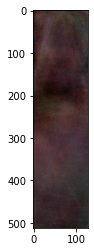

"\n#Uncomment to run this part of the code....\n##############################################\n\n# example of loading the generator model and generating images\nfrom keras.models import load_model\nfrom numpy.random import randn\nfrom matplotlib import pyplot as plt\n\n\n# generate points in latent space as input for the generator\ndef generate_latent_points(latent_dim, n_samples):\n\t# generate points in the latent space\n\tx_input = randn(latent_dim * n_samples)\n\t# reshape into a batch of inputs for the network\n\tx_input = x_input.reshape(n_samples, latent_dim)\n\treturn x_input\n\n# create and save a plot of generated images (reversed grayscale)\ndef save_plot(examples, n):\n\t# plot images\n\tfor i in range(n * n):\n\t\t# define subplot\n\t\tplt.subplot(n, n, 1 + i)\n\t\t# turn off axis\n\t\tplt.axis('off')\n\t\t# plot raw pixel data\n\t\tplt.imshow(examples[i, :, :, 0], cmap='gray_r')\n\tplt.show()\n\n# load model\nmodel = load_model('generator_model_100K.h5')\n# generate imag

In [10]:
from keras.models import load_model
from numpy.random import randn
from matplotlib import pyplot


# load model
model = load_model('generator_model_finger.h5')

#To create same image, suppy same vector each time
# all 0s
#vector = asarray([[0. for _ in range(100)]])  #Vector of all zeros

#To create random images each time...
vector = randn(100) #Vector of random numbers (creates a column, need to reshape)
vector = vector.reshape(1, 100)

# generate image
X = model.predict(vector)

# plot the result
pyplot.imshow(X[0, :, :, :])
pyplot.show()

"""
#Uncomment to run this part of the code....
##############################################

# example of loading the generator model and generating images
from keras.models import load_model
from numpy.random import randn
from matplotlib import pyplot as plt


# generate points in latent space as input for the generator
def generate_latent_points(latent_dim, n_samples):
	# generate points in the latent space
	x_input = randn(latent_dim * n_samples)
	# reshape into a batch of inputs for the network
	x_input = x_input.reshape(n_samples, latent_dim)
	return x_input

# create and save a plot of generated images (reversed grayscale)
def save_plot(examples, n):
	# plot images
	for i in range(n * n):
		# define subplot
		plt.subplot(n, n, 1 + i)
		# turn off axis
		plt.axis('off')
		# plot raw pixel data
		plt.imshow(examples[i, :, :, 0], cmap='gray_r')
	plt.show()

# load model
model = load_model('generator_model_100K.h5')
# generate images
#Generate 16 images, each image provide a vector of size 100 as input
latent_points = generate_latent_points(100, 16) 
# generate images
X = model.predict(latent_points)
# plot the result
save_plot(X, 4)  #Plot 4x4 grid (Change to 5 if generating 25 images)

"""


1/1 [==============================] - 0s 73ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


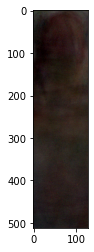

In [13]:
#To create random images each time...
vector = randn(100) #Vector of random numbers (creates a column, need to reshape)
vector = vector.reshape(1, 100)

# generate image
X = model.predict(vector)

# plot the result
pyplot.imshow(X[0, :, :, :])
pyplot.show()